# **Fashion Recommendation using EfficientNet B3 - Extracting Features**

## **1. Import Libraries**

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.models import Model
from numpy.linalg import norm
import os
from tqdm import tqdm
import pickle
from sklearn.neighbors import NearestNeighbors
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.utils import plot_model

## **2. Pretrained EfficientNet Model**

In [ ]:
base_model = EfficientNetB3(weights='imagenet', include_top=False)
x = base_model.output
print(x.shape)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
print(x.shape)

model = Model(inputs=base_model.input, outputs=x)
model.summary()

(None, None, None, 1536)
(None, 1536)
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 rescaling_6 (Rescaling)     (None, None, None, 3)        0         ['input_4[0][0]']             
                                                                                                  
 normalization_3 (Normaliza  (None, None, None, 3)        7         ['rescaling_6[0][0]']         
 tion)                                                                                            
                                                                                                  
 rescaling_7 (Rescaling)     (None, None, None, 3)    

                                                                                                  
 block2a_expand_conv (Conv2  (None, None, None, 144)      3456      ['block1b_add[0][0]']         
 D)                                                                                               
                                                                                                  
 block2a_expand_bn (BatchNo  (None, None, None, 144)      576       ['block2a_expand_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 block2a_expand_activation   (None, None, None, 144)      0         ['block2a_expand_bn[0][0]']   
 (Activation)                                                                                     
                                                                                                  
 block2a_d

 block2c_expand_conv (Conv2  (None, None, None, 192)      6144      ['block2b_add[0][0]']         
 D)                                                                                               
                                                                                                  
 block2c_expand_bn (BatchNo  (None, None, None, 192)      768       ['block2c_expand_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 block2c_expand_activation   (None, None, None, 192)      0         ['block2c_expand_bn[0][0]']   
 (Activation)                                                                                     
                                                                                                  
 block2c_dwconv (DepthwiseC  (None, None, None, 192)      1728      ['block2c_expand_activation[0]
 onv2D)   

 D)                                                                                               
                                                                                                  
 block3b_expand_bn (BatchNo  (None, None, None, 288)      1152      ['block3b_expand_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 block3b_expand_activation   (None, None, None, 288)      0         ['block3b_expand_bn[0][0]']   
 (Activation)                                                                                     
                                                                                                  
 block3b_dwconv (DepthwiseC  (None, None, None, 288)      7200      ['block3b_expand_activation[0]
 onv2D)                                                             [0]']                         
          

 block4a_expand_conv (Conv2  (None, None, None, 288)      13824     ['block3c_add[0][0]']         
 D)                                                                                               
                                                                                                  
 block4a_expand_bn (BatchNo  (None, None, None, 288)      1152      ['block4a_expand_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 block4a_expand_activation   (None, None, None, 288)      0         ['block4a_expand_bn[0][0]']   
 (Activation)                                                                                     
                                                                                                  
 block4a_dwconv_pad (ZeroPa  (None, None, None, 288)      0         ['block4a_expand_activation[0]
 dding2D) 

 D)                                                                                               
                                                                                                  
 block4c_expand_bn (BatchNo  (None, None, None, 576)      2304      ['block4c_expand_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 block4c_expand_activation   (None, None, None, 576)      0         ['block4c_expand_bn[0][0]']   
 (Activation)                                                                                     
                                                                                                  
 block4c_dwconv (DepthwiseC  (None, None, None, 576)      5184      ['block4c_expand_activation[0]
 onv2D)                                                             [0]']                         
          

 block4e_expand_conv (Conv2  (None, None, None, 576)      55296     ['block4d_add[0][0]']         
 D)                                                                                               
                                                                                                  
 block4e_expand_bn (BatchNo  (None, None, None, 576)      2304      ['block4e_expand_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 block4e_expand_activation   (None, None, None, 576)      0         ['block4e_expand_bn[0][0]']   
 (Activation)                                                                                     
                                                                                                  
 block4e_dwconv (DepthwiseC  (None, None, None, 576)      5184      ['block4e_expand_activation[0]
 onv2D)   

 rmalization)                                                                                     
                                                                                                  
 block5b_expand_activation   (None, None, None, 816)      0         ['block5b_expand_bn[0][0]']   
 (Activation)                                                                                     
                                                                                                  
 block5b_dwconv (DepthwiseC  (None, None, None, 816)      20400     ['block5b_expand_activation[0]
 onv2D)                                                             [0]']                         
                                                                                                  
 block5b_bn (BatchNormaliza  (None, None, None, 816)      3264      ['block5b_dwconv[0][0]']      
 tion)                                                                                            
          

 block5d_expand_bn (BatchNo  (None, None, None, 816)      3264      ['block5d_expand_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 block5d_expand_activation   (None, None, None, 816)      0         ['block5d_expand_bn[0][0]']   
 (Activation)                                                                                     
                                                                                                  
 block5d_dwconv (DepthwiseC  (None, None, None, 816)      20400     ['block5d_expand_activation[0]
 onv2D)                                                             [0]']                         
                                                                                                  
 block5d_bn (BatchNormaliza  (None, None, None, 816)      3264      ['block5d_dwconv[0][0]']      
 tion)    

                                                                                                  
 block6a_expand_bn (BatchNo  (None, None, None, 816)      3264      ['block6a_expand_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 block6a_expand_activation   (None, None, None, 816)      0         ['block6a_expand_bn[0][0]']   
 (Activation)                                                                                     
                                                                                                  
 block6a_dwconv_pad (ZeroPa  (None, None, None, 816)      0         ['block6a_expand_activation[0]
 dding2D)                                                           [0]']                         
                                                                                                  
 block6a_d

 block6c_expand_bn (BatchNo  (None, None, None, 1392)     5568      ['block6c_expand_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 block6c_expand_activation   (None, None, None, 1392)     0         ['block6c_expand_bn[0][0]']   
 (Activation)                                                                                     
                                                                                                  
 block6c_dwconv (DepthwiseC  (None, None, None, 1392)     34800     ['block6c_expand_activation[0]
 onv2D)                                                             [0]']                         
                                                                                                  
 block6c_bn (BatchNormaliza  (None, None, None, 1392)     5568      ['block6c_dwconv[0][0]']      
 tion)    

                                                                                                  
 block6e_expand_bn (BatchNo  (None, None, None, 1392)     5568      ['block6e_expand_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 block6e_expand_activation   (None, None, None, 1392)     0         ['block6e_expand_bn[0][0]']   
 (Activation)                                                                                     
                                                                                                  
 block6e_dwconv (DepthwiseC  (None, None, None, 1392)     34800     ['block6e_expand_activation[0]
 onv2D)                                                             [0]']                         
                                                                                                  
 block6e_b

 D)                                                                                               
                                                                                                  
 block7a_expand_bn (BatchNo  (None, None, None, 1392)     5568      ['block7a_expand_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 block7a_expand_activation   (None, None, None, 1392)     0         ['block7a_expand_bn[0][0]']   
 (Activation)                                                                                     
                                                                                                  
 block7a_dwconv (DepthwiseC  (None, None, None, 1392)     12528     ['block7a_expand_activation[0]
 onv2D)                                                             [0]']                         
          

 top_activation (Activation  (None, None, None, 1536)     0         ['top_bn[0][0]']              
 )                                                                                                
                                                                                                  
 global_average_pooling2d_3  (None, 1536)                 0         ['top_activation[0][0]']      
  (GlobalAveragePooling2D)                                                                        
                                                                                                  
Total params: 10783535 (41.14 MB)
Trainable params: 10696232 (40.80 MB)
Non-trainable params: 87303 (341.03 KB)
__________________________________________________________________________________________________


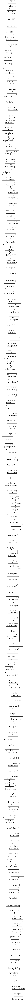

In [ ]:
plot_model(model, to_file='EfficientNetB3_model.png', show_shapes=True)

## **3. Preprocess Dataset Images (44441 images)**

In [ ]:
image_dir = 'images'

def process_single_image(img_path, model):
    img = image.load_img(img_path, target_size=(300, 300))
    img_array = image.img_to_array(img)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(expanded_img_array)
    features = model.predict(img_array).flatten()
    result = features / norm(features)
    return result

In [ ]:
image_paths = [os.path.join(image_dir, fname) for fname in os.listdir(image_dir)]
all_features = []

for img in tqdm(image_paths):
    all_features.append(process_single_image(img,model))

  0%|                                                           | 0/44441 [00:00<?, ?it/s]2024-03-28 14:55:39.471798: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 2s 2s/step


  0%|                                                | 1/44441 [00:02<28:37:04,  2.32s/it]

1/1 [==============================] - 0s 55ms/step


  0%|                                                | 2/44441 [00:02<12:31:05,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


  0%|                                                 | 4/44441 [00:02<5:17:34,  2.33it/s]

1/1 [==============================] - 0s 39ms/step


  0%|                                                 | 6/44441 [00:02<3:15:08,  3.80it/s]

1/1 [==============================] - 0s 45ms/step


  0%|                                                 | 8/44441 [00:02<2:19:41,  5.30it/s]

1/1 [==============================] - 0s 41ms/step


  0%|                                                | 10/44441 [00:03<1:49:43,  6.75it/s]

1/1 [==============================] - 0s 39ms/step


  0%|                                                | 12/44441 [00:03<1:30:25,  8.19it/s]

1/1 [==============================] - 0s 38ms/step


  0%|                                                | 14/44441 [00:03<1:16:46,  9.64it/s]

1/1 [==============================] - 0s 38ms/step


  0%|                                                | 16/44441 [00:03<1:11:10, 10.40it/s]

1/1 [==============================] - 0s 38ms/step


  0%|                                                | 18/44441 [00:03<1:06:41, 11.10it/s]

1/1 [==============================] - 0s 41ms/step


  0%|                                                | 20/44441 [00:03<1:01:35, 12.02it/s]

1/1 [==============================] - 0s 38ms/step


  0%|                                                | 22/44441 [00:03<1:01:34, 12.02it/s]

1/1 [==============================] - 0s 39ms/step


  0%|                                                | 24/44441 [00:04<1:00:21, 12.27it/s]

1/1 [==============================] - 0s 38ms/step


  0%|                                                  | 26/44441 [00:04<56:52, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


  0%|                                                  | 28/44441 [00:04<56:14, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


  0%|                                                  | 30/44441 [00:04<55:43, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


  0%|                                                  | 32/44441 [00:04<55:37, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


  0%|                                                  | 34/44441 [00:04<55:50, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


  0%|                                                  | 36/44441 [00:04<56:17, 13.15it/s]

1/1 [==============================] - 0s 42ms/step


  0%|                                                  | 38/44441 [00:05<58:30, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


  0%|                                                  | 40/44441 [00:05<59:40, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


  0%|                                                  | 42/44441 [00:05<58:57, 12.55it/s]

1/1 [==============================] - 0s 41ms/step


  0%|                                                  | 44/44441 [00:05<58:07, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


  0%|                                                  | 46/44441 [00:05<57:21, 12.90it/s]

1/1 [==============================] - 0s 44ms/step


  0%|                                                  | 48/44441 [00:05<57:03, 12.97it/s]

1/1 [==============================] - 0s 43ms/step


  0%|                                                  | 50/44441 [00:06<57:12, 12.93it/s]

1/1 [==============================] - 0s 45ms/step


  0%|                                                  | 52/44441 [00:06<55:39, 13.29it/s]

1/1 [==============================] - 0s 43ms/step


  0%|                                                  | 54/44441 [00:06<56:33, 13.08it/s]

1/1 [==============================] - 0s 43ms/step


  0%|                                                  | 56/44441 [00:06<55:41, 13.28it/s]

1/1 [==============================] - 0s 42ms/step


  0%|                                                  | 58/44441 [00:06<58:38, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


  0%|                                                  | 60/44441 [00:06<58:36, 12.62it/s]

1/1 [==============================] - 0s 42ms/step


  0%|                                                  | 62/44441 [00:07<56:28, 13.10it/s]

1/1 [==============================] - 0s 42ms/step


  0%|                                                  | 64/44441 [00:07<55:20, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


  0%|                                                  | 66/44441 [00:07<56:01, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


  0%|                                                  | 68/44441 [00:07<57:44, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


  0%|                                                  | 70/44441 [00:07<55:19, 13.37it/s]

1/1 [==============================] - 0s 42ms/step


  0%|                                                  | 72/44441 [00:07<58:02, 12.74it/s]

1/1 [==============================] - 0s 42ms/step


  0%|                                                  | 74/44441 [00:07<59:36, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


  0%|                                                  | 76/44441 [00:08<57:13, 12.92it/s]

1/1 [==============================] - 0s 44ms/step


  0%|                                                  | 78/44441 [00:08<59:03, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


  0%|                                                  | 80/44441 [00:08<58:19, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


  0%|                                                  | 82/44441 [00:08<55:52, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


  0%|                                                  | 84/44441 [00:08<54:44, 13.50it/s]

1/1 [==============================] - 0s 40ms/step


  0%|                                                  | 86/44441 [00:08<55:39, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


  0%|                                                  | 88/44441 [00:08<53:20, 13.86it/s]

1/1 [==============================] - 0s 41ms/step


  0%|                                                  | 90/44441 [00:09<54:47, 13.49it/s]

1/1 [==============================] - 0s 42ms/step


  0%|                                                  | 92/44441 [00:09<55:47, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


  0%|                                                  | 94/44441 [00:09<57:06, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


  0%|                                                  | 96/44441 [00:09<55:40, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


  0%|                                                  | 98/44441 [00:09<57:20, 12.89it/s]

1/1 [==============================] - 0s 41ms/step


  0%|                                                 | 100/44441 [00:09<56:43, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


  0%|                                                 | 102/44441 [00:10<54:57, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


  0%|                                                 | 104/44441 [00:10<54:51, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


  0%|                                                 | 106/44441 [00:10<56:44, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


  0%|                                                 | 108/44441 [00:10<54:21, 13.59it/s]

1/1 [==============================] - 0s 40ms/step


  0%|                                                 | 110/44441 [00:10<54:18, 13.60it/s]

1/1 [==============================] - 0s 42ms/step


  0%|                                                 | 112/44441 [00:10<54:40, 13.51it/s]

1/1 [==============================] - 0s 38ms/step


  0%|▏                                                | 114/44441 [00:10<56:36, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 116/44441 [00:11<54:32, 13.55it/s]

1/1 [==============================] - 0s 42ms/step


  0%|▏                                                | 118/44441 [00:11<54:03, 13.67it/s]

1/1 [==============================] - 0s 42ms/step


  0%|▏                                                | 120/44441 [00:11<54:19, 13.60it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 122/44441 [00:11<56:02, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 124/44441 [00:11<57:07, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


  0%|▏                                                | 126/44441 [00:11<56:58, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


  0%|▏                                                | 128/44441 [00:12<55:35, 13.28it/s]

1/1 [==============================] - 0s 42ms/step


  0%|▏                                                | 130/44441 [00:12<54:15, 13.61it/s]

1/1 [==============================] - 0s 42ms/step


  0%|▏                                                | 132/44441 [00:12<54:46, 13.48it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 134/44441 [00:12<54:53, 13.45it/s]

1/1 [==============================] - 0s 39ms/step


  0%|▏                                                | 136/44441 [00:12<54:55, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 138/44441 [00:12<55:49, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 140/44441 [00:12<55:52, 13.21it/s]

1/1 [==============================] - 0s 42ms/step


  0%|▏                                                | 142/44441 [00:13<55:34, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


  0%|▏                                                | 144/44441 [00:13<55:31, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


  0%|▏                                                | 146/44441 [00:13<55:02, 13.41it/s]

1/1 [==============================] - 0s 41ms/step


  0%|▏                                                | 148/44441 [00:13<54:59, 13.42it/s]

1/1 [==============================] - 0s 41ms/step


  0%|▏                                                | 150/44441 [00:13<55:41, 13.26it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 152/44441 [00:13<57:48, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


  0%|▏                                                | 154/44441 [00:13<56:26, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 156/44441 [00:14<54:25, 13.56it/s]

1/1 [==============================] - 0s 42ms/step


  0%|▏                                                | 158/44441 [00:14<55:08, 13.39it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 160/44441 [00:14<55:22, 13.33it/s]

1/1 [==============================] - 0s 42ms/step


  0%|▏                                                | 162/44441 [00:14<56:19, 13.10it/s]

1/1 [==============================] - 0s 43ms/step


  0%|▏                                                | 164/44441 [00:14<56:22, 13.09it/s]

1/1 [==============================] - 0s 43ms/step


  0%|▏                                                | 166/44441 [00:14<54:50, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 168/44441 [00:15<55:19, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


  0%|▏                                                | 170/44441 [00:15<53:53, 13.69it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 172/44441 [00:15<53:14, 13.86it/s]

1/1 [==============================] - 0s 41ms/step


  0%|▏                                                | 174/44441 [00:15<55:15, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 176/44441 [00:15<55:41, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 178/44441 [00:15<55:47, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


  0%|▏                                                | 180/44441 [00:15<54:25, 13.55it/s]

1/1 [==============================] - 0s 39ms/step


  0%|▏                                                | 182/44441 [00:16<56:25, 13.07it/s]

1/1 [==============================] - 0s 39ms/step


  0%|▏                                                | 184/44441 [00:16<55:45, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 186/44441 [00:16<55:35, 13.27it/s]

1/1 [==============================] - 0s 41ms/step


  0%|▏                                                | 188/44441 [00:16<55:24, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


  0%|▏                                                | 190/44441 [00:16<54:58, 13.42it/s]

1/1 [==============================] - 0s 44ms/step


  0%|▏                                                | 192/44441 [00:16<57:02, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


  0%|▏                                                | 194/44441 [00:16<56:01, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 196/44441 [00:17<57:17, 12.87it/s]

1/1 [==============================] - 0s 42ms/step


  0%|▏                                                | 198/44441 [00:17<57:15, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 200/44441 [00:17<58:06, 12.69it/s]

1/1 [==============================] - 0s 45ms/step


  0%|▏                                                | 202/44441 [00:17<57:33, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


  0%|▏                                                | 204/44441 [00:17<56:28, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 206/44441 [00:17<58:07, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 208/44441 [00:18<55:22, 13.31it/s]

1/1 [==============================] - 0s 42ms/step


  0%|▏                                                | 210/44441 [00:18<57:14, 12.88it/s]

1/1 [==============================] - 0s 45ms/step


  0%|▏                                                | 212/44441 [00:18<55:51, 13.20it/s]

1/1 [==============================] - 0s 44ms/step


  0%|▏                                                | 214/44441 [00:18<56:46, 12.98it/s]

1/1 [==============================] - 0s 43ms/step


  0%|▏                                                | 216/44441 [00:18<58:14, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


  0%|▏                                                | 218/44441 [00:18<59:25, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 220/44441 [00:19<59:54, 12.30it/s]

1/1 [==============================] - 0s 40ms/step


  0%|▏                                                | 222/44441 [00:19<56:55, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▏                                                | 224/44441 [00:19<55:54, 13.18it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▏                                                | 226/44441 [00:19<56:25, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▎                                                | 228/44441 [00:19<56:16, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▎                                                | 230/44441 [00:19<57:57, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▎                                                | 232/44441 [00:19<57:41, 12.77it/s]

1/1 [==============================] - 0s 45ms/step


  1%|▎                                                | 234/44441 [00:20<56:05, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▎                                                | 236/44441 [00:20<56:00, 13.15it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▎                                                | 238/44441 [00:20<56:48, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▎                                                | 240/44441 [00:20<56:25, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▎                                                | 242/44441 [00:20<56:54, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▎                                                | 244/44441 [00:20<58:31, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▎                                                | 246/44441 [00:21<57:51, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▎                                                | 248/44441 [00:21<58:59, 12.49it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▎                                              | 250/44441 [00:21<1:00:53, 12.09it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▎                                                | 252/44441 [00:21<59:48, 12.31it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▎                                              | 254/44441 [00:21<1:00:30, 12.17it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▎                                                | 256/44441 [00:21<59:41, 12.34it/s]

1/1 [==============================] - 0s 44ms/step


  1%|▎                                              | 258/44441 [00:22<1:00:16, 12.22it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▎                                                | 260/44441 [00:22<58:14, 12.64it/s]

1/1 [==============================] - 0s 43ms/step


  1%|▎                                                | 262/44441 [00:22<56:55, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▎                                                | 264/44441 [00:22<56:57, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▎                                                | 266/44441 [00:22<56:26, 13.04it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▎                                                | 268/44441 [00:22<56:57, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▎                                                | 270/44441 [00:22<57:07, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▎                                                | 272/44441 [00:23<56:35, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▎                                                | 274/44441 [00:23<56:09, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▎                                                | 276/44441 [00:23<55:41, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▎                                                | 278/44441 [00:23<55:22, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▎                                                | 280/44441 [00:23<56:11, 13.10it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▎                                                | 282/44441 [00:23<57:03, 12.90it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▎                                                | 284/44441 [00:23<56:43, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▎                                                | 286/44441 [00:24<55:18, 13.31it/s]

1/1 [==============================] - 0s 44ms/step


  1%|▎                                                | 288/44441 [00:24<53:58, 13.63it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▎                                                | 290/44441 [00:24<54:46, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▎                                                | 292/44441 [00:24<53:44, 13.69it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▎                                                | 294/44441 [00:24<54:27, 13.51it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▎                                                | 296/44441 [00:24<59:20, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▎                                                | 298/44441 [00:25<58:07, 12.66it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▎                                                | 300/44441 [00:25<57:02, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▎                                                | 302/44441 [00:25<57:35, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▎                                                | 304/44441 [00:25<56:44, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▎                                                | 306/44441 [00:25<54:42, 13.45it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▎                                                | 308/44441 [00:25<55:23, 13.28it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▎                                                | 310/44441 [00:25<54:59, 13.37it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▎                                                | 312/44441 [00:26<54:47, 13.42it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▎                                                | 314/44441 [00:26<55:54, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▎                                                | 316/44441 [00:26<55:31, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▎                                                | 318/44441 [00:26<55:21, 13.29it/s]

1/1 [==============================] - 0s 43ms/step


  1%|▎                                                | 320/44441 [00:26<55:47, 13.18it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▎                                                | 322/44441 [00:26<57:25, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▎                                                | 324/44441 [00:27<55:03, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▎                                                | 326/44441 [00:27<53:32, 13.73it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▎                                                | 328/44441 [00:27<55:51, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▎                                                | 330/44441 [00:27<55:53, 13.15it/s]

1/1 [==============================] - 0s 44ms/step


  1%|▎                                                | 332/44441 [00:27<56:59, 12.90it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▎                                              | 334/44441 [00:27<1:06:28, 11.06it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▎                                              | 336/44441 [00:28<1:02:13, 11.81it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▎                                                | 338/44441 [00:28<58:36, 12.54it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▎                                                | 340/44441 [00:28<56:09, 13.09it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▍                                                | 342/44441 [00:28<55:13, 13.31it/s]

1/1 [==============================] - 0s 44ms/step


  1%|▍                                                | 344/44441 [00:28<55:35, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▍                                                | 346/44441 [00:28<54:58, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▍                                                | 348/44441 [00:28<53:43, 13.68it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▍                                                | 350/44441 [00:29<54:46, 13.42it/s]

1/1 [==============================] - 0s 45ms/step


  1%|▍                                                | 352/44441 [00:29<54:06, 13.58it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▍                                                | 354/44441 [00:29<53:53, 13.63it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▍                                                | 356/44441 [00:29<53:16, 13.79it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▍                                                | 358/44441 [00:29<53:42, 13.68it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▍                                                | 360/44441 [00:29<53:38, 13.70it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▍                                                | 362/44441 [00:29<57:45, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▍                                                | 364/44441 [00:30<58:07, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▍                                                | 366/44441 [00:30<56:56, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▍                                                | 368/44441 [00:30<55:51, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▍                                                | 370/44441 [00:30<55:04, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▍                                                | 372/44441 [00:30<53:37, 13.70it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▍                                                | 374/44441 [00:30<53:34, 13.71it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▍                                                | 376/44441 [00:30<52:40, 13.94it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▍                                                | 378/44441 [00:31<51:05, 14.37it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▍                                                | 380/44441 [00:31<54:54, 13.38it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▍                                                | 382/44441 [00:31<53:59, 13.60it/s]

1/1 [==============================] - 0s 45ms/step


  1%|▍                                                | 384/44441 [00:31<54:50, 13.39it/s]

1/1 [==============================] - 0s 45ms/step


  1%|▍                                              | 386/44441 [00:31<1:15:15,  9.76it/s]

1/1 [==============================] - 0s 43ms/step


  1%|▍                                              | 388/44441 [00:32<1:09:16, 10.60it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▍                                              | 390/44441 [00:32<1:04:05, 11.45it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▍                                              | 392/44441 [00:32<1:03:22, 11.58it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▍                                              | 394/44441 [00:32<1:00:47, 12.07it/s]

1/1 [==============================] - 0s 47ms/step


  1%|▍                                                | 396/44441 [00:32<58:40, 12.51it/s]

1/1 [==============================] - 0s 57ms/step


  1%|▍                                              | 398/44441 [00:32<1:06:04, 11.11it/s]

1/1 [==============================] - 0s 43ms/step


  1%|▍                                              | 400/44441 [00:33<1:03:33, 11.55it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▍                                              | 402/44441 [00:33<1:03:11, 11.62it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▍                                              | 404/44441 [00:33<1:01:27, 11.94it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▍                                                | 406/44441 [00:33<58:46, 12.49it/s]

1/1 [==============================] - 0s 57ms/step


  1%|▍                                              | 408/44441 [00:33<1:01:18, 11.97it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▍                                              | 410/44441 [00:33<1:00:21, 12.16it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▍                                                | 412/44441 [00:33<58:08, 12.62it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▍                                                | 414/44441 [00:34<55:02, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▍                                                | 416/44441 [00:34<54:29, 13.47it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▍                                              | 418/44441 [00:34<1:17:38,  9.45it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▍                                              | 420/44441 [00:34<1:12:08, 10.17it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▍                                              | 422/44441 [00:34<1:05:54, 11.13it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▍                                              | 424/44441 [00:35<1:00:51, 12.05it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▍                                              | 426/44441 [00:35<1:00:50, 12.06it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▍                                                | 428/44441 [00:35<59:20, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▍                                                | 430/44441 [00:35<56:09, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▍                                                | 432/44441 [00:35<55:30, 13.21it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▍                                                | 434/44441 [00:35<58:04, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▍                                                | 436/44441 [00:35<55:00, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▍                                                | 438/44441 [00:36<55:20, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▍                                                | 440/44441 [00:36<55:00, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▍                                                | 442/44441 [00:36<55:09, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▍                                                | 444/44441 [00:36<54:59, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▍                                                | 446/44441 [00:36<54:32, 13.44it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▍                                                | 448/44441 [00:36<55:13, 13.28it/s]

1/1 [==============================] - 0s 43ms/step


  1%|▍                                                | 450/44441 [00:37<55:38, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▍                                                | 452/44441 [00:37<55:30, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▌                                                | 454/44441 [00:37<56:34, 12.96it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▌                                                | 456/44441 [00:37<55:45, 13.15it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▌                                                | 458/44441 [00:37<56:01, 13.08it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▌                                                | 460/44441 [00:37<57:49, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▌                                                | 462/44441 [00:37<56:42, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▌                                                | 464/44441 [00:38<54:07, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▌                                                | 466/44441 [00:38<55:11, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▌                                                | 468/44441 [00:38<55:04, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▌                                                | 470/44441 [00:38<53:24, 13.72it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▌                                                | 472/44441 [00:38<54:13, 13.52it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▌                                                | 474/44441 [00:38<53:45, 13.63it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▌                                                | 476/44441 [00:38<52:17, 14.01it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▌                                                | 478/44441 [00:39<52:25, 13.98it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▌                                                | 480/44441 [00:39<54:00, 13.57it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▌                                                | 482/44441 [00:39<54:01, 13.56it/s]

1/1 [==============================] - 0s 43ms/step


  1%|▌                                                | 484/44441 [00:39<54:12, 13.51it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▌                                                | 486/44441 [00:39<56:40, 12.93it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▌                                                | 488/44441 [00:39<56:06, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▌                                                | 490/44441 [00:39<53:39, 13.65it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▌                                                | 492/44441 [00:40<53:57, 13.58it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▌                                                | 494/44441 [00:40<53:58, 13.57it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▌                                                | 496/44441 [00:40<52:20, 13.99it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▌                                                | 498/44441 [00:40<51:24, 14.25it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▌                                                | 500/44441 [00:40<50:40, 14.45it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▌                                                | 502/44441 [00:40<51:37, 14.19it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▌                                                | 504/44441 [00:40<52:57, 13.83it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▌                                                | 506/44441 [00:41<52:52, 13.85it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▌                                                | 508/44441 [00:41<51:19, 14.27it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▌                                                | 510/44441 [00:41<54:09, 13.52it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▌                                                | 512/44441 [00:41<54:27, 13.44it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▌                                                | 514/44441 [00:41<52:51, 13.85it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▌                                                | 516/44441 [00:41<53:42, 13.63it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▌                                                | 518/44441 [00:41<52:03, 14.06it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▌                                                | 520/44441 [00:42<52:24, 13.97it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▌                                                | 522/44441 [00:42<53:56, 13.57it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▌                                                | 524/44441 [00:42<55:06, 13.28it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▌                                                | 526/44441 [00:42<55:35, 13.17it/s]

1/1 [==============================] - 0s 46ms/step


  1%|▌                                                | 528/44441 [00:42<56:02, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▌                                                | 530/44441 [00:42<54:33, 13.42it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▌                                                | 532/44441 [00:43<52:24, 13.97it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▌                                                | 534/44441 [00:43<52:08, 14.03it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▌                                                | 536/44441 [00:43<55:28, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▌                                                | 538/44441 [00:43<53:01, 13.80it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▌                                                | 540/44441 [00:43<53:07, 13.77it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▌                                                | 542/44441 [00:43<53:29, 13.68it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▌                                                | 544/44441 [00:43<53:25, 13.69it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▌                                                | 546/44441 [00:44<53:11, 13.75it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▌                                                | 548/44441 [00:44<53:23, 13.70it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▌                                                | 550/44441 [00:44<54:42, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▌                                                | 552/44441 [00:44<52:27, 13.95it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▌                                                | 554/44441 [00:44<53:23, 13.70it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▌                                                | 556/44441 [00:44<53:15, 13.73it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▌                                                | 558/44441 [00:44<52:32, 13.92it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▌                                                | 560/44441 [00:45<51:25, 14.22it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▌                                                | 562/44441 [00:45<51:47, 14.12it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▌                                                | 564/44441 [00:45<53:58, 13.55it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▌                                                | 566/44441 [00:45<54:09, 13.50it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▋                                                | 568/44441 [00:45<53:54, 13.57it/s]

1/1 [==============================] - 0s 44ms/step


  1%|▋                                                | 570/44441 [00:45<54:41, 13.37it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▋                                                | 572/44441 [00:45<55:50, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▋                                                | 574/44441 [00:46<55:09, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▋                                                | 576/44441 [00:46<55:06, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▋                                                | 578/44441 [00:46<54:46, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▋                                                | 580/44441 [00:46<54:59, 13.29it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▋                                                | 582/44441 [00:46<54:29, 13.41it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▋                                                | 584/44441 [00:46<53:14, 13.73it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▋                                                | 586/44441 [00:46<52:08, 14.02it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▋                                                | 588/44441 [00:47<54:17, 13.46it/s]

1/1 [==============================] - 0s 43ms/step


  1%|▋                                                | 590/44441 [00:47<53:42, 13.61it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▋                                                | 592/44441 [00:47<54:00, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▋                                                | 594/44441 [00:47<52:31, 13.91it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▋                                                | 596/44441 [00:47<52:13, 13.99it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▋                                                | 598/44441 [00:47<51:09, 14.28it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▋                                                | 600/44441 [00:47<50:14, 14.54it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▋                                                | 602/44441 [00:48<53:24, 13.68it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▋                                                | 604/44441 [00:48<51:45, 14.12it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▋                                                | 606/44441 [00:48<52:48, 13.83it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▋                                                | 608/44441 [00:48<53:00, 13.78it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▋                                                | 610/44441 [00:48<53:02, 13.77it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▋                                                | 612/44441 [00:48<54:23, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▋                                                | 614/44441 [00:49<54:11, 13.48it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▋                                                | 616/44441 [00:49<52:09, 14.01it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▋                                                | 618/44441 [00:49<53:42, 13.60it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▋                                                | 620/44441 [00:49<53:38, 13.62it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▋                                                | 622/44441 [00:49<51:59, 14.05it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▋                                                | 624/44441 [00:49<51:18, 14.24it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▋                                                | 626/44441 [00:49<52:30, 13.91it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▋                                                | 628/44441 [00:50<52:47, 13.83it/s]

1/1 [==============================] - 0s 45ms/step


  1%|▋                                                | 630/44441 [00:50<52:14, 13.98it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▋                                                | 632/44441 [00:50<52:45, 13.84it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▋                                                | 634/44441 [00:50<53:46, 13.58it/s]

1/1 [==============================] - 0s 43ms/step


  1%|▋                                                | 636/44441 [00:50<54:40, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▋                                                | 638/44441 [00:50<56:28, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▋                                                | 640/44441 [00:50<57:51, 12.62it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▋                                                | 642/44441 [00:51<56:17, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▋                                                | 644/44441 [00:51<55:46, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▋                                                | 646/44441 [00:51<55:51, 13.07it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▋                                                | 648/44441 [00:51<55:36, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▋                                                | 650/44441 [00:51<56:05, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▋                                                | 652/44441 [00:51<54:13, 13.46it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▋                                                | 654/44441 [00:52<55:15, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▋                                                | 656/44441 [00:52<54:57, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▋                                                | 658/44441 [00:52<52:51, 13.80it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▋                                                | 660/44441 [00:52<52:54, 13.79it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▋                                                | 662/44441 [00:52<53:13, 13.71it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▋                                                | 664/44441 [00:52<51:22, 14.20it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▋                                                | 666/44441 [00:52<55:12, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▋                                                | 668/44441 [00:53<56:15, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▋                                                | 670/44441 [00:53<55:34, 13.13it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▋                                                | 672/44441 [00:53<53:00, 13.76it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▋                                                | 674/44441 [00:53<53:45, 13.57it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▋                                                | 676/44441 [00:53<54:40, 13.34it/s]

1/1 [==============================] - 0s 44ms/step


  2%|▋                                                | 678/44441 [00:53<54:41, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▋                                                | 680/44441 [00:53<56:03, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▊                                                | 682/44441 [00:54<55:02, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▊                                                | 684/44441 [00:54<52:56, 13.77it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▊                                                | 686/44441 [00:54<52:47, 13.81it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▊                                                | 688/44441 [00:54<54:29, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▊                                                | 690/44441 [00:54<55:45, 13.08it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▊                                                | 692/44441 [00:54<54:49, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▊                                                | 694/44441 [00:54<54:20, 13.42it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▊                                                | 696/44441 [00:55<55:21, 13.17it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▊                                                | 698/44441 [00:55<54:22, 13.41it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▊                                                | 700/44441 [00:55<52:09, 13.98it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▊                                                | 702/44441 [00:55<54:10, 13.46it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▊                                                | 704/44441 [00:55<54:02, 13.49it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▊                                                | 706/44441 [00:55<52:30, 13.88it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▊                                                | 708/44441 [00:55<51:20, 14.20it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▊                                                | 710/44441 [00:56<50:07, 14.54it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▊                                                | 712/44441 [00:56<50:10, 14.53it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▊                                                | 714/44441 [00:56<52:28, 13.89it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▊                                                | 716/44441 [00:56<54:56, 13.26it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▊                                                | 718/44441 [00:56<54:02, 13.49it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▊                                                | 720/44441 [00:56<54:24, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▊                                                | 722/44441 [00:57<53:59, 13.50it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▊                                                | 724/44441 [00:57<53:59, 13.50it/s]

1/1 [==============================] - 0s 42ms/step


  2%|▊                                                | 726/44441 [00:57<52:59, 13.75it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▊                                                | 728/44441 [00:57<51:41, 14.09it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▊                                                | 730/44441 [00:57<51:49, 14.06it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▊                                                | 732/44441 [00:57<53:05, 13.72it/s]

1/1 [==============================] - 0s 121ms/step


  2%|▊                                              | 734/44441 [00:58<2:27:15,  4.95it/s]

1/1 [==============================] - 0s 42ms/step


  2%|▊                                              | 736/44441 [00:58<2:04:40,  5.84it/s]

1/1 [==============================] - 0s 43ms/step


  2%|▊                                              | 738/44441 [00:59<1:43:05,  7.07it/s]

1/1 [==============================] - 0s 46ms/step


  2%|▊                                              | 740/44441 [00:59<1:29:17,  8.16it/s]

1/1 [==============================] - 0s 59ms/step


  2%|▊                                              | 742/44441 [00:59<1:20:28,  9.05it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▊                                              | 744/44441 [00:59<1:14:19,  9.80it/s]

1/1 [==============================] - 0s 43ms/step


  2%|▊                                              | 746/44441 [00:59<1:07:41, 10.76it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▊                                              | 748/44441 [00:59<1:07:13, 10.83it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▊                                              | 750/44441 [01:00<1:02:35, 11.63it/s]

1/1 [==============================] - 0s 43ms/step


  2%|▊                                              | 752/44441 [01:00<1:00:06, 12.11it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▊                                                | 754/44441 [01:00<57:46, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▊                                                | 756/44441 [01:00<58:44, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▊                                                | 758/44441 [01:00<57:34, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▊                                                | 760/44441 [01:00<58:24, 12.46it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▊                                                | 762/44441 [01:00<54:55, 13.25it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▊                                                | 764/44441 [01:01<54:07, 13.45it/s]

1/1 [==============================] - 0s 43ms/step


  2%|▊                                                | 766/44441 [01:01<54:27, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▊                                                | 768/44441 [01:01<54:48, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▊                                                | 770/44441 [01:01<56:09, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▊                                                | 772/44441 [01:01<53:44, 13.54it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▊                                                | 774/44441 [01:01<57:47, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▊                                                | 776/44441 [01:02<57:02, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▊                                                | 778/44441 [01:02<54:24, 13.37it/s]

1/1 [==============================] - 0s 43ms/step


  2%|▊                                                | 780/44441 [01:02<57:39, 12.62it/s]

1/1 [==============================] - 0s 105ms/step


  2%|▊                                              | 782/44441 [01:02<1:04:23, 11.30it/s]

1/1 [==============================] - 0s 57ms/step


  2%|▊                                              | 784/44441 [01:02<1:11:43, 10.14it/s]

1/1 [==============================] - 0s 43ms/step


  2%|▊                                              | 786/44441 [01:02<1:06:34, 10.93it/s]

1/1 [==============================] - 0s 44ms/step


  2%|▊                                              | 788/44441 [01:03<1:03:04, 11.54it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▊                                              | 790/44441 [01:03<1:00:29, 12.03it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▊                                                | 792/44441 [01:03<56:56, 12.78it/s]

1/1 [==============================] - 0s 43ms/step


  2%|▉                                                | 794/44441 [01:03<55:00, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▉                                                | 796/44441 [01:03<54:26, 13.36it/s]

1/1 [==============================] - 0s 65ms/step


  2%|▉                                                | 798/44441 [01:03<56:32, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▉                                                | 800/44441 [01:04<59:57, 12.13it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▉                                                | 802/44441 [01:04<56:35, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▉                                                | 804/44441 [01:04<57:25, 12.67it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▉                                                | 806/44441 [01:04<56:19, 12.91it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▉                                                | 808/44441 [01:04<53:14, 13.66it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▉                                                | 810/44441 [01:04<52:34, 13.83it/s]

1/1 [==============================] - 0s 42ms/step


  2%|▉                                                | 812/44441 [01:04<51:10, 14.21it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▉                                                | 814/44441 [01:05<50:27, 14.41it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▉                                                | 816/44441 [01:05<51:22, 14.15it/s]

1/1 [==============================] - 0s 48ms/step


  2%|▉                                                | 818/44441 [01:05<52:57, 13.73it/s]

1/1 [==============================] - 0s 42ms/step


  2%|▉                                                | 820/44441 [01:05<53:19, 13.63it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▉                                                | 822/44441 [01:05<52:04, 13.96it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▉                                                | 824/44441 [01:05<54:38, 13.30it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▉                                                | 826/44441 [01:05<55:37, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▉                                                | 828/44441 [01:06<56:57, 12.76it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▉                                                | 830/44441 [01:06<54:07, 13.43it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▉                                                | 832/44441 [01:06<52:04, 13.96it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▉                                                | 834/44441 [01:06<52:46, 13.77it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▉                                                | 836/44441 [01:06<53:03, 13.70it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▉                                                | 838/44441 [01:06<53:08, 13.67it/s]

1/1 [==============================] - 0s 42ms/step


  2%|▉                                                | 840/44441 [01:06<53:43, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▉                                                | 842/44441 [01:07<51:55, 14.00it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▉                                                | 844/44441 [01:07<53:00, 13.71it/s]

1/1 [==============================] - 0s 42ms/step


  2%|▉                                                | 846/44441 [01:07<51:37, 14.07it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▉                                                | 848/44441 [01:07<53:55, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▉                                                | 850/44441 [01:07<52:19, 13.88it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▉                                                | 852/44441 [01:07<52:14, 13.90it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▉                                                | 854/44441 [01:07<52:03, 13.95it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▉                                                | 856/44441 [01:08<52:55, 13.73it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▉                                                | 858/44441 [01:08<52:47, 13.76it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▉                                                | 860/44441 [01:08<54:18, 13.37it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▉                                                | 862/44441 [01:08<51:39, 14.06it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▉                                                | 864/44441 [01:08<51:31, 14.10it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▉                                                | 866/44441 [01:08<51:38, 14.06it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▉                                                | 868/44441 [01:08<50:50, 14.28it/s]

1/1 [==============================] - 0s 42ms/step


  2%|▉                                                | 870/44441 [01:09<52:13, 13.91it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▉                                                | 872/44441 [01:09<54:20, 13.36it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▉                                                | 874/44441 [01:09<53:51, 13.48it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▉                                                | 876/44441 [01:09<53:47, 13.50it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▉                                                | 878/44441 [01:09<57:31, 12.62it/s]

1/1 [==============================] - 0s 42ms/step


  2%|▉                                                | 880/44441 [01:09<56:41, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▉                                                | 882/44441 [01:10<55:54, 12.98it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▉                                                | 884/44441 [01:10<53:07, 13.67it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▉                                                | 886/44441 [01:10<52:59, 13.70it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▉                                                | 888/44441 [01:10<53:27, 13.58it/s]

1/1 [==============================] - 0s 43ms/step


  2%|▉                                                | 890/44441 [01:10<53:58, 13.45it/s]

1/1 [==============================] - 0s 42ms/step


  2%|▉                                                | 892/44441 [01:10<55:52, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▉                                                | 894/44441 [01:10<55:06, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▉                                                | 896/44441 [01:11<53:57, 13.45it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▉                                                | 898/44441 [01:11<55:02, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▉                                                | 900/44441 [01:11<53:16, 13.62it/s]

1/1 [==============================] - 0s 43ms/step


  2%|▉                                                | 902/44441 [01:11<53:16, 13.62it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▉                                                | 904/44441 [01:11<54:45, 13.25it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▉                                                | 906/44441 [01:11<52:24, 13.84it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█                                                | 908/44441 [01:11<52:22, 13.85it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█                                                | 910/44441 [01:12<50:36, 14.34it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█                                                | 912/44441 [01:12<51:36, 14.06it/s]

1/1 [==============================] - 0s 41ms/step


  2%|█                                                | 914/44441 [01:12<50:04, 14.49it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                                | 916/44441 [01:12<49:45, 14.58it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█                                                | 918/44441 [01:12<51:34, 14.07it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                                | 920/44441 [01:12<52:17, 13.87it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                                | 922/44441 [01:12<53:59, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                                | 924/44441 [01:13<53:46, 13.49it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                                | 926/44441 [01:13<55:39, 13.03it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█                                                | 928/44441 [01:13<53:33, 13.54it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█                                                | 930/44441 [01:13<54:41, 13.26it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█                                                | 932/44441 [01:13<55:26, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


  2%|█                                                | 934/44441 [01:13<56:52, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                                | 936/44441 [01:14<56:57, 12.73it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█                                                | 938/44441 [01:14<57:50, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                                | 940/44441 [01:14<55:07, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█                                                | 942/44441 [01:14<55:38, 13.03it/s]

1/1 [==============================] - 0s 42ms/step


  2%|█                                                | 944/44441 [01:14<57:04, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


  2%|█                                                | 946/44441 [01:14<57:37, 12.58it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█                                                | 948/44441 [01:14<57:09, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█                                                | 950/44441 [01:15<56:04, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█                                                | 952/44441 [01:15<53:43, 13.49it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                                | 954/44441 [01:15<54:20, 13.34it/s]

1/1 [==============================] - 0s 42ms/step


  2%|█                                                | 956/44441 [01:15<54:45, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


  2%|█                                                | 958/44441 [01:15<54:30, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                                | 960/44441 [01:15<54:41, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                                | 962/44441 [01:16<54:18, 13.34it/s]

1/1 [==============================] - 0s 42ms/step


  2%|█                                                | 964/44441 [01:16<55:25, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                                | 966/44441 [01:16<55:29, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█                                                | 968/44441 [01:16<55:30, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


  2%|█                                                | 970/44441 [01:16<55:25, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


  2%|█                                                | 972/44441 [01:16<54:55, 13.19it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█                                                | 974/44441 [01:16<52:51, 13.71it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█                                                | 976/44441 [01:17<52:31, 13.79it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                                | 978/44441 [01:17<51:12, 14.15it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█                                                | 980/44441 [01:17<52:08, 13.89it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                                | 982/44441 [01:17<52:53, 13.70it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                                | 984/44441 [01:17<51:32, 14.05it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█                                                | 986/44441 [01:17<52:32, 13.79it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█                                                | 988/44441 [01:17<51:37, 14.03it/s]

1/1 [==============================] - 0s 42ms/step


  2%|█                                                | 990/44441 [01:18<50:08, 14.44it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                                | 992/44441 [01:18<49:39, 14.58it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                                | 994/44441 [01:18<51:24, 14.08it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█                                                | 996/44441 [01:18<51:27, 14.07it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█                                                | 998/44441 [01:18<53:15, 13.59it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█                                               | 1000/44441 [01:18<54:31, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                               | 1002/44441 [01:18<54:05, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                               | 1004/44441 [01:19<55:12, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


  2%|█                                               | 1006/44441 [01:19<55:25, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


  2%|█                                               | 1008/44441 [01:19<55:05, 13.14it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█                                               | 1010/44441 [01:19<54:05, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


  2%|█                                               | 1012/44441 [01:19<54:09, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


  2%|█                                               | 1014/44441 [01:19<53:08, 13.62it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█                                               | 1016/44441 [01:19<53:15, 13.59it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                               | 1018/44441 [01:20<53:28, 13.53it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█                                               | 1020/44441 [01:20<55:31, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                               | 1022/44441 [01:20<57:20, 12.62it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█                                               | 1024/44441 [01:20<56:42, 12.76it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█                                               | 1026/44441 [01:20<55:23, 13.06it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█                                               | 1028/44441 [01:20<54:48, 13.20it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█                                               | 1030/44441 [01:21<54:32, 13.26it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                               | 1032/44441 [01:21<56:13, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                               | 1034/44441 [01:21<55:54, 12.94it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█                                               | 1036/44441 [01:21<53:43, 13.47it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█                                               | 1038/44441 [01:21<52:02, 13.90it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█                                               | 1040/44441 [01:21<54:01, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


  2%|█▏                                              | 1042/44441 [01:21<53:58, 13.40it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█▏                                              | 1044/44441 [01:22<52:51, 13.68it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█▏                                              | 1046/44441 [01:22<52:45, 13.71it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█▏                                              | 1048/44441 [01:22<51:36, 14.01it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█▏                                              | 1050/44441 [01:22<52:15, 13.84it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█▏                                              | 1052/44441 [01:22<50:42, 14.26it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█▏                                              | 1054/44441 [01:22<50:50, 14.22it/s]

1/1 [==============================] - 0s 41ms/step


  2%|█▏                                              | 1056/44441 [01:22<50:17, 14.38it/s]

1/1 [==============================] - 0s 42ms/step


  2%|█▏                                              | 1058/44441 [01:23<51:21, 14.08it/s]

1/1 [==============================] - 0s 42ms/step


  2%|█▏                                              | 1060/44441 [01:23<50:37, 14.28it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█▏                                              | 1062/44441 [01:23<53:01, 13.64it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█▏                                              | 1064/44441 [01:23<52:27, 13.78it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█▏                                              | 1066/44441 [01:23<51:10, 14.13it/s]

1/1 [==============================] - 0s 42ms/step


  2%|█▏                                              | 1068/44441 [01:23<51:31, 14.03it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█▏                                              | 1070/44441 [01:23<50:54, 14.20it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█▏                                              | 1072/44441 [01:24<52:57, 13.65it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█▏                                              | 1074/44441 [01:24<53:24, 13.53it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█▏                                              | 1076/44441 [01:24<52:44, 13.70it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█▏                                              | 1078/44441 [01:24<54:09, 13.34it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█▏                                              | 1080/44441 [01:24<52:09, 13.86it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█▏                                              | 1082/44441 [01:24<50:45, 14.24it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█▏                                              | 1084/44441 [01:24<51:37, 14.00it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█▏                                              | 1086/44441 [01:25<50:05, 14.43it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█▏                                              | 1088/44441 [01:25<49:13, 14.68it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█▏                                              | 1090/44441 [01:25<51:53, 13.93it/s]

1/1 [==============================] - 0s 41ms/step


  2%|█▏                                              | 1092/44441 [01:25<51:06, 14.14it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█▏                                              | 1094/44441 [01:25<53:02, 13.62it/s]

1/1 [==============================] - 0s 40ms/step


  2%|█▏                                              | 1096/44441 [01:25<53:11, 13.58it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█▏                                              | 1098/44441 [01:25<54:40, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


  2%|█▏                                              | 1100/44441 [01:26<52:50, 13.67it/s]

1/1 [==============================] - 0s 41ms/step


  2%|█▏                                              | 1102/44441 [01:26<52:57, 13.64it/s]

1/1 [==============================] - 0s 41ms/step


  2%|█▏                                              | 1104/44441 [01:26<51:32, 14.02it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█▏                                              | 1106/44441 [01:26<51:20, 14.07it/s]

1/1 [==============================] - 0s 39ms/step


  2%|█▏                                              | 1108/44441 [01:26<52:02, 13.88it/s]

1/1 [==============================] - 0s 38ms/step


  2%|█▏                                              | 1110/44441 [01:26<53:16, 13.55it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▏                                              | 1112/44441 [01:26<51:46, 13.95it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▏                                              | 1114/44441 [01:27<50:48, 14.21it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▏                                              | 1116/44441 [01:27<54:08, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▏                                              | 1118/44441 [01:27<53:28, 13.50it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▏                                              | 1120/44441 [01:27<53:06, 13.60it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▏                                              | 1122/44441 [01:27<55:08, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▏                                              | 1124/44441 [01:27<54:35, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▏                                              | 1126/44441 [01:28<54:17, 13.30it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▏                                              | 1128/44441 [01:28<51:09, 14.11it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▏                                              | 1130/44441 [01:28<51:25, 14.04it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▏                                              | 1132/44441 [01:28<54:43, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▏                                              | 1134/44441 [01:28<54:42, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▏                                              | 1136/44441 [01:28<54:17, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▏                                              | 1138/44441 [01:28<55:22, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▏                                              | 1140/44441 [01:29<52:49, 13.66it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▏                                              | 1142/44441 [01:29<52:31, 13.74it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▏                                              | 1144/44441 [01:29<52:50, 13.66it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▏                                              | 1146/44441 [01:29<54:47, 13.17it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▏                                              | 1148/44441 [01:29<54:16, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▏                                              | 1150/44441 [01:29<53:32, 13.48it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▏                                              | 1152/44441 [01:29<53:12, 13.56it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▏                                              | 1154/44441 [01:30<52:49, 13.66it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▏                                              | 1156/44441 [01:30<51:53, 13.90it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▎                                              | 1158/44441 [01:30<51:53, 13.90it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▎                                              | 1160/44441 [01:30<52:21, 13.78it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▎                                              | 1162/44441 [01:30<51:06, 14.11it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▎                                              | 1164/44441 [01:30<52:56, 13.62it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▎                                              | 1166/44441 [01:30<53:45, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▎                                              | 1168/44441 [01:31<52:22, 13.77it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▎                                              | 1170/44441 [01:31<52:33, 13.72it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▎                                              | 1172/44441 [01:31<52:41, 13.69it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▎                                              | 1174/44441 [01:31<52:48, 13.66it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▎                                              | 1176/44441 [01:31<51:29, 14.00it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▎                                              | 1178/44441 [01:31<52:39, 13.69it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▎                                              | 1180/44441 [01:31<53:01, 13.60it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▎                                              | 1182/44441 [01:32<52:39, 13.69it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▎                                              | 1184/44441 [01:32<53:31, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▎                                              | 1186/44441 [01:32<53:02, 13.59it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▎                                              | 1188/44441 [01:32<54:41, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▎                                              | 1190/44441 [01:32<52:47, 13.65it/s]

1/1 [==============================] - 0s 44ms/step


  3%|█▎                                              | 1192/44441 [01:32<54:40, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▎                                              | 1194/44441 [01:33<54:46, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


  3%|█▎                                              | 1196/44441 [01:33<54:38, 13.19it/s]

1/1 [==============================] - 0s 43ms/step


  3%|█▎                                              | 1198/44441 [01:33<55:04, 13.09it/s]

1/1 [==============================] - 0s 42ms/step


  3%|█▎                                              | 1200/44441 [01:33<55:38, 12.95it/s]

1/1 [==============================] - 0s 43ms/step


  3%|█▎                                              | 1202/44441 [01:33<53:56, 13.36it/s]

1/1 [==============================] - 0s 44ms/step


  3%|█▎                                              | 1204/44441 [01:33<54:45, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▎                                              | 1206/44441 [01:33<54:56, 13.11it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▎                                              | 1208/44441 [01:34<52:37, 13.69it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▎                                              | 1210/44441 [01:34<52:30, 13.72it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▎                                              | 1212/44441 [01:34<53:58, 13.35it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▎                                              | 1214/44441 [01:34<52:06, 13.82it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▎                                              | 1216/44441 [01:34<52:01, 13.85it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▎                                              | 1218/44441 [01:34<53:31, 13.46it/s]

1/1 [==============================] - 0s 45ms/step


  3%|█▎                                              | 1220/44441 [01:35<55:26, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▎                                              | 1222/44441 [01:35<55:15, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▎                                              | 1224/44441 [01:35<54:27, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▎                                              | 1226/44441 [01:35<52:31, 13.71it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▎                                              | 1228/44441 [01:35<54:06, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▎                                              | 1230/44441 [01:35<53:15, 13.52it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▎                                              | 1232/44441 [01:35<55:05, 13.07it/s]

1/1 [==============================] - 0s 37ms/step


  3%|█▎                                              | 1234/44441 [01:36<54:13, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▎                                              | 1236/44441 [01:36<53:55, 13.35it/s]

1/1 [==============================] - 0s 43ms/step


  3%|█▎                                              | 1238/44441 [01:36<52:12, 13.79it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▎                                              | 1240/44441 [01:36<52:23, 13.74it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▎                                              | 1242/44441 [01:36<55:43, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▎                                              | 1244/44441 [01:36<55:36, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▎                                              | 1246/44441 [01:36<53:57, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▎                                              | 1248/44441 [01:37<53:56, 13.35it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▎                                              | 1250/44441 [01:37<54:23, 13.23it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▎                                              | 1252/44441 [01:37<56:19, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▎                                              | 1254/44441 [01:37<56:48, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▎                                              | 1256/44441 [01:37<58:28, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▎                                              | 1258/44441 [01:37<57:01, 12.62it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▎                                              | 1260/44441 [01:38<55:39, 12.93it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▎                                              | 1262/44441 [01:38<54:52, 13.11it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▎                                              | 1264/44441 [01:38<53:42, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▎                                              | 1266/44441 [01:38<55:36, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▎                                              | 1268/44441 [01:38<55:03, 13.07it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▎                                              | 1270/44441 [01:38<53:50, 13.36it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▎                                              | 1272/44441 [01:38<51:42, 13.91it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▍                                              | 1274/44441 [01:39<52:02, 13.82it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▍                                              | 1276/44441 [01:39<52:15, 13.77it/s]

1/1 [==============================] - 0s 47ms/step


  3%|█▍                                              | 1278/44441 [01:39<52:47, 13.63it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▍                                              | 1280/44441 [01:39<55:04, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▍                                              | 1282/44441 [01:39<55:59, 12.85it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▍                                              | 1284/44441 [01:39<54:52, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▍                                              | 1286/44441 [01:40<56:02, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▍                                              | 1288/44441 [01:40<55:09, 13.04it/s]

1/1 [==============================] - 0s 43ms/step


  3%|█▍                                              | 1290/44441 [01:40<53:22, 13.47it/s]

1/1 [==============================] - 0s 42ms/step


  3%|█▍                                              | 1292/44441 [01:40<54:42, 13.15it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▍                                              | 1294/44441 [01:40<56:05, 12.82it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▍                                              | 1296/44441 [01:40<55:13, 13.02it/s]

1/1 [==============================] - 0s 42ms/step


  3%|█▍                                              | 1298/44441 [01:40<54:34, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▍                                              | 1300/44441 [01:41<55:05, 13.05it/s]

1/1 [==============================] - 0s 48ms/step


  3%|█▍                                              | 1302/44441 [01:41<55:34, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▍                                              | 1304/44441 [01:41<56:15, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▍                                              | 1306/44441 [01:41<56:32, 12.72it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▍                                              | 1308/44441 [01:41<56:17, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▍                                              | 1310/44441 [01:41<53:28, 13.44it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▍                                              | 1312/44441 [01:41<53:33, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▍                                              | 1314/44441 [01:42<54:27, 13.20it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▍                                              | 1316/44441 [01:42<53:44, 13.38it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▍                                              | 1318/44441 [01:42<53:07, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▍                                              | 1320/44441 [01:42<52:29, 13.69it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▍                                              | 1322/44441 [01:42<51:05, 14.06it/s]

1/1 [==============================] - 0s 43ms/step


  3%|█▍                                              | 1324/44441 [01:42<53:34, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▍                                              | 1326/44441 [01:43<51:56, 13.83it/s]

1/1 [==============================] - 0s 43ms/step


  3%|█▍                                              | 1328/44441 [01:43<52:33, 13.67it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▍                                              | 1330/44441 [01:43<53:26, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▍                                              | 1332/44441 [01:43<53:30, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▍                                              | 1334/44441 [01:43<51:40, 13.90it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▍                                              | 1336/44441 [01:43<53:28, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▍                                              | 1338/44441 [01:43<53:04, 13.54it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▍                                              | 1340/44441 [01:44<52:22, 13.71it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▍                                              | 1342/44441 [01:44<52:25, 13.70it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▍                                              | 1344/44441 [01:44<50:45, 14.15it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▍                                              | 1346/44441 [01:44<53:30, 13.42it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▍                                              | 1348/44441 [01:44<54:39, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▍                                              | 1350/44441 [01:44<52:14, 13.75it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▍                                              | 1352/44441 [01:44<52:03, 13.80it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▍                                              | 1354/44441 [01:45<52:34, 13.66it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▍                                              | 1356/44441 [01:45<50:35, 14.19it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▍                                              | 1358/44441 [01:45<49:30, 14.50it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▍                                              | 1360/44441 [01:45<52:06, 13.78it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▍                                              | 1362/44441 [01:45<52:05, 13.78it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▍                                              | 1364/44441 [01:45<50:16, 14.28it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▍                                              | 1366/44441 [01:45<49:12, 14.59it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▍                                              | 1368/44441 [01:46<49:57, 14.37it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▍                                              | 1370/44441 [01:46<51:45, 13.87it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▍                                              | 1372/44441 [01:46<50:26, 14.23it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▍                                              | 1374/44441 [01:46<50:58, 14.08it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▍                                              | 1376/44441 [01:46<51:49, 13.85it/s]

1/1 [==============================] - 0s 46ms/step


  3%|█▍                                              | 1378/44441 [01:46<55:02, 13.04it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▍                                              | 1380/44441 [01:46<54:24, 13.19it/s]

1/1 [==============================] - 0s 37ms/step


  3%|█▍                                              | 1382/44441 [01:47<52:03, 13.79it/s]

1/1 [==============================] - 0s 37ms/step


  3%|█▍                                              | 1384/44441 [01:47<52:22, 13.70it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▍                                              | 1386/44441 [01:47<52:34, 13.65it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▍                                              | 1388/44441 [01:47<53:35, 13.39it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▌                                              | 1390/44441 [01:47<52:58, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                              | 1392/44441 [01:47<51:05, 14.04it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▌                                              | 1394/44441 [01:47<51:22, 13.96it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▌                                              | 1396/44441 [01:48<49:52, 14.38it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▌                                              | 1398/44441 [01:48<50:19, 14.25it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                              | 1400/44441 [01:48<49:33, 14.47it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                              | 1402/44441 [01:48<50:05, 14.32it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▌                                              | 1404/44441 [01:48<52:15, 13.73it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▌                                              | 1406/44441 [01:48<54:33, 13.15it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▌                                              | 1408/44441 [01:48<54:00, 13.28it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▌                                              | 1410/44441 [01:49<55:22, 12.95it/s]

1/1 [==============================] - 0s 43ms/step


  3%|█▌                                              | 1412/44441 [01:49<53:41, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▌                                              | 1414/44441 [01:49<53:11, 13.48it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                              | 1416/44441 [01:49<52:53, 13.56it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▌                                              | 1418/44441 [01:49<51:11, 14.01it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                              | 1420/44441 [01:49<54:57, 13.05it/s]

1/1 [==============================] - 0s 42ms/step


  3%|█▌                                              | 1422/44441 [01:49<53:02, 13.52it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                              | 1424/44441 [01:50<51:13, 14.00it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▌                                              | 1426/44441 [01:50<51:36, 13.89it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                              | 1428/44441 [01:50<50:44, 14.13it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                              | 1430/44441 [01:50<53:04, 13.50it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▌                                              | 1432/44441 [01:50<51:21, 13.96it/s]

1/1 [==============================] - 0s 44ms/step


  3%|█▌                                              | 1434/44441 [01:50<52:55, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                              | 1436/44441 [01:51<55:02, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                              | 1438/44441 [01:51<54:13, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                              | 1440/44441 [01:51<53:40, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▌                                              | 1442/44441 [01:51<53:29, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▌                                              | 1444/44441 [01:51<53:32, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▌                                              | 1446/44441 [01:51<53:02, 13.51it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                              | 1448/44441 [01:51<52:15, 13.71it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▌                                              | 1450/44441 [01:52<50:34, 14.17it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                              | 1452/44441 [01:52<49:22, 14.51it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▌                                              | 1454/44441 [01:52<50:34, 14.17it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▌                                              | 1456/44441 [01:52<49:37, 14.43it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▌                                              | 1458/44441 [01:52<50:19, 14.24it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▌                                              | 1460/44441 [01:52<49:09, 14.57it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                              | 1462/44441 [01:52<49:42, 14.41it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▌                                              | 1464/44441 [01:52<48:22, 14.81it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▌                                              | 1466/44441 [01:53<48:21, 14.81it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▌                                              | 1468/44441 [01:53<51:06, 14.01it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▌                                              | 1470/44441 [01:53<49:48, 14.38it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▌                                              | 1472/44441 [01:53<50:11, 14.27it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                              | 1474/44441 [01:53<50:31, 14.17it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▌                                              | 1476/44441 [01:53<51:11, 13.99it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▌                                              | 1478/44441 [01:54<52:02, 13.76it/s]

1/1 [==============================] - 0s 43ms/step


  3%|█▌                                              | 1480/44441 [01:54<53:19, 13.43it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▌                                              | 1482/44441 [01:54<54:57, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▌                                              | 1484/44441 [01:54<53:33, 13.37it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▌                                              | 1486/44441 [01:54<52:40, 13.59it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▌                                              | 1488/44441 [01:54<52:56, 13.52it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▌                                              | 1490/44441 [01:54<52:22, 13.67it/s]

1/1 [==============================] - 0s 49ms/step


  3%|█▌                                              | 1492/44441 [01:55<54:43, 13.08it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                              | 1494/44441 [01:55<54:06, 13.23it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▌                                              | 1496/44441 [01:55<52:58, 13.51it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                              | 1498/44441 [01:55<52:42, 13.58it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▌                                              | 1500/44441 [01:55<52:46, 13.56it/s]

1/1 [==============================] - 0s 42ms/step


  3%|█▌                                              | 1502/44441 [01:55<52:46, 13.56it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                              | 1504/44441 [01:55<52:17, 13.69it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▋                                              | 1506/44441 [01:56<54:02, 13.24it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▋                                              | 1508/44441 [01:56<54:28, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▋                                              | 1510/44441 [01:56<55:30, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▋                                              | 1512/44441 [01:56<53:02, 13.49it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▋                                              | 1514/44441 [01:56<53:51, 13.28it/s]

1/1 [==============================] - 0s 37ms/step


  3%|█▋                                              | 1516/44441 [01:56<54:27, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▋                                              | 1518/44441 [01:57<55:44, 12.83it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▋                                              | 1520/44441 [01:57<55:50, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▋                                              | 1522/44441 [01:57<57:22, 12.47it/s]

1/1 [==============================] - 0s 38ms/step


  3%|█▋                                              | 1524/44441 [01:57<54:00, 13.24it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▋                                              | 1526/44441 [01:57<55:36, 12.86it/s]

1/1 [==============================] - 0s 215ms/step


  3%|█▌                                            | 1528/44441 [01:58<1:19:03,  9.05it/s]

1/1 [==============================] - 0s 43ms/step


  3%|█▌                                            | 1530/44441 [01:58<1:50:03,  6.50it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▌                                            | 1532/44441 [01:58<1:33:13,  7.67it/s]

1/1 [==============================] - 0s 74ms/step


  3%|█▌                                            | 1534/44441 [01:58<1:31:25,  7.82it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▌                                            | 1536/44441 [01:59<1:20:05,  8.93it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                            | 1538/44441 [01:59<1:10:47, 10.10it/s]

1/1 [==============================] - 0s 43ms/step


  3%|█▌                                            | 1540/44441 [01:59<1:05:23, 10.93it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▌                                            | 1542/44441 [01:59<1:00:24, 11.84it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▌                                            | 1544/44441 [01:59<1:00:25, 11.83it/s]

1/1 [==============================] - 0s 42ms/step


  3%|█▋                                              | 1546/44441 [01:59<57:54, 12.34it/s]

1/1 [==============================] - 0s 39ms/step


  3%|█▋                                              | 1548/44441 [01:59<59:19, 12.05it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▋                                              | 1550/44441 [02:00<59:27, 12.02it/s]

1/1 [==============================] - 0s 40ms/step


  3%|█▋                                              | 1552/44441 [02:00<55:41, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


  3%|█▋                                              | 1554/44441 [02:00<54:51, 13.03it/s]

1/1 [==============================] - 0s 43ms/step


  4%|█▋                                              | 1556/44441 [02:00<54:59, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▋                                              | 1558/44441 [02:00<54:00, 13.23it/s]

1/1 [==============================] - 0s 41ms/step


  4%|█▋                                              | 1560/44441 [02:00<53:20, 13.40it/s]

1/1 [==============================] - 0s 38ms/step


  4%|█▋                                              | 1562/44441 [02:01<52:47, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▋                                              | 1564/44441 [02:01<51:22, 13.91it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▋                                              | 1566/44441 [02:01<52:12, 13.69it/s]

1/1 [==============================] - 0s 42ms/step


  4%|█▋                                              | 1568/44441 [02:01<50:49, 14.06it/s]

1/1 [==============================] - 0s 42ms/step


  4%|█▋                                              | 1570/44441 [02:01<53:04, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▋                                              | 1572/44441 [02:01<53:15, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▋                                              | 1574/44441 [02:01<51:13, 13.95it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▋                                              | 1576/44441 [02:02<51:31, 13.87it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▋                                              | 1578/44441 [02:02<50:29, 14.15it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▋                                              | 1580/44441 [02:02<51:02, 14.00it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▋                                              | 1582/44441 [02:02<51:12, 13.95it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▋                                              | 1584/44441 [02:02<51:08, 13.96it/s]

1/1 [==============================] - 0s 37ms/step


  4%|█▋                                              | 1586/44441 [02:02<51:14, 13.94it/s]

1/1 [==============================] - 0s 41ms/step


  4%|█▋                                              | 1588/44441 [02:02<53:40, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▋                                              | 1590/44441 [02:03<53:25, 13.37it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▋                                              | 1592/44441 [02:03<52:57, 13.49it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▋                                              | 1594/44441 [02:03<51:00, 14.00it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▋                                              | 1596/44441 [02:03<51:35, 13.84it/s]

1/1 [==============================] - 0s 38ms/step


  4%|█▋                                              | 1598/44441 [02:03<52:00, 13.73it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▋                                              | 1600/44441 [02:03<52:16, 13.66it/s]

1/1 [==============================] - 0s 38ms/step


  4%|█▋                                              | 1602/44441 [02:03<50:41, 14.08it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▋                                              | 1604/44441 [02:04<50:47, 14.06it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▋                                              | 1606/44441 [02:04<53:07, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▋                                              | 1608/44441 [02:04<52:51, 13.50it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▋                                              | 1610/44441 [02:04<52:50, 13.51it/s]

1/1 [==============================] - 0s 43ms/step


  4%|█▋                                              | 1612/44441 [02:04<53:51, 13.25it/s]

1/1 [==============================] - 0s 79ms/step


  4%|█▋                                              | 1614/44441 [02:04<57:00, 12.52it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▋                                              | 1616/44441 [02:05<57:54, 12.33it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▋                                              | 1618/44441 [02:05<57:35, 12.39it/s]

1/1 [==============================] - 0s 46ms/step


  4%|█▋                                              | 1620/44441 [02:05<54:56, 12.99it/s]

1/1 [==============================] - 0s 38ms/step


  4%|█▊                                              | 1622/44441 [02:05<55:34, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▊                                              | 1624/44441 [02:05<58:13, 12.26it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▊                                              | 1626/44441 [02:05<55:35, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▊                                              | 1628/44441 [02:05<55:33, 12.84it/s]

1/1 [==============================] - 0s 38ms/step


  4%|█▊                                              | 1630/44441 [02:06<52:26, 13.61it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▊                                              | 1632/44441 [02:06<53:40, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▊                                              | 1634/44441 [02:06<53:04, 13.44it/s]

1/1 [==============================] - 0s 38ms/step


  4%|█▊                                              | 1636/44441 [02:06<53:00, 13.46it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▊                                              | 1638/44441 [02:06<52:45, 13.52it/s]

1/1 [==============================] - 0s 38ms/step


  4%|█▊                                              | 1640/44441 [02:06<52:01, 13.71it/s]

1/1 [==============================] - 0s 38ms/step


  4%|█▊                                              | 1642/44441 [02:06<52:29, 13.59it/s]

1/1 [==============================] - 0s 38ms/step


  4%|█▊                                              | 1644/44441 [02:07<50:36, 14.09it/s]

1/1 [==============================] - 0s 41ms/step


  4%|█▊                                              | 1646/44441 [02:07<51:37, 13.81it/s]

1/1 [==============================] - 0s 41ms/step


  4%|█▊                                              | 1648/44441 [02:07<51:40, 13.80it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▊                                              | 1650/44441 [02:07<51:46, 13.77it/s]

1/1 [==============================] - 0s 38ms/step


  4%|█▊                                              | 1652/44441 [02:07<52:51, 13.49it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▊                                              | 1654/44441 [02:07<53:07, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▊                                              | 1656/44441 [02:07<52:39, 13.54it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▊                                              | 1658/44441 [02:08<52:50, 13.49it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▊                                              | 1660/44441 [02:08<52:27, 13.59it/s]

1/1 [==============================] - 0s 38ms/step


  4%|█▊                                              | 1662/44441 [02:08<53:56, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


  4%|█▊                                              | 1664/44441 [02:08<53:28, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▊                                              | 1666/44441 [02:08<52:02, 13.70it/s]

1/1 [==============================] - 0s 38ms/step


  4%|█▊                                              | 1668/44441 [02:08<53:57, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▊                                              | 1670/44441 [02:09<53:27, 13.33it/s]

1/1 [==============================] - 0s 38ms/step


  4%|█▊                                              | 1672/44441 [02:09<52:57, 13.46it/s]

1/1 [==============================] - 0s 42ms/step


  4%|█▊                                              | 1674/44441 [02:09<53:28, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


  4%|█▊                                              | 1676/44441 [02:09<52:05, 13.68it/s]

1/1 [==============================] - 0s 44ms/step


  4%|█▊                                              | 1678/44441 [02:09<53:23, 13.35it/s]

1/1 [==============================] - 0s 42ms/step


  4%|█▊                                              | 1680/44441 [02:09<55:12, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▊                                              | 1682/44441 [02:09<56:03, 12.71it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▊                                              | 1684/44441 [02:10<55:00, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▊                                              | 1686/44441 [02:10<54:05, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


  4%|█▊                                              | 1688/44441 [02:10<53:40, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▊                                              | 1690/44441 [02:10<52:01, 13.70it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▊                                              | 1692/44441 [02:10<50:39, 14.06it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▊                                              | 1694/44441 [02:10<50:38, 14.07it/s]

1/1 [==============================] - 0s 42ms/step


  4%|█▊                                              | 1696/44441 [02:10<51:22, 13.87it/s]

1/1 [==============================] - 0s 41ms/step


  4%|█▊                                              | 1698/44441 [02:11<52:15, 13.63it/s]

1/1 [==============================] - 0s 41ms/step


  4%|█▊                                              | 1700/44441 [02:11<54:15, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▊                                              | 1702/44441 [02:11<53:50, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▊                                              | 1704/44441 [02:11<51:37, 13.80it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▊                                              | 1706/44441 [02:11<51:22, 13.86it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▊                                              | 1708/44441 [02:11<50:13, 14.18it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▊                                              | 1710/44441 [02:11<49:35, 14.36it/s]

1/1 [==============================] - 0s 38ms/step


  4%|█▊                                              | 1712/44441 [02:12<51:49, 13.74it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▊                                              | 1714/44441 [02:12<51:52, 13.73it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▊                                              | 1716/44441 [02:12<52:11, 13.64it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▊                                              | 1718/44441 [02:12<51:51, 13.73it/s]

1/1 [==============================] - 0s 38ms/step


  4%|█▊                                              | 1720/44441 [02:12<51:29, 13.83it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▊                                              | 1722/44441 [02:12<53:19, 13.35it/s]

1/1 [==============================] - 0s 42ms/step


  4%|█▊                                              | 1724/44441 [02:13<51:36, 13.80it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▊                                              | 1726/44441 [02:13<53:06, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


  4%|█▊                                              | 1728/44441 [02:13<53:30, 13.30it/s]

1/1 [==============================] - 0s 38ms/step


  4%|█▊                                              | 1730/44441 [02:13<51:12, 13.90it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▊                                              | 1732/44441 [02:13<50:07, 14.20it/s]

1/1 [==============================] - 0s 38ms/step


  4%|█▊                                              | 1734/44441 [02:13<48:54, 14.55it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▉                                              | 1736/44441 [02:13<51:00, 13.95it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1738/44441 [02:14<51:47, 13.74it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▉                                              | 1740/44441 [02:14<51:47, 13.74it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▉                                              | 1742/44441 [02:14<51:52, 13.72it/s]

1/1 [==============================] - 0s 42ms/step


  4%|█▊                                            | 1744/44441 [02:14<1:20:35,  8.83it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▊                                            | 1746/44441 [02:14<1:12:09,  9.86it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▊                                            | 1748/44441 [02:15<1:07:41, 10.51it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▊                                            | 1750/44441 [02:15<1:03:09, 11.26it/s]

1/1 [==============================] - 0s 41ms/step


  4%|█▊                                            | 1752/44441 [02:15<1:00:06, 11.84it/s]

1/1 [==============================] - 0s 41ms/step


  4%|█▉                                              | 1754/44441 [02:15<57:05, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1756/44441 [02:15<54:18, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1758/44441 [02:15<53:34, 13.28it/s]

1/1 [==============================] - 0s 42ms/step


  4%|█▉                                              | 1760/44441 [02:15<52:26, 13.56it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▉                                              | 1762/44441 [02:16<52:34, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1764/44441 [02:16<52:50, 13.46it/s]

1/1 [==============================] - 0s 42ms/step


  4%|█▉                                              | 1766/44441 [02:16<52:57, 13.43it/s]

1/1 [==============================] - 0s 42ms/step


  4%|█▉                                              | 1768/44441 [02:16<52:51, 13.45it/s]

1/1 [==============================] - 0s 42ms/step


  4%|█▉                                              | 1770/44441 [02:16<51:52, 13.71it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▉                                              | 1772/44441 [02:16<50:14, 14.16it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▉                                              | 1774/44441 [02:16<52:49, 13.46it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▉                                              | 1776/44441 [02:17<51:59, 13.68it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1778/44441 [02:17<51:50, 13.72it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1780/44441 [02:17<50:24, 14.10it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▉                                              | 1782/44441 [02:17<48:29, 14.66it/s]

1/1 [==============================] - 0s 43ms/step


  4%|█▉                                              | 1784/44441 [02:17<48:46, 14.57it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1786/44441 [02:17<48:44, 14.59it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1788/44441 [02:17<50:48, 13.99it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1790/44441 [02:18<50:05, 14.19it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1792/44441 [02:18<49:14, 14.43it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▉                                              | 1794/44441 [02:18<51:13, 13.88it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1796/44441 [02:18<51:57, 13.68it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1798/44441 [02:18<53:44, 13.22it/s]

1/1 [==============================] - 0s 42ms/step


  4%|█▉                                              | 1800/44441 [02:18<53:39, 13.25it/s]

1/1 [==============================] - 0s 42ms/step


  4%|█▉                                              | 1802/44441 [02:18<53:47, 13.21it/s]

1/1 [==============================] - 0s 42ms/step


  4%|█▉                                              | 1804/44441 [02:19<53:36, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1806/44441 [02:19<55:07, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1808/44441 [02:19<56:15, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1810/44441 [02:19<55:37, 12.77it/s]

1/1 [==============================] - 0s 44ms/step


  4%|█▉                                              | 1812/44441 [02:19<56:40, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1814/44441 [02:19<53:50, 13.19it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▉                                              | 1816/44441 [02:20<53:09, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1818/44441 [02:20<53:11, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1820/44441 [02:20<54:21, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


  4%|█▉                                              | 1822/44441 [02:20<56:10, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1824/44441 [02:20<55:09, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1826/44441 [02:20<52:34, 13.51it/s]

1/1 [==============================] - 0s 41ms/step


  4%|█▉                                              | 1828/44441 [02:20<50:56, 13.94it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▉                                              | 1830/44441 [02:21<51:52, 13.69it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▉                                              | 1832/44441 [02:21<50:25, 14.08it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▉                                              | 1834/44441 [02:21<52:19, 13.57it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▉                                              | 1836/44441 [02:21<52:45, 13.46it/s]

1/1 [==============================] - 0s 38ms/step


  4%|█▉                                              | 1838/44441 [02:21<52:52, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1840/44441 [02:21<54:24, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1842/44441 [02:21<52:19, 13.57it/s]

1/1 [==============================] - 0s 40ms/step


  4%|█▉                                              | 1844/44441 [02:22<50:45, 13.98it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▉                                              | 1846/44441 [02:22<52:31, 13.51it/s]

1/1 [==============================] - 0s 38ms/step


  4%|█▉                                              | 1848/44441 [02:22<52:02, 13.64it/s]

1/1 [==============================] - 0s 39ms/step


  4%|█▉                                              | 1850/44441 [02:22<53:22, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██                                              | 1852/44441 [02:22<50:55, 13.94it/s]

1/1 [==============================] - 0s 42ms/step


  4%|██                                              | 1854/44441 [02:22<50:21, 14.09it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██                                              | 1856/44441 [02:22<49:15, 14.41it/s]

1/1 [==============================] - 0s 41ms/step


  4%|██                                              | 1858/44441 [02:23<49:42, 14.28it/s]

1/1 [==============================] - 0s 41ms/step


  4%|██                                              | 1860/44441 [02:23<50:23, 14.09it/s]

1/1 [==============================] - 0s 41ms/step


  4%|██                                              | 1862/44441 [02:23<51:21, 13.82it/s]

1/1 [==============================] - 0s 42ms/step


  4%|██                                              | 1864/44441 [02:23<54:26, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██                                              | 1866/44441 [02:23<55:59, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


  4%|██                                              | 1868/44441 [02:23<55:51, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██                                              | 1870/44441 [02:24<56:09, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


  4%|██                                              | 1872/44441 [02:24<55:14, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


  4%|██                                              | 1874/44441 [02:24<54:47, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██                                              | 1876/44441 [02:24<54:13, 13.08it/s]

1/1 [==============================] - 0s 38ms/step


  4%|██                                              | 1878/44441 [02:24<53:30, 13.26it/s]

1/1 [==============================] - 0s 40ms/step


  4%|██                                              | 1880/44441 [02:24<54:20, 13.05it/s]

1/1 [==============================] - 0s 38ms/step


  4%|██                                              | 1882/44441 [02:24<54:37, 12.99it/s]

1/1 [==============================] - 0s 38ms/step


  4%|██                                              | 1884/44441 [02:25<51:50, 13.68it/s]

1/1 [==============================] - 0s 41ms/step


  4%|██                                              | 1886/44441 [02:25<52:07, 13.61it/s]

1/1 [==============================] - 0s 41ms/step


  4%|██                                              | 1888/44441 [02:25<50:48, 13.96it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██                                              | 1890/44441 [02:25<50:47, 13.96it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██                                              | 1892/44441 [02:25<50:47, 13.96it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██                                              | 1894/44441 [02:25<51:07, 13.87it/s]

1/1 [==============================] - 0s 41ms/step


  4%|██                                              | 1896/44441 [02:25<51:48, 13.69it/s]

1/1 [==============================] - 0s 42ms/step


  4%|██                                              | 1898/44441 [02:26<50:23, 14.07it/s]

1/1 [==============================] - 0s 41ms/step


  4%|██                                              | 1900/44441 [02:26<49:39, 14.28it/s]

1/1 [==============================] - 0s 41ms/step


  4%|██                                              | 1902/44441 [02:26<52:19, 13.55it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██                                              | 1904/44441 [02:26<50:29, 14.04it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██                                              | 1906/44441 [02:26<52:39, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


  4%|██                                              | 1908/44441 [02:26<52:34, 13.48it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██                                              | 1910/44441 [02:26<52:15, 13.56it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██                                              | 1912/44441 [02:27<51:55, 13.65it/s]

1/1 [==============================] - 0s 40ms/step


  4%|██                                              | 1914/44441 [02:27<51:44, 13.70it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██                                              | 1916/44441 [02:27<53:11, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


  4%|██                                              | 1918/44441 [02:27<51:32, 13.75it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██                                              | 1920/44441 [02:27<51:50, 13.67it/s]

1/1 [==============================] - 0s 42ms/step


  4%|██                                              | 1922/44441 [02:27<50:35, 14.01it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██                                              | 1924/44441 [02:27<51:09, 13.85it/s]

1/1 [==============================] - 0s 38ms/step


  4%|██                                              | 1926/44441 [02:28<49:35, 14.29it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██                                              | 1928/44441 [02:28<49:08, 14.42it/s]

1/1 [==============================] - 0s 40ms/step


  4%|██                                              | 1930/44441 [02:28<49:00, 14.46it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██                                              | 1932/44441 [02:28<49:39, 14.27it/s]

1/1 [==============================] - 0s 42ms/step


  4%|██                                              | 1934/44441 [02:28<50:54, 13.92it/s]

1/1 [==============================] - 0s 41ms/step


  4%|██                                              | 1936/44441 [02:28<52:54, 13.39it/s]

1/1 [==============================] - 0s 38ms/step


  4%|██                                              | 1938/44441 [02:28<52:29, 13.49it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██                                              | 1940/44441 [02:29<52:29, 13.50it/s]

1/1 [==============================] - 0s 40ms/step


  4%|██                                              | 1942/44441 [02:29<50:48, 13.94it/s]

1/1 [==============================] - 0s 40ms/step


  4%|██                                              | 1944/44441 [02:29<51:36, 13.72it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██                                              | 1946/44441 [02:29<51:50, 13.66it/s]

1/1 [==============================] - 0s 44ms/step


  4%|██                                              | 1948/44441 [02:29<52:05, 13.59it/s]

1/1 [==============================] - 0s 41ms/step


  4%|██                                              | 1950/44441 [02:29<52:27, 13.50it/s]

1/1 [==============================] - 0s 41ms/step


  4%|██                                              | 1952/44441 [02:30<51:12, 13.83it/s]

1/1 [==============================] - 0s 41ms/step


  4%|██                                              | 1954/44441 [02:30<52:06, 13.59it/s]

1/1 [==============================] - 0s 40ms/step


  4%|██                                              | 1956/44441 [02:30<52:04, 13.60it/s]

1/1 [==============================] - 0s 40ms/step


  4%|██                                              | 1958/44441 [02:30<52:09, 13.57it/s]

1/1 [==============================] - 0s 40ms/step


  4%|██                                              | 1960/44441 [02:30<51:54, 13.64it/s]

1/1 [==============================] - 0s 41ms/step


  4%|██                                              | 1962/44441 [02:30<50:33, 14.00it/s]

1/1 [==============================] - 0s 40ms/step


  4%|██                                              | 1964/44441 [02:30<52:11, 13.56it/s]

1/1 [==============================] - 0s 40ms/step


  4%|██                                              | 1966/44441 [02:31<52:10, 13.57it/s]

1/1 [==============================] - 0s 41ms/step


  4%|██▏                                             | 1968/44441 [02:31<52:04, 13.60it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██▏                                             | 1970/44441 [02:31<51:40, 13.70it/s]

1/1 [==============================] - 0s 38ms/step


  4%|██▏                                             | 1972/44441 [02:31<51:27, 13.75it/s]

1/1 [==============================] - 0s 40ms/step


  4%|██▏                                             | 1974/44441 [02:31<50:54, 13.90it/s]

1/1 [==============================] - 0s 42ms/step


  4%|██▏                                             | 1976/44441 [02:31<53:42, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██▏                                             | 1978/44441 [02:31<53:08, 13.32it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██▏                                             | 1980/44441 [02:32<54:25, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


  4%|██▏                                             | 1982/44441 [02:32<53:41, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


  4%|██▏                                             | 1984/44441 [02:32<53:14, 13.29it/s]

1/1 [==============================] - 0s 41ms/step


  4%|██▏                                             | 1986/44441 [02:32<50:58, 13.88it/s]

1/1 [==============================] - 0s 40ms/step


  4%|██▏                                             | 1988/44441 [02:32<50:16, 14.08it/s]

1/1 [==============================] - 0s 41ms/step


  4%|██▏                                             | 1990/44441 [02:32<51:13, 13.81it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██▏                                             | 1992/44441 [02:32<50:56, 13.89it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██▏                                             | 1994/44441 [02:33<50:03, 14.13it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██▏                                             | 1996/44441 [02:33<52:24, 13.50it/s]

1/1 [==============================] - 0s 39ms/step


  4%|██▏                                             | 1998/44441 [02:33<50:41, 13.95it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▏                                             | 2000/44441 [02:33<50:54, 13.89it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▏                                             | 2002/44441 [02:33<53:58, 13.10it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▏                                             | 2004/44441 [02:33<51:47, 13.66it/s]

1/1 [==============================] - 0s 38ms/step


  5%|██▏                                             | 2006/44441 [02:33<50:25, 14.02it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▏                                             | 2008/44441 [02:34<49:39, 14.24it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▏                                             | 2010/44441 [02:34<52:17, 13.52it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▏                                             | 2012/44441 [02:34<52:15, 13.53it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▏                                             | 2014/44441 [02:34<51:52, 13.63it/s]

1/1 [==============================] - 0s 45ms/step


  5%|██▏                                             | 2016/44441 [02:34<52:29, 13.47it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▏                                             | 2018/44441 [02:34<52:51, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▏                                             | 2020/44441 [02:34<51:17, 13.78it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▏                                             | 2022/44441 [02:35<50:31, 13.99it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▏                                             | 2024/44441 [02:35<51:56, 13.61it/s]

1/1 [==============================] - 0s 38ms/step


  5%|██▏                                             | 2026/44441 [02:35<50:41, 13.95it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▏                                             | 2028/44441 [02:35<50:01, 14.13it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▏                                             | 2030/44441 [02:35<52:28, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▏                                             | 2032/44441 [02:35<52:08, 13.55it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▏                                             | 2034/44441 [02:36<52:32, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▏                                             | 2036/44441 [02:36<52:14, 13.53it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▏                                             | 2038/44441 [02:36<50:20, 14.04it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▏                                             | 2040/44441 [02:36<51:46, 13.65it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▏                                             | 2042/44441 [02:36<52:10, 13.54it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▏                                             | 2044/44441 [02:36<52:08, 13.55it/s]

1/1 [==============================] - 0s 43ms/step


  5%|██▏                                             | 2046/44441 [02:36<52:30, 13.46it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▏                                             | 2048/44441 [02:37<53:50, 13.12it/s]

1/1 [==============================] - 0s 38ms/step


  5%|██▏                                             | 2050/44441 [02:37<53:00, 13.33it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▏                                             | 2052/44441 [02:37<51:53, 13.62it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▏                                             | 2054/44441 [02:37<52:25, 13.48it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▏                                             | 2056/44441 [02:37<51:47, 13.64it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▏                                             | 2058/44441 [02:37<51:57, 13.59it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▏                                             | 2060/44441 [02:37<51:16, 13.78it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▏                                             | 2062/44441 [02:38<50:04, 14.10it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▏                                             | 2064/44441 [02:38<50:50, 13.89it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▏                                             | 2066/44441 [02:38<51:22, 13.74it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▏                                             | 2068/44441 [02:38<52:43, 13.40it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▏                                             | 2070/44441 [02:38<52:01, 13.57it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▏                                             | 2072/44441 [02:38<51:27, 13.72it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▏                                             | 2074/44441 [02:38<50:32, 13.97it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▏                                             | 2076/44441 [02:39<52:08, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▏                                             | 2078/44441 [02:39<51:40, 13.66it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▏                                             | 2080/44441 [02:39<50:09, 14.08it/s]

1/1 [==============================] - 0s 38ms/step


  5%|██▏                                             | 2082/44441 [02:39<51:09, 13.80it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▎                                             | 2084/44441 [02:39<50:28, 13.98it/s]

1/1 [==============================] - 0s 43ms/step


  5%|██▎                                             | 2086/44441 [02:39<50:47, 13.90it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▎                                             | 2088/44441 [02:39<51:36, 13.68it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▎                                             | 2090/44441 [02:40<50:29, 13.98it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▎                                             | 2092/44441 [02:40<50:58, 13.85it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▎                                             | 2094/44441 [02:40<49:46, 14.18it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▎                                             | 2096/44441 [02:40<52:28, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▎                                             | 2098/44441 [02:40<54:35, 12.93it/s]

1/1 [==============================] - 0s 44ms/step


  5%|██▎                                             | 2100/44441 [02:40<55:42, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▎                                             | 2102/44441 [02:41<55:51, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▎                                             | 2104/44441 [02:41<53:31, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▎                                             | 2106/44441 [02:41<55:21, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▎                                             | 2108/44441 [02:41<56:42, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▎                                             | 2110/44441 [02:41<54:19, 12.99it/s]

1/1 [==============================] - 0s 44ms/step


  5%|██▎                                             | 2112/44441 [02:41<55:58, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▎                                             | 2114/44441 [02:41<56:16, 12.53it/s]

1/1 [==============================] - 0s 38ms/step


  5%|██▎                                             | 2116/44441 [02:42<56:25, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▎                                             | 2118/44441 [02:42<56:11, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▎                                             | 2120/44441 [02:42<56:32, 12.47it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▎                                             | 2122/44441 [02:42<53:37, 13.15it/s]

1/1 [==============================] - 0s 38ms/step


  5%|██▎                                             | 2124/44441 [02:42<52:46, 13.37it/s]

1/1 [==============================] - 0s 81ms/step


  5%|██▎                                             | 2126/44441 [02:42<57:59, 12.16it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▏                                           | 2128/44441 [02:43<1:00:55, 11.58it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▎                                             | 2130/44441 [02:43<58:08, 12.13it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▎                                             | 2132/44441 [02:43<56:48, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▎                                             | 2134/44441 [02:43<55:42, 12.66it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▎                                             | 2136/44441 [02:43<54:53, 12.84it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▎                                             | 2138/44441 [02:43<54:22, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▎                                             | 2140/44441 [02:44<52:30, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▎                                             | 2142/44441 [02:44<54:08, 13.02it/s]

1/1 [==============================] - 0s 38ms/step


  5%|██▎                                             | 2144/44441 [02:44<55:26, 12.72it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▎                                             | 2146/44441 [02:44<52:49, 13.35it/s]

1/1 [==============================] - 0s 38ms/step


  5%|██▎                                             | 2148/44441 [02:44<52:15, 13.49it/s]

1/1 [==============================] - 0s 43ms/step


  5%|██▎                                             | 2150/44441 [02:44<52:40, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▎                                             | 2152/44441 [02:44<51:13, 13.76it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▎                                             | 2154/44441 [02:45<49:55, 14.12it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▎                                             | 2156/44441 [02:45<51:31, 13.68it/s]

1/1 [==============================] - 0s 38ms/step


  5%|██▎                                             | 2158/44441 [02:45<49:56, 14.11it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▎                                             | 2160/44441 [02:45<50:35, 13.93it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▎                                             | 2162/44441 [02:45<49:53, 14.12it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▎                                             | 2164/44441 [02:45<50:48, 13.87it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▎                                             | 2166/44441 [02:45<53:03, 13.28it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▎                                             | 2168/44441 [02:46<52:17, 13.47it/s]

1/1 [==============================] - 0s 47ms/step


  5%|██▎                                             | 2170/44441 [02:46<51:12, 13.76it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▎                                             | 2172/44441 [02:46<51:19, 13.73it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▎                                             | 2174/44441 [02:46<51:30, 13.68it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▎                                             | 2176/44441 [02:46<52:55, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▎                                             | 2178/44441 [02:46<51:05, 13.79it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▎                                             | 2180/44441 [02:46<50:14, 14.02it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▎                                             | 2182/44441 [02:47<53:50, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▎                                             | 2184/44441 [02:47<53:45, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▎                                             | 2186/44441 [02:47<51:40, 13.63it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▎                                             | 2188/44441 [02:47<51:40, 13.63it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▎                                             | 2190/44441 [02:47<53:36, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▎                                             | 2192/44441 [02:47<53:08, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▎                                             | 2194/44441 [02:48<54:03, 13.03it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▎                                             | 2196/44441 [02:48<52:42, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▎                                             | 2198/44441 [02:48<52:36, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▍                                             | 2200/44441 [02:48<51:03, 13.79it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▍                                             | 2202/44441 [02:48<50:09, 14.04it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                             | 2204/44441 [02:48<52:23, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▍                                             | 2206/44441 [02:48<50:47, 13.86it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▍                                             | 2208/44441 [02:49<49:38, 14.18it/s]

1/1 [==============================] - 0s 59ms/step


  5%|██▍                                             | 2210/44441 [02:49<55:33, 12.67it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                             | 2212/44441 [02:49<53:23, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                             | 2214/44441 [02:49<52:55, 13.30it/s]

1/1 [==============================] - 0s 38ms/step


  5%|██▍                                             | 2216/44441 [02:49<53:31, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▍                                             | 2218/44441 [02:49<52:07, 13.50it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                             | 2220/44441 [02:49<52:00, 13.53it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                             | 2222/44441 [02:50<51:06, 13.77it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                             | 2224/44441 [02:50<51:55, 13.55it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                             | 2226/44441 [02:50<51:44, 13.60it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▍                                             | 2228/44441 [02:50<53:35, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▍                                             | 2230/44441 [02:50<53:11, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                             | 2232/44441 [02:50<52:42, 13.35it/s]

1/1 [==============================] - 0s 38ms/step


  5%|██▍                                             | 2234/44441 [02:50<52:52, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                             | 2236/44441 [02:51<50:49, 13.84it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▍                                             | 2238/44441 [02:51<51:56, 13.54it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▍                                             | 2240/44441 [02:51<54:28, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                             | 2242/44441 [02:51<53:38, 13.11it/s]

1/1 [==============================] - 0s 38ms/step


  5%|██▍                                             | 2244/44441 [02:51<52:41, 13.35it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▍                                             | 2246/44441 [02:51<53:03, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▍                                             | 2248/44441 [02:52<52:34, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▍                                             | 2250/44441 [02:52<52:52, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                             | 2252/44441 [02:52<50:47, 13.84it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▍                                             | 2254/44441 [02:52<50:56, 13.80it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▍                                             | 2256/44441 [02:52<49:36, 14.17it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▍                                             | 2258/44441 [02:52<50:18, 13.98it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                             | 2260/44441 [02:52<50:11, 14.01it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▍                                             | 2262/44441 [02:53<52:24, 13.41it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▍                                             | 2264/44441 [02:53<50:51, 13.82it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▍                                             | 2266/44441 [02:53<50:49, 13.83it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                             | 2268/44441 [02:53<49:15, 14.27it/s]

1/1 [==============================] - 0s 44ms/step


  5%|██▍                                             | 2270/44441 [02:53<50:46, 13.84it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▍                                             | 2272/44441 [02:53<51:36, 13.62it/s]

1/1 [==============================] - 0s 44ms/step


  5%|██▍                                             | 2274/44441 [02:53<51:04, 13.76it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▍                                             | 2276/44441 [02:54<51:44, 13.58it/s]

1/1 [==============================] - 0s 48ms/step


  5%|██▍                                             | 2278/44441 [02:54<52:01, 13.51it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                             | 2280/44441 [02:54<50:45, 13.85it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▍                                             | 2282/44441 [02:54<50:52, 13.81it/s]

1/1 [==============================] - 0s 44ms/step


  5%|██▍                                             | 2284/44441 [02:54<51:57, 13.52it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                             | 2286/44441 [02:54<51:52, 13.54it/s]

1/1 [==============================] - 0s 38ms/step


  5%|██▍                                             | 2288/44441 [02:54<51:20, 13.69it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▍                                             | 2290/44441 [02:55<53:29, 13.13it/s]

1/1 [==============================] - 0s 38ms/step


  5%|██▍                                             | 2292/44441 [02:55<52:39, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▍                                             | 2294/44441 [02:55<52:28, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▍                                             | 2296/44441 [02:55<51:03, 13.76it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▍                                             | 2298/44441 [02:55<49:43, 14.12it/s]

1/1 [==============================] - 0s 37ms/step


  5%|██▍                                             | 2300/44441 [02:55<51:15, 13.70it/s]

1/1 [==============================] - 0s 43ms/step


  5%|██▍                                             | 2302/44441 [02:55<50:07, 14.01it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▍                                             | 2304/44441 [02:56<50:20, 13.95it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                             | 2306/44441 [02:56<50:57, 13.78it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                             | 2308/44441 [02:56<50:49, 13.81it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▍                                             | 2310/44441 [02:56<50:54, 13.80it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                             | 2312/44441 [02:56<50:42, 13.85it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▍                                             | 2314/44441 [02:56<53:58, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▌                                             | 2316/44441 [02:57<53:34, 13.10it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▌                                             | 2318/44441 [02:57<53:19, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▌                                             | 2320/44441 [02:57<54:26, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▌                                             | 2322/44441 [02:57<53:48, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▌                                             | 2324/44441 [02:57<52:57, 13.25it/s]

1/1 [==============================] - 0s 112ms/step


  5%|██▍                                           | 2326/44441 [02:57<1:01:47, 11.36it/s]

1/1 [==============================] - 0s 55ms/step


  5%|██▍                                           | 2328/44441 [02:58<1:48:17,  6.48it/s]

1/1 [==============================] - 0s 46ms/step


  5%|██▍                                           | 2329/44441 [02:58<1:41:39,  6.90it/s]

1/1 [==============================] - 0s 44ms/step


  5%|██▍                                           | 2331/44441 [02:58<1:29:49,  7.81it/s]

1/1 [==============================] - 0s 43ms/step


  5%|██▍                                           | 2333/44441 [02:58<1:19:38,  8.81it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▍                                           | 2335/44441 [02:59<1:12:25,  9.69it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▍                                           | 2337/44441 [02:59<1:06:42, 10.52it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                           | 2339/44441 [02:59<1:03:55, 10.98it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▍                                           | 2341/44441 [02:59<1:01:22, 11.43it/s]

1/1 [==============================] - 0s 43ms/step


  5%|██▍                                           | 2343/44441 [02:59<1:00:38, 11.57it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▍                                           | 2345/44441 [02:59<1:00:04, 11.68it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▌                                             | 2347/44441 [03:00<57:20, 12.23it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▌                                             | 2349/44441 [03:00<57:24, 12.22it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▌                                             | 2351/44441 [03:00<56:05, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▌                                             | 2353/44441 [03:00<55:10, 12.71it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▌                                             | 2355/44441 [03:00<53:15, 13.17it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▌                                             | 2357/44441 [03:00<54:25, 12.89it/s]

1/1 [==============================] - 0s 38ms/step


  5%|██▌                                             | 2359/44441 [03:00<53:18, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▌                                             | 2361/44441 [03:01<53:25, 13.13it/s]

1/1 [==============================] - 0s 47ms/step


  5%|██▌                                             | 2363/44441 [03:01<54:06, 12.96it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▌                                             | 2365/44441 [03:01<51:36, 13.59it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▌                                             | 2367/44441 [03:01<53:19, 13.15it/s]

1/1 [==============================] - 0s 38ms/step


  5%|██▌                                             | 2369/44441 [03:01<55:07, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▌                                             | 2371/44441 [03:01<53:28, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▌                                             | 2373/44441 [03:02<53:49, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▌                                             | 2375/44441 [03:02<53:36, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▌                                             | 2377/44441 [03:02<55:06, 12.72it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▌                                             | 2379/44441 [03:02<54:04, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▌                                             | 2381/44441 [03:02<55:15, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▌                                             | 2383/44441 [03:02<55:11, 12.70it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▌                                             | 2385/44441 [03:02<54:38, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▌                                             | 2387/44441 [03:03<54:09, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▌                                             | 2389/44441 [03:03<52:05, 13.46it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▌                                             | 2391/44441 [03:03<53:48, 13.02it/s]

1/1 [==============================] - 0s 38ms/step


  5%|██▌                                             | 2393/44441 [03:03<51:51, 13.52it/s]

1/1 [==============================] - 0s 43ms/step


  5%|██▌                                             | 2395/44441 [03:03<53:41, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


  5%|██▌                                             | 2397/44441 [03:03<54:24, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▌                                             | 2399/44441 [03:04<53:34, 13.08it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▌                                             | 2401/44441 [03:04<52:32, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▌                                             | 2403/44441 [03:04<50:33, 13.86it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▌                                             | 2405/44441 [03:04<50:39, 13.83it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▌                                             | 2407/44441 [03:04<51:23, 13.63it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▌                                             | 2409/44441 [03:04<49:51, 14.05it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▌                                             | 2411/44441 [03:04<49:57, 14.02it/s]

1/1 [==============================] - 0s 38ms/step


  5%|██▌                                             | 2413/44441 [03:05<50:09, 13.96it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▌                                             | 2415/44441 [03:05<49:43, 14.09it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▌                                             | 2417/44441 [03:05<50:28, 13.88it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▌                                             | 2419/44441 [03:05<49:47, 14.07it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▌                                             | 2421/44441 [03:05<50:24, 13.89it/s]

1/1 [==============================] - 0s 47ms/step


  5%|██▌                                             | 2423/44441 [03:05<53:44, 13.03it/s]

1/1 [==============================] - 0s 64ms/step


  5%|██▌                                           | 2425/44441 [03:06<1:01:05, 11.46it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▌                                             | 2427/44441 [03:06<59:47, 11.71it/s]

1/1 [==============================] - 0s 43ms/step


  5%|██▌                                           | 2429/44441 [03:06<1:00:19, 11.61it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▋                                             | 2431/44441 [03:06<59:33, 11.76it/s]

1/1 [==============================] - 0s 38ms/step


  5%|██▋                                             | 2433/44441 [03:06<56:49, 12.32it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▋                                             | 2435/44441 [03:06<55:13, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


  5%|██▋                                             | 2437/44441 [03:06<52:56, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▋                                             | 2439/44441 [03:07<51:22, 13.63it/s]

1/1 [==============================] - 0s 42ms/step


  5%|██▋                                             | 2441/44441 [03:07<51:37, 13.56it/s]

1/1 [==============================] - 0s 40ms/step


  5%|██▋                                             | 2443/44441 [03:07<50:16, 13.92it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▋                                             | 2445/44441 [03:07<53:15, 13.14it/s]

1/1 [==============================] - 0s 38ms/step


  6%|██▋                                             | 2447/44441 [03:07<54:24, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▋                                             | 2449/44441 [03:07<54:24, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▋                                             | 2451/44441 [03:07<54:06, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                             | 2453/44441 [03:08<51:45, 13.52it/s]

1/1 [==============================] - 0s 43ms/step


  6%|██▋                                             | 2455/44441 [03:08<50:36, 13.83it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                             | 2457/44441 [03:08<49:13, 14.21it/s]

1/1 [==============================] - 0s 38ms/step


  6%|██▋                                             | 2459/44441 [03:08<48:00, 14.57it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▋                                             | 2461/44441 [03:08<49:34, 14.11it/s]

1/1 [==============================] - 0s 42ms/step


  6%|██▋                                             | 2463/44441 [03:08<51:53, 13.48it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                             | 2465/44441 [03:08<52:20, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▋                                             | 2467/44441 [03:09<52:21, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▋                                             | 2469/44441 [03:09<51:59, 13.46it/s]

1/1 [==============================] - 0s 38ms/step


  6%|██▋                                             | 2471/44441 [03:09<51:23, 13.61it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                             | 2473/44441 [03:09<51:58, 13.46it/s]

1/1 [==============================] - 0s 38ms/step


  6%|██▋                                             | 2475/44441 [03:09<53:43, 13.02it/s]

1/1 [==============================] - 0s 44ms/step


  6%|██▋                                             | 2477/44441 [03:09<53:58, 12.96it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                             | 2479/44441 [03:10<53:04, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                             | 2481/44441 [03:10<52:14, 13.39it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                             | 2483/44441 [03:10<53:20, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                             | 2485/44441 [03:10<54:35, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                             | 2487/44441 [03:10<55:09, 12.68it/s]

1/1 [==============================] - 0s 43ms/step


  6%|██▋                                             | 2489/44441 [03:10<52:50, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▋                                             | 2491/44441 [03:10<52:41, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                             | 2493/44441 [03:11<52:23, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▋                                             | 2495/44441 [03:11<52:27, 13.32it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                             | 2497/44441 [03:11<51:58, 13.45it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                             | 2499/44441 [03:11<51:46, 13.50it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                             | 2501/44441 [03:11<53:03, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▋                                             | 2503/44441 [03:11<52:29, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▋                                             | 2505/44441 [03:12<52:52, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▋                                             | 2507/44441 [03:12<51:34, 13.55it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                             | 2509/44441 [03:12<53:01, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                             | 2511/44441 [03:12<52:18, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▋                                             | 2513/44441 [03:12<53:28, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▋                                             | 2515/44441 [03:12<51:06, 13.67it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                             | 2517/44441 [03:12<52:56, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▋                                             | 2519/44441 [03:13<51:05, 13.67it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▋                                             | 2521/44441 [03:13<51:30, 13.56it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                             | 2523/44441 [03:13<51:35, 13.54it/s]

1/1 [==============================] - 0s 38ms/step


  6%|██▋                                             | 2525/44441 [03:13<51:34, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                             | 2527/44441 [03:13<53:11, 13.13it/s]

1/1 [==============================] - 0s 45ms/step


  6%|██▋                                             | 2529/44441 [03:13<55:11, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▋                                             | 2531/44441 [03:14<58:11, 12.00it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                             | 2533/44441 [03:14<56:00, 12.47it/s]

1/1 [==============================] - 0s 58ms/step


  6%|██▋                                             | 2535/44441 [03:14<59:56, 11.65it/s]

1/1 [==============================] - 0s 45ms/step


  6%|██▋                                           | 2537/44441 [03:14<1:04:26, 10.84it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▋                                           | 2539/44441 [03:14<1:01:58, 11.27it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▋                                             | 2541/44441 [03:14<57:47, 12.08it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▋                                             | 2543/44441 [03:15<57:14, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▋                                             | 2545/44441 [03:15<57:10, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▊                                             | 2547/44441 [03:15<54:08, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▊                                             | 2549/44441 [03:15<56:00, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▊                                             | 2551/44441 [03:15<55:17, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▊                                             | 2553/44441 [03:15<53:12, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▊                                             | 2555/44441 [03:15<52:39, 13.26it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▊                                             | 2557/44441 [03:16<51:53, 13.45it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▊                                             | 2559/44441 [03:16<53:21, 13.08it/s]

1/1 [==============================] - 0s 47ms/step


  6%|██▊                                             | 2561/44441 [03:16<52:13, 13.36it/s]

1/1 [==============================] - 0s 48ms/step


  6%|██▊                                             | 2563/44441 [03:16<51:47, 13.48it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▊                                             | 2565/44441 [03:16<51:46, 13.48it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▊                                             | 2567/44441 [03:16<51:47, 13.48it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▊                                             | 2569/44441 [03:17<53:16, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▊                                             | 2571/44441 [03:17<51:31, 13.54it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▊                                             | 2573/44441 [03:17<51:47, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▊                                             | 2575/44441 [03:17<51:42, 13.50it/s]

1/1 [==============================] - 0s 38ms/step


  6%|██▊                                             | 2577/44441 [03:17<51:33, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▊                                             | 2579/44441 [03:17<50:03, 13.94it/s]

1/1 [==============================] - 0s 38ms/step


  6%|██▊                                             | 2581/44441 [03:17<52:04, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▊                                             | 2583/44441 [03:18<52:01, 13.41it/s]

1/1 [==============================] - 0s 38ms/step


  6%|██▊                                             | 2585/44441 [03:18<50:50, 13.72it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▊                                             | 2587/44441 [03:18<49:21, 14.13it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▊                                             | 2589/44441 [03:18<49:30, 14.09it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▊                                             | 2591/44441 [03:18<49:29, 14.10it/s]

1/1 [==============================] - 0s 38ms/step


  6%|██▊                                             | 2593/44441 [03:18<50:24, 13.84it/s]

1/1 [==============================] - 0s 42ms/step


  6%|██▊                                             | 2595/44441 [03:18<51:20, 13.58it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▊                                             | 2597/44441 [03:19<53:42, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▊                                             | 2599/44441 [03:19<52:58, 13.17it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▊                                             | 2601/44441 [03:19<54:35, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▊                                             | 2603/44441 [03:19<52:09, 13.37it/s]

1/1 [==============================] - 0s 42ms/step


  6%|██▊                                             | 2605/44441 [03:19<52:22, 13.31it/s]

1/1 [==============================] - 0s 42ms/step


  6%|██▊                                             | 2607/44441 [03:19<57:10, 12.19it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▊                                             | 2609/44441 [03:20<56:37, 12.31it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▊                                             | 2611/44441 [03:20<53:34, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▊                                             | 2613/44441 [03:20<54:20, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▊                                             | 2615/44441 [03:20<54:56, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▊                                             | 2617/44441 [03:20<54:49, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


  6%|██▊                                             | 2619/44441 [03:20<54:57, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▊                                             | 2621/44441 [03:20<52:20, 13.32it/s]

1/1 [==============================] - 0s 42ms/step


  6%|██▊                                             | 2623/44441 [03:21<52:32, 13.26it/s]

1/1 [==============================] - 0s 48ms/step


  6%|██▊                                             | 2625/44441 [03:21<52:43, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▊                                             | 2627/44441 [03:21<52:36, 13.25it/s]

1/1 [==============================] - 0s 44ms/step


  6%|██▊                                             | 2629/44441 [03:21<53:12, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▊                                             | 2631/44441 [03:21<53:06, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▊                                             | 2633/44441 [03:21<54:55, 12.69it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▊                                             | 2635/44441 [03:22<56:12, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▊                                             | 2637/44441 [03:22<53:28, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▊                                             | 2639/44441 [03:22<52:55, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▊                                             | 2641/44441 [03:22<52:44, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▊                                             | 2643/44441 [03:22<52:13, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▊                                             | 2645/44441 [03:22<50:37, 13.76it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▊                                             | 2647/44441 [03:22<51:41, 13.47it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▊                                             | 2649/44441 [03:23<51:28, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▊                                             | 2651/44441 [03:23<51:23, 13.55it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▊                                             | 2653/44441 [03:23<51:49, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▊                                             | 2655/44441 [03:23<51:38, 13.49it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▊                                             | 2657/44441 [03:23<49:25, 14.09it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▊                                             | 2659/44441 [03:23<48:03, 14.49it/s]

1/1 [==============================] - 0s 48ms/step


  6%|██▊                                             | 2661/44441 [03:23<52:36, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▉                                             | 2663/44441 [03:24<53:48, 12.94it/s]

1/1 [==============================] - 0s 44ms/step


  6%|██▉                                             | 2665/44441 [03:24<53:55, 12.91it/s]

1/1 [==============================] - 0s 59ms/step


  6%|██▊                                           | 2667/44441 [03:24<1:01:42, 11.28it/s]

1/1 [==============================] - 0s 45ms/step


  6%|██▊                                           | 2669/44441 [03:24<1:07:20, 10.34it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▊                                           | 2671/44441 [03:24<1:02:24, 11.15it/s]

1/1 [==============================] - 0s 42ms/step


  6%|██▉                                             | 2673/44441 [03:24<59:18, 11.74it/s]

1/1 [==============================] - 0s 42ms/step


  6%|██▉                                             | 2675/44441 [03:25<57:41, 12.07it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▉                                             | 2677/44441 [03:25<54:24, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▉                                             | 2679/44441 [03:25<54:37, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▉                                             | 2681/44441 [03:25<51:41, 13.46it/s]

1/1 [==============================] - 0s 38ms/step


  6%|██▉                                             | 2683/44441 [03:25<51:20, 13.56it/s]

1/1 [==============================] - 0s 43ms/step


  6%|██▉                                             | 2685/44441 [03:25<54:41, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▉                                             | 2687/44441 [03:26<53:47, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▉                                             | 2689/44441 [03:26<53:06, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▉                                             | 2691/44441 [03:26<52:20, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▉                                             | 2693/44441 [03:26<53:05, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▉                                             | 2695/44441 [03:26<54:28, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▉                                             | 2697/44441 [03:26<53:46, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▉                                             | 2699/44441 [03:26<52:59, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▉                                             | 2701/44441 [03:27<51:31, 13.50it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▉                                             | 2703/44441 [03:27<49:36, 14.02it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▉                                             | 2705/44441 [03:27<51:26, 13.52it/s]

1/1 [==============================] - 0s 43ms/step


  6%|██▉                                             | 2707/44441 [03:27<50:27, 13.79it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▉                                             | 2709/44441 [03:27<51:55, 13.39it/s]

1/1 [==============================] - 0s 43ms/step


  6%|██▉                                             | 2711/44441 [03:27<54:07, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▉                                             | 2713/44441 [03:28<54:17, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


  6%|██▉                                             | 2715/44441 [03:28<54:37, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▉                                             | 2717/44441 [03:28<52:40, 13.20it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▉                                             | 2719/44441 [03:28<52:07, 13.34it/s]

1/1 [==============================] - 0s 42ms/step


  6%|██▉                                             | 2721/44441 [03:28<52:02, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▉                                             | 2723/44441 [03:28<50:37, 13.73it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▉                                             | 2725/44441 [03:28<52:09, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▉                                             | 2727/44441 [03:29<51:52, 13.40it/s]

1/1 [==============================] - 0s 50ms/step


  6%|██▉                                             | 2729/44441 [03:29<52:41, 13.19it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▉                                             | 2731/44441 [03:29<50:57, 13.64it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▉                                             | 2733/44441 [03:29<52:11, 13.32it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▉                                             | 2735/44441 [03:29<50:01, 13.90it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▉                                             | 2737/44441 [03:29<52:40, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▉                                             | 2739/44441 [03:29<53:31, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▉                                             | 2741/44441 [03:30<51:39, 13.45it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▉                                             | 2743/44441 [03:30<52:49, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▉                                             | 2745/44441 [03:30<52:21, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▉                                             | 2747/44441 [03:30<50:30, 13.76it/s]

1/1 [==============================] - 0s 38ms/step


  6%|██▉                                             | 2749/44441 [03:30<48:50, 14.23it/s]

1/1 [==============================] - 0s 38ms/step


  6%|██▉                                             | 2751/44441 [03:30<51:13, 13.56it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▉                                             | 2753/44441 [03:30<52:41, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▉                                             | 2755/44441 [03:31<54:56, 12.65it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▉                                             | 2757/44441 [03:31<53:48, 12.91it/s]

1/1 [==============================] - 0s 38ms/step


  6%|██▉                                             | 2759/44441 [03:31<52:29, 13.24it/s]

1/1 [==============================] - 0s 42ms/step


  6%|██▉                                             | 2761/44441 [03:31<54:41, 12.70it/s]

1/1 [==============================] - 0s 42ms/step


  6%|██▉                                             | 2763/44441 [03:31<52:33, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▉                                             | 2765/44441 [03:31<52:59, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


  6%|██▉                                             | 2767/44441 [03:32<52:28, 13.24it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▉                                             | 2769/44441 [03:32<54:10, 12.82it/s]

1/1 [==============================] - 0s 38ms/step


  6%|██▉                                             | 2771/44441 [03:32<51:37, 13.45it/s]

1/1 [==============================] - 0s 39ms/step


  6%|██▉                                             | 2773/44441 [03:32<51:24, 13.51it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▉                                             | 2775/44441 [03:32<49:31, 14.02it/s]

1/1 [==============================] - 0s 40ms/step


  6%|██▉                                             | 2777/44441 [03:32<50:10, 13.84it/s]

1/1 [==============================] - 0s 40ms/step


  6%|███                                             | 2779/44441 [03:32<50:37, 13.72it/s]

1/1 [==============================] - 0s 43ms/step


  6%|███                                             | 2781/44441 [03:33<51:00, 13.61it/s]

1/1 [==============================] - 0s 38ms/step


  6%|███                                             | 2783/44441 [03:33<52:59, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


  6%|███                                             | 2785/44441 [03:33<52:37, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


  6%|███                                             | 2787/44441 [03:33<52:18, 13.27it/s]

1/1 [==============================] - 0s 41ms/step


  6%|███                                             | 2789/44441 [03:33<50:56, 13.63it/s]

1/1 [==============================] - 0s 43ms/step


  6%|███                                             | 2791/44441 [03:33<51:44, 13.41it/s]

1/1 [==============================] - 0s 39ms/step


  6%|███                                             | 2793/44441 [03:33<51:41, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


  6%|███                                             | 2795/44441 [03:34<53:16, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


  6%|███                                             | 2797/44441 [03:34<54:03, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


  6%|███                                             | 2799/44441 [03:34<55:23, 12.53it/s]

1/1 [==============================] - 0s 39ms/step


  6%|███                                             | 2801/44441 [03:34<53:42, 12.92it/s]

1/1 [==============================] - 0s 46ms/step


  6%|███                                             | 2803/44441 [03:34<53:20, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


  6%|███                                             | 2805/44441 [03:34<51:45, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


  6%|███                                             | 2807/44441 [03:35<52:31, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


  6%|███                                             | 2809/44441 [03:35<52:25, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


  6%|███                                             | 2811/44441 [03:35<53:50, 12.89it/s]

1/1 [==============================] - 0s 39ms/step


  6%|███                                             | 2813/44441 [03:35<52:35, 13.19it/s]

1/1 [==============================] - 0s 39ms/step


  6%|███                                             | 2815/44441 [03:35<55:22, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


  6%|███                                             | 2817/44441 [03:35<54:45, 12.67it/s]

1/1 [==============================] - 0s 39ms/step


  6%|███                                             | 2819/44441 [03:35<52:08, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


  6%|███                                             | 2821/44441 [03:36<50:33, 13.72it/s]

1/1 [==============================] - 0s 43ms/step


  6%|███                                             | 2823/44441 [03:36<51:59, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


  6%|███                                             | 2825/44441 [03:36<52:03, 13.32it/s]

1/1 [==============================] - 0s 38ms/step


  6%|███                                             | 2827/44441 [03:36<51:29, 13.47it/s]

1/1 [==============================] - 0s 39ms/step


  6%|███                                             | 2829/44441 [03:36<52:50, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


  6%|███                                             | 2831/44441 [03:36<54:02, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


  6%|███                                             | 2833/44441 [03:37<52:56, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


  6%|███                                             | 2835/44441 [03:37<52:30, 13.20it/s]

1/1 [==============================] - 0s 38ms/step


  6%|███                                             | 2837/44441 [03:37<51:34, 13.44it/s]

1/1 [==============================] - 0s 38ms/step


  6%|███                                             | 2839/44441 [03:37<49:22, 14.04it/s]

1/1 [==============================] - 0s 40ms/step


  6%|███                                             | 2841/44441 [03:37<51:27, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


  6%|███                                             | 2843/44441 [03:37<52:42, 13.15it/s]

1/1 [==============================] - 0s 38ms/step


  6%|███                                             | 2845/44441 [03:37<52:13, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


  6%|███                                             | 2847/44441 [03:38<51:29, 13.46it/s]

1/1 [==============================] - 0s 38ms/step


  6%|███                                             | 2849/44441 [03:38<50:51, 13.63it/s]

1/1 [==============================] - 0s 38ms/step


  6%|███                                             | 2851/44441 [03:38<49:28, 14.01it/s]

1/1 [==============================] - 0s 40ms/step


  6%|███                                             | 2853/44441 [03:38<49:51, 13.90it/s]

1/1 [==============================] - 0s 39ms/step


  6%|███                                             | 2855/44441 [03:38<50:04, 13.84it/s]

1/1 [==============================] - 0s 43ms/step


  6%|███                                             | 2857/44441 [03:38<49:00, 14.14it/s]

1/1 [==============================] - 0s 38ms/step


  6%|███                                             | 2859/44441 [03:38<47:55, 14.46it/s]

1/1 [==============================] - 0s 38ms/step


  6%|███                                             | 2861/44441 [03:39<46:01, 15.05it/s]

1/1 [==============================] - 0s 42ms/step


  6%|███                                             | 2863/44441 [03:39<46:44, 14.83it/s]

1/1 [==============================] - 0s 40ms/step


  6%|███                                             | 2865/44441 [03:39<47:46, 14.51it/s]

1/1 [==============================] - 0s 41ms/step


  6%|███                                             | 2867/44441 [03:39<47:20, 14.64it/s]

1/1 [==============================] - 0s 39ms/step


  6%|███                                             | 2869/44441 [03:39<48:00, 14.43it/s]

1/1 [==============================] - 0s 38ms/step


  6%|███                                             | 2871/44441 [03:39<47:01, 14.73it/s]

1/1 [==============================] - 0s 41ms/step


  6%|███                                             | 2873/44441 [03:39<49:21, 14.04it/s]

1/1 [==============================] - 0s 40ms/step


  6%|███                                             | 2875/44441 [03:40<50:18, 13.77it/s]

1/1 [==============================] - 0s 41ms/step


  6%|███                                             | 2877/44441 [03:40<52:05, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


  6%|███                                             | 2879/44441 [03:40<51:48, 13.37it/s]

1/1 [==============================] - 0s 38ms/step


  6%|███                                             | 2881/44441 [03:40<52:22, 13.23it/s]

1/1 [==============================] - 0s 38ms/step


  6%|███                                             | 2883/44441 [03:40<51:19, 13.49it/s]

1/1 [==============================] - 0s 39ms/step


  6%|███                                             | 2885/44441 [03:40<52:57, 13.08it/s]

1/1 [==============================] - 0s 39ms/step


  6%|███                                             | 2887/44441 [03:40<52:53, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███                                             | 2889/44441 [03:41<50:55, 13.60it/s]

1/1 [==============================] - 0s 38ms/step


  7%|███                                             | 2891/44441 [03:41<52:33, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███                                             | 2893/44441 [03:41<50:24, 13.74it/s]

1/1 [==============================] - 0s 38ms/step


  7%|███▏                                            | 2895/44441 [03:41<50:22, 13.75it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▏                                            | 2897/44441 [03:41<50:45, 13.64it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▏                                            | 2899/44441 [03:41<50:53, 13.60it/s]

1/1 [==============================] - 0s 38ms/step


  7%|███▏                                            | 2901/44441 [03:41<50:25, 13.73it/s]

1/1 [==============================] - 0s 53ms/step


  7%|███▏                                            | 2903/44441 [03:42<56:40, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▏                                            | 2905/44441 [03:42<57:53, 11.96it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▏                                            | 2907/44441 [03:42<55:46, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▏                                            | 2909/44441 [03:42<53:10, 13.02it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▏                                            | 2911/44441 [03:42<53:47, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▏                                            | 2913/44441 [03:42<53:34, 12.92it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▏                                            | 2915/44441 [03:43<53:27, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▏                                            | 2917/44441 [03:43<51:41, 13.39it/s]

1/1 [==============================] - 0s 45ms/step


  7%|███▏                                            | 2919/44441 [03:43<50:37, 13.67it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▏                                            | 2921/44441 [03:43<49:23, 14.01it/s]

1/1 [==============================] - 0s 38ms/step


  7%|███▏                                            | 2923/44441 [03:43<50:34, 13.68it/s]

1/1 [==============================] - 0s 38ms/step


  7%|███▏                                            | 2925/44441 [03:43<50:24, 13.73it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▏                                            | 2927/44441 [03:43<52:24, 13.20it/s]

1/1 [==============================] - 0s 42ms/step


  7%|███▏                                            | 2929/44441 [03:44<52:33, 13.16it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▏                                            | 2931/44441 [03:44<50:42, 13.64it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▏                                            | 2933/44441 [03:44<52:23, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▏                                            | 2935/44441 [03:44<50:46, 13.62it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▏                                            | 2937/44441 [03:44<50:27, 13.71it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▏                                            | 2939/44441 [03:44<50:36, 13.67it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▏                                            | 2941/44441 [03:44<48:36, 14.23it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▏                                            | 2943/44441 [03:45<47:53, 14.44it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▏                                            | 2945/44441 [03:45<47:28, 14.57it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▏                                            | 2947/44441 [03:45<48:56, 14.13it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▏                                            | 2949/44441 [03:45<51:25, 13.45it/s]

1/1 [==============================] - 0s 38ms/step


  7%|███▏                                            | 2951/44441 [03:45<52:45, 13.10it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▏                                            | 2953/44441 [03:45<51:30, 13.42it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▏                                            | 2955/44441 [03:46<51:23, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▏                                            | 2957/44441 [03:46<50:43, 13.63it/s]

1/1 [==============================] - 0s 38ms/step


  7%|███▏                                            | 2959/44441 [03:46<52:24, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▏                                            | 2961/44441 [03:46<53:18, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▏                                            | 2963/44441 [03:46<54:32, 12.67it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▏                                            | 2965/44441 [03:46<53:23, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▏                                            | 2967/44441 [03:46<52:59, 13.05it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▏                                            | 2969/44441 [03:47<53:28, 12.92it/s]

1/1 [==============================] - 0s 38ms/step


  7%|███▏                                            | 2971/44441 [03:47<53:40, 12.88it/s]

1/1 [==============================] - 0s 38ms/step


  7%|███▏                                            | 2973/44441 [03:47<54:04, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▏                                            | 2975/44441 [03:47<52:28, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▏                                            | 2977/44441 [03:47<51:25, 13.44it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▏                                            | 2979/44441 [03:47<49:49, 13.87it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▏                                            | 2981/44441 [03:47<50:29, 13.69it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▏                                            | 2983/44441 [03:48<50:01, 13.81it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▏                                            | 2985/44441 [03:48<52:15, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▏                                            | 2987/44441 [03:48<53:24, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▏                                            | 2989/44441 [03:48<51:14, 13.48it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▏                                            | 2991/44441 [03:48<50:44, 13.61it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▏                                            | 2993/44441 [03:48<52:52, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▏                                            | 2995/44441 [03:49<52:15, 13.22it/s]

1/1 [==============================] - 0s 38ms/step


  7%|███▏                                            | 2997/44441 [03:49<51:36, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▏                                            | 2999/44441 [03:49<53:39, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▏                                            | 3001/44441 [03:49<54:08, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▏                                            | 3003/44441 [03:49<52:16, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▏                                            | 3005/44441 [03:49<52:09, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▏                                            | 3007/44441 [03:49<52:23, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▏                                            | 3009/44441 [03:50<53:55, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3011/44441 [03:50<51:34, 13.39it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3013/44441 [03:50<51:08, 13.50it/s]

1/1 [==============================] - 0s 42ms/step


  7%|███▎                                            | 3015/44441 [03:50<51:24, 13.43it/s]

1/1 [==============================] - 0s 38ms/step


  7%|███▎                                            | 3017/44441 [03:50<53:06, 13.00it/s]

1/1 [==============================] - 0s 44ms/step


  7%|███▎                                            | 3019/44441 [03:50<55:30, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▎                                            | 3021/44441 [03:51<57:11, 12.07it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3023/44441 [03:51<54:15, 12.72it/s]

1/1 [==============================] - 0s 50ms/step


  7%|███▎                                            | 3025/44441 [03:51<56:05, 12.30it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▎                                            | 3027/44441 [03:51<57:55, 11.91it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3029/44441 [03:51<54:41, 12.62it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▎                                            | 3031/44441 [03:51<56:40, 12.18it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3033/44441 [03:52<56:40, 12.18it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▎                                            | 3035/44441 [03:52<55:30, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3037/44441 [03:52<54:26, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3039/44441 [03:52<53:13, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3041/44441 [03:52<52:54, 13.04it/s]

1/1 [==============================] - 0s 44ms/step


  7%|███▎                                            | 3043/44441 [03:52<51:25, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3045/44441 [03:52<51:32, 13.39it/s]

1/1 [==============================] - 0s 42ms/step


  7%|███▎                                            | 3047/44441 [03:53<52:08, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3049/44441 [03:53<52:12, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3051/44441 [03:53<52:41, 13.09it/s]

1/1 [==============================] - 0s 44ms/step


  7%|███▎                                            | 3053/44441 [03:53<54:34, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3055/44441 [03:53<53:52, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▎                                            | 3057/44441 [03:53<51:52, 13.30it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▎                                            | 3059/44441 [03:54<50:00, 13.79it/s]

1/1 [==============================] - 0s 42ms/step


  7%|███▎                                            | 3061/44441 [03:54<49:13, 14.01it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▎                                            | 3063/44441 [03:54<49:45, 13.86it/s]

1/1 [==============================] - 0s 38ms/step


  7%|███▎                                            | 3065/44441 [03:54<51:14, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3067/44441 [03:54<50:04, 13.77it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3069/44441 [03:54<50:32, 13.64it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3071/44441 [03:54<50:30, 13.65it/s]

1/1 [==============================] - 0s 38ms/step


  7%|███▎                                            | 3073/44441 [03:55<49:05, 14.05it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3075/44441 [03:55<49:55, 13.81it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3077/44441 [03:55<49:09, 14.02it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3079/44441 [03:55<48:33, 14.20it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▎                                            | 3081/44441 [03:55<50:06, 13.76it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▎                                            | 3083/44441 [03:55<49:48, 13.84it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▎                                            | 3085/44441 [03:55<51:00, 13.51it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▎                                            | 3087/44441 [03:56<51:02, 13.51it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3089/44441 [03:56<50:51, 13.55it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▎                                            | 3091/44441 [03:56<50:37, 13.61it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▎                                            | 3093/44441 [03:56<51:56, 13.27it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▎                                            | 3095/44441 [03:56<52:29, 13.13it/s]

1/1 [==============================] - 0s 42ms/step


  7%|███▏                                          | 3097/44441 [03:57<1:24:41,  8.14it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▏                                          | 3099/44441 [03:57<1:14:49,  9.21it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▏                                          | 3101/44441 [03:57<1:06:19, 10.39it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▏                                          | 3103/44441 [03:57<1:01:46, 11.15it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▎                                            | 3105/44441 [03:57<57:15, 12.03it/s]

1/1 [==============================] - 0s 187ms/step


  7%|███▏                                          | 3107/44441 [03:58<1:22:43,  8.33it/s]

1/1 [==============================] - 0s 54ms/step


  7%|███▏                                          | 3109/44441 [03:58<1:38:00,  7.03it/s]

1/1 [==============================] - 0s 47ms/step


  7%|███▏                                          | 3111/44441 [03:58<1:25:08,  8.09it/s]

1/1 [==============================] - 0s 46ms/step


  7%|███▏                                          | 3113/44441 [03:58<1:18:18,  8.80it/s]

1/1 [==============================] - 0s 42ms/step


  7%|███▏                                          | 3115/44441 [03:58<1:11:25,  9.64it/s]

1/1 [==============================] - 0s 46ms/step


  7%|███▏                                          | 3117/44441 [03:59<1:05:56, 10.45it/s]

1/1 [==============================] - 0s 53ms/step


  7%|███▏                                          | 3119/44441 [03:59<1:07:01, 10.28it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▏                                          | 3121/44441 [03:59<1:03:30, 10.84it/s]

1/1 [==============================] - 0s 42ms/step


  7%|███▎                                            | 3123/44441 [03:59<59:08, 11.64it/s]

1/1 [==============================] - 0s 44ms/step


  7%|███▍                                            | 3125/44441 [03:59<57:18, 12.02it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▍                                            | 3127/44441 [03:59<57:04, 12.06it/s]

1/1 [==============================] - 0s 49ms/step


  7%|███▍                                            | 3129/44441 [04:00<57:05, 12.06it/s]

1/1 [==============================] - 0s 44ms/step


  7%|███▍                                            | 3131/44441 [04:00<54:46, 12.57it/s]

1/1 [==============================] - 0s 44ms/step


  7%|███▍                                            | 3133/44441 [04:00<55:00, 12.51it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▍                                            | 3135/44441 [04:00<52:54, 13.01it/s]

1/1 [==============================] - 0s 50ms/step


  7%|███▍                                            | 3137/44441 [04:00<59:06, 11.65it/s]

1/1 [==============================] - 0s 45ms/step


  7%|███▍                                            | 3139/44441 [04:00<57:20, 12.00it/s]

1/1 [==============================] - 0s 42ms/step


  7%|███▍                                            | 3141/44441 [04:01<56:30, 12.18it/s]

1/1 [==============================] - 0s 42ms/step


  7%|███▍                                            | 3143/44441 [04:01<55:21, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▍                                            | 3145/44441 [04:01<54:50, 12.55it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▍                                            | 3147/44441 [04:01<55:43, 12.35it/s]

1/1 [==============================] - 0s 44ms/step


  7%|███▍                                            | 3149/44441 [04:01<56:24, 12.20it/s]

1/1 [==============================] - 0s 45ms/step


  7%|███▍                                            | 3151/44441 [04:01<54:46, 12.56it/s]

1/1 [==============================] - 0s 45ms/step


  7%|███▍                                            | 3153/44441 [04:02<53:46, 12.80it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▍                                            | 3155/44441 [04:02<54:27, 12.63it/s]

1/1 [==============================] - 0s 44ms/step


  7%|███▍                                            | 3157/44441 [04:02<55:29, 12.40it/s]

1/1 [==============================] - 0s 47ms/step


  7%|███▍                                            | 3159/44441 [04:02<57:19, 12.00it/s]

1/1 [==============================] - 0s 44ms/step


  7%|███▍                                            | 3161/44441 [04:02<54:27, 12.63it/s]

1/1 [==============================] - 0s 46ms/step


  7%|███▍                                            | 3163/44441 [04:02<54:22, 12.65it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▍                                            | 3165/44441 [04:03<56:00, 12.28it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▍                                            | 3167/44441 [04:03<54:05, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▍                                            | 3169/44441 [04:03<53:52, 12.77it/s]

1/1 [==============================] - 0s 44ms/step


  7%|███▍                                            | 3171/44441 [04:03<54:15, 12.68it/s]

1/1 [==============================] - 0s 44ms/step


  7%|███▍                                            | 3173/44441 [04:03<53:45, 12.80it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▍                                            | 3175/44441 [04:03<52:21, 13.14it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▍                                            | 3177/44441 [04:03<54:48, 12.55it/s]

1/1 [==============================] - 0s 46ms/step


  7%|███▍                                            | 3179/44441 [04:04<57:37, 11.93it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▍                                            | 3181/44441 [04:04<58:25, 11.77it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▍                                            | 3183/44441 [04:04<55:33, 12.38it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▍                                            | 3185/44441 [04:04<55:08, 12.47it/s]

1/1 [==============================] - 0s 47ms/step


  7%|███▍                                            | 3187/44441 [04:04<55:08, 12.47it/s]

1/1 [==============================] - 0s 42ms/step


  7%|███▍                                            | 3189/44441 [04:04<56:12, 12.23it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▍                                            | 3191/44441 [04:05<58:27, 11.76it/s]

1/1 [==============================] - 0s 44ms/step


  7%|███▍                                            | 3193/44441 [04:05<57:48, 11.89it/s]

1/1 [==============================] - 0s 44ms/step


  7%|███▍                                            | 3195/44441 [04:05<58:24, 11.77it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▍                                            | 3197/44441 [04:05<57:46, 11.90it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▍                                            | 3199/44441 [04:05<56:41, 12.12it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▍                                            | 3201/44441 [04:05<53:21, 12.88it/s]

1/1 [==============================] - 0s 44ms/step


  7%|███▍                                            | 3203/44441 [04:06<52:16, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▍                                            | 3205/44441 [04:06<53:59, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▍                                            | 3207/44441 [04:06<51:59, 13.22it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▍                                            | 3209/44441 [04:06<51:05, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▍                                            | 3211/44441 [04:06<52:46, 13.02it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▍                                            | 3213/44441 [04:06<51:21, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▍                                            | 3215/44441 [04:06<51:32, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▍                                            | 3217/44441 [04:07<51:26, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▍                                            | 3219/44441 [04:07<51:30, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▍                                            | 3221/44441 [04:07<51:27, 13.35it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▍                                            | 3223/44441 [04:07<52:01, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▍                                            | 3225/44441 [04:07<51:54, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▍                                            | 3227/44441 [04:07<52:25, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▍                                            | 3229/44441 [04:08<52:28, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▍                                            | 3231/44441 [04:08<51:47, 13.26it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▍                                            | 3233/44441 [04:08<53:24, 12.86it/s]

1/1 [==============================] - 0s 38ms/step


  7%|███▍                                            | 3235/44441 [04:08<50:55, 13.49it/s]

1/1 [==============================] - 0s 42ms/step


  7%|███▍                                            | 3237/44441 [04:08<51:49, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▍                                            | 3239/44441 [04:08<51:19, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▌                                            | 3241/44441 [04:08<51:07, 13.43it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▌                                            | 3243/44441 [04:09<51:07, 13.43it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3245/44441 [04:09<51:30, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▌                                            | 3247/44441 [04:09<53:31, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


  7%|███▌                                            | 3249/44441 [04:09<51:22, 13.36it/s]

1/1 [==============================] - 0s 43ms/step


  7%|███▌                                            | 3251/44441 [04:09<51:21, 13.37it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3253/44441 [04:09<52:37, 13.04it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3255/44441 [04:09<51:07, 13.43it/s]

1/1 [==============================] - 0s 38ms/step


  7%|███▌                                            | 3257/44441 [04:10<52:10, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▌                                            | 3259/44441 [04:10<52:19, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3261/44441 [04:10<53:03, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▌                                            | 3263/44441 [04:10<52:11, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▌                                            | 3265/44441 [04:10<51:40, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▌                                            | 3267/44441 [04:10<49:43, 13.80it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3269/44441 [04:11<48:32, 14.14it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3271/44441 [04:11<51:02, 13.44it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▌                                            | 3273/44441 [04:11<50:15, 13.65it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3275/44441 [04:11<50:40, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3277/44441 [04:11<49:04, 13.98it/s]

1/1 [==============================] - 0s 46ms/step


  7%|███▌                                            | 3279/44441 [04:11<48:46, 14.07it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▌                                            | 3281/44441 [04:11<51:50, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▌                                            | 3283/44441 [04:12<51:46, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


  7%|███▌                                            | 3285/44441 [04:12<51:41, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▌                                            | 3287/44441 [04:12<53:53, 12.73it/s]

1/1 [==============================] - 0s 38ms/step


  7%|███▌                                            | 3289/44441 [04:12<52:56, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▌                                            | 3291/44441 [04:12<50:31, 13.58it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▌                                            | 3293/44441 [04:12<51:02, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▌                                            | 3295/44441 [04:12<51:01, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▌                                            | 3297/44441 [04:13<49:25, 13.88it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▌                                            | 3299/44441 [04:13<49:12, 13.94it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3301/44441 [04:13<51:49, 13.23it/s]

1/1 [==============================] - 0s 38ms/step


  7%|███▌                                            | 3303/44441 [04:13<51:00, 13.44it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3305/44441 [04:13<49:16, 13.91it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3307/44441 [04:13<49:49, 13.76it/s]

1/1 [==============================] - 0s 38ms/step


  7%|███▌                                            | 3309/44441 [04:13<50:12, 13.65it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3311/44441 [04:14<50:42, 13.52it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3313/44441 [04:14<50:42, 13.52it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3315/44441 [04:14<49:24, 13.87it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3317/44441 [04:14<50:00, 13.71it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3319/44441 [04:14<50:13, 13.65it/s]

1/1 [==============================] - 0s 42ms/step


  7%|███▌                                            | 3321/44441 [04:14<49:42, 13.79it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3323/44441 [04:15<49:34, 13.82it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3325/44441 [04:15<51:36, 13.28it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3327/44441 [04:15<49:38, 13.80it/s]

1/1 [==============================] - 0s 40ms/step


  7%|███▌                                            | 3329/44441 [04:15<49:49, 13.75it/s]

1/1 [==============================] - 0s 38ms/step


  7%|███▌                                            | 3331/44441 [04:15<51:40, 13.26it/s]

1/1 [==============================] - 0s 39ms/step


  7%|███▌                                            | 3333/44441 [04:15<50:02, 13.69it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▌                                            | 3335/44441 [04:15<49:57, 13.71it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▌                                            | 3337/44441 [04:16<51:42, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▌                                            | 3339/44441 [04:16<52:55, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▌                                            | 3341/44441 [04:16<54:04, 12.67it/s]

1/1 [==============================] - 0s 38ms/step


  8%|███▌                                            | 3343/44441 [04:16<52:44, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▌                                            | 3345/44441 [04:16<52:02, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▌                                            | 3347/44441 [04:16<51:42, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▌                                            | 3349/44441 [04:16<50:17, 13.62it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▌                                            | 3351/44441 [04:17<50:11, 13.64it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▌                                            | 3353/44441 [04:17<48:40, 14.07it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▌                                            | 3355/44441 [04:17<49:28, 13.84it/s]

1/1 [==============================] - 0s 38ms/step


  8%|███▋                                            | 3357/44441 [04:17<49:36, 13.80it/s]

1/1 [==============================] - 0s 45ms/step


  8%|███▋                                            | 3359/44441 [04:17<50:24, 13.58it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3361/44441 [04:17<52:00, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3363/44441 [04:18<51:27, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3365/44441 [04:18<51:03, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3367/44441 [04:18<51:05, 13.40it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▋                                            | 3369/44441 [04:18<51:45, 13.23it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▋                                            | 3371/44441 [04:18<49:49, 13.74it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3373/44441 [04:18<48:22, 14.15it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▋                                            | 3375/44441 [04:18<48:00, 14.26it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3377/44441 [04:19<48:24, 14.14it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3379/44441 [04:19<47:35, 14.38it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3381/44441 [04:19<47:12, 14.49it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▋                                            | 3383/44441 [04:19<46:50, 14.61it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▋                                            | 3385/44441 [04:19<49:27, 13.84it/s]

1/1 [==============================] - 0s 42ms/step


  8%|███▋                                            | 3387/44441 [04:19<49:40, 13.77it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▋                                            | 3389/44441 [04:19<50:08, 13.65it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▋                                            | 3391/44441 [04:19<48:48, 14.02it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3393/44441 [04:20<48:43, 14.04it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▋                                            | 3395/44441 [04:20<51:43, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▋                                            | 3397/44441 [04:20<50:06, 13.65it/s]

1/1 [==============================] - 0s 38ms/step


  8%|███▋                                            | 3399/44441 [04:20<50:28, 13.55it/s]

1/1 [==============================] - 0s 42ms/step


  8%|███▋                                            | 3401/44441 [04:20<51:23, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3403/44441 [04:20<49:55, 13.70it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▋                                            | 3405/44441 [04:21<51:36, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3407/44441 [04:21<51:30, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3409/44441 [04:21<51:01, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3411/44441 [04:21<54:32, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3413/44441 [04:21<53:36, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3415/44441 [04:21<52:45, 12.96it/s]

1/1 [==============================] - 0s 44ms/step


  8%|███▋                                            | 3417/44441 [04:21<52:06, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▋                                            | 3419/44441 [04:22<51:27, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3421/44441 [04:22<49:40, 13.76it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3423/44441 [04:22<48:31, 14.09it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▋                                            | 3425/44441 [04:22<49:28, 13.82it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3427/44441 [04:22<51:59, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▋                                            | 3429/44441 [04:22<49:55, 13.69it/s]

1/1 [==============================] - 0s 44ms/step


  8%|███▋                                            | 3431/44441 [04:23<51:42, 13.22it/s]

1/1 [==============================] - 0s 57ms/step


  8%|███▋                                            | 3433/44441 [04:23<54:42, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


  8%|███▋                                            | 3435/44441 [04:23<54:03, 12.64it/s]

1/1 [==============================] - 0s 45ms/step


  8%|███▋                                            | 3437/44441 [04:23<54:35, 12.52it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▋                                            | 3439/44441 [04:23<53:22, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▋                                            | 3441/44441 [04:23<52:29, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▋                                            | 3443/44441 [04:23<55:16, 12.36it/s]

1/1 [==============================] - 0s 38ms/step


  8%|███▋                                            | 3445/44441 [04:24<52:18, 13.06it/s]

1/1 [==============================] - 0s 45ms/step


  8%|███▋                                            | 3447/44441 [04:24<52:37, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▋                                            | 3449/44441 [04:24<52:34, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▋                                            | 3451/44441 [04:24<53:21, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▋                                            | 3453/44441 [04:24<52:38, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▋                                            | 3455/44441 [04:24<51:39, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▋                                            | 3457/44441 [04:25<52:22, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▋                                            | 3459/44441 [04:25<50:22, 13.56it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3461/44441 [04:25<50:07, 13.63it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3463/44441 [04:25<50:13, 13.60it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▋                                            | 3465/44441 [04:25<49:32, 13.79it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▋                                            | 3467/44441 [04:25<48:10, 14.18it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▋                                            | 3469/44441 [04:25<51:38, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▋                                            | 3471/44441 [04:26<51:25, 13.28it/s]

1/1 [==============================] - 0s 46ms/step


  8%|███▊                                            | 3473/44441 [04:26<51:42, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▊                                            | 3475/44441 [04:26<49:58, 13.66it/s]

1/1 [==============================] - 0s 38ms/step


  8%|███▊                                            | 3477/44441 [04:26<48:29, 14.08it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▊                                            | 3479/44441 [04:26<50:17, 13.58it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▊                                            | 3481/44441 [04:26<50:53, 13.41it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▊                                            | 3483/44441 [04:26<50:50, 13.43it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▊                                            | 3485/44441 [04:27<49:30, 13.79it/s]

1/1 [==============================] - 0s 38ms/step


  8%|███▊                                            | 3487/44441 [04:27<49:51, 13.69it/s]

1/1 [==============================] - 0s 38ms/step


  8%|███▊                                            | 3489/44441 [04:27<48:04, 14.20it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▊                                            | 3491/44441 [04:27<50:55, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▊                                            | 3493/44441 [04:27<50:48, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▊                                            | 3495/44441 [04:27<50:52, 13.42it/s]

1/1 [==============================] - 0s 47ms/step


  8%|███▊                                            | 3497/44441 [04:27<50:37, 13.48it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▊                                            | 3499/44441 [04:28<50:44, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▊                                            | 3501/44441 [04:28<49:07, 13.89it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▊                                            | 3503/44441 [04:28<50:02, 13.63it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▊                                            | 3505/44441 [04:28<51:49, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▊                                            | 3507/44441 [04:28<49:56, 13.66it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▊                                            | 3509/44441 [04:28<50:47, 13.43it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▊                                            | 3511/44441 [04:29<50:24, 13.53it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▊                                            | 3513/44441 [04:29<49:57, 13.65it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▊                                            | 3515/44441 [04:29<51:25, 13.26it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▊                                            | 3517/44441 [04:29<49:53, 13.67it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▊                                            | 3519/44441 [04:29<52:25, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▊                                            | 3521/44441 [04:29<53:11, 12.82it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▊                                            | 3523/44441 [04:29<50:45, 13.43it/s]

1/1 [==============================] - 0s 42ms/step


  8%|███▊                                            | 3525/44441 [04:30<51:35, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▊                                            | 3527/44441 [04:30<51:19, 13.29it/s]

1/1 [==============================] - 0s 38ms/step


  8%|███▊                                            | 3529/44441 [04:30<50:54, 13.39it/s]

1/1 [==============================] - 0s 38ms/step


  8%|███▊                                            | 3531/44441 [04:30<50:24, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▊                                            | 3533/44441 [04:30<51:20, 13.28it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▊                                            | 3535/44441 [04:30<50:46, 13.43it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▊                                            | 3537/44441 [04:30<51:07, 13.33it/s]

1/1 [==============================] - 0s 42ms/step


  8%|███▊                                            | 3539/44441 [04:31<49:40, 13.72it/s]

1/1 [==============================] - 0s 46ms/step


  8%|███▊                                            | 3541/44441 [04:31<50:38, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▊                                            | 3543/44441 [04:31<51:40, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▊                                            | 3545/44441 [04:31<49:42, 13.71it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▊                                            | 3547/44441 [04:31<49:56, 13.65it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▊                                            | 3549/44441 [04:31<50:00, 13.63it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▊                                            | 3551/44441 [04:31<50:21, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▊                                            | 3553/44441 [04:32<48:38, 14.01it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▊                                            | 3555/44441 [04:32<49:14, 13.84it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▊                                            | 3557/44441 [04:32<51:02, 13.35it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▊                                            | 3559/44441 [04:32<51:37, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▊                                            | 3561/44441 [04:32<51:19, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▊                                            | 3563/44441 [04:32<51:36, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▊                                            | 3565/44441 [04:33<51:18, 13.28it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▊                                            | 3567/44441 [04:33<52:07, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▊                                            | 3569/44441 [04:33<50:20, 13.53it/s]

1/1 [==============================] - 0s 42ms/step


  8%|███▊                                            | 3571/44441 [04:33<52:33, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▊                                            | 3573/44441 [04:33<53:21, 12.77it/s]

1/1 [==============================] - 0s 38ms/step


  8%|███▊                                            | 3575/44441 [04:33<53:39, 12.69it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▊                                            | 3577/44441 [04:33<51:08, 13.32it/s]

1/1 [==============================] - 0s 38ms/step


  8%|███▊                                            | 3579/44441 [04:34<48:57, 13.91it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▊                                            | 3581/44441 [04:34<50:03, 13.61it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▊                                            | 3583/44441 [04:34<50:21, 13.52it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▊                                            | 3585/44441 [04:34<50:18, 13.53it/s]

1/1 [==============================] - 0s 38ms/step


  8%|███▊                                            | 3587/44441 [04:34<48:47, 13.95it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▉                                            | 3589/44441 [04:34<48:44, 13.97it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▉                                            | 3591/44441 [04:34<48:23, 14.07it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▉                                            | 3593/44441 [04:35<50:38, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▉                                            | 3595/44441 [04:35<49:06, 13.86it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▉                                            | 3597/44441 [04:35<50:41, 13.43it/s]

1/1 [==============================] - 0s 38ms/step


  8%|███▉                                            | 3599/44441 [04:35<48:36, 14.00it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▉                                            | 3601/44441 [04:35<48:53, 13.92it/s]

1/1 [==============================] - 0s 43ms/step


  8%|███▉                                            | 3603/44441 [04:35<50:11, 13.56it/s]

1/1 [==============================] - 0s 42ms/step


  8%|███▉                                            | 3605/44441 [04:35<50:50, 13.38it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▉                                            | 3607/44441 [04:36<49:07, 13.85it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▉                                            | 3609/44441 [04:36<48:04, 14.15it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▉                                            | 3611/44441 [04:36<48:45, 13.96it/s]

1/1 [==============================] - 0s 42ms/step


  8%|███▉                                            | 3613/44441 [04:36<49:47, 13.66it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▉                                            | 3615/44441 [04:36<48:21, 14.07it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▉                                            | 3617/44441 [04:36<48:54, 13.91it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▉                                            | 3619/44441 [04:36<49:20, 13.79it/s]

1/1 [==============================] - 0s 38ms/step


  8%|███▉                                            | 3621/44441 [04:37<49:38, 13.70it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▉                                            | 3623/44441 [04:37<52:39, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▉                                            | 3625/44441 [04:37<52:00, 13.08it/s]

1/1 [==============================] - 0s 42ms/step


  8%|███▉                                            | 3627/44441 [04:37<50:05, 13.58it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▉                                            | 3629/44441 [04:37<48:23, 14.05it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▉                                            | 3631/44441 [04:37<49:17, 13.80it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▉                                            | 3633/44441 [04:38<49:31, 13.73it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▉                                            | 3635/44441 [04:38<50:17, 13.52it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▉                                            | 3637/44441 [04:38<50:58, 13.34it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▉                                            | 3639/44441 [04:38<51:33, 13.19it/s]

1/1 [==============================] - 0s 38ms/step


  8%|███▉                                            | 3641/44441 [04:38<49:22, 13.77it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▉                                            | 3643/44441 [04:38<49:21, 13.78it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▉                                            | 3645/44441 [04:38<51:00, 13.33it/s]

1/1 [==============================] - 0s 38ms/step


  8%|███▉                                            | 3647/44441 [04:39<49:16, 13.80it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▉                                            | 3649/44441 [04:39<49:51, 13.64it/s]

1/1 [==============================] - 0s 42ms/step


  8%|███▉                                            | 3651/44441 [04:39<49:59, 13.60it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▉                                            | 3653/44441 [04:39<52:34, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▉                                            | 3655/44441 [04:39<50:14, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▉                                            | 3657/44441 [04:39<50:03, 13.58it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▉                                            | 3659/44441 [04:39<50:25, 13.48it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▉                                            | 3661/44441 [04:40<50:26, 13.47it/s]

1/1 [==============================] - 0s 42ms/step


  8%|███▉                                            | 3663/44441 [04:40<50:26, 13.47it/s]

1/1 [==============================] - 0s 38ms/step


  8%|███▉                                            | 3665/44441 [04:40<51:25, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▉                                            | 3667/44441 [04:40<49:23, 13.76it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▉                                            | 3669/44441 [04:40<49:46, 13.65it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▉                                            | 3671/44441 [04:40<48:58, 13.87it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▉                                            | 3673/44441 [04:40<51:08, 13.29it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▉                                            | 3675/44441 [04:41<49:27, 13.74it/s]

1/1 [==============================] - 0s 38ms/step


  8%|███▉                                            | 3677/44441 [04:41<49:04, 13.85it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▉                                            | 3679/44441 [04:41<51:45, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▉                                            | 3681/44441 [04:41<51:29, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▉                                            | 3683/44441 [04:41<49:33, 13.71it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▉                                            | 3685/44441 [04:41<51:51, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▉                                            | 3687/44441 [04:42<52:44, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▉                                            | 3689/44441 [04:42<50:15, 13.51it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▉                                            | 3691/44441 [04:42<52:20, 12.97it/s]

1/1 [==============================] - 0s 42ms/step


  8%|███▉                                            | 3693/44441 [04:42<50:11, 13.53it/s]

1/1 [==============================] - 0s 39ms/step


  8%|███▉                                            | 3695/44441 [04:42<50:11, 13.53it/s]

1/1 [==============================] - 0s 43ms/step


  8%|███▉                                            | 3697/44441 [04:42<51:05, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


  8%|███▉                                            | 3699/44441 [04:42<52:52, 12.84it/s]

1/1 [==============================] - 0s 41ms/step


  8%|███▉                                            | 3701/44441 [04:43<53:33, 12.68it/s]

1/1 [==============================] - 0s 44ms/step


  8%|███▉                                            | 3703/44441 [04:43<52:55, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


  8%|████                                            | 3705/44441 [04:43<52:13, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


  8%|████                                            | 3707/44441 [04:43<51:30, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


  8%|████                                            | 3709/44441 [04:43<49:27, 13.73it/s]

1/1 [==============================] - 0s 41ms/step


  8%|████                                            | 3711/44441 [04:43<51:08, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


  8%|████                                            | 3713/44441 [04:44<52:11, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


  8%|████                                            | 3715/44441 [04:44<53:31, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


  8%|████                                            | 3717/44441 [04:44<52:47, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


  8%|████                                            | 3719/44441 [04:44<51:57, 13.06it/s]

1/1 [==============================] - 0s 38ms/step


  8%|████                                            | 3721/44441 [04:44<51:11, 13.26it/s]

1/1 [==============================] - 0s 42ms/step


  8%|████                                            | 3723/44441 [04:44<51:37, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


  8%|████                                            | 3725/44441 [04:44<51:35, 13.15it/s]

1/1 [==============================] - 0s 42ms/step


  8%|████                                            | 3727/44441 [04:45<51:30, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


  8%|████                                            | 3729/44441 [04:45<50:52, 13.34it/s]

1/1 [==============================] - 0s 38ms/step


  8%|████                                            | 3731/44441 [04:45<49:55, 13.59it/s]

1/1 [==============================] - 0s 42ms/step


  8%|████                                            | 3733/44441 [04:45<50:00, 13.57it/s]

1/1 [==============================] - 0s 38ms/step


  8%|████                                            | 3735/44441 [04:45<48:25, 14.01it/s]

1/1 [==============================] - 0s 39ms/step


  8%|████                                            | 3737/44441 [04:45<49:30, 13.70it/s]

1/1 [==============================] - 0s 39ms/step


  8%|████                                            | 3739/44441 [04:45<51:04, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


  8%|████                                            | 3741/44441 [04:46<52:12, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


  8%|████                                            | 3743/44441 [04:46<52:02, 13.03it/s]

1/1 [==============================] - 0s 43ms/step


  8%|████                                            | 3745/44441 [04:46<54:33, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


  8%|████                                            | 3747/44441 [04:46<52:19, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


  8%|████                                            | 3749/44441 [04:46<51:38, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


  8%|████                                            | 3751/44441 [04:46<52:47, 12.85it/s]

1/1 [==============================] - 0s 39ms/step


  8%|████                                            | 3753/44441 [04:47<53:30, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


  8%|████                                            | 3755/44441 [04:47<50:53, 13.32it/s]

1/1 [==============================] - 0s 38ms/step


  8%|████                                            | 3757/44441 [04:47<50:03, 13.55it/s]

1/1 [==============================] - 0s 39ms/step


  8%|████                                            | 3759/44441 [04:47<48:56, 13.85it/s]

1/1 [==============================] - 0s 40ms/step


  8%|████                                            | 3761/44441 [04:47<47:19, 14.33it/s]

1/1 [==============================] - 0s 40ms/step


  8%|████                                            | 3763/44441 [04:47<48:27, 13.99it/s]

1/1 [==============================] - 0s 39ms/step


  8%|████                                            | 3765/44441 [04:47<47:40, 14.22it/s]

1/1 [==============================] - 0s 39ms/step


  8%|████                                            | 3767/44441 [04:48<48:13, 14.06it/s]

1/1 [==============================] - 0s 39ms/step


  8%|████                                            | 3769/44441 [04:48<48:39, 13.93it/s]

1/1 [==============================] - 0s 39ms/step


  8%|████                                            | 3771/44441 [04:48<47:32, 14.26it/s]

1/1 [==============================] - 0s 39ms/step


  8%|████                                            | 3773/44441 [04:48<46:57, 14.43it/s]

1/1 [==============================] - 0s 40ms/step


  8%|████                                            | 3775/44441 [04:48<46:35, 14.55it/s]

1/1 [==============================] - 0s 43ms/step


  8%|████                                            | 3777/44441 [04:48<48:18, 14.03it/s]

1/1 [==============================] - 0s 46ms/step


  9%|████                                            | 3779/44441 [04:48<51:10, 13.24it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████                                            | 3781/44441 [04:49<51:06, 13.26it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████                                            | 3783/44441 [04:49<51:19, 13.20it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████                                            | 3785/44441 [04:49<50:48, 13.34it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████                                            | 3787/44441 [04:49<48:47, 13.89it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████                                            | 3789/44441 [04:49<48:55, 13.85it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████                                            | 3791/44441 [04:49<52:32, 12.90it/s]

1/1 [==============================] - 0s 42ms/step


  9%|████                                            | 3793/44441 [04:49<50:43, 13.36it/s]

1/1 [==============================] - 0s 42ms/step


  9%|████                                            | 3795/44441 [04:50<52:13, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████                                            | 3797/44441 [04:50<52:23, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████                                            | 3799/44441 [04:50<51:36, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████                                            | 3801/44441 [04:50<50:38, 13.37it/s]

1/1 [==============================] - 0s 46ms/step


  9%|████                                            | 3803/44441 [04:50<52:45, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████                                            | 3805/44441 [04:50<52:42, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████                                            | 3807/44441 [04:51<53:29, 12.66it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████                                            | 3809/44441 [04:51<53:45, 12.60it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████                                            | 3811/44441 [04:51<52:40, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████                                            | 3813/44441 [04:51<52:53, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████                                            | 3815/44441 [04:51<50:54, 13.30it/s]

1/1 [==============================] - 0s 42ms/step


  9%|████                                            | 3817/44441 [04:51<51:12, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████                                            | 3819/44441 [04:51<51:08, 13.24it/s]

1/1 [==============================] - 0s 42ms/step


  9%|████▏                                           | 3821/44441 [04:52<50:39, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▏                                           | 3823/44441 [04:52<50:10, 13.49it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▏                                           | 3825/44441 [04:52<49:27, 13.69it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▏                                           | 3827/44441 [04:52<49:35, 13.65it/s]

1/1 [==============================] - 0s 42ms/step


  9%|████▏                                           | 3829/44441 [04:52<51:34, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▏                                           | 3831/44441 [04:52<49:51, 13.58it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▏                                           | 3833/44441 [04:53<50:07, 13.50it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▏                                           | 3835/44441 [04:53<49:09, 13.77it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▏                                           | 3837/44441 [04:53<49:25, 13.69it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▏                                           | 3839/44441 [04:53<50:21, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▏                                           | 3841/44441 [04:53<48:45, 13.88it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▏                                           | 3843/44441 [04:53<48:47, 13.87it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▏                                           | 3845/44441 [04:53<51:07, 13.23it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▏                                           | 3847/44441 [04:54<49:00, 13.80it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▏                                           | 3849/44441 [04:54<47:39, 14.19it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▏                                           | 3851/44441 [04:54<48:23, 13.98it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▏                                           | 3853/44441 [04:54<49:05, 13.78it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▏                                           | 3855/44441 [04:54<49:26, 13.68it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▏                                           | 3857/44441 [04:54<51:20, 13.17it/s]

1/1 [==============================] - 0s 43ms/step


  9%|████▏                                           | 3859/44441 [04:54<51:40, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▏                                           | 3861/44441 [04:55<51:05, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▏                                           | 3863/44441 [04:55<49:18, 13.72it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▏                                           | 3865/44441 [04:55<48:14, 14.02it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▏                                           | 3867/44441 [04:55<48:34, 13.92it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▏                                           | 3869/44441 [04:55<49:21, 13.70it/s]

1/1 [==============================] - 0s 43ms/step


  9%|████▏                                           | 3871/44441 [04:55<48:52, 13.84it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▏                                           | 3873/44441 [04:55<51:19, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▏                                           | 3875/44441 [04:56<54:17, 12.45it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▏                                           | 3877/44441 [04:56<51:37, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▏                                           | 3879/44441 [04:56<51:18, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▏                                           | 3881/44441 [04:56<51:11, 13.21it/s]

1/1 [==============================] - 0s 44ms/step


  9%|████▏                                           | 3883/44441 [04:56<49:57, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▏                                           | 3885/44441 [04:56<51:49, 13.04it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▏                                           | 3887/44441 [04:56<49:35, 13.63it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▏                                           | 3889/44441 [04:57<47:54, 14.11it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▏                                           | 3891/44441 [04:57<48:16, 14.00it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▏                                           | 3893/44441 [04:57<50:15, 13.45it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▏                                           | 3895/44441 [04:57<49:46, 13.58it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▏                                           | 3897/44441 [04:57<48:06, 14.04it/s]

1/1 [==============================] - 0s 451ms/step


  9%|████                                          | 3899/44441 [04:58<1:54:50,  5.88it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████                                          | 3901/44441 [04:58<1:44:20,  6.48it/s]

1/1 [==============================] - 0s 54ms/step


  9%|████                                          | 3902/44441 [04:58<1:41:45,  6.64it/s]

1/1 [==============================] - 0s 67ms/step


  9%|████                                          | 3903/44441 [04:59<1:42:54,  6.57it/s]

1/1 [==============================] - 0s 61ms/step


  9%|████                                          | 3904/44441 [04:59<1:39:57,  6.76it/s]

1/1 [==============================] - 0s 43ms/step


  9%|████                                          | 3906/44441 [04:59<1:22:53,  8.15it/s]

1/1 [==============================] - 0s 45ms/step


  9%|████                                          | 3907/44441 [04:59<1:26:08,  7.84it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████                                          | 3909/44441 [04:59<1:13:15,  9.22it/s]

1/1 [==============================] - 0s 46ms/step


  9%|████                                          | 3911/44441 [04:59<1:05:55, 10.25it/s]

1/1 [==============================] - 0s 44ms/step


  9%|████                                          | 3913/44441 [04:59<1:01:27, 10.99it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▏                                           | 3915/44441 [05:00<59:53, 11.28it/s]

1/1 [==============================] - 0s 45ms/step


  9%|████▏                                           | 3917/44441 [05:00<57:58, 11.65it/s]

1/1 [==============================] - 0s 42ms/step


  9%|████▏                                           | 3919/44441 [05:00<54:18, 12.44it/s]

1/1 [==============================] - 0s 44ms/step


  9%|████▏                                           | 3921/44441 [05:00<55:44, 12.11it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▏                                           | 3923/44441 [05:00<54:15, 12.44it/s]

1/1 [==============================] - 0s 44ms/step


  9%|████▏                                           | 3925/44441 [05:00<52:34, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▏                                           | 3927/44441 [05:01<52:10, 12.94it/s]

1/1 [==============================] - 0s 42ms/step


  9%|████▏                                           | 3929/44441 [05:01<51:49, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▏                                           | 3931/44441 [05:01<49:36, 13.61it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▏                                           | 3933/44441 [05:01<49:42, 13.58it/s]

1/1 [==============================] - 0s 42ms/step


  9%|████▎                                           | 3935/44441 [05:01<50:27, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▎                                           | 3937/44441 [05:01<50:45, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▎                                           | 3939/44441 [05:01<51:43, 13.05it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▎                                           | 3941/44441 [05:02<52:43, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 3943/44441 [05:02<51:48, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 3945/44441 [05:02<53:07, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▎                                           | 3947/44441 [05:02<52:15, 12.92it/s]

1/1 [==============================] - 0s 42ms/step


  9%|████▎                                           | 3949/44441 [05:02<51:44, 13.04it/s]

1/1 [==============================] - 0s 42ms/step


  9%|████▎                                           | 3951/44441 [05:02<53:40, 12.57it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▎                                           | 3953/44441 [05:03<53:08, 12.70it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▎                                           | 3955/44441 [05:03<52:00, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 3957/44441 [05:03<50:45, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▎                                           | 3959/44441 [05:03<50:39, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 3961/44441 [05:03<51:33, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▎                                           | 3963/44441 [05:03<51:13, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 3965/44441 [05:03<49:55, 13.51it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 3967/44441 [05:04<50:00, 13.49it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 3969/44441 [05:04<49:11, 13.71it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▎                                           | 3971/44441 [05:04<49:44, 13.56it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▎                                           | 3973/44441 [05:04<48:54, 13.79it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 3975/44441 [05:04<49:43, 13.56it/s]

1/1 [==============================] - 0s 47ms/step


  9%|████▎                                           | 3977/44441 [05:04<51:03, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▎                                           | 3979/44441 [05:04<50:42, 13.30it/s]

1/1 [==============================] - 0s 42ms/step


  9%|████▎                                           | 3981/44441 [05:05<49:33, 13.60it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 3983/44441 [05:05<48:48, 13.82it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 3985/44441 [05:05<47:21, 14.24it/s]

1/1 [==============================] - 0s 43ms/step


  9%|████▎                                           | 3987/44441 [05:05<47:18, 14.25it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▎                                           | 3989/44441 [05:05<49:23, 13.65it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▎                                           | 3991/44441 [05:05<48:40, 13.85it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 3993/44441 [05:05<48:09, 14.00it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 3995/44441 [05:06<48:39, 13.85it/s]

1/1 [==============================] - 0s 44ms/step


  9%|████▎                                           | 3997/44441 [05:06<49:23, 13.65it/s]

1/1 [==============================] - 0s 44ms/step


  9%|████▎                                           | 3999/44441 [05:06<51:02, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 4001/44441 [05:06<49:47, 13.54it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 4003/44441 [05:06<51:26, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▎                                           | 4005/44441 [05:06<52:46, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▎                                           | 4007/44441 [05:07<51:45, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▎                                           | 4009/44441 [05:07<51:37, 13.05it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▎                                           | 4011/44441 [05:07<49:17, 13.67it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 4013/44441 [05:07<49:35, 13.59it/s]

1/1 [==============================] - 0s 44ms/step


  9%|████▎                                           | 4015/44441 [05:07<51:11, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 4017/44441 [05:07<50:53, 13.24it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▎                                           | 4019/44441 [05:07<51:57, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 4021/44441 [05:08<50:13, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 4023/44441 [05:08<52:15, 12.89it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▎                                           | 4025/44441 [05:08<50:16, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▎                                           | 4027/44441 [05:08<50:12, 13.42it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▎                                           | 4029/44441 [05:08<51:06, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 4031/44441 [05:08<50:26, 13.35it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▎                                           | 4033/44441 [05:08<51:03, 13.19it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▎                                           | 4035/44441 [05:09<49:08, 13.70it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▎                                           | 4037/44441 [05:09<49:18, 13.66it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▎                                           | 4039/44441 [05:09<50:36, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▎                                           | 4041/44441 [05:09<50:30, 13.33it/s]

1/1 [==============================] - 0s 42ms/step


  9%|████▎                                           | 4043/44441 [05:09<51:07, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▎                                           | 4045/44441 [05:09<50:37, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▎                                           | 4047/44441 [05:10<49:01, 13.73it/s]

1/1 [==============================] - 0s 42ms/step


  9%|████▎                                           | 4049/44441 [05:10<49:41, 13.55it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▍                                           | 4051/44441 [05:10<49:46, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▍                                           | 4053/44441 [05:10<51:09, 13.16it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▍                                           | 4055/44441 [05:10<52:11, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▍                                           | 4057/44441 [05:10<49:53, 13.49it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▍                                           | 4059/44441 [05:10<50:31, 13.32it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▍                                           | 4061/44441 [05:11<50:06, 13.43it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▍                                           | 4063/44441 [05:11<48:26, 13.89it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▍                                           | 4065/44441 [05:11<50:30, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▍                                           | 4067/44441 [05:11<48:47, 13.79it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▍                                           | 4069/44441 [05:11<48:50, 13.78it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▍                                           | 4071/44441 [05:11<49:45, 13.52it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▍                                           | 4073/44441 [05:11<51:16, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▍                                           | 4075/44441 [05:12<51:09, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▍                                           | 4077/44441 [05:12<50:28, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▍                                           | 4079/44441 [05:12<48:38, 13.83it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▍                                           | 4081/44441 [05:12<49:29, 13.59it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▍                                           | 4083/44441 [05:12<49:25, 13.61it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▍                                           | 4085/44441 [05:12<49:36, 13.56it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▍                                           | 4087/44441 [05:12<49:33, 13.57it/s]

1/1 [==============================] - 0s 43ms/step


  9%|████▍                                           | 4089/44441 [05:13<51:05, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▍                                           | 4091/44441 [05:13<50:28, 13.32it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▍                                           | 4093/44441 [05:13<53:48, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▍                                           | 4095/44441 [05:13<52:28, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


  9%|████▍                                           | 4097/44441 [05:13<52:53, 12.71it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▍                                           | 4099/44441 [05:13<51:49, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▍                                           | 4101/44441 [05:14<52:17, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▍                                           | 4103/44441 [05:14<52:28, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▍                                           | 4105/44441 [05:14<50:17, 13.37it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▍                                           | 4107/44441 [05:14<49:57, 13.45it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▍                                           | 4109/44441 [05:14<49:42, 13.52it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▍                                           | 4111/44441 [05:14<48:12, 13.95it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▍                                           | 4113/44441 [05:14<47:26, 14.17it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▍                                           | 4115/44441 [05:15<48:54, 13.74it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▍                                           | 4117/44441 [05:15<48:54, 13.74it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▍                                           | 4119/44441 [05:15<49:06, 13.68it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▍                                           | 4121/44441 [05:15<48:03, 13.99it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▍                                           | 4123/44441 [05:15<48:23, 13.89it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▍                                           | 4125/44441 [05:15<47:26, 14.16it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▍                                           | 4127/44441 [05:15<47:58, 14.00it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▍                                           | 4129/44441 [05:16<48:14, 13.93it/s]

1/1 [==============================] - 0s 47ms/step


  9%|████▍                                           | 4131/44441 [05:16<49:28, 13.58it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▍                                           | 4133/44441 [05:16<49:25, 13.59it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▍                                           | 4135/44441 [05:16<52:52, 12.71it/s]

1/1 [==============================] - 0s 43ms/step


  9%|████▍                                           | 4137/44441 [05:16<52:49, 12.72it/s]

1/1 [==============================] - 0s 42ms/step


  9%|████▍                                           | 4139/44441 [05:16<53:29, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▍                                           | 4141/44441 [05:17<52:38, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▍                                           | 4143/44441 [05:17<52:19, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▍                                           | 4145/44441 [05:17<51:41, 12.99it/s]

1/1 [==============================] - 0s 43ms/step


  9%|████▍                                           | 4147/44441 [05:17<51:31, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▍                                           | 4149/44441 [05:17<51:32, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▍                                           | 4151/44441 [05:17<51:12, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▍                                           | 4153/44441 [05:17<49:25, 13.58it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▍                                           | 4155/44441 [05:18<49:28, 13.57it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▍                                           | 4157/44441 [05:18<50:36, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▍                                           | 4159/44441 [05:18<49:00, 13.70it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▍                                           | 4161/44441 [05:18<47:49, 14.04it/s]

1/1 [==============================] - 0s 43ms/step


  9%|████▍                                           | 4163/44441 [05:18<50:09, 13.38it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▍                                           | 4165/44441 [05:18<48:31, 13.84it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▌                                           | 4167/44441 [05:18<49:04, 13.68it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▌                                           | 4169/44441 [05:19<49:25, 13.58it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▌                                           | 4171/44441 [05:19<50:58, 13.17it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▌                                           | 4173/44441 [05:19<50:35, 13.26it/s]

1/1 [==============================] - 0s 42ms/step


  9%|████▌                                           | 4175/44441 [05:19<49:07, 13.66it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▌                                           | 4177/44441 [05:19<47:33, 14.11it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▌                                           | 4179/44441 [05:19<49:56, 13.43it/s]

1/1 [==============================] - 0s 41ms/step


  9%|████▌                                           | 4181/44441 [05:20<50:39, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▌                                           | 4183/44441 [05:20<48:42, 13.77it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▌                                           | 4185/44441 [05:20<47:55, 14.00it/s]

1/1 [==============================] - 0s 48ms/step


  9%|████▌                                           | 4187/44441 [05:20<49:02, 13.68it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▌                                           | 4189/44441 [05:20<48:41, 13.78it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▌                                           | 4191/44441 [05:20<49:08, 13.65it/s]

1/1 [==============================] - 0s 42ms/step


  9%|████▌                                           | 4193/44441 [05:20<50:21, 13.32it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▌                                           | 4195/44441 [05:21<50:01, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▌                                           | 4197/44441 [05:21<50:06, 13.39it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▌                                           | 4199/44441 [05:21<49:32, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▌                                           | 4201/44441 [05:21<50:44, 13.22it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▌                                           | 4203/44441 [05:21<48:41, 13.77it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▌                                           | 4205/44441 [05:21<49:26, 13.56it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▌                                           | 4207/44441 [05:21<52:38, 12.74it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▌                                           | 4209/44441 [05:22<51:10, 13.10it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▌                                           | 4211/44441 [05:22<50:30, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▌                                           | 4213/44441 [05:22<50:18, 13.33it/s]

1/1 [==============================] - 0s 38ms/step


  9%|████▌                                           | 4215/44441 [05:22<50:27, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


  9%|████▌                                           | 4217/44441 [05:22<49:46, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▌                                           | 4219/44441 [05:22<48:21, 13.86it/s]

1/1 [==============================] - 0s 40ms/step


  9%|████▌                                           | 4221/44441 [05:22<47:44, 14.04it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▌                                           | 4223/44441 [05:23<48:03, 13.95it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▌                                           | 4225/44441 [05:23<48:12, 13.90it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▌                                           | 4227/44441 [05:23<48:38, 13.78it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▌                                           | 4229/44441 [05:23<47:41, 14.05it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▌                                           | 4231/44441 [05:23<46:48, 14.32it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▌                                           | 4233/44441 [05:23<48:59, 13.68it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▌                                           | 4235/44441 [05:23<47:34, 14.08it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▌                                           | 4237/44441 [05:24<46:56, 14.28it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▌                                           | 4239/44441 [05:24<47:52, 13.99it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▌                                           | 4241/44441 [05:24<48:16, 13.88it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▌                                           | 4243/44441 [05:24<50:20, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▌                                           | 4245/44441 [05:24<50:35, 13.24it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▌                                           | 4247/44441 [05:24<50:24, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▌                                           | 4249/44441 [05:25<50:21, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▌                                           | 4251/44441 [05:25<49:55, 13.42it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▌                                           | 4253/44441 [05:25<48:43, 13.75it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▌                                           | 4255/44441 [05:25<48:27, 13.82it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▌                                           | 4257/44441 [05:25<48:04, 13.93it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▌                                           | 4259/44441 [05:25<47:09, 14.20it/s]

1/1 [==============================] - 0s 44ms/step


 10%|████▌                                           | 4261/44441 [05:25<47:37, 14.06it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▌                                           | 4263/44441 [05:26<49:44, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▌                                           | 4265/44441 [05:26<50:22, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▌                                           | 4267/44441 [05:26<51:45, 12.94it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▌                                           | 4269/44441 [05:26<50:36, 13.23it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▌                                           | 4271/44441 [05:26<49:57, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▌                                           | 4273/44441 [05:26<49:52, 13.42it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▌                                           | 4275/44441 [05:26<49:46, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▌                                           | 4277/44441 [05:27<50:13, 13.33it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▌                                           | 4279/44441 [05:27<50:10, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▌                                           | 4281/44441 [05:27<52:10, 12.83it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▋                                           | 4283/44441 [05:27<49:49, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▋                                           | 4285/44441 [05:27<50:57, 13.13it/s]

1/1 [==============================] - 0s 44ms/step


 10%|████▋                                           | 4287/44441 [05:27<53:07, 12.60it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▋                                           | 4289/44441 [05:28<51:57, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▋                                           | 4291/44441 [05:28<50:50, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▋                                           | 4293/44441 [05:28<52:18, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▋                                           | 4295/44441 [05:28<54:29, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▋                                           | 4297/44441 [05:28<53:12, 12.57it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▋                                           | 4299/44441 [05:28<53:15, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▋                                           | 4301/44441 [05:28<53:51, 12.42it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▋                                           | 4303/44441 [05:29<54:06, 12.36it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▋                                           | 4305/44441 [05:29<52:26, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▋                                           | 4307/44441 [05:29<51:46, 12.92it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▋                                           | 4309/44441 [05:29<51:01, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▋                                           | 4311/44441 [05:29<50:33, 13.23it/s]

1/1 [==============================] - 0s 43ms/step


 10%|████▋                                           | 4313/44441 [05:29<51:14, 13.05it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▋                                           | 4315/44441 [05:30<52:07, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▋                                           | 4317/44441 [05:30<50:37, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▋                                           | 4319/44441 [05:30<51:27, 13.00it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▋                                           | 4321/44441 [05:30<50:32, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▋                                           | 4323/44441 [05:30<50:08, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▋                                           | 4325/44441 [05:30<51:39, 12.94it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▋                                           | 4327/44441 [05:30<52:58, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▋                                           | 4329/44441 [05:31<50:19, 13.29it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▋                                           | 4331/44441 [05:31<50:00, 13.37it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▋                                           | 4333/44441 [05:31<49:32, 13.49it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▋                                           | 4335/44441 [05:31<49:34, 13.48it/s]

1/1 [==============================] - 0s 49ms/step


 10%|████▋                                           | 4337/44441 [05:31<52:53, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▋                                           | 4339/44441 [05:31<52:46, 12.67it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▋                                           | 4341/44441 [05:32<51:38, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▋                                           | 4343/44441 [05:32<50:33, 13.22it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▋                                           | 4345/44441 [05:32<48:27, 13.79it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▋                                           | 4347/44441 [05:32<48:46, 13.70it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▋                                           | 4349/44441 [05:32<49:22, 13.53it/s]

1/1 [==============================] - 0s 44ms/step


 10%|████▋                                           | 4351/44441 [05:32<57:59, 11.52it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▋                                           | 4353/44441 [05:32<55:25, 12.05it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▋                                           | 4355/44441 [05:33<53:09, 12.57it/s]

1/1 [==============================] - 0s 49ms/step


 10%|████▋                                           | 4357/44441 [05:33<53:09, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▋                                           | 4359/44441 [05:33<53:24, 12.51it/s]

1/1 [==============================] - 0s 43ms/step


 10%|████▋                                           | 4361/44441 [05:33<52:40, 12.68it/s]

1/1 [==============================] - 0s 43ms/step


 10%|████▋                                           | 4363/44441 [05:33<52:34, 12.71it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▋                                           | 4365/44441 [05:33<49:56, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▋                                           | 4367/44441 [05:34<49:55, 13.38it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▋                                           | 4369/44441 [05:34<49:38, 13.45it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▋                                           | 4371/44441 [05:34<49:14, 13.56it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▋                                           | 4373/44441 [05:34<50:56, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▋                                           | 4375/44441 [05:34<50:11, 13.30it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▋                                           | 4377/44441 [05:34<51:13, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▋                                           | 4379/44441 [05:34<50:48, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▋                                           | 4381/44441 [05:35<49:01, 13.62it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▋                                           | 4383/44441 [05:35<49:58, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▋                                           | 4385/44441 [05:35<50:58, 13.09it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▋                                           | 4387/44441 [05:35<49:56, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▋                                           | 4389/44441 [05:35<48:35, 13.74it/s]

1/1 [==============================] - 0s 43ms/step


 10%|████▋                                           | 4391/44441 [05:35<49:31, 13.48it/s]

1/1 [==============================] - 0s 47ms/step


 10%|████▋                                           | 4393/44441 [05:36<50:35, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▋                                           | 4395/44441 [05:36<47:56, 13.92it/s]

1/1 [==============================] - 0s 46ms/step


 10%|████▋                                           | 4397/44441 [05:36<53:52, 12.39it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▊                                           | 4399/44441 [05:36<52:46, 12.65it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▊                                           | 4401/44441 [05:36<51:32, 12.95it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▊                                           | 4403/44441 [05:36<52:34, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▊                                           | 4405/44441 [05:36<52:21, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▊                                           | 4407/44441 [05:37<52:52, 12.62it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▊                                           | 4409/44441 [05:37<52:58, 12.60it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▊                                           | 4411/44441 [05:37<51:22, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▊                                           | 4413/44441 [05:37<50:58, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▊                                           | 4415/44441 [05:37<50:32, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▊                                           | 4417/44441 [05:37<48:43, 13.69it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▊                                           | 4419/44441 [05:38<49:51, 13.38it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▊                                           | 4421/44441 [05:38<48:03, 13.88it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▊                                           | 4423/44441 [05:38<48:15, 13.82it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▊                                           | 4425/44441 [05:38<47:24, 14.07it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▊                                           | 4427/44441 [05:38<47:18, 14.10it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▊                                           | 4429/44441 [05:38<46:10, 14.44it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▊                                           | 4431/44441 [05:38<46:52, 14.23it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▊                                           | 4433/44441 [05:39<50:16, 13.26it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▊                                           | 4435/44441 [05:39<49:58, 13.34it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▊                                           | 4437/44441 [05:39<50:02, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▊                                           | 4439/44441 [05:39<49:49, 13.38it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▊                                           | 4441/44441 [05:39<51:23, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▊                                           | 4443/44441 [05:39<51:05, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▊                                           | 4445/44441 [05:39<48:47, 13.66it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▊                                           | 4447/44441 [05:40<47:55, 13.91it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▌                                         | 4449/44441 [05:40<1:20:39,  8.26it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▌                                         | 4451/44441 [05:40<1:09:54,  9.53it/s]

1/1 [==============================] - 0s 44ms/step


 10%|████▌                                         | 4453/44441 [05:40<1:05:49, 10.13it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▌                                         | 4455/44441 [05:40<1:01:27, 10.84it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▊                                           | 4457/44441 [05:41<59:41, 11.16it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▊                                           | 4459/44441 [05:41<58:26, 11.40it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▊                                           | 4461/44441 [05:41<55:59, 11.90it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▊                                           | 4463/44441 [05:41<53:11, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▊                                           | 4465/44441 [05:41<52:14, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▊                                           | 4467/44441 [05:41<52:47, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▊                                           | 4469/44441 [05:42<50:29, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▊                                           | 4471/44441 [05:42<50:39, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▊                                           | 4473/44441 [05:42<50:33, 13.18it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▊                                           | 4475/44441 [05:42<50:57, 13.07it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▊                                           | 4477/44441 [05:42<49:21, 13.50it/s]

1/1 [==============================] - 0s 43ms/step


 10%|████▊                                           | 4479/44441 [05:42<48:51, 13.63it/s]

1/1 [==============================] - 0s 43ms/step


 10%|████▊                                           | 4481/44441 [05:42<50:36, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▊                                           | 4483/44441 [05:43<52:31, 12.68it/s]

1/1 [==============================] - 0s 46ms/step


 10%|████▊                                           | 4485/44441 [05:43<51:19, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▊                                           | 4487/44441 [05:43<52:35, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▊                                           | 4489/44441 [05:43<54:13, 12.28it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▊                                           | 4491/44441 [05:43<51:54, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▊                                           | 4493/44441 [05:43<53:15, 12.50it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▊                                           | 4495/44441 [05:44<52:28, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▊                                           | 4497/44441 [05:44<53:30, 12.44it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▊                                           | 4499/44441 [05:44<52:44, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▊                                           | 4501/44441 [05:44<52:19, 12.72it/s]

1/1 [==============================] - 0s 45ms/step


 10%|████▊                                           | 4503/44441 [05:44<50:41, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▊                                           | 4505/44441 [05:44<49:48, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▊                                           | 4507/44441 [05:44<50:32, 13.17it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▊                                           | 4509/44441 [05:45<50:01, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▊                                           | 4511/44441 [05:45<50:12, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▊                                           | 4513/44441 [05:45<48:41, 13.67it/s]

1/1 [==============================] - 0s 43ms/step


 10%|████▉                                           | 4515/44441 [05:45<52:04, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▉                                           | 4517/44441 [05:45<49:49, 13.35it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▉                                           | 4519/44441 [05:45<50:25, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▉                                           | 4521/44441 [05:46<52:09, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▉                                           | 4523/44441 [05:46<50:49, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▉                                           | 4525/44441 [05:46<50:59, 13.05it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▉                                           | 4527/44441 [05:46<50:24, 13.20it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▉                                           | 4529/44441 [05:46<50:46, 13.10it/s]

1/1 [==============================] - 0s 44ms/step


 10%|████▉                                           | 4531/44441 [05:46<50:14, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▉                                           | 4533/44441 [05:46<51:01, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▉                                           | 4535/44441 [05:47<50:47, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▉                                           | 4537/44441 [05:47<50:12, 13.25it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▉                                           | 4539/44441 [05:47<51:15, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▉                                           | 4541/44441 [05:47<50:34, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▉                                           | 4543/44441 [05:47<51:24, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▉                                           | 4545/44441 [05:47<51:54, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▉                                           | 4547/44441 [05:48<53:05, 12.52it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▉                                           | 4549/44441 [05:48<52:16, 12.72it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▉                                           | 4551/44441 [05:48<50:57, 13.05it/s]

1/1 [==============================] - 0s 44ms/step


 10%|████▉                                           | 4553/44441 [05:48<50:41, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▉                                           | 4555/44441 [05:48<49:31, 13.42it/s]

1/1 [==============================] - 0s 45ms/step


 10%|████▉                                           | 4557/44441 [05:48<48:55, 13.59it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▉                                           | 4559/44441 [05:48<49:23, 13.46it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▉                                           | 4561/44441 [05:49<49:08, 13.52it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▉                                           | 4563/44441 [05:49<48:55, 13.59it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▉                                           | 4565/44441 [05:49<47:47, 13.91it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▉                                           | 4567/44441 [05:49<47:32, 13.98it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▉                                           | 4569/44441 [05:49<47:32, 13.98it/s]

1/1 [==============================] - 0s 42ms/step


 10%|████▉                                           | 4571/44441 [05:49<46:59, 14.14it/s]

1/1 [==============================] - 0s 43ms/step


 10%|████▉                                           | 4573/44441 [05:49<48:44, 13.63it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▉                                           | 4575/44441 [05:50<48:25, 13.72it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▉                                           | 4577/44441 [05:50<49:16, 13.48it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▉                                           | 4579/44441 [05:50<51:06, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▉                                           | 4581/44441 [05:50<50:32, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▉                                           | 4583/44441 [05:50<48:45, 13.62it/s]

1/1 [==============================] - 0s 44ms/step


 10%|████▉                                           | 4585/44441 [05:50<48:06, 13.81it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▉                                           | 4587/44441 [05:50<48:32, 13.68it/s]

1/1 [==============================] - 0s 43ms/step


 10%|████▉                                           | 4589/44441 [05:51<47:51, 13.88it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▉                                           | 4591/44441 [05:51<48:30, 13.69it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▉                                           | 4593/44441 [05:51<49:08, 13.52it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▉                                           | 4595/44441 [05:51<51:27, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▉                                           | 4597/44441 [05:51<50:20, 13.19it/s]

1/1 [==============================] - 0s 43ms/step


 10%|████▉                                           | 4599/44441 [05:51<51:10, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▉                                           | 4601/44441 [05:52<51:59, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▉                                           | 4603/44441 [05:52<52:21, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▉                                           | 4605/44441 [05:52<51:24, 12.92it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▉                                           | 4607/44441 [05:52<50:56, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 10%|████▉                                           | 4609/44441 [05:52<48:58, 13.56it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▉                                           | 4611/44441 [05:52<49:43, 13.35it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▉                                           | 4613/44441 [05:52<52:03, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▉                                           | 4615/44441 [05:53<52:47, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▉                                           | 4617/44441 [05:53<52:48, 12.57it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▉                                           | 4619/44441 [05:53<51:29, 12.89it/s]

1/1 [==============================] - 0s 38ms/step


 10%|████▉                                           | 4621/44441 [05:53<52:23, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▉                                           | 4623/44441 [05:53<51:04, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▉                                           | 4625/44441 [05:53<49:17, 13.46it/s]

1/1 [==============================] - 0s 41ms/step


 10%|████▉                                           | 4627/44441 [05:54<49:39, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████▉                                           | 4629/44441 [05:54<48:38, 13.64it/s]

1/1 [==============================] - 0s 39ms/step


 10%|█████                                           | 4631/44441 [05:54<48:36, 13.65it/s]

1/1 [==============================] - 0s 39ms/step


 10%|█████                                           | 4633/44441 [05:54<48:51, 13.58it/s]

1/1 [==============================] - 0s 42ms/step


 10%|█████                                           | 4635/44441 [05:54<48:21, 13.72it/s]

1/1 [==============================] - 0s 40ms/step


 10%|█████                                           | 4637/44441 [05:54<48:29, 13.68it/s]

1/1 [==============================] - 0s 45ms/step


 10%|█████                                           | 4639/44441 [05:54<47:46, 13.89it/s]

1/1 [==============================] - 0s 40ms/step


 10%|█████                                           | 4641/44441 [05:55<46:13, 14.35it/s]

1/1 [==============================] - 0s 39ms/step


 10%|█████                                           | 4643/44441 [05:55<47:09, 14.06it/s]

1/1 [==============================] - 0s 39ms/step


 10%|█████                                           | 4645/44441 [05:55<47:33, 13.94it/s]

1/1 [==============================] - 0s 41ms/step


 10%|█████                                           | 4647/44441 [05:55<48:17, 13.73it/s]

1/1 [==============================] - 0s 40ms/step


 10%|█████                                           | 4649/44441 [05:55<47:15, 14.04it/s]

1/1 [==============================] - 0s 42ms/step


 10%|█████                                           | 4651/44441 [05:55<48:17, 13.73it/s]

1/1 [==============================] - 0s 39ms/step


 10%|█████                                           | 4653/44441 [05:55<47:19, 14.01it/s]

1/1 [==============================] - 0s 39ms/step


 10%|█████                                           | 4655/44441 [05:56<48:01, 13.81it/s]

1/1 [==============================] - 0s 41ms/step


 10%|█████                                           | 4657/44441 [05:56<49:56, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


 10%|█████                                           | 4659/44441 [05:56<51:29, 12.88it/s]

1/1 [==============================] - 0s 38ms/step


 10%|█████                                           | 4661/44441 [05:56<51:28, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 10%|█████                                           | 4663/44441 [05:56<51:56, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 10%|█████                                           | 4665/44441 [05:56<49:57, 13.27it/s]

1/1 [==============================] - 0s 42ms/step


 11%|█████                                           | 4667/44441 [05:56<49:47, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████                                           | 4669/44441 [05:57<50:56, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████                                           | 4671/44441 [05:57<50:47, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████                                           | 4673/44441 [05:57<50:35, 13.10it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████                                           | 4675/44441 [05:57<49:51, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████                                           | 4677/44441 [05:57<49:43, 13.33it/s]

1/1 [==============================] - 0s 142ms/step


 11%|████▊                                         | 4679/44441 [05:58<1:28:47,  7.46it/s]

1/1 [==============================] - 0s 65ms/step


 11%|████▊                                         | 4681/44441 [05:58<1:28:43,  7.47it/s]

1/1 [==============================] - 0s 55ms/step


 11%|████▊                                         | 4682/44441 [05:58<1:26:08,  7.69it/s]

1/1 [==============================] - 0s 58ms/step


 11%|████▊                                         | 4684/44441 [05:58<1:21:47,  8.10it/s]

1/1 [==============================] - 0s 41ms/step


 11%|████▊                                         | 4686/44441 [05:59<1:13:02,  9.07it/s]

1/1 [==============================] - 0s 39ms/step


 11%|████▊                                         | 4688/44441 [05:59<1:04:37, 10.25it/s]

1/1 [==============================] - 0s 40ms/step


 11%|████▊                                         | 4690/44441 [05:59<1:01:48, 10.72it/s]

1/1 [==============================] - 0s 42ms/step


 11%|█████                                           | 4692/44441 [05:59<56:58, 11.63it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████                                           | 4694/44441 [05:59<54:38, 12.12it/s]

1/1 [==============================] - 0s 59ms/step


 11%|████▊                                         | 4696/44441 [05:59<1:02:40, 10.57it/s]

1/1 [==============================] - 0s 42ms/step


 11%|████▊                                         | 4698/44441 [06:00<1:02:50, 10.54it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████                                           | 4700/44441 [06:00<57:54, 11.44it/s]

1/1 [==============================] - 0s 46ms/step


 11%|█████                                           | 4702/44441 [06:00<54:42, 12.11it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████                                           | 4704/44441 [06:00<53:21, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 11%|█████                                           | 4706/44441 [06:00<52:55, 12.51it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████                                           | 4708/44441 [06:00<53:59, 12.27it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████                                           | 4710/44441 [06:01<53:27, 12.39it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████                                           | 4712/44441 [06:01<50:44, 13.05it/s]

1/1 [==============================] - 0s 43ms/step


 11%|█████                                           | 4714/44441 [06:01<52:39, 12.57it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████                                           | 4716/44441 [06:01<51:56, 12.75it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████                                           | 4718/44441 [06:01<52:43, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████                                           | 4720/44441 [06:01<52:28, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████                                           | 4722/44441 [06:01<50:59, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████                                           | 4724/44441 [06:02<51:38, 12.82it/s]

1/1 [==============================] - 0s 48ms/step


 11%|█████                                           | 4726/44441 [06:02<53:01, 12.48it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████                                           | 4728/44441 [06:02<51:43, 12.80it/s]

1/1 [==============================] - 0s 58ms/step


 11%|█████                                           | 4730/44441 [06:02<59:56, 11.04it/s]

1/1 [==============================] - 0s 45ms/step


 11%|████▉                                         | 4732/44441 [06:02<1:00:50, 10.88it/s]

1/1 [==============================] - 0s 42ms/step


 11%|█████                                           | 4734/44441 [06:02<57:16, 11.56it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████                                           | 4736/44441 [06:03<54:04, 12.24it/s]

1/1 [==============================] - 0s 46ms/step


 11%|█████                                           | 4738/44441 [06:03<54:23, 12.17it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████                                           | 4740/44441 [06:03<52:28, 12.61it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████                                           | 4742/44441 [06:03<53:28, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████                                           | 4744/44441 [06:03<50:52, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▏                                          | 4746/44441 [06:03<49:27, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▏                                          | 4748/44441 [06:04<49:07, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▏                                          | 4750/44441 [06:04<47:40, 13.88it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▏                                          | 4752/44441 [06:04<46:58, 14.08it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▏                                          | 4754/44441 [06:04<47:38, 13.88it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▏                                          | 4756/44441 [06:04<48:12, 13.72it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█████▏                                          | 4758/44441 [06:04<48:54, 13.52it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▏                                          | 4760/44441 [06:04<49:34, 13.34it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█████▏                                          | 4762/44441 [06:05<50:42, 13.04it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█████▏                                          | 4764/44441 [06:05<49:54, 13.25it/s]

1/1 [==============================] - 0s 43ms/step


 11%|█████▏                                          | 4766/44441 [06:05<50:01, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▏                                          | 4768/44441 [06:05<49:39, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▏                                          | 4770/44441 [06:05<50:33, 13.08it/s]

1/1 [==============================] - 0s 43ms/step


 11%|█████▏                                          | 4772/44441 [06:05<50:24, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 11%|█████▏                                          | 4774/44441 [06:05<48:46, 13.55it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▏                                          | 4776/44441 [06:06<49:10, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▏                                          | 4778/44441 [06:06<48:44, 13.56it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▏                                          | 4780/44441 [06:06<47:14, 13.99it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▏                                          | 4782/44441 [06:06<47:15, 13.99it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▏                                          | 4784/44441 [06:06<48:14, 13.70it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█████▏                                          | 4786/44441 [06:06<48:21, 13.67it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█████▏                                          | 4788/44441 [06:07<51:33, 12.82it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▏                                          | 4790/44441 [06:07<51:00, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▏                                          | 4792/44441 [06:07<50:18, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▏                                          | 4794/44441 [06:07<49:55, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▏                                          | 4796/44441 [06:07<49:37, 13.32it/s]

1/1 [==============================] - 0s 51ms/step


 11%|█████▏                                          | 4798/44441 [06:07<50:29, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▏                                          | 4800/44441 [06:07<48:53, 13.51it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▏                                          | 4802/44441 [06:08<47:29, 13.91it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▏                                          | 4804/44441 [06:08<49:05, 13.46it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▏                                          | 4806/44441 [06:08<47:18, 13.96it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▏                                          | 4808/44441 [06:08<46:44, 14.13it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█████▏                                          | 4810/44441 [06:08<47:54, 13.79it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█████▏                                          | 4812/44441 [06:08<49:05, 13.45it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▏                                          | 4814/44441 [06:08<48:58, 13.49it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▏                                          | 4816/44441 [06:09<49:12, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▏                                          | 4818/44441 [06:09<49:35, 13.32it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▏                                          | 4820/44441 [06:09<49:06, 13.45it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▏                                          | 4822/44441 [06:09<48:59, 13.48it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▏                                          | 4824/44441 [06:09<48:08, 13.72it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█████▏                                          | 4826/44441 [06:09<49:09, 13.43it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▏                                          | 4828/44441 [06:09<50:32, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▏                                          | 4830/44441 [06:10<48:45, 13.54it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▏                                          | 4832/44441 [06:10<49:05, 13.45it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▏                                          | 4834/44441 [06:10<48:11, 13.70it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▏                                          | 4836/44441 [06:10<50:01, 13.20it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▏                                          | 4838/44441 [06:10<48:12, 13.69it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▏                                          | 4840/44441 [06:10<49:38, 13.30it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█████▏                                          | 4842/44441 [06:10<47:47, 13.81it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█████▏                                          | 4844/44441 [06:11<47:22, 13.93it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█████▏                                          | 4846/44441 [06:11<46:15, 14.27it/s]

1/1 [==============================] - 0s 42ms/step


 11%|█████▏                                          | 4848/44441 [06:11<47:12, 13.98it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▏                                          | 4850/44441 [06:11<49:17, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▏                                          | 4852/44441 [06:11<49:21, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▏                                          | 4854/44441 [06:11<49:38, 13.29it/s]

1/1 [==============================] - 0s 43ms/step


 11%|█████▏                                          | 4856/44441 [06:12<48:28, 13.61it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▏                                          | 4858/44441 [06:12<49:07, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▏                                          | 4860/44441 [06:12<48:59, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4862/44441 [06:12<49:44, 13.26it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▎                                          | 4864/44441 [06:12<49:21, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4866/44441 [06:12<47:21, 13.93it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4868/44441 [06:12<47:41, 13.83it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4870/44441 [06:13<48:21, 13.64it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█████▎                                          | 4872/44441 [06:13<48:24, 13.63it/s]

1/1 [==============================] - 0s 45ms/step


 11%|█████▎                                          | 4874/44441 [06:13<48:51, 13.50it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▎                                          | 4876/44441 [06:13<50:09, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4878/44441 [06:13<48:20, 13.64it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4880/44441 [06:13<49:09, 13.41it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█████▎                                          | 4882/44441 [06:13<49:28, 13.33it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█████▎                                          | 4884/44441 [06:14<50:51, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4886/44441 [06:14<50:35, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▎                                          | 4888/44441 [06:14<49:00, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4890/44441 [06:14<48:49, 13.50it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█████▎                                          | 4892/44441 [06:14<47:34, 13.86it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4894/44441 [06:14<48:11, 13.68it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▎                                          | 4896/44441 [06:14<48:16, 13.65it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4898/44441 [06:15<48:42, 13.53it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█████▎                                          | 4900/44441 [06:15<49:41, 13.26it/s]

1/1 [==============================] - 0s 42ms/step


 11%|█████▎                                          | 4902/44441 [06:15<50:04, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 11%|█████▎                                          | 4904/44441 [06:15<51:43, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▎                                          | 4906/44441 [06:15<51:59, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▎                                          | 4908/44441 [06:15<51:24, 12.82it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▎                                          | 4910/44441 [06:16<49:20, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4912/44441 [06:16<49:46, 13.24it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█████▎                                          | 4914/44441 [06:16<47:56, 13.74it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4916/44441 [06:16<47:52, 13.76it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▎                                          | 4918/44441 [06:16<49:31, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▎                                          | 4920/44441 [06:16<49:36, 13.28it/s]

1/1 [==============================] - 0s 42ms/step


 11%|█████▎                                          | 4922/44441 [06:16<50:38, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▎                                          | 4924/44441 [06:17<50:11, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4926/44441 [06:17<48:22, 13.61it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4928/44441 [06:17<48:30, 13.58it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4930/44441 [06:17<48:40, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4932/44441 [06:17<51:09, 12.87it/s]

1/1 [==============================] - 0s 42ms/step


 11%|█████▎                                          | 4934/44441 [06:17<50:11, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▎                                          | 4936/44441 [06:18<48:52, 13.47it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▎                                          | 4938/44441 [06:18<47:32, 13.85it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▎                                          | 4940/44441 [06:18<48:16, 13.64it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▎                                          | 4942/44441 [06:18<49:03, 13.42it/s]

1/1 [==============================] - 0s 42ms/step


 11%|█████▎                                          | 4944/44441 [06:18<49:14, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▎                                          | 4946/44441 [06:18<48:46, 13.50it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4948/44441 [06:18<49:35, 13.27it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█████▎                                          | 4950/44441 [06:19<48:53, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4952/44441 [06:19<49:32, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4954/44441 [06:19<48:29, 13.57it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▎                                          | 4956/44441 [06:19<46:57, 14.01it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4958/44441 [06:19<48:48, 13.48it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▎                                          | 4960/44441 [06:19<47:37, 13.82it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4962/44441 [06:19<47:52, 13.75it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4964/44441 [06:20<48:44, 13.50it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4966/44441 [06:20<49:59, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4968/44441 [06:20<49:37, 13.26it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█████▎                                          | 4970/44441 [06:20<49:26, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▎                                          | 4972/44441 [06:20<49:11, 13.37it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█████▎                                          | 4974/44441 [06:20<47:48, 13.76it/s]

1/1 [==============================] - 0s 53ms/step


 11%|█████▎                                          | 4976/44441 [06:20<48:22, 13.60it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 4978/44441 [06:21<48:07, 13.67it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 4980/44441 [06:21<49:33, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 4982/44441 [06:21<47:58, 13.71it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▍                                          | 4984/44441 [06:21<47:03, 13.98it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 4986/44441 [06:21<47:25, 13.87it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▍                                          | 4988/44441 [06:21<47:49, 13.75it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 4990/44441 [06:21<47:25, 13.86it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▍                                          | 4992/44441 [06:22<46:49, 14.04it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█████▍                                          | 4994/44441 [06:22<45:41, 14.39it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 4996/44441 [06:22<48:15, 13.63it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▍                                          | 4998/44441 [06:22<49:13, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▍                                          | 5000/44441 [06:22<49:43, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▍                                          | 5002/44441 [06:22<49:52, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 5004/44441 [06:23<48:15, 13.62it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 5006/44441 [06:23<50:24, 13.04it/s]

1/1 [==============================] - 0s 66ms/step


 11%|█████▍                                          | 5008/44441 [06:23<51:51, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▍                                          | 5010/44441 [06:23<50:03, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▍                                          | 5012/44441 [06:23<51:22, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 5014/44441 [06:23<50:19, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▍                                          | 5016/44441 [06:23<50:03, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 5018/44441 [06:24<51:07, 12.85it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 5020/44441 [06:24<50:43, 12.95it/s]

1/1 [==============================] - 0s 43ms/step


 11%|█████▍                                          | 5022/44441 [06:24<52:02, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▍                                          | 5024/44441 [06:24<54:32, 12.04it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▍                                          | 5026/44441 [06:24<54:13, 12.12it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 5028/44441 [06:24<52:48, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▍                                          | 5030/44441 [06:25<50:43, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▍                                          | 5032/44441 [06:25<52:41, 12.47it/s]

1/1 [==============================] - 0s 43ms/step


 11%|█████▍                                          | 5034/44441 [06:25<52:54, 12.41it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▍                                          | 5036/44441 [06:25<51:47, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▍                                          | 5038/44441 [06:25<51:01, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▍                                          | 5040/44441 [06:25<53:03, 12.38it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 5042/44441 [06:26<51:47, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▍                                          | 5044/44441 [06:26<49:56, 13.15it/s]

1/1 [==============================] - 0s 43ms/step


 11%|█████▍                                          | 5046/44441 [06:26<49:30, 13.26it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 5048/44441 [06:26<49:03, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▍                                          | 5050/44441 [06:26<47:43, 13.76it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▍                                          | 5052/44441 [06:26<46:31, 14.11it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▍                                          | 5054/44441 [06:26<48:04, 13.66it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▍                                          | 5056/44441 [06:27<48:34, 13.51it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▍                                          | 5058/44441 [06:27<48:57, 13.41it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 5060/44441 [06:27<47:56, 13.69it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 5062/44441 [06:27<47:39, 13.77it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▍                                          | 5064/44441 [06:27<46:59, 13.96it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 5066/44441 [06:27<47:25, 13.84it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 5068/44441 [06:27<46:18, 14.17it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█████▍                                          | 5070/44441 [06:28<47:03, 13.95it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█████▍                                          | 5072/44441 [06:28<49:35, 13.23it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▍                                          | 5074/44441 [06:28<50:44, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▍                                          | 5076/44441 [06:28<51:58, 12.62it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 5078/44441 [06:28<49:43, 13.19it/s]

1/1 [==============================] - 0s 42ms/step


 11%|█████▍                                          | 5080/44441 [06:28<51:34, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▍                                          | 5082/44441 [06:28<49:23, 13.28it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█████▍                                          | 5084/44441 [06:29<50:06, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 5086/44441 [06:29<49:49, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▍                                          | 5088/44441 [06:29<48:25, 13.54it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▍                                          | 5090/44441 [06:29<50:29, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█████▍                                          | 5092/44441 [06:29<50:13, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▌                                          | 5094/44441 [06:29<49:39, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▌                                          | 5096/44441 [06:30<51:27, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▌                                          | 5098/44441 [06:30<51:24, 12.75it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▌                                          | 5100/44441 [06:30<50:37, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▌                                          | 5102/44441 [06:30<51:38, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▌                                          | 5104/44441 [06:30<49:10, 13.33it/s]

1/1 [==============================] - 0s 47ms/step


 11%|█████▌                                          | 5106/44441 [06:30<50:00, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█████▌                                          | 5108/44441 [06:30<50:10, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█████▌                                          | 5110/44441 [06:31<49:35, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▌                                          | 5112/44441 [06:31<49:59, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▌                                          | 5114/44441 [06:31<51:30, 12.72it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▌                                          | 5116/44441 [06:31<49:57, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▌                                          | 5118/44441 [06:31<49:17, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▌                                          | 5120/44441 [06:31<50:58, 12.86it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▌                                          | 5122/44441 [06:32<50:06, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▌                                          | 5124/44441 [06:32<49:28, 13.24it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▌                                          | 5126/44441 [06:32<49:01, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▌                                          | 5128/44441 [06:32<49:07, 13.34it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▌                                          | 5130/44441 [06:32<50:13, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▌                                          | 5132/44441 [06:32<48:43, 13.44it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▌                                          | 5134/44441 [06:32<48:51, 13.41it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▌                                          | 5136/44441 [06:33<48:23, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▌                                          | 5138/44441 [06:33<48:08, 13.61it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▌                                          | 5140/44441 [06:33<48:11, 13.59it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█████▌                                          | 5142/44441 [06:33<47:33, 13.77it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▌                                          | 5144/44441 [06:33<48:09, 13.60it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▌                                          | 5146/44441 [06:33<49:57, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▌                                          | 5148/44441 [06:34<50:45, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▌                                          | 5150/44441 [06:34<49:56, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▌                                          | 5152/44441 [06:34<50:33, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▌                                          | 5154/44441 [06:34<51:06, 12.81it/s]

1/1 [==============================] - 0s 45ms/step


 12%|█████▌                                          | 5156/44441 [06:34<52:53, 12.38it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▌                                          | 5158/44441 [06:34<51:40, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▌                                          | 5160/44441 [06:34<54:28, 12.02it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▌                                          | 5162/44441 [06:35<53:16, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▌                                          | 5164/44441 [06:35<52:27, 12.48it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█████▌                                          | 5166/44441 [06:35<52:03, 12.57it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▌                                          | 5168/44441 [06:35<49:42, 13.17it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▌                                          | 5170/44441 [06:35<49:18, 13.27it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▌                                          | 5172/44441 [06:35<52:20, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▌                                          | 5174/44441 [06:36<51:22, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▌                                          | 5176/44441 [06:36<50:50, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▌                                          | 5178/44441 [06:36<51:13, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▌                                          | 5180/44441 [06:36<49:42, 13.17it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▌                                          | 5182/44441 [06:36<48:02, 13.62it/s]

1/1 [==============================] - 0s 44ms/step


 12%|█████▌                                          | 5184/44441 [06:36<48:37, 13.45it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▌                                          | 5186/44441 [06:36<49:50, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▌                                          | 5188/44441 [06:37<49:23, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▌                                          | 5190/44441 [06:37<50:16, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▌                                          | 5192/44441 [06:37<48:28, 13.49it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▌                                          | 5194/44441 [06:37<49:00, 13.35it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█████▌                                          | 5196/44441 [06:37<51:42, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▌                                          | 5198/44441 [06:37<51:21, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▌                                          | 5200/44441 [06:38<50:32, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▌                                          | 5202/44441 [06:38<50:03, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▌                                          | 5204/44441 [06:38<49:16, 13.27it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▌                                          | 5206/44441 [06:38<47:45, 13.69it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▋                                          | 5208/44441 [06:38<47:00, 13.91it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▋                                          | 5210/44441 [06:38<49:01, 13.34it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▋                                          | 5212/44441 [06:38<48:00, 13.62it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▋                                          | 5214/44441 [06:39<51:38, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▋                                          | 5216/44441 [06:39<50:45, 12.88it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▋                                          | 5218/44441 [06:39<50:33, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▋                                          | 5220/44441 [06:39<50:07, 13.04it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▋                                          | 5222/44441 [06:39<50:20, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▋                                          | 5224/44441 [06:39<50:30, 12.94it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▋                                          | 5226/44441 [06:40<50:11, 13.02it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▋                                          | 5228/44441 [06:40<47:48, 13.67it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▋                                          | 5230/44441 [06:40<48:17, 13.53it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▋                                          | 5232/44441 [06:40<47:27, 13.77it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▋                                          | 5234/44441 [06:40<47:49, 13.66it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▋                                          | 5236/44441 [06:40<48:18, 13.53it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▋                                          | 5238/44441 [06:40<50:03, 13.05it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▋                                          | 5240/44441 [06:41<48:06, 13.58it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▋                                          | 5242/44441 [06:41<49:44, 13.13it/s]

1/1 [==============================] - 0s 48ms/step


 12%|█████▋                                          | 5244/44441 [06:41<50:17, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▋                                          | 5246/44441 [06:41<49:54, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▋                                          | 5248/44441 [06:41<49:43, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▋                                          | 5250/44441 [06:41<49:26, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▋                                          | 5252/44441 [06:41<49:35, 13.17it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▋                                          | 5254/44441 [06:42<51:04, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▋                                          | 5256/44441 [06:42<48:38, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▋                                          | 5258/44441 [06:42<48:31, 13.46it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▋                                          | 5260/44441 [06:42<48:54, 13.35it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▋                                          | 5262/44441 [06:42<50:09, 13.02it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▋                                          | 5264/44441 [06:42<49:47, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▋                                          | 5266/44441 [06:43<48:22, 13.50it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▋                                          | 5268/44441 [06:43<48:00, 13.60it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▋                                          | 5270/44441 [06:43<47:52, 13.64it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█████▋                                          | 5272/44441 [06:43<47:56, 13.62it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▋                                          | 5274/44441 [06:43<49:59, 13.06it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▋                                          | 5276/44441 [06:43<49:02, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▋                                          | 5278/44441 [06:43<49:41, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▋                                          | 5280/44441 [06:44<48:04, 13.58it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▋                                          | 5282/44441 [06:44<49:07, 13.29it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▋                                          | 5284/44441 [06:44<49:01, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▋                                          | 5286/44441 [06:44<49:40, 13.14it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▋                                          | 5288/44441 [06:44<50:35, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▋                                          | 5290/44441 [06:44<51:59, 12.55it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▋                                          | 5292/44441 [06:44<50:23, 12.95it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▋                                          | 5294/44441 [06:45<48:02, 13.58it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▋                                          | 5296/44441 [06:45<48:06, 13.56it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▋                                          | 5298/44441 [06:45<46:37, 13.99it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▋                                          | 5300/44441 [06:45<46:08, 14.14it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▋                                          | 5302/44441 [06:45<46:52, 13.92it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▋                                          | 5304/44441 [06:45<45:54, 14.21it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▋                                          | 5306/44441 [06:45<46:38, 13.99it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▋                                          | 5308/44441 [06:46<48:33, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▋                                          | 5310/44441 [06:46<46:53, 13.91it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▋                                          | 5312/44441 [06:46<48:03, 13.57it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▋                                          | 5314/44441 [06:46<48:01, 13.58it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▋                                          | 5316/44441 [06:46<46:45, 13.95it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█████▋                                          | 5318/44441 [06:46<50:23, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▋                                          | 5320/44441 [06:47<49:02, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▋                                          | 5322/44441 [06:47<47:29, 13.73it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▊                                          | 5324/44441 [06:47<47:47, 13.64it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▊                                          | 5326/44441 [06:47<47:46, 13.65it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▊                                          | 5328/44441 [06:47<47:57, 13.59it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▊                                          | 5330/44441 [06:47<48:14, 13.51it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▊                                          | 5332/44441 [06:47<48:06, 13.55it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▊                                          | 5334/44441 [06:48<47:10, 13.82it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▊                                          | 5336/44441 [06:48<47:18, 13.78it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▊                                          | 5338/44441 [06:48<46:31, 14.01it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▊                                          | 5340/44441 [06:48<45:24, 14.35it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▊                                          | 5342/44441 [06:48<47:46, 13.64it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▊                                          | 5344/44441 [06:48<46:45, 13.94it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▊                                          | 5346/44441 [06:48<48:56, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▊                                          | 5348/44441 [06:49<48:23, 13.46it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▊                                          | 5350/44441 [06:49<46:55, 13.88it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▊                                          | 5352/44441 [06:49<47:35, 13.69it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▊                                          | 5354/44441 [06:49<46:34, 13.99it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▊                                          | 5356/44441 [06:49<47:04, 13.84it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▊                                          | 5358/44441 [06:49<48:21, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▊                                          | 5360/44441 [06:49<49:24, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▊                                          | 5362/44441 [06:50<50:22, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▊                                          | 5364/44441 [06:50<51:47, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█████▊                                          | 5366/44441 [06:50<50:38, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▊                                          | 5368/44441 [06:50<51:41, 12.60it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▊                                          | 5370/44441 [06:50<50:23, 12.92it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▊                                          | 5372/44441 [06:50<48:24, 13.45it/s]

1/1 [==============================] - 0s 47ms/step


 12%|█████▊                                          | 5374/44441 [06:51<49:49, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▊                                          | 5376/44441 [06:51<49:48, 13.07it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█████▊                                          | 5378/44441 [06:51<49:54, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▊                                          | 5380/44441 [06:51<48:05, 13.54it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▊                                          | 5382/44441 [06:51<48:09, 13.52it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▊                                          | 5384/44441 [06:51<49:24, 13.17it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▊                                          | 5386/44441 [06:51<50:54, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▊                                          | 5388/44441 [06:52<48:47, 13.34it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█████▊                                          | 5390/44441 [06:52<49:19, 13.20it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▊                                          | 5392/44441 [06:52<50:05, 12.99it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▊                                          | 5394/44441 [06:52<47:47, 13.62it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▊                                          | 5396/44441 [06:52<46:47, 13.91it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▊                                          | 5398/44441 [06:52<48:42, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▊                                          | 5400/44441 [06:52<48:48, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▊                                          | 5402/44441 [06:53<48:38, 13.37it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█████▊                                          | 5404/44441 [06:53<49:18, 13.20it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▊                                          | 5406/44441 [06:53<48:48, 13.33it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▊                                          | 5408/44441 [06:53<49:30, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▊                                          | 5410/44441 [06:53<47:47, 13.61it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▊                                          | 5412/44441 [06:53<46:27, 14.00it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▊                                          | 5414/44441 [06:54<46:31, 13.98it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▊                                          | 5416/44441 [06:54<46:54, 13.86it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▊                                          | 5418/44441 [06:54<47:38, 13.65it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▊                                          | 5420/44441 [06:54<47:33, 13.67it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▊                                          | 5422/44441 [06:54<48:12, 13.49it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▊                                          | 5424/44441 [06:54<46:40, 13.93it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▊                                          | 5426/44441 [06:54<45:56, 14.15it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▊                                          | 5428/44441 [06:55<47:30, 13.69it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▊                                          | 5430/44441 [06:55<47:42, 13.63it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▊                                          | 5432/44441 [06:55<49:36, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▊                                          | 5434/44441 [06:55<50:39, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▊                                          | 5436/44441 [06:55<48:18, 13.46it/s]

1/1 [==============================] - 0s 45ms/step


 12%|█████▊                                          | 5438/44441 [06:55<48:45, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▉                                          | 5440/44441 [06:55<50:37, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▉                                          | 5442/44441 [06:56<50:24, 12.89it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▉                                          | 5444/44441 [06:56<50:27, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▉                                          | 5446/44441 [06:56<48:47, 13.32it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▉                                          | 5448/44441 [06:56<48:20, 13.45it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▉                                          | 5450/44441 [06:56<48:53, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▉                                          | 5452/44441 [06:56<49:12, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▉                                          | 5454/44441 [06:57<49:07, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▉                                          | 5456/44441 [06:57<47:31, 13.67it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▉                                          | 5458/44441 [06:57<47:15, 13.75it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▉                                          | 5460/44441 [06:57<49:00, 13.26it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▉                                          | 5462/44441 [06:57<49:05, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▉                                          | 5464/44441 [06:57<48:47, 13.31it/s]

1/1 [==============================] - 0s 115ms/step


 12%|█████▋                                        | 5466/44441 [06:58<1:54:48,  5.66it/s]

1/1 [==============================] - 0s 59ms/step


 12%|█████▋                                        | 5468/44441 [06:58<1:42:08,  6.36it/s]

1/1 [==============================] - 0s 49ms/step


 12%|█████▋                                        | 5470/44441 [06:58<1:29:05,  7.29it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▋                                        | 5472/44441 [06:59<1:18:19,  8.29it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▋                                        | 5474/44441 [06:59<1:11:05,  9.14it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▋                                        | 5476/44441 [06:59<1:03:00, 10.31it/s]

1/1 [==============================] - 0s 45ms/step


 12%|█████▋                                        | 5478/44441 [06:59<1:03:55, 10.16it/s]

1/1 [==============================] - 0s 45ms/step


 12%|█████▉                                          | 5480/44441 [06:59<59:44, 10.87it/s]

1/1 [==============================] - 0s 44ms/step


 12%|█████▉                                          | 5482/44441 [06:59<55:24, 11.72it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▉                                          | 5484/44441 [07:00<53:23, 12.16it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▉                                          | 5486/44441 [07:00<51:17, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▉                                          | 5488/44441 [07:00<50:24, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▉                                          | 5490/44441 [07:00<51:32, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▉                                          | 5492/44441 [07:00<49:07, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▉                                          | 5494/44441 [07:00<49:19, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▉                                          | 5496/44441 [07:01<50:26, 12.87it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▉                                          | 5498/44441 [07:01<49:21, 13.15it/s]

1/1 [==============================] - 0s 45ms/step


 12%|█████▉                                          | 5500/44441 [07:01<49:35, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▉                                          | 5502/44441 [07:01<49:05, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▉                                          | 5504/44441 [07:01<48:47, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▉                                          | 5506/44441 [07:01<48:08, 13.48it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▉                                          | 5508/44441 [07:01<47:09, 13.76it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▉                                          | 5510/44441 [07:02<48:35, 13.35it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▉                                          | 5512/44441 [07:02<51:01, 12.72it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▉                                          | 5514/44441 [07:02<50:03, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▉                                          | 5516/44441 [07:02<51:30, 12.60it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▉                                          | 5518/44441 [07:02<50:57, 12.73it/s]

1/1 [==============================] - 0s 44ms/step


 12%|█████▉                                          | 5520/44441 [07:02<50:42, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▉                                          | 5522/44441 [07:02<49:33, 13.09it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▉                                          | 5524/44441 [07:03<47:26, 13.67it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▉                                          | 5526/44441 [07:03<46:31, 13.94it/s]

1/1 [==============================] - 0s 45ms/step


 12%|█████▉                                          | 5528/44441 [07:03<49:57, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▉                                          | 5530/44441 [07:03<48:31, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▉                                          | 5532/44441 [07:03<49:06, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▉                                          | 5534/44441 [07:03<48:51, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▉                                          | 5536/44441 [07:04<48:40, 13.32it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▉                                          | 5538/44441 [07:04<48:18, 13.42it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█████▉                                          | 5540/44441 [07:04<47:38, 13.61it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▉                                          | 5542/44441 [07:04<47:14, 13.72it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▉                                          | 5544/44441 [07:04<47:34, 13.63it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█████▉                                          | 5546/44441 [07:04<47:51, 13.54it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█████▉                                          | 5548/44441 [07:04<48:10, 13.46it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▉                                          | 5550/44441 [07:05<48:27, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█████▉                                          | 5552/44441 [07:05<48:38, 13.33it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█████▉                                          | 5554/44441 [07:05<48:38, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████                                          | 5556/44441 [07:05<47:30, 13.64it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████                                          | 5558/44441 [07:05<50:23, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                          | 5560/44441 [07:05<50:37, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                          | 5562/44441 [07:05<48:34, 13.34it/s]

1/1 [==============================] - 0s 44ms/step


 13%|██████                                          | 5564/44441 [07:06<47:13, 13.72it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████                                          | 5566/44441 [07:06<46:20, 13.98it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████                                          | 5568/44441 [07:06<47:36, 13.61it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                          | 5570/44441 [07:06<49:24, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████                                          | 5572/44441 [07:06<49:01, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████                                          | 5574/44441 [07:06<49:35, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                          | 5576/44441 [07:07<49:34, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████                                          | 5578/44441 [07:07<50:54, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████                                          | 5580/44441 [07:07<52:17, 12.39it/s]

1/1 [==============================] - 0s 38ms/step


 13%|██████                                          | 5582/44441 [07:07<50:42, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████                                          | 5584/44441 [07:07<50:21, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                          | 5586/44441 [07:07<50:41, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████                                          | 5588/44441 [07:07<48:32, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████                                          | 5590/44441 [07:08<50:10, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                          | 5592/44441 [07:08<49:30, 13.08it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                          | 5594/44441 [07:08<50:56, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████                                          | 5596/44441 [07:08<53:07, 12.18it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████                                          | 5598/44441 [07:08<53:51, 12.02it/s]

1/1 [==============================] - 0s 38ms/step


 13%|██████                                          | 5600/44441 [07:08<52:21, 12.36it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                          | 5602/44441 [07:09<51:09, 12.65it/s]

1/1 [==============================] - 0s 38ms/step


 13%|██████                                          | 5604/44441 [07:09<49:34, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████                                          | 5606/44441 [07:09<47:26, 13.65it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████                                          | 5608/44441 [07:09<49:36, 13.04it/s]

1/1 [==============================] - 0s 38ms/step


 13%|██████                                          | 5610/44441 [07:09<48:53, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████                                          | 5612/44441 [07:09<47:29, 13.63it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                          | 5614/44441 [07:09<47:22, 13.66it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████                                          | 5616/44441 [07:10<47:15, 13.69it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████                                          | 5618/44441 [07:10<47:37, 13.59it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████                                          | 5620/44441 [07:10<50:02, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████                                          | 5622/44441 [07:10<49:43, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                          | 5624/44441 [07:10<50:55, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████                                          | 5626/44441 [07:10<48:47, 13.26it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                          | 5628/44441 [07:11<47:35, 13.59it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                          | 5630/44441 [07:11<48:21, 13.37it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                          | 5632/44441 [07:11<49:31, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████                                          | 5634/44441 [07:11<50:17, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                          | 5636/44441 [07:11<49:31, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████                                          | 5638/44441 [07:11<49:00, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████                                          | 5640/44441 [07:11<49:00, 13.19it/s]

1/1 [==============================] - 0s 38ms/step


 13%|██████                                          | 5642/44441 [07:12<48:32, 13.32it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████                                          | 5644/44441 [07:12<47:30, 13.61it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                          | 5646/44441 [07:12<48:54, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                          | 5648/44441 [07:12<49:01, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████                                          | 5650/44441 [07:12<47:37, 13.57it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████                                          | 5652/44441 [07:12<50:02, 12.92it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                          | 5654/44441 [07:12<47:37, 13.57it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                          | 5656/44441 [07:13<47:39, 13.56it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                          | 5658/44441 [07:13<49:01, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████                                          | 5660/44441 [07:13<47:29, 13.61it/s]

1/1 [==============================] - 0s 38ms/step


 13%|██████                                          | 5662/44441 [07:13<49:28, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████                                          | 5664/44441 [07:13<49:15, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████                                          | 5666/44441 [07:13<47:38, 13.57it/s]

1/1 [==============================] - 0s 38ms/step


 13%|██████                                          | 5668/44441 [07:14<46:30, 13.89it/s]

1/1 [==============================] - 0s 38ms/step


 13%|██████                                          | 5670/44441 [07:14<47:12, 13.69it/s]

1/1 [==============================] - 0s 38ms/step


 13%|██████▏                                         | 5672/44441 [07:14<45:47, 14.11it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5674/44441 [07:14<47:38, 13.56it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5676/44441 [07:14<47:39, 13.56it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5678/44441 [07:14<46:14, 13.97it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████▏                                         | 5680/44441 [07:14<48:58, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▏                                         | 5682/44441 [07:15<47:14, 13.67it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▏                                         | 5684/44441 [07:15<47:08, 13.70it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▏                                         | 5686/44441 [07:15<46:14, 13.97it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▏                                         | 5688/44441 [07:15<46:51, 13.78it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5690/44441 [07:15<47:00, 13.74it/s]

1/1 [==============================] - 0s 38ms/step


 13%|██████▏                                         | 5692/44441 [07:15<45:23, 14.23it/s]

1/1 [==============================] - 0s 45ms/step


 13%|██████▏                                         | 5694/44441 [07:15<46:30, 13.89it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▏                                         | 5696/44441 [07:16<45:38, 14.15it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▏                                         | 5698/44441 [07:16<47:29, 13.59it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5700/44441 [07:16<47:48, 13.50it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▏                                         | 5702/44441 [07:16<47:55, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▏                                         | 5704/44441 [07:16<47:31, 13.59it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▏                                         | 5706/44441 [07:16<49:15, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▏                                         | 5708/44441 [07:16<49:15, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5710/44441 [07:17<47:34, 13.57it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▏                                         | 5712/44441 [07:17<49:44, 12.98it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5714/44441 [07:17<48:58, 13.18it/s]

1/1 [==============================] - 0s 38ms/step


 13%|██████▏                                         | 5716/44441 [07:17<49:43, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▏                                         | 5718/44441 [07:17<52:52, 12.21it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▏                                         | 5720/44441 [07:17<50:38, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5722/44441 [07:18<48:24, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▏                                         | 5724/44441 [07:18<48:19, 13.36it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5726/44441 [07:18<49:32, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▏                                         | 5728/44441 [07:18<48:19, 13.35it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▏                                         | 5730/44441 [07:18<47:09, 13.68it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▏                                         | 5732/44441 [07:18<48:03, 13.42it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5734/44441 [07:18<46:34, 13.85it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5736/44441 [07:19<46:46, 13.79it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5738/44441 [07:19<46:44, 13.80it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5740/44441 [07:19<46:03, 14.01it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5742/44441 [07:19<45:43, 14.11it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▏                                         | 5744/44441 [07:19<45:25, 14.20it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5746/44441 [07:19<47:38, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5748/44441 [07:19<47:41, 13.52it/s]

1/1 [==============================] - 0s 38ms/step


 13%|██████▏                                         | 5750/44441 [07:20<47:41, 13.52it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5752/44441 [07:20<46:22, 13.90it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▏                                         | 5754/44441 [07:20<45:38, 14.13it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▏                                         | 5756/44441 [07:20<49:36, 13.00it/s]

1/1 [==============================] - 0s 38ms/step


 13%|██████▏                                         | 5758/44441 [07:20<47:34, 13.55it/s]

1/1 [==============================] - 0s 38ms/step


 13%|██████▏                                         | 5760/44441 [07:20<47:55, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▏                                         | 5762/44441 [07:20<49:20, 13.07it/s]

1/1 [==============================] - 0s 46ms/step


 13%|██████▏                                         | 5764/44441 [07:21<52:03, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▏                                         | 5766/44441 [07:21<50:58, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▏                                         | 5768/44441 [07:21<51:43, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▏                                         | 5770/44441 [07:21<49:07, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▏                                         | 5772/44441 [07:21<47:33, 13.55it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5774/44441 [07:21<47:46, 13.49it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5776/44441 [07:22<49:05, 13.13it/s]

1/1 [==============================] - 0s 38ms/step


 13%|██████▏                                         | 5778/44441 [07:22<48:23, 13.32it/s]

1/1 [==============================] - 0s 38ms/step


 13%|██████▏                                         | 5780/44441 [07:22<47:45, 13.49it/s]

1/1 [==============================] - 0s 38ms/step


 13%|██████▏                                         | 5782/44441 [07:22<47:25, 13.59it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▏                                         | 5784/44441 [07:22<47:24, 13.59it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▏                                         | 5786/44441 [07:22<47:31, 13.55it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▎                                         | 5788/44441 [07:22<48:52, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▎                                         | 5790/44441 [07:23<48:42, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▎                                         | 5792/44441 [07:23<51:42, 12.46it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▎                                         | 5794/44441 [07:23<48:56, 13.16it/s]

1/1 [==============================] - 0s 43ms/step


 13%|██████▎                                         | 5796/44441 [07:23<48:16, 13.34it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                        | 5798/44441 [07:24<1:16:50,  8.38it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                        | 5800/44441 [07:24<1:08:05,  9.46it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████                                        | 5802/44441 [07:24<1:03:28, 10.14it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▎                                         | 5804/44441 [07:24<57:25, 11.22it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▎                                         | 5806/44441 [07:24<54:06, 11.90it/s]

1/1 [==============================] - 0s 43ms/step


 13%|██████▎                                         | 5808/44441 [07:24<56:45, 11.35it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████▎                                         | 5810/44441 [07:24<55:50, 11.53it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▎                                         | 5812/44441 [07:25<52:36, 12.24it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▎                                         | 5814/44441 [07:25<52:46, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▎                                         | 5816/44441 [07:25<51:21, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████▎                                         | 5818/44441 [07:25<51:05, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████▎                                         | 5820/44441 [07:25<50:57, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▎                                         | 5822/44441 [07:25<50:43, 12.69it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▎                                         | 5824/44441 [07:26<50:05, 12.85it/s]

1/1 [==============================] - 0s 38ms/step


 13%|██████▎                                         | 5826/44441 [07:26<49:36, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▎                                         | 5828/44441 [07:26<49:09, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▎                                         | 5830/44441 [07:26<48:46, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▎                                         | 5832/44441 [07:26<48:47, 13.19it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████▎                                         | 5834/44441 [07:26<49:15, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▎                                         | 5836/44441 [07:26<50:09, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▎                                         | 5838/44441 [07:27<48:22, 13.30it/s]

1/1 [==============================] - 0s 43ms/step


 13%|██████▎                                         | 5840/44441 [07:27<48:39, 13.22it/s]

1/1 [==============================] - 0s 46ms/step


 13%|██████▎                                         | 5842/44441 [07:27<48:01, 13.39it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▎                                         | 5844/44441 [07:27<48:24, 13.29it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▎                                         | 5846/44441 [07:27<47:33, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▎                                         | 5848/44441 [07:27<46:40, 13.78it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▎                                         | 5850/44441 [07:27<47:17, 13.60it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████▎                                         | 5852/44441 [07:28<47:54, 13.42it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▎                                         | 5854/44441 [07:28<48:01, 13.39it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▎                                         | 5856/44441 [07:28<50:28, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▎                                         | 5858/44441 [07:28<48:36, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▎                                         | 5860/44441 [07:28<49:06, 13.10it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████▎                                         | 5862/44441 [07:28<48:22, 13.29it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▎                                         | 5864/44441 [07:29<49:21, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▎                                         | 5866/44441 [07:29<47:13, 13.61it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▎                                         | 5868/44441 [07:29<47:07, 13.64it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▎                                         | 5870/44441 [07:29<47:42, 13.48it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████▎                                         | 5872/44441 [07:29<46:56, 13.69it/s]

1/1 [==============================] - 0s 50ms/step


 13%|██████▎                                         | 5874/44441 [07:29<49:11, 13.07it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████▎                                         | 5876/44441 [07:29<49:20, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▎                                         | 5878/44441 [07:30<50:19, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▎                                         | 5880/44441 [07:30<48:27, 13.26it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████▎                                         | 5882/44441 [07:30<48:59, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▎                                         | 5884/44441 [07:30<49:03, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▎                                         | 5886/44441 [07:30<50:08, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▎                                         | 5888/44441 [07:30<50:50, 12.64it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▎                                         | 5890/44441 [07:31<50:49, 12.64it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▎                                         | 5892/44441 [07:31<50:15, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▎                                         | 5894/44441 [07:31<50:00, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▎                                         | 5896/44441 [07:31<50:37, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▎                                         | 5898/44441 [07:31<49:44, 12.91it/s]

1/1 [==============================] - 0s 43ms/step


 13%|██████▎                                         | 5900/44441 [07:31<48:05, 13.36it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▎                                         | 5902/44441 [07:31<48:50, 13.15it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████▍                                         | 5904/44441 [07:32<47:41, 13.47it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▍                                         | 5906/44441 [07:32<48:08, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▍                                         | 5908/44441 [07:32<47:55, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▍                                         | 5910/44441 [07:32<48:42, 13.19it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████▍                                         | 5912/44441 [07:32<48:03, 13.36it/s]

1/1 [==============================] - 0s 44ms/step


 13%|██████▍                                         | 5914/44441 [07:32<49:25, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████▍                                         | 5916/44441 [07:33<50:04, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▍                                         | 5918/44441 [07:33<49:35, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▍                                         | 5920/44441 [07:33<50:45, 12.65it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▍                                         | 5922/44441 [07:33<51:18, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▍                                         | 5924/44441 [07:33<50:24, 12.73it/s]

1/1 [==============================] - 0s 44ms/step


 13%|██████▍                                         | 5926/44441 [07:33<52:53, 12.13it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▍                                         | 5928/44441 [07:33<50:03, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▍                                         | 5930/44441 [07:34<49:36, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▍                                         | 5932/44441 [07:34<48:51, 13.13it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████▍                                         | 5934/44441 [07:34<50:16, 12.76it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▍                                         | 5936/44441 [07:34<50:37, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▍                                         | 5938/44441 [07:34<51:54, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▏                                       | 5940/44441 [07:35<1:03:54, 10.04it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▍                                         | 5942/44441 [07:35<59:57, 10.70it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▍                                         | 5944/44441 [07:35<56:06, 11.43it/s]

1/1 [==============================] - 0s 38ms/step


 13%|██████▍                                         | 5946/44441 [07:35<51:52, 12.37it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▍                                         | 5948/44441 [07:35<50:52, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████▍                                         | 5950/44441 [07:35<49:47, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▍                                         | 5952/44441 [07:35<50:18, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▍                                         | 5954/44441 [07:36<48:29, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▍                                         | 5956/44441 [07:36<48:14, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▍                                         | 5958/44441 [07:36<48:14, 13.29it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████▍                                         | 5960/44441 [07:36<48:45, 13.15it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████▍                                         | 5962/44441 [07:36<47:24, 13.53it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▍                                         | 5964/44441 [07:36<50:41, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▍                                         | 5966/44441 [07:37<49:23, 12.98it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▍                                         | 5968/44441 [07:37<47:16, 13.57it/s]

1/1 [==============================] - 0s 43ms/step


 13%|██████▍                                         | 5970/44441 [07:37<46:32, 13.78it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▍                                         | 5972/44441 [07:37<46:59, 13.64it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▍                                         | 5974/44441 [07:37<48:35, 13.19it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▍                                         | 5976/44441 [07:37<46:40, 13.74it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▍                                         | 5978/44441 [07:37<47:07, 13.60it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▍                                         | 5980/44441 [07:38<47:39, 13.45it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▍                                         | 5982/44441 [07:38<49:17, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▍                                         | 5984/44441 [07:38<50:02, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████▍                                         | 5986/44441 [07:38<48:53, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▍                                         | 5988/44441 [07:38<49:05, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▍                                         | 5990/44441 [07:38<49:11, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▍                                         | 5992/44441 [07:38<47:51, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


 13%|██████▍                                         | 5994/44441 [07:39<47:35, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▍                                         | 5996/44441 [07:39<48:48, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████▍                                         | 5998/44441 [07:39<49:09, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▍                                         | 6000/44441 [07:39<48:39, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▍                                         | 6002/44441 [07:39<48:04, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▍                                         | 6004/44441 [07:39<48:33, 13.19it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▍                                         | 6006/44441 [07:39<46:50, 13.68it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▍                                         | 6008/44441 [07:40<46:09, 13.88it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▍                                         | 6010/44441 [07:40<46:24, 13.80it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▍                                         | 6012/44441 [07:40<46:34, 13.75it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▍                                         | 6014/44441 [07:40<47:09, 13.58it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▍                                         | 6016/44441 [07:40<46:15, 13.84it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▍                                         | 6018/44441 [07:40<45:38, 14.03it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▌                                         | 6020/44441 [07:41<47:20, 13.53it/s]

1/1 [==============================] - 0s 47ms/step


 14%|██████▌                                         | 6022/44441 [07:41<46:47, 13.69it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▌                                         | 6024/44441 [07:41<47:15, 13.55it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▌                                         | 6026/44441 [07:41<48:19, 13.25it/s]

1/1 [==============================] - 0s 43ms/step


 14%|██████▌                                         | 6028/44441 [07:41<48:29, 13.20it/s]

1/1 [==============================] - 0s 43ms/step


 14%|██████▌                                         | 6030/44441 [07:41<48:14, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▌                                         | 6032/44441 [07:41<47:58, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▌                                         | 6034/44441 [07:42<49:45, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▌                                         | 6036/44441 [07:42<49:39, 12.89it/s]

1/1 [==============================] - 0s 44ms/step


 14%|██████▌                                         | 6038/44441 [07:42<48:20, 13.24it/s]

1/1 [==============================] - 0s 43ms/step


 14%|██████▌                                         | 6040/44441 [07:42<48:26, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▌                                         | 6042/44441 [07:42<49:14, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▌                                         | 6044/44441 [07:42<49:14, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▌                                         | 6046/44441 [07:43<51:57, 12.32it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▌                                         | 6048/44441 [07:43<49:32, 12.92it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▌                                         | 6050/44441 [07:43<49:04, 13.04it/s]

1/1 [==============================] - 0s 45ms/step


 14%|██████▌                                         | 6052/44441 [07:43<49:58, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▌                                         | 6054/44441 [07:43<47:59, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▌                                         | 6056/44441 [07:43<48:47, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▌                                         | 6058/44441 [07:43<49:02, 13.05it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▌                                         | 6060/44441 [07:44<49:17, 12.98it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▌                                         | 6062/44441 [07:44<50:00, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 14%|██████▌                                         | 6064/44441 [07:44<50:05, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▌                                         | 6066/44441 [07:44<50:56, 12.56it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▌                                         | 6068/44441 [07:44<49:53, 12.82it/s]

1/1 [==============================] - 0s 47ms/step


 14%|██████▌                                         | 6070/44441 [07:44<50:30, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▌                                         | 6072/44441 [07:45<49:44, 12.86it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▌                                         | 6074/44441 [07:45<47:19, 13.51it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▌                                         | 6076/44441 [07:45<47:15, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▌                                         | 6078/44441 [07:45<46:14, 13.83it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▌                                         | 6080/44441 [07:45<48:58, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▌                                         | 6082/44441 [07:45<47:40, 13.41it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▌                                         | 6084/44441 [07:45<46:44, 13.68it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▌                                         | 6086/44441 [07:46<45:48, 13.96it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▌                                         | 6088/44441 [07:46<47:47, 13.38it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▌                                         | 6090/44441 [07:46<47:42, 13.40it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▌                                         | 6092/44441 [07:46<47:48, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▌                                         | 6094/44441 [07:46<47:47, 13.37it/s]

1/1 [==============================] - 0s 45ms/step


 14%|██████▌                                         | 6096/44441 [07:46<49:47, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▌                                         | 6098/44441 [07:46<47:50, 13.36it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▌                                         | 6100/44441 [07:47<46:03, 13.88it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▌                                         | 6102/44441 [07:47<47:48, 13.37it/s]

1/1 [==============================] - 0s 43ms/step


 14%|██████▌                                         | 6104/44441 [07:47<47:44, 13.38it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▌                                         | 6106/44441 [07:47<49:21, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▌                                         | 6108/44441 [07:47<49:20, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▌                                         | 6110/44441 [07:47<49:06, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▌                                         | 6112/44441 [07:48<48:17, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▌                                         | 6114/44441 [07:48<47:45, 13.37it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▌                                         | 6116/44441 [07:48<48:13, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▌                                         | 6118/44441 [07:48<47:58, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▌                                         | 6120/44441 [07:48<46:27, 13.75it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▌                                         | 6122/44441 [07:48<46:51, 13.63it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▌                                         | 6124/44441 [07:48<47:40, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▌                                         | 6126/44441 [07:49<47:41, 13.39it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▌                                         | 6128/44441 [07:49<46:17, 13.79it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▌                                         | 6130/44441 [07:49<46:39, 13.68it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▌                                         | 6132/44441 [07:49<47:05, 13.56it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6134/44441 [07:49<45:56, 13.90it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6136/44441 [07:49<45:06, 14.15it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6138/44441 [07:49<48:38, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▋                                         | 6140/44441 [07:50<48:18, 13.21it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▋                                         | 6142/44441 [07:50<47:27, 13.45it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6144/44441 [07:50<46:12, 13.81it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▋                                         | 6146/44441 [07:50<45:28, 14.04it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6148/44441 [07:50<45:53, 13.91it/s]

1/1 [==============================] - 0s 44ms/step


 14%|██████▋                                         | 6150/44441 [07:50<46:25, 13.75it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▋                                         | 6152/44441 [07:50<47:22, 13.47it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6154/44441 [07:51<46:06, 13.84it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6156/44441 [07:51<48:26, 13.17it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▋                                         | 6158/44441 [07:51<49:58, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▋                                         | 6160/44441 [07:51<49:01, 13.01it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▋                                         | 6162/44441 [07:51<49:05, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▋                                         | 6164/44441 [07:51<48:51, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▋                                         | 6166/44441 [07:52<48:36, 13.12it/s]

1/1 [==============================] - 0s 43ms/step


 14%|██████▋                                         | 6168/44441 [07:52<47:17, 13.49it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▋                                         | 6170/44441 [07:52<47:20, 13.47it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6172/44441 [07:52<47:13, 13.51it/s]

1/1 [==============================] - 0s 43ms/step


 14%|██████▋                                         | 6174/44441 [07:52<48:51, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▋                                         | 6176/44441 [07:52<48:49, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6178/44441 [07:52<47:12, 13.51it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6180/44441 [07:53<47:19, 13.48it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6182/44441 [07:53<47:41, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▋                                         | 6184/44441 [07:53<48:51, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▋                                         | 6186/44441 [07:53<46:58, 13.57it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6188/44441 [07:53<45:51, 13.90it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▋                                         | 6190/44441 [07:53<45:16, 14.08it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6192/44441 [07:53<48:15, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▋                                         | 6194/44441 [07:54<48:13, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6196/44441 [07:54<48:18, 13.20it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6198/44441 [07:54<46:51, 13.60it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▋                                         | 6200/44441 [07:54<46:40, 13.66it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▋                                         | 6202/44441 [07:54<45:29, 14.01it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6204/44441 [07:54<47:09, 13.51it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▋                                         | 6206/44441 [07:54<46:09, 13.81it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▋                                         | 6208/44441 [07:55<47:05, 13.53it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6210/44441 [07:55<47:15, 13.48it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▋                                         | 6212/44441 [07:55<47:32, 13.40it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6214/44441 [07:55<49:23, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▋                                         | 6216/44441 [07:55<47:30, 13.41it/s]

1/1 [==============================] - 0s 45ms/step


 14%|██████▋                                         | 6218/44441 [07:55<48:01, 13.26it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6220/44441 [07:56<48:47, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▋                                         | 6222/44441 [07:56<47:06, 13.52it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6224/44441 [07:56<46:00, 13.84it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▋                                         | 6226/44441 [07:56<46:04, 13.82it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6228/44441 [07:56<45:09, 14.10it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▋                                         | 6230/44441 [07:56<44:22, 14.35it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6232/44441 [07:56<46:31, 13.69it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6234/44441 [07:57<47:14, 13.48it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6236/44441 [07:57<47:08, 13.50it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▋                                         | 6238/44441 [07:57<47:28, 13.41it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▋                                         | 6240/44441 [07:57<47:06, 13.51it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▋                                         | 6242/44441 [07:57<45:44, 13.92it/s]

1/1 [==============================] - 0s 95ms/step


 14%|██████▋                                         | 6244/44441 [07:57<52:10, 12.20it/s]

1/1 [==============================] - 0s 50ms/step


 14%|██████▍                                       | 6246/44441 [07:58<1:31:47,  6.93it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▍                                       | 6248/44441 [07:58<1:19:34,  8.00it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▍                                       | 6250/44441 [07:58<1:11:33,  8.89it/s]

1/1 [==============================] - 0s 52ms/step


 14%|██████▍                                       | 6252/44441 [07:58<1:10:36,  9.01it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▍                                       | 6254/44441 [07:59<1:03:37, 10.00it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▊                                         | 6256/44441 [07:59<58:57, 10.79it/s]

1/1 [==============================] - 0s 44ms/step


 14%|██████▊                                         | 6258/44441 [07:59<56:07, 11.34it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▊                                         | 6260/44441 [07:59<53:46, 11.83it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▊                                         | 6262/44441 [07:59<50:24, 12.62it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▊                                         | 6264/44441 [07:59<50:10, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▊                                         | 6266/44441 [07:59<47:59, 13.26it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▊                                         | 6268/44441 [08:00<46:42, 13.62it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▊                                         | 6270/44441 [08:00<45:44, 13.91it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▊                                         | 6272/44441 [08:00<47:13, 13.47it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▊                                         | 6274/44441 [08:00<48:16, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▊                                         | 6276/44441 [08:00<47:37, 13.36it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▊                                         | 6278/44441 [08:00<46:22, 13.72it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▊                                         | 6280/44441 [08:01<45:23, 14.01it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▊                                         | 6282/44441 [08:01<45:44, 13.90it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▊                                         | 6284/44441 [08:01<49:32, 12.84it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▊                                         | 6286/44441 [08:01<51:26, 12.36it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▊                                         | 6288/44441 [08:01<49:48, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▊                                         | 6290/44441 [08:01<50:31, 12.58it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▊                                         | 6292/44441 [08:01<49:48, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▊                                         | 6294/44441 [08:02<49:35, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▊                                         | 6296/44441 [08:02<48:37, 13.08it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▊                                         | 6298/44441 [08:02<46:54, 13.55it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▊                                         | 6300/44441 [08:02<46:51, 13.57it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▊                                         | 6302/44441 [08:02<45:53, 13.85it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▊                                         | 6304/44441 [08:02<48:11, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▊                                         | 6306/44441 [08:03<47:38, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▊                                         | 6308/44441 [08:03<47:22, 13.42it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▊                                         | 6310/44441 [08:03<46:43, 13.60it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▊                                         | 6312/44441 [08:03<47:13, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▊                                         | 6314/44441 [08:03<48:02, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▊                                         | 6316/44441 [08:03<46:27, 13.68it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▊                                         | 6318/44441 [08:03<46:45, 13.59it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▊                                         | 6320/44441 [08:04<45:20, 14.01it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▊                                         | 6322/44441 [08:04<44:42, 14.21it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▊                                         | 6324/44441 [08:04<45:21, 14.00it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▊                                         | 6326/44441 [08:04<47:32, 13.36it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▊                                         | 6328/44441 [08:04<47:26, 13.39it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▊                                         | 6330/44441 [08:04<48:46, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▊                                         | 6332/44441 [08:04<48:12, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▊                                         | 6334/44441 [08:05<47:59, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▊                                         | 6336/44441 [08:05<49:27, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▊                                         | 6338/44441 [08:05<47:22, 13.40it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▊                                         | 6340/44441 [08:05<45:45, 13.88it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▊                                         | 6342/44441 [08:05<45:23, 13.99it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▊                                         | 6344/44441 [08:05<45:56, 13.82it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▊                                         | 6346/44441 [08:05<46:43, 13.59it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▊                                         | 6348/44441 [08:06<48:50, 13.00it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▊                                         | 6350/44441 [08:06<46:28, 13.66it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▊                                         | 6352/44441 [08:06<47:10, 13.45it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▊                                         | 6354/44441 [08:06<49:27, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▊                                         | 6356/44441 [08:06<47:33, 13.35it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▊                                         | 6358/44441 [08:06<47:28, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▊                                         | 6360/44441 [08:07<47:28, 13.37it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▊                                         | 6362/44441 [08:07<46:50, 13.55it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▊                                         | 6364/44441 [08:07<45:39, 13.90it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▉                                         | 6366/44441 [08:07<46:20, 13.69it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▉                                         | 6368/44441 [08:07<47:49, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▉                                         | 6370/44441 [08:07<47:22, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▉                                         | 6372/44441 [08:07<47:30, 13.36it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▉                                         | 6374/44441 [08:08<48:15, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▉                                         | 6376/44441 [08:08<48:47, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▉                                         | 6378/44441 [08:08<49:11, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▉                                         | 6380/44441 [08:08<48:23, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▉                                         | 6382/44441 [08:08<47:55, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▉                                         | 6384/44441 [08:08<47:10, 13.44it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▉                                         | 6386/44441 [08:08<46:21, 13.68it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▉                                         | 6388/44441 [08:09<45:26, 13.96it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▉                                         | 6390/44441 [08:09<45:42, 13.87it/s]

1/1 [==============================] - 0s 44ms/step


 14%|██████▉                                         | 6392/44441 [08:09<46:46, 13.56it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▉                                         | 6394/44441 [08:09<46:41, 13.58it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▉                                         | 6396/44441 [08:09<47:01, 13.49it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▉                                         | 6398/44441 [08:09<47:07, 13.46it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▉                                         | 6400/44441 [08:09<48:04, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▉                                         | 6402/44441 [08:10<46:45, 13.56it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▉                                         | 6404/44441 [08:10<48:54, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▉                                         | 6406/44441 [08:10<52:18, 12.12it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▉                                         | 6408/44441 [08:10<51:53, 12.21it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▉                                         | 6410/44441 [08:10<50:31, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▉                                         | 6412/44441 [08:10<50:03, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 14%|██████▉                                         | 6414/44441 [08:11<49:40, 12.76it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▉                                         | 6416/44441 [08:11<48:45, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▉                                         | 6418/44441 [08:11<49:49, 12.72it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▉                                         | 6420/44441 [08:11<49:29, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▉                                         | 6422/44441 [08:11<49:00, 12.93it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████▉                                         | 6424/44441 [08:11<47:16, 13.40it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▉                                         | 6426/44441 [08:12<47:11, 13.43it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▉                                         | 6428/44441 [08:12<47:09, 13.43it/s]

1/1 [==============================] - 0s 44ms/step


 14%|██████▉                                         | 6430/44441 [08:12<46:20, 13.67it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▉                                         | 6432/44441 [08:12<44:52, 14.12it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▉                                         | 6434/44441 [08:12<44:22, 14.28it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▉                                         | 6436/44441 [08:12<45:20, 13.97it/s]

1/1 [==============================] - 0s 40ms/step


 14%|██████▉                                         | 6438/44441 [08:12<47:27, 13.35it/s]

1/1 [==============================] - 0s 39ms/step


 14%|██████▉                                         | 6440/44441 [08:13<47:32, 13.32it/s]

1/1 [==============================] - 0s 42ms/step


 14%|██████▉                                         | 6442/44441 [08:13<47:07, 13.44it/s]

1/1 [==============================] - 0s 42ms/step


 15%|██████▉                                         | 6444/44441 [08:13<47:49, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 15%|██████▉                                         | 6446/44441 [08:13<47:36, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 15%|██████▉                                         | 6448/44441 [08:13<47:41, 13.28it/s]

1/1 [==============================] - 0s 43ms/step


 15%|██████▉                                         | 6450/44441 [08:13<46:43, 13.55it/s]

1/1 [==============================] - 0s 41ms/step


 15%|██████▉                                         | 6452/44441 [08:13<47:18, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 15%|██████▉                                         | 6454/44441 [08:14<47:24, 13.35it/s]

1/1 [==============================] - 0s 41ms/step


 15%|██████▉                                         | 6456/44441 [08:14<47:55, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 15%|██████▉                                         | 6458/44441 [08:14<47:28, 13.34it/s]

1/1 [==============================] - 0s 38ms/step


 15%|██████▉                                         | 6460/44441 [08:14<47:19, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 15%|██████▉                                         | 6462/44441 [08:14<47:11, 13.41it/s]

1/1 [==============================] - 0s 39ms/step


 15%|██████▉                                         | 6464/44441 [08:14<45:58, 13.77it/s]

1/1 [==============================] - 0s 41ms/step


 15%|██████▉                                         | 6466/44441 [08:15<49:38, 12.75it/s]

1/1 [==============================] - 0s 39ms/step


 15%|██████▉                                         | 6468/44441 [08:15<48:31, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 15%|██████▉                                         | 6470/44441 [08:15<49:32, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 15%|██████▉                                         | 6472/44441 [08:15<49:06, 12.89it/s]

1/1 [==============================] - 0s 39ms/step


 15%|██████▉                                         | 6474/44441 [08:15<48:20, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 15%|██████▉                                         | 6476/44441 [08:15<49:19, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 15%|██████▉                                         | 6478/44441 [08:15<48:10, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 15%|██████▉                                         | 6480/44441 [08:16<46:48, 13.52it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6482/44441 [08:16<45:33, 13.89it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6484/44441 [08:16<46:35, 13.58it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████                                         | 6486/44441 [08:16<47:09, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6488/44441 [08:16<49:22, 12.81it/s]

1/1 [==============================] - 0s 47ms/step


 15%|███████                                         | 6490/44441 [08:16<48:38, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████                                         | 6492/44441 [08:16<47:19, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████                                         | 6494/44441 [08:17<48:22, 13.07it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████                                         | 6496/44441 [08:17<47:59, 13.18it/s]

1/1 [==============================] - 0s 38ms/step


 15%|███████                                         | 6498/44441 [08:17<47:27, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6500/44441 [08:17<47:33, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6502/44441 [08:17<47:49, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6504/44441 [08:17<47:53, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6506/44441 [08:18<46:10, 13.69it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6508/44441 [08:18<45:07, 14.01it/s]

1/1 [==============================] - 0s 38ms/step


 15%|███████                                         | 6510/44441 [08:18<45:44, 13.82it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6512/44441 [08:18<46:13, 13.68it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████                                         | 6514/44441 [08:18<46:48, 13.50it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████                                         | 6516/44441 [08:18<45:40, 13.84it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████                                         | 6518/44441 [08:18<46:35, 13.56it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6520/44441 [08:19<45:22, 13.93it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6522/44441 [08:19<45:38, 13.84it/s]

1/1 [==============================] - 0s 42ms/step


 15%|███████                                         | 6524/44441 [08:19<46:22, 13.63it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6526/44441 [08:19<47:00, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6528/44441 [08:19<46:58, 13.45it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████                                         | 6530/44441 [08:19<45:53, 13.77it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6532/44441 [08:19<44:38, 14.15it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████                                         | 6534/44441 [08:20<44:00, 14.35it/s]

1/1 [==============================] - 0s 44ms/step


 15%|███████                                         | 6536/44441 [08:20<43:30, 14.52it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6538/44441 [08:20<43:06, 14.65it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6540/44441 [08:20<44:20, 14.25it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6542/44441 [08:20<44:44, 14.12it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████                                         | 6544/44441 [08:20<45:54, 13.76it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6546/44441 [08:20<46:40, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6548/44441 [08:21<45:45, 13.80it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████                                         | 6550/44441 [08:21<46:32, 13.57it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████                                         | 6552/44441 [08:21<48:18, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████                                         | 6554/44441 [08:21<49:41, 12.71it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████                                         | 6556/44441 [08:21<50:33, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████                                         | 6558/44441 [08:21<50:41, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████                                         | 6560/44441 [08:21<48:27, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6562/44441 [08:22<46:25, 13.60it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████                                         | 6564/44441 [08:22<47:26, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████                                         | 6566/44441 [08:22<47:28, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6568/44441 [08:22<47:30, 13.29it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████                                         | 6570/44441 [08:22<49:02, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6572/44441 [08:22<48:50, 12.92it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████                                         | 6574/44441 [08:23<47:58, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6576/44441 [08:23<49:02, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6578/44441 [08:23<47:50, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6580/44441 [08:23<47:37, 13.25it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████                                         | 6582/44441 [08:23<47:32, 13.27it/s]

1/1 [==============================] - 0s 43ms/step


 15%|███████                                         | 6584/44441 [08:23<47:37, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████                                         | 6586/44441 [08:23<50:50, 12.41it/s]

1/1 [==============================] - 0s 44ms/step


 15%|███████                                         | 6588/44441 [08:24<50:45, 12.43it/s]

1/1 [==============================] - 0s 47ms/step


 15%|███████                                         | 6590/44441 [08:24<52:16, 12.07it/s]

1/1 [==============================] - 0s 43ms/step


 15%|███████                                         | 6592/44441 [08:24<53:23, 11.81it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████                                         | 6594/44441 [08:24<53:45, 11.73it/s]

1/1 [==============================] - 0s 43ms/step


 15%|███████                                         | 6596/44441 [08:24<53:19, 11.83it/s]

1/1 [==============================] - 0s 43ms/step


 15%|███████▏                                        | 6598/44441 [08:24<52:15, 12.07it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▏                                        | 6600/44441 [08:25<50:41, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▏                                        | 6602/44441 [08:25<48:36, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▏                                        | 6604/44441 [08:25<47:29, 13.28it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▏                                        | 6606/44441 [08:25<47:20, 13.32it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▏                                        | 6608/44441 [08:25<46:54, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▏                                        | 6610/44441 [08:25<47:49, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▏                                        | 6612/44441 [08:26<47:53, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▏                                        | 6614/44441 [08:26<47:54, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▏                                        | 6616/44441 [08:26<45:31, 13.85it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▏                                        | 6618/44441 [08:26<44:31, 14.16it/s]

1/1 [==============================] - 0s 38ms/step


 15%|███████▏                                        | 6620/44441 [08:26<44:57, 14.02it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▏                                        | 6622/44441 [08:26<47:02, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▏                                        | 6624/44441 [08:26<47:18, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▏                                        | 6626/44441 [08:27<47:09, 13.37it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▏                                        | 6628/44441 [08:27<48:42, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▏                                        | 6630/44441 [08:27<50:29, 12.48it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▏                                        | 6632/44441 [08:27<48:59, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▏                                        | 6634/44441 [08:27<49:55, 12.62it/s]

1/1 [==============================] - 0s 42ms/step


 15%|███████▏                                        | 6636/44441 [08:27<49:17, 12.78it/s]

1/1 [==============================] - 0s 42ms/step


 15%|███████▏                                        | 6638/44441 [08:28<49:00, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▏                                        | 6640/44441 [08:28<48:25, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▏                                        | 6642/44441 [08:28<47:49, 13.17it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▏                                        | 6644/44441 [08:28<46:52, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▏                                        | 6646/44441 [08:28<48:04, 13.10it/s]

1/1 [==============================] - 0s 42ms/step


 15%|███████▏                                        | 6648/44441 [08:28<47:00, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▏                                        | 6650/44441 [08:28<45:32, 13.83it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▏                                        | 6652/44441 [08:29<45:58, 13.70it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▏                                        | 6654/44441 [08:29<45:58, 13.70it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▏                                        | 6656/44441 [08:29<46:33, 13.53it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▏                                        | 6658/44441 [08:29<46:50, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▏                                        | 6660/44441 [08:29<48:50, 12.89it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▏                                        | 6662/44441 [08:29<48:12, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▏                                        | 6664/44441 [08:29<48:55, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▏                                        | 6666/44441 [08:30<49:08, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▏                                        | 6668/44441 [08:30<48:47, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▏                                        | 6670/44441 [08:30<50:00, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▏                                        | 6672/44441 [08:30<50:03, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 15%|███████▏                                        | 6674/44441 [08:30<47:58, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▏                                        | 6676/44441 [08:30<49:00, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▏                                        | 6678/44441 [08:31<47:09, 13.34it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▏                                        | 6680/44441 [08:31<47:05, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▏                                        | 6682/44441 [08:31<46:41, 13.48it/s]

1/1 [==============================] - 0s 38ms/step


 15%|███████▏                                        | 6684/44441 [08:31<44:54, 14.01it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▏                                        | 6686/44441 [08:31<45:27, 13.84it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▏                                        | 6688/44441 [08:31<46:44, 13.46it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▏                                        | 6690/44441 [08:31<48:18, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▏                                        | 6692/44441 [08:32<47:52, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▏                                        | 6694/44441 [08:32<46:14, 13.61it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▏                                        | 6696/44441 [08:32<47:53, 13.14it/s]

1/1 [==============================] - 0s 44ms/step


 15%|███████▏                                        | 6698/44441 [08:32<48:31, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▏                                        | 6700/44441 [08:32<48:37, 12.94it/s]

1/1 [==============================] - 0s 47ms/step


 15%|███████▏                                        | 6702/44441 [08:32<49:07, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 15%|███████▏                                        | 6704/44441 [08:33<49:43, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 15%|███████▏                                        | 6706/44441 [08:33<49:22, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▏                                        | 6708/44441 [08:33<49:36, 12.67it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▏                                        | 6710/44441 [08:33<48:38, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 15%|███████▏                                        | 6712/44441 [08:33<46:50, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6714/44441 [08:33<47:11, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6716/44441 [08:33<47:50, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▎                                        | 6718/44441 [08:34<45:50, 13.72it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6720/44441 [08:34<45:44, 13.74it/s]

1/1 [==============================] - 0s 42ms/step


 15%|███████▎                                        | 6722/44441 [08:34<46:17, 13.58it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▎                                        | 6724/44441 [08:34<45:07, 13.93it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▎                                        | 6726/44441 [08:34<45:42, 13.75it/s]

1/1 [==============================] - 0s 47ms/step


 15%|███████▎                                        | 6728/44441 [08:34<47:43, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6730/44441 [08:34<47:32, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▎                                        | 6732/44441 [08:35<49:19, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▎                                        | 6734/44441 [08:35<48:50, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6736/44441 [08:35<49:19, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6738/44441 [08:35<48:14, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6740/44441 [08:35<46:09, 13.61it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▎                                        | 6742/44441 [08:35<47:50, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6744/44441 [08:36<46:59, 13.37it/s]

1/1 [==============================] - 0s 42ms/step


 15%|███████▎                                        | 6746/44441 [08:36<46:41, 13.45it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▎                                        | 6748/44441 [08:36<48:36, 12.92it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▎                                        | 6750/44441 [08:36<48:01, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6752/44441 [08:36<47:30, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▎                                        | 6754/44441 [08:36<45:35, 13.78it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▎                                        | 6756/44441 [08:36<47:54, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▎                                        | 6758/44441 [08:37<47:13, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6760/44441 [08:37<45:12, 13.89it/s]

1/1 [==============================] - 0s 47ms/step


 15%|███████▎                                        | 6762/44441 [08:37<46:14, 13.58it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▎                                        | 6764/44441 [08:37<46:16, 13.57it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▎                                        | 6766/44441 [08:37<47:47, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▎                                        | 6768/44441 [08:37<48:12, 13.03it/s]

1/1 [==============================] - 0s 42ms/step


 15%|███████▎                                        | 6770/44441 [08:37<48:19, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6772/44441 [08:38<48:53, 12.84it/s]

1/1 [==============================] - 0s 43ms/step


 15%|███████▎                                        | 6774/44441 [08:38<47:37, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▎                                        | 6776/44441 [08:38<47:43, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▎                                        | 6778/44441 [08:38<47:24, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▎                                        | 6780/44441 [08:38<48:36, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▎                                        | 6782/44441 [08:38<48:01, 13.07it/s]

1/1 [==============================] - 0s 43ms/step


 15%|███████▎                                        | 6784/44441 [08:39<48:29, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6786/44441 [08:39<46:44, 13.43it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▎                                        | 6788/44441 [08:39<46:08, 13.60it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6790/44441 [08:39<45:05, 13.92it/s]

1/1 [==============================] - 0s 42ms/step


 15%|███████▎                                        | 6792/44441 [08:39<44:16, 14.17it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▎                                        | 6794/44441 [08:39<43:40, 14.37it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6796/44441 [08:39<45:57, 13.65it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6798/44441 [08:40<44:57, 13.96it/s]

1/1 [==============================] - 0s 42ms/step


 15%|███████▎                                        | 6800/44441 [08:40<44:08, 14.21it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6802/44441 [08:40<44:33, 14.08it/s]

1/1 [==============================] - 0s 43ms/step


 15%|███████▎                                        | 6804/44441 [08:40<45:45, 13.71it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6806/44441 [08:40<46:08, 13.59it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▎                                        | 6808/44441 [08:40<46:16, 13.55it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▎                                        | 6810/44441 [08:40<46:52, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▎                                        | 6812/44441 [08:41<46:00, 13.63it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6814/44441 [08:41<47:54, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▎                                        | 6816/44441 [08:41<47:43, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6818/44441 [08:41<46:58, 13.35it/s]

1/1 [==============================] - 0s 38ms/step


 15%|███████▎                                        | 6820/44441 [08:41<46:21, 13.53it/s]

1/1 [==============================] - 0s 45ms/step


 15%|███████▎                                        | 6822/44441 [08:41<45:33, 13.76it/s]

1/1 [==============================] - 0s 43ms/step


 15%|███████▎                                        | 6824/44441 [08:41<45:00, 13.93it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▎                                        | 6826/44441 [08:42<44:30, 14.08it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▎                                        | 6828/44441 [08:42<45:12, 13.87it/s]

1/1 [==============================] - 0s 38ms/step


 15%|███████▍                                        | 6830/44441 [08:42<47:47, 13.12it/s]

1/1 [==============================] - 0s 38ms/step


 15%|███████▍                                        | 6832/44441 [08:42<47:06, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▍                                        | 6834/44441 [08:42<47:04, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▍                                        | 6836/44441 [08:42<47:52, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▍                                        | 6838/44441 [08:43<47:13, 13.27it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▍                                        | 6840/44441 [08:43<45:48, 13.68it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▍                                        | 6842/44441 [08:43<45:10, 13.87it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▍                                        | 6844/44441 [08:43<45:17, 13.84it/s]

1/1 [==============================] - 0s 42ms/step


 15%|███████▍                                        | 6846/44441 [08:43<47:58, 13.06it/s]

1/1 [==============================] - 0s 42ms/step


 15%|███████▍                                        | 6848/44441 [08:43<49:10, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▍                                        | 6850/44441 [08:43<48:31, 12.91it/s]

1/1 [==============================] - 0s 38ms/step


 15%|███████▍                                        | 6852/44441 [08:44<46:36, 13.44it/s]

1/1 [==============================] - 0s 38ms/step


 15%|███████▍                                        | 6854/44441 [08:44<45:14, 13.85it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▍                                        | 6856/44441 [08:44<44:35, 14.05it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▍                                        | 6858/44441 [08:44<44:48, 13.98it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▍                                        | 6860/44441 [08:44<45:05, 13.89it/s]

1/1 [==============================] - 0s 38ms/step


 15%|███████▍                                        | 6862/44441 [08:44<43:58, 14.24it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▍                                        | 6864/44441 [08:44<45:44, 13.69it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▍                                        | 6866/44441 [08:45<44:21, 14.12it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▍                                        | 6868/44441 [08:45<44:18, 14.13it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▍                                        | 6870/44441 [08:45<45:20, 13.81it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▍                                        | 6872/44441 [08:45<45:30, 13.76it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▍                                        | 6874/44441 [08:45<45:44, 13.69it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▍                                        | 6876/44441 [08:45<46:16, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 15%|███████▍                                        | 6878/44441 [08:45<45:59, 13.61it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▍                                        | 6880/44441 [08:46<46:00, 13.60it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▍                                        | 6882/44441 [08:46<44:47, 13.97it/s]

1/1 [==============================] - 0s 41ms/step


 15%|███████▍                                        | 6884/44441 [08:46<47:03, 13.30it/s]

1/1 [==============================] - 0s 42ms/step


 15%|███████▍                                        | 6886/44441 [08:46<47:19, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


 15%|███████▍                                        | 6888/44441 [08:46<47:12, 13.26it/s]

1/1 [==============================] - 0s 61ms/step


 16%|███████▍                                        | 6890/44441 [08:46<53:38, 11.67it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▍                                        | 6892/44441 [08:47<50:31, 12.39it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▍                                        | 6894/44441 [08:47<50:01, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▍                                        | 6896/44441 [08:47<49:35, 12.62it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▍                                        | 6898/44441 [08:47<50:24, 12.41it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▍                                        | 6900/44441 [08:47<48:03, 13.02it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▍                                        | 6902/44441 [08:47<47:31, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▍                                        | 6904/44441 [08:47<47:11, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▍                                        | 6906/44441 [08:48<48:08, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▍                                        | 6908/44441 [08:48<47:28, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▍                                        | 6910/44441 [08:48<46:23, 13.48it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▍                                        | 6912/44441 [08:48<47:54, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▍                                        | 6914/44441 [08:48<46:23, 13.48it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▍                                        | 6916/44441 [08:48<45:35, 13.72it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▍                                        | 6918/44441 [08:48<46:01, 13.59it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▍                                        | 6920/44441 [08:49<46:06, 13.56it/s]

1/1 [==============================] - 0s 43ms/step


 16%|███████▍                                        | 6922/44441 [08:49<47:08, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▍                                        | 6924/44441 [08:49<47:15, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▍                                        | 6926/44441 [08:49<47:45, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▍                                        | 6928/44441 [08:49<46:26, 13.46it/s]

1/1 [==============================] - 0s 44ms/step


 16%|███████▍                                        | 6930/44441 [08:49<47:36, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▍                                        | 6932/44441 [08:50<46:06, 13.56it/s]

1/1 [==============================] - 0s 38ms/step


 16%|███████▍                                        | 6934/44441 [08:50<48:21, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▍                                        | 6936/44441 [08:50<47:32, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▍                                        | 6938/44441 [08:50<48:54, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▍                                        | 6940/44441 [08:50<48:21, 12.93it/s]

1/1 [==============================] - 0s 43ms/step


 16%|███████▍                                        | 6942/44441 [08:50<48:52, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▌                                        | 6944/44441 [08:50<49:34, 12.61it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▌                                        | 6946/44441 [08:51<49:13, 12.69it/s]

1/1 [==============================] - 0s 46ms/step


 16%|███████▌                                        | 6948/44441 [08:51<50:32, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▌                                        | 6950/44441 [08:51<48:05, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▌                                        | 6952/44441 [08:51<47:31, 13.15it/s]

1/1 [==============================] - 0s 38ms/step


 16%|███████▌                                        | 6954/44441 [08:51<47:11, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▌                                        | 6956/44441 [08:51<46:29, 13.44it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▌                                        | 6958/44441 [08:52<47:43, 13.09it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▌                                        | 6960/44441 [08:52<49:20, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▌                                        | 6962/44441 [08:52<49:58, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▌                                        | 6964/44441 [08:52<50:48, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▌                                        | 6966/44441 [08:52<50:51, 12.28it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▌                                        | 6968/44441 [08:52<50:00, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▌                                        | 6970/44441 [08:53<48:58, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▌                                        | 6972/44441 [08:53<48:16, 12.94it/s]

1/1 [==============================] - 0s 38ms/step


 16%|███████▌                                        | 6974/44441 [08:53<49:01, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▌                                        | 6976/44441 [08:53<49:23, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▌                                        | 6978/44441 [08:53<48:57, 12.75it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▌                                        | 6980/44441 [08:53<48:59, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▌                                        | 6982/44441 [08:53<49:59, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▌                                        | 6984/44441 [08:54<49:15, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▌                                        | 6986/44441 [08:54<48:31, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▌                                        | 6988/44441 [08:54<46:35, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▌                                        | 6990/44441 [08:54<46:50, 13.33it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▌                                        | 6992/44441 [08:54<47:59, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▌                                        | 6994/44441 [08:54<50:40, 12.31it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▌                                        | 6996/44441 [08:55<49:56, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▌                                        | 6998/44441 [08:55<49:02, 12.72it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▌                                        | 7000/44441 [08:55<49:26, 12.62it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▌                                        | 7002/44441 [08:55<48:29, 12.87it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▌                                        | 7004/44441 [08:55<48:52, 12.76it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▌                                        | 7006/44441 [08:55<49:58, 12.49it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▌                                        | 7008/44441 [08:56<50:00, 12.48it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▌                                        | 7010/44441 [08:56<49:20, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▌                                        | 7012/44441 [08:56<49:01, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▌                                        | 7014/44441 [08:56<48:28, 12.87it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▌                                        | 7016/44441 [08:56<48:00, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▌                                        | 7018/44441 [08:56<46:56, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▌                                        | 7020/44441 [08:56<46:34, 13.39it/s]

1/1 [==============================] - 0s 38ms/step


 16%|███████▌                                        | 7022/44441 [08:57<47:13, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▌                                        | 7024/44441 [08:57<46:57, 13.28it/s]

1/1 [==============================] - 0s 43ms/step


 16%|███████▌                                        | 7026/44441 [08:57<48:35, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▌                                        | 7028/44441 [08:57<48:00, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▌                                        | 7030/44441 [08:57<48:29, 12.86it/s]

1/1 [==============================] - 0s 344ms/step


 16%|███████▎                                      | 7032/44441 [08:58<1:36:09,  6.48it/s]

1/1 [==============================] - 0s 69ms/step


 16%|███████▎                                      | 7033/44441 [08:58<1:39:57,  6.24it/s]

1/1 [==============================] - 0s 46ms/step


 16%|███████▎                                      | 7034/44441 [08:58<1:35:33,  6.52it/s]

1/1 [==============================] - 0s 44ms/step


 16%|███████▎                                      | 7036/44441 [08:58<1:18:21,  7.96it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▎                                      | 7038/44441 [08:58<1:08:49,  9.06it/s]

1/1 [==============================] - 0s 44ms/step


 16%|███████▎                                      | 7040/44441 [08:59<1:01:19, 10.16it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▌                                        | 7042/44441 [08:59<58:09, 10.72it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▌                                        | 7044/44441 [08:59<56:00, 11.13it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▌                                        | 7046/44441 [08:59<52:07, 11.96it/s]

1/1 [==============================] - 0s 96ms/step


 16%|███████▌                                        | 7048/44441 [08:59<56:04, 11.11it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▌                                        | 7050/44441 [08:59<52:10, 11.94it/s]

1/1 [==============================] - 0s 44ms/step


 16%|███████▌                                        | 7052/44441 [09:00<51:28, 12.11it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▌                                        | 7054/44441 [09:00<50:02, 12.45it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▌                                        | 7056/44441 [09:00<49:01, 12.71it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▌                                        | 7058/44441 [09:00<46:49, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▋                                        | 7060/44441 [09:00<48:21, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7062/44441 [09:00<46:37, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7064/44441 [09:01<47:49, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7066/44441 [09:01<47:38, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7068/44441 [09:01<47:56, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▋                                        | 7070/44441 [09:01<48:40, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7072/44441 [09:01<49:18, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▋                                        | 7074/44441 [09:01<47:47, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▋                                        | 7076/44441 [09:01<47:50, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▋                                        | 7078/44441 [09:02<47:32, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7080/44441 [09:02<47:14, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▋                                        | 7082/44441 [09:02<46:47, 13.31it/s]

1/1 [==============================] - 0s 43ms/step


 16%|███████▋                                        | 7084/44441 [09:02<46:14, 13.46it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▋                                        | 7086/44441 [09:02<46:47, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7088/44441 [09:02<45:28, 13.69it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▋                                        | 7090/44441 [09:02<46:13, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7092/44441 [09:03<44:54, 13.86it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7094/44441 [09:03<46:36, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7096/44441 [09:03<46:23, 13.42it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▋                                        | 7098/44441 [09:03<47:23, 13.13it/s]

1/1 [==============================] - 0s 38ms/step


 16%|███████▋                                        | 7100/44441 [09:03<45:47, 13.59it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7102/44441 [09:03<46:06, 13.50it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▋                                        | 7104/44441 [09:04<44:50, 13.88it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▋                                        | 7106/44441 [09:04<45:11, 13.77it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▋                                        | 7108/44441 [09:04<47:03, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▋                                        | 7110/44441 [09:04<46:29, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7112/44441 [09:04<46:47, 13.30it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▋                                        | 7114/44441 [09:04<47:01, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▋                                        | 7116/44441 [09:04<48:13, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▋                                        | 7118/44441 [09:05<46:09, 13.48it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▋                                        | 7120/44441 [09:05<45:51, 13.56it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7122/44441 [09:05<46:03, 13.50it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▋                                        | 7124/44441 [09:05<46:21, 13.42it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▋                                        | 7126/44441 [09:05<46:36, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7128/44441 [09:05<46:40, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7130/44441 [09:05<46:54, 13.26it/s]

1/1 [==============================] - 0s 38ms/step


 16%|███████▋                                        | 7132/44441 [09:06<45:19, 13.72it/s]

1/1 [==============================] - 0s 43ms/step


 16%|███████▋                                        | 7134/44441 [09:06<45:12, 13.75it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7136/44441 [09:06<45:44, 13.59it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7138/44441 [09:06<44:52, 13.86it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7140/44441 [09:06<45:21, 13.70it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▋                                        | 7142/44441 [09:06<45:58, 13.52it/s]

1/1 [==============================] - 0s 38ms/step


 16%|███████▋                                        | 7144/44441 [09:06<46:00, 13.51it/s]

1/1 [==============================] - 0s 38ms/step


 16%|███████▋                                        | 7146/44441 [09:07<46:14, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7148/44441 [09:07<45:56, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7150/44441 [09:07<45:53, 13.54it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7152/44441 [09:07<45:41, 13.60it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7154/44441 [09:07<45:42, 13.60it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7156/44441 [09:07<45:43, 13.59it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▍                                      | 7158/44441 [09:08<1:13:24,  8.46it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▍                                      | 7160/44441 [09:08<1:03:40,  9.76it/s]

1/1 [==============================] - 0s 44ms/step


 16%|███████▋                                        | 7162/44441 [09:08<58:07, 10.69it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▋                                        | 7164/44441 [09:08<53:24, 11.63it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▋                                        | 7166/44441 [09:08<51:41, 12.02it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▋                                        | 7168/44441 [09:09<52:18, 11.88it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▋                                        | 7170/44441 [09:09<49:41, 12.50it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▋                                        | 7172/44441 [09:09<50:15, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▋                                        | 7174/44441 [09:09<49:13, 12.62it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▊                                        | 7176/44441 [09:09<48:56, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▊                                        | 7178/44441 [09:09<49:07, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7180/44441 [09:09<47:21, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▊                                        | 7182/44441 [09:10<45:50, 13.54it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7184/44441 [09:10<45:31, 13.64it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7186/44441 [09:10<45:49, 13.55it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7188/44441 [09:10<46:04, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7190/44441 [09:10<46:16, 13.42it/s]

1/1 [==============================] - 0s 43ms/step


 16%|███████▊                                        | 7192/44441 [09:10<48:21, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7194/44441 [09:11<48:14, 12.87it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▊                                        | 7196/44441 [09:11<46:18, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7198/44441 [09:11<46:28, 13.35it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▊                                        | 7200/44441 [09:11<47:15, 13.13it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▊                                        | 7202/44441 [09:11<47:21, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▊                                        | 7204/44441 [09:11<48:45, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7206/44441 [09:11<49:32, 12.53it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▊                                        | 7208/44441 [09:12<48:16, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7210/44441 [09:12<46:34, 13.32it/s]

1/1 [==============================] - 0s 43ms/step


 16%|███████▊                                        | 7212/44441 [09:12<47:18, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7214/44441 [09:12<47:05, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7216/44441 [09:12<47:03, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7218/44441 [09:12<47:08, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▊                                        | 7220/44441 [09:13<48:46, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▊                                        | 7222/44441 [09:13<49:50, 12.45it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7224/44441 [09:13<49:17, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7226/44441 [09:13<48:27, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▊                                        | 7228/44441 [09:13<47:37, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▊                                        | 7230/44441 [09:13<48:52, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7232/44441 [09:13<49:40, 12.48it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7234/44441 [09:14<47:19, 13.10it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▊                                        | 7236/44441 [09:14<45:39, 13.58it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▊                                        | 7238/44441 [09:14<47:21, 13.09it/s]

1/1 [==============================] - 0s 55ms/step


 16%|███████▊                                        | 7240/44441 [09:14<47:00, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7242/44441 [09:14<45:26, 13.64it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▊                                        | 7244/44441 [09:14<47:19, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7246/44441 [09:15<47:37, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7248/44441 [09:15<48:22, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▊                                        | 7250/44441 [09:15<47:38, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▊                                        | 7252/44441 [09:15<45:44, 13.55it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▊                                        | 7254/44441 [09:15<46:12, 13.41it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▊                                        | 7256/44441 [09:15<49:17, 12.57it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▊                                        | 7258/44441 [09:15<48:47, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▊                                        | 7260/44441 [09:16<47:52, 12.94it/s]

1/1 [==============================] - 0s 38ms/step


 16%|███████▊                                        | 7262/44441 [09:16<47:04, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7264/44441 [09:16<48:18, 12.83it/s]

1/1 [==============================] - 0s 43ms/step


 16%|███████▊                                        | 7266/44441 [09:16<48:51, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7268/44441 [09:16<47:02, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7270/44441 [09:16<48:20, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▊                                        | 7272/44441 [09:17<49:05, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7274/44441 [09:17<49:42, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▊                                        | 7276/44441 [09:17<49:24, 12.54it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▊                                        | 7278/44441 [09:17<47:17, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▊                                        | 7280/44441 [09:17<48:18, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7282/44441 [09:17<46:18, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▊                                        | 7284/44441 [09:17<46:08, 13.42it/s]

1/1 [==============================] - 0s 45ms/step


 16%|███████▊                                        | 7286/44441 [09:18<45:09, 13.71it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▊                                        | 7288/44441 [09:18<47:20, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▊                                        | 7290/44441 [09:18<45:50, 13.51it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▉                                        | 7292/44441 [09:18<44:40, 13.86it/s]

1/1 [==============================] - 0s 43ms/step


 16%|███████▉                                        | 7294/44441 [09:18<45:21, 13.65it/s]

1/1 [==============================] - 0s 39ms/step


 16%|███████▉                                        | 7296/44441 [09:18<46:04, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▉                                        | 7298/44441 [09:18<46:29, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▉                                        | 7300/44441 [09:19<46:59, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▉                                        | 7302/44441 [09:19<47:39, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▉                                        | 7304/44441 [09:19<46:59, 13.17it/s]

1/1 [==============================] - 0s 38ms/step


 16%|███████▉                                        | 7306/44441 [09:19<46:36, 13.28it/s]

1/1 [==============================] - 0s 43ms/step


 16%|███████▉                                        | 7308/44441 [09:19<45:19, 13.66it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▉                                        | 7310/44441 [09:19<44:42, 13.84it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▉                                        | 7312/44441 [09:20<46:34, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▉                                        | 7314/44441 [09:20<48:12, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▉                                        | 7316/44441 [09:20<46:11, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▉                                        | 7318/44441 [09:20<47:25, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 16%|███████▉                                        | 7320/44441 [09:20<46:07, 13.42it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▉                                        | 7322/44441 [09:20<46:27, 13.32it/s]

1/1 [==============================] - 0s 43ms/step


 16%|███████▉                                        | 7324/44441 [09:20<46:50, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▉                                        | 7326/44441 [09:21<48:06, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 16%|███████▉                                        | 7328/44441 [09:21<48:39, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▉                                        | 7330/44441 [09:21<51:11, 12.08it/s]

1/1 [==============================] - 0s 42ms/step


 16%|███████▉                                        | 7332/44441 [09:21<48:45, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


 17%|███████▉                                        | 7334/44441 [09:21<48:11, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 17%|███████▉                                        | 7336/44441 [09:21<49:11, 12.57it/s]

1/1 [==============================] - 0s 42ms/step


 17%|███████▉                                        | 7338/44441 [09:22<51:26, 12.02it/s]

1/1 [==============================] - 0s 40ms/step


 17%|███████▉                                        | 7340/44441 [09:22<51:43, 11.95it/s]

1/1 [==============================] - 0s 45ms/step


 17%|███████▉                                        | 7342/44441 [09:22<48:33, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 17%|███████▉                                        | 7344/44441 [09:22<46:59, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 17%|███████▉                                        | 7346/44441 [09:22<46:32, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


 17%|███████▉                                        | 7348/44441 [09:22<45:05, 13.71it/s]

1/1 [==============================] - 0s 39ms/step


 17%|███████▉                                        | 7350/44441 [09:22<45:44, 13.51it/s]

1/1 [==============================] - 0s 42ms/step


 17%|███████▉                                        | 7352/44441 [09:23<44:43, 13.82it/s]

1/1 [==============================] - 0s 40ms/step


 17%|███████▉                                        | 7354/44441 [09:23<45:33, 13.57it/s]

1/1 [==============================] - 0s 40ms/step


 17%|███████▉                                        | 7356/44441 [09:23<47:00, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


 17%|███████▉                                        | 7358/44441 [09:23<46:34, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


 17%|███████▉                                        | 7360/44441 [09:23<47:23, 13.04it/s]

1/1 [==============================] - 0s 39ms/step


 17%|███████▉                                        | 7362/44441 [09:23<47:20, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 17%|███████▉                                        | 7364/44441 [09:24<48:21, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 17%|███████▉                                        | 7366/44441 [09:24<48:13, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 17%|███████▉                                        | 7368/44441 [09:24<46:39, 13.24it/s]

1/1 [==============================] - 0s 38ms/step


 17%|███████▉                                        | 7370/44441 [09:24<48:17, 12.79it/s]

1/1 [==============================] - 0s 38ms/step


 17%|███████▉                                        | 7372/44441 [09:24<47:38, 12.97it/s]

1/1 [==============================] - 0s 42ms/step


 17%|███████▉                                        | 7374/44441 [09:24<46:29, 13.29it/s]

1/1 [==============================] - 0s 41ms/step


 17%|███████▉                                        | 7376/44441 [09:24<47:13, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 17%|███████▉                                        | 7378/44441 [09:25<48:23, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 17%|███████▉                                        | 7380/44441 [09:25<48:34, 12.72it/s]

1/1 [==============================] - 0s 38ms/step


 17%|███████▉                                        | 7382/44441 [09:25<48:34, 12.72it/s]

1/1 [==============================] - 0s 39ms/step


 17%|███████▉                                        | 7384/44441 [09:25<48:50, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 17%|███████▉                                        | 7386/44441 [09:25<49:31, 12.47it/s]

1/1 [==============================] - 0s 42ms/step


 17%|███████▉                                        | 7388/44441 [09:25<47:16, 13.07it/s]

1/1 [==============================] - 0s 39ms/step


 17%|███████▉                                        | 7390/44441 [09:26<46:56, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 17%|███████▉                                        | 7392/44441 [09:26<46:39, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 17%|███████▉                                        | 7394/44441 [09:26<47:42, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 17%|███████▉                                        | 7396/44441 [09:26<47:56, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 17%|███████▉                                        | 7398/44441 [09:26<49:03, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 17%|███████▉                                        | 7400/44441 [09:26<48:46, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 17%|███████▉                                        | 7402/44441 [09:27<48:21, 12.77it/s]

1/1 [==============================] - 0s 42ms/step


 17%|███████▉                                        | 7404/44441 [09:27<47:42, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 17%|███████▉                                        | 7406/44441 [09:27<46:57, 13.14it/s]

1/1 [==============================] - 0s 44ms/step


 17%|████████                                        | 7408/44441 [09:27<46:07, 13.38it/s]

1/1 [==============================] - 0s 44ms/step


 17%|████████                                        | 7410/44441 [09:27<46:09, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████                                        | 7412/44441 [09:27<45:08, 13.67it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████                                        | 7414/44441 [09:27<44:22, 13.91it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████                                        | 7416/44441 [09:27<42:35, 14.49it/s]

1/1 [==============================] - 0s 42ms/step


 17%|████████                                        | 7418/44441 [09:28<43:50, 14.08it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████                                        | 7420/44441 [09:28<45:02, 13.70it/s]

1/1 [==============================] - 0s 42ms/step


 17%|████████                                        | 7422/44441 [09:28<45:53, 13.44it/s]

1/1 [==============================] - 0s 42ms/step


 17%|████████                                        | 7424/44441 [09:28<46:26, 13.28it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7426/44441 [09:28<44:59, 13.71it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████                                        | 7428/44441 [09:28<44:21, 13.91it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████                                        | 7430/44441 [09:29<46:25, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7432/44441 [09:29<46:09, 13.36it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7434/44441 [09:29<45:54, 13.43it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7436/44441 [09:29<46:25, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████                                        | 7438/44441 [09:29<46:13, 13.34it/s]

1/1 [==============================] - 0s 45ms/step


 17%|████████                                        | 7440/44441 [09:29<46:59, 13.12it/s]

1/1 [==============================] - 0s 44ms/step


 17%|████████                                        | 7442/44441 [09:29<48:20, 12.76it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7444/44441 [09:30<49:13, 12.53it/s]

1/1 [==============================] - 0s 38ms/step


 17%|████████                                        | 7446/44441 [09:30<49:09, 12.54it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7448/44441 [09:30<47:55, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7450/44441 [09:30<46:52, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7452/44441 [09:30<46:29, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████                                        | 7454/44441 [09:30<46:46, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████                                        | 7456/44441 [09:31<46:19, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████                                        | 7458/44441 [09:31<45:31, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7460/44441 [09:31<45:44, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████                                        | 7462/44441 [09:31<44:25, 13.87it/s]

1/1 [==============================] - 0s 42ms/step


 17%|████████                                        | 7464/44441 [09:31<45:20, 13.59it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████                                        | 7466/44441 [09:31<46:12, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████                                        | 7468/44441 [09:31<46:19, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7470/44441 [09:32<44:40, 13.79it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7472/44441 [09:32<43:43, 14.09it/s]

1/1 [==============================] - 0s 42ms/step


 17%|████████                                        | 7474/44441 [09:32<44:45, 13.76it/s]

1/1 [==============================] - 0s 42ms/step


 17%|████████                                        | 7476/44441 [09:32<45:33, 13.53it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████                                        | 7478/44441 [09:32<46:23, 13.28it/s]

1/1 [==============================] - 0s 43ms/step


 17%|████████                                        | 7480/44441 [09:32<45:34, 13.52it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████                                        | 7482/44441 [09:32<47:01, 13.10it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7484/44441 [09:33<46:55, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████                                        | 7486/44441 [09:33<47:02, 13.09it/s]

1/1 [==============================] - 0s 44ms/step


 17%|████████                                        | 7488/44441 [09:33<46:53, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████                                        | 7490/44441 [09:33<46:59, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7492/44441 [09:33<45:09, 13.64it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7494/44441 [09:33<44:49, 13.74it/s]

1/1 [==============================] - 0s 42ms/step


 17%|████████                                        | 7496/44441 [09:33<44:03, 13.97it/s]

1/1 [==============================] - 0s 42ms/step


 17%|████████                                        | 7498/44441 [09:34<45:31, 13.52it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7500/44441 [09:34<45:48, 13.44it/s]

1/1 [==============================] - 0s 38ms/step


 17%|████████                                        | 7502/44441 [09:34<46:58, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7504/44441 [09:34<47:52, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7506/44441 [09:34<45:41, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████                                        | 7508/44441 [09:34<48:01, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████                                        | 7510/44441 [09:35<46:06, 13.35it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7512/44441 [09:35<45:42, 13.46it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7514/44441 [09:35<45:25, 13.55it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7516/44441 [09:35<45:36, 13.49it/s]

1/1 [==============================] - 0s 43ms/step


 17%|████████                                        | 7518/44441 [09:35<46:38, 13.19it/s]

1/1 [==============================] - 0s 42ms/step


 17%|████████                                        | 7520/44441 [09:35<49:50, 12.35it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████                                        | 7522/44441 [09:35<48:24, 12.71it/s]

1/1 [==============================] - 0s 38ms/step


 17%|████████▏                                       | 7524/44441 [09:36<47:17, 13.01it/s]

1/1 [==============================] - 0s 38ms/step


 17%|████████▏                                       | 7526/44441 [09:36<46:26, 13.25it/s]

1/1 [==============================] - 0s 42ms/step


 17%|████████▏                                       | 7528/44441 [09:36<47:37, 12.92it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▏                                       | 7530/44441 [09:36<47:40, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▏                                       | 7532/44441 [09:36<47:16, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▏                                       | 7534/44441 [09:36<47:14, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7536/44441 [09:37<49:04, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7538/44441 [09:37<48:15, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7540/44441 [09:37<47:57, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▏                                       | 7542/44441 [09:37<47:48, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7544/44441 [09:37<47:17, 13.00it/s]

1/1 [==============================] - 0s 45ms/step


 17%|████████▏                                       | 7546/44441 [09:37<48:38, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7548/44441 [09:38<48:23, 12.71it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▏                                       | 7550/44441 [09:38<46:49, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▏                                       | 7552/44441 [09:38<47:46, 12.87it/s]

1/1 [==============================] - 0s 43ms/step


 17%|████████▏                                       | 7554/44441 [09:38<47:02, 13.07it/s]

1/1 [==============================] - 0s 38ms/step


 17%|████████▏                                       | 7556/44441 [09:38<47:51, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7558/44441 [09:38<45:49, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7560/44441 [09:38<46:13, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▏                                       | 7562/44441 [09:39<44:31, 13.80it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▏                                       | 7564/44441 [09:39<45:11, 13.60it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7566/44441 [09:39<44:15, 13.89it/s]

1/1 [==============================] - 0s 42ms/step


 17%|████████▏                                       | 7568/44441 [09:39<43:46, 14.04it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7570/44441 [09:39<43:15, 14.20it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7572/44441 [09:39<44:05, 13.94it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▏                                       | 7574/44441 [09:39<45:15, 13.58it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7576/44441 [09:40<44:22, 13.85it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▏                                       | 7578/44441 [09:40<44:47, 13.72it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▏                                       | 7580/44441 [09:40<43:56, 13.98it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7582/44441 [09:40<44:29, 13.81it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▏                                       | 7584/44441 [09:40<44:31, 13.80it/s]

1/1 [==============================] - 0s 47ms/step


 17%|████████▏                                       | 7586/44441 [09:40<45:02, 13.64it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▏                                       | 7588/44441 [09:40<48:57, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7590/44441 [09:41<48:13, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7592/44441 [09:41<49:22, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▏                                       | 7594/44441 [09:41<46:59, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▏                                       | 7596/44441 [09:41<47:25, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7598/44441 [09:41<47:01, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▏                                       | 7600/44441 [09:41<45:55, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7602/44441 [09:42<44:28, 13.80it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▏                                       | 7604/44441 [09:42<44:37, 13.76it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▏                                       | 7606/44441 [09:42<44:42, 13.73it/s]

1/1 [==============================] - 0s 43ms/step


 17%|████████▏                                       | 7608/44441 [09:42<46:06, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7610/44441 [09:42<45:47, 13.40it/s]

1/1 [==============================] - 0s 38ms/step


 17%|████████▏                                       | 7612/44441 [09:42<46:55, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7614/44441 [09:42<45:18, 13.55it/s]

1/1 [==============================] - 0s 38ms/step


 17%|████████▏                                       | 7616/44441 [09:43<44:56, 13.66it/s]

1/1 [==============================] - 0s 38ms/step


 17%|████████▏                                       | 7618/44441 [09:43<46:48, 13.11it/s]

1/1 [==============================] - 0s 43ms/step


 17%|████████▏                                       | 7620/44441 [09:43<47:39, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7622/44441 [09:43<47:41, 12.87it/s]

1/1 [==============================] - 0s 44ms/step


 17%|████████▏                                       | 7624/44441 [09:43<47:41, 12.87it/s]

1/1 [==============================] - 0s 43ms/step


 17%|████████▏                                       | 7626/44441 [09:43<47:38, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7628/44441 [09:43<46:54, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7630/44441 [09:44<47:04, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▏                                       | 7632/44441 [09:44<47:11, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7634/44441 [09:44<46:44, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▏                                       | 7636/44441 [09:44<45:05, 13.60it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▏                                       | 7638/44441 [09:44<45:00, 13.63it/s]

1/1 [==============================] - 0s 43ms/step


 17%|████████▎                                       | 7640/44441 [09:44<48:33, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▎                                       | 7642/44441 [09:45<47:47, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▎                                       | 7644/44441 [09:45<45:50, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▎                                       | 7646/44441 [09:45<46:28, 13.20it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▎                                       | 7648/44441 [09:45<45:49, 13.38it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▎                                       | 7650/44441 [09:45<44:17, 13.85it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▎                                       | 7652/44441 [09:45<44:56, 13.64it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▎                                       | 7654/44441 [09:45<45:04, 13.60it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▎                                       | 7656/44441 [09:46<46:17, 13.25it/s]

1/1 [==============================] - 0s 54ms/step


 17%|████████▎                                       | 7658/44441 [09:46<49:56, 12.27it/s]

1/1 [==============================] - 0s 47ms/step


 17%|████████▎                                       | 7660/44441 [09:46<50:10, 12.22it/s]

1/1 [==============================] - 0s 56ms/step


 17%|████████▎                                       | 7662/44441 [09:46<54:40, 11.21it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▎                                       | 7664/44441 [09:46<54:27, 11.26it/s]

1/1 [==============================] - 0s 43ms/step


 17%|████████▎                                       | 7666/44441 [09:47<55:37, 11.02it/s]

1/1 [==============================] - 0s 42ms/step


 17%|████████▎                                       | 7668/44441 [09:47<55:53, 10.97it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▎                                       | 7670/44441 [09:47<52:54, 11.58it/s]

1/1 [==============================] - 0s 49ms/step


 17%|████████▎                                       | 7672/44441 [09:47<50:15, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▎                                       | 7674/44441 [09:47<49:44, 12.32it/s]

1/1 [==============================] - 0s 45ms/step


 17%|████████▎                                       | 7676/44441 [09:47<51:46, 11.83it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▎                                       | 7678/44441 [09:48<50:05, 12.23it/s]

1/1 [==============================] - 0s 42ms/step


 17%|████████▎                                       | 7680/44441 [09:48<50:42, 12.08it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▎                                       | 7682/44441 [09:48<50:16, 12.19it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▎                                       | 7684/44441 [09:48<47:44, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▎                                       | 7686/44441 [09:48<47:29, 12.90it/s]

1/1 [==============================] - 0s 44ms/step


 17%|████████▎                                       | 7688/44441 [09:48<46:23, 13.21it/s]

1/1 [==============================] - 0s 45ms/step


 17%|████████▎                                       | 7690/44441 [09:48<52:27, 11.68it/s]

1/1 [==============================] - 0s 38ms/step


 17%|████████▎                                       | 7692/44441 [09:49<50:29, 12.13it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▎                                       | 7694/44441 [09:49<48:16, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▎                                       | 7696/44441 [09:49<46:46, 13.09it/s]

1/1 [==============================] - 0s 43ms/step


 17%|████████▎                                       | 7698/44441 [09:49<48:08, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▎                                       | 7700/44441 [09:49<49:34, 12.35it/s]

1/1 [==============================] - 0s 43ms/step


 17%|████████▎                                       | 7702/44441 [09:49<50:09, 12.21it/s]

1/1 [==============================] - 0s 44ms/step


 17%|████████▎                                       | 7704/44441 [09:50<48:40, 12.58it/s]

1/1 [==============================] - 0s 44ms/step


 17%|████████▎                                       | 7706/44441 [09:50<47:09, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▎                                       | 7708/44441 [09:50<47:22, 12.92it/s]

1/1 [==============================] - 0s 43ms/step


 17%|████████▎                                       | 7710/44441 [09:50<47:09, 12.98it/s]

1/1 [==============================] - 0s 53ms/step


 17%|████████▎                                       | 7712/44441 [09:50<49:26, 12.38it/s]

1/1 [==============================] - 0s 43ms/step


 17%|████████▎                                       | 7714/44441 [09:50<51:28, 11.89it/s]

1/1 [==============================] - 0s 43ms/step


 17%|████████▎                                       | 7716/44441 [09:51<51:25, 11.90it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▎                                       | 7718/44441 [09:51<50:02, 12.23it/s]

1/1 [==============================] - 0s 43ms/step


 17%|████████▎                                       | 7720/44441 [09:51<48:22, 12.65it/s]

1/1 [==============================] - 0s 45ms/step


 17%|████████▎                                       | 7722/44441 [09:51<47:14, 12.95it/s]

1/1 [==============================] - 0s 42ms/step


 17%|████████▎                                       | 7724/44441 [09:51<46:45, 13.09it/s]

1/1 [==============================] - 0s 43ms/step


 17%|████████▎                                       | 7726/44441 [09:51<47:20, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▎                                       | 7728/44441 [09:51<47:34, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▎                                       | 7730/44441 [09:52<46:04, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▎                                       | 7732/44441 [09:52<44:40, 13.70it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▎                                       | 7734/44441 [09:52<46:41, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▎                                       | 7736/44441 [09:52<48:38, 12.58it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▎                                       | 7738/44441 [09:52<47:34, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▎                                       | 7740/44441 [09:52<49:05, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▎                                       | 7742/44441 [09:53<48:36, 12.59it/s]

1/1 [==============================] - 0s 127ms/step


 17%|████████▎                                       | 7744/44441 [09:53<57:08, 10.70it/s]

1/1 [==============================] - 0s 47ms/step


 17%|████████                                      | 7746/44441 [09:53<1:05:06,  9.39it/s]

1/1 [==============================] - 0s 76ms/step


 17%|████████                                      | 7748/44441 [09:53<1:06:41,  9.17it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████                                      | 7750/44441 [09:53<1:00:13, 10.15it/s]

1/1 [==============================] - 0s 44ms/step


 17%|████████▎                                       | 7752/44441 [09:54<59:43, 10.24it/s]

1/1 [==============================] - 0s 47ms/step


 17%|████████▎                                       | 7754/44441 [09:54<59:14, 10.32it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▍                                       | 7756/44441 [09:54<54:40, 11.18it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▍                                       | 7758/44441 [09:54<53:30, 11.42it/s]

1/1 [==============================] - 0s 43ms/step


 17%|████████▍                                       | 7760/44441 [09:54<55:23, 11.04it/s]

1/1 [==============================] - 0s 39ms/step


 17%|████████▍                                       | 7762/44441 [09:55<53:25, 11.44it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▍                                       | 7764/44441 [09:55<50:22, 12.13it/s]

1/1 [==============================] - 0s 42ms/step


 17%|████████▍                                       | 7766/44441 [09:55<50:27, 12.11it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▍                                       | 7768/44441 [09:55<49:11, 12.42it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▍                                       | 7770/44441 [09:55<48:15, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 17%|████████▍                                       | 7772/44441 [09:55<46:04, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 17%|████████▍                                       | 7774/44441 [09:55<46:25, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 17%|████████▍                                       | 7776/44441 [09:56<47:04, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▍                                       | 7778/44441 [09:56<47:02, 12.99it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▍                                       | 7780/44441 [09:56<49:12, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▍                                       | 7782/44441 [09:56<47:25, 12.88it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▍                                       | 7784/44441 [09:56<47:28, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▍                                       | 7786/44441 [09:56<48:47, 12.52it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▍                                       | 7788/44441 [09:57<48:24, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▍                                       | 7790/44441 [09:57<47:20, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 18%|████████▍                                       | 7792/44441 [09:57<47:23, 12.89it/s]

1/1 [==============================] - 0s 39ms/step


 18%|████████▍                                       | 7794/44441 [09:57<46:51, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▍                                       | 7796/44441 [09:57<47:08, 12.96it/s]

1/1 [==============================] - 0s 81ms/step


 18%|████████▍                                       | 7798/44441 [09:57<50:36, 12.07it/s]

1/1 [==============================] - 0s 138ms/step


 18%|████████                                      | 7800/44441 [09:58<1:25:14,  7.16it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████                                      | 7802/44441 [09:58<1:15:43,  8.06it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████                                      | 7804/44441 [09:58<1:06:01,  9.25it/s]

1/1 [==============================] - 0s 46ms/step


 18%|████████                                      | 7806/44441 [09:58<1:01:37,  9.91it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▍                                       | 7808/44441 [09:59<58:29, 10.44it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▍                                       | 7810/44441 [09:59<53:52, 11.33it/s]

1/1 [==============================] - 0s 45ms/step


 18%|████████▍                                       | 7812/44441 [09:59<53:01, 11.51it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▍                                       | 7814/44441 [09:59<51:28, 11.86it/s]

1/1 [==============================] - 0s 39ms/step


 18%|████████▍                                       | 7816/44441 [09:59<50:22, 12.12it/s]

1/1 [==============================] - 0s 47ms/step


 18%|████████▍                                       | 7818/44441 [09:59<52:19, 11.66it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▍                                       | 7820/44441 [09:59<49:23, 12.36it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▍                                       | 7822/44441 [10:00<47:53, 12.74it/s]

1/1 [==============================] - 0s 46ms/step


 18%|████████▍                                       | 7824/44441 [10:00<52:27, 11.63it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▍                                       | 7826/44441 [10:00<51:02, 11.96it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▍                                       | 7828/44441 [10:00<48:18, 12.63it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▍                                       | 7830/44441 [10:00<48:02, 12.70it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▍                                       | 7832/44441 [10:00<48:02, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▍                                       | 7834/44441 [10:01<47:32, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▍                                       | 7836/44441 [10:01<48:45, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▍                                       | 7838/44441 [10:01<47:09, 12.94it/s]

1/1 [==============================] - 0s 45ms/step


 18%|████████▍                                       | 7840/44441 [10:01<47:24, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▍                                       | 7842/44441 [10:01<47:25, 12.86it/s]

1/1 [==============================] - 0s 49ms/step


 18%|████████▍                                       | 7844/44441 [10:01<47:07, 12.94it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▍                                       | 7846/44441 [10:02<47:07, 12.94it/s]

1/1 [==============================] - 0s 45ms/step


 18%|████████▍                                       | 7848/44441 [10:02<47:57, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▍                                       | 7850/44441 [10:02<45:56, 13.27it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▍                                       | 7852/44441 [10:02<45:55, 13.28it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▍                                       | 7854/44441 [10:02<46:05, 13.23it/s]

1/1 [==============================] - 0s 48ms/step


 18%|████████▍                                       | 7856/44441 [10:02<48:10, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▍                                       | 7858/44441 [10:02<46:09, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▍                                       | 7860/44441 [10:03<48:15, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▍                                       | 7862/44441 [10:03<47:55, 12.72it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▍                                       | 7864/44441 [10:03<49:16, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▍                                       | 7866/44441 [10:03<48:11, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▍                                       | 7868/44441 [10:03<47:29, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 18%|████████▌                                       | 7870/44441 [10:03<45:55, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▌                                       | 7872/44441 [10:04<46:29, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▌                                       | 7874/44441 [10:04<47:57, 12.71it/s]

1/1 [==============================] - 0s 49ms/step


 18%|████████▌                                       | 7876/44441 [10:04<48:40, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▌                                       | 7878/44441 [10:04<48:10, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▌                                       | 7880/44441 [10:04<47:33, 12.81it/s]

1/1 [==============================] - 0s 50ms/step


 18%|████████▌                                       | 7882/44441 [10:04<46:54, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▌                                       | 7884/44441 [10:04<45:15, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▌                                       | 7886/44441 [10:05<45:25, 13.41it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▌                                       | 7888/44441 [10:05<44:41, 13.63it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▌                                       | 7890/44441 [10:05<47:27, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▌                                       | 7892/44441 [10:05<48:30, 12.56it/s]

1/1 [==============================] - 0s 39ms/step


 18%|████████▌                                       | 7894/44441 [10:05<47:04, 12.94it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▌                                       | 7896/44441 [10:05<46:16, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▌                                       | 7898/44441 [10:06<47:46, 12.75it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▌                                       | 7900/44441 [10:06<48:52, 12.46it/s]

1/1 [==============================] - 0s 39ms/step


 18%|████████▌                                       | 7902/44441 [10:06<46:40, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▌                                       | 7904/44441 [10:06<46:28, 13.10it/s]

1/1 [==============================] - 0s 55ms/step


 18%|████████▌                                       | 7906/44441 [10:06<55:35, 10.95it/s]

1/1 [==============================] - 0s 50ms/step


 18%|████████▌                                       | 7908/44441 [10:06<53:37, 11.35it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▌                                       | 7910/44441 [10:07<52:48, 11.53it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▌                                       | 7912/44441 [10:07<51:44, 11.77it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▌                                       | 7914/44441 [10:07<51:02, 11.93it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▌                                       | 7916/44441 [10:07<51:06, 11.91it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▌                                       | 7918/44441 [10:07<51:03, 11.92it/s]

1/1 [==============================] - 0s 47ms/step


 18%|████████▌                                       | 7920/44441 [10:07<49:59, 12.17it/s]

1/1 [==============================] - 0s 45ms/step


 18%|████████▌                                       | 7922/44441 [10:08<49:36, 12.27it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▌                                       | 7924/44441 [10:08<49:22, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▌                                       | 7926/44441 [10:08<49:23, 12.32it/s]

1/1 [==============================] - 0s 39ms/step


 18%|████████▌                                       | 7928/44441 [10:08<49:29, 12.30it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▌                                       | 7930/44441 [10:08<48:34, 12.53it/s]

1/1 [==============================] - 0s 45ms/step


 18%|████████▌                                       | 7932/44441 [10:08<51:04, 11.91it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▌                                       | 7934/44441 [10:09<48:12, 12.62it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▌                                       | 7936/44441 [10:09<47:36, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 18%|████████▌                                       | 7938/44441 [10:09<47:33, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▌                                       | 7940/44441 [10:09<45:41, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▌                                       | 7942/44441 [10:09<49:26, 12.31it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▌                                       | 7944/44441 [10:09<48:31, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▌                                       | 7946/44441 [10:09<47:59, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▌                                       | 7948/44441 [10:10<46:44, 13.01it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▌                                       | 7950/44441 [10:10<47:19, 12.85it/s]

1/1 [==============================] - 0s 39ms/step


 18%|████████▌                                       | 7952/44441 [10:10<47:00, 12.94it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▌                                       | 7954/44441 [10:10<46:59, 12.94it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▌                                       | 7956/44441 [10:10<47:55, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▌                                       | 7958/44441 [10:10<47:58, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▌                                       | 7960/44441 [10:11<46:13, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▌                                       | 7962/44441 [10:11<47:27, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▌                                       | 7964/44441 [10:11<47:39, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▌                                       | 7966/44441 [10:11<47:03, 12.92it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▌                                       | 7968/44441 [10:11<49:20, 12.32it/s]

1/1 [==============================] - 0s 39ms/step


 18%|████████▌                                       | 7970/44441 [10:11<48:05, 12.64it/s]

1/1 [==============================] - 0s 46ms/step


 18%|████████▌                                       | 7972/44441 [10:11<49:00, 12.40it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▌                                       | 7974/44441 [10:12<47:17, 12.85it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▌                                       | 7976/44441 [10:12<45:21, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▌                                       | 7978/44441 [10:12<45:33, 13.34it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▌                                       | 7980/44441 [10:12<44:33, 13.64it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▌                                       | 7982/44441 [10:12<44:53, 13.54it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▌                                       | 7984/44441 [10:12<46:19, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▋                                       | 7986/44441 [10:13<47:13, 12.87it/s]

1/1 [==============================] - 0s 46ms/step


 18%|████████▋                                       | 7988/44441 [10:13<47:55, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▋                                       | 7990/44441 [10:13<49:13, 12.34it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▋                                       | 7992/44441 [10:13<47:31, 12.78it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▋                                       | 7994/44441 [10:13<48:25, 12.54it/s]

1/1 [==============================] - 0s 65ms/step


 18%|████████▋                                       | 7996/44441 [10:13<52:35, 11.55it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▋                                       | 7998/44441 [10:14<52:40, 11.53it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▋                                       | 8000/44441 [10:14<51:42, 11.75it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▋                                       | 8002/44441 [10:14<50:32, 12.01it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▋                                       | 8004/44441 [10:14<49:13, 12.34it/s]

1/1 [==============================] - 0s 39ms/step


 18%|████████▋                                       | 8006/44441 [10:14<47:20, 12.83it/s]

1/1 [==============================] - 0s 45ms/step


 18%|████████▋                                       | 8008/44441 [10:14<48:21, 12.56it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▋                                       | 8010/44441 [10:15<48:11, 12.60it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▋                                       | 8012/44441 [10:15<48:58, 12.40it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▋                                       | 8014/44441 [10:15<48:35, 12.49it/s]

1/1 [==============================] - 0s 39ms/step


 18%|████████▋                                       | 8016/44441 [10:15<48:04, 12.63it/s]

1/1 [==============================] - 0s 39ms/step


 18%|████████▋                                       | 8018/44441 [10:15<45:54, 13.22it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▋                                       | 8020/44441 [10:15<47:31, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▋                                       | 8022/44441 [10:15<45:50, 13.24it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▋                                       | 8024/44441 [10:16<46:29, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▋                                       | 8026/44441 [10:16<47:05, 12.89it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▋                                       | 8028/44441 [10:16<46:03, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▋                                       | 8030/44441 [10:16<44:58, 13.49it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▋                                       | 8032/44441 [10:16<45:29, 13.34it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▋                                       | 8034/44441 [10:16<48:00, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▋                                       | 8036/44441 [10:17<49:51, 12.17it/s]

1/1 [==============================] - 0s 39ms/step


 18%|████████▋                                       | 8038/44441 [10:17<47:25, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 18%|████████▋                                       | 8040/44441 [10:17<45:36, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 18%|████████▋                                       | 8042/44441 [10:17<48:14, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▋                                       | 8044/44441 [10:17<49:52, 12.16it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▋                                       | 8046/44441 [10:17<48:15, 12.57it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▋                                       | 8048/44441 [10:17<47:00, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▋                                       | 8050/44441 [10:18<46:02, 13.17it/s]

1/1 [==============================] - 0s 47ms/step


 18%|████████▋                                       | 8052/44441 [10:18<47:57, 12.65it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▋                                       | 8054/44441 [10:18<46:56, 12.92it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▋                                       | 8056/44441 [10:18<48:31, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▋                                       | 8058/44441 [10:18<48:00, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▋                                       | 8060/44441 [10:18<50:24, 12.03it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▋                                       | 8062/44441 [10:19<51:02, 11.88it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▋                                       | 8064/44441 [10:19<49:08, 12.34it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▋                                       | 8066/44441 [10:19<48:12, 12.57it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▋                                       | 8068/44441 [10:19<48:07, 12.60it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▋                                       | 8070/44441 [10:19<48:04, 12.61it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▋                                       | 8072/44441 [10:19<51:34, 11.75it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▋                                       | 8074/44441 [10:20<49:00, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▋                                       | 8076/44441 [10:20<47:29, 12.76it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▋                                       | 8078/44441 [10:20<48:04, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▋                                       | 8080/44441 [10:20<46:21, 13.07it/s]

1/1 [==============================] - 0s 45ms/step


 18%|████████▋                                       | 8082/44441 [10:20<47:12, 12.84it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▋                                       | 8084/44441 [10:20<46:30, 13.03it/s]

1/1 [==============================] - 0s 45ms/step


 18%|████████▋                                       | 8086/44441 [10:20<48:29, 12.49it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▋                                       | 8088/44441 [10:21<49:04, 12.34it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▋                                       | 8090/44441 [10:21<49:20, 12.28it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▋                                       | 8092/44441 [10:21<49:18, 12.29it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▋                                       | 8094/44441 [10:21<48:17, 12.55it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▋                                       | 8096/44441 [10:21<46:36, 12.99it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▋                                       | 8098/44441 [10:21<47:36, 12.72it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▋                                       | 8100/44441 [10:22<46:28, 13.03it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▊                                       | 8102/44441 [10:22<48:17, 12.54it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▊                                       | 8104/44441 [10:22<47:59, 12.62it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▊                                       | 8106/44441 [10:22<48:04, 12.60it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▊                                       | 8108/44441 [10:22<50:14, 12.05it/s]

1/1 [==============================] - 0s 45ms/step


 18%|████████▊                                       | 8110/44441 [10:22<50:54, 11.90it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▊                                       | 8112/44441 [10:23<48:27, 12.50it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▊                                       | 8114/44441 [10:23<46:55, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▊                                       | 8116/44441 [10:23<46:01, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▊                                       | 8118/44441 [10:23<46:08, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▊                                       | 8120/44441 [10:23<46:05, 13.14it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▊                                       | 8122/44441 [10:23<48:30, 12.48it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▊                                       | 8124/44441 [10:24<47:29, 12.74it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▊                                       | 8126/44441 [10:24<50:53, 11.89it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▊                                       | 8128/44441 [10:24<49:47, 12.15it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▊                                       | 8130/44441 [10:24<47:13, 12.81it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▊                                       | 8132/44441 [10:24<46:07, 13.12it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▊                                       | 8134/44441 [10:24<46:43, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▊                                       | 8136/44441 [10:24<45:20, 13.34it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▊                                       | 8138/44441 [10:25<47:31, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▊                                       | 8140/44441 [10:25<46:51, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 18%|████████▊                                       | 8142/44441 [10:25<45:13, 13.38it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▊                                       | 8144/44441 [10:25<46:16, 13.08it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▊                                       | 8146/44441 [10:25<45:41, 13.24it/s]

1/1 [==============================] - 0s 45ms/step


 18%|████████▊                                       | 8148/44441 [10:25<45:04, 13.42it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▊                                       | 8150/44441 [10:25<44:39, 13.54it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▊                                       | 8152/44441 [10:26<47:29, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▊                                       | 8154/44441 [10:26<47:28, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▊                                       | 8156/44441 [10:26<48:15, 12.53it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▊                                       | 8158/44441 [10:26<46:38, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▊                                       | 8160/44441 [10:26<46:48, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▊                                       | 8162/44441 [10:26<45:26, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▊                                       | 8164/44441 [10:27<45:50, 13.19it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▊                                       | 8166/44441 [10:27<46:50, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▊                                       | 8168/44441 [10:27<46:46, 12.93it/s]

1/1 [==============================] - 0s 45ms/step


 18%|████████▊                                       | 8170/44441 [10:27<46:22, 13.04it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▊                                       | 8172/44441 [10:27<46:07, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▊                                       | 8174/44441 [10:27<46:55, 12.88it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▊                                       | 8176/44441 [10:28<47:06, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▊                                       | 8178/44441 [10:28<51:02, 11.84it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▊                                       | 8180/44441 [10:28<50:29, 11.97it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▊                                       | 8182/44441 [10:28<48:18, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▊                                       | 8184/44441 [10:28<47:42, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▊                                       | 8186/44441 [10:28<49:33, 12.19it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▊                                       | 8188/44441 [10:29<49:12, 12.28it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▊                                       | 8190/44441 [10:29<48:37, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▊                                       | 8192/44441 [10:29<48:14, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▊                                       | 8194/44441 [10:29<47:30, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▊                                       | 8196/44441 [10:29<46:46, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 18%|████████▊                                       | 8198/44441 [10:29<48:54, 12.35it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▊                                       | 8200/44441 [10:29<47:37, 12.68it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▊                                       | 8202/44441 [10:30<48:24, 12.48it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▊                                       | 8204/44441 [10:30<47:54, 12.61it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▊                                       | 8206/44441 [10:30<48:22, 12.48it/s]

1/1 [==============================] - 0s 41ms/step


 18%|████████▊                                       | 8208/44441 [10:30<48:09, 12.54it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▊                                       | 8210/44441 [10:30<47:56, 12.60it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▊                                       | 8212/44441 [10:30<48:54, 12.35it/s]

1/1 [==============================] - 0s 43ms/step


 18%|████████▊                                       | 8214/44441 [10:31<50:02, 12.06it/s]

1/1 [==============================] - 0s 44ms/step


 18%|████████▊                                       | 8216/44441 [10:31<48:10, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 18%|████████▉                                       | 8218/44441 [10:31<47:53, 12.61it/s]

1/1 [==============================] - 0s 45ms/step


 18%|████████▉                                       | 8220/44441 [10:31<49:01, 12.32it/s]

1/1 [==============================] - 0s 45ms/step


 19%|████████▉                                       | 8222/44441 [10:31<48:31, 12.44it/s]

1/1 [==============================] - 0s 44ms/step


 19%|████████▉                                       | 8224/44441 [10:31<49:56, 12.08it/s]

1/1 [==============================] - 0s 42ms/step


 19%|████████▉                                       | 8226/44441 [10:32<48:00, 12.57it/s]

1/1 [==============================] - 0s 43ms/step


 19%|████████▉                                       | 8228/44441 [10:32<48:00, 12.57it/s]

1/1 [==============================] - 0s 43ms/step


 19%|████████▉                                       | 8230/44441 [10:32<48:09, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 19%|████████▉                                       | 8232/44441 [10:32<46:56, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 19%|████████▉                                       | 8234/44441 [10:32<48:30, 12.44it/s]

1/1 [==============================] - 0s 42ms/step


 19%|████████▉                                       | 8236/44441 [10:32<49:08, 12.28it/s]

1/1 [==============================] - 0s 42ms/step


 19%|████████▉                                       | 8238/44441 [10:33<49:53, 12.09it/s]

1/1 [==============================] - 0s 41ms/step


 19%|████████▉                                       | 8240/44441 [10:33<49:19, 12.23it/s]

1/1 [==============================] - 0s 41ms/step


 19%|████████▉                                       | 8242/44441 [10:33<48:25, 12.46it/s]

1/1 [==============================] - 0s 45ms/step


 19%|████████▉                                       | 8244/44441 [10:33<48:32, 12.43it/s]

1/1 [==============================] - 0s 43ms/step


 19%|████████▉                                       | 8246/44441 [10:33<49:17, 12.24it/s]

1/1 [==============================] - 0s 47ms/step


 19%|████████▉                                       | 8248/44441 [10:33<48:00, 12.56it/s]

1/1 [==============================] - 0s 46ms/step


 19%|████████▉                                       | 8250/44441 [10:34<50:48, 11.87it/s]

1/1 [==============================] - 0s 59ms/step


 19%|████████▉                                       | 8252/44441 [10:34<56:44, 10.63it/s]

1/1 [==============================] - 0s 42ms/step


 19%|████████▉                                       | 8254/44441 [10:34<53:30, 11.27it/s]

1/1 [==============================] - 0s 47ms/step


 19%|████████▉                                       | 8256/44441 [10:34<52:00, 11.60it/s]

1/1 [==============================] - 0s 42ms/step


 19%|████████▉                                       | 8258/44441 [10:34<51:09, 11.79it/s]

1/1 [==============================] - 0s 41ms/step


 19%|████████▉                                       | 8260/44441 [10:34<48:53, 12.33it/s]

1/1 [==============================] - 0s 42ms/step


 19%|████████▉                                       | 8262/44441 [10:35<50:11, 12.02it/s]

1/1 [==============================] - 0s 42ms/step


 19%|████████▉                                       | 8264/44441 [10:35<49:14, 12.24it/s]

1/1 [==============================] - 0s 41ms/step


 19%|████████▉                                       | 8266/44441 [10:35<49:55, 12.08it/s]

1/1 [==============================] - 0s 45ms/step


 19%|████████▉                                       | 8268/44441 [10:35<47:38, 12.66it/s]

1/1 [==============================] - 0s 42ms/step


 19%|████████▉                                       | 8270/44441 [10:35<46:23, 12.99it/s]

1/1 [==============================] - 0s 46ms/step


 19%|████████▉                                       | 8272/44441 [10:35<45:47, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 19%|████████▉                                       | 8274/44441 [10:35<46:03, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 19%|████████▉                                       | 8276/44441 [10:36<45:37, 13.21it/s]

1/1 [==============================] - 0s 54ms/step


 19%|████████▉                                       | 8278/44441 [10:36<48:21, 12.46it/s]

1/1 [==============================] - 0s 55ms/step


 19%|████████▉                                       | 8280/44441 [10:36<49:25, 12.19it/s]

1/1 [==============================] - 0s 43ms/step


 19%|████████▉                                       | 8282/44441 [10:36<49:09, 12.26it/s]

1/1 [==============================] - 0s 46ms/step


 19%|████████▉                                       | 8284/44441 [10:36<48:52, 12.33it/s]

1/1 [==============================] - 0s 43ms/step


 19%|████████▉                                       | 8286/44441 [10:36<48:10, 12.51it/s]

1/1 [==============================] - 0s 43ms/step


 19%|████████▉                                       | 8288/44441 [10:37<46:48, 12.87it/s]

1/1 [==============================] - 0s 43ms/step


 19%|████████▉                                       | 8290/44441 [10:37<46:46, 12.88it/s]

1/1 [==============================] - 0s 44ms/step


 19%|████████▉                                       | 8292/44441 [10:37<45:54, 13.12it/s]

1/1 [==============================] - 0s 43ms/step


 19%|████████▉                                       | 8294/44441 [10:37<47:25, 12.70it/s]

1/1 [==============================] - 0s 43ms/step


 19%|████████▉                                       | 8296/44441 [10:37<49:10, 12.25it/s]

1/1 [==============================] - 0s 40ms/step


 19%|████████▉                                       | 8298/44441 [10:37<49:23, 12.20it/s]

1/1 [==============================] - 0s 39ms/step


 19%|████████▉                                       | 8300/44441 [10:38<48:12, 12.49it/s]

1/1 [==============================] - 0s 44ms/step


 19%|████████▉                                       | 8302/44441 [10:38<47:39, 12.64it/s]

1/1 [==============================] - 0s 47ms/step


 19%|████████▉                                       | 8304/44441 [10:38<48:46, 12.35it/s]

1/1 [==============================] - 0s 42ms/step


 19%|████████▉                                       | 8306/44441 [10:38<48:04, 12.53it/s]

1/1 [==============================] - 0s 43ms/step


 19%|████████▉                                       | 8308/44441 [10:38<46:23, 12.98it/s]

1/1 [==============================] - 0s 47ms/step


 19%|████████▉                                       | 8310/44441 [10:38<45:30, 13.23it/s]

1/1 [==============================] - 0s 41ms/step


 19%|████████▉                                       | 8312/44441 [10:38<47:05, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 19%|████████▉                                       | 8314/44441 [10:39<46:40, 12.90it/s]

1/1 [==============================] - 0s 42ms/step


 19%|████████▉                                       | 8316/44441 [10:39<46:02, 13.08it/s]

1/1 [==============================] - 0s 43ms/step


 19%|████████▉                                       | 8318/44441 [10:39<46:24, 12.97it/s]

1/1 [==============================] - 0s 43ms/step


 19%|████████▉                                       | 8320/44441 [10:39<46:27, 12.96it/s]

1/1 [==============================] - 0s 44ms/step


 19%|████████▉                                       | 8322/44441 [10:39<49:38, 12.13it/s]

1/1 [==============================] - 0s 39ms/step


 19%|████████▉                                       | 8324/44441 [10:39<50:23, 11.94it/s]

1/1 [==============================] - 0s 44ms/step


 19%|████████▉                                       | 8326/44441 [10:40<48:05, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 19%|████████▉                                       | 8328/44441 [10:40<49:08, 12.25it/s]

1/1 [==============================] - 0s 41ms/step


 19%|████████▉                                       | 8330/44441 [10:40<48:19, 12.46it/s]

1/1 [==============================] - 0s 42ms/step


 19%|████████▉                                       | 8332/44441 [10:40<46:43, 12.88it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█████████                                       | 8334/44441 [10:40<47:53, 12.57it/s]

1/1 [==============================] - 0s 46ms/step


 19%|█████████                                       | 8336/44441 [10:40<48:39, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████                                       | 8338/44441 [10:41<47:39, 12.62it/s]

1/1 [==============================] - 0s 69ms/step


 19%|█████████                                       | 8340/44441 [10:41<50:16, 11.97it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█████████                                       | 8342/44441 [10:41<49:49, 12.08it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████                                       | 8344/44441 [10:41<49:15, 12.21it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████                                       | 8346/44441 [10:41<48:00, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████                                       | 8348/44441 [10:41<47:22, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████                                       | 8350/44441 [10:42<49:30, 12.15it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████                                       | 8352/44441 [10:42<48:39, 12.36it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█████████                                       | 8354/44441 [10:42<49:18, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████                                       | 8356/44441 [10:42<47:19, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████                                       | 8358/44441 [10:42<47:00, 12.80it/s]

1/1 [==============================] - 0s 48ms/step


 19%|█████████                                       | 8360/44441 [10:42<48:11, 12.48it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█████████                                       | 8362/44441 [10:42<48:13, 12.47it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████                                       | 8364/44441 [10:43<47:42, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█████████                                       | 8366/44441 [10:43<50:26, 11.92it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█████████                                       | 8368/44441 [10:43<49:31, 12.14it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█████████                                       | 8370/44441 [10:43<48:07, 12.49it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█████████                                       | 8372/44441 [10:43<49:37, 12.11it/s]

1/1 [==============================] - 0s 48ms/step


 19%|█████████                                       | 8374/44441 [10:43<48:05, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████                                       | 8376/44441 [10:44<46:10, 13.02it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█████████                                       | 8378/44441 [10:44<47:37, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████                                       | 8380/44441 [10:44<47:10, 12.74it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█████████                                       | 8382/44441 [10:44<48:28, 12.40it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████                                       | 8384/44441 [10:44<46:06, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████                                       | 8386/44441 [10:44<47:17, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████                                       | 8388/44441 [10:45<46:51, 12.83it/s]

1/1 [==============================] - 0s 47ms/step


 19%|█████████                                       | 8390/44441 [10:45<47:31, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████                                       | 8392/44441 [10:45<46:40, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████                                       | 8394/44441 [10:45<46:46, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████                                       | 8396/44441 [10:45<46:25, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████                                       | 8398/44441 [10:45<44:39, 13.45it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█████████                                       | 8400/44441 [10:45<45:00, 13.35it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████                                       | 8402/44441 [10:46<45:06, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████                                       | 8404/44441 [10:46<45:47, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████                                       | 8406/44441 [10:46<47:22, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████                                       | 8408/44441 [10:46<47:20, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████                                       | 8410/44441 [10:46<46:33, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████                                       | 8412/44441 [10:46<46:32, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████                                       | 8414/44441 [10:47<44:47, 13.41it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████                                       | 8416/44441 [10:47<46:58, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████                                       | 8418/44441 [10:47<46:30, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████                                       | 8420/44441 [10:47<46:21, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████                                       | 8422/44441 [10:47<44:57, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████                                       | 8424/44441 [10:47<46:32, 12.90it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█████████                                       | 8426/44441 [10:47<48:21, 12.41it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█████████                                       | 8428/44441 [10:48<48:19, 12.42it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████                                       | 8430/44441 [10:48<47:07, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████                                       | 8432/44441 [10:48<45:04, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████                                       | 8434/44441 [10:48<44:24, 13.52it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████                                       | 8436/44441 [10:48<45:47, 13.10it/s]

1/1 [==============================] - 0s 49ms/step


 19%|█████████                                       | 8438/44441 [10:48<48:56, 12.26it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████                                       | 8440/44441 [10:49<48:57, 12.26it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████                                       | 8442/44441 [10:49<46:29, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████                                       | 8444/44441 [10:49<45:08, 13.29it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████                                       | 8446/44441 [10:49<46:55, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████                                       | 8448/44441 [10:49<45:08, 13.29it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█████████▏                                      | 8450/44441 [10:49<45:37, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████▏                                      | 8452/44441 [10:49<45:50, 13.08it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████▏                                      | 8454/44441 [10:50<43:57, 13.65it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▏                                      | 8456/44441 [10:50<45:08, 13.29it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█████████▏                                      | 8458/44441 [10:50<45:26, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▏                                      | 8460/44441 [10:50<45:45, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████▏                                      | 8462/44441 [10:50<45:27, 13.19it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█████████▏                                      | 8464/44441 [10:50<44:14, 13.55it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████▏                                      | 8466/44441 [10:51<44:36, 13.44it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█████████▏                                      | 8468/44441 [10:51<46:10, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▏                                      | 8470/44441 [10:51<44:34, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▏                                      | 8472/44441 [10:51<43:27, 13.79it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█████████▏                                      | 8474/44441 [10:51<44:26, 13.49it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▏                                      | 8476/44441 [10:51<44:41, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▏                                      | 8478/44441 [10:51<45:05, 13.29it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█████████▏                                      | 8480/44441 [10:52<43:47, 13.69it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████▏                                      | 8482/44441 [10:52<44:38, 13.42it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█████████▏                                      | 8484/44441 [10:52<47:30, 12.61it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████▏                                      | 8486/44441 [10:52<51:28, 11.64it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▏                                      | 8488/44441 [10:52<49:27, 12.11it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▏                                      | 8490/44441 [10:52<47:41, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▏                                      | 8492/44441 [10:53<48:24, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▏                                      | 8494/44441 [10:53<48:15, 12.41it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▏                                      | 8496/44441 [10:53<46:31, 12.88it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█████████▏                                      | 8498/44441 [10:53<48:03, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▏                                      | 8500/44441 [10:53<48:18, 12.40it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█████████▏                                      | 8502/44441 [10:53<48:19, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▏                                      | 8504/44441 [10:54<48:20, 12.39it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█████████▏                                      | 8506/44441 [10:54<48:45, 12.28it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█████████▏                                      | 8508/44441 [10:54<48:48, 12.27it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█████████▏                                      | 8510/44441 [10:54<45:53, 13.05it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█████████▏                                      | 8512/44441 [10:54<45:57, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████▏                                      | 8514/44441 [10:54<46:24, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████▏                                      | 8516/44441 [10:54<46:14, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████▏                                      | 8518/44441 [10:55<47:55, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▏                                      | 8520/44441 [10:55<46:48, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████▏                                      | 8522/44441 [10:55<46:54, 12.76it/s]

1/1 [==============================] - 0s 45ms/step


 19%|█████████▏                                      | 8524/44441 [10:55<46:39, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████▏                                      | 8526/44441 [10:55<44:52, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████▏                                      | 8528/44441 [10:55<47:11, 12.68it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█████████▏                                      | 8530/44441 [10:56<48:31, 12.34it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████▏                                      | 8532/44441 [10:56<47:16, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 19%|████████▊                                     | 8534/44441 [10:56<1:16:09,  7.86it/s]

1/1 [==============================] - 0s 42ms/step


 19%|████████▊                                     | 8536/44441 [10:56<1:06:57,  8.94it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█████████▏                                      | 8538/44441 [10:56<59:52,  9.99it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▏                                      | 8540/44441 [10:57<56:51, 10.52it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████▏                                      | 8542/44441 [10:57<53:32, 11.18it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▏                                      | 8544/44441 [10:57<52:55, 11.31it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████▏                                      | 8546/44441 [10:57<51:23, 11.64it/s]

1/1 [==============================] - 0s 141ms/step


 19%|█████████▏                                      | 8548/44441 [10:57<58:37, 10.20it/s]

1/1 [==============================] - 0s 79ms/step


 19%|████████▊                                     | 8550/44441 [10:58<1:13:25,  8.15it/s]

1/1 [==============================] - 0s 134ms/step


 19%|████████▊                                     | 8551/44441 [10:58<1:19:40,  7.51it/s]

1/1 [==============================] - 0s 122ms/step


 19%|████████▊                                     | 8552/44441 [10:58<1:31:45,  6.52it/s]

1/1 [==============================] - 0s 106ms/step


 19%|████████▊                                     | 8553/44441 [10:58<1:33:58,  6.36it/s]

1/1 [==============================] - 0s 54ms/step


 19%|████████▊                                     | 8554/44441 [10:59<1:34:45,  6.31it/s]

1/1 [==============================] - 0s 54ms/step


 19%|████████▊                                     | 8555/44441 [10:59<1:27:52,  6.81it/s]

1/1 [==============================] - 0s 42ms/step


 19%|████████▊                                     | 8557/44441 [10:59<1:11:39,  8.35it/s]

1/1 [==============================] - 0s 43ms/step


 19%|████████▊                                     | 8559/44441 [10:59<1:01:02,  9.80it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█████████▏                                      | 8561/44441 [10:59<58:49, 10.17it/s]

1/1 [==============================] - 0s 60ms/step


 19%|█████████▏                                      | 8563/44441 [10:59<59:22, 10.07it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█████████▎                                      | 8565/44441 [10:59<54:13, 11.03it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█████████▎                                      | 8567/44441 [11:00<52:30, 11.39it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█████████▎                                      | 8569/44441 [11:00<49:09, 12.16it/s]

1/1 [==============================] - 0s 53ms/step


 19%|█████████▎                                      | 8571/44441 [11:00<50:27, 11.85it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█████████▎                                      | 8573/44441 [11:00<50:12, 11.91it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█████████▎                                      | 8575/44441 [11:00<49:57, 11.96it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█████████▎                                      | 8577/44441 [11:00<50:31, 11.83it/s]

1/1 [==============================] - 0s 45ms/step


 19%|█████████▎                                      | 8579/44441 [11:01<49:14, 12.14it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█████████▎                                      | 8581/44441 [11:01<49:42, 12.02it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████▎                                      | 8583/44441 [11:01<47:30, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█████████▎                                      | 8585/44441 [11:01<46:08, 12.95it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█████████▎                                      | 8587/44441 [11:01<47:29, 12.58it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█████████▎                                      | 8589/44441 [11:01<47:31, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████▎                                      | 8591/44441 [11:02<46:44, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▎                                      | 8593/44441 [11:02<45:15, 13.20it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████▎                                      | 8595/44441 [11:02<46:12, 12.93it/s]

1/1 [==============================] - 0s 62ms/step


 19%|█████████▎                                      | 8597/44441 [11:02<47:26, 12.59it/s]

1/1 [==============================] - 0s 51ms/step


 19%|█████████▎                                      | 8599/44441 [11:02<59:23, 10.06it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█████████▎                                      | 8601/44441 [11:02<58:42, 10.17it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████▎                                      | 8603/44441 [11:03<55:04, 10.84it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█████████▎                                      | 8605/44441 [11:03<52:54, 11.29it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▎                                      | 8607/44441 [11:03<52:44, 11.32it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████▎                                      | 8609/44441 [11:03<51:19, 11.63it/s]

1/1 [==============================] - 0s 56ms/step


 19%|█████████▎                                      | 8611/44441 [11:03<51:25, 11.61it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▎                                      | 8613/44441 [11:03<50:53, 11.73it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████▎                                      | 8615/44441 [11:04<49:15, 12.12it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█████████▎                                      | 8617/44441 [11:04<50:01, 11.94it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█████████▎                                      | 8619/44441 [11:04<47:58, 12.45it/s]

1/1 [==============================] - 0s 54ms/step


 19%|█████████▎                                      | 8621/44441 [11:04<53:39, 11.13it/s]

1/1 [==============================] - 0s 46ms/step


 19%|█████████▎                                      | 8623/44441 [11:04<53:25, 11.18it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▎                                      | 8625/44441 [11:05<52:05, 11.46it/s]

1/1 [==============================] - 0s 45ms/step


 19%|█████████▎                                      | 8627/44441 [11:05<50:37, 11.79it/s]

1/1 [==============================] - 0s 58ms/step


 19%|█████████▎                                      | 8629/44441 [11:05<49:25, 12.07it/s]

1/1 [==============================] - 0s 49ms/step


 19%|█████████▎                                      | 8631/44441 [11:05<51:36, 11.56it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████▎                                      | 8633/44441 [11:05<48:51, 12.22it/s]

1/1 [==============================] - 0s 49ms/step


 19%|█████████▎                                      | 8635/44441 [11:05<47:24, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█████████▎                                      | 8637/44441 [11:05<47:23, 12.59it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████▎                                      | 8639/44441 [11:06<46:39, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█████████▎                                      | 8641/44441 [11:06<45:25, 13.13it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█████████▎                                      | 8643/44441 [11:06<45:56, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▎                                      | 8645/44441 [11:06<44:15, 13.48it/s]

1/1 [==============================] - 0s 47ms/step


 19%|█████████▎                                      | 8647/44441 [11:06<45:08, 13.21it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█████████▎                                      | 8649/44441 [11:06<46:17, 12.88it/s]

1/1 [==============================] - 0s 48ms/step


 19%|█████████▎                                      | 8651/44441 [11:07<49:10, 12.13it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▎                                      | 8653/44441 [11:07<49:49, 11.97it/s]

1/1 [==============================] - 0s 69ms/step


 19%|█████████▎                                      | 8655/44441 [11:07<51:15, 11.64it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▎                                      | 8657/44441 [11:07<49:17, 12.10it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█████████▎                                      | 8659/44441 [11:07<49:35, 12.03it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█████████▎                                      | 8661/44441 [11:07<49:09, 12.13it/s]

1/1 [==============================] - 0s 45ms/step


 19%|█████████▎                                      | 8663/44441 [11:08<51:21, 11.61it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█████████▎                                      | 8665/44441 [11:08<53:39, 11.11it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▎                                      | 8667/44441 [11:08<50:30, 11.81it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▎                                      | 8669/44441 [11:08<47:55, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▎                                      | 8671/44441 [11:08<47:08, 12.65it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█████████▎                                      | 8673/44441 [11:08<46:02, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▎                                      | 8675/44441 [11:09<46:11, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▎                                      | 8677/44441 [11:09<45:54, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▎                                      | 8679/44441 [11:09<47:28, 12.56it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▍                                      | 8681/44441 [11:09<46:42, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▍                                      | 8683/44441 [11:09<47:39, 12.50it/s]

1/1 [==============================] - 0s 45ms/step


 20%|█████████▍                                      | 8685/44441 [11:09<47:55, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▍                                      | 8687/44441 [11:10<48:27, 12.30it/s]

1/1 [==============================] - 0s 51ms/step


 20%|█████████▍                                      | 8689/44441 [11:10<49:07, 12.13it/s]

1/1 [==============================] - 0s 46ms/step


 20%|█████████▍                                      | 8691/44441 [11:10<49:35, 12.01it/s]

1/1 [==============================] - 0s 45ms/step


 20%|█████████▍                                      | 8693/44441 [11:10<48:41, 12.24it/s]

1/1 [==============================] - 0s 81ms/step


 20%|█████████▍                                      | 8695/44441 [11:10<59:19, 10.04it/s]

1/1 [==============================] - 0s 50ms/step


 20%|█████████                                     | 8697/44441 [11:11<1:02:11,  9.58it/s]

1/1 [==============================] - 0s 51ms/step


 20%|█████████                                     | 8699/44441 [11:11<1:03:29,  9.38it/s]

1/1 [==============================] - 0s 45ms/step


 20%|█████████                                     | 8701/44441 [11:11<1:00:54,  9.78it/s]

1/1 [==============================] - 0s 72ms/step


 20%|█████████                                     | 8703/44441 [11:11<1:01:16,  9.72it/s]

1/1 [==============================] - 0s 89ms/step


 20%|█████████                                     | 8705/44441 [11:11<1:01:58,  9.61it/s]

1/1 [==============================] - 0s 53ms/step


 20%|█████████▍                                      | 8707/44441 [11:12<59:57,  9.93it/s]

1/1 [==============================] - 0s 57ms/step


 20%|█████████▍                                      | 8709/44441 [11:12<59:24, 10.03it/s]

1/1 [==============================] - 0s 50ms/step


 20%|█████████▍                                      | 8711/44441 [11:12<59:11, 10.06it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█████████▍                                      | 8713/44441 [11:12<58:36, 10.16it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█████████▍                                      | 8715/44441 [11:12<56:07, 10.61it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▍                                      | 8717/44441 [11:12<53:42, 11.09it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▍                                      | 8719/44441 [11:13<59:57,  9.93it/s]

1/1 [==============================] - 0s 56ms/step


 20%|█████████▍                                      | 8721/44441 [11:13<59:41,  9.97it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▍                                      | 8723/44441 [11:13<54:55, 10.84it/s]

1/1 [==============================] - 0s 51ms/step


 20%|█████████▍                                      | 8725/44441 [11:13<55:50, 10.66it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▍                                      | 8727/44441 [11:13<53:05, 11.21it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▍                                      | 8729/44441 [11:14<54:09, 10.99it/s]

1/1 [==============================] - 0s 48ms/step


 20%|█████████▍                                      | 8731/44441 [11:14<53:28, 11.13it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█████████▍                                      | 8733/44441 [11:14<54:34, 10.91it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▍                                      | 8735/44441 [11:14<51:20, 11.59it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▍                                      | 8737/44441 [11:14<48:30, 12.27it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▍                                      | 8739/44441 [11:14<49:56, 11.92it/s]

1/1 [==============================] - 0s 54ms/step


 20%|█████████▍                                      | 8741/44441 [11:15<52:29, 11.33it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█████████▍                                      | 8743/44441 [11:15<54:38, 10.89it/s]

1/1 [==============================] - 0s 49ms/step


 20%|█████████▍                                      | 8745/44441 [11:15<55:25, 10.73it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▍                                      | 8747/44441 [11:15<53:28, 11.12it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▍                                      | 8749/44441 [11:15<51:30, 11.55it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█████████▍                                      | 8751/44441 [11:16<51:04, 11.65it/s]

1/1 [==============================] - 0s 78ms/step


 20%|█████████▍                                      | 8753/44441 [11:16<56:00, 10.62it/s]

1/1 [==============================] - 0s 48ms/step


 20%|█████████▍                                      | 8755/44441 [11:16<56:49, 10.47it/s]

1/1 [==============================] - 0s 51ms/step


 20%|█████████▍                                      | 8757/44441 [11:16<57:53, 10.27it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▍                                      | 8759/44441 [11:16<54:14, 10.96it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▍                                      | 8761/44441 [11:16<51:36, 11.52it/s]

1/1 [==============================] - 0s 45ms/step


 20%|█████████▍                                      | 8763/44441 [11:17<51:10, 11.62it/s]

1/1 [==============================] - 0s 59ms/step


 20%|█████████▍                                      | 8765/44441 [11:17<53:51, 11.04it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▍                                      | 8767/44441 [11:17<51:44, 11.49it/s]

1/1 [==============================] - 0s 108ms/step


 20%|█████████▍                                      | 8769/44441 [11:17<55:27, 10.72it/s]

1/1 [==============================] - 0s 45ms/step


 20%|█████████▍                                      | 8771/44441 [11:17<54:56, 10.82it/s]

1/1 [==============================] - 0s 50ms/step


 20%|█████████▍                                      | 8773/44441 [11:18<55:21, 10.74it/s]

1/1 [==============================] - 0s 63ms/step


 20%|█████████▍                                      | 8775/44441 [11:18<59:35,  9.98it/s]

1/1 [==============================] - 0s 54ms/step


 20%|█████████                                     | 8777/44441 [11:18<1:01:21,  9.69it/s]

1/1 [==============================] - 0s 134ms/step


 20%|█████████                                     | 8779/44441 [11:18<1:15:10,  7.91it/s]

1/1 [==============================] - 0s 133ms/step


 20%|█████████                                     | 8780/44441 [11:19<1:22:19,  7.22it/s]

1/1 [==============================] - 0s 124ms/step


 20%|█████████                                     | 8781/44441 [11:19<1:28:14,  6.74it/s]

1/1 [==============================] - 0s 97ms/step


 20%|█████████                                     | 8782/44441 [11:19<1:32:01,  6.46it/s]

1/1 [==============================] - 0s 47ms/step


 20%|█████████                                     | 8784/44441 [11:19<1:21:20,  7.31it/s]

1/1 [==============================] - 0s 205ms/step


 20%|█████████                                     | 8785/44441 [11:19<1:34:17,  6.30it/s]

1/1 [==============================] - 0s 78ms/step


 20%|█████████                                     | 8786/44441 [11:20<1:33:16,  6.37it/s]

1/1 [==============================] - 0s 57ms/step


 20%|█████████                                     | 8788/44441 [11:20<1:18:09,  7.60it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█████████                                     | 8790/44441 [11:20<1:10:34,  8.42it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█████████                                     | 8792/44441 [11:20<1:00:49,  9.77it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▍                                      | 8794/44441 [11:20<54:29, 10.90it/s]

1/1 [==============================] - 0s 74ms/step


 20%|█████████                                     | 8796/44441 [11:20<1:00:07,  9.88it/s]

1/1 [==============================] - 0s 75ms/step


 20%|█████████                                     | 8798/44441 [11:21<1:02:54,  9.44it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████                                     | 8800/44441 [11:21<1:00:37,  9.80it/s]

1/1 [==============================] - 0s 49ms/step


 20%|█████████▌                                      | 8802/44441 [11:21<59:58,  9.90it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█████████                                     | 8804/44441 [11:21<1:01:18,  9.69it/s]

1/1 [==============================] - 0s 54ms/step


 20%|█████████                                     | 8805/44441 [11:21<1:02:30,  9.50it/s]

1/1 [==============================] - 0s 67ms/step


 20%|█████████                                     | 8807/44441 [11:22<1:00:06,  9.88it/s]

1/1 [==============================] - 0s 51ms/step


 20%|█████████                                     | 8808/44441 [11:22<1:00:44,  9.78it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████                                     | 8809/44441 [11:22<1:01:01,  9.73it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▌                                      | 8811/44441 [11:22<55:07, 10.77it/s]

1/1 [==============================] - 0s 46ms/step


 20%|█████████▌                                      | 8813/44441 [11:22<52:15, 11.36it/s]

1/1 [==============================] - 0s 45ms/step


 20%|█████████▌                                      | 8815/44441 [11:22<49:35, 11.97it/s]

1/1 [==============================] - 0s 49ms/step


 20%|█████████▌                                      | 8817/44441 [11:22<51:16, 11.58it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█████████▌                                      | 8819/44441 [11:23<49:45, 11.93it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█████████▌                                      | 8821/44441 [11:23<48:00, 12.37it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▌                                      | 8823/44441 [11:23<49:04, 12.10it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▌                                      | 8825/44441 [11:23<48:22, 12.27it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▌                                      | 8827/44441 [11:23<47:21, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▌                                      | 8829/44441 [11:23<46:30, 12.76it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▌                                      | 8831/44441 [11:24<46:12, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▌                                      | 8833/44441 [11:24<47:08, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▌                                      | 8835/44441 [11:24<46:39, 12.72it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▌                                      | 8837/44441 [11:24<48:15, 12.30it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▌                                      | 8839/44441 [11:24<45:47, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▌                                      | 8841/44441 [11:24<45:08, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▌                                      | 8843/44441 [11:24<46:38, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▌                                      | 8845/44441 [11:25<44:33, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▌                                      | 8847/44441 [11:25<44:46, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▌                                      | 8849/44441 [11:25<44:44, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▌                                      | 8851/44441 [11:25<46:58, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▌                                      | 8853/44441 [11:25<46:51, 12.66it/s]

1/1 [==============================] - 0s 46ms/step


 20%|█████████▌                                      | 8855/44441 [11:25<49:21, 12.02it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▌                                      | 8857/44441 [11:26<49:36, 11.95it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▌                                      | 8859/44441 [11:26<47:20, 12.53it/s]

1/1 [==============================] - 0s 50ms/step


 20%|█████████▌                                      | 8861/44441 [11:26<47:23, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▌                                      | 8863/44441 [11:26<48:05, 12.33it/s]

1/1 [==============================] - 0s 45ms/step


 20%|█████████▌                                      | 8865/44441 [11:26<47:40, 12.44it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█████████▌                                      | 8867/44441 [11:26<48:00, 12.35it/s]

1/1 [==============================] - 0s 54ms/step


 20%|█████████▌                                      | 8869/44441 [11:27<48:47, 12.15it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▌                                      | 8871/44441 [11:27<46:55, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▌                                      | 8873/44441 [11:27<47:34, 12.46it/s]

1/1 [==============================] - 0s 46ms/step


 20%|█████████▌                                      | 8875/44441 [11:27<47:50, 12.39it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█████████▌                                      | 8877/44441 [11:27<46:18, 12.80it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█████████▌                                      | 8879/44441 [11:27<47:12, 12.56it/s]

1/1 [==============================] - 0s 45ms/step


 20%|█████████▌                                      | 8881/44441 [11:27<46:30, 12.74it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█████████▌                                      | 8883/44441 [11:28<47:00, 12.61it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█████████▌                                      | 8885/44441 [11:28<46:12, 12.83it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█████████▌                                      | 8887/44441 [11:28<47:26, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▌                                      | 8889/44441 [11:28<52:02, 11.39it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█████████▌                                      | 8891/44441 [11:28<50:46, 11.67it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▌                                      | 8893/44441 [11:28<47:46, 12.40it/s]

1/1 [==============================] - 0s 64ms/step


 20%|█████████▌                                      | 8895/44441 [11:29<51:57, 11.40it/s]

1/1 [==============================] - 0s 45ms/step


 20%|█████████▌                                      | 8897/44441 [11:29<53:13, 11.13it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▌                                      | 8899/44441 [11:29<50:18, 11.77it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█████████▌                                      | 8901/44441 [11:29<48:09, 12.30it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█████████▌                                      | 8903/44441 [11:29<46:26, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▌                                      | 8905/44441 [11:29<46:18, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▌                                      | 8907/44441 [11:30<45:06, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▌                                      | 8909/44441 [11:30<44:22, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▌                                      | 8911/44441 [11:30<45:37, 12.98it/s]

1/1 [==============================] - 0s 53ms/step


 20%|█████████▋                                      | 8913/44441 [11:30<48:17, 12.26it/s]

1/1 [==============================] - 0s 49ms/step


 20%|█████████▋                                      | 8915/44441 [11:30<48:31, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▋                                      | 8917/44441 [11:30<47:59, 12.34it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▋                                      | 8919/44441 [11:31<47:51, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▋                                      | 8921/44441 [11:31<48:20, 12.24it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█████████▋                                      | 8923/44441 [11:31<48:47, 12.13it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▋                                      | 8925/44441 [11:31<47:36, 12.44it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▋                                      | 8927/44441 [11:31<45:22, 13.04it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█████████▋                                      | 8929/44441 [11:31<48:19, 12.25it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▋                                      | 8931/44441 [11:32<46:06, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▋                                      | 8933/44441 [11:32<47:14, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▋                                      | 8935/44441 [11:32<45:15, 13.07it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▋                                      | 8937/44441 [11:32<46:23, 12.75it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▋                                      | 8939/44441 [11:32<48:44, 12.14it/s]

1/1 [==============================] - 0s 45ms/step


 20%|█████████▋                                      | 8941/44441 [11:32<50:37, 11.69it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█████████▋                                      | 8943/44441 [11:33<48:03, 12.31it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▋                                      | 8945/44441 [11:33<50:22, 11.74it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█████████▋                                      | 8947/44441 [11:33<50:19, 11.76it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▋                                      | 8949/44441 [11:33<49:45, 11.89it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▋                                      | 8951/44441 [11:33<49:11, 12.02it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▋                                      | 8953/44441 [11:33<48:03, 12.31it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█████████▋                                      | 8955/44441 [11:34<49:33, 11.93it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█████████▋                                      | 8957/44441 [11:34<49:07, 12.04it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▋                                      | 8959/44441 [11:34<50:35, 11.69it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▋                                      | 8961/44441 [11:34<49:02, 12.06it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▋                                      | 8963/44441 [11:34<46:28, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▋                                      | 8965/44441 [11:34<46:18, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▋                                      | 8967/44441 [11:35<47:54, 12.34it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▋                                      | 8969/44441 [11:35<47:04, 12.56it/s]

1/1 [==============================] - 0s 38ms/step


 20%|█████████▋                                      | 8971/44441 [11:35<44:58, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▋                                      | 8973/44441 [11:35<44:56, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▋                                      | 8975/44441 [11:35<44:58, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▋                                      | 8977/44441 [11:35<43:32, 13.57it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▋                                      | 8979/44441 [11:35<44:57, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▋                                      | 8981/44441 [11:36<45:11, 13.08it/s]

1/1 [==============================] - 0s 38ms/step


 20%|█████████▋                                      | 8983/44441 [11:36<44:34, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▋                                      | 8985/44441 [11:36<44:06, 13.40it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█████████▋                                      | 8987/44441 [11:36<45:06, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▋                                      | 8989/44441 [11:36<46:18, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▋                                      | 8991/44441 [11:36<46:37, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▋                                      | 8993/44441 [11:36<47:22, 12.47it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▋                                      | 8995/44441 [11:37<46:41, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▋                                      | 8997/44441 [11:37<47:24, 12.46it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▋                                      | 8999/44441 [11:37<45:38, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▋                                      | 9001/44441 [11:37<45:19, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▋                                      | 9003/44441 [11:37<43:43, 13.51it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▋                                      | 9005/44441 [11:37<43:45, 13.50it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█████████▋                                      | 9007/44441 [11:38<44:36, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▋                                      | 9009/44441 [11:38<44:42, 13.21it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█████████▋                                      | 9011/44441 [11:38<45:21, 13.02it/s]

1/1 [==============================] - 0s 38ms/step


 20%|█████████▋                                      | 9013/44441 [11:38<44:59, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▋                                      | 9015/44441 [11:38<44:44, 13.20it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▋                                      | 9017/44441 [11:38<43:35, 13.54it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▋                                      | 9019/44441 [11:38<45:35, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▋                                      | 9021/44441 [11:39<48:02, 12.29it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▋                                      | 9023/44441 [11:39<47:26, 12.44it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▋                                      | 9025/44441 [11:39<49:32, 11.91it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▋                                      | 9027/44441 [11:39<47:36, 12.40it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█████████▊                                      | 9029/44441 [11:39<48:33, 12.16it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█████████▊                                      | 9031/44441 [11:39<48:12, 12.24it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▊                                      | 9033/44441 [11:40<47:30, 12.42it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▊                                      | 9035/44441 [11:40<45:25, 12.99it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█████████▊                                      | 9037/44441 [11:40<44:58, 13.12it/s]

1/1 [==============================] - 0s 38ms/step


 20%|█████████▊                                      | 9039/44441 [11:40<46:06, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▊                                      | 9041/44441 [11:40<44:43, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▊                                      | 9043/44441 [11:40<44:08, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▊                                      | 9045/44441 [11:41<43:40, 13.51it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▊                                      | 9047/44441 [11:41<42:53, 13.75it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▊                                      | 9049/44441 [11:41<43:15, 13.64it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▊                                      | 9051/44441 [11:41<43:39, 13.51it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▊                                      | 9053/44441 [11:41<44:04, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▊                                      | 9055/44441 [11:41<43:55, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▊                                      | 9057/44441 [11:41<44:11, 13.35it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█████████▊                                      | 9059/44441 [11:42<45:45, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▊                                      | 9061/44441 [11:42<46:46, 12.61it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▊                                      | 9063/44441 [11:42<46:29, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▊                                      | 9065/44441 [11:42<45:04, 13.08it/s]

1/1 [==============================] - 0s 38ms/step


 20%|█████████▊                                      | 9067/44441 [11:42<45:43, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▊                                      | 9069/44441 [11:42<44:37, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▊                                      | 9071/44441 [11:42<44:56, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▊                                      | 9073/44441 [11:43<47:51, 12.32it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▊                                      | 9075/44441 [11:43<46:31, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▊                                      | 9077/44441 [11:43<44:59, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▊                                      | 9079/44441 [11:43<44:58, 13.10it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█████████▊                                      | 9081/44441 [11:43<45:50, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▊                                      | 9083/44441 [11:43<47:01, 12.53it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█████████▊                                      | 9085/44441 [11:44<45:49, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▊                                      | 9087/44441 [11:44<45:13, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▊                                      | 9089/44441 [11:44<44:51, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▊                                      | 9091/44441 [11:44<45:49, 12.85it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█████████▊                                      | 9093/44441 [11:44<45:33, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▊                                      | 9095/44441 [11:44<45:28, 12.95it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▊                                      | 9097/44441 [11:45<45:34, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▊                                      | 9099/44441 [11:45<45:17, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▊                                      | 9101/44441 [11:45<43:57, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█████████▊                                      | 9103/44441 [11:45<45:09, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▊                                      | 9105/44441 [11:45<45:07, 13.05it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█████████▊                                      | 9107/44441 [11:45<44:37, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█████████▊                                      | 9109/44441 [11:45<44:26, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 21%|█████████▊                                      | 9111/44441 [11:46<43:10, 13.64it/s]

1/1 [==============================] - 0s 40ms/step


 21%|█████████▊                                      | 9113/44441 [11:46<42:30, 13.85it/s]

1/1 [==============================] - 0s 40ms/step


 21%|█████████▊                                      | 9115/44441 [11:46<43:15, 13.61it/s]

1/1 [==============================] - 0s 40ms/step


 21%|█████████▊                                      | 9117/44441 [11:46<44:06, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 21%|█████████▊                                      | 9119/44441 [11:46<43:08, 13.65it/s]

1/1 [==============================] - 0s 40ms/step


 21%|█████████▊                                      | 9121/44441 [11:46<43:51, 13.42it/s]

1/1 [==============================] - 0s 41ms/step


 21%|█████████▊                                      | 9123/44441 [11:46<43:04, 13.66it/s]

1/1 [==============================] - 0s 40ms/step


 21%|█████████▊                                      | 9125/44441 [11:47<42:08, 13.97it/s]

1/1 [==============================] - 0s 42ms/step


 21%|█████████▊                                      | 9127/44441 [11:47<43:58, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 21%|█████████▊                                      | 9129/44441 [11:47<45:11, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 21%|█████████▊                                      | 9131/44441 [11:47<43:38, 13.48it/s]

1/1 [==============================] - 0s 39ms/step


 21%|█████████▊                                      | 9133/44441 [11:47<43:27, 13.54it/s]

1/1 [==============================] - 0s 38ms/step


 21%|█████████▊                                      | 9135/44441 [11:47<43:29, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 21%|█████████▊                                      | 9137/44441 [11:47<42:54, 13.71it/s]

1/1 [==============================] - 0s 39ms/step


 21%|█████████▊                                      | 9139/44441 [11:48<44:28, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 21%|█████████▊                                      | 9141/44441 [11:48<43:34, 13.50it/s]

1/1 [==============================] - 0s 44ms/step


 21%|█████████▉                                      | 9143/44441 [11:48<44:15, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 21%|█████████▉                                      | 9145/44441 [11:48<44:30, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


 21%|█████████▉                                      | 9147/44441 [11:48<46:12, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 21%|█████████▉                                      | 9149/44441 [11:48<45:58, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 21%|█████████▉                                      | 9151/44441 [11:49<45:01, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 21%|█████████▉                                      | 9153/44441 [11:49<45:20, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 21%|█████████▉                                      | 9155/44441 [11:49<45:09, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 21%|█████████▉                                      | 9157/44441 [11:49<43:24, 13.55it/s]

1/1 [==============================] - 0s 45ms/step


 21%|█████████▉                                      | 9159/44441 [11:49<43:51, 13.41it/s]

1/1 [==============================] - 0s 77ms/step


 21%|█████████▍                                    | 9161/44441 [11:50<1:13:32,  8.00it/s]

1/1 [==============================] - 0s 47ms/step


 21%|█████████▍                                    | 9163/44441 [11:50<1:07:12,  8.75it/s]

1/1 [==============================] - 0s 43ms/step


 21%|█████████▍                                    | 9165/44441 [11:50<1:02:31,  9.40it/s]

1/1 [==============================] - 0s 45ms/step


 21%|█████████▉                                      | 9167/44441 [11:50<59:17,  9.92it/s]

1/1 [==============================] - 0s 44ms/step


 21%|█████████▉                                      | 9169/44441 [11:50<57:57, 10.14it/s]

1/1 [==============================] - 0s 64ms/step


 21%|█████████▍                                    | 9171/44441 [11:51<1:00:51,  9.66it/s]

1/1 [==============================] - 0s 44ms/step


 21%|█████████▉                                      | 9173/44441 [11:51<58:54,  9.98it/s]

1/1 [==============================] - 0s 46ms/step


 21%|█████████▉                                      | 9175/44441 [11:51<57:16, 10.26it/s]

1/1 [==============================] - 0s 42ms/step


 21%|█████████▉                                      | 9177/44441 [11:51<53:42, 10.94it/s]

1/1 [==============================] - 0s 136ms/step


 21%|█████████▌                                    | 9179/44441 [11:51<1:00:26,  9.72it/s]

1/1 [==============================] - 0s 49ms/step


 21%|█████████▉                                      | 9181/44441 [11:52<59:19,  9.91it/s]

1/1 [==============================] - 0s 40ms/step


 21%|█████████▉                                      | 9183/44441 [11:52<55:49, 10.53it/s]

1/1 [==============================] - 0s 44ms/step


 21%|█████████▉                                      | 9185/44441 [11:52<52:57, 11.10it/s]

1/1 [==============================] - 0s 51ms/step


 21%|█████████▉                                      | 9187/44441 [11:52<51:59, 11.30it/s]

1/1 [==============================] - 0s 48ms/step


 21%|█████████▉                                      | 9189/44441 [11:52<49:30, 11.87it/s]

1/1 [==============================] - 0s 41ms/step


 21%|█████████▉                                      | 9191/44441 [11:52<48:38, 12.08it/s]

1/1 [==============================] - 0s 69ms/step


 21%|█████████▉                                      | 9193/44441 [11:53<57:33, 10.21it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9195/44441 [11:53<1:06:49,  8.79it/s]

1/1 [==============================] - 0s 40ms/step


 21%|█████████▌                                    | 9197/44441 [11:53<1:01:28,  9.56it/s]

1/1 [==============================] - 0s 42ms/step


 21%|█████████▉                                      | 9199/44441 [11:53<57:04, 10.29it/s]

1/1 [==============================] - 0s 62ms/step


 21%|█████████▉                                      | 9201/44441 [11:53<54:54, 10.70it/s]

1/1 [==============================] - 0s 46ms/step


 21%|█████████▉                                      | 9203/44441 [11:54<51:43, 11.36it/s]

1/1 [==============================] - 0s 41ms/step


 21%|█████████▉                                      | 9205/44441 [11:54<49:28, 11.87it/s]

1/1 [==============================] - 0s 42ms/step


 21%|█████████▉                                      | 9207/44441 [11:54<52:29, 11.19it/s]

1/1 [==============================] - 0s 56ms/step


 21%|█████████▉                                      | 9209/44441 [11:54<54:20, 10.81it/s]

1/1 [==============================] - 0s 51ms/step


 21%|█████████▉                                      | 9211/44441 [11:54<54:35, 10.76it/s]

1/1 [==============================] - 0s 44ms/step


 21%|█████████▉                                      | 9213/44441 [11:54<51:10, 11.47it/s]

1/1 [==============================] - 0s 42ms/step


 21%|█████████▌                                    | 9215/44441 [11:55<1:03:19,  9.27it/s]

1/1 [==============================] - 0s 41ms/step


 21%|█████████▌                                    | 9217/44441 [11:55<1:03:07,  9.30it/s]

1/1 [==============================] - 0s 41ms/step


 21%|█████████▉                                      | 9219/44441 [11:55<56:15, 10.43it/s]

1/1 [==============================] - 0s 44ms/step


 21%|█████████▉                                      | 9221/44441 [11:55<51:50, 11.32it/s]

1/1 [==============================] - 0s 43ms/step


 21%|█████████▉                                      | 9223/44441 [11:55<52:46, 11.12it/s]

1/1 [==============================] - 0s 43ms/step


 21%|█████████▉                                      | 9225/44441 [11:56<51:28, 11.40it/s]

1/1 [==============================] - 0s 42ms/step


 21%|█████████▉                                      | 9227/44441 [11:56<49:56, 11.75it/s]

1/1 [==============================] - 0s 45ms/step


 21%|█████████▉                                      | 9229/44441 [11:56<54:26, 10.78it/s]

1/1 [==============================] - 0s 79ms/step


 21%|█████████▌                                    | 9231/44441 [11:56<1:00:35,  9.68it/s]

1/1 [==============================] - 0s 60ms/step


 21%|█████████▌                                    | 9233/44441 [11:57<1:12:06,  8.14it/s]

1/1 [==============================] - 0s 57ms/step


 21%|█████████▌                                    | 9234/44441 [11:57<1:09:46,  8.41it/s]

1/1 [==============================] - 0s 58ms/step


 21%|█████████▌                                    | 9235/44441 [11:57<1:07:52,  8.64it/s]

1/1 [==============================] - 0s 65ms/step


 21%|█████████▌                                    | 9236/44441 [11:57<1:07:45,  8.66it/s]

1/1 [==============================] - 0s 53ms/step


 21%|█████████▌                                    | 9237/44441 [11:57<1:05:46,  8.92it/s]

1/1 [==============================] - 0s 44ms/step


 21%|█████████▌                                    | 9238/44441 [11:57<1:04:17,  9.13it/s]

1/1 [==============================] - 0s 68ms/step


 21%|█████████▌                                    | 9239/44441 [11:57<1:10:13,  8.35it/s]

1/1 [==============================] - 0s 472ms/step


 21%|█████████▌                                    | 9240/44441 [11:58<2:37:11,  3.73it/s]

1/1 [==============================] - 0s 200ms/step


 21%|█████████▌                                    | 9241/44441 [11:58<3:00:12,  3.26it/s]

1/1 [==============================] - 0s 77ms/step


 21%|█████████▌                                    | 9242/44441 [11:58<2:37:10,  3.73it/s]

1/1 [==============================] - 0s 47ms/step


 21%|█████████▌                                    | 9244/44441 [11:59<1:51:22,  5.27it/s]

1/1 [==============================] - 0s 56ms/step


 21%|█████████▌                                    | 9245/44441 [11:59<1:39:06,  5.92it/s]

1/1 [==============================] - 0s 77ms/step


 21%|█████████▌                                    | 9246/44441 [11:59<1:31:53,  6.38it/s]

1/1 [==============================] - 0s 55ms/step


 21%|█████████▌                                    | 9247/44441 [11:59<1:23:39,  7.01it/s]

1/1 [==============================] - 0s 152ms/step


 21%|█████████▌                                    | 9248/44441 [11:59<1:34:31,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▌                                    | 9249/44441 [11:59<1:30:22,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▌                                    | 9251/44441 [12:00<1:20:31,  7.28it/s]

1/1 [==============================] - 0s 71ms/step


 21%|█████████▌                                    | 9253/44441 [12:00<1:15:00,  7.82it/s]

1/1 [==============================] - 0s 50ms/step


 21%|█████████▌                                    | 9254/44441 [12:00<1:11:37,  8.19it/s]

1/1 [==============================] - 0s 46ms/step


 21%|█████████▌                                    | 9256/44441 [12:00<1:03:37,  9.22it/s]

1/1 [==============================] - 0s 45ms/step


 21%|█████████▉                                      | 9258/44441 [12:00<58:03, 10.10it/s]

1/1 [==============================] - 0s 55ms/step


 21%|██████████                                      | 9260/44441 [12:00<55:45, 10.52it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████                                      | 9262/44441 [12:01<51:54, 11.30it/s]

1/1 [==============================] - 0s 62ms/step


 21%|██████████                                      | 9264/44441 [12:01<55:19, 10.60it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████                                      | 9266/44441 [12:01<53:25, 10.97it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██████████                                      | 9268/44441 [12:01<51:58, 11.28it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████                                      | 9270/44441 [12:01<50:17, 11.66it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████                                      | 9272/44441 [12:01<48:55, 11.98it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██████████                                      | 9274/44441 [12:02<46:18, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████                                      | 9276/44441 [12:02<44:48, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████                                      | 9278/44441 [12:02<44:36, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██████████                                      | 9280/44441 [12:02<44:27, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████                                      | 9282/44441 [12:02<42:42, 13.72it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████                                      | 9284/44441 [12:02<43:41, 13.41it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████                                      | 9286/44441 [12:02<43:06, 13.59it/s]

1/1 [==============================] - 0s 50ms/step


 21%|██████████                                      | 9288/44441 [12:03<43:06, 13.59it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██████████                                      | 9290/44441 [12:03<41:58, 13.96it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████                                      | 9292/44441 [12:03<40:00, 14.64it/s]

1/1 [==============================] - 0s 93ms/step


 21%|██████████                                      | 9294/44441 [12:03<47:32, 12.32it/s]

1/1 [==============================] - 0s 92ms/step


 21%|██████████                                      | 9296/44441 [12:03<56:42, 10.33it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████                                      | 9298/44441 [12:04<54:33, 10.73it/s]

1/1 [==============================] - 0s 52ms/step


 21%|██████████                                      | 9300/44441 [12:04<53:41, 10.91it/s]

1/1 [==============================] - 0s 45ms/step


 21%|██████████                                      | 9302/44441 [12:04<52:58, 11.06it/s]

1/1 [==============================] - 0s 81ms/step


 21%|██████████                                      | 9304/44441 [12:04<54:34, 10.73it/s]

1/1 [==============================] - 0s 50ms/step


 21%|██████████                                      | 9306/44441 [12:04<57:30, 10.18it/s]

1/1 [==============================] - 0s 47ms/step


 21%|██████████                                      | 9308/44441 [12:04<55:58, 10.46it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████                                      | 9310/44441 [12:05<52:10, 11.22it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████                                      | 9312/44441 [12:05<49:57, 11.72it/s]

1/1 [==============================] - 0s 45ms/step


 21%|██████████                                      | 9314/44441 [12:05<48:38, 12.04it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████                                      | 9316/44441 [12:05<48:15, 12.13it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████                                      | 9318/44441 [12:05<46:14, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████                                      | 9320/44441 [12:05<46:46, 12.52it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██████████                                      | 9322/44441 [12:06<46:55, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████                                      | 9324/44441 [12:06<48:47, 11.99it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████                                      | 9326/44441 [12:06<47:36, 12.29it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██████████                                      | 9328/44441 [12:06<46:11, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████                                      | 9330/44441 [12:06<46:37, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████                                      | 9332/44441 [12:06<46:31, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████                                      | 9334/44441 [12:07<47:26, 12.33it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████                                      | 9336/44441 [12:07<48:17, 12.11it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██████████                                      | 9338/44441 [12:07<48:05, 12.16it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████                                      | 9340/44441 [12:07<46:13, 12.66it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████                                      | 9342/44441 [12:07<46:05, 12.69it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████                                      | 9344/44441 [12:07<47:15, 12.38it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████                                      | 9346/44441 [12:07<46:18, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████                                      | 9348/44441 [12:08<44:34, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████                                      | 9350/44441 [12:08<43:28, 13.45it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████                                      | 9352/44441 [12:08<43:57, 13.31it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████                                      | 9354/44441 [12:08<44:28, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████                                      | 9356/44441 [12:08<46:07, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████                                      | 9358/44441 [12:08<44:45, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████                                      | 9360/44441 [12:09<45:23, 12.88it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████                                      | 9362/44441 [12:09<46:26, 12.59it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██████████                                      | 9364/44441 [12:09<45:52, 12.74it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██████████                                      | 9366/44441 [12:09<44:55, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██████████                                      | 9368/44441 [12:09<43:53, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████                                      | 9370/44441 [12:09<45:22, 12.88it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████                                      | 9372/44441 [12:09<46:33, 12.55it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████                                      | 9374/44441 [12:10<46:24, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▏                                     | 9376/44441 [12:10<47:37, 12.27it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████▏                                     | 9378/44441 [12:10<47:57, 12.18it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████▏                                     | 9380/44441 [12:10<46:58, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████▏                                     | 9382/44441 [12:10<46:23, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████▏                                     | 9384/44441 [12:10<45:59, 12.70it/s]

1/1 [==============================] - 0s 48ms/step


 21%|██████████▏                                     | 9386/44441 [12:11<46:17, 12.62it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████▏                                     | 9388/44441 [12:11<47:13, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▏                                     | 9390/44441 [12:11<46:35, 12.54it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██████████▏                                     | 9392/44441 [12:11<44:50, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██████████▏                                     | 9394/44441 [12:11<45:00, 12.98it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██████████▏                                     | 9396/44441 [12:11<45:36, 12.81it/s]

1/1 [==============================] - 0s 45ms/step


 21%|██████████▏                                     | 9398/44441 [12:12<46:48, 12.48it/s]

1/1 [==============================] - 0s 46ms/step


 21%|██████████▏                                     | 9400/44441 [12:12<46:47, 12.48it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████▏                                     | 9402/44441 [12:12<46:24, 12.58it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██████████▏                                     | 9404/44441 [12:12<47:53, 12.19it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████▏                                     | 9406/44441 [12:12<47:22, 12.33it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████▏                                     | 9408/44441 [12:12<46:02, 12.68it/s]

1/1 [==============================] - 0s 50ms/step


 21%|██████████▏                                     | 9410/44441 [12:13<56:29, 10.34it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▏                                     | 9412/44441 [12:13<52:12, 11.18it/s]

1/1 [==============================] - 0s 58ms/step


 21%|██████████▏                                     | 9414/44441 [12:13<52:02, 11.22it/s]

1/1 [==============================] - 0s 45ms/step


 21%|██████████▏                                     | 9416/44441 [12:13<52:04, 11.21it/s]

1/1 [==============================] - 0s 63ms/step


 21%|██████████▏                                     | 9418/44441 [12:13<52:20, 11.15it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████▏                                     | 9420/44441 [12:13<49:53, 11.70it/s]

1/1 [==============================] - 0s 46ms/step


 21%|██████████▏                                     | 9422/44441 [12:14<50:42, 11.51it/s]

1/1 [==============================] - 0s 45ms/step


 21%|██████████▏                                     | 9424/44441 [12:14<49:50, 11.71it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▏                                     | 9426/44441 [12:14<49:49, 11.71it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██████████▏                                     | 9428/44441 [12:14<48:32, 12.02it/s]

1/1 [==============================] - 0s 51ms/step


 21%|██████████▏                                     | 9430/44441 [12:14<49:42, 11.74it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████▏                                     | 9432/44441 [12:15<51:44, 11.28it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████▏                                     | 9434/44441 [12:15<50:10, 11.63it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████▏                                     | 9436/44441 [12:15<48:19, 12.07it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██████████▏                                     | 9438/44441 [12:15<48:16, 12.09it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████▏                                     | 9440/44441 [12:15<47:56, 12.17it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████▏                                     | 9442/44441 [12:15<47:19, 12.33it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▏                                     | 9444/44441 [12:15<48:02, 12.14it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████▏                                     | 9446/44441 [12:16<46:25, 12.57it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██████████▏                                     | 9448/44441 [12:16<46:56, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████▏                                     | 9450/44441 [12:16<45:17, 12.88it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▏                                     | 9452/44441 [12:16<46:17, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████▏                                     | 9454/44441 [12:16<45:07, 12.92it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████▏                                     | 9456/44441 [12:16<46:42, 12.48it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██████████▏                                     | 9458/44441 [12:17<46:11, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████▏                                     | 9460/44441 [12:17<47:17, 12.33it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▏                                     | 9462/44441 [12:17<48:44, 11.96it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████▏                                     | 9464/44441 [12:17<46:26, 12.55it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▏                                     | 9466/44441 [12:17<47:01, 12.40it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▏                                     | 9468/44441 [12:17<46:54, 12.43it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██████████▏                                     | 9470/44441 [12:18<47:05, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████▏                                     | 9472/44441 [12:18<46:41, 12.48it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████▏                                     | 9474/44441 [12:18<46:23, 12.56it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████▏                                     | 9476/44441 [12:18<46:34, 12.51it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▏                                     | 9478/44441 [12:18<46:48, 12.45it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▏                                     | 9480/44441 [12:18<47:38, 12.23it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████▏                                     | 9482/44441 [12:19<48:10, 12.09it/s]

1/1 [==============================] - 0s 46ms/step


 21%|██████████▏                                     | 9484/44441 [12:19<48:52, 11.92it/s]

1/1 [==============================] - 0s 45ms/step


 21%|██████████▏                                     | 9486/44441 [12:19<47:12, 12.34it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▏                                     | 9488/44441 [12:19<46:48, 12.45it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██████████▏                                     | 9490/44441 [12:19<46:04, 12.64it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████▎                                     | 9492/44441 [12:19<46:15, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▎                                     | 9494/44441 [12:19<45:01, 12.94it/s]

1/1 [==============================] - 0s 46ms/step


 21%|██████████▎                                     | 9496/44441 [12:20<45:23, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▎                                     | 9498/44441 [12:20<46:56, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▎                                     | 9500/44441 [12:20<47:13, 12.33it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████▎                                     | 9502/44441 [12:20<46:18, 12.57it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▎                                     | 9504/44441 [12:20<47:26, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████▎                                     | 9506/44441 [12:20<47:23, 12.29it/s]

1/1 [==============================] - 0s 45ms/step


 21%|██████████▎                                     | 9508/44441 [12:21<49:17, 11.81it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████▎                                     | 9510/44441 [12:21<48:19, 12.05it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████▎                                     | 9512/44441 [12:21<47:21, 12.29it/s]

1/1 [==============================] - 0s 54ms/step


 21%|██████████▎                                     | 9514/44441 [12:21<47:43, 12.20it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████▎                                     | 9516/44441 [12:21<45:51, 12.69it/s]

1/1 [==============================] - 0s 45ms/step


 21%|██████████▎                                     | 9518/44441 [12:21<44:48, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████▎                                     | 9520/44441 [12:22<45:27, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██████████▎                                     | 9522/44441 [12:22<44:32, 13.06it/s]

1/1 [==============================] - 0s 50ms/step


 21%|██████████▎                                     | 9524/44441 [12:22<45:51, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▎                                     | 9526/44441 [12:22<45:54, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████▎                                     | 9528/44441 [12:22<45:57, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██████████▎                                     | 9530/44441 [12:22<44:24, 13.10it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████▎                                     | 9532/44441 [12:22<45:26, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▎                                     | 9534/44441 [12:23<44:32, 13.06it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██████████▎                                     | 9536/44441 [12:23<45:36, 12.76it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██████████▎                                     | 9538/44441 [12:23<46:21, 12.55it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████▎                                     | 9540/44441 [12:23<45:17, 12.84it/s]

1/1 [==============================] - 0s 46ms/step


 21%|██████████▎                                     | 9542/44441 [12:23<46:47, 12.43it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██████████▎                                     | 9544/44441 [12:23<46:13, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████▎                                     | 9546/44441 [12:24<46:17, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▎                                     | 9548/44441 [12:24<45:58, 12.65it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██████████▎                                     | 9550/44441 [12:24<46:33, 12.49it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██████████▎                                     | 9552/44441 [12:24<46:55, 12.39it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██████████▎                                     | 9554/44441 [12:24<48:28, 11.99it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▎                                     | 9556/44441 [12:24<48:07, 12.08it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▎                                     | 9558/44441 [12:25<47:38, 12.21it/s]

1/1 [==============================] - 0s 49ms/step


 22%|██████████▎                                     | 9560/44441 [12:25<46:33, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▎                                     | 9562/44441 [12:25<46:35, 12.48it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▎                                     | 9564/44441 [12:25<46:28, 12.51it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▎                                     | 9566/44441 [12:25<47:25, 12.26it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▎                                     | 9568/44441 [12:25<45:42, 12.72it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██████████▎                                     | 9570/44441 [12:26<45:42, 12.71it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▎                                     | 9572/44441 [12:26<46:57, 12.38it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▎                                     | 9574/44441 [12:26<45:11, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██████████▎                                     | 9576/44441 [12:26<46:13, 12.57it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██████████▎                                     | 9578/44441 [12:26<45:26, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▎                                     | 9580/44441 [12:26<46:25, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▎                                     | 9582/44441 [12:26<44:26, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▎                                     | 9584/44441 [12:27<43:39, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██████████▎                                     | 9586/44441 [12:27<42:32, 13.66it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▎                                     | 9588/44441 [12:27<43:03, 13.49it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▎                                     | 9590/44441 [12:27<42:12, 13.76it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▎                                     | 9592/44441 [12:27<43:49, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▎                                     | 9594/44441 [12:27<44:33, 13.03it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▎                                     | 9596/44441 [12:28<46:17, 12.55it/s]

1/1 [==============================] - 0s 46ms/step


 22%|██████████▎                                     | 9598/44441 [12:28<45:33, 12.74it/s]

1/1 [==============================] - 0s 45ms/step


 22%|██████████▎                                     | 9600/44441 [12:28<46:37, 12.45it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▎                                     | 9602/44441 [12:28<46:40, 12.44it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▎                                     | 9604/44441 [12:28<46:26, 12.50it/s]

1/1 [==============================] - 0s 46ms/step


 22%|██████████▍                                     | 9606/44441 [12:28<47:06, 12.33it/s]

1/1 [==============================] - 0s 48ms/step


 22%|██████████▍                                     | 9608/44441 [12:29<47:14, 12.29it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▍                                     | 9610/44441 [12:29<47:17, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▍                                     | 9612/44441 [12:29<46:29, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▍                                     | 9614/44441 [12:29<44:46, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▍                                     | 9616/44441 [12:29<44:50, 12.94it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▍                                     | 9618/44441 [12:29<45:46, 12.68it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▍                                     | 9620/44441 [12:29<46:16, 12.54it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▍                                     | 9622/44441 [12:30<45:53, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▍                                     | 9624/44441 [12:30<45:32, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▍                                     | 9626/44441 [12:30<44:11, 13.13it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▍                                     | 9628/44441 [12:30<45:25, 12.78it/s]

1/1 [==============================] - 0s 46ms/step


 22%|██████████▍                                     | 9630/44441 [12:30<45:40, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▍                                     | 9632/44441 [12:30<45:04, 12.87it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██████████▍                                     | 9634/44441 [12:31<46:55, 12.36it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▍                                     | 9636/44441 [12:31<46:45, 12.40it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▍                                     | 9638/44441 [12:31<46:48, 12.39it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▍                                     | 9640/44441 [12:31<47:16, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▍                                     | 9642/44441 [12:31<45:27, 12.76it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▍                                     | 9644/44441 [12:31<47:06, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▍                                     | 9646/44441 [12:31<45:11, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▍                                     | 9648/44441 [12:32<45:35, 12.72it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▍                                     | 9650/44441 [12:32<45:37, 12.71it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▍                                     | 9652/44441 [12:32<44:39, 12.99it/s]

1/1 [==============================] - 0s 45ms/step


 22%|██████████▍                                     | 9654/44441 [12:32<45:35, 12.72it/s]

1/1 [==============================] - 0s 106ms/step


 22%|██████████▍                                     | 9656/44441 [12:32<55:02, 10.53it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▍                                     | 9658/44441 [12:33<54:17, 10.68it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▍                                     | 9660/44441 [12:33<53:53, 10.76it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▍                                     | 9662/44441 [12:33<51:38, 11.22it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▍                                     | 9664/44441 [12:33<50:25, 11.49it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▍                                     | 9666/44441 [12:33<49:04, 11.81it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▍                                     | 9668/44441 [12:33<50:18, 11.52it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▍                                     | 9670/44441 [12:34<48:43, 11.90it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▍                                     | 9672/44441 [12:34<49:18, 11.75it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██████████▍                                     | 9674/44441 [12:34<49:46, 11.64it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▍                                     | 9676/44441 [12:34<47:41, 12.15it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▍                                     | 9678/44441 [12:34<47:57, 12.08it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▍                                     | 9680/44441 [12:34<49:10, 11.78it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▍                                     | 9682/44441 [12:35<49:20, 11.74it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▍                                     | 9684/44441 [12:35<52:14, 11.09it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▍                                     | 9686/44441 [12:35<51:39, 11.21it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▍                                     | 9688/44441 [12:35<49:40, 11.66it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▍                                     | 9690/44441 [12:35<49:00, 11.82it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▍                                     | 9692/44441 [12:35<47:37, 12.16it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▍                                     | 9694/44441 [12:36<48:36, 11.92it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▍                                     | 9696/44441 [12:36<48:01, 12.06it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▍                                     | 9698/44441 [12:36<47:08, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▍                                     | 9700/44441 [12:36<45:58, 12.59it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▍                                     | 9702/44441 [12:36<46:56, 12.34it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██████████▍                                     | 9704/44441 [12:36<47:53, 12.09it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██████████▍                                     | 9706/44441 [12:37<47:36, 12.16it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▍                                     | 9708/44441 [12:37<48:39, 11.90it/s]

1/1 [==============================] - 0s 45ms/step


 22%|██████████▍                                     | 9710/44441 [12:37<48:50, 11.85it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██████████▍                                     | 9712/44441 [12:37<46:09, 12.54it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▍                                     | 9714/44441 [12:37<46:23, 12.48it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▍                                     | 9716/44441 [12:37<46:45, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▍                                     | 9718/44441 [12:38<44:29, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▍                                     | 9720/44441 [12:38<44:27, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██████████▌                                     | 9722/44441 [12:38<44:13, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▌                                     | 9724/44441 [12:38<44:06, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▌                                     | 9726/44441 [12:38<44:14, 13.08it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▌                                     | 9728/44441 [12:38<46:27, 12.45it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▌                                     | 9730/44441 [12:39<47:44, 12.12it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▌                                     | 9732/44441 [12:39<45:50, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▌                                     | 9734/44441 [12:39<45:58, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▌                                     | 9736/44441 [12:39<47:03, 12.29it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██████████▌                                     | 9738/44441 [12:39<45:46, 12.63it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▌                                     | 9740/44441 [12:39<46:00, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▌                                     | 9742/44441 [12:39<45:42, 12.65it/s]

1/1 [==============================] - 0s 45ms/step


 22%|██████████▌                                     | 9744/44441 [12:40<45:41, 12.66it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██████████▌                                     | 9746/44441 [12:40<44:46, 12.92it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██████████▌                                     | 9748/44441 [12:40<45:20, 12.75it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▌                                     | 9750/44441 [12:40<46:44, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▌                                     | 9752/44441 [12:40<46:54, 12.33it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▌                                     | 9754/44441 [12:40<45:02, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██████████▌                                     | 9756/44441 [12:41<45:12, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▌                                     | 9758/44441 [12:41<44:51, 12.88it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▌                                     | 9760/44441 [12:41<45:53, 12.59it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▌                                     | 9762/44441 [12:41<45:53, 12.59it/s]

1/1 [==============================] - 0s 48ms/step


 22%|██████████▌                                     | 9764/44441 [12:41<46:16, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▌                                     | 9766/44441 [12:41<44:26, 13.00it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▌                                     | 9768/44441 [12:41<45:28, 12.71it/s]

1/1 [==============================] - 0s 53ms/step


 22%|██████████▌                                     | 9770/44441 [12:42<49:00, 11.79it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▌                                     | 9772/44441 [12:42<48:28, 11.92it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▌                                     | 9774/44441 [12:42<48:52, 11.82it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▌                                     | 9776/44441 [12:42<48:29, 11.91it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▌                                     | 9778/44441 [12:42<47:49, 12.08it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▌                                     | 9780/44441 [12:43<47:24, 12.19it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▌                                     | 9782/44441 [12:43<47:22, 12.19it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██████████▌                                     | 9784/44441 [12:43<48:04, 12.02it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▌                                     | 9786/44441 [12:43<48:27, 11.92it/s]

1/1 [==============================] - 0s 49ms/step


 22%|██████████▌                                     | 9788/44441 [12:43<49:40, 11.63it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▌                                     | 9790/44441 [12:43<47:02, 12.28it/s]

1/1 [==============================] - 0s 48ms/step


 22%|██████████▌                                     | 9792/44441 [12:44<48:43, 11.85it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▌                                     | 9794/44441 [12:44<50:16, 11.49it/s]

1/1 [==============================] - 0s 45ms/step


 22%|██████████▌                                     | 9796/44441 [12:44<50:26, 11.45it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▌                                     | 9798/44441 [12:44<49:12, 11.73it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▌                                     | 9800/44441 [12:44<48:14, 11.97it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▌                                     | 9802/44441 [12:44<48:42, 11.85it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▌                                     | 9804/44441 [12:45<47:44, 12.09it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▌                                     | 9806/44441 [12:45<47:28, 12.16it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▌                                     | 9808/44441 [12:45<47:13, 12.22it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▌                                     | 9810/44441 [12:45<45:58, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▌                                     | 9812/44441 [12:45<45:55, 12.57it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▌                                     | 9814/44441 [12:45<46:55, 12.30it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▌                                     | 9816/44441 [12:45<46:30, 12.41it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▌                                     | 9818/44441 [12:46<47:46, 12.08it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▌                                     | 9820/44441 [12:46<47:28, 12.15it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▌                                     | 9822/44441 [12:46<47:10, 12.23it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▌                                     | 9824/44441 [12:46<47:45, 12.08it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▌                                     | 9826/44441 [12:46<47:04, 12.25it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▌                                     | 9828/44441 [12:46<47:33, 12.13it/s]

1/1 [==============================] - 0s 49ms/step


 22%|██████████▌                                     | 9830/44441 [12:47<48:05, 11.99it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▌                                     | 9832/44441 [12:47<47:12, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▌                                     | 9834/44441 [12:47<46:13, 12.48it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▌                                     | 9836/44441 [12:47<46:19, 12.45it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▋                                     | 9838/44441 [12:47<45:09, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▋                                     | 9840/44441 [12:47<44:23, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▋                                     | 9842/44441 [12:48<43:10, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▋                                     | 9844/44441 [12:48<44:05, 13.08it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██████████▋                                     | 9846/44441 [12:48<43:35, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██████████▋                                     | 9848/44441 [12:48<42:30, 13.56it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██████████▋                                     | 9850/44441 [12:48<42:42, 13.50it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▋                                     | 9852/44441 [12:48<42:19, 13.62it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▋                                     | 9854/44441 [12:48<42:45, 13.48it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██████████▋                                     | 9856/44441 [12:49<43:44, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██████████▋                                     | 9858/44441 [12:49<43:21, 13.29it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██████████▋                                     | 9860/44441 [12:49<44:23, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▋                                     | 9862/44441 [12:49<43:35, 13.22it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▋                                     | 9864/44441 [12:49<42:55, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▋                                     | 9866/44441 [12:49<42:29, 13.56it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▋                                     | 9868/44441 [12:50<43:51, 13.14it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▋                                     | 9870/44441 [12:50<43:38, 13.20it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▋                                     | 9872/44441 [12:50<45:47, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▋                                     | 9874/44441 [12:50<45:44, 12.59it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██████████▋                                     | 9876/44441 [12:50<43:55, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▋                                     | 9878/44441 [12:50<45:34, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▋                                     | 9880/44441 [12:50<44:06, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██████████▋                                     | 9882/44441 [12:51<42:23, 13.59it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▋                                     | 9884/44441 [12:51<43:24, 13.27it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▋                                     | 9886/44441 [12:51<45:05, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▋                                     | 9888/44441 [12:51<44:55, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▋                                     | 9890/44441 [12:51<44:17, 13.00it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▋                                     | 9892/44441 [12:51<44:31, 12.93it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▋                                     | 9894/44441 [12:52<44:05, 13.06it/s]

1/1 [==============================] - 0s 45ms/step


 22%|██████████▏                                   | 9896/44441 [12:52<1:13:29,  7.83it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▏                                   | 9898/44441 [12:52<1:05:20,  8.81it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▋                                     | 9900/44441 [12:52<59:18,  9.71it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▋                                     | 9902/44441 [12:53<55:50, 10.31it/s]

1/1 [==============================] - 0s 46ms/step


 22%|██████████▋                                     | 9904/44441 [12:53<52:27, 10.97it/s]

1/1 [==============================] - 0s 50ms/step


 22%|██████████▋                                     | 9906/44441 [12:53<51:14, 11.23it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▋                                     | 9908/44441 [12:53<51:23, 11.20it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▋                                     | 9910/44441 [12:53<48:06, 11.96it/s]

1/1 [==============================] - 0s 51ms/step


 22%|██████████▋                                     | 9912/44441 [12:53<46:36, 12.35it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██████████▋                                     | 9914/44441 [12:53<46:52, 12.28it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▋                                     | 9916/44441 [12:54<46:43, 12.31it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▋                                     | 9918/44441 [12:54<46:13, 12.45it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▋                                     | 9920/44441 [12:54<45:59, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▋                                     | 9922/44441 [12:54<45:12, 12.73it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▋                                     | 9924/44441 [12:54<44:19, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▋                                     | 9926/44441 [12:54<46:44, 12.31it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▋                                     | 9928/44441 [12:55<47:14, 12.18it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▋                                     | 9930/44441 [12:55<46:48, 12.29it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▋                                     | 9932/44441 [12:55<46:23, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▋                                     | 9934/44441 [12:55<44:31, 12.91it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▋                                     | 9936/44441 [12:55<44:02, 13.06it/s]

1/1 [==============================] - 0s 46ms/step


 22%|██████████▋                                     | 9938/44441 [12:55<47:17, 12.16it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▋                                     | 9940/44441 [12:56<46:00, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▋                                     | 9942/44441 [12:56<45:41, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▋                                     | 9944/44441 [12:56<45:53, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▋                                     | 9946/44441 [12:56<46:40, 12.32it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▋                                     | 9948/44441 [12:56<46:48, 12.28it/s]

1/1 [==============================] - 0s 46ms/step


 22%|██████████▋                                     | 9950/44441 [12:56<47:22, 12.13it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██████████▋                                     | 9952/44441 [12:57<47:16, 12.16it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▊                                     | 9954/44441 [12:57<45:17, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▊                                     | 9956/44441 [12:57<44:07, 13.02it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▊                                     | 9958/44441 [12:57<45:37, 12.60it/s]

1/1 [==============================] - 0s 46ms/step


 22%|██████████▊                                     | 9960/44441 [12:57<44:29, 12.91it/s]

1/1 [==============================] - 0s 145ms/step


 22%|██████████▊                                     | 9962/44441 [12:57<55:33, 10.34it/s]

1/1 [==============================] - 0s 95ms/step


 22%|██████████▎                                   | 9964/44441 [12:58<1:15:23,  7.62it/s]

1/1 [==============================] - 0s 80ms/step


 22%|██████████▎                                   | 9965/44441 [12:58<1:20:12,  7.16it/s]

1/1 [==============================] - 0s 79ms/step


 22%|██████████▎                                   | 9966/44441 [12:58<1:22:03,  7.00it/s]

1/1 [==============================] - 0s 54ms/step


 22%|██████████▎                                   | 9967/44441 [12:58<1:16:57,  7.47it/s]

1/1 [==============================] - 0s 46ms/step


 22%|██████████▎                                   | 9969/44441 [12:58<1:06:50,  8.60it/s]

1/1 [==============================] - 0s 75ms/step


 22%|██████████▎                                   | 9970/44441 [12:59<1:15:42,  7.59it/s]

1/1 [==============================] - 0s 49ms/step


 22%|██████████▎                                   | 9972/44441 [12:59<1:04:37,  8.89it/s]

1/1 [==============================] - 0s 51ms/step


 22%|██████████▎                                   | 9973/44441 [12:59<1:03:49,  9.00it/s]

1/1 [==============================] - 0s 48ms/step


 22%|██████████▎                                   | 9975/44441 [12:59<1:00:36,  9.48it/s]

1/1 [==============================] - 0s 49ms/step


 22%|██████████▊                                     | 9977/44441 [12:59<56:33, 10.16it/s]

1/1 [==============================] - 0s 46ms/step


 22%|██████████▊                                     | 9979/44441 [12:59<54:11, 10.60it/s]

1/1 [==============================] - 0s 46ms/step


 22%|██████████▊                                     | 9981/44441 [13:00<52:30, 10.94it/s]

1/1 [==============================] - 0s 50ms/step


 22%|██████████▊                                     | 9983/44441 [13:00<51:41, 11.11it/s]

1/1 [==============================] - 0s 49ms/step


 22%|██████████▊                                     | 9985/44441 [13:00<52:18, 10.98it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▊                                     | 9987/44441 [13:00<51:12, 11.21it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██████████▊                                     | 9989/44441 [13:00<49:06, 11.69it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██████████▊                                     | 9991/44441 [13:00<49:28, 11.60it/s]

1/1 [==============================] - 0s 50ms/step


 22%|██████████▊                                     | 9993/44441 [13:01<49:24, 11.62it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██████████▊                                     | 9995/44441 [13:01<48:09, 11.92it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██████████▊                                     | 9997/44441 [13:01<46:45, 12.28it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██████████▊                                     | 9999/44441 [13:01<44:49, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▌                                    | 10001/44441 [13:01<44:14, 12.98it/s]

1/1 [==============================] - 0s 47ms/step


 23%|██████████▌                                    | 10003/44441 [13:01<47:56, 11.97it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▌                                    | 10005/44441 [13:02<47:37, 12.05it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▌                                    | 10007/44441 [13:02<46:22, 12.38it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▌                                    | 10009/44441 [13:02<46:56, 12.23it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▌                                    | 10011/44441 [13:02<44:48, 12.81it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██████████▌                                    | 10013/44441 [13:02<42:59, 13.34it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▌                                    | 10015/44441 [13:02<43:52, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▌                                    | 10017/44441 [13:03<44:21, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▌                                    | 10019/44441 [13:03<43:55, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▌                                    | 10021/44441 [13:03<43:49, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▌                                    | 10023/44441 [13:03<42:40, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▌                                    | 10025/44441 [13:03<42:45, 13.41it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▌                                    | 10027/44441 [13:03<42:19, 13.55it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██████████▌                                    | 10029/44441 [13:03<43:28, 13.19it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▌                                    | 10031/44441 [13:04<43:45, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▌                                    | 10033/44441 [13:04<43:38, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▌                                    | 10035/44441 [13:04<42:10, 13.60it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██████████▌                                    | 10037/44441 [13:04<43:45, 13.10it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██████████▌                                    | 10039/44441 [13:04<42:51, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▌                                    | 10041/44441 [13:04<44:12, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▌                                    | 10043/44441 [13:04<43:05, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▌                                    | 10045/44441 [13:05<43:03, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▋                                    | 10047/44441 [13:05<42:53, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▋                                    | 10049/44441 [13:05<43:24, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▋                                    | 10051/44441 [13:05<43:37, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▋                                    | 10053/44441 [13:05<43:18, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▋                                    | 10055/44441 [13:05<44:37, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▋                                    | 10057/44441 [13:06<45:06, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▋                                    | 10059/44441 [13:06<44:01, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▋                                    | 10061/44441 [13:06<44:58, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▋                                    | 10063/44441 [13:06<43:12, 13.26it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██████████▋                                    | 10065/44441 [13:06<41:30, 13.80it/s]

1/1 [==============================] - 0s 47ms/step


 23%|██████████▋                                    | 10067/44441 [13:06<44:01, 13.01it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██████████▋                                    | 10069/44441 [13:06<44:15, 12.94it/s]

1/1 [==============================] - 0s 45ms/step


 23%|██████████▋                                    | 10071/44441 [13:07<45:14, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▋                                    | 10073/44441 [13:07<43:59, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▋                                    | 10075/44441 [13:07<44:00, 13.02it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██████████▋                                    | 10077/44441 [13:07<43:13, 13.25it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▋                                    | 10079/44441 [13:07<42:31, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▋                                    | 10081/44441 [13:07<42:10, 13.58it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▋                                    | 10083/44441 [13:08<43:46, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▋                                    | 10085/44441 [13:08<43:43, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▋                                    | 10087/44441 [13:08<43:46, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▋                                    | 10089/44441 [13:08<43:51, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▋                                    | 10091/44441 [13:08<43:32, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▋                                    | 10093/44441 [13:08<44:15, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▋                                    | 10095/44441 [13:08<45:22, 12.61it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▋                                    | 10097/44441 [13:09<43:29, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▋                                    | 10099/44441 [13:09<44:50, 12.76it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██████████▋                                    | 10101/44441 [13:09<44:31, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▋                                    | 10103/44441 [13:09<45:54, 12.47it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██████████▋                                    | 10105/44441 [13:09<45:55, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▋                                    | 10107/44441 [13:09<45:31, 12.57it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▋                                    | 10109/44441 [13:10<45:52, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▋                                    | 10111/44441 [13:10<46:08, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▋                                    | 10113/44441 [13:10<46:45, 12.24it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██████████▋                                    | 10115/44441 [13:10<47:27, 12.05it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▋                                    | 10117/44441 [13:10<46:13, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▋                                    | 10119/44441 [13:10<47:42, 11.99it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▋                                    | 10121/44441 [13:11<45:57, 12.45it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▋                                    | 10123/44441 [13:11<46:15, 12.36it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▋                                    | 10125/44441 [13:11<46:15, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▋                                    | 10127/44441 [13:11<45:12, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▋                                    | 10129/44441 [13:11<45:33, 12.55it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▋                                    | 10131/44441 [13:11<45:34, 12.55it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██████████▋                                    | 10133/44441 [13:11<43:14, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▋                                    | 10135/44441 [13:12<42:13, 13.54it/s]

1/1 [==============================] - 0s 49ms/step


 23%|██████████▋                                    | 10137/44441 [13:12<43:39, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▋                                    | 10139/44441 [13:12<43:50, 13.04it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▋                                    | 10141/44441 [13:12<44:13, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▋                                    | 10143/44441 [13:12<44:10, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▋                                    | 10145/44441 [13:12<44:21, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▋                                    | 10147/44441 [13:13<43:00, 13.29it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▋                                    | 10149/44441 [13:13<43:22, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▋                                    | 10151/44441 [13:13<44:10, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▋                                    | 10153/44441 [13:13<44:25, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▋                                    | 10155/44441 [13:13<42:52, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▋                                    | 10157/44441 [13:13<42:54, 13.32it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▋                                    | 10159/44441 [13:13<43:38, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▋                                    | 10161/44441 [13:14<41:39, 13.71it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▋                                    | 10163/44441 [13:14<40:59, 13.94it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▊                                    | 10165/44441 [13:14<42:32, 13.43it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▊                                    | 10167/44441 [13:14<43:11, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▊                                    | 10169/44441 [13:14<41:49, 13.66it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▊                                    | 10171/44441 [13:14<42:15, 13.51it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▊                                    | 10173/44441 [13:15<43:56, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▊                                    | 10175/44441 [13:15<44:13, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▊                                    | 10177/44441 [13:15<42:50, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▊                                    | 10179/44441 [13:15<42:49, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▊                                    | 10181/44441 [13:15<43:45, 13.05it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▊                                    | 10183/44441 [13:15<42:13, 13.52it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▊                                    | 10185/44441 [13:15<43:36, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▊                                    | 10187/44441 [13:16<43:20, 13.17it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▊                                    | 10189/44441 [13:16<43:07, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▊                                    | 10191/44441 [13:16<43:49, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▊                                    | 10193/44441 [13:16<43:01, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▊                                    | 10195/44441 [13:16<44:15, 12.90it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██████████▊                                    | 10197/44441 [13:16<44:13, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▊                                    | 10199/44441 [13:16<42:55, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▊                                    | 10201/44441 [13:17<41:14, 13.84it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▊                                    | 10203/44441 [13:17<40:17, 14.16it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▊                                    | 10205/44441 [13:17<41:33, 13.73it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▊                                    | 10207/44441 [13:17<41:16, 13.82it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▊                                    | 10209/44441 [13:17<43:27, 13.13it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██████████▊                                    | 10211/44441 [13:17<43:21, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▊                                    | 10213/44441 [13:18<43:25, 13.14it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██████████▊                                    | 10215/44441 [13:18<44:05, 12.94it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▊                                    | 10217/44441 [13:18<44:17, 12.88it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██████████▊                                    | 10219/44441 [13:18<44:42, 12.76it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▊                                    | 10221/44441 [13:18<46:12, 12.34it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▊                                    | 10223/44441 [13:18<45:28, 12.54it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▊                                    | 10225/44441 [13:18<45:14, 12.61it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▊                                    | 10227/44441 [13:19<44:40, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▊                                    | 10229/44441 [13:19<44:35, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▊                                    | 10231/44441 [13:19<45:00, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▊                                    | 10233/44441 [13:19<44:50, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▊                                    | 10235/44441 [13:19<43:44, 13.03it/s]

1/1 [==============================] - 0s 46ms/step


 23%|██████████▊                                    | 10237/44441 [13:19<43:53, 12.99it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██████████▊                                    | 10239/44441 [13:20<45:47, 12.45it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██████████▊                                    | 10241/44441 [13:20<46:46, 12.19it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▊                                    | 10243/44441 [13:20<45:07, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▊                                    | 10245/44441 [13:20<44:40, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▊                                    | 10247/44441 [13:20<44:45, 12.73it/s]

1/1 [==============================] - 0s 47ms/step


 23%|██████████▊                                    | 10249/44441 [13:20<46:46, 12.19it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▊                                    | 10251/44441 [13:21<46:36, 12.23it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██████████▊                                    | 10253/44441 [13:21<48:40, 11.71it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▊                                    | 10255/44441 [13:21<48:48, 11.67it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▊                                    | 10257/44441 [13:21<46:53, 12.15it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▊                                    | 10259/44441 [13:21<46:22, 12.28it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▊                                    | 10261/44441 [13:21<45:47, 12.44it/s]

1/1 [==============================] - 0s 49ms/step


 23%|██████████▊                                    | 10263/44441 [13:22<45:50, 12.42it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▊                                    | 10265/44441 [13:22<46:50, 12.16it/s]

1/1 [==============================] - 0s 46ms/step


 23%|██████████▊                                    | 10267/44441 [13:22<47:40, 11.95it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▊                                    | 10269/44441 [13:22<46:57, 12.13it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▊                                    | 10271/44441 [13:22<46:09, 12.34it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▊                                    | 10273/44441 [13:22<46:09, 12.34it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▊                                    | 10275/44441 [13:22<44:20, 12.84it/s]

1/1 [==============================] - 0s 45ms/step


 23%|██████████▊                                    | 10277/44441 [13:23<45:14, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▊                                    | 10279/44441 [13:23<46:06, 12.35it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██████████▊                                    | 10281/44441 [13:23<45:42, 12.46it/s]

1/1 [==============================] - 0s 47ms/step


 23%|██████████▉                                    | 10283/44441 [13:23<44:46, 12.71it/s]

1/1 [==============================] - 0s 45ms/step


 23%|██████████▉                                    | 10285/44441 [13:23<45:05, 12.62it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██████████▉                                    | 10287/44441 [13:23<45:07, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▉                                    | 10289/44441 [13:24<44:54, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▉                                    | 10291/44441 [13:24<45:06, 12.62it/s]

1/1 [==============================] - 0s 50ms/step


 23%|██████████▉                                    | 10293/44441 [13:24<45:05, 12.62it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██████████▉                                    | 10295/44441 [13:24<44:24, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▉                                    | 10297/44441 [13:24<44:34, 12.77it/s]

1/1 [==============================] - 0s 46ms/step


 23%|██████████▉                                    | 10299/44441 [13:24<45:34, 12.48it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██████████▉                                    | 10301/44441 [13:25<46:32, 12.23it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██████████▉                                    | 10303/44441 [13:25<46:17, 12.29it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██████████▉                                    | 10305/44441 [13:25<47:50, 11.89it/s]

1/1 [==============================] - 0s 45ms/step


 23%|██████████▉                                    | 10307/44441 [13:25<47:27, 11.99it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▉                                    | 10309/44441 [13:25<47:15, 12.04it/s]

1/1 [==============================] - 0s 77ms/step


 23%|██████████▉                                    | 10311/44441 [13:26<55:12, 10.30it/s]

1/1 [==============================] - 0s 45ms/step


 23%|██████████▉                                    | 10313/44441 [13:26<56:03, 10.15it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▉                                    | 10315/44441 [13:26<52:31, 10.83it/s]

1/1 [==============================] - 0s 45ms/step


 23%|██████████▉                                    | 10317/44441 [13:26<50:13, 11.32it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▉                                    | 10319/44441 [13:26<47:28, 11.98it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▉                                    | 10321/44441 [13:26<46:18, 12.28it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▉                                    | 10323/44441 [13:26<44:24, 12.80it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██████████▉                                    | 10325/44441 [13:27<43:47, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▉                                    | 10327/44441 [13:27<45:58, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▉                                    | 10329/44441 [13:27<45:48, 12.41it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██████████▉                                    | 10331/44441 [13:27<46:07, 12.33it/s]

1/1 [==============================] - 0s 49ms/step


 23%|██████████▉                                    | 10333/44441 [13:27<47:09, 12.05it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██████████▉                                    | 10335/44441 [13:27<50:41, 11.21it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▉                                    | 10337/44441 [13:28<50:04, 11.35it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▉                                    | 10339/44441 [13:28<47:48, 11.89it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▉                                    | 10341/44441 [13:28<47:48, 11.89it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▉                                    | 10343/44441 [13:28<45:59, 12.36it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▉                                    | 10345/44441 [13:28<46:38, 12.19it/s]

1/1 [==============================] - 0s 49ms/step


 23%|██████████▉                                    | 10347/44441 [13:28<46:00, 12.35it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▉                                    | 10349/44441 [13:29<45:02, 12.61it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▉                                    | 10351/44441 [13:29<44:24, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▉                                    | 10353/44441 [13:29<43:01, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▉                                    | 10355/44441 [13:29<42:00, 13.52it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▉                                    | 10357/44441 [13:29<42:43, 13.29it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██████████▉                                    | 10359/44441 [13:29<43:17, 13.12it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██████████▉                                    | 10361/44441 [13:30<43:59, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▉                                    | 10363/44441 [13:30<44:05, 12.88it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▉                                    | 10365/44441 [13:30<44:18, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▉                                    | 10367/44441 [13:30<44:59, 12.62it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██████████▉                                    | 10369/44441 [13:30<52:42, 10.77it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▉                                    | 10371/44441 [13:30<51:18, 11.07it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▉                                    | 10373/44441 [13:31<48:01, 11.82it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██████████▉                                    | 10375/44441 [13:31<47:21, 11.99it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▉                                    | 10377/44441 [13:31<45:03, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▉                                    | 10379/44441 [13:31<43:54, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▉                                    | 10381/44441 [13:31<43:53, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▉                                    | 10383/44441 [13:31<42:53, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▉                                    | 10385/44441 [13:31<43:04, 13.18it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██████████▉                                    | 10387/44441 [13:32<43:53, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▉                                    | 10389/44441 [13:32<43:54, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██████████▉                                    | 10391/44441 [13:32<42:56, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▉                                    | 10393/44441 [13:32<43:24, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▉                                    | 10395/44441 [13:32<43:52, 12.93it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██████████▉                                    | 10397/44441 [13:32<43:13, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██████████▉                                    | 10399/44441 [13:33<43:35, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██████████▉                                    | 10401/44441 [13:33<43:49, 12.94it/s]

1/1 [==============================] - 0s 42ms/step


 23%|███████████                                    | 10403/44441 [13:33<45:26, 12.49it/s]

1/1 [==============================] - 0s 43ms/step


 23%|███████████                                    | 10405/44441 [13:33<45:11, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 23%|███████████                                    | 10407/44441 [13:33<43:31, 13.03it/s]

1/1 [==============================] - 0s 47ms/step


 23%|███████████                                    | 10409/44441 [13:33<43:43, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 23%|███████████                                    | 10411/44441 [13:33<44:02, 12.88it/s]

1/1 [==============================] - 0s 43ms/step


 23%|███████████                                    | 10413/44441 [13:34<43:34, 13.02it/s]

1/1 [==============================] - 0s 43ms/step


 23%|███████████                                    | 10415/44441 [13:34<45:08, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


 23%|███████████                                    | 10417/44441 [13:34<46:52, 12.10it/s]

1/1 [==============================] - 0s 39ms/step


 23%|███████████                                    | 10419/44441 [13:34<47:44, 11.88it/s]

1/1 [==============================] - 0s 40ms/step


 23%|███████████                                    | 10421/44441 [13:34<47:52, 11.84it/s]

1/1 [==============================] - 0s 43ms/step


 23%|███████████                                    | 10423/44441 [13:34<46:03, 12.31it/s]

1/1 [==============================] - 0s 42ms/step


 23%|███████████                                    | 10425/44441 [13:35<44:58, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 23%|███████████                                    | 10427/44441 [13:35<45:03, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 23%|███████████                                    | 10429/44441 [13:35<44:46, 12.66it/s]

1/1 [==============================] - 0s 49ms/step


 23%|███████████                                    | 10431/44441 [13:35<47:05, 12.04it/s]

1/1 [==============================] - 0s 39ms/step


 23%|███████████                                    | 10433/44441 [13:35<45:15, 12.52it/s]

1/1 [==============================] - 0s 41ms/step


 23%|███████████                                    | 10435/44441 [13:35<43:51, 12.92it/s]

1/1 [==============================] - 0s 42ms/step


 23%|███████████                                    | 10437/44441 [13:36<43:38, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 23%|███████████                                    | 10439/44441 [13:36<42:40, 13.28it/s]

1/1 [==============================] - 0s 45ms/step


 23%|███████████                                    | 10441/44441 [13:36<43:38, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 23%|███████████                                    | 10443/44441 [13:36<42:52, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████                                    | 10445/44441 [13:36<44:19, 12.78it/s]

1/1 [==============================] - 0s 43ms/step


 24%|███████████                                    | 10447/44441 [13:36<43:42, 12.96it/s]

1/1 [==============================] - 0s 45ms/step


 24%|███████████                                    | 10449/44441 [13:36<42:53, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████                                    | 10451/44441 [13:37<43:58, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████                                    | 10453/44441 [13:37<42:46, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████                                    | 10455/44441 [13:37<43:23, 13.05it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████                                    | 10457/44441 [13:37<43:53, 12.91it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████                                    | 10459/44441 [13:37<43:45, 12.94it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████                                    | 10461/44441 [13:37<43:43, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████                                    | 10463/44441 [13:38<43:47, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████                                    | 10465/44441 [13:38<45:08, 12.54it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████                                    | 10467/44441 [13:38<44:50, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████                                    | 10469/44441 [13:38<45:10, 12.53it/s]

1/1 [==============================] - 0s 46ms/step


 24%|███████████                                    | 10471/44441 [13:38<45:14, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████                                    | 10473/44441 [13:38<44:49, 12.63it/s]

1/1 [==============================] - 0s 44ms/step


 24%|███████████                                    | 10475/44441 [13:39<45:56, 12.32it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████                                    | 10477/44441 [13:39<44:09, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████                                    | 10479/44441 [13:39<44:17, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████                                    | 10481/44441 [13:39<45:38, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████                                    | 10483/44441 [13:39<43:35, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████                                    | 10485/44441 [13:39<42:35, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████                                    | 10487/44441 [13:39<44:46, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████                                    | 10489/44441 [13:40<43:04, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████                                    | 10491/44441 [13:40<43:59, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████                                    | 10493/44441 [13:40<44:05, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████                                    | 10495/44441 [13:40<43:45, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████                                    | 10497/44441 [13:40<44:57, 12.58it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████                                    | 10499/44441 [13:40<47:53, 11.81it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████                                    | 10501/44441 [13:41<46:09, 12.26it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████                                    | 10503/44441 [13:41<44:40, 12.66it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████                                    | 10505/44441 [13:41<45:44, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████                                    | 10507/44441 [13:41<45:16, 12.49it/s]

1/1 [==============================] - 0s 48ms/step


 24%|███████████                                    | 10509/44441 [13:41<47:29, 11.91it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████                                    | 10511/44441 [13:41<47:45, 11.84it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████                                    | 10513/44441 [13:42<46:39, 12.12it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████                                    | 10515/44441 [13:42<45:33, 12.41it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████                                    | 10517/44441 [13:42<44:33, 12.69it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████                                    | 10519/44441 [13:42<43:54, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10521/44441 [13:42<42:01, 13.45it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▏                                   | 10523/44441 [13:42<44:22, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10525/44441 [13:42<43:21, 13.04it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▏                                   | 10527/44441 [13:43<43:19, 13.05it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▏                                   | 10529/44441 [13:43<43:49, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▏                                   | 10531/44441 [13:43<43:56, 12.86it/s]

1/1 [==============================] - 0s 38ms/step


 24%|███████████▏                                   | 10533/44441 [13:43<44:06, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10535/44441 [13:43<43:01, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10537/44441 [13:43<42:50, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▏                                   | 10539/44441 [13:44<44:38, 12.66it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▏                                   | 10541/44441 [13:44<43:31, 12.98it/s]

1/1 [==============================] - 0s 45ms/step


 24%|███████████▏                                   | 10543/44441 [13:44<45:43, 12.36it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▏                                   | 10545/44441 [13:44<43:48, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10547/44441 [13:44<43:09, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10549/44441 [13:44<45:13, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▏                                   | 10551/44441 [13:45<45:18, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▏                                   | 10553/44441 [13:45<45:44, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10555/44441 [13:45<45:11, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▏                                   | 10557/44441 [13:45<44:02, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▏                                   | 10559/44441 [13:45<43:48, 12.89it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▏                                   | 10561/44441 [13:45<43:41, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10563/44441 [13:45<44:10, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10565/44441 [13:46<42:52, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10567/44441 [13:46<43:16, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▏                                   | 10569/44441 [13:46<43:17, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10571/44441 [13:46<42:09, 13.39it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10573/44441 [13:46<42:45, 13.20it/s]

1/1 [==============================] - 0s 53ms/step


 24%|███████████▏                                   | 10575/44441 [13:46<45:20, 12.45it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▏                                   | 10577/44441 [13:47<44:29, 12.69it/s]

1/1 [==============================] - 0s 38ms/step


 24%|███████████▏                                   | 10579/44441 [13:47<44:02, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▏                                   | 10581/44441 [13:47<43:50, 12.87it/s]

1/1 [==============================] - 0s 50ms/step


 24%|███████████▏                                   | 10583/44441 [13:47<46:20, 12.18it/s]

1/1 [==============================] - 0s 51ms/step


 24%|██████████▋                                  | 10585/44441 [13:47<1:04:38,  8.73it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10587/44441 [13:48<59:12,  9.53it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10589/44441 [13:48<54:50, 10.29it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▏                                   | 10591/44441 [13:48<52:26, 10.76it/s]

1/1 [==============================] - 0s 43ms/step


 24%|███████████▏                                   | 10593/44441 [13:48<48:54, 11.54it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▏                                   | 10595/44441 [13:48<48:04, 11.74it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▏                                   | 10597/44441 [13:48<46:21, 12.17it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▏                                   | 10599/44441 [13:49<45:39, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10601/44441 [13:49<44:57, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10603/44441 [13:49<44:21, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▏                                   | 10605/44441 [13:49<44:35, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10607/44441 [13:49<44:41, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10609/44441 [13:49<44:53, 12.56it/s]

1/1 [==============================] - 0s 73ms/step


 24%|███████████▏                                   | 10611/44441 [13:50<50:10, 11.24it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▏                                   | 10613/44441 [13:50<49:09, 11.47it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▏                                   | 10615/44441 [13:50<47:19, 11.91it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▏                                   | 10617/44441 [13:50<47:32, 11.86it/s]

1/1 [==============================] - 0s 43ms/step


 24%|███████████▏                                   | 10619/44441 [13:50<47:55, 11.76it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▏                                   | 10621/44441 [13:50<46:12, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10623/44441 [13:50<46:17, 12.18it/s]

1/1 [==============================] - 0s 43ms/step


 24%|███████████▏                                   | 10625/44441 [13:51<45:16, 12.45it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▏                                   | 10627/44441 [13:51<43:41, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▏                                   | 10629/44441 [13:51<43:20, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▏                                   | 10631/44441 [13:51<41:51, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10633/44441 [13:51<42:00, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▏                                   | 10635/44441 [13:51<41:16, 13.65it/s]

1/1 [==============================] - 0s 45ms/step


 24%|███████████▏                                   | 10637/44441 [13:52<42:25, 13.28it/s]

1/1 [==============================] - 0s 43ms/step


 24%|███████████▎                                   | 10639/44441 [13:52<43:11, 13.04it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▎                                   | 10641/44441 [13:52<42:48, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▎                                   | 10643/44441 [13:52<44:13, 12.74it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▎                                   | 10645/44441 [13:52<46:26, 12.13it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▎                                   | 10647/44441 [13:52<46:14, 12.18it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▎                                   | 10649/44441 [13:53<46:03, 12.23it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▎                                   | 10651/44441 [13:53<45:41, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▎                                   | 10653/44441 [13:53<44:52, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▎                                   | 10655/44441 [13:53<43:51, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▎                                   | 10657/44441 [13:53<43:20, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▎                                   | 10659/44441 [13:53<45:04, 12.49it/s]

1/1 [==============================] - 0s 44ms/step


 24%|███████████▎                                   | 10661/44441 [13:53<46:11, 12.19it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▎                                   | 10663/44441 [13:54<45:23, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▎                                   | 10665/44441 [13:54<45:52, 12.27it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▎                                   | 10667/44441 [13:54<45:09, 12.47it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▎                                   | 10669/44441 [13:54<44:38, 12.61it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▎                                   | 10671/44441 [13:54<44:17, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▎                                   | 10673/44441 [13:54<44:00, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▎                                   | 10675/44441 [13:55<43:44, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▎                                   | 10677/44441 [13:55<44:46, 12.57it/s]

1/1 [==============================] - 0s 44ms/step


 24%|███████████▎                                   | 10679/44441 [13:55<43:50, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▎                                   | 10681/44441 [13:55<44:04, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▎                                   | 10683/44441 [13:55<44:31, 12.64it/s]

1/1 [==============================] - 0s 44ms/step


 24%|███████████▎                                   | 10685/44441 [13:55<44:17, 12.70it/s]

1/1 [==============================] - 0s 46ms/step


 24%|███████████▎                                   | 10687/44441 [13:56<46:03, 12.22it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▎                                   | 10689/44441 [13:56<43:52, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▎                                   | 10691/44441 [13:56<44:59, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▎                                   | 10693/44441 [13:56<45:34, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▎                                   | 10695/44441 [13:56<44:52, 12.53it/s]

1/1 [==============================] - 0s 43ms/step


 24%|███████████▎                                   | 10697/44441 [13:56<43:25, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▎                                   | 10699/44441 [13:56<43:35, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▎                                   | 10701/44441 [13:57<43:32, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▎                                   | 10703/44441 [13:57<42:35, 13.20it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▎                                   | 10705/44441 [13:57<42:43, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▎                                   | 10707/44441 [13:57<41:51, 13.43it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▎                                   | 10709/44441 [13:57<43:07, 13.03it/s]

1/1 [==============================] - 0s 327ms/step


 24%|██████████▊                                  | 10711/44441 [13:58<1:13:58,  7.60it/s]

1/1 [==============================] - 0s 116ms/step


 24%|██████████▊                                  | 10713/44441 [13:58<1:41:49,  5.52it/s]

1/1 [==============================] - 0s 48ms/step


 24%|██████████▊                                  | 10715/44441 [13:59<1:27:13,  6.44it/s]

1/1 [==============================] - 0s 43ms/step


 24%|██████████▊                                  | 10717/44441 [13:59<1:14:11,  7.58it/s]

1/1 [==============================] - 0s 40ms/step


 24%|██████████▊                                  | 10719/44441 [13:59<1:04:58,  8.65it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▎                                   | 10721/44441 [13:59<59:15,  9.48it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▎                                   | 10723/44441 [13:59<55:01, 10.21it/s]

1/1 [==============================] - 0s 49ms/step


 24%|███████████▎                                   | 10725/44441 [13:59<55:17, 10.16it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▎                                   | 10727/44441 [14:00<54:03, 10.39it/s]

1/1 [==============================] - 0s 45ms/step


 24%|███████████▎                                   | 10729/44441 [14:00<50:10, 11.20it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▎                                   | 10731/44441 [14:00<47:57, 11.71it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▎                                   | 10733/44441 [14:00<46:25, 12.10it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▎                                   | 10735/44441 [14:00<46:11, 12.16it/s]

1/1 [==============================] - 0s 46ms/step


 24%|███████████▎                                   | 10737/44441 [14:00<46:05, 12.19it/s]

1/1 [==============================] - 0s 46ms/step


 24%|███████████▎                                   | 10739/44441 [14:00<47:40, 11.78it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▎                                   | 10741/44441 [14:01<46:18, 12.13it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▎                                   | 10743/44441 [14:01<45:18, 12.40it/s]

1/1 [==============================] - 0s 44ms/step


 24%|███████████▎                                   | 10745/44441 [14:01<45:26, 12.36it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▎                                   | 10747/44441 [14:01<46:18, 12.13it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▎                                   | 10749/44441 [14:01<44:40, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▎                                   | 10751/44441 [14:01<43:28, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▎                                   | 10753/44441 [14:02<44:33, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▎                                   | 10755/44441 [14:02<43:52, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▍                                   | 10757/44441 [14:02<42:08, 13.32it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▍                                   | 10759/44441 [14:02<43:53, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 24%|███████████▍                                   | 10761/44441 [14:02<43:49, 12.81it/s]

1/1 [==============================] - 0s 46ms/step


 24%|███████████▍                                   | 10763/44441 [14:02<43:28, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10765/44441 [14:02<42:21, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▍                                   | 10767/44441 [14:03<42:33, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10769/44441 [14:03<43:14, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10771/44441 [14:03<44:41, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▍                                   | 10773/44441 [14:03<44:27, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10775/44441 [14:03<45:46, 12.26it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▍                                   | 10777/44441 [14:03<45:32, 12.32it/s]

1/1 [==============================] - 0s 43ms/step


 24%|███████████▍                                   | 10779/44441 [14:04<46:38, 12.03it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▍                                   | 10781/44441 [14:04<44:53, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10783/44441 [14:04<44:45, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▍                                   | 10785/44441 [14:04<43:07, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▍                                   | 10787/44441 [14:04<44:11, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▍                                   | 10789/44441 [14:04<44:18, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10791/44441 [14:05<42:54, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▍                                   | 10793/44441 [14:05<43:14, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10795/44441 [14:05<43:27, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10797/44441 [14:05<43:15, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10799/44441 [14:05<44:13, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10801/44441 [14:05<42:44, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10803/44441 [14:05<42:21, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10805/44441 [14:06<43:32, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▍                                   | 10807/44441 [14:06<43:34, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▍                                   | 10809/44441 [14:06<44:45, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▍                                   | 10811/44441 [14:06<42:14, 13.27it/s]

1/1 [==============================] - 0s 45ms/step


 24%|███████████▍                                   | 10813/44441 [14:06<43:55, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10815/44441 [14:06<44:17, 12.65it/s]

1/1 [==============================] - 0s 48ms/step


 24%|███████████▍                                   | 10817/44441 [14:07<46:16, 12.11it/s]

1/1 [==============================] - 0s 52ms/step


 24%|███████████▍                                   | 10819/44441 [14:07<47:39, 11.76it/s]

1/1 [==============================] - 0s 49ms/step


 24%|███████████▍                                   | 10821/44441 [14:07<48:47, 11.48it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10823/44441 [14:07<47:16, 11.85it/s]

1/1 [==============================] - 0s 46ms/step


 24%|███████████▍                                   | 10825/44441 [14:07<47:02, 11.91it/s]

1/1 [==============================] - 0s 43ms/step


 24%|███████████▍                                   | 10827/44441 [14:07<44:52, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10829/44441 [14:08<44:43, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▍                                   | 10831/44441 [14:08<44:28, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10833/44441 [14:08<44:11, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10835/44441 [14:08<43:02, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▍                                   | 10837/44441 [14:08<43:24, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▍                                   | 10839/44441 [14:08<43:42, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▍                                   | 10841/44441 [14:09<43:34, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▍                                   | 10843/44441 [14:09<42:38, 13.13it/s]

1/1 [==============================] - 0s 49ms/step


 24%|███████████▍                                   | 10845/44441 [14:09<47:37, 11.76it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▍                                   | 10847/44441 [14:09<47:01, 11.91it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▍                                   | 10849/44441 [14:09<45:42, 12.25it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10851/44441 [14:09<45:22, 12.34it/s]

1/1 [==============================] - 0s 42ms/step


 24%|███████████▍                                   | 10853/44441 [14:09<43:30, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10855/44441 [14:10<42:14, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10857/44441 [14:10<43:42, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▍                                   | 10859/44441 [14:10<42:27, 13.18it/s]

1/1 [==============================] - 0s 43ms/step


 24%|███████████▍                                   | 10861/44441 [14:10<42:16, 13.24it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▍                                   | 10863/44441 [14:10<42:12, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10865/44441 [14:10<44:18, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▍                                   | 10867/44441 [14:11<44:09, 12.67it/s]

1/1 [==============================] - 0s 39ms/step


 24%|███████████▍                                   | 10869/44441 [14:11<44:23, 12.61it/s]

1/1 [==============================] - 0s 44ms/step


 24%|███████████▍                                   | 10871/44441 [14:11<44:55, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▍                                   | 10873/44441 [14:11<44:28, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▌                                   | 10875/44441 [14:11<45:29, 12.30it/s]

1/1 [==============================] - 0s 44ms/step


 24%|███████████▌                                   | 10877/44441 [14:11<46:01, 12.15it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▌                                   | 10879/44441 [14:12<47:52, 11.69it/s]

1/1 [==============================] - 0s 41ms/step


 24%|███████████▌                                   | 10881/44441 [14:12<47:01, 11.89it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▌                                   | 10883/44441 [14:12<45:43, 12.23it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▌                                   | 10885/44441 [14:12<43:26, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 24%|███████████▌                                   | 10887/44441 [14:12<43:34, 12.84it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▌                                   | 10889/44441 [14:12<43:55, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▌                                   | 10891/44441 [14:13<44:40, 12.52it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▌                                   | 10893/44441 [14:13<44:32, 12.55it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▌                                   | 10895/44441 [14:13<45:13, 12.36it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▌                                   | 10897/44441 [14:13<44:29, 12.56it/s]

1/1 [==============================] - 0s 39ms/step


 25%|███████████▌                                   | 10899/44441 [14:13<46:10, 12.11it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▌                                   | 10901/44441 [14:13<45:42, 12.23it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▌                                   | 10903/44441 [14:13<45:14, 12.36it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▌                                   | 10905/44441 [14:14<44:26, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▌                                   | 10907/44441 [14:14<43:19, 12.90it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▌                                   | 10909/44441 [14:14<44:29, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▌                                   | 10911/44441 [14:14<43:12, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▌                                   | 10913/44441 [14:14<43:28, 12.85it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▌                                   | 10915/44441 [14:14<44:44, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▌                                   | 10917/44441 [14:15<44:12, 12.64it/s]

1/1 [==============================] - 0s 46ms/step


 25%|███████████▌                                   | 10919/44441 [14:15<45:29, 12.28it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▌                                   | 10921/44441 [14:15<45:33, 12.26it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▌                                   | 10923/44441 [14:15<44:14, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▌                                   | 10925/44441 [14:15<43:56, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▌                                   | 10927/44441 [14:15<43:59, 12.70it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▌                                   | 10929/44441 [14:16<45:07, 12.38it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▌                                   | 10931/44441 [14:16<44:48, 12.47it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▌                                   | 10933/44441 [14:16<43:42, 12.78it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▌                                   | 10935/44441 [14:16<42:25, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▌                                   | 10937/44441 [14:16<45:03, 12.39it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▌                                   | 10939/44441 [14:16<46:30, 12.01it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▌                                   | 10941/44441 [14:17<45:18, 12.32it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▌                                   | 10943/44441 [14:17<45:59, 12.14it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▌                                   | 10945/44441 [14:17<46:03, 12.12it/s]

1/1 [==============================] - 0s 45ms/step


 25%|███████████▌                                   | 10947/44441 [14:17<45:59, 12.14it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▌                                   | 10949/44441 [14:17<44:54, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▌                                   | 10951/44441 [14:17<44:20, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▌                                   | 10953/44441 [14:18<46:43, 11.95it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▌                                   | 10955/44441 [14:18<45:54, 12.16it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▌                                   | 10957/44441 [14:18<43:54, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▌                                   | 10959/44441 [14:18<44:19, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▌                                   | 10961/44441 [14:18<44:49, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▌                                   | 10963/44441 [14:18<44:11, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▌                                   | 10965/44441 [14:18<44:00, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▌                                   | 10967/44441 [14:19<42:29, 13.13it/s]

1/1 [==============================] - 0s 57ms/step


 25%|███████████▌                                   | 10969/44441 [14:19<45:50, 12.17it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▌                                   | 10971/44441 [14:19<45:33, 12.24it/s]

1/1 [==============================] - 0s 53ms/step


 25%|███████████▌                                   | 10973/44441 [14:19<45:09, 12.35it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▌                                   | 10975/44441 [14:19<45:00, 12.39it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▌                                   | 10977/44441 [14:19<46:04, 12.10it/s]

1/1 [==============================] - 0s 39ms/step


 25%|███████████▌                                   | 10979/44441 [14:20<44:31, 12.52it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▌                                   | 10981/44441 [14:20<43:49, 12.72it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▌                                   | 10983/44441 [14:20<45:24, 12.28it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▌                                   | 10985/44441 [14:20<45:12, 12.33it/s]

1/1 [==============================] - 0s 48ms/step


 25%|███████████▌                                   | 10987/44441 [14:20<45:35, 12.23it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▌                                   | 10989/44441 [14:20<46:29, 11.99it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▌                                   | 10991/44441 [14:21<46:28, 11.99it/s]

1/1 [==============================] - 0s 46ms/step


 25%|███████████▋                                   | 10993/44441 [14:21<45:25, 12.27it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▋                                   | 10995/44441 [14:21<45:41, 12.20it/s]

1/1 [==============================] - 0s 38ms/step


 25%|███████████▋                                   | 10997/44441 [14:21<43:39, 12.77it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▋                                   | 10999/44441 [14:21<44:43, 12.46it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▋                                   | 11001/44441 [14:21<43:26, 12.83it/s]

1/1 [==============================] - 0s 45ms/step


 25%|███████████▋                                   | 11003/44441 [14:22<44:53, 12.41it/s]

1/1 [==============================] - 0s 47ms/step


 25%|███████████▋                                   | 11005/44441 [14:22<46:32, 11.97it/s]

1/1 [==============================] - 0s 45ms/step


 25%|███████████▋                                   | 11007/44441 [14:22<45:34, 12.23it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▋                                   | 11009/44441 [14:22<44:41, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▋                                   | 11011/44441 [14:22<43:22, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▋                                   | 11013/44441 [14:22<42:39, 13.06it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▋                                   | 11015/44441 [14:22<43:22, 12.84it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▋                                   | 11017/44441 [14:23<43:22, 12.84it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▋                                   | 11019/44441 [14:23<45:18, 12.30it/s]

1/1 [==============================] - 0s 38ms/step


 25%|███████████▋                                   | 11021/44441 [14:23<43:56, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▋                                   | 11023/44441 [14:23<43:42, 12.74it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▋                                   | 11025/44441 [14:23<42:43, 13.04it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▋                                   | 11027/44441 [14:23<42:14, 13.18it/s]

1/1 [==============================] - 0s 47ms/step


 25%|███████████▋                                   | 11029/44441 [14:24<46:12, 12.05it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▋                                   | 11031/44441 [14:24<44:29, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▋                                   | 11033/44441 [14:24<44:18, 12.57it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▋                                   | 11035/44441 [14:24<46:00, 12.10it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▋                                   | 11037/44441 [14:24<44:07, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▋                                   | 11039/44441 [14:24<42:38, 13.06it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▋                                   | 11041/44441 [14:25<44:39, 12.46it/s]

1/1 [==============================] - 0s 45ms/step


 25%|███████████▋                                   | 11043/44441 [14:25<44:59, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▋                                   | 11045/44441 [14:25<43:11, 12.89it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▋                                   | 11047/44441 [14:25<44:41, 12.45it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▋                                   | 11049/44441 [14:25<44:13, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▋                                   | 11051/44441 [14:25<44:05, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▋                                   | 11053/44441 [14:25<43:52, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▋                                   | 11055/44441 [14:26<43:30, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▋                                   | 11057/44441 [14:26<44:51, 12.40it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▋                                   | 11059/44441 [14:26<44:54, 12.39it/s]

1/1 [==============================] - 0s 47ms/step


 25%|███████████▋                                   | 11061/44441 [14:26<44:35, 12.48it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▋                                   | 11063/44441 [14:26<45:07, 12.33it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▋                                   | 11065/44441 [14:26<44:22, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▋                                   | 11067/44441 [14:27<43:54, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▋                                   | 11069/44441 [14:27<42:42, 13.02it/s]

1/1 [==============================] - 0s 46ms/step


 25%|███████████▋                                   | 11071/44441 [14:27<42:54, 12.96it/s]

1/1 [==============================] - 0s 45ms/step


 25%|███████████▋                                   | 11073/44441 [14:27<43:59, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▋                                   | 11075/44441 [14:27<42:26, 13.10it/s]

1/1 [==============================] - 0s 47ms/step


 25%|███████████▋                                   | 11077/44441 [14:27<45:09, 12.31it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▋                                   | 11079/44441 [14:28<46:35, 11.93it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▋                                   | 11081/44441 [14:28<44:51, 12.39it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▋                                   | 11083/44441 [14:28<44:14, 12.56it/s]

1/1 [==============================] - 0s 48ms/step


 25%|███████████▋                                   | 11085/44441 [14:28<44:41, 12.44it/s]

1/1 [==============================] - 0s 57ms/step


 25%|███████████▋                                   | 11087/44441 [14:28<56:36,  9.82it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▋                                   | 11089/44441 [14:29<53:20, 10.42it/s]

1/1 [==============================] - 0s 45ms/step


 25%|███████████▋                                   | 11091/44441 [14:29<54:36, 10.18it/s]

1/1 [==============================] - 0s 45ms/step


 25%|███████████▋                                   | 11093/44441 [14:29<52:25, 10.60it/s]

1/1 [==============================] - 0s 50ms/step


 25%|███████████▋                                   | 11095/44441 [14:29<51:39, 10.76it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▋                                   | 11097/44441 [14:29<47:53, 11.61it/s]

1/1 [==============================] - 0s 45ms/step


 25%|███████████▋                                   | 11099/44441 [14:29<51:40, 10.75it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▋                                   | 11101/44441 [14:30<48:38, 11.43it/s]

1/1 [==============================] - 0s 45ms/step


 25%|███████████▋                                   | 11103/44441 [14:30<49:15, 11.28it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▋                                   | 11105/44441 [14:30<47:52, 11.60it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▋                                   | 11107/44441 [14:30<46:23, 11.97it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▋                                   | 11109/44441 [14:30<45:17, 12.27it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▊                                   | 11111/44441 [14:30<46:10, 12.03it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▊                                   | 11113/44441 [14:31<45:48, 12.12it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▊                                   | 11115/44441 [14:31<46:35, 11.92it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▊                                   | 11117/44441 [14:31<47:14, 11.76it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▊                                   | 11119/44441 [14:31<46:21, 11.98it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▊                                   | 11121/44441 [14:31<44:45, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▊                                   | 11123/44441 [14:31<44:43, 12.41it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▊                                   | 11125/44441 [14:32<44:31, 12.47it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▊                                   | 11127/44441 [14:32<44:00, 12.62it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▊                                   | 11129/44441 [14:32<44:17, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▊                                   | 11131/44441 [14:32<44:04, 12.59it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▊                                   | 11133/44441 [14:32<42:46, 12.98it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▊                                   | 11135/44441 [14:32<45:25, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▊                                   | 11137/44441 [14:32<43:46, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▊                                   | 11139/44441 [14:33<43:19, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▊                                   | 11141/44441 [14:33<43:19, 12.81it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▊                                   | 11143/44441 [14:33<45:11, 12.28it/s]

1/1 [==============================] - 0s 39ms/step


 25%|███████████▊                                   | 11145/44441 [14:33<45:06, 12.30it/s]

1/1 [==============================] - 0s 46ms/step


 25%|███████████▊                                   | 11147/44441 [14:33<45:58, 12.07it/s]

1/1 [==============================] - 0s 45ms/step


 25%|███████████▊                                   | 11149/44441 [14:34<48:16, 11.49it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▊                                   | 11151/44441 [14:34<46:27, 11.94it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▊                                   | 11153/44441 [14:34<45:43, 12.13it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▊                                   | 11155/44441 [14:34<44:58, 12.33it/s]

1/1 [==============================] - 0s 47ms/step


 25%|███████████▊                                   | 11157/44441 [14:34<45:14, 12.26it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▊                                   | 11159/44441 [14:34<43:27, 12.76it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▊                                   | 11161/44441 [14:34<43:44, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▊                                   | 11163/44441 [14:35<43:17, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▊                                   | 11165/44441 [14:35<43:08, 12.86it/s]

1/1 [==============================] - 0s 47ms/step


 25%|███████████▊                                   | 11167/44441 [14:35<44:55, 12.35it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▊                                   | 11169/44441 [14:35<45:15, 12.25it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▊                                   | 11171/44441 [14:35<44:59, 12.32it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▊                                   | 11173/44441 [14:35<43:41, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▊                                   | 11175/44441 [14:36<42:34, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▊                                   | 11177/44441 [14:36<42:39, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▊                                   | 11179/44441 [14:36<43:53, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▊                                   | 11181/44441 [14:36<42:47, 12.95it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▊                                   | 11183/44441 [14:36<43:15, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▊                                   | 11185/44441 [14:36<43:17, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▊                                   | 11187/44441 [14:36<44:19, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▊                                   | 11189/44441 [14:37<44:09, 12.55it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▊                                   | 11191/44441 [14:37<44:30, 12.45it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▊                                   | 11193/44441 [14:37<44:49, 12.36it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▊                                   | 11195/44441 [14:37<43:13, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▊                                   | 11197/44441 [14:37<44:32, 12.44it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▊                                   | 11199/44441 [14:37<45:20, 12.22it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▊                                   | 11201/44441 [14:38<45:22, 12.21it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▊                                   | 11203/44441 [14:38<46:06, 12.02it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▊                                   | 11205/44441 [14:38<44:38, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▊                                   | 11207/44441 [14:38<46:13, 11.98it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▊                                   | 11209/44441 [14:38<44:00, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▊                                   | 11211/44441 [14:38<43:44, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▊                                   | 11213/44441 [14:39<45:10, 12.26it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▊                                   | 11215/44441 [14:39<44:37, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▊                                   | 11217/44441 [14:39<48:29, 11.42it/s]

1/1 [==============================] - 0s 39ms/step


 25%|███████████▊                                   | 11219/44441 [14:39<47:55, 11.55it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▊                                   | 11221/44441 [14:39<45:23, 12.20it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▊                                   | 11223/44441 [14:39<45:12, 12.25it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▊                                   | 11225/44441 [14:40<44:34, 12.42it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▊                                   | 11227/44441 [14:40<44:02, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▉                                   | 11229/44441 [14:40<42:46, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▉                                   | 11231/44441 [14:40<42:55, 12.89it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▉                                   | 11233/44441 [14:40<45:40, 12.12it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▉                                   | 11235/44441 [14:40<45:37, 12.13it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▉                                   | 11237/44441 [14:41<44:06, 12.55it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▉                                   | 11239/44441 [14:41<44:06, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▉                                   | 11241/44441 [14:41<44:07, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▉                                   | 11243/44441 [14:41<42:34, 13.00it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▉                                   | 11245/44441 [14:41<44:48, 12.35it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▉                                   | 11247/44441 [14:41<43:46, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▉                                   | 11249/44441 [14:42<45:46, 12.08it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▉                                   | 11251/44441 [14:42<44:26, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 25%|███████████▉                                   | 11253/44441 [14:42<42:57, 12.88it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▉                                   | 11255/44441 [14:42<42:59, 12.86it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▉                                   | 11257/44441 [14:42<44:50, 12.33it/s]

1/1 [==============================] - 0s 48ms/step


 25%|███████████▉                                   | 11259/44441 [14:42<45:22, 12.19it/s]

1/1 [==============================] - 0s 45ms/step


 25%|███████████▉                                   | 11261/44441 [14:42<45:31, 12.15it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▉                                   | 11263/44441 [14:43<45:15, 12.22it/s]

1/1 [==============================] - 0s 56ms/step


 25%|███████████▉                                   | 11265/44441 [14:43<46:30, 11.89it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▉                                   | 11267/44441 [14:43<44:18, 12.48it/s]

1/1 [==============================] - 0s 47ms/step


 25%|███████████▍                                 | 11269/44441 [14:43<1:14:00,  7.47it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▍                                 | 11271/44441 [14:44<1:05:11,  8.48it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▉                                   | 11273/44441 [14:44<59:53,  9.23it/s]

1/1 [==============================] - 0s 40ms/step


 25%|███████████▉                                   | 11275/44441 [14:44<53:47, 10.28it/s]

1/1 [==============================] - 0s 42ms/step


 25%|███████████▉                                   | 11277/44441 [14:44<51:05, 10.82it/s]

1/1 [==============================] - 0s 45ms/step


 25%|███████████▉                                   | 11279/44441 [14:44<49:50, 11.09it/s]

1/1 [==============================] - 0s 46ms/step


 25%|███████████▉                                   | 11281/44441 [14:44<48:19, 11.44it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▉                                   | 11283/44441 [14:45<47:12, 11.70it/s]

1/1 [==============================] - 0s 45ms/step


 25%|███████████▉                                   | 11285/44441 [14:45<46:19, 11.93it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▉                                   | 11287/44441 [14:45<44:43, 12.36it/s]

1/1 [==============================] - 0s 45ms/step


 25%|███████████▉                                   | 11289/44441 [14:45<44:14, 12.49it/s]

1/1 [==============================] - 0s 46ms/step


 25%|███████████▉                                   | 11291/44441 [14:45<43:51, 12.60it/s]

1/1 [==============================] - 0s 45ms/step


 25%|███████████▉                                   | 11293/44441 [14:45<43:29, 12.70it/s]

1/1 [==============================] - 0s 45ms/step


 25%|███████████▉                                   | 11295/44441 [14:46<45:11, 12.22it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▉                                   | 11297/44441 [14:46<44:10, 12.51it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▉                                   | 11299/44441 [14:46<45:28, 12.14it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▉                                   | 11301/44441 [14:46<44:47, 12.33it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▉                                   | 11303/44441 [14:46<46:09, 11.96it/s]

1/1 [==============================] - 0s 47ms/step


 25%|███████████▉                                   | 11305/44441 [14:46<47:18, 11.67it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▉                                   | 11307/44441 [14:47<46:11, 11.96it/s]

1/1 [==============================] - 0s 46ms/step


 25%|███████████▉                                   | 11309/44441 [14:47<47:28, 11.63it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▉                                   | 11311/44441 [14:47<48:42, 11.34it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▉                                   | 11313/44441 [14:47<47:33, 11.61it/s]

1/1 [==============================] - 0s 46ms/step


 25%|███████████▉                                   | 11315/44441 [14:47<47:03, 11.73it/s]

1/1 [==============================] - 0s 55ms/step


 25%|███████████▉                                   | 11317/44441 [14:47<46:31, 11.87it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▉                                   | 11319/44441 [14:48<47:02, 11.73it/s]

1/1 [==============================] - 0s 45ms/step


 25%|███████████▉                                   | 11321/44441 [14:48<45:54, 12.02it/s]

1/1 [==============================] - 0s 46ms/step


 25%|███████████▉                                   | 11323/44441 [14:48<46:56, 11.76it/s]

1/1 [==============================] - 0s 43ms/step


 25%|███████████▉                                   | 11325/44441 [14:48<46:26, 11.89it/s]

1/1 [==============================] - 0s 50ms/step


 25%|███████████▉                                   | 11327/44441 [14:48<47:41, 11.57it/s]

1/1 [==============================] - 0s 44ms/step


 25%|███████████▉                                   | 11329/44441 [14:48<45:50, 12.04it/s]

1/1 [==============================] - 0s 47ms/step


 25%|███████████▉                                   | 11331/44441 [14:49<45:43, 12.07it/s]

1/1 [==============================] - 0s 49ms/step


 26%|███████████▉                                   | 11333/44441 [14:49<48:55, 11.28it/s]

1/1 [==============================] - 0s 43ms/step


 26%|███████████▉                                   | 11335/44441 [14:49<49:09, 11.22it/s]

1/1 [==============================] - 0s 43ms/step


 26%|███████████▉                                   | 11337/44441 [14:49<48:00, 11.49it/s]

1/1 [==============================] - 0s 47ms/step


 26%|███████████▉                                   | 11339/44441 [14:49<48:54, 11.28it/s]

1/1 [==============================] - 0s 44ms/step


 26%|███████████▉                                   | 11341/44441 [14:49<47:42, 11.56it/s]

1/1 [==============================] - 0s 45ms/step


 26%|███████████▉                                   | 11343/44441 [14:50<47:16, 11.67it/s]

1/1 [==============================] - 0s 46ms/step


 26%|███████████▉                                   | 11345/44441 [14:50<47:42, 11.56it/s]

1/1 [==============================] - 0s 45ms/step


 26%|████████████                                   | 11347/44441 [14:50<45:54, 12.01it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████                                   | 11349/44441 [14:50<45:01, 12.25it/s]

1/1 [==============================] - 0s 46ms/step


 26%|████████████                                   | 11351/44441 [14:50<46:05, 11.97it/s]

1/1 [==============================] - 0s 47ms/step


 26%|████████████                                   | 11353/44441 [14:50<44:55, 12.28it/s]

1/1 [==============================] - 0s 48ms/step


 26%|████████████                                   | 11355/44441 [14:51<44:16, 12.46it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████                                   | 11357/44441 [14:51<44:42, 12.34it/s]

1/1 [==============================] - 0s 50ms/step


 26%|████████████                                   | 11359/44441 [14:51<47:09, 11.69it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████                                   | 11361/44441 [14:51<45:11, 12.20it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████                                   | 11363/44441 [14:51<44:55, 12.27it/s]

1/1 [==============================] - 0s 50ms/step


 26%|████████████                                   | 11365/44441 [14:51<46:00, 11.98it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████                                   | 11367/44441 [14:52<44:52, 12.29it/s]

1/1 [==============================] - 0s 48ms/step


 26%|████████████                                   | 11369/44441 [14:52<45:37, 12.08it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████                                   | 11371/44441 [14:52<45:27, 12.12it/s]

1/1 [==============================] - 0s 44ms/step


 26%|████████████                                   | 11373/44441 [14:52<44:06, 12.49it/s]

1/1 [==============================] - 0s 48ms/step


 26%|████████████                                   | 11375/44441 [14:52<44:05, 12.50it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████                                   | 11377/44441 [14:52<46:22, 11.88it/s]

1/1 [==============================] - 0s 47ms/step


 26%|████████████                                   | 11379/44441 [14:53<44:59, 12.25it/s]

1/1 [==============================] - 0s 45ms/step


 26%|████████████                                   | 11381/44441 [14:53<46:49, 11.77it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████                                   | 11383/44441 [14:53<46:01, 11.97it/s]

1/1 [==============================] - 0s 45ms/step


 26%|████████████                                   | 11385/44441 [14:53<44:56, 12.26it/s]

1/1 [==============================] - 0s 51ms/step


 26%|████████████                                   | 11387/44441 [14:53<47:07, 11.69it/s]

1/1 [==============================] - 0s 47ms/step


 26%|████████████                                   | 11389/44441 [14:53<48:16, 11.41it/s]

1/1 [==============================] - 0s 48ms/step


 26%|████████████                                   | 11391/44441 [14:54<47:23, 11.63it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████                                   | 11393/44441 [14:54<45:26, 12.12it/s]

1/1 [==============================] - 0s 68ms/step


 26%|████████████                                   | 11395/44441 [14:54<47:06, 11.69it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████                                   | 11397/44441 [14:54<46:27, 11.86it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████                                   | 11399/44441 [14:54<47:53, 11.50it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████                                   | 11401/44441 [14:55<47:20, 11.63it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████                                   | 11403/44441 [14:55<46:12, 11.92it/s]

1/1 [==============================] - 0s 49ms/step


 26%|████████████                                   | 11405/44441 [14:55<48:07, 11.44it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████                                   | 11407/44441 [14:55<45:54, 11.99it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████                                   | 11409/44441 [14:55<44:19, 12.42it/s]

1/1 [==============================] - 0s 50ms/step


 26%|████████████                                   | 11411/44441 [14:55<44:55, 12.26it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████                                   | 11413/44441 [14:56<46:58, 11.72it/s]

1/1 [==============================] - 0s 44ms/step


 26%|████████████                                   | 11415/44441 [14:56<45:32, 12.09it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████                                   | 11417/44441 [14:56<44:58, 12.24it/s]

1/1 [==============================] - 0s 52ms/step


 26%|████████████                                   | 11419/44441 [14:56<45:40, 12.05it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████                                   | 11421/44441 [14:56<45:35, 12.07it/s]

1/1 [==============================] - 0s 45ms/step


 26%|████████████                                   | 11423/44441 [14:56<44:13, 12.44it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████                                   | 11425/44441 [14:56<45:02, 12.22it/s]

1/1 [==============================] - 0s 46ms/step


 26%|████████████                                   | 11427/44441 [14:57<43:59, 12.51it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████                                   | 11429/44441 [14:57<43:35, 12.62it/s]

1/1 [==============================] - 0s 44ms/step


 26%|████████████                                   | 11431/44441 [14:57<44:10, 12.45it/s]

1/1 [==============================] - 0s 44ms/step


 26%|████████████                                   | 11433/44441 [14:57<44:22, 12.40it/s]

1/1 [==============================] - 0s 45ms/step


 26%|████████████                                   | 11435/44441 [14:57<43:42, 12.59it/s]

1/1 [==============================] - 0s 106ms/step


 26%|███████████▌                                 | 11437/44441 [14:58<1:20:03,  6.87it/s]

1/1 [==============================] - 0s 135ms/step


 26%|███████████▌                                 | 11438/44441 [14:58<1:23:15,  6.61it/s]

1/1 [==============================] - 0s 51ms/step


 26%|███████████▌                                 | 11439/44441 [14:58<1:17:59,  7.05it/s]

1/1 [==============================] - 0s 54ms/step


 26%|███████████▌                                 | 11441/44441 [14:58<1:11:52,  7.65it/s]

1/1 [==============================] - 0s 44ms/step


 26%|███████████▌                                 | 11443/44441 [14:59<1:04:02,  8.59it/s]

1/1 [==============================] - 0s 45ms/step


 26%|████████████                                   | 11445/44441 [14:59<59:19,  9.27it/s]

1/1 [==============================] - 0s 48ms/step


 26%|████████████                                   | 11447/44441 [14:59<57:46,  9.52it/s]

1/1 [==============================] - 0s 45ms/step


 26%|████████████                                   | 11449/44441 [14:59<54:29, 10.09it/s]

1/1 [==============================] - 0s 98ms/step


 26%|████████████                                   | 11451/44441 [14:59<54:57, 10.00it/s]

1/1 [==============================] - 0s 46ms/step


 26%|████████████                                   | 11453/44441 [14:59<53:17, 10.32it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████                                   | 11455/44441 [15:00<50:44, 10.83it/s]

1/1 [==============================] - 0s 57ms/step


 26%|████████████                                   | 11457/44441 [15:00<49:03, 11.21it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████                                   | 11459/44441 [15:00<46:31, 11.82it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████                                   | 11461/44441 [15:00<44:42, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████                                   | 11463/44441 [15:00<46:18, 11.87it/s]

1/1 [==============================] - 0s 47ms/step


 26%|████████████▏                                  | 11465/44441 [15:00<46:31, 11.81it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▏                                  | 11467/44441 [15:01<45:37, 12.04it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▏                                  | 11469/44441 [15:01<44:38, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▏                                  | 11471/44441 [15:01<44:28, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▏                                  | 11473/44441 [15:01<43:34, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▏                                  | 11475/44441 [15:01<44:05, 12.46it/s]

1/1 [==============================] - 0s 46ms/step


 26%|████████████▏                                  | 11477/44441 [15:01<43:15, 12.70it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▏                                  | 11479/44441 [15:02<41:43, 13.17it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▏                                  | 11481/44441 [15:02<44:19, 12.39it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▏                                  | 11483/44441 [15:02<42:18, 12.98it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▏                                  | 11485/44441 [15:02<42:25, 12.95it/s]

1/1 [==============================] - 0s 44ms/step


 26%|████████████▏                                  | 11487/44441 [15:02<42:52, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▏                                  | 11489/44441 [15:02<43:17, 12.69it/s]

1/1 [==============================] - 0s 44ms/step


 26%|████████████▏                                  | 11491/44441 [15:02<43:38, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▏                                  | 11493/44441 [15:03<43:27, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▏                                  | 11495/44441 [15:03<43:11, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▏                                  | 11497/44441 [15:03<42:58, 12.78it/s]

1/1 [==============================] - 0s 44ms/step


 26%|████████████▏                                  | 11499/44441 [15:03<43:39, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▏                                  | 11501/44441 [15:03<43:04, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▏                                  | 11503/44441 [15:03<42:43, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▏                                  | 11505/44441 [15:04<42:55, 12.79it/s]

1/1 [==============================] - 0s 46ms/step


 26%|████████████▏                                  | 11507/44441 [15:04<45:50, 11.97it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▏                                  | 11509/44441 [15:04<43:44, 12.55it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▏                                  | 11511/44441 [15:04<43:15, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▏                                  | 11513/44441 [15:04<42:55, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▏                                  | 11515/44441 [15:04<41:47, 13.13it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▏                                  | 11517/44441 [15:05<40:50, 13.44it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▏                                  | 11519/44441 [15:05<42:34, 12.89it/s]

1/1 [==============================] - 0s 39ms/step


 26%|████████████▏                                  | 11521/44441 [15:05<41:24, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▏                                  | 11523/44441 [15:05<40:41, 13.48it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▏                                  | 11525/44441 [15:05<40:56, 13.40it/s]

1/1 [==============================] - 0s 39ms/step


 26%|████████████▏                                  | 11527/44441 [15:05<41:10, 13.32it/s]

1/1 [==============================] - 0s 44ms/step


 26%|████████████▏                                  | 11529/44441 [15:05<41:39, 13.17it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▏                                  | 11531/44441 [15:06<41:14, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▏                                  | 11533/44441 [15:06<42:20, 12.95it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▏                                  | 11535/44441 [15:06<42:41, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▏                                  | 11537/44441 [15:06<42:11, 13.00it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▏                                  | 11539/44441 [15:06<45:19, 12.10it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▏                                  | 11541/44441 [15:06<44:31, 12.31it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▏                                  | 11543/44441 [15:07<45:41, 12.00it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▏                                  | 11545/44441 [15:07<43:52, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▏                                  | 11547/44441 [15:07<42:25, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▏                                  | 11549/44441 [15:07<43:22, 12.64it/s]

1/1 [==============================] - 0s 39ms/step


 26%|████████████▏                                  | 11551/44441 [15:07<42:39, 12.85it/s]

1/1 [==============================] - 0s 44ms/step


 26%|████████████▏                                  | 11553/44441 [15:07<42:18, 12.95it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▏                                  | 11555/44441 [15:07<42:40, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▏                                  | 11557/44441 [15:08<42:27, 12.91it/s]

1/1 [==============================] - 0s 48ms/step


 26%|████████████▏                                  | 11559/44441 [15:08<42:05, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 26%|████████████▏                                  | 11561/44441 [15:08<41:40, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


 26%|████████████▏                                  | 11563/44441 [15:08<43:29, 12.60it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▏                                  | 11565/44441 [15:08<43:45, 12.52it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▏                                  | 11567/44441 [15:08<43:55, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▏                                  | 11569/44441 [15:09<43:21, 12.63it/s]

1/1 [==============================] - 0s 44ms/step


 26%|████████████▏                                  | 11571/44441 [15:09<44:05, 12.42it/s]

1/1 [==============================] - 0s 39ms/step


 26%|████████████▏                                  | 11573/44441 [15:09<43:53, 12.48it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▏                                  | 11575/44441 [15:09<44:01, 12.44it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▏                                  | 11577/44441 [15:09<43:03, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▏                                  | 11579/44441 [15:09<41:42, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▏                                  | 11581/44441 [15:10<41:53, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▏                                  | 11583/44441 [15:10<41:57, 13.05it/s]

1/1 [==============================] - 0s 45ms/step


 26%|████████████▎                                  | 11585/44441 [15:10<41:34, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▎                                  | 11587/44441 [15:10<40:32, 13.50it/s]

1/1 [==============================] - 0s 49ms/step


 26%|████████████▎                                  | 11589/44441 [15:10<42:54, 12.76it/s]

1/1 [==============================] - 0s 44ms/step


 26%|████████████▎                                  | 11591/44441 [15:10<44:01, 12.44it/s]

1/1 [==============================] - 0s 45ms/step


 26%|████████████▎                                  | 11593/44441 [15:10<44:38, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▎                                  | 11595/44441 [15:11<43:30, 12.58it/s]

1/1 [==============================] - 0s 53ms/step


 26%|████████████▎                                  | 11597/44441 [15:11<44:50, 12.21it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▎                                  | 11599/44441 [15:11<43:26, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▎                                  | 11601/44441 [15:11<44:46, 12.22it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▎                                  | 11603/44441 [15:11<45:47, 11.95it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▎                                  | 11605/44441 [15:11<45:09, 12.12it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▎                                  | 11607/44441 [15:12<44:28, 12.31it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▎                                  | 11609/44441 [15:12<44:15, 12.37it/s]

1/1 [==============================] - 0s 53ms/step


 26%|████████████▎                                  | 11611/44441 [15:12<45:03, 12.14it/s]

1/1 [==============================] - 0s 49ms/step


 26%|████████████▎                                  | 11613/44441 [15:12<45:38, 11.99it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▎                                  | 11615/44441 [15:12<43:38, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▎                                  | 11617/44441 [15:12<43:25, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▎                                  | 11619/44441 [15:13<43:21, 12.62it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▎                                  | 11621/44441 [15:13<43:06, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▎                                  | 11623/44441 [15:13<43:54, 12.46it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▎                                  | 11625/44441 [15:13<43:32, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▎                                  | 11627/44441 [15:13<43:20, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▎                                  | 11629/44441 [15:13<43:26, 12.59it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▎                                  | 11631/44441 [15:14<43:23, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▎                                  | 11633/44441 [15:14<43:45, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▎                                  | 11635/44441 [15:14<44:24, 12.31it/s]

1/1 [==============================] - 0s 48ms/step


 26%|████████████▎                                  | 11637/44441 [15:14<44:10, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▎                                  | 11639/44441 [15:14<46:23, 11.79it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▎                                  | 11641/44441 [15:14<46:01, 11.88it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▎                                  | 11643/44441 [15:15<43:45, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▎                                  | 11645/44441 [15:15<42:38, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▎                                  | 11647/44441 [15:15<42:11, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


 26%|████████████▎                                  | 11649/44441 [15:15<42:14, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▎                                  | 11651/44441 [15:15<44:32, 12.27it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▎                                  | 11653/44441 [15:15<43:10, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▎                                  | 11655/44441 [15:15<42:30, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▎                                  | 11657/44441 [15:16<43:26, 12.58it/s]

1/1 [==============================] - 0s 39ms/step


 26%|████████████▎                                  | 11659/44441 [15:16<43:21, 12.60it/s]

1/1 [==============================] - 0s 44ms/step


 26%|████████████▎                                  | 11661/44441 [15:16<43:36, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▎                                  | 11663/44441 [15:16<44:03, 12.40it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▎                                  | 11665/44441 [15:16<44:18, 12.33it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▎                                  | 11667/44441 [15:16<44:11, 12.36it/s]

1/1 [==============================] - 0s 51ms/step


 26%|████████████▎                                  | 11669/44441 [15:17<44:50, 12.18it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▎                                  | 11671/44441 [15:17<44:26, 12.29it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▎                                  | 11673/44441 [15:17<44:11, 12.36it/s]

1/1 [==============================] - 0s 44ms/step


 26%|████████████▎                                  | 11675/44441 [15:17<43:35, 12.53it/s]

1/1 [==============================] - 0s 44ms/step


 26%|████████████▎                                  | 11677/44441 [15:17<42:45, 12.77it/s]

1/1 [==============================] - 0s 51ms/step


 26%|████████████▎                                  | 11679/44441 [15:17<45:08, 12.10it/s]

1/1 [==============================] - 0s 47ms/step


 26%|████████████▎                                  | 11681/44441 [15:18<52:52, 10.33it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▎                                  | 11683/44441 [15:18<48:49, 11.18it/s]

1/1 [==============================] - 0s 47ms/step


 26%|████████████▎                                  | 11685/44441 [15:18<50:35, 10.79it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▎                                  | 11687/44441 [15:18<47:35, 11.47it/s]

1/1 [==============================] - 0s 71ms/step


 26%|████████████▎                                  | 11689/44441 [15:18<47:50, 11.41it/s]

1/1 [==============================] - 0s 44ms/step


 26%|████████████▎                                  | 11691/44441 [15:18<45:30, 11.99it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▎                                  | 11693/44441 [15:19<43:27, 12.56it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▎                                  | 11695/44441 [15:19<44:27, 12.28it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▎                                  | 11697/44441 [15:19<44:33, 12.25it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▎                                  | 11699/44441 [15:19<43:07, 12.65it/s]

1/1 [==============================] - 0s 64ms/step


 26%|████████████▎                                  | 11701/44441 [15:19<44:34, 12.24it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▍                                  | 11703/44441 [15:19<44:18, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▍                                  | 11705/44441 [15:20<43:48, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▍                                  | 11707/44441 [15:20<44:19, 12.31it/s]

1/1 [==============================] - 0s 47ms/step


 26%|████████████▍                                  | 11709/44441 [15:20<43:49, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▍                                  | 11711/44441 [15:20<44:51, 12.16it/s]

1/1 [==============================] - 0s 39ms/step


 26%|████████████▍                                  | 11713/44441 [15:20<42:56, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▍                                  | 11715/44441 [15:20<43:47, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▍                                  | 11717/44441 [15:21<42:44, 12.76it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▍                                  | 11719/44441 [15:21<44:37, 12.22it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▍                                  | 11721/44441 [15:21<44:18, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 26%|████████████▍                                  | 11723/44441 [15:21<45:35, 11.96it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▍                                  | 11725/44441 [15:21<45:09, 12.07it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▍                                  | 11727/44441 [15:21<44:34, 12.23it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▍                                  | 11729/44441 [15:22<45:10, 12.07it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▍                                  | 11731/44441 [15:22<45:52, 11.88it/s]

1/1 [==============================] - 0s 44ms/step


 26%|████████████▍                                  | 11733/44441 [15:22<46:07, 11.82it/s]

1/1 [==============================] - 0s 44ms/step


 26%|████████████▍                                  | 11735/44441 [15:22<45:35, 11.96it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▍                                  | 11737/44441 [15:22<45:44, 11.92it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▍                                  | 11739/44441 [15:22<46:38, 11.69it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▍                                  | 11741/44441 [15:23<44:59, 12.11it/s]

1/1 [==============================] - 0s 45ms/step


 26%|████████████▍                                  | 11743/44441 [15:23<43:49, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▍                                  | 11745/44441 [15:23<44:20, 12.29it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▍                                  | 11747/44441 [15:23<42:50, 12.72it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▍                                  | 11749/44441 [15:23<42:53, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▍                                  | 11751/44441 [15:23<41:46, 13.04it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▍                                  | 11753/44441 [15:23<42:28, 12.83it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▍                                  | 11755/44441 [15:24<44:50, 12.15it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▍                                  | 11757/44441 [15:24<44:31, 12.24it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▍                                  | 11759/44441 [15:24<41:56, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▍                                  | 11761/44441 [15:24<42:30, 12.82it/s]

1/1 [==============================] - 0s 49ms/step


 26%|████████████▍                                  | 11763/44441 [15:24<43:21, 12.56it/s]

1/1 [==============================] - 0s 43ms/step


 26%|████████████▍                                  | 11765/44441 [15:24<42:24, 12.84it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▍                                  | 11767/44441 [15:25<42:02, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▍                                  | 11769/44441 [15:25<43:12, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 26%|████████████▍                                  | 11771/44441 [15:25<43:08, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▍                                  | 11773/44441 [15:25<43:17, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 26%|████████████▍                                  | 11775/44441 [15:25<43:40, 12.47it/s]

1/1 [==============================] - 0s 45ms/step


 27%|████████████▍                                  | 11777/44441 [15:25<43:14, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▍                                  | 11779/44441 [15:26<42:45, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▍                                  | 11781/44441 [15:26<42:25, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▍                                  | 11783/44441 [15:26<42:08, 12.92it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▍                                  | 11785/44441 [15:26<41:31, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▍                                  | 11787/44441 [15:26<41:43, 13.04it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▍                                  | 11789/44441 [15:26<41:06, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▍                                  | 11791/44441 [15:26<41:04, 13.25it/s]

1/1 [==============================] - 0s 45ms/step


 27%|████████████▍                                  | 11793/44441 [15:27<43:03, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▍                                  | 11795/44441 [15:27<44:14, 12.30it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▍                                  | 11797/44441 [15:27<45:20, 12.00it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▍                                  | 11799/44441 [15:27<44:32, 12.21it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▍                                  | 11801/44441 [15:27<44:29, 12.23it/s]

1/1 [==============================] - 0s 44ms/step


 27%|████████████▍                                  | 11803/44441 [15:27<45:32, 11.95it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▍                                  | 11805/44441 [15:28<44:49, 12.13it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▍                                  | 11807/44441 [15:28<43:02, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▍                                  | 11809/44441 [15:28<44:05, 12.34it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▍                                  | 11811/44441 [15:28<43:11, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▍                                  | 11813/44441 [15:28<41:59, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▍                                  | 11815/44441 [15:28<42:11, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▍                                  | 11817/44441 [15:29<41:01, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▍                                  | 11819/44441 [15:29<41:38, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▌                                  | 11821/44441 [15:29<42:10, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▌                                  | 11823/44441 [15:29<42:12, 12.88it/s]

1/1 [==============================] - 0s 47ms/step


 27%|████████████▌                                  | 11825/44441 [15:29<43:22, 12.53it/s]

1/1 [==============================] - 0s 39ms/step


 27%|████████████▌                                  | 11827/44441 [15:29<45:21, 11.99it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▌                                  | 11829/44441 [15:30<44:03, 12.34it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▌                                  | 11831/44441 [15:30<42:19, 12.84it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▌                                  | 11833/44441 [15:30<42:33, 12.77it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▌                                  | 11835/44441 [15:30<42:46, 12.71it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▌                                  | 11837/44441 [15:30<43:34, 12.47it/s]

1/1 [==============================] - 0s 54ms/step


 27%|████████████▌                                  | 11839/44441 [15:30<43:35, 12.46it/s]

1/1 [==============================] - 0s 44ms/step


 27%|████████████▌                                  | 11841/44441 [15:30<44:27, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▌                                  | 11843/44441 [15:31<44:04, 12.33it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▌                                  | 11845/44441 [15:31<44:32, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▌                                  | 11847/44441 [15:31<42:35, 12.75it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▌                                  | 11849/44441 [15:31<42:27, 12.80it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▌                                  | 11851/44441 [15:31<41:56, 12.95it/s]

1/1 [==============================] - 0s 46ms/step


 27%|████████████▌                                  | 11853/44441 [15:31<43:39, 12.44it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▌                                  | 11855/44441 [15:32<43:41, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▌                                  | 11857/44441 [15:32<43:23, 12.52it/s]

1/1 [==============================] - 0s 45ms/step


 27%|████████████▌                                  | 11859/44441 [15:32<43:16, 12.55it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▌                                  | 11861/44441 [15:32<43:40, 12.43it/s]

1/1 [==============================] - 0s 44ms/step


 27%|████████████▌                                  | 11863/44441 [15:32<45:20, 11.97it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▌                                  | 11865/44441 [15:32<46:57, 11.56it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▌                                  | 11867/44441 [15:33<46:52, 11.58it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▌                                  | 11869/44441 [15:33<44:32, 12.19it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▌                                  | 11871/44441 [15:33<42:20, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▌                                  | 11873/44441 [15:33<42:29, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▌                                  | 11875/44441 [15:33<42:23, 12.80it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▌                                  | 11877/44441 [15:33<42:00, 12.92it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▌                                  | 11879/44441 [15:34<42:34, 12.75it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▌                                  | 11881/44441 [15:34<41:30, 13.07it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▌                                  | 11883/44441 [15:34<40:50, 13.29it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▌                                  | 11885/44441 [15:34<41:42, 13.01it/s]

1/1 [==============================] - 0s 44ms/step


 27%|████████████▌                                  | 11887/44441 [15:34<42:49, 12.67it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▌                                  | 11889/44441 [15:34<43:28, 12.48it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▌                                  | 11891/44441 [15:34<44:26, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▌                                  | 11893/44441 [15:35<44:58, 12.06it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▌                                  | 11895/44441 [15:35<43:37, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▌                                  | 11897/44441 [15:35<43:45, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▌                                  | 11899/44441 [15:35<43:27, 12.48it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▌                                  | 11901/44441 [15:35<41:54, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▌                                  | 11903/44441 [15:35<42:40, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▌                                  | 11905/44441 [15:36<42:35, 12.73it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▌                                  | 11907/44441 [15:36<42:07, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▌                                  | 11909/44441 [15:36<41:04, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▌                                  | 11911/44441 [15:36<42:26, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 27%|████████████▌                                  | 11913/44441 [15:36<43:11, 12.55it/s]

1/1 [==============================] - 0s 39ms/step


 27%|████████████▌                                  | 11915/44441 [15:36<43:40, 12.41it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▌                                  | 11917/44441 [15:37<42:30, 12.75it/s]

1/1 [==============================] - 0s 44ms/step


 27%|████████████▌                                  | 11919/44441 [15:37<43:30, 12.46it/s]

1/1 [==============================] - 0s 45ms/step


 27%|████████████▌                                  | 11921/44441 [15:37<44:00, 12.31it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▌                                  | 11923/44441 [15:37<43:08, 12.56it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▌                                  | 11925/44441 [15:37<44:26, 12.20it/s]

1/1 [==============================] - 0s 44ms/step


 27%|████████████▌                                  | 11927/44441 [15:37<45:54, 11.80it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▌                                  | 11929/44441 [15:38<45:39, 11.87it/s]

1/1 [==============================] - 0s 44ms/step


 27%|████████████▌                                  | 11931/44441 [15:38<43:52, 12.35it/s]

1/1 [==============================] - 0s 45ms/step


 27%|████████████▌                                  | 11933/44441 [15:38<44:19, 12.23it/s]

1/1 [==============================] - 0s 44ms/step


 27%|████████████▌                                  | 11935/44441 [15:38<44:37, 12.14it/s]

1/1 [==============================] - 0s 48ms/step


 27%|████████████▌                                  | 11937/44441 [15:38<45:20, 11.95it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▋                                  | 11939/44441 [15:38<45:27, 11.92it/s]

1/1 [==============================] - 0s 44ms/step


 27%|████████████▋                                  | 11941/44441 [15:39<45:32, 11.89it/s]

1/1 [==============================] - 0s 45ms/step


 27%|████████████▋                                  | 11943/44441 [15:39<45:18, 11.96it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▋                                  | 11945/44441 [15:39<44:57, 12.05it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▋                                  | 11947/44441 [15:39<44:30, 12.17it/s]

1/1 [==============================] - 0s 45ms/step


 27%|████████████▋                                  | 11949/44441 [15:39<45:36, 11.87it/s]

1/1 [==============================] - 0s 44ms/step


 27%|████████████▋                                  | 11951/44441 [15:39<45:12, 11.98it/s]

1/1 [==============================] - 0s 46ms/step


 27%|████████████▋                                  | 11953/44441 [15:40<44:39, 12.13it/s]

1/1 [==============================] - 0s 44ms/step


 27%|████████████▋                                  | 11955/44441 [15:40<44:40, 12.12it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▋                                  | 11957/44441 [15:40<44:59, 12.03it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▋                                  | 11959/44441 [15:40<44:18, 12.22it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▋                                  | 11961/44441 [15:40<47:17, 11.45it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▋                                  | 11963/44441 [15:40<46:12, 11.72it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▋                                  | 11965/44441 [15:41<44:59, 12.03it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▋                                  | 11967/44441 [15:41<43:02, 12.57it/s]

1/1 [==============================] - 0s 46ms/step


 27%|████████████▋                                  | 11969/44441 [15:41<43:27, 12.45it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▋                                  | 11971/44441 [15:41<42:53, 12.62it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▋                                  | 11973/44441 [15:41<42:45, 12.66it/s]

1/1 [==============================] - 0s 47ms/step


 27%|████████████▋                                  | 11975/44441 [15:41<43:24, 12.46it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▋                                  | 11977/44441 [15:41<42:02, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▋                                  | 11979/44441 [15:42<43:23, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▋                                  | 11981/44441 [15:42<42:41, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▋                                  | 11983/44441 [15:42<43:54, 12.32it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▋                                  | 11985/44441 [15:42<42:36, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▋                                  | 11987/44441 [15:42<41:57, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▋                                  | 11989/44441 [15:42<42:18, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▋                                  | 11991/44441 [15:43<42:24, 12.75it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▋                                  | 11993/44441 [15:43<42:10, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▋                                  | 11995/44441 [15:43<42:17, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▋                                  | 11997/44441 [15:43<42:06, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▋                                  | 11999/44441 [15:43<40:55, 13.21it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▋                                  | 12001/44441 [15:43<41:50, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▋                                  | 12003/44441 [15:43<41:53, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 27%|████████████▋                                  | 12005/44441 [15:44<43:08, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▋                                  | 12007/44441 [15:44<42:34, 12.70it/s]

1/1 [==============================] - 0s 51ms/step


 27%|████████████▋                                  | 12009/44441 [15:44<43:07, 12.53it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▋                                  | 12011/44441 [15:44<44:49, 12.06it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▋                                  | 12013/44441 [15:44<45:24, 11.90it/s]

1/1 [==============================] - 0s 45ms/step


 27%|████████████▋                                  | 12015/44441 [15:44<45:06, 11.98it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▋                                  | 12017/44441 [15:45<45:08, 11.97it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▋                                  | 12019/44441 [15:45<44:36, 12.11it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▋                                  | 12021/44441 [15:45<44:58, 12.02it/s]

1/1 [==============================] - 0s 44ms/step


 27%|████████████▋                                  | 12023/44441 [15:45<43:51, 12.32it/s]

1/1 [==============================] - 0s 39ms/step


 27%|████████████▋                                  | 12025/44441 [15:45<44:14, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▋                                  | 12027/44441 [15:45<42:30, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▋                                  | 12029/44441 [15:46<41:37, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▋                                  | 12031/44441 [15:46<44:33, 12.12it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▋                                  | 12033/44441 [15:46<44:16, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▋                                  | 12035/44441 [15:46<43:12, 12.50it/s]

1/1 [==============================] - 0s 44ms/step


 27%|████████████▋                                  | 12037/44441 [15:46<44:22, 12.17it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▋                                  | 12039/44441 [15:46<44:56, 12.02it/s]

1/1 [==============================] - 0s 51ms/step


 27%|████████████▋                                  | 12041/44441 [15:47<44:26, 12.15it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▋                                  | 12043/44441 [15:47<46:01, 11.73it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▋                                  | 12045/44441 [15:47<44:07, 12.24it/s]

1/1 [==============================] - 0s 39ms/step


 27%|████████████▋                                  | 12047/44441 [15:47<42:23, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▋                                  | 12049/44441 [15:47<43:30, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▋                                  | 12051/44441 [15:47<42:29, 12.71it/s]

1/1 [==============================] - 0s 44ms/step


 27%|████████████▋                                  | 12053/44441 [15:48<41:29, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▋                                  | 12055/44441 [15:48<43:23, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▊                                  | 12057/44441 [15:48<41:48, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▊                                  | 12059/44441 [15:48<40:56, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▊                                  | 12061/44441 [15:48<42:01, 12.84it/s]

1/1 [==============================] - 0s 45ms/step


 27%|████████████▊                                  | 12063/44441 [15:48<41:51, 12.89it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▊                                  | 12065/44441 [15:48<42:31, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▊                                  | 12067/44441 [15:49<43:36, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▊                                  | 12069/44441 [15:49<44:27, 12.14it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▊                                  | 12071/44441 [15:49<42:56, 12.56it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▊                                  | 12073/44441 [15:49<42:46, 12.61it/s]

1/1 [==============================] - 0s 47ms/step


 27%|████████████▊                                  | 12075/44441 [15:49<43:10, 12.50it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▊                                  | 12077/44441 [15:49<44:29, 12.12it/s]

1/1 [==============================] - 0s 39ms/step


 27%|████████████▊                                  | 12079/44441 [15:50<45:03, 11.97it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▊                                  | 12081/44441 [15:50<45:22, 11.89it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▊                                  | 12083/44441 [15:50<44:41, 12.07it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▊                                  | 12085/44441 [15:50<46:48, 11.52it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▊                                  | 12087/44441 [15:50<45:46, 11.78it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▊                                  | 12089/44441 [15:50<43:57, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▊                                  | 12091/44441 [15:51<42:32, 12.68it/s]

1/1 [==============================] - 0s 44ms/step


 27%|████████████▊                                  | 12093/44441 [15:51<43:50, 12.30it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▊                                  | 12095/44441 [15:51<42:31, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▊                                  | 12097/44441 [15:51<41:09, 13.10it/s]

1/1 [==============================] - 0s 57ms/step


 27%|████████████▊                                  | 12099/44441 [15:51<43:08, 12.50it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▊                                  | 12101/44441 [15:51<43:48, 12.30it/s]

1/1 [==============================] - 0s 53ms/step


 27%|████████████▊                                  | 12103/44441 [15:52<44:55, 12.00it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▊                                  | 12105/44441 [15:52<45:35, 11.82it/s]

1/1 [==============================] - 0s 44ms/step


 27%|████████████▊                                  | 12107/44441 [15:52<45:58, 11.72it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▊                                  | 12109/44441 [15:52<44:58, 11.98it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▊                                  | 12111/44441 [15:52<43:04, 12.51it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▊                                  | 12113/44441 [15:52<42:53, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▊                                  | 12115/44441 [15:53<42:19, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▊                                  | 12117/44441 [15:53<41:01, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▊                                  | 12119/44441 [15:53<41:52, 12.87it/s]

1/1 [==============================] - 0s 47ms/step


 27%|████████████▊                                  | 12121/44441 [15:53<42:45, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▊                                  | 12123/44441 [15:53<42:09, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▊                                  | 12125/44441 [15:53<42:49, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▊                                  | 12127/44441 [15:53<41:34, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▊                                  | 12129/44441 [15:54<40:50, 13.19it/s]

1/1 [==============================] - 0s 39ms/step


 27%|████████████▊                                  | 12131/44441 [15:54<42:00, 12.82it/s]

1/1 [==============================] - 0s 39ms/step


 27%|████████████▊                                  | 12133/44441 [15:54<41:48, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▊                                  | 12135/44441 [15:54<41:30, 12.97it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▊                                  | 12137/44441 [15:54<41:05, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▊                                  | 12139/44441 [15:54<40:22, 13.34it/s]

1/1 [==============================] - 0s 39ms/step


 27%|████████████▊                                  | 12141/44441 [15:55<39:28, 13.64it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▊                                  | 12143/44441 [15:55<39:21, 13.68it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▊                                  | 12145/44441 [15:55<38:55, 13.83it/s]

1/1 [==============================] - 0s 39ms/step


 27%|████████████▊                                  | 12147/44441 [15:55<39:19, 13.69it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▊                                  | 12149/44441 [15:55<41:19, 13.02it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▊                                  | 12151/44441 [15:55<40:52, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▊                                  | 12153/44441 [15:55<40:07, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▊                                  | 12155/44441 [15:56<40:29, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 27%|████████████▊                                  | 12157/44441 [15:56<40:07, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▊                                  | 12159/44441 [15:56<41:54, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


 27%|████████████▊                                  | 12161/44441 [15:56<40:50, 13.17it/s]

1/1 [==============================] - 0s 39ms/step


 27%|████████████▊                                  | 12163/44441 [15:56<43:44, 12.30it/s]

1/1 [==============================] - 0s 39ms/step


 27%|████████████▊                                  | 12165/44441 [15:56<41:32, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▊                                  | 12167/44441 [15:57<42:34, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▊                                  | 12169/44441 [15:57<43:35, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▊                                  | 12171/44441 [15:57<45:33, 11.81it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▊                                  | 12173/44441 [15:57<44:18, 12.14it/s]

1/1 [==============================] - 0s 44ms/step


 27%|████████████▉                                  | 12175/44441 [15:57<44:42, 12.03it/s]

1/1 [==============================] - 0s 375ms/step


 27%|████████████▎                                | 12177/44441 [15:58<1:23:05,  6.47it/s]

1/1 [==============================] - 0s 210ms/step


 27%|████████████▎                                | 12178/44441 [15:58<1:38:15,  5.47it/s]

1/1 [==============================] - 0s 77ms/step


 27%|████████████▎                                | 12179/44441 [15:58<1:31:38,  5.87it/s]

1/1 [==============================] - 0s 66ms/step


 27%|████████████▎                                | 12180/44441 [15:58<1:25:32,  6.29it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▎                                | 12182/44441 [15:59<1:07:48,  7.93it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▉                                  | 12184/44441 [15:59<57:58,  9.27it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▉                                  | 12186/44441 [15:59<52:12, 10.30it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▉                                  | 12188/44441 [15:59<49:29, 10.86it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▉                                  | 12190/44441 [15:59<47:23, 11.34it/s]

1/1 [==============================] - 0s 45ms/step


 27%|████████████▉                                  | 12192/44441 [15:59<47:10, 11.40it/s]

1/1 [==============================] - 0s 76ms/step


 27%|████████████▉                                  | 12194/44441 [16:00<49:18, 10.90it/s]

1/1 [==============================] - 0s 45ms/step


 27%|████████████▉                                  | 12196/44441 [16:00<49:09, 10.93it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▉                                  | 12198/44441 [16:00<47:18, 11.36it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▉                                  | 12200/44441 [16:00<46:56, 11.45it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▉                                  | 12202/44441 [16:00<45:09, 11.90it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▉                                  | 12204/44441 [16:00<43:47, 12.27it/s]

1/1 [==============================] - 0s 43ms/step


 27%|████████████▉                                  | 12206/44441 [16:01<44:21, 12.11it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▉                                  | 12208/44441 [16:01<42:45, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▉                                  | 12210/44441 [16:01<43:50, 12.25it/s]

1/1 [==============================] - 0s 39ms/step


 27%|████████████▉                                  | 12212/44441 [16:01<43:07, 12.46it/s]

1/1 [==============================] - 0s 42ms/step


 27%|████████████▉                                  | 12214/44441 [16:01<42:05, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▉                                  | 12216/44441 [16:01<42:02, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 27%|████████████▉                                  | 12218/44441 [16:01<42:21, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 27%|████████████▉                                  | 12220/44441 [16:02<42:00, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 28%|████████████▉                                  | 12222/44441 [16:02<41:47, 12.85it/s]

1/1 [==============================] - 0s 43ms/step


 28%|████████████▉                                  | 12224/44441 [16:02<41:45, 12.86it/s]

1/1 [==============================] - 0s 63ms/step


 28%|████████████▉                                  | 12226/44441 [16:02<50:55, 10.54it/s]

1/1 [==============================] - 0s 42ms/step


 28%|████████████▉                                  | 12228/44441 [16:02<49:40, 10.81it/s]

1/1 [==============================] - 0s 41ms/step


 28%|████████████▉                                  | 12230/44441 [16:03<46:32, 11.53it/s]

1/1 [==============================] - 0s 41ms/step


 28%|████████████▉                                  | 12232/44441 [16:03<46:04, 11.65it/s]

1/1 [==============================] - 0s 43ms/step


 28%|████████████▉                                  | 12234/44441 [16:03<45:10, 11.88it/s]

1/1 [==============================] - 0s 39ms/step


 28%|████████████▉                                  | 12236/44441 [16:03<45:07, 11.90it/s]

1/1 [==============================] - 0s 39ms/step


 28%|████████████▉                                  | 12238/44441 [16:03<44:42, 12.00it/s]

1/1 [==============================] - 0s 41ms/step


 28%|████████████▉                                  | 12240/44441 [16:03<43:43, 12.27it/s]

1/1 [==============================] - 0s 45ms/step


 28%|████████████▉                                  | 12242/44441 [16:04<43:25, 12.36it/s]

1/1 [==============================] - 0s 39ms/step


 28%|████████████▉                                  | 12244/44441 [16:04<41:32, 12.92it/s]

1/1 [==============================] - 0s 44ms/step


 28%|████████████▉                                  | 12246/44441 [16:04<41:46, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 28%|████████████▉                                  | 12248/44441 [16:04<41:30, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 28%|████████████▉                                  | 12250/44441 [16:04<41:21, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 28%|████████████▉                                  | 12252/44441 [16:04<40:55, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 28%|████████████▉                                  | 12254/44441 [16:04<42:27, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 28%|████████████▉                                  | 12256/44441 [16:05<42:30, 12.62it/s]

1/1 [==============================] - 0s 42ms/step


 28%|████████████▉                                  | 12258/44441 [16:05<41:05, 13.06it/s]

1/1 [==============================] - 0s 44ms/step


 28%|████████████▉                                  | 12260/44441 [16:05<40:42, 13.17it/s]

1/1 [==============================] - 0s 42ms/step


 28%|████████████▉                                  | 12262/44441 [16:05<40:52, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 28%|████████████▉                                  | 12264/44441 [16:05<40:52, 13.12it/s]

1/1 [==============================] - 0s 43ms/step


 28%|████████████▉                                  | 12266/44441 [16:05<42:06, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 28%|████████████▉                                  | 12268/44441 [16:06<41:20, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


 28%|████████████▉                                  | 12270/44441 [16:06<41:24, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 28%|████████████▉                                  | 12272/44441 [16:06<40:47, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 28%|████████████▉                                  | 12274/44441 [16:06<40:41, 13.17it/s]

1/1 [==============================] - 0s 39ms/step


 28%|████████████▉                                  | 12276/44441 [16:06<39:41, 13.51it/s]

1/1 [==============================] - 0s 42ms/step


 28%|████████████▉                                  | 12278/44441 [16:06<40:14, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 28%|████████████▉                                  | 12280/44441 [16:06<41:39, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 28%|████████████▉                                  | 12282/44441 [16:07<42:03, 12.75it/s]

1/1 [==============================] - 0s 41ms/step


 28%|████████████▉                                  | 12284/44441 [16:07<41:42, 12.85it/s]

1/1 [==============================] - 0s 42ms/step


 28%|████████████▉                                  | 12286/44441 [16:07<41:42, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 28%|████████████▉                                  | 12288/44441 [16:07<41:48, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 28%|████████████▉                                  | 12290/44441 [16:07<42:05, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 28%|████████████▉                                  | 12292/44441 [16:07<41:51, 12.80it/s]

1/1 [==============================] - 0s 47ms/step


 28%|█████████████                                  | 12294/44441 [16:08<43:25, 12.34it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████                                  | 12296/44441 [16:08<42:58, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████                                  | 12298/44441 [16:08<41:46, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12300/44441 [16:08<40:45, 13.14it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████                                  | 12302/44441 [16:08<40:58, 13.08it/s]

1/1 [==============================] - 0s 48ms/step


 28%|█████████████                                  | 12304/44441 [16:08<44:41, 11.98it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12306/44441 [16:09<44:23, 12.07it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████                                  | 12308/44441 [16:09<44:05, 12.15it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████                                  | 12310/44441 [16:09<43:43, 12.25it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████                                  | 12312/44441 [16:09<43:20, 12.36it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████                                  | 12314/44441 [16:09<44:26, 12.05it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████                                  | 12316/44441 [16:09<42:23, 12.63it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████                                  | 12318/44441 [16:09<42:14, 12.67it/s]

1/1 [==============================] - 0s 44ms/step


 28%|█████████████                                  | 12320/44441 [16:10<42:23, 12.63it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████                                  | 12322/44441 [16:10<42:53, 12.48it/s]

1/1 [==============================] - 0s 38ms/step


 28%|█████████████                                  | 12324/44441 [16:10<43:09, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12326/44441 [16:10<43:40, 12.26it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████                                  | 12328/44441 [16:10<43:11, 12.39it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████                                  | 12330/44441 [16:10<43:08, 12.40it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████                                  | 12332/44441 [16:11<43:02, 12.43it/s]

1/1 [==============================] - 0s 47ms/step


 28%|█████████████                                  | 12334/44441 [16:11<41:56, 12.76it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████                                  | 12336/44441 [16:11<41:43, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12338/44441 [16:11<41:20, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12340/44441 [16:11<40:06, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████                                  | 12342/44441 [16:11<41:09, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12344/44441 [16:12<41:46, 12.80it/s]

1/1 [==============================] - 0s 43ms/step


 28%|█████████████                                  | 12346/44441 [16:12<42:14, 12.66it/s]

1/1 [==============================] - 0s 43ms/step


 28%|█████████████                                  | 12348/44441 [16:12<42:09, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12350/44441 [16:12<41:21, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████                                  | 12352/44441 [16:12<41:04, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12354/44441 [16:12<40:33, 13.18it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████                                  | 12356/44441 [16:12<40:56, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12358/44441 [16:13<41:01, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12360/44441 [16:13<41:00, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████                                  | 12362/44441 [16:13<40:49, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████                                  | 12364/44441 [16:13<40:33, 13.18it/s]

1/1 [==============================] - 0s 43ms/step


 28%|█████████████                                  | 12366/44441 [16:13<42:23, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12368/44441 [16:13<41:07, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████                                  | 12370/44441 [16:14<43:48, 12.20it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████                                  | 12372/44441 [16:14<43:22, 12.32it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████                                  | 12374/44441 [16:14<44:42, 11.96it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12376/44441 [16:14<45:15, 11.81it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12378/44441 [16:14<44:42, 11.95it/s]

1/1 [==============================] - 0s 38ms/step


 28%|█████████████                                  | 12380/44441 [16:14<43:45, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12382/44441 [16:15<42:09, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████                                  | 12384/44441 [16:15<42:09, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████                                  | 12386/44441 [16:15<41:45, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████                                  | 12388/44441 [16:15<42:17, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████                                  | 12390/44441 [16:15<41:18, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12392/44441 [16:15<40:25, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12394/44441 [16:15<40:29, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12396/44441 [16:16<40:49, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████                                  | 12398/44441 [16:16<42:11, 12.66it/s]

1/1 [==============================] - 0s 43ms/step


 28%|█████████████                                  | 12400/44441 [16:16<42:35, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12402/44441 [16:16<42:02, 12.70it/s]

1/1 [==============================] - 0s 43ms/step


 28%|█████████████                                  | 12404/44441 [16:16<43:40, 12.23it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12406/44441 [16:16<44:40, 11.95it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████                                  | 12408/44441 [16:17<43:00, 12.41it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████                                  | 12410/44441 [16:17<42:28, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▏                                 | 12412/44441 [16:17<41:09, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▏                                 | 12414/44441 [16:17<40:29, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▏                                 | 12416/44441 [16:17<41:31, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▏                                 | 12418/44441 [16:17<40:28, 13.18it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████▏                                 | 12420/44441 [16:17<41:07, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████▏                                 | 12422/44441 [16:18<42:27, 12.57it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████▏                                 | 12424/44441 [16:18<42:13, 12.64it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████▏                                 | 12426/44441 [16:18<40:50, 13.07it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████▏                                 | 12428/44441 [16:18<40:45, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▏                                 | 12430/44441 [16:18<42:45, 12.48it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▏                                 | 12432/44441 [16:19<48:42, 10.95it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▏                                 | 12434/44441 [16:19<45:50, 11.64it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▏                                 | 12436/44441 [16:19<44:55, 11.87it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████▏                                 | 12438/44441 [16:19<44:40, 11.94it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▏                                 | 12440/44441 [16:19<42:31, 12.54it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████▏                                 | 12442/44441 [16:19<42:56, 12.42it/s]

1/1 [==============================] - 0s 44ms/step


 28%|█████████████▏                                 | 12444/44441 [16:19<43:16, 12.32it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████▏                                 | 12446/44441 [16:20<42:19, 12.60it/s]

1/1 [==============================] - 0s 45ms/step


 28%|█████████████▏                                 | 12448/44441 [16:20<41:44, 12.77it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████▏                                 | 12450/44441 [16:20<40:21, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▏                                 | 12452/44441 [16:20<40:48, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▏                                 | 12454/44441 [16:20<40:54, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▏                                 | 12456/44441 [16:20<40:58, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▏                                 | 12458/44441 [16:21<40:15, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▏                                 | 12460/44441 [16:21<39:15, 13.58it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▏                                 | 12462/44441 [16:21<39:00, 13.67it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▏                                 | 12464/44441 [16:21<40:04, 13.30it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▏                                 | 12466/44441 [16:21<40:23, 13.19it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████▏                                 | 12468/44441 [16:21<39:49, 13.38it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████▏                                 | 12470/44441 [16:21<39:12, 13.59it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▏                                 | 12472/44441 [16:22<38:44, 13.76it/s]

1/1 [==============================] - 0s 38ms/step


 28%|█████████████▏                                 | 12474/44441 [16:22<39:16, 13.57it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▏                                 | 12476/44441 [16:22<40:09, 13.27it/s]

1/1 [==============================] - 0s 44ms/step


 28%|█████████████▏                                 | 12478/44441 [16:22<40:03, 13.30it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████▏                                 | 12480/44441 [16:22<41:31, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▏                                 | 12482/44441 [16:22<40:12, 13.25it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████▏                                 | 12484/44441 [16:22<39:58, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▏                                 | 12486/44441 [16:23<40:28, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████▏                                 | 12488/44441 [16:23<39:39, 13.43it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▏                                 | 12490/44441 [16:23<38:41, 13.76it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▏                                 | 12492/44441 [16:23<38:22, 13.87it/s]

1/1 [==============================] - 0s 44ms/step


 28%|█████████████▏                                 | 12494/44441 [16:23<40:22, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▏                                 | 12496/44441 [16:23<39:18, 13.55it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████▏                                 | 12498/44441 [16:23<40:26, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▏                                 | 12500/44441 [16:24<42:09, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▏                                 | 12502/44441 [16:24<40:49, 13.04it/s]

1/1 [==============================] - 0s 38ms/step


 28%|█████████████▏                                 | 12504/44441 [16:24<40:42, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▏                                 | 12506/44441 [16:24<41:09, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████▏                                 | 12508/44441 [16:24<39:53, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▏                                 | 12510/44441 [16:24<39:37, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▏                                 | 12512/44441 [16:25<39:48, 13.37it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████▏                                 | 12514/44441 [16:25<39:52, 13.35it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▏                                 | 12516/44441 [16:25<39:58, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▏                                 | 12518/44441 [16:25<40:11, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▏                                 | 12520/44441 [16:25<39:52, 13.34it/s]

1/1 [==============================] - 0s 50ms/step


 28%|█████████████▏                                 | 12522/44441 [16:25<40:13, 13.23it/s]

1/1 [==============================] - 0s 43ms/step


 28%|█████████████▏                                 | 12524/44441 [16:25<40:32, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▏                                 | 12526/44441 [16:26<40:26, 13.15it/s]

1/1 [==============================] - 0s 43ms/step


 28%|█████████████▏                                 | 12528/44441 [16:26<40:10, 13.24it/s]

1/1 [==============================] - 0s 43ms/step


 28%|█████████████▎                                 | 12530/44441 [16:26<41:06, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▎                                 | 12532/44441 [16:26<41:26, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▎                                 | 12534/44441 [16:26<41:20, 12.87it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████▎                                 | 12536/44441 [16:26<41:29, 12.82it/s]

1/1 [==============================] - 0s 45ms/step


 28%|█████████████▎                                 | 12538/44441 [16:27<41:35, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▎                                 | 12540/44441 [16:27<40:26, 13.15it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████▎                                 | 12542/44441 [16:27<40:01, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▎                                 | 12544/44441 [16:27<40:07, 13.25it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████▎                                 | 12546/44441 [16:27<40:06, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▎                                 | 12548/44441 [16:27<40:17, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▎                                 | 12550/44441 [16:27<38:59, 13.63it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▎                                 | 12552/44441 [16:28<39:43, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▎                                 | 12554/44441 [16:28<40:21, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▎                                 | 12556/44441 [16:28<40:34, 13.09it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████▎                                 | 12558/44441 [16:28<42:39, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▎                                 | 12560/44441 [16:28<42:10, 12.60it/s]

1/1 [==============================] - 0s 47ms/step


 28%|█████████████▎                                 | 12562/44441 [16:28<43:27, 12.23it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▎                                 | 12564/44441 [16:29<42:00, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▎                                 | 12566/44441 [16:29<40:49, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▎                                 | 12568/44441 [16:29<39:57, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▎                                 | 12570/44441 [16:29<40:08, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████▎                                 | 12572/44441 [16:29<41:05, 12.93it/s]

1/1 [==============================] - 0s 63ms/step


 28%|█████████████▎                                 | 12574/44441 [16:29<41:45, 12.72it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████▎                                 | 12576/44441 [16:29<41:15, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▎                                 | 12578/44441 [16:30<40:40, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▎                                 | 12580/44441 [16:30<39:47, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▎                                 | 12582/44441 [16:30<40:26, 13.13it/s]

1/1 [==============================] - 0s 44ms/step


 28%|█████████████▎                                 | 12584/44441 [16:30<40:02, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▎                                 | 12586/44441 [16:30<40:44, 13.03it/s]

1/1 [==============================] - 0s 43ms/step


 28%|█████████████▎                                 | 12588/44441 [16:30<42:19, 12.54it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▎                                 | 12590/44441 [16:31<42:11, 12.58it/s]

1/1 [==============================] - 0s 46ms/step


 28%|█████████████▎                                 | 12592/44441 [16:31<44:27, 11.94it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▎                                 | 12594/44441 [16:31<43:29, 12.21it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████▎                                 | 12596/44441 [16:31<43:39, 12.16it/s]

1/1 [==============================] - 0s 44ms/step


 28%|█████████████▎                                 | 12598/44441 [16:31<43:20, 12.25it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████▎                                 | 12600/44441 [16:31<42:18, 12.55it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▎                                 | 12602/44441 [16:32<41:52, 12.67it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████▎                                 | 12604/44441 [16:32<39:50, 13.32it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████▎                                 | 12606/44441 [16:32<39:44, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▎                                 | 12608/44441 [16:32<39:24, 13.46it/s]

1/1 [==============================] - 0s 44ms/step


 28%|█████████████▎                                 | 12610/44441 [16:32<40:38, 13.05it/s]

1/1 [==============================] - 0s 43ms/step


 28%|█████████████▎                                 | 12612/44441 [16:32<41:09, 12.89it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████▎                                 | 12614/44441 [16:32<40:34, 13.07it/s]

1/1 [==============================] - 0s 43ms/step


 28%|█████████████▎                                 | 12616/44441 [16:33<39:44, 13.35it/s]

1/1 [==============================] - 0s 43ms/step


 28%|█████████████▎                                 | 12618/44441 [16:33<42:16, 12.55it/s]

1/1 [==============================] - 0s 44ms/step


 28%|█████████████▎                                 | 12620/44441 [16:33<42:38, 12.44it/s]

1/1 [==============================] - 0s 48ms/step


 28%|█████████████▎                                 | 12622/44441 [16:33<42:54, 12.36it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▎                                 | 12624/44441 [16:33<42:05, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▎                                 | 12626/44441 [16:33<43:51, 12.09it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▎                                 | 12628/44441 [16:34<42:54, 12.36it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████▎                                 | 12630/44441 [16:34<43:13, 12.26it/s]

1/1 [==============================] - 0s 43ms/step


 28%|█████████████▎                                 | 12632/44441 [16:34<42:22, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▎                                 | 12634/44441 [16:34<41:42, 12.71it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████▎                                 | 12636/44441 [16:34<40:23, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 28%|█████████████▎                                 | 12638/44441 [16:34<40:08, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▎                                 | 12640/44441 [16:34<40:28, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▎                                 | 12642/44441 [16:35<42:09, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 28%|████████████▊                                | 12644/44441 [16:35<1:07:20,  7.87it/s]

1/1 [==============================] - 0s 44ms/step


 28%|████████████▊                                | 12646/44441 [16:35<1:00:35,  8.75it/s]

1/1 [==============================] - 0s 40ms/step


 28%|█████████████▍                                 | 12648/44441 [16:35<54:50,  9.66it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████▍                                 | 12650/44441 [16:36<51:46, 10.23it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████▍                                 | 12652/44441 [16:36<50:21, 10.52it/s]

1/1 [==============================] - 0s 41ms/step


 28%|█████████████▍                                 | 12654/44441 [16:36<48:02, 11.03it/s]

1/1 [==============================] - 0s 43ms/step


 28%|█████████████▍                                 | 12656/44441 [16:36<46:08, 11.48it/s]

1/1 [==============================] - 0s 50ms/step


 28%|█████████████▍                                 | 12658/44441 [16:36<47:17, 11.20it/s]

1/1 [==============================] - 0s 42ms/step


 28%|█████████████▍                                 | 12660/44441 [16:36<45:57, 11.53it/s]

1/1 [==============================] - 0s 43ms/step


 28%|█████████████▍                                 | 12662/44441 [16:37<46:33, 11.38it/s]

1/1 [==============================] - 0s 43ms/step


 28%|█████████████▍                                 | 12664/44441 [16:37<45:39, 11.60it/s]

1/1 [==============================] - 0s 45ms/step


 29%|█████████████▍                                 | 12666/44441 [16:37<43:57, 12.05it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▍                                 | 12668/44441 [16:37<45:09, 11.73it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▍                                 | 12670/44441 [16:37<44:47, 11.82it/s]

1/1 [==============================] - 0s 47ms/step


 29%|█████████████▍                                 | 12672/44441 [16:37<44:08, 12.00it/s]

1/1 [==============================] - 0s 44ms/step


 29%|█████████████▍                                 | 12674/44441 [16:38<43:53, 12.06it/s]

1/1 [==============================] - 0s 46ms/step


 29%|█████████████▍                                 | 12676/44441 [16:38<45:02, 11.75it/s]

1/1 [==============================] - 0s 47ms/step


 29%|█████████████▍                                 | 12678/44441 [16:38<44:17, 11.95it/s]

1/1 [==============================] - 0s 45ms/step


 29%|█████████████▍                                 | 12680/44441 [16:38<45:22, 11.67it/s]

1/1 [==============================] - 0s 44ms/step


 29%|█████████████▍                                 | 12682/44441 [16:38<45:36, 11.61it/s]

1/1 [==============================] - 0s 45ms/step


 29%|█████████████▍                                 | 12684/44441 [16:39<44:13, 11.97it/s]

1/1 [==============================] - 0s 47ms/step


 29%|█████████████▍                                 | 12686/44441 [16:39<44:19, 11.94it/s]

1/1 [==============================] - 0s 48ms/step


 29%|█████████████▍                                 | 12688/44441 [16:39<43:15, 12.23it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▍                                 | 12690/44441 [16:39<42:53, 12.34it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▍                                 | 12692/44441 [16:39<42:33, 12.44it/s]

1/1 [==============================] - 0s 46ms/step


 29%|█████████████▍                                 | 12694/44441 [16:39<42:55, 12.33it/s]

1/1 [==============================] - 0s 48ms/step


 29%|█████████████▍                                 | 12696/44441 [16:39<45:04, 11.74it/s]

1/1 [==============================] - 0s 48ms/step


 29%|█████████████▍                                 | 12698/44441 [16:40<43:41, 12.11it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▍                                 | 12700/44441 [16:40<43:26, 12.18it/s]

1/1 [==============================] - 0s 44ms/step


 29%|█████████████▍                                 | 12702/44441 [16:40<42:14, 12.52it/s]

1/1 [==============================] - 0s 43ms/step


 29%|█████████████▍                                 | 12704/44441 [16:40<41:42, 12.68it/s]

1/1 [==============================] - 0s 48ms/step


 29%|█████████████▍                                 | 12706/44441 [16:40<42:14, 12.52it/s]

1/1 [==============================] - 0s 49ms/step


 29%|█████████████▍                                 | 12708/44441 [16:40<43:40, 12.11it/s]

1/1 [==============================] - 0s 44ms/step


 29%|█████████████▍                                 | 12710/44441 [16:41<43:35, 12.13it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▍                                 | 12712/44441 [16:41<42:03, 12.57it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▍                                 | 12714/44441 [16:41<40:56, 12.92it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▍                                 | 12716/44441 [16:41<40:51, 12.94it/s]

1/1 [==============================] - 0s 47ms/step


 29%|█████████████▍                                 | 12718/44441 [16:41<43:13, 12.23it/s]

1/1 [==============================] - 0s 47ms/step


 29%|█████████████▍                                 | 12720/44441 [16:41<42:49, 12.34it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▍                                 | 12722/44441 [16:42<41:28, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▍                                 | 12724/44441 [16:42<41:31, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▍                                 | 12726/44441 [16:42<39:54, 13.25it/s]

1/1 [==============================] - 0s 43ms/step


 29%|█████████████▍                                 | 12728/44441 [16:42<40:54, 12.92it/s]

1/1 [==============================] - 0s 44ms/step


 29%|█████████████▍                                 | 12730/44441 [16:42<41:55, 12.61it/s]

1/1 [==============================] - 0s 46ms/step


 29%|█████████████▍                                 | 12732/44441 [16:42<41:29, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▍                                 | 12734/44441 [16:43<42:34, 12.41it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▍                                 | 12736/44441 [16:43<41:02, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▍                                 | 12738/44441 [16:43<41:51, 12.62it/s]

1/1 [==============================] - 0s 52ms/step


 29%|█████████████▍                                 | 12740/44441 [16:43<43:29, 12.15it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▍                                 | 12742/44441 [16:43<44:27, 11.89it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▍                                 | 12744/44441 [16:43<43:46, 12.07it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▍                                 | 12746/44441 [16:43<41:43, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▍                                 | 12748/44441 [16:44<42:37, 12.39it/s]

1/1 [==============================] - 0s 43ms/step


 29%|█████████████▍                                 | 12750/44441 [16:44<43:40, 12.09it/s]

1/1 [==============================] - 0s 47ms/step


 29%|█████████████▍                                 | 12752/44441 [16:44<43:57, 12.01it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▍                                 | 12754/44441 [16:44<43:15, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▍                                 | 12756/44441 [16:44<41:32, 12.71it/s]

1/1 [==============================] - 0s 44ms/step


 29%|█████████████▍                                 | 12758/44441 [16:44<41:14, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


 29%|█████████████▍                                 | 12760/44441 [16:45<39:40, 13.31it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▍                                 | 12762/44441 [16:45<40:25, 13.06it/s]

1/1 [==============================] - 0s 44ms/step


 29%|█████████████▍                                 | 12764/44441 [16:45<41:20, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▌                                 | 12766/44441 [16:45<42:48, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▌                                 | 12768/44441 [16:45<41:22, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▌                                 | 12770/44441 [16:45<41:10, 12.82it/s]

1/1 [==============================] - 0s 43ms/step


 29%|█████████████▌                                 | 12772/44441 [16:46<42:15, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▌                                 | 12774/44441 [16:46<42:36, 12.39it/s]

1/1 [==============================] - 0s 44ms/step


 29%|█████████████▌                                 | 12776/44441 [16:46<41:34, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▌                                 | 12778/44441 [16:46<40:52, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▌                                 | 12780/44441 [16:46<40:12, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▌                                 | 12782/44441 [16:46<41:43, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▌                                 | 12784/44441 [16:46<41:59, 12.56it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▌                                 | 12786/44441 [16:47<40:53, 12.90it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▌                                 | 12788/44441 [16:47<41:07, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▌                                 | 12790/44441 [16:47<40:41, 12.96it/s]

1/1 [==============================] - 0s 43ms/step


 29%|█████████████▌                                 | 12792/44441 [16:47<41:00, 12.86it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▌                                 | 12794/44441 [16:47<41:23, 12.74it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▌                                 | 12796/44441 [16:47<42:05, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▌                                 | 12798/44441 [16:48<40:58, 12.87it/s]

1/1 [==============================] - 0s 45ms/step


 29%|█████████████▌                                 | 12800/44441 [16:48<40:17, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▌                                 | 12802/44441 [16:48<41:01, 12.85it/s]

1/1 [==============================] - 0s 43ms/step


 29%|█████████████▌                                 | 12804/44441 [16:48<40:57, 12.87it/s]

1/1 [==============================] - 0s 44ms/step


 29%|█████████████▌                                 | 12806/44441 [16:48<41:42, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▌                                 | 12808/44441 [16:48<42:36, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▌                                 | 12810/44441 [16:49<42:03, 12.53it/s]

1/1 [==============================] - 0s 39ms/step


 29%|█████████████▌                                 | 12812/44441 [16:49<40:22, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▌                                 | 12814/44441 [16:49<42:18, 12.46it/s]

1/1 [==============================] - 0s 46ms/step


 29%|█████████████▌                                 | 12816/44441 [16:49<42:52, 12.29it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▌                                 | 12818/44441 [16:49<41:28, 12.71it/s]

1/1 [==============================] - 0s 48ms/step


 29%|█████████████▌                                 | 12820/44441 [16:49<43:25, 12.14it/s]

1/1 [==============================] - 0s 43ms/step


 29%|█████████████▌                                 | 12822/44441 [16:49<41:55, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▌                                 | 12824/44441 [16:50<41:26, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▌                                 | 12826/44441 [16:50<40:23, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▌                                 | 12828/44441 [16:50<41:42, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▌                                 | 12830/44441 [16:50<42:22, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▌                                 | 12832/44441 [16:50<40:16, 13.08it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▌                                 | 12834/44441 [16:50<40:28, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▌                                 | 12836/44441 [16:51<40:23, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▌                                 | 12838/44441 [16:51<40:34, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▌                                 | 12840/44441 [16:51<40:02, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 29%|█████████████▌                                 | 12842/44441 [16:51<40:20, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▌                                 | 12844/44441 [16:51<38:59, 13.51it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▌                                 | 12846/44441 [16:51<39:36, 13.29it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▌                                 | 12848/44441 [16:51<39:21, 13.38it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▌                                 | 12850/44441 [16:52<38:41, 13.61it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▌                                 | 12852/44441 [16:52<38:46, 13.58it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▌                                 | 12854/44441 [16:52<38:26, 13.70it/s]

1/1 [==============================] - 0s 43ms/step


 29%|█████████████▌                                 | 12856/44441 [16:52<38:21, 13.72it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▌                                 | 12858/44441 [16:52<39:55, 13.18it/s]

1/1 [==============================] - 0s 44ms/step


 29%|█████████████▌                                 | 12860/44441 [16:52<41:48, 12.59it/s]

1/1 [==============================] - 0s 46ms/step


 29%|█████████████▌                                 | 12862/44441 [16:53<41:03, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▌                                 | 12864/44441 [16:53<42:42, 12.32it/s]

1/1 [==============================] - 0s 43ms/step


 29%|█████████████▌                                 | 12866/44441 [16:53<42:25, 12.40it/s]

1/1 [==============================] - 0s 39ms/step


 29%|█████████████▌                                 | 12868/44441 [16:53<41:35, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▌                                 | 12870/44441 [16:53<41:03, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▌                                 | 12872/44441 [16:53<41:05, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▌                                 | 12874/44441 [16:53<39:33, 13.30it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▌                                 | 12876/44441 [16:54<40:38, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▌                                 | 12878/44441 [16:54<41:45, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▌                                 | 12880/44441 [16:54<41:33, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▌                                 | 12882/44441 [16:54<42:22, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▋                                 | 12884/44441 [16:54<42:22, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▋                                 | 12886/44441 [16:54<42:15, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▋                                 | 12888/44441 [16:55<41:37, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▋                                 | 12890/44441 [16:55<41:37, 12.63it/s]

1/1 [==============================] - 0s 39ms/step


 29%|█████████████▋                                 | 12892/44441 [16:55<41:29, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12894/44441 [16:55<40:25, 13.01it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▋                                 | 12896/44441 [16:55<41:30, 12.67it/s]

1/1 [==============================] - 0s 44ms/step


 29%|█████████████▋                                 | 12898/44441 [16:55<41:05, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 29%|█████████████▋                                 | 12900/44441 [16:56<40:29, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▋                                 | 12902/44441 [16:56<39:45, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


 29%|█████████████▋                                 | 12904/44441 [16:56<39:51, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▋                                 | 12906/44441 [16:56<41:10, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12908/44441 [16:56<41:00, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▋                                 | 12910/44441 [16:56<41:13, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12912/44441 [16:56<41:23, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


 29%|█████████████▋                                 | 12914/44441 [16:57<40:16, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▋                                 | 12916/44441 [16:57<41:10, 12.76it/s]

1/1 [==============================] - 0s 45ms/step


 29%|█████████████▋                                 | 12918/44441 [16:57<47:26, 11.08it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12920/44441 [16:57<46:29, 11.30it/s]

1/1 [==============================] - 0s 156ms/step


 29%|█████████████▋                                 | 12922/44441 [16:57<56:49,  9.24it/s]

1/1 [==============================] - 0s 227ms/step


 29%|█████████████                                | 12924/44441 [16:58<1:29:34,  5.86it/s]

1/1 [==============================] - 0s 111ms/step


 29%|█████████████                                | 12925/44441 [16:58<1:34:52,  5.54it/s]

1/1 [==============================] - 0s 66ms/step


 29%|█████████████                                | 12926/44441 [16:58<1:28:23,  5.94it/s]

1/1 [==============================] - 0s 51ms/step


 29%|█████████████                                | 12927/44441 [16:59<1:21:06,  6.48it/s]

1/1 [==============================] - 0s 45ms/step


 29%|█████████████                                | 12929/44441 [16:59<1:07:20,  7.80it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▋                                 | 12931/44441 [16:59<56:57,  9.22it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▋                                 | 12933/44441 [16:59<54:02,  9.72it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12935/44441 [16:59<48:26, 10.84it/s]

1/1 [==============================] - 0s 43ms/step


 29%|█████████████▋                                 | 12937/44441 [16:59<46:19, 11.34it/s]

1/1 [==============================] - 0s 45ms/step


 29%|█████████████▋                                 | 12939/44441 [17:00<45:25, 11.56it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12941/44441 [17:00<44:04, 11.91it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12943/44441 [17:00<45:04, 11.64it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▋                                 | 12945/44441 [17:00<45:24, 11.56it/s]

1/1 [==============================] - 0s 39ms/step


 29%|█████████████▋                                 | 12947/44441 [17:00<45:09, 11.62it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▋                                 | 12949/44441 [17:00<45:48, 11.46it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▋                                 | 12951/44441 [17:01<44:51, 11.70it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12953/44441 [17:01<45:10, 11.62it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12955/44441 [17:01<43:25, 12.09it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▋                                 | 12957/44441 [17:01<44:10, 11.88it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▋                                 | 12959/44441 [17:01<44:04, 11.90it/s]

1/1 [==============================] - 0s 43ms/step


 29%|█████████████▋                                 | 12961/44441 [17:01<43:00, 12.20it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▋                                 | 12963/44441 [17:02<42:46, 12.27it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12965/44441 [17:02<42:04, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12967/44441 [17:02<42:29, 12.34it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12969/44441 [17:02<42:51, 12.24it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12971/44441 [17:02<42:52, 12.23it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▋                                 | 12973/44441 [17:02<43:24, 12.08it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12975/44441 [17:03<42:49, 12.25it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12977/44441 [17:03<42:31, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12979/44441 [17:03<40:57, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


 29%|█████████████▋                                 | 12981/44441 [17:03<40:43, 12.88it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▋                                 | 12983/44441 [17:03<42:26, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12985/44441 [17:03<42:01, 12.48it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12987/44441 [17:03<41:58, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▋                                 | 12989/44441 [17:04<42:23, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12991/44441 [17:04<43:06, 12.16it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▋                                 | 12993/44441 [17:04<43:09, 12.14it/s]

1/1 [==============================] - 0s 45ms/step


 29%|█████████████▋                                 | 12995/44441 [17:04<42:23, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▋                                 | 12997/44441 [17:04<41:01, 12.77it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▋                                 | 12999/44441 [17:04<39:52, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▋                                 | 13001/44441 [17:05<40:30, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▊                                 | 13003/44441 [17:05<41:30, 12.62it/s]

1/1 [==============================] - 0s 43ms/step


 29%|█████████████▊                                 | 13005/44441 [17:05<40:46, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▊                                 | 13007/44441 [17:05<41:21, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▊                                 | 13009/44441 [17:05<42:20, 12.37it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▊                                 | 13011/44441 [17:05<40:26, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▊                                 | 13013/44441 [17:05<40:30, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▊                                 | 13015/44441 [17:06<40:41, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▊                                 | 13017/44441 [17:06<40:43, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▊                                 | 13019/44441 [17:06<41:42, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▊                                 | 13021/44441 [17:06<41:14, 12.70it/s]

1/1 [==============================] - 0s 45ms/step


 29%|█████████████▊                                 | 13023/44441 [17:06<42:33, 12.30it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▊                                 | 13025/44441 [17:06<43:40, 11.99it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▊                                 | 13027/44441 [17:07<43:07, 12.14it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▊                                 | 13029/44441 [17:07<41:33, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▊                                 | 13031/44441 [17:07<41:18, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▊                                 | 13033/44441 [17:07<42:12, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▊                                 | 13035/44441 [17:07<41:36, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 29%|█████████████▊                                 | 13037/44441 [17:07<41:30, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▊                                 | 13039/44441 [17:08<40:24, 12.95it/s]

1/1 [==============================] - 0s 43ms/step


 29%|█████████████▊                                 | 13041/44441 [17:08<40:42, 12.86it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▊                                 | 13043/44441 [17:08<40:50, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▊                                 | 13045/44441 [17:08<40:05, 13.05it/s]

1/1 [==============================] - 0s 39ms/step


 29%|█████████████▊                                 | 13047/44441 [17:08<40:55, 12.78it/s]

1/1 [==============================] - 0s 43ms/step


 29%|█████████████▊                                 | 13049/44441 [17:08<41:08, 12.72it/s]

1/1 [==============================] - 0s 43ms/step


 29%|█████████████▊                                 | 13051/44441 [17:09<40:34, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▊                                 | 13053/44441 [17:09<40:26, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▊                                 | 13055/44441 [17:09<42:01, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▊                                 | 13057/44441 [17:09<41:19, 12.66it/s]

1/1 [==============================] - 0s 38ms/step


 29%|█████████████▊                                 | 13059/44441 [17:09<40:51, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▊                                 | 13061/44441 [17:09<40:20, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▊                                 | 13063/44441 [17:09<39:56, 13.09it/s]

1/1 [==============================] - 0s 43ms/step


 29%|█████████████▊                                 | 13065/44441 [17:10<39:31, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


 29%|█████████████▊                                 | 13067/44441 [17:10<39:34, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▊                                 | 13069/44441 [17:10<39:53, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▊                                 | 13071/44441 [17:10<41:18, 12.66it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▊                                 | 13073/44441 [17:10<42:15, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▊                                 | 13075/44441 [17:10<40:42, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


 29%|█████████████▊                                 | 13077/44441 [17:11<41:32, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▊                                 | 13079/44441 [17:11<40:38, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▊                                 | 13081/44441 [17:11<39:23, 13.27it/s]

1/1 [==============================] - 0s 42ms/step


 29%|█████████████▊                                 | 13083/44441 [17:11<40:29, 12.91it/s]

1/1 [==============================] - 0s 45ms/step


 29%|█████████████▊                                 | 13085/44441 [17:11<41:17, 12.66it/s]

1/1 [==============================] - 0s 43ms/step


 29%|█████████████▊                                 | 13087/44441 [17:11<42:23, 12.33it/s]

1/1 [==============================] - 0s 43ms/step


 29%|█████████████▊                                 | 13089/44441 [17:11<42:08, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▊                                 | 13091/44441 [17:12<42:21, 12.33it/s]

1/1 [==============================] - 0s 39ms/step


 29%|█████████████▊                                 | 13093/44441 [17:12<43:05, 12.12it/s]

1/1 [==============================] - 0s 49ms/step


 29%|█████████████▊                                 | 13095/44441 [17:12<43:57, 11.88it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▊                                 | 13097/44441 [17:12<42:59, 12.15it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▊                                 | 13099/44441 [17:12<41:11, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 29%|█████████████▊                                 | 13101/44441 [17:12<39:56, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 29%|█████████████▊                                 | 13103/44441 [17:13<38:44, 13.48it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▊                                 | 13105/44441 [17:13<38:34, 13.54it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▊                                 | 13107/44441 [17:13<39:05, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


 29%|█████████████▊                                 | 13109/44441 [17:13<39:38, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 30%|█████████████▊                                 | 13111/44441 [17:13<39:59, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 30%|█████████████▊                                 | 13113/44441 [17:13<38:49, 13.45it/s]

1/1 [==============================] - 0s 39ms/step


 30%|█████████████▊                                 | 13115/44441 [17:13<40:22, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 30%|█████████████▊                                 | 13117/44441 [17:14<40:24, 12.92it/s]

1/1 [==============================] - 0s 39ms/step


 30%|█████████████▊                                 | 13119/44441 [17:14<41:31, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 30%|█████████████▉                                 | 13121/44441 [17:14<42:17, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 30%|█████████████▉                                 | 13123/44441 [17:14<42:08, 12.39it/s]

1/1 [==============================] - 0s 40ms/step


 30%|█████████████▉                                 | 13125/44441 [17:14<42:11, 12.37it/s]

1/1 [==============================] - 0s 39ms/step


 30%|█████████████▉                                 | 13127/44441 [17:14<40:53, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 30%|█████████████▉                                 | 13129/44441 [17:15<40:58, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 30%|█████████████▉                                 | 13131/44441 [17:15<40:32, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 30%|█████████████▉                                 | 13133/44441 [17:15<39:13, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 30%|█████████████▉                                 | 13135/44441 [17:15<40:33, 12.87it/s]

1/1 [==============================] - 0s 39ms/step


 30%|█████████████▉                                 | 13137/44441 [17:15<40:20, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 30%|█████████████▉                                 | 13139/44441 [17:15<40:53, 12.76it/s]

1/1 [==============================] - 0s 39ms/step


 30%|█████████████▉                                 | 13141/44441 [17:16<40:35, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 30%|█████████████▉                                 | 13143/44441 [17:16<40:39, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 30%|█████████████▉                                 | 13145/44441 [17:16<40:32, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 30%|█████████████▉                                 | 13147/44441 [17:16<42:04, 12.40it/s]

1/1 [==============================] - 0s 39ms/step


 30%|█████████████▉                                 | 13149/44441 [17:16<39:59, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 30%|█████████████▉                                 | 13151/44441 [17:16<40:16, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 30%|█████████████▉                                 | 13153/44441 [17:16<40:15, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 30%|█████████████▉                                 | 13155/44441 [17:17<39:10, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


 30%|█████████████▉                                 | 13157/44441 [17:17<39:25, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


 30%|█████████████▉                                 | 13159/44441 [17:17<39:52, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 30%|█████████████▉                                 | 13161/44441 [17:17<39:35, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 30%|█████████████▉                                 | 13163/44441 [17:17<40:07, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 30%|█████████████▉                                 | 13165/44441 [17:17<39:03, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 30%|█████████████▉                                 | 13167/44441 [17:18<42:05, 12.38it/s]

1/1 [==============================] - 0s 38ms/step


 30%|█████████████▉                                 | 13169/44441 [17:18<40:24, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 30%|█████████████▉                                 | 13171/44441 [17:18<41:32, 12.55it/s]

1/1 [==============================] - 0s 42ms/step


 30%|█████████████▉                                 | 13173/44441 [17:18<42:27, 12.27it/s]

1/1 [==============================] - 0s 42ms/step


 30%|█████████████▉                                 | 13175/44441 [17:18<40:50, 12.76it/s]

1/1 [==============================] - 0s 44ms/step


 30%|█████████████▉                                 | 13177/44441 [17:18<42:39, 12.21it/s]

1/1 [==============================] - 0s 39ms/step


 30%|█████████████▉                                 | 13179/44441 [17:19<41:42, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 30%|█████████████▉                                 | 13181/44441 [17:19<39:52, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 30%|█████████████▉                                 | 13183/44441 [17:19<41:31, 12.54it/s]

1/1 [==============================] - 0s 43ms/step


 30%|█████████████▉                                 | 13185/44441 [17:19<41:25, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 30%|█████████████▉                                 | 13187/44441 [17:19<39:49, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 30%|█████████████▉                                 | 13189/44441 [17:19<40:04, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 30%|█████████████▉                                 | 13191/44441 [17:19<39:53, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 30%|█████████████▉                                 | 13193/44441 [17:20<39:15, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 30%|█████████████▉                                 | 13195/44441 [17:20<38:53, 13.39it/s]

1/1 [==============================] - 0s 40ms/step


 30%|█████████████▉                                 | 13197/44441 [17:20<39:15, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 30%|█████████████▉                                 | 13199/44441 [17:20<40:08, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


 30%|█████████████▉                                 | 13201/44441 [17:20<40:19, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 30%|█████████████▉                                 | 13203/44441 [17:20<40:19, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 30%|█████████████▉                                 | 13205/44441 [17:20<39:26, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 30%|█████████████▉                                 | 13207/44441 [17:21<39:24, 13.21it/s]

1/1 [==============================] - 0s 44ms/step


 30%|█████████████▉                                 | 13209/44441 [17:21<39:27, 13.19it/s]

1/1 [==============================] - 0s 39ms/step


 30%|█████████████▉                                 | 13211/44441 [17:21<39:38, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 30%|█████████████▉                                 | 13213/44441 [17:21<39:39, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 30%|█████████████▉                                 | 13215/44441 [17:21<39:25, 13.20it/s]

1/1 [==============================] - 0s 42ms/step


 30%|█████████████▉                                 | 13217/44441 [17:21<38:53, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 30%|█████████████▉                                 | 13219/44441 [17:22<39:21, 13.22it/s]

1/1 [==============================] - 0s 45ms/step


 30%|█████████████▉                                 | 13221/44441 [17:22<40:24, 12.88it/s]

1/1 [==============================] - 0s 46ms/step


 30%|█████████████▉                                 | 13223/44441 [17:22<40:49, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 30%|█████████████▉                                 | 13225/44441 [17:22<41:51, 12.43it/s]

1/1 [==============================] - 0s 44ms/step


 30%|█████████████▉                                 | 13227/44441 [17:22<40:57, 12.70it/s]

1/1 [==============================] - 0s 43ms/step


 30%|█████████████▉                                 | 13229/44441 [17:22<40:45, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 30%|█████████████▉                                 | 13231/44441 [17:23<42:18, 12.30it/s]

1/1 [==============================] - 0s 39ms/step


 30%|█████████████▉                                 | 13233/44441 [17:23<41:27, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 30%|█████████████▉                                 | 13235/44441 [17:23<41:07, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 30%|█████████████▉                                 | 13237/44441 [17:23<39:48, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13239/44441 [17:23<42:51, 12.13it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13241/44441 [17:23<40:35, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████                                 | 13243/44441 [17:23<40:25, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13245/44441 [17:24<40:22, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13247/44441 [17:24<38:57, 13.35it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████                                 | 13249/44441 [17:24<39:34, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13251/44441 [17:24<38:51, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13253/44441 [17:24<39:26, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13255/44441 [17:24<39:43, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████                                 | 13257/44441 [17:25<39:39, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13259/44441 [17:25<38:39, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13261/44441 [17:25<38:32, 13.48it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13263/44441 [17:25<37:44, 13.77it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13265/44441 [17:25<38:30, 13.49it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████                                 | 13267/44441 [17:25<39:55, 13.02it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██████████████                                 | 13269/44441 [17:25<42:53, 12.11it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████                                 | 13271/44441 [17:26<42:07, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13273/44441 [17:26<40:17, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████                                 | 13275/44441 [17:26<39:10, 13.26it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████                                 | 13277/44441 [17:26<39:05, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████                                 | 13279/44441 [17:26<39:15, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13281/44441 [17:26<39:22, 13.19it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████                                 | 13283/44441 [17:27<41:10, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13285/44441 [17:27<42:03, 12.35it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████                                 | 13287/44441 [17:27<40:33, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████                                 | 13289/44441 [17:27<39:11, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████                                 | 13291/44441 [17:27<38:40, 13.42it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████                                 | 13293/44441 [17:27<39:31, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████                                 | 13295/44441 [17:27<40:16, 12.89it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████                                 | 13297/44441 [17:28<38:59, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████                                 | 13299/44441 [17:28<38:14, 13.57it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13301/44441 [17:28<37:59, 13.66it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██████████████                                 | 13303/44441 [17:28<39:26, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████                                 | 13305/44441 [17:28<40:40, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████                                 | 13307/44441 [17:28<40:27, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████                                 | 13309/44441 [17:29<40:22, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████                                 | 13311/44441 [17:29<41:48, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████                                 | 13313/44441 [17:29<42:16, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████                                 | 13315/44441 [17:29<42:31, 12.20it/s]

1/1 [==============================] - 0s 45ms/step


 30%|██████████████                                 | 13317/44441 [17:29<42:35, 12.18it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██████████████                                 | 13319/44441 [17:29<42:17, 12.27it/s]

1/1 [==============================] - 0s 45ms/step


 30%|██████████████                                 | 13321/44441 [17:30<42:27, 12.22it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████                                 | 13323/44441 [17:30<41:37, 12.46it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████                                 | 13325/44441 [17:30<40:02, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13327/44441 [17:30<38:57, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13329/44441 [17:30<38:23, 13.51it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████                                 | 13331/44441 [17:30<39:49, 13.02it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██████████████                                 | 13333/44441 [17:30<41:00, 12.65it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████                                 | 13335/44441 [17:31<40:23, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13337/44441 [17:31<40:12, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████                                 | 13339/44441 [17:31<41:09, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13341/44441 [17:31<40:14, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████                                 | 13343/44441 [17:31<40:26, 12.82it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████                                 | 13345/44441 [17:31<40:07, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████                                 | 13347/44441 [17:31<38:46, 13.36it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████                                 | 13349/44441 [17:32<38:20, 13.51it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████                                 | 13351/44441 [17:32<37:51, 13.69it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████                                 | 13353/44441 [17:32<40:09, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████                                 | 13355/44441 [17:32<39:02, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▏                                | 13357/44441 [17:32<38:13, 13.55it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▏                                | 13359/44441 [17:32<38:29, 13.46it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████▏                                | 13361/44441 [17:33<39:30, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████▏                                | 13363/44441 [17:33<40:19, 12.84it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██████████████▏                                | 13365/44441 [17:33<39:53, 12.98it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▏                                | 13367/44441 [17:33<39:50, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▏                                | 13369/44441 [17:33<39:41, 13.05it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██████████████▏                                | 13371/44441 [17:33<39:49, 13.00it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████▏                                | 13373/44441 [17:33<40:10, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▏                                | 13375/44441 [17:34<39:14, 13.19it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▏                                | 13377/44441 [17:34<39:21, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▏                                | 13379/44441 [17:34<39:27, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████▏                                | 13381/44441 [17:34<38:30, 13.45it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████▏                                | 13383/44441 [17:34<39:49, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████▏                                | 13385/44441 [17:34<40:10, 12.88it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██████████████▏                                | 13387/44441 [17:35<40:49, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▏                                | 13389/44441 [17:35<41:40, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▏                                | 13391/44441 [17:35<40:51, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████▏                                | 13393/44441 [17:35<41:26, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████▏                                | 13395/44441 [17:35<41:14, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▏                                | 13397/44441 [17:35<40:31, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▏                                | 13399/44441 [17:35<40:16, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▏                                | 13401/44441 [17:36<39:12, 13.19it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██████████████▏                                | 13403/44441 [17:36<40:47, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▏                                | 13405/44441 [17:36<40:47, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████▏                                | 13407/44441 [17:36<41:39, 12.42it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██████████████▏                                | 13409/44441 [17:36<41:28, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████▏                                | 13411/44441 [17:36<40:47, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▏                                | 13413/44441 [17:37<39:25, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████▏                                | 13415/44441 [17:37<41:13, 12.54it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▏                                | 13417/44441 [17:37<41:11, 12.55it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▏                                | 13419/44441 [17:37<40:35, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▏                                | 13421/44441 [17:37<39:14, 13.17it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██████████████▏                                | 13423/44441 [17:37<39:41, 13.02it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████▏                                | 13425/44441 [17:38<40:25, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▏                                | 13427/44441 [17:38<39:25, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████▏                                | 13429/44441 [17:38<38:22, 13.47it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▏                                | 13431/44441 [17:38<39:44, 13.00it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██████████████▏                                | 13433/44441 [17:38<39:06, 13.22it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██████████████▏                                | 13435/44441 [17:38<38:50, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▏                                | 13437/44441 [17:38<40:45, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▏                                | 13439/44441 [17:39<39:43, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▏                                | 13441/44441 [17:39<38:22, 13.46it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▏                                | 13443/44441 [17:39<38:35, 13.39it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▏                                | 13445/44441 [17:39<38:30, 13.41it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▏                                | 13447/44441 [17:39<38:50, 13.30it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████▏                                | 13449/44441 [17:39<38:58, 13.26it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██████████████▏                                | 13451/44441 [17:40<40:45, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▏                                | 13453/44441 [17:40<40:41, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▏                                | 13455/44441 [17:40<41:51, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████▏                                | 13457/44441 [17:40<42:09, 12.25it/s]

1/1 [==============================] - 0s 44ms/step


 30%|██████████████▏                                | 13459/44441 [17:40<41:54, 12.32it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██████████████▏                                | 13461/44441 [17:40<40:48, 12.65it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▏                                | 13463/44441 [17:40<39:27, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████▏                                | 13465/44441 [17:41<38:13, 13.50it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██████████████▏                                | 13467/44441 [17:41<38:30, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▏                                | 13469/44441 [17:41<38:35, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████▏                                | 13471/44441 [17:41<37:58, 13.60it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████▏                                | 13473/44441 [17:41<37:33, 13.74it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▎                                | 13475/44441 [17:41<38:03, 13.56it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████▎                                | 13477/44441 [17:41<38:57, 13.24it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████▎                                | 13479/44441 [17:42<39:42, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▎                                | 13481/44441 [17:42<39:48, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████▎                                | 13483/44441 [17:42<39:28, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████▎                                | 13485/44441 [17:42<39:16, 13.14it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██████████████▎                                | 13487/44441 [17:42<41:30, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████▎                                | 13489/44441 [17:42<41:27, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▎                                | 13491/44441 [17:43<40:59, 12.59it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▎                                | 13493/44441 [17:43<40:59, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▎                                | 13495/44441 [17:43<39:29, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▎                                | 13497/44441 [17:43<41:17, 12.49it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▎                                | 13499/44441 [17:43<40:14, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▎                                | 13501/44441 [17:43<41:45, 12.35it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▎                                | 13503/44441 [17:44<41:00, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▎                                | 13505/44441 [17:44<41:28, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▎                                | 13507/44441 [17:44<42:08, 12.24it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▎                                | 13509/44441 [17:44<40:45, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▎                                | 13511/44441 [17:44<39:40, 12.99it/s]

1/1 [==============================] - 0s 44ms/step


 30%|██████████████▎                                | 13513/44441 [17:44<39:48, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████▎                                | 13515/44441 [17:44<41:05, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▎                                | 13517/44441 [17:45<40:59, 12.57it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████▎                                | 13519/44441 [17:45<41:30, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▎                                | 13521/44441 [17:45<41:06, 12.54it/s]

1/1 [==============================] - 0s 45ms/step


 30%|██████████████▎                                | 13523/44441 [17:45<43:50, 11.75it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████▎                                | 13525/44441 [17:45<44:38, 11.54it/s]

1/1 [==============================] - 0s 44ms/step


 30%|██████████████▎                                | 13527/44441 [17:46<42:55, 12.00it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████▎                                | 13529/44441 [17:46<42:12, 12.21it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▎                                | 13531/44441 [17:46<41:21, 12.46it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▎                                | 13533/44441 [17:46<39:35, 13.01it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████▎                                | 13535/44441 [17:46<38:48, 13.27it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████▎                                | 13537/44441 [17:46<38:41, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██████████████▎                                | 13539/44441 [17:46<38:15, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▎                                | 13541/44441 [17:47<41:25, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▎                                | 13543/44441 [17:47<40:44, 12.64it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██████████████▎                                | 13545/44441 [17:47<42:03, 12.24it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▎                                | 13547/44441 [17:47<42:54, 12.00it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▎                                | 13549/44441 [17:47<42:32, 12.10it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██████████████▎                                | 13551/44441 [17:47<41:59, 12.26it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██████████████▎                                | 13553/44441 [17:48<40:36, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▎                                | 13555/44441 [17:48<40:24, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▎                                | 13557/44441 [17:48<40:03, 12.85it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▎                                | 13559/44441 [17:48<38:45, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▎                                | 13561/44441 [17:48<38:26, 13.39it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▎                                | 13563/44441 [17:48<37:38, 13.67it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▎                                | 13565/44441 [17:48<39:15, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▎                                | 13567/44441 [17:49<38:28, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▎                                | 13569/44441 [17:49<38:40, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▎                                | 13571/44441 [17:49<40:12, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▎                                | 13573/44441 [17:49<40:49, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▎                                | 13575/44441 [17:49<40:27, 12.71it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▎                                | 13577/44441 [17:49<39:15, 13.10it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▎                                | 13579/44441 [17:50<41:41, 12.34it/s]

1/1 [==============================] - 0s 43ms/step


 31%|██████████████▎                                | 13581/44441 [17:50<40:55, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▎                                | 13583/44441 [17:50<40:12, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▎                                | 13585/44441 [17:50<40:17, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▎                                | 13587/44441 [17:50<40:09, 12.81it/s]

1/1 [==============================] - 0s 46ms/step


 31%|██████████████▎                                | 13589/44441 [17:50<40:31, 12.69it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▎                                | 13591/44441 [17:50<40:25, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▍                                | 13593/44441 [17:51<40:07, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13595/44441 [17:51<39:38, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▍                                | 13597/44441 [17:51<39:48, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13599/44441 [17:51<39:12, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▍                                | 13601/44441 [17:51<39:13, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▍                                | 13603/44441 [17:51<39:32, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13605/44441 [17:52<39:59, 12.85it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▍                                | 13607/44441 [17:52<41:20, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13609/44441 [17:52<39:43, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13611/44441 [17:52<39:52, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13613/44441 [17:52<39:38, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13615/44441 [17:52<40:15, 12.76it/s]

1/1 [==============================] - 0s 43ms/step


 31%|██████████████▍                                | 13617/44441 [17:52<39:42, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▍                                | 13619/44441 [17:53<38:55, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13621/44441 [17:53<38:32, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▍                                | 13623/44441 [17:53<37:58, 13.53it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▍                                | 13625/44441 [17:53<38:22, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13627/44441 [17:53<38:53, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13629/44441 [17:53<38:00, 13.51it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13631/44441 [17:54<38:33, 13.32it/s]

1/1 [==============================] - 0s 43ms/step


 31%|██████████████▍                                | 13633/44441 [17:54<38:34, 13.31it/s]

1/1 [==============================] - 0s 43ms/step


 31%|██████████████▍                                | 13635/44441 [17:54<39:01, 13.16it/s]

1/1 [==============================] - 0s 44ms/step


 31%|██████████████▍                                | 13637/44441 [17:54<40:27, 12.69it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▍                                | 13639/44441 [17:54<39:09, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▍                                | 13641/44441 [17:54<39:31, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13643/44441 [17:54<39:35, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13645/44441 [17:55<40:24, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▍                                | 13647/44441 [17:55<40:11, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▍                                | 13649/44441 [17:55<40:55, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13651/44441 [17:55<41:30, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13653/44441 [17:55<39:38, 12.94it/s]

1/1 [==============================] - 0s 44ms/step


 31%|██████████████▍                                | 13655/44441 [17:55<41:15, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13657/44441 [17:56<42:07, 12.18it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▍                                | 13659/44441 [17:56<43:52, 11.69it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▍                                | 13661/44441 [17:56<42:53, 11.96it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▍                                | 13663/44441 [17:56<40:53, 12.54it/s]

1/1 [==============================] - 0s 50ms/step


 31%|██████████████▍                                | 13665/44441 [17:56<40:21, 12.71it/s]

1/1 [==============================] - 0s 43ms/step


 31%|██████████████▍                                | 13667/44441 [17:56<42:31, 12.06it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▍                                | 13669/44441 [17:57<42:02, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13671/44441 [17:57<42:07, 12.18it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▍                                | 13673/44441 [17:57<41:42, 12.30it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▍                                | 13675/44441 [17:57<40:29, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13677/44441 [17:57<38:28, 13.33it/s]

1/1 [==============================] - 0s 281ms/step


 31%|█████████████▊                               | 13679/44441 [17:58<1:03:58,  8.01it/s]

1/1 [==============================] - 0s 41ms/step


 31%|█████████████▊                               | 13681/44441 [17:58<1:06:23,  7.72it/s]

1/1 [==============================] - 0s 42ms/step


 31%|█████████████▊                               | 13683/44441 [17:58<1:00:00,  8.54it/s]

1/1 [==============================] - 0s 52ms/step


 31%|██████████████▍                                | 13685/44441 [17:58<55:32,  9.23it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13687/44441 [17:59<54:17,  9.44it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▍                                | 13689/44441 [17:59<51:04, 10.03it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▍                                | 13691/44441 [17:59<48:06, 10.65it/s]

1/1 [==============================] - 0s 79ms/step


 31%|██████████████▍                                | 13693/44441 [17:59<50:14, 10.20it/s]

1/1 [==============================] - 0s 46ms/step


 31%|██████████████▍                                | 13695/44441 [17:59<52:50,  9.70it/s]

1/1 [==============================] - 0s 44ms/step


 31%|██████████████▍                                | 13697/44441 [17:59<48:06, 10.65it/s]

1/1 [==============================] - 0s 43ms/step


 31%|██████████████▍                                | 13699/44441 [18:00<45:28, 11.27it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▍                                | 13701/44441 [18:00<42:38, 12.02it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13703/44441 [18:00<41:41, 12.29it/s]

1/1 [==============================] - 0s 44ms/step


 31%|██████████████▍                                | 13705/44441 [18:00<41:56, 12.22it/s]

1/1 [==============================] - 0s 44ms/step


 31%|██████████████▍                                | 13707/44441 [18:00<40:40, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▍                                | 13709/44441 [18:00<40:08, 12.76it/s]

1/1 [==============================] - 0s 43ms/step


 31%|██████████████▌                                | 13711/44441 [18:00<39:21, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13713/44441 [18:01<39:35, 12.94it/s]

1/1 [==============================] - 0s 45ms/step


 31%|██████████████▌                                | 13715/44441 [18:01<39:17, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▌                                | 13717/44441 [18:01<40:19, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13719/44441 [18:01<41:20, 12.39it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▌                                | 13721/44441 [18:01<41:42, 12.28it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▌                                | 13723/44441 [18:01<41:48, 12.25it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13725/44441 [18:02<42:20, 12.09it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13727/44441 [18:02<41:24, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▌                                | 13729/44441 [18:02<41:11, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13731/44441 [18:02<43:18, 11.82it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13733/44441 [18:02<44:34, 11.48it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▌                                | 13735/44441 [18:02<42:47, 11.96it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▌                                | 13737/44441 [18:03<41:54, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▌                                | 13739/44441 [18:03<41:13, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13741/44441 [18:03<39:57, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13743/44441 [18:03<41:29, 12.33it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13745/44441 [18:03<40:12, 12.72it/s]

1/1 [==============================] - 0s 51ms/step


 31%|██████████████▌                                | 13747/44441 [18:03<41:39, 12.28it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▌                                | 13749/44441 [18:04<41:19, 12.38it/s]

1/1 [==============================] - 0s 43ms/step


 31%|██████████████▌                                | 13751/44441 [18:04<40:04, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13753/44441 [18:04<39:56, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13755/44441 [18:04<39:38, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13757/44441 [18:04<39:02, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13759/44441 [18:04<39:32, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13761/44441 [18:04<39:03, 13.09it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▌                                | 13763/44441 [18:05<38:03, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▌                                | 13765/44441 [18:05<37:36, 13.59it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▌                                | 13767/44441 [18:05<39:31, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▌                                | 13769/44441 [18:05<39:32, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▌                                | 13771/44441 [18:05<39:25, 12.97it/s]

1/1 [==============================] - 0s 47ms/step


 31%|██████████████▌                                | 13773/44441 [18:05<39:54, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▌                                | 13775/44441 [18:06<39:58, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▌                                | 13777/44441 [18:06<39:02, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13779/44441 [18:06<38:40, 13.22it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▌                                | 13781/44441 [18:06<38:51, 13.15it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▌                                | 13783/44441 [18:06<41:08, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▌                                | 13785/44441 [18:06<41:05, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▌                                | 13787/44441 [18:07<40:26, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13789/44441 [18:07<40:28, 12.62it/s]

1/1 [==============================] - 0s 38ms/step


 31%|██████████████▌                                | 13791/44441 [18:07<41:04, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▌                                | 13793/44441 [18:07<39:05, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13795/44441 [18:07<39:54, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13797/44441 [18:07<40:46, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13799/44441 [18:07<40:26, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▌                                | 13801/44441 [18:08<40:33, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▌                                | 13803/44441 [18:08<39:04, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▌                                | 13805/44441 [18:08<38:08, 13.39it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▌                                | 13807/44441 [18:08<38:57, 13.10it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▌                                | 13809/44441 [18:08<39:09, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▌                                | 13811/44441 [18:08<40:48, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▌                                | 13813/44441 [18:09<40:19, 12.66it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▌                                | 13815/44441 [18:09<43:22, 11.77it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▌                                | 13817/44441 [18:09<42:49, 11.92it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▌                                | 13819/44441 [18:09<44:21, 11.51it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▌                                | 13821/44441 [18:09<41:59, 12.15it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▌                                | 13823/44441 [18:09<41:39, 12.25it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▌                                | 13825/44441 [18:10<40:06, 12.72it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▌                                | 13827/44441 [18:10<39:45, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▋                                | 13829/44441 [18:10<38:39, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▋                                | 13831/44441 [18:10<39:31, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▋                                | 13833/44441 [18:10<39:38, 12.87it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▋                                | 13835/44441 [18:10<41:11, 12.39it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▋                                | 13837/44441 [18:11<42:02, 12.13it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▋                                | 13839/44441 [18:11<41:58, 12.15it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▋                                | 13841/44441 [18:11<42:50, 11.90it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▋                                | 13843/44441 [18:11<42:05, 12.11it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▋                                | 13845/44441 [18:11<41:30, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▋                                | 13847/44441 [18:11<41:06, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▋                                | 13849/44441 [18:11<39:47, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▋                                | 13851/44441 [18:12<41:02, 12.42it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▋                                | 13853/44441 [18:12<41:08, 12.39it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▋                                | 13855/44441 [18:12<40:21, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▋                                | 13857/44441 [18:12<39:13, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▋                                | 13859/44441 [18:12<38:34, 13.21it/s]

1/1 [==============================] - 0s 43ms/step


 31%|██████████████▋                                | 13861/44441 [18:12<39:54, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▋                                | 13863/44441 [18:13<39:23, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▋                                | 13865/44441 [18:13<39:21, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▋                                | 13867/44441 [18:13<38:01, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▋                                | 13869/44441 [18:13<39:12, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▋                                | 13871/44441 [18:13<39:15, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▋                                | 13873/44441 [18:13<38:35, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▋                                | 13875/44441 [18:13<38:50, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▋                                | 13877/44441 [18:14<39:14, 12.98it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▋                                | 13879/44441 [18:14<39:16, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▋                                | 13881/44441 [18:14<39:10, 13.00it/s]

1/1 [==============================] - 0s 70ms/step


 31%|██████████████▋                                | 13883/44441 [18:14<41:57, 12.14it/s]

1/1 [==============================] - 0s 38ms/step


 31%|██████████████▋                                | 13885/44441 [18:14<40:49, 12.48it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▋                                | 13887/44441 [18:14<40:10, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▋                                | 13889/44441 [18:15<40:32, 12.56it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▋                                | 13891/44441 [18:15<38:51, 13.10it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▋                                | 13893/44441 [18:15<37:47, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▋                                | 13895/44441 [18:15<38:44, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▋                                | 13897/44441 [18:15<39:12, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▋                                | 13899/44441 [18:15<39:04, 13.03it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▋                                | 13901/44441 [18:15<40:17, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▋                                | 13903/44441 [18:16<41:48, 12.17it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▋                                | 13905/44441 [18:16<41:00, 12.41it/s]

1/1 [==============================] - 0s 43ms/step


 31%|██████████████▋                                | 13907/44441 [18:16<40:28, 12.57it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▋                                | 13909/44441 [18:16<39:56, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▋                                | 13911/44441 [18:16<38:43, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▋                                | 13913/44441 [18:16<38:35, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▋                                | 13915/44441 [18:17<38:45, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▋                                | 13917/44441 [18:17<40:17, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▋                                | 13919/44441 [18:17<39:22, 12.92it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▋                                | 13921/44441 [18:17<38:30, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▋                                | 13923/44441 [18:17<38:56, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▋                                | 13925/44441 [18:17<39:06, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▋                                | 13927/44441 [18:18<38:35, 13.18it/s]

1/1 [==============================] - 0s 54ms/step


 31%|██████████████▋                                | 13929/44441 [18:18<38:58, 13.05it/s]

1/1 [==============================] - 0s 43ms/step


 31%|██████████████▋                                | 13931/44441 [18:18<39:17, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▋                                | 13933/44441 [18:18<38:08, 13.33it/s]

1/1 [==============================] - 0s 44ms/step


 31%|██████████████▋                                | 13935/44441 [18:18<39:02, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▋                                | 13937/44441 [18:18<39:06, 13.00it/s]

1/1 [==============================] - 0s 43ms/step


 31%|██████████████▋                                | 13939/44441 [18:18<39:42, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▋                                | 13941/44441 [18:19<39:31, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▋                                | 13943/44441 [18:19<39:09, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▋                                | 13945/44441 [18:19<47:28, 10.71it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▊                                | 13947/44441 [18:19<44:54, 11.32it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▊                                | 13949/44441 [18:19<42:42, 11.90it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▊                                | 13951/44441 [18:19<43:12, 11.76it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▊                                | 13953/44441 [18:20<42:09, 12.05it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▊                                | 13955/44441 [18:20<42:21, 11.99it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▊                                | 13957/44441 [18:20<42:41, 11.90it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▊                                | 13959/44441 [18:20<41:08, 12.35it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▊                                | 13961/44441 [18:20<41:27, 12.25it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▊                                | 13963/44441 [18:20<40:39, 12.49it/s]

1/1 [==============================] - 0s 44ms/step


 31%|██████████████▊                                | 13965/44441 [18:21<40:29, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▊                                | 13967/44441 [18:21<40:06, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▊                                | 13969/44441 [18:21<40:47, 12.45it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▊                                | 13971/44441 [18:21<40:34, 12.52it/s]

1/1 [==============================] - 0s 47ms/step


 31%|██████████████▊                                | 13973/44441 [18:21<41:01, 12.38it/s]

1/1 [==============================] - 0s 44ms/step


 31%|██████████████▊                                | 13975/44441 [18:21<40:46, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▊                                | 13977/44441 [18:22<39:18, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▊                                | 13979/44441 [18:22<40:06, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▊                                | 13981/44441 [18:22<38:31, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 31%|██████████████▊                                | 13983/44441 [18:22<40:33, 12.52it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▊                                | 13985/44441 [18:22<40:08, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 31%|██████████████▊                                | 13987/44441 [18:22<39:07, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▊                                | 13989/44441 [18:22<40:16, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▊                                | 13991/44441 [18:23<39:55, 12.71it/s]

1/1 [==============================] - 0s 39ms/step


 31%|██████████████▊                                | 13993/44441 [18:23<40:25, 12.56it/s]

1/1 [==============================] - 0s 44ms/step


 31%|██████████████▊                                | 13995/44441 [18:23<41:41, 12.17it/s]

1/1 [==============================] - 0s 40ms/step


 31%|██████████████▊                                | 13997/44441 [18:23<40:55, 12.40it/s]

1/1 [==============================] - 0s 44ms/step


 32%|██████████████▊                                | 13999/44441 [18:23<40:57, 12.39it/s]

1/1 [==============================] - 0s 40ms/step


 32%|██████████████▊                                | 14001/44441 [18:23<41:35, 12.20it/s]

1/1 [==============================] - 0s 41ms/step


 32%|██████████████▊                                | 14003/44441 [18:24<41:01, 12.37it/s]

1/1 [==============================] - 0s 39ms/step


 32%|██████████████▊                                | 14005/44441 [18:24<39:41, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 32%|██████████████▊                                | 14007/44441 [18:24<40:26, 12.54it/s]

1/1 [==============================] - 0s 39ms/step


 32%|██████████████▊                                | 14009/44441 [18:24<39:49, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 32%|██████████████▊                                | 14011/44441 [18:24<38:09, 13.29it/s]

1/1 [==============================] - 0s 42ms/step


 32%|██████████████▊                                | 14013/44441 [18:24<37:39, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


 32%|██████████████▊                                | 14015/44441 [18:25<39:20, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 32%|██████████████▊                                | 14017/44441 [18:25<39:12, 12.93it/s]

1/1 [==============================] - 0s 44ms/step


 32%|██████████████▊                                | 14019/44441 [18:25<39:55, 12.70it/s]

1/1 [==============================] - 0s 38ms/step


 32%|██████████████▊                                | 14021/44441 [18:25<39:57, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 32%|██████████████▊                                | 14023/44441 [18:25<39:40, 12.78it/s]

1/1 [==============================] - 0s 44ms/step


 32%|██████████████▊                                | 14025/44441 [18:25<40:58, 12.37it/s]

1/1 [==============================] - 0s 39ms/step


 32%|██████████████▊                                | 14027/44441 [18:26<41:50, 12.11it/s]

1/1 [==============================] - 0s 43ms/step


 32%|██████████████▏                              | 14029/44441 [18:26<1:04:48,  7.82it/s]

1/1 [==============================] - 0s 44ms/step


 32%|██████████████▊                                | 14031/44441 [18:26<56:39,  8.95it/s]

1/1 [==============================] - 0s 43ms/step


 32%|██████████████▊                                | 14033/44441 [18:26<53:07,  9.54it/s]

1/1 [==============================] - 0s 40ms/step


 32%|██████████████▊                                | 14035/44441 [18:26<47:31, 10.66it/s]

1/1 [==============================] - 0s 40ms/step


 32%|██████████████▊                                | 14037/44441 [18:27<45:10, 11.22it/s]

1/1 [==============================] - 0s 40ms/step


 32%|██████████████▊                                | 14039/44441 [18:27<45:21, 11.17it/s]

1/1 [==============================] - 0s 41ms/step


 32%|██████████████▊                                | 14041/44441 [18:27<42:22, 11.96it/s]

1/1 [==============================] - 0s 40ms/step


 32%|██████████████▊                                | 14043/44441 [18:27<41:18, 12.26it/s]

1/1 [==============================] - 0s 42ms/step


 32%|██████████████▊                                | 14045/44441 [18:27<40:58, 12.36it/s]

1/1 [==============================] - 0s 45ms/step


 32%|██████████████▊                                | 14047/44441 [18:27<40:55, 12.38it/s]

1/1 [==============================] - 0s 41ms/step


 32%|██████████████▊                                | 14049/44441 [18:28<39:43, 12.75it/s]

1/1 [==============================] - 0s 45ms/step


 32%|██████████████▊                                | 14051/44441 [18:28<39:11, 12.93it/s]

1/1 [==============================] - 0s 44ms/step


 32%|██████████████▊                                | 14053/44441 [18:28<38:44, 13.07it/s]

1/1 [==============================] - 0s 47ms/step


 32%|██████████████▊                                | 14055/44441 [18:28<40:01, 12.65it/s]

1/1 [==============================] - 0s 47ms/step


 32%|██████████████▊                                | 14057/44441 [18:28<41:07, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 32%|██████████████▊                                | 14059/44441 [18:28<40:58, 12.36it/s]

1/1 [==============================] - 0s 46ms/step


 32%|██████████████▊                                | 14061/44441 [18:29<41:14, 12.28it/s]

1/1 [==============================] - 0s 45ms/step


 32%|██████████████▊                                | 14063/44441 [18:29<42:32, 11.90it/s]

1/1 [==============================] - 0s 44ms/step


 32%|██████████████▊                                | 14065/44441 [18:29<43:08, 11.74it/s]

1/1 [==============================] - 0s 42ms/step


 32%|██████████████▉                                | 14067/44441 [18:29<41:46, 12.12it/s]

1/1 [==============================] - 0s 44ms/step


 32%|██████████████▉                                | 14069/44441 [18:29<40:49, 12.40it/s]

1/1 [==============================] - 0s 48ms/step


 32%|██████████████▉                                | 14071/44441 [18:29<43:07, 11.74it/s]

1/1 [==============================] - 0s 44ms/step


 32%|██████████████▉                                | 14073/44441 [18:30<42:48, 11.83it/s]

1/1 [==============================] - 0s 46ms/step


 32%|██████████████▉                                | 14075/44441 [18:30<42:49, 11.82it/s]

1/1 [==============================] - 0s 42ms/step


 32%|██████████████▉                                | 14077/44441 [18:30<44:36, 11.34it/s]

1/1 [==============================] - 0s 42ms/step


 32%|██████████████▉                                | 14079/44441 [18:30<45:14, 11.18it/s]

1/1 [==============================] - 0s 44ms/step


 32%|██████████████▉                                | 14081/44441 [18:30<42:56, 11.78it/s]

1/1 [==============================] - 0s 56ms/step


 32%|██████████████▉                                | 14083/44441 [18:30<43:25, 11.65it/s]

1/1 [==============================] - 0s 43ms/step


 32%|██████████████▉                                | 14085/44441 [18:31<43:16, 11.69it/s]

1/1 [==============================] - 0s 47ms/step


 32%|██████████████▉                                | 14087/44441 [18:31<41:54, 12.07it/s]

1/1 [==============================] - 0s 42ms/step


 32%|██████████████▉                                | 14089/44441 [18:31<40:39, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 32%|██████████████▉                                | 14091/44441 [18:31<41:13, 12.27it/s]

1/1 [==============================] - 0s 48ms/step


 32%|██████████████▉                                | 14093/44441 [18:31<42:40, 11.85it/s]

1/1 [==============================] - 0s 50ms/step


 32%|██████████████▉                                | 14095/44441 [18:31<42:18, 11.95it/s]

1/1 [==============================] - 0s 41ms/step


 32%|██████████████▉                                | 14097/44441 [18:32<42:54, 11.78it/s]

1/1 [==============================] - 0s 42ms/step


 32%|██████████████▉                                | 14099/44441 [18:32<41:00, 12.33it/s]

1/1 [==============================] - 0s 47ms/step


 32%|██████████████▉                                | 14101/44441 [18:32<40:49, 12.39it/s]

1/1 [==============================] - 0s 44ms/step


 32%|██████████████▉                                | 14103/44441 [18:32<39:19, 12.86it/s]

1/1 [==============================] - 0s 46ms/step


 32%|██████████████▉                                | 14105/44441 [18:32<40:10, 12.59it/s]

1/1 [==============================] - 0s 44ms/step


 32%|██████████████▉                                | 14107/44441 [18:32<40:28, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 32%|██████████████▉                                | 14109/44441 [18:33<40:54, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 32%|██████████████▉                                | 14111/44441 [18:33<40:30, 12.48it/s]

1/1 [==============================] - 0s 41ms/step


 32%|██████████████▉                                | 14113/44441 [18:33<40:14, 12.56it/s]

1/1 [==============================] - 0s 45ms/step


 32%|██████████████▉                                | 14115/44441 [18:33<41:12, 12.26it/s]

1/1 [==============================] - 0s 42ms/step


 32%|██████████████▉                                | 14117/44441 [18:33<41:50, 12.08it/s]

1/1 [==============================] - 0s 41ms/step


 32%|██████████████▉                                | 14119/44441 [18:33<43:13, 11.69it/s]

1/1 [==============================] - 0s 41ms/step


 32%|██████████████▉                                | 14121/44441 [18:33<41:16, 12.24it/s]

1/1 [==============================] - 0s 39ms/step


 32%|██████████████▉                                | 14123/44441 [18:34<41:42, 12.12it/s]

1/1 [==============================] - 0s 41ms/step


 32%|██████████████▉                                | 14125/44441 [18:34<40:22, 12.51it/s]

1/1 [==============================] - 0s 43ms/step


 32%|██████████████▉                                | 14127/44441 [18:34<40:20, 12.52it/s]

1/1 [==============================] - 0s 44ms/step


 32%|██████████████▉                                | 14129/44441 [18:34<40:28, 12.48it/s]

1/1 [==============================] - 0s 39ms/step


 32%|██████████████▉                                | 14131/44441 [18:34<43:54, 11.51it/s]

1/1 [==============================] - 0s 43ms/step


 32%|██████████████▉                                | 14133/44441 [18:34<43:02, 11.74it/s]

1/1 [==============================] - 0s 41ms/step


 32%|██████████████▉                                | 14135/44441 [18:35<41:08, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 32%|██████████████▉                                | 14137/44441 [18:35<40:50, 12.37it/s]

1/1 [==============================] - 0s 39ms/step


 32%|██████████████▉                                | 14139/44441 [18:35<41:35, 12.14it/s]

1/1 [==============================] - 0s 39ms/step


 32%|██████████████▉                                | 14141/44441 [18:35<40:04, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 32%|██████████████▉                                | 14143/44441 [18:35<39:59, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 32%|██████████████▉                                | 14145/44441 [18:35<39:58, 12.63it/s]

1/1 [==============================] - 0s 44ms/step


 32%|██████████████▉                                | 14147/44441 [18:36<41:22, 12.20it/s]

1/1 [==============================] - 0s 41ms/step


 32%|██████████████▉                                | 14149/44441 [18:36<40:55, 12.34it/s]

1/1 [==============================] - 0s 39ms/step


 32%|██████████████▉                                | 14151/44441 [18:36<41:12, 12.25it/s]

1/1 [==============================] - 0s 40ms/step


 32%|██████████████▉                                | 14153/44441 [18:36<42:43, 11.81it/s]

1/1 [==============================] - 0s 40ms/step


 32%|██████████████▉                                | 14155/44441 [18:36<42:35, 11.85it/s]

1/1 [==============================] - 0s 39ms/step


 32%|██████████████▉                                | 14157/44441 [18:36<41:40, 12.11it/s]

1/1 [==============================] - 0s 42ms/step


 32%|██████████████▉                                | 14159/44441 [18:37<43:42, 11.55it/s]

1/1 [==============================] - 0s 41ms/step


 32%|██████████████▉                                | 14161/44441 [18:37<43:48, 11.52it/s]

1/1 [==============================] - 0s 44ms/step


 32%|██████████████▉                                | 14163/44441 [18:37<42:52, 11.77it/s]

1/1 [==============================] - 0s 39ms/step


 32%|██████████████▉                                | 14165/44441 [18:37<42:54, 11.76it/s]

1/1 [==============================] - 0s 39ms/step


 32%|██████████████▉                                | 14167/44441 [18:37<43:09, 11.69it/s]

1/1 [==============================] - 0s 41ms/step


 32%|██████████████▉                                | 14169/44441 [18:37<42:14, 11.94it/s]

1/1 [==============================] - 0s 42ms/step


 32%|██████████████▉                                | 14171/44441 [18:38<41:09, 12.26it/s]

1/1 [==============================] - 0s 41ms/step


 32%|██████████████▉                                | 14173/44441 [18:38<40:30, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 32%|██████████████▉                                | 14175/44441 [18:38<39:40, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 32%|██████████████▉                                | 14177/44441 [18:38<39:43, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 32%|██████████████▉                                | 14179/44441 [18:38<38:40, 13.04it/s]

1/1 [==============================] - 0s 42ms/step


 32%|██████████████▉                                | 14181/44441 [18:38<38:55, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 32%|██████████████▉                                | 14183/44441 [18:39<40:00, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███████████████                                | 14185/44441 [18:39<39:10, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14187/44441 [18:39<38:09, 13.22it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███████████████                                | 14189/44441 [18:39<37:44, 13.36it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███████████████                                | 14191/44441 [18:39<38:41, 13.03it/s]

1/1 [==============================] - 0s 45ms/step


 32%|███████████████                                | 14193/44441 [18:39<39:38, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14195/44441 [18:39<39:11, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14197/44441 [18:40<38:59, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14199/44441 [18:40<38:00, 13.26it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14201/44441 [18:40<37:26, 13.46it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███████████████                                | 14203/44441 [18:40<37:31, 13.43it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███████████████                                | 14205/44441 [18:40<37:02, 13.61it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███████████████                                | 14207/44441 [18:40<38:54, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14209/44441 [18:41<37:27, 13.45it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████                                | 14211/44441 [18:41<38:04, 13.23it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████                                | 14213/44441 [18:41<38:19, 13.14it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███████████████                                | 14215/44441 [18:41<39:49, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███████████████                                | 14217/44441 [18:41<40:01, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14219/44441 [18:41<38:52, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14221/44441 [18:41<37:49, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████                                | 14223/44441 [18:42<38:26, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14225/44441 [18:42<37:59, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████                                | 14227/44441 [18:42<37:26, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14229/44441 [18:42<39:37, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14231/44441 [18:42<39:49, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14233/44441 [18:42<39:24, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███████████████                                | 14235/44441 [18:43<38:24, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███████████████                                | 14237/44441 [18:43<40:12, 12.52it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███████████████                                | 14239/44441 [18:43<38:48, 12.97it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███████████████                                | 14241/44441 [18:43<40:35, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████                                | 14243/44441 [18:43<40:58, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14245/44441 [18:43<39:30, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14247/44441 [18:43<39:42, 12.67it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███████████████                                | 14249/44441 [18:44<39:03, 12.88it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███████████████                                | 14251/44441 [18:44<39:36, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███████████████                                | 14253/44441 [18:44<39:33, 12.72it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███████████████                                | 14255/44441 [18:44<39:17, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14257/44441 [18:44<39:25, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████                                | 14259/44441 [18:44<40:32, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███████████████                                | 14261/44441 [18:45<39:40, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████                                | 14263/44441 [18:45<39:14, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14265/44441 [18:45<38:04, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████                                | 14267/44441 [18:45<38:39, 13.01it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███████████████                                | 14269/44441 [18:45<40:43, 12.35it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███████████████                                | 14271/44441 [18:45<39:48, 12.63it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███████████████                                | 14273/44441 [18:46<39:52, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14275/44441 [18:46<38:26, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14277/44441 [18:46<39:40, 12.67it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███████████████                                | 14279/44441 [18:46<39:17, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███████████████                                | 14281/44441 [18:46<38:20, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███████████████                                | 14283/44441 [18:46<40:15, 12.48it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14285/44441 [18:46<40:43, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████                                | 14287/44441 [18:47<40:07, 12.52it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███████████████                                | 14289/44441 [18:47<39:41, 12.66it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███████████████                                | 14291/44441 [18:47<40:40, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14293/44441 [18:47<40:49, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████                                | 14295/44441 [18:47<41:28, 12.12it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████                                | 14297/44441 [18:47<39:56, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███████████████                                | 14299/44441 [18:48<40:01, 12.55it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███████████████                                | 14301/44441 [18:48<39:31, 12.71it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███████████████▏                               | 14303/44441 [18:48<41:56, 11.97it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████▏                               | 14305/44441 [18:48<40:32, 12.39it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███████████████▏                               | 14307/44441 [18:48<40:28, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████▏                               | 14309/44441 [18:48<40:15, 12.47it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███████████████▏                               | 14311/44441 [18:49<40:27, 12.41it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███████████████▏                               | 14313/44441 [18:49<39:55, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████▏                               | 14315/44441 [18:49<38:59, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████▏                               | 14317/44441 [18:49<38:34, 13.01it/s]

1/1 [==============================] - 0s 50ms/step


 32%|███████████████▏                               | 14319/44441 [18:49<40:41, 12.34it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███████████████▏                               | 14321/44441 [18:49<40:00, 12.55it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████▏                               | 14323/44441 [18:50<39:32, 12.70it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███████████████▏                               | 14325/44441 [18:50<41:38, 12.05it/s]

1/1 [==============================] - 0s 45ms/step


 32%|███████████████▏                               | 14327/44441 [18:50<41:59, 11.95it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████▏                               | 14329/44441 [18:50<40:51, 12.28it/s]

1/1 [==============================] - 0s 50ms/step


 32%|███████████████▏                               | 14331/44441 [18:50<39:58, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████▏                               | 14333/44441 [18:50<39:37, 12.66it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███████████████▏                               | 14335/44441 [18:50<38:14, 13.12it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███████████████▏                               | 14337/44441 [18:51<37:40, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████▏                               | 14339/44441 [18:51<36:52, 13.61it/s]

1/1 [==============================] - 0s 47ms/step


 32%|███████████████▏                               | 14341/44441 [18:51<38:38, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████▏                               | 14343/44441 [18:51<38:38, 12.98it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███████████████▏                               | 14345/44441 [18:51<38:42, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████▏                               | 14347/44441 [18:51<39:13, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███████████████▏                               | 14349/44441 [18:52<38:17, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████▏                               | 14351/44441 [18:52<40:01, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████▏                               | 14353/44441 [18:52<42:05, 11.91it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████▏                               | 14355/44441 [18:52<39:48, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████▏                               | 14357/44441 [18:52<39:50, 12.58it/s]

1/1 [==============================] - 0s 65ms/step


 32%|███████████████▏                               | 14359/44441 [18:52<45:46, 10.95it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████▏                               | 14361/44441 [18:53<42:34, 11.77it/s]

1/1 [==============================] - 0s 51ms/step


 32%|███████████████▏                               | 14363/44441 [18:53<42:29, 11.80it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███████████████▏                               | 14365/44441 [18:53<40:40, 12.32it/s]

1/1 [==============================] - 0s 45ms/step


 32%|███████████████▏                               | 14367/44441 [18:53<40:07, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████▏                               | 14369/44441 [18:53<40:18, 12.43it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███████████████▏                               | 14371/44441 [18:53<39:51, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████▏                               | 14373/44441 [18:54<40:19, 12.43it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███████████████▏                               | 14375/44441 [18:54<40:05, 12.50it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███████████████▏                               | 14377/44441 [18:54<39:21, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████▏                               | 14379/44441 [18:54<38:27, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████▏                               | 14381/44441 [18:54<39:03, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████▏                               | 14383/44441 [18:54<40:50, 12.27it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███████████████▏                               | 14385/44441 [18:54<40:36, 12.34it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███████████████▏                               | 14387/44441 [18:55<40:26, 12.39it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███████████████▏                               | 14389/44441 [18:55<40:29, 12.37it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███████████████▏                               | 14391/44441 [18:55<39:22, 12.72it/s]

1/1 [==============================] - 0s 58ms/step


 32%|███████████████▏                               | 14393/44441 [18:55<39:20, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████▏                               | 14395/44441 [18:55<39:14, 12.76it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███████████████▏                               | 14397/44441 [18:55<39:32, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████▏                               | 14399/44441 [18:56<38:05, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████▏                               | 14401/44441 [18:56<37:14, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████▏                               | 14403/44441 [18:56<38:50, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████▏                               | 14405/44441 [18:56<38:49, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███████████████▏                               | 14407/44441 [18:56<37:29, 13.35it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███████████████▏                               | 14409/44441 [18:56<39:09, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████▏                               | 14411/44441 [18:56<38:05, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████▏                               | 14413/44441 [18:57<39:11, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████▏                               | 14415/44441 [18:57<39:10, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███████████████▏                               | 14417/44441 [18:57<38:13, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████▏                               | 14419/44441 [18:57<38:33, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███████████████▎                               | 14421/44441 [18:57<37:42, 13.27it/s]

1/1 [==============================] - 0s 161ms/step


 32%|██████████████▌                              | 14423/44441 [18:58<1:03:22,  7.89it/s]

1/1 [==============================] - 0s 118ms/step


 32%|██████████████▌                              | 14425/44441 [18:58<1:15:55,  6.59it/s]

1/1 [==============================] - 0s 61ms/step


 32%|██████████████▌                              | 14426/44441 [18:58<1:13:10,  6.84it/s]

1/1 [==============================] - 0s 54ms/step


 32%|██████████████▌                              | 14427/44441 [18:58<1:10:20,  7.11it/s]

1/1 [==============================] - 0s 59ms/step


 32%|██████████████▌                              | 14428/44441 [18:58<1:06:12,  7.55it/s]

1/1 [==============================] - 0s 50ms/step


 32%|███████████████▎                               | 14430/44441 [18:59<56:55,  8.79it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███████████████▎                               | 14432/44441 [18:59<50:24,  9.92it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███████████████▎                               | 14434/44441 [18:59<46:17, 10.80it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███████████████▎                               | 14436/44441 [18:59<44:01, 11.36it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███████████████▎                               | 14438/44441 [18:59<41:53, 11.94it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███████████████▎                               | 14440/44441 [18:59<40:07, 12.46it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███████████████▎                               | 14442/44441 [19:00<41:14, 12.12it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▎                               | 14444/44441 [19:00<40:21, 12.39it/s]

1/1 [==============================] - 0s 53ms/step


 33%|███████████████▎                               | 14446/44441 [19:00<41:15, 12.12it/s]

1/1 [==============================] - 0s 45ms/step


 33%|███████████████▎                               | 14448/44441 [19:00<39:43, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▎                               | 14450/44441 [19:00<39:42, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▎                               | 14452/44441 [19:00<38:10, 13.09it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███████████████▎                               | 14454/44441 [19:01<38:19, 13.04it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▎                               | 14456/44441 [19:01<38:07, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▎                               | 14458/44441 [19:01<38:38, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▎                               | 14460/44441 [19:01<38:26, 13.00it/s]

1/1 [==============================] - 0s 47ms/step


 33%|███████████████▎                               | 14462/44441 [19:01<38:59, 12.81it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███████████████▎                               | 14464/44441 [19:01<41:28, 12.04it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▎                               | 14466/44441 [19:01<40:34, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▎                               | 14468/44441 [19:02<40:00, 12.49it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▎                               | 14470/44441 [19:02<38:47, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▎                               | 14472/44441 [19:02<39:37, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▎                               | 14474/44441 [19:02<40:22, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▎                               | 14476/44441 [19:02<41:13, 12.11it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▎                               | 14478/44441 [19:02<41:26, 12.05it/s]

1/1 [==============================] - 0s 51ms/step


 33%|███████████████▎                               | 14480/44441 [19:03<41:25, 12.05it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▎                               | 14482/44441 [19:03<40:34, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▎                               | 14484/44441 [19:03<40:17, 12.39it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▎                               | 14486/44441 [19:03<40:39, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▎                               | 14488/44441 [19:03<39:13, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▎                               | 14490/44441 [19:03<40:57, 12.19it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███████████████▎                               | 14492/44441 [19:04<39:41, 12.57it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▎                               | 14494/44441 [19:04<41:07, 12.14it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▎                               | 14496/44441 [19:04<40:06, 12.44it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▎                               | 14498/44441 [19:04<39:28, 12.64it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▎                               | 14500/44441 [19:04<39:26, 12.65it/s]

1/1 [==============================] - 0s 53ms/step


 33%|███████████████▎                               | 14502/44441 [19:04<42:32, 11.73it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▎                               | 14504/44441 [19:05<41:39, 11.98it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▎                               | 14506/44441 [19:05<42:44, 11.67it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▎                               | 14508/44441 [19:05<41:21, 12.06it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▎                               | 14510/44441 [19:05<40:00, 12.47it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▎                               | 14512/44441 [19:05<40:54, 12.19it/s]

1/1 [==============================] - 0s 53ms/step


 33%|███████████████▎                               | 14514/44441 [19:05<42:44, 11.67it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▎                               | 14516/44441 [19:06<42:37, 11.70it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▎                               | 14518/44441 [19:06<41:24, 12.04it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▎                               | 14520/44441 [19:06<39:34, 12.60it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▎                               | 14522/44441 [19:06<37:29, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▎                               | 14524/44441 [19:06<38:00, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▎                               | 14526/44441 [19:06<37:51, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▎                               | 14528/44441 [19:06<37:38, 13.25it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▎                               | 14530/44441 [19:07<38:43, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▎                               | 14532/44441 [19:07<37:50, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▎                               | 14534/44441 [19:07<38:17, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▎                               | 14536/44441 [19:07<38:44, 12.86it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███████████████▍                               | 14538/44441 [19:07<42:00, 11.86it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███████████████▍                               | 14540/44441 [19:07<41:34, 11.99it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▍                               | 14542/44441 [19:08<40:16, 12.37it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▍                               | 14544/44441 [19:08<39:59, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▍                               | 14546/44441 [19:08<40:09, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▍                               | 14548/44441 [19:08<39:53, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▍                               | 14550/44441 [19:08<38:36, 12.90it/s]

1/1 [==============================] - 0s 47ms/step


 33%|███████████████▍                               | 14552/44441 [19:08<39:15, 12.69it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███████████████▍                               | 14554/44441 [19:09<38:59, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▍                               | 14556/44441 [19:09<39:31, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▍                               | 14558/44441 [19:09<38:50, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▍                               | 14560/44441 [19:09<39:21, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▍                               | 14562/44441 [19:09<38:11, 13.04it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███████████████▍                               | 14564/44441 [19:09<38:38, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▍                               | 14566/44441 [19:09<38:43, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▍                               | 14568/44441 [19:10<39:01, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▍                               | 14570/44441 [19:10<38:48, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▍                               | 14572/44441 [19:10<38:31, 12.92it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▍                               | 14574/44441 [19:10<38:15, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▍                               | 14576/44441 [19:10<37:38, 13.23it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███████████████▍                               | 14578/44441 [19:10<36:47, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▍                               | 14580/44441 [19:11<37:33, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▍                               | 14582/44441 [19:11<37:29, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▍                               | 14584/44441 [19:11<36:38, 13.58it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▍                               | 14586/44441 [19:11<37:57, 13.11it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███████████████▍                               | 14588/44441 [19:11<37:48, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▍                               | 14590/44441 [19:11<37:40, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▍                               | 14592/44441 [19:11<39:18, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▍                               | 14594/44441 [19:12<41:48, 11.90it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▍                               | 14596/44441 [19:12<40:46, 12.20it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▍                               | 14598/44441 [19:12<39:46, 12.50it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▍                               | 14600/44441 [19:12<40:02, 12.42it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▍                               | 14602/44441 [19:12<39:09, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▍                               | 14604/44441 [19:12<37:41, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▍                               | 14606/44441 [19:13<38:24, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▍                               | 14608/44441 [19:13<38:38, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▍                               | 14610/44441 [19:13<39:15, 12.66it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▍                               | 14612/44441 [19:13<37:57, 13.09it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▍                               | 14614/44441 [19:13<38:28, 12.92it/s]

1/1 [==============================] - 0s 50ms/step


 33%|███████████████▍                               | 14616/44441 [19:13<40:31, 12.26it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▍                               | 14618/44441 [19:14<40:00, 12.42it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▍                               | 14620/44441 [19:14<38:47, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▍                               | 14622/44441 [19:14<37:14, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▍                               | 14624/44441 [19:14<38:38, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▍                               | 14626/44441 [19:14<38:48, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▍                               | 14628/44441 [19:14<37:45, 13.16it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███████████████▍                               | 14630/44441 [19:14<38:07, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▍                               | 14632/44441 [19:15<39:19, 12.63it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▍                               | 14634/44441 [19:15<38:44, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▍                               | 14636/44441 [19:15<38:09, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▍                               | 14638/44441 [19:15<38:43, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▍                               | 14640/44441 [19:15<38:37, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▍                               | 14642/44441 [19:15<37:03, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▍                               | 14644/44441 [19:16<37:40, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▍                               | 14646/44441 [19:16<38:56, 12.75it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███████████████▍                               | 14648/44441 [19:16<41:13, 12.04it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███████████████▍                               | 14650/44441 [19:16<41:40, 11.91it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▍                               | 14652/44441 [19:16<39:37, 12.53it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▍                               | 14654/44441 [19:16<39:02, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▍                               | 14656/44441 [19:17<39:43, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14658/44441 [19:17<39:29, 12.57it/s]

1/1 [==============================] - 0s 52ms/step


 33%|███████████████▌                               | 14660/44441 [19:17<39:18, 12.63it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███████████████▌                               | 14662/44441 [19:17<40:28, 12.26it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14664/44441 [19:17<38:47, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▌                               | 14666/44441 [19:17<40:05, 12.38it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▌                               | 14668/44441 [19:17<38:39, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▌                               | 14670/44441 [19:18<38:35, 12.86it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▌                               | 14672/44441 [19:18<39:51, 12.45it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▌                               | 14674/44441 [19:18<40:18, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▌                               | 14676/44441 [19:18<38:40, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▌                               | 14678/44441 [19:18<39:01, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14680/44441 [19:18<39:57, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▌                               | 14682/44441 [19:19<39:32, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14684/44441 [19:19<39:13, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14686/44441 [19:19<37:58, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▌                               | 14688/44441 [19:19<38:06, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14690/44441 [19:19<39:21, 12.60it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███████████████▌                               | 14692/44441 [19:19<40:43, 12.17it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14694/44441 [19:20<41:07, 12.06it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14696/44441 [19:20<39:19, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14698/44441 [19:20<39:08, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▌                               | 14700/44441 [19:20<39:21, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▌                               | 14702/44441 [19:20<40:31, 12.23it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▌                               | 14704/44441 [19:20<39:13, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▌                               | 14706/44441 [19:21<40:29, 12.24it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14708/44441 [19:21<39:52, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▌                               | 14710/44441 [19:21<40:50, 12.13it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14712/44441 [19:21<39:34, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14714/44441 [19:21<39:03, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14716/44441 [19:21<39:02, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14718/44441 [19:21<38:24, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▌                               | 14720/44441 [19:22<37:38, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▌                               | 14722/44441 [19:22<39:54, 12.41it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███████████████▌                               | 14724/44441 [19:22<40:08, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▌                               | 14726/44441 [19:22<38:37, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▌                               | 14728/44441 [19:22<37:30, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▌                               | 14730/44441 [19:22<38:37, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▌                               | 14732/44441 [19:23<38:12, 12.96it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███████████████▌                               | 14734/44441 [19:23<39:31, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▌                               | 14736/44441 [19:23<38:49, 12.75it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▌                               | 14738/44441 [19:23<39:28, 12.54it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▌                               | 14740/44441 [19:23<39:22, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▌                               | 14742/44441 [19:23<39:07, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▌                               | 14744/44441 [19:24<40:33, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14746/44441 [19:24<40:05, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▌                               | 14748/44441 [19:24<40:09, 12.32it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14750/44441 [19:24<40:11, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▌                               | 14752/44441 [19:24<39:41, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14754/44441 [19:24<39:34, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14756/44441 [19:24<39:01, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14758/44441 [19:25<39:29, 12.53it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▌                               | 14760/44441 [19:25<38:12, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▌                               | 14762/44441 [19:25<39:01, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▌                               | 14764/44441 [19:25<37:36, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▌                               | 14766/44441 [19:25<38:21, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▌                               | 14768/44441 [19:25<37:52, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▌                               | 14770/44441 [19:26<38:27, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▌                               | 14772/44441 [19:26<38:20, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▌                               | 14774/44441 [19:26<37:32, 13.17it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▋                               | 14776/44441 [19:26<37:12, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▋                               | 14778/44441 [19:26<37:27, 13.20it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███████████████▋                               | 14780/44441 [19:26<38:12, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▋                               | 14782/44441 [19:26<37:11, 13.29it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███████████████▋                               | 14784/44441 [19:27<36:36, 13.50it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▋                               | 14786/44441 [19:27<36:29, 13.54it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▋                               | 14788/44441 [19:27<37:54, 13.04it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▋                               | 14790/44441 [19:27<39:02, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▋                               | 14792/44441 [19:27<37:24, 13.21it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███████████████▋                               | 14794/44441 [19:27<38:11, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▋                               | 14796/44441 [19:28<37:00, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▋                               | 14798/44441 [19:28<37:32, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▋                               | 14800/44441 [19:28<36:07, 13.67it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▋                               | 14802/44441 [19:28<37:01, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▋                               | 14804/44441 [19:28<36:37, 13.49it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▋                               | 14806/44441 [19:28<36:59, 13.35it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▋                               | 14808/44441 [19:28<38:51, 12.71it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▋                               | 14810/44441 [19:29<38:48, 12.73it/s]

1/1 [==============================] - 0s 52ms/step


 33%|███████████████▋                               | 14812/44441 [19:29<39:35, 12.47it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▋                               | 14814/44441 [19:29<39:24, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▋                               | 14816/44441 [19:29<38:16, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▋                               | 14818/44441 [19:29<39:18, 12.56it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▋                               | 14820/44441 [19:29<38:08, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▋                               | 14822/44441 [19:30<37:21, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▋                               | 14824/44441 [19:30<38:51, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███████████████▋                               | 14826/44441 [19:30<38:49, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▋                               | 14828/44441 [19:30<39:28, 12.50it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▋                               | 14830/44441 [19:30<40:50, 12.08it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▋                               | 14832/44441 [19:30<41:36, 11.86it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▋                               | 14834/44441 [19:31<41:38, 11.85it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▋                               | 14836/44441 [19:31<40:21, 12.23it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███████████████▋                               | 14838/44441 [19:31<41:59, 11.75it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▋                               | 14840/44441 [19:31<41:45, 11.81it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▋                               | 14842/44441 [19:31<40:38, 12.14it/s]

1/1 [==============================] - 0s 52ms/step


 33%|███████████████▋                               | 14844/44441 [19:31<40:23, 12.21it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▋                               | 14846/44441 [19:32<39:27, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▋                               | 14848/44441 [19:32<38:06, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▋                               | 14850/44441 [19:32<38:29, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▋                               | 14852/44441 [19:32<39:18, 12.54it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███████████████▋                               | 14854/44441 [19:32<40:36, 12.14it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███████████████▋                               | 14856/44441 [19:32<40:01, 12.32it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▋                               | 14858/44441 [19:32<39:28, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▋                               | 14860/44441 [19:33<40:50, 12.07it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▋                               | 14862/44441 [19:33<39:43, 12.41it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▋                               | 14864/44441 [19:33<38:52, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▋                               | 14866/44441 [19:33<38:30, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▋                               | 14868/44441 [19:33<37:33, 13.12it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███████████████▋                               | 14870/44441 [19:33<38:03, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▋                               | 14872/44441 [19:34<38:20, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███████████████▋                               | 14874/44441 [19:34<40:12, 12.26it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▋                               | 14876/44441 [19:34<41:00, 12.02it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███████████████▋                               | 14878/44441 [19:34<40:04, 12.29it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███████████████▋                               | 14880/44441 [19:34<40:57, 12.03it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███████████████▋                               | 14882/44441 [19:34<41:47, 11.79it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▋                               | 14884/44441 [19:35<40:01, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███████████████▋                               | 14886/44441 [19:35<38:54, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▋                               | 14888/44441 [19:35<39:15, 12.54it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████▋                               | 14890/44441 [19:35<38:36, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▋                               | 14892/44441 [19:35<38:16, 12.87it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████▊                               | 14894/44441 [19:35<38:34, 12.77it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███████████████▊                               | 14896/44441 [19:35<37:47, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▊                               | 14898/44441 [19:36<37:30, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████▊                               | 14900/44441 [19:36<37:48, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████▊                               | 14902/44441 [19:36<38:52, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▊                               | 14904/44441 [19:36<38:44, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▊                               | 14906/44441 [19:36<38:32, 12.77it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████▊                               | 14908/44441 [19:36<38:26, 12.81it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████▊                               | 14910/44441 [19:37<38:26, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▊                               | 14912/44441 [19:37<37:21, 13.18it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███████████████▊                               | 14914/44441 [19:37<37:48, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████▊                               | 14916/44441 [19:37<38:15, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████▊                               | 14918/44441 [19:37<38:03, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████▊                               | 14920/44441 [19:37<37:05, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████▊                               | 14922/44441 [19:37<37:14, 13.21it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███████████████▊                               | 14924/44441 [19:38<37:39, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███████████████▊                               | 14926/44441 [19:38<38:32, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███████████████▊                               | 14928/44441 [19:38<37:59, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▊                               | 14930/44441 [19:38<39:42, 12.39it/s]

1/1 [==============================] - 0s 52ms/step


 34%|███████████████▊                               | 14932/44441 [19:38<38:59, 12.61it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███████████████▊                               | 14934/44441 [19:38<40:06, 12.26it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████▊                               | 14936/44441 [19:39<39:32, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████▊                               | 14938/44441 [19:39<38:29, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████▊                               | 14940/44441 [19:39<38:17, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███████████████▊                               | 14942/44441 [19:39<37:36, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████▊                               | 14944/44441 [19:39<37:59, 12.94it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████▊                               | 14946/44441 [19:39<38:01, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███████████████▊                               | 14948/44441 [19:40<39:25, 12.47it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████▊                               | 14950/44441 [19:40<39:38, 12.40it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███████████████▊                               | 14952/44441 [19:40<38:48, 12.67it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████▊                               | 14954/44441 [19:40<39:04, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████▊                               | 14956/44441 [19:40<38:01, 12.92it/s]

1/1 [==============================] - 0s 47ms/step


 34%|███████████████▊                               | 14958/44441 [19:40<39:39, 12.39it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███████████████▊                               | 14960/44441 [19:41<40:29, 12.13it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████▊                               | 14962/44441 [19:41<40:53, 12.02it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███████████████▊                               | 14964/44441 [19:41<41:12, 11.92it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████▊                               | 14966/44441 [19:41<39:42, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███████████████▊                               | 14968/44441 [19:41<39:59, 12.29it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███████████████▊                               | 14970/44441 [19:41<40:46, 12.05it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███████████████▊                               | 14972/44441 [19:42<40:48, 12.04it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████▊                               | 14974/44441 [19:42<39:06, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███████████████▊                               | 14976/44441 [19:42<38:20, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████▊                               | 14978/44441 [19:42<37:51, 12.97it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███████████████▊                               | 14980/44441 [19:42<37:16, 13.17it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███████████████▊                               | 14982/44441 [19:42<39:30, 12.43it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███████████████▊                               | 14984/44441 [19:42<38:35, 12.72it/s]

1/1 [==============================] - 0s 47ms/step


 34%|███████████████▊                               | 14986/44441 [19:43<41:18, 11.88it/s]

1/1 [==============================] - 0s 57ms/step


 34%|███████████████▊                               | 14988/44441 [19:43<54:34,  9.00it/s]

1/1 [==============================] - 0s 47ms/step


 34%|███████████████▊                               | 14990/44441 [19:43<55:52,  8.79it/s]

1/1 [==============================] - 0s 123ms/step


 34%|███████████████▏                             | 14991/44441 [19:43<1:01:18,  8.01it/s]

1/1 [==============================] - 0s 50ms/step


 34%|███████████████▏                             | 14992/44441 [19:44<1:00:04,  8.17it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███████████████▊                               | 14994/44441 [19:44<52:03,  9.43it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████▊                               | 14996/44441 [19:44<48:05, 10.21it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████▊                               | 14998/44441 [19:44<44:07, 11.12it/s]

1/1 [==============================] - 0s 48ms/step


 34%|███████████████▊                               | 15000/44441 [19:44<43:23, 11.31it/s]

1/1 [==============================] - 0s 63ms/step


 34%|███████████████▊                               | 15002/44441 [19:44<43:20, 11.32it/s]

1/1 [==============================] - 0s 52ms/step


 34%|███████████████▊                               | 15004/44441 [19:45<50:32,  9.71it/s]

1/1 [==============================] - 0s 60ms/step


 34%|███████████████▊                               | 15006/44441 [19:45<49:01, 10.01it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███████████████▊                               | 15008/44441 [19:45<52:21,  9.37it/s]

1/1 [==============================] - 0s 63ms/step


 34%|███████████████▊                               | 15010/44441 [19:45<51:37,  9.50it/s]

1/1 [==============================] - 0s 129ms/step


 34%|███████████████▏                             | 15011/44441 [19:45<1:02:08,  7.89it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████▉                               | 15013/44441 [19:46<54:01,  9.08it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███████████████▉                               | 15015/44441 [19:46<49:56,  9.82it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███████████████▉                               | 15017/44441 [19:46<49:12,  9.96it/s]

1/1 [==============================] - 0s 53ms/step


 34%|███████████████▉                               | 15019/44441 [19:46<49:43,  9.86it/s]

1/1 [==============================] - 0s 141ms/step


 34%|███████████████▉                               | 15021/44441 [19:47<59:37,  8.22it/s]

1/1 [==============================] - 0s 99ms/step


 34%|███████████████▏                             | 15022/44441 [19:47<1:06:09,  7.41it/s]

1/1 [==============================] - 0s 68ms/step


 34%|███████████████▏                             | 15023/44441 [19:47<1:04:52,  7.56it/s]

1/1 [==============================] - 0s 65ms/step


 34%|███████████████▉                               | 15025/44441 [19:47<59:35,  8.23it/s]

1/1 [==============================] - 0s 80ms/step


 34%|███████████████▉                               | 15026/44441 [19:47<59:49,  8.19it/s]

1/1 [==============================] - 0s 46ms/step


 34%|███████████████▉                               | 15028/44441 [19:47<55:09,  8.89it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███████████████▉                               | 15030/44441 [19:48<49:42,  9.86it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▉                               | 15032/44441 [19:48<47:08, 10.40it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▉                               | 15034/44441 [19:48<44:21, 11.05it/s]

1/1 [==============================] - 0s 53ms/step


 34%|███████████████▉                               | 15036/44441 [19:48<44:49, 10.93it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███████████████▉                               | 15038/44441 [19:48<41:28, 11.82it/s]

1/1 [==============================] - 0s 103ms/step


 34%|███████████████▉                               | 15040/44441 [19:48<44:33, 11.00it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███████████████▉                               | 15042/44441 [19:49<43:16, 11.32it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████▉                               | 15044/44441 [19:49<42:30, 11.53it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███████████████▉                               | 15046/44441 [19:49<41:40, 11.75it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████▉                               | 15048/44441 [19:49<41:41, 11.75it/s]

1/1 [==============================] - 0s 46ms/step


 34%|███████████████▉                               | 15050/44441 [19:49<42:07, 11.63it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████▉                               | 15052/44441 [19:49<40:16, 12.16it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███████████████▉                               | 15054/44441 [19:50<39:47, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▉                               | 15056/44441 [19:50<38:36, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▉                               | 15058/44441 [19:50<38:30, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▉                               | 15060/44441 [19:50<38:06, 12.85it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███████████████▉                               | 15062/44441 [19:50<39:13, 12.48it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███████████████▉                               | 15064/44441 [19:50<38:13, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████▉                               | 15066/44441 [19:50<38:57, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████▉                               | 15068/44441 [19:51<38:53, 12.59it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███████████████▉                               | 15070/44441 [19:51<38:45, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████▉                               | 15072/44441 [19:51<38:31, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▉                               | 15074/44441 [19:51<38:19, 12.77it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███████████████▉                               | 15076/44441 [19:51<39:09, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▉                               | 15078/44441 [19:51<39:06, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▉                               | 15080/44441 [19:52<39:59, 12.24it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████▉                               | 15082/44441 [19:52<42:56, 11.39it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███████████████▉                               | 15084/44441 [19:52<40:44, 12.01it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████▉                               | 15086/44441 [19:52<40:06, 12.20it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████▉                               | 15088/44441 [19:52<39:41, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▉                               | 15090/44441 [19:52<39:29, 12.39it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███████████████▉                               | 15092/44441 [19:53<39:36, 12.35it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███████████████▉                               | 15094/44441 [19:53<39:23, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███████████████▉                               | 15096/44441 [19:53<39:38, 12.34it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███████████████▉                               | 15098/44441 [19:53<38:48, 12.60it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███████████████▉                               | 15100/44441 [19:53<39:47, 12.29it/s]

1/1 [==============================] - 0s 46ms/step


 34%|███████████████▉                               | 15102/44441 [19:53<39:44, 12.30it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▉                               | 15104/44441 [19:54<39:12, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▉                               | 15106/44441 [19:54<38:11, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▉                               | 15108/44441 [19:54<37:56, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▉                               | 15110/44441 [19:54<38:02, 12.85it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████▉                               | 15112/44441 [19:54<39:20, 12.43it/s]

1/1 [==============================] - 0s 48ms/step


 34%|███████████████▉                               | 15114/44441 [19:54<39:48, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▉                               | 15116/44441 [19:54<39:24, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▉                               | 15118/44441 [19:55<38:16, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▉                               | 15120/44441 [19:55<37:00, 13.20it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███████████████▉                               | 15122/44441 [19:55<37:32, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▉                               | 15124/44441 [19:55<39:02, 12.52it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████▉                               | 15126/44441 [19:55<38:37, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███████████████▉                               | 15128/44441 [19:55<37:11, 13.14it/s]

1/1 [==============================] - 0s 44ms/step


 34%|████████████████                               | 15130/44441 [19:56<37:54, 12.89it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████                               | 15132/44441 [19:56<36:27, 13.40it/s]

1/1 [==============================] - 0s 42ms/step


 34%|████████████████                               | 15134/44441 [19:56<36:25, 13.41it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████                               | 15136/44441 [19:56<35:44, 13.67it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████                               | 15138/44441 [19:56<36:19, 13.44it/s]

1/1 [==============================] - 0s 44ms/step


 34%|████████████████                               | 15140/44441 [19:56<37:30, 13.02it/s]

1/1 [==============================] - 0s 45ms/step


 34%|████████████████                               | 15142/44441 [19:57<40:36, 12.02it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████                               | 15144/44441 [19:57<38:51, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████                               | 15146/44441 [19:57<40:26, 12.07it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████                               | 15148/44441 [19:57<39:02, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████                               | 15150/44441 [19:57<41:11, 11.85it/s]

1/1 [==============================] - 0s 104ms/step


 34%|████████████████                               | 15152/44441 [19:57<43:52, 11.13it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▎                             | 15154/44441 [19:58<1:19:18,  6.15it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███████████████▎                             | 15156/44441 [19:58<1:07:21,  7.25it/s]

1/1 [==============================] - 0s 48ms/step


 34%|████████████████                               | 15158/44441 [19:58<59:46,  8.17it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████                               | 15160/44441 [19:59<53:39,  9.09it/s]

1/1 [==============================] - 0s 42ms/step


 34%|████████████████                               | 15162/44441 [19:59<48:51,  9.99it/s]

1/1 [==============================] - 0s 40ms/step


 34%|████████████████                               | 15164/44441 [19:59<45:15, 10.78it/s]

1/1 [==============================] - 0s 43ms/step


 34%|████████████████                               | 15166/44441 [19:59<43:49, 11.13it/s]

1/1 [==============================] - 0s 81ms/step


 34%|████████████████                               | 15168/44441 [19:59<52:42,  9.26it/s]

1/1 [==============================] - 0s 43ms/step


 34%|████████████████                               | 15170/44441 [19:59<51:08,  9.54it/s]

1/1 [==============================] - 0s 43ms/step


 34%|████████████████                               | 15172/44441 [20:00<48:19, 10.10it/s]

1/1 [==============================] - 0s 40ms/step


 34%|████████████████                               | 15174/44441 [20:00<45:09, 10.80it/s]

1/1 [==============================] - 0s 44ms/step


 34%|████████████████                               | 15176/44441 [20:00<45:48, 10.65it/s]

1/1 [==============================] - 0s 44ms/step


 34%|████████████████                               | 15178/44441 [20:00<45:41, 10.67it/s]

1/1 [==============================] - 0s 42ms/step


 34%|████████████████                               | 15180/44441 [20:00<44:01, 11.08it/s]

1/1 [==============================] - 0s 43ms/step


 34%|████████████████                               | 15182/44441 [20:01<41:28, 11.76it/s]

1/1 [==============================] - 0s 45ms/step


 34%|████████████████                               | 15184/44441 [20:01<41:03, 11.88it/s]

1/1 [==============================] - 0s 46ms/step


 34%|████████████████                               | 15186/44441 [20:01<43:44, 11.15it/s]

1/1 [==============================] - 0s 43ms/step


 34%|████████████████                               | 15188/44441 [20:01<45:28, 10.72it/s]

1/1 [==============================] - 0s 44ms/step


 34%|████████████████                               | 15190/44441 [20:01<45:04, 10.82it/s]

1/1 [==============================] - 0s 43ms/step


 34%|████████████████                               | 15192/44441 [20:01<43:33, 11.19it/s]

1/1 [==============================] - 0s 44ms/step


 34%|████████████████                               | 15194/44441 [20:02<41:31, 11.74it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████                               | 15196/44441 [20:02<39:50, 12.24it/s]

1/1 [==============================] - 0s 39ms/step


 34%|████████████████                               | 15198/44441 [20:02<39:15, 12.42it/s]

1/1 [==============================] - 0s 42ms/step


 34%|████████████████                               | 15200/44441 [20:02<41:00, 11.88it/s]

1/1 [==============================] - 0s 43ms/step


 34%|████████████████                               | 15202/44441 [20:02<40:37, 11.99it/s]

1/1 [==============================] - 0s 42ms/step


 34%|████████████████                               | 15204/44441 [20:02<41:05, 11.86it/s]

1/1 [==============================] - 0s 42ms/step


 34%|████████████████                               | 15206/44441 [20:03<42:17, 11.52it/s]

1/1 [==============================] - 0s 40ms/step


 34%|████████████████                               | 15208/44441 [20:03<41:28, 11.75it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████                               | 15210/44441 [20:03<39:29, 12.34it/s]

1/1 [==============================] - 0s 40ms/step


 34%|████████████████                               | 15212/44441 [20:03<38:04, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████                               | 15214/44441 [20:03<38:01, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████                               | 15216/44441 [20:03<38:06, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 34%|████████████████                               | 15218/44441 [20:04<38:40, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████                               | 15220/44441 [20:04<39:43, 12.26it/s]

1/1 [==============================] - 0s 84ms/step


 34%|████████████████                               | 15222/44441 [20:04<42:55, 11.35it/s]

1/1 [==============================] - 0s 42ms/step


 34%|████████████████                               | 15224/44441 [20:04<41:25, 11.75it/s]

1/1 [==============================] - 0s 43ms/step


 34%|████████████████                               | 15226/44441 [20:04<39:56, 12.19it/s]

1/1 [==============================] - 0s 43ms/step


 34%|████████████████                               | 15228/44441 [20:04<38:40, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 34%|████████████████                               | 15230/44441 [20:05<38:17, 12.71it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████                               | 15232/44441 [20:05<38:14, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████                               | 15234/44441 [20:05<38:20, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████                               | 15236/44441 [20:05<38:21, 12.69it/s]

1/1 [==============================] - 0s 39ms/step


 34%|████████████████                               | 15238/44441 [20:05<37:57, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 34%|████████████████                               | 15240/44441 [20:05<36:42, 13.26it/s]

1/1 [==============================] - 0s 38ms/step


 34%|████████████████                               | 15242/44441 [20:05<37:14, 13.07it/s]

1/1 [==============================] - 0s 39ms/step


 34%|████████████████                               | 15244/44441 [20:06<37:38, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████                               | 15246/44441 [20:06<37:36, 12.94it/s]

1/1 [==============================] - 0s 42ms/step


 34%|████████████████▏                              | 15248/44441 [20:06<36:45, 13.24it/s]

1/1 [==============================] - 0s 39ms/step


 34%|████████████████▏                              | 15250/44441 [20:06<36:45, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


 34%|████████████████▏                              | 15252/44441 [20:06<36:44, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 34%|████████████████▏                              | 15254/44441 [20:06<37:04, 13.12it/s]

1/1 [==============================] - 0s 43ms/step


 34%|████████████████▏                              | 15256/44441 [20:07<37:57, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 34%|████████████████▏                              | 15258/44441 [20:07<38:04, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 34%|████████████████▏                              | 15260/44441 [20:07<37:52, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 34%|████████████████▏                              | 15262/44441 [20:07<38:09, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 34%|████████████████▏                              | 15264/44441 [20:07<37:49, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 34%|████████████████▏                              | 15266/44441 [20:07<37:02, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 34%|████████████████▏                              | 15268/44441 [20:07<35:52, 13.55it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████▏                              | 15270/44441 [20:08<35:47, 13.58it/s]

1/1 [==============================] - 0s 39ms/step


 34%|████████████████▏                              | 15272/44441 [20:08<36:45, 13.23it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████▏                              | 15274/44441 [20:08<41:03, 11.84it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████▏                              | 15276/44441 [20:08<39:09, 12.42it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████▏                              | 15278/44441 [20:08<39:03, 12.45it/s]

1/1 [==============================] - 0s 44ms/step


 34%|████████████████▏                              | 15280/44441 [20:08<39:36, 12.27it/s]

1/1 [==============================] - 0s 43ms/step


 34%|████████████████▏                              | 15282/44441 [20:09<38:13, 12.72it/s]

1/1 [==============================] - 0s 39ms/step


 34%|████████████████▏                              | 15284/44441 [20:09<36:57, 13.15it/s]

1/1 [==============================] - 0s 43ms/step


 34%|████████████████▏                              | 15286/44441 [20:09<37:11, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 34%|████████████████▏                              | 15288/44441 [20:09<37:23, 13.00it/s]

1/1 [==============================] - 0s 43ms/step


 34%|████████████████▏                              | 15290/44441 [20:09<36:50, 13.19it/s]

1/1 [==============================] - 0s 44ms/step


 34%|████████████████▏                              | 15292/44441 [20:09<37:27, 12.97it/s]

1/1 [==============================] - 0s 43ms/step


 34%|████████████████▏                              | 15294/44441 [20:09<36:40, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 34%|████████████████▏                              | 15296/44441 [20:10<35:45, 13.59it/s]

1/1 [==============================] - 0s 40ms/step


 34%|████████████████▏                              | 15298/44441 [20:10<37:09, 13.07it/s]

1/1 [==============================] - 0s 43ms/step


 34%|████████████████▏                              | 15300/44441 [20:10<36:43, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 34%|████████████████▏                              | 15302/44441 [20:10<37:11, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████▏                              | 15304/44441 [20:10<37:38, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 34%|████████████████▏                              | 15306/44441 [20:10<37:40, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 34%|████████████████▏                              | 15308/44441 [20:11<37:49, 12.84it/s]

1/1 [==============================] - 0s 42ms/step


 34%|████████████████▏                              | 15310/44441 [20:11<38:09, 12.72it/s]

1/1 [==============================] - 0s 42ms/step


 34%|████████████████▏                              | 15312/44441 [20:11<38:12, 12.71it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████▏                              | 15314/44441 [20:11<37:18, 13.01it/s]

1/1 [==============================] - 0s 42ms/step


 34%|████████████████▏                              | 15316/44441 [20:11<37:06, 13.08it/s]

1/1 [==============================] - 0s 71ms/step


 34%|████████████████▏                              | 15318/44441 [20:11<40:34, 11.96it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████▏                              | 15320/44441 [20:12<41:20, 11.74it/s]

1/1 [==============================] - 0s 40ms/step


 34%|████████████████▏                              | 15322/44441 [20:12<41:40, 11.64it/s]

1/1 [==============================] - 0s 41ms/step


 34%|████████████████▏                              | 15324/44441 [20:12<41:02, 11.82it/s]

1/1 [==============================] - 0s 39ms/step


 34%|████████████████▏                              | 15326/44441 [20:12<40:09, 12.08it/s]

1/1 [==============================] - 0s 47ms/step


 34%|████████████████▏                              | 15328/44441 [20:12<41:09, 11.79it/s]

1/1 [==============================] - 0s 46ms/step


 34%|████████████████▏                              | 15330/44441 [20:12<40:41, 11.93it/s]

1/1 [==============================] - 0s 40ms/step


 34%|████████████████▏                              | 15332/44441 [20:13<39:30, 12.28it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▏                              | 15334/44441 [20:13<38:30, 12.60it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▏                              | 15336/44441 [20:13<40:48, 11.89it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▏                              | 15338/44441 [20:13<39:58, 12.13it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▏                              | 15340/44441 [20:13<39:28, 12.29it/s]

1/1 [==============================] - 0s 49ms/step


 35%|████████████████▏                              | 15342/44441 [20:13<39:57, 12.14it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▏                              | 15344/44441 [20:13<38:10, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▏                              | 15346/44441 [20:14<37:01, 13.10it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▏                              | 15348/44441 [20:14<36:14, 13.38it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▏                              | 15350/44441 [20:14<37:18, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 35%|████████████████▏                              | 15352/44441 [20:14<38:17, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▏                              | 15354/44441 [20:14<37:00, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▏                              | 15356/44441 [20:14<37:54, 12.79it/s]

1/1 [==============================] - 0s 52ms/step


 35%|████████████████▏                              | 15358/44441 [20:15<39:55, 12.14it/s]

1/1 [==============================] - 0s 39ms/step


 35%|████████████████▏                              | 15360/44441 [20:15<39:14, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▏                              | 15362/44441 [20:15<38:11, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▏                              | 15364/44441 [20:15<38:23, 12.62it/s]

1/1 [==============================] - 0s 49ms/step


 35%|████████████████▎                              | 15366/44441 [20:15<37:53, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▎                              | 15368/44441 [20:15<36:41, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▎                              | 15370/44441 [20:15<36:57, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▎                              | 15372/44441 [20:16<38:01, 12.74it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▎                              | 15374/44441 [20:16<36:51, 13.14it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▎                              | 15376/44441 [20:16<38:41, 12.52it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▎                              | 15378/44441 [20:16<38:01, 12.74it/s]

1/1 [==============================] - 0s 45ms/step


 35%|████████████████▎                              | 15380/44441 [20:16<38:41, 12.52it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▎                              | 15382/44441 [20:16<41:13, 11.75it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▎                              | 15384/44441 [20:17<40:59, 11.81it/s]

1/1 [==============================] - 0s 39ms/step


 35%|████████████████▎                              | 15386/44441 [20:17<42:00, 11.53it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▎                              | 15388/44441 [20:17<41:02, 11.80it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▎                              | 15390/44441 [20:17<40:19, 12.01it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▎                              | 15392/44441 [20:17<41:14, 11.74it/s]

1/1 [==============================] - 0s 39ms/step


 35%|████████████████▎                              | 15394/44441 [20:17<38:57, 12.43it/s]

1/1 [==============================] - 0s 48ms/step


 35%|████████████████▎                              | 15396/44441 [20:18<38:53, 12.45it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▎                              | 15398/44441 [20:18<37:06, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▎                              | 15400/44441 [20:18<37:47, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▎                              | 15402/44441 [20:18<37:39, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▎                              | 15404/44441 [20:18<36:55, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▎                              | 15406/44441 [20:18<38:22, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▎                              | 15408/44441 [20:19<37:10, 13.02it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▎                              | 15410/44441 [20:19<37:50, 12.78it/s]

1/1 [==============================] - 0s 45ms/step


 35%|███████████████▌                             | 15412/44441 [20:19<1:12:03,  6.71it/s]

1/1 [==============================] - 0s 43ms/step


 35%|███████████████▌                             | 15414/44441 [20:19<1:02:01,  7.80it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▎                              | 15416/44441 [20:20<54:59,  8.80it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▎                              | 15418/44441 [20:20<49:56,  9.69it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▎                              | 15420/44441 [20:20<45:57, 10.52it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▎                              | 15422/44441 [20:20<44:46, 10.80it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▎                              | 15424/44441 [20:20<43:36, 11.09it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▎                              | 15426/44441 [20:20<44:46, 10.80it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▎                              | 15428/44441 [20:21<43:42, 11.07it/s]

1/1 [==============================] - 0s 46ms/step


 35%|████████████████▎                              | 15430/44441 [20:21<42:25, 11.40it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▎                              | 15432/44441 [20:21<40:49, 11.84it/s]

1/1 [==============================] - 0s 51ms/step


 35%|████████████████▎                              | 15434/44441 [20:21<40:04, 12.06it/s]

1/1 [==============================] - 0s 47ms/step


 35%|████████████████▎                              | 15436/44441 [20:21<39:27, 12.25it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▎                              | 15438/44441 [20:21<39:39, 12.19it/s]

1/1 [==============================] - 0s 47ms/step


 35%|████████████████▎                              | 15440/44441 [20:22<42:03, 11.49it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▎                              | 15442/44441 [20:22<41:19, 11.69it/s]

1/1 [==============================] - 0s 52ms/step


 35%|████████████████▎                              | 15444/44441 [20:22<40:09, 12.03it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▎                              | 15446/44441 [20:22<39:39, 12.18it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▎                              | 15448/44441 [20:22<38:45, 12.47it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▎                              | 15450/44441 [20:22<40:37, 11.89it/s]

1/1 [==============================] - 0s 44ms/step


 35%|████████████████▎                              | 15452/44441 [20:23<39:25, 12.25it/s]

1/1 [==============================] - 0s 44ms/step


 35%|████████████████▎                              | 15454/44441 [20:23<39:41, 12.17it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▎                              | 15456/44441 [20:23<39:55, 12.10it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▎                              | 15458/44441 [20:23<39:22, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▎                              | 15460/44441 [20:23<40:06, 12.04it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▎                              | 15462/44441 [20:23<39:53, 12.11it/s]

1/1 [==============================] - 0s 46ms/step


 35%|████████████████▎                              | 15464/44441 [20:24<40:19, 11.97it/s]

1/1 [==============================] - 0s 45ms/step


 35%|████████████████▎                              | 15466/44441 [20:24<40:34, 11.90it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▎                              | 15468/44441 [20:24<39:24, 12.25it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▎                              | 15470/44441 [20:24<39:57, 12.08it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▎                              | 15472/44441 [20:24<39:30, 12.22it/s]

1/1 [==============================] - 0s 47ms/step


 35%|████████████████▎                              | 15474/44441 [20:24<40:15, 11.99it/s]

1/1 [==============================] - 0s 45ms/step


 35%|████████████████▎                              | 15476/44441 [20:25<40:04, 12.05it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▎                              | 15478/44441 [20:25<40:30, 11.92it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▎                              | 15480/44441 [20:25<40:28, 11.93it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▎                              | 15482/44441 [20:25<40:39, 11.87it/s]

1/1 [==============================] - 0s 39ms/step


 35%|████████████████▍                              | 15484/44441 [20:25<40:11, 12.01it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▍                              | 15486/44441 [20:25<39:15, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▍                              | 15488/44441 [20:26<38:30, 12.53it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▍                              | 15490/44441 [20:26<38:37, 12.49it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▍                              | 15492/44441 [20:26<40:14, 11.99it/s]

1/1 [==============================] - 0s 44ms/step


 35%|████████████████▍                              | 15494/44441 [20:26<38:58, 12.38it/s]

1/1 [==============================] - 0s 44ms/step


 35%|████████████████▍                              | 15496/44441 [20:26<39:09, 12.32it/s]

1/1 [==============================] - 0s 64ms/step


 35%|████████████████▍                              | 15498/44441 [20:26<44:07, 10.93it/s]

1/1 [==============================] - 0s 55ms/step


 35%|████████████████▍                              | 15500/44441 [20:27<44:15, 10.90it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▍                              | 15502/44441 [20:27<41:38, 11.58it/s]

1/1 [==============================] - 0s 86ms/step


 35%|████████████████▍                              | 15504/44441 [20:27<44:08, 10.93it/s]

1/1 [==============================] - 0s 45ms/step


 35%|████████████████▍                              | 15506/44441 [20:27<44:03, 10.94it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▍                              | 15508/44441 [20:27<44:08, 10.92it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▍                              | 15510/44441 [20:28<41:39, 11.57it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▍                              | 15512/44441 [20:28<40:10, 12.00it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▍                              | 15514/44441 [20:28<39:20, 12.26it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▍                              | 15516/44441 [20:28<39:04, 12.34it/s]

1/1 [==============================] - 0s 46ms/step


 35%|████████████████▍                              | 15518/44441 [20:28<38:45, 12.44it/s]

1/1 [==============================] - 0s 44ms/step


 35%|████████████████▍                              | 15520/44441 [20:28<38:46, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▍                              | 15522/44441 [20:28<38:41, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▍                              | 15524/44441 [20:29<38:30, 12.52it/s]

1/1 [==============================] - 0s 45ms/step


 35%|████████████████▍                              | 15526/44441 [20:29<38:31, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▍                              | 15528/44441 [20:29<38:35, 12.49it/s]

1/1 [==============================] - 0s 46ms/step


 35%|████████████████▍                              | 15530/44441 [20:29<39:30, 12.19it/s]

1/1 [==============================] - 0s 56ms/step


 35%|████████████████▍                              | 15532/44441 [20:29<43:54, 10.97it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▍                              | 15534/44441 [20:30<43:29, 11.08it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▍                              | 15536/44441 [20:30<42:01, 11.47it/s]

1/1 [==============================] - 0s 55ms/step


 35%|████████████████▍                              | 15538/44441 [20:30<44:00, 10.94it/s]

1/1 [==============================] - 0s 48ms/step


 35%|████████████████▍                              | 15540/44441 [20:30<43:55, 10.96it/s]

1/1 [==============================] - 0s 47ms/step


 35%|████████████████▍                              | 15542/44441 [20:30<43:19, 11.12it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▍                              | 15544/44441 [20:30<46:03, 10.46it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▍                              | 15546/44441 [20:31<42:52, 11.23it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▍                              | 15548/44441 [20:31<40:22, 11.93it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▍                              | 15550/44441 [20:31<39:58, 12.05it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▍                              | 15552/44441 [20:31<39:29, 12.19it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▍                              | 15554/44441 [20:31<38:52, 12.39it/s]

1/1 [==============================] - 0s 46ms/step


 35%|████████████████▍                              | 15556/44441 [20:31<39:12, 12.28it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▍                              | 15558/44441 [20:32<38:47, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▍                              | 15560/44441 [20:32<38:26, 12.52it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▍                              | 15562/44441 [20:32<38:15, 12.58it/s]

1/1 [==============================] - 0s 45ms/step


 35%|████████████████▍                              | 15564/44441 [20:32<38:38, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▍                              | 15566/44441 [20:32<39:52, 12.07it/s]

1/1 [==============================] - 0s 44ms/step


 35%|████████████████▍                              | 15568/44441 [20:32<42:04, 11.44it/s]

1/1 [==============================] - 0s 44ms/step


 35%|████████████████▍                              | 15570/44441 [20:33<40:27, 11.90it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▍                              | 15572/44441 [20:33<38:39, 12.45it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▍                              | 15574/44441 [20:33<37:40, 12.77it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▍                              | 15576/44441 [20:33<40:01, 12.02it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▍                              | 15578/44441 [20:33<39:04, 12.31it/s]

1/1 [==============================] - 0s 48ms/step


 35%|████████████████▍                              | 15580/44441 [20:33<40:05, 12.00it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▍                              | 15582/44441 [20:34<39:32, 12.16it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▍                              | 15584/44441 [20:34<39:27, 12.19it/s]

1/1 [==============================] - 0s 46ms/step


 35%|████████████████▍                              | 15586/44441 [20:34<38:24, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▍                              | 15588/44441 [20:34<39:06, 12.29it/s]

1/1 [==============================] - 0s 44ms/step


 35%|████████████████▍                              | 15590/44441 [20:34<40:49, 11.78it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▍                              | 15592/44441 [20:34<40:22, 11.91it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▍                              | 15594/44441 [20:35<40:09, 11.97it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▍                              | 15596/44441 [20:35<40:24, 11.90it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▍                              | 15598/44441 [20:35<39:49, 12.07it/s]

1/1 [==============================] - 0s 44ms/step


 35%|████████████████▍                              | 15600/44441 [20:35<41:40, 11.53it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▌                              | 15602/44441 [20:35<39:39, 12.12it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▌                              | 15604/44441 [20:35<39:09, 12.27it/s]

1/1 [==============================] - 0s 39ms/step


 35%|████████████████▌                              | 15606/44441 [20:36<38:24, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▌                              | 15608/44441 [20:36<37:16, 12.89it/s]

1/1 [==============================] - 0s 44ms/step


 35%|████████████████▌                              | 15610/44441 [20:36<37:19, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▌                              | 15612/44441 [20:36<38:25, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▌                              | 15614/44441 [20:36<38:18, 12.54it/s]

1/1 [==============================] - 0s 47ms/step


 35%|████████████████▌                              | 15616/44441 [20:36<38:21, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▌                              | 15618/44441 [20:36<37:31, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▌                              | 15620/44441 [20:37<37:41, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▌                              | 15622/44441 [20:37<37:52, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▌                              | 15624/44441 [20:37<39:42, 12.10it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▌                              | 15626/44441 [20:37<38:17, 12.54it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▌                              | 15628/44441 [20:37<37:31, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▌                              | 15630/44441 [20:37<39:39, 12.11it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▌                              | 15632/44441 [20:38<39:15, 12.23it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▌                              | 15634/44441 [20:38<40:57, 11.72it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▌                              | 15636/44441 [20:38<38:48, 12.37it/s]

1/1 [==============================] - 0s 39ms/step


 35%|████████████████▌                              | 15638/44441 [20:38<38:13, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▌                              | 15640/44441 [20:38<37:45, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▌                              | 15642/44441 [20:38<37:12, 12.90it/s]

1/1 [==============================] - 0s 47ms/step


 35%|████████████████▌                              | 15644/44441 [20:39<37:02, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▌                              | 15646/44441 [20:39<37:18, 12.86it/s]

1/1 [==============================] - 0s 45ms/step


 35%|████████████████▌                              | 15648/44441 [20:39<38:48, 12.37it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▌                              | 15650/44441 [20:39<39:01, 12.30it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▌                              | 15652/44441 [20:39<37:49, 12.69it/s]

1/1 [==============================] - 0s 47ms/step


 35%|████████████████▌                              | 15654/44441 [20:39<38:09, 12.57it/s]

1/1 [==============================] - 0s 53ms/step


 35%|████████████████▌                              | 15656/44441 [20:40<38:31, 12.45it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▌                              | 15658/44441 [20:40<38:27, 12.48it/s]

1/1 [==============================] - 0s 52ms/step


 35%|████████████████▌                              | 15660/44441 [20:40<39:13, 12.23it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▌                              | 15662/44441 [20:40<41:34, 11.54it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▌                              | 15664/44441 [20:40<39:54, 12.02it/s]

1/1 [==============================] - 0s 48ms/step


 35%|████████████████▌                              | 15666/44441 [20:40<40:58, 11.71it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▌                              | 15668/44441 [20:41<39:48, 12.05it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▌                              | 15670/44441 [20:41<38:13, 12.54it/s]

1/1 [==============================] - 0s 44ms/step


 35%|████████████████▌                              | 15672/44441 [20:41<39:01, 12.29it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▌                              | 15674/44441 [20:41<37:52, 12.66it/s]

1/1 [==============================] - 0s 44ms/step


 35%|████████████████▌                              | 15676/44441 [20:41<38:03, 12.60it/s]

1/1 [==============================] - 0s 49ms/step


 35%|████████████████▌                              | 15678/44441 [20:41<37:23, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▌                              | 15680/44441 [20:41<37:30, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▌                              | 15682/44441 [20:42<37:04, 12.93it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▌                              | 15684/44441 [20:42<37:54, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▌                              | 15686/44441 [20:42<38:02, 12.60it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▌                              | 15688/44441 [20:42<37:00, 12.95it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▌                              | 15690/44441 [20:42<37:36, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▌                              | 15692/44441 [20:42<36:58, 12.96it/s]

1/1 [==============================] - 0s 45ms/step


 35%|████████████████▌                              | 15694/44441 [20:43<36:45, 13.03it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▌                              | 15696/44441 [20:43<38:43, 12.37it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▌                              | 15698/44441 [20:43<37:42, 12.71it/s]

1/1 [==============================] - 0s 44ms/step


 35%|████████████████▌                              | 15700/44441 [20:43<38:52, 12.32it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▌                              | 15702/44441 [20:43<40:52, 11.72it/s]

1/1 [==============================] - 0s 47ms/step


 35%|████████████████▌                              | 15704/44441 [20:43<43:00, 11.14it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▌                              | 15706/44441 [20:44<42:18, 11.32it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▌                              | 15708/44441 [20:44<40:54, 11.71it/s]

1/1 [==============================] - 0s 46ms/step


 35%|████████████████▌                              | 15710/44441 [20:44<40:19, 11.88it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▌                              | 15712/44441 [20:44<38:49, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▌                              | 15714/44441 [20:44<39:50, 12.02it/s]

1/1 [==============================] - 0s 44ms/step


 35%|████████████████▌                              | 15716/44441 [20:44<41:07, 11.64it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▌                              | 15718/44441 [20:45<42:28, 11.27it/s]

1/1 [==============================] - 0s 55ms/step


 35%|████████████████▋                              | 15720/44441 [20:45<42:41, 11.21it/s]

1/1 [==============================] - 0s 44ms/step


 35%|████████████████▋                              | 15722/44441 [20:45<43:16, 11.06it/s]

1/1 [==============================] - 0s 39ms/step


 35%|████████████████▋                              | 15724/44441 [20:45<41:13, 11.61it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▋                              | 15726/44441 [20:45<40:21, 11.86it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▋                              | 15728/44441 [20:45<40:25, 11.84it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▋                              | 15730/44441 [20:46<41:47, 11.45it/s]

1/1 [==============================] - 0s 45ms/step


 35%|████████████████▋                              | 15732/44441 [20:46<41:05, 11.65it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▋                              | 15734/44441 [20:46<39:56, 11.98it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▋                              | 15736/44441 [20:46<38:45, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▋                              | 15738/44441 [20:46<39:44, 12.04it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▋                              | 15740/44441 [20:46<39:29, 12.11it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▋                              | 15742/44441 [20:47<39:18, 12.17it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▋                              | 15744/44441 [20:47<37:47, 12.65it/s]

1/1 [==============================] - 0s 44ms/step


 35%|████████████████▋                              | 15746/44441 [20:47<38:21, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▋                              | 15748/44441 [20:47<39:23, 12.14it/s]

1/1 [==============================] - 0s 43ms/step


 35%|████████████████▋                              | 15750/44441 [20:47<39:14, 12.18it/s]

1/1 [==============================] - 0s 41ms/step


 35%|████████████████▋                              | 15752/44441 [20:47<39:28, 12.11it/s]

1/1 [==============================] - 0s 54ms/step


 35%|████████████████▋                              | 15754/44441 [20:48<40:32, 11.79it/s]

1/1 [==============================] - 0s 45ms/step


 35%|████████████████▋                              | 15756/44441 [20:48<39:09, 12.21it/s]

1/1 [==============================] - 0s 44ms/step


 35%|████████████████▋                              | 15758/44441 [20:48<38:15, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▋                              | 15760/44441 [20:48<39:52, 11.99it/s]

1/1 [==============================] - 0s 44ms/step


 35%|████████████████▋                              | 15762/44441 [20:48<39:55, 11.97it/s]

1/1 [==============================] - 0s 49ms/step


 35%|████████████████▋                              | 15764/44441 [20:48<39:11, 12.19it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▋                              | 15766/44441 [20:49<39:30, 12.10it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▋                              | 15768/44441 [20:49<37:53, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▋                              | 15770/44441 [20:49<36:47, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 35%|████████████████▋                              | 15772/44441 [20:49<36:38, 13.04it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████▋                              | 15774/44441 [20:49<38:21, 12.46it/s]

1/1 [==============================] - 0s 45ms/step


 35%|████████████████▋                              | 15776/44441 [20:49<37:12, 12.84it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▋                              | 15778/44441 [20:50<37:19, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▋                              | 15780/44441 [20:50<38:34, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▋                              | 15782/44441 [20:50<38:46, 12.32it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▋                              | 15784/44441 [20:50<38:41, 12.34it/s]

1/1 [==============================] - 0s 53ms/step


 36%|████████████████▋                              | 15786/44441 [20:50<40:10, 11.89it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▋                              | 15788/44441 [20:50<39:28, 12.10it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▋                              | 15790/44441 [20:51<39:29, 12.09it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▋                              | 15792/44441 [20:51<38:52, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▋                              | 15794/44441 [20:51<38:35, 12.37it/s]

1/1 [==============================] - 0s 45ms/step


 36%|████████████████▋                              | 15796/44441 [20:51<38:01, 12.56it/s]

1/1 [==============================] - 0s 44ms/step


 36%|████████████████▋                              | 15798/44441 [20:51<37:46, 12.64it/s]

1/1 [==============================] - 0s 47ms/step


 36%|████████████████▋                              | 15800/44441 [20:51<41:00, 11.64it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▋                              | 15802/44441 [20:51<38:58, 12.25it/s]

1/1 [==============================] - 0s 39ms/step


 36%|████████████████▋                              | 15804/44441 [20:52<39:56, 11.95it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▋                              | 15806/44441 [20:52<39:33, 12.06it/s]

1/1 [==============================] - 0s 46ms/step


 36%|████████████████▋                              | 15808/44441 [20:52<40:10, 11.88it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▋                              | 15810/44441 [20:52<38:24, 12.43it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▋                              | 15812/44441 [20:52<38:03, 12.54it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▋                              | 15814/44441 [20:52<39:28, 12.09it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▋                              | 15816/44441 [20:53<38:16, 12.47it/s]

1/1 [==============================] - 0s 44ms/step


 36%|████████████████▋                              | 15818/44441 [20:53<39:54, 11.95it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▋                              | 15820/44441 [20:53<39:59, 11.93it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▋                              | 15822/44441 [20:53<39:14, 12.16it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▋                              | 15824/44441 [20:53<37:48, 12.61it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▋                              | 15826/44441 [20:53<37:05, 12.86it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▋                              | 15828/44441 [20:54<37:23, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▋                              | 15830/44441 [20:54<38:05, 12.52it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▋                              | 15832/44441 [20:54<37:08, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


 36%|████████████████▋                              | 15834/44441 [20:54<35:58, 13.25it/s]

1/1 [==============================] - 0s 45ms/step


 36%|████████████████▋                              | 15836/44441 [20:54<35:53, 13.28it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▋                              | 15838/44441 [20:54<37:43, 12.63it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▊                              | 15840/44441 [20:55<38:07, 12.50it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▊                              | 15842/44441 [20:55<36:49, 12.94it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▊                              | 15844/44441 [20:55<37:52, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▊                              | 15846/44441 [20:55<37:42, 12.64it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▊                              | 15848/44441 [20:55<38:47, 12.28it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▊                              | 15850/44441 [20:55<37:45, 12.62it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▊                              | 15852/44441 [20:55<37:05, 12.85it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▊                              | 15854/44441 [20:56<38:16, 12.45it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▊                              | 15856/44441 [20:56<38:23, 12.41it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▊                              | 15858/44441 [20:56<39:17, 12.12it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▊                              | 15860/44441 [20:56<38:46, 12.28it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▊                              | 15862/44441 [20:56<38:19, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▊                              | 15864/44441 [20:56<38:16, 12.44it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▊                              | 15866/44441 [20:57<37:40, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▊                              | 15868/44441 [20:57<37:50, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▊                              | 15870/44441 [20:57<37:00, 12.86it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▊                              | 15872/44441 [20:57<36:26, 13.06it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▊                              | 15874/44441 [20:57<36:38, 12.99it/s]

1/1 [==============================] - 0s 349ms/step


 36%|████████████████                             | 15876/44441 [20:58<1:10:04,  6.79it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████                             | 15878/44441 [20:58<1:03:20,  7.51it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▊                              | 15880/44441 [20:58<57:33,  8.27it/s]

1/1 [==============================] - 0s 114ms/step


 36%|████████████████                             | 15882/44441 [20:59<1:00:39,  7.85it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▊                              | 15884/44441 [20:59<54:59,  8.66it/s]

1/1 [==============================] - 0s 61ms/step


 36%|████████████████▊                              | 15885/44441 [20:59<54:47,  8.69it/s]

1/1 [==============================] - 0s 45ms/step


 36%|████████████████▊                              | 15887/44441 [20:59<49:33,  9.60it/s]

1/1 [==============================] - 0s 74ms/step


 36%|████████████████▊                              | 15889/44441 [20:59<55:37,  8.56it/s]

1/1 [==============================] - 0s 75ms/step


 36%|████████████████▊                              | 15890/44441 [20:59<57:31,  8.27it/s]

1/1 [==============================] - 0s 64ms/step


 36%|████████████████▊                              | 15891/44441 [21:00<56:52,  8.37it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▊                              | 15893/44441 [21:00<50:09,  9.49it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▊                              | 15895/44441 [21:00<46:45, 10.17it/s]

1/1 [==============================] - 0s 44ms/step


 36%|████████████████▊                              | 15897/44441 [21:00<42:57, 11.08it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▊                              | 15899/44441 [21:00<40:26, 11.76it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▊                              | 15901/44441 [21:00<40:58, 11.61it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▊                              | 15903/44441 [21:01<42:08, 11.28it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▊                              | 15905/44441 [21:01<39:34, 12.02it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▊                              | 15907/44441 [21:01<39:55, 11.91it/s]

1/1 [==============================] - 0s 44ms/step


 36%|████████████████▊                              | 15909/44441 [21:01<38:01, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▊                              | 15911/44441 [21:01<37:43, 12.61it/s]

1/1 [==============================] - 0s 55ms/step


 36%|████████████████▊                              | 15913/44441 [21:01<37:48, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▊                              | 15915/44441 [21:01<37:35, 12.65it/s]

1/1 [==============================] - 0s 39ms/step


 36%|████████████████▊                              | 15917/44441 [21:02<36:43, 12.94it/s]

1/1 [==============================] - 0s 44ms/step


 36%|████████████████▊                              | 15919/44441 [21:02<38:23, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▊                              | 15921/44441 [21:02<38:22, 12.39it/s]

1/1 [==============================] - 0s 71ms/step


 36%|████████████████▊                              | 15923/44441 [21:02<41:41, 11.40it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▊                              | 15925/44441 [21:02<50:05,  9.49it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▊                              | 15927/44441 [21:03<46:02, 10.32it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▊                              | 15929/44441 [21:03<44:32, 10.67it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▊                              | 15931/44441 [21:03<41:40, 11.40it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▊                              | 15933/44441 [21:03<40:40, 11.68it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▊                              | 15935/44441 [21:03<39:12, 12.12it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▊                              | 15937/44441 [21:03<41:26, 11.46it/s]

1/1 [==============================] - 0s 38ms/step


 36%|████████████████▊                              | 15939/44441 [21:04<39:38, 11.99it/s]

1/1 [==============================] - 0s 46ms/step


 36%|████████████████▊                              | 15941/44441 [21:04<45:38, 10.41it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▊                              | 15943/44441 [21:04<42:19, 11.22it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▊                              | 15945/44441 [21:04<40:48, 11.64it/s]

1/1 [==============================] - 0s 47ms/step


 36%|████████████████▊                              | 15947/44441 [21:04<39:33, 12.01it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▊                              | 15949/44441 [21:04<38:23, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▊                              | 15951/44441 [21:05<37:29, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▊                              | 15953/44441 [21:05<38:23, 12.37it/s]

1/1 [==============================] - 0s 46ms/step


 36%|████████████████▊                              | 15955/44441 [21:05<39:32, 12.01it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▉                              | 15957/44441 [21:05<38:47, 12.24it/s]

1/1 [==============================] - 0s 39ms/step


 36%|████████████████▉                              | 15959/44441 [21:05<38:11, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▉                              | 15961/44441 [21:05<39:24, 12.05it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▉                              | 15963/44441 [21:06<38:50, 12.22it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▉                              | 15965/44441 [21:06<37:35, 12.63it/s]

1/1 [==============================] - 0s 45ms/step


 36%|████████████████▉                              | 15967/44441 [21:06<36:42, 12.93it/s]

1/1 [==============================] - 0s 49ms/step


 36%|████████████████▉                              | 15969/44441 [21:06<38:47, 12.24it/s]

1/1 [==============================] - 0s 58ms/step


 36%|████████████████▉                              | 15971/44441 [21:06<39:44, 11.94it/s]

1/1 [==============================] - 0s 49ms/step


 36%|████████████████▉                              | 15973/44441 [21:06<41:11, 11.52it/s]

1/1 [==============================] - 0s 46ms/step


 36%|████████████████▉                              | 15975/44441 [21:07<39:29, 12.01it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▉                              | 15977/44441 [21:07<39:13, 12.09it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▉                              | 15979/44441 [21:07<37:18, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▉                              | 15981/44441 [21:07<37:06, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▉                              | 15983/44441 [21:07<35:48, 13.25it/s]

1/1 [==============================] - 0s 46ms/step


 36%|████████████████▉                              | 15985/44441 [21:07<36:47, 12.89it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▉                              | 15987/44441 [21:07<35:51, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▉                              | 15989/44441 [21:08<35:48, 13.24it/s]

1/1 [==============================] - 0s 44ms/step


 36%|████████████████▉                              | 15991/44441 [21:08<35:00, 13.54it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▉                              | 15993/44441 [21:08<37:38, 12.60it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▉                              | 15995/44441 [21:08<36:17, 13.07it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▉                              | 15997/44441 [21:08<36:29, 12.99it/s]

1/1 [==============================] - 0s 50ms/step


 36%|████████████████▉                              | 15999/44441 [21:08<39:26, 12.02it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▉                              | 16001/44441 [21:09<38:58, 12.16it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▉                              | 16003/44441 [21:09<38:48, 12.21it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▉                              | 16005/44441 [21:09<37:38, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▉                              | 16007/44441 [21:09<36:22, 13.03it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▉                              | 16009/44441 [21:09<37:56, 12.49it/s]

1/1 [==============================] - 0s 49ms/step


 36%|████████████████▉                              | 16011/44441 [21:09<38:17, 12.37it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▉                              | 16013/44441 [21:09<36:36, 12.94it/s]

1/1 [==============================] - 0s 82ms/step


 36%|████████████████▉                              | 16015/44441 [21:10<41:21, 11.46it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▉                              | 16017/44441 [21:10<39:53, 11.87it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▉                              | 16019/44441 [21:10<39:29, 12.00it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▉                              | 16021/44441 [21:10<39:30, 11.99it/s]

1/1 [==============================] - 0s 52ms/step


 36%|████████████████▉                              | 16023/44441 [21:10<39:38, 11.95it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▉                              | 16025/44441 [21:11<37:46, 12.54it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▉                              | 16027/44441 [21:11<37:30, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▉                              | 16029/44441 [21:11<37:53, 12.49it/s]

1/1 [==============================] - 0s 45ms/step


 36%|████████████████▉                              | 16031/44441 [21:11<38:32, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▉                              | 16033/44441 [21:11<36:33, 12.95it/s]

1/1 [==============================] - 0s 49ms/step


 36%|████████████████▉                              | 16035/44441 [21:11<36:25, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 36%|████████████████▉                              | 16037/44441 [21:11<36:15, 13.05it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▉                              | 16039/44441 [21:12<38:19, 12.35it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▉                              | 16041/44441 [21:12<37:47, 12.52it/s]

1/1 [==============================] - 0s 45ms/step


 36%|████████████████▉                              | 16043/44441 [21:12<37:39, 12.57it/s]

1/1 [==============================] - 0s 39ms/step


 36%|████████████████▉                              | 16045/44441 [21:12<36:15, 13.05it/s]

1/1 [==============================] - 0s 39ms/step


 36%|████████████████▉                              | 16047/44441 [21:12<38:25, 12.31it/s]

1/1 [==============================] - 0s 42ms/step


 36%|████████████████▉                              | 16049/44441 [21:12<38:38, 12.25it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▉                              | 16051/44441 [21:13<36:59, 12.79it/s]

1/1 [==============================] - 0s 45ms/step


 36%|████████████████▉                              | 16053/44441 [21:13<37:13, 12.71it/s]

1/1 [==============================] - 0s 43ms/step


 36%|████████████████▉                              | 16055/44441 [21:13<37:24, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▉                              | 16057/44441 [21:13<38:46, 12.20it/s]

1/1 [==============================] - 0s 50ms/step


 36%|████████████████▉                              | 16059/44441 [21:13<38:45, 12.20it/s]

1/1 [==============================] - 0s 45ms/step


 36%|████████████████▉                              | 16061/44441 [21:13<37:27, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▉                              | 16063/44441 [21:14<37:07, 12.74it/s]

1/1 [==============================] - 0s 52ms/step


 36%|████████████████▉                              | 16065/44441 [21:14<38:16, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▉                              | 16067/44441 [21:14<38:23, 12.32it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▉                              | 16069/44441 [21:14<38:58, 12.13it/s]

1/1 [==============================] - 0s 40ms/step


 36%|████████████████▉                              | 16071/44441 [21:14<40:27, 11.69it/s]

1/1 [==============================] - 0s 41ms/step


 36%|████████████████▉                              | 16073/44441 [21:14<38:18, 12.34it/s]

1/1 [==============================] - 0s 44ms/step


 36%|█████████████████                              | 16075/44441 [21:15<38:31, 12.27it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16077/44441 [21:15<37:02, 12.76it/s]

1/1 [==============================] - 0s 45ms/step


 36%|█████████████████                              | 16079/44441 [21:15<38:22, 12.32it/s]

1/1 [==============================] - 0s 41ms/step


 36%|█████████████████                              | 16081/44441 [21:15<38:57, 12.13it/s]

1/1 [==============================] - 0s 41ms/step


 36%|█████████████████                              | 16083/44441 [21:15<39:09, 12.07it/s]

1/1 [==============================] - 0s 41ms/step


 36%|█████████████████                              | 16085/44441 [21:15<39:27, 11.98it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16087/44441 [21:16<39:56, 11.83it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16089/44441 [21:16<39:37, 11.93it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16091/44441 [21:16<39:32, 11.95it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16093/44441 [21:16<37:28, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16095/44441 [21:16<37:50, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16097/44441 [21:16<36:35, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 36%|█████████████████                              | 16099/44441 [21:16<37:38, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16101/44441 [21:17<35:57, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16103/44441 [21:17<35:40, 13.24it/s]

1/1 [==============================] - 0s 45ms/step


 36%|█████████████████                              | 16105/44441 [21:17<36:19, 13.00it/s]

1/1 [==============================] - 0s 44ms/step


 36%|█████████████████                              | 16107/44441 [21:17<37:50, 12.48it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16109/44441 [21:17<36:03, 13.09it/s]

1/1 [==============================] - 0s 42ms/step


 36%|█████████████████                              | 16111/44441 [21:17<36:18, 13.00it/s]

1/1 [==============================] - 0s 46ms/step


 36%|█████████████████                              | 16113/44441 [21:18<37:12, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 36%|█████████████████                              | 16115/44441 [21:18<36:58, 12.77it/s]

1/1 [==============================] - 0s 43ms/step


 36%|█████████████████                              | 16117/44441 [21:18<35:42, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16119/44441 [21:18<36:24, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16121/44441 [21:18<36:59, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 36%|█████████████████                              | 16123/44441 [21:18<36:07, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16125/44441 [21:18<35:50, 13.17it/s]

1/1 [==============================] - 0s 47ms/step


 36%|█████████████████                              | 16127/44441 [21:19<35:13, 13.40it/s]

1/1 [==============================] - 0s 39ms/step


 36%|█████████████████                              | 16129/44441 [21:19<35:23, 13.33it/s]

1/1 [==============================] - 0s 42ms/step


 36%|█████████████████                              | 16131/44441 [21:19<37:05, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16133/44441 [21:19<36:56, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16135/44441 [21:19<36:22, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16137/44441 [21:19<37:14, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 36%|█████████████████                              | 16139/44441 [21:20<36:27, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 36%|█████████████████                              | 16141/44441 [21:20<36:34, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16143/44441 [21:20<35:20, 13.35it/s]

1/1 [==============================] - 0s 39ms/step


 36%|█████████████████                              | 16145/44441 [21:20<35:14, 13.38it/s]

1/1 [==============================] - 0s 54ms/step


 36%|█████████████████                              | 16147/44441 [21:20<35:07, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16149/44441 [21:20<34:07, 13.82it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16151/44441 [21:20<35:47, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16153/44441 [21:21<34:52, 13.52it/s]

1/1 [==============================] - 0s 41ms/step


 36%|█████████████████                              | 16155/44441 [21:21<35:14, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 36%|█████████████████                              | 16157/44441 [21:21<35:46, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16159/44441 [21:21<35:40, 13.21it/s]

1/1 [==============================] - 0s 42ms/step


 36%|█████████████████                              | 16161/44441 [21:21<35:28, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


 36%|█████████████████                              | 16163/44441 [21:21<34:50, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16165/44441 [21:21<34:54, 13.50it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16167/44441 [21:22<34:48, 13.54it/s]

1/1 [==============================] - 0s 41ms/step


 36%|█████████████████                              | 16169/44441 [21:22<35:49, 13.15it/s]

1/1 [==============================] - 0s 42ms/step


 36%|█████████████████                              | 16171/44441 [21:22<34:44, 13.56it/s]

1/1 [==============================] - 0s 43ms/step


 36%|█████████████████                              | 16173/44441 [21:22<34:14, 13.76it/s]

1/1 [==============================] - 0s 41ms/step


 36%|█████████████████                              | 16175/44441 [21:22<35:35, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16177/44441 [21:22<35:47, 13.16it/s]

1/1 [==============================] - 0s 47ms/step


 36%|█████████████████                              | 16179/44441 [21:23<36:39, 12.85it/s]

1/1 [==============================] - 0s 43ms/step


 36%|█████████████████                              | 16181/44441 [21:23<36:29, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████                              | 16183/44441 [21:23<37:11, 12.66it/s]

1/1 [==============================] - 0s 42ms/step


 36%|█████████████████                              | 16185/44441 [21:23<36:44, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 36%|█████████████████                              | 16187/44441 [21:23<35:34, 13.24it/s]

1/1 [==============================] - 0s 43ms/step


 36%|█████████████████                              | 16189/44441 [21:23<36:15, 12.99it/s]

1/1 [==============================] - 0s 46ms/step


 36%|█████████████████                              | 16191/44441 [21:23<35:17, 13.34it/s]

1/1 [==============================] - 0s 39ms/step


 36%|█████████████████▏                             | 16193/44441 [21:24<34:14, 13.75it/s]

1/1 [==============================] - 0s 39ms/step


 36%|█████████████████▏                             | 16195/44441 [21:24<34:43, 13.56it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████▏                             | 16197/44441 [21:24<34:03, 13.82it/s]

1/1 [==============================] - 0s 39ms/step


 36%|█████████████████▏                             | 16199/44441 [21:24<33:31, 14.04it/s]

1/1 [==============================] - 0s 39ms/step


 36%|█████████████████▏                             | 16201/44441 [21:24<33:45, 13.94it/s]

1/1 [==============================] - 0s 41ms/step


 36%|█████████████████▏                             | 16203/44441 [21:24<34:13, 13.75it/s]

1/1 [==============================] - 0s 39ms/step


 36%|█████████████████▏                             | 16205/44441 [21:24<33:18, 14.13it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████▏                             | 16207/44441 [21:25<35:05, 13.41it/s]

1/1 [==============================] - 0s 46ms/step


 36%|█████████████████▏                             | 16209/44441 [21:25<34:29, 13.64it/s]

1/1 [==============================] - 0s 41ms/step


 36%|█████████████████▏                             | 16211/44441 [21:25<35:30, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████▏                             | 16213/44441 [21:25<34:25, 13.67it/s]

1/1 [==============================] - 0s 40ms/step


 36%|█████████████████▏                             | 16215/44441 [21:25<34:38, 13.58it/s]

1/1 [==============================] - 0s 43ms/step


 36%|█████████████████▏                             | 16217/44441 [21:25<33:47, 13.92it/s]

1/1 [==============================] - 0s 42ms/step


 36%|█████████████████▏                             | 16219/44441 [21:25<34:56, 13.46it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▏                             | 16221/44441 [21:26<36:29, 12.89it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▏                             | 16223/44441 [21:26<36:26, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▏                             | 16225/44441 [21:26<36:08, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▏                             | 16227/44441 [21:26<37:49, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▏                             | 16229/44441 [21:26<37:24, 12.57it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▏                             | 16231/44441 [21:26<37:04, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▏                             | 16233/44441 [21:27<36:50, 12.76it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▏                             | 16235/44441 [21:27<35:16, 13.32it/s]

1/1 [==============================] - 0s 44ms/step


 37%|█████████████████▏                             | 16237/44441 [21:27<35:39, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▏                             | 16239/44441 [21:27<35:48, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▏                             | 16241/44441 [21:27<34:49, 13.49it/s]

1/1 [==============================] - 0s 48ms/step


 37%|█████████████████▏                             | 16243/44441 [21:27<35:13, 13.34it/s]

1/1 [==============================] - 0s 50ms/step


 37%|█████████████████▏                             | 16245/44441 [21:28<36:41, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▏                             | 16247/44441 [21:28<36:10, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▏                             | 16249/44441 [21:28<37:18, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▏                             | 16251/44441 [21:28<36:23, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▏                             | 16253/44441 [21:28<36:32, 12.85it/s]

1/1 [==============================] - 0s 47ms/step


 37%|█████████████████▏                             | 16255/44441 [21:28<38:46, 12.12it/s]

1/1 [==============================] - 0s 50ms/step


 37%|█████████████████▏                             | 16257/44441 [21:29<44:03, 10.66it/s]

1/1 [==============================] - 0s 43ms/step


 37%|█████████████████▏                             | 16259/44441 [21:29<42:09, 11.14it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▏                             | 16261/44441 [21:29<40:51, 11.49it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▏                             | 16263/44441 [21:29<38:40, 12.14it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▏                             | 16265/44441 [21:29<37:53, 12.39it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▏                             | 16267/44441 [21:29<36:12, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▏                             | 16269/44441 [21:30<38:04, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▏                             | 16271/44441 [21:30<37:14, 12.61it/s]

1/1 [==============================] - 0s 49ms/step


 37%|█████████████████▏                             | 16273/44441 [21:30<37:41, 12.46it/s]

1/1 [==============================] - 0s 47ms/step


 37%|█████████████████▏                             | 16275/44441 [21:30<36:42, 12.79it/s]

1/1 [==============================] - 0s 44ms/step


 37%|█████████████████▏                             | 16277/44441 [21:30<36:40, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▏                             | 16279/44441 [21:30<36:06, 13.00it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▏                             | 16281/44441 [21:30<36:08, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▏                             | 16283/44441 [21:31<35:17, 13.29it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▏                             | 16285/44441 [21:31<35:37, 13.17it/s]

1/1 [==============================] - 0s 43ms/step


 37%|█████████████████▏                             | 16287/44441 [21:31<35:10, 13.34it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▏                             | 16289/44441 [21:31<35:14, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▏                             | 16291/44441 [21:31<34:59, 13.41it/s]

1/1 [==============================] - 0s 43ms/step


 37%|█████████████████▏                             | 16293/44441 [21:31<35:19, 13.28it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▏                             | 16295/44441 [21:31<35:16, 13.30it/s]

1/1 [==============================] - 0s 47ms/step


 37%|█████████████████▏                             | 16297/44441 [21:32<35:46, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▏                             | 16299/44441 [21:32<35:28, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▏                             | 16301/44441 [21:32<36:23, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▏                             | 16303/44441 [21:32<36:52, 12.72it/s]

1/1 [==============================] - 0s 50ms/step


 37%|█████████████████▏                             | 16305/44441 [21:32<35:50, 13.08it/s]

1/1 [==============================] - 0s 46ms/step


 37%|█████████████████▏                             | 16307/44441 [21:32<37:28, 12.51it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▏                             | 16309/44441 [21:33<37:09, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▎                             | 16311/44441 [21:33<35:33, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▎                             | 16313/44441 [21:33<34:59, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▎                             | 16315/44441 [21:33<35:03, 13.37it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▎                             | 16317/44441 [21:33<34:59, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▎                             | 16319/44441 [21:33<36:22, 12.89it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▎                             | 16321/44441 [21:33<35:29, 13.20it/s]

1/1 [==============================] - 0s 43ms/step


 37%|█████████████████▎                             | 16323/44441 [21:34<35:07, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▎                             | 16325/44441 [21:34<34:01, 13.77it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▎                             | 16327/44441 [21:34<34:49, 13.45it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▎                             | 16329/44441 [21:34<36:45, 12.75it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▎                             | 16331/44441 [21:34<35:53, 13.05it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▎                             | 16333/44441 [21:34<34:54, 13.42it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▎                             | 16335/44441 [21:35<34:04, 13.74it/s]

1/1 [==============================] - 0s 47ms/step


 37%|█████████████████▎                             | 16337/44441 [21:35<34:21, 13.63it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▎                             | 16339/44441 [21:35<34:38, 13.52it/s]

1/1 [==============================] - 0s 43ms/step


 37%|█████████████████▎                             | 16341/44441 [21:35<35:34, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▎                             | 16343/44441 [21:35<34:28, 13.59it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▎                             | 16345/44441 [21:35<35:40, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▎                             | 16347/44441 [21:35<36:10, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▎                             | 16349/44441 [21:36<36:44, 12.74it/s]

1/1 [==============================] - 0s 44ms/step


 37%|█████████████████▎                             | 16351/44441 [21:36<37:29, 12.49it/s]

1/1 [==============================] - 0s 43ms/step


 37%|█████████████████▎                             | 16353/44441 [21:36<36:26, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▎                             | 16355/44441 [21:36<36:10, 12.94it/s]

1/1 [==============================] - 0s 44ms/step


 37%|█████████████████▎                             | 16357/44441 [21:36<35:12, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▎                             | 16359/44441 [21:36<33:57, 13.78it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▎                             | 16361/44441 [21:36<35:32, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▎                             | 16363/44441 [21:37<35:50, 13.06it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▎                             | 16365/44441 [21:37<36:17, 12.89it/s]

1/1 [==============================] - 0s 43ms/step


 37%|█████████████████▎                             | 16367/44441 [21:37<38:03, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▎                             | 16369/44441 [21:37<38:36, 12.12it/s]

1/1 [==============================] - 0s 43ms/step


 37%|█████████████████▎                             | 16371/44441 [21:37<36:53, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▎                             | 16373/44441 [21:37<37:08, 12.60it/s]

1/1 [==============================] - 0s 45ms/step


 37%|█████████████████▎                             | 16375/44441 [21:38<37:14, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▎                             | 16377/44441 [21:38<35:46, 13.07it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▎                             | 16379/44441 [21:38<34:24, 13.59it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▎                             | 16381/44441 [21:38<35:23, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▎                             | 16383/44441 [21:38<34:56, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▎                             | 16385/44441 [21:38<34:46, 13.45it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▎                             | 16387/44441 [21:38<34:49, 13.43it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▎                             | 16389/44441 [21:39<34:47, 13.44it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▎                             | 16391/44441 [21:39<34:36, 13.51it/s]

1/1 [==============================] - 0s 52ms/step


 37%|█████████████████▎                             | 16393/44441 [21:39<36:46, 12.71it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▎                             | 16395/44441 [21:39<36:21, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▎                             | 16397/44441 [21:39<37:16, 12.54it/s]

1/1 [==============================] - 0s 43ms/step


 37%|█████████████████▎                             | 16399/44441 [21:39<38:50, 12.03it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▎                             | 16401/44441 [21:40<39:12, 11.92it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▎                             | 16403/44441 [21:40<38:57, 12.00it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▎                             | 16405/44441 [21:40<39:02, 11.97it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▎                             | 16407/44441 [21:40<38:01, 12.29it/s]

1/1 [==============================] - 0s 45ms/step


 37%|█████████████████▎                             | 16409/44441 [21:40<37:35, 12.43it/s]

1/1 [==============================] - 0s 45ms/step


 37%|█████████████████▎                             | 16411/44441 [21:40<36:52, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▎                             | 16413/44441 [21:41<35:11, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▎                             | 16415/44441 [21:41<33:59, 13.74it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▎                             | 16417/44441 [21:41<34:21, 13.60it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▎                             | 16419/44441 [21:41<34:39, 13.48it/s]

1/1 [==============================] - 0s 46ms/step


 37%|█████████████████▎                             | 16421/44441 [21:41<34:45, 13.44it/s]

1/1 [==============================] - 0s 44ms/step


 37%|█████████████████▎                             | 16423/44441 [21:41<36:08, 12.92it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▎                             | 16425/44441 [21:41<36:38, 12.74it/s]

1/1 [==============================] - 0s 49ms/step


 37%|█████████████████▎                             | 16427/44441 [21:42<35:50, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▍                             | 16429/44441 [21:42<37:59, 12.29it/s]

1/1 [==============================] - 0s 44ms/step


 37%|█████████████████▍                             | 16431/44441 [21:42<37:00, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▍                             | 16433/44441 [21:42<36:30, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▍                             | 16435/44441 [21:42<35:19, 13.22it/s]

1/1 [==============================] - 0s 45ms/step


 37%|█████████████████▍                             | 16437/44441 [21:42<35:35, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▍                             | 16439/44441 [21:43<35:36, 13.10it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▍                             | 16441/44441 [21:43<36:02, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▍                             | 16443/44441 [21:43<35:44, 13.06it/s]

1/1 [==============================] - 0s 43ms/step


 37%|█████████████████▍                             | 16445/44441 [21:43<36:17, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▍                             | 16447/44441 [21:43<36:48, 12.68it/s]

1/1 [==============================] - 0s 46ms/step


 37%|█████████████████▍                             | 16449/44441 [21:43<38:10, 12.22it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▍                             | 16451/44441 [21:44<38:48, 12.02it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▍                             | 16453/44441 [21:44<37:54, 12.31it/s]

1/1 [==============================] - 0s 51ms/step


 37%|█████████████████▍                             | 16455/44441 [21:44<36:48, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▍                             | 16457/44441 [21:44<36:49, 12.66it/s]

1/1 [==============================] - 0s 45ms/step


 37%|█████████████████▍                             | 16459/44441 [21:44<35:54, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▍                             | 16461/44441 [21:44<36:48, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▍                             | 16463/44441 [21:44<37:36, 12.40it/s]

1/1 [==============================] - 0s 45ms/step


 37%|█████████████████▍                             | 16465/44441 [21:45<38:43, 12.04it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▍                             | 16467/44441 [21:45<36:53, 12.64it/s]

1/1 [==============================] - 0s 43ms/step


 37%|█████████████████▍                             | 16469/44441 [21:45<35:42, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▍                             | 16471/44441 [21:45<36:40, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▍                             | 16473/44441 [21:45<35:16, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▍                             | 16475/44441 [21:45<34:36, 13.47it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▍                             | 16477/44441 [21:46<35:55, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▍                             | 16479/44441 [21:46<37:33, 12.41it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▍                             | 16481/44441 [21:46<38:01, 12.26it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▍                             | 16483/44441 [21:46<37:32, 12.41it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▍                             | 16485/44441 [21:46<36:58, 12.60it/s]

1/1 [==============================] - 0s 44ms/step


 37%|█████████████████▍                             | 16487/44441 [21:46<36:36, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▍                             | 16489/44441 [21:47<37:24, 12.45it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▍                             | 16491/44441 [21:47<36:50, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▍                             | 16493/44441 [21:47<36:42, 12.69it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▍                             | 16495/44441 [21:47<36:37, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▍                             | 16497/44441 [21:47<35:53, 12.97it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▍                             | 16499/44441 [21:47<35:56, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▍                             | 16501/44441 [21:47<35:48, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▍                             | 16503/44441 [21:48<36:45, 12.67it/s]

1/1 [==============================] - 0s 38ms/step


 37%|█████████████████▍                             | 16505/44441 [21:48<36:19, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▍                             | 16507/44441 [21:48<36:08, 12.88it/s]

1/1 [==============================] - 0s 46ms/step


 37%|█████████████████▍                             | 16509/44441 [21:48<35:47, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▍                             | 16511/44441 [21:48<36:51, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▍                             | 16513/44441 [21:48<36:50, 12.63it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▍                             | 16515/44441 [21:49<34:58, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▍                             | 16517/44441 [21:49<35:39, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▍                             | 16519/44441 [21:49<35:49, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▍                             | 16521/44441 [21:49<35:48, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▍                             | 16523/44441 [21:49<35:25, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▍                             | 16525/44441 [21:49<35:10, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▍                             | 16527/44441 [21:49<36:03, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▍                             | 16529/44441 [21:50<36:12, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▍                             | 16531/44441 [21:50<36:02, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▍                             | 16533/44441 [21:50<34:51, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▍                             | 16535/44441 [21:50<35:13, 13.20it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▍                             | 16537/44441 [21:50<34:54, 13.32it/s]

1/1 [==============================] - 0s 57ms/step


 37%|█████████████████▍                             | 16539/44441 [21:50<38:27, 12.09it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▍                             | 16541/44441 [21:51<37:46, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▍                             | 16543/44441 [21:51<36:09, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▍                             | 16545/44441 [21:51<35:50, 12.97it/s]

1/1 [==============================] - 0s 47ms/step


 37%|█████████████████▍                             | 16547/44441 [21:51<35:44, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▌                             | 16549/44441 [21:51<34:22, 13.52it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▌                             | 16551/44441 [21:51<34:45, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▌                             | 16553/44441 [21:51<37:03, 12.54it/s]

1/1 [==============================] - 0s 44ms/step


 37%|█████████████████▌                             | 16555/44441 [21:52<37:09, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▌                             | 16557/44441 [21:52<36:35, 12.70it/s]

1/1 [==============================] - 0s 44ms/step


 37%|█████████████████▌                             | 16559/44441 [21:52<38:01, 12.22it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▌                             | 16561/44441 [21:52<37:29, 12.39it/s]

1/1 [==============================] - 0s 45ms/step


 37%|█████████████████▌                             | 16563/44441 [21:52<37:03, 12.54it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▌                             | 16565/44441 [21:52<36:36, 12.69it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▌                             | 16567/44441 [21:53<36:17, 12.80it/s]

1/1 [==============================] - 0s 60ms/step


 37%|█████████████████▌                             | 16569/44441 [21:53<36:10, 12.84it/s]

1/1 [==============================] - 0s 43ms/step


 37%|█████████████████▌                             | 16571/44441 [21:53<36:28, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▌                             | 16573/44441 [21:53<36:44, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▌                             | 16575/44441 [21:53<36:05, 12.87it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▌                             | 16577/44441 [21:53<36:02, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▌                             | 16579/44441 [21:54<36:23, 12.76it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▌                             | 16581/44441 [21:54<36:11, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▌                             | 16583/44441 [21:54<35:43, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▌                             | 16585/44441 [21:54<35:19, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▌                             | 16587/44441 [21:54<35:20, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▌                             | 16589/44441 [21:54<35:00, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▌                             | 16591/44441 [21:54<35:30, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▌                             | 16593/44441 [21:55<34:17, 13.53it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▌                             | 16595/44441 [21:55<35:59, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▌                             | 16597/44441 [21:55<34:50, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▌                             | 16599/44441 [21:55<34:55, 13.29it/s]

1/1 [==============================] - 0s 43ms/step


 37%|█████████████████▌                             | 16601/44441 [21:55<35:48, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▌                             | 16603/44441 [21:55<35:51, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▌                             | 16605/44441 [21:56<36:21, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▌                             | 16607/44441 [21:56<36:12, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▌                             | 16609/44441 [21:56<35:52, 12.93it/s]

1/1 [==============================] - 0s 45ms/step


 37%|█████████████████▌                             | 16611/44441 [21:56<37:06, 12.50it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▌                             | 16613/44441 [21:56<36:29, 12.71it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▌                             | 16615/44441 [21:56<34:46, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 37%|█████████████████▌                             | 16617/44441 [21:56<34:57, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▌                             | 16619/44441 [21:57<34:41, 13.37it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▌                             | 16621/44441 [21:57<34:49, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▌                             | 16623/44441 [21:57<33:51, 13.70it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▌                             | 16625/44441 [21:57<34:15, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


 37%|█████████████████▌                             | 16627/44441 [21:57<33:45, 13.73it/s]

1/1 [==============================] - 0s 128ms/step


 37%|█████████████████▌                             | 16629/44441 [21:57<46:04, 10.06it/s]

1/1 [==============================] - 0s 322ms/step


 37%|████████████████▊                            | 16631/44441 [21:58<1:21:51,  5.66it/s]

1/1 [==============================] - 0s 177ms/step


 37%|████████████████▊                            | 16632/44441 [21:59<1:32:31,  5.01it/s]

1/1 [==============================] - 0s 99ms/step


 37%|████████████████▊                            | 16633/44441 [21:59<1:29:32,  5.18it/s]

1/1 [==============================] - 0s 41ms/step


 37%|████████████████▊                            | 16635/44441 [21:59<1:11:49,  6.45it/s]

1/1 [==============================] - 0s 42ms/step


 37%|████████████████▊                            | 16637/44441 [21:59<1:03:08,  7.34it/s]

1/1 [==============================] - 0s 43ms/step


 37%|█████████████████▌                             | 16639/44441 [21:59<55:07,  8.41it/s]

1/1 [==============================] - 0s 71ms/step


 37%|█████████████████▌                             | 16640/44441 [21:59<55:32,  8.34it/s]

1/1 [==============================] - 0s 71ms/step


 37%|█████████████████▌                             | 16641/44441 [21:59<56:29,  8.20it/s]

1/1 [==============================] - 0s 60ms/step


 37%|████████████████▊                            | 16642/44441 [22:00<1:02:00,  7.47it/s]

1/1 [==============================] - 0s 43ms/step


 37%|█████████████████▌                             | 16644/44441 [22:00<51:52,  8.93it/s]

1/1 [==============================] - 0s 50ms/step


 37%|█████████████████▌                             | 16645/44441 [22:00<50:58,  9.09it/s]

1/1 [==============================] - 0s 78ms/step


 37%|█████████████████▌                             | 16646/44441 [22:00<50:40,  9.14it/s]

1/1 [==============================] - 0s 44ms/step


 37%|█████████████████▌                             | 16648/44441 [22:00<47:25,  9.77it/s]

1/1 [==============================] - 0s 45ms/step


 37%|█████████████████▌                             | 16650/44441 [22:00<46:29,  9.96it/s]

1/1 [==============================] - 0s 46ms/step


 37%|█████████████████▌                             | 16652/44441 [22:01<43:21, 10.68it/s]

1/1 [==============================] - 0s 49ms/step


 37%|█████████████████▌                             | 16654/44441 [22:01<41:34, 11.14it/s]

1/1 [==============================] - 0s 42ms/step


 37%|█████████████████▌                             | 16656/44441 [22:01<38:37, 11.99it/s]

1/1 [==============================] - 0s 40ms/step


 37%|█████████████████▌                             | 16658/44441 [22:01<39:50, 11.62it/s]

1/1 [==============================] - 0s 44ms/step


 37%|█████████████████▌                             | 16660/44441 [22:01<40:02, 11.57it/s]

1/1 [==============================] - 0s 118ms/step


 37%|█████████████████▌                             | 16662/44441 [22:02<59:40,  7.76it/s]

1/1 [==============================] - 0s 44ms/step


 37%|█████████████████▌                             | 16664/44441 [22:02<54:14,  8.54it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▋                             | 16666/44441 [22:02<48:40,  9.51it/s]

1/1 [==============================] - 0s 40ms/step


 38%|█████████████████▋                             | 16668/44441 [22:02<45:21, 10.20it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▋                             | 16670/44441 [22:02<41:22, 11.18it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▋                             | 16672/44441 [22:02<41:40, 11.10it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▋                             | 16674/44441 [22:03<40:10, 11.52it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▋                             | 16676/44441 [22:03<38:42, 11.96it/s]

1/1 [==============================] - 0s 38ms/step


 38%|█████████████████▋                             | 16678/44441 [22:03<38:14, 12.10it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▋                             | 16680/44441 [22:03<38:03, 12.16it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▋                             | 16682/44441 [22:03<36:27, 12.69it/s]

1/1 [==============================] - 0s 44ms/step


 38%|█████████████████▋                             | 16684/44441 [22:03<37:12, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▋                             | 16686/44441 [22:04<36:51, 12.55it/s]

1/1 [==============================] - 0s 44ms/step


 38%|█████████████████▋                             | 16688/44441 [22:04<37:45, 12.25it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▋                             | 16690/44441 [22:04<37:34, 12.31it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▋                             | 16692/44441 [22:04<38:04, 12.15it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▋                             | 16694/44441 [22:04<36:15, 12.75it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▋                             | 16696/44441 [22:04<38:47, 11.92it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▋                             | 16698/44441 [22:05<37:59, 12.17it/s]

1/1 [==============================] - 0s 45ms/step


 38%|█████████████████▋                             | 16700/44441 [22:05<38:26, 12.03it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▋                             | 16702/44441 [22:05<38:01, 12.16it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▋                             | 16704/44441 [22:05<38:33, 11.99it/s]

1/1 [==============================] - 0s 47ms/step


 38%|█████████████████▋                             | 16706/44441 [22:05<38:51, 11.90it/s]

1/1 [==============================] - 0s 50ms/step


 38%|█████████████████▋                             | 16708/44441 [22:05<37:54, 12.20it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▋                             | 16710/44441 [22:06<38:32, 11.99it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▋                             | 16712/44441 [22:06<37:55, 12.19it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▋                             | 16714/44441 [22:06<37:11, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▋                             | 16716/44441 [22:06<37:13, 12.42it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▋                             | 16718/44441 [22:06<37:06, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▋                             | 16720/44441 [22:06<36:37, 12.62it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▋                             | 16722/44441 [22:07<37:08, 12.44it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▋                             | 16724/44441 [22:07<37:33, 12.30it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▋                             | 16726/44441 [22:07<37:23, 12.35it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▋                             | 16728/44441 [22:07<38:14, 12.08it/s]

1/1 [==============================] - 0s 46ms/step


 38%|█████████████████▋                             | 16730/44441 [22:07<37:10, 12.43it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▋                             | 16732/44441 [22:07<36:48, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 38%|█████████████████▋                             | 16734/44441 [22:07<36:05, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▋                             | 16736/44441 [22:08<34:59, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 38%|█████████████████▋                             | 16738/44441 [22:08<33:49, 13.65it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▋                             | 16740/44441 [22:08<36:10, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▋                             | 16742/44441 [22:08<34:53, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


 38%|█████████████████▋                             | 16744/44441 [22:08<35:48, 12.89it/s]

1/1 [==============================] - 0s 39ms/step


 38%|█████████████████▋                             | 16746/44441 [22:08<37:06, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 38%|█████████████████▋                             | 16748/44441 [22:09<36:22, 12.69it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▋                             | 16750/44441 [22:09<37:33, 12.29it/s]

1/1 [==============================] - 0s 45ms/step


 38%|█████████████████▋                             | 16752/44441 [22:09<38:23, 12.02it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▋                             | 16754/44441 [22:09<36:25, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▋                             | 16756/44441 [22:09<37:37, 12.26it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▋                             | 16758/44441 [22:09<36:39, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 38%|█████████████████▋                             | 16760/44441 [22:10<37:20, 12.35it/s]

1/1 [==============================] - 0s 45ms/step


 38%|█████████████████▋                             | 16762/44441 [22:10<37:57, 12.16it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▋                             | 16764/44441 [22:10<36:20, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▋                             | 16766/44441 [22:10<37:12, 12.39it/s]

1/1 [==============================] - 0s 45ms/step


 38%|█████████████████▋                             | 16768/44441 [22:10<35:58, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▋                             | 16770/44441 [22:10<36:18, 12.70it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▋                             | 16772/44441 [22:11<36:48, 12.53it/s]

1/1 [==============================] - 0s 44ms/step


 38%|█████████████████▋                             | 16774/44441 [22:11<35:43, 12.91it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▋                             | 16776/44441 [22:11<35:47, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▋                             | 16778/44441 [22:11<36:42, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 38%|█████████████████▋                             | 16780/44441 [22:11<36:22, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▋                             | 16782/44441 [22:11<36:12, 12.73it/s]

1/1 [==============================] - 0s 44ms/step


 38%|█████████████████▊                             | 16784/44441 [22:11<38:53, 11.85it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▊                             | 16786/44441 [22:12<37:30, 12.29it/s]

1/1 [==============================] - 0s 40ms/step


 38%|█████████████████▊                             | 16788/44441 [22:12<38:37, 11.93it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▊                             | 16790/44441 [22:12<39:12, 11.76it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▊                             | 16792/44441 [22:12<39:39, 11.62it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▊                             | 16794/44441 [22:12<37:41, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████                            | 16796/44441 [22:13<1:02:19,  7.39it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▊                             | 16798/44441 [22:13<54:42,  8.42it/s]

1/1 [==============================] - 0s 49ms/step


 38%|█████████████████▊                             | 16800/44441 [22:13<50:50,  9.06it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▊                             | 16802/44441 [22:13<47:09,  9.77it/s]

1/1 [==============================] - 0s 45ms/step


 38%|█████████████████▊                             | 16804/44441 [22:13<43:17, 10.64it/s]

1/1 [==============================] - 0s 47ms/step


 38%|█████████████████▊                             | 16806/44441 [22:14<42:08, 10.93it/s]

1/1 [==============================] - 0s 44ms/step


 38%|█████████████████▊                             | 16808/44441 [22:14<39:39, 11.61it/s]

1/1 [==============================] - 0s 47ms/step


 38%|█████████████████▊                             | 16810/44441 [22:14<39:04, 11.79it/s]

1/1 [==============================] - 0s 55ms/step


 38%|█████████████████▊                             | 16812/44441 [22:14<39:37, 11.62it/s]

1/1 [==============================] - 0s 52ms/step


 38%|█████████████████▊                             | 16814/44441 [22:14<43:41, 10.54it/s]

1/1 [==============================] - 0s 44ms/step


 38%|█████████████████▊                             | 16816/44441 [22:15<42:42, 10.78it/s]

1/1 [==============================] - 0s 50ms/step


 38%|█████████████████▊                             | 16818/44441 [22:15<42:18, 10.88it/s]

1/1 [==============================] - 0s 45ms/step


 38%|█████████████████▊                             | 16820/44441 [22:15<41:15, 11.16it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▊                             | 16822/44441 [22:15<38:52, 11.84it/s]

1/1 [==============================] - 0s 46ms/step


 38%|█████████████████▊                             | 16824/44441 [22:15<38:51, 11.85it/s]

1/1 [==============================] - 0s 44ms/step


 38%|█████████████████▊                             | 16826/44441 [22:15<38:53, 11.83it/s]

1/1 [==============================] - 0s 45ms/step


 38%|█████████████████▊                             | 16828/44441 [22:16<38:08, 12.07it/s]

1/1 [==============================] - 0s 48ms/step


 38%|█████████████████▊                             | 16830/44441 [22:16<39:05, 11.77it/s]

1/1 [==============================] - 0s 45ms/step


 38%|█████████████████▊                             | 16832/44441 [22:16<37:49, 12.17it/s]

1/1 [==============================] - 0s 44ms/step


 38%|█████████████████▊                             | 16834/44441 [22:16<38:44, 11.88it/s]

1/1 [==============================] - 0s 57ms/step


 38%|█████████████████▊                             | 16836/44441 [22:16<40:10, 11.45it/s]

1/1 [==============================] - 0s 49ms/step


 38%|█████████████████▊                             | 16838/44441 [22:16<39:42, 11.59it/s]

1/1 [==============================] - 0s 45ms/step


 38%|█████████████████▊                             | 16840/44441 [22:17<40:32, 11.35it/s]

1/1 [==============================] - 0s 46ms/step


 38%|█████████████████▊                             | 16842/44441 [22:17<39:29, 11.65it/s]

1/1 [==============================] - 0s 45ms/step


 38%|█████████████████▊                             | 16844/44441 [22:17<39:12, 11.73it/s]

1/1 [==============================] - 0s 44ms/step


 38%|█████████████████▊                             | 16846/44441 [22:17<38:13, 12.03it/s]

1/1 [==============================] - 0s 48ms/step


 38%|█████████████████▊                             | 16848/44441 [22:17<41:46, 11.01it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▊                             | 16850/44441 [22:17<40:47, 11.27it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▊                             | 16852/44441 [22:18<40:55, 11.24it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▊                             | 16854/44441 [22:18<39:13, 11.72it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▊                             | 16856/44441 [22:18<38:23, 11.97it/s]

1/1 [==============================] - 0s 46ms/step


 38%|█████████████████▊                             | 16858/44441 [22:18<39:21, 11.68it/s]

1/1 [==============================] - 0s 50ms/step


 38%|█████████████████▊                             | 16860/44441 [22:18<40:41, 11.30it/s]

1/1 [==============================] - 0s 44ms/step


 38%|█████████████████▊                             | 16862/44441 [22:18<40:07, 11.45it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▊                             | 16864/44441 [22:19<39:11, 11.73it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▊                             | 16866/44441 [22:19<39:28, 11.64it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▊                             | 16868/44441 [22:19<38:45, 11.86it/s]

1/1 [==============================] - 0s 47ms/step


 38%|█████████████████▊                             | 16870/44441 [22:19<38:05, 12.06it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▊                             | 16872/44441 [22:19<38:35, 11.91it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▊                             | 16874/44441 [22:20<39:17, 11.69it/s]

1/1 [==============================] - 0s 44ms/step


 38%|█████████████████▊                             | 16876/44441 [22:20<37:49, 12.15it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▊                             | 16878/44441 [22:20<38:39, 11.88it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▊                             | 16880/44441 [22:20<37:30, 12.25it/s]

1/1 [==============================] - 0s 54ms/step


 38%|█████████████████▊                             | 16882/44441 [22:20<38:12, 12.02it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▊                             | 16884/44441 [22:20<37:35, 12.22it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▊                             | 16886/44441 [22:21<39:41, 11.57it/s]

1/1 [==============================] - 0s 47ms/step


 38%|█████████████████▊                             | 16888/44441 [22:21<38:10, 12.03it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▊                             | 16890/44441 [22:21<39:33, 11.61it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▊                             | 16892/44441 [22:21<39:21, 11.67it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▊                             | 16894/44441 [22:21<38:18, 11.98it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▊                             | 16896/44441 [22:21<36:48, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▊                             | 16898/44441 [22:21<36:34, 12.55it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▊                             | 16900/44441 [22:22<36:29, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 38%|█████████████████▉                             | 16902/44441 [22:22<36:31, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▉                             | 16904/44441 [22:22<36:00, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 38%|█████████████████▉                             | 16906/44441 [22:22<34:51, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 38%|█████████████████▉                             | 16908/44441 [22:22<34:53, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▉                             | 16910/44441 [22:22<36:28, 12.58it/s]

1/1 [==============================] - 0s 45ms/step


 38%|█████████████████▉                             | 16912/44441 [22:23<37:14, 12.32it/s]

1/1 [==============================] - 0s 58ms/step


 38%|█████████████████▉                             | 16914/44441 [22:23<37:58, 12.08it/s]

1/1 [==============================] - 0s 47ms/step


 38%|█████████████████▉                             | 16916/44441 [22:23<37:05, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▉                             | 16918/44441 [22:23<36:09, 12.68it/s]

1/1 [==============================] - 0s 44ms/step


 38%|█████████████████▉                             | 16920/44441 [22:23<37:44, 12.15it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▉                             | 16922/44441 [22:23<37:46, 12.14it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▉                             | 16924/44441 [22:24<36:40, 12.50it/s]

1/1 [==============================] - 0s 45ms/step


 38%|█████████████████▉                             | 16926/44441 [22:24<37:59, 12.07it/s]

1/1 [==============================] - 0s 163ms/step


 38%|█████████████████▉                             | 16928/44441 [22:24<49:00,  9.36it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▉                             | 16930/44441 [22:24<46:34,  9.84it/s]

1/1 [==============================] - 0s 61ms/step


 38%|█████████████████▉                             | 16932/44441 [22:24<46:43,  9.81it/s]

1/1 [==============================] - 0s 44ms/step


 38%|█████████████████▉                             | 16934/44441 [22:25<46:05,  9.95it/s]

1/1 [==============================] - 0s 44ms/step


 38%|█████████████████▉                             | 16936/44441 [22:25<44:46, 10.24it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▉                             | 16938/44441 [22:25<42:20, 10.83it/s]

1/1 [==============================] - 0s 40ms/step


 38%|█████████████████▉                             | 16940/44441 [22:25<48:23,  9.47it/s]

1/1 [==============================] - 0s 47ms/step


 38%|█████████████████▉                             | 16942/44441 [22:25<45:51, 10.00it/s]

1/1 [==============================] - 0s 47ms/step


 38%|█████████████████▉                             | 16944/44441 [22:26<46:24,  9.87it/s]

1/1 [==============================] - 0s 45ms/step


 38%|█████████████████▉                             | 16946/44441 [22:26<44:22, 10.33it/s]

1/1 [==============================] - 0s 44ms/step


 38%|█████████████████▉                             | 16948/44441 [22:26<43:32, 10.52it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▉                             | 16950/44441 [22:26<41:43, 10.98it/s]

1/1 [==============================] - 0s 46ms/step


 38%|█████████████████▉                             | 16952/44441 [22:26<41:13, 11.11it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▉                             | 16954/44441 [22:26<39:53, 11.49it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▉                             | 16956/44441 [22:27<39:50, 11.50it/s]

1/1 [==============================] - 0s 47ms/step


 38%|█████████████████▉                             | 16958/44441 [22:27<39:38, 11.55it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▉                             | 16960/44441 [22:27<39:31, 11.59it/s]

1/1 [==============================] - 0s 45ms/step


 38%|█████████████████▉                             | 16962/44441 [22:27<38:09, 12.00it/s]

1/1 [==============================] - 0s 47ms/step


 38%|█████████████████▉                             | 16964/44441 [22:27<38:16, 11.97it/s]

1/1 [==============================] - 0s 50ms/step


 38%|█████████████████▉                             | 16966/44441 [22:27<38:32, 11.88it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▉                             | 16968/44441 [22:28<36:56, 12.39it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▉                             | 16970/44441 [22:28<37:04, 12.35it/s]

1/1 [==============================] - 0s 49ms/step


 38%|█████████████████▉                             | 16972/44441 [22:28<36:50, 12.43it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▉                             | 16974/44441 [22:28<36:16, 12.62it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▉                             | 16976/44441 [22:28<38:16, 11.96it/s]

1/1 [==============================] - 0s 40ms/step


 38%|█████████████████▉                             | 16978/44441 [22:28<37:23, 12.24it/s]

1/1 [==============================] - 0s 39ms/step


 38%|█████████████████▉                             | 16980/44441 [22:29<37:32, 12.19it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▉                             | 16982/44441 [22:29<39:01, 11.73it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▉                             | 16984/44441 [22:29<40:11, 11.39it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▉                             | 16986/44441 [22:29<40:43, 11.24it/s]

1/1 [==============================] - 0s 52ms/step


 38%|█████████████████▉                             | 16988/44441 [22:29<43:08, 10.60it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▉                             | 16990/44441 [22:30<42:00, 10.89it/s]

1/1 [==============================] - 0s 44ms/step


 38%|█████████████████▉                             | 16992/44441 [22:30<42:49, 10.68it/s]

1/1 [==============================] - 0s 44ms/step


 38%|█████████████████▉                             | 16994/44441 [22:30<41:34, 11.00it/s]

1/1 [==============================] - 0s 46ms/step


 38%|█████████████████▉                             | 16996/44441 [22:30<40:20, 11.34it/s]

1/1 [==============================] - 0s 40ms/step


 38%|█████████████████▉                             | 16998/44441 [22:30<37:37, 12.16it/s]

1/1 [==============================] - 0s 48ms/step


 38%|█████████████████▉                             | 17000/44441 [22:30<38:07, 12.00it/s]

1/1 [==============================] - 0s 43ms/step


 38%|█████████████████▉                             | 17002/44441 [22:31<36:45, 12.44it/s]

1/1 [==============================] - 0s 45ms/step


 38%|█████████████████▉                             | 17004/44441 [22:31<36:48, 12.42it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▉                             | 17006/44441 [22:31<36:56, 12.38it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▉                             | 17008/44441 [22:31<37:18, 12.25it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▉                             | 17010/44441 [22:31<37:37, 12.15it/s]

1/1 [==============================] - 0s 40ms/step


 38%|█████████████████▉                             | 17012/44441 [22:31<36:35, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▉                             | 17014/44441 [22:32<37:22, 12.23it/s]

1/1 [==============================] - 0s 41ms/step


 38%|█████████████████▉                             | 17016/44441 [22:32<36:32, 12.51it/s]

1/1 [==============================] - 0s 42ms/step


 38%|█████████████████▉                             | 17018/44441 [22:32<35:53, 12.74it/s]

1/1 [==============================] - 0s 47ms/step


 38%|██████████████████                             | 17020/44441 [22:32<34:58, 13.07it/s]

1/1 [==============================] - 0s 44ms/step


 38%|██████████████████                             | 17022/44441 [22:32<35:04, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 38%|██████████████████                             | 17024/44441 [22:32<35:24, 12.91it/s]

1/1 [==============================] - 0s 43ms/step


 38%|██████████████████                             | 17026/44441 [22:32<35:59, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 38%|██████████████████                             | 17028/44441 [22:33<35:42, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 38%|██████████████████                             | 17030/44441 [22:33<36:25, 12.54it/s]

1/1 [==============================] - 0s 47ms/step


 38%|██████████████████                             | 17032/44441 [22:33<36:17, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 38%|██████████████████                             | 17034/44441 [22:33<36:13, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 38%|██████████████████                             | 17036/44441 [22:33<36:01, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 38%|██████████████████                             | 17038/44441 [22:33<35:31, 12.85it/s]

1/1 [==============================] - 0s 44ms/step


 38%|██████████████████                             | 17040/44441 [22:34<35:04, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 38%|██████████████████                             | 17042/44441 [22:34<35:33, 12.84it/s]

1/1 [==============================] - 0s 41ms/step


 38%|██████████████████                             | 17044/44441 [22:34<34:59, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 38%|██████████████████                             | 17046/44441 [22:34<34:51, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 38%|██████████████████                             | 17048/44441 [22:34<35:42, 12.79it/s]

1/1 [==============================] - 0s 45ms/step


 38%|██████████████████                             | 17050/44441 [22:34<35:27, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 38%|██████████████████                             | 17052/44441 [22:34<34:49, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 38%|██████████████████                             | 17054/44441 [22:35<35:25, 12.88it/s]

1/1 [==============================] - 0s 38ms/step


 38%|██████████████████                             | 17056/44441 [22:35<33:15, 13.73it/s]

1/1 [==============================] - 0s 46ms/step


 38%|██████████████████                             | 17058/44441 [22:35<44:51, 10.17it/s]

1/1 [==============================] - 0s 51ms/step


 38%|██████████████████                             | 17060/44441 [22:35<59:32,  7.66it/s]

1/1 [==============================] - 0s 43ms/step


 38%|██████████████████                             | 17062/44441 [22:36<52:28,  8.70it/s]

1/1 [==============================] - 0s 40ms/step


 38%|██████████████████                             | 17064/44441 [22:36<47:36,  9.58it/s]

1/1 [==============================] - 0s 40ms/step


 38%|██████████████████                             | 17066/44441 [22:36<43:39, 10.45it/s]

1/1 [==============================] - 0s 39ms/step


 38%|██████████████████                             | 17068/44441 [22:36<41:29, 11.00it/s]

1/1 [==============================] - 0s 41ms/step


 38%|██████████████████                             | 17070/44441 [22:36<39:33, 11.53it/s]

1/1 [==============================] - 0s 42ms/step


 38%|██████████████████                             | 17072/44441 [22:36<40:15, 11.33it/s]

1/1 [==============================] - 0s 39ms/step


 38%|██████████████████                             | 17074/44441 [22:37<37:40, 12.11it/s]

1/1 [==============================] - 0s 39ms/step


 38%|██████████████████                             | 17076/44441 [22:37<35:33, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 38%|██████████████████                             | 17078/44441 [22:37<37:22, 12.20it/s]

1/1 [==============================] - 0s 42ms/step


 38%|██████████████████                             | 17080/44441 [22:37<36:14, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 38%|██████████████████                             | 17082/44441 [22:37<36:56, 12.35it/s]

1/1 [==============================] - 0s 46ms/step


 38%|██████████████████                             | 17084/44441 [22:37<36:44, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 38%|██████████████████                             | 17086/44441 [22:38<35:00, 13.02it/s]

1/1 [==============================] - 0s 46ms/step


 38%|██████████████████                             | 17088/44441 [22:38<35:57, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 38%|██████████████████                             | 17090/44441 [22:38<35:54, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 38%|██████████████████                             | 17092/44441 [22:38<35:24, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 38%|██████████████████                             | 17094/44441 [22:38<35:22, 12.89it/s]

1/1 [==============================] - 0s 43ms/step


 38%|██████████████████                             | 17096/44441 [22:38<35:13, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 38%|██████████████████                             | 17098/44441 [22:38<33:51, 13.46it/s]

1/1 [==============================] - 0s 41ms/step


 38%|██████████████████                             | 17100/44441 [22:39<34:09, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


 38%|██████████████████                             | 17102/44441 [22:39<34:11, 13.32it/s]

1/1 [==============================] - 0s 42ms/step


 38%|██████████████████                             | 17104/44441 [22:39<34:53, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 38%|██████████████████                             | 17106/44441 [22:39<33:49, 13.47it/s]

1/1 [==============================] - 0s 47ms/step


 38%|██████████████████                             | 17108/44441 [22:39<34:01, 13.39it/s]

1/1 [==============================] - 0s 59ms/step


 39%|██████████████████                             | 17110/44441 [22:39<35:31, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████                             | 17112/44441 [22:39<35:00, 13.01it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████                             | 17114/44441 [22:40<35:06, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████                             | 17116/44441 [22:40<35:12, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████                             | 17118/44441 [22:40<33:57, 13.41it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████                             | 17120/44441 [22:40<33:58, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████                             | 17122/44441 [22:40<34:39, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████                             | 17124/44441 [22:40<34:05, 13.36it/s]

1/1 [==============================] - 0s 43ms/step


 39%|██████████████████                             | 17126/44441 [22:41<34:51, 13.06it/s]

1/1 [==============================] - 0s 45ms/step


 39%|██████████████████                             | 17128/44441 [22:41<33:54, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████                             | 17130/44441 [22:41<34:08, 13.33it/s]

1/1 [==============================] - 0s 44ms/step


 39%|██████████████████                             | 17132/44441 [22:41<34:38, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████                             | 17134/44441 [22:41<34:19, 13.26it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████                             | 17136/44441 [22:41<34:42, 13.11it/s]

1/1 [==============================] - 0s 44ms/step


 39%|██████████████████                             | 17138/44441 [22:41<35:11, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▏                            | 17140/44441 [22:42<35:39, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▏                            | 17142/44441 [22:42<35:33, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▏                            | 17144/44441 [22:42<35:59, 12.64it/s]

1/1 [==============================] - 0s 45ms/step


 39%|██████████████████▏                            | 17146/44441 [22:42<34:55, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▏                            | 17148/44441 [22:42<35:40, 12.75it/s]

1/1 [==============================] - 0s 43ms/step


 39%|██████████████████▏                            | 17150/44441 [22:42<34:34, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▏                            | 17152/44441 [22:43<34:33, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▏                            | 17154/44441 [22:43<34:33, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▏                            | 17156/44441 [22:43<35:58, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▏                            | 17158/44441 [22:43<36:21, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▏                            | 17160/44441 [22:43<36:35, 12.42it/s]

1/1 [==============================] - 0s 49ms/step


 39%|██████████████████▏                            | 17162/44441 [22:43<39:09, 11.61it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▏                            | 17164/44441 [22:44<37:55, 11.99it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▏                            | 17166/44441 [22:44<37:18, 12.19it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▏                            | 17168/44441 [22:44<36:06, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▏                            | 17170/44441 [22:44<37:23, 12.15it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▏                            | 17172/44441 [22:44<36:20, 12.51it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▏                            | 17174/44441 [22:44<35:26, 12.82it/s]

1/1 [==============================] - 0s 45ms/step


 39%|██████████████████▏                            | 17176/44441 [22:44<35:39, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▏                            | 17178/44441 [22:45<35:50, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▏                            | 17180/44441 [22:45<36:39, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▏                            | 17182/44441 [22:45<35:23, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▏                            | 17184/44441 [22:45<36:15, 12.53it/s]

1/1 [==============================] - 0s 46ms/step


 39%|██████████████████▏                            | 17186/44441 [22:45<36:09, 12.56it/s]

1/1 [==============================] - 0s 43ms/step


 39%|██████████████████▏                            | 17188/44441 [22:45<36:35, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▏                            | 17190/44441 [22:46<35:59, 12.62it/s]

1/1 [==============================] - 0s 43ms/step


 39%|██████████████████▏                            | 17192/44441 [22:46<36:23, 12.48it/s]

1/1 [==============================] - 0s 44ms/step


 39%|██████████████████▏                            | 17194/44441 [22:46<36:16, 12.52it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▏                            | 17196/44441 [22:46<34:29, 13.17it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▏                            | 17198/44441 [22:46<34:26, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▏                            | 17200/44441 [22:46<36:16, 12.52it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▏                            | 17202/44441 [22:47<35:50, 12.66it/s]

1/1 [==============================] - 0s 45ms/step


 39%|██████████████████▏                            | 17204/44441 [22:47<35:06, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▏                            | 17206/44441 [22:47<34:20, 13.22it/s]

1/1 [==============================] - 0s 44ms/step


 39%|██████████████████▏                            | 17208/44441 [22:47<33:28, 13.56it/s]

1/1 [==============================] - 0s 38ms/step


 39%|██████████████████▏                            | 17210/44441 [22:47<33:41, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▏                            | 17212/44441 [22:47<33:38, 13.49it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▏                            | 17214/44441 [22:47<33:10, 13.68it/s]

1/1 [==============================] - 0s 45ms/step


 39%|██████████████████▏                            | 17216/44441 [22:48<34:35, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▏                            | 17218/44441 [22:48<34:49, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▏                            | 17220/44441 [22:48<34:42, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▏                            | 17222/44441 [22:48<33:27, 13.56it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▏                            | 17224/44441 [22:48<33:38, 13.49it/s]

1/1 [==============================] - 0s 46ms/step


 39%|██████████████████▏                            | 17226/44441 [22:48<35:08, 12.91it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▏                            | 17228/44441 [22:49<35:35, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▏                            | 17230/44441 [22:49<35:19, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▏                            | 17232/44441 [22:49<34:54, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▏                            | 17234/44441 [22:49<33:45, 13.43it/s]

1/1 [==============================] - 0s 46ms/step


 39%|██████████████████▏                            | 17236/44441 [22:49<34:30, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▏                            | 17238/44441 [22:49<33:27, 13.55it/s]

1/1 [==============================] - 0s 47ms/step


 39%|██████████████████▏                            | 17240/44441 [22:49<34:42, 13.06it/s]

1/1 [==============================] - 0s 43ms/step


 39%|██████████████████▏                            | 17242/44441 [22:50<33:55, 13.36it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▏                            | 17244/44441 [22:50<33:59, 13.33it/s]

1/1 [==============================] - 0s 38ms/step


 39%|██████████████████▏                            | 17246/44441 [22:50<32:53, 13.78it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▏                            | 17248/44441 [22:50<33:07, 13.68it/s]

1/1 [==============================] - 0s 44ms/step


 39%|██████████████████▏                            | 17250/44441 [22:50<32:53, 13.77it/s]

1/1 [==============================] - 0s 44ms/step


 39%|██████████████████▏                            | 17252/44441 [22:50<33:34, 13.50it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▏                            | 17254/44441 [22:50<34:05, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▏                            | 17256/44441 [22:51<35:16, 12.84it/s]

1/1 [==============================] - 0s 44ms/step


 39%|██████████████████▎                            | 17258/44441 [22:51<35:27, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▎                            | 17260/44441 [22:51<34:07, 13.28it/s]

1/1 [==============================] - 0s 43ms/step


 39%|██████████████████▎                            | 17262/44441 [22:51<34:20, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▎                            | 17264/44441 [22:51<34:04, 13.29it/s]

1/1 [==============================] - 0s 43ms/step


 39%|██████████████████▎                            | 17266/44441 [22:51<33:27, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▎                            | 17268/44441 [22:51<33:57, 13.34it/s]

1/1 [==============================] - 0s 52ms/step


 39%|██████████████████▎                            | 17270/44441 [22:52<33:57, 13.34it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▎                            | 17272/44441 [22:52<33:15, 13.61it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▎                            | 17274/44441 [22:52<33:59, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▎                            | 17276/44441 [22:52<36:20, 12.46it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▎                            | 17278/44441 [22:52<34:52, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▎                            | 17280/44441 [22:52<34:45, 13.02it/s]

1/1 [==============================] - 0s 38ms/step


 39%|██████████████████▎                            | 17282/44441 [22:53<34:20, 13.18it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▎                            | 17284/44441 [22:53<33:16, 13.60it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▎                            | 17286/44441 [22:53<33:40, 13.44it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▎                            | 17288/44441 [22:53<34:02, 13.29it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▎                            | 17290/44441 [22:53<33:54, 13.35it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▎                            | 17292/44441 [22:53<34:07, 13.26it/s]

1/1 [==============================] - 0s 44ms/step


 39%|██████████████████▎                            | 17294/44441 [22:53<34:25, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▎                            | 17296/44441 [22:54<34:22, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▎                            | 17298/44441 [22:54<33:14, 13.61it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▎                            | 17300/44441 [22:54<33:37, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▎                            | 17302/44441 [22:54<32:30, 13.91it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▎                            | 17304/44441 [22:54<32:35, 13.88it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▎                            | 17306/44441 [22:54<31:57, 14.15it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▎                            | 17308/44441 [22:54<32:45, 13.80it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▎                            | 17310/44441 [22:55<32:55, 13.73it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▎                            | 17312/44441 [22:55<33:17, 13.58it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▎                            | 17314/44441 [22:55<33:49, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▎                            | 17316/44441 [22:55<34:14, 13.20it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▎                            | 17318/44441 [22:55<33:46, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▎                            | 17320/44441 [22:55<34:47, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▎                            | 17322/44441 [22:56<34:49, 12.98it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▎                            | 17324/44441 [22:56<36:21, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▎                            | 17326/44441 [22:56<36:49, 12.27it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▎                            | 17328/44441 [22:56<36:08, 12.50it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▎                            | 17330/44441 [22:56<35:38, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▎                            | 17332/44441 [22:56<35:00, 12.90it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▎                            | 17334/44441 [22:56<33:49, 13.36it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▎                            | 17336/44441 [22:57<33:48, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▎                            | 17338/44441 [22:57<34:52, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▎                            | 17340/44441 [22:57<33:34, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▎                            | 17342/44441 [22:57<34:03, 13.26it/s]

1/1 [==============================] - 0s 43ms/step


 39%|██████████████████▎                            | 17344/44441 [22:57<33:30, 13.48it/s]

1/1 [==============================] - 0s 153ms/step


 39%|██████████████████▎                            | 17346/44441 [22:58<57:05,  7.91it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▎                            | 17348/44441 [22:58<51:49,  8.71it/s]

1/1 [==============================] - 0s 43ms/step


 39%|██████████████████▎                            | 17350/44441 [22:58<46:44,  9.66it/s]

1/1 [==============================] - 0s 88ms/step


 39%|██████████████████▎                            | 17352/44441 [22:58<49:14,  9.17it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▎                            | 17354/44441 [22:58<45:33,  9.91it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▎                            | 17356/44441 [22:59<41:55, 10.77it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▎                            | 17358/44441 [22:59<39:49, 11.33it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▎                            | 17360/44441 [22:59<38:36, 11.69it/s]

1/1 [==============================] - 0s 49ms/step


 39%|██████████████████▎                            | 17362/44441 [22:59<38:15, 11.80it/s]

1/1 [==============================] - 0s 43ms/step


 39%|██████████████████▎                            | 17364/44441 [22:59<37:47, 11.94it/s]

1/1 [==============================] - 0s 43ms/step


 39%|██████████████████▎                            | 17366/44441 [22:59<38:46, 11.64it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▎                            | 17368/44441 [23:00<37:17, 12.10it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▎                            | 17370/44441 [23:00<36:08, 12.48it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▎                            | 17372/44441 [23:00<36:25, 12.39it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▎                            | 17374/44441 [23:00<36:25, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▍                            | 17376/44441 [23:00<35:19, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▍                            | 17378/44441 [23:00<34:45, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▍                            | 17380/44441 [23:00<33:45, 13.36it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▍                            | 17382/44441 [23:01<33:37, 13.41it/s]

1/1 [==============================] - 0s 45ms/step


 39%|██████████████████▍                            | 17384/44441 [23:01<33:56, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▍                            | 17386/44441 [23:01<35:16, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▍                            | 17388/44441 [23:01<33:43, 13.37it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▍                            | 17390/44441 [23:01<33:45, 13.35it/s]

1/1 [==============================] - 0s 51ms/step


 39%|██████████████████▍                            | 17392/44441 [23:01<38:42, 11.65it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▍                            | 17394/44441 [23:02<38:44, 11.64it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▍                            | 17396/44441 [23:02<37:26, 12.04it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▍                            | 17398/44441 [23:02<36:10, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▍                            | 17400/44441 [23:02<35:11, 12.81it/s]

1/1 [==============================] - 0s 45ms/step


 39%|██████████████████▍                            | 17402/44441 [23:02<34:53, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▍                            | 17404/44441 [23:02<35:52, 12.56it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▍                            | 17406/44441 [23:03<34:29, 13.07it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▍                            | 17408/44441 [23:03<34:29, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▍                            | 17410/44441 [23:03<34:43, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▍                            | 17412/44441 [23:03<35:36, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▍                            | 17414/44441 [23:03<36:09, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▍                            | 17416/44441 [23:03<34:49, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▍                            | 17418/44441 [23:04<35:37, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▍                            | 17420/44441 [23:04<36:10, 12.45it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▍                            | 17422/44441 [23:04<36:06, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▍                            | 17424/44441 [23:04<34:48, 12.94it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▍                            | 17426/44441 [23:04<34:45, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▍                            | 17428/44441 [23:04<34:27, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▍                            | 17430/44441 [23:04<33:42, 13.35it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▍                            | 17432/44441 [23:05<35:10, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▍                            | 17434/44441 [23:05<33:36, 13.40it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▍                            | 17436/44441 [23:05<34:58, 12.87it/s]

1/1 [==============================] - 0s 44ms/step


 39%|██████████████████▍                            | 17438/44441 [23:05<34:28, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▍                            | 17440/44441 [23:05<34:43, 12.96it/s]

1/1 [==============================] - 0s 44ms/step


 39%|██████████████████▍                            | 17442/44441 [23:05<34:53, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▍                            | 17444/44441 [23:06<35:45, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▍                            | 17446/44441 [23:06<34:17, 13.12it/s]

1/1 [==============================] - 0s 48ms/step


 39%|██████████████████▍                            | 17448/44441 [23:06<35:42, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▍                            | 17450/44441 [23:06<36:13, 12.42it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▍                            | 17452/44441 [23:06<35:23, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▍                            | 17454/44441 [23:06<35:15, 12.76it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▍                            | 17456/44441 [23:06<34:20, 13.10it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▍                            | 17458/44441 [23:07<35:17, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▍                            | 17460/44441 [23:07<34:54, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▍                            | 17462/44441 [23:07<34:50, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▍                            | 17464/44441 [23:07<33:33, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▍                            | 17466/44441 [23:07<35:05, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▍                            | 17468/44441 [23:07<36:25, 12.34it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▍                            | 17470/44441 [23:08<36:04, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▍                            | 17472/44441 [23:08<35:14, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▍                            | 17474/44441 [23:08<34:54, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▍                            | 17476/44441 [23:08<34:41, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▍                            | 17478/44441 [23:08<34:01, 13.21it/s]

1/1 [==============================] - 0s 43ms/step


 39%|██████████████████▍                            | 17480/44441 [23:08<35:25, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▍                            | 17482/44441 [23:08<34:45, 12.92it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▍                            | 17484/44441 [23:09<33:39, 13.35it/s]

1/1 [==============================] - 0s 38ms/step


 39%|██████████████████▍                            | 17486/44441 [23:09<32:35, 13.79it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▍                            | 17488/44441 [23:09<34:05, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▍                            | 17490/44441 [23:09<35:32, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▍                            | 17492/44441 [23:09<34:06, 13.17it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▌                            | 17494/44441 [23:09<33:45, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▌                            | 17496/44441 [23:10<33:55, 13.24it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▌                            | 17498/44441 [23:10<36:02, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▌                            | 17500/44441 [23:10<35:50, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▌                            | 17502/44441 [23:10<35:25, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▌                            | 17504/44441 [23:10<34:19, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▌                            | 17506/44441 [23:10<34:13, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▌                            | 17508/44441 [23:10<33:53, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▌                            | 17510/44441 [23:11<33:29, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▌                            | 17512/44441 [23:11<34:09, 13.14it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▌                            | 17514/44441 [23:11<35:34, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▌                            | 17516/44441 [23:11<36:14, 12.38it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▌                            | 17518/44441 [23:11<34:39, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▌                            | 17520/44441 [23:11<36:30, 12.29it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▌                            | 17522/44441 [23:12<35:50, 12.52it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▌                            | 17524/44441 [23:12<34:20, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▌                            | 17526/44441 [23:12<35:15, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▌                            | 17528/44441 [23:12<35:01, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▌                            | 17530/44441 [23:12<34:26, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 39%|██████████████████▌                            | 17532/44441 [23:12<34:04, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▌                            | 17534/44441 [23:12<34:47, 12.89it/s]

1/1 [==============================] - 0s 41ms/step


 39%|██████████████████▌                            | 17536/44441 [23:13<34:02, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 39%|██████████████████▌                            | 17538/44441 [23:13<33:01, 13.58it/s]

1/1 [==============================] - 0s 46ms/step


 39%|██████████████████▌                            | 17540/44441 [23:13<32:55, 13.61it/s]

1/1 [==============================] - 0s 50ms/step


 39%|██████████████████▌                            | 17542/44441 [23:13<34:50, 12.87it/s]

1/1 [==============================] - 0s 174ms/step


 39%|█████████████████▊                           | 17544/44441 [23:14<1:20:31,  5.57it/s]

1/1 [==============================] - 0s 113ms/step


 39%|█████████████████▊                           | 17545/44441 [23:14<1:19:33,  5.63it/s]

1/1 [==============================] - 0s 69ms/step


 39%|█████████████████▊                           | 17546/44441 [23:14<1:20:12,  5.59it/s]

1/1 [==============================] - 0s 43ms/step


 39%|█████████████████▊                           | 17547/44441 [23:14<1:12:26,  6.19it/s]

1/1 [==============================] - 0s 44ms/step


 39%|██████████████████▌                            | 17549/44441 [23:15<57:42,  7.77it/s]

1/1 [==============================] - 0s 47ms/step


 39%|██████████████████▌                            | 17551/44441 [23:15<49:48,  9.00it/s]

1/1 [==============================] - 0s 42ms/step


 39%|██████████████████▌                            | 17553/44441 [23:15<44:59,  9.96it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▌                            | 17555/44441 [23:15<42:34, 10.53it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▌                            | 17557/44441 [23:15<39:11, 11.43it/s]

1/1 [==============================] - 0s 59ms/step


 40%|██████████████████▌                            | 17559/44441 [23:15<40:37, 11.03it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▌                            | 17561/44441 [23:16<37:45, 11.87it/s]

1/1 [==============================] - 0s 46ms/step


 40%|██████████████████▌                            | 17563/44441 [23:16<37:34, 11.92it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▌                            | 17565/44441 [23:16<37:04, 12.08it/s]

1/1 [==============================] - 0s 38ms/step


 40%|██████████████████▌                            | 17567/44441 [23:16<35:26, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▌                            | 17569/44441 [23:16<35:10, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▌                            | 17571/44441 [23:16<34:59, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▌                            | 17573/44441 [23:16<33:30, 13.36it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▌                            | 17575/44441 [23:17<33:58, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▌                            | 17577/44441 [23:17<34:04, 13.14it/s]

1/1 [==============================] - 0s 62ms/step


 40%|██████████████████▌                            | 17579/44441 [23:17<37:36, 11.90it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▌                            | 17581/44441 [23:17<37:45, 11.85it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▌                            | 17583/44441 [23:17<37:56, 11.80it/s]

1/1 [==============================] - 0s 47ms/step


 40%|██████████████████▌                            | 17585/44441 [23:17<41:15, 10.85it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▌                            | 17587/44441 [23:18<40:01, 11.18it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▌                            | 17589/44441 [23:18<38:29, 11.62it/s]

1/1 [==============================] - 0s 53ms/step


 40%|██████████████████▌                            | 17591/44441 [23:18<43:15, 10.34it/s]

1/1 [==============================] - 0s 95ms/step


 40%|██████████████████▌                            | 17593/44441 [23:18<48:28,  9.23it/s]

1/1 [==============================] - 0s 61ms/step


 40%|██████████████████▌                            | 17594/44441 [23:18<51:07,  8.75it/s]

1/1 [==============================] - 0s 63ms/step


 40%|██████████████████▌                            | 17596/44441 [23:19<48:38,  9.20it/s]

1/1 [==============================] - 0s 46ms/step


 40%|██████████████████▌                            | 17598/44441 [23:19<44:49,  9.98it/s]

1/1 [==============================] - 0s 45ms/step


 40%|██████████████████▌                            | 17600/44441 [23:19<41:32, 10.77it/s]

1/1 [==============================] - 0s 38ms/step


 40%|██████████████████▌                            | 17602/44441 [23:19<38:56, 11.49it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▌                            | 17604/44441 [23:19<38:37, 11.58it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▌                            | 17606/44441 [23:19<36:51, 12.13it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▌                            | 17608/44441 [23:20<35:57, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▌                            | 17610/44441 [23:20<36:31, 12.24it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▋                            | 17612/44441 [23:20<36:03, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▋                            | 17614/44441 [23:20<34:37, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▋                            | 17616/44441 [23:20<33:28, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▋                            | 17618/44441 [23:20<34:22, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▋                            | 17620/44441 [23:21<35:00, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▋                            | 17622/44441 [23:21<33:26, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▋                            | 17624/44441 [23:21<33:32, 13.33it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▋                            | 17626/44441 [23:21<35:01, 12.76it/s]

1/1 [==============================] - 0s 44ms/step


 40%|██████████████████▋                            | 17628/44441 [23:21<34:06, 13.10it/s]

1/1 [==============================] - 0s 47ms/step


 40%|██████████████████▋                            | 17630/44441 [23:21<36:34, 12.22it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▋                            | 17632/44441 [23:21<36:51, 12.12it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▋                            | 17634/44441 [23:22<40:36, 11.00it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▋                            | 17636/44441 [23:22<38:33, 11.59it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▋                            | 17638/44441 [23:22<37:35, 11.88it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▋                            | 17640/44441 [23:22<35:44, 12.50it/s]

1/1 [==============================] - 0s 75ms/step


 40%|██████████████████▋                            | 17642/44441 [23:22<38:19, 11.66it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▋                            | 17644/44441 [23:23<37:17, 11.98it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▋                            | 17646/44441 [23:23<36:09, 12.35it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▋                            | 17648/44441 [23:23<34:51, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▋                            | 17650/44441 [23:23<37:14, 11.99it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▋                            | 17652/44441 [23:23<36:22, 12.27it/s]

1/1 [==============================] - 0s 47ms/step


 40%|██████████████████▋                            | 17654/44441 [23:23<36:42, 12.16it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▋                            | 17656/44441 [23:24<37:59, 11.75it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▋                            | 17658/44441 [23:24<36:52, 12.10it/s]

1/1 [==============================] - 0s 44ms/step


 40%|██████████████████▋                            | 17660/44441 [23:24<35:33, 12.55it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▋                            | 17662/44441 [23:24<35:53, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▋                            | 17664/44441 [23:24<36:53, 12.10it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▋                            | 17666/44441 [23:24<36:57, 12.07it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▋                            | 17668/44441 [23:24<35:56, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▋                            | 17670/44441 [23:25<37:16, 11.97it/s]

1/1 [==============================] - 0s 57ms/step


 40%|██████████████████▋                            | 17672/44441 [23:25<38:00, 11.74it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▋                            | 17674/44441 [23:25<37:39, 11.85it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▋                            | 17676/44441 [23:25<36:32, 12.21it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▋                            | 17678/44441 [23:25<36:40, 12.16it/s]

1/1 [==============================] - 0s 52ms/step


 40%|██████████████████▋                            | 17680/44441 [23:25<38:12, 11.67it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▋                            | 17682/44441 [23:26<36:10, 12.33it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▋                            | 17684/44441 [23:26<36:52, 12.09it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▋                            | 17686/44441 [23:26<36:17, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▋                            | 17688/44441 [23:26<36:54, 12.08it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▋                            | 17690/44441 [23:26<35:55, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▋                            | 17692/44441 [23:26<37:51, 11.78it/s]

1/1 [==============================] - 0s 48ms/step


 40%|██████████████████▋                            | 17694/44441 [23:27<38:09, 11.68it/s]

1/1 [==============================] - 0s 47ms/step


 40%|██████████████████▋                            | 17696/44441 [23:27<37:04, 12.03it/s]

1/1 [==============================] - 0s 63ms/step


 40%|██████████████████▋                            | 17698/44441 [23:27<39:29, 11.28it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▋                            | 17700/44441 [23:27<41:28, 10.74it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▋                            | 17702/44441 [23:27<40:35, 10.98it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▋                            | 17704/44441 [23:28<38:41, 11.52it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▋                            | 17706/44441 [23:28<36:37, 12.17it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▋                            | 17708/44441 [23:28<36:14, 12.30it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▋                            | 17710/44441 [23:28<35:34, 12.53it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▋                            | 17712/44441 [23:28<33:51, 13.15it/s]

1/1 [==============================] - 0s 38ms/step


 40%|██████████████████▋                            | 17714/44441 [23:28<32:33, 13.68it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▋                            | 17716/44441 [23:28<36:37, 12.16it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▋                            | 17718/44441 [23:29<35:36, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▋                            | 17720/44441 [23:29<34:17, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▋                            | 17722/44441 [23:29<33:49, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▋                            | 17724/44441 [23:29<32:46, 13.59it/s]

1/1 [==============================] - 0s 44ms/step


 40%|██████████████████▋                            | 17726/44441 [23:29<33:42, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▋                            | 17728/44441 [23:29<32:51, 13.55it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▊                            | 17730/44441 [23:30<34:14, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▊                            | 17732/44441 [23:30<33:14, 13.39it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17734/44441 [23:30<33:23, 13.33it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▊                            | 17736/44441 [23:30<34:10, 13.02it/s]

1/1 [==============================] - 0s 45ms/step


 40%|██████████████████▊                            | 17738/44441 [23:30<34:32, 12.89it/s]

1/1 [==============================] - 0s 44ms/step


 40%|██████████████████▊                            | 17740/44441 [23:30<35:35, 12.50it/s]

1/1 [==============================] - 0s 46ms/step


 40%|██████████████████▊                            | 17742/44441 [23:30<35:49, 12.42it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▊                            | 17744/44441 [23:31<35:30, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17746/44441 [23:31<34:39, 12.84it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▊                            | 17748/44441 [23:31<34:48, 12.78it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▊                            | 17750/44441 [23:31<34:21, 12.95it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▊                            | 17752/44441 [23:31<35:02, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17754/44441 [23:31<33:49, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▊                            | 17756/44441 [23:31<32:32, 13.66it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17758/44441 [23:32<32:34, 13.65it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▊                            | 17760/44441 [23:32<33:53, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▊                            | 17762/44441 [23:32<33:16, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17764/44441 [23:32<33:37, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▊                            | 17766/44441 [23:32<33:31, 13.26it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▊                            | 17768/44441 [23:32<34:17, 12.96it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▊                            | 17770/44441 [23:33<34:11, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▊                            | 17772/44441 [23:33<33:57, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17774/44441 [23:33<33:50, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17776/44441 [23:33<33:33, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17778/44441 [23:33<32:31, 13.66it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17780/44441 [23:33<32:32, 13.65it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▊                            | 17782/44441 [23:33<34:30, 12.88it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▊                            | 17784/44441 [23:34<34:45, 12.78it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▊                            | 17786/44441 [23:34<35:37, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17788/44441 [23:34<34:14, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17790/44441 [23:34<35:03, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17792/44441 [23:34<34:31, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17794/44441 [23:34<33:24, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▊                            | 17796/44441 [23:35<33:18, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▊                            | 17798/44441 [23:35<32:16, 13.76it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▊                            | 17800/44441 [23:35<33:26, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17802/44441 [23:35<33:40, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▊                            | 17804/44441 [23:35<33:49, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▊                            | 17806/44441 [23:35<33:55, 13.09it/s]

1/1 [==============================] - 0s 47ms/step


 40%|██████████████████▊                            | 17808/44441 [23:35<35:38, 12.46it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▊                            | 17810/44441 [23:36<34:50, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17812/44441 [23:36<33:38, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▊                            | 17814/44441 [23:36<34:15, 12.95it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▊                            | 17816/44441 [23:36<34:28, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17818/44441 [23:36<35:06, 12.64it/s]

1/1 [==============================] - 0s 38ms/step


 40%|██████████████████▊                            | 17820/44441 [23:36<34:33, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17822/44441 [23:37<36:09, 12.27it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▊                            | 17824/44441 [23:37<34:09, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▊                            | 17826/44441 [23:37<35:14, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17828/44441 [23:37<34:43, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17830/44441 [23:37<33:34, 13.21it/s]

1/1 [==============================] - 0s 45ms/step


 40%|██████████████████▊                            | 17832/44441 [23:37<33:20, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▊                            | 17834/44441 [23:37<33:35, 13.20it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▊                            | 17836/44441 [23:38<32:42, 13.55it/s]

1/1 [==============================] - 0s 53ms/step


 40%|██████████████████▊                            | 17838/44441 [23:38<33:00, 13.44it/s]

1/1 [==============================] - 0s 46ms/step


 40%|██████████████████▊                            | 17840/44441 [23:38<34:20, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17842/44441 [23:38<33:24, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▊                            | 17844/44441 [23:38<34:24, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▊                            | 17846/44441 [23:38<33:40, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▉                            | 17848/44441 [23:39<33:55, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▉                            | 17850/44441 [23:39<33:44, 13.14it/s]

1/1 [==============================] - 0s 45ms/step


 40%|██████████████████▉                            | 17852/44441 [23:39<36:02, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▉                            | 17854/44441 [23:39<35:01, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▉                            | 17856/44441 [23:39<34:41, 12.78it/s]

1/1 [==============================] - 0s 47ms/step


 40%|██████████████████▉                            | 17858/44441 [23:39<35:52, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▉                            | 17860/44441 [23:40<34:59, 12.66it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▉                            | 17862/44441 [23:40<34:41, 12.77it/s]

1/1 [==============================] - 0s 53ms/step


 40%|██████████████████▉                            | 17864/44441 [23:40<35:21, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▉                            | 17866/44441 [23:40<34:42, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▉                            | 17868/44441 [23:40<34:41, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▉                            | 17870/44441 [23:40<35:53, 12.34it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▉                            | 17872/44441 [23:40<35:20, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▉                            | 17874/44441 [23:41<35:30, 12.47it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▉                            | 17876/44441 [23:41<35:27, 12.49it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▉                            | 17878/44441 [23:41<34:53, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▉                            | 17880/44441 [23:41<34:23, 12.87it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▉                            | 17882/44441 [23:41<34:58, 12.66it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▉                            | 17884/44441 [23:41<35:13, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▉                            | 17886/44441 [23:42<34:44, 12.74it/s]

1/1 [==============================] - 0s 44ms/step


 40%|██████████████████▉                            | 17888/44441 [23:42<35:35, 12.43it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▉                            | 17890/44441 [23:42<35:07, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▉                            | 17892/44441 [23:42<34:02, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▉                            | 17894/44441 [23:42<33:06, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▉                            | 17896/44441 [23:42<33:55, 13.04it/s]

1/1 [==============================] - 0s 47ms/step


 40%|██████████████████▉                            | 17898/44441 [23:42<33:21, 13.26it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▉                            | 17900/44441 [23:43<34:03, 12.99it/s]

1/1 [==============================] - 0s 47ms/step


 40%|██████████████████▉                            | 17902/44441 [23:43<34:12, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▉                            | 17904/44441 [23:43<34:11, 12.94it/s]

1/1 [==============================] - 0s 45ms/step


 40%|██████████████████▉                            | 17906/44441 [23:43<34:57, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▉                            | 17908/44441 [23:43<34:37, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▉                            | 17910/44441 [23:43<33:26, 13.22it/s]

1/1 [==============================] - 0s 49ms/step


 40%|██████████████████▉                            | 17912/44441 [23:44<35:53, 12.32it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▉                            | 17914/44441 [23:44<35:50, 12.34it/s]

1/1 [==============================] - 0s 44ms/step


 40%|██████████████████▉                            | 17916/44441 [23:44<34:44, 12.73it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▉                            | 17918/44441 [23:44<33:53, 13.04it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▉                            | 17920/44441 [23:44<33:02, 13.38it/s]

1/1 [==============================] - 0s 44ms/step


 40%|██████████████████▉                            | 17922/44441 [23:44<32:24, 13.64it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▉                            | 17924/44441 [23:44<32:52, 13.44it/s]

1/1 [==============================] - 0s 45ms/step


 40%|██████████████████▉                            | 17926/44441 [23:45<34:28, 12.82it/s]

1/1 [==============================] - 0s 47ms/step


 40%|██████████████████▉                            | 17928/44441 [23:45<35:01, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▉                            | 17930/44441 [23:45<34:56, 12.65it/s]

1/1 [==============================] - 0s 45ms/step


 40%|██████████████████▉                            | 17932/44441 [23:45<34:58, 12.63it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▉                            | 17934/44441 [23:45<36:16, 12.18it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▉                            | 17936/44441 [23:45<36:01, 12.26it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▉                            | 17938/44441 [23:46<34:30, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 40%|██████████████████▉                            | 17940/44441 [23:46<34:33, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▉                            | 17942/44441 [23:46<33:58, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▉                            | 17944/44441 [23:46<32:46, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▉                            | 17946/44441 [23:46<31:57, 13.82it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▉                            | 17948/44441 [23:46<31:44, 13.91it/s]

1/1 [==============================] - 0s 43ms/step


 40%|██████████████████▉                            | 17950/44441 [23:47<34:02, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▉                            | 17952/44441 [23:47<33:46, 13.07it/s]

1/1 [==============================] - 0s 46ms/step


 40%|██████████████████▉                            | 17954/44441 [23:47<34:36, 12.76it/s]

1/1 [==============================] - 0s 39ms/step


 40%|██████████████████▉                            | 17956/44441 [23:47<32:56, 13.40it/s]

1/1 [==============================] - 0s 45ms/step


 40%|██████████████████▉                            | 17958/44441 [23:47<34:48, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 40%|██████████████████▉                            | 17960/44441 [23:47<35:36, 12.39it/s]

1/1 [==============================] - 0s 45ms/step


 40%|██████████████████▉                            | 17962/44441 [23:47<34:15, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 40%|██████████████████▉                            | 17964/44441 [23:48<33:06, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


 40%|███████████████████                            | 17966/44441 [23:48<34:17, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 40%|███████████████████                            | 17968/44441 [23:48<32:57, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


 40%|███████████████████                            | 17970/44441 [23:48<33:30, 13.16it/s]

1/1 [==============================] - 0s 43ms/step


 40%|███████████████████                            | 17972/44441 [23:48<34:28, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 40%|███████████████████                            | 17974/44441 [23:48<35:21, 12.48it/s]

1/1 [==============================] - 0s 51ms/step


 40%|███████████████████                            | 17976/44441 [23:49<35:45, 12.34it/s]

1/1 [==============================] - 0s 47ms/step


 40%|███████████████████                            | 17978/44441 [23:49<34:34, 12.75it/s]

1/1 [==============================] - 0s 39ms/step


 40%|███████████████████                            | 17980/44441 [23:49<34:09, 12.91it/s]

1/1 [==============================] - 0s 42ms/step


 40%|███████████████████                            | 17982/44441 [23:49<34:20, 12.84it/s]

1/1 [==============================] - 0s 41ms/step


 40%|███████████████████                            | 17984/44441 [23:49<35:05, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


 40%|███████████████████                            | 17986/44441 [23:49<35:29, 12.42it/s]

1/1 [==============================] - 0s 43ms/step


 40%|███████████████████                            | 17988/44441 [23:50<35:40, 12.36it/s]

1/1 [==============================] - 0s 43ms/step


 40%|███████████████████                            | 17990/44441 [23:50<35:48, 12.31it/s]

1/1 [==============================] - 0s 43ms/step


 40%|███████████████████                            | 17992/44441 [23:50<35:21, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 40%|███████████████████                            | 17994/44441 [23:50<34:48, 12.67it/s]

1/1 [==============================] - 0s 45ms/step


 40%|███████████████████                            | 17996/44441 [23:50<35:38, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 40%|███████████████████                            | 17998/44441 [23:50<33:57, 12.98it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████                            | 18000/44441 [23:50<35:01, 12.58it/s]

1/1 [==============================] - 0s 46ms/step


 41%|███████████████████                            | 18002/44441 [23:51<36:50, 11.96it/s]

1/1 [==============================] - 0s 46ms/step


 41%|███████████████████                            | 18004/44441 [23:51<36:09, 12.18it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████                            | 18006/44441 [23:51<36:50, 11.96it/s]

1/1 [==============================] - 0s 43ms/step


 41%|███████████████████                            | 18008/44441 [23:51<36:12, 12.17it/s]

1/1 [==============================] - 0s 54ms/step


 41%|███████████████████                            | 18010/44441 [23:51<35:36, 12.37it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████                            | 18012/44441 [23:51<35:40, 12.35it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████                            | 18014/44441 [23:52<34:19, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████                            | 18016/44441 [23:52<33:41, 13.07it/s]

1/1 [==============================] - 0s 45ms/step


 41%|███████████████████                            | 18018/44441 [23:52<33:58, 12.96it/s]

1/1 [==============================] - 0s 43ms/step


 41%|███████████████████                            | 18020/44441 [23:52<35:56, 12.25it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████                            | 18022/44441 [23:52<34:11, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████                            | 18024/44441 [23:52<35:36, 12.36it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████                            | 18026/44441 [23:53<35:50, 12.28it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████                            | 18028/44441 [23:53<37:30, 11.74it/s]

1/1 [==============================] - 0s 54ms/step


 41%|███████████████████                            | 18030/44441 [23:53<37:16, 11.81it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████                            | 18032/44441 [23:53<36:07, 12.18it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████                            | 18034/44441 [23:53<34:17, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████                            | 18036/44441 [23:53<34:42, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████                            | 18038/44441 [23:54<34:57, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████                            | 18040/44441 [23:54<36:08, 12.17it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████                            | 18042/44441 [23:54<35:43, 12.32it/s]

1/1 [==============================] - 0s 46ms/step


 41%|███████████████████                            | 18044/44441 [23:54<35:25, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████                            | 18046/44441 [23:54<35:31, 12.38it/s]

1/1 [==============================] - 0s 44ms/step


 41%|███████████████████                            | 18048/44441 [23:54<36:17, 12.12it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████                            | 18050/44441 [23:54<34:53, 12.61it/s]

1/1 [==============================] - 0s 44ms/step


 41%|███████████████████                            | 18052/44441 [23:55<33:58, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████                            | 18054/44441 [23:55<33:48, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████                            | 18056/44441 [23:55<33:51, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████                            | 18058/44441 [23:55<32:51, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████                            | 18060/44441 [23:55<33:00, 13.32it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████                            | 18062/44441 [23:55<33:52, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████                            | 18064/44441 [23:56<33:30, 13.12it/s]

1/1 [==============================] - 0s 43ms/step


 41%|███████████████████                            | 18066/44441 [23:56<33:30, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████                            | 18068/44441 [23:56<33:22, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████                            | 18070/44441 [23:56<34:56, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████                            | 18072/44441 [23:56<36:18, 12.10it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████                            | 18074/44441 [23:56<37:43, 11.65it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████                            | 18076/44441 [23:57<36:12, 12.14it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████                            | 18078/44441 [23:57<35:36, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████                            | 18080/44441 [23:57<35:24, 12.41it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████                            | 18082/44441 [23:57<35:28, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▏                           | 18084/44441 [23:57<35:33, 12.35it/s]

1/1 [==============================] - 1s 568ms/step


 41%|██████████████████▎                          | 18086/44441 [23:58<1:24:04,  5.22it/s]

1/1 [==============================] - 0s 93ms/step


 41%|██████████████████▎                          | 18087/44441 [23:58<1:26:04,  5.10it/s]

1/1 [==============================] - 0s 43ms/step


 41%|██████████████████▎                          | 18089/44441 [23:58<1:11:51,  6.11it/s]

1/1 [==============================] - 0s 40ms/step


 41%|██████████████████▎                          | 18091/44441 [23:59<1:00:24,  7.27it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▏                           | 18093/44441 [23:59<52:31,  8.36it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▏                           | 18095/44441 [23:59<45:22,  9.68it/s]

1/1 [==============================] - 0s 89ms/step


 41%|███████████████████▏                           | 18097/44441 [23:59<47:36,  9.22it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▏                           | 18099/44441 [23:59<44:54,  9.78it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▏                           | 18101/44441 [24:00<42:36, 10.30it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▏                           | 18103/44441 [24:00<40:34, 10.82it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▏                           | 18105/44441 [24:00<40:04, 10.95it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▏                           | 18107/44441 [24:00<38:32, 11.39it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▏                           | 18109/44441 [24:00<36:05, 12.16it/s]

1/1 [==============================] - 0s 50ms/step


 41%|███████████████████▏                           | 18111/44441 [24:00<34:40, 12.65it/s]

1/1 [==============================] - 0s 52ms/step


 41%|███████████████████▏                           | 18113/44441 [24:00<34:58, 12.55it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▏                           | 18115/44441 [24:01<34:39, 12.66it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▏                           | 18117/44441 [24:01<34:33, 12.69it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▏                           | 18119/44441 [24:01<35:49, 12.24it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▏                           | 18121/44441 [24:01<35:08, 12.48it/s]

1/1 [==============================] - 0s 48ms/step


 41%|███████████████████▏                           | 18123/44441 [24:01<34:30, 12.71it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▏                           | 18125/44441 [24:01<34:48, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▏                           | 18127/44441 [24:02<33:45, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▏                           | 18129/44441 [24:02<34:23, 12.75it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▏                           | 18131/44441 [24:02<33:19, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▏                           | 18133/44441 [24:02<32:37, 13.44it/s]

1/1 [==============================] - 0s 45ms/step


 41%|███████████████████▏                           | 18135/44441 [24:02<33:56, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▏                           | 18137/44441 [24:02<32:51, 13.34it/s]

1/1 [==============================] - 0s 45ms/step


 41%|███████████████████▏                           | 18139/44441 [24:03<34:52, 12.57it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▏                           | 18141/44441 [24:03<33:31, 13.07it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▏                           | 18143/44441 [24:03<33:28, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▏                           | 18145/44441 [24:03<33:23, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▏                           | 18147/44441 [24:03<34:34, 12.67it/s]

1/1 [==============================] - 0s 53ms/step


 41%|███████████████████▏                           | 18149/44441 [24:03<35:42, 12.27it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▏                           | 18151/44441 [24:03<35:10, 12.46it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▏                           | 18153/44441 [24:04<34:45, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▏                           | 18155/44441 [24:04<33:25, 13.10it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▏                           | 18157/44441 [24:04<32:38, 13.42it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▏                           | 18159/44441 [24:04<34:09, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▏                           | 18161/44441 [24:04<32:55, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▏                           | 18163/44441 [24:04<32:12, 13.60it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▏                           | 18165/44441 [24:04<31:51, 13.75it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▏                           | 18167/44441 [24:05<32:12, 13.60it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▏                           | 18169/44441 [24:05<31:48, 13.76it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▏                           | 18171/44441 [24:05<34:57, 12.52it/s]

1/1 [==============================] - 0s 43ms/step


 41%|███████████████████▏                           | 18173/44441 [24:05<33:42, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▏                           | 18175/44441 [24:05<32:30, 13.47it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▏                           | 18177/44441 [24:05<33:27, 13.08it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▏                           | 18179/44441 [24:06<32:51, 13.32it/s]

1/1 [==============================] - 0s 43ms/step


 41%|███████████████████▏                           | 18181/44441 [24:06<32:38, 13.41it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▏                           | 18183/44441 [24:06<32:11, 13.59it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▏                           | 18185/44441 [24:06<32:34, 13.44it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▏                           | 18187/44441 [24:06<32:58, 13.27it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▏                           | 18189/44441 [24:06<34:06, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▏                           | 18191/44441 [24:06<34:47, 12.57it/s]

1/1 [==============================] - 0s 44ms/step


 41%|██████████████████▍                          | 18193/44441 [24:07<1:02:14,  7.03it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▏                           | 18195/44441 [24:07<53:37,  8.16it/s]

1/1 [==============================] - 0s 43ms/step


 41%|███████████████████▏                           | 18197/44441 [24:07<47:46,  9.15it/s]

1/1 [==============================] - 0s 45ms/step


 41%|███████████████████▏                           | 18199/44441 [24:08<44:04,  9.92it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▏                           | 18201/44441 [24:08<42:29, 10.29it/s]

1/1 [==============================] - 0s 45ms/step


 41%|███████████████████▎                           | 18203/44441 [24:08<41:36, 10.51it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▎                           | 18205/44441 [24:08<39:14, 11.14it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▎                           | 18207/44441 [24:08<37:28, 11.67it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▎                           | 18209/44441 [24:08<36:38, 11.93it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▎                           | 18211/44441 [24:09<35:22, 12.36it/s]

1/1 [==============================] - 0s 44ms/step


 41%|███████████████████▎                           | 18213/44441 [24:09<35:02, 12.47it/s]

1/1 [==============================] - 0s 44ms/step


 41%|███████████████████▎                           | 18215/44441 [24:09<37:04, 11.79it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▎                           | 18217/44441 [24:09<35:41, 12.24it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▎                           | 18219/44441 [24:09<35:28, 12.32it/s]

1/1 [==============================] - 0s 43ms/step


 41%|███████████████████▎                           | 18221/44441 [24:09<35:13, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▎                           | 18223/44441 [24:10<36:35, 11.94it/s]

1/1 [==============================] - 0s 44ms/step


 41%|███████████████████▎                           | 18225/44441 [24:10<36:11, 12.07it/s]

1/1 [==============================] - 0s 49ms/step


 41%|███████████████████▎                           | 18227/44441 [24:10<35:34, 12.28it/s]

1/1 [==============================] - 0s 45ms/step


 41%|███████████████████▎                           | 18229/44441 [24:10<35:35, 12.27it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▎                           | 18231/44441 [24:10<36:21, 12.02it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▎                           | 18233/44441 [24:10<34:46, 12.56it/s]

1/1 [==============================] - 0s 44ms/step


 41%|███████████████████▎                           | 18235/44441 [24:10<36:06, 12.10it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▎                           | 18237/44441 [24:11<36:34, 11.94it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▎                           | 18239/44441 [24:11<33:59, 12.84it/s]

1/1 [==============================] - 0s 44ms/step


 41%|███████████████████▎                           | 18241/44441 [24:11<33:42, 12.95it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▎                           | 18243/44441 [24:11<32:11, 13.57it/s]

1/1 [==============================] - 0s 43ms/step


 41%|███████████████████▎                           | 18245/44441 [24:11<34:00, 12.84it/s]

1/1 [==============================] - 0s 43ms/step


 41%|███████████████████▎                           | 18247/44441 [24:11<35:43, 12.22it/s]

1/1 [==============================] - 0s 50ms/step


 41%|███████████████████▎                           | 18249/44441 [24:12<36:00, 12.12it/s]

1/1 [==============================] - 0s 45ms/step


 41%|███████████████████▎                           | 18251/44441 [24:12<36:38, 11.91it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▎                           | 18253/44441 [24:12<35:57, 12.14it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▎                           | 18255/44441 [24:12<35:30, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▎                           | 18257/44441 [24:12<35:23, 12.33it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▎                           | 18259/44441 [24:12<33:51, 12.89it/s]

1/1 [==============================] - 0s 44ms/step


 41%|███████████████████▎                           | 18261/44441 [24:13<34:29, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▎                           | 18263/44441 [24:13<34:19, 12.71it/s]

1/1 [==============================] - 0s 43ms/step


 41%|███████████████████▎                           | 18265/44441 [24:13<34:15, 12.73it/s]

1/1 [==============================] - 0s 48ms/step


 41%|███████████████████▎                           | 18267/44441 [24:13<33:50, 12.89it/s]

1/1 [==============================] - 0s 44ms/step


 41%|███████████████████▎                           | 18269/44441 [24:13<34:10, 12.76it/s]

1/1 [==============================] - 0s 46ms/step


 41%|███████████████████▎                           | 18271/44441 [24:13<36:04, 12.09it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▎                           | 18273/44441 [24:13<34:21, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▎                           | 18275/44441 [24:14<34:04, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▎                           | 18277/44441 [24:14<35:04, 12.43it/s]

1/1 [==============================] - 0s 43ms/step


 41%|███████████████████▎                           | 18279/44441 [24:14<35:54, 12.14it/s]

1/1 [==============================] - 0s 44ms/step


 41%|███████████████████▎                           | 18281/44441 [24:14<40:42, 10.71it/s]

1/1 [==============================] - 0s 47ms/step


 41%|███████████████████▎                           | 18283/44441 [24:14<40:18, 10.82it/s]

1/1 [==============================] - 0s 45ms/step


 41%|███████████████████▎                           | 18285/44441 [24:15<39:08, 11.14it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▎                           | 18287/44441 [24:15<38:15, 11.40it/s]

1/1 [==============================] - 0s 43ms/step


 41%|███████████████████▎                           | 18289/44441 [24:15<37:35, 11.59it/s]

1/1 [==============================] - 0s 50ms/step


 41%|███████████████████▎                           | 18291/44441 [24:15<36:20, 11.99it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▎                           | 18293/44441 [24:15<35:27, 12.29it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▎                           | 18295/44441 [24:15<33:57, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▎                           | 18297/44441 [24:16<34:03, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▎                           | 18299/44441 [24:16<35:02, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▎                           | 18301/44441 [24:16<33:51, 12.87it/s]

1/1 [==============================] - 0s 44ms/step


 41%|███████████████████▎                           | 18303/44441 [24:16<33:03, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▎                           | 18305/44441 [24:16<34:31, 12.62it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▎                           | 18307/44441 [24:16<33:51, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▎                           | 18309/44441 [24:16<33:32, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▎                           | 18311/44441 [24:17<34:48, 12.51it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▎                           | 18313/44441 [24:17<33:28, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▎                           | 18315/44441 [24:17<33:08, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▎                           | 18317/44441 [24:17<33:58, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▎                           | 18319/44441 [24:17<33:43, 12.91it/s]

1/1 [==============================] - 0s 44ms/step


 41%|███████████████████▍                           | 18321/44441 [24:17<33:21, 13.05it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▍                           | 18323/44441 [24:18<33:40, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▍                           | 18325/44441 [24:18<33:35, 12.96it/s]

1/1 [==============================] - 0s 61ms/step


 41%|███████████████████▍                           | 18327/44441 [24:18<36:07, 12.05it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▍                           | 18329/44441 [24:18<34:06, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▍                           | 18331/44441 [24:18<32:55, 13.21it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▍                           | 18333/44441 [24:18<34:14, 12.71it/s]

1/1 [==============================] - 0s 43ms/step


 41%|███████████████████▍                           | 18335/44441 [24:18<34:34, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 41%|███████████████████▍                           | 18337/44441 [24:19<35:50, 12.14it/s]

1/1 [==============================] - 0s 45ms/step


 41%|███████████████████▍                           | 18339/44441 [24:19<35:34, 12.23it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▍                           | 18341/44441 [24:19<35:00, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▍                           | 18343/44441 [24:19<36:02, 12.07it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▍                           | 18345/44441 [24:19<34:21, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▍                           | 18347/44441 [24:19<33:59, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▍                           | 18349/44441 [24:20<32:37, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▍                           | 18351/44441 [24:20<31:44, 13.70it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▍                           | 18353/44441 [24:20<31:30, 13.80it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▍                           | 18355/44441 [24:20<32:22, 13.43it/s]

1/1 [==============================] - 0s 51ms/step


 41%|███████████████████▍                           | 18357/44441 [24:20<39:10, 11.10it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▍                           | 18359/44441 [24:20<39:12, 11.09it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▍                           | 18361/44441 [24:21<37:21, 11.63it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▍                           | 18363/44441 [24:21<36:10, 12.02it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▍                           | 18365/44441 [24:21<35:15, 12.33it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▍                           | 18367/44441 [24:21<35:00, 12.42it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▍                           | 18369/44441 [24:21<35:22, 12.28it/s]

1/1 [==============================] - 0s 45ms/step


 41%|███████████████████▍                           | 18371/44441 [24:21<35:21, 12.29it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▍                           | 18373/44441 [24:22<34:41, 12.53it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▍                           | 18375/44441 [24:22<36:11, 12.00it/s]

1/1 [==============================] - 0s 43ms/step


 41%|███████████████████▍                           | 18377/44441 [24:22<37:01, 11.73it/s]

1/1 [==============================] - 0s 43ms/step


 41%|███████████████████▍                           | 18379/44441 [24:22<36:05, 12.03it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▍                           | 18381/44441 [24:22<34:05, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▍                           | 18383/44441 [24:22<33:56, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▍                           | 18385/44441 [24:23<33:55, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▍                           | 18387/44441 [24:23<33:46, 12.86it/s]

1/1 [==============================] - 0s 59ms/step


 41%|███████████████████▍                           | 18389/44441 [24:23<36:04, 12.04it/s]

1/1 [==============================] - 0s 43ms/step


 41%|███████████████████▍                           | 18391/44441 [24:23<36:08, 12.02it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▍                           | 18393/44441 [24:23<35:15, 12.31it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▍                           | 18395/44441 [24:23<35:40, 12.17it/s]

1/1 [==============================] - 0s 45ms/step


 41%|███████████████████▍                           | 18397/44441 [24:24<36:48, 11.79it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▍                           | 18399/44441 [24:24<36:09, 12.01it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▍                           | 18401/44441 [24:24<36:37, 11.85it/s]

1/1 [==============================] - 0s 45ms/step


 41%|███████████████████▍                           | 18403/44441 [24:24<37:44, 11.50it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▍                           | 18405/44441 [24:24<36:15, 11.97it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▍                           | 18407/44441 [24:24<35:33, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▍                           | 18409/44441 [24:24<33:39, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▍                           | 18411/44441 [24:25<33:12, 13.06it/s]

1/1 [==============================] - 0s 44ms/step


 41%|███████████████████▍                           | 18413/44441 [24:25<33:25, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▍                           | 18415/44441 [24:25<34:02, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▍                           | 18417/44441 [24:25<33:31, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▍                           | 18419/44441 [24:25<33:44, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▍                           | 18421/44441 [24:25<35:24, 12.25it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▍                           | 18423/44441 [24:26<33:42, 12.86it/s]

1/1 [==============================] - 0s 43ms/step


 41%|███████████████████▍                           | 18425/44441 [24:26<33:51, 12.80it/s]

1/1 [==============================] - 0s 44ms/step


 41%|███████████████████▍                           | 18427/44441 [24:26<35:25, 12.24it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▍                           | 18429/44441 [24:26<36:07, 12.00it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▍                           | 18431/44441 [24:26<34:57, 12.40it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▍                           | 18433/44441 [24:26<34:59, 12.39it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▍                           | 18435/44441 [24:27<34:01, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 41%|███████████████████▍                           | 18437/44441 [24:27<33:24, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


 41%|███████████████████▌                           | 18439/44441 [24:27<34:17, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 41%|███████████████████▌                           | 18441/44441 [24:27<33:17, 13.02it/s]

1/1 [==============================] - 0s 42ms/step


 41%|███████████████████▌                           | 18443/44441 [24:27<33:39, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▌                           | 18445/44441 [24:27<33:43, 12.85it/s]

1/1 [==============================] - 0s 45ms/step


 42%|███████████████████▌                           | 18447/44441 [24:28<35:42, 12.13it/s]

1/1 [==============================] - 0s 44ms/step


 42%|███████████████████▌                           | 18449/44441 [24:28<33:54, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▌                           | 18451/44441 [24:28<34:17, 12.63it/s]

1/1 [==============================] - 0s 50ms/step


 42%|███████████████████▌                           | 18453/44441 [24:28<33:54, 12.77it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▌                           | 18455/44441 [24:28<34:03, 12.72it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▌                           | 18457/44441 [24:28<33:16, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▌                           | 18459/44441 [24:28<33:45, 12.83it/s]

1/1 [==============================] - 0s 45ms/step


 42%|███████████████████▌                           | 18461/44441 [24:29<33:53, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▌                           | 18463/44441 [24:29<33:31, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▌                           | 18465/44441 [24:29<32:54, 13.15it/s]

1/1 [==============================] - 0s 49ms/step


 42%|███████████████████▌                           | 18467/44441 [24:29<33:46, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▌                           | 18469/44441 [24:29<33:46, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▌                           | 18471/44441 [24:29<32:49, 13.19it/s]

1/1 [==============================] - 0s 47ms/step


 42%|███████████████████▌                           | 18473/44441 [24:30<32:39, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▌                           | 18475/44441 [24:30<31:41, 13.66it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▌                           | 18477/44441 [24:30<32:16, 13.41it/s]

1/1 [==============================] - 0s 47ms/step


 42%|███████████████████▌                           | 18479/44441 [24:30<32:19, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▌                           | 18481/44441 [24:30<34:42, 12.46it/s]

1/1 [==============================] - 0s 54ms/step


 42%|███████████████████▌                           | 18483/44441 [24:30<35:27, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▌                           | 18485/44441 [24:30<36:02, 12.00it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▌                           | 18487/44441 [24:31<35:25, 12.21it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▌                           | 18489/44441 [24:31<33:58, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▌                           | 18491/44441 [24:31<33:50, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▌                           | 18493/44441 [24:31<32:56, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▌                           | 18495/44441 [24:31<31:59, 13.52it/s]

1/1 [==============================] - 0s 44ms/step


 42%|███████████████████▌                           | 18497/44441 [24:31<32:02, 13.50it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▌                           | 18499/44441 [24:32<32:26, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▌                           | 18501/44441 [24:32<33:40, 12.84it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▌                           | 18503/44441 [24:32<33:18, 12.98it/s]

1/1 [==============================] - 0s 39ms/step


 42%|███████████████████▌                           | 18505/44441 [24:32<32:05, 13.47it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▌                           | 18507/44441 [24:32<33:36, 12.86it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▌                           | 18509/44441 [24:32<33:14, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▌                           | 18511/44441 [24:32<34:39, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▌                           | 18513/44441 [24:33<33:14, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▌                           | 18515/44441 [24:33<34:03, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▌                           | 18517/44441 [24:33<34:48, 12.41it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▌                           | 18519/44441 [24:33<34:16, 12.61it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▌                           | 18521/44441 [24:33<34:12, 12.63it/s]

1/1 [==============================] - 0s 45ms/step


 42%|███████████████████▌                           | 18523/44441 [24:33<34:59, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▌                           | 18525/44441 [24:34<33:52, 12.75it/s]

1/1 [==============================] - 0s 45ms/step


 42%|███████████████████▌                           | 18527/44441 [24:34<33:03, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▌                           | 18529/44441 [24:34<34:43, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▌                           | 18531/44441 [24:34<33:23, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▌                           | 18533/44441 [24:34<33:53, 12.74it/s]

1/1 [==============================] - 0s 51ms/step


 42%|███████████████████▌                           | 18535/44441 [24:34<34:09, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▌                           | 18537/44441 [24:35<34:06, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▌                           | 18539/44441 [24:35<34:03, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▌                           | 18541/44441 [24:35<34:07, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▌                           | 18543/44441 [24:35<33:31, 12.88it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▌                           | 18545/44441 [24:35<34:10, 12.63it/s]

1/1 [==============================] - 0s 52ms/step


 42%|███████████████████▌                           | 18547/44441 [24:35<36:44, 11.75it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▌                           | 18549/44441 [24:36<37:12, 11.60it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▌                           | 18551/44441 [24:36<37:16, 11.58it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▌                           | 18553/44441 [24:36<35:21, 12.20it/s]

1/1 [==============================] - 0s 91ms/step


 42%|███████████████████▌                           | 18555/44441 [24:36<39:05, 11.04it/s]

1/1 [==============================] - 0s 51ms/step


 42%|███████████████████▋                           | 18557/44441 [24:36<42:01, 10.26it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▋                           | 18559/44441 [24:36<39:45, 10.85it/s]

1/1 [==============================] - 0s 49ms/step


 42%|███████████████████▋                           | 18561/44441 [24:37<37:25, 11.53it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▋                           | 18563/44441 [24:37<37:24, 11.53it/s]

1/1 [==============================] - 0s 45ms/step


 42%|███████████████████▋                           | 18565/44441 [24:37<36:10, 11.92it/s]

1/1 [==============================] - 0s 45ms/step


 42%|███████████████████▋                           | 18567/44441 [24:37<36:15, 11.89it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▋                           | 18569/44441 [24:37<36:38, 11.77it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▋                           | 18571/44441 [24:37<35:50, 12.03it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▋                           | 18573/44441 [24:38<34:39, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▋                           | 18575/44441 [24:38<34:52, 12.36it/s]

1/1 [==============================] - 0s 50ms/step


 42%|███████████████████▋                           | 18577/44441 [24:38<39:23, 10.94it/s]

1/1 [==============================] - 0s 47ms/step


 42%|███████████████████▋                           | 18579/44441 [24:38<38:20, 11.24it/s]

1/1 [==============================] - 0s 46ms/step


 42%|███████████████████▋                           | 18581/44441 [24:38<37:36, 11.46it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▋                           | 18583/44441 [24:38<36:41, 11.75it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▋                           | 18585/44441 [24:39<35:44, 12.06it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▋                           | 18587/44441 [24:39<33:51, 12.72it/s]

1/1 [==============================] - 0s 44ms/step


 42%|███████████████████▋                           | 18589/44441 [24:39<34:52, 12.35it/s]

1/1 [==============================] - 0s 52ms/step


 42%|███████████████████▋                           | 18591/44441 [24:39<36:05, 11.94it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▋                           | 18593/44441 [24:39<35:25, 12.16it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▋                           | 18595/44441 [24:39<34:58, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▋                           | 18597/44441 [24:40<34:01, 12.66it/s]

1/1 [==============================] - 0s 39ms/step


 42%|███████████████████▋                           | 18599/44441 [24:40<34:32, 12.47it/s]

1/1 [==============================] - 0s 44ms/step


 42%|███████████████████▋                           | 18601/44441 [24:40<33:45, 12.76it/s]

1/1 [==============================] - 0s 51ms/step


 42%|███████████████████▋                           | 18603/44441 [24:40<34:52, 12.35it/s]

1/1 [==============================] - 0s 44ms/step


 42%|███████████████████▋                           | 18605/44441 [24:40<34:32, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▋                           | 18607/44441 [24:40<34:00, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▋                           | 18609/44441 [24:41<34:41, 12.41it/s]

1/1 [==============================] - 0s 45ms/step


 42%|███████████████████▋                           | 18611/44441 [24:41<33:32, 12.83it/s]

1/1 [==============================] - 0s 44ms/step


 42%|███████████████████▋                           | 18613/44441 [24:41<34:01, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▋                           | 18615/44441 [24:41<34:26, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▋                           | 18617/44441 [24:41<34:58, 12.30it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▋                           | 18619/44441 [24:41<34:38, 12.42it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▋                           | 18621/44441 [24:42<35:18, 12.19it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▋                           | 18623/44441 [24:42<35:13, 12.22it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▋                           | 18625/44441 [24:42<35:05, 12.26it/s]

1/1 [==============================] - 0s 48ms/step


 42%|███████████████████▋                           | 18627/44441 [24:42<34:15, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▋                           | 18629/44441 [24:42<34:01, 12.64it/s]

1/1 [==============================] - 0s 52ms/step


 42%|███████████████████▋                           | 18631/44441 [24:42<34:22, 12.51it/s]

1/1 [==============================] - 0s 44ms/step


 42%|███████████████████▋                           | 18633/44441 [24:42<34:23, 12.51it/s]

1/1 [==============================] - 0s 47ms/step


 42%|███████████████████▋                           | 18635/44441 [24:43<35:04, 12.26it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▋                           | 18637/44441 [24:43<34:23, 12.50it/s]

1/1 [==============================] - 0s 39ms/step


 42%|███████████████████▋                           | 18639/44441 [24:43<33:45, 12.74it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▋                           | 18641/44441 [24:43<33:43, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▋                           | 18643/44441 [24:43<34:23, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▋                           | 18645/44441 [24:43<35:34, 12.08it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▋                           | 18647/44441 [24:44<33:58, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▋                           | 18649/44441 [24:44<35:27, 12.12it/s]

1/1 [==============================] - 0s 44ms/step


 42%|███████████████████▋                           | 18651/44441 [24:44<35:49, 12.00it/s]

1/1 [==============================] - 0s 39ms/step


 42%|███████████████████▋                           | 18653/44441 [24:44<33:46, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▋                           | 18655/44441 [24:44<32:36, 13.18it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▋                           | 18657/44441 [24:44<32:02, 13.41it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▋                           | 18659/44441 [24:44<31:42, 13.55it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▋                           | 18661/44441 [24:45<34:08, 12.59it/s]

1/1 [==============================] - 0s 44ms/step


 42%|███████████████████▋                           | 18663/44441 [24:45<34:17, 12.53it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▋                           | 18665/44441 [24:45<34:58, 12.28it/s]

1/1 [==============================] - 0s 50ms/step


 42%|███████████████████▋                           | 18667/44441 [24:45<34:59, 12.28it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▋                           | 18669/44441 [24:45<34:30, 12.45it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▋                           | 18671/44441 [24:45<33:27, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▋                           | 18673/44441 [24:46<34:47, 12.35it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▊                           | 18675/44441 [24:46<34:22, 12.49it/s]

1/1 [==============================] - 0s 44ms/step


 42%|███████████████████▊                           | 18677/44441 [24:46<33:30, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▊                           | 18679/44441 [24:46<33:10, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▊                           | 18681/44441 [24:46<33:05, 12.97it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▊                           | 18683/44441 [24:46<32:12, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


 42%|███████████████████▊                           | 18685/44441 [24:47<32:12, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


 42%|███████████████████▊                           | 18687/44441 [24:47<31:57, 13.43it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▊                           | 18689/44441 [24:47<32:41, 13.13it/s]

1/1 [==============================] - 0s 52ms/step


 42%|███████████████████▊                           | 18691/44441 [24:47<33:38, 12.76it/s]

1/1 [==============================] - 0s 44ms/step


 42%|███████████████████▊                           | 18693/44441 [24:47<33:32, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▊                           | 18695/44441 [24:47<33:39, 12.75it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▊                           | 18697/44441 [24:47<33:38, 12.75it/s]

1/1 [==============================] - 0s 39ms/step


 42%|███████████████████▊                           | 18699/44441 [24:48<32:31, 13.19it/s]

1/1 [==============================] - 0s 39ms/step


 42%|███████████████████▊                           | 18701/44441 [24:48<32:17, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▊                           | 18703/44441 [24:48<32:11, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


 42%|███████████████████▊                           | 18705/44441 [24:48<31:52, 13.46it/s]

1/1 [==============================] - 0s 39ms/step


 42%|███████████████████▊                           | 18707/44441 [24:48<31:48, 13.48it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▊                           | 18709/44441 [24:48<31:56, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▊                           | 18711/44441 [24:49<34:10, 12.55it/s]

1/1 [==============================] - 0s 53ms/step


 42%|███████████████████▊                           | 18713/44441 [24:49<34:58, 12.26it/s]

1/1 [==============================] - 0s 44ms/step


 42%|███████████████████▊                           | 18715/44441 [24:49<34:56, 12.27it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▊                           | 18717/44441 [24:49<35:08, 12.20it/s]

1/1 [==============================] - 0s 44ms/step


 42%|███████████████████▊                           | 18719/44441 [24:49<34:51, 12.30it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▊                           | 18721/44441 [24:49<34:48, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▊                           | 18723/44441 [24:50<33:26, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▊                           | 18725/44441 [24:50<34:08, 12.55it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▊                           | 18727/44441 [24:50<33:45, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▊                           | 18729/44441 [24:50<33:16, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▊                           | 18731/44441 [24:50<31:58, 13.40it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▊                           | 18733/44441 [24:50<33:17, 12.87it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▊                           | 18735/44441 [24:50<32:29, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▊                           | 18737/44441 [24:51<33:46, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▊                           | 18739/44441 [24:51<32:19, 13.25it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▊                           | 18741/44441 [24:51<33:14, 12.88it/s]

1/1 [==============================] - 0s 50ms/step


 42%|███████████████████▊                           | 18743/44441 [24:51<33:54, 12.63it/s]

1/1 [==============================] - 0s 45ms/step


 42%|███████████████████▊                           | 18745/44441 [24:51<33:52, 12.65it/s]

1/1 [==============================] - 0s 44ms/step


 42%|███████████████████▊                           | 18747/44441 [24:51<34:13, 12.51it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▊                           | 18749/44441 [24:52<32:59, 12.98it/s]

1/1 [==============================] - 0s 39ms/step


 42%|███████████████████▊                           | 18751/44441 [24:52<33:40, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▊                           | 18753/44441 [24:52<32:44, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▊                           | 18755/44441 [24:52<31:54, 13.42it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▊                           | 18757/44441 [24:52<31:33, 13.56it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▊                           | 18759/44441 [24:52<32:15, 13.27it/s]

1/1 [==============================] - 0s 38ms/step


 42%|███████████████████▊                           | 18761/44441 [24:52<32:15, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▊                           | 18763/44441 [24:53<33:03, 12.94it/s]

1/1 [==============================] - 0s 38ms/step


 42%|███████████████████▊                           | 18765/44441 [24:53<32:57, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▊                           | 18767/44441 [24:53<34:32, 12.39it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▊                           | 18769/44441 [24:53<33:51, 12.64it/s]

1/1 [==============================] - 0s 38ms/step


 42%|███████████████████▊                           | 18771/44441 [24:53<33:22, 12.82it/s]

1/1 [==============================] - 0s 46ms/step


 42%|███████████████████▊                           | 18773/44441 [24:53<33:51, 12.63it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▊                           | 18775/44441 [24:54<36:03, 11.86it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▊                           | 18777/44441 [24:54<36:14, 11.80it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▊                           | 18779/44441 [24:54<35:12, 12.15it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▊                           | 18781/44441 [24:54<35:44, 11.97it/s]

1/1 [==============================] - 0s 44ms/step


 42%|███████████████████▊                           | 18783/44441 [24:54<35:06, 12.18it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▊                           | 18785/44441 [24:54<33:29, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▊                           | 18787/44441 [24:55<33:09, 12.89it/s]

1/1 [==============================] - 0s 39ms/step


 42%|███████████████████▊                           | 18789/44441 [24:55<31:56, 13.38it/s]

1/1 [==============================] - 0s 46ms/step


 42%|███████████████████▊                           | 18791/44441 [24:55<32:39, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▉                           | 18793/44441 [24:55<32:48, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▉                           | 18795/44441 [24:55<31:31, 13.56it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▉                           | 18797/44441 [24:55<33:10, 12.88it/s]

1/1 [==============================] - 0s 44ms/step


 42%|███████████████████▉                           | 18799/44441 [24:55<33:59, 12.57it/s]

1/1 [==============================] - 0s 46ms/step


 42%|███████████████████▉                           | 18801/44441 [24:56<33:28, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 42%|███████████████████▉                           | 18803/44441 [24:56<32:56, 12.97it/s]

1/1 [==============================] - 0s 59ms/step


 42%|███████████████████▉                           | 18805/44441 [24:56<33:58, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▉                           | 18807/44441 [24:56<32:48, 13.02it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▉                           | 18809/44441 [24:56<33:10, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▉                           | 18811/44441 [24:56<33:11, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▉                           | 18813/44441 [24:57<33:09, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 42%|███████████████████▉                           | 18815/44441 [24:57<32:39, 13.08it/s]

1/1 [==============================] - 0s 39ms/step


 42%|███████████████████▉                           | 18817/44441 [24:57<33:47, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▉                           | 18819/44441 [24:57<33:33, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▉                           | 18821/44441 [24:57<33:37, 12.70it/s]

1/1 [==============================] - 0s 298ms/step


 42%|███████████████████                          | 18823/44441 [24:58<1:04:50,  6.58it/s]

1/1 [==============================] - 0s 104ms/step


 42%|███████████████████                          | 18824/44441 [24:58<1:19:48,  5.35it/s]

1/1 [==============================] - 0s 138ms/step


 42%|███████████████████                          | 18825/44441 [24:58<1:21:30,  5.24it/s]

1/1 [==============================] - 0s 149ms/step


 42%|███████████████████                          | 18826/44441 [24:59<1:22:32,  5.17it/s]

1/1 [==============================] - 0s 62ms/step


 42%|███████████████████                          | 18827/44441 [24:59<1:15:28,  5.66it/s]

1/1 [==============================] - 0s 89ms/step


 42%|███████████████████                          | 18829/44441 [24:59<1:03:12,  6.75it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▉                           | 18831/44441 [24:59<53:19,  8.01it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▉                           | 18833/44441 [24:59<47:01,  9.07it/s]

1/1 [==============================] - 0s 44ms/step


 42%|███████████████████▉                           | 18835/44441 [24:59<42:41,  9.99it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▉                           | 18837/44441 [25:00<38:47, 11.00it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▉                           | 18839/44441 [25:00<37:30, 11.38it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▉                           | 18841/44441 [25:00<35:46, 11.92it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▉                           | 18843/44441 [25:00<34:43, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▉                           | 18845/44441 [25:00<33:01, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▉                           | 18847/44441 [25:00<33:20, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 42%|███████████████████▉                           | 18849/44441 [25:00<32:19, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▉                           | 18851/44441 [25:01<32:51, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▉                           | 18853/44441 [25:01<32:00, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▉                           | 18855/44441 [25:01<32:13, 13.23it/s]

1/1 [==============================] - 0s 45ms/step


 42%|███████████████████▉                           | 18857/44441 [25:01<32:19, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▉                           | 18859/44441 [25:01<30:39, 13.91it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▉                           | 18861/44441 [25:01<31:47, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▉                           | 18863/44441 [25:02<33:13, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▉                           | 18865/44441 [25:02<33:48, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▉                           | 18867/44441 [25:02<32:17, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▉                           | 18869/44441 [25:02<32:57, 12.93it/s]

1/1 [==============================] - 0s 45ms/step


 42%|███████████████████▉                           | 18871/44441 [25:02<32:21, 13.17it/s]

1/1 [==============================] - 0s 43ms/step


 42%|███████████████████▉                           | 18873/44441 [25:02<33:32, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▉                           | 18875/44441 [25:02<34:10, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 42%|███████████████████▉                           | 18877/44441 [25:03<32:44, 13.02it/s]

1/1 [==============================] - 0s 46ms/step


 42%|███████████████████▉                           | 18879/44441 [25:03<32:07, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▉                           | 18881/44441 [25:03<33:20, 12.77it/s]

1/1 [==============================] - 0s 45ms/step


 42%|███████████████████▉                           | 18883/44441 [25:03<33:27, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▉                           | 18885/44441 [25:03<34:06, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 42%|███████████████████▉                           | 18887/44441 [25:03<34:57, 12.18it/s]

1/1 [==============================] - 0s 39ms/step


 43%|███████████████████▉                           | 18889/44441 [25:04<33:50, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 43%|███████████████████▉                           | 18891/44441 [25:04<32:33, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 43%|███████████████████▉                           | 18893/44441 [25:04<33:15, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 43%|███████████████████▉                           | 18895/44441 [25:04<32:02, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 43%|███████████████████▉                           | 18897/44441 [25:04<31:12, 13.64it/s]

1/1 [==============================] - 0s 41ms/step


 43%|███████████████████▉                           | 18899/44441 [25:04<31:55, 13.33it/s]

1/1 [==============================] - 0s 44ms/step


 43%|███████████████████▉                           | 18901/44441 [25:04<33:00, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 43%|███████████████████▉                           | 18903/44441 [25:05<31:38, 13.45it/s]

1/1 [==============================] - 0s 42ms/step


 43%|███████████████████▉                           | 18905/44441 [25:05<32:35, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 43%|███████████████████▉                           | 18907/44441 [25:05<32:05, 13.26it/s]

1/1 [==============================] - 0s 40ms/step


 43%|███████████████████▉                           | 18909/44441 [25:05<31:13, 13.63it/s]

1/1 [==============================] - 0s 40ms/step


 43%|███████████████████▉                           | 18911/44441 [25:05<32:22, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████                           | 18913/44441 [25:05<32:25, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████                           | 18915/44441 [25:06<32:29, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████                           | 18917/44441 [25:06<32:18, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████                           | 18919/44441 [25:06<32:06, 13.25it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████████████████████                           | 18921/44441 [25:06<32:04, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████                           | 18923/44441 [25:06<32:22, 13.13it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████████████████████                           | 18925/44441 [25:06<31:58, 13.30it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████                           | 18927/44441 [25:06<32:40, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████                           | 18929/44441 [25:07<33:15, 12.78it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████████████████████                           | 18931/44441 [25:07<32:57, 12.90it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████████████████████                           | 18933/44441 [25:07<31:58, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████                           | 18935/44441 [25:07<33:07, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████                           | 18937/44441 [25:07<32:54, 12.92it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████████████████████                           | 18939/44441 [25:07<33:19, 12.76it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████                           | 18941/44441 [25:08<33:20, 12.75it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████████████████████                           | 18943/44441 [25:08<33:04, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████                           | 18945/44441 [25:08<34:01, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████                           | 18947/44441 [25:08<32:46, 12.96it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████                           | 18949/44441 [25:08<32:26, 13.10it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████████████████████                           | 18951/44441 [25:08<32:45, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████                           | 18953/44441 [25:08<32:56, 12.89it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████████████████████                           | 18955/44441 [25:09<32:46, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████                           | 18957/44441 [25:09<33:15, 12.77it/s]

1/1 [==============================] - 0s 48ms/step


 43%|████████████████████                           | 18959/44441 [25:09<33:28, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████                           | 18961/44441 [25:09<33:21, 12.73it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████                           | 18963/44441 [25:09<33:21, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████                           | 18965/44441 [25:09<32:35, 13.03it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████████████████████                           | 18967/44441 [25:10<32:12, 13.18it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████████████████████                           | 18969/44441 [25:10<32:52, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████                           | 18971/44441 [25:10<33:54, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████                           | 18973/44441 [25:10<32:33, 13.04it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████                           | 18975/44441 [25:10<32:21, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████████████████████                           | 18977/44441 [25:10<33:21, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████                           | 18979/44441 [25:10<33:58, 12.49it/s]

1/1 [==============================] - 0s 50ms/step


 43%|████████████████████                           | 18981/44441 [25:11<34:42, 12.23it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████                           | 18983/44441 [25:11<33:30, 12.66it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████████████████████                           | 18985/44441 [25:11<33:46, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████████████████████                           | 18987/44441 [25:11<33:47, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████                           | 18989/44441 [25:11<32:30, 13.05it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████████████████████                           | 18991/44441 [25:11<31:55, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████                           | 18993/44441 [25:12<32:52, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████                           | 18995/44441 [25:12<31:41, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████                           | 18997/44441 [25:12<31:37, 13.41it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████                           | 18999/44441 [25:12<32:16, 13.14it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████████████████████                           | 19001/44441 [25:12<33:05, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████                           | 19003/44441 [25:12<31:46, 13.34it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████                           | 19005/44441 [25:12<32:52, 12.89it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████                           | 19007/44441 [25:13<32:40, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████                           | 19009/44441 [25:13<33:04, 12.81it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████████████████████                           | 19011/44441 [25:13<34:00, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████                           | 19013/44441 [25:13<34:16, 12.36it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████████████████████                           | 19015/44441 [25:13<34:37, 12.24it/s]

1/1 [==============================] - 0s 49ms/step


 43%|████████████████████                           | 19017/44441 [25:13<33:26, 12.67it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████                           | 19019/44441 [25:14<32:58, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████                           | 19021/44441 [25:14<32:13, 13.15it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████████████████████                           | 19023/44441 [25:14<31:38, 13.39it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████                           | 19025/44441 [25:14<33:10, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████                           | 19027/44441 [25:14<32:13, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████                           | 19029/44441 [25:14<31:08, 13.60it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▏                          | 19031/44441 [25:14<31:40, 13.37it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████████████████████▏                          | 19033/44441 [25:15<31:45, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▏                          | 19035/44441 [25:15<32:54, 12.87it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▏                          | 19037/44441 [25:15<31:31, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▏                          | 19039/44441 [25:15<31:10, 13.58it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▏                          | 19041/44441 [25:15<32:34, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▏                          | 19043/44441 [25:15<31:23, 13.48it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▏                          | 19045/44441 [25:16<31:32, 13.42it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▏                          | 19047/44441 [25:16<31:03, 13.63it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▏                          | 19049/44441 [25:16<31:31, 13.42it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▏                          | 19051/44441 [25:16<31:26, 13.46it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████████████████████▏                          | 19053/44441 [25:16<32:09, 13.16it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████████████████████▏                          | 19055/44441 [25:16<32:33, 13.00it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████████████████████▏                          | 19057/44441 [25:16<33:12, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▏                          | 19059/44441 [25:17<33:07, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▏                          | 19061/44441 [25:17<33:03, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▏                          | 19063/44441 [25:17<35:55, 11.77it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▏                          | 19065/44441 [25:17<35:16, 11.99it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▏                          | 19067/44441 [25:17<36:16, 11.66it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████████████████████▏                          | 19069/44441 [25:17<35:24, 11.94it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▏                          | 19071/44441 [25:18<35:00, 12.08it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▏                          | 19073/44441 [25:18<32:52, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▏                          | 19075/44441 [25:18<32:34, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▏                          | 19077/44441 [25:18<33:18, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████████████████████▏                          | 19079/44441 [25:18<32:09, 13.14it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████████████████████▏                          | 19081/44441 [25:18<34:00, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▏                          | 19083/44441 [25:19<32:32, 12.99it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████████████████████▏                          | 19085/44441 [25:19<32:04, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▏                          | 19087/44441 [25:19<32:24, 13.04it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▏                          | 19089/44441 [25:19<32:59, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▏                          | 19091/44441 [25:19<34:12, 12.35it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████████████████████▏                          | 19093/44441 [25:19<36:16, 11.65it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▏                          | 19095/44441 [25:20<34:34, 12.22it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████████████████████▏                          | 19097/44441 [25:20<35:13, 11.99it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▏                          | 19099/44441 [25:20<36:30, 11.57it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▏                          | 19101/44441 [25:20<36:29, 11.57it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▏                          | 19103/44441 [25:20<34:56, 12.09it/s]

1/1 [==============================] - 0s 46ms/step


 43%|████████████████████▏                          | 19105/44441 [25:20<35:26, 11.92it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▏                          | 19107/44441 [25:21<36:50, 11.46it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▏                          | 19109/44441 [25:21<36:28, 11.57it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▏                          | 19111/44441 [25:21<35:30, 11.89it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▏                          | 19113/44441 [25:21<33:40, 12.54it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▏                          | 19115/44441 [25:21<33:18, 12.67it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████████████████████▏                          | 19117/44441 [25:21<33:39, 12.54it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▏                          | 19119/44441 [25:22<34:06, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▏                          | 19121/44441 [25:22<32:50, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▏                          | 19123/44441 [25:22<32:52, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▏                          | 19125/44441 [25:22<32:50, 12.85it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████████████████████▏                          | 19127/44441 [25:22<33:51, 12.46it/s]

1/1 [==============================] - 0s 57ms/step


 43%|████████████████████▏                          | 19129/44441 [25:22<34:13, 12.32it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████████████████████▏                          | 19131/44441 [25:23<37:24, 11.27it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████████████████████▏                          | 19133/44441 [25:23<37:17, 11.31it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████████████████████▏                          | 19135/44441 [25:23<36:09, 11.66it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████████████████████▏                          | 19137/44441 [25:23<34:22, 12.27it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████████████████████▏                          | 19139/44441 [25:23<33:28, 12.60it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████████████████████▏                          | 19141/44441 [25:23<32:11, 13.10it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████████████████████▏                          | 19143/44441 [25:23<31:58, 13.19it/s]

1/1 [==============================] - 0s 68ms/step


 43%|████████████████████▏                          | 19145/44441 [25:24<34:56, 12.07it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▏                          | 19147/44441 [25:24<33:51, 12.45it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▎                          | 19149/44441 [25:24<33:33, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▎                          | 19151/44441 [25:24<32:53, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▎                          | 19153/44441 [25:24<31:24, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▎                          | 19155/44441 [25:24<32:47, 12.85it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▎                          | 19157/44441 [25:25<32:19, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▎                          | 19159/44441 [25:25<32:56, 12.79it/s]

1/1 [==============================] - 0s 48ms/step


 43%|████████████████████▎                          | 19161/44441 [25:25<35:08, 11.99it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████████████████████▎                          | 19163/44441 [25:25<34:25, 12.24it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████████████████████▎                          | 19165/44441 [25:25<34:04, 12.36it/s]

1/1 [==============================] - 0s 50ms/step


 43%|████████████████████▎                          | 19167/44441 [25:25<34:26, 12.23it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▎                          | 19169/44441 [25:26<34:49, 12.10it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▎                          | 19171/44441 [25:26<33:57, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▎                          | 19173/44441 [25:26<33:39, 12.51it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████████████████████▎                          | 19175/44441 [25:26<32:41, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▎                          | 19177/44441 [25:26<32:53, 12.80it/s]

1/1 [==============================] - 0s 48ms/step


 43%|████████████████████▎                          | 19179/44441 [25:26<32:56, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▎                          | 19181/44441 [25:26<34:03, 12.36it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▎                          | 19183/44441 [25:27<32:42, 12.87it/s]

1/1 [==============================] - 0s 46ms/step


 43%|████████████████████▎                          | 19185/44441 [25:27<32:55, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▎                          | 19187/44441 [25:27<33:34, 12.54it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████████████████████▎                          | 19189/44441 [25:27<33:04, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▎                          | 19191/44441 [25:27<31:32, 13.34it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▎                          | 19193/44441 [25:27<31:14, 13.47it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▎                          | 19195/44441 [25:28<31:33, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▎                          | 19197/44441 [25:28<30:20, 13.87it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████████████████████▎                          | 19199/44441 [25:28<33:06, 12.71it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████████████████████▎                          | 19201/44441 [25:28<33:56, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▎                          | 19203/44441 [25:28<32:18, 13.02it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████████████████████▎                          | 19205/44441 [25:28<32:16, 13.03it/s]

1/1 [==============================] - 0s 60ms/step


 43%|████████████████████▎                          | 19207/44441 [25:29<36:42, 11.46it/s]

1/1 [==============================] - 0s 46ms/step


 43%|████████████████████▎                          | 19209/44441 [25:29<36:18, 11.58it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████████████████████▎                          | 19211/44441 [25:29<36:08, 11.64it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▎                          | 19213/44441 [25:29<34:58, 12.02it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▎                          | 19215/44441 [25:29<34:45, 12.09it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▎                          | 19217/44441 [25:29<33:47, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▎                          | 19219/44441 [25:29<32:38, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▎                          | 19221/44441 [25:30<32:26, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▎                          | 19223/44441 [25:30<32:22, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▎                          | 19225/44441 [25:30<32:33, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▎                          | 19227/44441 [25:30<32:58, 12.75it/s]

1/1 [==============================] - 0s 57ms/step


 43%|████████████████████▎                          | 19229/44441 [25:30<35:30, 11.83it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▎                          | 19231/44441 [25:30<35:46, 11.75it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▎                          | 19233/44441 [25:31<34:25, 12.20it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████████████████████▎                          | 19235/44441 [25:31<34:22, 12.22it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████████████████████▎                          | 19237/44441 [25:31<35:06, 11.97it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▎                          | 19239/44441 [25:31<35:14, 11.92it/s]

1/1 [==============================] - 0s 49ms/step


 43%|████████████████████▎                          | 19241/44441 [25:31<35:56, 11.68it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▎                          | 19243/44441 [25:31<34:35, 12.14it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████████████████████▎                          | 19245/44441 [25:32<32:51, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▎                          | 19247/44441 [25:32<32:48, 12.80it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████████████████████▎                          | 19249/44441 [25:32<32:12, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▎                          | 19251/44441 [25:32<31:44, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████████████████████▎                          | 19253/44441 [25:32<32:34, 12.89it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████████████████████▎                          | 19255/44441 [25:32<33:42, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▎                          | 19257/44441 [25:33<32:31, 12.91it/s]

1/1 [==============================] - 0s 49ms/step


 43%|████████████████████▎                          | 19259/44441 [25:33<32:52, 12.77it/s]

1/1 [==============================] - 0s 48ms/step


 43%|████████████████████▎                          | 19261/44441 [25:33<33:15, 12.62it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████████████████████▎                          | 19263/44441 [25:33<32:00, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▎                          | 19265/44441 [25:33<34:29, 12.16it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████████████████████▍                          | 19267/44441 [25:33<34:16, 12.24it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████████████████████▍                          | 19269/44441 [25:34<34:17, 12.23it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▍                          | 19271/44441 [25:34<33:55, 12.37it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▍                          | 19273/44441 [25:34<34:19, 12.22it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▍                          | 19275/44441 [25:34<33:55, 12.36it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████████████████████▍                          | 19277/44441 [25:34<33:01, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▍                          | 19279/44441 [25:34<33:49, 12.40it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████████████████████▍                          | 19281/44441 [25:34<34:05, 12.30it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▍                          | 19283/44441 [25:35<33:14, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▍                          | 19285/44441 [25:35<31:56, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▍                          | 19287/44441 [25:35<31:49, 13.17it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████████████████████▍                          | 19289/44441 [25:35<32:09, 13.04it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▍                          | 19291/44441 [25:35<32:40, 12.83it/s]

1/1 [==============================] - 0s 46ms/step


 43%|████████████████████▍                          | 19293/44441 [25:35<32:43, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▍                          | 19295/44441 [25:36<32:29, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▍                          | 19297/44441 [25:36<31:34, 13.27it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▍                          | 19299/44441 [25:36<32:37, 12.85it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████████████████████▍                          | 19301/44441 [25:36<31:49, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▍                          | 19303/44441 [25:36<32:02, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▍                          | 19305/44441 [25:36<32:00, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▍                          | 19307/44441 [25:36<32:04, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▍                          | 19309/44441 [25:37<31:52, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▍                          | 19311/44441 [25:37<32:52, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▍                          | 19313/44441 [25:37<32:42, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████████████████████▍                          | 19315/44441 [25:37<32:12, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████████████████████▍                          | 19317/44441 [25:37<32:44, 12.79it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████████████████████▍                          | 19319/44441 [25:37<32:37, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▍                          | 19321/44441 [25:38<33:06, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▍                          | 19323/44441 [25:38<32:34, 12.85it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████████████████████▍                          | 19325/44441 [25:38<31:42, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▍                          | 19327/44441 [25:38<33:06, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▍                          | 19329/44441 [25:38<32:42, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████████████████████▍                          | 19331/44441 [25:38<32:09, 13.01it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▍                          | 19333/44441 [25:38<32:11, 13.00it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▍                          | 19335/44441 [25:39<33:15, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▍                          | 19337/44441 [25:39<33:18, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▍                          | 19339/44441 [25:39<32:01, 13.07it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▍                          | 19341/44441 [25:39<31:14, 13.39it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▍                          | 19343/44441 [25:39<32:41, 12.80it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▍                          | 19345/44441 [25:39<31:50, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▍                          | 19347/44441 [25:40<31:54, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▍                          | 19349/44441 [25:40<34:48, 12.02it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▍                          | 19351/44441 [25:40<33:43, 12.40it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▍                          | 19353/44441 [25:40<32:10, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▍                          | 19355/44441 [25:40<32:04, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▍                          | 19357/44441 [25:40<32:13, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▍                          | 19359/44441 [25:41<33:27, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▍                          | 19361/44441 [25:41<31:57, 13.08it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████████████████████▍                          | 19363/44441 [25:41<31:36, 13.22it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████████████████████▍                          | 19365/44441 [25:41<32:18, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▍                          | 19367/44441 [25:41<33:17, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▍                          | 19369/44441 [25:41<33:07, 12.62it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████████████████████▍                          | 19371/44441 [25:41<32:35, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▍                          | 19373/44441 [25:42<31:18, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▍                          | 19375/44441 [25:42<32:40, 12.79it/s]

1/1 [==============================] - 0s 49ms/step


 44%|████████████████████▍                          | 19377/44441 [25:42<32:10, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▍                          | 19379/44441 [25:42<32:00, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▍                          | 19381/44441 [25:42<30:46, 13.57it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▍                          | 19383/44441 [25:42<30:57, 13.49it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▌                          | 19385/44441 [25:43<32:03, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▌                          | 19387/44441 [25:43<31:22, 13.31it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▌                          | 19389/44441 [25:43<31:48, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▌                          | 19391/44441 [25:43<30:49, 13.55it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▌                          | 19393/44441 [25:43<32:08, 12.99it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████████████████████▌                          | 19395/44441 [25:43<31:48, 13.12it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████████████████████▌                          | 19397/44441 [25:43<32:17, 12.92it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▌                          | 19399/44441 [25:44<32:45, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▌                          | 19401/44441 [25:44<31:16, 13.34it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▌                          | 19403/44441 [25:44<32:03, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▌                          | 19405/44441 [25:44<31:20, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▌                          | 19407/44441 [25:44<32:33, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▌                          | 19409/44441 [25:44<32:34, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▌                          | 19411/44441 [25:44<31:20, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▌                          | 19413/44441 [25:45<31:28, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▌                          | 19415/44441 [25:45<31:47, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▌                          | 19417/44441 [25:45<32:36, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▌                          | 19419/44441 [25:45<34:01, 12.26it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████████████████████▌                          | 19421/44441 [25:45<33:35, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▌                          | 19423/44441 [25:45<32:53, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▌                          | 19425/44441 [25:46<31:47, 13.12it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▌                          | 19427/44441 [25:46<32:04, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▌                          | 19429/44441 [25:46<33:13, 12.55it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▌                          | 19431/44441 [25:46<31:54, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▌                          | 19433/44441 [25:46<32:09, 12.96it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▌                          | 19435/44441 [25:46<31:16, 13.32it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▌                          | 19437/44441 [25:46<31:36, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▌                          | 19439/44441 [25:47<31:23, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▌                          | 19441/44441 [25:47<31:30, 13.22it/s]

1/1 [==============================] - 0s 54ms/step


 44%|████████████████████▌                          | 19443/44441 [25:47<31:51, 13.08it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▌                          | 19445/44441 [25:47<31:49, 13.09it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▌                          | 19447/44441 [25:47<32:53, 12.66it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▌                          | 19449/44441 [25:47<32:44, 12.72it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▌                          | 19451/44441 [25:48<32:06, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▌                          | 19453/44441 [25:48<32:52, 12.67it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▌                          | 19455/44441 [25:48<33:17, 12.51it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▌                          | 19457/44441 [25:48<32:53, 12.66it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▌                          | 19459/44441 [25:48<33:28, 12.44it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▌                          | 19461/44441 [25:48<33:18, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▌                          | 19463/44441 [25:49<31:41, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▌                          | 19465/44441 [25:49<31:31, 13.20it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████████████████████▌                          | 19467/44441 [25:49<33:40, 12.36it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▌                          | 19469/44441 [25:49<31:50, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▌                          | 19471/44441 [25:49<31:46, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▌                          | 19473/44441 [25:49<33:20, 12.48it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████████████████████▌                          | 19475/44441 [25:49<32:14, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▌                          | 19477/44441 [25:50<32:13, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▌                          | 19479/44441 [25:50<33:04, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▌                          | 19481/44441 [25:50<32:50, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▌                          | 19483/44441 [25:50<31:45, 13.10it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▌                          | 19485/44441 [25:50<33:19, 12.48it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▌                          | 19487/44441 [25:50<33:52, 12.28it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▌                          | 19489/44441 [25:51<32:30, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▌                          | 19491/44441 [25:51<32:27, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▌                          | 19493/44441 [25:51<32:18, 12.87it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████████████████████▌                          | 19495/44441 [25:51<32:59, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▌                          | 19497/44441 [25:51<32:32, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▌                          | 19499/44441 [25:51<34:01, 12.22it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▌                          | 19501/44441 [25:52<33:11, 12.52it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▋                          | 19503/44441 [25:52<32:42, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▋                          | 19505/44441 [25:52<32:01, 12.97it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████████████████████▋                          | 19507/44441 [25:52<33:44, 12.32it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▋                          | 19509/44441 [25:52<32:08, 12.93it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████████████████████▋                          | 19511/44441 [25:52<32:02, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▋                          | 19513/44441 [25:52<31:52, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▋                          | 19515/44441 [25:53<31:14, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▋                          | 19517/44441 [25:53<31:47, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▋                          | 19519/44441 [25:53<31:45, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▋                          | 19521/44441 [25:53<31:54, 13.01it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▋                          | 19523/44441 [25:53<33:19, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▋                          | 19525/44441 [25:53<31:43, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▋                          | 19527/44441 [25:54<32:37, 12.73it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▋                          | 19529/44441 [25:54<31:15, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▋                          | 19531/44441 [25:54<30:47, 13.48it/s]

1/1 [==============================] - 0s 50ms/step


 44%|████████████████████▋                          | 19533/44441 [25:54<33:05, 12.55it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████████████████████▋                          | 19535/44441 [25:54<33:48, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▋                          | 19537/44441 [25:54<32:06, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▋                          | 19539/44441 [25:54<32:23, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▋                          | 19541/44441 [25:55<32:05, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▋                          | 19543/44441 [25:55<31:15, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▋                          | 19545/44441 [25:55<31:34, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▋                          | 19547/44441 [25:55<31:36, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▋                          | 19549/44441 [25:55<30:42, 13.51it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▋                          | 19551/44441 [25:55<31:12, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▋                          | 19553/44441 [25:56<31:25, 13.20it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▋                          | 19555/44441 [25:56<31:46, 13.05it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████████████████████▋                          | 19557/44441 [25:56<31:18, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▋                          | 19559/44441 [25:56<31:17, 13.25it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▋                          | 19561/44441 [25:56<32:17, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▋                          | 19563/44441 [25:56<30:55, 13.41it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▋                          | 19565/44441 [25:56<33:01, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▋                          | 19567/44441 [25:57<31:33, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▋                          | 19569/44441 [25:57<31:14, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▋                          | 19571/44441 [25:57<32:00, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████████████████████▋                          | 19573/44441 [25:57<31:57, 12.97it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▋                          | 19575/44441 [25:57<31:36, 13.11it/s]

1/1 [==============================] - 0s 46ms/step


 44%|███████████████████▊                         | 19577/44441 [25:59<1:47:57,  3.84it/s]

1/1 [==============================] - 0s 48ms/step


 44%|███████████████████▊                         | 19579/44441 [25:59<1:24:42,  4.89it/s]

1/1 [==============================] - 0s 41ms/step


 44%|███████████████████▊                         | 19581/44441 [25:59<1:11:38,  5.78it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▋                          | 19583/44441 [25:59<59:58,  6.91it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▋                          | 19585/44441 [25:59<51:35,  8.03it/s]

1/1 [==============================] - 0s 68ms/step


 44%|████████████████████▋                          | 19587/44441 [25:59<50:33,  8.19it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▋                          | 19589/44441 [26:00<44:11,  9.37it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████████████████████▋                          | 19591/44441 [26:00<41:40,  9.94it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████████████████████▋                          | 19593/44441 [26:00<38:59, 10.62it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▋                          | 19595/44441 [26:00<37:56, 10.92it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████████████████████▋                          | 19597/44441 [26:00<36:51, 11.23it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▋                          | 19599/44441 [26:00<35:29, 11.66it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▋                          | 19601/44441 [26:01<33:28, 12.36it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▋                          | 19603/44441 [26:01<34:04, 12.15it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▋                          | 19605/44441 [26:01<33:32, 12.34it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████████████████████▋                          | 19607/44441 [26:01<32:23, 12.78it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████████████████████▋                          | 19609/44441 [26:01<32:39, 12.67it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▋                          | 19611/44441 [26:01<33:25, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▋                          | 19613/44441 [26:02<34:03, 12.15it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████████████████████▋                          | 19615/44441 [26:02<34:26, 12.02it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▋                          | 19617/44441 [26:02<35:08, 11.78it/s]

1/1 [==============================] - 0s 77ms/step


 44%|████████████████████▋                          | 19619/44441 [26:02<49:45,  8.31it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████████████████████▊                          | 19621/44441 [26:02<44:20,  9.33it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████████████████████▊                          | 19623/44441 [26:03<41:02, 10.08it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▊                          | 19625/44441 [26:03<37:32, 11.02it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▊                          | 19627/44441 [26:03<37:02, 11.16it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▊                          | 19629/44441 [26:03<36:20, 11.38it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████████████████████▊                          | 19631/44441 [26:03<35:29, 11.65it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▊                          | 19633/44441 [26:03<34:47, 11.89it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████████████████████▊                          | 19635/44441 [26:04<35:29, 11.65it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▊                          | 19637/44441 [26:04<34:40, 11.92it/s]

1/1 [==============================] - 0s 48ms/step


 44%|████████████████████▊                          | 19639/44441 [26:04<34:43, 11.90it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▊                          | 19641/44441 [26:04<34:06, 12.12it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▊                          | 19643/44441 [26:04<33:15, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▊                          | 19645/44441 [26:04<32:39, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▊                          | 19647/44441 [26:05<32:15, 12.81it/s]

1/1 [==============================] - 0s 51ms/step


 44%|████████████████████▊                          | 19649/44441 [26:05<32:59, 12.53it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▊                          | 19651/44441 [26:05<35:53, 11.51it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▊                          | 19653/44441 [26:05<34:24, 12.00it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████████████████████▊                          | 19655/44441 [26:05<33:46, 12.23it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▊                          | 19657/44441 [26:05<37:19, 11.07it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▊                          | 19659/44441 [26:06<36:34, 11.29it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▊                          | 19661/44441 [26:06<35:07, 11.76it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▊                          | 19663/44441 [26:06<35:07, 11.76it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▊                          | 19665/44441 [26:06<34:30, 11.97it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▊                          | 19667/44441 [26:06<32:46, 12.60it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████████████████████▊                          | 19669/44441 [26:06<33:06, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▊                          | 19671/44441 [26:07<32:45, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▊                          | 19673/44441 [26:07<32:24, 12.74it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████████████████████▊                          | 19675/44441 [26:07<32:04, 12.87it/s]

1/1 [==============================] - 0s 76ms/step


 44%|████████████████████▊                          | 19677/44441 [26:07<35:53, 11.50it/s]

1/1 [==============================] - 0s 95ms/step


 44%|████████████████████▊                          | 19679/44441 [26:07<40:24, 10.21it/s]

1/1 [==============================] - 0s 63ms/step


 44%|████████████████████▊                          | 19681/44441 [26:08<39:27, 10.46it/s]

1/1 [==============================] - 0s 49ms/step


 44%|████████████████████▊                          | 19683/44441 [26:08<41:22,  9.97it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▊                          | 19685/44441 [26:08<39:35, 10.42it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▊                          | 19687/44441 [26:08<38:49, 10.63it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▊                          | 19689/44441 [26:08<36:25, 11.33it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████████████████████▊                          | 19691/44441 [26:08<34:47, 11.86it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▊                          | 19693/44441 [26:09<34:28, 11.96it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▊                          | 19695/44441 [26:09<34:28, 11.96it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████████████████████▊                          | 19697/44441 [26:09<34:01, 12.12it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▊                          | 19699/44441 [26:09<32:30, 12.68it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▊                          | 19701/44441 [26:09<32:53, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▊                          | 19703/44441 [26:09<32:53, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▊                          | 19705/44441 [26:10<33:15, 12.39it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▊                          | 19707/44441 [26:10<31:54, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▊                          | 19709/44441 [26:10<31:12, 13.21it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▊                          | 19711/44441 [26:10<31:16, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▊                          | 19713/44441 [26:10<30:31, 13.50it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▊                          | 19715/44441 [26:10<31:46, 12.97it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▊                          | 19717/44441 [26:10<31:57, 12.89it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▊                          | 19719/44441 [26:11<32:06, 12.83it/s]

1/1 [==============================] - 0s 52ms/step


 44%|████████████████████▊                          | 19721/44441 [26:11<33:40, 12.24it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▊                          | 19723/44441 [26:11<33:55, 12.15it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▊                          | 19725/44441 [26:11<33:25, 12.33it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▊                          | 19727/44441 [26:11<32:32, 12.66it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████████████████████▊                          | 19729/44441 [26:11<33:29, 12.30it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▊                          | 19731/44441 [26:12<33:10, 12.41it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▊                          | 19733/44441 [26:12<32:07, 12.82it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████████████████████▊                          | 19735/44441 [26:12<32:00, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▊                          | 19737/44441 [26:12<32:16, 12.75it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▉                          | 19739/44441 [26:12<32:19, 12.74it/s]

1/1 [==============================] - 0s 49ms/step


 44%|████████████████████▉                          | 19741/44441 [26:12<32:16, 12.76it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▉                          | 19743/44441 [26:12<33:06, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▉                          | 19745/44441 [26:13<31:50, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▉                          | 19747/44441 [26:13<31:47, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▉                          | 19749/44441 [26:13<30:51, 13.34it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▉                          | 19751/44441 [26:13<30:21, 13.55it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▉                          | 19753/44441 [26:13<30:50, 13.34it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▉                          | 19755/44441 [26:13<33:35, 12.25it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████████████████████▉                          | 19757/44441 [26:14<33:12, 12.39it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▉                          | 19759/44441 [26:14<33:44, 12.19it/s]

1/1 [==============================] - 0s 48ms/step


 44%|████████████████████▉                          | 19761/44441 [26:14<34:49, 11.81it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████████████████████▉                          | 19763/44441 [26:14<35:40, 11.53it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████████████████████▉                          | 19765/44441 [26:14<34:42, 11.85it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████████████████████▉                          | 19767/44441 [26:14<35:28, 11.59it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████████████████████▉                          | 19769/44441 [26:15<35:33, 11.57it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▉                          | 19771/44441 [26:15<33:46, 12.18it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████████████████████▉                          | 19773/44441 [26:15<33:59, 12.09it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████████████████████▉                          | 19775/44441 [26:15<33:33, 12.25it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████████████████████▉                          | 19777/44441 [26:15<33:11, 12.38it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████████████████████▉                          | 19779/44441 [26:15<32:34, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████████████████████▉                          | 19781/44441 [26:16<32:09, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████████████████████▉                          | 19783/44441 [26:16<32:56, 12.47it/s]

1/1 [==============================] - 0s 47ms/step


 45%|████████████████████▉                          | 19785/44441 [26:16<33:42, 12.19it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████████████████████▉                          | 19787/44441 [26:16<32:44, 12.55it/s]

1/1 [==============================] - 0s 43ms/step


 45%|████████████████████▉                          | 19789/44441 [26:16<31:30, 13.04it/s]

1/1 [==============================] - 0s 46ms/step


 45%|████████████████████▉                          | 19791/44441 [26:16<32:32, 12.63it/s]

1/1 [==============================] - 0s 46ms/step


 45%|████████████████████▉                          | 19793/44441 [26:16<31:41, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████████████████████▉                          | 19795/44441 [26:17<34:11, 12.01it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████████████████████▉                          | 19797/44441 [26:17<32:56, 12.47it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████████████████████▉                          | 19799/44441 [26:17<33:27, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████████████████████▉                          | 19801/44441 [26:17<33:10, 12.38it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████████████████████▉                          | 19803/44441 [26:17<33:16, 12.34it/s]

1/1 [==============================] - 0s 43ms/step


 45%|████████████████████▉                          | 19805/44441 [26:17<33:06, 12.40it/s]

1/1 [==============================] - 0s 46ms/step


 45%|████████████████████▉                          | 19807/44441 [26:18<32:38, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████████████████████▉                          | 19809/44441 [26:18<33:35, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████████████████████▉                          | 19811/44441 [26:18<34:06, 12.04it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████████████████████▉                          | 19813/44441 [26:18<33:37, 12.21it/s]

1/1 [==============================] - 0s 50ms/step


 45%|████████████████████▉                          | 19815/44441 [26:18<33:45, 12.16it/s]

1/1 [==============================] - 0s 43ms/step


 45%|████████████████████▉                          | 19817/44441 [26:18<34:23, 11.93it/s]

1/1 [==============================] - 0s 43ms/step


 45%|████████████████████▉                          | 19819/44441 [26:19<32:49, 12.50it/s]

1/1 [==============================] - 0s 54ms/step


 45%|████████████████████▉                          | 19821/44441 [26:19<35:32, 11.55it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████████████████████▉                          | 19823/44441 [26:19<33:37, 12.21it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████████████████████▉                          | 19825/44441 [26:19<34:05, 12.04it/s]

1/1 [==============================] - 0s 44ms/step


 45%|████████████████████▉                          | 19827/44441 [26:19<32:43, 12.54it/s]

1/1 [==============================] - 0s 52ms/step


 45%|████████████████████▉                          | 19829/44441 [26:19<33:06, 12.39it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████████████████████▉                          | 19831/44441 [26:20<33:00, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████████████████████▉                          | 19833/44441 [26:20<31:38, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████████████████████▉                          | 19835/44441 [26:20<31:28, 13.03it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████████████████████▉                          | 19837/44441 [26:20<31:58, 12.83it/s]

1/1 [==============================] - 0s 45ms/step


 45%|████████████████████▉                          | 19839/44441 [26:20<32:24, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████████████████████▉                          | 19841/44441 [26:20<33:04, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████████████████████▉                          | 19843/44441 [26:21<32:49, 12.49it/s]

1/1 [==============================] - 0s 44ms/step


 45%|████████████████████▉                          | 19845/44441 [26:21<31:52, 12.86it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████████████████████▉                          | 19847/44441 [26:21<32:12, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████████████████████▉                          | 19849/44441 [26:21<31:50, 12.87it/s]

1/1 [==============================] - 0s 54ms/step


 45%|████████████████████▉                          | 19851/44441 [26:21<34:05, 12.02it/s]

1/1 [==============================] - 0s 43ms/step


 45%|████████████████████▉                          | 19853/44441 [26:21<32:36, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████████████████████▉                          | 19855/44441 [26:22<32:28, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████                          | 19857/44441 [26:22<32:13, 12.72it/s]

1/1 [==============================] - 0s 45ms/step


 45%|█████████████████████                          | 19859/44441 [26:22<32:20, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████                          | 19861/44441 [26:22<31:56, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19863/44441 [26:22<30:41, 13.35it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19865/44441 [26:22<30:17, 13.52it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19867/44441 [26:22<29:36, 13.83it/s]

1/1 [==============================] - 0s 39ms/step


 45%|█████████████████████                          | 19869/44441 [26:23<29:52, 13.71it/s]

1/1 [==============================] - 0s 39ms/step


 45%|█████████████████████                          | 19871/44441 [26:23<30:56, 13.23it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19873/44441 [26:23<31:00, 13.21it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████                          | 19875/44441 [26:23<30:12, 13.55it/s]

1/1 [==============================] - 0s 39ms/step


 45%|█████████████████████                          | 19877/44441 [26:23<29:32, 13.86it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19879/44441 [26:23<29:29, 13.88it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19881/44441 [26:23<30:21, 13.48it/s]

1/1 [==============================] - 0s 49ms/step


 45%|█████████████████████                          | 19883/44441 [26:24<32:03, 12.77it/s]

1/1 [==============================] - 0s 45ms/step


 45%|█████████████████████                          | 19885/44441 [26:24<32:08, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19887/44441 [26:24<32:22, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19889/44441 [26:24<31:30, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19891/44441 [26:24<30:24, 13.46it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19893/44441 [26:24<31:11, 13.12it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████                          | 19895/44441 [26:25<33:07, 12.35it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19897/44441 [26:25<34:27, 11.87it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████                          | 19899/44441 [26:25<32:53, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████                          | 19901/44441 [26:25<33:03, 12.37it/s]

1/1 [==============================] - 0s 39ms/step


 45%|█████████████████████                          | 19903/44441 [26:25<33:11, 12.32it/s]

1/1 [==============================] - 0s 44ms/step


 45%|█████████████████████                          | 19905/44441 [26:25<33:48, 12.09it/s]

1/1 [==============================] - 0s 46ms/step


 45%|█████████████████████                          | 19907/44441 [26:26<32:43, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████                          | 19909/44441 [26:26<31:33, 12.96it/s]

1/1 [==============================] - 0s 45ms/step


 45%|█████████████████████                          | 19911/44441 [26:26<33:09, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████                          | 19913/44441 [26:26<32:28, 12.59it/s]

1/1 [==============================] - 0s 49ms/step


 45%|█████████████████████                          | 19915/44441 [26:26<33:22, 12.24it/s]

1/1 [==============================] - 0s 44ms/step


 45%|█████████████████████                          | 19917/44441 [26:26<34:02, 12.01it/s]

1/1 [==============================] - 0s 45ms/step


 45%|█████████████████████                          | 19919/44441 [26:27<33:47, 12.09it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████                          | 19921/44441 [26:27<33:52, 12.06it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████                          | 19923/44441 [26:27<33:24, 12.23it/s]

1/1 [==============================] - 0s 39ms/step


 45%|█████████████████████                          | 19925/44441 [26:27<33:20, 12.26it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19927/44441 [26:27<32:04, 12.74it/s]

1/1 [==============================] - 0s 45ms/step


 45%|█████████████████████                          | 19929/44441 [26:27<31:32, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████                          | 19931/44441 [26:27<30:44, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████                          | 19933/44441 [26:28<31:46, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████                          | 19935/44441 [26:28<31:29, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19937/44441 [26:28<31:26, 12.99it/s]

1/1 [==============================] - 0s 43ms/step


 45%|█████████████████████                          | 19939/44441 [26:28<32:20, 12.63it/s]

1/1 [==============================] - 0s 49ms/step


 45%|█████████████████████                          | 19941/44441 [26:28<32:51, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████                          | 19943/44441 [26:28<33:11, 12.30it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19945/44441 [26:29<34:10, 11.95it/s]

1/1 [==============================] - 0s 39ms/step


 45%|█████████████████████                          | 19947/44441 [26:29<32:58, 12.38it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19949/44441 [26:29<32:32, 12.55it/s]

1/1 [==============================] - 0s 43ms/step


 45%|█████████████████████                          | 19951/44441 [26:29<32:49, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19953/44441 [26:29<31:19, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19955/44441 [26:29<33:24, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19957/44441 [26:30<32:34, 12.53it/s]

1/1 [==============================] - 0s 39ms/step


 45%|█████████████████████                          | 19959/44441 [26:30<32:46, 12.45it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████                          | 19961/44441 [26:30<32:23, 12.59it/s]

1/1 [==============================] - 0s 46ms/step


 45%|█████████████████████                          | 19963/44441 [26:30<31:54, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████                          | 19965/44441 [26:30<32:17, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19967/44441 [26:30<32:04, 12.72it/s]

1/1 [==============================] - 0s 48ms/step


 45%|█████████████████████                          | 19969/44441 [26:30<32:55, 12.39it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████                          | 19971/44441 [26:31<33:48, 12.06it/s]

1/1 [==============================] - 0s 44ms/step


 45%|█████████████████████                          | 19973/44441 [26:31<33:45, 12.08it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▏                         | 19975/44441 [26:31<34:17, 11.89it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▏                         | 19977/44441 [26:31<32:27, 12.56it/s]

1/1 [==============================] - 0s 39ms/step


 45%|█████████████████████▏                         | 19979/44441 [26:31<30:58, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▏                         | 19981/44441 [26:31<30:57, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▏                         | 19983/44441 [26:32<31:06, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▏                         | 19985/44441 [26:32<30:06, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


 45%|█████████████████████▏                         | 19987/44441 [26:32<29:51, 13.65it/s]

1/1 [==============================] - 0s 46ms/step


 45%|█████████████████████▏                         | 19989/44441 [26:32<30:29, 13.36it/s]

1/1 [==============================] - 0s 43ms/step


 45%|█████████████████████▏                         | 19991/44441 [26:32<30:21, 13.42it/s]

1/1 [==============================] - 0s 61ms/step


 45%|█████████████████████▏                         | 19993/44441 [26:32<31:03, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████▏                         | 19995/44441 [26:32<32:21, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████▏                         | 19997/44441 [26:33<31:52, 12.78it/s]

1/1 [==============================] - 0s 38ms/step


 45%|█████████████████████▏                         | 19999/44441 [26:33<31:29, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████▏                         | 20001/44441 [26:33<32:09, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▏                         | 20003/44441 [26:33<32:06, 12.69it/s]

1/1 [==============================] - 0s 46ms/step


 45%|█████████████████████▏                         | 20005/44441 [26:33<32:21, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 45%|█████████████████████▏                         | 20007/44441 [26:33<32:31, 12.52it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████▏                         | 20009/44441 [26:34<32:50, 12.40it/s]

1/1 [==============================] - 0s 43ms/step


 45%|█████████████████████▏                         | 20011/44441 [26:34<32:30, 12.52it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▏                         | 20013/44441 [26:34<31:46, 12.81it/s]

1/1 [==============================] - 0s 44ms/step


 45%|█████████████████████▏                         | 20015/44441 [26:34<32:01, 12.71it/s]

1/1 [==============================] - 0s 43ms/step


 45%|█████████████████████▏                         | 20017/44441 [26:34<31:55, 12.75it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████▏                         | 20019/44441 [26:34<32:32, 12.51it/s]

1/1 [==============================] - 0s 45ms/step


 45%|█████████████████████▏                         | 20021/44441 [26:35<32:25, 12.55it/s]

1/1 [==============================] - 0s 48ms/step


 45%|█████████████████████▏                         | 20023/44441 [26:35<36:32, 11.14it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████▏                         | 20025/44441 [26:35<34:28, 11.81it/s]

1/1 [==============================] - 0s 43ms/step


 45%|█████████████████████▏                         | 20027/44441 [26:35<35:01, 11.61it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████▏                         | 20029/44441 [26:35<34:16, 11.87it/s]

1/1 [==============================] - 0s 55ms/step


 45%|█████████████████████▏                         | 20031/44441 [26:35<36:23, 11.18it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████▏                         | 20033/44441 [26:36<36:09, 11.25it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████▏                         | 20035/44441 [26:36<33:32, 12.13it/s]

1/1 [==============================] - 0s 43ms/step


 45%|█████████████████████▏                         | 20037/44441 [26:36<31:32, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████▏                         | 20039/44441 [26:36<31:51, 12.77it/s]

1/1 [==============================] - 0s 43ms/step


 45%|█████████████████████▏                         | 20041/44441 [26:36<31:08, 13.06it/s]

1/1 [==============================] - 0s 44ms/step


 45%|█████████████████████▏                         | 20043/44441 [26:36<32:19, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 45%|█████████████████████▏                         | 20045/44441 [26:37<31:52, 12.75it/s]

1/1 [==============================] - 0s 39ms/step


 45%|█████████████████████▏                         | 20047/44441 [26:37<31:35, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▏                         | 20049/44441 [26:37<31:23, 12.95it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████▏                         | 20051/44441 [26:37<31:35, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


 45%|█████████████████████▏                         | 20053/44441 [26:37<31:13, 13.02it/s]

1/1 [==============================] - 0s 45ms/step


 45%|█████████████████████▏                         | 20055/44441 [26:37<32:00, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▏                         | 20057/44441 [26:37<31:47, 12.78it/s]

1/1 [==============================] - 0s 51ms/step


 45%|█████████████████████▏                         | 20059/44441 [26:38<31:22, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▏                         | 20061/44441 [26:38<32:17, 12.58it/s]

1/1 [==============================] - 0s 52ms/step


 45%|█████████████████████▏                         | 20063/44441 [26:38<31:49, 12.77it/s]

1/1 [==============================] - 0s 43ms/step


 45%|█████████████████████▏                         | 20065/44441 [26:38<32:14, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▏                         | 20067/44441 [26:38<32:08, 12.64it/s]

1/1 [==============================] - 0s 74ms/step


 45%|█████████████████████▏                         | 20069/44441 [26:38<35:05, 11.58it/s]

1/1 [==============================] - 0s 49ms/step


 45%|█████████████████████▏                         | 20071/44441 [26:39<36:51, 11.02it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████▏                         | 20073/44441 [26:39<36:24, 11.16it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████▏                         | 20075/44441 [26:39<36:01, 11.28it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████▏                         | 20077/44441 [26:39<34:01, 11.93it/s]

1/1 [==============================] - 0s 60ms/step


 45%|█████████████████████▏                         | 20079/44441 [26:39<33:28, 12.13it/s]

1/1 [==============================] - 0s 44ms/step


 45%|█████████████████████▏                         | 20081/44441 [26:39<31:57, 12.70it/s]

1/1 [==============================] - 0s 43ms/step


 45%|█████████████████████▏                         | 20083/44441 [26:40<32:25, 12.52it/s]

1/1 [==============================] - 0s 45ms/step


 45%|█████████████████████▏                         | 20085/44441 [26:40<32:38, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████▏                         | 20087/44441 [26:40<32:25, 12.52it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▏                         | 20089/44441 [26:40<32:17, 12.57it/s]

1/1 [==============================] - 0s 78ms/step


 45%|█████████████████████▏                         | 20091/44441 [26:40<35:47, 11.34it/s]

1/1 [==============================] - 0s 44ms/step


 45%|█████████████████████▏                         | 20093/44441 [26:40<35:19, 11.49it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████▎                         | 20095/44441 [26:41<33:33, 12.09it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████▎                         | 20097/44441 [26:41<33:19, 12.17it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████▎                         | 20099/44441 [26:41<33:18, 12.18it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████▎                         | 20101/44441 [26:41<32:22, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████▎                         | 20103/44441 [26:41<32:28, 12.49it/s]

1/1 [==============================] - 0s 44ms/step


 45%|█████████████████████▎                         | 20105/44441 [26:41<32:05, 12.64it/s]

1/1 [==============================] - 0s 43ms/step


 45%|█████████████████████▎                         | 20107/44441 [26:42<32:56, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▎                         | 20109/44441 [26:42<33:27, 12.12it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████▎                         | 20111/44441 [26:42<33:50, 11.98it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▎                         | 20113/44441 [26:42<35:11, 11.52it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████▎                         | 20115/44441 [26:42<34:38, 11.71it/s]

1/1 [==============================] - 0s 46ms/step


 45%|█████████████████████▎                         | 20117/44441 [26:42<34:15, 11.83it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████▎                         | 20119/44441 [26:43<33:55, 11.95it/s]

1/1 [==============================] - 0s 49ms/step


 45%|█████████████████████▎                         | 20121/44441 [26:43<35:16, 11.49it/s]

1/1 [==============================] - 0s 45ms/step


 45%|█████████████████████▎                         | 20123/44441 [26:43<34:21, 11.80it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▎                         | 20125/44441 [26:43<33:30, 12.10it/s]

1/1 [==============================] - 0s 45ms/step


 45%|█████████████████████▎                         | 20127/44441 [26:43<33:13, 12.19it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▎                         | 20129/44441 [26:43<32:50, 12.34it/s]

1/1 [==============================] - 0s 44ms/step


 45%|█████████████████████▎                         | 20131/44441 [26:44<32:11, 12.59it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████▎                         | 20133/44441 [26:44<33:00, 12.28it/s]

1/1 [==============================] - 0s 39ms/step


 45%|█████████████████████▎                         | 20135/44441 [26:44<32:12, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▎                         | 20137/44441 [26:44<31:56, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▎                         | 20139/44441 [26:44<33:11, 12.21it/s]

1/1 [==============================] - 0s 43ms/step


 45%|█████████████████████▎                         | 20141/44441 [26:44<32:48, 12.34it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████▎                         | 20143/44441 [26:45<31:00, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████▎                         | 20145/44441 [26:45<32:12, 12.57it/s]

1/1 [==============================] - 0s 46ms/step


 45%|█████████████████████▎                         | 20147/44441 [26:45<31:37, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████▎                         | 20149/44441 [26:45<31:21, 12.91it/s]

1/1 [==============================] - 0s 46ms/step


 45%|█████████████████████▎                         | 20151/44441 [26:45<33:03, 12.25it/s]

1/1 [==============================] - 0s 44ms/step


 45%|█████████████████████▎                         | 20153/44441 [26:45<33:03, 12.24it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▎                         | 20155/44441 [26:46<32:49, 12.33it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████▎                         | 20157/44441 [26:46<32:25, 12.48it/s]

1/1 [==============================] - 0s 44ms/step


 45%|█████████████████████▎                         | 20159/44441 [26:46<32:13, 12.56it/s]

1/1 [==============================] - 0s 45ms/step


 45%|█████████████████████▎                         | 20161/44441 [26:46<33:41, 12.01it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████▎                         | 20163/44441 [26:46<33:56, 11.92it/s]

1/1 [==============================] - 0s 45ms/step


 45%|█████████████████████▎                         | 20165/44441 [26:46<34:02, 11.89it/s]

1/1 [==============================] - 0s 44ms/step


 45%|█████████████████████▎                         | 20167/44441 [26:47<33:08, 12.21it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▎                         | 20169/44441 [26:47<32:47, 12.33it/s]

1/1 [==============================] - 0s 53ms/step


 45%|█████████████████████▎                         | 20171/44441 [26:47<33:32, 12.06it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████▎                         | 20173/44441 [26:47<32:47, 12.34it/s]

1/1 [==============================] - 0s 50ms/step


 45%|█████████████████████▎                         | 20175/44441 [26:47<34:10, 11.83it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████▎                         | 20177/44441 [26:47<32:45, 12.34it/s]

1/1 [==============================] - 0s 50ms/step


 45%|█████████████████████▎                         | 20179/44441 [26:48<34:09, 11.84it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████▎                         | 20181/44441 [26:48<34:25, 11.74it/s]

1/1 [==============================] - 0s 49ms/step


 45%|█████████████████████▎                         | 20183/44441 [26:48<33:47, 11.96it/s]

1/1 [==============================] - 0s 48ms/step


 45%|█████████████████████▎                         | 20185/44441 [26:48<33:41, 12.00it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████▎                         | 20187/44441 [26:48<33:50, 11.95it/s]

1/1 [==============================] - 0s 56ms/step


 45%|█████████████████████▎                         | 20189/44441 [26:48<33:43, 11.99it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████▎                         | 20191/44441 [26:49<33:34, 12.04it/s]

1/1 [==============================] - 0s 44ms/step


 45%|█████████████████████▎                         | 20193/44441 [26:49<32:49, 12.31it/s]

1/1 [==============================] - 0s 44ms/step


 45%|█████████████████████▎                         | 20195/44441 [26:49<32:52, 12.29it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████▎                         | 20197/44441 [26:49<31:48, 12.70it/s]

1/1 [==============================] - 0s 42ms/step


 45%|█████████████████████▎                         | 20199/44441 [26:49<32:45, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▎                         | 20201/44441 [26:49<32:25, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████▎                         | 20203/44441 [26:49<31:01, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 45%|█████████████████████▎                         | 20205/44441 [26:50<31:03, 13.00it/s]

1/1 [==============================] - 0s 43ms/step


 45%|█████████████████████▎                         | 20207/44441 [26:50<32:42, 12.35it/s]

1/1 [==============================] - 0s 39ms/step


 45%|█████████████████████▎                         | 20209/44441 [26:50<31:11, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


 45%|█████████████████████▎                         | 20211/44441 [26:50<31:48, 12.70it/s]

1/1 [==============================] - 0s 45ms/step


 45%|█████████████████████▍                         | 20213/44441 [26:50<32:21, 12.48it/s]

1/1 [==============================] - 0s 43ms/step


 45%|█████████████████████▍                         | 20215/44441 [26:50<32:01, 12.61it/s]

1/1 [==============================] - 0s 43ms/step


 45%|█████████████████████▍                         | 20217/44441 [26:51<32:19, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████▍                         | 20219/44441 [26:51<31:47, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▍                         | 20221/44441 [26:51<30:20, 13.30it/s]

1/1 [==============================] - 0s 46ms/step


 46%|█████████████████████▍                         | 20223/44441 [26:51<30:45, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▍                         | 20225/44441 [26:51<31:49, 12.68it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▍                         | 20227/44441 [26:51<33:09, 12.17it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▍                         | 20229/44441 [26:51<31:46, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▍                         | 20231/44441 [26:52<32:25, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▍                         | 20233/44441 [26:52<33:15, 12.13it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▍                         | 20235/44441 [26:52<32:12, 12.52it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▍                         | 20237/44441 [26:52<32:34, 12.38it/s]

1/1 [==============================] - 0s 44ms/step


 46%|█████████████████████▍                         | 20239/44441 [26:52<32:10, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▍                         | 20241/44441 [26:52<31:45, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▍                         | 20243/44441 [26:53<32:07, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▍                         | 20245/44441 [26:53<30:43, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 46%|█████████████████████▍                         | 20247/44441 [26:53<30:16, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▍                         | 20249/44441 [26:53<31:22, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▍                         | 20251/44441 [26:53<31:53, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▍                         | 20253/44441 [26:53<30:39, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▍                         | 20255/44441 [26:54<30:52, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▍                         | 20257/44441 [26:54<31:03, 12.98it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▍                         | 20259/44441 [26:54<32:06, 12.55it/s]

1/1 [==============================] - 0s 51ms/step


 46%|█████████████████████▍                         | 20261/44441 [26:54<32:34, 12.37it/s]

1/1 [==============================] - 0s 44ms/step


 46%|█████████████████████▍                         | 20263/44441 [26:54<31:12, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▍                         | 20265/44441 [26:54<30:26, 13.23it/s]

1/1 [==============================] - 0s 54ms/step


 46%|█████████████████████▍                         | 20267/44441 [26:54<31:30, 12.79it/s]

1/1 [==============================] - 0s 45ms/step


 46%|█████████████████████▍                         | 20269/44441 [26:55<32:32, 12.38it/s]

1/1 [==============================] - 0s 39ms/step


 46%|█████████████████████▍                         | 20271/44441 [26:55<32:52, 12.26it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▍                         | 20273/44441 [26:55<32:18, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▍                         | 20275/44441 [26:55<32:40, 12.33it/s]

1/1 [==============================] - 0s 49ms/step


 46%|█████████████████████▍                         | 20277/44441 [26:55<32:48, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▍                         | 20279/44441 [26:55<32:24, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▍                         | 20281/44441 [26:56<30:45, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▍                         | 20283/44441 [26:56<31:14, 12.89it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▍                         | 20285/44441 [26:56<31:00, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▍                         | 20287/44441 [26:56<30:55, 13.02it/s]

1/1 [==============================] - 0s 38ms/step


 46%|█████████████████████▍                         | 20289/44441 [26:56<29:31, 13.63it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▍                         | 20291/44441 [26:56<30:53, 13.03it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▍                         | 20293/44441 [26:56<30:07, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▍                         | 20295/44441 [26:57<30:41, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▍                         | 20297/44441 [26:57<29:43, 13.54it/s]

1/1 [==============================] - 0s 38ms/step


 46%|█████████████████████▍                         | 20299/44441 [26:57<30:40, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 46%|█████████████████████▍                         | 20301/44441 [26:57<31:26, 12.80it/s]

1/1 [==============================] - 0s 84ms/step


 46%|█████████████████████▍                         | 20303/44441 [26:57<34:33, 11.64it/s]

1/1 [==============================] - 0s 65ms/step


 46%|█████████████████████▍                         | 20305/44441 [26:58<51:36,  7.80it/s]

1/1 [==============================] - 0s 46ms/step


 46%|█████████████████████▍                         | 20306/44441 [26:58<50:09,  8.02it/s]

1/1 [==============================] - 0s 45ms/step


 46%|█████████████████████▍                         | 20308/44441 [26:58<43:26,  9.26it/s]

1/1 [==============================] - 0s 45ms/step


 46%|█████████████████████▍                         | 20310/44441 [26:58<38:29, 10.45it/s]

1/1 [==============================] - 0s 44ms/step


 46%|█████████████████████▍                         | 20312/44441 [26:58<36:53, 10.90it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▍                         | 20314/44441 [26:59<35:14, 11.41it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▍                         | 20316/44441 [26:59<34:34, 11.63it/s]

1/1 [==============================] - 0s 159ms/step


 46%|█████████████████████▍                         | 20318/44441 [26:59<42:42,  9.41it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▍                         | 20320/44441 [26:59<40:44,  9.87it/s]

1/1 [==============================] - 0s 60ms/step


 46%|█████████████████████▍                         | 20322/44441 [26:59<38:11, 10.52it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▍                         | 20324/44441 [26:59<37:16, 10.78it/s]

1/1 [==============================] - 0s 46ms/step


 46%|█████████████████████▍                         | 20326/44441 [27:00<36:13, 11.09it/s]

1/1 [==============================] - 0s 49ms/step


 46%|█████████████████████▍                         | 20328/44441 [27:00<36:12, 11.10it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▌                         | 20330/44441 [27:00<35:14, 11.40it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▌                         | 20332/44441 [27:00<34:48, 11.55it/s]

1/1 [==============================] - 0s 46ms/step


 46%|█████████████████████▌                         | 20334/44441 [27:00<33:31, 11.98it/s]

1/1 [==============================] - 0s 56ms/step


 46%|█████████████████████▌                         | 20336/44441 [27:01<37:36, 10.68it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▌                         | 20338/44441 [27:01<36:06, 11.13it/s]

1/1 [==============================] - 0s 44ms/step


 46%|█████████████████████▌                         | 20340/44441 [27:01<35:51, 11.20it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▌                         | 20342/44441 [27:01<34:46, 11.55it/s]

1/1 [==============================] - 0s 46ms/step


 46%|█████████████████████▌                         | 20344/44441 [27:01<34:15, 11.72it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▌                         | 20346/44441 [27:01<33:21, 12.04it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▌                         | 20348/44441 [27:02<32:08, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▌                         | 20350/44441 [27:02<31:09, 12.89it/s]

1/1 [==============================] - 0s 46ms/step


 46%|█████████████████████▌                         | 20352/44441 [27:02<32:49, 12.23it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▌                         | 20354/44441 [27:02<31:40, 12.67it/s]

1/1 [==============================] - 0s 48ms/step


 46%|█████████████████████▌                         | 20356/44441 [27:02<30:54, 12.99it/s]

1/1 [==============================] - 0s 44ms/step


 46%|█████████████████████▌                         | 20358/44441 [27:02<30:08, 13.32it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▌                         | 20360/44441 [27:02<31:22, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▌                         | 20362/44441 [27:03<31:46, 12.63it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▌                         | 20364/44441 [27:03<31:23, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▌                         | 20366/44441 [27:03<31:53, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▌                         | 20368/44441 [27:03<31:19, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▌                         | 20370/44441 [27:03<30:05, 13.33it/s]

1/1 [==============================] - 0s 44ms/step


 46%|█████████████████████▌                         | 20372/44441 [27:03<30:41, 13.07it/s]

1/1 [==============================] - 0s 45ms/step


 46%|█████████████████████▌                         | 20374/44441 [27:04<30:42, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▌                         | 20376/44441 [27:04<30:36, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▌                         | 20378/44441 [27:04<30:26, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▌                         | 20380/44441 [27:04<29:36, 13.55it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▌                         | 20382/44441 [27:04<31:13, 12.84it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▌                         | 20384/44441 [27:04<32:05, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▌                         | 20386/44441 [27:04<31:49, 12.60it/s]

1/1 [==============================] - 0s 48ms/step


 46%|█████████████████████▌                         | 20388/44441 [27:05<31:58, 12.54it/s]

1/1 [==============================] - 0s 51ms/step


 46%|█████████████████████▌                         | 20390/44441 [27:05<32:16, 12.42it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▌                         | 20392/44441 [27:05<34:11, 11.72it/s]

1/1 [==============================] - 0s 44ms/step


 46%|█████████████████████▌                         | 20394/44441 [27:05<33:47, 11.86it/s]

1/1 [==============================] - 0s 44ms/step


 46%|█████████████████████▌                         | 20396/44441 [27:05<32:24, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▌                         | 20398/44441 [27:05<33:22, 12.01it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▌                         | 20400/44441 [27:06<33:03, 12.12it/s]

1/1 [==============================] - 0s 44ms/step


 46%|█████████████████████▌                         | 20402/44441 [27:06<34:46, 11.52it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▌                         | 20404/44441 [27:06<32:45, 12.23it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▌                         | 20406/44441 [27:06<31:43, 12.63it/s]

1/1 [==============================] - 0s 44ms/step


 46%|█████████████████████▌                         | 20408/44441 [27:06<31:44, 12.62it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▌                         | 20410/44441 [27:06<31:12, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▌                         | 20412/44441 [27:07<30:38, 13.07it/s]

1/1 [==============================] - 0s 39ms/step


 46%|█████████████████████▌                         | 20414/44441 [27:07<30:18, 13.22it/s]

1/1 [==============================] - 0s 38ms/step


 46%|█████████████████████▌                         | 20416/44441 [27:07<29:08, 13.74it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▌                         | 20418/44441 [27:07<30:11, 13.26it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▌                         | 20420/44441 [27:07<30:56, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▌                         | 20422/44441 [27:07<30:18, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▌                         | 20424/44441 [27:07<30:19, 13.20it/s]

1/1 [==============================] - 0s 53ms/step


 46%|█████████████████████▌                         | 20426/44441 [27:08<31:58, 12.52it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▌                         | 20428/44441 [27:08<32:47, 12.21it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▌                         | 20430/44441 [27:08<34:53, 11.47it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▌                         | 20432/44441 [27:08<33:05, 12.09it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▌                         | 20434/44441 [27:08<32:41, 12.24it/s]

1/1 [==============================] - 0s 39ms/step


 46%|█████████████████████▌                         | 20436/44441 [27:08<30:41, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▌                         | 20438/44441 [27:09<30:00, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▌                         | 20440/44441 [27:09<30:15, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▌                         | 20442/44441 [27:09<30:09, 13.26it/s]

1/1 [==============================] - 0s 39ms/step


 46%|█████████████████████▌                         | 20444/44441 [27:09<31:05, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▌                         | 20446/44441 [27:09<30:46, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▋                         | 20448/44441 [27:09<31:02, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 46%|█████████████████████▋                         | 20450/44441 [27:10<30:43, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 46%|█████████████████████▋                         | 20452/44441 [27:10<32:07, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▋                         | 20454/44441 [27:10<30:50, 12.96it/s]

1/1 [==============================] - 0s 38ms/step


 46%|█████████████████████▋                         | 20456/44441 [27:10<29:40, 13.47it/s]

1/1 [==============================] - 0s 49ms/step


 46%|█████████████████████▋                         | 20458/44441 [27:10<31:33, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▋                         | 20460/44441 [27:10<31:36, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▋                         | 20462/44441 [27:10<30:30, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▋                         | 20464/44441 [27:11<30:57, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▋                         | 20466/44441 [27:11<31:54, 12.52it/s]

1/1 [==============================] - 0s 39ms/step


 46%|█████████████████████▋                         | 20468/44441 [27:11<32:12, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▋                         | 20470/44441 [27:11<31:29, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▋                         | 20472/44441 [27:11<31:27, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▋                         | 20474/44441 [27:11<31:13, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▋                         | 20476/44441 [27:12<30:51, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


 46%|█████████████████████▋                         | 20478/44441 [27:12<31:21, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▋                         | 20480/44441 [27:12<32:12, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▋                         | 20482/44441 [27:12<30:50, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


 46%|█████████████████████▋                         | 20484/44441 [27:12<29:46, 13.41it/s]

1/1 [==============================] - 0s 39ms/step


 46%|█████████████████████▋                         | 20486/44441 [27:12<29:49, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▋                         | 20488/44441 [27:12<30:19, 13.17it/s]

1/1 [==============================] - 0s 54ms/step


 46%|█████████████████████▋                         | 20490/44441 [27:13<31:52, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▋                         | 20492/44441 [27:13<32:12, 12.39it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▋                         | 20494/44441 [27:13<30:10, 13.22it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▋                         | 20496/44441 [27:13<30:14, 13.20it/s]

1/1 [==============================] - 0s 48ms/step


 46%|█████████████████████▋                         | 20498/44441 [27:13<31:52, 12.52it/s]

1/1 [==============================] - 0s 39ms/step


 46%|█████████████████████▋                         | 20500/44441 [27:13<31:06, 12.83it/s]

1/1 [==============================] - 0s 38ms/step


 46%|█████████████████████▋                         | 20502/44441 [27:14<31:38, 12.61it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▋                         | 20504/44441 [27:14<29:47, 13.39it/s]

1/1 [==============================] - 0s 38ms/step


 46%|█████████████████████▋                         | 20506/44441 [27:14<30:09, 13.23it/s]

1/1 [==============================] - 0s 38ms/step


 46%|█████████████████████▋                         | 20508/44441 [27:14<30:30, 13.07it/s]

1/1 [==============================] - 0s 45ms/step


 46%|█████████████████████▋                         | 20510/44441 [27:14<31:31, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▋                         | 20512/44441 [27:14<31:57, 12.48it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▋                         | 20514/44441 [27:15<31:14, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 46%|█████████████████████▋                         | 20516/44441 [27:15<30:32, 13.06it/s]

1/1 [==============================] - 0s 60ms/step


 46%|█████████████████████▋                         | 20518/44441 [27:15<32:16, 12.35it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▋                         | 20520/44441 [27:15<32:38, 12.21it/s]

1/1 [==============================] - 0s 54ms/step


 46%|█████████████████████▋                         | 20522/44441 [27:15<33:31, 11.89it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▋                         | 20524/44441 [27:15<33:11, 12.01it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▋                         | 20526/44441 [27:16<32:21, 12.32it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▋                         | 20528/44441 [27:16<31:14, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▋                         | 20530/44441 [27:16<31:21, 12.71it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▋                         | 20532/44441 [27:16<32:26, 12.28it/s]

1/1 [==============================] - 0s 46ms/step


 46%|█████████████████████▋                         | 20534/44441 [27:16<33:01, 12.06it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▋                         | 20536/44441 [27:16<32:11, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▋                         | 20538/44441 [27:16<32:12, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▋                         | 20540/44441 [27:17<30:48, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▋                         | 20542/44441 [27:17<31:07, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▋                         | 20544/44441 [27:17<30:17, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▋                         | 20546/44441 [27:17<30:27, 13.07it/s]

1/1 [==============================] - 0s 50ms/step


 46%|█████████████████████▋                         | 20548/44441 [27:17<30:24, 13.09it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▋                         | 20550/44441 [27:17<31:32, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▋                         | 20552/44441 [27:18<30:27, 13.07it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▋                         | 20554/44441 [27:18<31:33, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▋                         | 20556/44441 [27:18<31:52, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▋                         | 20558/44441 [27:18<31:00, 12.84it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▋                         | 20560/44441 [27:18<30:47, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▋                         | 20562/44441 [27:18<30:07, 13.21it/s]

1/1 [==============================] - 0s 46ms/step


 46%|█████████████████████▋                         | 20564/44441 [27:18<29:42, 13.39it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▊                         | 20566/44441 [27:19<30:44, 12.94it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▊                         | 20568/44441 [27:19<30:39, 12.98it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▊                         | 20570/44441 [27:19<30:06, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


 46%|█████████████████████▊                         | 20572/44441 [27:19<31:09, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▊                         | 20574/44441 [27:19<33:11, 11.98it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▊                         | 20576/44441 [27:19<32:24, 12.27it/s]

1/1 [==============================] - 0s 39ms/step


 46%|█████████████████████▊                         | 20578/44441 [27:20<32:26, 12.26it/s]

1/1 [==============================] - 0s 45ms/step


 46%|█████████████████████▊                         | 20580/44441 [27:20<32:26, 12.26it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▊                         | 20582/44441 [27:20<30:54, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▊                         | 20584/44441 [27:20<31:06, 12.78it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▊                         | 20586/44441 [27:20<31:49, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▊                         | 20588/44441 [27:20<32:25, 12.26it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▊                         | 20590/44441 [27:21<31:18, 12.70it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▊                         | 20592/44441 [27:21<31:03, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▊                         | 20594/44441 [27:21<30:15, 13.13it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▊                         | 20596/44441 [27:21<29:36, 13.43it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▊                         | 20598/44441 [27:21<30:21, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▊                         | 20600/44441 [27:21<31:18, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▊                         | 20602/44441 [27:21<31:56, 12.44it/s]

1/1 [==============================] - 0s 46ms/step


 46%|█████████████████████▊                         | 20604/44441 [27:22<30:49, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▊                         | 20606/44441 [27:22<30:40, 12.95it/s]

1/1 [==============================] - 0s 44ms/step


 46%|█████████████████████▊                         | 20608/44441 [27:22<30:49, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▊                         | 20610/44441 [27:22<31:03, 12.79it/s]

1/1 [==============================] - 0s 47ms/step


 46%|█████████████████████▊                         | 20612/44441 [27:22<32:57, 12.05it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▊                         | 20614/44441 [27:22<32:47, 12.11it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▊                         | 20616/44441 [27:23<31:01, 12.80it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▊                         | 20618/44441 [27:23<31:07, 12.76it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▊                         | 20620/44441 [27:23<32:23, 12.26it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▊                         | 20622/44441 [27:23<32:06, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▊                         | 20624/44441 [27:23<30:47, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▊                         | 20626/44441 [27:23<31:18, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▊                         | 20628/44441 [27:24<30:55, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▊                         | 20630/44441 [27:24<31:17, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▊                         | 20632/44441 [27:24<30:07, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▊                         | 20634/44441 [27:24<28:54, 13.73it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▊                         | 20636/44441 [27:24<29:04, 13.64it/s]

1/1 [==============================] - 0s 46ms/step


 46%|█████████████████████▊                         | 20638/44441 [27:24<29:40, 13.37it/s]

1/1 [==============================] - 0s 47ms/step


 46%|█████████████████████▊                         | 20640/44441 [27:24<30:23, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▊                         | 20642/44441 [27:25<29:45, 13.33it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▊                         | 20644/44441 [27:25<29:07, 13.62it/s]

1/1 [==============================] - 0s 44ms/step


 46%|█████████████████████▊                         | 20646/44441 [27:25<30:05, 13.18it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▊                         | 20648/44441 [27:25<30:13, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▊                         | 20650/44441 [27:25<30:00, 13.21it/s]

1/1 [==============================] - 0s 43ms/step


 46%|█████████████████████▊                         | 20652/44441 [27:25<29:38, 13.38it/s]

1/1 [==============================] - 0s 42ms/step


 46%|█████████████████████▊                         | 20654/44441 [27:25<31:28, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▊                         | 20656/44441 [27:26<29:46, 13.32it/s]

1/1 [==============================] - 0s 39ms/step


 46%|█████████████████████▊                         | 20658/44441 [27:26<29:40, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 46%|█████████████████████▊                         | 20660/44441 [27:26<29:36, 13.38it/s]

1/1 [==============================] - 0s 39ms/step


 46%|█████████████████████▊                         | 20662/44441 [27:26<29:21, 13.50it/s]

1/1 [==============================] - 0s 41ms/step


 46%|█████████████████████▊                         | 20664/44441 [27:26<30:11, 13.13it/s]

1/1 [==============================] - 0s 47ms/step


 47%|█████████████████████▊                         | 20666/44441 [27:26<31:18, 12.66it/s]

1/1 [==============================] - 0s 39ms/step


 47%|█████████████████████▊                         | 20668/44441 [27:27<31:31, 12.57it/s]

1/1 [==============================] - 0s 39ms/step


 47%|█████████████████████▊                         | 20670/44441 [27:27<29:55, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▊                         | 20672/44441 [27:27<28:58, 13.67it/s]

1/1 [==============================] - 0s 45ms/step


 47%|█████████████████████▊                         | 20674/44441 [27:27<29:39, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 47%|█████████████████████▊                         | 20676/44441 [27:27<30:13, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 47%|█████████████████████▊                         | 20678/44441 [27:27<30:36, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▊                         | 20680/44441 [27:27<30:26, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 47%|█████████████████████▊                         | 20682/44441 [27:28<32:41, 12.12it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▉                         | 20684/44441 [27:28<30:41, 12.90it/s]

1/1 [==============================] - 0s 42ms/step


 47%|█████████████████████▉                         | 20686/44441 [27:28<30:15, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▉                         | 20688/44441 [27:28<31:01, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▉                         | 20690/44441 [27:28<29:43, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 47%|█████████████████████▉                         | 20692/44441 [27:28<28:46, 13.76it/s]

1/1 [==============================] - 0s 53ms/step


 47%|█████████████████████▉                         | 20694/44441 [27:29<30:53, 12.81it/s]

1/1 [==============================] - 0s 43ms/step


 47%|█████████████████████▉                         | 20696/44441 [27:29<31:19, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 47%|█████████████████████▉                         | 20698/44441 [27:29<30:31, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


 47%|█████████████████████▉                         | 20700/44441 [27:29<29:52, 13.25it/s]

1/1 [==============================] - 0s 39ms/step


 47%|█████████████████████▉                         | 20702/44441 [27:29<30:10, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 47%|█████████████████████▉                         | 20704/44441 [27:29<29:09, 13.57it/s]

1/1 [==============================] - 0s 39ms/step


 47%|█████████████████████▉                         | 20706/44441 [27:29<29:33, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▉                         | 20708/44441 [27:30<29:12, 13.54it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▉                         | 20710/44441 [27:30<28:56, 13.67it/s]

1/1 [==============================] - 0s 40ms/step


 47%|█████████████████████▉                         | 20712/44441 [27:30<30:27, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▉                         | 20714/44441 [27:30<31:34, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 47%|█████████████████████▉                         | 20716/44441 [27:30<31:37, 12.50it/s]

1/1 [==============================] - 0s 42ms/step


 47%|█████████████████████▉                         | 20718/44441 [27:30<30:37, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▉                         | 20720/44441 [27:31<29:25, 13.44it/s]

1/1 [==============================] - 0s 42ms/step


 47%|█████████████████████▉                         | 20722/44441 [27:31<28:47, 13.73it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▉                         | 20724/44441 [27:31<30:03, 13.15it/s]

1/1 [==============================] - 0s 42ms/step


 47%|█████████████████████▉                         | 20726/44441 [27:31<30:37, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▉                         | 20728/44441 [27:31<29:28, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 47%|█████████████████████▉                         | 20730/44441 [27:31<28:42, 13.77it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▉                         | 20732/44441 [27:31<31:40, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 47%|█████████████████████▉                         | 20734/44441 [27:32<31:06, 12.70it/s]

1/1 [==============================] - 0s 43ms/step


 47%|█████████████████████▉                         | 20736/44441 [27:32<31:02, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▉                         | 20738/44441 [27:32<29:44, 13.28it/s]

1/1 [==============================] - 0s 39ms/step


 47%|█████████████████████▉                         | 20740/44441 [27:32<29:33, 13.36it/s]

1/1 [==============================] - 0s 39ms/step


 47%|█████████████████████▉                         | 20742/44441 [27:32<28:36, 13.80it/s]

1/1 [==============================] - 0s 50ms/step


 47%|█████████████████████▉                         | 20744/44441 [27:32<29:26, 13.42it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▉                         | 20746/44441 [27:32<28:46, 13.72it/s]

1/1 [==============================] - 0s 40ms/step


 47%|█████████████████████▉                         | 20748/44441 [27:33<29:03, 13.59it/s]

1/1 [==============================] - 0s 39ms/step


 47%|█████████████████████▉                         | 20750/44441 [27:33<29:12, 13.52it/s]

1/1 [==============================] - 0s 42ms/step


 47%|█████████████████████▉                         | 20752/44441 [27:33<29:57, 13.18it/s]

1/1 [==============================] - 0s 43ms/step


 47%|█████████████████████▉                         | 20754/44441 [27:33<29:20, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


 47%|█████████████████████▉                         | 20756/44441 [27:33<29:21, 13.45it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▉                         | 20758/44441 [27:33<29:09, 13.53it/s]

1/1 [==============================] - 0s 38ms/step


 47%|█████████████████████▉                         | 20760/44441 [27:33<28:27, 13.87it/s]

1/1 [==============================] - 0s 39ms/step


 47%|█████████████████████▉                         | 20762/44441 [27:34<29:31, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▉                         | 20764/44441 [27:34<29:59, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 47%|█████████████████████▉                         | 20766/44441 [27:34<31:02, 12.71it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▉                         | 20768/44441 [27:34<30:56, 12.75it/s]

1/1 [==============================] - 0s 43ms/step


 47%|█████████████████████▉                         | 20770/44441 [27:34<30:30, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▉                         | 20772/44441 [27:34<29:32, 13.35it/s]

1/1 [==============================] - 0s 39ms/step


 47%|█████████████████████▉                         | 20774/44441 [27:35<30:48, 12.80it/s]

1/1 [==============================] - 0s 50ms/step


 47%|█████████████████████▉                         | 20776/44441 [27:35<31:15, 12.62it/s]

1/1 [==============================] - 0s 55ms/step


 47%|█████████████████████▉                         | 20778/44441 [27:35<31:42, 12.44it/s]

1/1 [==============================] - 0s 43ms/step


 47%|█████████████████████▉                         | 20780/44441 [27:35<32:12, 12.24it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▉                         | 20782/44441 [27:35<32:02, 12.30it/s]

1/1 [==============================] - 0s 45ms/step


 47%|█████████████████████▉                         | 20784/44441 [27:35<32:50, 12.01it/s]

1/1 [==============================] - 0s 43ms/step


 47%|█████████████████████▉                         | 20786/44441 [27:36<31:41, 12.44it/s]

1/1 [==============================] - 0s 45ms/step


 47%|█████████████████████▉                         | 20788/44441 [27:36<31:54, 12.36it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▉                         | 20790/44441 [27:36<32:44, 12.04it/s]

1/1 [==============================] - 0s 40ms/step


 47%|█████████████████████▉                         | 20792/44441 [27:36<31:10, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 47%|█████████████████████▉                         | 20794/44441 [27:36<32:13, 12.23it/s]

1/1 [==============================] - 0s 42ms/step


 47%|█████████████████████▉                         | 20796/44441 [27:36<31:10, 12.64it/s]

1/1 [==============================] - 0s 43ms/step


 47%|█████████████████████▉                         | 20798/44441 [27:37<32:51, 11.99it/s]

1/1 [==============================] - 0s 41ms/step


 47%|█████████████████████▉                         | 20800/44441 [27:37<33:27, 11.78it/s]

1/1 [==============================] - 0s 44ms/step


 47%|█████████████████████▉                         | 20802/44441 [27:37<32:18, 12.19it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████                         | 20804/44441 [27:37<32:38, 12.07it/s]

1/1 [==============================] - 0s 45ms/step


 47%|██████████████████████                         | 20806/44441 [27:37<31:40, 12.43it/s]

1/1 [==============================] - 0s 43ms/step


 47%|██████████████████████                         | 20808/44441 [27:37<33:21, 11.81it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████                         | 20810/44441 [27:38<32:24, 12.15it/s]

1/1 [==============================] - 0s 43ms/step


 47%|██████████████████████                         | 20812/44441 [27:38<32:41, 12.05it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████                         | 20814/44441 [27:38<31:16, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████                         | 20816/44441 [27:38<31:10, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████                         | 20818/44441 [27:38<30:39, 12.84it/s]

1/1 [==============================] - 0s 48ms/step


 47%|██████████████████████                         | 20820/44441 [27:38<30:07, 13.07it/s]

1/1 [==============================] - 0s 43ms/step


 47%|██████████████████████                         | 20822/44441 [27:38<29:56, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████                         | 20824/44441 [27:39<30:28, 12.92it/s]

1/1 [==============================] - 0s 45ms/step


 47%|██████████████████████                         | 20826/44441 [27:39<31:18, 12.57it/s]

1/1 [==============================] - 0s 46ms/step


 47%|██████████████████████                         | 20828/44441 [27:39<32:23, 12.15it/s]

1/1 [==============================] - 0s 43ms/step


 47%|██████████████████████                         | 20830/44441 [27:39<32:18, 12.18it/s]

1/1 [==============================] - 0s 43ms/step


 47%|██████████████████████                         | 20832/44441 [27:39<32:39, 12.05it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████                         | 20834/44441 [27:39<31:01, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████                         | 20836/44441 [27:40<30:46, 12.79it/s]

1/1 [==============================] - 0s 44ms/step


 47%|██████████████████████                         | 20838/44441 [27:40<31:19, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████                         | 20840/44441 [27:40<31:33, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████                         | 20842/44441 [27:40<32:38, 12.05it/s]

1/1 [==============================] - 0s 45ms/step


 47%|██████████████████████                         | 20844/44441 [27:40<31:31, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████                         | 20846/44441 [27:40<31:27, 12.50it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████                         | 20848/44441 [27:41<31:14, 12.58it/s]

1/1 [==============================] - 0s 45ms/step


 47%|██████████████████████                         | 20850/44441 [27:41<31:38, 12.42it/s]

1/1 [==============================] - 0s 45ms/step


 47%|██████████████████████                         | 20852/44441 [27:41<31:39, 12.42it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████                         | 20854/44441 [27:41<32:11, 12.21it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████                         | 20856/44441 [27:41<34:11, 11.50it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████                         | 20858/44441 [27:41<32:18, 12.16it/s]

1/1 [==============================] - 0s 39ms/step


 47%|██████████████████████                         | 20860/44441 [27:42<31:50, 12.34it/s]

1/1 [==============================] - 0s 43ms/step


 47%|██████████████████████                         | 20862/44441 [27:42<31:42, 12.39it/s]

1/1 [==============================] - 0s 43ms/step


 47%|██████████████████████                         | 20864/44441 [27:42<31:27, 12.49it/s]

1/1 [==============================] - 0s 43ms/step


 47%|██████████████████████                         | 20866/44441 [27:42<30:59, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████                         | 20868/44441 [27:42<30:47, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████                         | 20870/44441 [27:42<29:57, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████                         | 20872/44441 [27:42<28:55, 13.58it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████                         | 20874/44441 [27:43<28:46, 13.65it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████                         | 20876/44441 [27:43<29:03, 13.51it/s]

1/1 [==============================] - 0s 43ms/step


 47%|██████████████████████                         | 20878/44441 [27:43<28:53, 13.59it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████                         | 20880/44441 [27:43<30:00, 13.08it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████                         | 20882/44441 [27:43<30:49, 12.74it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████                         | 20884/44441 [27:43<29:50, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████                         | 20886/44441 [27:44<30:02, 13.07it/s]

1/1 [==============================] - 0s 44ms/step


 47%|██████████████████████                         | 20888/44441 [27:44<29:31, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████                         | 20890/44441 [27:44<28:53, 13.58it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████                         | 20892/44441 [27:44<29:54, 13.12it/s]

1/1 [==============================] - 0s 38ms/step


 47%|██████████████████████                         | 20894/44441 [27:44<30:22, 12.92it/s]

1/1 [==============================] - 0s 45ms/step


 47%|██████████████████████                         | 20896/44441 [27:44<30:56, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████                         | 20898/44441 [27:44<31:13, 12.57it/s]

1/1 [==============================] - 0s 39ms/step


 47%|██████████████████████                         | 20900/44441 [27:45<32:10, 12.19it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████                         | 20902/44441 [27:45<31:17, 12.54it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████                         | 20904/44441 [27:45<30:33, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████                         | 20906/44441 [27:45<29:21, 13.36it/s]

1/1 [==============================] - 0s 44ms/step


 47%|██████████████████████                         | 20908/44441 [27:45<30:46, 12.75it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████                         | 20910/44441 [27:45<29:55, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████                         | 20912/44441 [27:46<30:57, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████                         | 20914/44441 [27:46<30:32, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


 47%|██████████████████████                         | 20916/44441 [27:46<29:09, 13.45it/s]

1/1 [==============================] - 0s 43ms/step


 47%|██████████████████████                         | 20918/44441 [27:46<29:48, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████                         | 20920/44441 [27:46<30:15, 12.96it/s]

1/1 [==============================] - 0s 46ms/step


 47%|██████████████████████▏                        | 20922/44441 [27:46<29:47, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████▏                        | 20924/44441 [27:46<30:47, 12.73it/s]

1/1 [==============================] - 0s 51ms/step


 47%|██████████████████████▏                        | 20926/44441 [27:47<30:12, 12.97it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████▏                        | 20928/44441 [27:47<29:47, 13.15it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████▏                        | 20930/44441 [27:47<30:09, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████▏                        | 20932/44441 [27:47<29:45, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████▏                        | 20934/44441 [27:47<29:13, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████▏                        | 20936/44441 [27:47<29:08, 13.44it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████▏                        | 20938/44441 [27:48<28:45, 13.62it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▏                        | 20940/44441 [27:48<29:35, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▏                        | 20942/44441 [27:48<28:32, 13.72it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████▏                        | 20944/44441 [27:48<29:01, 13.49it/s]

1/1 [==============================] - 0s 39ms/step


 47%|██████████████████████▏                        | 20946/44441 [27:48<28:13, 13.87it/s]

1/1 [==============================] - 0s 39ms/step


 47%|██████████████████████▏                        | 20948/44441 [27:48<27:41, 14.14it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▏                        | 20950/44441 [27:48<28:09, 13.90it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▏                        | 20952/44441 [27:49<28:45, 13.62it/s]

1/1 [==============================] - 0s 45ms/step


 47%|██████████████████████▏                        | 20954/44441 [27:49<28:31, 13.72it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████▏                        | 20956/44441 [27:49<29:32, 13.25it/s]

1/1 [==============================] - 0s 39ms/step


 47%|██████████████████████▏                        | 20958/44441 [27:49<28:44, 13.62it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████▏                        | 20960/44441 [27:49<28:49, 13.57it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████▏                        | 20962/44441 [27:49<28:18, 13.82it/s]

1/1 [==============================] - 0s 39ms/step


 47%|██████████████████████▏                        | 20964/44441 [27:49<27:42, 14.12it/s]

1/1 [==============================] - 0s 39ms/step


 47%|██████████████████████▏                        | 20966/44441 [27:50<27:07, 14.43it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▏                        | 20968/44441 [27:50<26:53, 14.55it/s]

1/1 [==============================] - 0s 44ms/step


 47%|██████████████████████▏                        | 20970/44441 [27:50<28:32, 13.70it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████▏                        | 20972/44441 [27:50<30:54, 12.65it/s]

1/1 [==============================] - 0s 47ms/step


 47%|██████████████████████▏                        | 20974/44441 [27:50<30:37, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████▏                        | 20976/44441 [27:50<30:36, 12.78it/s]

1/1 [==============================] - 0s 43ms/step


 47%|██████████████████████▏                        | 20978/44441 [27:51<30:46, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████▏                        | 20980/44441 [27:51<30:37, 12.77it/s]

1/1 [==============================] - 0s 51ms/step


 47%|██████████████████████▏                        | 20982/44441 [27:51<30:24, 12.85it/s]

1/1 [==============================] - 0s 44ms/step


 47%|██████████████████████▏                        | 20984/44441 [27:51<31:27, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▏                        | 20986/44441 [27:51<31:05, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 47%|██████████████████████▏                        | 20988/44441 [27:51<30:48, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████▏                        | 20990/44441 [27:51<29:46, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▏                        | 20992/44441 [27:52<29:39, 13.18it/s]

1/1 [==============================] - 0s 44ms/step


 47%|██████████████████████▏                        | 20994/44441 [27:52<28:46, 13.58it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▏                        | 20996/44441 [27:52<29:56, 13.05it/s]

1/1 [==============================] - 0s 39ms/step


 47%|██████████████████████▏                        | 20998/44441 [27:52<50:52,  7.68it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▏                        | 21000/44441 [27:53<43:50,  8.91it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▏                        | 21002/44441 [27:53<38:22, 10.18it/s]

1/1 [==============================] - 0s 45ms/step


 47%|██████████████████████▏                        | 21004/44441 [27:53<36:33, 10.69it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▏                        | 21006/44441 [27:53<35:59, 10.85it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▏                        | 21008/44441 [27:53<35:06, 11.12it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████▏                        | 21010/44441 [27:53<32:53, 11.87it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████▏                        | 21012/44441 [27:53<32:06, 12.16it/s]

1/1 [==============================] - 0s 44ms/step


 47%|██████████████████████▏                        | 21014/44441 [27:54<32:40, 11.95it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████▏                        | 21016/44441 [27:54<31:12, 12.51it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████▏                        | 21018/44441 [27:54<30:51, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████▏                        | 21020/44441 [27:54<30:46, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████▏                        | 21022/44441 [27:54<31:01, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▏                        | 21024/44441 [27:54<30:41, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▏                        | 21026/44441 [27:55<30:32, 12.78it/s]

1/1 [==============================] - 0s 43ms/step


 47%|██████████████████████▏                        | 21028/44441 [27:55<30:46, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▏                        | 21030/44441 [27:55<31:31, 12.38it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████▏                        | 21032/44441 [27:55<30:37, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


 47%|██████████████████████▏                        | 21034/44441 [27:55<30:04, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▏                        | 21036/44441 [27:55<30:19, 12.87it/s]

1/1 [==============================] - 0s 43ms/step


 47%|██████████████████████▏                        | 21038/44441 [27:56<31:09, 12.52it/s]

1/1 [==============================] - 0s 39ms/step


 47%|██████████████████████▎                        | 21040/44441 [27:56<30:57, 12.60it/s]

1/1 [==============================] - 0s 43ms/step


 47%|██████████████████████▎                        | 21042/44441 [27:56<31:27, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▎                        | 21044/44441 [27:56<29:59, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 47%|██████████████████████▎                        | 21046/44441 [27:56<28:58, 13.45it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████▎                        | 21048/44441 [27:56<28:29, 13.68it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████▎                        | 21050/44441 [27:56<27:54, 13.97it/s]

1/1 [==============================] - 0s 47ms/step


 47%|██████████████████████▎                        | 21052/44441 [27:57<28:31, 13.66it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▎                        | 21054/44441 [27:57<28:32, 13.65it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▎                        | 21056/44441 [27:57<28:47, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


 47%|██████████████████████▎                        | 21058/44441 [27:57<29:13, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▎                        | 21060/44441 [27:57<29:49, 13.06it/s]

1/1 [==============================] - 0s 134ms/step


 47%|██████████████████████▎                        | 21062/44441 [27:58<40:57,  9.51it/s]

1/1 [==============================] - 0s 68ms/step


 47%|██████████████████████▎                        | 21064/44441 [27:58<48:17,  8.07it/s]

1/1 [==============================] - 0s 120ms/step


 47%|██████████████████████▎                        | 21065/44441 [27:58<50:58,  7.64it/s]

1/1 [==============================] - 0s 92ms/step


 47%|██████████████████████▎                        | 21066/44441 [27:58<54:35,  7.14it/s]

1/1 [==============================] - 0s 59ms/step


 47%|██████████████████████▎                        | 21067/44441 [27:58<52:00,  7.49it/s]

1/1 [==============================] - 0s 72ms/step


 47%|██████████████████████▎                        | 21068/44441 [27:58<50:41,  7.69it/s]

1/1 [==============================] - 0s 53ms/step


 47%|██████████████████████▎                        | 21070/44441 [27:59<50:56,  7.65it/s]

1/1 [==============================] - 0s 44ms/step


 47%|██████████████████████▎                        | 21072/44441 [27:59<43:40,  8.92it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████▎                        | 21074/44441 [27:59<38:50, 10.03it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▎                        | 21076/44441 [27:59<36:16, 10.73it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████▎                        | 21078/44441 [27:59<35:24, 11.00it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▎                        | 21080/44441 [27:59<32:49, 11.86it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████▎                        | 21082/44441 [28:00<33:03, 11.78it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████▎                        | 21084/44441 [28:00<32:07, 12.11it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████▎                        | 21086/44441 [28:00<31:55, 12.19it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████▎                        | 21088/44441 [28:00<32:09, 12.10it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████▎                        | 21090/44441 [28:00<31:15, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████▎                        | 21092/44441 [28:00<30:20, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████▎                        | 21094/44441 [28:01<30:34, 12.72it/s]

1/1 [==============================] - 0s 43ms/step


 47%|██████████████████████▎                        | 21096/44441 [28:01<31:48, 12.23it/s]

1/1 [==============================] - 0s 39ms/step


 47%|██████████████████████▎                        | 21098/44441 [28:01<31:09, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▎                        | 21100/44441 [28:01<30:36, 12.71it/s]

1/1 [==============================] - 0s 38ms/step


 47%|██████████████████████▎                        | 21102/44441 [28:01<31:13, 12.46it/s]

1/1 [==============================] - 0s 42ms/step


 47%|██████████████████████▎                        | 21104/44441 [28:01<31:19, 12.42it/s]

1/1 [==============================] - 0s 41ms/step


 47%|██████████████████████▎                        | 21106/44441 [28:02<30:36, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 47%|██████████████████████▎                        | 21108/44441 [28:02<30:09, 12.89it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▎                        | 21110/44441 [28:02<29:45, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▎                        | 21112/44441 [28:02<29:36, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▎                        | 21114/44441 [28:02<29:40, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▎                        | 21116/44441 [28:02<28:49, 13.49it/s]

1/1 [==============================] - 0s 43ms/step


 48%|██████████████████████▎                        | 21118/44441 [28:02<28:57, 13.43it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▎                        | 21120/44441 [28:03<28:53, 13.45it/s]

1/1 [==============================] - 0s 54ms/step


 48%|██████████████████████▎                        | 21122/44441 [28:03<30:48, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▎                        | 21124/44441 [28:03<30:20, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▎                        | 21126/44441 [28:03<31:22, 12.39it/s]

1/1 [==============================] - 0s 46ms/step


 48%|██████████████████████▎                        | 21128/44441 [28:03<31:15, 12.43it/s]

1/1 [==============================] - 0s 43ms/step


 48%|██████████████████████▎                        | 21130/44441 [28:03<30:53, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▎                        | 21132/44441 [28:04<30:55, 12.56it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▎                        | 21134/44441 [28:04<31:15, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▎                        | 21136/44441 [28:04<29:50, 13.02it/s]

1/1 [==============================] - 0s 43ms/step


 48%|██████████████████████▎                        | 21138/44441 [28:04<30:40, 12.66it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▎                        | 21140/44441 [28:04<30:09, 12.87it/s]

1/1 [==============================] - 0s 46ms/step


 48%|██████████████████████▎                        | 21142/44441 [28:04<30:01, 12.93it/s]

1/1 [==============================] - 0s 43ms/step


 48%|██████████████████████▎                        | 21144/44441 [28:04<30:16, 12.83it/s]

1/1 [==============================] - 0s 80ms/step


 48%|██████████████████████▎                        | 21146/44441 [28:05<31:57, 12.15it/s]

1/1 [==============================] - 0s 44ms/step


 48%|██████████████████████▎                        | 21148/44441 [28:05<34:49, 11.15it/s]

1/1 [==============================] - 0s 44ms/step


 48%|██████████████████████▎                        | 21150/44441 [28:05<33:33, 11.57it/s]

1/1 [==============================] - 0s 45ms/step


 48%|██████████████████████▎                        | 21152/44441 [28:05<33:06, 11.72it/s]

1/1 [==============================] - 0s 45ms/step


 48%|██████████████████████▎                        | 21154/44441 [28:05<32:07, 12.08it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▎                        | 21156/44441 [28:06<33:13, 11.68it/s]

1/1 [==============================] - 0s 43ms/step


 48%|██████████████████████▍                        | 21158/44441 [28:06<33:02, 11.74it/s]

1/1 [==============================] - 0s 44ms/step


 48%|██████████████████████▍                        | 21160/44441 [28:06<32:40, 11.87it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▍                        | 21162/44441 [28:06<31:39, 12.26it/s]

1/1 [==============================] - 0s 43ms/step


 48%|██████████████████████▍                        | 21164/44441 [28:06<31:33, 12.29it/s]

1/1 [==============================] - 0s 44ms/step


 48%|██████████████████████▍                        | 21166/44441 [28:06<32:41, 11.87it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▍                        | 21168/44441 [28:07<32:52, 11.80it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▍                        | 21170/44441 [28:07<34:35, 11.21it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▍                        | 21172/44441 [28:07<34:14, 11.33it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▍                        | 21174/44441 [28:07<32:51, 11.80it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▍                        | 21176/44441 [28:07<31:46, 12.21it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▍                        | 21178/44441 [28:07<30:26, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▍                        | 21180/44441 [28:08<31:23, 12.35it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▍                        | 21182/44441 [28:08<30:39, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▍                        | 21184/44441 [28:08<30:18, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▍                        | 21186/44441 [28:08<29:49, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▍                        | 21188/44441 [28:08<28:41, 13.51it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▍                        | 21190/44441 [28:08<28:52, 13.42it/s]

1/1 [==============================] - 0s 43ms/step


 48%|██████████████████████▍                        | 21192/44441 [28:08<28:47, 13.45it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▍                        | 21194/44441 [28:09<28:19, 13.68it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▍                        | 21196/44441 [28:09<28:36, 13.54it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▍                        | 21198/44441 [28:09<27:41, 13.99it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▍                        | 21200/44441 [28:09<28:55, 13.39it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▍                        | 21202/44441 [28:09<28:11, 13.74it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▍                        | 21204/44441 [28:09<27:57, 13.85it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▍                        | 21206/44441 [28:09<29:34, 13.10it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▍                        | 21208/44441 [28:10<31:36, 12.25it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▍                        | 21210/44441 [28:10<31:22, 12.34it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▍                        | 21212/44441 [28:10<31:25, 12.32it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▍                        | 21214/44441 [28:10<31:32, 12.27it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▍                        | 21216/44441 [28:10<30:14, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▍                        | 21218/44441 [28:10<29:15, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▍                        | 21220/44441 [28:11<29:47, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▍                        | 21222/44441 [28:11<29:28, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▍                        | 21224/44441 [28:11<30:13, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▍                        | 21226/44441 [28:11<29:10, 13.26it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▍                        | 21228/44441 [28:11<30:18, 12.77it/s]

1/1 [==============================] - 0s 45ms/step


 48%|██████████████████████▍                        | 21230/44441 [28:11<31:10, 12.41it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▍                        | 21232/44441 [28:12<30:01, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▍                        | 21234/44441 [28:12<28:51, 13.40it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▍                        | 21236/44441 [28:12<28:08, 13.74it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▍                        | 21238/44441 [28:12<31:25, 12.30it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▍                        | 21240/44441 [28:12<29:50, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▍                        | 21242/44441 [28:12<29:46, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▍                        | 21244/44441 [28:12<29:35, 13.07it/s]

1/1 [==============================] - 0s 38ms/step


 48%|██████████████████████▍                        | 21246/44441 [28:13<30:08, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▍                        | 21248/44441 [28:13<29:56, 12.91it/s]

1/1 [==============================] - 0s 43ms/step


 48%|██████████████████████▍                        | 21250/44441 [28:13<29:11, 13.24it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▍                        | 21252/44441 [28:13<29:52, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▍                        | 21254/44441 [28:13<29:36, 13.05it/s]

1/1 [==============================] - 0s 45ms/step


 48%|██████████████████████▍                        | 21256/44441 [28:13<29:42, 13.00it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▍                        | 21258/44441 [28:14<30:35, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▍                        | 21260/44441 [28:14<30:17, 12.75it/s]

1/1 [==============================] - 0s 43ms/step


 48%|██████████████████████▍                        | 21262/44441 [28:14<30:17, 12.75it/s]

1/1 [==============================] - 0s 43ms/step


 48%|██████████████████████▍                        | 21264/44441 [28:14<29:21, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▍                        | 21266/44441 [28:14<29:20, 13.16it/s]

1/1 [==============================] - 0s 49ms/step


 48%|██████████████████████▍                        | 21268/44441 [28:14<29:13, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▍                        | 21270/44441 [28:14<29:49, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▍                        | 21272/44441 [28:15<29:46, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▍                        | 21274/44441 [28:15<30:13, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21276/44441 [28:15<29:06, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21278/44441 [28:15<29:22, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▌                        | 21280/44441 [28:15<28:12, 13.68it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▌                        | 21282/44441 [28:15<27:58, 13.79it/s]

1/1 [==============================] - 0s 47ms/step


 48%|██████████████████████▌                        | 21284/44441 [28:15<28:47, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21286/44441 [28:16<29:03, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21288/44441 [28:16<29:02, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▌                        | 21290/44441 [28:16<29:28, 13.09it/s]

1/1 [==============================] - 0s 43ms/step


 48%|██████████████████████▌                        | 21292/44441 [28:16<29:25, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▌                        | 21294/44441 [28:16<29:39, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▌                        | 21296/44441 [28:16<28:57, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▌                        | 21298/44441 [28:17<28:51, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21300/44441 [28:17<30:16, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▌                        | 21302/44441 [28:17<28:52, 13.35it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▌                        | 21304/44441 [28:17<28:29, 13.54it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▌                        | 21306/44441 [28:17<28:52, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21308/44441 [28:17<30:31, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21310/44441 [28:17<29:20, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▌                        | 21312/44441 [28:18<29:52, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▌                        | 21314/44441 [28:18<29:42, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21316/44441 [28:18<31:25, 12.27it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▌                        | 21318/44441 [28:18<30:07, 12.79it/s]

1/1 [==============================] - 0s 38ms/step


 48%|██████████████████████▌                        | 21320/44441 [28:18<29:42, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▌                        | 21322/44441 [28:18<28:31, 13.51it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21324/44441 [28:19<28:22, 13.57it/s]

1/1 [==============================] - 0s 43ms/step


 48%|██████████████████████▌                        | 21326/44441 [28:19<29:55, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21328/44441 [28:19<30:28, 12.64it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▌                        | 21330/44441 [28:19<30:52, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21332/44441 [28:19<30:20, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21334/44441 [28:19<28:49, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▌                        | 21336/44441 [28:19<28:47, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21338/44441 [28:20<28:57, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▌                        | 21340/44441 [28:20<29:56, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21342/44441 [28:20<28:41, 13.42it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▌                        | 21344/44441 [28:20<28:07, 13.69it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▌                        | 21346/44441 [28:20<28:48, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21348/44441 [28:20<28:22, 13.57it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▌                        | 21350/44441 [28:21<29:23, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▌                        | 21352/44441 [28:21<29:25, 13.08it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▌                        | 21354/44441 [28:21<29:51, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21356/44441 [28:21<29:36, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21358/44441 [28:21<29:36, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▌                        | 21360/44441 [28:21<29:44, 12.94it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▌                        | 21362/44441 [28:21<29:31, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▌                        | 21364/44441 [28:22<28:33, 13.47it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▌                        | 21366/44441 [28:22<29:07, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▌                        | 21368/44441 [28:22<29:35, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▌                        | 21370/44441 [28:22<29:38, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▌                        | 21372/44441 [28:22<29:17, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21374/44441 [28:22<28:33, 13.46it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▌                        | 21376/44441 [28:22<28:35, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21378/44441 [28:23<29:16, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▌                        | 21380/44441 [28:23<29:21, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▌                        | 21382/44441 [28:23<29:22, 13.09it/s]

1/1 [==============================] - 0s 49ms/step


 48%|██████████████████████▌                        | 21384/44441 [28:23<29:09, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▌                        | 21386/44441 [28:23<28:20, 13.55it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21388/44441 [28:23<29:16, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▌                        | 21390/44441 [28:24<29:18, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▌                        | 21392/44441 [28:24<29:39, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▋                        | 21394/44441 [28:24<29:35, 12.98it/s]

1/1 [==============================] - 0s 43ms/step


 48%|██████████████████████▋                        | 21396/44441 [28:24<28:59, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▋                        | 21398/44441 [28:24<30:02, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▋                        | 21400/44441 [28:24<29:01, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▋                        | 21402/44441 [28:24<29:04, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▋                        | 21404/44441 [28:25<30:15, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▋                        | 21406/44441 [28:25<29:58, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▋                        | 21408/44441 [28:25<29:40, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▋                        | 21410/44441 [28:25<28:24, 13.51it/s]

1/1 [==============================] - 0s 50ms/step


 48%|██████████████████████▋                        | 21412/44441 [28:25<30:14, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▋                        | 21414/44441 [28:25<31:06, 12.34it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▋                        | 21416/44441 [28:26<31:16, 12.27it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▋                        | 21418/44441 [28:26<29:48, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▋                        | 21420/44441 [28:26<30:25, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▋                        | 21422/44441 [28:26<28:59, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▋                        | 21424/44441 [28:26<29:54, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▋                        | 21426/44441 [28:26<29:48, 12.87it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▋                        | 21428/44441 [28:27<29:32, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▋                        | 21430/44441 [28:27<29:13, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▋                        | 21432/44441 [28:27<28:08, 13.63it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▋                        | 21434/44441 [28:27<28:33, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▋                        | 21436/44441 [28:27<28:40, 13.37it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▋                        | 21438/44441 [28:27<29:29, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▋                        | 21440/44441 [28:27<29:43, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▋                        | 21442/44441 [28:28<29:28, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▋                        | 21444/44441 [28:28<28:06, 13.64it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▋                        | 21446/44441 [28:28<29:05, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▋                        | 21448/44441 [28:28<30:10, 12.70it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▋                        | 21450/44441 [28:28<31:17, 12.25it/s]

1/1 [==============================] - 0s 43ms/step


 48%|██████████████████████▋                        | 21452/44441 [28:28<30:40, 12.49it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▋                        | 21454/44441 [28:29<30:30, 12.56it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▋                        | 21456/44441 [28:29<30:06, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▋                        | 21458/44441 [28:29<29:37, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▋                        | 21460/44441 [28:29<28:17, 13.54it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▋                        | 21462/44441 [28:29<29:17, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▋                        | 21464/44441 [28:29<28:52, 13.26it/s]

1/1 [==============================] - 0s 43ms/step


 48%|██████████████████████▋                        | 21466/44441 [28:29<29:29, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▋                        | 21468/44441 [28:30<28:48, 13.29it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▋                        | 21470/44441 [28:30<29:59, 12.77it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▋                        | 21472/44441 [28:30<28:54, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▋                        | 21474/44441 [28:30<29:50, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▋                        | 21476/44441 [28:30<28:37, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▋                        | 21478/44441 [28:30<28:52, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▋                        | 21480/44441 [28:31<29:55, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 48%|██████████████████████▋                        | 21482/44441 [28:31<29:49, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▋                        | 21484/44441 [28:31<29:00, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▋                        | 21486/44441 [28:31<29:05, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▋                        | 21488/44441 [28:31<28:43, 13.32it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▋                        | 21490/44441 [28:31<28:32, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▋                        | 21492/44441 [28:31<30:03, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▋                        | 21494/44441 [28:32<28:48, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▋                        | 21496/44441 [28:32<28:31, 13.41it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▋                        | 21498/44441 [28:32<29:29, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▋                        | 21500/44441 [28:32<28:37, 13.36it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▋                        | 21502/44441 [28:32<28:53, 13.23it/s]

1/1 [==============================] - 0s 43ms/step


 48%|██████████████████████▋                        | 21504/44441 [28:32<28:15, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▋                        | 21506/44441 [28:32<28:34, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▋                        | 21508/44441 [28:33<27:54, 13.69it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▋                        | 21510/44441 [28:33<28:55, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▊                        | 21512/44441 [28:33<28:13, 13.54it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▊                        | 21514/44441 [28:33<29:44, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▊                        | 21516/44441 [28:33<29:41, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▊                        | 21518/44441 [28:33<29:21, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▊                        | 21520/44441 [28:34<29:48, 12.82it/s]

1/1 [==============================] - 0s 44ms/step


 48%|██████████████████████▊                        | 21522/44441 [28:34<30:02, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▊                        | 21524/44441 [28:34<29:43, 12.85it/s]

1/1 [==============================] - 0s 43ms/step


 48%|██████████████████████▊                        | 21526/44441 [28:34<30:05, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▊                        | 21528/44441 [28:34<30:01, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▊                        | 21530/44441 [28:34<30:28, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▊                        | 21532/44441 [28:34<30:54, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▊                        | 21534/44441 [28:35<29:15, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 48%|██████████████████████▊                        | 21536/44441 [28:35<29:11, 13.08it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▊                        | 21538/44441 [28:35<29:18, 13.03it/s]

1/1 [==============================] - 0s 47ms/step


 48%|██████████████████████▊                        | 21540/44441 [28:35<28:49, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▊                        | 21542/44441 [28:35<29:21, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 48%|██████████████████████▊                        | 21544/44441 [28:35<28:40, 13.31it/s]

1/1 [==============================] - 0s 42ms/step


 48%|██████████████████████▊                        | 21546/44441 [28:36<27:58, 13.64it/s]

1/1 [==============================] - 0s 40ms/step


 48%|██████████████████████▊                        | 21548/44441 [28:36<27:42, 13.77it/s]

1/1 [==============================] - 0s 38ms/step


 48%|██████████████████████▊                        | 21550/44441 [28:36<27:51, 13.70it/s]

1/1 [==============================] - 0s 51ms/step


 48%|██████████████████████▊                        | 21552/44441 [28:36<28:54, 13.20it/s]

1/1 [==============================] - 0s 42ms/step


 49%|██████████████████████▊                        | 21554/44441 [28:36<28:14, 13.51it/s]

1/1 [==============================] - 0s 41ms/step


 49%|██████████████████████▊                        | 21556/44441 [28:36<27:32, 13.85it/s]

1/1 [==============================] - 0s 44ms/step


 49%|██████████████████████▊                        | 21558/44441 [28:36<27:48, 13.71it/s]

1/1 [==============================] - 0s 41ms/step


 49%|██████████████████████▊                        | 21560/44441 [28:37<28:54, 13.19it/s]

1/1 [==============================] - 0s 42ms/step


 49%|██████████████████████▊                        | 21562/44441 [28:37<28:58, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 49%|██████████████████████▊                        | 21564/44441 [28:37<29:04, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▊                        | 21566/44441 [28:37<28:39, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▊                        | 21568/44441 [28:37<28:55, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


 49%|██████████████████████▊                        | 21570/44441 [28:37<28:55, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 49%|██████████████████████▊                        | 21572/44441 [28:37<29:00, 13.14it/s]

1/1 [==============================] - 0s 43ms/step


 49%|██████████████████████▊                        | 21574/44441 [28:38<28:26, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


 49%|██████████████████████▊                        | 21576/44441 [28:38<29:54, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▊                        | 21578/44441 [28:38<29:23, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


 49%|██████████████████████▊                        | 21580/44441 [28:38<30:00, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 49%|██████████████████████▊                        | 21582/44441 [28:38<29:23, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▊                        | 21584/44441 [28:38<29:09, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▊                        | 21586/44441 [28:39<29:55, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▊                        | 21588/44441 [28:39<29:30, 12.91it/s]

1/1 [==============================] - 0s 42ms/step


 49%|██████████████████████▊                        | 21590/44441 [28:39<28:26, 13.39it/s]

1/1 [==============================] - 0s 42ms/step


 49%|██████████████████████▊                        | 21592/44441 [28:39<29:06, 13.08it/s]

1/1 [==============================] - 0s 39ms/step


 49%|██████████████████████▊                        | 21594/44441 [28:39<28:09, 13.52it/s]

1/1 [==============================] - 0s 41ms/step


 49%|██████████████████████▊                        | 21596/44441 [28:39<28:19, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▊                        | 21598/44441 [28:39<27:44, 13.72it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▊                        | 21600/44441 [28:40<27:06, 14.04it/s]

1/1 [==============================] - 0s 43ms/step


 49%|██████████████████████▊                        | 21602/44441 [28:40<27:52, 13.66it/s]

1/1 [==============================] - 0s 44ms/step


 49%|██████████████████████▊                        | 21604/44441 [28:40<28:14, 13.48it/s]

1/1 [==============================] - 0s 41ms/step


 49%|██████████████████████▊                        | 21606/44441 [28:40<28:39, 13.28it/s]

1/1 [==============================] - 0s 39ms/step


 49%|██████████████████████▊                        | 21608/44441 [28:40<27:50, 13.67it/s]

1/1 [==============================] - 0s 42ms/step


 49%|██████████████████████▊                        | 21610/44441 [28:40<29:59, 12.69it/s]

1/1 [==============================] - 0s 39ms/step


 49%|██████████████████████▊                        | 21612/44441 [28:41<29:35, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▊                        | 21614/44441 [28:41<30:00, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


 49%|██████████████████████▊                        | 21616/44441 [28:41<28:55, 13.15it/s]

1/1 [==============================] - 0s 43ms/step


 49%|██████████████████████▊                        | 21618/44441 [28:41<29:19, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


 49%|██████████████████████▊                        | 21620/44441 [28:41<28:06, 13.53it/s]

1/1 [==============================] - 0s 42ms/step


 49%|██████████████████████▊                        | 21622/44441 [28:41<28:30, 13.34it/s]

1/1 [==============================] - 0s 44ms/step


 49%|██████████████████████▊                        | 21624/44441 [28:41<27:47, 13.68it/s]

1/1 [==============================] - 0s 41ms/step


 49%|██████████████████████▊                        | 21626/44441 [28:42<28:26, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


 49%|██████████████████████▊                        | 21628/44441 [28:42<28:27, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▉                        | 21630/44441 [28:42<29:24, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▉                        | 21632/44441 [28:42<28:19, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▉                        | 21634/44441 [28:42<28:27, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


 49%|██████████████████████▉                        | 21636/44441 [28:42<27:51, 13.64it/s]

1/1 [==============================] - 0s 46ms/step


 49%|██████████████████████▉                        | 21638/44441 [28:42<28:44, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▉                        | 21640/44441 [28:43<28:52, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▉                        | 21642/44441 [28:43<28:56, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 49%|██████████████████████▉                        | 21644/44441 [28:43<27:58, 13.58it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▉                        | 21646/44441 [28:43<27:24, 13.86it/s]

1/1 [==============================] - 0s 42ms/step


 49%|██████████████████████▉                        | 21648/44441 [28:43<28:01, 13.56it/s]

1/1 [==============================] - 0s 42ms/step


 49%|██████████████████████▉                        | 21650/44441 [28:43<29:24, 12.91it/s]

1/1 [==============================] - 0s 42ms/step


 49%|██████████████████████▉                        | 21652/44441 [28:44<29:33, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▉                        | 21654/44441 [28:44<29:13, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▉                        | 21656/44441 [28:44<27:59, 13.57it/s]

1/1 [==============================] - 0s 38ms/step


 49%|██████████████████████▉                        | 21658/44441 [28:44<27:16, 13.92it/s]

1/1 [==============================] - 0s 42ms/step


 49%|██████████████████████▉                        | 21660/44441 [28:44<28:01, 13.55it/s]

1/1 [==============================] - 0s 44ms/step


 49%|██████████████████████▉                        | 21662/44441 [28:44<28:30, 13.32it/s]

1/1 [==============================] - 0s 62ms/step


 49%|██████████████████████▉                        | 21664/44441 [28:44<32:13, 11.78it/s]

1/1 [==============================] - 0s 46ms/step


 49%|██████████████████████▉                        | 21666/44441 [28:45<32:10, 11.80it/s]

1/1 [==============================] - 0s 65ms/step


 49%|██████████████████████▉                        | 21668/44441 [28:45<42:44,  8.88it/s]

1/1 [==============================] - 0s 64ms/step


 49%|██████████████████████▉                        | 21670/44441 [28:45<40:43,  9.32it/s]

1/1 [==============================] - 0s 54ms/step


 49%|██████████████████████▉                        | 21672/44441 [28:45<38:35,  9.83it/s]

1/1 [==============================] - 0s 44ms/step


 49%|██████████████████████▉                        | 21674/44441 [28:46<35:42, 10.63it/s]

1/1 [==============================] - 0s 44ms/step


 49%|██████████████████████▉                        | 21676/44441 [28:46<41:28,  9.15it/s]

1/1 [==============================] - 0s 92ms/step


 49%|██████████████████████▉                        | 21677/44441 [28:46<45:51,  8.27it/s]

1/1 [==============================] - 0s 47ms/step


 49%|██████████████████████▉                        | 21679/44441 [28:46<41:47,  9.08it/s]

1/1 [==============================] - 0s 85ms/step


 49%|██████████████████████▉                        | 21681/44441 [28:46<40:31,  9.36it/s]

1/1 [==============================] - 0s 74ms/step


 49%|██████████████████████▉                        | 21682/44441 [28:46<41:02,  9.24it/s]

1/1 [==============================] - 0s 48ms/step


 49%|██████████████████████▉                        | 21683/44441 [28:47<40:34,  9.35it/s]

1/1 [==============================] - 0s 69ms/step


 49%|██████████████████████▉                        | 21684/44441 [28:47<41:39,  9.10it/s]

1/1 [==============================] - 0s 45ms/step


 49%|██████████████████████▉                        | 21686/44441 [28:47<38:13,  9.92it/s]

1/1 [==============================] - 0s 52ms/step


 49%|██████████████████████▉                        | 21687/44441 [28:47<38:19,  9.89it/s]

1/1 [==============================] - 0s 49ms/step


 49%|██████████████████████▉                        | 21688/44441 [28:47<40:24,  9.38it/s]

1/1 [==============================] - 0s 53ms/step


 49%|██████████████████████▉                        | 21689/44441 [28:47<43:01,  8.82it/s]

1/1 [==============================] - 0s 54ms/step


 49%|██████████████████████▉                        | 21690/44441 [28:47<44:38,  8.49it/s]

1/1 [==============================] - 0s 109ms/step


 49%|██████████████████████▉                        | 21692/44441 [28:48<48:45,  7.78it/s]

1/1 [==============================] - 0s 72ms/step


 49%|██████████████████████▉                        | 21693/44441 [28:48<48:39,  7.79it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21695/44441 [28:48<44:03,  8.60it/s]

1/1 [==============================] - 0s 41ms/step


 49%|██████████████████████▉                        | 21697/44441 [28:48<40:56,  9.26it/s]

1/1 [==============================] - 0s 56ms/step


 49%|██████████████████████▉                        | 21698/44441 [28:48<40:35,  9.34it/s]

1/1 [==============================] - 0s 43ms/step


 49%|██████████████████████▉                        | 21700/44441 [28:48<37:10, 10.19it/s]

1/1 [==============================] - 0s 65ms/step


 49%|██████████████████████▉                        | 21702/44441 [28:49<36:49, 10.29it/s]

1/1 [==============================] - 0s 50ms/step


 49%|██████████████████████▉                        | 21704/44441 [28:49<36:27, 10.39it/s]

1/1 [==============================] - 0s 43ms/step


 49%|██████████████████████▉                        | 21706/44441 [28:49<35:12, 10.76it/s]

1/1 [==============================] - 0s 48ms/step


 49%|██████████████████████▉                        | 21708/44441 [28:49<32:57, 11.50it/s]

1/1 [==============================] - 0s 45ms/step


 49%|██████████████████████▉                        | 21710/44441 [28:49<32:25, 11.68it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▉                        | 21712/44441 [28:49<31:28, 12.03it/s]

1/1 [==============================] - 0s 41ms/step


 49%|██████████████████████▉                        | 21714/44441 [28:50<30:57, 12.23it/s]

1/1 [==============================] - 0s 41ms/step


 49%|██████████████████████▉                        | 21716/44441 [28:50<29:30, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▉                        | 21718/44441 [28:50<28:36, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 49%|██████████████████████▉                        | 21720/44441 [28:50<28:53, 13.10it/s]

1/1 [==============================] - 0s 43ms/step


 49%|██████████████████████▉                        | 21722/44441 [28:50<29:30, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 49%|██████████████████████▉                        | 21724/44441 [28:50<30:16, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▉                        | 21726/44441 [28:51<30:07, 12.56it/s]

1/1 [==============================] - 0s 41ms/step


 49%|██████████████████████▉                        | 21728/44441 [28:51<30:17, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▉                        | 21730/44441 [28:51<29:52, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▉                        | 21732/44441 [28:51<28:59, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▉                        | 21734/44441 [28:51<27:55, 13.56it/s]

1/1 [==============================] - 0s 45ms/step


 49%|██████████████████████▉                        | 21736/44441 [28:51<29:47, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 49%|██████████████████████▉                        | 21738/44441 [28:51<29:33, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 49%|██████████████████████▉                        | 21740/44441 [28:52<29:13, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 49%|██████████████████████▉                        | 21742/44441 [28:52<28:55, 13.08it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21744/44441 [28:52<34:47, 10.87it/s]

1/1 [==============================] - 0s 52ms/step


 49%|██████████████████████▉                        | 21746/44441 [28:52<36:39, 10.32it/s]

1/1 [==============================] - 0s 58ms/step


 49%|███████████████████████                        | 21748/44441 [28:52<40:14,  9.40it/s]

1/1 [==============================] - 0s 54ms/step


 49%|███████████████████████                        | 21749/44441 [28:53<40:43,  9.29it/s]

1/1 [==============================] - 0s 63ms/step


 49%|███████████████████████                        | 21751/44441 [28:53<40:12,  9.41it/s]

1/1 [==============================] - 0s 45ms/step


 49%|███████████████████████                        | 21752/44441 [28:53<39:48,  9.50it/s]

1/1 [==============================] - 0s 42ms/step


 49%|███████████████████████                        | 21754/44441 [28:53<37:10, 10.17it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21756/44441 [28:53<38:54,  9.72it/s]

1/1 [==============================] - 0s 72ms/step


 49%|███████████████████████                        | 21757/44441 [28:53<41:54,  9.02it/s]

1/1 [==============================] - 0s 60ms/step


 49%|███████████████████████                        | 21758/44441 [28:54<41:22,  9.14it/s]

1/1 [==============================] - 0s 52ms/step


 49%|███████████████████████                        | 21759/44441 [28:54<43:02,  8.78it/s]

1/1 [==============================] - 0s 77ms/step


 49%|███████████████████████                        | 21761/44441 [28:54<43:24,  8.71it/s]

1/1 [==============================] - 0s 62ms/step


 49%|███████████████████████                        | 21762/44441 [28:54<43:35,  8.67it/s]

1/1 [==============================] - 0s 45ms/step


 49%|███████████████████████                        | 21763/44441 [28:54<43:57,  8.60it/s]

1/1 [==============================] - 0s 101ms/step


 49%|███████████████████████                        | 21764/44441 [28:54<46:11,  8.18it/s]

1/1 [==============================] - 0s 51ms/step


 49%|███████████████████████                        | 21765/44441 [28:54<44:41,  8.46it/s]

1/1 [==============================] - 0s 53ms/step


 49%|███████████████████████                        | 21766/44441 [28:55<43:42,  8.65it/s]

1/1 [==============================] - 0s 50ms/step


 49%|███████████████████████                        | 21767/44441 [28:55<44:11,  8.55it/s]

1/1 [==============================] - 0s 53ms/step


 49%|███████████████████████                        | 21769/44441 [28:55<37:39, 10.04it/s]

1/1 [==============================] - 0s 53ms/step


 49%|███████████████████████                        | 21770/44441 [28:55<37:43, 10.02it/s]

1/1 [==============================] - 0s 67ms/step


 49%|███████████████████████                        | 21771/44441 [28:55<39:38,  9.53it/s]

1/1 [==============================] - 0s 105ms/step


 49%|███████████████████████                        | 21772/44441 [28:55<49:50,  7.58it/s]

1/1 [==============================] - 0s 49ms/step


 49%|███████████████████████                        | 21774/44441 [28:55<42:47,  8.83it/s]

1/1 [==============================] - 0s 72ms/step


 49%|███████████████████████                        | 21775/44441 [28:56<48:02,  7.86it/s]

1/1 [==============================] - 0s 74ms/step


 49%|███████████████████████                        | 21776/44441 [28:56<49:31,  7.63it/s]

1/1 [==============================] - 0s 97ms/step


 49%|███████████████████████                        | 21777/44441 [28:56<53:35,  7.05it/s]

1/1 [==============================] - 0s 98ms/step


 49%|███████████████████████                        | 21778/44441 [28:56<55:57,  6.75it/s]

1/1 [==============================] - 0s 84ms/step


 49%|███████████████████████                        | 21779/44441 [28:56<59:28,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 49%|██████████████████████                       | 21780/44441 [28:56<1:01:45,  6.12it/s]

1/1 [==============================] - 0s 107ms/step


 49%|███████████████████████                        | 21782/44441 [28:57<55:26,  6.81it/s]

1/1 [==============================] - 0s 44ms/step


 49%|███████████████████████                        | 21784/44441 [28:57<48:38,  7.76it/s]

1/1 [==============================] - 0s 66ms/step


 49%|███████████████████████                        | 21785/44441 [28:57<48:22,  7.80it/s]

1/1 [==============================] - 0s 56ms/step


 49%|███████████████████████                        | 21787/44441 [28:57<43:26,  8.69it/s]

1/1 [==============================] - 0s 47ms/step


 49%|███████████████████████                        | 21788/44441 [28:57<45:06,  8.37it/s]

1/1 [==============================] - 0s 275ms/step


 49%|██████████████████████                       | 21789/44441 [28:58<1:08:53,  5.48it/s]

1/1 [==============================] - 0s 60ms/step


 49%|██████████████████████                       | 21790/44441 [28:58<1:02:20,  6.06it/s]

1/1 [==============================] - 0s 80ms/step


 49%|██████████████████████                       | 21791/44441 [28:58<1:02:44,  6.02it/s]

1/1 [==============================] - 0s 58ms/step


 49%|███████████████████████                        | 21792/44441 [28:58<56:51,  6.64it/s]

1/1 [==============================] - 0s 44ms/step


 49%|███████████████████████                        | 21794/44441 [28:58<47:11,  8.00it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████                        | 21796/44441 [28:58<41:08,  9.17it/s]

1/1 [==============================] - 0s 74ms/step


 49%|███████████████████████                        | 21798/44441 [28:59<43:26,  8.69it/s]

1/1 [==============================] - 0s 50ms/step


 49%|███████████████████████                        | 21800/44441 [28:59<38:07,  9.90it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████                        | 21802/44441 [28:59<35:46, 10.54it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████                        | 21804/44441 [28:59<34:07, 11.05it/s]

1/1 [==============================] - 0s 45ms/step


 49%|███████████████████████                        | 21806/44441 [28:59<32:16, 11.69it/s]

1/1 [==============================] - 0s 42ms/step


 49%|███████████████████████                        | 21808/44441 [28:59<32:09, 11.73it/s]

1/1 [==============================] - 0s 47ms/step


 49%|███████████████████████                        | 21810/44441 [29:00<31:53, 11.83it/s]

1/1 [==============================] - 0s 42ms/step


 49%|███████████████████████                        | 21812/44441 [29:00<30:29, 12.37it/s]

1/1 [==============================] - 0s 43ms/step


 49%|███████████████████████                        | 21814/44441 [29:00<32:08, 11.73it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████                        | 21816/44441 [29:00<32:19, 11.67it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████                        | 21818/44441 [29:00<30:45, 12.26it/s]

1/1 [==============================] - 0s 42ms/step


 49%|███████████████████████                        | 21820/44441 [29:00<29:39, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 49%|███████████████████████                        | 21822/44441 [29:01<30:29, 12.36it/s]

1/1 [==============================] - 0s 47ms/step


 49%|███████████████████████                        | 21824/44441 [29:01<31:22, 12.02it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████                        | 21826/44441 [29:01<30:59, 12.16it/s]

1/1 [==============================] - 0s 42ms/step


 49%|███████████████████████                        | 21828/44441 [29:01<31:03, 12.13it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████                        | 21830/44441 [29:01<31:03, 12.13it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████                        | 21832/44441 [29:01<30:29, 12.36it/s]

1/1 [==============================] - 0s 43ms/step


 49%|███████████████████████                        | 21834/44441 [29:02<29:23, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████                        | 21836/44441 [29:02<29:46, 12.66it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████                        | 21838/44441 [29:02<30:13, 12.46it/s]

1/1 [==============================] - 0s 42ms/step


 49%|███████████████████████                        | 21840/44441 [29:02<28:59, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████                        | 21842/44441 [29:02<28:46, 13.09it/s]

1/1 [==============================] - 0s 42ms/step


 49%|███████████████████████                        | 21844/44441 [29:02<30:29, 12.35it/s]

1/1 [==============================] - 0s 47ms/step


 49%|███████████████████████                        | 21846/44441 [29:03<29:25, 12.80it/s]

1/1 [==============================] - 0s 43ms/step


 49%|███████████████████████                        | 21848/44441 [29:03<29:26, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 49%|███████████████████████                        | 21850/44441 [29:03<29:11, 12.90it/s]

1/1 [==============================] - 0s 44ms/step


 49%|███████████████████████                        | 21852/44441 [29:03<29:31, 12.75it/s]

1/1 [==============================] - 0s 42ms/step


 49%|███████████████████████                        | 21854/44441 [29:03<30:15, 12.44it/s]

1/1 [==============================] - 0s 53ms/step


 49%|███████████████████████                        | 21856/44441 [29:03<32:10, 11.70it/s]

1/1 [==============================] - 0s 43ms/step


 49%|███████████████████████                        | 21858/44441 [29:04<31:30, 11.95it/s]

1/1 [==============================] - 0s 43ms/step


 49%|███████████████████████                        | 21860/44441 [29:04<30:53, 12.18it/s]

1/1 [==============================] - 0s 44ms/step


 49%|███████████████████████                        | 21862/44441 [29:04<31:42, 11.87it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████                        | 21864/44441 [29:04<29:53, 12.59it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████▏                       | 21866/44441 [29:04<29:16, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████▏                       | 21868/44441 [29:04<28:10, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████▏                       | 21870/44441 [29:04<28:39, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 49%|███████████████████████▏                       | 21872/44441 [29:05<28:55, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████▏                       | 21874/44441 [29:05<28:46, 13.07it/s]

1/1 [==============================] - 0s 42ms/step


 49%|███████████████████████▏                       | 21876/44441 [29:05<28:40, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████▏                       | 21878/44441 [29:05<28:24, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


 49%|███████████████████████▏                       | 21880/44441 [29:05<28:05, 13.38it/s]

1/1 [==============================] - 0s 43ms/step


 49%|███████████████████████▏                       | 21882/44441 [29:05<28:17, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████▏                       | 21884/44441 [29:05<28:26, 13.22it/s]

1/1 [==============================] - 0s 59ms/step


 49%|███████████████████████▏                       | 21886/44441 [29:06<29:50, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████▏                       | 21888/44441 [29:06<28:34, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████▏                       | 21890/44441 [29:06<28:40, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████▏                       | 21892/44441 [29:06<29:20, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████▏                       | 21894/44441 [29:06<28:12, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████▏                       | 21896/44441 [29:06<28:05, 13.38it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████▏                       | 21898/44441 [29:07<28:01, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████▏                       | 21900/44441 [29:07<28:11, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████▏                       | 21902/44441 [29:07<28:31, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████▏                       | 21904/44441 [29:07<28:17, 13.27it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████▏                       | 21906/44441 [29:07<29:06, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████▏                       | 21908/44441 [29:07<30:17, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████▏                       | 21910/44441 [29:07<28:59, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████▏                       | 21912/44441 [29:08<29:39, 12.66it/s]

1/1 [==============================] - 0s 52ms/step


 49%|███████████████████████▏                       | 21914/44441 [29:08<30:30, 12.31it/s]

1/1 [==============================] - 0s 45ms/step


 49%|███████████████████████▏                       | 21916/44441 [29:08<31:09, 12.05it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████▏                       | 21918/44441 [29:08<32:19, 11.61it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████▏                       | 21920/44441 [29:08<31:06, 12.06it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████▏                       | 21922/44441 [29:08<29:30, 12.72it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████▏                       | 21924/44441 [29:09<29:42, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 49%|███████████████████████▏                       | 21926/44441 [29:09<29:39, 12.65it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████▏                       | 21928/44441 [29:09<28:33, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████▏                       | 21930/44441 [29:09<29:03, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████▏                       | 21932/44441 [29:09<28:37, 13.11it/s]

1/1 [==============================] - 0s 45ms/step


 49%|███████████████████████▏                       | 21934/44441 [29:09<28:49, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████▏                       | 21936/44441 [29:10<28:53, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 49%|███████████████████████▏                       | 21938/44441 [29:10<28:11, 13.30it/s]

1/1 [==============================] - 0s 42ms/step


 49%|███████████████████████▏                       | 21940/44441 [29:10<29:17, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████▏                       | 21942/44441 [29:10<29:50, 12.57it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████▏                       | 21944/44441 [29:10<31:10, 12.03it/s]

1/1 [==============================] - 0s 43ms/step


 49%|███████████████████████▏                       | 21946/44441 [29:10<32:26, 11.56it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████▏                       | 21948/44441 [29:11<31:18, 11.98it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████▏                       | 21950/44441 [29:11<29:51, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████▏                       | 21952/44441 [29:11<30:16, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████▏                       | 21954/44441 [29:11<29:36, 12.66it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████▏                       | 21956/44441 [29:11<29:05, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████▏                       | 21958/44441 [29:11<29:02, 12.91it/s]

1/1 [==============================] - 0s 43ms/step


 49%|███████████████████████▏                       | 21960/44441 [29:11<30:09, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████▏                       | 21962/44441 [29:12<28:54, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████▏                       | 21964/44441 [29:12<28:17, 13.24it/s]

1/1 [==============================] - 0s 44ms/step


 49%|███████████████████████▏                       | 21966/44441 [29:12<28:24, 13.19it/s]

1/1 [==============================] - 0s 44ms/step


 49%|███████████████████████▏                       | 21968/44441 [29:12<28:01, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████▏                       | 21970/44441 [29:12<28:50, 12.99it/s]

1/1 [==============================] - 0s 44ms/step


 49%|███████████████████████▏                       | 21972/44441 [29:12<29:31, 12.69it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████▏                       | 21974/44441 [29:13<28:18, 13.23it/s]

1/1 [==============================] - 0s 51ms/step


 49%|███████████████████████▏                       | 21976/44441 [29:13<27:50, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████▏                       | 21978/44441 [29:13<28:06, 13.32it/s]

1/1 [==============================] - 0s 43ms/step


 49%|███████████████████████▏                       | 21980/44441 [29:13<27:33, 13.58it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████▏                       | 21982/44441 [29:13<27:20, 13.69it/s]

1/1 [==============================] - 0s 42ms/step


 49%|███████████████████████▏                       | 21984/44441 [29:13<27:43, 13.50it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████▎                       | 21986/44441 [29:13<27:45, 13.49it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████▎                       | 21988/44441 [29:14<29:03, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████▎                       | 21990/44441 [29:14<29:25, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████▎                       | 21992/44441 [29:14<28:10, 13.28it/s]

1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████▎                       | 21994/44441 [29:14<27:06, 13.80it/s]

1/1 [==============================] - 0s 41ms/step


 49%|███████████████████████▎                       | 21996/44441 [29:14<27:48, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


 49%|███████████████████████▎                       | 21998/44441 [29:14<28:33, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▎                       | 22000/44441 [29:14<28:57, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▎                       | 22002/44441 [29:15<28:46, 13.00it/s]

1/1 [==============================] - 0s 58ms/step


 50%|███████████████████████▎                       | 22004/44441 [29:15<30:02, 12.45it/s]

1/1 [==============================] - 0s 44ms/step


 50%|███████████████████████▎                       | 22006/44441 [29:15<30:39, 12.19it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▎                       | 22008/44441 [29:15<29:07, 12.84it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▎                       | 22010/44441 [29:15<28:47, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▎                       | 22012/44441 [29:15<29:53, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▎                       | 22014/44441 [29:16<29:29, 12.67it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▎                       | 22016/44441 [29:16<29:15, 12.78it/s]

1/1 [==============================] - 0s 54ms/step


 50%|███████████████████████▎                       | 22018/44441 [29:16<28:53, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▎                       | 22020/44441 [29:16<29:24, 12.71it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▎                       | 22022/44441 [29:16<28:46, 12.99it/s]

1/1 [==============================] - 0s 78ms/step


 50%|███████████████████████▎                       | 22024/44441 [29:16<33:10, 11.26it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▎                       | 22026/44441 [29:17<33:51, 11.04it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▎                       | 22028/44441 [29:17<32:06, 11.63it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▎                       | 22030/44441 [29:17<31:28, 11.87it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▎                       | 22032/44441 [29:17<29:25, 12.69it/s]

1/1 [==============================] - 0s 59ms/step


 50%|███████████████████████▎                       | 22034/44441 [29:17<30:48, 12.12it/s]

1/1 [==============================] - 0s 43ms/step


 50%|███████████████████████▎                       | 22036/44441 [29:17<31:02, 12.03it/s]

1/1 [==============================] - 0s 43ms/step


 50%|███████████████████████▎                       | 22038/44441 [29:18<29:23, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▎                       | 22040/44441 [29:18<29:24, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▎                       | 22042/44441 [29:18<28:37, 13.04it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▎                       | 22044/44441 [29:18<28:39, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▎                       | 22046/44441 [29:18<27:35, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▎                       | 22048/44441 [29:18<27:35, 13.53it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▎                       | 22050/44441 [29:18<28:56, 12.89it/s]

1/1 [==============================] - 0s 49ms/step


 50%|███████████████████████▎                       | 22052/44441 [29:19<29:40, 12.57it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▎                       | 22054/44441 [29:19<29:18, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▎                       | 22056/44441 [29:19<28:59, 12.87it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▎                       | 22058/44441 [29:19<28:11, 13.24it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▎                       | 22060/44441 [29:19<28:24, 13.13it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▎                       | 22062/44441 [29:19<28:53, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▎                       | 22064/44441 [29:20<29:33, 12.62it/s]

1/1 [==============================] - 0s 50ms/step


 50%|███████████████████████▎                       | 22066/44441 [29:20<30:28, 12.24it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▎                       | 22068/44441 [29:20<28:43, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▎                       | 22070/44441 [29:20<28:45, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▎                       | 22072/44441 [29:20<27:52, 13.37it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▎                       | 22074/44441 [29:20<28:07, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▎                       | 22076/44441 [29:21<29:04, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▎                       | 22078/44441 [29:21<28:47, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▎                       | 22080/44441 [29:21<29:22, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▎                       | 22082/44441 [29:21<28:10, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▎                       | 22084/44441 [29:21<28:09, 13.23it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▎                       | 22086/44441 [29:21<28:10, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▎                       | 22088/44441 [29:21<29:19, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▎                       | 22090/44441 [29:22<28:01, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▎                       | 22092/44441 [29:22<28:00, 13.30it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▎                       | 22094/44441 [29:22<29:50, 12.48it/s]

1/1 [==============================] - 0s 38ms/step


 50%|███████████████████████▎                       | 22096/44441 [29:22<28:19, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▎                       | 22098/44441 [29:22<28:31, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▎                       | 22100/44441 [29:22<29:13, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▎                       | 22102/44441 [29:23<29:39, 12.55it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▍                       | 22104/44441 [29:23<28:35, 13.02it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▍                       | 22106/44441 [29:23<27:39, 13.46it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▍                       | 22108/44441 [29:23<28:12, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22110/44441 [29:23<27:22, 13.59it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22112/44441 [29:23<27:49, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22114/44441 [29:23<27:46, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▍                       | 22116/44441 [29:24<28:37, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▍                       | 22118/44441 [29:24<28:18, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22120/44441 [29:24<28:15, 13.17it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▍                       | 22122/44441 [29:24<28:00, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22124/44441 [29:24<29:18, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22126/44441 [29:24<28:39, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▍                       | 22128/44441 [29:24<28:42, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▍                       | 22130/44441 [29:25<28:26, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22132/44441 [29:25<28:06, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▍                       | 22134/44441 [29:25<27:03, 13.74it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▍                       | 22136/44441 [29:25<28:19, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22138/44441 [29:25<28:16, 13.15it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▍                       | 22140/44441 [29:25<29:00, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▍                       | 22142/44441 [29:26<28:35, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▍                       | 22144/44441 [29:26<28:24, 13.08it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▍                       | 22146/44441 [29:26<27:31, 13.50it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22148/44441 [29:26<28:52, 12.87it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▍                       | 22150/44441 [29:26<28:25, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▍                       | 22152/44441 [29:26<28:15, 13.15it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▍                       | 22154/44441 [29:26<29:04, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▍                       | 22156/44441 [29:27<28:40, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22158/44441 [29:27<28:57, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22160/44441 [29:27<28:41, 12.94it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▍                       | 22162/44441 [29:27<28:26, 13.05it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▍                       | 22164/44441 [29:27<29:01, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▍                       | 22166/44441 [29:27<28:52, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▍                       | 22168/44441 [29:28<27:42, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22170/44441 [29:28<27:57, 13.27it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▍                       | 22172/44441 [29:28<28:53, 12.85it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▍                       | 22174/44441 [29:28<28:52, 12.85it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▍                       | 22176/44441 [29:28<29:13, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22178/44441 [29:28<29:38, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22180/44441 [29:28<29:45, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22182/44441 [29:29<29:04, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▍                       | 22184/44441 [29:29<29:12, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▍                       | 22186/44441 [29:29<28:56, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▍                       | 22188/44441 [29:29<27:54, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22190/44441 [29:29<27:48, 13.34it/s]

1/1 [==============================] - 0s 43ms/step


 50%|███████████████████████▍                       | 22192/44441 [29:29<29:04, 12.75it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▍                       | 22194/44441 [29:30<28:47, 12.88it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▍                       | 22196/44441 [29:30<28:37, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▍                       | 22198/44441 [29:30<28:23, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22200/44441 [29:30<27:23, 13.53it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▍                       | 22202/44441 [29:30<27:08, 13.66it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22204/44441 [29:30<26:40, 13.89it/s]

1/1 [==============================] - 0s 43ms/step


 50%|███████████████████████▍                       | 22206/44441 [29:30<28:41, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22208/44441 [29:31<29:07, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22210/44441 [29:31<28:47, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22212/44441 [29:31<28:25, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22214/44441 [29:31<28:31, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▍                       | 22216/44441 [29:31<28:23, 13.04it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▍                       | 22218/44441 [29:31<29:11, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▍                       | 22220/44441 [29:32<31:12, 11.87it/s]

1/1 [==============================] - 0s 43ms/step


 50%|███████████████████████▌                       | 22222/44441 [29:32<31:01, 11.93it/s]

1/1 [==============================] - 0s 44ms/step


 50%|███████████████████████▌                       | 22224/44441 [29:32<29:57, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▌                       | 22226/44441 [29:32<29:31, 12.54it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▌                       | 22228/44441 [29:32<29:10, 12.69it/s]

1/1 [==============================] - 0s 50ms/step


 50%|███████████████████████▌                       | 22230/44441 [29:32<32:58, 11.22it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▌                       | 22232/44441 [29:33<35:26, 10.44it/s]

1/1 [==============================] - 0s 43ms/step


 50%|███████████████████████▌                       | 22234/44441 [29:33<33:15, 11.13it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▌                       | 22236/44441 [29:33<31:34, 11.72it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▌                       | 22238/44441 [29:33<30:32, 12.12it/s]

1/1 [==============================] - 0s 44ms/step


 50%|███████████████████████▌                       | 22240/44441 [29:33<29:58, 12.34it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▌                       | 22242/44441 [29:33<29:30, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▌                       | 22244/44441 [29:34<29:05, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▌                       | 22246/44441 [29:34<28:13, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▌                       | 22248/44441 [29:34<27:33, 13.43it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▌                       | 22250/44441 [29:34<27:49, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▌                       | 22252/44441 [29:34<26:52, 13.76it/s]

1/1 [==============================] - 0s 65ms/step


 50%|███████████████████████▌                       | 22254/44441 [29:34<29:05, 12.71it/s]

1/1 [==============================] - 0s 43ms/step


 50%|███████████████████████▌                       | 22256/44441 [29:35<30:09, 12.26it/s]

1/1 [==============================] - 0s 43ms/step


 50%|███████████████████████▌                       | 22258/44441 [29:35<29:36, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▌                       | 22260/44441 [29:35<29:55, 12.35it/s]

1/1 [==============================] - 0s 44ms/step


 50%|███████████████████████▌                       | 22262/44441 [29:35<30:50, 11.98it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▌                       | 22264/44441 [29:35<30:20, 12.18it/s]

1/1 [==============================] - 0s 63ms/step


 50%|███████████████████████▌                       | 22266/44441 [29:36<41:16,  8.95it/s]

1/1 [==============================] - 0s 48ms/step


 50%|███████████████████████▌                       | 22268/44441 [29:36<39:46,  9.29it/s]

1/1 [==============================] - 0s 62ms/step


 50%|███████████████████████▌                       | 22270/44441 [29:36<38:10,  9.68it/s]

1/1 [==============================] - 0s 55ms/step


 50%|███████████████████████▌                       | 22272/44441 [29:36<37:12,  9.93it/s]

1/1 [==============================] - 0s 55ms/step


 50%|███████████████████████▌                       | 22274/44441 [29:36<34:57, 10.57it/s]

1/1 [==============================] - 0s 44ms/step


 50%|███████████████████████▌                       | 22276/44441 [29:36<32:49, 11.25it/s]

1/1 [==============================] - 0s 48ms/step


 50%|███████████████████████▌                       | 22278/44441 [29:37<32:53, 11.23it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▌                       | 22280/44441 [29:37<30:44, 12.02it/s]

1/1 [==============================] - 0s 43ms/step


 50%|███████████████████████▌                       | 22282/44441 [29:37<30:16, 12.20it/s]

1/1 [==============================] - 0s 44ms/step


 50%|███████████████████████▌                       | 22284/44441 [29:37<32:37, 11.32it/s]

1/1 [==============================] - 0s 49ms/step


 50%|███████████████████████▌                       | 22286/44441 [29:37<33:19, 11.08it/s]

1/1 [==============================] - 0s 61ms/step


 50%|███████████████████████▌                       | 22288/44441 [29:37<33:10, 11.13it/s]

1/1 [==============================] - 0s 48ms/step


 50%|███████████████████████▌                       | 22290/44441 [29:38<34:53, 10.58it/s]

1/1 [==============================] - 0s 44ms/step


 50%|███████████████████████▌                       | 22292/44441 [29:38<32:44, 11.27it/s]

1/1 [==============================] - 0s 43ms/step


 50%|███████████████████████▌                       | 22294/44441 [29:38<31:48, 11.61it/s]

1/1 [==============================] - 0s 46ms/step


 50%|███████████████████████▌                       | 22296/44441 [29:38<33:20, 11.07it/s]

1/1 [==============================] - 0s 48ms/step


 50%|███████████████████████▌                       | 22298/44441 [29:38<37:07,  9.94it/s]

1/1 [==============================] - 0s 46ms/step


 50%|███████████████████████▌                       | 22300/44441 [29:39<37:02,  9.96it/s]

1/1 [==============================] - 0s 53ms/step


 50%|███████████████████████▌                       | 22302/44441 [29:39<35:52, 10.29it/s]

1/1 [==============================] - 0s 51ms/step


 50%|███████████████████████▌                       | 22304/44441 [29:39<37:01,  9.96it/s]

1/1 [==============================] - 0s 55ms/step


 50%|███████████████████████▌                       | 22306/44441 [29:39<38:26,  9.60it/s]

1/1 [==============================] - 0s 66ms/step


 50%|███████████████████████▌                       | 22307/44441 [29:39<39:24,  9.36it/s]

1/1 [==============================] - 0s 54ms/step


 50%|███████████████████████▌                       | 22308/44441 [29:39<39:20,  9.38it/s]

1/1 [==============================] - 0s 43ms/step


 50%|███████████████████████▌                       | 22310/44441 [29:40<35:30, 10.39it/s]

1/1 [==============================] - 0s 79ms/step


 50%|███████████████████████▌                       | 22312/44441 [29:40<36:13, 10.18it/s]

1/1 [==============================] - 0s 57ms/step


 50%|███████████████████████▌                       | 22314/44441 [29:40<39:02,  9.45it/s]

1/1 [==============================] - 0s 72ms/step


 50%|███████████████████████▌                       | 22315/44441 [29:40<41:03,  8.98it/s]

1/1 [==============================] - 0s 45ms/step


 50%|███████████████████████▌                       | 22317/44441 [29:40<39:20,  9.37it/s]

1/1 [==============================] - 0s 62ms/step


 50%|███████████████████████▌                       | 22318/44441 [29:41<39:21,  9.37it/s]

1/1 [==============================] - 0s 53ms/step


 50%|███████████████████████▌                       | 22320/44441 [29:41<37:54,  9.72it/s]

1/1 [==============================] - 0s 85ms/step


 50%|███████████████████████▌                       | 22322/44441 [29:41<37:50,  9.74it/s]

1/1 [==============================] - 0s 48ms/step


 50%|███████████████████████▌                       | 22324/44441 [29:41<34:57, 10.54it/s]

1/1 [==============================] - 0s 74ms/step


 50%|███████████████████████▌                       | 22326/44441 [29:41<38:31,  9.57it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22327/44441 [29:41<41:45,  8.83it/s]

1/1 [==============================] - 0s 43ms/step


 50%|███████████████████████▌                       | 22329/44441 [29:42<38:09,  9.66it/s]

1/1 [==============================] - 0s 46ms/step


 50%|███████████████████████▌                       | 22330/44441 [29:42<38:38,  9.54it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▌                       | 22332/44441 [29:42<35:43, 10.32it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▌                       | 22334/44441 [29:42<32:45, 11.25it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▌                       | 22336/44441 [29:42<31:27, 11.71it/s]

1/1 [==============================] - 0s 43ms/step


 50%|███████████████████████▌                       | 22338/44441 [29:42<31:05, 11.85it/s]

1/1 [==============================] - 0s 44ms/step


 50%|███████████████████████▋                       | 22340/44441 [29:43<30:30, 12.08it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▋                       | 22342/44441 [29:43<29:57, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▋                       | 22344/44441 [29:43<29:51, 12.34it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▋                       | 22346/44441 [29:43<28:39, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▋                       | 22348/44441 [29:43<28:17, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▋                       | 22350/44441 [29:43<28:52, 12.75it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▋                       | 22352/44441 [29:43<28:26, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▋                       | 22354/44441 [29:44<28:10, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▋                       | 22356/44441 [29:44<27:15, 13.51it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▋                       | 22358/44441 [29:44<27:06, 13.58it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▋                       | 22360/44441 [29:44<28:11, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▋                       | 22362/44441 [29:44<28:03, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▋                       | 22364/44441 [29:44<29:10, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▋                       | 22366/44441 [29:45<28:28, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 50%|███████████████████████▋                       | 22368/44441 [29:45<29:32, 12.45it/s]

1/1 [==============================] - 0s 46ms/step


 50%|███████████████████████▋                       | 22370/44441 [29:45<28:55, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▋                       | 22372/44441 [29:45<29:30, 12.46it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▋                       | 22374/44441 [29:45<28:49, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▋                       | 22376/44441 [29:45<29:54, 12.29it/s]

1/1 [==============================] - 0s 45ms/step


 50%|███████████████████████▋                       | 22378/44441 [29:46<30:27, 12.07it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▋                       | 22380/44441 [29:46<29:42, 12.38it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▋                       | 22382/44441 [29:46<28:13, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▋                       | 22384/44441 [29:46<29:08, 12.61it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▋                       | 22386/44441 [29:46<28:46, 12.77it/s]

1/1 [==============================] - 0s 47ms/step


 50%|███████████████████████▋                       | 22388/44441 [29:46<29:40, 12.39it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▋                       | 22390/44441 [29:46<28:16, 13.00it/s]

1/1 [==============================] - 0s 49ms/step


 50%|███████████████████████▋                       | 22392/44441 [29:47<48:48,  7.53it/s]

1/1 [==============================] - 0s 44ms/step


 50%|███████████████████████▋                       | 22394/44441 [29:47<43:45,  8.40it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▋                       | 22396/44441 [29:47<38:37,  9.51it/s]

1/1 [==============================] - 0s 39ms/step


 50%|███████████████████████▋                       | 22398/44441 [29:47<35:46, 10.27it/s]

1/1 [==============================] - 0s 51ms/step


 50%|███████████████████████▋                       | 22400/44441 [29:48<33:47, 10.87it/s]

1/1 [==============================] - 0s 43ms/step


 50%|███████████████████████▋                       | 22402/44441 [29:48<33:37, 10.92it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▋                       | 22404/44441 [29:48<31:56, 11.50it/s]

1/1 [==============================] - 0s 43ms/step


 50%|███████████████████████▋                       | 22406/44441 [29:48<30:58, 11.86it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▋                       | 22408/44441 [29:48<29:11, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▋                       | 22410/44441 [29:48<29:25, 12.48it/s]

1/1 [==============================] - 0s 41ms/step


 50%|███████████████████████▋                       | 22412/44441 [29:49<30:09, 12.18it/s]

1/1 [==============================] - 0s 45ms/step


 50%|███████████████████████▋                       | 22414/44441 [29:49<29:53, 12.28it/s]

1/1 [==============================] - 0s 43ms/step


 50%|███████████████████████▋                       | 22416/44441 [29:49<29:38, 12.38it/s]

1/1 [==============================] - 0s 45ms/step


 50%|███████████████████████▋                       | 22418/44441 [29:49<29:58, 12.25it/s]

1/1 [==============================] - 0s 44ms/step


 50%|███████████████████████▋                       | 22420/44441 [29:49<29:16, 12.54it/s]

1/1 [==============================] - 0s 44ms/step


 50%|███████████████████████▋                       | 22422/44441 [29:49<30:19, 12.10it/s]

1/1 [==============================] - 0s 45ms/step


 50%|███████████████████████▋                       | 22424/44441 [29:50<29:51, 12.29it/s]

1/1 [==============================] - 0s 44ms/step


 50%|███████████████████████▋                       | 22426/44441 [29:50<30:06, 12.19it/s]

1/1 [==============================] - 0s 43ms/step


 50%|███████████████████████▋                       | 22428/44441 [29:50<30:04, 12.20it/s]

1/1 [==============================] - 0s 45ms/step


 50%|███████████████████████▋                       | 22430/44441 [29:50<29:40, 12.36it/s]

1/1 [==============================] - 0s 46ms/step


 50%|███████████████████████▋                       | 22432/44441 [29:50<30:53, 11.88it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▋                       | 22434/44441 [29:50<30:57, 11.85it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▋                       | 22436/44441 [29:51<31:28, 11.65it/s]

1/1 [==============================] - 0s 44ms/step


 50%|███████████████████████▋                       | 22438/44441 [29:51<30:31, 12.02it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▋                       | 22440/44441 [29:51<29:41, 12.35it/s]

1/1 [==============================] - 0s 42ms/step


 50%|███████████████████████▋                       | 22442/44441 [29:51<28:30, 12.86it/s]

1/1 [==============================] - 0s 48ms/step


 51%|███████████████████████▋                       | 22444/44441 [29:51<27:56, 13.12it/s]

1/1 [==============================] - 0s 53ms/step


 51%|███████████████████████▋                       | 22446/44441 [29:51<30:20, 12.08it/s]

1/1 [==============================] - 0s 44ms/step


 51%|███████████████████████▋                       | 22448/44441 [29:52<31:35, 11.61it/s]

1/1 [==============================] - 0s 51ms/step


 51%|███████████████████████▋                       | 22450/44441 [29:52<30:54, 11.86it/s]

1/1 [==============================] - 0s 43ms/step


 51%|███████████████████████▋                       | 22452/44441 [29:52<32:26, 11.30it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▋                       | 22454/44441 [29:52<30:11, 12.14it/s]

1/1 [==============================] - 0s 47ms/step


 51%|███████████████████████▋                       | 22456/44441 [29:52<32:09, 11.39it/s]

1/1 [==============================] - 0s 52ms/step


 51%|███████████████████████▊                       | 22458/44441 [29:52<32:04, 11.42it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▊                       | 22460/44441 [29:53<30:43, 11.92it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▊                       | 22462/44441 [29:53<29:00, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▊                       | 22464/44441 [29:53<28:46, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 51%|███████████████████████▊                       | 22466/44441 [29:53<29:46, 12.30it/s]

1/1 [==============================] - 0s 44ms/step


 51%|███████████████████████▊                       | 22468/44441 [29:53<29:02, 12.61it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▊                       | 22470/44441 [29:53<27:57, 13.10it/s]

1/1 [==============================] - 0s 43ms/step


 51%|███████████████████████▊                       | 22472/44441 [29:53<28:16, 12.95it/s]

1/1 [==============================] - 0s 44ms/step


 51%|███████████████████████▊                       | 22474/44441 [29:54<28:19, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▊                       | 22476/44441 [29:54<29:21, 12.47it/s]

1/1 [==============================] - 0s 39ms/step


 51%|███████████████████████▊                       | 22478/44441 [29:54<28:45, 12.73it/s]

1/1 [==============================] - 0s 39ms/step


 51%|███████████████████████▊                       | 22480/44441 [29:54<29:21, 12.47it/s]

1/1 [==============================] - 0s 44ms/step


 51%|███████████████████████▊                       | 22482/44441 [29:54<28:22, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 51%|███████████████████████▊                       | 22484/44441 [29:54<28:11, 12.98it/s]

1/1 [==============================] - 0s 53ms/step


 51%|███████████████████████▊                       | 22486/44441 [29:55<29:20, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▊                       | 22488/44441 [29:55<29:04, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▊                       | 22490/44441 [29:55<28:55, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▊                       | 22492/44441 [29:55<27:44, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▊                       | 22494/44441 [29:55<27:10, 13.46it/s]

1/1 [==============================] - 0s 45ms/step


 51%|███████████████████████▊                       | 22496/44441 [29:55<28:33, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▊                       | 22498/44441 [29:55<28:03, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▊                       | 22500/44441 [29:56<28:11, 12.97it/s]

1/1 [==============================] - 0s 43ms/step


 51%|███████████████████████▊                       | 22502/44441 [29:56<27:32, 13.28it/s]

1/1 [==============================] - 0s 42ms/step


 51%|███████████████████████▊                       | 22504/44441 [29:56<27:49, 13.14it/s]

1/1 [==============================] - 0s 43ms/step


 51%|███████████████████████▊                       | 22506/44441 [29:56<27:09, 13.46it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▊                       | 22508/44441 [29:56<27:01, 13.53it/s]

1/1 [==============================] - 0s 42ms/step


 51%|███████████████████████▊                       | 22510/44441 [29:56<27:16, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▊                       | 22512/44441 [29:57<26:49, 13.63it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▊                       | 22514/44441 [29:57<26:08, 13.98it/s]

1/1 [==============================] - 0s 44ms/step


 51%|███████████████████████▊                       | 22516/44441 [29:57<27:13, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▊                       | 22518/44441 [29:57<26:30, 13.79it/s]

1/1 [==============================] - 0s 42ms/step


 51%|███████████████████████▊                       | 22520/44441 [29:57<26:24, 13.84it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▊                       | 22522/44441 [29:57<26:01, 14.04it/s]

1/1 [==============================] - 0s 152ms/step


 51%|███████████████████████▊                       | 22524/44441 [29:58<48:41,  7.50it/s]

1/1 [==============================] - 0s 53ms/step


 51%|███████████████████████▊                       | 22526/44441 [29:58<43:47,  8.34it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▊                       | 22528/44441 [29:58<39:21,  9.28it/s]

1/1 [==============================] - 0s 48ms/step


 51%|███████████████████████▊                       | 22530/44441 [29:58<35:46, 10.21it/s]

1/1 [==============================] - 0s 42ms/step


 51%|███████████████████████▊                       | 22532/44441 [29:58<33:43, 10.83it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▊                       | 22534/44441 [29:59<32:06, 11.37it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▊                       | 22536/44441 [29:59<30:57, 11.79it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▊                       | 22538/44441 [29:59<30:10, 12.10it/s]

1/1 [==============================] - 0s 77ms/step


 51%|███████████████████████▊                       | 22540/44441 [29:59<33:21, 10.94it/s]

1/1 [==============================] - 0s 45ms/step


 51%|███████████████████████▊                       | 22542/44441 [29:59<34:17, 10.65it/s]

1/1 [==============================] - 0s 42ms/step


 51%|███████████████████████▊                       | 22544/44441 [29:59<32:22, 11.27it/s]

1/1 [==============================] - 0s 42ms/step


 51%|███████████████████████▊                       | 22546/44441 [30:00<30:04, 12.13it/s]

1/1 [==============================] - 0s 44ms/step


 51%|███████████████████████▊                       | 22548/44441 [30:00<29:31, 12.36it/s]

1/1 [==============================] - 0s 44ms/step


 51%|███████████████████████▊                       | 22550/44441 [30:00<29:57, 12.18it/s]

1/1 [==============================] - 0s 39ms/step


 51%|███████████████████████▊                       | 22552/44441 [30:00<29:00, 12.58it/s]

1/1 [==============================] - 0s 39ms/step


 51%|███████████████████████▊                       | 22554/44441 [30:00<29:21, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▊                       | 22556/44441 [30:00<29:51, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▊                       | 22558/44441 [30:01<30:05, 12.12it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▊                       | 22560/44441 [30:01<29:16, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▊                       | 22562/44441 [30:01<29:14, 12.47it/s]

1/1 [==============================] - 0s 52ms/step


 51%|███████████████████████▊                       | 22564/44441 [30:01<28:27, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▊                       | 22566/44441 [30:01<28:24, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▊                       | 22568/44441 [30:01<29:12, 12.48it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▊                       | 22570/44441 [30:02<28:56, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▊                       | 22572/44441 [30:02<28:11, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▊                       | 22574/44441 [30:02<28:27, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 51%|███████████████████████▉                       | 22576/44441 [30:02<28:01, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▉                       | 22578/44441 [30:02<28:18, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▉                       | 22580/44441 [30:02<28:58, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 51%|███████████████████████▉                       | 22582/44441 [30:02<27:50, 13.08it/s]

1/1 [==============================] - 0s 42ms/step


 51%|███████████████████████▉                       | 22584/44441 [30:03<27:54, 13.05it/s]

1/1 [==============================] - 0s 39ms/step


 51%|███████████████████████▉                       | 22586/44441 [30:03<27:36, 13.20it/s]

1/1 [==============================] - 0s 46ms/step


 51%|███████████████████████▉                       | 22588/44441 [30:03<27:13, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▉                       | 22590/44441 [30:03<26:56, 13.52it/s]

1/1 [==============================] - 0s 43ms/step


 51%|███████████████████████▉                       | 22592/44441 [30:03<27:41, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▉                       | 22594/44441 [30:03<27:42, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 51%|███████████████████████▉                       | 22596/44441 [30:03<26:36, 13.68it/s]

1/1 [==============================] - 0s 39ms/step


 51%|███████████████████████▉                       | 22598/44441 [30:04<25:16, 14.40it/s]

1/1 [==============================] - 0s 39ms/step


 51%|███████████████████████▉                       | 22600/44441 [30:04<26:33, 13.70it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▉                       | 22602/44441 [30:04<26:41, 13.64it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▉                       | 22604/44441 [30:04<27:28, 13.24it/s]

1/1 [==============================] - 0s 39ms/step


 51%|███████████████████████▉                       | 22606/44441 [30:04<26:29, 13.74it/s]

1/1 [==============================] - 0s 39ms/step


 51%|███████████████████████▉                       | 22608/44441 [30:04<26:43, 13.61it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▉                       | 22610/44441 [30:05<27:49, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▉                       | 22612/44441 [30:05<26:51, 13.55it/s]

1/1 [==============================] - 0s 42ms/step


 51%|███████████████████████▉                       | 22614/44441 [30:05<28:03, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▉                       | 22616/44441 [30:05<27:36, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▉                       | 22618/44441 [30:05<28:13, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▉                       | 22620/44441 [30:05<28:35, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▉                       | 22622/44441 [30:05<29:22, 12.38it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▉                       | 22624/44441 [30:06<29:34, 12.29it/s]

1/1 [==============================] - 0s 42ms/step


 51%|███████████████████████▉                       | 22626/44441 [30:06<28:07, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 51%|███████████████████████▉                       | 22628/44441 [30:06<28:27, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▉                       | 22630/44441 [30:06<27:21, 13.28it/s]

1/1 [==============================] - 0s 43ms/step


 51%|███████████████████████▉                       | 22632/44441 [30:06<26:48, 13.55it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▉                       | 22634/44441 [30:06<27:10, 13.38it/s]

1/1 [==============================] - 0s 39ms/step


 51%|███████████████████████▉                       | 22636/44441 [30:07<27:53, 13.03it/s]

1/1 [==============================] - 0s 49ms/step


 51%|███████████████████████▉                       | 22638/44441 [30:07<28:38, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▉                       | 22640/44441 [30:07<28:20, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▉                       | 22642/44441 [30:07<28:21, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▉                       | 22644/44441 [30:07<28:34, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 51%|███████████████████████▉                       | 22646/44441 [30:07<27:37, 13.15it/s]

1/1 [==============================] - 0s 46ms/step


 51%|███████████████████████▉                       | 22648/44441 [30:07<29:15, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▉                       | 22650/44441 [30:08<27:56, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 51%|███████████████████████▉                       | 22652/44441 [30:08<28:16, 12.85it/s]

1/1 [==============================] - 0s 43ms/step


 51%|███████████████████████▉                       | 22654/44441 [30:08<28:31, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▉                       | 22656/44441 [30:08<28:24, 12.78it/s]

1/1 [==============================] - 0s 45ms/step


 51%|███████████████████████▉                       | 22658/44441 [30:08<28:44, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 51%|███████████████████████▉                       | 22660/44441 [30:08<28:00, 12.96it/s]

1/1 [==============================] - 0s 43ms/step


 51%|███████████████████████▉                       | 22662/44441 [30:09<28:05, 12.92it/s]

1/1 [==============================] - 0s 43ms/step


 51%|███████████████████████▉                       | 22664/44441 [30:09<27:31, 13.19it/s]

1/1 [==============================] - 0s 43ms/step


 51%|███████████████████████▉                       | 22666/44441 [30:09<28:41, 12.65it/s]

1/1 [==============================] - 0s 45ms/step


 51%|███████████████████████▉                       | 22668/44441 [30:09<28:46, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 51%|███████████████████████▉                       | 22670/44441 [30:09<28:00, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▉                       | 22672/44441 [30:09<27:06, 13.39it/s]

1/1 [==============================] - 0s 50ms/step


 51%|███████████████████████▉                       | 22674/44441 [30:09<27:57, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 51%|███████████████████████▉                       | 22676/44441 [30:10<28:56, 12.53it/s]

1/1 [==============================] - 0s 55ms/step


 51%|███████████████████████▉                       | 22678/44441 [30:10<29:34, 12.27it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▉                       | 22680/44441 [30:10<28:59, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▉                       | 22682/44441 [30:10<28:02, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▉                       | 22684/44441 [30:10<28:39, 12.66it/s]

1/1 [==============================] - 0s 43ms/step


 51%|███████████████████████▉                       | 22686/44441 [30:10<28:35, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 51%|███████████████████████▉                       | 22688/44441 [30:11<28:51, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▉                       | 22690/44441 [30:11<28:21, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 51%|███████████████████████▉                       | 22692/44441 [30:11<27:08, 13.35it/s]

1/1 [==============================] - 0s 39ms/step


 51%|████████████████████████                       | 22694/44441 [30:11<27:00, 13.42it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████                       | 22696/44441 [30:11<28:06, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████                       | 22698/44441 [30:11<28:27, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████                       | 22700/44441 [30:12<28:59, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████                       | 22702/44441 [30:12<28:59, 12.50it/s]

1/1 [==============================] - 0s 39ms/step


 51%|████████████████████████                       | 22704/44441 [30:12<27:51, 13.00it/s]

1/1 [==============================] - 0s 50ms/step


 51%|████████████████████████                       | 22706/44441 [30:12<30:15, 11.97it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████                       | 22708/44441 [30:12<28:22, 12.76it/s]

1/1 [==============================] - 0s 42ms/step


 51%|████████████████████████                       | 22710/44441 [30:12<28:27, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████                       | 22712/44441 [30:12<28:27, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████                       | 22714/44441 [30:13<26:42, 13.56it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████                       | 22716/44441 [30:13<26:46, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████                       | 22718/44441 [30:13<26:03, 13.89it/s]

1/1 [==============================] - 0s 39ms/step


 51%|████████████████████████                       | 22720/44441 [30:13<27:10, 13.32it/s]

1/1 [==============================] - 0s 44ms/step


 51%|████████████████████████                       | 22722/44441 [30:13<27:01, 13.39it/s]

1/1 [==============================] - 0s 43ms/step


 51%|████████████████████████                       | 22724/44441 [30:13<27:26, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████                       | 22726/44441 [30:14<28:39, 12.63it/s]

1/1 [==============================] - 0s 39ms/step


 51%|████████████████████████                       | 22728/44441 [30:14<27:23, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


 51%|████████████████████████                       | 22730/44441 [30:14<27:03, 13.37it/s]

1/1 [==============================] - 0s 42ms/step


 51%|████████████████████████                       | 22732/44441 [30:14<27:42, 13.06it/s]

1/1 [==============================] - 0s 42ms/step


 51%|████████████████████████                       | 22734/44441 [30:14<28:58, 12.49it/s]

1/1 [==============================] - 0s 51ms/step


 51%|████████████████████████                       | 22736/44441 [30:14<29:50, 12.12it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████                       | 22738/44441 [30:14<29:13, 12.38it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████                       | 22740/44441 [30:15<30:12, 11.97it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████                       | 22742/44441 [30:15<29:27, 12.28it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████                       | 22744/44441 [30:15<28:34, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████                       | 22746/44441 [30:15<29:06, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████                       | 22748/44441 [30:15<28:38, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████                       | 22750/44441 [30:15<27:31, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████                       | 22752/44441 [30:16<27:44, 13.03it/s]

1/1 [==============================] - 0s 42ms/step


 51%|████████████████████████                       | 22754/44441 [30:16<29:05, 12.43it/s]

1/1 [==============================] - 0s 44ms/step


 51%|████████████████████████                       | 22756/44441 [30:16<28:12, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 51%|████████████████████████                       | 22758/44441 [30:16<28:20, 12.75it/s]

1/1 [==============================] - 0s 45ms/step


 51%|████████████████████████                       | 22760/44441 [30:16<29:36, 12.21it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████                       | 22762/44441 [30:16<29:07, 12.40it/s]

1/1 [==============================] - 0s 43ms/step


 51%|████████████████████████                       | 22764/44441 [30:17<28:10, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 51%|████████████████████████                       | 22766/44441 [30:17<30:07, 11.99it/s]

1/1 [==============================] - 0s 44ms/step


 51%|████████████████████████                       | 22768/44441 [30:17<29:45, 12.14it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████                       | 22770/44441 [30:17<28:24, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████                       | 22772/44441 [30:17<27:14, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████                       | 22774/44441 [30:17<28:14, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 51%|████████████████████████                       | 22776/44441 [30:17<27:46, 13.00it/s]

1/1 [==============================] - 0s 45ms/step


 51%|████████████████████████                       | 22778/44441 [30:18<28:14, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████                       | 22780/44441 [30:18<27:12, 13.27it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████                       | 22782/44441 [30:18<26:27, 13.64it/s]

1/1 [==============================] - 0s 39ms/step


 51%|████████████████████████                       | 22784/44441 [30:18<26:44, 13.50it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████                       | 22786/44441 [30:18<27:00, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████                       | 22788/44441 [30:18<27:04, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████                       | 22790/44441 [30:19<28:26, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████                       | 22792/44441 [30:19<27:15, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████                       | 22794/44441 [30:19<28:05, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████                       | 22796/44441 [30:19<28:48, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████                       | 22798/44441 [30:19<27:34, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████                       | 22800/44441 [30:19<28:55, 12.47it/s]

1/1 [==============================] - 0s 39ms/step


 51%|████████████████████████                       | 22802/44441 [30:20<28:21, 12.72it/s]

1/1 [==============================] - 0s 39ms/step


 51%|████████████████████████                       | 22804/44441 [30:20<28:33, 12.63it/s]

1/1 [==============================] - 0s 46ms/step


 51%|████████████████████████                       | 22806/44441 [30:20<28:23, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


 51%|████████████████████████                       | 22808/44441 [30:20<26:56, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████                       | 22810/44441 [30:20<26:31, 13.59it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████▏                      | 22812/44441 [30:20<26:09, 13.79it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████▏                      | 22814/44441 [30:20<26:47, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████▏                      | 22816/44441 [30:21<26:12, 13.75it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████▏                      | 22818/44441 [30:21<26:49, 13.44it/s]

1/1 [==============================] - 0s 52ms/step


 51%|████████████████████████▏                      | 22820/44441 [30:21<27:39, 13.03it/s]

1/1 [==============================] - 0s 42ms/step


 51%|████████████████████████▏                      | 22822/44441 [30:21<28:16, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████▏                      | 22824/44441 [30:21<27:52, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████▏                      | 22826/44441 [30:21<27:56, 12.89it/s]

1/1 [==============================] - 0s 38ms/step


 51%|████████████████████████▏                      | 22828/44441 [30:21<27:31, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 51%|████████████████████████▏                      | 22830/44441 [30:22<27:14, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████▏                      | 22832/44441 [30:22<26:36, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████▏                      | 22834/44441 [30:22<26:53, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████▏                      | 22836/44441 [30:22<26:19, 13.68it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████▏                      | 22838/44441 [30:22<26:17, 13.69it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████▏                      | 22840/44441 [30:22<26:29, 13.59it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████▏                      | 22842/44441 [30:22<26:19, 13.68it/s]

1/1 [==============================] - 0s 42ms/step


 51%|████████████████████████▏                      | 22844/44441 [30:23<26:56, 13.36it/s]

1/1 [==============================] - 0s 42ms/step


 51%|████████████████████████▏                      | 22846/44441 [30:23<26:59, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████▏                      | 22848/44441 [30:23<27:02, 13.31it/s]

1/1 [==============================] - 0s 49ms/step


 51%|████████████████████████▏                      | 22850/44441 [30:23<28:09, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 51%|████████████████████████▏                      | 22852/44441 [30:23<27:10, 13.24it/s]

1/1 [==============================] - 0s 42ms/step


 51%|████████████████████████▏                      | 22854/44441 [30:23<26:34, 13.54it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████▏                      | 22856/44441 [30:24<27:01, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


 51%|████████████████████████▏                      | 22858/44441 [30:24<26:09, 13.75it/s]

1/1 [==============================] - 0s 43ms/step


 51%|████████████████████████▏                      | 22860/44441 [30:24<26:40, 13.49it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████▏                      | 22862/44441 [30:24<27:26, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 51%|████████████████████████▏                      | 22864/44441 [30:24<28:06, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████▏                      | 22866/44441 [30:24<28:08, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 51%|████████████████████████▏                      | 22868/44441 [30:24<28:46, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████▏                      | 22870/44441 [30:25<27:25, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 51%|████████████████████████▏                      | 22872/44441 [30:25<26:18, 13.67it/s]

1/1 [==============================] - 0s 39ms/step


 51%|████████████████████████▏                      | 22874/44441 [30:25<26:32, 13.54it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████▏                      | 22876/44441 [30:25<25:59, 13.82it/s]

1/1 [==============================] - 0s 43ms/step


 51%|████████████████████████▏                      | 22878/44441 [30:25<27:22, 13.13it/s]

1/1 [==============================] - 0s 54ms/step


 51%|████████████████████████▏                      | 22880/44441 [30:25<28:52, 12.45it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████▏                      | 22882/44441 [30:26<28:43, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 51%|████████████████████████▏                      | 22884/44441 [30:26<27:25, 13.10it/s]

1/1 [==============================] - 0s 39ms/step


 51%|████████████████████████▏                      | 22886/44441 [30:26<27:08, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▏                      | 22888/44441 [30:26<28:05, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 52%|████████████████████████▏                      | 22890/44441 [30:26<28:22, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▏                      | 22892/44441 [30:26<27:15, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▏                      | 22894/44441 [30:26<26:23, 13.61it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▏                      | 22896/44441 [30:27<27:43, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▏                      | 22898/44441 [30:27<27:37, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▏                      | 22900/44441 [30:27<26:54, 13.34it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▏                      | 22902/44441 [30:27<26:53, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▏                      | 22904/44441 [30:27<26:53, 13.35it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▏                      | 22906/44441 [30:27<28:02, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▏                      | 22908/44441 [30:28<29:00, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▏                      | 22910/44441 [30:28<27:59, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▏                      | 22912/44441 [30:28<27:33, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 52%|████████████████████████▏                      | 22914/44441 [30:28<27:46, 12.92it/s]

1/1 [==============================] - 0s 39ms/step


 52%|████████████████████████▏                      | 22916/44441 [30:28<27:22, 13.11it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▏                      | 22918/44441 [30:28<27:42, 12.95it/s]

1/1 [==============================] - 0s 44ms/step


 52%|████████████████████████▏                      | 22920/44441 [30:28<28:21, 12.65it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▏                      | 22922/44441 [30:29<28:21, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▏                      | 22924/44441 [30:29<28:45, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▏                      | 22926/44441 [30:29<27:13, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▏                      | 22928/44441 [30:29<26:36, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 22930/44441 [30:29<25:39, 13.97it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 22932/44441 [30:29<26:16, 13.65it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▎                      | 22934/44441 [30:30<26:54, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 22936/44441 [30:30<26:48, 13.37it/s]

1/1 [==============================] - 0s 39ms/step


 52%|████████████████████████▎                      | 22938/44441 [30:30<27:04, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 22940/44441 [30:30<27:00, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


 52%|████████████████████████▎                      | 22942/44441 [30:30<26:01, 13.77it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 22944/44441 [30:30<25:30, 14.04it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▎                      | 22946/44441 [30:30<25:57, 13.80it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▎                      | 22948/44441 [30:31<25:35, 14.00it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 22950/44441 [30:31<26:31, 13.50it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 22952/44441 [30:31<26:52, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


 52%|████████████████████████▎                      | 22954/44441 [30:31<26:16, 13.63it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 22956/44441 [30:31<25:47, 13.88it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▎                      | 22958/44441 [30:31<26:19, 13.60it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 22960/44441 [30:31<25:54, 13.82it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 22962/44441 [30:32<27:01, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 22964/44441 [30:32<28:20, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 22966/44441 [30:32<29:54, 11.96it/s]

1/1 [==============================] - 0s 44ms/step


 52%|████████████████████████▎                      | 22968/44441 [30:32<30:47, 11.62it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▎                      | 22970/44441 [30:32<29:30, 12.13it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 22972/44441 [30:32<29:23, 12.17it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▎                      | 22974/44441 [30:33<29:40, 12.06it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 22976/44441 [30:33<28:13, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 22978/44441 [30:33<28:07, 12.72it/s]

1/1 [==============================] - 0s 39ms/step


 52%|████████████████████████▎                      | 22980/44441 [30:33<26:37, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 22982/44441 [30:33<27:22, 13.07it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▎                      | 22984/44441 [30:33<26:42, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▎                      | 22986/44441 [30:33<26:46, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 22988/44441 [30:34<26:22, 13.56it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▎                      | 22990/44441 [30:34<27:28, 13.01it/s]

1/1 [==============================] - 0s 49ms/step


 52%|████████████████████████▎                      | 22992/44441 [30:34<27:00, 13.23it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▎                      | 22994/44441 [30:34<26:50, 13.32it/s]

1/1 [==============================] - 0s 39ms/step


 52%|████████████████████████▎                      | 22996/44441 [30:34<26:45, 13.36it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▎                      | 22998/44441 [30:34<26:41, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▎                      | 23000/44441 [30:35<27:06, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 23002/44441 [30:35<26:06, 13.69it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▎                      | 23004/44441 [30:35<27:28, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 23006/44441 [30:35<27:20, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 23008/44441 [30:35<27:15, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▎                      | 23010/44441 [30:35<27:11, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 23012/44441 [30:35<27:11, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 23014/44441 [30:36<27:45, 12.87it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▎                      | 23016/44441 [30:36<26:42, 13.37it/s]

1/1 [==============================] - 0s 39ms/step


 52%|████████████████████████▎                      | 23018/44441 [30:36<27:25, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▎                      | 23020/44441 [30:36<28:34, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 23022/44441 [30:36<28:57, 12.32it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▎                      | 23024/44441 [30:36<28:35, 12.48it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 23026/44441 [30:37<27:29, 12.98it/s]

1/1 [==============================] - 0s 49ms/step


 52%|████████████████████████▎                      | 23028/44441 [30:37<28:00, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▎                      | 23030/44441 [30:37<28:04, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▎                      | 23032/44441 [30:37<27:56, 12.77it/s]

1/1 [==============================] - 0s 44ms/step


 52%|████████████████████████▎                      | 23034/44441 [30:37<28:52, 12.35it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▎                      | 23036/44441 [30:37<30:02, 11.88it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▎                      | 23038/44441 [30:38<29:21, 12.15it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▎                      | 23040/44441 [30:38<29:39, 12.03it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▎                      | 23042/44441 [30:38<28:49, 12.37it/s]

1/1 [==============================] - 0s 46ms/step


 52%|████████████████████████▎                      | 23044/44441 [30:38<29:02, 12.28it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▎                      | 23046/44441 [30:38<29:09, 12.23it/s]

1/1 [==============================] - 0s 47ms/step


 52%|████████████████████████▍                      | 23048/44441 [30:38<29:36, 12.04it/s]

1/1 [==============================] - 0s 45ms/step


 52%|████████████████████████▍                      | 23050/44441 [30:39<31:37, 11.27it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▍                      | 23052/44441 [30:39<30:22, 11.74it/s]

1/1 [==============================] - 0s 53ms/step


 52%|████████████████████████▍                      | 23054/44441 [30:39<29:50, 11.95it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▍                      | 23056/44441 [30:39<31:06, 11.46it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▍                      | 23058/44441 [30:39<30:44, 11.59it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▍                      | 23060/44441 [30:39<29:41, 12.00it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▍                      | 23062/44441 [30:40<28:35, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▍                      | 23064/44441 [30:40<28:55, 12.32it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▍                      | 23066/44441 [30:40<29:25, 12.11it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▍                      | 23068/44441 [30:40<28:16, 12.60it/s]

1/1 [==============================] - 0s 46ms/step


 52%|████████████████████████▍                      | 23070/44441 [30:40<29:37, 12.02it/s]

1/1 [==============================] - 0s 68ms/step


 52%|████████████████████████▍                      | 23072/44441 [30:40<32:17, 11.03it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▍                      | 23074/44441 [30:41<31:18, 11.38it/s]

1/1 [==============================] - 0s 66ms/step


 52%|████████████████████████▍                      | 23076/44441 [30:41<31:51, 11.18it/s]

1/1 [==============================] - 0s 44ms/step


 52%|████████████████████████▍                      | 23078/44441 [30:41<32:30, 10.95it/s]

1/1 [==============================] - 0s 50ms/step


 52%|████████████████████████▍                      | 23080/44441 [30:41<32:25, 10.98it/s]

1/1 [==============================] - 0s 54ms/step


 52%|████████████████████████▍                      | 23082/44441 [30:41<33:26, 10.64it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▍                      | 23084/44441 [30:42<32:02, 11.11it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▍                      | 23086/44441 [30:42<31:44, 11.21it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▍                      | 23088/44441 [30:42<32:02, 11.11it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▍                      | 23090/44441 [30:42<30:44, 11.57it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▍                      | 23092/44441 [30:42<29:43, 11.97it/s]

1/1 [==============================] - 0s 44ms/step


 52%|████████████████████████▍                      | 23094/44441 [30:42<30:53, 11.51it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▍                      | 23096/44441 [30:43<29:11, 12.18it/s]

1/1 [==============================] - 0s 45ms/step


 52%|████████████████████████▍                      | 23098/44441 [30:43<29:35, 12.02it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▍                      | 23100/44441 [30:43<29:00, 12.26it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▍                      | 23102/44441 [30:43<28:11, 12.62it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▍                      | 23104/44441 [30:43<29:09, 12.19it/s]

1/1 [==============================] - 0s 52ms/step


 52%|████████████████████████▍                      | 23106/44441 [30:43<28:30, 12.47it/s]

1/1 [==============================] - 0s 49ms/step


 52%|████████████████████████▍                      | 23108/44441 [30:44<31:31, 11.28it/s]

1/1 [==============================] - 0s 44ms/step


 52%|████████████████████████▍                      | 23110/44441 [30:44<30:38, 11.61it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▍                      | 23112/44441 [30:44<29:42, 11.96it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▍                      | 23114/44441 [30:44<29:13, 12.17it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▍                      | 23116/44441 [30:44<28:41, 12.38it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▍                      | 23118/44441 [30:44<28:58, 12.27it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▍                      | 23120/44441 [30:45<29:56, 11.87it/s]

1/1 [==============================] - 0s 54ms/step


 52%|████████████████████████▍                      | 23122/44441 [30:45<30:49, 11.53it/s]

1/1 [==============================] - 0s 64ms/step


 52%|████████████████████████▍                      | 23124/44441 [30:45<36:41,  9.68it/s]

1/1 [==============================] - 0s 44ms/step


 52%|████████████████████████▍                      | 23126/44441 [30:45<34:19, 10.35it/s]

1/1 [==============================] - 0s 75ms/step


 52%|████████████████████████▍                      | 23128/44441 [30:45<36:30,  9.73it/s]

1/1 [==============================] - 0s 81ms/step


 52%|████████████████████████▍                      | 23130/44441 [30:46<36:58,  9.61it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▍                      | 23132/44441 [30:46<35:54,  9.89it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▍                      | 23134/44441 [30:46<33:34, 10.58it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▍                      | 23136/44441 [30:46<31:11, 11.38it/s]

1/1 [==============================] - 0s 50ms/step


 52%|████████████████████████▍                      | 23138/44441 [30:46<32:23, 10.96it/s]

1/1 [==============================] - 0s 45ms/step


 52%|████████████████████████▍                      | 23140/44441 [30:46<33:54, 10.47it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▍                      | 23142/44441 [30:47<32:28, 10.93it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▍                      | 23144/44441 [30:47<30:19, 11.70it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▍                      | 23146/44441 [30:47<30:34, 11.61it/s]

1/1 [==============================] - 0s 39ms/step


 52%|████████████████████████▍                      | 23148/44441 [30:47<28:44, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▍                      | 23150/44441 [30:47<27:56, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▍                      | 23152/44441 [30:47<27:58, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▍                      | 23154/44441 [30:48<27:44, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▍                      | 23156/44441 [30:48<27:18, 12.99it/s]

1/1 [==============================] - 0s 46ms/step


 52%|████████████████████████▍                      | 23158/44441 [30:48<26:35, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▍                      | 23160/44441 [30:48<26:59, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▍                      | 23162/44441 [30:48<27:45, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▍                      | 23164/44441 [30:48<28:57, 12.25it/s]

1/1 [==============================] - 0s 45ms/step


 52%|████████████████████████▍                      | 23166/44441 [30:49<28:11, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▌                      | 23168/44441 [30:49<28:06, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▌                      | 23170/44441 [30:49<26:58, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23172/44441 [30:49<26:08, 13.56it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23174/44441 [30:49<26:33, 13.34it/s]

1/1 [==============================] - 0s 44ms/step


 52%|████████████████████████▌                      | 23176/44441 [30:49<27:28, 12.90it/s]

1/1 [==============================] - 0s 47ms/step


 52%|████████████████████████▌                      | 23178/44441 [30:49<27:44, 12.77it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▌                      | 23180/44441 [30:50<28:02, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▌                      | 23182/44441 [30:50<28:45, 12.32it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23184/44441 [30:50<27:58, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23186/44441 [30:50<27:15, 12.99it/s]

1/1 [==============================] - 0s 44ms/step


 52%|████████████████████████▌                      | 23188/44441 [30:50<27:00, 13.12it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▌                      | 23190/44441 [30:50<27:43, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▌                      | 23192/44441 [30:51<27:27, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 52%|████████████████████████▌                      | 23194/44441 [30:51<28:27, 12.45it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▌                      | 23196/44441 [30:51<27:15, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23198/44441 [30:51<28:28, 12.43it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▌                      | 23200/44441 [30:51<29:00, 12.21it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▌                      | 23202/44441 [30:51<28:15, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▌                      | 23204/44441 [30:52<29:27, 12.01it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23206/44441 [30:52<28:31, 12.40it/s]

1/1 [==============================] - 0s 39ms/step


 52%|████████████████████████▌                      | 23208/44441 [30:52<27:18, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▌                      | 23210/44441 [30:52<28:18, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23212/44441 [30:52<28:24, 12.45it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23214/44441 [30:52<27:47, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23216/44441 [30:52<29:05, 12.16it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▌                      | 23218/44441 [30:53<28:26, 12.43it/s]

1/1 [==============================] - 0s 39ms/step


 52%|████████████████████████▌                      | 23220/44441 [30:53<29:23, 12.03it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23222/44441 [30:53<28:05, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▌                      | 23224/44441 [30:53<28:16, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23226/44441 [30:53<28:08, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23228/44441 [30:53<28:08, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23230/44441 [30:54<27:49, 12.71it/s]

1/1 [==============================] - 0s 39ms/step


 52%|████████████████████████▌                      | 23232/44441 [30:54<27:24, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23234/44441 [30:54<27:04, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 52%|████████████████████████▌                      | 23236/44441 [30:54<27:23, 12.90it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▌                      | 23238/44441 [30:54<27:23, 12.90it/s]

1/1 [==============================] - 0s 45ms/step


 52%|████████████████████████▌                      | 23240/44441 [30:54<28:09, 12.55it/s]

1/1 [==============================] - 0s 47ms/step


 52%|████████████████████████▌                      | 23242/44441 [30:55<28:13, 12.52it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▌                      | 23244/44441 [30:55<27:52, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▌                      | 23246/44441 [30:55<28:22, 12.45it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23248/44441 [30:55<28:59, 12.18it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▌                      | 23250/44441 [30:55<28:44, 12.29it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23252/44441 [30:55<28:37, 12.34it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23254/44441 [30:55<28:13, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23256/44441 [30:56<28:25, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23258/44441 [30:56<27:08, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▌                      | 23260/44441 [30:56<26:35, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▌                      | 23262/44441 [30:56<26:00, 13.58it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▌                      | 23264/44441 [30:56<26:20, 13.40it/s]

1/1 [==============================] - 0s 45ms/step


 52%|████████████████████████▌                      | 23266/44441 [30:56<28:05, 12.56it/s]

1/1 [==============================] - 0s 44ms/step


 52%|████████████████████████▌                      | 23268/44441 [30:57<28:05, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23270/44441 [30:57<28:47, 12.26it/s]

1/1 [==============================] - 0s 47ms/step


 52%|████████████████████████▌                      | 23272/44441 [30:57<29:49, 11.83it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▌                      | 23274/44441 [30:57<30:00, 11.76it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▌                      | 23276/44441 [30:57<29:32, 11.94it/s]

1/1 [==============================] - 0s 52ms/step


 52%|███████████████████████▌                     | 23278/44441 [30:58<1:06:41,  5.29it/s]

1/1 [==============================] - 0s 52ms/step


 52%|████████████████████████▌                      | 23280/44441 [30:58<56:08,  6.28it/s]

1/1 [==============================] - 0s 65ms/step


 52%|████████████████████████▌                      | 23281/44441 [30:58<53:16,  6.62it/s]

1/1 [==============================] - 0s 51ms/step


 52%|████████████████████████▌                      | 23283/44441 [30:59<45:29,  7.75it/s]

1/1 [==============================] - 0s 45ms/step


 52%|████████████████████████▋                      | 23285/44441 [30:59<40:58,  8.60it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▋                      | 23287/44441 [30:59<37:17,  9.46it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▋                      | 23289/44441 [30:59<34:31, 10.21it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▋                      | 23291/44441 [30:59<32:11, 10.95it/s]

1/1 [==============================] - 0s 46ms/step


 52%|████████████████████████▋                      | 23293/44441 [30:59<34:08, 10.32it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▋                      | 23295/44441 [31:00<32:28, 10.85it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▋                      | 23297/44441 [31:00<30:02, 11.73it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▋                      | 23299/44441 [31:00<29:48, 11.82it/s]

1/1 [==============================] - 0s 64ms/step


 52%|████████████████████████▋                      | 23301/44441 [31:00<29:39, 11.88it/s]

1/1 [==============================] - 0s 48ms/step


 52%|████████████████████████▋                      | 23303/44441 [31:00<33:16, 10.59it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▋                      | 23305/44441 [31:00<30:51, 11.42it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▋                      | 23307/44441 [31:01<29:05, 12.11it/s]

1/1 [==============================] - 0s 45ms/step


 52%|████████████████████████▋                      | 23309/44441 [31:01<27:52, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▋                      | 23311/44441 [31:01<28:56, 12.17it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▋                      | 23313/44441 [31:01<29:46, 11.82it/s]

1/1 [==============================] - 0s 40ms/step


 52%|████████████████████████▋                      | 23315/44441 [31:01<27:53, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 52%|████████████████████████▋                      | 23317/44441 [31:01<27:38, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▋                      | 23319/44441 [31:02<28:07, 12.52it/s]

1/1 [==============================] - 0s 45ms/step


 52%|████████████████████████▋                      | 23321/44441 [31:02<29:18, 12.01it/s]

1/1 [==============================] - 0s 44ms/step


 52%|████████████████████████▋                      | 23323/44441 [31:02<28:18, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 52%|████████████████████████▋                      | 23325/44441 [31:02<28:17, 12.44it/s]

1/1 [==============================] - 0s 43ms/step


 52%|████████████████████████▋                      | 23327/44441 [31:02<29:14, 12.03it/s]

1/1 [==============================] - 0s 44ms/step


 52%|████████████████████████▋                      | 23329/44441 [31:02<28:52, 12.19it/s]

1/1 [==============================] - 0s 44ms/step


 52%|████████████████████████▋                      | 23331/44441 [31:03<28:49, 12.21it/s]

1/1 [==============================] - 0s 43ms/step


 53%|████████████████████████▋                      | 23333/44441 [31:03<28:46, 12.22it/s]

1/1 [==============================] - 0s 43ms/step


 53%|████████████████████████▋                      | 23335/44441 [31:03<29:16, 12.01it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▋                      | 23337/44441 [31:03<28:28, 12.35it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▋                      | 23339/44441 [31:03<27:19, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▋                      | 23341/44441 [31:03<28:01, 12.55it/s]

1/1 [==============================] - 0s 44ms/step


 53%|████████████████████████▋                      | 23343/44441 [31:03<27:24, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 53%|████████████████████████▋                      | 23345/44441 [31:04<27:06, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▋                      | 23347/44441 [31:04<26:25, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▋                      | 23349/44441 [31:04<27:30, 12.78it/s]

1/1 [==============================] - 0s 43ms/step


 53%|████████████████████████▋                      | 23351/44441 [31:04<26:49, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▋                      | 23353/44441 [31:04<27:06, 12.96it/s]

1/1 [==============================] - 0s 43ms/step


 53%|████████████████████████▋                      | 23355/44441 [31:04<26:34, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▋                      | 23357/44441 [31:05<27:51, 12.61it/s]

1/1 [==============================] - 0s 39ms/step


 53%|████████████████████████▋                      | 23359/44441 [31:05<26:55, 13.05it/s]

1/1 [==============================] - 0s 46ms/step


 53%|████████████████████████▋                      | 23361/44441 [31:05<30:50, 11.39it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▋                      | 23363/44441 [31:05<29:01, 12.10it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▋                      | 23365/44441 [31:05<27:44, 12.66it/s]

1/1 [==============================] - 0s 64ms/step


 53%|████████████████████████▋                      | 23367/44441 [31:05<31:21, 11.20it/s]

1/1 [==============================] - 0s 55ms/step


 53%|████████████████████████▋                      | 23369/44441 [31:06<32:51, 10.69it/s]

1/1 [==============================] - 0s 45ms/step


 53%|████████████████████████▋                      | 23371/44441 [31:06<31:10, 11.27it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▋                      | 23373/44441 [31:06<30:17, 11.59it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▋                      | 23375/44441 [31:06<29:20, 11.96it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▋                      | 23377/44441 [31:06<28:54, 12.14it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▋                      | 23379/44441 [31:06<27:25, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▋                      | 23381/44441 [31:07<27:09, 12.92it/s]

1/1 [==============================] - 0s 39ms/step


 53%|████████████████████████▋                      | 23383/44441 [31:07<26:34, 13.20it/s]

1/1 [==============================] - 0s 57ms/step


 53%|████████████████████████▋                      | 23385/44441 [31:07<28:08, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▋                      | 23387/44441 [31:07<27:50, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▋                      | 23389/44441 [31:07<27:04, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▋                      | 23391/44441 [31:07<26:44, 13.12it/s]

1/1 [==============================] - 0s 49ms/step


 53%|████████████████████████▋                      | 23393/44441 [31:08<27:47, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▋                      | 23395/44441 [31:08<28:13, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▋                      | 23397/44441 [31:08<27:43, 12.65it/s]

1/1 [==============================] - 0s 43ms/step


 53%|████████████████████████▋                      | 23399/44441 [31:08<27:51, 12.59it/s]

1/1 [==============================] - 0s 44ms/step


 53%|████████████████████████▋                      | 23401/44441 [31:08<27:57, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▊                      | 23403/44441 [31:08<28:17, 12.39it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▊                      | 23405/44441 [31:08<27:23, 12.80it/s]

1/1 [==============================] - 0s 50ms/step


 53%|████████████████████████▊                      | 23407/44441 [31:09<27:13, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▊                      | 23409/44441 [31:09<27:42, 12.65it/s]

1/1 [==============================] - 0s 45ms/step


 53%|████████████████████████▊                      | 23411/44441 [31:09<28:02, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▊                      | 23413/44441 [31:09<27:46, 12.62it/s]

1/1 [==============================] - 0s 50ms/step


 53%|████████████████████████▊                      | 23415/44441 [31:09<29:05, 12.04it/s]

1/1 [==============================] - 0s 44ms/step


 53%|████████████████████████▊                      | 23417/44441 [31:09<28:53, 12.13it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▊                      | 23419/44441 [31:10<27:40, 12.66it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▊                      | 23421/44441 [31:10<28:12, 12.42it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▊                      | 23423/44441 [31:10<27:15, 12.85it/s]

1/1 [==============================] - 0s 46ms/step


 53%|████████████████████████▊                      | 23425/44441 [31:10<28:22, 12.34it/s]

1/1 [==============================] - 0s 43ms/step


 53%|████████████████████████▊                      | 23427/44441 [31:10<27:46, 12.61it/s]

1/1 [==============================] - 0s 43ms/step


 53%|████████████████████████▊                      | 23429/44441 [31:10<27:00, 12.97it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▊                      | 23431/44441 [31:11<27:01, 12.96it/s]

1/1 [==============================] - 0s 45ms/step


 53%|████████████████████████▊                      | 23433/44441 [31:11<27:45, 12.61it/s]

1/1 [==============================] - 0s 43ms/step


 53%|████████████████████████▊                      | 23435/44441 [31:11<27:38, 12.67it/s]

1/1 [==============================] - 0s 44ms/step


 53%|████████████████████████▊                      | 23437/44441 [31:11<26:47, 13.07it/s]

1/1 [==============================] - 0s 59ms/step


 53%|████████████████████████▊                      | 23439/44441 [31:11<29:57, 11.68it/s]

1/1 [==============================] - 0s 47ms/step


 53%|████████████████████████▊                      | 23441/44441 [31:11<29:51, 11.72it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▊                      | 23443/44441 [31:12<30:00, 11.66it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▊                      | 23445/44441 [31:12<28:40, 12.20it/s]

1/1 [==============================] - 0s 44ms/step


 53%|████████████████████████▊                      | 23447/44441 [31:12<29:05, 12.03it/s]

1/1 [==============================] - 0s 68ms/step


 53%|████████████████████████▊                      | 23449/44441 [31:12<30:22, 11.52it/s]

1/1 [==============================] - 0s 44ms/step


 53%|████████████████████████▊                      | 23451/44441 [31:12<28:43, 12.18it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▊                      | 23453/44441 [31:12<29:44, 11.76it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▊                      | 23455/44441 [31:13<29:17, 11.94it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▊                      | 23457/44441 [31:13<27:57, 12.51it/s]

1/1 [==============================] - 0s 43ms/step


 53%|████████████████████████▊                      | 23459/44441 [31:13<28:00, 12.48it/s]

1/1 [==============================] - 0s 43ms/step


 53%|████████████████████████▊                      | 23461/44441 [31:13<28:54, 12.09it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▊                      | 23463/44441 [31:13<29:53, 11.70it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▊                      | 23465/44441 [31:13<28:15, 12.37it/s]

1/1 [==============================] - 0s 43ms/step


 53%|████████████████████████▊                      | 23467/44441 [31:14<29:25, 11.88it/s]

1/1 [==============================] - 0s 44ms/step


 53%|████████████████████████▊                      | 23469/44441 [31:14<28:16, 12.37it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▊                      | 23471/44441 [31:14<29:25, 11.88it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▊                      | 23473/44441 [31:14<28:02, 12.46it/s]

1/1 [==============================] - 0s 43ms/step


 53%|████████████████████████▊                      | 23475/44441 [31:14<28:04, 12.45it/s]

1/1 [==============================] - 0s 47ms/step


 53%|████████████████████████▊                      | 23477/44441 [31:14<29:35, 11.81it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▊                      | 23479/44441 [31:15<28:47, 12.13it/s]

1/1 [==============================] - 0s 44ms/step


 53%|████████████████████████▊                      | 23481/44441 [31:15<27:58, 12.49it/s]

1/1 [==============================] - 0s 51ms/step


 53%|████████████████████████▊                      | 23483/44441 [31:15<28:32, 12.24it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▊                      | 23485/44441 [31:15<28:26, 12.28it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▊                      | 23487/44441 [31:15<28:16, 12.35it/s]

1/1 [==============================] - 0s 46ms/step


 53%|████████████████████████▊                      | 23489/44441 [31:15<27:55, 12.50it/s]

1/1 [==============================] - 0s 43ms/step


 53%|████████████████████████▊                      | 23491/44441 [31:15<27:54, 12.51it/s]

1/1 [==============================] - 0s 43ms/step


 53%|████████████████████████▊                      | 23493/44441 [31:16<29:14, 11.94it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▊                      | 23495/44441 [31:16<28:47, 12.13it/s]

1/1 [==============================] - 0s 54ms/step


 53%|████████████████████████▊                      | 23497/44441 [31:16<29:11, 11.96it/s]

1/1 [==============================] - 0s 45ms/step


 53%|████████████████████████▊                      | 23499/44441 [31:16<28:24, 12.28it/s]

1/1 [==============================] - 0s 43ms/step


 53%|████████████████████████▊                      | 23501/44441 [31:16<28:46, 12.13it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▊                      | 23503/44441 [31:16<29:17, 11.91it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▊                      | 23505/44441 [31:17<28:05, 12.42it/s]

1/1 [==============================] - 0s 44ms/step


 53%|████████████████████████▊                      | 23507/44441 [31:17<27:01, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▊                      | 23509/44441 [31:17<28:03, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▊                      | 23511/44441 [31:17<27:25, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▊                      | 23513/44441 [31:17<26:20, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▊                      | 23515/44441 [31:17<27:11, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▊                      | 23517/44441 [31:18<27:01, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 53%|████████████████████████▊                      | 23519/44441 [31:18<27:15, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 53%|████████████████████████▉                      | 23521/44441 [31:18<26:29, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23523/44441 [31:18<28:33, 12.21it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▉                      | 23525/44441 [31:18<27:55, 12.48it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▉                      | 23527/44441 [31:18<27:21, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23529/44441 [31:18<26:51, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▉                      | 23531/44441 [31:19<27:35, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23533/44441 [31:19<28:18, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23535/44441 [31:19<28:41, 12.15it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▉                      | 23537/44441 [31:19<27:05, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▉                      | 23539/44441 [31:19<27:34, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▉                      | 23541/44441 [31:19<27:16, 12.77it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▉                      | 23543/44441 [31:20<27:56, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23545/44441 [31:20<26:39, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23547/44441 [31:20<26:08, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▉                      | 23549/44441 [31:20<26:29, 13.14it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▉                      | 23551/44441 [31:20<26:26, 13.17it/s]

1/1 [==============================] - 0s 47ms/step


 53%|████████████████████████▉                      | 23553/44441 [31:20<27:03, 12.87it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▉                      | 23555/44441 [31:21<28:01, 12.42it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▉                      | 23557/44441 [31:21<27:11, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23559/44441 [31:21<27:44, 12.54it/s]

1/1 [==============================] - 0s 44ms/step


 53%|████████████████████████▉                      | 23561/44441 [31:21<26:47, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23563/44441 [31:21<26:30, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23565/44441 [31:21<25:40, 13.55it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23567/44441 [31:21<25:14, 13.79it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▉                      | 23569/44441 [31:22<25:33, 13.61it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23571/44441 [31:22<26:23, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23573/44441 [31:22<26:18, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


 53%|████████████████████████▉                      | 23575/44441 [31:22<26:01, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23577/44441 [31:22<26:48, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23579/44441 [31:22<25:48, 13.47it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▉                      | 23581/44441 [31:22<25:20, 13.72it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▉                      | 23583/44441 [31:23<26:22, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23585/44441 [31:23<25:27, 13.65it/s]

1/1 [==============================] - 0s 39ms/step


 53%|████████████████████████▉                      | 23587/44441 [31:23<26:26, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▉                      | 23589/44441 [31:23<26:30, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▉                      | 23591/44441 [31:23<25:58, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23593/44441 [31:23<26:54, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 53%|████████████████████████▉                      | 23595/44441 [31:24<27:39, 12.56it/s]

1/1 [==============================] - 0s 39ms/step


 53%|████████████████████████▉                      | 23597/44441 [31:24<26:20, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▉                      | 23599/44441 [31:24<26:26, 13.14it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▉                      | 23601/44441 [31:24<25:37, 13.55it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▉                      | 23603/44441 [31:24<26:21, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23605/44441 [31:24<26:18, 13.20it/s]

1/1 [==============================] - 0s 46ms/step


 53%|████████████████████████▉                      | 23607/44441 [31:24<26:46, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


 53%|████████████████████████▉                      | 23609/44441 [31:25<27:21, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▉                      | 23611/44441 [31:25<27:33, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▉                      | 23613/44441 [31:25<28:06, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23615/44441 [31:25<28:14, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▉                      | 23617/44441 [31:25<26:56, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23619/44441 [31:25<27:27, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23621/44441 [31:26<27:08, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23623/44441 [31:26<27:23, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23625/44441 [31:26<27:19, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


 53%|████████████████████████▉                      | 23627/44441 [31:26<26:37, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 53%|████████████████████████▉                      | 23629/44441 [31:26<26:26, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 53%|████████████████████████▉                      | 23631/44441 [31:26<26:21, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▉                      | 23633/44441 [31:27<26:27, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 53%|████████████████████████▉                      | 23635/44441 [31:27<27:10, 12.76it/s]

1/1 [==============================] - 0s 42ms/step


 53%|████████████████████████▉                      | 23637/44441 [31:27<27:35, 12.56it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████████████████████████                      | 23639/44441 [31:27<26:23, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23641/44441 [31:27<27:45, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23643/44441 [31:27<26:52, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23645/44441 [31:27<27:13, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23647/44441 [31:28<26:45, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23649/44441 [31:28<25:51, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23651/44441 [31:28<25:45, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23653/44441 [31:28<25:47, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23655/44441 [31:28<26:01, 13.32it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████████████████████████                      | 23657/44441 [31:28<25:21, 13.66it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23659/44441 [31:28<25:43, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23661/44441 [31:29<26:02, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████████████████████████                      | 23663/44441 [31:29<25:52, 13.38it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████████████████████████                      | 23665/44441 [31:29<25:26, 13.61it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████████████████████████                      | 23667/44441 [31:29<25:11, 13.75it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████████████████████████                      | 23669/44441 [31:29<25:11, 13.74it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████████████████████████                      | 23671/44441 [31:29<25:34, 13.54it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████████████████████████                      | 23673/44441 [31:30<25:40, 13.48it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23675/44441 [31:30<25:46, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23677/44441 [31:30<26:28, 13.07it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████████████████████████                      | 23679/44441 [31:30<26:57, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████████████████████████                      | 23681/44441 [31:30<26:45, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23683/44441 [31:30<26:30, 13.05it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████████████████████████                      | 23685/44441 [31:30<25:46, 13.42it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████████████████████████                      | 23687/44441 [31:31<25:42, 13.46it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████████████████████████                      | 23689/44441 [31:31<25:15, 13.69it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████████████████████████                      | 23691/44441 [31:31<25:38, 13.49it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23693/44441 [31:31<25:40, 13.47it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████████████████████████                      | 23695/44441 [31:31<26:37, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████████████████████████                      | 23697/44441 [31:31<26:46, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23699/44441 [31:32<27:01, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████████████████████████                      | 23701/44441 [31:32<26:50, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23703/44441 [31:32<27:34, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23705/44441 [31:32<27:53, 12.39it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23707/44441 [31:32<27:31, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23709/44441 [31:32<27:54, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23711/44441 [31:32<27:16, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23713/44441 [31:33<26:56, 12.82it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████████████████████████                      | 23715/44441 [31:33<27:03, 12.76it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████████████████████████                      | 23717/44441 [31:33<27:24, 12.60it/s]

1/1 [==============================] - 0s 48ms/step


 53%|█████████████████████████                      | 23719/44441 [31:33<26:34, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████████████████████████                      | 23721/44441 [31:33<26:06, 13.23it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████████████████████████                      | 23723/44441 [31:33<26:30, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████████████████████████                      | 23725/44441 [31:34<26:42, 12.92it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████████████████████████                      | 23727/44441 [31:34<27:02, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23729/44441 [31:34<26:08, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████████████████████████                      | 23731/44441 [31:34<26:58, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████████████████████████                      | 23733/44441 [31:34<27:31, 12.54it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████████████████████████                      | 23735/44441 [31:34<26:32, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23737/44441 [31:34<26:55, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████████████████████████                      | 23739/44441 [31:35<27:23, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23741/44441 [31:35<26:52, 12.84it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████████████████████████                      | 23743/44441 [31:35<27:10, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23745/44441 [31:35<28:31, 12.09it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████████████████████████                      | 23747/44441 [31:35<27:58, 12.33it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████████████████████████                      | 23749/44441 [31:35<27:45, 12.43it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████████████████████████                      | 23751/44441 [31:36<27:25, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████                      | 23753/44441 [31:36<26:20, 13.09it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████████████████████████                      | 23755/44441 [31:36<27:28, 12.55it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████████████████████████                      | 23757/44441 [31:36<27:43, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████████████████████████▏                     | 23759/44441 [31:36<27:09, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████████████████████████▏                     | 23761/44441 [31:36<26:50, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████▏                     | 23763/44441 [31:37<26:34, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████████████████████████▏                     | 23765/44441 [31:37<27:07, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████████████████████████▏                     | 23767/44441 [31:37<26:07, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████▏                     | 23769/44441 [31:37<26:03, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████▏                     | 23771/44441 [31:37<26:08, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████████████████████████▏                     | 23773/44441 [31:37<26:44, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████████████████████████▏                     | 23775/44441 [31:37<26:48, 12.85it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▏                     | 23777/44441 [31:38<26:37, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▏                     | 23779/44441 [31:38<26:20, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▏                     | 23781/44441 [31:38<25:31, 13.49it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▏                     | 23783/44441 [31:38<25:15, 13.63it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▏                     | 23785/44441 [31:38<24:45, 13.90it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▏                     | 23787/44441 [31:38<25:35, 13.45it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████████████████████████▏                     | 23789/44441 [31:39<27:20, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▏                     | 23791/44441 [31:39<26:42, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▏                     | 23793/44441 [31:39<25:33, 13.47it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▏                     | 23795/44441 [31:39<25:38, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▏                     | 23797/44441 [31:39<25:31, 13.48it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▏                     | 23799/44441 [31:39<24:57, 13.78it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▏                     | 23801/44441 [31:39<24:30, 14.03it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▏                     | 23803/44441 [31:40<24:51, 13.84it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▏                     | 23805/44441 [31:40<24:48, 13.87it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████████████████████████▏                     | 23807/44441 [31:40<25:36, 13.43it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████████████████████████▏                     | 23809/44441 [31:40<28:03, 12.26it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████████████████████████▏                     | 23811/44441 [31:41<45:39,  7.53it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▏                     | 23813/44441 [31:41<39:18,  8.75it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▏                     | 23815/44441 [31:41<35:24,  9.71it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████████████████████████▏                     | 23817/44441 [31:41<32:54, 10.44it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▏                     | 23819/44441 [31:41<31:36, 10.87it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▏                     | 23821/44441 [31:41<30:01, 11.44it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▏                     | 23823/44441 [31:41<29:50, 11.51it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▏                     | 23825/44441 [31:42<28:44, 11.95it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▏                     | 23827/44441 [31:42<27:53, 12.32it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████████████████████████▏                     | 23829/44441 [31:42<28:39, 11.99it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████████████████████████▏                     | 23831/44441 [31:42<27:31, 12.48it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████████████████████████▏                     | 23833/44441 [31:42<26:34, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████████████████████████▏                     | 23835/44441 [31:42<27:32, 12.47it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████████████████████████▏                     | 23837/44441 [31:43<26:29, 12.96it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████████████████████████▏                     | 23839/44441 [31:43<27:17, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████████████████████████▏                     | 23841/44441 [31:43<27:56, 12.29it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████████████████████████▏                     | 23843/44441 [31:43<28:49, 11.91it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████████████████████████▏                     | 23845/44441 [31:43<29:23, 11.68it/s]

1/1 [==============================] - 0s 53ms/step


 54%|█████████████████████████▏                     | 23847/44441 [31:43<29:17, 11.72it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████████████████████████▏                     | 23849/44441 [31:44<28:04, 12.22it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████████████████████████▏                     | 23851/44441 [31:44<27:24, 12.52it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████████████████████████▏                     | 23853/44441 [31:44<28:17, 12.13it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████████████████████████▏                     | 23855/44441 [31:44<28:08, 12.19it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▏                     | 23857/44441 [31:44<26:54, 12.75it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████████████████████████▏                     | 23859/44441 [31:44<26:14, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▏                     | 23861/44441 [31:45<26:54, 12.75it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████████████████████████▏                     | 23863/44441 [31:45<26:15, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▏                     | 23865/44441 [31:45<26:07, 13.12it/s]

1/1 [==============================] - 0s 65ms/step


 54%|█████████████████████████▏                     | 23867/44441 [31:45<27:08, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▏                     | 23869/44441 [31:45<27:53, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▏                     | 23871/44441 [31:45<27:24, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▏                     | 23873/44441 [31:45<26:48, 12.78it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████████████████████████▏                     | 23875/44441 [31:46<27:02, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▎                     | 23877/44441 [31:46<27:17, 12.56it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▎                     | 23879/44441 [31:46<26:19, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▎                     | 23881/44441 [31:46<26:04, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▎                     | 23883/44441 [31:46<25:58, 13.19it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████████████████████████▎                     | 23885/44441 [31:46<26:16, 13.04it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████████████████████████▎                     | 23887/44441 [31:47<25:33, 13.40it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████████████████████████▎                     | 23889/44441 [31:47<26:10, 13.08it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████████████████████████▎                     | 23891/44441 [31:47<26:34, 12.89it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▎                     | 23893/44441 [31:47<25:39, 13.35it/s]

1/1 [==============================] - 0s 54ms/step


 54%|█████████████████████████▎                     | 23895/44441 [31:47<26:19, 13.00it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████████████████████████▎                     | 23897/44441 [31:47<26:11, 13.07it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████████████████████████▎                     | 23899/44441 [31:47<26:28, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▎                     | 23901/44441 [31:48<26:36, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▎                     | 23903/44441 [31:48<26:16, 13.03it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████████████████████████▎                     | 23905/44441 [31:48<27:05, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▎                     | 23907/44441 [31:48<26:53, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████████████████████████▎                     | 23909/44441 [31:48<25:57, 13.18it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████████████████████████▎                     | 23911/44441 [31:48<26:34, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▎                     | 23913/44441 [31:49<25:39, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▎                     | 23915/44441 [31:49<26:01, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▎                     | 23917/44441 [31:49<25:51, 13.23it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████████████████████████▎                     | 23919/44441 [31:49<26:29, 12.91it/s]

1/1 [==============================] - 0s 56ms/step


 54%|█████████████████████████▎                     | 23921/44441 [31:49<28:02, 12.20it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████████████████████████▎                     | 23923/44441 [31:49<27:52, 12.27it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████████████████████████▎                     | 23925/44441 [31:49<27:31, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▎                     | 23927/44441 [31:50<26:15, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▎                     | 23929/44441 [31:50<26:20, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▎                     | 23931/44441 [31:50<26:36, 12.84it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████████████████████████▎                     | 23933/44441 [31:50<27:04, 12.62it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████████████████████████▎                     | 23935/44441 [31:50<26:02, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▎                     | 23937/44441 [31:50<26:43, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▎                     | 23939/44441 [31:51<26:34, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▎                     | 23941/44441 [31:51<25:21, 13.48it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▎                     | 23943/44441 [31:51<24:54, 13.71it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▎                     | 23945/44441 [31:51<25:40, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▎                     | 23947/44441 [31:51<26:01, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▎                     | 23949/44441 [31:51<25:19, 13.49it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████████████████████████▎                     | 23951/44441 [31:51<27:27, 12.44it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████████████████████████▎                     | 23953/44441 [31:52<27:37, 12.36it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████████████████████████▎                     | 23955/44441 [31:52<27:01, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▎                     | 23957/44441 [31:52<26:03, 13.10it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▎                     | 23959/44441 [31:52<25:52, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▎                     | 23961/44441 [31:52<25:35, 13.34it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████████████████████████▎                     | 23963/44441 [31:52<26:23, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▎                     | 23965/44441 [31:53<25:30, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▎                     | 23967/44441 [31:53<25:26, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▎                     | 23969/44441 [31:53<25:35, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▎                     | 23971/44441 [31:53<25:31, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▎                     | 23973/44441 [31:53<25:03, 13.61it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▎                     | 23975/44441 [31:53<25:10, 13.55it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████████████████████████▎                     | 23977/44441 [31:53<26:31, 12.86it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████████████████████████▎                     | 23979/44441 [31:54<26:04, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▎                     | 23981/44441 [31:54<25:51, 13.19it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▎                     | 23983/44441 [31:54<26:18, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▎                     | 23985/44441 [31:54<26:20, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▎                     | 23987/44441 [31:54<26:01, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▎                     | 23989/44441 [31:54<26:35, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▎                     | 23991/44441 [31:55<25:34, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▎                     | 23993/44441 [31:55<26:19, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 23995/44441 [31:55<26:11, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 23997/44441 [31:55<26:41, 12.76it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▍                     | 23999/44441 [31:55<26:21, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24001/44441 [31:55<25:39, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24003/44441 [31:55<25:24, 13.41it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▍                     | 24005/44441 [31:56<25:19, 13.45it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▍                     | 24007/44441 [31:56<26:40, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▍                     | 24009/44441 [31:56<25:46, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24011/44441 [31:56<25:44, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24013/44441 [31:56<25:43, 13.24it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████████████████████████▍                     | 24015/44441 [31:56<25:26, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▍                     | 24017/44441 [31:56<25:36, 13.29it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████████████████████████▍                     | 24019/44441 [31:57<25:41, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24021/44441 [31:57<26:29, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24023/44441 [31:57<25:25, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▍                     | 24025/44441 [31:57<24:49, 13.70it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▍                     | 24027/44441 [31:57<24:02, 14.15it/s]

1/1 [==============================] - 0s 243ms/step


 54%|█████████████████████████▍                     | 24029/44441 [31:58<47:23,  7.18it/s]

1/1 [==============================] - 0s 56ms/step


 54%|█████████████████████████▍                     | 24031/44441 [31:58<46:32,  7.31it/s]

1/1 [==============================] - 0s 53ms/step


 54%|█████████████████████████▍                     | 24032/44441 [31:58<44:27,  7.65it/s]

1/1 [==============================] - 0s 87ms/step


 54%|█████████████████████████▍                     | 24034/44441 [31:58<43:51,  7.75it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████████████████████████▍                     | 24036/44441 [31:59<39:54,  8.52it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████████████████████████▍                     | 24038/44441 [31:59<36:20,  9.36it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████████████████████████▍                     | 24040/44441 [31:59<32:43, 10.39it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▍                     | 24042/44441 [31:59<33:21, 10.19it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████████████████████████▍                     | 24044/44441 [31:59<31:06, 10.93it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24046/44441 [31:59<29:49, 11.40it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24048/44441 [32:00<28:27, 11.94it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████████████████████████▍                     | 24050/44441 [32:00<27:58, 12.15it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24052/44441 [32:00<27:28, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24054/44441 [32:00<27:03, 12.56it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████████████████████████▍                     | 24056/44441 [32:00<26:15, 12.94it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████████████████████████▍                     | 24058/44441 [32:00<26:44, 12.70it/s]

1/1 [==============================] - 0s 63ms/step


 54%|█████████████████████████▍                     | 24060/44441 [32:01<32:08, 10.57it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▍                     | 24062/44441 [32:01<33:33, 10.12it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24064/44441 [32:01<31:50, 10.67it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▍                     | 24066/44441 [32:01<30:17, 11.21it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▍                     | 24068/44441 [32:01<28:46, 11.80it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24070/44441 [32:01<27:40, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▍                     | 24072/44441 [32:02<26:30, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▍                     | 24074/44441 [32:02<27:51, 12.18it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24076/44441 [32:02<27:02, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24078/44441 [32:02<26:45, 12.69it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▍                     | 24080/44441 [32:02<26:14, 12.94it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████████████████████████▍                     | 24082/44441 [32:02<26:05, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24084/44441 [32:03<26:10, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24086/44441 [32:03<25:55, 13.08it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████████████████████████▍                     | 24088/44441 [32:03<26:39, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24090/44441 [32:03<26:57, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24092/44441 [32:03<26:30, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▍                     | 24094/44441 [32:03<25:21, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24096/44441 [32:03<26:12, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▍                     | 24098/44441 [32:04<25:21, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▍                     | 24100/44441 [32:04<25:25, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▍                     | 24102/44441 [32:04<26:54, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24104/44441 [32:04<25:42, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▍                     | 24106/44441 [32:04<25:48, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▍                     | 24108/44441 [32:04<25:45, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▍                     | 24110/44441 [32:05<25:26, 13.32it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▌                     | 24112/44441 [32:05<24:28, 13.85it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▌                     | 24114/44441 [32:05<23:58, 14.13it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████████████████████████▌                     | 24116/44441 [32:05<24:07, 14.04it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▌                     | 24118/44441 [32:05<25:02, 13.53it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▌                     | 24120/44441 [32:05<26:04, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▌                     | 24122/44441 [32:05<25:56, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24124/44441 [32:06<25:10, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24126/44441 [32:06<25:52, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▌                     | 24128/44441 [32:06<26:04, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▌                     | 24130/44441 [32:06<26:08, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24132/44441 [32:06<26:44, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24134/44441 [32:06<25:46, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▌                     | 24136/44441 [32:06<26:25, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████████████████████████▌                     | 24138/44441 [32:07<26:32, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24140/44441 [32:07<27:02, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24142/44441 [32:07<26:33, 12.73it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████████████████████████▌                     | 24144/44441 [32:07<26:53, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████████████████████████▌                     | 24146/44441 [32:07<26:48, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24148/44441 [32:07<25:46, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▌                     | 24150/44441 [32:08<25:53, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▌                     | 24152/44441 [32:08<27:14, 12.41it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24154/44441 [32:08<26:42, 12.66it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▌                     | 24156/44441 [32:08<25:32, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24158/44441 [32:08<24:36, 13.74it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████████████████████████▌                     | 24160/44441 [32:08<25:40, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▌                     | 24162/44441 [32:09<26:53, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24164/44441 [32:09<26:29, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▌                     | 24166/44441 [32:09<26:17, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24168/44441 [32:09<27:03, 12.48it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▌                     | 24170/44441 [32:09<25:39, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▌                     | 24172/44441 [32:09<25:41, 13.15it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████████████████████████▌                     | 24174/44441 [32:09<26:49, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24176/44441 [32:10<26:22, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▌                     | 24178/44441 [32:10<25:21, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▌                     | 24180/44441 [32:10<26:05, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▌                     | 24182/44441 [32:10<25:40, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24184/44441 [32:10<26:24, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████████████████████████▌                     | 24186/44441 [32:10<26:27, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24188/44441 [32:11<25:27, 13.26it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24190/44441 [32:11<26:01, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▌                     | 24192/44441 [32:11<25:58, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24194/44441 [32:11<25:50, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24196/44441 [32:11<25:01, 13.48it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████████████████████████▌                     | 24198/44441 [32:11<25:31, 13.22it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████████████████████████▌                     | 24200/44441 [32:11<26:13, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24202/44441 [32:12<26:51, 12.56it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▌                     | 24204/44441 [32:12<26:21, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▌                     | 24206/44441 [32:12<25:31, 13.22it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████████████████████████▌                     | 24208/44441 [32:12<25:41, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▌                     | 24210/44441 [32:12<25:36, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24212/44441 [32:12<25:58, 12.98it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▌                     | 24214/44441 [32:13<25:45, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████████████████████████▌                     | 24216/44441 [32:13<24:47, 13.59it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████▌                     | 24218/44441 [32:13<25:05, 13.43it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████████████████████████▌                     | 24220/44441 [32:13<24:23, 13.81it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████████████████████████▌                     | 24222/44441 [32:13<24:09, 13.95it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████████████████████████▌                     | 24224/44441 [32:13<24:27, 13.78it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▌                     | 24226/44441 [32:13<24:30, 13.75it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████████████████████████▌                     | 24228/44441 [32:14<24:40, 13.66it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▋                     | 24230/44441 [32:14<25:17, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▋                     | 24232/44441 [32:14<25:21, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▋                     | 24234/44441 [32:14<25:22, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▋                     | 24236/44441 [32:14<25:31, 13.19it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▋                     | 24238/44441 [32:14<25:32, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▋                     | 24240/44441 [32:14<25:03, 13.44it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▋                     | 24242/44441 [32:15<25:07, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▋                     | 24244/44441 [32:15<24:29, 13.74it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▋                     | 24246/44441 [32:15<25:34, 13.16it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████████████████████████▋                     | 24248/44441 [32:15<26:05, 12.90it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▋                     | 24250/44441 [32:15<26:15, 12.82it/s]

1/1 [==============================] - 0s 49ms/step


 55%|█████████████████████████▋                     | 24252/44441 [32:15<26:46, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▋                     | 24254/44441 [32:16<25:32, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████████████████████████▋                     | 24256/44441 [32:16<25:32, 13.17it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▋                     | 24258/44441 [32:16<26:16, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▋                     | 24260/44441 [32:16<25:22, 13.26it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████████████████████████▋                     | 24262/44441 [32:16<25:16, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▋                     | 24264/44441 [32:16<24:33, 13.70it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▋                     | 24266/44441 [32:16<25:53, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▋                     | 24268/44441 [32:17<25:37, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▋                     | 24270/44441 [32:17<24:37, 13.65it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████████████████████████▋                     | 24272/44441 [32:17<25:07, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▋                     | 24274/44441 [32:17<25:04, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▋                     | 24276/44441 [32:17<24:48, 13.54it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████████████████████████▋                     | 24278/44441 [32:17<25:54, 12.97it/s]

1/1 [==============================] - 0s 54ms/step


 55%|█████████████████████████▋                     | 24280/44441 [32:18<27:20, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▋                     | 24282/44441 [32:18<27:32, 12.20it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████████████████████████▋                     | 24284/44441 [32:18<28:09, 11.93it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▋                     | 24286/44441 [32:18<27:19, 12.29it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████████████████████████▋                     | 24288/44441 [32:18<27:21, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▋                     | 24290/44441 [32:18<25:54, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████████████████████████▋                     | 24292/44441 [32:18<24:55, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▋                     | 24294/44441 [32:19<26:02, 12.89it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████████████████████████▋                     | 24296/44441 [32:19<26:09, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████████████████████████▋                     | 24298/44441 [32:19<26:41, 12.57it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████████████████████████▋                     | 24300/44441 [32:19<27:16, 12.31it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████████████████████████▋                     | 24302/44441 [32:19<26:31, 12.65it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████████████████████████▋                     | 24304/44441 [32:19<26:40, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▋                     | 24306/44441 [32:20<26:10, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▋                     | 24308/44441 [32:20<25:54, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▋                     | 24310/44441 [32:20<25:45, 13.02it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████████████████████████▋                     | 24312/44441 [32:20<27:01, 12.41it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████████████████████████▋                     | 24314/44441 [32:20<25:59, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▋                     | 24316/44441 [32:20<25:27, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▋                     | 24318/44441 [32:20<26:11, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████████████████████████▋                     | 24320/44441 [32:21<25:45, 13.02it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████████████████████████▋                     | 24322/44441 [32:21<25:55, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▋                     | 24324/44441 [32:21<25:44, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████████████████████████▋                     | 24326/44441 [32:21<25:30, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▋                     | 24328/44441 [32:21<25:12, 13.30it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▋                     | 24330/44441 [32:21<26:04, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▋                     | 24332/44441 [32:22<26:07, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████████████████████████▋                     | 24334/44441 [32:22<25:28, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▋                     | 24336/44441 [32:22<25:15, 13.27it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▋                     | 24338/44441 [32:22<27:10, 12.33it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▋                     | 24340/44441 [32:22<26:00, 12.88it/s]

1/1 [==============================] - 0s 62ms/step


 55%|█████████████████████████▋                     | 24342/44441 [32:22<26:38, 12.57it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████████████████████████▋                     | 24344/44441 [32:23<26:43, 12.53it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████████████████████████▋                     | 24346/44441 [32:23<27:32, 12.16it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▊                     | 24348/44441 [32:23<26:17, 12.74it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▊                     | 24350/44441 [32:23<26:33, 12.61it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████████████████████████▊                     | 24352/44441 [32:23<26:17, 12.74it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▊                     | 24354/44441 [32:23<25:26, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24356/44441 [32:23<25:41, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24358/44441 [32:24<25:26, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24360/44441 [32:24<24:49, 13.48it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▊                     | 24362/44441 [32:24<25:04, 13.34it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▊                     | 24364/44441 [32:24<25:29, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▊                     | 24366/44441 [32:24<25:15, 13.25it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████████████████████████▊                     | 24368/44441 [32:24<28:10, 11.87it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████████████████████████▊                     | 24370/44441 [32:25<28:46, 11.62it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▊                     | 24372/44441 [32:25<28:55, 11.57it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24374/44441 [32:25<27:36, 12.11it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████████████████████████▊                     | 24376/44441 [32:25<27:53, 11.99it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24378/44441 [32:25<27:04, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24380/44441 [32:25<26:48, 12.47it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████████████████████████▊                     | 24382/44441 [32:26<26:33, 12.59it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████████████████████████▊                     | 24384/44441 [32:26<26:07, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▊                     | 24386/44441 [32:26<25:26, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24388/44441 [32:26<25:58, 12.87it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████████████████████████▊                     | 24390/44441 [32:26<24:51, 13.44it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▊                     | 24392/44441 [32:26<25:03, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▊                     | 24394/44441 [32:26<25:21, 13.17it/s]

1/1 [==============================] - 0s 49ms/step


 55%|█████████████████████████▊                     | 24396/44441 [32:27<26:21, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▊                     | 24398/44441 [32:27<25:35, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24400/44441 [32:27<25:37, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24402/44441 [32:27<24:34, 13.59it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24404/44441 [32:27<24:50, 13.44it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▊                     | 24406/44441 [32:27<24:31, 13.61it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▊                     | 24408/44441 [32:28<27:07, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▊                     | 24410/44441 [32:28<25:52, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▊                     | 24412/44441 [32:28<26:07, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24414/44441 [32:28<26:20, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▊                     | 24416/44441 [32:28<25:19, 13.18it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████████████████████████▊                     | 24418/44441 [32:28<26:26, 12.62it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▊                     | 24420/44441 [32:28<27:17, 12.23it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24422/44441 [32:29<25:48, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24424/44441 [32:29<26:03, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24426/44441 [32:29<25:52, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24428/44441 [32:29<25:34, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▊                     | 24430/44441 [32:29<24:58, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▊                     | 24432/44441 [32:29<25:32, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24434/44441 [32:30<25:22, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24436/44441 [32:30<26:22, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▊                     | 24438/44441 [32:30<26:28, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▊                     | 24440/44441 [32:30<26:21, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▊                     | 24442/44441 [32:30<27:13, 12.25it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████████████████████████▊                     | 24444/44441 [32:30<27:46, 12.00it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▊                     | 24446/44441 [32:31<28:15, 11.79it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▊                     | 24448/44441 [32:31<26:44, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24450/44441 [32:31<26:42, 12.47it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████████████████████████▊                     | 24452/44441 [32:31<26:48, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24454/44441 [32:31<27:36, 12.06it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▊                     | 24456/44441 [32:31<26:10, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24458/44441 [32:31<25:54, 12.85it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████████████████████████▊                     | 24460/44441 [32:32<25:25, 13.10it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▊                     | 24462/44441 [32:32<24:36, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▊                     | 24464/44441 [32:32<25:40, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▊                     | 24466/44441 [32:32<25:41, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▉                     | 24468/44441 [32:32<25:56, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▉                     | 24470/44441 [32:32<26:28, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▉                     | 24472/44441 [32:33<27:13, 12.22it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▉                     | 24474/44441 [32:33<27:26, 12.12it/s]

1/1 [==============================] - 0s 49ms/step


 55%|█████████████████████████▉                     | 24476/44441 [32:33<28:30, 11.67it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████████████████████████▉                     | 24478/44441 [32:33<27:56, 11.91it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▉                     | 24480/44441 [32:33<27:12, 12.23it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▉                     | 24482/44441 [32:33<26:47, 12.42it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▉                     | 24484/44441 [32:34<25:45, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▉                     | 24486/44441 [32:34<25:06, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▉                     | 24488/44441 [32:34<24:38, 13.50it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▉                     | 24490/44441 [32:34<23:59, 13.86it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████████████████████████▉                     | 24492/44441 [32:34<24:48, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▉                     | 24494/44441 [32:34<25:18, 13.14it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████████████████████████▉                     | 24496/44441 [32:34<25:45, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████████████████████████▉                     | 24498/44441 [32:35<26:33, 12.52it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▉                     | 24500/44441 [32:35<25:34, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▉                     | 24502/44441 [32:35<25:32, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▉                     | 24504/44441 [32:35<26:53, 12.35it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████████████████████████▉                     | 24506/44441 [32:35<25:57, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▉                     | 24508/44441 [32:35<25:39, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▉                     | 24510/44441 [32:36<25:37, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▉                     | 24512/44441 [32:36<25:29, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▉                     | 24514/44441 [32:36<24:30, 13.55it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▉                     | 24516/44441 [32:36<25:23, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▉                     | 24518/44441 [32:36<25:32, 13.00it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████████████████████████▉                     | 24520/44441 [32:36<25:52, 12.83it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████████████████████████▉                     | 24522/44441 [32:36<25:39, 12.94it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▉                     | 24524/44441 [32:37<26:38, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▉                     | 24526/44441 [32:37<26:03, 12.74it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████████████████████████▉                     | 24528/44441 [32:37<25:43, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▉                     | 24530/44441 [32:37<25:41, 12.92it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████████████████████████▉                     | 24532/44441 [32:37<26:06, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▉                     | 24534/44441 [32:37<26:02, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▉                     | 24536/44441 [32:38<26:00, 12.76it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▉                     | 24538/44441 [32:38<26:21, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▉                     | 24540/44441 [32:38<26:10, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▉                     | 24542/44441 [32:38<26:57, 12.30it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████████████████████████▉                     | 24544/44441 [32:38<27:08, 12.22it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████████████████████████▉                     | 24546/44441 [32:38<26:49, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▉                     | 24548/44441 [32:39<26:27, 12.53it/s]

1/1 [==============================] - 0s 49ms/step


 55%|█████████████████████████▉                     | 24550/44441 [32:39<26:52, 12.34it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▉                     | 24552/44441 [32:39<25:34, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████████████████████████▉                     | 24554/44441 [32:39<25:39, 12.92it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████████████████████████▉                     | 24556/44441 [32:39<25:40, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▉                     | 24558/44441 [32:39<25:54, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████████████████████████▉                     | 24560/44441 [32:39<26:02, 12.72it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████████████████████████▉                     | 24562/44441 [32:40<27:01, 12.26it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▉                     | 24564/44441 [32:40<25:56, 12.77it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████████████████████████▉                     | 24566/44441 [32:40<26:50, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████████████████████████▉                     | 24568/44441 [32:40<26:20, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▉                     | 24570/44441 [32:40<26:51, 12.33it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████████████████████████▉                     | 24572/44441 [32:40<25:55, 12.78it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████████████████████████▉                     | 24574/44441 [32:41<27:02, 12.24it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████████████████████████▉                     | 24576/44441 [32:41<26:41, 12.40it/s]

1/1 [==============================] - 0s 57ms/step


 55%|█████████████████████████▉                     | 24578/44441 [32:41<26:23, 12.54it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████████████████████████▉                     | 24580/44441 [32:41<26:25, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████████████████████████▉                     | 24582/44441 [32:41<25:20, 13.06it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████████████████████████▉                     | 24584/44441 [32:41<28:20, 11.68it/s]

1/1 [==============================] - 0s 151ms/step


 55%|██████████████████████████                     | 24586/44441 [32:42<34:07,  9.70it/s]

1/1 [==============================] - 0s 49ms/step


 55%|██████████████████████████                     | 24588/44441 [32:42<35:05,  9.43it/s]

1/1 [==============================] - 0s 47ms/step


 55%|██████████████████████████                     | 24590/44441 [32:42<32:45, 10.10it/s]

1/1 [==============================] - 0s 70ms/step


 55%|██████████████████████████                     | 24592/44441 [32:42<31:59, 10.34it/s]

1/1 [==============================] - 0s 42ms/step


 55%|██████████████████████████                     | 24594/44441 [32:42<30:55, 10.70it/s]

1/1 [==============================] - 0s 43ms/step


 55%|██████████████████████████                     | 24596/44441 [32:43<29:32, 11.20it/s]

1/1 [==============================] - 0s 50ms/step


 55%|██████████████████████████                     | 24598/44441 [32:43<28:41, 11.52it/s]

1/1 [==============================] - 0s 43ms/step


 55%|██████████████████████████                     | 24600/44441 [32:43<28:08, 11.75it/s]

1/1 [==============================] - 0s 42ms/step


 55%|██████████████████████████                     | 24602/44441 [32:43<26:37, 12.42it/s]

1/1 [==============================] - 0s 46ms/step


 55%|██████████████████████████                     | 24604/44441 [32:43<28:17, 11.68it/s]

1/1 [==============================] - 0s 41ms/step


 55%|██████████████████████████                     | 24606/44441 [32:43<28:00, 11.80it/s]

1/1 [==============================] - 0s 40ms/step


 55%|██████████████████████████                     | 24608/44441 [32:44<27:12, 12.15it/s]

1/1 [==============================] - 0s 41ms/step


 55%|██████████████████████████                     | 24610/44441 [32:44<27:00, 12.24it/s]

1/1 [==============================] - 0s 41ms/step


 55%|██████████████████████████                     | 24612/44441 [32:44<25:37, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 55%|██████████████████████████                     | 24614/44441 [32:44<25:43, 12.85it/s]

1/1 [==============================] - 0s 46ms/step


 55%|██████████████████████████                     | 24616/44441 [32:44<26:30, 12.46it/s]

1/1 [==============================] - 0s 44ms/step


 55%|██████████████████████████                     | 24618/44441 [32:44<26:08, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 55%|██████████████████████████                     | 24620/44441 [32:45<26:09, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 55%|██████████████████████████                     | 24622/44441 [32:45<25:12, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 55%|██████████████████████████                     | 24624/44441 [32:45<26:00, 12.70it/s]

1/1 [==============================] - 0s 43ms/step


 55%|██████████████████████████                     | 24626/44441 [32:45<27:14, 12.12it/s]

1/1 [==============================] - 0s 42ms/step


 55%|██████████████████████████                     | 24628/44441 [32:45<27:42, 11.92it/s]

1/1 [==============================] - 0s 44ms/step


 55%|██████████████████████████                     | 24630/44441 [32:45<26:51, 12.30it/s]

1/1 [==============================] - 0s 42ms/step


 55%|██████████████████████████                     | 24632/44441 [32:45<26:31, 12.45it/s]

1/1 [==============================] - 0s 47ms/step


 55%|██████████████████████████                     | 24634/44441 [32:46<27:05, 12.18it/s]

1/1 [==============================] - 0s 44ms/step


 55%|██████████████████████████                     | 24636/44441 [32:46<27:34, 11.97it/s]

1/1 [==============================] - 0s 43ms/step


 55%|██████████████████████████                     | 24638/44441 [32:46<27:13, 12.12it/s]

1/1 [==============================] - 0s 44ms/step


 55%|██████████████████████████                     | 24640/44441 [32:46<27:44, 11.90it/s]

1/1 [==============================] - 0s 67ms/step


 55%|██████████████████████████                     | 24642/44441 [32:46<29:25, 11.21it/s]

1/1 [==============================] - 0s 40ms/step


 55%|██████████████████████████                     | 24644/44441 [32:47<27:41, 11.92it/s]

1/1 [==============================] - 0s 41ms/step


 55%|██████████████████████████                     | 24646/44441 [32:47<26:44, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 55%|██████████████████████████                     | 24648/44441 [32:47<27:55, 11.81it/s]

1/1 [==============================] - 0s 43ms/step


 55%|██████████████████████████                     | 24650/44441 [32:47<28:18, 11.65it/s]

1/1 [==============================] - 0s 43ms/step


 55%|██████████████████████████                     | 24652/44441 [32:47<27:47, 11.87it/s]

1/1 [==============================] - 0s 42ms/step


 55%|██████████████████████████                     | 24654/44441 [32:47<28:23, 11.62it/s]

1/1 [==============================] - 0s 42ms/step


 55%|██████████████████████████                     | 24656/44441 [32:48<26:44, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 55%|██████████████████████████                     | 24658/44441 [32:48<26:25, 12.48it/s]

1/1 [==============================] - 0s 48ms/step


 55%|██████████████████████████                     | 24660/44441 [32:48<26:46, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


 55%|██████████████████████████                     | 24662/44441 [32:48<27:02, 12.19it/s]

1/1 [==============================] - 0s 41ms/step


 55%|██████████████████████████                     | 24664/44441 [32:48<25:37, 12.87it/s]

1/1 [==============================] - 0s 43ms/step


 56%|██████████████████████████                     | 24666/44441 [32:48<24:57, 13.20it/s]

1/1 [==============================] - 0s 43ms/step


 56%|██████████████████████████                     | 24668/44441 [32:48<25:54, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████                     | 24670/44441 [32:49<25:01, 13.17it/s]

1/1 [==============================] - 0s 47ms/step


 56%|██████████████████████████                     | 24672/44441 [32:49<25:58, 12.68it/s]

1/1 [==============================] - 0s 44ms/step


 56%|██████████████████████████                     | 24674/44441 [32:49<26:20, 12.50it/s]

1/1 [==============================] - 0s 52ms/step


 56%|██████████████████████████                     | 24676/44441 [32:49<26:40, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████                     | 24678/44441 [32:49<25:22, 12.98it/s]

1/1 [==============================] - 0s 43ms/step


 56%|██████████████████████████                     | 24680/44441 [32:49<25:43, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████                     | 24682/44441 [32:50<25:37, 12.85it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████                     | 24684/44441 [32:50<26:28, 12.44it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████                     | 24686/44441 [32:50<25:36, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████                     | 24688/44441 [32:50<25:33, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████                     | 24690/44441 [32:50<24:30, 13.43it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████                     | 24692/44441 [32:50<24:47, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████                     | 24694/44441 [32:50<24:42, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████                     | 24696/44441 [32:51<25:16, 13.02it/s]

1/1 [==============================] - 0s 49ms/step


 56%|██████████████████████████                     | 24698/44441 [32:51<27:10, 12.11it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████                     | 24700/44441 [32:51<26:26, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████                     | 24702/44441 [32:51<25:57, 12.68it/s]

1/1 [==============================] - 0s 45ms/step


 56%|██████████████████████████▏                    | 24704/44441 [32:51<25:16, 13.01it/s]

1/1 [==============================] - 0s 44ms/step


 56%|██████████████████████████▏                    | 24706/44441 [32:51<25:43, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▏                    | 24708/44441 [32:52<25:23, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▏                    | 24710/44441 [32:52<25:13, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▏                    | 24712/44441 [32:52<25:56, 12.68it/s]

1/1 [==============================] - 0s 44ms/step


 56%|██████████████████████████▏                    | 24714/44441 [32:52<25:30, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▏                    | 24716/44441 [32:52<27:29, 11.95it/s]

1/1 [==============================] - 0s 43ms/step


 56%|██████████████████████████▏                    | 24718/44441 [32:52<28:35, 11.50it/s]

1/1 [==============================] - 0s 51ms/step


 56%|██████████████████████████▏                    | 24720/44441 [32:53<28:36, 11.49it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▏                    | 24722/44441 [32:53<27:36, 11.90it/s]

1/1 [==============================] - 0s 48ms/step


 56%|██████████████████████████▏                    | 24724/44441 [32:53<28:19, 11.60it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▏                    | 24726/44441 [32:53<26:34, 12.36it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▏                    | 24728/44441 [32:53<26:20, 12.48it/s]

1/1 [==============================] - 0s 45ms/step


 56%|██████████████████████████▏                    | 24730/44441 [32:53<25:30, 12.88it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▏                    | 24732/44441 [32:54<26:43, 12.29it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▏                    | 24734/44441 [32:54<25:36, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▏                    | 24736/44441 [32:54<24:39, 13.32it/s]

1/1 [==============================] - 0s 43ms/step


 56%|██████████████████████████▏                    | 24738/44441 [32:54<25:10, 13.04it/s]

1/1 [==============================] - 0s 53ms/step


 56%|██████████████████████████▏                    | 24740/44441 [32:54<25:47, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▏                    | 24742/44441 [32:54<24:46, 13.25it/s]

1/1 [==============================] - 0s 45ms/step


 56%|██████████████████████████▏                    | 24744/44441 [32:54<25:44, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▏                    | 24746/44441 [32:55<25:36, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▏                    | 24748/44441 [32:55<25:20, 12.95it/s]

1/1 [==============================] - 0s 43ms/step


 56%|██████████████████████████▏                    | 24750/44441 [32:55<25:32, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▏                    | 24752/44441 [32:55<26:11, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▏                    | 24754/44441 [32:55<26:42, 12.28it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▏                    | 24756/44441 [32:55<26:12, 12.52it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▏                    | 24758/44441 [32:56<25:18, 12.96it/s]

1/1 [==============================] - 0s 43ms/step


 56%|██████████████████████████▏                    | 24760/44441 [32:56<24:58, 13.13it/s]

1/1 [==============================] - 0s 43ms/step


 56%|██████████████████████████▏                    | 24762/44441 [32:56<25:09, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▏                    | 24764/44441 [32:56<25:11, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▏                    | 24766/44441 [32:56<25:30, 12.85it/s]

1/1 [==============================] - 0s 47ms/step


 56%|██████████████████████████▏                    | 24768/44441 [32:56<26:11, 12.52it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▏                    | 24770/44441 [32:57<26:57, 12.16it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▏                    | 24772/44441 [32:57<26:40, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▏                    | 24774/44441 [32:57<25:26, 12.88it/s]

1/1 [==============================] - 0s 46ms/step


 56%|██████████████████████████▏                    | 24776/44441 [32:57<26:14, 12.49it/s]

1/1 [==============================] - 0s 48ms/step


 56%|██████████████████████████▏                    | 24778/44441 [32:57<26:43, 12.26it/s]

1/1 [==============================] - 0s 392ms/step


 56%|██████████████████████████▏                    | 24780/44441 [32:58<48:39,  6.73it/s]

1/1 [==============================] - 0s 193ms/step


 56%|██████████████████████████▏                    | 24781/44441 [32:58<58:57,  5.56it/s]

1/1 [==============================] - 0s 106ms/step


 56%|█████████████████████████                    | 24782/44441 [32:58<1:00:08,  5.45it/s]

1/1 [==============================] - 0s 69ms/step


 56%|██████████████████████████▏                    | 24783/44441 [32:58<59:16,  5.53it/s]

1/1 [==============================] - 0s 61ms/step


 56%|██████████████████████████▏                    | 24784/44441 [32:59<55:29,  5.90it/s]

1/1 [==============================] - 0s 67ms/step


 56%|██████████████████████████▏                    | 24785/44441 [32:59<50:00,  6.55it/s]

1/1 [==============================] - 0s 44ms/step


 56%|██████████████████████████▏                    | 24786/44441 [32:59<46:06,  7.10it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▏                    | 24788/44441 [32:59<36:24,  9.00it/s]

1/1 [==============================] - 0s 44ms/step


 56%|██████████████████████████▏                    | 24790/44441 [32:59<31:52, 10.28it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▏                    | 24792/44441 [32:59<29:51, 10.97it/s]

1/1 [==============================] - 0s 64ms/step


 56%|██████████████████████████▏                    | 24794/44441 [33:00<33:23,  9.81it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▏                    | 24796/44441 [33:00<31:52, 10.27it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▏                    | 24798/44441 [33:00<28:59, 11.29it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▏                    | 24800/44441 [33:00<27:17, 12.00it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▏                    | 24802/44441 [33:00<26:21, 12.42it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▏                    | 24804/44441 [33:00<26:05, 12.54it/s]

1/1 [==============================] - 0s 43ms/step


 56%|██████████████████████████▏                    | 24806/44441 [33:00<25:57, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▏                    | 24808/44441 [33:01<24:49, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▏                    | 24810/44441 [33:01<24:59, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▏                    | 24812/44441 [33:01<24:28, 13.37it/s]

1/1 [==============================] - 0s 51ms/step


 56%|██████████████████████████▏                    | 24814/44441 [33:01<24:35, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▏                    | 24816/44441 [33:01<24:59, 13.09it/s]

1/1 [==============================] - 0s 44ms/step


 56%|██████████████████████████▏                    | 24818/44441 [33:01<26:44, 12.23it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▏                    | 24820/44441 [33:02<27:15, 12.00it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▎                    | 24822/44441 [33:02<25:45, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▎                    | 24824/44441 [33:02<25:45, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▎                    | 24826/44441 [33:02<25:00, 13.08it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▎                    | 24828/44441 [33:02<25:32, 12.80it/s]

1/1 [==============================] - 0s 43ms/step


 56%|██████████████████████████▎                    | 24830/44441 [33:02<25:38, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▎                    | 24832/44441 [33:02<25:39, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▎                    | 24834/44441 [33:03<26:13, 12.46it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▎                    | 24836/44441 [33:03<25:05, 13.02it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▎                    | 24838/44441 [33:03<25:03, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▎                    | 24840/44441 [33:03<25:38, 12.74it/s]

1/1 [==============================] - 0s 46ms/step


 56%|██████████████████████████▎                    | 24842/44441 [33:03<25:29, 12.81it/s]

1/1 [==============================] - 0s 45ms/step


 56%|██████████████████████████▎                    | 24844/44441 [33:03<25:25, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▎                    | 24846/44441 [33:04<25:15, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▎                    | 24848/44441 [33:04<25:25, 12.84it/s]

1/1 [==============================] - 0s 43ms/step


 56%|██████████████████████████▎                    | 24850/44441 [33:04<25:14, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▎                    | 24852/44441 [33:04<25:36, 12.75it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▎                    | 24854/44441 [33:04<26:33, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▎                    | 24856/44441 [33:04<26:00, 12.55it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▎                    | 24858/44441 [33:04<25:04, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▎                    | 24860/44441 [33:05<23:59, 13.61it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▎                    | 24862/44441 [33:05<24:08, 13.52it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▎                    | 24864/44441 [33:05<24:09, 13.50it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▎                    | 24866/44441 [33:05<24:33, 13.28it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▎                    | 24868/44441 [33:05<23:52, 13.66it/s]

1/1 [==============================] - 0s 45ms/step


 56%|██████████████████████████▎                    | 24870/44441 [33:05<24:17, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▎                    | 24872/44441 [33:06<24:32, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▎                    | 24874/44441 [33:06<24:34, 13.27it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▎                    | 24876/44441 [33:06<24:41, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▎                    | 24878/44441 [33:06<23:56, 13.62it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▎                    | 24880/44441 [33:06<23:59, 13.59it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▎                    | 24882/44441 [33:06<23:23, 13.94it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▎                    | 24884/44441 [33:06<23:15, 14.01it/s]

1/1 [==============================] - 0s 47ms/step


 56%|██████████████████████████▎                    | 24886/44441 [33:07<23:55, 13.62it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▎                    | 24888/44441 [33:07<24:24, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▎                    | 24890/44441 [33:07<23:43, 13.74it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▎                    | 24892/44441 [33:07<23:30, 13.86it/s]

1/1 [==============================] - 0s 50ms/step


 56%|██████████████████████████▎                    | 24894/44441 [33:07<24:26, 13.33it/s]

1/1 [==============================] - 0s 46ms/step


 56%|██████████████████████████▎                    | 24896/44441 [33:07<25:49, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▎                    | 24898/44441 [33:07<25:23, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▎                    | 24900/44441 [33:08<26:11, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▎                    | 24902/44441 [33:08<25:17, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▎                    | 24904/44441 [33:08<25:00, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▎                    | 24906/44441 [33:08<25:00, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▎                    | 24908/44441 [33:08<24:14, 13.43it/s]

1/1 [==============================] - 0s 43ms/step


 56%|██████████████████████████▎                    | 24910/44441 [33:08<25:39, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▎                    | 24912/44441 [33:09<24:52, 13.08it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▎                    | 24914/44441 [33:09<24:49, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▎                    | 24916/44441 [33:09<23:56, 13.59it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▎                    | 24918/44441 [33:09<24:53, 13.07it/s]

1/1 [==============================] - 0s 44ms/step


 56%|██████████████████████████▎                    | 24920/44441 [33:09<25:58, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▎                    | 24922/44441 [33:09<25:32, 12.73it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▎                    | 24924/44441 [33:09<24:24, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▎                    | 24926/44441 [33:10<24:22, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▎                    | 24928/44441 [33:10<24:23, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▎                    | 24930/44441 [33:10<25:06, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▎                    | 24932/44441 [33:10<24:09, 13.46it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▎                    | 24934/44441 [33:10<24:59, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▎                    | 24936/44441 [33:10<24:50, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▎                    | 24938/44441 [33:10<24:08, 13.47it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▍                    | 24940/44441 [33:11<23:47, 13.66it/s]

1/1 [==============================] - 0s 44ms/step


 56%|██████████████████████████▍                    | 24942/44441 [33:11<25:04, 12.96it/s]

1/1 [==============================] - 0s 43ms/step


 56%|██████████████████████████▍                    | 24944/44441 [33:11<25:05, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 24946/44441 [33:11<24:16, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▍                    | 24948/44441 [33:11<25:18, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 24950/44441 [33:11<25:26, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▍                    | 24952/44441 [33:12<25:50, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▍                    | 24954/44441 [33:12<25:39, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 24956/44441 [33:12<24:36, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▍                    | 24958/44441 [33:12<23:59, 13.53it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▍                    | 24960/44441 [33:12<24:58, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▍                    | 24962/44441 [33:12<24:13, 13.40it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▍                    | 24964/44441 [33:12<24:33, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▍                    | 24966/44441 [33:13<23:49, 13.62it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▍                    | 24968/44441 [33:13<26:18, 12.34it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 24970/44441 [33:13<25:43, 12.61it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▍                    | 24972/44441 [33:13<25:40, 12.64it/s]

1/1 [==============================] - 0s 46ms/step


 56%|██████████████████████████▍                    | 24974/44441 [33:13<25:30, 12.72it/s]

1/1 [==============================] - 0s 44ms/step


 56%|██████████████████████████▍                    | 24976/44441 [33:13<25:43, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 24978/44441 [33:14<26:13, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 24980/44441 [33:14<25:41, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 24982/44441 [33:14<24:27, 13.26it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▍                    | 24984/44441 [33:14<23:56, 13.54it/s]

1/1 [==============================] - 0s 43ms/step


 56%|██████████████████████████▍                    | 24986/44441 [33:14<25:40, 12.63it/s]

1/1 [==============================] - 0s 43ms/step


 56%|██████████████████████████▍                    | 24988/44441 [33:14<26:04, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 24990/44441 [33:15<25:31, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 24992/44441 [33:15<24:20, 13.31it/s]

1/1 [==============================] - 0s 43ms/step


 56%|██████████████████████████▍                    | 24994/44441 [33:15<26:11, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 24996/44441 [33:15<26:41, 12.14it/s]

1/1 [==============================] - 0s 44ms/step


 56%|██████████████████████████▍                    | 24998/44441 [33:15<27:00, 12.00it/s]

1/1 [==============================] - 0s 55ms/step


 56%|██████████████████████████▍                    | 25000/44441 [33:15<28:23, 11.42it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▍                    | 25002/44441 [33:16<28:20, 11.43it/s]

1/1 [==============================] - 0s 45ms/step


 56%|██████████████████████████▍                    | 25004/44441 [33:16<27:22, 11.84it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▍                    | 25006/44441 [33:16<25:54, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▍                    | 25008/44441 [33:16<24:56, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▍                    | 25010/44441 [33:16<24:50, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▍                    | 25012/44441 [33:16<24:20, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 25014/44441 [33:16<23:53, 13.55it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▍                    | 25016/44441 [33:17<24:10, 13.39it/s]

1/1 [==============================] - 0s 52ms/step


 56%|██████████████████████████▍                    | 25018/44441 [33:17<24:16, 13.33it/s]

1/1 [==============================] - 0s 43ms/step


 56%|██████████████████████████▍                    | 25020/44441 [33:17<24:46, 13.06it/s]

1/1 [==============================] - 0s 48ms/step


 56%|██████████████████████████▍                    | 25022/44441 [33:17<26:25, 12.24it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 25024/44441 [33:17<26:05, 12.40it/s]

1/1 [==============================] - 0s 44ms/step


 56%|██████████████████████████▍                    | 25026/44441 [33:17<25:50, 12.52it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▍                    | 25028/44441 [33:18<26:29, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 25030/44441 [33:18<25:28, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 25032/44441 [33:18<25:26, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 25034/44441 [33:18<25:44, 12.56it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▍                    | 25036/44441 [33:18<24:23, 13.26it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▍                    | 25038/44441 [33:18<24:04, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 25040/44441 [33:18<23:32, 13.73it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 25042/44441 [33:19<23:07, 13.98it/s]

1/1 [==============================] - 0s 60ms/step


 56%|██████████████████████████▍                    | 25044/44441 [33:19<24:37, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▍                    | 25046/44441 [33:19<24:58, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 25048/44441 [33:19<25:24, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 25050/44441 [33:19<24:56, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 25052/44441 [33:19<24:54, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 25054/44441 [33:20<24:52, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▍                    | 25056/44441 [33:20<24:44, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▌                    | 25058/44441 [33:20<25:21, 12.74it/s]

1/1 [==============================] - 0s 38ms/step


 56%|██████████████████████████▌                    | 25060/44441 [33:20<24:04, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▌                    | 25062/44441 [33:20<24:15, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▌                    | 25064/44441 [33:20<24:12, 13.34it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▌                    | 25066/44441 [33:20<24:20, 13.27it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▌                    | 25068/44441 [33:21<25:13, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▌                    | 25070/44441 [33:21<26:04, 12.38it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▌                    | 25072/44441 [33:21<25:45, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▌                    | 25074/44441 [33:21<25:33, 12.63it/s]

1/1 [==============================] - 0s 46ms/step


 56%|██████████████████████████▌                    | 25076/44441 [33:21<25:22, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▌                    | 25078/44441 [33:21<25:17, 12.76it/s]

1/1 [==============================] - 0s 43ms/step


 56%|██████████████████████████▌                    | 25080/44441 [33:22<24:59, 12.91it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▌                    | 25082/44441 [33:22<25:12, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▌                    | 25084/44441 [33:22<25:55, 12.44it/s]

1/1 [==============================] - 0s 43ms/step


 56%|██████████████████████████▌                    | 25086/44441 [33:22<26:03, 12.38it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▌                    | 25088/44441 [33:22<24:58, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▌                    | 25090/44441 [33:22<24:53, 12.96it/s]

1/1 [==============================] - 0s 54ms/step


 56%|██████████████████████████▌                    | 25092/44441 [33:23<25:49, 12.48it/s]

1/1 [==============================] - 0s 42ms/step


 56%|██████████████████████████▌                    | 25094/44441 [33:23<24:49, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 56%|██████████████████████████▌                    | 25096/44441 [33:23<24:48, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▌                    | 25098/44441 [33:23<24:42, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▌                    | 25100/44441 [33:23<24:25, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 56%|██████████████████████████▌                    | 25102/44441 [33:23<23:29, 13.72it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▌                    | 25104/44441 [33:23<24:21, 13.23it/s]

1/1 [==============================] - 0s 47ms/step


 56%|██████████████████████████▌                    | 25106/44441 [33:24<24:48, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 56%|██████████████████████████▌                    | 25108/44441 [33:24<23:41, 13.60it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▌                    | 25110/44441 [33:24<23:57, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▌                    | 25112/44441 [33:24<24:40, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▌                    | 25114/44441 [33:24<24:20, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▌                    | 25116/44441 [33:24<25:42, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▌                    | 25118/44441 [33:25<25:40, 12.54it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▌                    | 25120/44441 [33:25<24:34, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▌                    | 25122/44441 [33:25<24:31, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▌                    | 25124/44441 [33:25<24:34, 13.10it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▌                    | 25126/44441 [33:25<23:28, 13.71it/s]

1/1 [==============================] - 0s 46ms/step


 57%|██████████████████████████▌                    | 25128/44441 [33:25<24:54, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▌                    | 25130/44441 [33:25<24:40, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▌                    | 25132/44441 [33:26<24:00, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▌                    | 25134/44441 [33:26<24:08, 13.32it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▌                    | 25136/44441 [33:26<24:21, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▌                    | 25138/44441 [33:26<24:25, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▌                    | 25140/44441 [33:26<23:46, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▌                    | 25142/44441 [33:26<23:50, 13.49it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▌                    | 25144/44441 [33:26<25:07, 12.80it/s]

1/1 [==============================] - 0s 46ms/step


 57%|██████████████████████████▌                    | 25146/44441 [33:27<26:08, 12.30it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▌                    | 25148/44441 [33:27<24:37, 13.06it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▌                    | 25150/44441 [33:27<24:46, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▌                    | 25152/44441 [33:27<24:45, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▌                    | 25154/44441 [33:27<24:03, 13.36it/s]

1/1 [==============================] - 0s 43ms/step


 57%|██████████████████████████▌                    | 25156/44441 [33:27<25:01, 12.85it/s]

1/1 [==============================] - 0s 48ms/step


 57%|██████████████████████████▌                    | 25158/44441 [33:28<25:59, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▌                    | 25160/44441 [33:28<25:51, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▌                    | 25162/44441 [33:28<26:44, 12.02it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▌                    | 25164/44441 [33:28<26:11, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▌                    | 25166/44441 [33:28<25:14, 12.72it/s]

1/1 [==============================] - 0s 51ms/step


 57%|██████████████████████████▌                    | 25168/44441 [33:28<26:55, 11.93it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▌                    | 25170/44441 [33:29<25:52, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▌                    | 25172/44441 [33:29<25:47, 12.45it/s]

1/1 [==============================] - 0s 43ms/step


 57%|██████████████████████████▌                    | 25174/44441 [33:29<25:24, 12.64it/s]

1/1 [==============================] - 0s 43ms/step


 57%|██████████████████████████▋                    | 25176/44441 [33:29<25:05, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▋                    | 25178/44441 [33:29<24:56, 12.87it/s]

1/1 [==============================] - 0s 43ms/step


 57%|██████████████████████████▋                    | 25180/44441 [33:29<25:50, 12.42it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▋                    | 25182/44441 [33:29<25:13, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▋                    | 25184/44441 [33:30<25:22, 12.65it/s]

1/1 [==============================] - 0s 43ms/step


 57%|██████████████████████████▋                    | 25186/44441 [33:30<24:26, 13.13it/s]

1/1 [==============================] - 0s 47ms/step


 57%|██████████████████████████▋                    | 25188/44441 [33:30<25:30, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▋                    | 25190/44441 [33:30<25:21, 12.65it/s]

1/1 [==============================] - 0s 51ms/step


 57%|██████████████████████████▋                    | 25192/44441 [33:30<25:33, 12.55it/s]

1/1 [==============================] - 0s 43ms/step


 57%|██████████████████████████▋                    | 25194/44441 [33:30<26:18, 12.19it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▋                    | 25196/44441 [33:31<26:13, 12.23it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▋                    | 25198/44441 [33:31<25:38, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▋                    | 25200/44441 [33:31<25:18, 12.67it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▋                    | 25202/44441 [33:31<24:06, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▋                    | 25204/44441 [33:31<24:17, 13.20it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▋                    | 25206/44441 [33:31<25:15, 12.69it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▋                    | 25208/44441 [33:32<25:03, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▋                    | 25210/44441 [33:32<24:03, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▋                    | 25212/44441 [33:32<23:58, 13.37it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▋                    | 25214/44441 [33:32<23:52, 13.42it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▋                    | 25216/44441 [33:32<23:45, 13.48it/s]

1/1 [==============================] - 0s 45ms/step


 57%|██████████████████████████▋                    | 25218/44441 [33:32<24:32, 13.06it/s]

1/1 [==============================] - 0s 44ms/step


 57%|██████████████████████████▋                    | 25220/44441 [33:32<25:41, 12.47it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▋                    | 25222/44441 [33:33<25:06, 12.76it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▋                    | 25224/44441 [33:33<24:45, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▋                    | 25226/44441 [33:33<24:16, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▋                    | 25228/44441 [33:33<23:41, 13.52it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▋                    | 25230/44441 [33:34<42:28,  7.54it/s]

1/1 [==============================] - 0s 46ms/step


 57%|██████████████████████████▋                    | 25232/44441 [33:34<37:14,  8.60it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▋                    | 25234/44441 [33:34<33:07,  9.66it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▋                    | 25236/44441 [33:34<30:25, 10.52it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▋                    | 25238/44441 [33:34<28:30, 11.23it/s]

1/1 [==============================] - 0s 43ms/step


 57%|██████████████████████████▋                    | 25240/44441 [33:34<29:24, 10.88it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▋                    | 25242/44441 [33:35<27:53, 11.47it/s]

1/1 [==============================] - 0s 43ms/step


 57%|██████████████████████████▋                    | 25244/44441 [33:35<26:44, 11.97it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▋                    | 25246/44441 [33:35<26:04, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▋                    | 25248/44441 [33:35<25:35, 12.50it/s]

1/1 [==============================] - 0s 43ms/step


 57%|██████████████████████████▋                    | 25250/44441 [33:35<25:31, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▋                    | 25252/44441 [33:35<25:34, 12.50it/s]

1/1 [==============================] - 0s 43ms/step


 57%|██████████████████████████▋                    | 25254/44441 [33:35<25:18, 12.64it/s]

1/1 [==============================] - 0s 43ms/step


 57%|██████████████████████████▋                    | 25256/44441 [33:36<25:53, 12.35it/s]

1/1 [==============================] - 0s 45ms/step


 57%|██████████████████████████▋                    | 25258/44441 [33:36<25:42, 12.44it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▋                    | 25260/44441 [33:36<24:53, 12.84it/s]

1/1 [==============================] - 0s 46ms/step


 57%|██████████████████████████▋                    | 25262/44441 [33:36<25:21, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▋                    | 25264/44441 [33:36<25:39, 12.46it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▋                    | 25266/44441 [33:36<24:51, 12.86it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▋                    | 25268/44441 [33:37<24:01, 13.30it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▋                    | 25270/44441 [33:37<23:38, 13.52it/s]

1/1 [==============================] - 0s 43ms/step


 57%|██████████████████████████▋                    | 25272/44441 [33:37<24:01, 13.30it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▋                    | 25274/44441 [33:37<23:37, 13.53it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▋                    | 25276/44441 [33:37<24:59, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▋                    | 25278/44441 [33:37<24:53, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▋                    | 25280/44441 [33:37<25:31, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▋                    | 25282/44441 [33:38<25:54, 12.33it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▋                    | 25284/44441 [33:38<25:55, 12.32it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▋                    | 25286/44441 [33:38<26:16, 12.15it/s]

1/1 [==============================] - 0s 45ms/step


 57%|██████████████████████████▋                    | 25288/44441 [33:38<26:31, 12.04it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▋                    | 25290/44441 [33:38<26:42, 11.95it/s]

1/1 [==============================] - 0s 45ms/step


 57%|██████████████████████████▋                    | 25292/44441 [33:38<26:10, 12.19it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▊                    | 25294/44441 [33:39<24:44, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▊                    | 25296/44441 [33:39<24:36, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▊                    | 25298/44441 [33:39<25:22, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▊                    | 25300/44441 [33:39<25:04, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▊                    | 25302/44441 [33:39<24:44, 12.89it/s]

1/1 [==============================] - 0s 44ms/step


 57%|██████████████████████████▊                    | 25304/44441 [33:39<24:41, 12.92it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▊                    | 25306/44441 [33:40<24:47, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▊                    | 25308/44441 [33:40<24:38, 12.94it/s]

1/1 [==============================] - 0s 51ms/step


 57%|██████████████████████████▊                    | 25310/44441 [33:40<25:13, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▊                    | 25312/44441 [33:40<24:17, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▊                    | 25314/44441 [33:40<24:04, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▊                    | 25316/44441 [33:40<23:38, 13.49it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▊                    | 25318/44441 [33:40<23:17, 13.69it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▊                    | 25320/44441 [33:41<23:42, 13.44it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▊                    | 25322/44441 [33:41<23:21, 13.64it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▊                    | 25324/44441 [33:41<22:51, 13.94it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▊                    | 25326/44441 [33:41<24:19, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▊                    | 25328/44441 [33:41<24:09, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▊                    | 25330/44441 [33:41<24:08, 13.19it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▊                    | 25332/44441 [33:42<24:08, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▊                    | 25334/44441 [33:42<24:20, 13.08it/s]

1/1 [==============================] - 0s 59ms/step


 57%|██████████████████████████▊                    | 25336/44441 [33:42<25:14, 12.61it/s]

1/1 [==============================] - 0s 45ms/step


 57%|██████████████████████████▊                    | 25338/44441 [33:42<25:51, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▊                    | 25340/44441 [33:42<25:15, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▊                    | 25342/44441 [33:42<24:56, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▊                    | 25344/44441 [33:42<24:49, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▊                    | 25346/44441 [33:43<25:04, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▊                    | 25348/44441 [33:43<24:23, 13.05it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▊                    | 25350/44441 [33:43<24:35, 12.94it/s]

1/1 [==============================] - 0s 43ms/step


 57%|██████████████████████████▊                    | 25352/44441 [33:43<24:53, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▊                    | 25354/44441 [33:43<24:19, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▊                    | 25356/44441 [33:43<24:19, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▊                    | 25358/44441 [33:44<23:49, 13.35it/s]

1/1 [==============================] - 0s 43ms/step


 57%|██████████████████████████▊                    | 25360/44441 [33:44<26:01, 12.22it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▊                    | 25362/44441 [33:44<24:52, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▊                    | 25364/44441 [33:44<25:04, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▊                    | 25366/44441 [33:44<25:25, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▊                    | 25368/44441 [33:44<24:59, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▊                    | 25370/44441 [33:44<24:10, 13.15it/s]

1/1 [==============================] - 0s 43ms/step


 57%|██████████████████████████▊                    | 25372/44441 [33:45<23:33, 13.49it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▊                    | 25374/44441 [33:45<23:10, 13.72it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▊                    | 25376/44441 [33:45<23:23, 13.59it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▊                    | 25378/44441 [33:45<22:40, 14.01it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▊                    | 25380/44441 [33:45<22:12, 14.31it/s]

1/1 [==============================] - 0s 44ms/step


 57%|██████████████████████████▊                    | 25382/44441 [33:45<22:52, 13.89it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▊                    | 25384/44441 [33:45<22:34, 14.07it/s]

1/1 [==============================] - 0s 43ms/step


 57%|██████████████████████████▊                    | 25386/44441 [33:46<24:10, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▊                    | 25388/44441 [33:46<24:23, 13.02it/s]

1/1 [==============================] - 0s 45ms/step


 57%|██████████████████████████▊                    | 25390/44441 [33:46<25:22, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▊                    | 25392/44441 [33:46<24:23, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▊                    | 25394/44441 [33:46<24:11, 13.12it/s]

1/1 [==============================] - 0s 46ms/step


 57%|██████████████████████████▊                    | 25396/44441 [33:46<23:47, 13.34it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▊                    | 25398/44441 [33:47<22:57, 13.83it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▊                    | 25400/44441 [33:47<22:26, 14.14it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▊                    | 25402/44441 [33:47<22:00, 14.42it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▊                    | 25404/44441 [33:47<22:06, 14.35it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▊                    | 25406/44441 [33:47<22:44, 13.95it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▊                    | 25408/44441 [33:47<23:16, 13.62it/s]

1/1 [==============================] - 0s 50ms/step


 57%|██████████████████████████▊                    | 25410/44441 [33:47<23:40, 13.40it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▉                    | 25412/44441 [33:48<23:54, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25414/44441 [33:48<24:08, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▉                    | 25416/44441 [33:48<24:44, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25418/44441 [33:48<24:21, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▉                    | 25420/44441 [33:48<24:58, 12.69it/s]

1/1 [==============================] - 0s 44ms/step


 57%|██████████████████████████▉                    | 25422/44441 [33:48<24:09, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25424/44441 [33:48<24:46, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▉                    | 25426/44441 [33:49<25:53, 12.24it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▉                    | 25428/44441 [33:49<25:30, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25430/44441 [33:49<25:10, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25432/44441 [33:49<24:57, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25434/44441 [33:49<24:29, 12.93it/s]

1/1 [==============================] - 0s 52ms/step


 57%|██████████████████████████▉                    | 25436/44441 [33:49<25:07, 12.60it/s]

1/1 [==============================] - 0s 43ms/step


 57%|██████████████████████████▉                    | 25438/44441 [33:50<25:01, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25440/44441 [33:50<25:28, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25442/44441 [33:50<24:18, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▉                    | 25444/44441 [33:50<24:05, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25446/44441 [33:50<23:39, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▉                    | 25448/44441 [33:50<23:46, 13.31it/s]

1/1 [==============================] - 0s 43ms/step


 57%|██████████████████████████▉                    | 25450/44441 [33:51<24:40, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25452/44441 [33:51<24:05, 13.13it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▉                    | 25454/44441 [33:51<24:02, 13.17it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▉                    | 25456/44441 [33:51<23:56, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25458/44441 [33:51<24:15, 13.05it/s]

1/1 [==============================] - 0s 43ms/step


 57%|██████████████████████████▉                    | 25460/44441 [33:51<24:15, 13.05it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▉                    | 25462/44441 [33:51<25:46, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▉                    | 25464/44441 [33:52<24:42, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25466/44441 [33:52<23:24, 13.51it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▉                    | 25468/44441 [33:52<24:01, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▉                    | 25470/44441 [33:52<24:12, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▉                    | 25472/44441 [33:52<25:16, 12.51it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▉                    | 25474/44441 [33:52<24:03, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25476/44441 [33:53<23:53, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▉                    | 25478/44441 [33:53<24:38, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▉                    | 25480/44441 [33:53<25:22, 12.45it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▉                    | 25482/44441 [33:53<24:06, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25484/44441 [33:53<24:45, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▉                    | 25486/44441 [33:53<23:46, 13.28it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████▉                    | 25488/44441 [33:53<24:29, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▉                    | 25490/44441 [33:54<23:59, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25492/44441 [33:54<24:02, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▉                    | 25494/44441 [33:54<23:57, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▉                    | 25496/44441 [33:54<23:17, 13.56it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▉                    | 25498/44441 [33:54<23:54, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25500/44441 [33:54<23:50, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25502/44441 [33:55<24:04, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▉                    | 25504/44441 [33:55<24:42, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▉                    | 25506/44441 [33:55<24:32, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▉                    | 25508/44441 [33:55<24:09, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▉                    | 25510/44441 [33:55<23:07, 13.64it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▉                    | 25512/44441 [33:55<23:23, 13.49it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▉                    | 25514/44441 [33:55<23:59, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▉                    | 25516/44441 [33:56<23:47, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25518/44441 [33:56<23:36, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25520/44441 [33:56<24:17, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 57%|██████████████████████████▉                    | 25522/44441 [33:56<23:20, 13.51it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25524/44441 [33:56<23:39, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 57%|██████████████████████████▉                    | 25526/44441 [33:56<23:44, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


 57%|██████████████████████████▉                    | 25528/44441 [33:56<22:56, 13.74it/s]

1/1 [==============================] - 0s 39ms/step


 57%|███████████████████████████                    | 25530/44441 [33:57<23:08, 13.62it/s]

1/1 [==============================] - 0s 42ms/step


 57%|███████████████████████████                    | 25532/44441 [33:57<22:36, 13.94it/s]

1/1 [==============================] - 0s 39ms/step


 57%|███████████████████████████                    | 25534/44441 [33:57<22:47, 13.83it/s]

1/1 [==============================] - 0s 41ms/step


 57%|███████████████████████████                    | 25536/44441 [33:57<22:36, 13.94it/s]

1/1 [==============================] - 0s 39ms/step


 57%|███████████████████████████                    | 25538/44441 [33:57<23:20, 13.50it/s]

1/1 [==============================] - 0s 300ms/step


 57%|███████████████████████████                    | 25540/44441 [33:58<45:33,  6.91it/s]

1/1 [==============================] - 0s 57ms/step


 57%|███████████████████████████                    | 25542/44441 [33:58<42:04,  7.49it/s]

1/1 [==============================] - 0s 43ms/step


 57%|███████████████████████████                    | 25544/44441 [33:58<38:09,  8.26it/s]

1/1 [==============================] - 0s 41ms/step


 57%|███████████████████████████                    | 25546/44441 [33:58<35:49,  8.79it/s]

1/1 [==============================] - 0s 57ms/step


 57%|███████████████████████████                    | 25548/44441 [33:59<33:22,  9.43it/s]

1/1 [==============================] - 0s 45ms/step


 57%|███████████████████████████                    | 25550/44441 [33:59<30:36, 10.29it/s]

1/1 [==============================] - 0s 49ms/step


 57%|███████████████████████████                    | 25552/44441 [33:59<29:27, 10.68it/s]

1/1 [==============================] - 0s 44ms/step


 58%|███████████████████████████                    | 25554/44441 [33:59<26:45, 11.77it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████                    | 25556/44441 [33:59<25:40, 12.26it/s]

1/1 [==============================] - 0s 49ms/step


 58%|███████████████████████████                    | 25558/44441 [33:59<26:52, 11.71it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████                    | 25560/44441 [34:00<25:19, 12.43it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████                    | 25562/44441 [34:00<25:20, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████                    | 25564/44441 [34:00<24:51, 12.66it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████                    | 25566/44441 [34:00<24:24, 12.89it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████                    | 25568/44441 [34:00<24:56, 12.61it/s]

1/1 [==============================] - 0s 43ms/step


 58%|███████████████████████████                    | 25570/44441 [34:00<24:50, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████                    | 25572/44441 [34:00<25:30, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████                    | 25574/44441 [34:01<24:08, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████                    | 25576/44441 [34:01<23:52, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████                    | 25578/44441 [34:01<23:56, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████                    | 25580/44441 [34:01<24:06, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████                    | 25582/44441 [34:01<23:58, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████                    | 25584/44441 [34:01<24:39, 12.75it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████                    | 25586/44441 [34:02<24:17, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████                    | 25588/44441 [34:02<24:13, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████                    | 25590/44441 [34:02<23:28, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████                    | 25592/44441 [34:02<23:34, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████                    | 25594/44441 [34:02<22:58, 13.67it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████                    | 25596/44441 [34:02<23:48, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████                    | 25598/44441 [34:02<23:22, 13.43it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████                    | 25600/44441 [34:03<24:37, 12.75it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████                    | 25602/44441 [34:03<24:30, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████                    | 25604/44441 [34:03<23:10, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████                    | 25606/44441 [34:03<23:13, 13.52it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████                    | 25608/44441 [34:03<22:36, 13.88it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████                    | 25610/44441 [34:03<22:55, 13.69it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████                    | 25612/44441 [34:03<23:10, 13.55it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████                    | 25614/44441 [34:04<23:23, 13.41it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████                    | 25616/44441 [34:04<24:03, 13.04it/s]

1/1 [==============================] - 0s 45ms/step


 58%|███████████████████████████                    | 25618/44441 [34:04<24:54, 12.60it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████                    | 25620/44441 [34:04<24:27, 12.83it/s]

1/1 [==============================] - 0s 49ms/step


 58%|███████████████████████████                    | 25622/44441 [34:04<23:55, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████                    | 25624/44441 [34:04<24:25, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████                    | 25626/44441 [34:05<24:05, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████                    | 25628/44441 [34:05<23:16, 13.47it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████                    | 25630/44441 [34:05<22:48, 13.74it/s]

1/1 [==============================] - 0s 47ms/step


 58%|███████████████████████████                    | 25632/44441 [34:05<24:37, 12.73it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████                    | 25634/44441 [34:05<24:30, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████                    | 25636/44441 [34:05<23:46, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████                    | 25638/44441 [34:05<24:27, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████                    | 25640/44441 [34:06<24:08, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████                    | 25642/44441 [34:06<23:52, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████                    | 25644/44441 [34:06<24:37, 12.73it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████                    | 25646/44441 [34:06<24:47, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████                    | 25648/44441 [34:06<24:43, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25650/44441 [34:06<23:40, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25652/44441 [34:07<23:45, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25654/44441 [34:07<24:12, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▏                   | 25656/44441 [34:07<23:16, 13.46it/s]

1/1 [==============================] - 0s 44ms/step


 58%|███████████████████████████▏                   | 25658/44441 [34:07<23:44, 13.18it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████▏                   | 25660/44441 [34:07<23:12, 13.48it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████▏                   | 25662/44441 [34:07<23:19, 13.42it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▏                   | 25664/44441 [34:07<22:43, 13.77it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25666/44441 [34:08<22:11, 14.10it/s]

1/1 [==============================] - 0s 38ms/step


 58%|███████████████████████████▏                   | 25668/44441 [34:08<22:28, 13.92it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25670/44441 [34:08<22:54, 13.66it/s]

1/1 [==============================] - 0s 51ms/step


 58%|███████████████████████████▏                   | 25672/44441 [34:08<23:46, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▏                   | 25674/44441 [34:08<23:52, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▏                   | 25676/44441 [34:08<24:21, 12.84it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▏                   | 25678/44441 [34:08<24:06, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25680/44441 [34:09<24:40, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25682/44441 [34:09<23:34, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▏                   | 25684/44441 [34:09<22:57, 13.61it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25686/44441 [34:09<23:08, 13.51it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▏                   | 25688/44441 [34:09<22:26, 13.92it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25690/44441 [34:09<22:06, 14.13it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▏                   | 25692/44441 [34:10<23:29, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▏                   | 25694/44441 [34:10<23:22, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25696/44441 [34:10<22:36, 13.82it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▏                   | 25698/44441 [34:10<23:27, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▏                   | 25700/44441 [34:10<24:27, 12.77it/s]

1/1 [==============================] - 0s 45ms/step


 58%|███████████████████████████▏                   | 25702/44441 [34:10<24:22, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▏                   | 25704/44441 [34:10<24:08, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▏                   | 25706/44441 [34:11<23:07, 13.50it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25708/44441 [34:11<23:11, 13.46it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▏                   | 25710/44441 [34:11<22:29, 13.88it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▏                   | 25712/44441 [34:11<22:52, 13.64it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▏                   | 25714/44441 [34:11<23:50, 13.09it/s]

1/1 [==============================] - 0s 77ms/step


 58%|███████████████████████████▏                   | 25716/44441 [34:11<25:47, 12.10it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25718/44441 [34:12<25:07, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25720/44441 [34:12<24:47, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▏                   | 25722/44441 [34:12<24:32, 12.71it/s]

1/1 [==============================] - 0s 52ms/step


 58%|███████████████████████████▏                   | 25724/44441 [34:12<25:11, 12.39it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████▏                   | 25726/44441 [34:12<24:24, 12.78it/s]

1/1 [==============================] - 0s 54ms/step


 58%|███████████████████████████▏                   | 25728/44441 [34:12<24:42, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▏                   | 25730/44441 [34:12<23:53, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▏                   | 25732/44441 [34:13<22:54, 13.62it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▏                   | 25734/44441 [34:13<23:09, 13.46it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▏                   | 25736/44441 [34:13<23:01, 13.54it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▏                   | 25738/44441 [34:13<23:53, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25740/44441 [34:13<23:42, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25742/44441 [34:13<24:51, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25744/44441 [34:14<24:28, 12.73it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▏                   | 25746/44441 [34:14<25:00, 12.46it/s]

1/1 [==============================] - 0s 51ms/step


 58%|███████████████████████████▏                   | 25748/44441 [34:14<25:30, 12.22it/s]

1/1 [==============================] - 0s 49ms/step


 58%|███████████████████████████▏                   | 25750/44441 [34:14<25:27, 12.23it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25752/44441 [34:14<24:54, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25754/44441 [34:14<25:04, 12.42it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▏                   | 25756/44441 [34:14<25:08, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25758/44441 [34:15<25:29, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25760/44441 [34:15<24:09, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25762/44441 [34:15<23:08, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25764/44441 [34:15<22:33, 13.80it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▏                   | 25766/44441 [34:15<22:45, 13.67it/s]

1/1 [==============================] - 0s 44ms/step


 58%|███████████████████████████▎                   | 25768/44441 [34:15<23:20, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▎                   | 25770/44441 [34:16<23:18, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▎                   | 25772/44441 [34:16<23:51, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▎                   | 25774/44441 [34:16<23:50, 13.05it/s]

1/1 [==============================] - 0s 56ms/step


 58%|███████████████████████████▎                   | 25776/44441 [34:16<23:56, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▎                   | 25778/44441 [34:16<24:22, 12.76it/s]

1/1 [==============================] - 0s 49ms/step


 58%|███████████████████████████▎                   | 25780/44441 [34:16<24:42, 12.58it/s]

1/1 [==============================] - 0s 56ms/step


 58%|███████████████████████████▎                   | 25782/44441 [34:17<27:04, 11.48it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▎                   | 25784/44441 [34:17<26:07, 11.90it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▎                   | 25786/44441 [34:17<25:59, 11.96it/s]

1/1 [==============================] - 0s 44ms/step


 58%|███████████████████████████▎                   | 25788/44441 [34:17<26:12, 11.86it/s]

1/1 [==============================] - 0s 45ms/step


 58%|███████████████████████████▎                   | 25790/44441 [34:17<25:23, 12.24it/s]

1/1 [==============================] - 0s 49ms/step


 58%|███████████████████████████▎                   | 25792/44441 [34:17<24:44, 12.56it/s]

1/1 [==============================] - 0s 45ms/step


 58%|███████████████████████████▎                   | 25794/44441 [34:17<24:49, 12.52it/s]

1/1 [==============================] - 0s 43ms/step


 58%|███████████████████████████▎                   | 25796/44441 [34:18<25:11, 12.34it/s]

1/1 [==============================] - 0s 43ms/step


 58%|███████████████████████████▎                   | 25798/44441 [34:18<25:27, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▎                   | 25800/44441 [34:18<25:04, 12.39it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▎                   | 25802/44441 [34:18<24:48, 12.52it/s]

1/1 [==============================] - 0s 74ms/step


 58%|███████████████████████████▎                   | 25804/44441 [34:18<26:30, 11.72it/s]

1/1 [==============================] - 0s 60ms/step


 58%|███████████████████████████▎                   | 25806/44441 [34:19<27:18, 11.37it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████▎                   | 25808/44441 [34:19<27:15, 11.39it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▎                   | 25810/44441 [34:19<26:09, 11.87it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▎                   | 25812/44441 [34:19<27:09, 11.43it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▎                   | 25814/44441 [34:19<26:11, 11.85it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████▎                   | 25816/44441 [34:19<25:49, 12.02it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▎                   | 25818/44441 [34:20<26:27, 11.73it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▎                   | 25820/44441 [34:20<24:58, 12.43it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▎                   | 25822/44441 [34:20<24:18, 12.76it/s]

1/1 [==============================] - 0s 44ms/step


 58%|███████████████████████████▎                   | 25824/44441 [34:20<24:51, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████▎                   | 25826/44441 [34:20<24:45, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▎                   | 25828/44441 [34:20<23:52, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▎                   | 25830/44441 [34:20<23:37, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▎                   | 25832/44441 [34:21<24:07, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▎                   | 25834/44441 [34:21<23:41, 13.09it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████▎                   | 25836/44441 [34:21<23:19, 13.29it/s]

1/1 [==============================] - 0s 51ms/step


 58%|███████████████████████████▎                   | 25838/44441 [34:21<23:57, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▎                   | 25840/44441 [34:21<23:50, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▎                   | 25842/44441 [34:21<23:06, 13.42it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▎                   | 25844/44441 [34:21<22:24, 13.83it/s]

1/1 [==============================] - 0s 47ms/step


 58%|███████████████████████████▎                   | 25846/44441 [34:22<24:54, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▎                   | 25848/44441 [34:22<24:32, 12.63it/s]

1/1 [==============================] - 0s 46ms/step


 58%|███████████████████████████▎                   | 25850/44441 [34:22<25:05, 12.35it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████▎                   | 25852/44441 [34:22<25:15, 12.27it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▎                   | 25854/44441 [34:22<24:47, 12.50it/s]

1/1 [==============================] - 0s 52ms/step


 58%|███████████████████████████▎                   | 25856/44441 [34:22<24:29, 12.65it/s]

1/1 [==============================] - 0s 47ms/step


 58%|███████████████████████████▎                   | 25858/44441 [34:23<26:04, 11.88it/s]

1/1 [==============================] - 0s 43ms/step


 58%|███████████████████████████▎                   | 25860/44441 [34:23<26:17, 11.78it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▎                   | 25862/44441 [34:23<25:37, 12.08it/s]

1/1 [==============================] - 0s 47ms/step


 58%|███████████████████████████▎                   | 25864/44441 [34:23<25:12, 12.28it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▎                   | 25866/44441 [34:23<24:34, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▎                   | 25868/44441 [34:23<24:54, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████▎                   | 25870/44441 [34:24<24:00, 12.89it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▎                   | 25872/44441 [34:24<23:31, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▎                   | 25874/44441 [34:24<23:43, 13.04it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▎                   | 25876/44441 [34:24<23:26, 13.20it/s]

1/1 [==============================] - 0s 43ms/step


 58%|███████████████████████████▎                   | 25878/44441 [34:24<25:47, 11.99it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▎                   | 25880/44441 [34:24<24:54, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▎                   | 25882/44441 [34:25<24:19, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▎                   | 25884/44441 [34:25<24:06, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▍                   | 25886/44441 [34:25<24:38, 12.55it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▍                   | 25888/44441 [34:25<24:03, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▍                   | 25890/44441 [34:25<23:03, 13.40it/s]

1/1 [==============================] - 0s 43ms/step


 58%|███████████████████████████▍                   | 25892/44441 [34:25<23:04, 13.40it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████▍                   | 25894/44441 [34:25<23:11, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▍                   | 25896/44441 [34:26<22:33, 13.70it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▍                   | 25898/44441 [34:26<22:43, 13.60it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▍                   | 25900/44441 [34:26<22:11, 13.92it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████▍                   | 25902/44441 [34:26<23:01, 13.42it/s]

1/1 [==============================] - 0s 43ms/step


 58%|███████████████████████████▍                   | 25904/44441 [34:26<22:33, 13.70it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████▍                   | 25906/44441 [34:26<24:04, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▍                   | 25908/44441 [34:27<24:32, 12.58it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▍                   | 25910/44441 [34:27<24:37, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▍                   | 25912/44441 [34:27<23:25, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▍                   | 25914/44441 [34:27<24:08, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▍                   | 25916/44441 [34:27<23:08, 13.35it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▍                   | 25918/44441 [34:27<23:02, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▍                   | 25920/44441 [34:27<23:54, 12.91it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████▍                   | 25922/44441 [34:28<22:52, 13.49it/s]

1/1 [==============================] - 0s 43ms/step


 58%|███████████████████████████▍                   | 25924/44441 [34:28<22:54, 13.47it/s]

1/1 [==============================] - 0s 44ms/step


 58%|███████████████████████████▍                   | 25926/44441 [34:28<23:39, 13.05it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████▍                   | 25928/44441 [34:28<23:48, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▍                   | 25930/44441 [34:28<23:10, 13.31it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████▍                   | 25932/44441 [34:28<24:31, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▍                   | 25934/44441 [34:29<25:23, 12.15it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▍                   | 25936/44441 [34:29<24:06, 12.79it/s]

1/1 [==============================] - 0s 49ms/step


 58%|███████████████████████████▍                   | 25938/44441 [34:29<24:57, 12.35it/s]

1/1 [==============================] - 0s 53ms/step


 58%|███████████████████████████▍                   | 25940/44441 [34:29<26:19, 11.71it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▍                   | 25942/44441 [34:29<25:52, 11.92it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▍                   | 25944/44441 [34:29<25:23, 12.14it/s]

1/1 [==============================] - 0s 44ms/step


 58%|███████████████████████████▍                   | 25946/44441 [34:30<24:59, 12.33it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████▍                   | 25948/44441 [34:30<24:04, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▍                   | 25950/44441 [34:30<25:00, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▍                   | 25952/44441 [34:30<24:25, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▍                   | 25954/44441 [34:30<23:23, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▍                   | 25956/44441 [34:30<22:49, 13.49it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▍                   | 25958/44441 [34:30<23:50, 12.92it/s]

1/1 [==============================] - 0s 46ms/step


 58%|███████████████████████████▍                   | 25960/44441 [34:31<23:40, 13.01it/s]

1/1 [==============================] - 0s 44ms/step


 58%|███████████████████████████▍                   | 25962/44441 [34:31<24:04, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▍                   | 25964/44441 [34:31<24:03, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▍                   | 25966/44441 [34:31<23:51, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▍                   | 25968/44441 [34:31<23:17, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▍                   | 25970/44441 [34:31<23:30, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▍                   | 25972/44441 [34:32<24:26, 12.60it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▍                   | 25974/44441 [34:32<23:59, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▍                   | 25976/44441 [34:32<23:50, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▍                   | 25978/44441 [34:32<24:08, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


 58%|███████████████████████████▍                   | 25980/44441 [34:32<23:10, 13.28it/s]

1/1 [==============================] - 0s 55ms/step


 58%|███████████████████████████▍                   | 25982/44441 [34:32<24:43, 12.44it/s]

1/1 [==============================] - 0s 43ms/step


 58%|███████████████████████████▍                   | 25984/44441 [34:32<24:31, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 58%|███████████████████████████▍                   | 25986/44441 [34:33<24:21, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▍                   | 25988/44441 [34:33<24:53, 12.35it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████▍                   | 25990/44441 [34:33<24:06, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▍                   | 25992/44441 [34:33<24:13, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▍                   | 25994/44441 [34:33<23:12, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 58%|███████████████████████████▍                   | 25996/44441 [34:33<24:40, 12.46it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▍                   | 25998/44441 [34:34<24:39, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▍                   | 26000/44441 [34:34<23:37, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▍                   | 26002/44441 [34:34<23:20, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▌                   | 26004/44441 [34:34<23:31, 13.06it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▌                   | 26006/44441 [34:34<22:53, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▌                   | 26008/44441 [34:34<23:08, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▌                   | 26010/44441 [34:34<24:39, 12.45it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▌                   | 26012/44441 [34:35<24:40, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▌                   | 26014/44441 [34:35<24:42, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▌                   | 26016/44441 [34:35<24:31, 12.52it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▌                   | 26018/44441 [34:35<24:29, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▌                   | 26020/44441 [34:35<24:56, 12.31it/s]

1/1 [==============================] - 0s 43ms/step


 59%|███████████████████████████▌                   | 26022/44441 [34:35<25:23, 12.09it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▌                   | 26024/44441 [34:36<24:04, 12.75it/s]

1/1 [==============================] - 0s 43ms/step


 59%|███████████████████████████▌                   | 26026/44441 [34:36<23:54, 12.84it/s]

1/1 [==============================] - 0s 46ms/step


 59%|███████████████████████████▌                   | 26028/44441 [34:36<24:15, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▌                   | 26030/44441 [34:36<24:51, 12.34it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▌                   | 26032/44441 [34:36<24:26, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▌                   | 26034/44441 [34:36<23:47, 12.90it/s]

1/1 [==============================] - 0s 52ms/step


 59%|███████████████████████████▌                   | 26036/44441 [34:37<23:44, 12.92it/s]

1/1 [==============================] - 0s 50ms/step


 59%|███████████████████████████▌                   | 26038/44441 [34:37<24:15, 12.65it/s]

1/1 [==============================] - 0s 44ms/step


 59%|███████████████████████████▌                   | 26040/44441 [34:37<25:34, 11.99it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▌                   | 26042/44441 [34:37<25:08, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▌                   | 26044/44441 [34:37<24:08, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▌                   | 26046/44441 [34:37<24:26, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▌                   | 26048/44441 [34:38<24:24, 12.56it/s]

1/1 [==============================] - 0s 45ms/step


 59%|███████████████████████████▌                   | 26050/44441 [34:38<24:04, 12.74it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▌                   | 26052/44441 [34:38<23:53, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▌                   | 26054/44441 [34:38<22:56, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▌                   | 26056/44441 [34:38<23:37, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▌                   | 26058/44441 [34:38<23:23, 13.10it/s]

1/1 [==============================] - 0s 43ms/step


 59%|███████████████████████████▌                   | 26060/44441 [34:38<23:15, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▌                   | 26062/44441 [34:39<22:51, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▌                   | 26064/44441 [34:39<23:32, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▌                   | 26066/44441 [34:39<25:07, 12.19it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▌                   | 26068/44441 [34:39<24:24, 12.55it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▌                   | 26070/44441 [34:39<23:44, 12.90it/s]

1/1 [==============================] - 0s 43ms/step


 59%|███████████████████████████▌                   | 26072/44441 [34:39<23:38, 12.95it/s]

1/1 [==============================] - 0s 46ms/step


 59%|███████████████████████████▌                   | 26074/44441 [34:40<24:40, 12.40it/s]

1/1 [==============================] - 0s 43ms/step


 59%|███████████████████████████▌                   | 26076/44441 [34:40<24:23, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▌                   | 26078/44441 [34:40<24:05, 12.71it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▌                   | 26080/44441 [34:40<24:53, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▌                   | 26082/44441 [34:40<24:32, 12.47it/s]

1/1 [==============================] - 0s 43ms/step


 59%|███████████████████████████▌                   | 26084/44441 [34:40<25:44, 11.88it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▌                   | 26086/44441 [34:41<24:55, 12.28it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▌                   | 26088/44441 [34:41<24:34, 12.45it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▌                   | 26090/44441 [34:41<24:29, 12.49it/s]

1/1 [==============================] - 0s 44ms/step


 59%|███████████████████████████▌                   | 26092/44441 [34:41<25:27, 12.01it/s]

1/1 [==============================] - 0s 44ms/step


 59%|███████████████████████████▌                   | 26094/44441 [34:41<26:11, 11.68it/s]

1/1 [==============================] - 0s 44ms/step


 59%|███████████████████████████▌                   | 26096/44441 [34:41<24:50, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▌                   | 26098/44441 [34:42<25:06, 12.18it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▌                   | 26100/44441 [34:42<24:30, 12.47it/s]

1/1 [==============================] - 0s 50ms/step


 59%|███████████████████████████▌                   | 26102/44441 [34:42<24:36, 12.42it/s]

1/1 [==============================] - 0s 39ms/step


 59%|███████████████████████████▌                   | 26104/44441 [34:42<23:58, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▌                   | 26106/44441 [34:42<24:28, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▌                   | 26108/44441 [34:42<23:14, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▌                   | 26110/44441 [34:42<23:30, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▌                   | 26112/44441 [34:43<22:32, 13.55it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▌                   | 26114/44441 [34:43<22:01, 13.87it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▌                   | 26116/44441 [34:43<23:37, 12.93it/s]

1/1 [==============================] - 0s 47ms/step


 59%|███████████████████████████▌                   | 26118/44441 [34:43<24:01, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▌                   | 26120/44441 [34:43<23:03, 13.24it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▋                   | 26122/44441 [34:43<23:58, 12.74it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▋                   | 26124/44441 [34:43<23:01, 13.26it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▋                   | 26126/44441 [34:44<23:14, 13.13it/s]

1/1 [==============================] - 0s 43ms/step


 59%|███████████████████████████▋                   | 26128/44441 [34:44<23:27, 13.01it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▋                   | 26130/44441 [34:44<24:22, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▋                   | 26132/44441 [34:44<23:16, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▋                   | 26134/44441 [34:44<23:12, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▋                   | 26136/44441 [34:44<23:16, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▋                   | 26138/44441 [34:45<23:14, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▋                   | 26140/44441 [34:45<22:34, 13.51it/s]

1/1 [==============================] - 0s 43ms/step


 59%|███████████████████████████▋                   | 26142/44441 [34:45<23:35, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▋                   | 26144/44441 [34:45<24:23, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▋                   | 26146/44441 [34:45<25:15, 12.07it/s]

1/1 [==============================] - 0s 48ms/step


 59%|███████████████████████████▋                   | 26148/44441 [34:45<25:58, 11.73it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▋                   | 26150/44441 [34:46<26:24, 11.54it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▋                   | 26152/44441 [34:46<26:29, 11.51it/s]

1/1 [==============================] - 0s 45ms/step


 59%|███████████████████████████▋                   | 26154/44441 [34:46<25:59, 11.73it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▋                   | 26156/44441 [34:46<26:07, 11.66it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▋                   | 26158/44441 [34:46<24:39, 12.35it/s]

1/1 [==============================] - 0s 47ms/step


 59%|███████████████████████████▋                   | 26160/44441 [34:46<25:54, 11.76it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▋                   | 26162/44441 [34:47<24:30, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▋                   | 26164/44441 [34:47<24:59, 12.18it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▋                   | 26166/44441 [34:47<23:47, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


 59%|███████████████████████████▋                   | 26168/44441 [34:47<23:38, 12.88it/s]

1/1 [==============================] - 0s 44ms/step


 59%|███████████████████████████▋                   | 26170/44441 [34:47<23:35, 12.90it/s]

1/1 [==============================] - 0s 44ms/step


 59%|███████████████████████████▋                   | 26172/44441 [34:47<24:57, 12.20it/s]

1/1 [==============================] - 0s 46ms/step


 59%|███████████████████████████▋                   | 26174/44441 [34:48<24:30, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▋                   | 26176/44441 [34:48<24:20, 12.50it/s]

1/1 [==============================] - 0s 44ms/step


 59%|███████████████████████████▋                   | 26178/44441 [34:48<23:33, 12.92it/s]

1/1 [==============================] - 0s 39ms/step


 59%|███████████████████████████▋                   | 26180/44441 [34:48<23:05, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▋                   | 26182/44441 [34:48<22:40, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▋                   | 26184/44441 [34:48<22:21, 13.61it/s]

1/1 [==============================] - 0s 46ms/step


 59%|███████████████████████████▋                   | 26186/44441 [34:48<22:23, 13.58it/s]

1/1 [==============================] - 0s 44ms/step


 59%|███████████████████████████▋                   | 26188/44441 [34:49<22:43, 13.39it/s]

1/1 [==============================] - 0s 58ms/step


 59%|███████████████████████████▋                   | 26190/44441 [34:49<32:28,  9.37it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▋                   | 26192/44441 [34:49<30:30,  9.97it/s]

1/1 [==============================] - 0s 45ms/step


 59%|███████████████████████████▋                   | 26194/44441 [34:49<29:53, 10.17it/s]

1/1 [==============================] - 0s 43ms/step


 59%|███████████████████████████▋                   | 26196/44441 [34:49<28:47, 10.56it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▋                   | 26198/44441 [34:50<28:18, 10.74it/s]

1/1 [==============================] - 0s 51ms/step


 59%|███████████████████████████▋                   | 26200/44441 [34:50<29:36, 10.27it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▋                   | 26202/44441 [34:50<27:08, 11.20it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▋                   | 26204/44441 [34:50<26:49, 11.33it/s]

1/1 [==============================] - 0s 61ms/step


 59%|███████████████████████████▋                   | 26206/44441 [34:50<26:59, 11.26it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▋                   | 26208/44441 [34:50<25:25, 11.95it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▋                   | 26210/44441 [34:51<24:52, 12.21it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▋                   | 26212/44441 [34:51<24:33, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▋                   | 26214/44441 [34:51<24:20, 12.48it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▋                   | 26216/44441 [34:51<24:32, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▋                   | 26218/44441 [34:51<24:51, 12.21it/s]

1/1 [==============================] - 0s 44ms/step


 59%|███████████████████████████▋                   | 26220/44441 [34:51<23:58, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▋                   | 26222/44441 [34:52<22:39, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▋                   | 26224/44441 [34:52<24:19, 12.48it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▋                   | 26226/44441 [34:52<24:46, 12.25it/s]

1/1 [==============================] - 0s 46ms/step


 59%|███████████████████████████▋                   | 26228/44441 [34:52<25:48, 11.76it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▋                   | 26230/44441 [34:52<24:33, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▋                   | 26232/44441 [34:52<25:24, 11.94it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▋                   | 26234/44441 [34:53<24:36, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▋                   | 26236/44441 [34:53<23:39, 12.83it/s]

1/1 [==============================] - 0s 43ms/step


 59%|███████████████████████████▋                   | 26238/44441 [34:53<24:05, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▊                   | 26240/44441 [34:53<24:12, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▊                   | 26242/44441 [34:53<22:57, 13.21it/s]

1/1 [==============================] - 0s 44ms/step


 59%|███████████████████████████▊                   | 26244/44441 [34:53<23:13, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▊                   | 26246/44441 [34:53<23:17, 13.02it/s]

1/1 [==============================] - 0s 45ms/step


 59%|███████████████████████████▊                   | 26248/44441 [34:54<22:58, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▊                   | 26250/44441 [34:54<22:41, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▊                   | 26252/44441 [34:54<22:57, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▊                   | 26254/44441 [34:54<22:16, 13.60it/s]

1/1 [==============================] - 0s 46ms/step


 59%|███████████████████████████▊                   | 26256/44441 [34:54<22:57, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▊                   | 26258/44441 [34:54<23:23, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▊                   | 26260/44441 [34:55<23:24, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▊                   | 26262/44441 [34:55<23:11, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▊                   | 26264/44441 [34:55<22:33, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▊                   | 26266/44441 [34:55<22:36, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▊                   | 26268/44441 [34:55<21:59, 13.77it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▊                   | 26270/44441 [34:55<21:53, 13.84it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▊                   | 26272/44441 [34:55<22:24, 13.51it/s]

1/1 [==============================] - 0s 48ms/step


 59%|███████████████████████████▊                   | 26274/44441 [34:56<22:51, 13.25it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▊                   | 26276/44441 [34:56<23:39, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▊                   | 26278/44441 [34:56<23:45, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▊                   | 26280/44441 [34:56<23:36, 12.82it/s]

1/1 [==============================] - 0s 53ms/step


 59%|███████████████████████████▊                   | 26282/44441 [34:56<24:59, 12.11it/s]

1/1 [==============================] - 0s 45ms/step


 59%|███████████████████████████▊                   | 26284/44441 [34:56<24:44, 12.23it/s]

1/1 [==============================] - 0s 47ms/step


 59%|███████████████████████████▊                   | 26286/44441 [34:57<24:48, 12.19it/s]

1/1 [==============================] - 0s 39ms/step


 59%|███████████████████████████▊                   | 26288/44441 [34:57<23:39, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▊                   | 26290/44441 [34:57<23:19, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▊                   | 26292/44441 [34:57<22:34, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▊                   | 26294/44441 [34:57<22:50, 13.24it/s]

1/1 [==============================] - 0s 178ms/step


 59%|███████████████████████████▊                   | 26296/44441 [34:57<29:04, 10.40it/s]

1/1 [==============================] - 0s 81ms/step


 59%|███████████████████████████▊                   | 26298/44441 [34:58<42:15,  7.16it/s]

1/1 [==============================] - 0s 64ms/step


 59%|███████████████████████████▊                   | 26299/44441 [34:58<41:45,  7.24it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▊                   | 26301/44441 [34:58<35:58,  8.41it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▊                   | 26303/44441 [34:58<32:24,  9.33it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▊                   | 26305/44441 [34:59<30:17,  9.98it/s]

1/1 [==============================] - 0s 51ms/step


 59%|███████████████████████████▊                   | 26307/44441 [34:59<28:27, 10.62it/s]

1/1 [==============================] - 0s 43ms/step


 59%|███████████████████████████▊                   | 26309/44441 [34:59<26:43, 11.31it/s]

1/1 [==============================] - 0s 86ms/step


 59%|███████████████████████████▊                   | 26311/44441 [34:59<30:59,  9.75it/s]

1/1 [==============================] - 0s 53ms/step


 59%|███████████████████████████▊                   | 26313/44441 [34:59<29:59, 10.07it/s]

1/1 [==============================] - 0s 46ms/step


 59%|███████████████████████████▊                   | 26315/44441 [34:59<28:13, 10.70it/s]

1/1 [==============================] - 0s 45ms/step


 59%|███████████████████████████▊                   | 26317/44441 [35:00<27:38, 10.93it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▊                   | 26319/44441 [35:00<25:51, 11.68it/s]

1/1 [==============================] - 0s 45ms/step


 59%|███████████████████████████▊                   | 26321/44441 [35:00<25:51, 11.68it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▊                   | 26323/44441 [35:00<24:59, 12.08it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▊                   | 26325/44441 [35:00<23:54, 12.63it/s]

1/1 [==============================] - 0s 44ms/step


 59%|███████████████████████████▊                   | 26327/44441 [35:00<23:50, 12.67it/s]

1/1 [==============================] - 0s 39ms/step


 59%|███████████████████████████▊                   | 26329/44441 [35:01<23:49, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▊                   | 26331/44441 [35:01<22:55, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▊                   | 26333/44441 [35:01<22:53, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▊                   | 26335/44441 [35:01<23:43, 12.72it/s]

1/1 [==============================] - 0s 50ms/step


 59%|███████████████████████████▊                   | 26337/44441 [35:01<24:11, 12.47it/s]

1/1 [==============================] - 0s 49ms/step


 59%|███████████████████████████▊                   | 26339/44441 [35:01<24:25, 12.35it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▊                   | 26341/44441 [35:02<24:39, 12.24it/s]

1/1 [==============================] - 0s 44ms/step


 59%|███████████████████████████▊                   | 26343/44441 [35:02<24:07, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▊                   | 26345/44441 [35:02<24:00, 12.56it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▊                   | 26347/44441 [35:02<24:25, 12.35it/s]

1/1 [==============================] - 0s 43ms/step


 59%|███████████████████████████▊                   | 26349/44441 [35:02<23:49, 12.66it/s]

1/1 [==============================] - 0s 44ms/step


 59%|███████████████████████████▊                   | 26351/44441 [35:02<23:56, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▊                   | 26353/44441 [35:02<23:11, 13.00it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▊                   | 26355/44441 [35:03<23:17, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▊                   | 26357/44441 [35:03<23:14, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26359/44441 [35:03<24:39, 12.22it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26361/44441 [35:03<23:23, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26363/44441 [35:03<22:26, 13.42it/s]

1/1 [==============================] - 0s 47ms/step


 59%|███████████████████████████▉                   | 26365/44441 [35:03<24:11, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26367/44441 [35:04<24:21, 12.37it/s]

1/1 [==============================] - 0s 39ms/step


 59%|███████████████████████████▉                   | 26369/44441 [35:04<23:43, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26371/44441 [35:04<23:35, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26373/44441 [35:04<22:45, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


 59%|███████████████████████████▉                   | 26375/44441 [35:04<22:45, 13.23it/s]

1/1 [==============================] - 0s 46ms/step


 59%|███████████████████████████▉                   | 26377/44441 [35:04<22:57, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▉                   | 26379/44441 [35:04<23:17, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▉                   | 26381/44441 [35:05<23:18, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26383/44441 [35:05<23:37, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


 59%|███████████████████████████▉                   | 26385/44441 [35:05<22:42, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26387/44441 [35:05<22:55, 13.12it/s]

1/1 [==============================] - 0s 45ms/step


 59%|███████████████████████████▉                   | 26389/44441 [35:05<23:18, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 59%|███████████████████████████▉                   | 26391/44441 [35:05<23:33, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 59%|███████████████████████████▉                   | 26393/44441 [35:06<22:48, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26395/44441 [35:06<23:24, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26397/44441 [35:06<23:48, 12.63it/s]

1/1 [==============================] - 0s 39ms/step


 59%|███████████████████████████▉                   | 26399/44441 [35:06<24:14, 12.41it/s]

1/1 [==============================] - 0s 38ms/step


 59%|███████████████████████████▉                   | 26401/44441 [35:06<24:21, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26403/44441 [35:06<23:10, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26405/44441 [35:06<22:22, 13.44it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▉                   | 26407/44441 [35:07<21:48, 13.78it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26409/44441 [35:07<21:28, 13.99it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26411/44441 [35:07<21:38, 13.88it/s]

1/1 [==============================] - 0s 39ms/step


 59%|███████████████████████████▉                   | 26413/44441 [35:07<21:08, 14.21it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26415/44441 [35:07<21:36, 13.91it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26417/44441 [35:07<22:27, 13.37it/s]

1/1 [==============================] - 0s 39ms/step


 59%|███████████████████████████▉                   | 26419/44441 [35:08<22:43, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26421/44441 [35:08<22:15, 13.49it/s]

1/1 [==============================] - 0s 38ms/step


 59%|███████████████████████████▉                   | 26423/44441 [35:08<22:17, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26425/44441 [35:08<23:10, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26427/44441 [35:08<23:03, 13.02it/s]

1/1 [==============================] - 0s 44ms/step


 59%|███████████████████████████▉                   | 26429/44441 [35:08<23:25, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▉                   | 26431/44441 [35:08<23:35, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▉                   | 26433/44441 [35:09<22:44, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▉                   | 26435/44441 [35:09<23:40, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 59%|███████████████████████████▉                   | 26437/44441 [35:09<23:11, 12.94it/s]

1/1 [==============================] - 0s 42ms/step


 59%|███████████████████████████▉                   | 26439/44441 [35:09<22:57, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 59%|███████████████████████████▉                   | 26441/44441 [35:09<23:03, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 60%|███████████████████████████▉                   | 26443/44441 [35:09<25:16, 11.87it/s]

1/1 [==============================] - 0s 43ms/step


 60%|███████████████████████████▉                   | 26445/44441 [35:10<25:31, 11.75it/s]

1/1 [==============================] - 0s 41ms/step


 60%|███████████████████████████▉                   | 26447/44441 [35:10<25:24, 11.80it/s]

1/1 [==============================] - 0s 43ms/step


 60%|███████████████████████████▉                   | 26449/44441 [35:10<24:11, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


 60%|███████████████████████████▉                   | 26451/44441 [35:10<23:58, 12.50it/s]

1/1 [==============================] - 0s 47ms/step


 60%|███████████████████████████▉                   | 26453/44441 [35:10<24:49, 12.07it/s]

1/1 [==============================] - 0s 42ms/step


 60%|███████████████████████████▉                   | 26455/44441 [35:10<25:21, 11.82it/s]

1/1 [==============================] - 0s 44ms/step


 60%|███████████████████████████▉                   | 26457/44441 [35:11<25:25, 11.79it/s]

1/1 [==============================] - 0s 42ms/step


 60%|███████████████████████████▉                   | 26459/44441 [35:11<24:20, 12.31it/s]

1/1 [==============================] - 0s 58ms/step


 60%|███████████████████████████▉                   | 26461/44441 [35:11<25:01, 11.98it/s]

1/1 [==============================] - 0s 40ms/step


 60%|███████████████████████████▉                   | 26463/44441 [35:11<24:49, 12.07it/s]

1/1 [==============================] - 0s 40ms/step


 60%|███████████████████████████▉                   | 26465/44441 [35:11<24:08, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 60%|███████████████████████████▉                   | 26467/44441 [35:11<23:28, 12.76it/s]

1/1 [==============================] - 0s 49ms/step


 60%|███████████████████████████▉                   | 26469/44441 [35:12<24:08, 12.41it/s]

1/1 [==============================] - 0s 44ms/step


 60%|███████████████████████████▉                   | 26471/44441 [35:12<24:18, 12.32it/s]

1/1 [==============================] - 0s 41ms/step


 60%|███████████████████████████▉                   | 26473/44441 [35:12<24:09, 12.39it/s]

1/1 [==============================] - 0s 39ms/step


 60%|███████████████████████████▉                   | 26475/44441 [35:12<23:32, 12.72it/s]

1/1 [==============================] - 0s 39ms/step


 60%|████████████████████████████                   | 26477/44441 [35:12<23:08, 12.94it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████                   | 26479/44441 [35:12<22:35, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████                   | 26481/44441 [35:12<22:20, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26483/44441 [35:13<22:53, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████                   | 26485/44441 [35:13<22:50, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████                   | 26487/44441 [35:13<23:33, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26489/44441 [35:13<23:20, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26491/44441 [35:13<24:56, 11.99it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26493/44441 [35:13<25:09, 11.89it/s]

1/1 [==============================] - 0s 44ms/step


 60%|████████████████████████████                   | 26495/44441 [35:14<25:29, 11.73it/s]

1/1 [==============================] - 0s 46ms/step


 60%|████████████████████████████                   | 26497/44441 [35:14<24:59, 11.97it/s]

1/1 [==============================] - 0s 44ms/step


 60%|████████████████████████████                   | 26499/44441 [35:14<24:01, 12.44it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████                   | 26501/44441 [35:14<25:03, 11.93it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████                   | 26503/44441 [35:14<25:44, 11.62it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████                   | 26505/44441 [35:14<25:41, 11.63it/s]

1/1 [==============================] - 0s 44ms/step


 60%|████████████████████████████                   | 26507/44441 [35:15<25:49, 11.57it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████                   | 26509/44441 [35:15<24:38, 12.13it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████                   | 26511/44441 [35:15<24:13, 12.34it/s]

1/1 [==============================] - 0s 46ms/step


 60%|████████████████████████████                   | 26513/44441 [35:15<23:41, 12.61it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████                   | 26515/44441 [35:15<23:10, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████                   | 26517/44441 [35:15<22:50, 13.08it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████                   | 26519/44441 [35:16<23:07, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26521/44441 [35:16<23:39, 12.63it/s]

1/1 [==============================] - 0s 44ms/step


 60%|████████████████████████████                   | 26523/44441 [35:16<22:50, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26525/44441 [35:16<23:52, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26527/44441 [35:16<24:34, 12.15it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████                   | 26529/44441 [35:16<24:42, 12.08it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████                   | 26531/44441 [35:17<23:25, 12.75it/s]

1/1 [==============================] - 0s 38ms/step


 60%|████████████████████████████                   | 26533/44441 [35:17<22:23, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


 60%|████████████████████████████                   | 26535/44441 [35:17<22:24, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26537/44441 [35:17<22:06, 13.50it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████                   | 26539/44441 [35:17<22:12, 13.43it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████                   | 26541/44441 [35:17<22:36, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26543/44441 [35:17<22:33, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26545/44441 [35:18<22:22, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


 60%|████████████████████████████                   | 26547/44441 [35:18<22:59, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26549/44441 [35:18<23:29, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26551/44441 [35:18<23:52, 12.49it/s]

1/1 [==============================] - 0s 44ms/step


 60%|████████████████████████████                   | 26553/44441 [35:18<23:54, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26555/44441 [35:18<23:33, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████                   | 26557/44441 [35:18<22:54, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26559/44441 [35:19<22:57, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26561/44441 [35:19<23:18, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26563/44441 [35:19<23:52, 12.48it/s]

1/1 [==============================] - 0s 39ms/step


 60%|████████████████████████████                   | 26565/44441 [35:19<23:21, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████                   | 26567/44441 [35:19<23:13, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26569/44441 [35:19<23:13, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████                   | 26571/44441 [35:20<22:29, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26573/44441 [35:20<23:54, 12.45it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26575/44441 [35:20<23:33, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26577/44441 [35:20<24:09, 12.33it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████                   | 26579/44441 [35:20<24:20, 12.23it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████                   | 26581/44441 [35:20<24:21, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████                   | 26583/44441 [35:21<24:13, 12.28it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████                   | 26585/44441 [35:21<23:50, 12.48it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████                   | 26587/44441 [35:21<22:45, 13.07it/s]

1/1 [==============================] - 0s 39ms/step


 60%|████████████████████████████                   | 26589/44441 [35:21<23:20, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████                   | 26591/44441 [35:21<22:24, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████                   | 26593/44441 [35:21<22:51, 13.01it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████▏                  | 26595/44441 [35:22<25:09, 11.82it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▏                  | 26597/44441 [35:22<24:14, 12.27it/s]

1/1 [==============================] - 0s 39ms/step


 60%|████████████████████████████▏                  | 26599/44441 [35:22<23:32, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▏                  | 26601/44441 [35:22<23:06, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▏                  | 26603/44441 [35:22<22:24, 13.27it/s]

1/1 [==============================] - 0s 48ms/step


 60%|████████████████████████████▏                  | 26605/44441 [35:22<23:26, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▏                  | 26607/44441 [35:22<23:06, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▏                  | 26609/44441 [35:23<23:30, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▏                  | 26611/44441 [35:23<23:05, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▏                  | 26613/44441 [35:23<22:12, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▏                  | 26615/44441 [35:23<21:40, 13.71it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▏                  | 26617/44441 [35:23<21:22, 13.90it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▏                  | 26619/44441 [35:23<21:56, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


 60%|████████████████████████████▏                  | 26621/44441 [35:23<22:47, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▏                  | 26623/44441 [35:24<22:04, 13.45it/s]

1/1 [==============================] - 0s 46ms/step


 60%|████████████████████████████▏                  | 26625/44441 [35:24<22:22, 13.27it/s]

1/1 [==============================] - 0s 62ms/step


 60%|████████████████████████████▏                  | 26627/44441 [35:24<22:44, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▏                  | 26629/44441 [35:24<22:01, 13.48it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▏                  | 26631/44441 [35:24<23:03, 12.87it/s]

1/1 [==============================] - 0s 54ms/step


 60%|████████████████████████████▏                  | 26633/44441 [35:24<23:55, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▏                  | 26635/44441 [35:25<23:22, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▏                  | 26637/44441 [35:25<23:55, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▏                  | 26639/44441 [35:25<23:31, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▏                  | 26641/44441 [35:25<23:12, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▏                  | 26643/44441 [35:25<22:13, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▏                  | 26645/44441 [35:25<23:18, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▏                  | 26647/44441 [35:26<22:56, 12.93it/s]

1/1 [==============================] - 0s 48ms/step


 60%|████████████████████████████▏                  | 26649/44441 [35:26<40:26,  7.33it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▏                  | 26651/44441 [35:26<35:11,  8.43it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▏                  | 26653/44441 [35:26<31:36,  9.38it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▏                  | 26655/44441 [35:27<28:49, 10.28it/s]

1/1 [==============================] - 0s 45ms/step


 60%|████████████████████████████▏                  | 26657/44441 [35:27<28:03, 10.57it/s]

1/1 [==============================] - 0s 50ms/step


 60%|████████████████████████████▏                  | 26659/44441 [35:27<26:36, 11.14it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████▏                  | 26661/44441 [35:27<25:55, 11.43it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▏                  | 26663/44441 [35:27<24:58, 11.86it/s]

1/1 [==============================] - 0s 47ms/step


 60%|████████████████████████████▏                  | 26665/44441 [35:27<25:32, 11.60it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████▏                  | 26667/44441 [35:28<25:10, 11.77it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▏                  | 26669/44441 [35:28<24:50, 11.92it/s]

1/1 [==============================] - 0s 48ms/step


 60%|████████████████████████████▏                  | 26671/44441 [35:28<24:53, 11.90it/s]

1/1 [==============================] - 0s 44ms/step


 60%|████████████████████████████▏                  | 26673/44441 [35:28<23:56, 12.37it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████▏                  | 26675/44441 [35:28<24:01, 12.33it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▏                  | 26677/44441 [35:28<23:53, 12.39it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████▏                  | 26679/44441 [35:28<24:55, 11.88it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████▏                  | 26681/44441 [35:29<24:52, 11.90it/s]

1/1 [==============================] - 0s 47ms/step


 60%|████████████████████████████▏                  | 26683/44441 [35:29<24:15, 12.20it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████▏                  | 26685/44441 [35:29<24:00, 12.33it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▏                  | 26687/44441 [35:29<24:40, 11.99it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▏                  | 26689/44441 [35:29<24:12, 12.22it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████▏                  | 26691/44441 [35:29<24:21, 12.14it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████▏                  | 26693/44441 [35:30<23:30, 12.58it/s]

1/1 [==============================] - 0s 50ms/step


 60%|████████████████████████████▏                  | 26695/44441 [35:30<23:33, 12.55it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▏                  | 26697/44441 [35:30<23:22, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▏                  | 26699/44441 [35:30<23:22, 12.65it/s]

1/1 [==============================] - 0s 44ms/step


 60%|████████████████████████████▏                  | 26701/44441 [35:30<22:57, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▏                  | 26703/44441 [35:30<23:21, 12.65it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████▏                  | 26705/44441 [35:31<23:22, 12.65it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████▏                  | 26707/44441 [35:31<24:17, 12.17it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▏                  | 26709/44441 [35:31<23:56, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▏                  | 26711/44441 [35:31<22:53, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▎                  | 26713/44441 [35:31<22:50, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▎                  | 26715/44441 [35:31<21:57, 13.46it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▎                  | 26717/44441 [35:31<22:38, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▎                  | 26719/44441 [35:32<23:14, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▎                  | 26721/44441 [35:32<22:38, 13.05it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████▎                  | 26723/44441 [35:32<22:59, 12.84it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▎                  | 26725/44441 [35:32<22:54, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▎                  | 26727/44441 [35:32<22:28, 13.14it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▎                  | 26729/44441 [35:32<22:18, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▎                  | 26731/44441 [35:33<22:18, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▎                  | 26733/44441 [35:33<22:39, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▎                  | 26735/44441 [35:33<23:36, 12.50it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████▎                  | 26737/44441 [35:33<24:27, 12.06it/s]

1/1 [==============================] - 0s 39ms/step


 60%|████████████████████████████▎                  | 26739/44441 [35:33<23:17, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▎                  | 26741/44441 [35:33<23:40, 12.46it/s]

1/1 [==============================] - 0s 39ms/step


 60%|████████████████████████████▎                  | 26743/44441 [35:34<23:20, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▎                  | 26745/44441 [35:34<22:59, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▎                  | 26747/44441 [35:34<22:58, 12.84it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▎                  | 26749/44441 [35:34<23:38, 12.48it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▎                  | 26751/44441 [35:34<24:13, 12.17it/s]

1/1 [==============================] - 0s 39ms/step


 60%|████████████████████████████▎                  | 26753/44441 [35:34<23:34, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▎                  | 26755/44441 [35:34<23:16, 12.66it/s]

1/1 [==============================] - 0s 44ms/step


 60%|████████████████████████████▎                  | 26757/44441 [35:35<23:36, 12.49it/s]

1/1 [==============================] - 0s 44ms/step


 60%|████████████████████████████▎                  | 26759/44441 [35:35<23:57, 12.30it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▎                  | 26761/44441 [35:35<24:26, 12.06it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▎                  | 26763/44441 [35:35<23:24, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▎                  | 26765/44441 [35:35<23:48, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▎                  | 26767/44441 [35:35<22:47, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▎                  | 26769/44441 [35:36<22:47, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▎                  | 26771/44441 [35:36<22:50, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 60%|████████████████████████████▎                  | 26773/44441 [35:36<22:24, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▎                  | 26775/44441 [35:36<21:45, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▎                  | 26777/44441 [35:36<22:41, 12.97it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████▎                  | 26779/44441 [35:36<22:36, 13.02it/s]

1/1 [==============================] - 0s 44ms/step


 60%|████████████████████████████▎                  | 26781/44441 [35:37<22:33, 13.05it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████▎                  | 26783/44441 [35:37<23:27, 12.55it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▎                  | 26785/44441 [35:37<22:21, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▎                  | 26787/44441 [35:37<21:56, 13.41it/s]

1/1 [==============================] - 0s 44ms/step


 60%|████████████████████████████▎                  | 26789/44441 [35:37<22:35, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▎                  | 26791/44441 [35:37<23:28, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▎                  | 26793/44441 [35:37<23:11, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▎                  | 26795/44441 [35:38<22:17, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▎                  | 26797/44441 [35:38<22:19, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▎                  | 26799/44441 [35:38<23:01, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▎                  | 26801/44441 [35:38<22:52, 12.85it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▎                  | 26803/44441 [35:38<22:48, 12.89it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████▎                  | 26805/44441 [35:38<23:03, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▎                  | 26807/44441 [35:39<22:51, 12.86it/s]

1/1 [==============================] - 0s 52ms/step


 60%|████████████████████████████▎                  | 26809/44441 [35:39<22:36, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 60%|████████████████████████████▎                  | 26811/44441 [35:39<21:46, 13.49it/s]

1/1 [==============================] - 0s 54ms/step


 60%|████████████████████████████▎                  | 26813/44441 [35:39<22:46, 12.90it/s]

1/1 [==============================] - 0s 44ms/step


 60%|████████████████████████████▎                  | 26815/44441 [35:39<23:20, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▎                  | 26817/44441 [35:39<23:12, 12.66it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▎                  | 26819/44441 [35:39<23:11, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▎                  | 26821/44441 [35:40<22:54, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▎                  | 26823/44441 [35:40<22:37, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▎                  | 26825/44441 [35:40<22:46, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▎                  | 26827/44441 [35:40<23:25, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▎                  | 26829/44441 [35:40<23:06, 12.70it/s]

1/1 [==============================] - 0s 46ms/step


 60%|████████████████████████████▍                  | 26831/44441 [35:40<22:31, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▍                  | 26833/44441 [35:41<23:32, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▍                  | 26835/44441 [35:41<23:13, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▍                  | 26837/44441 [35:41<21:52, 13.42it/s]

1/1 [==============================] - 0s 45ms/step


 60%|████████████████████████████▍                  | 26839/44441 [35:41<21:39, 13.55it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▍                  | 26841/44441 [35:41<21:42, 13.52it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▍                  | 26843/44441 [35:41<22:07, 13.26it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████▍                  | 26845/44441 [35:41<22:24, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 60%|████████████████████████████▍                  | 26847/44441 [35:42<22:21, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▍                  | 26849/44441 [35:42<22:26, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▍                  | 26851/44441 [35:42<23:09, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▍                  | 26853/44441 [35:42<23:32, 12.45it/s]

1/1 [==============================] - 0s 39ms/step


 60%|████████████████████████████▍                  | 26855/44441 [35:42<22:58, 12.75it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▍                  | 26857/44441 [35:42<23:17, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▍                  | 26859/44441 [35:43<23:34, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▍                  | 26861/44441 [35:43<23:24, 12.52it/s]

1/1 [==============================] - 0s 50ms/step


 60%|████████████████████████████▍                  | 26863/44441 [35:43<23:47, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▍                  | 26865/44441 [35:43<23:55, 12.24it/s]

1/1 [==============================] - 0s 48ms/step


 60%|████████████████████████████▍                  | 26867/44441 [35:43<24:33, 11.93it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████▍                  | 26869/44441 [35:43<25:16, 11.59it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▍                  | 26871/44441 [35:44<24:24, 11.99it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▍                  | 26873/44441 [35:44<24:08, 12.13it/s]

1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████▍                  | 26875/44441 [35:44<23:28, 12.47it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▍                  | 26877/44441 [35:44<23:11, 12.62it/s]

1/1 [==============================] - 0s 42ms/step


 60%|████████████████████████████▍                  | 26879/44441 [35:44<23:28, 12.47it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████▍                  | 26881/44441 [35:44<23:42, 12.35it/s]

1/1 [==============================] - 0s 44ms/step


 60%|████████████████████████████▍                  | 26883/44441 [35:45<23:14, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 60%|████████████████████████████▍                  | 26885/44441 [35:45<23:13, 12.60it/s]

1/1 [==============================] - 0s 39ms/step


 61%|████████████████████████████▍                  | 26887/44441 [35:45<22:04, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▍                  | 26889/44441 [35:45<22:24, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▍                  | 26891/44441 [35:45<22:29, 13.01it/s]

1/1 [==============================] - 0s 50ms/step


 61%|████████████████████████████▍                  | 26893/44441 [35:45<22:50, 12.80it/s]

1/1 [==============================] - 0s 46ms/step


 61%|████████████████████████████▍                  | 26895/44441 [35:45<23:51, 12.26it/s]

1/1 [==============================] - 0s 48ms/step


 61%|████████████████████████████▍                  | 26897/44441 [35:46<23:36, 12.39it/s]

1/1 [==============================] - 0s 39ms/step


 61%|████████████████████████████▍                  | 26899/44441 [35:46<22:43, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▍                  | 26901/44441 [35:46<22:45, 12.84it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▍                  | 26903/44441 [35:46<22:39, 12.90it/s]

1/1 [==============================] - 0s 46ms/step


 61%|████████████████████████████▍                  | 26905/44441 [35:46<24:34, 11.89it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▍                  | 26907/44441 [35:46<25:08, 11.63it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▍                  | 26909/44441 [35:47<24:11, 12.08it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▍                  | 26911/44441 [35:47<23:09, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▍                  | 26913/44441 [35:47<22:37, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▍                  | 26915/44441 [35:47<22:29, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▍                  | 26917/44441 [35:47<21:53, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▍                  | 26919/44441 [35:47<23:19, 12.52it/s]

1/1 [==============================] - 0s 52ms/step


 61%|████████████████████████████▍                  | 26921/44441 [35:48<23:05, 12.65it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▍                  | 26923/44441 [35:48<22:22, 13.05it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▍                  | 26925/44441 [35:48<22:31, 12.96it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▍                  | 26927/44441 [35:48<22:39, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 61%|████████████████████████████▍                  | 26929/44441 [35:48<22:29, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▍                  | 26931/44441 [35:48<22:13, 13.13it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▍                  | 26933/44441 [35:48<22:34, 12.92it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▍                  | 26935/44441 [35:49<21:56, 13.30it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▍                  | 26937/44441 [35:49<22:45, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▍                  | 26939/44441 [35:49<22:37, 12.89it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▍                  | 26941/44441 [35:49<21:56, 13.30it/s]

1/1 [==============================] - 0s 45ms/step


 61%|████████████████████████████▍                  | 26943/44441 [35:49<21:37, 13.49it/s]

1/1 [==============================] - 0s 39ms/step


 61%|████████████████████████████▍                  | 26945/44441 [35:49<21:54, 13.31it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▍                  | 26947/44441 [35:50<22:48, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▌                  | 26949/44441 [35:50<22:57, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


 61%|████████████████████████████▌                  | 26951/44441 [35:50<22:06, 13.19it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▌                  | 26953/44441 [35:50<23:10, 12.57it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▌                  | 26955/44441 [35:50<23:12, 12.56it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▌                  | 26957/44441 [35:50<23:20, 12.48it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▌                  | 26959/44441 [35:50<22:46, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▌                  | 26961/44441 [35:51<22:53, 12.73it/s]

1/1 [==============================] - 0s 39ms/step


 61%|████████████████████████████▌                  | 26963/44441 [35:51<22:43, 12.82it/s]

1/1 [==============================] - 0s 49ms/step


 61%|████████████████████████████▌                  | 26965/44441 [35:51<24:02, 12.11it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▌                  | 26967/44441 [35:51<23:29, 12.40it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▌                  | 26969/44441 [35:51<23:28, 12.41it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▌                  | 26971/44441 [35:51<23:37, 12.32it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▌                  | 26973/44441 [35:52<23:17, 12.50it/s]

1/1 [==============================] - 0s 39ms/step


 61%|████████████████████████████▌                  | 26975/44441 [35:52<23:37, 12.32it/s]

1/1 [==============================] - 0s 39ms/step


 61%|████████████████████████████▌                  | 26977/44441 [35:52<22:30, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▌                  | 26979/44441 [35:52<23:51, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▌                  | 26981/44441 [35:52<23:20, 12.46it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▌                  | 26983/44441 [35:52<23:35, 12.33it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▌                  | 26985/44441 [35:53<23:10, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▌                  | 26987/44441 [35:53<22:59, 12.65it/s]

1/1 [==============================] - 0s 39ms/step


 61%|████████████████████████████▌                  | 26989/44441 [35:53<22:11, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▌                  | 26991/44441 [35:53<22:53, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▌                  | 26993/44441 [35:53<22:29, 12.93it/s]

1/1 [==============================] - 0s 53ms/step


 61%|████████████████████████████▌                  | 26995/44441 [35:53<22:21, 13.00it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▌                  | 26997/44441 [35:53<22:32, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▌                  | 26999/44441 [35:54<22:21, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▌                  | 27001/44441 [35:54<21:50, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▌                  | 27003/44441 [35:54<21:53, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▌                  | 27005/44441 [35:54<21:18, 13.64it/s]

1/1 [==============================] - 0s 39ms/step


 61%|████████████████████████████▌                  | 27007/44441 [35:54<21:41, 13.39it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▌                  | 27009/44441 [35:54<21:48, 13.32it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▌                  | 27011/44441 [35:55<22:17, 13.03it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▌                  | 27013/44441 [35:55<22:32, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▌                  | 27015/44441 [35:55<22:29, 12.91it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▌                  | 27017/44441 [35:55<22:28, 12.92it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▌                  | 27019/44441 [35:55<22:27, 12.93it/s]

1/1 [==============================] - 0s 61ms/step


 61%|████████████████████████████▌                  | 27021/44441 [35:55<22:36, 12.84it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▌                  | 27023/44441 [35:55<22:49, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▌                  | 27025/44441 [35:56<23:36, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▌                  | 27027/44441 [35:56<22:57, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▌                  | 27029/44441 [35:56<22:16, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▌                  | 27031/44441 [35:56<22:23, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▌                  | 27033/44441 [35:56<22:24, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▌                  | 27035/44441 [35:56<23:07, 12.54it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▌                  | 27037/44441 [35:57<23:01, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▌                  | 27039/44441 [35:57<22:10, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▌                  | 27041/44441 [35:57<22:13, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▌                  | 27043/44441 [35:57<21:19, 13.60it/s]

1/1 [==============================] - 0s 46ms/step


 61%|████████████████████████████▌                  | 27045/44441 [35:57<21:46, 13.31it/s]

1/1 [==============================] - 0s 339ms/step


 61%|████████████████████████████▌                  | 27047/44441 [35:58<44:59,  6.44it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▌                  | 27049/44441 [35:58<39:11,  7.40it/s]

1/1 [==============================] - 0s 46ms/step


 61%|████████████████████████████▌                  | 27051/44441 [35:58<35:15,  8.22it/s]

1/1 [==============================] - 0s 45ms/step


 61%|████████████████████████████▌                  | 27053/44441 [35:58<32:31,  8.91it/s]

1/1 [==============================] - 0s 82ms/step


 61%|████████████████████████████▌                  | 27055/44441 [35:59<31:45,  9.13it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▌                  | 27057/44441 [35:59<30:33,  9.48it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▌                  | 27059/44441 [35:59<28:07, 10.30it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▌                  | 27061/44441 [35:59<26:25, 10.96it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▌                  | 27063/44441 [35:59<25:08, 11.52it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▌                  | 27065/44441 [35:59<25:05, 11.54it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▋                  | 27067/44441 [36:00<24:01, 12.05it/s]

1/1 [==============================] - 0s 50ms/step


 61%|████████████████████████████▋                  | 27069/44441 [36:00<24:07, 12.00it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▋                  | 27071/44441 [36:00<24:03, 12.03it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▋                  | 27073/44441 [36:00<24:08, 11.99it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▋                  | 27075/44441 [36:00<22:54, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▋                  | 27077/44441 [36:00<22:36, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▋                  | 27079/44441 [36:01<22:28, 12.88it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▋                  | 27081/44441 [36:01<22:25, 12.90it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▋                  | 27083/44441 [36:01<23:26, 12.34it/s]

1/1 [==============================] - 0s 39ms/step


 61%|████████████████████████████▋                  | 27085/44441 [36:01<22:11, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 61%|████████████████████████████▋                  | 27087/44441 [36:01<23:40, 12.21it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▋                  | 27089/44441 [36:01<23:12, 12.47it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▋                  | 27091/44441 [36:01<22:15, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▋                  | 27093/44441 [36:02<22:16, 12.98it/s]

1/1 [==============================] - 0s 39ms/step


 61%|████████████████████████████▋                  | 27095/44441 [36:02<22:19, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▋                  | 27097/44441 [36:02<22:44, 12.71it/s]

1/1 [==============================] - 0s 45ms/step


 61%|████████████████████████████▋                  | 27099/44441 [36:02<21:58, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▋                  | 27101/44441 [36:02<22:42, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▋                  | 27103/44441 [36:02<21:57, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▋                  | 27105/44441 [36:03<22:06, 13.07it/s]

1/1 [==============================] - 0s 39ms/step


 61%|████████████████████████████▋                  | 27107/44441 [36:03<21:30, 13.43it/s]

1/1 [==============================] - 0s 54ms/step


 61%|████████████████████████████▋                  | 27109/44441 [36:03<23:06, 12.50it/s]

1/1 [==============================] - 0s 39ms/step


 61%|████████████████████████████▋                  | 27111/44441 [36:03<22:41, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▋                  | 27113/44441 [36:03<22:29, 12.84it/s]

1/1 [==============================] - 0s 50ms/step


 61%|████████████████████████████▋                  | 27115/44441 [36:03<22:52, 12.62it/s]

1/1 [==============================] - 0s 45ms/step


 61%|████████████████████████████▋                  | 27117/44441 [36:04<23:34, 12.25it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▋                  | 27119/44441 [36:04<23:05, 12.50it/s]

1/1 [==============================] - 0s 79ms/step


 61%|████████████████████████████▋                  | 27121/44441 [36:04<27:48, 10.38it/s]

1/1 [==============================] - 0s 95ms/step


 61%|████████████████████████████▋                  | 27123/44441 [36:04<32:50,  8.79it/s]

1/1 [==============================] - 0s 45ms/step


 61%|████████████████████████████▋                  | 27124/44441 [36:04<32:12,  8.96it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▋                  | 27126/44441 [36:05<29:20,  9.83it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▋                  | 27128/44441 [36:05<27:20, 10.55it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▋                  | 27130/44441 [36:05<25:26, 11.34it/s]

1/1 [==============================] - 0s 46ms/step


 61%|████████████████████████████▋                  | 27132/44441 [36:05<28:55,  9.98it/s]

1/1 [==============================] - 0s 103ms/step


 61%|████████████████████████████▋                  | 27134/44441 [36:05<32:34,  8.85it/s]

1/1 [==============================] - 0s 51ms/step


 61%|████████████████████████████▋                  | 27135/44441 [36:05<32:16,  8.94it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▋                  | 27137/44441 [36:06<29:02,  9.93it/s]

1/1 [==============================] - 0s 67ms/step


 61%|████████████████████████████▋                  | 27139/44441 [36:06<29:50,  9.66it/s]

1/1 [==============================] - 0s 67ms/step


 61%|████████████████████████████▋                  | 27141/44441 [36:06<28:08, 10.25it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▋                  | 27143/44441 [36:06<28:15, 10.20it/s]

1/1 [==============================] - 0s 50ms/step


 61%|████████████████████████████▋                  | 27145/44441 [36:06<27:55, 10.32it/s]

1/1 [==============================] - 0s 53ms/step


 61%|████████████████████████████▋                  | 27147/44441 [36:07<31:08,  9.25it/s]

1/1 [==============================] - 0s 76ms/step


 61%|████████████████████████████▋                  | 27148/44441 [36:07<31:55,  9.03it/s]

1/1 [==============================] - 0s 83ms/step


 61%|████████████████████████████▋                  | 27150/44441 [36:07<31:59,  9.01it/s]

1/1 [==============================] - 0s 51ms/step


 61%|████████████████████████████▋                  | 27152/44441 [36:07<28:55,  9.96it/s]

1/1 [==============================] - 0s 48ms/step


 61%|████████████████████████████▋                  | 27154/44441 [36:07<29:24,  9.80it/s]

1/1 [==============================] - 0s 59ms/step


 61%|████████████████████████████▋                  | 27155/44441 [36:07<30:18,  9.50it/s]

1/1 [==============================] - 0s 46ms/step


 61%|████████████████████████████▋                  | 27156/44441 [36:08<30:23,  9.48it/s]

1/1 [==============================] - 0s 92ms/step


 61%|████████████████████████████▋                  | 27157/44441 [36:08<35:30,  8.11it/s]

1/1 [==============================] - 0s 78ms/step


 61%|████████████████████████████▋                  | 27159/44441 [36:08<34:05,  8.45it/s]

1/1 [==============================] - 0s 47ms/step


 61%|████████████████████████████▋                  | 27161/44441 [36:08<30:11,  9.54it/s]

1/1 [==============================] - 0s 49ms/step


 61%|████████████████████████████▋                  | 27163/44441 [36:08<27:14, 10.57it/s]

1/1 [==============================] - 0s 46ms/step


 61%|████████████████████████████▋                  | 27165/44441 [36:08<26:03, 11.05it/s]

1/1 [==============================] - 0s 49ms/step


 61%|████████████████████████████▋                  | 27167/44441 [36:09<24:29, 11.75it/s]

1/1 [==============================] - 0s 47ms/step


 61%|████████████████████████████▋                  | 27169/44441 [36:09<25:12, 11.42it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▋                  | 27171/44441 [36:09<24:29, 11.75it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▋                  | 27173/44441 [36:09<25:40, 11.21it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▋                  | 27175/44441 [36:09<24:21, 11.81it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▋                  | 27177/44441 [36:09<23:32, 12.22it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▋                  | 27179/44441 [36:10<23:47, 12.09it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▋                  | 27181/44441 [36:10<23:42, 12.14it/s]

1/1 [==============================] - 0s 45ms/step


 61%|████████████████████████████▋                  | 27183/44441 [36:10<23:58, 12.00it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▊                  | 27185/44441 [36:10<23:49, 12.07it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▊                  | 27187/44441 [36:10<23:40, 12.15it/s]

1/1 [==============================] - 0s 46ms/step


 61%|████████████████████████████▊                  | 27189/44441 [36:10<23:55, 12.02it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▊                  | 27191/44441 [36:11<22:44, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▊                  | 27193/44441 [36:11<21:40, 13.27it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▊                  | 27195/44441 [36:11<23:14, 12.37it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▊                  | 27197/44441 [36:11<23:36, 12.17it/s]

1/1 [==============================] - 0s 47ms/step


 61%|████████████████████████████▊                  | 27199/44441 [36:11<22:45, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▊                  | 27201/44441 [36:11<22:46, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▊                  | 27203/44441 [36:12<22:43, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▊                  | 27205/44441 [36:12<22:15, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▊                  | 27207/44441 [36:12<22:11, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▊                  | 27209/44441 [36:12<22:46, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▊                  | 27211/44441 [36:12<23:03, 12.46it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▊                  | 27213/44441 [36:12<23:11, 12.38it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▊                  | 27215/44441 [36:13<23:18, 12.31it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▊                  | 27217/44441 [36:13<24:21, 11.78it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▊                  | 27219/44441 [36:13<24:19, 11.80it/s]

1/1 [==============================] - 0s 52ms/step


 61%|████████████████████████████▊                  | 27221/44441 [36:13<24:34, 11.68it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▊                  | 27223/44441 [36:13<24:35, 11.67it/s]

1/1 [==============================] - 0s 45ms/step


 61%|████████████████████████████▊                  | 27225/44441 [36:13<24:45, 11.59it/s]

1/1 [==============================] - 0s 45ms/step


 61%|████████████████████████████▊                  | 27227/44441 [36:14<25:10, 11.39it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▊                  | 27229/44441 [36:14<24:26, 11.74it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▊                  | 27231/44441 [36:14<24:33, 11.68it/s]

1/1 [==============================] - 0s 45ms/step


 61%|████████████████████████████▊                  | 27233/44441 [36:14<24:37, 11.65it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▊                  | 27235/44441 [36:14<24:19, 11.79it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▊                  | 27237/44441 [36:14<24:16, 11.81it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▊                  | 27239/44441 [36:15<23:45, 12.06it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▊                  | 27241/44441 [36:15<23:35, 12.15it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▊                  | 27243/44441 [36:15<24:02, 11.92it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▊                  | 27245/44441 [36:15<23:48, 12.04it/s]

1/1 [==============================] - 0s 46ms/step


 61%|████████████████████████████▊                  | 27247/44441 [36:15<24:08, 11.87it/s]

1/1 [==============================] - 0s 50ms/step


 61%|████████████████████████████▊                  | 27249/44441 [36:15<24:06, 11.89it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▊                  | 27251/44441 [36:16<24:13, 11.83it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▊                  | 27253/44441 [36:16<24:05, 11.89it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▊                  | 27255/44441 [36:16<24:20, 11.76it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▊                  | 27257/44441 [36:16<23:24, 12.23it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▊                  | 27259/44441 [36:16<23:18, 12.28it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▊                  | 27261/44441 [36:16<22:38, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▊                  | 27263/44441 [36:17<22:28, 12.73it/s]

1/1 [==============================] - 0s 46ms/step


 61%|████████████████████████████▊                  | 27265/44441 [36:17<22:14, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▊                  | 27267/44441 [36:17<21:03, 13.60it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▊                  | 27269/44441 [36:17<20:43, 13.81it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▊                  | 27271/44441 [36:17<21:07, 13.54it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▊                  | 27273/44441 [36:17<21:30, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▊                  | 27275/44441 [36:17<21:43, 13.17it/s]

1/1 [==============================] - 0s 50ms/step


 61%|████████████████████████████▊                  | 27277/44441 [36:18<22:28, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▊                  | 27279/44441 [36:18<22:01, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▊                  | 27281/44441 [36:18<21:50, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▊                  | 27283/44441 [36:18<20:41, 13.82it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▊                  | 27285/44441 [36:18<21:36, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▊                  | 27287/44441 [36:18<20:53, 13.68it/s]

1/1 [==============================] - 0s 42ms/step


 61%|████████████████████████████▊                  | 27289/44441 [36:18<21:38, 13.21it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▊                  | 27291/44441 [36:19<22:44, 12.57it/s]

1/1 [==============================] - 0s 45ms/step


 61%|████████████████████████████▊                  | 27293/44441 [36:19<22:33, 12.67it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▊                  | 27295/44441 [36:19<23:13, 12.30it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▊                  | 27297/44441 [36:19<22:43, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▊                  | 27299/44441 [36:19<22:25, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▊                  | 27301/44441 [36:19<21:31, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▉                  | 27303/44441 [36:20<21:39, 13.18it/s]

1/1 [==============================] - 0s 55ms/step


 61%|████████████████████████████▉                  | 27305/44441 [36:20<22:51, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▉                  | 27307/44441 [36:20<23:34, 12.11it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▉                  | 27309/44441 [36:20<22:54, 12.46it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▉                  | 27311/44441 [36:20<23:40, 12.06it/s]

1/1 [==============================] - 0s 40ms/step


 61%|████████████████████████████▉                  | 27313/44441 [36:20<23:25, 12.19it/s]

1/1 [==============================] - 0s 41ms/step


 61%|████████████████████████████▉                  | 27315/44441 [36:21<22:27, 12.71it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▉                  | 27317/44441 [36:21<22:27, 12.70it/s]

1/1 [==============================] - 0s 46ms/step


 61%|████████████████████████████▉                  | 27319/44441 [36:21<22:48, 12.52it/s]

1/1 [==============================] - 0s 46ms/step


 61%|████████████████████████████▉                  | 27321/44441 [36:21<23:10, 12.31it/s]

1/1 [==============================] - 0s 44ms/step


 61%|████████████████████████████▉                  | 27323/44441 [36:21<24:10, 11.80it/s]

1/1 [==============================] - 0s 46ms/step


 61%|████████████████████████████▉                  | 27325/44441 [36:21<26:14, 10.87it/s]

1/1 [==============================] - 0s 46ms/step


 61%|████████████████████████████▉                  | 27327/44441 [36:22<24:55, 11.44it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▉                  | 27329/44441 [36:22<23:22, 12.20it/s]

1/1 [==============================] - 0s 43ms/step


 61%|████████████████████████████▉                  | 27331/44441 [36:22<24:06, 11.83it/s]

1/1 [==============================] - 0s 42ms/step


 62%|████████████████████████████▉                  | 27333/44441 [36:22<23:59, 11.88it/s]

1/1 [==============================] - 0s 47ms/step


 62%|████████████████████████████▉                  | 27335/44441 [36:22<24:08, 11.81it/s]

1/1 [==============================] - 0s 41ms/step


 62%|████████████████████████████▉                  | 27337/44441 [36:22<23:09, 12.31it/s]

1/1 [==============================] - 0s 43ms/step


 62%|████████████████████████████▉                  | 27339/44441 [36:23<22:24, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 62%|████████████████████████████▉                  | 27341/44441 [36:23<22:47, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 62%|████████████████████████████▉                  | 27343/44441 [36:23<22:19, 12.76it/s]

1/1 [==============================] - 0s 95ms/step


 62%|████████████████████████████▉                  | 27345/44441 [36:23<28:44,  9.92it/s]

1/1 [==============================] - 0s 51ms/step


 62%|████████████████████████████▉                  | 27347/44441 [36:23<29:47,  9.56it/s]

1/1 [==============================] - 0s 55ms/step


 62%|████████████████████████████▉                  | 27349/44441 [36:24<29:46,  9.57it/s]

1/1 [==============================] - 0s 102ms/step


 62%|████████████████████████████▉                  | 27351/44441 [36:24<31:07,  9.15it/s]

1/1 [==============================] - 0s 69ms/step


 62%|████████████████████████████▉                  | 27352/44441 [36:24<31:06,  9.16it/s]

1/1 [==============================] - 0s 62ms/step


 62%|████████████████████████████▉                  | 27353/44441 [36:24<35:06,  8.11it/s]

1/1 [==============================] - 0s 49ms/step


 62%|████████████████████████████▉                  | 27354/44441 [36:24<34:35,  8.23it/s]

1/1 [==============================] - 0s 43ms/step


 62%|████████████████████████████▉                  | 27356/44441 [36:24<31:25,  9.06it/s]

1/1 [==============================] - 0s 42ms/step


 62%|████████████████████████████▉                  | 27358/44441 [36:25<29:14,  9.74it/s]

1/1 [==============================] - 0s 40ms/step


 62%|████████████████████████████▉                  | 27360/44441 [36:25<26:10, 10.87it/s]

1/1 [==============================] - 0s 60ms/step


 62%|████████████████████████████▉                  | 27362/44441 [36:25<26:43, 10.65it/s]

1/1 [==============================] - 0s 41ms/step


 62%|████████████████████████████▉                  | 27364/44441 [36:25<25:36, 11.11it/s]

1/1 [==============================] - 0s 42ms/step


 62%|████████████████████████████▉                  | 27366/44441 [36:25<25:18, 11.24it/s]

1/1 [==============================] - 0s 42ms/step


 62%|████████████████████████████▉                  | 27368/44441 [36:25<24:59, 11.39it/s]

1/1 [==============================] - 0s 43ms/step


 62%|████████████████████████████▉                  | 27370/44441 [36:26<23:32, 12.09it/s]

1/1 [==============================] - 0s 42ms/step


 62%|████████████████████████████▉                  | 27372/44441 [36:26<25:29, 11.16it/s]

1/1 [==============================] - 0s 44ms/step


 62%|████████████████████████████▉                  | 27374/44441 [36:26<24:06, 11.80it/s]

1/1 [==============================] - 0s 55ms/step


 62%|████████████████████████████▉                  | 27376/44441 [36:26<26:25, 10.76it/s]

1/1 [==============================] - 0s 42ms/step


 62%|████████████████████████████▉                  | 27378/44441 [36:26<25:30, 11.15it/s]

1/1 [==============================] - 0s 41ms/step


 62%|████████████████████████████▉                  | 27380/44441 [36:27<24:41, 11.52it/s]

1/1 [==============================] - 0s 72ms/step


 62%|████████████████████████████▉                  | 27382/44441 [36:27<26:26, 10.75it/s]

1/1 [==============================] - 0s 50ms/step


 62%|████████████████████████████▉                  | 27384/44441 [36:27<29:50,  9.53it/s]

1/1 [==============================] - 0s 68ms/step


 62%|████████████████████████████▉                  | 27386/44441 [36:27<28:45,  9.88it/s]

1/1 [==============================] - 0s 44ms/step


 62%|████████████████████████████▉                  | 27388/44441 [36:27<26:58, 10.54it/s]

1/1 [==============================] - 0s 40ms/step


 62%|████████████████████████████▉                  | 27390/44441 [36:28<25:26, 11.17it/s]

1/1 [==============================] - 0s 57ms/step


 62%|████████████████████████████▉                  | 27392/44441 [36:28<25:26, 11.17it/s]

1/1 [==============================] - 0s 45ms/step


 62%|████████████████████████████▉                  | 27394/44441 [36:28<25:22, 11.20it/s]

1/1 [==============================] - 0s 51ms/step


 62%|████████████████████████████▉                  | 27396/44441 [36:28<25:58, 10.94it/s]

1/1 [==============================] - 0s 49ms/step


 62%|████████████████████████████▉                  | 27398/44441 [36:28<28:26,  9.99it/s]

1/1 [==============================] - 0s 67ms/step


 62%|████████████████████████████▉                  | 27400/44441 [36:29<29:53,  9.50it/s]

1/1 [==============================] - 0s 58ms/step


 62%|████████████████████████████▉                  | 27401/44441 [36:29<29:52,  9.50it/s]

1/1 [==============================] - 0s 67ms/step


 62%|████████████████████████████▉                  | 27402/44441 [36:29<30:41,  9.25it/s]

1/1 [==============================] - 0s 64ms/step


 62%|████████████████████████████▉                  | 27404/44441 [36:29<29:46,  9.53it/s]

1/1 [==============================] - 0s 66ms/step


 62%|████████████████████████████▉                  | 27405/44441 [36:29<31:40,  8.97it/s]

1/1 [==============================] - 0s 69ms/step


 62%|████████████████████████████▉                  | 27406/44441 [36:29<31:36,  8.98it/s]

1/1 [==============================] - 0s 131ms/step


 62%|████████████████████████████▉                  | 27407/44441 [36:29<39:19,  7.22it/s]

1/1 [==============================] - 0s 92ms/step


 62%|████████████████████████████▉                  | 27408/44441 [36:30<38:30,  7.37it/s]

1/1 [==============================] - 0s 52ms/step


 62%|████████████████████████████▉                  | 27410/44441 [36:30<35:03,  8.10it/s]

1/1 [==============================] - 0s 73ms/step


 62%|████████████████████████████▉                  | 27412/44441 [36:30<33:04,  8.58it/s]

1/1 [==============================] - 0s 61ms/step


 62%|████████████████████████████▉                  | 27413/44441 [36:30<33:42,  8.42it/s]

1/1 [==============================] - 0s 83ms/step


 62%|████████████████████████████▉                  | 27415/44441 [36:30<32:37,  8.70it/s]

1/1 [==============================] - 0s 115ms/step


 62%|████████████████████████████▉                  | 27416/44441 [36:30<35:56,  7.89it/s]

1/1 [==============================] - 0s 56ms/step


 62%|████████████████████████████▉                  | 27417/44441 [36:31<36:39,  7.74it/s]

1/1 [==============================] - 0s 70ms/step


 62%|████████████████████████████▉                  | 27418/44441 [36:31<38:22,  7.39it/s]

1/1 [==============================] - 0s 56ms/step


 62%|████████████████████████████▉                  | 27419/44441 [36:31<36:22,  7.80it/s]

1/1 [==============================] - 0s 79ms/step


 62%|████████████████████████████▉                  | 27420/44441 [36:31<37:47,  7.51it/s]

1/1 [==============================] - 0s 84ms/step


 62%|█████████████████████████████                  | 27422/44441 [36:31<34:17,  8.27it/s]

1/1 [==============================] - 0s 52ms/step


 62%|█████████████████████████████                  | 27423/44441 [36:31<33:45,  8.40it/s]

1/1 [==============================] - 0s 54ms/step


 62%|█████████████████████████████                  | 27425/44441 [36:32<30:18,  9.36it/s]

1/1 [==============================] - 0s 46ms/step


 62%|█████████████████████████████                  | 27427/44441 [36:32<27:30, 10.31it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████                  | 27429/44441 [36:32<25:49, 10.98it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████                  | 27431/44441 [36:32<24:53, 11.39it/s]

1/1 [==============================] - 0s 53ms/step


 62%|█████████████████████████████                  | 27433/44441 [36:32<23:52, 11.87it/s]

1/1 [==============================] - 0s 44ms/step


 62%|█████████████████████████████                  | 27435/44441 [36:32<23:57, 11.83it/s]

1/1 [==============================] - 0s 46ms/step


 62%|█████████████████████████████                  | 27437/44441 [36:33<24:54, 11.38it/s]

1/1 [==============================] - 0s 44ms/step


 62%|█████████████████████████████                  | 27439/44441 [36:33<24:28, 11.58it/s]

1/1 [==============================] - 0s 45ms/step


 62%|█████████████████████████████                  | 27441/44441 [36:33<24:15, 11.68it/s]

1/1 [==============================] - 0s 45ms/step


 62%|█████████████████████████████                  | 27443/44441 [36:33<23:29, 12.06it/s]

1/1 [==============================] - 0s 47ms/step


 62%|█████████████████████████████                  | 27445/44441 [36:33<22:52, 12.39it/s]

1/1 [==============================] - 0s 45ms/step


 62%|█████████████████████████████                  | 27447/44441 [36:33<23:14, 12.19it/s]

1/1 [==============================] - 0s 53ms/step


 62%|█████████████████████████████                  | 27449/44441 [36:34<23:45, 11.92it/s]

1/1 [==============================] - 0s 44ms/step


 62%|█████████████████████████████                  | 27451/44441 [36:34<22:54, 12.36it/s]

1/1 [==============================] - 0s 44ms/step


 62%|█████████████████████████████                  | 27453/44441 [36:34<23:27, 12.07it/s]

1/1 [==============================] - 0s 44ms/step


 62%|█████████████████████████████                  | 27455/44441 [36:34<23:19, 12.14it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████                  | 27457/44441 [36:34<22:45, 12.44it/s]

1/1 [==============================] - 0s 44ms/step


 62%|█████████████████████████████                  | 27459/44441 [36:34<22:58, 12.32it/s]

1/1 [==============================] - 0s 67ms/step


 62%|█████████████████████████████                  | 27461/44441 [36:35<27:08, 10.43it/s]

1/1 [==============================] - 0s 60ms/step


 62%|█████████████████████████████                  | 27463/44441 [36:35<27:45, 10.19it/s]

1/1 [==============================] - 0s 56ms/step


 62%|█████████████████████████████                  | 27465/44441 [36:35<26:25, 10.71it/s]

1/1 [==============================] - 0s 43ms/step


 62%|█████████████████████████████                  | 27467/44441 [36:35<26:27, 10.69it/s]

1/1 [==============================] - 0s 44ms/step


 62%|█████████████████████████████                  | 27469/44441 [36:35<25:00, 11.31it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████                  | 27471/44441 [36:35<25:46, 10.98it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████                  | 27473/44441 [36:36<25:02, 11.30it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████                  | 27475/44441 [36:36<23:48, 11.88it/s]

1/1 [==============================] - 0s 50ms/step


 62%|█████████████████████████████                  | 27477/44441 [36:36<29:06,  9.71it/s]

1/1 [==============================] - 0s 51ms/step


 62%|█████████████████████████████                  | 27479/44441 [36:36<28:15, 10.00it/s]

1/1 [==============================] - 0s 92ms/step


 62%|█████████████████████████████                  | 27481/44441 [36:36<28:35,  9.89it/s]

1/1 [==============================] - 0s 57ms/step


 62%|█████████████████████████████                  | 27483/44441 [36:37<31:10,  9.07it/s]

1/1 [==============================] - 0s 93ms/step


 62%|█████████████████████████████                  | 27484/44441 [36:37<32:32,  8.68it/s]

1/1 [==============================] - 0s 87ms/step


 62%|█████████████████████████████                  | 27485/44441 [36:37<33:52,  8.34it/s]

1/1 [==============================] - 0s 84ms/step


 62%|█████████████████████████████                  | 27487/44441 [36:37<33:02,  8.55it/s]

1/1 [==============================] - 0s 72ms/step


 62%|█████████████████████████████                  | 27488/44441 [36:37<34:50,  8.11it/s]

1/1 [==============================] - 0s 52ms/step


 62%|█████████████████████████████                  | 27489/44441 [36:38<35:17,  8.01it/s]

1/1 [==============================] - 0s 118ms/step


 62%|█████████████████████████████                  | 27490/44441 [36:38<38:07,  7.41it/s]

1/1 [==============================] - 0s 94ms/step


 62%|█████████████████████████████                  | 27491/44441 [36:38<41:04,  6.88it/s]

1/1 [==============================] - 0s 54ms/step


 62%|█████████████████████████████                  | 27492/44441 [36:38<41:57,  6.73it/s]

1/1 [==============================] - 0s 80ms/step


 62%|█████████████████████████████                  | 27493/44441 [36:38<47:09,  5.99it/s]

1/1 [==============================] - 0s 75ms/step


 62%|█████████████████████████████                  | 27495/44441 [36:38<39:48,  7.09it/s]

1/1 [==============================] - 0s 54ms/step


 62%|█████████████████████████████                  | 27497/44441 [36:39<35:12,  8.02it/s]

1/1 [==============================] - 0s 55ms/step


 62%|█████████████████████████████                  | 27498/44441 [36:39<34:44,  8.13it/s]

1/1 [==============================] - 0s 80ms/step


 62%|█████████████████████████████                  | 27499/44441 [36:39<35:25,  7.97it/s]

1/1 [==============================] - 0s 59ms/step


 62%|█████████████████████████████                  | 27500/44441 [36:39<36:53,  7.65it/s]

1/1 [==============================] - 0s 79ms/step


 62%|█████████████████████████████                  | 27501/44441 [36:39<36:09,  7.81it/s]

1/1 [==============================] - 0s 63ms/step


 62%|█████████████████████████████                  | 27502/44441 [36:39<35:45,  7.90it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████                  | 27503/44441 [36:39<35:48,  7.88it/s]

1/1 [==============================] - 0s 75ms/step


 62%|█████████████████████████████                  | 27505/44441 [36:40<32:11,  8.77it/s]

1/1 [==============================] - 0s 79ms/step


 62%|█████████████████████████████                  | 27506/44441 [36:40<33:25,  8.44it/s]

1/1 [==============================] - 0s 72ms/step


 62%|█████████████████████████████                  | 27507/44441 [36:40<33:20,  8.46it/s]

1/1 [==============================] - 0s 56ms/step


 62%|█████████████████████████████                  | 27508/44441 [36:40<35:50,  7.87it/s]

1/1 [==============================] - 0s 93ms/step


 62%|█████████████████████████████                  | 27509/44441 [36:40<38:11,  7.39it/s]

1/1 [==============================] - 0s 98ms/step


 62%|█████████████████████████████                  | 27510/44441 [36:40<40:00,  7.05it/s]

1/1 [==============================] - 0s 119ms/step


 62%|█████████████████████████████                  | 27511/44441 [36:41<44:06,  6.40it/s]

1/1 [==============================] - 0s 59ms/step


 62%|█████████████████████████████                  | 27512/44441 [36:41<40:43,  6.93it/s]

1/1 [==============================] - 0s 88ms/step


 62%|█████████████████████████████                  | 27513/44441 [36:41<45:42,  6.17it/s]

1/1 [==============================] - 0s 81ms/step


 62%|█████████████████████████████                  | 27514/44441 [36:41<43:17,  6.52it/s]

1/1 [==============================] - 0s 95ms/step


 62%|█████████████████████████████                  | 27515/44441 [36:41<44:42,  6.31it/s]

1/1 [==============================] - 0s 66ms/step


 62%|█████████████████████████████                  | 27516/44441 [36:41<39:58,  7.06it/s]

1/1 [==============================] - 0s 95ms/step


 62%|█████████████████████████████                  | 27517/44441 [36:41<42:07,  6.70it/s]

1/1 [==============================] - 0s 49ms/step


 62%|█████████████████████████████                  | 27518/44441 [36:42<40:15,  7.01it/s]

1/1 [==============================] - 0s 87ms/step


 62%|█████████████████████████████                  | 27519/44441 [36:42<39:46,  7.09it/s]

1/1 [==============================] - 0s 67ms/step


 62%|█████████████████████████████                  | 27520/44441 [36:42<39:20,  7.17it/s]

1/1 [==============================] - 0s 57ms/step


 62%|█████████████████████████████                  | 27522/44441 [36:42<36:49,  7.66it/s]

1/1 [==============================] - 0s 67ms/step


 62%|█████████████████████████████                  | 27523/44441 [36:42<39:20,  7.17it/s]

1/1 [==============================] - 0s 79ms/step


 62%|█████████████████████████████                  | 27524/44441 [36:42<39:07,  7.21it/s]

1/1 [==============================] - 0s 83ms/step


 62%|█████████████████████████████                  | 27525/44441 [36:42<38:58,  7.23it/s]

1/1 [==============================] - 0s 61ms/step


 62%|█████████████████████████████                  | 27526/44441 [36:43<41:13,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 62%|█████████████████████████████                  | 27527/44441 [36:43<44:03,  6.40it/s]

1/1 [==============================] - 0s 47ms/step


 62%|█████████████████████████████                  | 27529/44441 [36:43<33:50,  8.33it/s]

1/1 [==============================] - 0s 64ms/step


 62%|█████████████████████████████                  | 27530/44441 [36:43<33:32,  8.40it/s]

1/1 [==============================] - 0s 87ms/step


 62%|█████████████████████████████                  | 27532/44441 [36:43<32:09,  8.76it/s]

1/1 [==============================] - 0s 103ms/step


 62%|█████████████████████████████                  | 27533/44441 [36:43<34:49,  8.09it/s]

1/1 [==============================] - 0s 67ms/step


 62%|█████████████████████████████                  | 27534/44441 [36:44<37:06,  7.60it/s]

1/1 [==============================] - 0s 77ms/step


 62%|█████████████████████████████                  | 27535/44441 [36:44<41:12,  6.84it/s]

1/1 [==============================] - 0s 72ms/step


 62%|█████████████████████████████                  | 27537/44441 [36:44<38:58,  7.23it/s]

1/1 [==============================] - 0s 78ms/step


 62%|█████████████████████████████                  | 27538/44441 [36:44<39:40,  7.10it/s]

1/1 [==============================] - 0s 71ms/step


 62%|█████████████████████████████▏                 | 27540/44441 [36:44<36:24,  7.74it/s]

1/1 [==============================] - 0s 100ms/step


 62%|█████████████████████████████▏                 | 27541/44441 [36:45<40:22,  6.98it/s]

1/1 [==============================] - 0s 112ms/step


 62%|█████████████████████████████▏                 | 27542/44441 [36:45<41:47,  6.74it/s]

1/1 [==============================] - 0s 52ms/step


 62%|█████████████████████████████▏                 | 27543/44441 [36:45<39:44,  7.09it/s]

1/1 [==============================] - 0s 72ms/step


 62%|█████████████████████████████▏                 | 27544/44441 [36:45<39:55,  7.05it/s]

1/1 [==============================] - 0s 106ms/step


 62%|█████████████████████████████▏                 | 27545/44441 [36:45<41:19,  6.81it/s]

1/1 [==============================] - 0s 67ms/step


 62%|█████████████████████████████▏                 | 27546/44441 [36:45<42:51,  6.57it/s]

1/1 [==============================] - 0s 62ms/step


 62%|█████████████████████████████▏                 | 27548/44441 [36:46<37:05,  7.59it/s]

1/1 [==============================] - 0s 55ms/step


 62%|█████████████████████████████▏                 | 27550/44441 [36:46<33:10,  8.48it/s]

1/1 [==============================] - 0s 46ms/step


 62%|█████████████████████████████▏                 | 27552/44441 [36:46<29:47,  9.45it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▏                 | 27554/44441 [36:46<28:23,  9.91it/s]

1/1 [==============================] - 0s 45ms/step


 62%|█████████████████████████████▏                 | 27556/44441 [36:46<26:43, 10.53it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▏                 | 27558/44441 [36:46<24:19, 11.57it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████▏                 | 27560/44441 [36:47<23:55, 11.76it/s]

1/1 [==============================] - 0s 71ms/step


 62%|█████████████████████████████▏                 | 27562/44441 [36:47<25:18, 11.11it/s]

1/1 [==============================] - 0s 95ms/step


 62%|█████████████████████████████▏                 | 27564/44441 [36:47<30:55,  9.10it/s]

1/1 [==============================] - 0s 67ms/step


 62%|█████████████████████████████▏                 | 27565/44441 [36:47<31:25,  8.95it/s]

1/1 [==============================] - 0s 98ms/step


 62%|█████████████████████████████▏                 | 27566/44441 [36:47<34:33,  8.14it/s]

1/1 [==============================] - 0s 109ms/step


 62%|█████████████████████████████▏                 | 27567/44441 [36:48<37:16,  7.54it/s]

1/1 [==============================] - 0s 87ms/step


 62%|█████████████████████████████▏                 | 27568/44441 [36:48<39:12,  7.17it/s]

1/1 [==============================] - 0s 73ms/step


 62%|█████████████████████████████▏                 | 27569/44441 [36:48<37:43,  7.45it/s]

1/1 [==============================] - 0s 49ms/step


 62%|█████████████████████████████▏                 | 27570/44441 [36:48<36:07,  7.79it/s]

1/1 [==============================] - 0s 93ms/step


 62%|█████████████████████████████▏                 | 27571/44441 [36:48<39:44,  7.07it/s]

1/1 [==============================] - 0s 71ms/step


 62%|█████████████████████████████▏                 | 27572/44441 [36:48<38:14,  7.35it/s]

1/1 [==============================] - 0s 65ms/step


 62%|█████████████████████████████▏                 | 27573/44441 [36:48<40:30,  6.94it/s]

1/1 [==============================] - 0s 73ms/step


 62%|█████████████████████████████▏                 | 27574/44441 [36:49<40:29,  6.94it/s]

1/1 [==============================] - 0s 77ms/step


 62%|█████████████████████████████▏                 | 27576/44441 [36:49<36:33,  7.69it/s]

1/1 [==============================] - 0s 85ms/step


 62%|█████████████████████████████▏                 | 27577/44441 [36:49<37:34,  7.48it/s]

1/1 [==============================] - 0s 55ms/step


 62%|█████████████████████████████▏                 | 27578/44441 [36:49<35:53,  7.83it/s]

1/1 [==============================] - 0s 48ms/step


 62%|█████████████████████████████▏                 | 27580/44441 [36:49<30:04,  9.35it/s]

1/1 [==============================] - 0s 49ms/step


 62%|█████████████████████████████▏                 | 27581/44441 [36:49<30:04,  9.34it/s]

1/1 [==============================] - 0s 44ms/step


 62%|█████████████████████████████▏                 | 27583/44441 [36:49<27:02, 10.39it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▏                 | 27585/44441 [36:50<25:24, 11.06it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▏                 | 27587/44441 [36:50<24:01, 11.69it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▏                 | 27589/44441 [36:50<23:09, 12.13it/s]

1/1 [==============================] - 0s 39ms/step


 62%|█████████████████████████████▏                 | 27591/44441 [36:50<21:47, 12.89it/s]

1/1 [==============================] - 0s 46ms/step


 62%|█████████████████████████████▏                 | 27593/44441 [36:50<23:07, 12.14it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▏                 | 27595/44441 [36:50<22:00, 12.76it/s]

1/1 [==============================] - 0s 52ms/step


 62%|█████████████████████████████▏                 | 27597/44441 [36:51<25:35, 10.97it/s]

1/1 [==============================] - 0s 54ms/step


 62%|█████████████████████████████▏                 | 27599/44441 [36:51<26:37, 10.54it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▏                 | 27601/44441 [36:51<25:47, 10.88it/s]

1/1 [==============================] - 0s 45ms/step


 62%|█████████████████████████████▏                 | 27603/44441 [36:51<25:35, 10.96it/s]

1/1 [==============================] - 0s 45ms/step


 62%|█████████████████████████████▏                 | 27605/44441 [36:51<25:25, 11.03it/s]

1/1 [==============================] - 0s 44ms/step


 62%|█████████████████████████████▏                 | 27607/44441 [36:52<24:34, 11.42it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▏                 | 27609/44441 [36:52<24:40, 11.37it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████▏                 | 27611/44441 [36:52<24:28, 11.46it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▏                 | 27613/44441 [36:52<23:39, 11.85it/s]

1/1 [==============================] - 0s 49ms/step


 62%|█████████████████████████████▏                 | 27615/44441 [36:52<23:26, 11.97it/s]

1/1 [==============================] - 0s 58ms/step


 62%|█████████████████████████████▏                 | 27617/44441 [36:52<27:38, 10.15it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████▏                 | 27619/44441 [36:53<27:15, 10.29it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▏                 | 27621/44441 [36:53<24:54, 11.25it/s]

1/1 [==============================] - 0s 60ms/step


 62%|█████████████████████████████▏                 | 27623/44441 [36:53<31:18,  8.95it/s]

1/1 [==============================] - 0s 68ms/step


 62%|█████████████████████████████▏                 | 27625/44441 [36:53<32:47,  8.55it/s]

1/1 [==============================] - 0s 49ms/step


 62%|█████████████████████████████▏                 | 27627/44441 [36:54<30:21,  9.23it/s]

1/1 [==============================] - 0s 43ms/step


 62%|█████████████████████████████▏                 | 27629/44441 [36:54<28:11,  9.94it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▏                 | 27631/44441 [36:54<26:02, 10.76it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▏                 | 27633/44441 [36:54<24:34, 11.40it/s]

1/1 [==============================] - 0s 44ms/step


 62%|█████████████████████████████▏                 | 27635/44441 [36:54<23:38, 11.85it/s]

1/1 [==============================] - 0s 47ms/step


 62%|█████████████████████████████▏                 | 27637/44441 [36:54<23:08, 12.10it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▏                 | 27639/44441 [36:55<22:37, 12.37it/s]

1/1 [==============================] - 0s 43ms/step


 62%|█████████████████████████████▏                 | 27641/44441 [36:55<22:23, 12.50it/s]

1/1 [==============================] - 0s 49ms/step


 62%|█████████████████████████████▏                 | 27643/44441 [36:55<22:43, 12.32it/s]

1/1 [==============================] - 0s 43ms/step


 62%|█████████████████████████████▏                 | 27645/44441 [36:55<21:49, 12.83it/s]

1/1 [==============================] - 0s 46ms/step


 62%|█████████████████████████████▏                 | 27647/44441 [36:55<21:52, 12.79it/s]

1/1 [==============================] - 0s 47ms/step


 62%|█████████████████████████████▏                 | 27649/44441 [36:55<21:46, 12.85it/s]

1/1 [==============================] - 0s 44ms/step


 62%|█████████████████████████████▏                 | 27651/44441 [36:55<21:51, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████▏                 | 27653/44441 [36:56<21:23, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▏                 | 27655/44441 [36:56<20:46, 13.47it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████▏                 | 27657/44441 [36:56<21:27, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▎                 | 27659/44441 [36:56<21:22, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▎                 | 27661/44441 [36:56<20:45, 13.47it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▎                 | 27663/44441 [36:56<20:56, 13.35it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▎                 | 27665/44441 [36:57<21:47, 12.83it/s]

1/1 [==============================] - 0s 43ms/step


 62%|█████████████████████████████▎                 | 27667/44441 [36:57<21:16, 13.14it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████▎                 | 27669/44441 [36:57<21:23, 13.06it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████▎                 | 27671/44441 [36:57<21:04, 13.26it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▎                 | 27673/44441 [36:57<21:00, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▎                 | 27675/44441 [36:57<20:32, 13.60it/s]

1/1 [==============================] - 0s 211ms/step


 62%|████████████████████████████                 | 27677/44441 [36:58<1:02:20,  4.48it/s]

1/1 [==============================] - 0s 44ms/step


 62%|█████████████████████████████▎                 | 27679/44441 [36:59<52:58,  5.27it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▎                 | 27681/44441 [36:59<44:31,  6.27it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████▎                 | 27683/44441 [36:59<38:13,  7.31it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▎                 | 27685/44441 [36:59<33:16,  8.39it/s]

1/1 [==============================] - 0s 50ms/step


 62%|█████████████████████████████▎                 | 27687/44441 [36:59<30:46,  9.07it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▎                 | 27689/44441 [36:59<28:44,  9.71it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▎                 | 27691/44441 [37:00<27:22, 10.20it/s]

1/1 [==============================] - 0s 43ms/step


 62%|█████████████████████████████▎                 | 27693/44441 [37:00<25:17, 11.03it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▎                 | 27695/44441 [37:00<24:33, 11.37it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▎                 | 27697/44441 [37:00<23:28, 11.89it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████▎                 | 27699/44441 [37:00<22:52, 12.20it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████▎                 | 27701/44441 [37:00<21:41, 12.87it/s]

1/1 [==============================] - 0s 47ms/step


 62%|█████████████████████████████▎                 | 27703/44441 [37:01<22:03, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▎                 | 27705/44441 [37:01<21:44, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▎                 | 27707/44441 [37:01<21:48, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▎                 | 27709/44441 [37:01<21:17, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▎                 | 27711/44441 [37:01<21:45, 12.81it/s]

1/1 [==============================] - 0s 44ms/step


 62%|█████████████████████████████▎                 | 27713/44441 [37:01<21:03, 13.24it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████▎                 | 27715/44441 [37:01<21:31, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▎                 | 27717/44441 [37:02<21:17, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▎                 | 27719/44441 [37:02<21:10, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▎                 | 27721/44441 [37:02<21:14, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▎                 | 27723/44441 [37:02<20:54, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▎                 | 27725/44441 [37:02<20:59, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▎                 | 27727/44441 [37:02<20:55, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▎                 | 27729/44441 [37:03<21:36, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▎                 | 27731/44441 [37:03<21:55, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


 62%|█████████████████████████████▎                 | 27733/44441 [37:03<21:43, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▎                 | 27735/44441 [37:03<20:53, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▎                 | 27737/44441 [37:03<20:49, 13.37it/s]

1/1 [==============================] - 0s 43ms/step


 62%|█████████████████████████████▎                 | 27739/44441 [37:03<20:54, 13.31it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████▎                 | 27741/44441 [37:03<22:02, 12.63it/s]

1/1 [==============================] - 0s 43ms/step


 62%|█████████████████████████████▎                 | 27743/44441 [37:04<22:23, 12.43it/s]

1/1 [==============================] - 0s 43ms/step


 62%|█████████████████████████████▎                 | 27745/44441 [37:04<22:34, 12.33it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████▎                 | 27747/44441 [37:04<22:25, 12.41it/s]

1/1 [==============================] - 0s 39ms/step


 62%|█████████████████████████████▎                 | 27749/44441 [37:04<21:15, 13.08it/s]

1/1 [==============================] - 0s 46ms/step


 62%|█████████████████████████████▎                 | 27751/44441 [37:04<21:31, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 62%|█████████████████████████████▎                 | 27753/44441 [37:04<22:26, 12.39it/s]

1/1 [==============================] - 0s 46ms/step


 62%|█████████████████████████████▎                 | 27755/44441 [37:05<22:31, 12.34it/s]

1/1 [==============================] - 0s 46ms/step


 62%|█████████████████████████████▎                 | 27757/44441 [37:05<22:05, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████▎                 | 27759/44441 [37:05<22:56, 12.12it/s]

1/1 [==============================] - 0s 43ms/step


 62%|█████████████████████████████▎                 | 27761/44441 [37:05<23:16, 11.95it/s]

1/1 [==============================] - 0s 42ms/step


 62%|█████████████████████████████▎                 | 27763/44441 [37:05<23:04, 12.05it/s]

1/1 [==============================] - 0s 44ms/step


 62%|█████████████████████████████▎                 | 27765/44441 [37:05<21:56, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▎                 | 27767/44441 [37:06<21:39, 12.83it/s]

1/1 [==============================] - 0s 38ms/step


 62%|█████████████████████████████▎                 | 27769/44441 [37:06<20:43, 13.41it/s]

1/1 [==============================] - 0s 44ms/step


 62%|█████████████████████████████▎                 | 27771/44441 [37:06<20:29, 13.55it/s]

1/1 [==============================] - 0s 41ms/step


 62%|█████████████████████████████▎                 | 27773/44441 [37:06<20:28, 13.56it/s]

1/1 [==============================] - 0s 39ms/step


 62%|█████████████████████████████▎                 | 27775/44441 [37:06<20:58, 13.24it/s]

1/1 [==============================] - 0s 45ms/step


 63%|█████████████████████████████▍                 | 27777/44441 [37:06<21:14, 13.08it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▍                 | 27779/44441 [37:06<22:02, 12.60it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▍                 | 27781/44441 [37:07<21:38, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▍                 | 27783/44441 [37:07<20:50, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27785/44441 [37:07<20:42, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27787/44441 [37:07<20:53, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27789/44441 [37:07<20:53, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▍                 | 27791/44441 [37:07<20:54, 13.27it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▍                 | 27793/44441 [37:07<21:05, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27795/44441 [37:08<20:41, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27797/44441 [37:08<21:25, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▍                 | 27799/44441 [37:08<21:16, 13.04it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▍                 | 27801/44441 [37:08<21:00, 13.20it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▍                 | 27803/44441 [37:08<21:19, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27805/44441 [37:08<22:00, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27807/44441 [37:09<22:12, 12.48it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▍                 | 27809/44441 [37:09<21:48, 12.71it/s]

1/1 [==============================] - 0s 52ms/step


 63%|█████████████████████████████▍                 | 27811/44441 [37:09<21:58, 12.61it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▍                 | 27813/44441 [37:09<22:17, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27815/44441 [37:09<22:26, 12.35it/s]

1/1 [==============================] - 0s 44ms/step


 63%|█████████████████████████████▍                 | 27817/44441 [37:09<22:40, 12.22it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27819/44441 [37:10<22:05, 12.54it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▍                 | 27821/44441 [37:10<22:16, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▍                 | 27823/44441 [37:10<22:37, 12.24it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27825/44441 [37:10<22:16, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27827/44441 [37:10<22:13, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27829/44441 [37:10<21:06, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▍                 | 27831/44441 [37:10<21:04, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▍                 | 27833/44441 [37:11<21:03, 13.14it/s]

1/1 [==============================] - 0s 38ms/step


 63%|█████████████████████████████▍                 | 27835/44441 [37:11<20:16, 13.65it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27837/44441 [37:11<20:30, 13.50it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▍                 | 27839/44441 [37:11<20:39, 13.39it/s]

1/1 [==============================] - 0s 47ms/step


 63%|█████████████████████████████▍                 | 27841/44441 [37:11<21:18, 12.98it/s]

1/1 [==============================] - 0s 44ms/step


 63%|█████████████████████████████▍                 | 27843/44441 [37:11<21:35, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▍                 | 27845/44441 [37:12<20:40, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27847/44441 [37:12<21:24, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27849/44441 [37:12<20:40, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27851/44441 [37:12<20:07, 13.74it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▍                 | 27853/44441 [37:12<20:49, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27855/44441 [37:12<21:32, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▍                 | 27857/44441 [37:12<20:36, 13.42it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▍                 | 27859/44441 [37:13<20:43, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27861/44441 [37:13<20:43, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27863/44441 [37:13<20:44, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27865/44441 [37:13<20:51, 13.24it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▍                 | 27867/44441 [37:13<20:55, 13.20it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▍                 | 27869/44441 [37:13<20:46, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▍                 | 27871/44441 [37:13<20:21, 13.56it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▍                 | 27873/44441 [37:14<21:15, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▍                 | 27875/44441 [37:14<22:06, 12.49it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▍                 | 27877/44441 [37:14<21:35, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▍                 | 27879/44441 [37:14<21:19, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▍                 | 27881/44441 [37:14<20:24, 13.53it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▍                 | 27883/44441 [37:14<21:16, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27885/44441 [37:15<21:34, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▍                 | 27887/44441 [37:15<21:08, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27889/44441 [37:15<21:02, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27891/44441 [37:15<20:20, 13.56it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▍                 | 27893/44441 [37:15<19:50, 13.90it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▌                 | 27895/44441 [37:15<19:40, 14.02it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▌                 | 27897/44441 [37:15<19:56, 13.83it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▌                 | 27899/44441 [37:16<19:55, 13.84it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▌                 | 27901/44441 [37:16<20:06, 13.71it/s]

1/1 [==============================] - 0s 44ms/step


 63%|█████████████████████████████▌                 | 27903/44441 [37:16<22:18, 12.36it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▌                 | 27905/44441 [37:16<22:47, 12.09it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▌                 | 27907/44441 [37:16<22:29, 12.25it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▌                 | 27909/44441 [37:16<22:18, 12.35it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▌                 | 27911/44441 [37:17<21:50, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▌                 | 27913/44441 [37:17<20:49, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▌                 | 27915/44441 [37:17<20:14, 13.60it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▌                 | 27917/44441 [37:17<20:42, 13.30it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▌                 | 27919/44441 [37:17<20:27, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▌                 | 27921/44441 [37:17<21:00, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▌                 | 27923/44441 [37:17<20:15, 13.59it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▌                 | 27925/44441 [37:18<20:20, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▌                 | 27927/44441 [37:18<20:44, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▌                 | 27929/44441 [37:18<21:03, 13.07it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▌                 | 27931/44441 [37:18<21:27, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▌                 | 27933/44441 [37:18<22:12, 12.39it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▌                 | 27935/44441 [37:18<21:54, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▌                 | 27937/44441 [37:19<21:38, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▌                 | 27939/44441 [37:19<20:43, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▌                 | 27941/44441 [37:19<21:01, 13.08it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▌                 | 27943/44441 [37:19<21:25, 12.83it/s]

1/1 [==============================] - 0s 59ms/step


 63%|█████████████████████████████▌                 | 27945/44441 [37:19<22:58, 11.96it/s]

1/1 [==============================] - 0s 44ms/step


 63%|█████████████████████████████▌                 | 27947/44441 [37:19<22:07, 12.42it/s]

1/1 [==============================] - 0s 46ms/step


 63%|█████████████████████████████▌                 | 27949/44441 [37:20<23:09, 11.87it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▌                 | 27951/44441 [37:20<22:33, 12.19it/s]

1/1 [==============================] - 0s 46ms/step


 63%|█████████████████████████████▌                 | 27953/44441 [37:20<22:21, 12.29it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▌                 | 27955/44441 [37:20<21:59, 12.49it/s]

1/1 [==============================] - 0s 59ms/step


 63%|█████████████████████████████▌                 | 27957/44441 [37:20<22:16, 12.34it/s]

1/1 [==============================] - 0s 51ms/step


 63%|█████████████████████████████▌                 | 27959/44441 [37:20<22:15, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▌                 | 27961/44441 [37:20<21:19, 12.88it/s]

1/1 [==============================] - 0s 44ms/step


 63%|█████████████████████████████▌                 | 27963/44441 [37:21<22:15, 12.34it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▌                 | 27965/44441 [37:21<22:22, 12.27it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▌                 | 27967/44441 [37:21<22:07, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▌                 | 27969/44441 [37:21<21:49, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▌                 | 27971/44441 [37:21<22:30, 12.20it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▌                 | 27973/44441 [37:21<22:51, 12.01it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▌                 | 27975/44441 [37:22<22:12, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▌                 | 27977/44441 [37:22<21:39, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▌                 | 27979/44441 [37:22<21:25, 12.81it/s]

1/1 [==============================] - 0s 45ms/step


 63%|█████████████████████████████▌                 | 27981/44441 [37:22<21:29, 12.76it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▌                 | 27983/44441 [37:22<20:36, 13.31it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▌                 | 27985/44441 [37:22<20:50, 13.16it/s]

1/1 [==============================] - 0s 46ms/step


 63%|█████████████████████████████▌                 | 27987/44441 [37:23<21:16, 12.89it/s]

1/1 [==============================] - 0s 46ms/step


 63%|█████████████████████████████▌                 | 27989/44441 [37:23<21:54, 12.51it/s]

1/1 [==============================] - 0s 46ms/step


 63%|█████████████████████████████▌                 | 27991/44441 [37:23<21:15, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▌                 | 27993/44441 [37:23<21:12, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▌                 | 27995/44441 [37:23<21:31, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▌                 | 27997/44441 [37:23<21:16, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▌                 | 27999/44441 [37:23<21:04, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▌                 | 28001/44441 [37:24<20:59, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▌                 | 28003/44441 [37:24<20:12, 13.56it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▌                 | 28005/44441 [37:24<21:16, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▌                 | 28007/44441 [37:24<21:09, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▌                 | 28009/44441 [37:24<20:22, 13.44it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▌                 | 28011/44441 [37:24<19:40, 13.91it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▋                 | 28013/44441 [37:25<20:11, 13.56it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▋                 | 28015/44441 [37:25<21:18, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▋                 | 28017/44441 [37:25<21:22, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▋                 | 28019/44441 [37:25<21:19, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▋                 | 28021/44441 [37:25<21:06, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▋                 | 28023/44441 [37:25<20:17, 13.48it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▋                 | 28025/44441 [37:25<20:32, 13.32it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▋                 | 28027/44441 [37:26<20:09, 13.57it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▋                 | 28029/44441 [37:26<20:17, 13.48it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▋                 | 28031/44441 [37:26<20:15, 13.50it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▋                 | 28033/44441 [37:26<20:24, 13.40it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▋                 | 28035/44441 [37:26<20:11, 13.54it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▋                 | 28037/44441 [37:26<21:01, 13.01it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▋                 | 28039/44441 [37:27<21:04, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▋                 | 28041/44441 [37:27<20:54, 13.08it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▋                 | 28043/44441 [37:27<20:52, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▋                 | 28045/44441 [37:27<21:06, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▋                 | 28047/44441 [37:27<21:00, 13.01it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▋                 | 28049/44441 [37:27<21:31, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▋                 | 28051/44441 [37:27<20:42, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▋                 | 28053/44441 [37:28<20:41, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▋                 | 28055/44441 [37:28<21:18, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▋                 | 28057/44441 [37:28<20:51, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▋                 | 28059/44441 [37:28<21:12, 12.87it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▋                 | 28061/44441 [37:28<20:42, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▋                 | 28063/44441 [37:28<20:44, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▋                 | 28065/44441 [37:28<21:02, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▋                 | 28067/44441 [37:29<21:33, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▋                 | 28069/44441 [37:29<20:35, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▋                 | 28071/44441 [37:29<21:26, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▋                 | 28073/44441 [37:29<22:28, 12.13it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▋                 | 28075/44441 [37:29<22:53, 11.91it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▋                 | 28077/44441 [37:29<22:37, 12.06it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▋                 | 28079/44441 [37:30<21:55, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▋                 | 28081/44441 [37:30<22:09, 12.30it/s]

1/1 [==============================] - 0s 46ms/step


 63%|█████████████████████████████▋                 | 28083/44441 [37:30<35:56,  7.59it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▋                 | 28085/44441 [37:30<30:50,  8.84it/s]

1/1 [==============================] - 0s 45ms/step


 63%|█████████████████████████████▋                 | 28087/44441 [37:31<28:00,  9.73it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▋                 | 28089/44441 [37:31<25:51, 10.54it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▋                 | 28091/44441 [37:31<24:22, 11.18it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▋                 | 28093/44441 [37:31<23:01, 11.83it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▋                 | 28095/44441 [37:31<22:22, 12.17it/s]

1/1 [==============================] - 0s 52ms/step


 63%|█████████████████████████████▋                 | 28097/44441 [37:31<21:52, 12.45it/s]

1/1 [==============================] - 0s 46ms/step


 63%|█████████████████████████████▋                 | 28099/44441 [37:32<22:18, 12.21it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▋                 | 28101/44441 [37:32<21:26, 12.71it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▋                 | 28103/44441 [37:32<21:15, 12.81it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▋                 | 28105/44441 [37:32<20:48, 13.08it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▋                 | 28107/44441 [37:32<20:17, 13.41it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▋                 | 28109/44441 [37:32<20:26, 13.31it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▋                 | 28111/44441 [37:32<21:17, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▋                 | 28113/44441 [37:33<20:15, 13.44it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▋                 | 28115/44441 [37:33<20:36, 13.21it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▋                 | 28117/44441 [37:33<21:31, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▋                 | 28119/44441 [37:33<21:20, 12.75it/s]

1/1 [==============================] - 0s 45ms/step


 63%|█████████████████████████████▋                 | 28121/44441 [37:33<21:54, 12.41it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▋                 | 28123/44441 [37:33<21:37, 12.57it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▋                 | 28125/44441 [37:34<21:50, 12.45it/s]

1/1 [==============================] - 0s 49ms/step


 63%|█████████████████████████████▋                 | 28127/44441 [37:34<22:50, 11.90it/s]

1/1 [==============================] - 0s 47ms/step


 63%|█████████████████████████████▋                 | 28129/44441 [37:34<22:56, 11.85it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▊                 | 28131/44441 [37:34<22:31, 12.07it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▊                 | 28133/44441 [37:34<22:17, 12.19it/s]

1/1 [==============================] - 0s 44ms/step


 63%|█████████████████████████████▊                 | 28135/44441 [37:34<22:43, 11.96it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▊                 | 28137/44441 [37:35<23:12, 11.71it/s]

1/1 [==============================] - 0s 64ms/step


 63%|█████████████████████████████▊                 | 28139/44441 [37:35<23:17, 11.66it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▊                 | 28141/44441 [37:35<23:31, 11.55it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▊                 | 28143/44441 [37:35<22:16, 12.20it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▊                 | 28145/44441 [37:35<22:10, 12.25it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▊                 | 28147/44441 [37:35<22:05, 12.29it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▊                 | 28149/44441 [37:36<22:03, 12.31it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▊                 | 28151/44441 [37:36<21:10, 12.82it/s]

1/1 [==============================] - 0s 49ms/step


 63%|█████████████████████████████▊                 | 28153/44441 [37:36<22:07, 12.27it/s]

1/1 [==============================] - 0s 46ms/step


 63%|█████████████████████████████▊                 | 28155/44441 [37:36<22:50, 11.89it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▊                 | 28157/44441 [37:36<22:09, 12.25it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▊                 | 28159/44441 [37:36<21:55, 12.38it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▊                 | 28161/44441 [37:37<21:32, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▊                 | 28163/44441 [37:37<21:23, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▊                 | 28165/44441 [37:37<20:28, 13.25it/s]

1/1 [==============================] - 0s 39ms/step


 63%|█████████████████████████████▊                 | 28167/44441 [37:37<20:32, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▊                 | 28169/44441 [37:37<20:19, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 63%|█████████████████████████████▊                 | 28171/44441 [37:37<19:45, 13.72it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▊                 | 28173/44441 [37:37<19:39, 13.79it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▊                 | 28175/44441 [37:38<20:25, 13.28it/s]

1/1 [==============================] - 0s 49ms/step


 63%|█████████████████████████████▊                 | 28177/44441 [37:38<20:52, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 63%|█████████████████████████████▊                 | 28179/44441 [37:38<20:14, 13.39it/s]

1/1 [==============================] - 0s 44ms/step


 63%|█████████████████████████████▊                 | 28181/44441 [37:38<20:01, 13.54it/s]

1/1 [==============================] - 0s 45ms/step


 63%|█████████████████████████████▊                 | 28183/44441 [37:38<21:11, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▊                 | 28185/44441 [37:38<21:18, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▊                 | 28187/44441 [37:38<21:29, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▊                 | 28189/44441 [37:39<20:54, 12.96it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▊                 | 28191/44441 [37:39<21:55, 12.36it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▊                 | 28193/44441 [37:39<21:45, 12.44it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▊                 | 28195/44441 [37:39<21:25, 12.64it/s]

1/1 [==============================] - 0s 47ms/step


 63%|█████████████████████████████▊                 | 28197/44441 [37:39<21:32, 12.57it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▊                 | 28199/44441 [37:39<21:37, 12.51it/s]

1/1 [==============================] - 0s 42ms/step


 63%|█████████████████████████████▊                 | 28201/44441 [37:40<21:37, 12.52it/s]

1/1 [==============================] - 0s 45ms/step


 63%|█████████████████████████████▊                 | 28203/44441 [37:40<23:14, 11.65it/s]

1/1 [==============================] - 0s 44ms/step


 63%|█████████████████████████████▊                 | 28205/44441 [37:40<22:53, 11.82it/s]

1/1 [==============================] - 0s 43ms/step


 63%|█████████████████████████████▊                 | 28207/44441 [37:40<22:31, 12.01it/s]

1/1 [==============================] - 0s 51ms/step


 63%|█████████████████████████████▊                 | 28209/44441 [37:40<22:01, 12.28it/s]

1/1 [==============================] - 0s 68ms/step


 63%|█████████████████████████████▊                 | 28211/44441 [37:40<23:17, 11.61it/s]

1/1 [==============================] - 0s 50ms/step


 63%|█████████████████████████████▊                 | 28213/44441 [37:41<25:35, 10.57it/s]

1/1 [==============================] - 0s 52ms/step


 63%|█████████████████████████████▊                 | 28215/44441 [37:41<26:21, 10.26it/s]

1/1 [==============================] - 0s 44ms/step


 63%|█████████████████████████████▊                 | 28217/44441 [37:41<25:42, 10.52it/s]

1/1 [==============================] - 0s 48ms/step


 63%|█████████████████████████████▊                 | 28219/44441 [37:41<26:02, 10.38it/s]

1/1 [==============================] - 0s 45ms/step


 64%|█████████████████████████████▊                 | 28221/44441 [37:41<25:11, 10.73it/s]

1/1 [==============================] - 0s 77ms/step


 64%|█████████████████████████████▊                 | 28223/44441 [37:42<26:55, 10.04it/s]

1/1 [==============================] - 0s 44ms/step


 64%|█████████████████████████████▊                 | 28225/44441 [37:42<25:58, 10.40it/s]

1/1 [==============================] - 0s 45ms/step


 64%|█████████████████████████████▊                 | 28227/44441 [37:42<25:26, 10.62it/s]

1/1 [==============================] - 0s 42ms/step


 64%|█████████████████████████████▊                 | 28229/44441 [37:42<24:23, 11.07it/s]

1/1 [==============================] - 0s 40ms/step


 64%|█████████████████████████████▊                 | 28231/44441 [37:42<23:10, 11.65it/s]

1/1 [==============================] - 0s 42ms/step


 64%|█████████████████████████████▊                 | 28233/44441 [37:42<21:47, 12.39it/s]

1/1 [==============================] - 0s 46ms/step


 64%|█████████████████████████████▊                 | 28235/44441 [37:43<21:51, 12.35it/s]

1/1 [==============================] - 0s 42ms/step


 64%|█████████████████████████████▊                 | 28237/44441 [37:43<22:39, 11.92it/s]

1/1 [==============================] - 0s 45ms/step


 64%|█████████████████████████████▊                 | 28239/44441 [37:43<21:52, 12.34it/s]

1/1 [==============================] - 0s 43ms/step


 64%|█████████████████████████████▊                 | 28241/44441 [37:43<21:07, 12.78it/s]

1/1 [==============================] - 0s 43ms/step


 64%|█████████████████████████████▊                 | 28243/44441 [37:43<20:31, 13.16it/s]

1/1 [==============================] - 0s 44ms/step


 64%|█████████████████████████████▊                 | 28245/44441 [37:43<21:01, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 64%|█████████████████████████████▊                 | 28247/44441 [37:44<21:17, 12.68it/s]

1/1 [==============================] - 0s 43ms/step


 64%|█████████████████████████████▉                 | 28249/44441 [37:44<21:29, 12.56it/s]

1/1 [==============================] - 0s 48ms/step


 64%|█████████████████████████████▉                 | 28251/44441 [37:44<23:18, 11.58it/s]

1/1 [==============================] - 0s 43ms/step


 64%|█████████████████████████████▉                 | 28253/44441 [37:44<22:08, 12.18it/s]

1/1 [==============================] - 0s 42ms/step


 64%|█████████████████████████████▉                 | 28255/44441 [37:44<22:38, 11.92it/s]

1/1 [==============================] - 0s 42ms/step


 64%|█████████████████████████████▉                 | 28257/44441 [37:44<23:29, 11.49it/s]

1/1 [==============================] - 0s 42ms/step


 64%|█████████████████████████████▉                 | 28259/44441 [37:45<23:26, 11.51it/s]

1/1 [==============================] - 0s 42ms/step


 64%|█████████████████████████████▉                 | 28261/44441 [37:45<22:58, 11.74it/s]

1/1 [==============================] - 0s 41ms/step


 64%|█████████████████████████████▉                 | 28263/44441 [37:45<22:14, 12.12it/s]

1/1 [==============================] - 0s 41ms/step


 64%|█████████████████████████████▉                 | 28265/44441 [37:45<22:27, 12.01it/s]

1/1 [==============================] - 0s 43ms/step


 64%|█████████████████████████████▉                 | 28267/44441 [37:45<22:48, 11.82it/s]

1/1 [==============================] - 0s 43ms/step


 64%|█████████████████████████████▉                 | 28269/44441 [37:45<22:43, 11.86it/s]

1/1 [==============================] - 0s 44ms/step


 64%|█████████████████████████████▉                 | 28271/44441 [37:46<22:23, 12.03it/s]

1/1 [==============================] - 0s 50ms/step


 64%|█████████████████████████████▉                 | 28273/44441 [37:46<22:49, 11.80it/s]

1/1 [==============================] - 0s 44ms/step


 64%|█████████████████████████████▉                 | 28275/44441 [37:46<23:15, 11.59it/s]

1/1 [==============================] - 0s 42ms/step


 64%|█████████████████████████████▉                 | 28277/44441 [37:46<22:58, 11.72it/s]

1/1 [==============================] - 0s 44ms/step


 64%|█████████████████████████████▉                 | 28279/44441 [37:46<22:01, 12.23it/s]

1/1 [==============================] - 0s 42ms/step


 64%|█████████████████████████████▉                 | 28281/44441 [37:46<22:42, 11.86it/s]

1/1 [==============================] - 0s 43ms/step


 64%|█████████████████████████████▉                 | 28283/44441 [37:47<23:10, 11.62it/s]

1/1 [==============================] - 0s 50ms/step


 64%|█████████████████████████████▉                 | 28285/44441 [37:47<23:01, 11.70it/s]

1/1 [==============================] - 0s 42ms/step


 64%|█████████████████████████████▉                 | 28287/44441 [37:47<22:23, 12.02it/s]

1/1 [==============================] - 0s 44ms/step


 64%|█████████████████████████████▉                 | 28289/44441 [37:47<21:27, 12.54it/s]

1/1 [==============================] - 0s 140ms/step


 64%|█████████████████████████████▉                 | 28291/44441 [37:47<25:47, 10.44it/s]

1/1 [==============================] - 0s 47ms/step


 64%|█████████████████████████████▉                 | 28293/44441 [37:48<26:18, 10.23it/s]

1/1 [==============================] - 0s 42ms/step


 64%|█████████████████████████████▉                 | 28295/44441 [37:48<24:11, 11.12it/s]

1/1 [==============================] - 0s 60ms/step


 64%|█████████████████████████████▉                 | 28297/44441 [37:48<27:40,  9.72it/s]

1/1 [==============================] - 0s 46ms/step


 64%|█████████████████████████████▉                 | 28299/44441 [37:48<25:35, 10.51it/s]

1/1 [==============================] - 0s 65ms/step


 64%|█████████████████████████████▉                 | 28301/44441 [37:48<29:19,  9.17it/s]

1/1 [==============================] - 0s 84ms/step


 64%|█████████████████████████████▉                 | 28302/44441 [37:49<30:32,  8.81it/s]

1/1 [==============================] - 0s 75ms/step


 64%|█████████████████████████████▉                 | 28303/44441 [37:49<31:48,  8.45it/s]

1/1 [==============================] - 0s 61ms/step


 64%|█████████████████████████████▉                 | 28304/44441 [37:49<31:04,  8.66it/s]

1/1 [==============================] - 0s 51ms/step


 64%|█████████████████████████████▉                 | 28306/44441 [37:49<27:53,  9.64it/s]

1/1 [==============================] - 0s 42ms/step


 64%|█████████████████████████████▉                 | 28308/44441 [37:49<26:28, 10.16it/s]

1/1 [==============================] - 0s 67ms/step


 64%|█████████████████████████████▉                 | 28310/44441 [37:49<27:45,  9.68it/s]

1/1 [==============================] - 0s 49ms/step


 64%|█████████████████████████████▉                 | 28312/44441 [37:50<26:22, 10.19it/s]

1/1 [==============================] - 0s 43ms/step


 64%|█████████████████████████████▉                 | 28314/44441 [37:50<25:02, 10.74it/s]

1/1 [==============================] - 0s 45ms/step


 64%|█████████████████████████████▉                 | 28316/44441 [37:50<23:39, 11.36it/s]

1/1 [==============================] - 0s 41ms/step


 64%|█████████████████████████████▉                 | 28318/44441 [37:50<22:17, 12.06it/s]

1/1 [==============================] - 0s 40ms/step


 64%|█████████████████████████████▉                 | 28320/44441 [37:50<21:12, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 64%|█████████████████████████████▉                 | 28322/44441 [37:50<20:40, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 64%|█████████████████████████████▉                 | 28324/44441 [37:51<21:45, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 64%|█████████████████████████████▉                 | 28326/44441 [37:51<20:46, 12.93it/s]

1/1 [==============================] - 0s 43ms/step


 64%|█████████████████████████████▉                 | 28328/44441 [37:51<21:16, 12.62it/s]

1/1 [==============================] - 0s 42ms/step


 64%|█████████████████████████████▉                 | 28330/44441 [37:51<21:08, 12.71it/s]

1/1 [==============================] - 0s 54ms/step


 64%|█████████████████████████████▉                 | 28332/44441 [37:51<20:57, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 64%|█████████████████████████████▉                 | 28334/44441 [37:51<20:24, 13.16it/s]

1/1 [==============================] - 0s 44ms/step


 64%|█████████████████████████████▉                 | 28336/44441 [37:51<20:01, 13.40it/s]

1/1 [==============================] - 0s 61ms/step


 64%|█████████████████████████████▉                 | 28338/44441 [37:52<20:55, 12.83it/s]

1/1 [==============================] - 0s 43ms/step


 64%|█████████████████████████████▉                 | 28340/44441 [37:52<20:25, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 64%|█████████████████████████████▉                 | 28342/44441 [37:52<20:47, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 64%|█████████████████████████████▉                 | 28344/44441 [37:52<20:25, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 64%|█████████████████████████████▉                 | 28346/44441 [37:52<20:29, 13.09it/s]

1/1 [==============================] - 0s 43ms/step


 64%|█████████████████████████████▉                 | 28348/44441 [37:52<20:35, 13.03it/s]

1/1 [==============================] - 0s 42ms/step


 64%|█████████████████████████████▉                 | 28350/44441 [37:52<20:10, 13.30it/s]

1/1 [==============================] - 0s 42ms/step


 64%|█████████████████████████████▉                 | 28352/44441 [37:53<20:03, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


 64%|█████████████████████████████▉                 | 28354/44441 [37:53<19:33, 13.70it/s]

1/1 [==============================] - 0s 41ms/step


 64%|█████████████████████████████▉                 | 28356/44441 [37:53<19:16, 13.91it/s]

1/1 [==============================] - 0s 41ms/step


 64%|█████████████████████████████▉                 | 28358/44441 [37:53<19:37, 13.66it/s]

1/1 [==============================] - 0s 41ms/step


 64%|█████████████████████████████▉                 | 28360/44441 [37:53<19:53, 13.48it/s]

1/1 [==============================] - 0s 41ms/step


 64%|█████████████████████████████▉                 | 28362/44441 [37:53<21:11, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 64%|█████████████████████████████▉                 | 28364/44441 [37:54<20:19, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 64%|█████████████████████████████▉                 | 28366/44441 [37:54<20:13, 13.25it/s]

1/1 [==============================] - 0s 51ms/step


 64%|██████████████████████████████                 | 28368/44441 [37:54<21:25, 12.51it/s]

1/1 [==============================] - 0s 46ms/step


 64%|██████████████████████████████                 | 28370/44441 [37:54<21:30, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28372/44441 [37:54<21:50, 12.26it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28374/44441 [37:54<22:12, 12.06it/s]

1/1 [==============================] - 0s 44ms/step


 64%|██████████████████████████████                 | 28376/44441 [37:55<22:07, 12.10it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28378/44441 [37:55<21:50, 12.26it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████                 | 28380/44441 [37:55<21:52, 12.24it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28382/44441 [37:55<21:28, 12.46it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████████████████████████████                 | 28384/44441 [37:55<21:03, 12.70it/s]

1/1 [==============================] - 0s 48ms/step


 64%|██████████████████████████████                 | 28386/44441 [37:55<21:08, 12.66it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████████████████████████████                 | 28388/44441 [37:55<21:30, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28390/44441 [37:56<21:14, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████                 | 28392/44441 [37:56<21:49, 12.26it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28394/44441 [37:56<21:27, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28396/44441 [37:56<20:45, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28398/44441 [37:56<21:12, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████                 | 28400/44441 [37:56<21:24, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28402/44441 [37:57<21:04, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████                 | 28404/44441 [37:57<21:03, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28406/44441 [37:57<20:49, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████                 | 28408/44441 [37:57<20:42, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████████████████████████████                 | 28410/44441 [37:57<21:11, 12.60it/s]

1/1 [==============================] - 0s 327ms/step


 64%|██████████████████████████████                 | 28412/44441 [37:58<36:23,  7.34it/s]

1/1 [==============================] - 0s 61ms/step


 64%|██████████████████████████████                 | 28414/44441 [37:58<33:08,  8.06it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28416/44441 [37:58<29:41,  9.00it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████                 | 28418/44441 [37:58<26:57,  9.91it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28420/44441 [37:58<24:53, 10.73it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████                 | 28422/44441 [37:59<22:50, 11.69it/s]

1/1 [==============================] - 0s 47ms/step


 64%|██████████████████████████████                 | 28424/44441 [37:59<22:32, 11.84it/s]

1/1 [==============================] - 0s 84ms/step


 64%|██████████████████████████████                 | 28426/44441 [37:59<25:46, 10.36it/s]

1/1 [==============================] - 0s 44ms/step


 64%|██████████████████████████████                 | 28428/44441 [37:59<27:34,  9.68it/s]

1/1 [==============================] - 0s 47ms/step


 64%|██████████████████████████████                 | 28430/44441 [37:59<26:15, 10.17it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████                 | 28432/44441 [38:00<24:45, 10.78it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████                 | 28434/44441 [38:00<24:50, 10.74it/s]

1/1 [==============================] - 0s 44ms/step


 64%|██████████████████████████████                 | 28436/44441 [38:00<24:06, 11.07it/s]

1/1 [==============================] - 0s 46ms/step


 64%|██████████████████████████████                 | 28438/44441 [38:00<24:04, 11.08it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28440/44441 [38:00<23:16, 11.45it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████                 | 28442/44441 [38:00<22:58, 11.61it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████                 | 28444/44441 [38:01<22:55, 11.63it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████                 | 28446/44441 [38:01<22:25, 11.89it/s]

1/1 [==============================] - 0s 44ms/step


 64%|██████████████████████████████                 | 28448/44441 [38:01<21:54, 12.17it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28450/44441 [38:01<22:57, 11.61it/s]

1/1 [==============================] - 0s 45ms/step


 64%|██████████████████████████████                 | 28452/44441 [38:01<22:26, 11.87it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████████████████████████████                 | 28454/44441 [38:01<21:00, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████                 | 28456/44441 [38:02<21:33, 12.35it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28458/44441 [38:02<21:22, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28460/44441 [38:02<21:41, 12.28it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28462/44441 [38:02<20:47, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████████████████████████████                 | 28464/44441 [38:02<20:39, 12.89it/s]

1/1 [==============================] - 0s 45ms/step


 64%|██████████████████████████████                 | 28466/44441 [38:02<21:25, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28468/44441 [38:02<21:14, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28470/44441 [38:03<21:09, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████                 | 28472/44441 [38:03<21:01, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████                 | 28474/44441 [38:03<21:30, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████                 | 28476/44441 [38:03<20:23, 13.05it/s]

1/1 [==============================] - 0s 45ms/step


 64%|██████████████████████████████                 | 28478/44441 [38:03<20:46, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████                 | 28480/44441 [38:03<21:11, 12.56it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████                 | 28482/44441 [38:04<21:02, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████                 | 28484/44441 [38:04<21:03, 12.63it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████████████████████████████▏                | 28486/44441 [38:04<21:59, 12.09it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▏                | 28488/44441 [38:04<20:51, 12.75it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████▏                | 28490/44441 [38:04<20:52, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████▏                | 28492/44441 [38:04<20:15, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████▏                | 28494/44441 [38:05<19:49, 13.41it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▏                | 28496/44441 [38:05<19:56, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▏                | 28498/44441 [38:05<19:27, 13.66it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▏                | 28500/44441 [38:05<19:13, 13.81it/s]

1/1 [==============================] - 0s 50ms/step


 64%|██████████████████████████████▏                | 28502/44441 [38:05<19:19, 13.74it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████▏                | 28504/44441 [38:05<19:39, 13.51it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▏                | 28506/44441 [38:05<19:17, 13.77it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▏                | 28508/44441 [38:06<18:53, 14.06it/s]

1/1 [==============================] - 0s 45ms/step


 64%|██████████████████████████████▏                | 28510/44441 [38:06<19:39, 13.51it/s]

1/1 [==============================] - 0s 44ms/step


 64%|██████████████████████████████▏                | 28512/44441 [38:06<19:46, 13.43it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▏                | 28514/44441 [38:06<20:32, 12.92it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▏                | 28516/44441 [38:06<20:38, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████████████████████████████▏                | 28518/44441 [38:06<19:53, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▏                | 28520/44441 [38:06<19:58, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▏                | 28522/44441 [38:07<20:08, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▏                | 28524/44441 [38:07<20:09, 13.16it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████████████████████████████▏                | 28526/44441 [38:07<19:44, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▏                | 28528/44441 [38:07<19:45, 13.43it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▏                | 28530/44441 [38:07<20:29, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████████████████████████████▏                | 28532/44441 [38:07<20:24, 12.99it/s]

1/1 [==============================] - 0s 46ms/step


 64%|██████████████████████████████▏                | 28534/44441 [38:08<20:10, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▏                | 28536/44441 [38:08<20:06, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▏                | 28538/44441 [38:08<20:16, 13.07it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████████████████████████████▏                | 28540/44441 [38:08<20:03, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▏                | 28542/44441 [38:08<20:41, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████▏                | 28544/44441 [38:08<20:51, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▏                | 28546/44441 [38:08<20:14, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▏                | 28548/44441 [38:09<20:18, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▏                | 28550/44441 [38:09<20:54, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▏                | 28552/44441 [38:09<20:28, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████████████████████████████▏                | 28554/44441 [38:09<20:16, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▏                | 28556/44441 [38:09<21:06, 12.54it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████████████████████████████▏                | 28558/44441 [38:09<20:54, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▏                | 28560/44441 [38:10<20:38, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████████████████████████████▏                | 28562/44441 [38:10<20:22, 12.98it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████████████████████████████▏                | 28564/44441 [38:10<19:50, 13.34it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████████████████████████████▏                | 28566/44441 [38:10<20:32, 12.88it/s]

1/1 [==============================] - 0s 44ms/step


 64%|██████████████████████████████▏                | 28568/44441 [38:10<21:16, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▏                | 28570/44441 [38:10<20:18, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▏                | 28572/44441 [38:10<20:11, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▏                | 28574/44441 [38:11<20:12, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▏                | 28576/44441 [38:11<20:57, 12.62it/s]

1/1 [==============================] - 0s 53ms/step


 64%|██████████████████████████████▏                | 28578/44441 [38:11<20:39, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████▏                | 28580/44441 [38:11<21:10, 12.48it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████▏                | 28582/44441 [38:11<20:21, 12.98it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████████████████████████████▏                | 28584/44441 [38:11<20:19, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▏                | 28586/44441 [38:12<19:45, 13.38it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████▏                | 28588/44441 [38:12<19:23, 13.62it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▏                | 28590/44441 [38:12<19:44, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▏                | 28592/44441 [38:12<19:52, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▏                | 28594/44441 [38:12<19:55, 13.25it/s]

1/1 [==============================] - 0s 48ms/step


 64%|██████████████████████████████▏                | 28596/44441 [38:12<19:41, 13.41it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████▏                | 28598/44441 [38:12<20:45, 12.72it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████▏                | 28600/44441 [38:13<20:46, 12.71it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▏                | 28602/44441 [38:13<20:07, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████▎                | 28604/44441 [38:13<20:07, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▎                | 28606/44441 [38:13<20:19, 12.98it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████████████████████████████▎                | 28608/44441 [38:13<20:13, 13.04it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████▎                | 28610/44441 [38:13<20:17, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▎                | 28612/44441 [38:14<19:56, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▎                | 28614/44441 [38:14<19:51, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▎                | 28616/44441 [38:14<19:55, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▎                | 28618/44441 [38:14<19:56, 13.22it/s]

1/1 [==============================] - 0s 46ms/step


 64%|██████████████████████████████▎                | 28620/44441 [38:14<20:59, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▎                | 28622/44441 [38:14<21:38, 12.18it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▎                | 28624/44441 [38:14<21:15, 12.40it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████████████████████████████▎                | 28626/44441 [38:15<20:54, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████▎                | 28628/44441 [38:15<20:47, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▎                | 28630/44441 [38:15<20:48, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▎                | 28632/44441 [38:15<20:48, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▎                | 28634/44441 [38:15<20:17, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████▎                | 28636/44441 [38:15<20:16, 12.99it/s]

1/1 [==============================] - 0s 44ms/step


 64%|██████████████████████████████▎                | 28638/44441 [38:16<20:22, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████████████████████████████▎                | 28640/44441 [38:16<19:59, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▎                | 28642/44441 [38:16<19:20, 13.61it/s]

1/1 [==============================] - 0s 46ms/step


 64%|██████████████████████████████▎                | 28644/44441 [38:16<20:16, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▎                | 28646/44441 [38:16<20:22, 12.92it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████████████████████████████▎                | 28648/44441 [38:16<20:50, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▎                | 28650/44441 [38:16<20:43, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████████████████████████████▎                | 28652/44441 [38:17<21:15, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▎                | 28654/44441 [38:17<21:28, 12.25it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████████████████████████████▎                | 28656/44441 [38:17<20:53, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████████████████████████████▎                | 28658/44441 [38:17<21:07, 12.45it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████████████████████████████▎                | 28660/44441 [38:17<20:46, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████████████████████████████▎                | 28662/44441 [38:17<21:54, 12.00it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████████████████████████████▎                | 28664/44441 [38:18<21:19, 12.33it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▎                | 28666/44441 [38:18<20:31, 12.81it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▎                | 28668/44441 [38:18<19:59, 13.15it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████████████████████████████▎                | 28670/44441 [38:18<20:01, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▎                | 28672/44441 [38:18<19:38, 13.38it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████████████████████████████▎                | 28674/44441 [38:18<19:49, 13.25it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▎                | 28676/44441 [38:19<19:58, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▎                | 28678/44441 [38:19<20:39, 12.72it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████████████████████████████▎                | 28680/44441 [38:19<21:05, 12.45it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████████████████████████████▎                | 28682/44441 [38:19<21:10, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▎                | 28684/44441 [38:19<21:32, 12.19it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▎                | 28686/44441 [38:19<21:40, 12.12it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▎                | 28688/44441 [38:20<21:46, 12.06it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▎                | 28690/44441 [38:20<21:21, 12.29it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▎                | 28692/44441 [38:20<21:44, 12.07it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▎                | 28694/44441 [38:20<21:09, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▎                | 28696/44441 [38:20<20:09, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▎                | 28698/44441 [38:20<20:24, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▎                | 28700/44441 [38:20<20:27, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▎                | 28702/44441 [38:21<20:22, 12.88it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████████████████████████████▎                | 28704/44441 [38:21<20:34, 12.75it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▎                | 28706/44441 [38:21<20:25, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▎                | 28708/44441 [38:21<21:00, 12.48it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████████████████████████████▎                | 28710/44441 [38:21<20:36, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▎                | 28712/44441 [38:21<20:30, 12.78it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▎                | 28714/44441 [38:22<19:51, 13.20it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▎                | 28716/44441 [38:22<19:56, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████████████████████████████▎                | 28718/44441 [38:22<20:53, 12.55it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████████████████████████████▎                | 28720/44441 [38:22<20:51, 12.56it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▍                | 28722/44441 [38:22<20:57, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▍                | 28724/44441 [38:22<21:00, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▍                | 28726/44441 [38:23<21:14, 12.34it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▍                | 28728/44441 [38:23<20:07, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▍                | 28730/44441 [38:23<19:32, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▍                | 28732/44441 [38:23<20:38, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▍                | 28734/44441 [38:23<20:28, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▍                | 28736/44441 [38:23<19:40, 13.30it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▍                | 28738/44441 [38:23<19:53, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▍                | 28740/44441 [38:24<19:09, 13.66it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▍                | 28742/44441 [38:24<19:44, 13.25it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▍                | 28744/44441 [38:24<19:51, 13.18it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████████████████████████████▍                | 28746/44441 [38:24<19:54, 13.14it/s]

1/1 [==============================] - 0s 56ms/step


 65%|██████████████████████████████▍                | 28748/44441 [38:24<21:02, 12.43it/s]

1/1 [==============================] - 0s 53ms/step


 65%|██████████████████████████████▍                | 28750/44441 [38:24<21:24, 12.21it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▍                | 28752/44441 [38:24<20:20, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▍                | 28754/44441 [38:25<20:57, 12.48it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▍                | 28756/44441 [38:25<20:16, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▍                | 28758/44441 [38:25<20:22, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▍                | 28760/44441 [38:25<21:36, 12.09it/s]

1/1 [==============================] - 0s 53ms/step


 65%|██████████████████████████████▍                | 28762/44441 [38:25<21:43, 12.03it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▍                | 28764/44441 [38:25<21:18, 12.26it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████████████████████████████▍                | 28766/44441 [38:26<20:12, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▍                | 28768/44441 [38:26<19:44, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▍                | 28770/44441 [38:26<19:34, 13.35it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▍                | 28772/44441 [38:26<19:07, 13.66it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▍                | 28774/44441 [38:26<19:51, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▍                | 28776/44441 [38:26<19:48, 13.18it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████████████████████████████▍                | 28778/44441 [38:27<21:37, 12.07it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████████████████████████████▍                | 28780/44441 [38:27<21:53, 11.93it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▍                | 28782/44441 [38:27<20:43, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▍                | 28784/44441 [38:27<20:37, 12.65it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████████████████████████████▍                | 28786/44441 [38:27<20:48, 12.54it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████████████████████████████▍                | 28788/44441 [38:27<21:06, 12.36it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▍                | 28790/44441 [38:28<20:55, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▍                | 28792/44441 [38:28<21:09, 12.32it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▍                | 28794/44441 [38:28<20:42, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▍                | 28796/44441 [38:28<19:49, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▍                | 28798/44441 [38:28<20:21, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▍                | 28800/44441 [38:28<21:02, 12.39it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████████████████████████████▍                | 28802/44441 [38:28<20:50, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▍                | 28804/44441 [38:29<20:14, 12.87it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████████████████████████████▍                | 28806/44441 [38:29<19:54, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▍                | 28808/44441 [38:29<19:44, 13.20it/s]

1/1 [==============================] - 0s 55ms/step


 65%|██████████████████████████████▍                | 28810/44441 [38:29<21:13, 12.27it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▍                | 28812/44441 [38:29<21:40, 12.02it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▍                | 28814/44441 [38:29<20:33, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▍                | 28816/44441 [38:30<21:08, 12.32it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▍                | 28818/44441 [38:30<20:40, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▍                | 28820/44441 [38:30<20:56, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▍                | 28822/44441 [38:30<20:11, 12.90it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████████████████████████████▍                | 28824/44441 [38:30<19:47, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▍                | 28826/44441 [38:30<19:50, 13.12it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▍                | 28828/44441 [38:30<19:17, 13.49it/s]

1/1 [==============================] - 0s 53ms/step


 65%|██████████████████████████████▍                | 28830/44441 [38:31<19:51, 13.10it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████████████████████████████▍                | 28832/44441 [38:31<20:07, 12.93it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████████████████████████████▍                | 28834/44441 [38:31<20:20, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▍                | 28836/44441 [38:31<20:59, 12.39it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▍                | 28838/44441 [38:31<20:20, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▌                | 28840/44441 [38:31<20:25, 12.73it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▌                | 28842/44441 [38:32<20:26, 12.72it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▌                | 28844/44441 [38:32<20:25, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▌                | 28846/44441 [38:32<20:23, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▌                | 28848/44441 [38:32<20:07, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▌                | 28850/44441 [38:32<19:28, 13.34it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████████████████████████████▌                | 28852/44441 [38:32<20:40, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▌                | 28854/44441 [38:33<20:30, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▌                | 28856/44441 [38:33<20:32, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▌                | 28858/44441 [38:33<20:44, 12.52it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▌                | 28860/44441 [38:33<21:00, 12.36it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▌                | 28862/44441 [38:33<20:08, 12.89it/s]

1/1 [==============================] - 0s 46ms/step


 65%|██████████████████████████████▌                | 28864/44441 [38:33<19:54, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▌                | 28866/44441 [38:33<19:28, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▌                | 28868/44441 [38:34<20:08, 12.89it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████████████████████████████▌                | 28870/44441 [38:34<19:57, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▌                | 28872/44441 [38:34<20:07, 12.89it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▌                | 28874/44441 [38:34<19:56, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████████████████████████████▌                | 28876/44441 [38:34<19:42, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▌                | 28878/44441 [38:34<21:35, 12.01it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▌                | 28880/44441 [38:35<20:57, 12.38it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▌                | 28882/44441 [38:35<20:37, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▌                | 28884/44441 [38:35<19:51, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▌                | 28886/44441 [38:35<20:18, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████████████████████████████▌                | 28888/44441 [38:35<20:00, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▌                | 28890/44441 [38:35<19:23, 13.37it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████████████████████████████▌                | 28892/44441 [38:35<19:17, 13.44it/s]

1/1 [==============================] - 0s 50ms/step


 65%|██████████████████████████████▌                | 28894/44441 [38:36<19:54, 13.01it/s]

1/1 [==============================] - 0s 54ms/step


 65%|██████████████████████████████▌                | 28896/44441 [38:36<20:35, 12.58it/s]

1/1 [==============================] - 0s 124ms/step


 65%|██████████████████████████████▌                | 28898/44441 [38:36<24:23, 10.62it/s]

1/1 [==============================] - 0s 61ms/step


 65%|██████████████████████████████▌                | 28900/44441 [38:36<27:16,  9.50it/s]

1/1 [==============================] - 0s 49ms/step


 65%|██████████████████████████████▌                | 28902/44441 [38:37<29:20,  8.83it/s]

1/1 [==============================] - 0s 72ms/step


 65%|██████████████████████████████▌                | 28903/44441 [38:37<28:49,  8.98it/s]

1/1 [==============================] - 0s 56ms/step


 65%|██████████████████████████████▌                | 28904/44441 [38:37<32:01,  8.09it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▌                | 28906/44441 [38:37<28:36,  9.05it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▌                | 28908/44441 [38:37<25:14, 10.25it/s]

1/1 [==============================] - 0s 57ms/step


 65%|██████████████████████████████▌                | 28910/44441 [38:38<32:40,  7.92it/s]

1/1 [==============================] - 0s 72ms/step


 65%|██████████████████████████████▌                | 28911/44441 [38:38<32:39,  7.93it/s]

1/1 [==============================] - 0s 135ms/step


 65%|██████████████████████████████▌                | 28913/44441 [38:38<35:32,  7.28it/s]

1/1 [==============================] - 0s 49ms/step


 65%|██████████████████████████████▌                | 28915/44441 [38:38<31:22,  8.25it/s]

1/1 [==============================] - 0s 53ms/step


 65%|██████████████████████████████▌                | 28917/44441 [38:38<30:19,  8.53it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▌                | 28919/44441 [38:39<27:17,  9.48it/s]

1/1 [==============================] - 0s 66ms/step


 65%|██████████████████████████████▌                | 28921/44441 [38:39<26:38,  9.71it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▌                | 28923/44441 [38:39<25:33, 10.12it/s]

1/1 [==============================] - 0s 49ms/step


 65%|██████████████████████████████▌                | 28925/44441 [38:39<25:25, 10.17it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████████████████████████████▌                | 28927/44441 [38:39<24:30, 10.55it/s]

1/1 [==============================] - 0s 61ms/step


 65%|██████████████████████████████▌                | 28929/44441 [38:40<26:44,  9.67it/s]

1/1 [==============================] - 0s 62ms/step


 65%|██████████████████████████████▌                | 28930/44441 [38:40<29:05,  8.88it/s]

1/1 [==============================] - 0s 66ms/step


 65%|██████████████████████████████▌                | 28932/44441 [38:40<27:11,  9.51it/s]

1/1 [==============================] - 0s 58ms/step


 65%|██████████████████████████████▌                | 28934/44441 [38:40<26:34,  9.73it/s]

1/1 [==============================] - 0s 54ms/step


 65%|██████████████████████████████▌                | 28936/44441 [38:40<24:59, 10.34it/s]

1/1 [==============================] - 0s 56ms/step


 65%|██████████████████████████████▌                | 28938/44441 [38:40<25:39, 10.07it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████████████████████████████▌                | 28940/44441 [38:41<24:20, 10.61it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████████████████████████████▌                | 28942/44441 [38:41<23:46, 10.86it/s]

1/1 [==============================] - 0s 57ms/step


 65%|██████████████████████████████▌                | 28944/44441 [38:41<25:05, 10.29it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████████████████████████████▌                | 28946/44441 [38:41<25:31, 10.12it/s]

1/1 [==============================] - 0s 52ms/step


 65%|██████████████████████████████▌                | 28948/44441 [38:41<28:13,  9.15it/s]

1/1 [==============================] - 0s 72ms/step


 65%|██████████████████████████████▌                | 28949/44441 [38:42<28:55,  8.93it/s]

1/1 [==============================] - 0s 49ms/step


 65%|██████████████████████████████▌                | 28950/44441 [38:42<28:50,  8.95it/s]

1/1 [==============================] - 0s 52ms/step


 65%|██████████████████████████████▌                | 28951/44441 [38:42<31:21,  8.23it/s]

1/1 [==============================] - 0s 52ms/step


 65%|██████████████████████████████▌                | 28953/44441 [38:42<27:39,  9.33it/s]

1/1 [==============================] - 0s 53ms/step


 65%|██████████████████████████████▌                | 28955/44441 [38:42<26:32,  9.72it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▌                | 28957/44441 [38:42<25:00, 10.32it/s]

1/1 [==============================] - 0s 46ms/step


 65%|██████████████████████████████▋                | 28959/44441 [38:43<23:08, 11.15it/s]

1/1 [==============================] - 0s 48ms/step


 65%|██████████████████████████████▋                | 28961/44441 [38:43<22:30, 11.46it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▋                | 28963/44441 [38:43<21:29, 12.00it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▋                | 28965/44441 [38:43<21:07, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▋                | 28967/44441 [38:43<21:13, 12.15it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▋                | 28969/44441 [38:43<20:34, 12.54it/s]

1/1 [==============================] - 0s 48ms/step


 65%|██████████████████████████████▋                | 28971/44441 [38:43<20:11, 12.77it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▋                | 28973/44441 [38:44<20:54, 12.33it/s]

1/1 [==============================] - 0s 46ms/step


 65%|██████████████████████████████▋                | 28975/44441 [38:44<20:11, 12.76it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▋                | 28977/44441 [38:44<20:12, 12.76it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▋                | 28979/44441 [38:44<20:09, 12.78it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▋                | 28981/44441 [38:44<19:42, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▋                | 28983/44441 [38:44<19:30, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▋                | 28985/44441 [38:45<19:04, 13.50it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▋                | 28987/44441 [38:45<19:13, 13.39it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████████████████████████████▋                | 28989/44441 [38:45<19:54, 12.93it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▋                | 28991/44441 [38:45<19:57, 12.90it/s]

1/1 [==============================] - 0s 49ms/step


 65%|██████████████████████████████▋                | 28993/44441 [38:45<19:56, 12.91it/s]

1/1 [==============================] - 0s 46ms/step


 65%|██████████████████████████████▋                | 28995/44441 [38:45<20:27, 12.59it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▋                | 28997/44441 [38:45<19:47, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▋                | 28999/44441 [38:46<20:13, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▋                | 29001/44441 [38:46<20:09, 12.77it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▋                | 29003/44441 [38:46<19:42, 13.06it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████████████████████████████▋                | 29005/44441 [38:46<20:01, 12.84it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████████████████████████████▋                | 29007/44441 [38:46<20:42, 12.42it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▋                | 29009/44441 [38:46<20:44, 12.40it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████████████████████████████▋                | 29011/44441 [38:47<21:09, 12.16it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████████████████████████████▋                | 29013/44441 [38:47<20:46, 12.38it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████████████████████████████▋                | 29015/44441 [38:47<21:17, 12.08it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▋                | 29017/44441 [38:47<22:26, 11.46it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▋                | 29019/44441 [38:47<21:47, 11.79it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▋                | 29021/44441 [38:47<22:02, 11.66it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████████████████████████████▋                | 29023/44441 [38:48<22:18, 11.52it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▋                | 29025/44441 [38:48<21:52, 11.75it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▋                | 29027/44441 [38:48<21:21, 12.03it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▋                | 29029/44441 [38:48<20:27, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▋                | 29031/44441 [38:48<20:21, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▋                | 29033/44441 [38:48<19:42, 13.03it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████████████████████████████▋                | 29035/44441 [38:49<19:35, 13.10it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▋                | 29037/44441 [38:49<19:48, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▋                | 29039/44441 [38:49<20:07, 12.76it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▋                | 29041/44441 [38:49<20:01, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▋                | 29043/44441 [38:49<19:48, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▋                | 29045/44441 [38:49<19:18, 13.29it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████████████████████████████▋                | 29047/44441 [38:49<19:51, 12.92it/s]

1/1 [==============================] - 0s 46ms/step


 65%|██████████████████████████████▋                | 29049/44441 [38:50<20:17, 12.64it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████████████████████████████▋                | 29051/44441 [38:50<20:34, 12.47it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▋                | 29053/44441 [38:50<20:48, 12.32it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▋                | 29055/44441 [38:50<21:15, 12.07it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▋                | 29057/44441 [38:50<21:00, 12.21it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▋                | 29059/44441 [38:50<20:55, 12.26it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▋                | 29061/44441 [38:51<20:02, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▋                | 29063/44441 [38:51<19:29, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████████████████████████████▋                | 29065/44441 [38:51<19:44, 12.98it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▋                | 29067/44441 [38:51<19:32, 13.11it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▋                | 29069/44441 [38:51<19:57, 12.84it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████████████████████████████▋                | 29071/44441 [38:51<20:06, 12.74it/s]

1/1 [==============================] - 0s 54ms/step


 65%|██████████████████████████████▋                | 29073/44441 [38:52<21:21, 11.99it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▋                | 29075/44441 [38:52<20:45, 12.33it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▊                | 29077/44441 [38:52<21:16, 12.04it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▊                | 29079/44441 [38:52<20:34, 12.45it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████████████████████████████▊                | 29081/44441 [38:52<20:34, 12.45it/s]

1/1 [==============================] - 0s 51ms/step


 65%|██████████████████████████████▊                | 29083/44441 [38:52<21:16, 12.03it/s]

1/1 [==============================] - 0s 49ms/step


 65%|██████████████████████████████▊                | 29085/44441 [38:53<21:04, 12.15it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▊                | 29087/44441 [38:53<20:19, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▊                | 29089/44441 [38:53<20:20, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████████████████████████████▊                | 29091/44441 [38:53<20:30, 12.48it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▊                | 29093/44441 [38:53<19:48, 12.92it/s]

1/1 [==============================] - 0s 55ms/step


 65%|██████████████████████████████▊                | 29095/44441 [38:53<21:15, 12.03it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▊                | 29097/44441 [38:54<20:33, 12.44it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████████████████████████████▊                | 29099/44441 [38:54<20:59, 12.18it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▊                | 29101/44441 [38:54<20:29, 12.48it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████████████████████████████▊                | 29103/44441 [38:54<19:49, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████████████████████████████▊                | 29105/44441 [38:54<20:16, 12.61it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████████████████████████████▊                | 29107/44441 [38:54<20:37, 12.39it/s]

1/1 [==============================] - 0s 50ms/step


 66%|██████████████████████████████▊                | 29109/44441 [38:54<21:12, 12.04it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████████████████████████████▊                | 29111/44441 [38:55<21:03, 12.14it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████████████████████████████▊                | 29113/44441 [38:55<21:27, 11.91it/s]

1/1 [==============================] - 0s 63ms/step


 66%|██████████████████████████████▊                | 29115/44441 [38:55<22:52, 11.17it/s]

1/1 [==============================] - 0s 46ms/step


 66%|██████████████████████████████▊                | 29117/44441 [38:55<22:14, 11.48it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████████████████████████████▊                | 29119/44441 [38:55<22:29, 11.35it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████████████████████████████▊                | 29121/44441 [38:56<21:44, 11.74it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████████████████████████████▊                | 29123/44441 [38:56<20:50, 12.25it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████████████████████████████▊                | 29125/44441 [38:56<20:38, 12.36it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████████████████████████████▊                | 29127/44441 [38:56<20:38, 12.37it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████████████████████████████▊                | 29129/44441 [38:56<20:56, 12.19it/s]

1/1 [==============================] - 0s 50ms/step


 66%|██████████████████████████████▊                | 29131/44441 [38:56<20:27, 12.48it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████████████████████████████▊                | 29133/44441 [38:57<21:09, 12.06it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████████████████████████████▊                | 29135/44441 [38:57<20:51, 12.23it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████████████████████████████▊                | 29137/44441 [38:57<20:57, 12.17it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████████████████████████████▊                | 29139/44441 [38:57<19:54, 12.82it/s]

1/1 [==============================] - 0s 48ms/step


 66%|██████████████████████████████▊                | 29141/44441 [38:57<21:02, 12.12it/s]

1/1 [==============================] - 0s 175ms/step


 66%|██████████████████████████████▊                | 29143/44441 [38:57<26:37,  9.57it/s]

1/1 [==============================] - 0s 122ms/step


 66%|██████████████████████████████▊                | 29145/44441 [38:58<37:57,  6.72it/s]

1/1 [==============================] - 0s 257ms/step


 66%|██████████████████████████████▊                | 29146/44441 [38:58<51:09,  4.98it/s]

1/1 [==============================] - 0s 103ms/step


 66%|██████████████████████████████▊                | 29147/44441 [38:59<50:23,  5.06it/s]

1/1 [==============================] - 0s 63ms/step


 66%|██████████████████████████████▊                | 29148/44441 [38:59<45:54,  5.55it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████████████████████████████▊                | 29150/44441 [38:59<36:05,  7.06it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████████████████████████████▊                | 29152/44441 [38:59<30:40,  8.31it/s]

1/1 [==============================] - 0s 49ms/step


 66%|██████████████████████████████▊                | 29154/44441 [38:59<27:13,  9.36it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████████████████████████████▊                | 29156/44441 [38:59<25:12, 10.11it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████████████████████████████▊                | 29158/44441 [39:00<23:33, 10.81it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████████████████████████████▊                | 29160/44441 [39:00<22:23, 11.38it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████████████████████████████▊                | 29162/44441 [39:00<21:55, 11.61it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████████████████████████████▊                | 29164/44441 [39:00<21:13, 11.99it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████████████████████████████▊                | 29166/44441 [39:00<22:41, 11.22it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████████████████████████████▊                | 29168/44441 [39:00<22:44, 11.20it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████████████████████████████▊                | 29170/44441 [39:01<21:43, 11.71it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████████████████████████████▊                | 29172/44441 [39:01<20:59, 12.13it/s]

1/1 [==============================] - 0s 46ms/step


 66%|██████████████████████████████▊                | 29174/44441 [39:01<21:00, 12.11it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▊                | 29176/44441 [39:01<20:32, 12.39it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▊                | 29178/44441 [39:01<20:22, 12.49it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████████████████████████████▊                | 29180/44441 [39:01<19:44, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▊                | 29182/44441 [39:01<19:49, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▊                | 29184/44441 [39:02<19:33, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████████████████████████████▊                | 29186/44441 [39:02<19:19, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████████████████████████████▊                | 29188/44441 [39:02<18:47, 13.52it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████████████████████████████▊                | 29190/44441 [39:02<18:22, 13.84it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████████████████████████████▊                | 29192/44441 [39:02<19:17, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████████████████████████████▉                | 29194/44441 [39:02<19:59, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████████████████████████████▉                | 29196/44441 [39:03<19:46, 12.85it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████████████████████████████▉                | 29198/44441 [39:03<19:59, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████████████████████████████▉                | 29200/44441 [39:03<19:24, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████████████████████████████▉                | 29202/44441 [39:03<19:18, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29204/44441 [39:03<19:10, 13.24it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████████████████████████████▉                | 29206/44441 [39:03<20:15, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29208/44441 [39:03<20:20, 12.48it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████████████████████████████▉                | 29210/44441 [39:04<19:28, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████████████████████████████▉                | 29212/44441 [39:04<18:46, 13.51it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████████████████████████████▉                | 29214/44441 [39:04<18:05, 14.03it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████████████████████████████▉                | 29216/44441 [39:04<19:49, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29218/44441 [39:04<20:47, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29220/44441 [39:04<19:48, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████████████████████████████▉                | 29222/44441 [39:05<19:00, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████████████████████████████▉                | 29224/44441 [39:05<19:14, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████████████████████████████▉                | 29226/44441 [39:05<19:06, 13.27it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████████████████████████████▉                | 29228/44441 [39:05<18:54, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29230/44441 [39:05<18:56, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29232/44441 [39:05<18:59, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29234/44441 [39:05<19:41, 12.87it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████████████████████████████▉                | 29236/44441 [39:06<18:50, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29238/44441 [39:06<18:21, 13.80it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████████████████████████████▉                | 29240/44441 [39:06<19:17, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29242/44441 [39:06<19:07, 13.25it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████████████████████████████▉                | 29244/44441 [39:06<19:28, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29246/44441 [39:06<18:57, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29248/44441 [39:06<18:17, 13.84it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████████████████████████████▉                | 29250/44441 [39:07<17:51, 14.18it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████████████████████████████▉                | 29252/44441 [39:07<18:17, 13.84it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29254/44441 [39:07<19:17, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29256/44441 [39:07<19:29, 12.98it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████████████████████████████▉                | 29258/44441 [39:07<19:51, 12.74it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████████████████████████████▉                | 29260/44441 [39:07<19:33, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████████████████████████████▉                | 29262/44441 [39:08<19:14, 13.15it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████████████████████████████▉                | 29264/44441 [39:08<18:49, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29266/44441 [39:08<19:20, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29268/44441 [39:08<20:39, 12.24it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████████████████████████████▉                | 29270/44441 [39:08<20:09, 12.54it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████████████████████████████▉                | 29272/44441 [39:08<19:18, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████████████████████████████▉                | 29274/44441 [39:08<18:48, 13.44it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████████████████████████████▉                | 29276/44441 [39:09<18:56, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29278/44441 [39:09<19:00, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29280/44441 [39:09<19:01, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29282/44441 [39:09<19:49, 12.75it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████████████████████████████▉                | 29284/44441 [39:09<19:26, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████████████████████████████▉                | 29286/44441 [39:09<18:44, 13.47it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████████████████████████████▉                | 29288/44441 [39:10<19:38, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████████████████████████████▉                | 29290/44441 [39:10<19:58, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29292/44441 [39:10<20:00, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29294/44441 [39:10<19:03, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████████████████████████████▉                | 29296/44441 [39:10<19:34, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29298/44441 [39:10<19:37, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29300/44441 [39:10<19:46, 12.76it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████████████████████████████▉                | 29302/44441 [39:11<19:33, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████████████████████████████▉                | 29304/44441 [39:11<18:41, 13.50it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29306/44441 [39:11<18:07, 13.92it/s]

1/1 [==============================] - 0s 50ms/step


 66%|██████████████████████████████▉                | 29308/44441 [39:11<19:25, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29310/44441 [39:11<19:40, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████████████████████████████▉                | 29312/44441 [39:11<20:22, 12.37it/s]

1/1 [==============================] - 0s 50ms/step


 66%|███████████████████████████████                | 29314/44441 [39:12<19:58, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████                | 29316/44441 [39:12<20:00, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████                | 29318/44441 [39:12<19:24, 12.99it/s]

1/1 [==============================] - 0s 43ms/step


 66%|███████████████████████████████                | 29320/44441 [39:12<19:52, 12.68it/s]

1/1 [==============================] - 0s 46ms/step


 66%|███████████████████████████████                | 29322/44441 [39:12<20:53, 12.06it/s]

1/1 [==============================] - 0s 44ms/step


 66%|███████████████████████████████                | 29324/44441 [39:12<20:59, 12.00it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████                | 29326/44441 [39:13<20:55, 12.04it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████                | 29328/44441 [39:13<20:28, 12.30it/s]

1/1 [==============================] - 0s 50ms/step


 66%|███████████████████████████████                | 29330/44441 [39:13<19:56, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████                | 29332/44441 [39:13<20:35, 12.23it/s]

1/1 [==============================] - 0s 43ms/step


 66%|███████████████████████████████                | 29334/44441 [39:13<20:35, 12.23it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████                | 29336/44441 [39:13<20:32, 12.26it/s]

1/1 [==============================] - 0s 40ms/step


 66%|███████████████████████████████                | 29338/44441 [39:14<21:07, 11.92it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████                | 29340/44441 [39:14<20:57, 12.01it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████                | 29342/44441 [39:14<20:56, 12.02it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████                | 29344/44441 [39:14<20:46, 12.11it/s]

1/1 [==============================] - 0s 44ms/step


 66%|███████████████████████████████                | 29346/44441 [39:14<21:18, 11.81it/s]

1/1 [==============================] - 0s 45ms/step


 66%|███████████████████████████████                | 29348/44441 [39:14<21:56, 11.47it/s]

1/1 [==============================] - 0s 44ms/step


 66%|███████████████████████████████                | 29350/44441 [39:15<21:52, 11.50it/s]

1/1 [==============================] - 0s 44ms/step


 66%|███████████████████████████████                | 29352/44441 [39:15<20:49, 12.07it/s]

1/1 [==============================] - 0s 45ms/step


 66%|███████████████████████████████                | 29354/44441 [39:15<20:25, 12.31it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████                | 29356/44441 [39:15<20:49, 12.07it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████                | 29358/44441 [39:15<21:41, 11.59it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████                | 29360/44441 [39:15<21:30, 11.69it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████                | 29362/44441 [39:16<20:12, 12.43it/s]

1/1 [==============================] - 0s 39ms/step


 66%|███████████████████████████████                | 29364/44441 [39:16<19:52, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████                | 29366/44441 [39:16<19:59, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 66%|███████████████████████████████                | 29368/44441 [39:16<19:44, 12.73it/s]

1/1 [==============================] - 0s 52ms/step


 66%|███████████████████████████████                | 29370/44441 [39:16<20:35, 12.20it/s]

1/1 [==============================] - 0s 43ms/step


 66%|███████████████████████████████                | 29372/44441 [39:16<20:28, 12.26it/s]

1/1 [==============================] - 0s 39ms/step


 66%|███████████████████████████████                | 29374/44441 [39:16<19:52, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████                | 29376/44441 [39:17<18:59, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


 66%|███████████████████████████████                | 29378/44441 [39:17<19:33, 12.83it/s]

1/1 [==============================] - 0s 47ms/step


 66%|███████████████████████████████                | 29380/44441 [39:17<20:08, 12.46it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████                | 29382/44441 [39:17<19:31, 12.86it/s]

1/1 [==============================] - 0s 43ms/step


 66%|███████████████████████████████                | 29384/44441 [39:17<18:53, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


 66%|███████████████████████████████                | 29386/44441 [39:17<18:44, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 66%|███████████████████████████████                | 29388/44441 [39:18<18:51, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 66%|███████████████████████████████                | 29390/44441 [39:18<18:24, 13.63it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████                | 29392/44441 [39:18<19:14, 13.04it/s]

1/1 [==============================] - 0s 39ms/step


 66%|███████████████████████████████                | 29394/44441 [39:18<18:33, 13.52it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████                | 29396/44441 [39:18<18:44, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 66%|███████████████████████████████                | 29398/44441 [39:18<18:10, 13.79it/s]

1/1 [==============================] - 0s 40ms/step


 66%|███████████████████████████████                | 29400/44441 [39:18<18:27, 13.59it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████                | 29402/44441 [39:19<18:36, 13.47it/s]

1/1 [==============================] - 0s 49ms/step


 66%|███████████████████████████████                | 29404/44441 [39:19<19:20, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 66%|███████████████████████████████                | 29406/44441 [39:19<19:39, 12.75it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████                | 29408/44441 [39:19<19:03, 13.14it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████                | 29410/44441 [39:19<19:47, 12.66it/s]

1/1 [==============================] - 0s 45ms/step


 66%|███████████████████████████████                | 29412/44441 [39:19<20:18, 12.33it/s]

1/1 [==============================] - 0s 44ms/step


 66%|███████████████████████████████                | 29414/44441 [39:20<20:48, 12.04it/s]

1/1 [==============================] - 0s 40ms/step


 66%|███████████████████████████████                | 29416/44441 [39:20<20:25, 12.26it/s]

1/1 [==============================] - 0s 40ms/step


 66%|███████████████████████████████                | 29418/44441 [39:20<19:24, 12.91it/s]

1/1 [==============================] - 0s 43ms/step


 66%|███████████████████████████████                | 29420/44441 [39:20<20:18, 12.33it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████                | 29422/44441 [39:20<20:13, 12.38it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████                | 29424/44441 [39:20<19:36, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 66%|███████████████████████████████                | 29426/44441 [39:20<20:03, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████                | 29428/44441 [39:21<20:18, 12.32it/s]

1/1 [==============================] - 0s 47ms/step


 66%|███████████████████████████████                | 29430/44441 [39:21<20:40, 12.10it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████▏               | 29432/44441 [39:21<19:54, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████▏               | 29434/44441 [39:21<19:22, 12.91it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████▏               | 29436/44441 [39:21<19:23, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 66%|███████████████████████████████▏               | 29438/44441 [39:21<18:52, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████▏               | 29440/44441 [39:22<19:00, 13.15it/s]

1/1 [==============================] - 0s 47ms/step


 66%|███████████████████████████████▏               | 29442/44441 [39:22<19:17, 12.96it/s]

1/1 [==============================] - 0s 44ms/step


 66%|███████████████████████████████▏               | 29444/44441 [39:22<20:07, 12.42it/s]

1/1 [==============================] - 0s 43ms/step


 66%|███████████████████████████████▏               | 29446/44441 [39:22<19:32, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 66%|███████████████████████████████▏               | 29448/44441 [39:22<19:41, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████▏               | 29450/44441 [39:22<19:44, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████▏               | 29452/44441 [39:23<18:58, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████▏               | 29454/44441 [39:23<18:54, 13.21it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████▏               | 29456/44441 [39:23<19:47, 12.62it/s]

1/1 [==============================] - 0s 43ms/step


 66%|███████████████████████████████▏               | 29458/44441 [39:23<20:20, 12.28it/s]

1/1 [==============================] - 0s 45ms/step


 66%|███████████████████████████████▏               | 29460/44441 [39:23<20:16, 12.32it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████▏               | 29462/44441 [39:23<20:32, 12.15it/s]

1/1 [==============================] - 0s 44ms/step


 66%|███████████████████████████████▏               | 29464/44441 [39:23<20:10, 12.37it/s]

1/1 [==============================] - 0s 46ms/step


 66%|███████████████████████████████▏               | 29466/44441 [39:24<19:21, 12.89it/s]

1/1 [==============================] - 0s 43ms/step


 66%|███████████████████████████████▏               | 29468/44441 [39:24<19:26, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████▏               | 29470/44441 [39:24<19:34, 12.75it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████▏               | 29472/44441 [39:24<18:54, 13.19it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████▏               | 29474/44441 [39:24<18:31, 13.47it/s]

1/1 [==============================] - 0s 52ms/step


 66%|███████████████████████████████▏               | 29476/44441 [39:24<19:07, 13.04it/s]

1/1 [==============================] - 0s 43ms/step


 66%|███████████████████████████████▏               | 29478/44441 [39:25<19:28, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████▏               | 29480/44441 [39:25<19:32, 12.75it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████▏               | 29482/44441 [39:25<18:51, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████▏               | 29484/44441 [39:25<18:27, 13.51it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████▏               | 29486/44441 [39:25<18:41, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████▏               | 29488/44441 [39:25<18:45, 13.29it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████▏               | 29490/44441 [39:25<18:45, 13.29it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████▏               | 29492/44441 [39:26<18:29, 13.48it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████▏               | 29494/44441 [39:26<18:27, 13.49it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████▏               | 29496/44441 [39:26<18:32, 13.44it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████▏               | 29498/44441 [39:26<18:33, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 66%|███████████████████████████████▏               | 29500/44441 [39:26<18:43, 13.30it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████▏               | 29502/44441 [39:27<32:40,  7.62it/s]

1/1 [==============================] - 0s 43ms/step


 66%|███████████████████████████████▏               | 29504/44441 [39:27<29:29,  8.44it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████▏               | 29506/44441 [39:27<26:40,  9.33it/s]

1/1 [==============================] - 0s 43ms/step


 66%|███████████████████████████████▏               | 29508/44441 [39:27<24:25, 10.19it/s]

1/1 [==============================] - 0s 45ms/step


 66%|███████████████████████████████▏               | 29510/44441 [39:27<23:25, 10.62it/s]

1/1 [==============================] - 0s 43ms/step


 66%|███████████████████████████████▏               | 29512/44441 [39:28<22:04, 11.27it/s]

1/1 [==============================] - 0s 43ms/step


 66%|███████████████████████████████▏               | 29514/44441 [39:28<21:32, 11.55it/s]

1/1 [==============================] - 0s 44ms/step


 66%|███████████████████████████████▏               | 29516/44441 [39:28<21:54, 11.36it/s]

1/1 [==============================] - 0s 43ms/step


 66%|███████████████████████████████▏               | 29518/44441 [39:28<21:11, 11.74it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████▏               | 29520/44441 [39:28<20:55, 11.89it/s]

1/1 [==============================] - 0s 44ms/step


 66%|███████████████████████████████▏               | 29522/44441 [39:28<20:05, 12.38it/s]

1/1 [==============================] - 0s 46ms/step


 66%|███████████████████████████████▏               | 29524/44441 [39:29<20:27, 12.15it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████▏               | 29526/44441 [39:29<20:10, 12.32it/s]

1/1 [==============================] - 0s 41ms/step


 66%|███████████████████████████████▏               | 29528/44441 [39:29<19:52, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 66%|███████████████████████████████▏               | 29530/44441 [39:29<19:30, 12.73it/s]

1/1 [==============================] - 0s 43ms/step


 66%|███████████████████████████████▏               | 29532/44441 [39:29<19:15, 12.90it/s]

1/1 [==============================] - 0s 44ms/step


 66%|███████████████████████████████▏               | 29534/44441 [39:29<19:18, 12.86it/s]

1/1 [==============================] - 0s 44ms/step


 66%|███████████████████████████████▏               | 29536/44441 [39:29<19:38, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 66%|███████████████████████████████▏               | 29538/44441 [39:30<19:51, 12.51it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████▏               | 29540/44441 [39:30<19:10, 12.95it/s]

1/1 [==============================] - 0s 44ms/step


 66%|███████████████████████████████▏               | 29542/44441 [39:30<19:58, 12.43it/s]

1/1 [==============================] - 0s 43ms/step


 66%|███████████████████████████████▏               | 29544/44441 [39:30<19:57, 12.44it/s]

1/1 [==============================] - 0s 45ms/step


 66%|███████████████████████████████▏               | 29546/44441 [39:30<20:07, 12.34it/s]

1/1 [==============================] - 0s 52ms/step


 66%|███████████████████████████████▏               | 29548/44441 [39:30<20:14, 12.27it/s]

1/1 [==============================] - 0s 42ms/step


 66%|███████████████████████████████▎               | 29550/44441 [39:31<19:49, 12.52it/s]

1/1 [==============================] - 0s 47ms/step


 66%|███████████████████████████████▎               | 29552/44441 [39:31<20:00, 12.40it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▎               | 29554/44441 [39:31<19:11, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▎               | 29556/44441 [39:31<19:10, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▎               | 29558/44441 [39:31<19:38, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▎               | 29560/44441 [39:31<19:04, 13.01it/s]

1/1 [==============================] - 0s 48ms/step


 67%|███████████████████████████████▎               | 29562/44441 [39:32<19:00, 13.05it/s]

1/1 [==============================] - 0s 44ms/step


 67%|███████████████████████████████▎               | 29564/44441 [39:32<18:50, 13.17it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▎               | 29566/44441 [39:32<19:07, 12.96it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▎               | 29568/44441 [39:32<19:03, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▎               | 29570/44441 [39:32<19:10, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▎               | 29572/44441 [39:32<18:50, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▎               | 29574/44441 [39:32<20:02, 12.37it/s]

1/1 [==============================] - 0s 48ms/step


 67%|███████████████████████████████▎               | 29576/44441 [39:33<20:53, 11.86it/s]

1/1 [==============================] - 0s 48ms/step


 67%|███████████████████████████████▎               | 29578/44441 [39:33<20:08, 12.30it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▎               | 29580/44441 [39:33<20:15, 12.22it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▎               | 29582/44441 [39:33<19:55, 12.43it/s]

1/1 [==============================] - 0s 44ms/step


 67%|███████████████████████████████▎               | 29584/44441 [39:33<20:18, 12.20it/s]

1/1 [==============================] - 0s 55ms/step


 67%|███████████████████████████████▎               | 29586/44441 [39:33<22:01, 11.24it/s]

1/1 [==============================] - 0s 52ms/step


 67%|███████████████████████████████▎               | 29588/44441 [39:34<22:09, 11.17it/s]

1/1 [==============================] - 0s 45ms/step


 67%|███████████████████████████████▎               | 29590/44441 [39:34<22:11, 11.15it/s]

1/1 [==============================] - 0s 46ms/step


 67%|███████████████████████████████▎               | 29592/44441 [39:34<24:27, 10.12it/s]

1/1 [==============================] - 0s 59ms/step


 67%|███████████████████████████████▎               | 29594/44441 [39:34<24:12, 10.22it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▎               | 29596/44441 [39:34<23:58, 10.32it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▎               | 29598/44441 [39:35<22:42, 10.89it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▎               | 29600/44441 [39:35<21:32, 11.48it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▎               | 29602/44441 [39:35<20:43, 11.93it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▎               | 29604/44441 [39:35<20:05, 12.30it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▎               | 29606/44441 [39:35<19:12, 12.88it/s]

1/1 [==============================] - 0s 47ms/step


 67%|███████████████████████████████▎               | 29608/44441 [39:35<20:15, 12.20it/s]

1/1 [==============================] - 0s 45ms/step


 67%|███████████████████████████████▎               | 29610/44441 [39:36<20:56, 11.81it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▎               | 29612/44441 [39:36<20:37, 11.98it/s]

1/1 [==============================] - 0s 79ms/step


 67%|███████████████████████████████▎               | 29614/44441 [39:36<21:58, 11.24it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▎               | 29616/44441 [39:36<20:57, 11.79it/s]

1/1 [==============================] - 0s 47ms/step


 67%|███████████████████████████████▎               | 29618/44441 [39:36<20:41, 11.94it/s]

1/1 [==============================] - 0s 45ms/step


 67%|███████████████████████████████▎               | 29620/44441 [39:36<20:48, 11.87it/s]

1/1 [==============================] - 0s 46ms/step


 67%|███████████████████████████████▎               | 29622/44441 [39:37<20:10, 12.24it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▎               | 29624/44441 [39:37<19:25, 12.72it/s]

1/1 [==============================] - 0s 57ms/step


 67%|███████████████████████████████▎               | 29626/44441 [39:37<19:54, 12.40it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▎               | 29628/44441 [39:37<19:20, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▎               | 29630/44441 [39:37<19:40, 12.54it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▎               | 29632/44441 [39:37<19:03, 12.95it/s]

1/1 [==============================] - 0s 44ms/step


 67%|███████████████████████████████▎               | 29634/44441 [39:38<19:18, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▎               | 29636/44441 [39:38<20:19, 12.14it/s]

1/1 [==============================] - 0s 45ms/step


 67%|███████████████████████████████▎               | 29638/44441 [39:38<20:11, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▎               | 29640/44441 [39:38<20:10, 12.22it/s]

1/1 [==============================] - 0s 44ms/step


 67%|███████████████████████████████▎               | 29642/44441 [39:38<19:40, 12.54it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▎               | 29644/44441 [39:38<19:49, 12.44it/s]

1/1 [==============================] - 0s 45ms/step


 67%|███████████████████████████████▎               | 29646/44441 [39:38<19:22, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▎               | 29648/44441 [39:39<19:20, 12.75it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▎               | 29650/44441 [39:39<19:46, 12.47it/s]

1/1 [==============================] - 0s 44ms/step


 67%|███████████████████████████████▎               | 29652/44441 [39:39<19:29, 12.65it/s]

1/1 [==============================] - 0s 44ms/step


 67%|███████████████████████████████▎               | 29654/44441 [39:39<19:19, 12.75it/s]

1/1 [==============================] - 0s 46ms/step


 67%|███████████████████████████████▎               | 29656/44441 [39:39<19:10, 12.86it/s]

1/1 [==============================] - 0s 49ms/step


 67%|███████████████████████████████▎               | 29658/44441 [39:39<20:06, 12.26it/s]

1/1 [==============================] - 0s 44ms/step


 67%|███████████████████████████████▎               | 29660/44441 [39:40<20:24, 12.07it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▎               | 29662/44441 [39:40<20:06, 12.25it/s]

1/1 [==============================] - 0s 44ms/step


 67%|███████████████████████████████▎               | 29664/44441 [39:40<19:40, 12.52it/s]

1/1 [==============================] - 0s 44ms/step


 67%|███████████████████████████████▎               | 29666/44441 [39:40<20:09, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▍               | 29668/44441 [39:40<20:10, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▍               | 29670/44441 [39:40<19:44, 12.47it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▍               | 29672/44441 [39:41<19:37, 12.54it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▍               | 29674/44441 [39:41<19:24, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▍               | 29676/44441 [39:41<19:24, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▍               | 29678/44441 [39:41<19:22, 12.70it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▍               | 29680/44441 [39:41<19:56, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▍               | 29682/44441 [39:41<19:47, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▍               | 29684/44441 [39:42<19:49, 12.41it/s]

1/1 [==============================] - 0s 49ms/step


 67%|███████████████████████████████▍               | 29686/44441 [39:42<19:29, 12.61it/s]

1/1 [==============================] - 0s 45ms/step


 67%|███████████████████████████████▍               | 29688/44441 [39:42<19:25, 12.66it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▍               | 29690/44441 [39:42<19:46, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▍               | 29692/44441 [39:42<20:12, 12.17it/s]

1/1 [==============================] - 0s 39ms/step


 67%|███████████████████████████████▍               | 29694/44441 [39:42<20:27, 12.02it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▍               | 29696/44441 [39:43<19:23, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▍               | 29698/44441 [39:43<19:22, 12.68it/s]

1/1 [==============================] - 0s 45ms/step


 67%|███████████████████████████████▍               | 29700/44441 [39:43<19:08, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▍               | 29702/44441 [39:43<19:39, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▍               | 29704/44441 [39:43<19:17, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▍               | 29706/44441 [39:43<19:00, 12.92it/s]

1/1 [==============================] - 0s 52ms/step


 67%|███████████████████████████████▍               | 29708/44441 [39:43<19:42, 12.46it/s]

1/1 [==============================] - 0s 44ms/step


 67%|███████████████████████████████▍               | 29710/44441 [39:44<20:19, 12.08it/s]

1/1 [==============================] - 0s 47ms/step


 67%|███████████████████████████████▍               | 29712/44441 [39:44<19:52, 12.35it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▍               | 29714/44441 [39:44<19:38, 12.50it/s]

1/1 [==============================] - 0s 39ms/step


 67%|███████████████████████████████▍               | 29716/44441 [39:44<18:42, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▍               | 29718/44441 [39:44<18:43, 13.11it/s]

1/1 [==============================] - 0s 54ms/step


 67%|███████████████████████████████▍               | 29720/44441 [39:44<20:30, 11.96it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▍               | 29722/44441 [39:45<20:16, 12.10it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▍               | 29724/44441 [39:45<20:40, 11.86it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▍               | 29726/44441 [39:45<19:51, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▍               | 29728/44441 [39:45<19:54, 12.32it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▍               | 29730/44441 [39:45<19:23, 12.64it/s]

1/1 [==============================] - 0s 44ms/step


 67%|███████████████████████████████▍               | 29732/44441 [39:45<19:05, 12.84it/s]

1/1 [==============================] - 0s 44ms/step


 67%|███████████████████████████████▍               | 29734/44441 [39:46<19:21, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▍               | 29736/44441 [39:46<20:36, 11.89it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▍               | 29738/44441 [39:46<19:46, 12.39it/s]

1/1 [==============================] - 0s 45ms/step


 67%|███████████████████████████████▍               | 29740/44441 [39:46<19:46, 12.39it/s]

1/1 [==============================] - 0s 45ms/step


 67%|███████████████████████████████▍               | 29742/44441 [39:46<19:17, 12.69it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▍               | 29744/44441 [39:46<20:02, 12.22it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▍               | 29746/44441 [39:47<20:01, 12.23it/s]

1/1 [==============================] - 0s 44ms/step


 67%|███████████████████████████████▍               | 29748/44441 [39:47<19:47, 12.37it/s]

1/1 [==============================] - 0s 44ms/step


 67%|███████████████████████████████▍               | 29750/44441 [39:47<19:01, 12.87it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▍               | 29752/44441 [39:47<19:04, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▍               | 29754/44441 [39:47<19:29, 12.56it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▍               | 29756/44441 [39:47<19:52, 12.31it/s]

1/1 [==============================] - 0s 49ms/step


 67%|███████████████████████████████▍               | 29758/44441 [39:47<19:50, 12.34it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▍               | 29760/44441 [39:48<19:11, 12.75it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▍               | 29762/44441 [39:48<19:48, 12.35it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▍               | 29764/44441 [39:48<20:23, 11.99it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▍               | 29766/44441 [39:48<19:48, 12.35it/s]

1/1 [==============================] - 0s 47ms/step


 67%|███████████████████████████████▍               | 29768/44441 [39:48<20:10, 12.12it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▍               | 29770/44441 [39:48<19:41, 12.41it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▍               | 29772/44441 [39:49<18:38, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▍               | 29774/44441 [39:49<19:18, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▍               | 29776/44441 [39:49<19:18, 12.65it/s]

1/1 [==============================] - 0s 46ms/step


 67%|███████████████████████████████▍               | 29778/44441 [39:49<19:30, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▍               | 29780/44441 [39:49<19:52, 12.29it/s]

1/1 [==============================] - 0s 46ms/step


 67%|███████████████████████████████▍               | 29782/44441 [39:49<19:23, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▍               | 29784/44441 [39:50<19:18, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▌               | 29786/44441 [39:50<19:04, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▌               | 29788/44441 [39:50<19:57, 12.24it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▌               | 29790/44441 [39:50<20:21, 12.00it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▌               | 29792/44441 [39:50<19:19, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▌               | 29794/44441 [39:50<19:42, 12.39it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▌               | 29796/44441 [39:51<20:32, 11.88it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▌               | 29798/44441 [39:51<19:58, 12.22it/s]

1/1 [==============================] - 0s 46ms/step


 67%|███████████████████████████████▌               | 29800/44441 [39:51<19:42, 12.38it/s]

1/1 [==============================] - 0s 72ms/step


 67%|███████████████████████████████▌               | 29802/44441 [39:51<20:14, 12.05it/s]

1/1 [==============================] - 0s 48ms/step


 67%|███████████████████████████████▌               | 29804/44441 [39:51<20:41, 11.79it/s]

1/1 [==============================] - 0s 45ms/step


 67%|███████████████████████████████▌               | 29806/44441 [39:51<20:43, 11.77it/s]

1/1 [==============================] - 0s 49ms/step


 67%|███████████████████████████████▌               | 29808/44441 [39:52<21:33, 11.31it/s]

1/1 [==============================] - 0s 48ms/step


 67%|███████████████████████████████▌               | 29810/44441 [39:52<21:12, 11.50it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▌               | 29812/44441 [39:52<20:50, 11.70it/s]

1/1 [==============================] - 0s 44ms/step


 67%|███████████████████████████████▌               | 29814/44441 [39:52<21:06, 11.55it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▌               | 29816/44441 [39:52<20:39, 11.80it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▌               | 29818/44441 [39:52<20:50, 11.70it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▌               | 29820/44441 [39:53<20:10, 12.07it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▌               | 29822/44441 [39:53<19:07, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▌               | 29824/44441 [39:53<19:42, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▌               | 29826/44441 [39:53<19:12, 12.69it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▌               | 29828/44441 [39:53<18:54, 12.88it/s]

1/1 [==============================] - 0s 45ms/step


 67%|███████████████████████████████▌               | 29830/44441 [39:53<18:43, 13.00it/s]

1/1 [==============================] - 0s 44ms/step


 67%|███████████████████████████████▌               | 29832/44441 [39:53<18:44, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 67%|███████████████████████████████▌               | 29834/44441 [39:54<18:33, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▌               | 29836/44441 [39:54<18:25, 13.21it/s]

1/1 [==============================] - 0s 44ms/step


 67%|███████████████████████████████▌               | 29838/44441 [39:54<18:23, 13.24it/s]

1/1 [==============================] - 0s 52ms/step


 67%|███████████████████████████████▌               | 29840/44441 [39:54<19:16, 12.63it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▌               | 29842/44441 [39:54<19:25, 12.52it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▌               | 29844/44441 [39:54<19:55, 12.21it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▌               | 29846/44441 [39:55<19:29, 12.48it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▌               | 29848/44441 [39:55<19:09, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▌               | 29850/44441 [39:55<18:57, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▌               | 29852/44441 [39:55<19:26, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▌               | 29854/44441 [39:55<19:08, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▌               | 29856/44441 [39:55<19:26, 12.50it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▌               | 29858/44441 [39:56<19:27, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▌               | 29860/44441 [39:56<19:03, 12.75it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▌               | 29862/44441 [39:56<18:43, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▌               | 29864/44441 [39:56<18:37, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▌               | 29866/44441 [39:56<18:34, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▌               | 29868/44441 [39:56<18:33, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▌               | 29870/44441 [39:56<18:45, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▌               | 29872/44441 [39:57<19:18, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▌               | 29874/44441 [39:57<19:29, 12.46it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▌               | 29876/44441 [39:57<19:11, 12.65it/s]

1/1 [==============================] - 0s 39ms/step


 67%|███████████████████████████████▌               | 29878/44441 [39:57<19:00, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▌               | 29880/44441 [39:57<18:44, 12.95it/s]

1/1 [==============================] - 0s 50ms/step


 67%|███████████████████████████████▌               | 29882/44441 [39:58<37:07,  6.54it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▌               | 29884/44441 [39:58<31:47,  7.63it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▌               | 29886/44441 [39:58<27:49,  8.72it/s]

1/1 [==============================] - 0s 53ms/step


 67%|███████████████████████████████▌               | 29888/44441 [39:58<28:56,  8.38it/s]

1/1 [==============================] - 0s 46ms/step


 67%|███████████████████████████████▌               | 29890/44441 [39:59<25:23,  9.55it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▌               | 29892/44441 [39:59<23:18, 10.40it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▌               | 29894/44441 [39:59<22:03, 11.00it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▌               | 29896/44441 [39:59<21:06, 11.48it/s]

1/1 [==============================] - 0s 44ms/step


 67%|███████████████████████████████▌               | 29898/44441 [39:59<20:23, 11.89it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▌               | 29900/44441 [39:59<19:29, 12.43it/s]

1/1 [==============================] - 0s 48ms/step


 67%|███████████████████████████████▌               | 29902/44441 [40:00<19:58, 12.13it/s]

1/1 [==============================] - 0s 44ms/step


 67%|███████████████████████████████▋               | 29904/44441 [40:00<22:13, 10.91it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▋               | 29906/44441 [40:00<21:36, 11.21it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▋               | 29908/44441 [40:00<20:12, 11.99it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▋               | 29910/44441 [40:00<20:16, 11.95it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▋               | 29912/44441 [40:00<19:44, 12.27it/s]

1/1 [==============================] - 0s 39ms/step


 67%|███████████████████████████████▋               | 29914/44441 [40:01<18:43, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▋               | 29916/44441 [40:01<18:46, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▋               | 29918/44441 [40:01<18:52, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▋               | 29920/44441 [40:01<18:11, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▋               | 29922/44441 [40:01<17:37, 13.73it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▋               | 29924/44441 [40:01<19:06, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▋               | 29926/44441 [40:01<18:20, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▋               | 29928/44441 [40:02<19:28, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▋               | 29930/44441 [40:02<18:42, 12.92it/s]

1/1 [==============================] - 0s 52ms/step


 67%|███████████████████████████████▋               | 29932/44441 [40:02<19:35, 12.35it/s]

1/1 [==============================] - 0s 45ms/step


 67%|███████████████████████████████▋               | 29934/44441 [40:02<20:45, 11.64it/s]

1/1 [==============================] - 0s 45ms/step


 67%|███████████████████████████████▋               | 29936/44441 [40:02<20:44, 11.66it/s]

1/1 [==============================] - 0s 45ms/step


 67%|███████████████████████████████▋               | 29938/44441 [40:03<20:46, 11.64it/s]

1/1 [==============================] - 0s 46ms/step


 67%|███████████████████████████████▋               | 29940/44441 [40:03<20:39, 11.70it/s]

1/1 [==============================] - 0s 43ms/step


 67%|███████████████████████████████▋               | 29942/44441 [40:03<19:50, 12.18it/s]

1/1 [==============================] - 0s 57ms/step


 67%|███████████████████████████████▋               | 29944/44441 [40:03<21:10, 11.41it/s]

1/1 [==============================] - 0s 52ms/step


 67%|███████████████████████████████▋               | 29946/44441 [40:03<26:01,  9.28it/s]

1/1 [==============================] - 0s 53ms/step


 67%|███████████████████████████████▋               | 29948/44441 [40:04<26:14,  9.20it/s]

1/1 [==============================] - 0s 46ms/step


 67%|███████████████████████████████▋               | 29950/44441 [40:04<24:30,  9.85it/s]

1/1 [==============================] - 0s 45ms/step


 67%|███████████████████████████████▋               | 29952/44441 [40:04<22:58, 10.51it/s]

1/1 [==============================] - 0s 140ms/step


 67%|███████████████████████████████▋               | 29954/44441 [40:04<25:53,  9.33it/s]

1/1 [==============================] - 0s 60ms/step


 67%|███████████████████████████████▋               | 29956/44441 [40:04<24:54,  9.69it/s]

1/1 [==============================] - 0s 107ms/step


 67%|███████████████████████████████▋               | 29958/44441 [40:05<26:50,  8.99it/s]

1/1 [==============================] - 0s 45ms/step


 67%|███████████████████████████████▋               | 29960/44441 [40:05<25:39,  9.40it/s]

1/1 [==============================] - 0s 104ms/step


 67%|███████████████████████████████▋               | 29962/44441 [40:05<27:57,  8.63it/s]

1/1 [==============================] - 0s 60ms/step


 67%|███████████████████████████████▋               | 29963/44441 [40:05<27:20,  8.82it/s]

1/1 [==============================] - 0s 83ms/step


 67%|███████████████████████████████▋               | 29964/44441 [40:05<30:54,  7.81it/s]

1/1 [==============================] - 0s 64ms/step


 67%|███████████████████████████████▋               | 29965/44441 [40:05<30:19,  7.95it/s]

1/1 [==============================] - 0s 63ms/step


 67%|███████████████████████████████▋               | 29966/44441 [40:06<30:57,  7.79it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▋               | 29968/44441 [40:06<27:29,  8.77it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▋               | 29970/44441 [40:06<23:26, 10.29it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▋               | 29972/44441 [40:06<21:41, 11.12it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▋               | 29974/44441 [40:06<20:00, 12.05it/s]

1/1 [==============================] - 0s 46ms/step


 67%|███████████████████████████████▋               | 29976/44441 [40:06<19:24, 12.42it/s]

1/1 [==============================] - 0s 39ms/step


 67%|███████████████████████████████▋               | 29978/44441 [40:07<18:32, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▋               | 29980/44441 [40:07<18:59, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▋               | 29982/44441 [40:07<18:08, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


 67%|███████████████████████████████▋               | 29984/44441 [40:07<18:16, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 67%|███████████████████████████████▋               | 29986/44441 [40:07<17:41, 13.62it/s]

1/1 [==============================] - 0s 47ms/step


 67%|███████████████████████████████▋               | 29988/44441 [40:07<17:38, 13.66it/s]

1/1 [==============================] - 0s 59ms/step


 67%|███████████████████████████████▋               | 29990/44441 [40:07<18:31, 13.00it/s]

1/1 [==============================] - 0s 61ms/step


 67%|███████████████████████████████▋               | 29992/44441 [40:08<23:05, 10.43it/s]

1/1 [==============================] - 0s 83ms/step


 67%|███████████████████████████████▋               | 29994/44441 [40:08<26:03,  9.24it/s]

1/1 [==============================] - 0s 42ms/step


 67%|███████████████████████████████▋               | 29996/44441 [40:08<24:07,  9.98it/s]

1/1 [==============================] - 0s 50ms/step


 68%|███████████████████████████████▋               | 29998/44441 [40:08<22:56, 10.49it/s]

1/1 [==============================] - 0s 92ms/step


 68%|███████████████████████████████▋               | 30000/44441 [40:09<23:49, 10.11it/s]

1/1 [==============================] - 0s 60ms/step


 68%|███████████████████████████████▋               | 30002/44441 [40:09<23:54, 10.06it/s]

1/1 [==============================] - 0s 56ms/step


 68%|███████████████████████████████▋               | 30004/44441 [40:09<24:42,  9.74it/s]

1/1 [==============================] - 0s 69ms/step


 68%|███████████████████████████████▋               | 30006/44441 [40:09<24:42,  9.73it/s]

1/1 [==============================] - 0s 53ms/step


 68%|███████████████████████████████▋               | 30007/44441 [40:09<24:43,  9.73it/s]

1/1 [==============================] - 0s 94ms/step


 68%|███████████████████████████████▋               | 30009/44441 [40:09<25:43,  9.35it/s]

1/1 [==============================] - 0s 71ms/step


 68%|███████████████████████████████▋               | 30010/44441 [40:10<26:23,  9.11it/s]

1/1 [==============================] - 0s 44ms/step


 68%|███████████████████████████████▋               | 30011/44441 [40:10<26:08,  9.20it/s]

1/1 [==============================] - 0s 64ms/step


 68%|███████████████████████████████▋               | 30012/44441 [40:10<27:21,  8.79it/s]

1/1 [==============================] - 0s 101ms/step


 68%|███████████████████████████████▋               | 30013/44441 [40:10<30:21,  7.92it/s]

1/1 [==============================] - 0s 51ms/step


 68%|███████████████████████████████▋               | 30014/44441 [40:10<29:00,  8.29it/s]

1/1 [==============================] - 0s 103ms/step


 68%|███████████████████████████████▋               | 30015/44441 [40:10<31:40,  7.59it/s]

1/1 [==============================] - 0s 66ms/step


 68%|███████████████████████████████▋               | 30016/44441 [40:10<31:06,  7.73it/s]

1/1 [==============================] - 0s 48ms/step


 68%|███████████████████████████████▋               | 30017/44441 [40:10<29:31,  8.14it/s]

1/1 [==============================] - 0s 50ms/step


 68%|███████████████████████████████▋               | 30018/44441 [40:11<30:20,  7.92it/s]

1/1 [==============================] - 0s 52ms/step


 68%|███████████████████████████████▋               | 30020/44441 [40:11<26:24,  9.10it/s]

1/1 [==============================] - 0s 45ms/step


 68%|███████████████████████████████▊               | 30022/44441 [40:11<24:45,  9.71it/s]

1/1 [==============================] - 0s 64ms/step


 68%|███████████████████████████████▊               | 30024/44441 [40:11<24:02,  9.99it/s]

1/1 [==============================] - 0s 70ms/step


 68%|███████████████████████████████▊               | 30025/44441 [40:11<26:25,  9.09it/s]

1/1 [==============================] - 0s 52ms/step


 68%|███████████████████████████████▊               | 30026/44441 [40:11<28:41,  8.37it/s]

1/1 [==============================] - 0s 76ms/step


 68%|███████████████████████████████▊               | 30027/44441 [40:12<29:39,  8.10it/s]

1/1 [==============================] - 0s 53ms/step


 68%|███████████████████████████████▊               | 30029/44441 [40:12<26:59,  8.90it/s]

1/1 [==============================] - 0s 57ms/step


 68%|███████████████████████████████▊               | 30030/44441 [40:12<26:51,  8.95it/s]

1/1 [==============================] - 0s 62ms/step


 68%|███████████████████████████████▊               | 30031/44441 [40:12<26:25,  9.09it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▊               | 30033/44441 [40:12<23:20, 10.29it/s]

1/1 [==============================] - 0s 86ms/step


 68%|███████████████████████████████▊               | 30035/44441 [40:12<23:47, 10.09it/s]

1/1 [==============================] - 0s 74ms/step


 68%|███████████████████████████████▊               | 30037/44441 [40:13<25:13,  9.51it/s]

1/1 [==============================] - 0s 77ms/step


 68%|███████████████████████████████▊               | 30038/44441 [40:13<27:03,  8.87it/s]

1/1 [==============================] - 0s 57ms/step


 68%|███████████████████████████████▊               | 30039/44441 [40:13<26:35,  9.02it/s]

1/1 [==============================] - 0s 91ms/step


 68%|███████████████████████████████▊               | 30040/44441 [40:13<28:36,  8.39it/s]

1/1 [==============================] - 0s 52ms/step


 68%|███████████████████████████████▊               | 30042/44441 [40:13<26:41,  8.99it/s]

1/1 [==============================] - 0s 138ms/step


 68%|███████████████████████████████▊               | 30043/44441 [40:13<32:42,  7.34it/s]

1/1 [==============================] - 0s 48ms/step


 68%|███████████████████████████████▊               | 30044/44441 [40:14<30:36,  7.84it/s]

1/1 [==============================] - 0s 55ms/step


 68%|███████████████████████████████▊               | 30046/44441 [40:14<27:38,  8.68it/s]

1/1 [==============================] - 0s 74ms/step


 68%|███████████████████████████████▊               | 30047/44441 [40:14<27:28,  8.73it/s]

1/1 [==============================] - 0s 52ms/step


 68%|███████████████████████████████▊               | 30048/44441 [40:14<27:26,  8.74it/s]

1/1 [==============================] - 0s 83ms/step


 68%|███████████████████████████████▊               | 30049/44441 [40:14<29:38,  8.09it/s]

1/1 [==============================] - 0s 65ms/step


 68%|███████████████████████████████▊               | 30051/44441 [40:14<26:31,  9.04it/s]

1/1 [==============================] - 0s 48ms/step


 68%|███████████████████████████████▊               | 30053/44441 [40:14<25:33,  9.38it/s]

1/1 [==============================] - 0s 46ms/step


 68%|███████████████████████████████▊               | 30055/44441 [40:15<24:40,  9.72it/s]

1/1 [==============================] - 0s 54ms/step


 68%|███████████████████████████████▊               | 30057/44441 [40:15<23:35, 10.17it/s]

1/1 [==============================] - 0s 44ms/step


 68%|███████████████████████████████▊               | 30059/44441 [40:15<21:31, 11.13it/s]

1/1 [==============================] - 0s 57ms/step


 68%|███████████████████████████████▊               | 30061/44441 [40:15<22:39, 10.58it/s]

1/1 [==============================] - 0s 47ms/step


 68%|███████████████████████████████▊               | 30063/44441 [40:15<22:25, 10.68it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▊               | 30065/44441 [40:16<21:47, 10.99it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▊               | 30067/44441 [40:16<20:08, 11.89it/s]

1/1 [==============================] - 0s 39ms/step


 68%|███████████████████████████████▊               | 30069/44441 [40:16<18:54, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████▊               | 30071/44441 [40:16<18:47, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▊               | 30073/44441 [40:16<19:33, 12.24it/s]

1/1 [==============================] - 0s 47ms/step


 68%|███████████████████████████████▊               | 30075/44441 [40:16<18:49, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▊               | 30077/44441 [40:16<19:12, 12.46it/s]

1/1 [==============================] - 0s 43ms/step


 68%|███████████████████████████████▊               | 30079/44441 [40:17<18:48, 12.72it/s]

1/1 [==============================] - 0s 39ms/step


 68%|███████████████████████████████▊               | 30081/44441 [40:17<18:34, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▊               | 30083/44441 [40:17<18:32, 12.90it/s]

1/1 [==============================] - 0s 60ms/step


 68%|███████████████████████████████▊               | 30085/44441 [40:17<19:46, 12.10it/s]

1/1 [==============================] - 0s 45ms/step


 68%|███████████████████████████████▊               | 30087/44441 [40:17<19:45, 12.10it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████▊               | 30089/44441 [40:17<19:36, 12.19it/s]

1/1 [==============================] - 0s 43ms/step


 68%|███████████████████████████████▊               | 30091/44441 [40:18<18:37, 12.84it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████▊               | 30093/44441 [40:18<19:29, 12.27it/s]

1/1 [==============================] - 0s 39ms/step


 68%|███████████████████████████████▊               | 30095/44441 [40:18<19:12, 12.45it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▊               | 30097/44441 [40:18<18:48, 12.71it/s]

1/1 [==============================] - 0s 43ms/step


 68%|███████████████████████████████▊               | 30099/44441 [40:18<18:45, 12.74it/s]

1/1 [==============================] - 0s 52ms/step


 68%|███████████████████████████████▊               | 30101/44441 [40:18<21:21, 11.19it/s]

1/1 [==============================] - 0s 46ms/step


 68%|███████████████████████████████▊               | 30103/44441 [40:19<22:34, 10.59it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▊               | 30105/44441 [40:19<21:01, 11.37it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▊               | 30107/44441 [40:19<20:43, 11.53it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████▊               | 30109/44441 [40:19<20:12, 11.82it/s]

1/1 [==============================] - 0s 46ms/step


 68%|███████████████████████████████▊               | 30111/44441 [40:19<20:11, 11.83it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████▊               | 30113/44441 [40:19<19:25, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████▊               | 30115/44441 [40:20<19:06, 12.49it/s]

1/1 [==============================] - 0s 39ms/step


 68%|███████████████████████████████▊               | 30117/44441 [40:20<18:58, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▊               | 30119/44441 [40:20<18:39, 12.79it/s]

1/1 [==============================] - 0s 63ms/step


 68%|███████████████████████████████▊               | 30121/44441 [40:20<20:07, 11.86it/s]

1/1 [==============================] - 0s 49ms/step


 68%|███████████████████████████████▊               | 30123/44441 [40:20<20:08, 11.85it/s]

1/1 [==============================] - 0s 39ms/step


 68%|███████████████████████████████▊               | 30125/44441 [40:20<19:52, 12.01it/s]

1/1 [==============================] - 0s 38ms/step


 68%|███████████████████████████████▊               | 30127/44441 [40:21<18:46, 12.71it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████▊               | 30129/44441 [40:21<18:50, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████▊               | 30131/44441 [40:21<19:10, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▊               | 30133/44441 [40:21<18:47, 12.69it/s]

1/1 [==============================] - 0s 39ms/step


 68%|███████████████████████████████▊               | 30135/44441 [40:21<18:28, 12.91it/s]

1/1 [==============================] - 0s 42ms/step


 68%|███████████████████████████████▊               | 30137/44441 [40:21<18:06, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▊               | 30139/44441 [40:22<18:40, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30141/44441 [40:22<18:48, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30143/44441 [40:22<18:28, 12.90it/s]

1/1 [==============================] - 0s 42ms/step


 68%|███████████████████████████████▉               | 30145/44441 [40:22<18:19, 13.00it/s]

1/1 [==============================] - 0s 43ms/step


 68%|███████████████████████████████▉               | 30147/44441 [40:22<18:13, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████▉               | 30149/44441 [40:22<17:47, 13.39it/s]

1/1 [==============================] - 0s 52ms/step


 68%|███████████████████████████████▉               | 30151/44441 [40:22<18:41, 12.74it/s]

1/1 [==============================] - 0s 45ms/step


 68%|███████████████████████████████▉               | 30153/44441 [40:23<19:34, 12.16it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████▉               | 30155/44441 [40:23<18:56, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████▉               | 30157/44441 [40:23<19:20, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30159/44441 [40:23<18:33, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████▉               | 30161/44441 [40:23<18:05, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 68%|███████████████████████████████▉               | 30163/44441 [40:23<17:44, 13.42it/s]

1/1 [==============================] - 0s 43ms/step


 68%|███████████████████████████████▉               | 30165/44441 [40:24<17:22, 13.69it/s]

1/1 [==============================] - 0s 43ms/step


 68%|███████████████████████████████▉               | 30167/44441 [40:24<18:17, 13.00it/s]

1/1 [==============================] - 0s 42ms/step


 68%|███████████████████████████████▉               | 30169/44441 [40:24<18:22, 12.94it/s]

1/1 [==============================] - 0s 49ms/step


 68%|███████████████████████████████▉               | 30171/44441 [40:24<18:48, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30173/44441 [40:24<18:23, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████▉               | 30175/44441 [40:24<18:18, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████▉               | 30177/44441 [40:24<17:43, 13.41it/s]

1/1 [==============================] - 0s 42ms/step


 68%|███████████████████████████████▉               | 30179/44441 [40:25<18:21, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 68%|███████████████████████████████▉               | 30181/44441 [40:25<17:38, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30183/44441 [40:25<17:51, 13.31it/s]

1/1 [==============================] - 0s 50ms/step


 68%|███████████████████████████████▉               | 30185/44441 [40:25<18:45, 12.67it/s]

1/1 [==============================] - 0s 44ms/step


 68%|███████████████████████████████▉               | 30187/44441 [40:25<18:36, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30189/44441 [40:25<18:38, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


 68%|███████████████████████████████▉               | 30191/44441 [40:26<18:16, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30193/44441 [40:26<18:06, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30195/44441 [40:26<18:31, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 68%|███████████████████████████████▉               | 30197/44441 [40:26<17:46, 13.35it/s]

1/1 [==============================] - 0s 42ms/step


 68%|███████████████████████████████▉               | 30199/44441 [40:26<18:08, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████▉               | 30201/44441 [40:26<17:35, 13.49it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30203/44441 [40:26<17:33, 13.51it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30205/44441 [40:27<17:51, 13.28it/s]

1/1 [==============================] - 0s 39ms/step


 68%|███████████████████████████████▉               | 30207/44441 [40:27<18:16, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 68%|███████████████████████████████▉               | 30209/44441 [40:27<17:39, 13.44it/s]

1/1 [==============================] - 0s 39ms/step


 68%|███████████████████████████████▉               | 30211/44441 [40:27<18:12, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 68%|███████████████████████████████▉               | 30213/44441 [40:27<17:35, 13.48it/s]

1/1 [==============================] - 0s 39ms/step


 68%|███████████████████████████████▉               | 30215/44441 [40:27<18:08, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████▉               | 30217/44441 [40:28<18:16, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30219/44441 [40:28<18:26, 12.86it/s]

1/1 [==============================] - 0s 48ms/step


 68%|███████████████████████████████▉               | 30221/44441 [40:28<18:29, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30223/44441 [40:28<18:13, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 68%|███████████████████████████████▉               | 30225/44441 [40:28<18:38, 12.71it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████▉               | 30227/44441 [40:28<18:46, 12.62it/s]

1/1 [==============================] - 0s 39ms/step


 68%|███████████████████████████████▉               | 30229/44441 [40:28<17:56, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30231/44441 [40:29<17:20, 13.65it/s]

1/1 [==============================] - 0s 39ms/step


 68%|███████████████████████████████▉               | 30233/44441 [40:29<17:58, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30235/44441 [40:29<17:20, 13.65it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30237/44441 [40:29<17:17, 13.69it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████▉               | 30239/44441 [40:29<17:16, 13.70it/s]

1/1 [==============================] - 0s 42ms/step


 68%|███████████████████████████████▉               | 30241/44441 [40:29<17:12, 13.76it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30243/44441 [40:29<17:29, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30245/44441 [40:30<17:51, 13.25it/s]

1/1 [==============================] - 0s 39ms/step


 68%|███████████████████████████████▉               | 30247/44441 [40:30<17:41, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████▉               | 30249/44441 [40:30<18:14, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30251/44441 [40:30<18:01, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30253/44441 [40:30<18:18, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30255/44441 [40:30<18:08, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 68%|███████████████████████████████▉               | 30257/44441 [40:31<18:05, 13.07it/s]

1/1 [==============================] - 0s 39ms/step


 68%|████████████████████████████████               | 30259/44441 [40:31<17:51, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████               | 30261/44441 [40:31<18:22, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████               | 30263/44441 [40:31<18:08, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████               | 30265/44441 [40:31<17:58, 13.15it/s]

1/1 [==============================] - 0s 43ms/step


 68%|████████████████████████████████               | 30267/44441 [40:31<18:00, 13.12it/s]

1/1 [==============================] - 0s 43ms/step


 68%|████████████████████████████████               | 30269/44441 [40:31<18:41, 12.64it/s]

1/1 [==============================] - 0s 39ms/step


 68%|████████████████████████████████               | 30271/44441 [40:32<18:54, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 68%|████████████████████████████████               | 30273/44441 [40:32<18:08, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████               | 30275/44441 [40:32<17:53, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████               | 30277/44441 [40:32<18:27, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████               | 30279/44441 [40:32<18:36, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


 68%|████████████████████████████████               | 30281/44441 [40:32<18:57, 12.45it/s]

1/1 [==============================] - 0s 43ms/step


 68%|████████████████████████████████               | 30283/44441 [40:33<18:26, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


 68%|████████████████████████████████               | 30285/44441 [40:33<18:15, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 68%|████████████████████████████████               | 30287/44441 [40:33<17:26, 13.52it/s]

1/1 [==============================] - 0s 39ms/step


 68%|████████████████████████████████               | 30289/44441 [40:33<17:07, 13.78it/s]

1/1 [==============================] - 0s 39ms/step


 68%|████████████████████████████████               | 30291/44441 [40:33<17:17, 13.64it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████               | 30293/44441 [40:33<16:54, 13.94it/s]

1/1 [==============================] - 0s 42ms/step


 68%|████████████████████████████████               | 30295/44441 [40:33<17:25, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


 68%|████████████████████████████████               | 30297/44441 [40:34<17:42, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████               | 30299/44441 [40:34<17:11, 13.70it/s]

1/1 [==============================] - 0s 39ms/step


 68%|████████████████████████████████               | 30301/44441 [40:34<16:46, 14.05it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████               | 30303/44441 [40:34<17:15, 13.66it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████               | 30305/44441 [40:34<17:34, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████               | 30307/44441 [40:34<17:06, 13.78it/s]

1/1 [==============================] - 0s 49ms/step


 68%|████████████████████████████████               | 30309/44441 [40:34<18:03, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████               | 30311/44441 [40:35<17:50, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████               | 30313/44441 [40:35<17:51, 13.18it/s]

1/1 [==============================] - 0s 42ms/step


 68%|████████████████████████████████               | 30315/44441 [40:35<18:05, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████               | 30317/44441 [40:35<17:54, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████               | 30319/44441 [40:35<17:50, 13.19it/s]

1/1 [==============================] - 0s 42ms/step


 68%|████████████████████████████████               | 30321/44441 [40:35<17:57, 13.10it/s]

1/1 [==============================] - 0s 39ms/step


 68%|████████████████████████████████               | 30323/44441 [40:36<17:17, 13.61it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████               | 30325/44441 [40:36<17:48, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████               | 30327/44441 [40:36<17:33, 13.39it/s]

1/1 [==============================] - 0s 43ms/step


 68%|████████████████████████████████               | 30329/44441 [40:36<17:16, 13.62it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████               | 30331/44441 [40:36<17:31, 13.42it/s]

1/1 [==============================] - 0s 43ms/step


 68%|████████████████████████████████               | 30333/44441 [40:36<17:23, 13.53it/s]

1/1 [==============================] - 0s 39ms/step


 68%|████████████████████████████████               | 30335/44441 [40:36<17:35, 13.36it/s]

1/1 [==============================] - 0s 39ms/step


 68%|████████████████████████████████               | 30337/44441 [40:37<17:07, 13.73it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████               | 30339/44441 [40:37<17:22, 13.53it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████               | 30341/44441 [40:37<17:55, 13.11it/s]

1/1 [==============================] - 0s 44ms/step


 68%|████████████████████████████████               | 30343/44441 [40:37<17:23, 13.50it/s]

1/1 [==============================] - 0s 39ms/step


 68%|████████████████████████████████               | 30345/44441 [40:37<17:34, 13.36it/s]

1/1 [==============================] - 0s 55ms/step


 68%|████████████████████████████████               | 30347/44441 [40:37<17:58, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████               | 30349/44441 [40:37<17:21, 13.53it/s]

1/1 [==============================] - 0s 44ms/step


 68%|████████████████████████████████               | 30351/44441 [40:38<17:25, 13.48it/s]

1/1 [==============================] - 0s 42ms/step


 68%|████████████████████████████████               | 30353/44441 [40:38<17:03, 13.76it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████               | 30355/44441 [40:38<17:08, 13.70it/s]

1/1 [==============================] - 0s 39ms/step


 68%|████████████████████████████████               | 30357/44441 [40:38<16:44, 14.02it/s]

1/1 [==============================] - 0s 39ms/step


 68%|████████████████████████████████               | 30359/44441 [40:38<16:50, 13.93it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████               | 30361/44441 [40:38<17:13, 13.62it/s]

1/1 [==============================] - 0s 42ms/step


 68%|████████████████████████████████               | 30363/44441 [40:38<17:01, 13.79it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████               | 30365/44441 [40:39<17:53, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████               | 30367/44441 [40:39<17:45, 13.21it/s]

1/1 [==============================] - 0s 49ms/step


 68%|████████████████████████████████               | 30369/44441 [40:39<18:10, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████               | 30371/44441 [40:39<17:57, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████               | 30373/44441 [40:39<18:32, 12.64it/s]

1/1 [==============================] - 0s 39ms/step


 68%|████████████████████████████████               | 30375/44441 [40:39<18:42, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████▏              | 30377/44441 [40:40<17:51, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 68%|████████████████████████████████▏              | 30379/44441 [40:40<17:20, 13.52it/s]

1/1 [==============================] - 0s 42ms/step


 68%|████████████████████████████████▏              | 30381/44441 [40:40<17:43, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████▏              | 30383/44441 [40:40<18:03, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████▏              | 30385/44441 [40:40<18:00, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████▏              | 30387/44441 [40:40<18:04, 12.96it/s]

1/1 [==============================] - 0s 39ms/step


 68%|████████████████████████████████▏              | 30389/44441 [40:41<18:19, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 68%|████████████████████████████████▏              | 30391/44441 [40:41<18:05, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████▏              | 30393/44441 [40:41<17:57, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████▏              | 30395/44441 [40:41<18:12, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████▏              | 30397/44441 [40:41<18:55, 12.36it/s]

1/1 [==============================] - 0s 42ms/step


 68%|████████████████████████████████▏              | 30399/44441 [40:41<18:49, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████▏              | 30401/44441 [40:41<17:52, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████▏              | 30403/44441 [40:42<18:31, 12.63it/s]

1/1 [==============================] - 0s 43ms/step


 68%|████████████████████████████████▏              | 30405/44441 [40:42<18:27, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████▏              | 30407/44441 [40:42<18:51, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████▏              | 30409/44441 [40:42<19:41, 11.87it/s]

1/1 [==============================] - 0s 57ms/step


 68%|████████████████████████████████▏              | 30411/44441 [40:42<19:53, 11.75it/s]

1/1 [==============================] - 0s 42ms/step


 68%|████████████████████████████████▏              | 30413/44441 [40:42<20:06, 11.63it/s]

1/1 [==============================] - 0s 43ms/step


 68%|████████████████████████████████▏              | 30415/44441 [40:43<19:47, 11.81it/s]

1/1 [==============================] - 0s 42ms/step


 68%|████████████████████████████████▏              | 30417/44441 [40:43<19:40, 11.88it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████▏              | 30419/44441 [40:43<19:29, 11.99it/s]

1/1 [==============================] - 0s 43ms/step


 68%|████████████████████████████████▏              | 30421/44441 [40:43<18:46, 12.45it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████▏              | 30423/44441 [40:43<18:38, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 68%|████████████████████████████████▏              | 30425/44441 [40:43<18:21, 12.73it/s]

1/1 [==============================] - 0s 43ms/step


 68%|████████████████████████████████▏              | 30427/44441 [40:44<18:41, 12.50it/s]

1/1 [==============================] - 0s 42ms/step


 68%|████████████████████████████████▏              | 30429/44441 [40:44<17:59, 12.97it/s]

1/1 [==============================] - 0s 42ms/step


 68%|████████████████████████████████▏              | 30431/44441 [40:44<18:09, 12.86it/s]

1/1 [==============================] - 0s 44ms/step


 68%|████████████████████████████████▏              | 30433/44441 [40:44<18:17, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 68%|████████████████████████████████▏              | 30435/44441 [40:44<17:53, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████▏              | 30437/44441 [40:44<17:27, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


 68%|████████████████████████████████▏              | 30439/44441 [40:45<18:30, 12.61it/s]

1/1 [==============================] - 0s 45ms/step


 68%|████████████████████████████████▏              | 30441/44441 [40:45<18:26, 12.65it/s]

1/1 [==============================] - 0s 47ms/step


 69%|████████████████████████████████▏              | 30443/44441 [40:45<19:48, 11.78it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▏              | 30445/44441 [40:45<19:32, 11.93it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▏              | 30447/44441 [40:45<19:29, 11.97it/s]

1/1 [==============================] - 0s 43ms/step


 69%|████████████████████████████████▏              | 30449/44441 [40:45<19:10, 12.16it/s]

1/1 [==============================] - 0s 44ms/step


 69%|████████████████████████████████▏              | 30451/44441 [40:45<18:37, 12.52it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▏              | 30453/44441 [40:46<17:59, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▏              | 30455/44441 [40:46<17:50, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▏              | 30457/44441 [40:46<17:45, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▏              | 30459/44441 [40:46<17:38, 13.21it/s]

1/1 [==============================] - 0s 43ms/step


 69%|████████████████████████████████▏              | 30461/44441 [40:46<17:55, 13.00it/s]

1/1 [==============================] - 0s 44ms/step


 69%|████████████████████████████████▏              | 30463/44441 [40:46<18:05, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▏              | 30465/44441 [40:47<18:00, 12.93it/s]

1/1 [==============================] - 0s 49ms/step


 69%|████████████████████████████████▏              | 30467/44441 [40:47<18:25, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▏              | 30469/44441 [40:47<17:51, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▏              | 30471/44441 [40:47<17:50, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▏              | 30473/44441 [40:47<18:24, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▏              | 30475/44441 [40:47<18:51, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▏              | 30477/44441 [40:48<18:23, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▏              | 30479/44441 [40:48<18:55, 12.29it/s]

1/1 [==============================] - 0s 43ms/step


 69%|████████████████████████████████▏              | 30481/44441 [40:48<18:31, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▏              | 30483/44441 [40:48<18:09, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▏              | 30485/44441 [40:48<18:21, 12.67it/s]

1/1 [==============================] - 0s 51ms/step


 69%|████████████████████████████████▏              | 30487/44441 [40:48<17:56, 12.96it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▏              | 30489/44441 [40:48<17:35, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▏              | 30491/44441 [40:49<17:28, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▏              | 30493/44441 [40:49<17:22, 13.38it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▎              | 30495/44441 [40:49<17:30, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▎              | 30497/44441 [40:49<17:26, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▎              | 30499/44441 [40:49<17:35, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▎              | 30501/44441 [40:49<17:37, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▎              | 30503/44441 [40:49<17:59, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▎              | 30505/44441 [40:50<17:54, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▎              | 30507/44441 [40:50<17:29, 13.28it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▎              | 30509/44441 [40:50<17:38, 13.16it/s]

1/1 [==============================] - 0s 48ms/step


 69%|████████████████████████████████▎              | 30511/44441 [40:50<17:42, 13.10it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▎              | 30513/44441 [40:50<17:23, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▎              | 30515/44441 [40:50<17:22, 13.35it/s]

1/1 [==============================] - 0s 43ms/step


 69%|████████████████████████████████▎              | 30517/44441 [40:51<17:38, 13.15it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▎              | 30519/44441 [40:51<17:30, 13.25it/s]

1/1 [==============================] - 0s 43ms/step


 69%|████████████████████████████████▎              | 30521/44441 [40:51<17:26, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▎              | 30523/44441 [40:51<17:35, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▎              | 30525/44441 [40:51<17:31, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▎              | 30527/44441 [40:51<17:09, 13.51it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▎              | 30529/44441 [40:51<17:21, 13.36it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▎              | 30531/44441 [40:52<17:43, 13.08it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▎              | 30533/44441 [40:52<17:42, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▎              | 30535/44441 [40:52<17:50, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▎              | 30537/44441 [40:52<17:53, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▎              | 30539/44441 [40:52<18:00, 12.86it/s]

1/1 [==============================] - 0s 43ms/step


 69%|████████████████████████████████▎              | 30541/44441 [40:52<17:54, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▎              | 30543/44441 [40:53<17:50, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▎              | 30545/44441 [40:53<18:34, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▎              | 30547/44441 [40:53<18:28, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▎              | 30549/44441 [40:53<18:47, 12.32it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▎              | 30551/44441 [40:53<17:59, 12.87it/s]

1/1 [==============================] - 0s 46ms/step


 69%|████████████████████████████████▎              | 30553/44441 [40:53<18:37, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▎              | 30555/44441 [40:53<18:05, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▎              | 30557/44441 [40:54<18:08, 12.75it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▎              | 30559/44441 [40:54<17:16, 13.39it/s]

1/1 [==============================] - 0s 47ms/step


 69%|████████████████████████████████▎              | 30561/44441 [40:54<17:30, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▎              | 30563/44441 [40:54<17:21, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▎              | 30565/44441 [40:54<17:33, 13.18it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▎              | 30567/44441 [40:54<17:41, 13.07it/s]

1/1 [==============================] - 0s 38ms/step


 69%|████████████████████████████████▎              | 30569/44441 [40:55<16:57, 13.63it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▎              | 30571/44441 [40:55<16:56, 13.65it/s]

1/1 [==============================] - 0s 53ms/step


 69%|████████████████████████████████▎              | 30573/44441 [40:55<18:05, 12.78it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▎              | 30575/44441 [40:55<17:28, 13.23it/s]

1/1 [==============================] - 0s 48ms/step


 69%|████████████████████████████████▎              | 30577/44441 [40:55<17:23, 13.29it/s]

1/1 [==============================] - 0s 47ms/step


 69%|████████████████████████████████▎              | 30579/44441 [40:55<17:48, 12.97it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▎              | 30581/44441 [40:55<17:11, 13.44it/s]

1/1 [==============================] - 0s 44ms/step


 69%|████████████████████████████████▎              | 30583/44441 [40:56<18:17, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▎              | 30585/44441 [40:56<18:06, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▎              | 30587/44441 [40:56<18:33, 12.45it/s]

1/1 [==============================] - 0s 38ms/step


 69%|████████████████████████████████▎              | 30589/44441 [40:56<17:58, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▎              | 30591/44441 [40:56<17:19, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▎              | 30593/44441 [40:56<17:39, 13.08it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▎              | 30595/44441 [40:57<17:44, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▎              | 30597/44441 [40:57<18:18, 12.61it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▎              | 30599/44441 [40:57<17:40, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▎              | 30601/44441 [40:57<17:42, 13.02it/s]

1/1 [==============================] - 0s 38ms/step


 69%|████████████████████████████████▎              | 30603/44441 [40:57<17:47, 12.96it/s]

1/1 [==============================] - 0s 131ms/step


 69%|████████████████████████████████▎              | 30605/44441 [40:57<23:09,  9.96it/s]

1/1 [==============================] - 0s 49ms/step


 69%|████████████████████████████████▎              | 30607/44441 [40:58<28:42,  8.03it/s]

1/1 [==============================] - 0s 44ms/step


 69%|████████████████████████████████▎              | 30609/44441 [40:58<26:24,  8.73it/s]

1/1 [==============================] - 0s 130ms/step


 69%|████████████████████████████████▎              | 30611/44441 [40:58<29:27,  7.82it/s]

1/1 [==============================] - 0s 54ms/step


 69%|████████████████████████████████▍              | 30613/44441 [40:59<26:38,  8.65it/s]

1/1 [==============================] - 0s 45ms/step


 69%|████████████████████████████████▍              | 30615/44441 [40:59<24:03,  9.58it/s]

1/1 [==============================] - 0s 44ms/step


 69%|████████████████████████████████▍              | 30617/44441 [40:59<22:17, 10.34it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▍              | 30619/44441 [40:59<20:17, 11.35it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▍              | 30621/44441 [40:59<19:39, 11.72it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▍              | 30623/44441 [40:59<19:07, 12.04it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▍              | 30625/44441 [40:59<18:37, 12.36it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▍              | 30627/44441 [41:00<18:20, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▍              | 30629/44441 [41:00<17:49, 12.92it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▍              | 30631/44441 [41:00<18:55, 12.16it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▍              | 30633/44441 [41:00<17:55, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▍              | 30635/44441 [41:00<17:48, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▍              | 30637/44441 [41:00<18:01, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▍              | 30639/44441 [41:01<17:54, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▍              | 30641/44441 [41:01<17:57, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▍              | 30643/44441 [41:01<17:51, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▍              | 30645/44441 [41:01<17:46, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▍              | 30647/44441 [41:01<17:38, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▍              | 30649/44441 [41:01<18:07, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▍              | 30651/44441 [41:01<17:01, 13.51it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▍              | 30653/44441 [41:02<16:36, 13.84it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▍              | 30655/44441 [41:02<18:02, 12.74it/s]

1/1 [==============================] - 0s 43ms/step


 69%|████████████████████████████████▍              | 30657/44441 [41:02<18:08, 12.66it/s]

1/1 [==============================] - 0s 162ms/step


 69%|████████████████████████████████▍              | 30659/44441 [41:02<25:02,  9.17it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▍              | 30661/44441 [41:02<23:38,  9.71it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▍              | 30663/44441 [41:03<22:05, 10.40it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▍              | 30665/44441 [41:03<20:53, 10.99it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▍              | 30667/44441 [41:03<20:31, 11.18it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▍              | 30669/44441 [41:03<20:27, 11.22it/s]

1/1 [==============================] - 0s 74ms/step


 69%|████████████████████████████████▍              | 30671/44441 [41:03<23:51,  9.62it/s]

1/1 [==============================] - 0s 45ms/step


 69%|████████████████████████████████▍              | 30673/44441 [41:04<22:30, 10.19it/s]

1/1 [==============================] - 0s 44ms/step


 69%|████████████████████████████████▍              | 30675/44441 [41:04<21:59, 10.43it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▍              | 30677/44441 [41:04<20:46, 11.04it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▍              | 30679/44441 [41:04<19:45, 11.61it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▍              | 30681/44441 [41:04<19:19, 11.86it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▍              | 30683/44441 [41:04<18:34, 12.34it/s]

1/1 [==============================] - 0s 44ms/step


 69%|████████████████████████████████▍              | 30685/44441 [41:05<18:57, 12.09it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▍              | 30687/44441 [41:05<18:28, 12.41it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▍              | 30689/44441 [41:05<17:43, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▍              | 30691/44441 [41:05<17:49, 12.85it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▍              | 30693/44441 [41:05<18:50, 12.17it/s]

1/1 [==============================] - 0s 44ms/step


 69%|████████████████████████████████▍              | 30695/44441 [41:05<18:50, 12.16it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▍              | 30697/44441 [41:05<18:56, 12.09it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▍              | 30699/44441 [41:06<18:19, 12.50it/s]

1/1 [==============================] - 0s 49ms/step


 69%|████████████████████████████████▍              | 30701/44441 [41:06<18:33, 12.34it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▍              | 30703/44441 [41:06<18:39, 12.27it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▍              | 30705/44441 [41:06<17:40, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▍              | 30707/44441 [41:06<17:36, 13.00it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▍              | 30709/44441 [41:06<17:01, 13.44it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▍              | 30711/44441 [41:07<17:05, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▍              | 30713/44441 [41:07<17:39, 12.96it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▍              | 30715/44441 [41:07<16:52, 13.56it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▍              | 30717/44441 [41:07<16:31, 13.85it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▍              | 30719/44441 [41:07<16:52, 13.55it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▍              | 30721/44441 [41:07<17:02, 13.41it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▍              | 30723/44441 [41:07<17:23, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▍              | 30725/44441 [41:08<16:53, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▍              | 30727/44441 [41:08<17:24, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▍              | 30729/44441 [41:08<17:41, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▌              | 30731/44441 [41:08<18:02, 12.66it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▌              | 30733/44441 [41:08<18:21, 12.45it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▌              | 30735/44441 [41:08<17:59, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▌              | 30737/44441 [41:09<17:49, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▌              | 30739/44441 [41:09<17:13, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▌              | 30741/44441 [41:09<17:10, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▌              | 30743/44441 [41:09<17:05, 13.36it/s]

1/1 [==============================] - 0s 47ms/step


 69%|████████████████████████████████▌              | 30745/44441 [41:09<17:25, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▌              | 30747/44441 [41:09<17:03, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▌              | 30749/44441 [41:09<17:29, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▌              | 30751/44441 [41:10<17:20, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▌              | 30753/44441 [41:10<16:25, 13.89it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▌              | 30755/44441 [41:10<16:56, 13.46it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▌              | 30757/44441 [41:10<17:17, 13.19it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▌              | 30759/44441 [41:10<17:31, 13.01it/s]

1/1 [==============================] - 0s 52ms/step


 69%|████████████████████████████████▌              | 30761/44441 [41:10<18:50, 12.10it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▌              | 30763/44441 [41:11<19:21, 11.77it/s]

1/1 [==============================] - 0s 43ms/step


 69%|████████████████████████████████▌              | 30765/44441 [41:11<18:58, 12.01it/s]

1/1 [==============================] - 0s 43ms/step


 69%|████████████████████████████████▌              | 30767/44441 [41:11<18:03, 12.62it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▌              | 30769/44441 [41:11<18:06, 12.58it/s]

1/1 [==============================] - 0s 44ms/step


 69%|████████████████████████████████▌              | 30771/44441 [41:11<18:03, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▌              | 30773/44441 [41:11<18:02, 12.62it/s]

1/1 [==============================] - 0s 43ms/step


 69%|████████████████████████████████▌              | 30775/44441 [41:11<17:35, 12.95it/s]

1/1 [==============================] - 0s 44ms/step


 69%|████████████████████████████████▌              | 30777/44441 [41:12<17:50, 12.77it/s]

1/1 [==============================] - 0s 54ms/step


 69%|████████████████████████████████▌              | 30779/44441 [41:12<18:27, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▌              | 30781/44441 [41:12<18:45, 12.14it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▌              | 30783/44441 [41:12<18:28, 12.32it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▌              | 30785/44441 [41:12<17:38, 12.90it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▌              | 30787/44441 [41:12<17:38, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▌              | 30789/44441 [41:13<17:44, 12.83it/s]

1/1 [==============================] - 0s 45ms/step


 69%|████████████████████████████████▌              | 30791/44441 [41:13<18:02, 12.61it/s]

1/1 [==============================] - 0s 49ms/step


 69%|████████████████████████████████▌              | 30793/44441 [41:13<18:22, 12.37it/s]

1/1 [==============================] - 0s 43ms/step


 69%|████████████████████████████████▌              | 30795/44441 [41:13<18:18, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▌              | 30797/44441 [41:13<18:30, 12.29it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▌              | 30799/44441 [41:13<17:33, 12.95it/s]

1/1 [==============================] - 0s 45ms/step


 69%|████████████████████████████████▌              | 30801/44441 [41:14<18:09, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▌              | 30803/44441 [41:14<17:31, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▌              | 30805/44441 [41:14<17:21, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▌              | 30807/44441 [41:14<18:03, 12.58it/s]

1/1 [==============================] - 0s 45ms/step


 69%|████████████████████████████████▌              | 30809/44441 [41:14<17:58, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▌              | 30811/44441 [41:14<18:33, 12.24it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▌              | 30813/44441 [41:15<18:20, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▌              | 30815/44441 [41:15<18:32, 12.25it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▌              | 30817/44441 [41:15<18:11, 12.48it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▌              | 30819/44441 [41:15<17:24, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▌              | 30821/44441 [41:15<17:26, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▌              | 30823/44441 [41:15<17:17, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 69%|████████████████████████████████▌              | 30825/44441 [41:15<16:47, 13.51it/s]

1/1 [==============================] - 0s 49ms/step


 69%|████████████████████████████████▌              | 30827/44441 [41:16<16:45, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▌              | 30829/44441 [41:16<16:37, 13.64it/s]

1/1 [==============================] - 0s 48ms/step


 69%|████████████████████████████████▌              | 30831/44441 [41:16<16:40, 13.61it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▌              | 30833/44441 [41:16<16:41, 13.58it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▌              | 30835/44441 [41:16<17:13, 13.17it/s]

1/1 [==============================] - 0s 52ms/step


 69%|████████████████████████████████▌              | 30837/44441 [41:16<16:57, 13.36it/s]

1/1 [==============================] - 0s 47ms/step


 69%|████████████████████████████████▌              | 30839/44441 [41:16<17:22, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▌              | 30841/44441 [41:17<17:23, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▌              | 30843/44441 [41:17<16:53, 13.41it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▌              | 30845/44441 [41:17<16:49, 13.46it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▌              | 30847/44441 [41:17<15:57, 14.19it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▋              | 30849/44441 [41:17<16:12, 13.98it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▋              | 30851/44441 [41:17<16:32, 13.70it/s]

1/1 [==============================] - 0s 44ms/step


 69%|████████████████████████████████▋              | 30853/44441 [41:17<16:23, 13.82it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▋              | 30855/44441 [41:18<17:00, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▋              | 30857/44441 [41:18<16:57, 13.35it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▋              | 30859/44441 [41:18<16:37, 13.61it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▋              | 30861/44441 [41:18<16:18, 13.88it/s]

1/1 [==============================] - 0s 40ms/step


 69%|████████████████████████████████▋              | 30863/44441 [41:18<17:04, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 69%|████████████████████████████████▋              | 30865/44441 [41:18<17:31, 12.91it/s]

1/1 [==============================] - 0s 43ms/step


 69%|████████████████████████████████▋              | 30867/44441 [41:19<17:43, 12.76it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▋              | 30869/44441 [41:19<17:31, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 69%|████████████████████████████████▋              | 30871/44441 [41:19<17:31, 12.90it/s]

1/1 [==============================] - 0s 88ms/step


 69%|████████████████████████████████▋              | 30873/44441 [41:19<22:39,  9.98it/s]

1/1 [==============================] - 0s 93ms/step


 69%|████████████████████████████████▋              | 30875/44441 [41:19<24:58,  9.05it/s]

1/1 [==============================] - 0s 86ms/step


 69%|████████████████████████████████▋              | 30876/44441 [41:20<25:31,  8.86it/s]

1/1 [==============================] - 0s 67ms/step


 69%|████████████████████████████████▋              | 30877/44441 [41:20<26:42,  8.47it/s]

1/1 [==============================] - 0s 65ms/step


 69%|████████████████████████████████▋              | 30878/44441 [41:20<26:22,  8.57it/s]

1/1 [==============================] - 0s 99ms/step


 69%|████████████████████████████████▋              | 30879/44441 [41:20<28:27,  7.94it/s]

1/1 [==============================] - 0s 65ms/step


 69%|████████████████████████████████▋              | 30880/44441 [41:20<29:03,  7.78it/s]

1/1 [==============================] - 0s 80ms/step


 69%|████████████████████████████████▋              | 30881/44441 [41:20<29:24,  7.68it/s]

1/1 [==============================] - 0s 57ms/step


 69%|████████████████████████████████▋              | 30882/44441 [41:20<28:53,  7.82it/s]

1/1 [==============================] - 0s 81ms/step


 69%|████████████████████████████████▋              | 30883/44441 [41:21<29:37,  7.63it/s]

1/1 [==============================] - 0s 115ms/step


 69%|████████████████████████████████▋              | 30884/44441 [41:21<33:37,  6.72it/s]

1/1 [==============================] - 0s 126ms/step


 69%|████████████████████████████████▋              | 30885/44441 [41:21<36:01,  6.27it/s]

1/1 [==============================] - 0s 165ms/step


 70%|████████████████████████████████▋              | 30887/44441 [41:21<36:02,  6.27it/s]

1/1 [==============================] - 0s 111ms/step


 70%|████████████████████████████████▋              | 30888/44441 [41:21<36:08,  6.25it/s]

1/1 [==============================] - 0s 74ms/step


 70%|████████████████████████████████▋              | 30889/44441 [41:21<33:03,  6.83it/s]

1/1 [==============================] - 0s 60ms/step


 70%|████████████████████████████████▋              | 30890/44441 [41:22<32:18,  6.99it/s]

1/1 [==============================] - 0s 55ms/step


 70%|████████████████████████████████▋              | 30891/44441 [41:22<34:26,  6.56it/s]

1/1 [==============================] - 0s 204ms/step


 70%|████████████████████████████████▋              | 30892/44441 [41:22<40:54,  5.52it/s]

1/1 [==============================] - 0s 140ms/step


 70%|████████████████████████████████▋              | 30893/44441 [41:22<47:01,  4.80it/s]

1/1 [==============================] - 0s 88ms/step


 70%|████████████████████████████████▋              | 30894/44441 [41:22<42:01,  5.37it/s]

1/1 [==============================] - 0s 75ms/step


 70%|████████████████████████████████▋              | 30895/44441 [41:23<44:40,  5.05it/s]

1/1 [==============================] - 0s 64ms/step


 70%|████████████████████████████████▋              | 30896/44441 [41:23<40:44,  5.54it/s]

1/1 [==============================] - 0s 127ms/step


 70%|████████████████████████████████▋              | 30897/44441 [41:23<41:39,  5.42it/s]

1/1 [==============================] - 0s 136ms/step


 70%|████████████████████████████████▋              | 30898/44441 [41:23<50:02,  4.51it/s]

1/1 [==============================] - 0s 88ms/step


 70%|████████████████████████████████▋              | 30899/44441 [41:24<48:03,  4.70it/s]

1/1 [==============================] - 0s 122ms/step


 70%|████████████████████████████████▋              | 30900/44441 [41:24<48:17,  4.67it/s]

1/1 [==============================] - 0s 89ms/step


 70%|████████████████████████████████▋              | 30901/44441 [41:24<43:41,  5.16it/s]

1/1 [==============================] - 0s 78ms/step


 70%|████████████████████████████████▋              | 30902/44441 [41:24<39:49,  5.67it/s]

1/1 [==============================] - 0s 53ms/step


 70%|████████████████████████████████▋              | 30903/44441 [41:24<38:59,  5.79it/s]

1/1 [==============================] - 0s 81ms/step


 70%|████████████████████████████████▋              | 30904/44441 [41:24<35:20,  6.38it/s]

1/1 [==============================] - 0s 81ms/step


 70%|████████████████████████████████▋              | 30905/44441 [41:24<35:56,  6.28it/s]

1/1 [==============================] - 0s 79ms/step


 70%|████████████████████████████████▋              | 30906/44441 [41:25<39:20,  5.73it/s]

1/1 [==============================] - 0s 80ms/step


 70%|████████████████████████████████▋              | 30907/44441 [41:25<38:02,  5.93it/s]

1/1 [==============================] - 0s 67ms/step


 70%|████████████████████████████████▋              | 30908/44441 [41:25<34:02,  6.63it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▋              | 30910/44441 [41:25<26:21,  8.55it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▋              | 30912/44441 [41:25<22:19, 10.10it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▋              | 30914/44441 [41:25<20:30, 10.99it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▋              | 30916/44441 [41:26<18:54, 11.92it/s]

1/1 [==============================] - 0s 39ms/step


 70%|████████████████████████████████▋              | 30918/44441 [41:26<35:15,  6.39it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▋              | 30920/44441 [41:26<29:20,  7.68it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▋              | 30922/44441 [41:26<26:18,  8.57it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▋              | 30924/44441 [41:27<23:06,  9.75it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▋              | 30926/44441 [41:27<20:52, 10.79it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▋              | 30928/44441 [41:27<19:40, 11.45it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▋              | 30930/44441 [41:27<18:21, 12.26it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▋              | 30932/44441 [41:27<17:49, 12.63it/s]

1/1 [==============================] - 0s 45ms/step


 70%|████████████████████████████████▋              | 30934/44441 [41:27<17:25, 12.92it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▋              | 30936/44441 [41:27<17:19, 13.00it/s]

1/1 [==============================] - 0s 45ms/step


 70%|████████████████████████████████▋              | 30938/44441 [41:28<17:04, 13.18it/s]

1/1 [==============================] - 0s 42ms/step


 70%|████████████████████████████████▋              | 30940/44441 [41:28<18:30, 12.16it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▋              | 30942/44441 [41:28<18:04, 12.45it/s]

1/1 [==============================] - 0s 49ms/step


 70%|████████████████████████████████▋              | 30944/44441 [41:28<18:13, 12.34it/s]

1/1 [==============================] - 0s 51ms/step


 70%|████████████████████████████████▋              | 30946/44441 [41:28<18:15, 12.32it/s]

1/1 [==============================] - 0s 45ms/step


 70%|████████████████████████████████▋              | 30948/44441 [41:28<18:06, 12.42it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▋              | 30950/44441 [41:29<17:58, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▋              | 30952/44441 [41:29<17:59, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▋              | 30954/44441 [41:29<17:13, 13.05it/s]

1/1 [==============================] - 0s 46ms/step


 70%|████████████████████████████████▋              | 30956/44441 [41:29<17:14, 13.04it/s]

1/1 [==============================] - 0s 44ms/step


 70%|████████████████████████████████▋              | 30958/44441 [41:29<17:17, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 70%|████████████████████████████████▋              | 30960/44441 [41:29<17:47, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▋              | 30962/44441 [41:30<17:32, 12.81it/s]

1/1 [==============================] - 0s 44ms/step


 70%|████████████████████████████████▋              | 30964/44441 [41:30<17:17, 12.99it/s]

1/1 [==============================] - 0s 47ms/step


 70%|████████████████████████████████▋              | 30966/44441 [41:30<21:06, 10.64it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▊              | 30968/44441 [41:30<19:50, 11.31it/s]

1/1 [==============================] - 0s 47ms/step


 70%|████████████████████████████████▊              | 30970/44441 [41:30<20:49, 10.78it/s]

1/1 [==============================] - 0s 45ms/step


 70%|████████████████████████████████▊              | 30972/44441 [41:30<20:28, 10.96it/s]

1/1 [==============================] - 0s 47ms/step


 70%|████████████████████████████████▊              | 30974/44441 [41:31<20:42, 10.84it/s]

1/1 [==============================] - 0s 78ms/step


 70%|████████████████████████████████▊              | 30976/44441 [41:31<22:01, 10.19it/s]

1/1 [==============================] - 0s 45ms/step


 70%|████████████████████████████████▊              | 30978/44441 [41:31<22:00, 10.19it/s]

1/1 [==============================] - 0s 48ms/step


 70%|████████████████████████████████▊              | 30980/44441 [41:31<21:52, 10.26it/s]

1/1 [==============================] - 0s 44ms/step


 70%|████████████████████████████████▊              | 30982/44441 [41:31<21:15, 10.55it/s]

1/1 [==============================] - 0s 49ms/step


 70%|████████████████████████████████▊              | 30984/44441 [41:32<20:01, 11.20it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▊              | 30986/44441 [41:32<19:52, 11.28it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▊              | 30988/44441 [41:32<19:12, 11.68it/s]

1/1 [==============================] - 0s 47ms/step


 70%|████████████████████████████████▊              | 30990/44441 [41:32<18:55, 11.85it/s]

1/1 [==============================] - 0s 42ms/step


 70%|████████████████████████████████▊              | 30992/44441 [41:32<18:06, 12.37it/s]

1/1 [==============================] - 0s 73ms/step


 70%|████████████████████████████████▊              | 30994/44441 [41:32<19:37, 11.42it/s]

1/1 [==============================] - 0s 44ms/step


 70%|████████████████████████████████▊              | 30996/44441 [41:33<19:48, 11.31it/s]

1/1 [==============================] - 0s 56ms/step


 70%|████████████████████████████████▊              | 30998/44441 [41:33<19:31, 11.48it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▊              | 31000/44441 [41:33<18:44, 11.95it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▊              | 31002/44441 [41:33<19:00, 11.78it/s]

1/1 [==============================] - 0s 42ms/step


 70%|████████████████████████████████▊              | 31004/44441 [41:33<18:18, 12.23it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▊              | 31006/44441 [41:33<17:33, 12.75it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▊              | 31008/44441 [41:34<17:33, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▊              | 31010/44441 [41:34<17:10, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▊              | 31012/44441 [41:34<17:18, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▊              | 31014/44441 [41:34<17:20, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▊              | 31016/44441 [41:34<17:17, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▊              | 31018/44441 [41:34<17:15, 12.97it/s]

1/1 [==============================] - 0s 42ms/step


 70%|████████████████████████████████▊              | 31020/44441 [41:35<17:27, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▊              | 31022/44441 [41:35<16:54, 13.23it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▊              | 31024/44441 [41:35<17:03, 13.11it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▊              | 31026/44441 [41:35<16:37, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▊              | 31028/44441 [41:35<16:45, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▊              | 31030/44441 [41:35<16:21, 13.67it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▊              | 31032/44441 [41:35<17:25, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▊              | 31034/44441 [41:36<17:43, 12.61it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▊              | 31036/44441 [41:36<17:36, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▊              | 31038/44441 [41:36<17:28, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▊              | 31040/44441 [41:36<16:46, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▊              | 31042/44441 [41:36<16:49, 13.27it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▊              | 31044/44441 [41:36<17:05, 13.06it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▊              | 31046/44441 [41:37<17:59, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 70%|████████████████████████████████▊              | 31048/44441 [41:37<17:37, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▊              | 31050/44441 [41:37<17:13, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▊              | 31052/44441 [41:37<16:41, 13.37it/s]

1/1 [==============================] - 0s 47ms/step


 70%|████████████████████████████████▊              | 31054/44441 [41:37<17:05, 13.05it/s]

1/1 [==============================] - 0s 44ms/step


 70%|████████████████████████████████▊              | 31056/44441 [41:37<17:53, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▊              | 31058/44441 [41:37<17:59, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▊              | 31060/44441 [41:38<17:12, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▊              | 31062/44441 [41:38<16:58, 13.14it/s]

1/1 [==============================] - 0s 42ms/step


 70%|████████████████████████████████▊              | 31064/44441 [41:38<17:36, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▊              | 31066/44441 [41:38<16:47, 13.27it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▊              | 31068/44441 [41:38<17:25, 12.80it/s]

1/1 [==============================] - 0s 47ms/step


 70%|████████████████████████████████▊              | 31070/44441 [41:38<17:13, 12.93it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▊              | 31072/44441 [41:39<17:52, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▊              | 31074/44441 [41:39<17:43, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▊              | 31076/44441 [41:39<16:56, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


 70%|████████████████████████████████▊              | 31078/44441 [41:39<16:35, 13.42it/s]

1/1 [==============================] - 0s 42ms/step


 70%|████████████████████████████████▊              | 31080/44441 [41:39<16:54, 13.17it/s]

1/1 [==============================] - 0s 42ms/step


 70%|████████████████████████████████▊              | 31082/44441 [41:39<17:02, 13.06it/s]

1/1 [==============================] - 0s 42ms/step


 70%|████████████████████████████████▊              | 31084/44441 [41:39<16:40, 13.35it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▉              | 31086/44441 [41:40<16:54, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▉              | 31088/44441 [41:40<16:50, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▉              | 31090/44441 [41:40<16:50, 13.21it/s]

1/1 [==============================] - 0s 54ms/step


 70%|████████████████████████████████▉              | 31092/44441 [41:40<17:17, 12.86it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▉              | 31094/44441 [41:40<17:32, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▉              | 31096/44441 [41:40<17:30, 12.71it/s]

1/1 [==============================] - 0s 39ms/step


 70%|████████████████████████████████▉              | 31098/44441 [41:41<17:44, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▉              | 31100/44441 [41:41<16:56, 13.12it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▉              | 31102/44441 [41:41<17:08, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▉              | 31104/44441 [41:41<17:07, 12.98it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▉              | 31106/44441 [41:41<16:33, 13.42it/s]

1/1 [==============================] - 0s 46ms/step


 70%|████████████████████████████████▉              | 31108/44441 [41:41<18:50, 11.80it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▉              | 31110/44441 [41:41<18:06, 12.27it/s]

1/1 [==============================] - 0s 55ms/step


 70%|████████████████████████████████▉              | 31112/44441 [41:42<18:45, 11.85it/s]

1/1 [==============================] - 0s 44ms/step


 70%|████████████████████████████████▉              | 31114/44441 [41:42<18:36, 11.94it/s]

1/1 [==============================] - 0s 44ms/step


 70%|████████████████████████████████▉              | 31116/44441 [41:42<18:35, 11.94it/s]

1/1 [==============================] - 0s 44ms/step


 70%|████████████████████████████████▉              | 31118/44441 [41:42<18:21, 12.10it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▉              | 31120/44441 [41:42<17:39, 12.58it/s]

1/1 [==============================] - 0s 44ms/step


 70%|████████████████████████████████▉              | 31122/44441 [41:42<17:54, 12.40it/s]

1/1 [==============================] - 0s 63ms/step


 70%|████████████████████████████████▉              | 31124/44441 [41:43<19:48, 11.21it/s]

1/1 [==============================] - 0s 46ms/step


 70%|████████████████████████████████▉              | 31126/44441 [41:43<18:55, 11.73it/s]

1/1 [==============================] - 0s 50ms/step


 70%|████████████████████████████████▉              | 31128/44441 [41:43<19:34, 11.34it/s]

1/1 [==============================] - 0s 50ms/step


 70%|████████████████████████████████▉              | 31130/44441 [41:43<20:02, 11.07it/s]

1/1 [==============================] - 0s 48ms/step


 70%|████████████████████████████████▉              | 31132/44441 [41:43<19:11, 11.55it/s]

1/1 [==============================] - 0s 47ms/step


 70%|████████████████████████████████▉              | 31134/44441 [41:44<19:08, 11.58it/s]

1/1 [==============================] - 0s 45ms/step


 70%|████████████████████████████████▉              | 31136/44441 [41:44<18:26, 12.02it/s]

1/1 [==============================] - 0s 48ms/step


 70%|████████████████████████████████▉              | 31138/44441 [41:44<18:03, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▉              | 31140/44441 [41:44<17:37, 12.57it/s]

1/1 [==============================] - 0s 44ms/step


 70%|████████████████████████████████▉              | 31142/44441 [41:44<18:02, 12.28it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▉              | 31144/44441 [41:44<17:49, 12.44it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▉              | 31146/44441 [41:44<18:10, 12.19it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▉              | 31148/44441 [41:45<17:52, 12.40it/s]

1/1 [==============================] - 0s 52ms/step


 70%|████████████████████████████████▉              | 31150/44441 [41:45<18:18, 12.09it/s]

1/1 [==============================] - 0s 44ms/step


 70%|████████████████████████████████▉              | 31152/44441 [41:45<17:50, 12.41it/s]

1/1 [==============================] - 0s 44ms/step


 70%|████████████████████████████████▉              | 31154/44441 [41:45<18:42, 11.84it/s]

1/1 [==============================] - 0s 45ms/step


 70%|████████████████████████████████▉              | 31156/44441 [41:45<17:56, 12.34it/s]

1/1 [==============================] - 0s 45ms/step


 70%|████████████████████████████████▉              | 31158/44441 [41:45<17:26, 12.70it/s]

1/1 [==============================] - 0s 44ms/step


 70%|████████████████████████████████▉              | 31160/44441 [41:46<17:51, 12.39it/s]

1/1 [==============================] - 0s 46ms/step


 70%|████████████████████████████████▉              | 31162/44441 [41:46<18:04, 12.25it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▉              | 31164/44441 [41:46<17:32, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▉              | 31166/44441 [41:46<17:20, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▉              | 31168/44441 [41:46<16:48, 13.16it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▉              | 31170/44441 [41:46<17:27, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 70%|████████████████████████████████▉              | 31172/44441 [41:47<17:25, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


 70%|████████████████████████████████▉              | 31174/44441 [41:47<17:37, 12.55it/s]

1/1 [==============================] - 0s 49ms/step


 70%|████████████████████████████████▉              | 31176/44441 [41:47<17:32, 12.60it/s]

1/1 [==============================] - 0s 39ms/step


 70%|████████████████████████████████▉              | 31178/44441 [41:47<17:07, 12.91it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▉              | 31180/44441 [41:47<17:14, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 70%|████████████████████████████████▉              | 31182/44441 [41:47<17:14, 12.82it/s]

1/1 [==============================] - 0s 44ms/step


 70%|████████████████████████████████▉              | 31184/44441 [41:48<18:34, 11.90it/s]

1/1 [==============================] - 0s 41ms/step


 70%|████████████████████████████████▉              | 31186/44441 [41:48<18:45, 11.77it/s]

1/1 [==============================] - 0s 43ms/step


 70%|████████████████████████████████▉              | 31188/44441 [41:48<18:27, 11.97it/s]

1/1 [==============================] - 0s 39ms/step


 70%|████████████████████████████████▉              | 31190/44441 [41:48<17:55, 12.32it/s]

1/1 [==============================] - 0s 44ms/step


 70%|████████████████████████████████▉              | 31192/44441 [41:48<17:13, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▉              | 31194/44441 [41:48<16:59, 13.00it/s]

1/1 [==============================] - 0s 46ms/step


 70%|████████████████████████████████▉              | 31196/44441 [41:48<16:53, 13.07it/s]

1/1 [==============================] - 0s 39ms/step


 70%|████████████████████████████████▉              | 31198/44441 [41:49<16:52, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 70%|████████████████████████████████▉              | 31200/44441 [41:49<16:41, 13.22it/s]

1/1 [==============================] - 0s 47ms/step


 70%|████████████████████████████████▉              | 31202/44441 [41:49<16:30, 13.36it/s]

1/1 [==============================] - 0s 42ms/step


 70%|█████████████████████████████████              | 31204/44441 [41:49<16:52, 13.07it/s]

1/1 [==============================] - 0s 42ms/step


 70%|█████████████████████████████████              | 31206/44441 [41:49<16:52, 13.07it/s]

1/1 [==============================] - 0s 42ms/step


 70%|█████████████████████████████████              | 31208/44441 [41:49<17:58, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 70%|█████████████████████████████████              | 31210/44441 [41:50<17:47, 12.39it/s]

1/1 [==============================] - 0s 39ms/step


 70%|█████████████████████████████████              | 31212/44441 [41:50<17:27, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 70%|█████████████████████████████████              | 31214/44441 [41:50<17:19, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 70%|█████████████████████████████████              | 31216/44441 [41:50<17:15, 12.77it/s]

1/1 [==============================] - 0s 42ms/step


 70%|█████████████████████████████████              | 31218/44441 [41:50<16:39, 13.24it/s]

1/1 [==============================] - 0s 46ms/step


 70%|█████████████████████████████████              | 31220/44441 [41:50<17:10, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 70%|█████████████████████████████████              | 31222/44441 [41:50<16:49, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 70%|█████████████████████████████████              | 31224/44441 [41:51<17:37, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


 70%|█████████████████████████████████              | 31226/44441 [41:51<18:11, 12.11it/s]

1/1 [==============================] - 0s 41ms/step


 70%|█████████████████████████████████              | 31228/44441 [41:51<18:27, 11.93it/s]

1/1 [==============================] - 0s 41ms/step


 70%|█████████████████████████████████              | 31230/44441 [41:51<17:25, 12.64it/s]

1/1 [==============================] - 0s 48ms/step


 70%|█████████████████████████████████              | 31232/44441 [41:51<17:23, 12.66it/s]

1/1 [==============================] - 0s 42ms/step


 70%|█████████████████████████████████              | 31234/44441 [41:51<17:28, 12.60it/s]

1/1 [==============================] - 0s 44ms/step


 70%|█████████████████████████████████              | 31236/44441 [41:52<17:38, 12.48it/s]

1/1 [==============================] - 0s 40ms/step


 70%|█████████████████████████████████              | 31238/44441 [41:52<17:50, 12.34it/s]

1/1 [==============================] - 0s 42ms/step


 70%|█████████████████████████████████              | 31240/44441 [41:52<18:20, 12.00it/s]

1/1 [==============================] - 0s 40ms/step


 70%|█████████████████████████████████              | 31242/44441 [41:52<17:18, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 70%|█████████████████████████████████              | 31244/44441 [41:52<16:31, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


 70%|█████████████████████████████████              | 31246/44441 [41:52<16:15, 13.53it/s]

1/1 [==============================] - 0s 41ms/step


 70%|█████████████████████████████████              | 31248/44441 [41:53<16:28, 13.35it/s]

1/1 [==============================] - 0s 47ms/step


 70%|█████████████████████████████████              | 31250/44441 [41:53<16:15, 13.52it/s]

1/1 [==============================] - 0s 39ms/step


 70%|█████████████████████████████████              | 31252/44441 [41:53<16:07, 13.63it/s]

1/1 [==============================] - 0s 55ms/step


 70%|█████████████████████████████████              | 31254/44441 [41:53<17:23, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 70%|█████████████████████████████████              | 31256/44441 [41:53<17:29, 12.56it/s]

1/1 [==============================] - 0s 46ms/step


 70%|█████████████████████████████████              | 31258/44441 [41:53<17:49, 12.32it/s]

1/1 [==============================] - 0s 42ms/step


 70%|█████████████████████████████████              | 31260/44441 [41:53<17:07, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 70%|█████████████████████████████████              | 31262/44441 [41:54<17:08, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 70%|█████████████████████████████████              | 31264/44441 [41:54<17:38, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 70%|█████████████████████████████████              | 31266/44441 [41:54<17:19, 12.67it/s]

1/1 [==============================] - 0s 50ms/step


 70%|█████████████████████████████████              | 31268/44441 [41:54<17:26, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 70%|█████████████████████████████████              | 31270/44441 [41:54<17:53, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 70%|█████████████████████████████████              | 31272/44441 [41:54<18:14, 12.04it/s]

1/1 [==============================] - 0s 40ms/step


 70%|█████████████████████████████████              | 31274/44441 [41:55<17:49, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 70%|█████████████████████████████████              | 31276/44441 [41:55<17:20, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 70%|█████████████████████████████████              | 31278/44441 [41:55<16:39, 13.18it/s]

1/1 [==============================] - 0s 44ms/step


 70%|█████████████████████████████████              | 31280/44441 [41:55<16:51, 13.01it/s]

1/1 [==============================] - 0s 42ms/step


 70%|█████████████████████████████████              | 31282/44441 [41:55<17:04, 12.84it/s]

1/1 [==============================] - 0s 41ms/step


 70%|█████████████████████████████████              | 31284/44441 [41:55<16:50, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 70%|█████████████████████████████████              | 31286/44441 [41:56<16:43, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 70%|█████████████████████████████████              | 31288/44441 [41:56<17:07, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 70%|█████████████████████████████████              | 31290/44441 [41:56<16:30, 13.28it/s]

1/1 [==============================] - 0s 44ms/step


 70%|█████████████████████████████████              | 31292/44441 [41:56<17:43, 12.37it/s]

1/1 [==============================] - 0s 44ms/step


 70%|█████████████████████████████████              | 31294/44441 [41:56<17:50, 12.28it/s]

1/1 [==============================] - 0s 41ms/step


 70%|█████████████████████████████████              | 31296/44441 [41:56<17:30, 12.52it/s]

1/1 [==============================] - 0s 39ms/step


 70%|█████████████████████████████████              | 31298/44441 [41:56<17:16, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 70%|█████████████████████████████████              | 31300/44441 [41:57<17:08, 12.78it/s]

1/1 [==============================] - 0s 42ms/step


 70%|█████████████████████████████████              | 31302/44441 [41:57<17:05, 12.81it/s]

1/1 [==============================] - 0s 44ms/step


 70%|█████████████████████████████████              | 31304/44441 [41:57<17:32, 12.48it/s]

1/1 [==============================] - 0s 48ms/step


 70%|█████████████████████████████████              | 31306/44441 [41:57<17:51, 12.26it/s]

1/1 [==============================] - 0s 90ms/step


 70%|█████████████████████████████████              | 31308/44441 [41:57<19:29, 11.23it/s]

1/1 [==============================] - 0s 116ms/step


 70%|█████████████████████████████████              | 31310/44441 [41:58<35:07,  6.23it/s]

1/1 [==============================] - 0s 61ms/step


 70%|█████████████████████████████████              | 31311/44441 [41:58<33:37,  6.51it/s]

1/1 [==============================] - 0s 62ms/step


 70%|█████████████████████████████████              | 31312/44441 [41:58<31:20,  6.98it/s]

1/1 [==============================] - 0s 55ms/step


 70%|█████████████████████████████████              | 31313/44441 [41:58<32:49,  6.66it/s]

1/1 [==============================] - 0s 67ms/step


 70%|█████████████████████████████████              | 31315/44441 [41:59<27:58,  7.82it/s]

1/1 [==============================] - 0s 48ms/step


 70%|█████████████████████████████████              | 31317/44441 [41:59<23:53,  9.16it/s]

1/1 [==============================] - 0s 51ms/step


 70%|█████████████████████████████████              | 31319/44441 [41:59<21:57,  9.96it/s]

1/1 [==============================] - 0s 45ms/step


 70%|█████████████████████████████████              | 31321/44441 [41:59<21:04, 10.38it/s]

1/1 [==============================] - 0s 42ms/step


 70%|█████████████████████████████████▏             | 31323/44441 [41:59<19:32, 11.19it/s]

1/1 [==============================] - 0s 64ms/step


 70%|█████████████████████████████████▏             | 31325/44441 [41:59<22:09,  9.87it/s]

1/1 [==============================] - 0s 45ms/step


 70%|█████████████████████████████████▏             | 31327/44441 [42:00<20:45, 10.53it/s]

1/1 [==============================] - 0s 41ms/step


 70%|█████████████████████████████████▏             | 31329/44441 [42:00<19:46, 11.05it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▏             | 31331/44441 [42:00<18:32, 11.78it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▏             | 31333/44441 [42:00<17:58, 12.15it/s]

1/1 [==============================] - 0s 51ms/step


 71%|█████████████████████████████████▏             | 31335/44441 [42:00<17:43, 12.32it/s]

1/1 [==============================] - 0s 44ms/step


 71%|█████████████████████████████████▏             | 31337/44441 [42:00<17:04, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 71%|█████████████████████████████████▏             | 31339/44441 [42:01<16:34, 13.17it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▏             | 31341/44441 [42:01<16:42, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▏             | 31343/44441 [42:01<16:14, 13.45it/s]

1/1 [==============================] - 0s 39ms/step


 71%|█████████████████████████████████▏             | 31345/44441 [42:01<16:18, 13.39it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▏             | 31347/44441 [42:01<16:43, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▏             | 31349/44441 [42:01<16:53, 12.92it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▏             | 31351/44441 [42:01<17:20, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 71%|█████████████████████████████████▏             | 31353/44441 [42:02<17:00, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▏             | 31355/44441 [42:02<17:46, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▏             | 31357/44441 [42:02<17:36, 12.39it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▏             | 31359/44441 [42:02<17:43, 12.30it/s]

1/1 [==============================] - 0s 44ms/step


 71%|█████████████████████████████████▏             | 31361/44441 [42:02<17:11, 12.68it/s]

1/1 [==============================] - 0s 44ms/step


 71%|█████████████████████████████████▏             | 31363/44441 [42:02<16:53, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▏             | 31365/44441 [42:03<17:11, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▏             | 31367/44441 [42:03<16:59, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▏             | 31369/44441 [42:03<17:07, 12.72it/s]

1/1 [==============================] - 0s 43ms/step


 71%|█████████████████████████████████▏             | 31371/44441 [42:03<17:47, 12.25it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▏             | 31373/44441 [42:03<17:22, 12.54it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▏             | 31375/44441 [42:03<17:11, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▏             | 31377/44441 [42:04<17:28, 12.46it/s]

1/1 [==============================] - 0s 39ms/step


 71%|█████████████████████████████████▏             | 31379/44441 [42:04<17:08, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▏             | 31381/44441 [42:04<17:40, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▏             | 31383/44441 [42:04<16:53, 12.88it/s]

1/1 [==============================] - 0s 43ms/step


 71%|█████████████████████████████████▏             | 31385/44441 [42:04<16:27, 13.22it/s]

1/1 [==============================] - 0s 48ms/step


 71%|█████████████████████████████████▏             | 31387/44441 [42:04<17:47, 12.22it/s]

1/1 [==============================] - 0s 45ms/step


 71%|█████████████████████████████████▏             | 31389/44441 [42:04<17:15, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▏             | 31391/44441 [42:05<17:10, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▏             | 31393/44441 [42:05<16:26, 13.23it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▏             | 31395/44441 [42:05<16:24, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▏             | 31397/44441 [42:05<16:51, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▏             | 31399/44441 [42:05<16:14, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▏             | 31401/44441 [42:05<16:19, 13.31it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▏             | 31403/44441 [42:06<16:44, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▏             | 31405/44441 [42:06<16:26, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▏             | 31407/44441 [42:06<16:23, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▏             | 31409/44441 [42:06<17:01, 12.75it/s]

1/1 [==============================] - 0s 46ms/step


 71%|█████████████████████████████████▏             | 31411/44441 [42:06<16:38, 13.05it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▏             | 31413/44441 [42:06<16:15, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▏             | 31415/44441 [42:06<16:59, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▏             | 31417/44441 [42:07<16:48, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 71%|█████████████████████████████████▏             | 31419/44441 [42:07<16:12, 13.39it/s]

1/1 [==============================] - 0s 50ms/step


 71%|█████████████████████████████████▏             | 31421/44441 [42:07<17:10, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▏             | 31423/44441 [42:07<16:27, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▏             | 31425/44441 [42:07<16:48, 12.90it/s]

1/1 [==============================] - 0s 45ms/step


 71%|█████████████████████████████████▏             | 31427/44441 [42:07<16:20, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


 71%|█████████████████████████████████▏             | 31429/44441 [42:08<16:18, 13.29it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▏             | 31431/44441 [42:08<16:23, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


 71%|█████████████████████████████████▏             | 31433/44441 [42:08<16:11, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▏             | 31435/44441 [42:08<16:19, 13.27it/s]

1/1 [==============================] - 0s 45ms/step


 71%|█████████████████████████████████▏             | 31437/44441 [42:08<16:37, 13.04it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▏             | 31439/44441 [42:08<16:32, 13.10it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▎             | 31441/44441 [42:08<16:30, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▎             | 31443/44441 [42:09<16:46, 12.92it/s]

1/1 [==============================] - 0s 57ms/step


 71%|█████████████████████████████████▎             | 31445/44441 [42:09<17:39, 12.27it/s]

1/1 [==============================] - 0s 53ms/step


 71%|█████████████████████████████████▎             | 31447/44441 [42:09<18:29, 11.71it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▎             | 31449/44441 [42:09<18:05, 11.97it/s]

1/1 [==============================] - 0s 96ms/step


 71%|█████████████████████████████████▎             | 31451/44441 [42:09<19:25, 11.15it/s]

1/1 [==============================] - 0s 56ms/step


 71%|█████████████████████████████████▎             | 31453/44441 [42:10<21:24, 10.11it/s]

1/1 [==============================] - 0s 76ms/step


 71%|█████████████████████████████████▎             | 31455/44441 [42:10<22:26,  9.64it/s]

1/1 [==============================] - 0s 74ms/step


 71%|█████████████████████████████████▎             | 31456/44441 [42:10<23:18,  9.29it/s]

1/1 [==============================] - 0s 111ms/step


 71%|█████████████████████████████████▎             | 31458/44441 [42:10<25:17,  8.55it/s]

1/1 [==============================] - 0s 55ms/step


 71%|█████████████████████████████████▎             | 31460/44441 [42:10<25:16,  8.56it/s]

1/1 [==============================] - 0s 92ms/step


 71%|█████████████████████████████████▎             | 31461/44441 [42:11<26:48,  8.07it/s]

1/1 [==============================] - 0s 61ms/step


 71%|█████████████████████████████████▎             | 31462/44441 [42:11<25:45,  8.40it/s]

1/1 [==============================] - 0s 170ms/step


 71%|█████████████████████████████████▎             | 31463/44441 [42:11<32:35,  6.64it/s]

1/1 [==============================] - 0s 106ms/step


 71%|█████████████████████████████████▎             | 31464/44441 [42:11<38:49,  5.57it/s]

1/1 [==============================] - 0s 118ms/step


 71%|█████████████████████████████████▎             | 31465/44441 [42:11<38:53,  5.56it/s]

1/1 [==============================] - 0s 90ms/step


 71%|█████████████████████████████████▎             | 31466/44441 [42:12<36:34,  5.91it/s]

1/1 [==============================] - 0s 80ms/step


 71%|█████████████████████████████████▎             | 31467/44441 [42:12<35:46,  6.04it/s]

1/1 [==============================] - 0s 68ms/step


 71%|█████████████████████████████████▎             | 31468/44441 [42:12<33:44,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


 71%|█████████████████████████████████▎             | 31469/44441 [42:12<31:56,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


 71%|█████████████████████████████████▎             | 31470/44441 [42:12<32:48,  6.59it/s]

1/1 [==============================] - 0s 56ms/step


 71%|█████████████████████████████████▎             | 31471/44441 [42:12<30:49,  7.01it/s]

1/1 [==============================] - 0s 75ms/step


 71%|█████████████████████████████████▎             | 31472/44441 [42:12<29:56,  7.22it/s]

1/1 [==============================] - 0s 74ms/step


 71%|█████████████████████████████████▎             | 31473/44441 [42:13<30:53,  7.00it/s]

1/1 [==============================] - 0s 43ms/step


 71%|█████████████████████████████████▎             | 31474/44441 [42:13<30:08,  7.17it/s]

1/1 [==============================] - 0s 51ms/step


 71%|█████████████████████████████████▎             | 31475/44441 [42:13<27:36,  7.83it/s]

1/1 [==============================] - 0s 44ms/step


 71%|█████████████████████████████████▎             | 31477/44441 [42:13<23:03,  9.37it/s]

1/1 [==============================] - 0s 45ms/step


 71%|█████████████████████████████████▎             | 31478/44441 [42:13<24:07,  8.96it/s]

1/1 [==============================] - 0s 85ms/step


 71%|█████████████████████████████████▎             | 31479/44441 [42:13<26:50,  8.05it/s]

1/1 [==============================] - 0s 77ms/step


 71%|█████████████████████████████████▎             | 31480/44441 [42:13<28:25,  7.60it/s]

1/1 [==============================] - 0s 61ms/step


 71%|█████████████████████████████████▎             | 31481/44441 [42:13<27:34,  7.83it/s]

1/1 [==============================] - 0s 98ms/step


 71%|█████████████████████████████████▎             | 31482/44441 [42:14<27:55,  7.74it/s]

1/1 [==============================] - 0s 74ms/step


 71%|█████████████████████████████████▎             | 31483/44441 [42:14<27:58,  7.72it/s]

1/1 [==============================] - 0s 69ms/step


 71%|█████████████████████████████████▎             | 31485/44441 [42:14<25:17,  8.54it/s]

1/1 [==============================] - 0s 55ms/step


 71%|█████████████████████████████████▎             | 31486/44441 [42:14<25:15,  8.55it/s]

1/1 [==============================] - 0s 55ms/step


 71%|█████████████████████████████████▎             | 31487/44441 [42:14<29:43,  7.26it/s]

1/1 [==============================] - 0s 54ms/step


 71%|█████████████████████████████████▎             | 31488/44441 [42:14<27:37,  7.82it/s]

1/1 [==============================] - 0s 54ms/step


 71%|█████████████████████████████████▎             | 31489/44441 [42:14<26:39,  8.10it/s]

1/1 [==============================] - 0s 59ms/step


 71%|█████████████████████████████████▎             | 31490/44441 [42:15<26:45,  8.07it/s]

1/1 [==============================] - 0s 72ms/step


 71%|█████████████████████████████████▎             | 31491/44441 [42:15<27:50,  7.75it/s]

1/1 [==============================] - 0s 52ms/step


 71%|█████████████████████████████████▎             | 31492/44441 [42:15<28:04,  7.69it/s]

1/1 [==============================] - 0s 55ms/step


 71%|█████████████████████████████████▎             | 31493/44441 [42:15<26:40,  8.09it/s]

1/1 [==============================] - 0s 60ms/step


 71%|█████████████████████████████████▎             | 31494/44441 [42:15<28:31,  7.57it/s]

1/1 [==============================] - 0s 118ms/step


 71%|█████████████████████████████████▎             | 31496/44441 [42:15<29:25,  7.33it/s]

1/1 [==============================] - 0s 124ms/step


 71%|█████████████████████████████████▎             | 31497/44441 [42:16<31:58,  6.75it/s]

1/1 [==============================] - 0s 64ms/step


 71%|█████████████████████████████████▎             | 31498/44441 [42:16<32:40,  6.60it/s]

1/1 [==============================] - 0s 64ms/step


 71%|█████████████████████████████████▎             | 31499/44441 [42:16<29:49,  7.23it/s]

1/1 [==============================] - 0s 70ms/step


 71%|█████████████████████████████████▎             | 31501/44441 [42:16<26:21,  8.18it/s]

1/1 [==============================] - 0s 56ms/step


 71%|█████████████████████████████████▎             | 31502/44441 [42:16<26:43,  8.07it/s]

1/1 [==============================] - 0s 98ms/step


 71%|█████████████████████████████████▎             | 31503/44441 [42:16<28:00,  7.70it/s]

1/1 [==============================] - 0s 81ms/step


 71%|█████████████████████████████████▎             | 31504/44441 [42:16<28:51,  7.47it/s]

1/1 [==============================] - 0s 97ms/step


 71%|█████████████████████████████████▎             | 31506/44441 [42:17<28:59,  7.44it/s]

1/1 [==============================] - 0s 73ms/step


 71%|█████████████████████████████████▎             | 31507/44441 [42:17<29:29,  7.31it/s]

1/1 [==============================] - 0s 51ms/step


 71%|█████████████████████████████████▎             | 31508/44441 [42:17<28:10,  7.65it/s]

1/1 [==============================] - 0s 85ms/step


 71%|█████████████████████████████████▎             | 31509/44441 [42:17<29:10,  7.39it/s]

1/1 [==============================] - 0s 50ms/step


 71%|█████████████████████████████████▎             | 31510/44441 [42:17<27:57,  7.71it/s]

1/1 [==============================] - 0s 54ms/step


 71%|█████████████████████████████████▎             | 31512/44441 [42:17<24:03,  8.96it/s]

1/1 [==============================] - 0s 77ms/step


 71%|█████████████████████████████████▎             | 31513/44441 [42:18<24:04,  8.95it/s]

1/1 [==============================] - 0s 70ms/step


 71%|█████████████████████████████████▎             | 31514/44441 [42:18<26:38,  8.09it/s]

1/1 [==============================] - 0s 85ms/step


 71%|█████████████████████████████████▎             | 31515/44441 [42:18<30:31,  7.06it/s]

1/1 [==============================] - 0s 58ms/step


 71%|█████████████████████████████████▎             | 31516/44441 [42:18<28:18,  7.61it/s]

1/1 [==============================] - 0s 64ms/step


 71%|█████████████████████████████████▎             | 31517/44441 [42:18<30:48,  6.99it/s]

1/1 [==============================] - 0s 92ms/step


 71%|█████████████████████████████████▎             | 31518/44441 [42:18<31:35,  6.82it/s]

1/1 [==============================] - 0s 81ms/step


 71%|█████████████████████████████████▎             | 31519/44441 [42:19<33:14,  6.48it/s]

1/1 [==============================] - 0s 54ms/step


 71%|█████████████████████████████████▎             | 31520/44441 [42:19<30:46,  7.00it/s]

1/1 [==============================] - 0s 69ms/step


 71%|█████████████████████████████████▎             | 31522/44441 [42:19<29:21,  7.33it/s]

1/1 [==============================] - 0s 48ms/step


 71%|█████████████████████████████████▎             | 31523/44441 [42:19<28:02,  7.68it/s]

1/1 [==============================] - 0s 51ms/step


 71%|█████████████████████████████████▎             | 31524/44441 [42:19<26:45,  8.04it/s]

1/1 [==============================] - 0s 106ms/step


 71%|█████████████████████████████████▎             | 31525/44441 [42:19<29:03,  7.41it/s]

1/1 [==============================] - 0s 67ms/step


 71%|█████████████████████████████████▎             | 31526/44441 [42:19<27:19,  7.88it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▎             | 31528/44441 [42:20<22:43,  9.47it/s]

1/1 [==============================] - 0s 50ms/step


 71%|█████████████████████████████████▎             | 31530/44441 [42:20<21:30, 10.00it/s]

1/1 [==============================] - 0s 46ms/step


 71%|█████████████████████████████████▎             | 31532/44441 [42:20<21:07, 10.18it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▎             | 31534/44441 [42:20<19:16, 11.16it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▎             | 31536/44441 [42:20<18:20, 11.73it/s]

1/1 [==============================] - 0s 109ms/step


 71%|█████████████████████████████████▎             | 31538/44441 [42:20<21:22, 10.06it/s]

1/1 [==============================] - 0s 50ms/step


 71%|█████████████████████████████████▎             | 31540/44441 [42:21<22:28,  9.57it/s]

1/1 [==============================] - 0s 56ms/step


 71%|█████████████████████████████████▎             | 31541/44441 [42:21<24:46,  8.68it/s]

1/1 [==============================] - 0s 57ms/step


 71%|█████████████████████████████████▎             | 31542/44441 [42:21<24:28,  8.78it/s]

1/1 [==============================] - 0s 121ms/step


 71%|█████████████████████████████████▎             | 31543/44441 [42:21<27:58,  7.68it/s]

1/1 [==============================] - 0s 75ms/step


 71%|█████████████████████████████████▎             | 31544/44441 [42:21<28:29,  7.54it/s]

1/1 [==============================] - 0s 61ms/step


 71%|█████████████████████████████████▎             | 31545/44441 [42:21<31:34,  6.81it/s]

1/1 [==============================] - 0s 57ms/step


 71%|█████████████████████████████████▎             | 31546/44441 [42:22<32:43,  6.57it/s]

1/1 [==============================] - 0s 75ms/step


 71%|█████████████████████████████████▎             | 31547/44441 [42:22<31:40,  6.78it/s]

1/1 [==============================] - 0s 95ms/step


 71%|█████████████████████████████████▎             | 31548/44441 [42:22<33:31,  6.41it/s]

1/1 [==============================] - 0s 59ms/step


 71%|█████████████████████████████████▎             | 31549/44441 [42:22<30:40,  7.00it/s]

1/1 [==============================] - 0s 62ms/step


 71%|█████████████████████████████████▎             | 31550/44441 [42:22<29:57,  7.17it/s]

1/1 [==============================] - 0s 52ms/step


 71%|█████████████████████████████████▎             | 31552/44441 [42:22<26:02,  8.25it/s]

1/1 [==============================] - 0s 52ms/step


 71%|█████████████████████████████████▎             | 31553/44441 [42:23<24:57,  8.61it/s]

1/1 [==============================] - 0s 44ms/step


 71%|█████████████████████████████████▎             | 31555/44441 [42:23<21:08, 10.16it/s]

1/1 [==============================] - 0s 121ms/step


 71%|█████████████████████████████████▎             | 31557/44441 [42:23<26:44,  8.03it/s]

1/1 [==============================] - 0s 140ms/step


 71%|█████████████████████████████████▍             | 31558/44441 [42:23<30:53,  6.95it/s]

1/1 [==============================] - 0s 78ms/step


 71%|█████████████████████████████████▍             | 31559/44441 [42:23<32:29,  6.61it/s]

1/1 [==============================] - 0s 55ms/step


 71%|█████████████████████████████████▍             | 31560/44441 [42:24<33:14,  6.46it/s]

1/1 [==============================] - 0s 82ms/step


 71%|█████████████████████████████████▍             | 31561/44441 [42:24<32:42,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 71%|█████████████████████████████████▍             | 31563/44441 [42:24<29:47,  7.20it/s]

1/1 [==============================] - 0s 80ms/step


 71%|█████████████████████████████████▍             | 31564/44441 [42:24<28:37,  7.50it/s]

1/1 [==============================] - 0s 74ms/step


 71%|█████████████████████████████████▍             | 31565/44441 [42:24<32:14,  6.66it/s]

1/1 [==============================] - 0s 122ms/step


 71%|█████████████████████████████████▍             | 31566/44441 [42:24<34:25,  6.23it/s]

1/1 [==============================] - 0s 62ms/step


 71%|█████████████████████████████████▍             | 31567/44441 [42:25<32:09,  6.67it/s]

1/1 [==============================] - 0s 74ms/step


 71%|█████████████████████████████████▍             | 31568/44441 [42:25<35:59,  5.96it/s]

1/1 [==============================] - 0s 137ms/step


 71%|█████████████████████████████████▍             | 31569/44441 [42:25<40:56,  5.24it/s]

1/1 [==============================] - 0s 67ms/step


 71%|█████████████████████████████████▍             | 31570/44441 [42:25<36:33,  5.87it/s]

1/1 [==============================] - 0s 64ms/step


 71%|█████████████████████████████████▍             | 31572/44441 [42:25<29:39,  7.23it/s]

1/1 [==============================] - 0s 66ms/step


 71%|█████████████████████████████████▍             | 31573/44441 [42:25<28:16,  7.58it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▍             | 31575/44441 [42:26<23:55,  8.96it/s]

1/1 [==============================] - 0s 62ms/step


 71%|█████████████████████████████████▍             | 31577/44441 [42:26<22:25,  9.56it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▍             | 31579/44441 [42:26<20:40, 10.37it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▍             | 31581/44441 [42:26<19:02, 11.25it/s]

1/1 [==============================] - 0s 44ms/step


 71%|█████████████████████████████████▍             | 31583/44441 [42:26<19:11, 11.17it/s]

1/1 [==============================] - 0s 44ms/step


 71%|█████████████████████████████████▍             | 31585/44441 [42:26<19:10, 11.18it/s]

1/1 [==============================] - 0s 43ms/step


 71%|█████████████████████████████████▍             | 31587/44441 [42:27<17:57, 11.93it/s]

1/1 [==============================] - 0s 48ms/step


 71%|█████████████████████████████████▍             | 31589/44441 [42:27<19:18, 11.09it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▍             | 31591/44441 [42:27<19:17, 11.10it/s]

1/1 [==============================] - 0s 43ms/step


 71%|█████████████████████████████████▍             | 31593/44441 [42:27<18:52, 11.35it/s]

1/1 [==============================] - 0s 46ms/step


 71%|█████████████████████████████████▍             | 31595/44441 [42:27<18:49, 11.38it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▍             | 31597/44441 [42:27<17:42, 12.09it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▍             | 31599/44441 [42:28<17:27, 12.26it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▍             | 31601/44441 [42:28<16:58, 12.60it/s]

1/1 [==============================] - 0s 44ms/step


 71%|█████████████████████████████████▍             | 31603/44441 [42:28<17:09, 12.47it/s]

1/1 [==============================] - 0s 44ms/step


 71%|█████████████████████████████████▍             | 31605/44441 [42:28<17:31, 12.20it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▍             | 31607/44441 [42:28<17:16, 12.39it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▍             | 31609/44441 [42:28<17:00, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▍             | 31611/44441 [42:29<16:52, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▍             | 31613/44441 [42:29<16:02, 13.33it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▍             | 31615/44441 [42:29<16:18, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▍             | 31617/44441 [42:29<16:22, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▍             | 31619/44441 [42:29<17:36, 12.14it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▍             | 31621/44441 [42:29<17:11, 12.43it/s]

1/1 [==============================] - 0s 54ms/step


 71%|█████████████████████████████████▍             | 31623/44441 [42:30<21:29,  9.94it/s]

1/1 [==============================] - 0s 55ms/step


 71%|█████████████████████████████████▍             | 31625/44441 [42:30<20:55, 10.21it/s]

1/1 [==============================] - 0s 46ms/step


 71%|█████████████████████████████████▍             | 31627/44441 [42:30<21:33,  9.90it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▍             | 31629/44441 [42:30<20:06, 10.62it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▍             | 31631/44441 [42:30<19:00, 11.23it/s]

1/1 [==============================] - 0s 43ms/step


 71%|█████████████████████████████████▍             | 31633/44441 [42:31<18:12, 11.73it/s]

1/1 [==============================] - 0s 43ms/step


 71%|█████████████████████████████████▍             | 31635/44441 [42:31<17:36, 12.13it/s]

1/1 [==============================] - 0s 43ms/step


 71%|█████████████████████████████████▍             | 31637/44441 [42:31<18:15, 11.69it/s]

1/1 [==============================] - 0s 43ms/step


 71%|█████████████████████████████████▍             | 31639/44441 [42:31<18:33, 11.49it/s]

1/1 [==============================] - 0s 46ms/step


 71%|█████████████████████████████████▍             | 31641/44441 [42:31<17:52, 11.93it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▍             | 31643/44441 [42:31<17:02, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▍             | 31645/44441 [42:32<17:03, 12.50it/s]

1/1 [==============================] - 0s 62ms/step


 71%|█████████████████████████████████▍             | 31647/44441 [42:32<17:36, 12.11it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▍             | 31649/44441 [42:32<16:39, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▍             | 31651/44441 [42:32<17:09, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▍             | 31653/44441 [42:32<16:47, 12.69it/s]

1/1 [==============================] - 0s 46ms/step


 71%|█████████████████████████████████▍             | 31655/44441 [42:32<16:50, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▍             | 31657/44441 [42:32<16:12, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▍             | 31659/44441 [42:33<16:53, 12.61it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▍             | 31661/44441 [42:33<16:46, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▍             | 31663/44441 [42:33<16:12, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▍             | 31665/44441 [42:33<16:52, 12.62it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▍             | 31667/44441 [42:33<16:39, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▍             | 31669/44441 [42:33<17:46, 11.98it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▍             | 31671/44441 [42:34<18:25, 11.55it/s]

1/1 [==============================] - 0s 45ms/step


 71%|█████████████████████████████████▍             | 31673/44441 [42:34<18:12, 11.69it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▍             | 31675/44441 [42:34<18:14, 11.66it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▌             | 31677/44441 [42:34<18:04, 11.77it/s]

1/1 [==============================] - 0s 44ms/step


 71%|█████████████████████████████████▌             | 31679/44441 [42:34<17:35, 12.09it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▌             | 31681/44441 [42:34<18:03, 11.77it/s]

1/1 [==============================] - 0s 46ms/step


 71%|█████████████████████████████████▌             | 31683/44441 [42:35<17:29, 12.16it/s]

1/1 [==============================] - 0s 44ms/step


 71%|█████████████████████████████████▌             | 31685/44441 [42:35<17:56, 11.85it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▌             | 31687/44441 [42:35<17:51, 11.91it/s]

1/1 [==============================] - 0s 44ms/step


 71%|█████████████████████████████████▌             | 31689/44441 [42:35<17:29, 12.15it/s]

1/1 [==============================] - 0s 45ms/step


 71%|█████████████████████████████████▌             | 31691/44441 [42:35<17:47, 11.94it/s]

1/1 [==============================] - 0s 44ms/step


 71%|█████████████████████████████████▌             | 31693/44441 [42:35<18:24, 11.55it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▌             | 31695/44441 [42:36<18:24, 11.54it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▌             | 31697/44441 [42:36<18:00, 11.79it/s]

1/1 [==============================] - 0s 51ms/step


 71%|█████████████████████████████████▌             | 31699/44441 [42:36<17:42, 11.99it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▌             | 31701/44441 [42:36<17:31, 12.11it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▌             | 31703/44441 [42:36<17:23, 12.20it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▌             | 31705/44441 [42:36<16:59, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▌             | 31707/44441 [42:37<16:16, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▌             | 31709/44441 [42:37<16:22, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▌             | 31711/44441 [42:37<16:48, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▌             | 31713/44441 [42:37<16:39, 12.74it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▌             | 31715/44441 [42:37<15:59, 13.27it/s]

1/1 [==============================] - 0s 52ms/step


 71%|█████████████████████████████████▌             | 31717/44441 [42:37<16:54, 12.55it/s]

1/1 [==============================] - 0s 44ms/step


 71%|█████████████████████████████████▌             | 31719/44441 [42:38<16:47, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▌             | 31721/44441 [42:38<17:01, 12.46it/s]

1/1 [==============================] - 0s 39ms/step


 71%|█████████████████████████████████▌             | 31723/44441 [42:38<16:56, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▌             | 31725/44441 [42:38<17:12, 12.32it/s]

1/1 [==============================] - 0s 43ms/step


 71%|█████████████████████████████████▌             | 31727/44441 [42:38<16:58, 12.49it/s]

1/1 [==============================] - 0s 44ms/step


 71%|█████████████████████████████████▌             | 31729/44441 [42:38<17:36, 12.04it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▌             | 31731/44441 [42:39<17:10, 12.33it/s]

1/1 [==============================] - 0s 39ms/step


 71%|█████████████████████████████████▌             | 31733/44441 [42:39<16:43, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▌             | 31735/44441 [42:39<16:02, 13.20it/s]

1/1 [==============================] - 0s 44ms/step


 71%|█████████████████████████████████▌             | 31737/44441 [42:39<16:29, 12.84it/s]

1/1 [==============================] - 0s 43ms/step


 71%|█████████████████████████████████▌             | 31739/44441 [42:39<16:39, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▌             | 31741/44441 [42:39<16:09, 13.10it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▌             | 31743/44441 [42:39<16:41, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 71%|█████████████████████████████████▌             | 31745/44441 [42:40<16:22, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▌             | 31747/44441 [42:40<16:21, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▌             | 31749/44441 [42:40<16:13, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▌             | 31751/44441 [42:40<16:04, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▌             | 31753/44441 [42:40<16:04, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 71%|█████████████████████████████████▌             | 31755/44441 [42:40<15:56, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 71%|█████████████████████████████████▌             | 31757/44441 [42:40<16:03, 13.17it/s]

1/1 [==============================] - 0s 39ms/step


 71%|█████████████████████████████████▌             | 31759/44441 [42:41<15:57, 13.25it/s]

1/1 [==============================] - 0s 39ms/step


 71%|█████████████████████████████████▌             | 31761/44441 [42:41<15:30, 13.62it/s]

1/1 [==============================] - 0s 39ms/step


 71%|█████████████████████████████████▌             | 31763/44441 [42:41<15:37, 13.52it/s]

1/1 [==============================] - 0s 45ms/step


 71%|█████████████████████████████████▌             | 31765/44441 [42:41<15:49, 13.35it/s]

1/1 [==============================] - 0s 42ms/step


 71%|█████████████████████████████████▌             | 31767/44441 [42:41<16:20, 12.93it/s]

1/1 [==============================] - 0s 45ms/step


 71%|█████████████████████████████████▌             | 31769/44441 [42:41<16:53, 12.50it/s]

1/1 [==============================] - 0s 45ms/step


 71%|█████████████████████████████████▌             | 31771/44441 [42:42<17:00, 12.41it/s]

1/1 [==============================] - 0s 44ms/step


 71%|█████████████████████████████████▌             | 31773/44441 [42:42<16:59, 12.43it/s]

1/1 [==============================] - 0s 44ms/step


 71%|█████████████████████████████████▌             | 31775/44441 [42:42<16:31, 12.77it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▌             | 31777/44441 [42:42<16:21, 12.90it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▌             | 31779/44441 [42:42<16:55, 12.47it/s]

1/1 [==============================] - 0s 47ms/step


 72%|█████████████████████████████████▌             | 31781/44441 [42:42<17:42, 11.92it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▌             | 31783/44441 [42:43<17:29, 12.06it/s]

1/1 [==============================] - 0s 45ms/step


 72%|█████████████████████████████████▌             | 31785/44441 [42:43<17:27, 12.09it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▌             | 31787/44441 [42:43<17:08, 12.30it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▌             | 31789/44441 [42:43<16:23, 12.87it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▌             | 31791/44441 [42:43<16:10, 13.03it/s]

1/1 [==============================] - 0s 51ms/step


 72%|█████████████████████████████████▌             | 31793/44441 [42:43<17:04, 12.34it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▋             | 31795/44441 [42:44<17:08, 12.30it/s]

1/1 [==============================] - 0s 43ms/step


 72%|█████████████████████████████████▋             | 31797/44441 [42:44<17:17, 12.18it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▋             | 31799/44441 [42:44<16:38, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▋             | 31801/44441 [42:44<17:05, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▋             | 31803/44441 [42:44<16:23, 12.85it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▋             | 31805/44441 [42:44<15:59, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▋             | 31807/44441 [42:44<16:44, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▋             | 31809/44441 [42:45<16:04, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▋             | 31811/44441 [42:45<15:51, 13.27it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▋             | 31813/44441 [42:45<15:18, 13.75it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▋             | 31815/44441 [42:45<15:07, 13.91it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▋             | 31817/44441 [42:45<15:31, 13.55it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▋             | 31819/44441 [42:45<15:43, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▋             | 31821/44441 [42:45<15:50, 13.28it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▋             | 31823/44441 [42:46<15:55, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▋             | 31825/44441 [42:46<16:01, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 72%|█████████████████████████████████▋             | 31827/44441 [42:46<15:58, 13.15it/s]

1/1 [==============================] - 0s 50ms/step


 72%|█████████████████████████████████▋             | 31829/44441 [42:46<15:52, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▋             | 31831/44441 [42:46<16:22, 12.84it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▋             | 31833/44441 [42:46<18:21, 11.44it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▋             | 31835/44441 [42:47<17:12, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▋             | 31837/44441 [42:47<16:52, 12.45it/s]

1/1 [==============================] - 0s 50ms/step


 72%|█████████████████████████████████▋             | 31839/44441 [42:47<17:27, 12.03it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▋             | 31841/44441 [42:47<16:46, 12.52it/s]

1/1 [==============================] - 0s 45ms/step


 72%|█████████████████████████████████▋             | 31843/44441 [42:47<17:10, 12.22it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▋             | 31845/44441 [42:47<16:19, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▋             | 31847/44441 [42:48<15:56, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▋             | 31849/44441 [42:48<16:03, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▋             | 31851/44441 [42:48<15:32, 13.51it/s]

1/1 [==============================] - 0s 43ms/step


 72%|█████████████████████████████████▋             | 31853/44441 [42:48<15:24, 13.62it/s]

1/1 [==============================] - 0s 39ms/step


 72%|█████████████████████████████████▋             | 31855/44441 [42:48<15:48, 13.27it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▋             | 31857/44441 [42:48<16:01, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▋             | 31859/44441 [42:48<16:00, 13.10it/s]

1/1 [==============================] - 0s 45ms/step


 72%|█████████████████████████████████▋             | 31861/44441 [42:49<16:28, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▋             | 31863/44441 [42:49<16:24, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▋             | 31865/44441 [42:49<16:04, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▋             | 31867/44441 [42:49<15:57, 13.13it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▋             | 31869/44441 [42:49<15:58, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▋             | 31871/44441 [42:49<15:29, 13.53it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▋             | 31873/44441 [42:50<15:40, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▋             | 31875/44441 [42:50<16:08, 12.97it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▋             | 31877/44441 [42:50<17:49, 11.75it/s]

1/1 [==============================] - 0s 39ms/step


 72%|█████████████████████████████████▋             | 31879/44441 [42:50<17:27, 11.99it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▋             | 31881/44441 [42:50<17:02, 12.28it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▋             | 31883/44441 [42:50<16:07, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▋             | 31885/44441 [42:50<16:11, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▋             | 31887/44441 [42:51<16:44, 12.50it/s]

1/1 [==============================] - 0s 39ms/step


 72%|█████████████████████████████████▋             | 31889/44441 [42:51<16:27, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▋             | 31891/44441 [42:51<16:01, 13.06it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▋             | 31893/44441 [42:51<16:02, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▋             | 31895/44441 [42:51<15:58, 13.09it/s]

1/1 [==============================] - 0s 43ms/step


 72%|█████████████████████████████████▋             | 31897/44441 [42:51<15:58, 13.09it/s]

1/1 [==============================] - 0s 50ms/step


 72%|█████████████████████████████████▋             | 31899/44441 [42:52<16:42, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▋             | 31901/44441 [42:52<16:28, 12.69it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▋             | 31903/44441 [42:52<16:35, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▋             | 31905/44441 [42:52<16:27, 12.70it/s]

1/1 [==============================] - 0s 43ms/step


 72%|█████████████████████████████████▋             | 31907/44441 [42:52<16:30, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▋             | 31909/44441 [42:52<16:46, 12.45it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▋             | 31911/44441 [42:53<15:59, 13.06it/s]

1/1 [==============================] - 0s 43ms/step


 72%|█████████████████████████████████▊             | 31913/44441 [42:53<15:55, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▊             | 31915/44441 [42:53<16:02, 13.02it/s]

1/1 [==============================] - 0s 52ms/step


 72%|█████████████████████████████████▊             | 31917/44441 [42:53<16:57, 12.30it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▊             | 31919/44441 [42:53<17:44, 11.76it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▊             | 31921/44441 [42:53<17:23, 12.00it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▊             | 31923/44441 [42:54<17:27, 11.95it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▊             | 31925/44441 [42:54<17:36, 11.85it/s]

1/1 [==============================] - 0s 45ms/step


 72%|█████████████████████████████████▊             | 31927/44441 [42:54<17:50, 11.69it/s]

1/1 [==============================] - 0s 43ms/step


 72%|█████████████████████████████████▊             | 31929/44441 [42:54<17:44, 11.75it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▊             | 31931/44441 [42:54<17:47, 11.72it/s]

1/1 [==============================] - 0s 55ms/step


 72%|█████████████████████████████████▊             | 31933/44441 [42:54<17:41, 11.78it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▊             | 31935/44441 [42:55<19:14, 10.83it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▊             | 31937/44441 [42:55<18:20, 11.36it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▊             | 31939/44441 [42:55<17:48, 11.70it/s]

1/1 [==============================] - 0s 53ms/step


 72%|█████████████████████████████████▊             | 31941/44441 [42:55<17:42, 11.77it/s]

1/1 [==============================] - 0s 52ms/step


 72%|█████████████████████████████████▊             | 31943/44441 [42:55<18:10, 11.46it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▊             | 31945/44441 [42:55<17:54, 11.62it/s]

1/1 [==============================] - 0s 43ms/step


 72%|█████████████████████████████████▊             | 31947/44441 [42:56<17:40, 11.79it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▊             | 31949/44441 [42:56<16:53, 12.32it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▊             | 31951/44441 [42:56<17:30, 11.89it/s]

1/1 [==============================] - 0s 43ms/step


 72%|█████████████████████████████████▊             | 31953/44441 [42:56<17:16, 12.05it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▊             | 31955/44441 [42:56<18:10, 11.45it/s]

1/1 [==============================] - 0s 48ms/step


 72%|█████████████████████████████████▊             | 31957/44441 [42:56<17:54, 11.62it/s]

1/1 [==============================] - 0s 46ms/step


 72%|█████████████████████████████████▊             | 31959/44441 [42:57<17:58, 11.58it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▊             | 31961/44441 [42:57<18:36, 11.18it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▊             | 31963/44441 [42:57<18:17, 11.37it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▊             | 31965/44441 [42:57<17:15, 12.04it/s]

1/1 [==============================] - 0s 152ms/step


 72%|█████████████████████████████████▊             | 31967/44441 [42:57<21:04,  9.86it/s]

1/1 [==============================] - 0s 111ms/step


 72%|█████████████████████████████████▊             | 31969/44441 [42:59<56:59,  3.65it/s]

1/1 [==============================] - 0s 78ms/step


 72%|█████████████████████████████████▊             | 31970/44441 [42:59<51:46,  4.01it/s]

1/1 [==============================] - 0s 47ms/step


 72%|█████████████████████████████████▊             | 31972/44441 [42:59<40:23,  5.15it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▊             | 31974/44441 [42:59<32:56,  6.31it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▊             | 31976/44441 [42:59<28:45,  7.23it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▊             | 31978/44441 [43:00<24:08,  8.61it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▊             | 31980/44441 [43:00<21:53,  9.49it/s]

1/1 [==============================] - 0s 48ms/step


 72%|█████████████████████████████████▊             | 31982/44441 [43:00<20:26, 10.16it/s]

1/1 [==============================] - 0s 43ms/step


 72%|█████████████████████████████████▊             | 31984/44441 [43:00<20:15, 10.25it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▊             | 31986/44441 [43:00<18:28, 11.24it/s]

1/1 [==============================] - 0s 45ms/step


 72%|█████████████████████████████████▊             | 31988/44441 [43:00<17:39, 11.75it/s]

1/1 [==============================] - 0s 54ms/step


 72%|█████████████████████████████████▊             | 31990/44441 [43:01<19:58, 10.39it/s]

1/1 [==============================] - 0s 47ms/step


 72%|█████████████████████████████████▊             | 31992/44441 [43:01<19:46, 10.49it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▊             | 31994/44441 [43:01<18:57, 10.94it/s]

1/1 [==============================] - 0s 45ms/step


 72%|█████████████████████████████████▊             | 31996/44441 [43:01<18:12, 11.40it/s]

1/1 [==============================] - 0s 55ms/step


 72%|█████████████████████████████████▊             | 31998/44441 [43:01<22:17,  9.31it/s]

1/1 [==============================] - 0s 50ms/step


 72%|█████████████████████████████████▊             | 32000/44441 [43:02<20:57,  9.89it/s]

1/1 [==============================] - 0s 45ms/step


 72%|█████████████████████████████████▊             | 32002/44441 [43:02<19:27, 10.66it/s]

1/1 [==============================] - 0s 45ms/step


 72%|█████████████████████████████████▊             | 32004/44441 [43:02<19:36, 10.57it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▊             | 32006/44441 [43:02<19:47, 10.48it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▊             | 32008/44441 [43:02<18:46, 11.04it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▊             | 32010/44441 [43:02<18:29, 11.20it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▊             | 32012/44441 [43:03<17:44, 11.67it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▊             | 32014/44441 [43:03<17:21, 11.93it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▊             | 32016/44441 [43:03<18:10, 11.40it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▊             | 32018/44441 [43:03<18:25, 11.23it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▊             | 32020/44441 [43:03<17:43, 11.68it/s]

1/1 [==============================] - 0s 47ms/step


 72%|█████████████████████████████████▊             | 32022/44441 [43:03<16:57, 12.21it/s]

1/1 [==============================] - 0s 47ms/step


 72%|█████████████████████████████████▊             | 32024/44441 [43:04<17:32, 11.80it/s]

1/1 [==============================] - 0s 46ms/step


 72%|█████████████████████████████████▊             | 32026/44441 [43:04<18:11, 11.37it/s]

1/1 [==============================] - 0s 51ms/step


 72%|█████████████████████████████████▊             | 32028/44441 [43:04<18:10, 11.38it/s]

1/1 [==============================] - 0s 46ms/step


 72%|█████████████████████████████████▊             | 32030/44441 [43:04<17:42, 11.68it/s]

1/1 [==============================] - 0s 48ms/step


 72%|█████████████████████████████████▉             | 32032/44441 [43:04<18:36, 11.12it/s]

1/1 [==============================] - 0s 47ms/step


 72%|█████████████████████████████████▉             | 32034/44441 [43:05<17:44, 11.65it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▉             | 32036/44441 [43:05<17:29, 11.82it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▉             | 32038/44441 [43:05<17:19, 11.93it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▉             | 32040/44441 [43:05<16:42, 12.36it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▉             | 32042/44441 [43:05<16:42, 12.37it/s]

1/1 [==============================] - 0s 45ms/step


 72%|█████████████████████████████████▉             | 32044/44441 [43:05<16:16, 12.70it/s]

1/1 [==============================] - 0s 48ms/step


 72%|█████████████████████████████████▉             | 32046/44441 [43:05<16:32, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▉             | 32048/44441 [43:06<16:34, 12.47it/s]

1/1 [==============================] - 0s 43ms/step


 72%|█████████████████████████████████▉             | 32050/44441 [43:06<17:08, 12.04it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▉             | 32052/44441 [43:06<16:22, 12.61it/s]

1/1 [==============================] - 0s 46ms/step


 72%|█████████████████████████████████▉             | 32054/44441 [43:06<17:29, 11.80it/s]

1/1 [==============================] - 0s 43ms/step


 72%|█████████████████████████████████▉             | 32056/44441 [43:06<16:30, 12.50it/s]

1/1 [==============================] - 0s 39ms/step


 72%|█████████████████████████████████▉             | 32058/44441 [43:06<16:07, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▉             | 32060/44441 [43:07<15:47, 13.06it/s]

1/1 [==============================] - 0s 43ms/step


 72%|█████████████████████████████████▉             | 32062/44441 [43:07<16:03, 12.84it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▉             | 32064/44441 [43:07<15:41, 13.15it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▉             | 32066/44441 [43:07<16:07, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▉             | 32068/44441 [43:07<16:17, 12.65it/s]

1/1 [==============================] - 0s 46ms/step


 72%|█████████████████████████████████▉             | 32070/44441 [43:07<16:42, 12.34it/s]

1/1 [==============================] - 0s 47ms/step


 72%|█████████████████████████████████▉             | 32072/44441 [43:08<16:45, 12.30it/s]

1/1 [==============================] - 0s 43ms/step


 72%|█████████████████████████████████▉             | 32074/44441 [43:08<16:38, 12.39it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▉             | 32076/44441 [43:08<16:34, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▉             | 32078/44441 [43:08<15:51, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▉             | 32080/44441 [43:08<16:11, 12.72it/s]

1/1 [==============================] - 0s 43ms/step


 72%|█████████████████████████████████▉             | 32082/44441 [43:08<17:17, 11.91it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▉             | 32084/44441 [43:09<16:48, 12.26it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▉             | 32086/44441 [43:09<16:09, 12.74it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▉             | 32088/44441 [43:09<16:25, 12.53it/s]

1/1 [==============================] - 0s 39ms/step


 72%|█████████████████████████████████▉             | 32090/44441 [43:09<15:44, 13.08it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▉             | 32092/44441 [43:09<16:28, 12.50it/s]

1/1 [==============================] - 0s 47ms/step


 72%|█████████████████████████████████▉             | 32094/44441 [43:09<17:24, 11.82it/s]

1/1 [==============================] - 0s 47ms/step


 72%|█████████████████████████████████▉             | 32096/44441 [43:10<17:52, 11.51it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▉             | 32098/44441 [43:10<17:42, 11.62it/s]

1/1 [==============================] - 0s 45ms/step


 72%|█████████████████████████████████▉             | 32100/44441 [43:10<17:33, 11.71it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▉             | 32102/44441 [43:10<17:02, 12.07it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▉             | 32104/44441 [43:10<16:57, 12.12it/s]

1/1 [==============================] - 0s 45ms/step


 72%|█████████████████████████████████▉             | 32106/44441 [43:10<16:45, 12.26it/s]

1/1 [==============================] - 0s 50ms/step


 72%|█████████████████████████████████▉             | 32108/44441 [43:11<17:31, 11.73it/s]

1/1 [==============================] - 0s 43ms/step


 72%|█████████████████████████████████▉             | 32110/44441 [43:11<16:50, 12.20it/s]

1/1 [==============================] - 0s 43ms/step


 72%|█████████████████████████████████▉             | 32112/44441 [43:11<16:18, 12.60it/s]

1/1 [==============================] - 0s 65ms/step


 72%|█████████████████████████████████▉             | 32114/44441 [43:11<17:50, 11.52it/s]

1/1 [==============================] - 0s 46ms/step


 72%|█████████████████████████████████▉             | 32116/44441 [43:11<17:54, 11.47it/s]

1/1 [==============================] - 0s 43ms/step


 72%|█████████████████████████████████▉             | 32118/44441 [43:11<17:22, 11.82it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▉             | 32120/44441 [43:12<16:39, 12.33it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▉             | 32122/44441 [43:12<16:28, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▉             | 32124/44441 [43:12<17:34, 11.68it/s]

1/1 [==============================] - 0s 43ms/step


 72%|█████████████████████████████████▉             | 32126/44441 [43:12<18:20, 11.19it/s]

1/1 [==============================] - 0s 44ms/step


 72%|█████████████████████████████████▉             | 32128/44441 [43:12<17:39, 11.62it/s]

1/1 [==============================] - 0s 43ms/step


 72%|█████████████████████████████████▉             | 32130/44441 [43:12<17:15, 11.88it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▉             | 32132/44441 [43:13<16:46, 12.23it/s]

1/1 [==============================] - 0s 39ms/step


 72%|█████████████████████████████████▉             | 32134/44441 [43:13<16:26, 12.47it/s]

1/1 [==============================] - 0s 50ms/step


 72%|█████████████████████████████████▉             | 32136/44441 [43:13<15:59, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▉             | 32138/44441 [43:13<16:00, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▉             | 32140/44441 [43:13<15:57, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 72%|█████████████████████████████████▉             | 32142/44441 [43:13<16:10, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


 72%|█████████████████████████████████▉             | 32144/44441 [43:13<16:31, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▉             | 32146/44441 [43:14<16:22, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 72%|█████████████████████████████████▉             | 32148/44441 [43:14<16:37, 12.32it/s]

1/1 [==============================] - 0s 40ms/step


 72%|██████████████████████████████████             | 32150/44441 [43:14<16:22, 12.51it/s]

1/1 [==============================] - 0s 43ms/step


 72%|██████████████████████████████████             | 32152/44441 [43:14<16:23, 12.50it/s]

1/1 [==============================] - 0s 45ms/step


 72%|██████████████████████████████████             | 32154/44441 [43:14<16:22, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 72%|██████████████████████████████████             | 32156/44441 [43:14<16:44, 12.22it/s]

1/1 [==============================] - 0s 40ms/step


 72%|██████████████████████████████████             | 32158/44441 [43:15<16:38, 12.30it/s]

1/1 [==============================] - 0s 41ms/step


 72%|██████████████████████████████████             | 32160/44441 [43:15<16:04, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 72%|██████████████████████████████████             | 32162/44441 [43:15<15:40, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 72%|██████████████████████████████████             | 32164/44441 [43:15<15:35, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 72%|██████████████████████████████████             | 32166/44441 [43:15<15:51, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 72%|██████████████████████████████████             | 32168/44441 [43:15<15:35, 13.12it/s]

1/1 [==============================] - 0s 44ms/step


 72%|██████████████████████████████████             | 32170/44441 [43:16<15:46, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 72%|██████████████████████████████████             | 32172/44441 [43:16<16:12, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 72%|██████████████████████████████████             | 32174/44441 [43:16<15:28, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 72%|██████████████████████████████████             | 32176/44441 [43:16<15:59, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 72%|██████████████████████████████████             | 32178/44441 [43:16<16:06, 12.69it/s]

1/1 [==============================] - 0s 43ms/step


 72%|██████████████████████████████████             | 32180/44441 [43:16<16:05, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 72%|██████████████████████████████████             | 32182/44441 [43:16<16:02, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 72%|██████████████████████████████████             | 32184/44441 [43:17<15:52, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 72%|██████████████████████████████████             | 32186/44441 [43:17<15:44, 12.97it/s]

1/1 [==============================] - 0s 45ms/step


 72%|██████████████████████████████████             | 32188/44441 [43:17<16:27, 12.41it/s]

1/1 [==============================] - 0s 40ms/step


 72%|██████████████████████████████████             | 32190/44441 [43:17<16:24, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 72%|██████████████████████████████████             | 32192/44441 [43:17<16:18, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 72%|██████████████████████████████████             | 32194/44441 [43:17<16:33, 12.32it/s]

1/1 [==============================] - 0s 40ms/step


 72%|██████████████████████████████████             | 32196/44441 [43:18<17:01, 11.99it/s]

1/1 [==============================] - 0s 41ms/step


 72%|██████████████████████████████████             | 32198/44441 [43:18<16:37, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 72%|██████████████████████████████████             | 32200/44441 [43:18<15:45, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 72%|██████████████████████████████████             | 32202/44441 [43:18<15:05, 13.52it/s]

1/1 [==============================] - 0s 44ms/step


 72%|██████████████████████████████████             | 32204/44441 [43:18<14:52, 13.72it/s]

1/1 [==============================] - 0s 41ms/step


 72%|██████████████████████████████████             | 32206/44441 [43:18<14:56, 13.65it/s]

1/1 [==============================] - 0s 42ms/step


 72%|██████████████████████████████████             | 32208/44441 [43:18<15:14, 13.38it/s]

1/1 [==============================] - 0s 39ms/step


 72%|██████████████████████████████████             | 32210/44441 [43:19<14:49, 13.76it/s]

1/1 [==============================] - 0s 39ms/step


 72%|██████████████████████████████████             | 32212/44441 [43:19<14:25, 14.13it/s]

1/1 [==============================] - 0s 39ms/step


 72%|██████████████████████████████████             | 32214/44441 [43:19<15:12, 13.40it/s]

1/1 [==============================] - 0s 39ms/step


 72%|██████████████████████████████████             | 32216/44441 [43:19<15:16, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


 72%|██████████████████████████████████             | 32218/44441 [43:19<15:18, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████             | 32220/44441 [43:19<14:51, 13.71it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████             | 32222/44441 [43:20<15:41, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████             | 32224/44441 [43:20<14:56, 13.63it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████             | 32226/44441 [43:20<15:07, 13.46it/s]

1/1 [==============================] - 0s 45ms/step


 73%|██████████████████████████████████             | 32228/44441 [43:20<15:38, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████             | 32230/44441 [43:20<15:37, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████             | 32232/44441 [43:20<15:37, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████             | 32234/44441 [43:20<15:29, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 73%|██████████████████████████████████             | 32236/44441 [43:21<15:20, 13.26it/s]

1/1 [==============================] - 0s 39ms/step


 73%|██████████████████████████████████             | 32238/44441 [43:21<15:12, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████             | 32240/44441 [43:21<15:49, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████             | 32242/44441 [43:21<16:26, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████             | 32244/44441 [43:21<16:40, 12.19it/s]

1/1 [==============================] - 0s 39ms/step


 73%|██████████████████████████████████             | 32246/44441 [43:21<16:03, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████             | 32248/44441 [43:22<15:59, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████             | 32250/44441 [43:22<15:48, 12.85it/s]

1/1 [==============================] - 0s 38ms/step


 73%|██████████████████████████████████             | 32252/44441 [43:22<15:12, 13.36it/s]

1/1 [==============================] - 0s 39ms/step


 73%|██████████████████████████████████             | 32254/44441 [43:22<15:13, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████             | 32256/44441 [43:22<14:47, 13.73it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████             | 32258/44441 [43:22<15:31, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████             | 32260/44441 [43:22<16:07, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████             | 32262/44441 [43:23<15:53, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████             | 32264/44441 [43:23<15:13, 13.33it/s]

1/1 [==============================] - 0s 56ms/step


 73%|██████████████████████████████████             | 32266/44441 [43:23<15:51, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▏            | 32268/44441 [43:23<15:49, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▏            | 32270/44441 [43:23<15:52, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▏            | 32272/44441 [43:23<15:40, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 73%|██████████████████████████████████▏            | 32274/44441 [43:23<15:03, 13.46it/s]

1/1 [==============================] - 0s 39ms/step


 73%|██████████████████████████████████▏            | 32276/44441 [43:24<15:08, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▏            | 32278/44441 [43:24<15:18, 13.24it/s]

1/1 [==============================] - 0s 39ms/step


 73%|██████████████████████████████████▏            | 32280/44441 [43:24<15:13, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▏            | 32282/44441 [43:24<15:21, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▏            | 32284/44441 [43:24<14:56, 13.56it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▏            | 32286/44441 [43:24<14:34, 13.89it/s]

1/1 [==============================] - 0s 39ms/step


 73%|██████████████████████████████████▏            | 32288/44441 [43:25<14:41, 13.79it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▏            | 32290/44441 [43:25<15:00, 13.49it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▏            | 32292/44441 [43:25<15:16, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▏            | 32294/44441 [43:25<14:47, 13.68it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▏            | 32296/44441 [43:25<14:29, 13.97it/s]

1/1 [==============================] - 0s 46ms/step


 73%|██████████████████████████████████▏            | 32298/44441 [43:25<15:34, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▏            | 32300/44441 [43:25<15:22, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▏            | 32302/44441 [43:26<15:28, 13.08it/s]

1/1 [==============================] - 0s 45ms/step


 73%|██████████████████████████████████▏            | 32304/44441 [43:26<15:58, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▏            | 32306/44441 [43:26<15:48, 12.80it/s]

1/1 [==============================] - 0s 44ms/step


 73%|██████████████████████████████████▏            | 32308/44441 [43:26<15:24, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▏            | 32310/44441 [43:26<15:17, 13.22it/s]

1/1 [==============================] - 0s 67ms/step


 73%|██████████████████████████████████▏            | 32312/44441 [43:26<16:01, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▏            | 32314/44441 [43:27<16:06, 12.54it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▏            | 32316/44441 [43:27<15:28, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▏            | 32318/44441 [43:27<15:50, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▏            | 32320/44441 [43:27<15:35, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▏            | 32322/44441 [43:27<15:16, 13.22it/s]

1/1 [==============================] - 0s 45ms/step


 73%|██████████████████████████████████▏            | 32324/44441 [43:27<15:21, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▏            | 32326/44441 [43:27<15:14, 13.24it/s]

1/1 [==============================] - 0s 39ms/step


 73%|██████████████████████████████████▏            | 32328/44441 [43:28<15:38, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▏            | 32330/44441 [43:28<15:26, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▏            | 32332/44441 [43:28<14:57, 13.49it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▏            | 32334/44441 [43:28<15:03, 13.41it/s]

1/1 [==============================] - 0s 39ms/step


 73%|██████████████████████████████████▏            | 32336/44441 [43:28<14:58, 13.47it/s]

1/1 [==============================] - 0s 51ms/step


 73%|██████████████████████████████████▏            | 32338/44441 [43:28<15:41, 12.85it/s]

1/1 [==============================] - 0s 58ms/step


 73%|██████████████████████████████████▏            | 32340/44441 [43:29<16:58, 11.88it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▏            | 32342/44441 [43:29<17:11, 11.73it/s]

1/1 [==============================] - 0s 75ms/step


 73%|██████████████████████████████████▏            | 32344/44441 [43:29<18:04, 11.15it/s]

1/1 [==============================] - 0s 49ms/step


 73%|██████████████████████████████████▏            | 32346/44441 [43:29<18:42, 10.77it/s]

1/1 [==============================] - 0s 81ms/step


 73%|██████████████████████████████████▏            | 32348/44441 [43:29<19:37, 10.27it/s]

1/1 [==============================] - 0s 50ms/step


 73%|██████████████████████████████████▏            | 32350/44441 [43:30<22:06,  9.11it/s]

1/1 [==============================] - 0s 44ms/step


 73%|██████████████████████████████████▏            | 32352/44441 [43:30<20:30,  9.82it/s]

1/1 [==============================] - 0s 64ms/step


 73%|██████████████████████████████████▏            | 32354/44441 [43:30<20:32,  9.81it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▏            | 32356/44441 [43:30<19:44, 10.21it/s]

1/1 [==============================] - 0s 44ms/step


 73%|██████████████████████████████████▏            | 32358/44441 [43:30<18:27, 10.91it/s]

1/1 [==============================] - 0s 46ms/step


 73%|██████████████████████████████████▏            | 32360/44441 [43:31<18:49, 10.69it/s]

1/1 [==============================] - 0s 48ms/step


 73%|██████████████████████████████████▏            | 32362/44441 [43:31<20:01, 10.05it/s]

1/1 [==============================] - 0s 47ms/step


 73%|██████████████████████████████████▏            | 32364/44441 [43:31<19:05, 10.54it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▏            | 32366/44441 [43:31<18:45, 10.73it/s]

1/1 [==============================] - 0s 44ms/step


 73%|██████████████████████████████████▏            | 32368/44441 [43:31<17:42, 11.36it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▏            | 32370/44441 [43:31<18:11, 11.06it/s]

1/1 [==============================] - 0s 45ms/step


 73%|██████████████████████████████████▏            | 32372/44441 [43:32<31:14,  6.44it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▏            | 32374/44441 [43:32<26:26,  7.61it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▏            | 32376/44441 [43:32<23:23,  8.59it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▏            | 32378/44441 [43:33<20:59,  9.58it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▏            | 32380/44441 [43:33<19:35, 10.26it/s]

1/1 [==============================] - 0s 44ms/step


 73%|██████████████████████████████████▏            | 32382/44441 [43:33<18:31, 10.84it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▏            | 32384/44441 [43:33<17:49, 11.28it/s]

1/1 [==============================] - 0s 52ms/step


 73%|██████████████████████████████████▎            | 32386/44441 [43:33<18:08, 11.08it/s]

1/1 [==============================] - 0s 47ms/step


 73%|██████████████████████████████████▎            | 32388/44441 [43:33<18:06, 11.09it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▎            | 32390/44441 [43:34<16:59, 11.82it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▎            | 32392/44441 [43:34<16:19, 12.30it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▎            | 32394/44441 [43:34<16:07, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▎            | 32396/44441 [43:34<15:27, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▎            | 32398/44441 [43:34<15:25, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▎            | 32400/44441 [43:34<15:23, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▎            | 32402/44441 [43:34<15:26, 12.99it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▎            | 32404/44441 [43:35<16:50, 11.91it/s]

1/1 [==============================] - 0s 45ms/step


 73%|██████████████████████████████████▎            | 32406/44441 [43:35<16:54, 11.87it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▎            | 32408/44441 [43:35<16:25, 12.21it/s]

1/1 [==============================] - 0s 46ms/step


 73%|██████████████████████████████████▎            | 32410/44441 [43:35<16:22, 12.24it/s]

1/1 [==============================] - 0s 44ms/step


 73%|██████████████████████████████████▎            | 32412/44441 [43:35<16:15, 12.33it/s]

1/1 [==============================] - 0s 63ms/step


 73%|██████████████████████████████████▎            | 32414/44441 [43:35<17:33, 11.41it/s]

1/1 [==============================] - 0s 45ms/step


 73%|██████████████████████████████████▎            | 32416/44441 [43:36<17:14, 11.62it/s]

1/1 [==============================] - 0s 47ms/step


 73%|██████████████████████████████████▎            | 32418/44441 [43:36<16:54, 11.85it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▎            | 32420/44441 [43:36<16:51, 11.88it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▎            | 32422/44441 [43:36<15:58, 12.54it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▎            | 32424/44441 [43:36<15:51, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▎            | 32426/44441 [43:36<15:20, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▎            | 32428/44441 [43:37<15:17, 13.10it/s]

1/1 [==============================] - 0s 44ms/step


 73%|██████████████████████████████████▎            | 32430/44441 [43:37<15:48, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▎            | 32432/44441 [43:37<16:21, 12.24it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▎            | 32434/44441 [43:37<16:35, 12.06it/s]

1/1 [==============================] - 0s 55ms/step


 73%|██████████████████████████████████▎            | 32436/44441 [43:37<17:10, 11.65it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▎            | 32438/44441 [43:37<16:45, 11.94it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▎            | 32440/44441 [43:38<15:59, 12.51it/s]

1/1 [==============================] - 0s 45ms/step


 73%|██████████████████████████████████▎            | 32442/44441 [43:38<17:24, 11.49it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▎            | 32444/44441 [43:38<17:19, 11.54it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▎            | 32446/44441 [43:38<16:43, 11.95it/s]

1/1 [==============================] - 0s 44ms/step


 73%|██████████████████████████████████▎            | 32448/44441 [43:38<16:20, 12.23it/s]

1/1 [==============================] - 0s 46ms/step


 73%|██████████████████████████████████▎            | 32450/44441 [43:38<16:23, 12.19it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▎            | 32452/44441 [43:39<15:51, 12.60it/s]

1/1 [==============================] - 0s 44ms/step


 73%|██████████████████████████████████▎            | 32454/44441 [43:39<15:23, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▎            | 32456/44441 [43:39<15:07, 13.21it/s]

1/1 [==============================] - 0s 44ms/step


 73%|██████████████████████████████████▎            | 32458/44441 [43:39<16:19, 12.23it/s]

1/1 [==============================] - 0s 44ms/step


 73%|██████████████████████████████████▎            | 32460/44441 [43:39<16:15, 12.28it/s]

1/1 [==============================] - 0s 52ms/step


 73%|██████████████████████████████████▎            | 32462/44441 [43:39<16:08, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▎            | 32464/44441 [43:40<16:05, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▎            | 32466/44441 [43:40<16:25, 12.15it/s]

1/1 [==============================] - 0s 57ms/step


 73%|██████████████████████████████████▎            | 32468/44441 [43:40<17:13, 11.58it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▎            | 32470/44441 [43:40<16:58, 11.76it/s]

1/1 [==============================] - 0s 44ms/step


 73%|██████████████████████████████████▎            | 32472/44441 [43:40<16:45, 11.90it/s]

1/1 [==============================] - 0s 48ms/step


 73%|██████████████████████████████████▎            | 32474/44441 [43:40<17:06, 11.66it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▎            | 32476/44441 [43:41<16:24, 12.16it/s]

1/1 [==============================] - 0s 45ms/step


 73%|██████████████████████████████████▎            | 32478/44441 [43:41<17:44, 11.24it/s]

1/1 [==============================] - 0s 47ms/step


 73%|██████████████████████████████████▎            | 32480/44441 [43:41<17:04, 11.68it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▎            | 32482/44441 [43:41<17:06, 11.65it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▎            | 32484/44441 [43:41<17:04, 11.67it/s]

1/1 [==============================] - 0s 46ms/step


 73%|██████████████████████████████████▎            | 32486/44441 [43:41<16:29, 12.08it/s]

1/1 [==============================] - 0s 54ms/step


 73%|██████████████████████████████████▎            | 32488/44441 [43:42<17:10, 11.60it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▎            | 32490/44441 [43:42<16:52, 11.81it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▎            | 32492/44441 [43:42<16:28, 12.09it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▎            | 32494/44441 [43:42<16:47, 11.86it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▎            | 32496/44441 [43:42<17:04, 11.66it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▎            | 32498/44441 [43:42<16:53, 11.78it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▎            | 32500/44441 [43:43<16:41, 11.93it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▎            | 32502/44441 [43:43<15:54, 12.51it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▍            | 32504/44441 [43:43<15:42, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▍            | 32506/44441 [43:43<15:31, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▍            | 32508/44441 [43:43<16:16, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▍            | 32510/44441 [43:43<16:10, 12.29it/s]

1/1 [==============================] - 0s 44ms/step


 73%|██████████████████████████████████▍            | 32512/44441 [43:44<16:19, 12.18it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▍            | 32514/44441 [43:44<16:09, 12.31it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▍            | 32516/44441 [43:44<15:39, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▍            | 32518/44441 [43:44<15:41, 12.66it/s]

1/1 [==============================] - 0s 39ms/step


 73%|██████████████████████████████████▍            | 32520/44441 [43:44<15:45, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▍            | 32522/44441 [43:44<15:36, 12.73it/s]

1/1 [==============================] - 0s 45ms/step


 73%|██████████████████████████████████▍            | 32524/44441 [43:44<15:22, 12.92it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▍            | 32526/44441 [43:45<15:42, 12.65it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▍            | 32528/44441 [43:45<15:45, 12.60it/s]

1/1 [==============================] - 0s 57ms/step


 73%|██████████████████████████████████▍            | 32530/44441 [43:45<17:01, 11.66it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▍            | 32532/44441 [43:45<17:11, 11.54it/s]

1/1 [==============================] - 0s 45ms/step


 73%|██████████████████████████████████▍            | 32534/44441 [43:45<17:03, 11.64it/s]

1/1 [==============================] - 0s 47ms/step


 73%|██████████████████████████████████▍            | 32536/44441 [43:45<16:37, 11.94it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▍            | 32538/44441 [43:46<15:56, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▍            | 32540/44441 [43:46<15:49, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▍            | 32542/44441 [43:46<15:40, 12.65it/s]

1/1 [==============================] - 0s 39ms/step


 73%|██████████████████████████████████▍            | 32544/44441 [43:46<15:48, 12.54it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▍            | 32546/44441 [43:46<15:50, 12.52it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▍            | 32548/44441 [43:46<15:12, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▍            | 32550/44441 [43:47<15:21, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▍            | 32552/44441 [43:47<15:42, 12.62it/s]

1/1 [==============================] - 0s 56ms/step


 73%|██████████████████████████████████▍            | 32554/44441 [43:47<15:50, 12.50it/s]

1/1 [==============================] - 0s 50ms/step


 73%|██████████████████████████████████▍            | 32556/44441 [43:47<17:46, 11.14it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▍            | 32558/44441 [43:47<16:39, 11.89it/s]

1/1 [==============================] - 0s 47ms/step


 73%|██████████████████████████████████▍            | 32560/44441 [43:47<16:55, 11.69it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▍            | 32562/44441 [43:48<16:37, 11.91it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▍            | 32564/44441 [43:48<16:42, 11.85it/s]

1/1 [==============================] - 0s 46ms/step


 73%|██████████████████████████████████▍            | 32566/44441 [43:48<17:17, 11.45it/s]

1/1 [==============================] - 0s 44ms/step


 73%|██████████████████████████████████▍            | 32568/44441 [43:48<16:31, 11.97it/s]

1/1 [==============================] - 0s 50ms/step


 73%|██████████████████████████████████▍            | 32570/44441 [43:48<17:21, 11.40it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▍            | 32572/44441 [43:48<17:02, 11.61it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▍            | 32574/44441 [43:49<16:28, 12.01it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▍            | 32576/44441 [43:49<16:06, 12.28it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▍            | 32578/44441 [43:49<16:57, 11.66it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▍            | 32580/44441 [43:49<16:26, 12.02it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▍            | 32582/44441 [43:49<16:38, 11.87it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▍            | 32584/44441 [43:49<16:28, 11.99it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▍            | 32586/44441 [43:50<15:29, 12.75it/s]

1/1 [==============================] - 0s 39ms/step


 73%|██████████████████████████████████▍            | 32588/44441 [43:50<15:15, 12.94it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▍            | 32590/44441 [43:50<14:48, 13.34it/s]

1/1 [==============================] - 0s 48ms/step


 73%|██████████████████████████████████▍            | 32592/44441 [43:50<14:51, 13.29it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▍            | 32594/44441 [43:50<15:04, 13.09it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▍            | 32596/44441 [43:50<15:14, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▍            | 32598/44441 [43:51<16:15, 12.14it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▍            | 32600/44441 [43:51<15:59, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▍            | 32602/44441 [43:51<16:04, 12.27it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▍            | 32604/44441 [43:51<15:20, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▍            | 32606/44441 [43:51<15:08, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▍            | 32608/44441 [43:51<14:57, 13.18it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▍            | 32610/44441 [43:51<14:43, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▍            | 32612/44441 [43:52<15:20, 12.84it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▍            | 32614/44441 [43:52<15:47, 12.49it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▍            | 32616/44441 [43:52<15:17, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▍            | 32618/44441 [43:52<15:16, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▍            | 32620/44441 [43:52<15:39, 12.58it/s]

1/1 [==============================] - 0s 48ms/step


 73%|██████████████████████████████████▌            | 32622/44441 [43:52<16:15, 12.12it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▌            | 32624/44441 [43:53<15:58, 12.33it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▌            | 32626/44441 [43:53<15:48, 12.45it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▌            | 32628/44441 [43:53<16:17, 12.09it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▌            | 32630/44441 [43:53<15:45, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▌            | 32632/44441 [43:53<15:28, 12.71it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▌            | 32634/44441 [43:53<15:38, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▌            | 32636/44441 [43:54<15:26, 12.75it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▌            | 32638/44441 [43:54<15:23, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▌            | 32640/44441 [43:54<15:41, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▌            | 32642/44441 [43:54<15:57, 12.32it/s]

1/1 [==============================] - 0s 39ms/step


 73%|██████████████████████████████████▌            | 32644/44441 [43:54<15:17, 12.86it/s]

1/1 [==============================] - 0s 60ms/step


 73%|██████████████████████████████████▌            | 32646/44441 [43:54<15:32, 12.65it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▌            | 32648/44441 [43:54<15:16, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▌            | 32650/44441 [43:55<15:14, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▌            | 32652/44441 [43:55<15:36, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 73%|██████████████████████████████████▌            | 32654/44441 [43:55<15:43, 12.49it/s]

1/1 [==============================] - 0s 39ms/step


 73%|██████████████████████████████████▌            | 32656/44441 [43:55<15:31, 12.65it/s]

1/1 [==============================] - 0s 43ms/step


 73%|██████████████████████████████████▌            | 32658/44441 [43:55<15:23, 12.75it/s]

1/1 [==============================] - 0s 41ms/step


 73%|██████████████████████████████████▌            | 32660/44441 [43:55<15:20, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 73%|██████████████████████████████████▌            | 32662/44441 [43:56<15:14, 12.89it/s]

1/1 [==============================] - 0s 44ms/step


 73%|██████████████████████████████████▌            | 32664/44441 [43:56<15:37, 12.56it/s]

1/1 [==============================] - 0s 48ms/step


 74%|██████████████████████████████████▌            | 32666/44441 [43:56<15:58, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▌            | 32668/44441 [43:56<16:02, 12.24it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▌            | 32670/44441 [43:56<15:16, 12.84it/s]

1/1 [==============================] - 0s 42ms/step


 74%|██████████████████████████████████▌            | 32672/44441 [43:56<15:52, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▌            | 32674/44441 [43:57<15:20, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▌            | 32676/44441 [43:57<15:16, 12.84it/s]

1/1 [==============================] - 0s 43ms/step


 74%|██████████████████████████████████▌            | 32678/44441 [43:57<15:26, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▌            | 32680/44441 [43:57<15:10, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▌            | 32682/44441 [43:57<15:02, 13.02it/s]

1/1 [==============================] - 0s 314ms/step


 74%|██████████████████████████████████▌            | 32684/44441 [43:58<25:49,  7.59it/s]

1/1 [==============================] - 0s 59ms/step


 74%|██████████████████████████████████▌            | 32686/44441 [43:58<30:26,  6.44it/s]

1/1 [==============================] - 0s 44ms/step


 74%|██████████████████████████████████▌            | 32688/44441 [43:58<26:41,  7.34it/s]

1/1 [==============================] - 0s 44ms/step


 74%|██████████████████████████████████▌            | 32690/44441 [43:58<24:01,  8.15it/s]

1/1 [==============================] - 0s 49ms/step


 74%|██████████████████████████████████▌            | 32692/44441 [43:59<22:04,  8.87it/s]

1/1 [==============================] - 0s 42ms/step


 74%|██████████████████████████████████▌            | 32694/44441 [43:59<20:08,  9.72it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▌            | 32696/44441 [43:59<18:54, 10.35it/s]

1/1 [==============================] - 0s 50ms/step


 74%|██████████████████████████████████▌            | 32698/44441 [43:59<17:52, 10.95it/s]

1/1 [==============================] - 0s 88ms/step


 74%|██████████████████████████████████▌            | 32700/44441 [43:59<18:22, 10.65it/s]

1/1 [==============================] - 0s 50ms/step


 74%|██████████████████████████████████▌            | 32702/44441 [44:00<19:47,  9.89it/s]

1/1 [==============================] - 0s 46ms/step


 74%|██████████████████████████████████▌            | 32704/44441 [44:00<19:15, 10.15it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▌            | 32706/44441 [44:00<17:59, 10.87it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▌            | 32708/44441 [44:00<16:37, 11.76it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▌            | 32710/44441 [44:00<16:32, 11.82it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▌            | 32712/44441 [44:00<15:59, 12.23it/s]

1/1 [==============================] - 0s 46ms/step


 74%|██████████████████████████████████▌            | 32714/44441 [44:00<15:24, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▌            | 32716/44441 [44:01<15:22, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▌            | 32718/44441 [44:01<15:04, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▌            | 32720/44441 [44:01<15:38, 12.49it/s]

1/1 [==============================] - 0s 44ms/step


 74%|██████████████████████████████████▌            | 32722/44441 [44:01<15:55, 12.27it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▌            | 32724/44441 [44:01<15:43, 12.42it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▌            | 32726/44441 [44:01<15:23, 12.69it/s]

1/1 [==============================] - 0s 38ms/step


 74%|██████████████████████████████████▌            | 32728/44441 [44:02<14:38, 13.34it/s]

1/1 [==============================] - 0s 48ms/step


 74%|██████████████████████████████████▌            | 32730/44441 [44:02<14:28, 13.48it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▌            | 32732/44441 [44:02<14:57, 13.05it/s]

1/1 [==============================] - 0s 47ms/step


 74%|██████████████████████████████████▌            | 32734/44441 [44:02<14:57, 13.04it/s]

1/1 [==============================] - 0s 44ms/step


 74%|██████████████████████████████████▌            | 32736/44441 [44:02<14:32, 13.42it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▌            | 32738/44441 [44:02<14:37, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▋            | 32740/44441 [44:02<14:09, 13.77it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▋            | 32742/44441 [44:03<14:00, 13.92it/s]

1/1 [==============================] - 0s 50ms/step


 74%|██████████████████████████████████▋            | 32744/44441 [44:03<14:33, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▋            | 32746/44441 [44:03<14:32, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32748/44441 [44:03<14:33, 13.39it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32750/44441 [44:03<15:02, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32752/44441 [44:03<14:28, 13.46it/s]

1/1 [==============================] - 0s 43ms/step


 74%|██████████████████████████████████▋            | 32754/44441 [44:04<14:08, 13.78it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32756/44441 [44:04<14:27, 13.47it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▋            | 32758/44441 [44:04<14:37, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▋            | 32760/44441 [44:04<15:03, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32762/44441 [44:04<14:33, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32764/44441 [44:04<14:27, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32766/44441 [44:04<14:51, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32768/44441 [44:05<14:21, 13.55it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32770/44441 [44:05<14:36, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32772/44441 [44:05<14:48, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▋            | 32774/44441 [44:05<15:21, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32776/44441 [44:05<15:13, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32778/44441 [44:05<15:32, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32780/44441 [44:06<14:55, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▋            | 32782/44441 [44:06<14:22, 13.52it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32784/44441 [44:06<14:26, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32786/44441 [44:06<14:02, 13.84it/s]

1/1 [==============================] - 0s 45ms/step


 74%|██████████████████████████████████▋            | 32788/44441 [44:06<14:28, 13.42it/s]

1/1 [==============================] - 0s 42ms/step


 74%|██████████████████████████████████▋            | 32790/44441 [44:06<14:15, 13.62it/s]

1/1 [==============================] - 0s 43ms/step


 74%|██████████████████████████████████▋            | 32792/44441 [44:06<14:56, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▋            | 32794/44441 [44:07<14:51, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▋            | 32796/44441 [44:07<15:12, 12.76it/s]

1/1 [==============================] - 0s 44ms/step


 74%|██████████████████████████████████▋            | 32798/44441 [44:07<15:04, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32800/44441 [44:07<14:37, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32802/44441 [44:07<14:44, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▋            | 32804/44441 [44:07<14:11, 13.67it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32806/44441 [44:07<14:48, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▋            | 32808/44441 [44:08<15:00, 12.92it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▋            | 32810/44441 [44:08<14:29, 13.38it/s]

1/1 [==============================] - 0s 43ms/step


 74%|██████████████████████████████████▋            | 32812/44441 [44:08<14:28, 13.39it/s]

1/1 [==============================] - 0s 42ms/step


 74%|██████████████████████████████████▋            | 32814/44441 [44:08<14:59, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32816/44441 [44:08<15:08, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32818/44441 [44:08<15:00, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32820/44441 [44:09<14:53, 13.01it/s]

1/1 [==============================] - 0s 42ms/step


 74%|██████████████████████████████████▋            | 32822/44441 [44:09<14:39, 13.21it/s]

1/1 [==============================] - 0s 42ms/step


 74%|██████████████████████████████████▋            | 32824/44441 [44:09<14:42, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▋            | 32826/44441 [44:09<14:17, 13.55it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32828/44441 [44:09<14:19, 13.51it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▋            | 32830/44441 [44:09<14:03, 13.77it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32832/44441 [44:09<14:15, 13.57it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▋            | 32834/44441 [44:10<14:40, 13.18it/s]

1/1 [==============================] - 0s 44ms/step


 74%|██████████████████████████████████▋            | 32836/44441 [44:10<14:51, 13.02it/s]

1/1 [==============================] - 0s 45ms/step


 74%|██████████████████████████████████▋            | 32838/44441 [44:10<15:13, 12.70it/s]

1/1 [==============================] - 0s 43ms/step


 74%|██████████████████████████████████▋            | 32840/44441 [44:10<15:14, 12.68it/s]

1/1 [==============================] - 0s 44ms/step


 74%|██████████████████████████████████▋            | 32842/44441 [44:10<15:33, 12.43it/s]

1/1 [==============================] - 0s 47ms/step


 74%|██████████████████████████████████▋            | 32844/44441 [44:10<16:06, 12.00it/s]

1/1 [==============================] - 0s 46ms/step


 74%|██████████████████████████████████▋            | 32846/44441 [44:11<15:34, 12.41it/s]

1/1 [==============================] - 0s 49ms/step


 74%|██████████████████████████████████▋            | 32848/44441 [44:11<15:42, 12.31it/s]

1/1 [==============================] - 0s 46ms/step


 74%|██████████████████████████████████▋            | 32850/44441 [44:11<16:01, 12.06it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▋            | 32852/44441 [44:11<15:36, 12.37it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▋            | 32854/44441 [44:11<15:31, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▋            | 32856/44441 [44:11<15:32, 12.42it/s]

1/1 [==============================] - 0s 42ms/step


 74%|██████████████████████████████████▊            | 32858/44441 [44:12<15:19, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▊            | 32860/44441 [44:12<15:34, 12.39it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▊            | 32862/44441 [44:12<15:36, 12.36it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▊            | 32864/44441 [44:12<15:03, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▊            | 32866/44441 [44:12<15:20, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 74%|██████████████████████████████████▊            | 32868/44441 [44:12<15:10, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▊            | 32870/44441 [44:12<14:58, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▊            | 32872/44441 [44:13<14:50, 12.99it/s]

1/1 [==============================] - 0s 43ms/step


 74%|██████████████████████████████████▊            | 32874/44441 [44:13<14:26, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▊            | 32876/44441 [44:13<14:37, 13.18it/s]

1/1 [==============================] - 0s 43ms/step


 74%|██████████████████████████████████▊            | 32878/44441 [44:13<14:29, 13.30it/s]

1/1 [==============================] - 0s 44ms/step


 74%|██████████████████████████████████▊            | 32880/44441 [44:13<14:17, 13.49it/s]

1/1 [==============================] - 0s 48ms/step


 74%|██████████████████████████████████▊            | 32882/44441 [44:13<14:40, 13.13it/s]

1/1 [==============================] - 0s 44ms/step


 74%|██████████████████████████████████▊            | 32884/44441 [44:14<15:01, 12.81it/s]

1/1 [==============================] - 0s 46ms/step


 74%|██████████████████████████████████▊            | 32886/44441 [44:14<15:19, 12.57it/s]

1/1 [==============================] - 0s 44ms/step


 74%|██████████████████████████████████▊            | 32888/44441 [44:14<14:59, 12.84it/s]

1/1 [==============================] - 0s 44ms/step


 74%|██████████████████████████████████▊            | 32890/44441 [44:14<14:54, 12.92it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▊            | 32892/44441 [44:14<14:58, 12.86it/s]

1/1 [==============================] - 0s 44ms/step


 74%|██████████████████████████████████▊            | 32894/44441 [44:14<14:58, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▊            | 32896/44441 [44:14<14:58, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▊            | 32898/44441 [44:15<14:47, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▊            | 32900/44441 [44:15<14:27, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▊            | 32902/44441 [44:15<14:55, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▊            | 32904/44441 [44:15<14:16, 13.47it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▊            | 32906/44441 [44:15<14:15, 13.49it/s]

1/1 [==============================] - 0s 43ms/step


 74%|██████████████████████████████████▊            | 32908/44441 [44:15<14:01, 13.70it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▊            | 32910/44441 [44:16<14:21, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▊            | 32912/44441 [44:16<14:23, 13.35it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▊            | 32914/44441 [44:16<14:53, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▊            | 32916/44441 [44:16<15:13, 12.62it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▊            | 32918/44441 [44:16<14:50, 12.94it/s]

1/1 [==============================] - 0s 43ms/step


 74%|██████████████████████████████████▊            | 32920/44441 [44:16<14:57, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▊            | 32922/44441 [44:16<14:53, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▊            | 32924/44441 [44:17<14:46, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▊            | 32926/44441 [44:17<15:10, 12.64it/s]

1/1 [==============================] - 0s 46ms/step


 74%|██████████████████████████████████▊            | 32928/44441 [44:17<16:01, 11.97it/s]

1/1 [==============================] - 0s 53ms/step


 74%|██████████████████████████████████▊            | 32930/44441 [44:17<17:27, 10.99it/s]

1/1 [==============================] - 0s 46ms/step


 74%|██████████████████████████████████▊            | 32932/44441 [44:17<17:40, 10.86it/s]

1/1 [==============================] - 0s 50ms/step


 74%|██████████████████████████████████▊            | 32934/44441 [44:18<17:39, 10.86it/s]

1/1 [==============================] - 0s 45ms/step


 74%|██████████████████████████████████▊            | 32936/44441 [44:18<16:35, 11.56it/s]

1/1 [==============================] - 0s 44ms/step


 74%|██████████████████████████████████▊            | 32938/44441 [44:18<16:08, 11.88it/s]

1/1 [==============================] - 0s 45ms/step


 74%|██████████████████████████████████▊            | 32940/44441 [44:18<15:46, 12.15it/s]

1/1 [==============================] - 0s 50ms/step


 74%|██████████████████████████████████▊            | 32942/44441 [44:18<15:58, 11.99it/s]

1/1 [==============================] - 0s 43ms/step


 74%|██████████████████████████████████▊            | 32944/44441 [44:18<16:01, 11.96it/s]

1/1 [==============================] - 0s 46ms/step


 74%|██████████████████████████████████▊            | 32946/44441 [44:19<16:05, 11.91it/s]

1/1 [==============================] - 0s 46ms/step


 74%|██████████████████████████████████▊            | 32948/44441 [44:19<16:11, 11.82it/s]

1/1 [==============================] - 0s 44ms/step


 74%|██████████████████████████████████▊            | 32950/44441 [44:19<16:11, 11.83it/s]

1/1 [==============================] - 0s 45ms/step


 74%|██████████████████████████████████▊            | 32952/44441 [44:19<16:20, 11.71it/s]

1/1 [==============================] - 0s 56ms/step


 74%|██████████████████████████████████▊            | 32954/44441 [44:19<16:33, 11.56it/s]

1/1 [==============================] - 0s 43ms/step


 74%|██████████████████████████████████▊            | 32956/44441 [44:19<16:30, 11.59it/s]

1/1 [==============================] - 0s 45ms/step


 74%|██████████████████████████████████▊            | 32958/44441 [44:20<16:23, 11.68it/s]

1/1 [==============================] - 0s 47ms/step


 74%|██████████████████████████████████▊            | 32960/44441 [44:20<16:29, 11.60it/s]

1/1 [==============================] - 0s 48ms/step


 74%|██████████████████████████████████▊            | 32962/44441 [44:20<16:26, 11.64it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▊            | 32964/44441 [44:20<15:50, 12.07it/s]

1/1 [==============================] - 0s 42ms/step


 74%|██████████████████████████████████▊            | 32966/44441 [44:20<15:32, 12.30it/s]

1/1 [==============================] - 0s 44ms/step


 74%|██████████████████████████████████▊            | 32968/44441 [44:20<14:55, 12.81it/s]

1/1 [==============================] - 0s 47ms/step


 74%|██████████████████████████████████▊            | 32970/44441 [44:21<15:11, 12.59it/s]

1/1 [==============================] - 0s 47ms/step


 74%|██████████████████████████████████▊            | 32972/44441 [44:21<15:13, 12.55it/s]

1/1 [==============================] - 0s 43ms/step


 74%|██████████████████████████████████▊            | 32974/44441 [44:21<14:48, 12.91it/s]

1/1 [==============================] - 0s 44ms/step


 74%|██████████████████████████████████▊            | 32976/44441 [44:21<15:15, 12.52it/s]

1/1 [==============================] - 0s 50ms/step


 74%|██████████████████████████████████▉            | 32978/44441 [44:21<15:13, 12.55it/s]

1/1 [==============================] - 0s 44ms/step


 74%|██████████████████████████████████▉            | 32980/44441 [44:21<15:45, 12.12it/s]

1/1 [==============================] - 0s 47ms/step


 74%|██████████████████████████████████▉            | 32982/44441 [44:22<16:19, 11.69it/s]

1/1 [==============================] - 0s 43ms/step


 74%|██████████████████████████████████▉            | 32984/44441 [44:22<15:44, 12.14it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▉            | 32986/44441 [44:22<15:33, 12.27it/s]

1/1 [==============================] - 0s 43ms/step


 74%|██████████████████████████████████▉            | 32988/44441 [44:22<15:25, 12.38it/s]

1/1 [==============================] - 0s 49ms/step


 74%|██████████████████████████████████▉            | 32990/44441 [44:22<15:15, 12.51it/s]

1/1 [==============================] - 0s 42ms/step


 74%|██████████████████████████████████▉            | 32992/44441 [44:22<15:14, 12.52it/s]

1/1 [==============================] - 0s 42ms/step


 74%|██████████████████████████████████▉            | 32994/44441 [44:22<15:21, 12.42it/s]

1/1 [==============================] - 0s 43ms/step


 74%|██████████████████████████████████▉            | 32996/44441 [44:23<15:12, 12.54it/s]

1/1 [==============================] - 0s 47ms/step


 74%|██████████████████████████████████▉            | 32998/44441 [44:23<14:58, 12.74it/s]

1/1 [==============================] - 0s 47ms/step


 74%|██████████████████████████████████▉            | 33000/44441 [44:23<15:02, 12.68it/s]

1/1 [==============================] - 0s 43ms/step


 74%|██████████████████████████████████▉            | 33002/44441 [44:23<15:17, 12.47it/s]

1/1 [==============================] - 0s 48ms/step


 74%|██████████████████████████████████▉            | 33004/44441 [44:23<14:55, 12.77it/s]

1/1 [==============================] - 0s 46ms/step


 74%|██████████████████████████████████▉            | 33006/44441 [44:23<14:53, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▉            | 33008/44441 [44:24<14:48, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▉            | 33010/44441 [44:24<14:48, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▉            | 33012/44441 [44:24<14:36, 13.04it/s]

1/1 [==============================] - 0s 42ms/step


 74%|██████████████████████████████████▉            | 33014/44441 [44:24<14:51, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▉            | 33016/44441 [44:24<15:07, 12.59it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▉            | 33018/44441 [44:24<14:32, 13.09it/s]

1/1 [==============================] - 0s 58ms/step


 74%|██████████████████████████████████▉            | 33020/44441 [44:24<15:12, 12.52it/s]

1/1 [==============================] - 0s 43ms/step


 74%|██████████████████████████████████▉            | 33022/44441 [44:25<15:17, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▉            | 33024/44441 [44:25<15:27, 12.32it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▉            | 33026/44441 [44:25<14:35, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▉            | 33028/44441 [44:25<14:32, 13.08it/s]

1/1 [==============================] - 0s 46ms/step


 74%|██████████████████████████████████▉            | 33030/44441 [44:25<15:34, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▉            | 33032/44441 [44:25<14:43, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▉            | 33034/44441 [44:26<15:11, 12.52it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▉            | 33036/44441 [44:26<14:31, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▉            | 33038/44441 [44:26<14:34, 13.04it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▉            | 33040/44441 [44:26<14:27, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▉            | 33042/44441 [44:26<14:34, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▉            | 33044/44441 [44:26<14:18, 13.27it/s]

1/1 [==============================] - 0s 48ms/step


 74%|██████████████████████████████████▉            | 33046/44441 [44:26<14:14, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▉            | 33048/44441 [44:27<13:43, 13.83it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▉            | 33050/44441 [44:27<13:29, 14.07it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▉            | 33052/44441 [44:27<12:54, 14.71it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▉            | 33054/44441 [44:27<13:19, 14.24it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▉            | 33056/44441 [44:27<13:04, 14.51it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▉            | 33058/44441 [44:27<13:47, 13.76it/s]

1/1 [==============================] - 0s 43ms/step


 74%|██████████████████████████████████▉            | 33060/44441 [44:27<14:40, 12.92it/s]

1/1 [==============================] - 0s 53ms/step


 74%|██████████████████████████████████▉            | 33062/44441 [44:28<15:05, 12.57it/s]

1/1 [==============================] - 0s 45ms/step


 74%|██████████████████████████████████▉            | 33064/44441 [44:28<14:51, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▉            | 33066/44441 [44:28<15:00, 12.63it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▉            | 33068/44441 [44:28<14:15, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▉            | 33070/44441 [44:28<14:12, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▉            | 33072/44441 [44:28<13:59, 13.54it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▉            | 33074/44441 [44:29<13:41, 13.83it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▉            | 33076/44441 [44:29<13:53, 13.63it/s]

1/1 [==============================] - 0s 42ms/step


 74%|██████████████████████████████████▉            | 33078/44441 [44:29<14:33, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▉            | 33080/44441 [44:29<14:09, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 74%|██████████████████████████████████▉            | 33082/44441 [44:29<14:23, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


 74%|██████████████████████████████████▉            | 33084/44441 [44:29<14:44, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▉            | 33086/44441 [44:29<15:00, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 74%|██████████████████████████████████▉            | 33088/44441 [44:30<14:41, 12.88it/s]

1/1 [==============================] - 0s 50ms/step


 74%|██████████████████████████████████▉            | 33090/44441 [44:30<14:58, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 74%|██████████████████████████████████▉            | 33092/44441 [44:30<15:31, 12.19it/s]

1/1 [==============================] - 0s 40ms/step


 74%|██████████████████████████████████▉            | 33094/44441 [44:30<14:45, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████████████████████████████████            | 33096/44441 [44:30<14:40, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████████████████████████████████            | 33098/44441 [44:30<14:01, 13.47it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████████████████████████████████            | 33100/44441 [44:31<14:27, 13.07it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████████████████████████████████            | 33102/44441 [44:31<14:48, 12.77it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████████████████████████████████            | 33104/44441 [44:31<14:17, 13.23it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████████████████████████████████            | 33106/44441 [44:31<14:53, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████████████████████████████████            | 33108/44441 [44:31<14:37, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████            | 33110/44441 [44:31<14:06, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████            | 33112/44441 [44:31<14:38, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████████████████████████████████            | 33114/44441 [44:32<14:11, 13.30it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████            | 33116/44441 [44:32<13:54, 13.58it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████████████████████████████████            | 33118/44441 [44:32<14:28, 13.03it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████████████████████████████████            | 33120/44441 [44:32<13:58, 13.51it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████████████████████████████████            | 33122/44441 [44:32<14:03, 13.43it/s]

1/1 [==============================] - 0s 48ms/step


 75%|███████████████████████████████████            | 33124/44441 [44:32<15:01, 12.55it/s]

1/1 [==============================] - 0s 49ms/step


 75%|███████████████████████████████████            | 33126/44441 [44:33<15:45, 11.96it/s]

1/1 [==============================] - 0s 58ms/step


 75%|███████████████████████████████████            | 33128/44441 [44:33<16:10, 11.66it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████████████████████████████████            | 33130/44441 [44:33<16:54, 11.15it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████████████████████████████████            | 33132/44441 [44:33<16:22, 11.51it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████████████████████████████████            | 33134/44441 [44:33<16:25, 11.47it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████            | 33136/44441 [44:33<15:28, 12.18it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████            | 33138/44441 [44:34<15:03, 12.51it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████████████████████████████████            | 33140/44441 [44:34<14:24, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████            | 33142/44441 [44:34<13:58, 13.48it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████            | 33144/44441 [44:34<14:03, 13.39it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████            | 33146/44441 [44:34<13:34, 13.86it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████            | 33148/44441 [44:34<13:49, 13.62it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████████████████████████████████            | 33150/44441 [44:34<14:16, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████████████████████████████████            | 33152/44441 [44:35<14:09, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████████████████████████████████            | 33154/44441 [44:35<14:08, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████            | 33156/44441 [44:35<13:52, 13.56it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████            | 33158/44441 [44:35<14:41, 12.80it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████████████████████████████████            | 33160/44441 [44:35<14:43, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████            | 33162/44441 [44:35<14:45, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████            | 33164/44441 [44:36<14:36, 12.86it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████████████████████████████████            | 33166/44441 [44:36<14:54, 12.60it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████████████████████████████████            | 33168/44441 [44:36<14:46, 12.72it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████████████████████████████████            | 33170/44441 [44:36<14:13, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████            | 33172/44441 [44:36<14:40, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████            | 33174/44441 [44:36<15:13, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████            | 33176/44441 [44:36<14:28, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████            | 33178/44441 [44:37<14:56, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████            | 33180/44441 [44:37<15:54, 11.80it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████████████████████████████████            | 33182/44441 [44:37<15:49, 11.85it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████            | 33184/44441 [44:37<16:04, 11.67it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████████████████████████████████            | 33186/44441 [44:37<15:52, 11.81it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████████████████████████████████            | 33188/44441 [44:38<15:23, 12.19it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████            | 33190/44441 [44:38<14:44, 12.72it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████████████████████████████████            | 33192/44441 [44:38<14:33, 12.88it/s]

1/1 [==============================] - 0s 107ms/step


 75%|███████████████████████████████████            | 33194/44441 [44:38<17:20, 10.81it/s]

1/1 [==============================] - 0s 73ms/step


 75%|███████████████████████████████████            | 33196/44441 [44:38<19:29,  9.61it/s]

1/1 [==============================] - 0s 54ms/step


 75%|███████████████████████████████████            | 33198/44441 [44:39<19:15,  9.73it/s]

1/1 [==============================] - 0s 79ms/step


 75%|███████████████████████████████████            | 33200/44441 [44:39<20:13,  9.26it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████████████████████████████████            | 33202/44441 [44:39<20:00,  9.36it/s]

1/1 [==============================] - 0s 67ms/step


 75%|███████████████████████████████████            | 33204/44441 [44:39<19:23,  9.65it/s]

1/1 [==============================] - 0s 71ms/step


 75%|███████████████████████████████████            | 33205/44441 [44:39<20:23,  9.19it/s]

1/1 [==============================] - 0s 76ms/step


 75%|███████████████████████████████████            | 33206/44441 [44:39<20:55,  8.95it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████            | 33208/44441 [44:40<18:57,  9.87it/s]

1/1 [==============================] - 0s 76ms/step


 75%|███████████████████████████████████            | 33209/44441 [44:40<19:14,  9.73it/s]

1/1 [==============================] - 0s 69ms/step


 75%|███████████████████████████████████            | 33210/44441 [44:40<20:04,  9.32it/s]

1/1 [==============================] - 0s 53ms/step


 75%|███████████████████████████████████            | 33212/44441 [44:40<19:05,  9.80it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████████████████████████████████▏           | 33214/44441 [44:40<17:45, 10.54it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████████████████████████████████▏           | 33216/44441 [44:40<16:54, 11.06it/s]

1/1 [==============================] - 0s 80ms/step


 75%|███████████████████████████████████▏           | 33218/44441 [44:41<19:44,  9.48it/s]

1/1 [==============================] - 0s 89ms/step


 75%|███████████████████████████████████▏           | 33219/44441 [44:41<20:54,  8.94it/s]

1/1 [==============================] - 0s 50ms/step


 75%|███████████████████████████████████▏           | 33221/44441 [44:41<19:42,  9.49it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████████████████████████████████▏           | 33223/44441 [44:41<17:48, 10.50it/s]

1/1 [==============================] - 0s 54ms/step


 75%|███████████████████████████████████▏           | 33225/44441 [44:41<19:20,  9.67it/s]

1/1 [==============================] - 0s 67ms/step


 75%|███████████████████████████████████▏           | 33226/44441 [44:41<19:39,  9.51it/s]

1/1 [==============================] - 0s 86ms/step


 75%|███████████████████████████████████▏           | 33227/44441 [44:42<21:14,  8.80it/s]

1/1 [==============================] - 0s 68ms/step


 75%|███████████████████████████████████▏           | 33229/44441 [44:42<21:10,  8.83it/s]

1/1 [==============================] - 0s 88ms/step


 75%|███████████████████████████████████▏           | 33230/44441 [44:42<23:48,  7.85it/s]

1/1 [==============================] - 0s 93ms/step


 75%|███████████████████████████████████▏           | 33231/44441 [44:42<24:01,  7.78it/s]

1/1 [==============================] - 0s 91ms/step


 75%|███████████████████████████████████▏           | 33232/44441 [44:42<25:09,  7.43it/s]

1/1 [==============================] - 0s 81ms/step


 75%|███████████████████████████████████▏           | 33233/44441 [44:42<24:46,  7.54it/s]

1/1 [==============================] - 0s 76ms/step


 75%|███████████████████████████████████▏           | 33234/44441 [44:43<25:12,  7.41it/s]

1/1 [==============================] - 0s 58ms/step


 75%|███████████████████████████████████▏           | 33235/44441 [44:43<24:24,  7.65it/s]

1/1 [==============================] - 0s 81ms/step


 75%|███████████████████████████████████▏           | 33236/44441 [44:43<23:34,  7.92it/s]

1/1 [==============================] - 0s 49ms/step


 75%|███████████████████████████████████▏           | 33237/44441 [44:43<22:18,  8.37it/s]

1/1 [==============================] - 0s 51ms/step


 75%|███████████████████████████████████▏           | 33238/44441 [44:43<21:27,  8.70it/s]

1/1 [==============================] - 0s 79ms/step


 75%|███████████████████████████████████▏           | 33239/44441 [44:43<21:44,  8.59it/s]

1/1 [==============================] - 0s 66ms/step


 75%|███████████████████████████████████▏           | 33240/44441 [44:43<21:05,  8.85it/s]

1/1 [==============================] - 0s 68ms/step


 75%|███████████████████████████████████▏           | 33241/44441 [44:43<24:03,  7.76it/s]

1/1 [==============================] - 0s 61ms/step


 75%|███████████████████████████████████▏           | 33242/44441 [44:44<25:47,  7.24it/s]

1/1 [==============================] - 0s 62ms/step


 75%|███████████████████████████████████▏           | 33243/44441 [44:44<24:16,  7.69it/s]

1/1 [==============================] - 0s 60ms/step


 75%|███████████████████████████████████▏           | 33244/44441 [44:44<25:26,  7.33it/s]

1/1 [==============================] - 0s 49ms/step


 75%|███████████████████████████████████▏           | 33245/44441 [44:44<25:58,  7.18it/s]

1/1 [==============================] - 0s 75ms/step


 75%|███████████████████████████████████▏           | 33246/44441 [44:44<25:18,  7.37it/s]

1/1 [==============================] - 0s 133ms/step


 75%|███████████████████████████████████▏           | 33247/44441 [44:44<30:33,  6.11it/s]

1/1 [==============================] - 0s 117ms/step


 75%|███████████████████████████████████▏           | 33248/44441 [44:44<31:07,  6.00it/s]

1/1 [==============================] - 0s 79ms/step


 75%|███████████████████████████████████▏           | 33249/44441 [44:45<30:30,  6.11it/s]

1/1 [==============================] - 0s 50ms/step


 75%|███████████████████████████████████▏           | 33250/44441 [44:45<30:43,  6.07it/s]

1/1 [==============================] - 0s 96ms/step


 75%|███████████████████████████████████▏           | 33251/44441 [44:45<31:33,  5.91it/s]

1/1 [==============================] - 0s 80ms/step


 75%|███████████████████████████████████▏           | 33252/44441 [44:45<30:35,  6.09it/s]

1/1 [==============================] - 0s 64ms/step


 75%|███████████████████████████████████▏           | 33253/44441 [44:45<27:09,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


 75%|███████████████████████████████████▏           | 33255/44441 [44:46<28:28,  6.55it/s]

1/1 [==============================] - 0s 58ms/step


 75%|███████████████████████████████████▏           | 33256/44441 [44:46<27:54,  6.68it/s]

1/1 [==============================] - 0s 49ms/step


 75%|███████████████████████████████████▏           | 33257/44441 [44:46<26:21,  7.07it/s]

1/1 [==============================] - 0s 60ms/step


 75%|███████████████████████████████████▏           | 33258/44441 [44:46<24:35,  7.58it/s]

1/1 [==============================] - 0s 49ms/step


 75%|███████████████████████████████████▏           | 33260/44441 [44:46<20:46,  8.97it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████████████████████████████████▏           | 33262/44441 [44:46<19:25,  9.59it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▏           | 33264/44441 [44:46<17:41, 10.52it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▏           | 33266/44441 [44:47<16:30, 11.28it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████████████████████████████████▏           | 33268/44441 [44:47<17:06, 10.89it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▏           | 33270/44441 [44:47<16:18, 11.41it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▏           | 33272/44441 [44:47<15:34, 11.96it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████████████████████████████████▏           | 33274/44441 [44:47<15:38, 11.89it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████████████████████████████████▏           | 33276/44441 [44:47<15:47, 11.78it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████████████████████████████████▏           | 33278/44441 [44:48<15:29, 12.01it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████▏           | 33280/44441 [44:48<15:03, 12.35it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████████████████████████████████▏           | 33282/44441 [44:48<14:41, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▏           | 33284/44441 [44:48<14:07, 13.17it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████████████████████████████████▏           | 33286/44441 [44:48<13:32, 13.74it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████████████████████████████████▏           | 33288/44441 [44:48<13:57, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████▏           | 33290/44441 [44:48<14:28, 12.84it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████▏           | 33292/44441 [44:49<14:25, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████████████████████████████████▏           | 33294/44441 [44:49<14:15, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████████████████████████████████▏           | 33296/44441 [44:49<13:38, 13.61it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▏           | 33298/44441 [44:49<14:09, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████████████████████████████████▏           | 33300/44441 [44:49<13:50, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▏           | 33302/44441 [44:49<13:58, 13.29it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████▏           | 33304/44441 [44:50<14:07, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████▏           | 33306/44441 [44:50<14:07, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▏           | 33308/44441 [44:50<13:38, 13.59it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████▏           | 33310/44441 [44:50<13:46, 13.46it/s]

1/1 [==============================] - 0s 48ms/step


 75%|███████████████████████████████████▏           | 33312/44441 [44:50<14:56, 12.42it/s]

1/1 [==============================] - 0s 65ms/step


 75%|███████████████████████████████████▏           | 33314/44441 [44:50<15:55, 11.64it/s]

1/1 [==============================] - 0s 97ms/step


 75%|███████████████████████████████████▏           | 33316/44441 [44:51<18:11, 10.20it/s]

1/1 [==============================] - 0s 50ms/step


 75%|███████████████████████████████████▏           | 33318/44441 [44:51<20:28,  9.05it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████████████████████████████████▏           | 33320/44441 [44:51<18:20, 10.10it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████████████████████████████████▏           | 33322/44441 [44:51<18:07, 10.23it/s]

1/1 [==============================] - 0s 54ms/step


 75%|███████████████████████████████████▏           | 33324/44441 [44:51<17:07, 10.82it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████████████████████████████████▏           | 33326/44441 [44:52<17:34, 10.54it/s]

1/1 [==============================] - 0s 66ms/step


 75%|███████████████████████████████████▏           | 33328/44441 [44:52<16:59, 10.90it/s]

1/1 [==============================] - 0s 85ms/step


 75%|███████████████████████████████████▏           | 33330/44441 [44:52<18:10, 10.19it/s]

1/1 [==============================] - 0s 65ms/step


 75%|███████████████████████████████████▎           | 33332/44441 [44:52<17:40, 10.47it/s]

1/1 [==============================] - 0s 50ms/step


 75%|███████████████████████████████████▎           | 33334/44441 [44:52<18:45,  9.87it/s]

1/1 [==============================] - 0s 67ms/step


 75%|███████████████████████████████████▎           | 33336/44441 [44:53<20:04,  9.22it/s]

1/1 [==============================] - 0s 48ms/step


 75%|███████████████████████████████████▎           | 33337/44441 [44:53<20:07,  9.20it/s]

1/1 [==============================] - 0s 58ms/step


 75%|███████████████████████████████████▎           | 33338/44441 [44:53<20:07,  9.20it/s]

1/1 [==============================] - 0s 53ms/step


 75%|███████████████████████████████████▎           | 33340/44441 [44:53<18:40,  9.91it/s]

1/1 [==============================] - 0s 51ms/step


 75%|███████████████████████████████████▎           | 33341/44441 [44:53<19:06,  9.68it/s]

1/1 [==============================] - 0s 82ms/step


 75%|███████████████████████████████████▎           | 33342/44441 [44:53<20:51,  8.87it/s]

1/1 [==============================] - 0s 94ms/step


 75%|███████████████████████████████████▎           | 33343/44441 [44:53<21:58,  8.42it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████████████████████████████████▎           | 33345/44441 [44:54<20:08,  9.18it/s]

1/1 [==============================] - 0s 69ms/step


 75%|███████████████████████████████████▎           | 33346/44441 [44:54<22:18,  8.29it/s]

1/1 [==============================] - 0s 76ms/step


 75%|███████████████████████████████████▎           | 33347/44441 [44:54<22:06,  8.36it/s]

1/1 [==============================] - 0s 69ms/step


 75%|███████████████████████████████████▎           | 33348/44441 [44:54<22:13,  8.32it/s]

1/1 [==============================] - 0s 77ms/step


 75%|███████████████████████████████████▎           | 33349/44441 [44:54<22:49,  8.10it/s]

1/1 [==============================] - 0s 54ms/step


 75%|███████████████████████████████████▎           | 33351/44441 [44:54<22:36,  8.18it/s]

1/1 [==============================] - 0s 56ms/step


 75%|███████████████████████████████████▎           | 33352/44441 [44:55<24:00,  7.70it/s]

1/1 [==============================] - 0s 81ms/step


 75%|███████████████████████████████████▎           | 33354/44441 [44:55<23:59,  7.70it/s]

1/1 [==============================] - 0s 95ms/step


 75%|███████████████████████████████████▎           | 33355/44441 [44:55<24:59,  7.40it/s]

1/1 [==============================] - 0s 53ms/step


 75%|███████████████████████████████████▎           | 33356/44441 [44:55<23:26,  7.88it/s]

1/1 [==============================] - 0s 83ms/step


 75%|███████████████████████████████████▎           | 33357/44441 [44:55<24:00,  7.69it/s]

1/1 [==============================] - 0s 69ms/step


 75%|███████████████████████████████████▎           | 33358/44441 [44:55<23:54,  7.73it/s]

1/1 [==============================] - 0s 90ms/step


 75%|███████████████████████████████████▎           | 33359/44441 [44:56<26:50,  6.88it/s]

1/1 [==============================] - 0s 74ms/step


 75%|███████████████████████████████████▎           | 33360/44441 [44:56<27:38,  6.68it/s]

1/1 [==============================] - 0s 114ms/step


 75%|███████████████████████████████████▎           | 33361/44441 [44:56<27:31,  6.71it/s]

1/1 [==============================] - 0s 49ms/step


 75%|███████████████████████████████████▎           | 33362/44441 [44:56<25:18,  7.29it/s]

1/1 [==============================] - 0s 118ms/step


 75%|███████████████████████████████████▎           | 33364/44441 [44:56<24:18,  7.60it/s]

1/1 [==============================] - 0s 90ms/step


 75%|███████████████████████████████████▎           | 33365/44441 [44:56<24:16,  7.61it/s]

1/1 [==============================] - 0s 72ms/step


 75%|███████████████████████████████████▎           | 33366/44441 [44:56<26:20,  7.01it/s]

1/1 [==============================] - 0s 142ms/step


 75%|███████████████████████████████████▎           | 33367/44441 [44:57<31:42,  5.82it/s]

1/1 [==============================] - 0s 79ms/step


 75%|███████████████████████████████████▎           | 33368/44441 [44:57<29:22,  6.28it/s]

1/1 [==============================] - 0s 96ms/step


 75%|███████████████████████████████████▎           | 33370/44441 [44:57<26:50,  6.87it/s]

1/1 [==============================] - 0s 133ms/step


 75%|███████████████████████████████████▎           | 33371/44441 [44:57<33:34,  5.49it/s]

1/1 [==============================] - 1s 798ms/step


 75%|█████████████████████████████████▊           | 33372/44441 [44:59<1:17:43,  2.37it/s]

1/1 [==============================] - 0s 66ms/step


 75%|█████████████████████████████████▊           | 33373/44441 [44:59<1:05:21,  2.82it/s]

1/1 [==============================] - 0s 66ms/step


 75%|███████████████████████████████████▎           | 33374/44441 [44:59<54:37,  3.38it/s]

1/1 [==============================] - 0s 54ms/step


 75%|███████████████████████████████████▎           | 33376/44441 [44:59<37:49,  4.88it/s]

1/1 [==============================] - 0s 52ms/step


 75%|███████████████████████████████████▎           | 33377/44441 [44:59<33:24,  5.52it/s]

1/1 [==============================] - 0s 54ms/step


 75%|███████████████████████████████████▎           | 33378/44441 [44:59<29:39,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 75%|███████████████████████████████████▎           | 33379/44441 [44:59<29:41,  6.21it/s]

1/1 [==============================] - 0s 260ms/step


 75%|███████████████████████████████████▎           | 33380/44441 [45:00<40:00,  4.61it/s]

1/1 [==============================] - 0s 74ms/step


 75%|███████████████████████████████████▎           | 33381/44441 [45:00<40:42,  4.53it/s]

1/1 [==============================] - 0s 100ms/step


 75%|███████████████████████████████████▎           | 33382/44441 [45:00<36:44,  5.02it/s]

1/1 [==============================] - 0s 79ms/step


 75%|███████████████████████████████████▎           | 33383/44441 [45:00<34:59,  5.27it/s]

1/1 [==============================] - 0s 86ms/step


 75%|███████████████████████████████████▎           | 33384/44441 [45:00<33:11,  5.55it/s]

1/1 [==============================] - 0s 73ms/step


 75%|███████████████████████████████████▎           | 33385/44441 [45:01<33:23,  5.52it/s]

1/1 [==============================] - 0s 131ms/step


 75%|███████████████████████████████████▎           | 33386/44441 [45:01<35:15,  5.23it/s]

1/1 [==============================] - 0s 80ms/step


 75%|███████████████████████████████████▎           | 33387/44441 [45:01<34:04,  5.41it/s]

1/1 [==============================] - 0s 64ms/step


 75%|███████████████████████████████████▎           | 33388/44441 [45:01<30:47,  5.98it/s]

1/1 [==============================] - 0s 59ms/step


 75%|███████████████████████████████████▎           | 33390/44441 [45:01<24:45,  7.44it/s]

1/1 [==============================] - 0s 49ms/step


 75%|███████████████████████████████████▎           | 33391/44441 [45:01<23:37,  7.79it/s]

1/1 [==============================] - 0s 77ms/step


 75%|███████████████████████████████████▎           | 33392/44441 [45:02<23:32,  7.82it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████████████████████████████████▎           | 33394/44441 [45:02<20:15,  9.09it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████████████████████████████████▎           | 33396/44441 [45:02<18:38,  9.87it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████████████████████████████████▎           | 33398/44441 [45:02<17:21, 10.60it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████████████████████████████████▎           | 33400/44441 [45:02<16:13, 11.34it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████████████████████████████████▎           | 33402/44441 [45:02<15:25, 11.93it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████████████████████████████████▎           | 33404/44441 [45:03<15:25, 11.92it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████████████████████████████████▎           | 33406/44441 [45:03<15:32, 11.83it/s]

1/1 [==============================] - 0s 51ms/step


 75%|███████████████████████████████████▎           | 33408/44441 [45:03<15:26, 11.91it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████▎           | 33410/44441 [45:03<15:09, 12.13it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▎           | 33412/44441 [45:03<14:47, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████████████████████████████████▎           | 33414/44441 [45:03<14:30, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████▎           | 33416/44441 [45:04<14:07, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████▎           | 33418/44441 [45:04<14:35, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████▎           | 33420/44441 [45:04<13:51, 13.26it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▎           | 33422/44441 [45:04<14:17, 12.85it/s]

1/1 [==============================] - 0s 55ms/step


 75%|███████████████████████████████████▎           | 33424/44441 [45:04<14:38, 12.54it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████████████████████████████████▎           | 33426/44441 [45:04<14:23, 12.76it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████████████████████████████████▎           | 33428/44441 [45:04<14:52, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████▎           | 33430/44441 [45:05<14:11, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▎           | 33432/44441 [45:05<14:29, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████▎           | 33434/44441 [45:05<14:51, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████▎           | 33436/44441 [45:05<14:09, 12.96it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████████████████████████████████▎           | 33438/44441 [45:05<14:06, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▎           | 33440/44441 [45:05<13:58, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▎           | 33442/44441 [45:06<14:17, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████▎           | 33444/44441 [45:06<14:13, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▎           | 33446/44441 [45:06<14:13, 12.89it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████████████████████████████████▎           | 33448/44441 [45:06<13:55, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▍           | 33450/44441 [45:06<13:55, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████████████████████████████████▍           | 33452/44441 [45:06<13:55, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▍           | 33454/44441 [45:06<13:58, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████████████████████████████████▍           | 33456/44441 [45:07<14:00, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▍           | 33458/44441 [45:07<13:34, 13.49it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████████████████████████████████▍           | 33460/44441 [45:07<13:20, 13.72it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▍           | 33462/44441 [45:07<13:25, 13.63it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████████████████████████████████▍           | 33464/44441 [45:07<13:45, 13.29it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████████████████████████████████▍           | 33466/44441 [45:07<14:06, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████████████████████████████████▍           | 33468/44441 [45:08<14:07, 12.94it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████████████████████████████████▍           | 33470/44441 [45:08<13:43, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▍           | 33472/44441 [45:08<14:23, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████▍           | 33474/44441 [45:08<14:16, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████████████████████████████████▍           | 33476/44441 [45:08<14:11, 12.88it/s]

1/1 [==============================] - 0s 49ms/step


 75%|███████████████████████████████████▍           | 33478/44441 [45:08<14:34, 12.54it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████████████████████████████████▍           | 33480/44441 [45:08<14:28, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████▍           | 33482/44441 [45:09<14:00, 13.04it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████████████████████████████████▍           | 33484/44441 [45:09<14:43, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▍           | 33486/44441 [45:09<14:04, 12.98it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████████████████████████████████▍           | 33488/44441 [45:09<14:48, 12.33it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████████████████████████████████▍           | 33490/44441 [45:09<14:51, 12.29it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████████████████████████████████▍           | 33492/44441 [45:09<14:53, 12.26it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████████████████████████████████▍           | 33494/44441 [45:10<14:58, 12.19it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████████████████████████████████▍           | 33496/44441 [45:10<15:09, 12.03it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▍           | 33498/44441 [45:10<14:52, 12.26it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▍           | 33500/44441 [45:10<14:53, 12.24it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████████████████████████████████▍           | 33502/44441 [45:10<15:14, 11.96it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████████████████████████████████▍           | 33504/44441 [45:10<14:48, 12.31it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████████████████████████████████▍           | 33506/44441 [45:11<14:43, 12.37it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████████████████████████████████▍           | 33508/44441 [45:11<14:14, 12.79it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████████████████████████████████▍           | 33510/44441 [45:11<14:24, 12.64it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████████████████████████████████▍           | 33512/44441 [45:11<14:32, 12.52it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████████████████████████████████▍           | 33514/44441 [45:11<14:11, 12.83it/s]

1/1 [==============================] - 0s 48ms/step


 75%|███████████████████████████████████▍           | 33516/44441 [45:11<15:03, 12.09it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████████████████████████████████▍           | 33518/44441 [45:12<14:58, 12.16it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████████████████████████████████▍           | 33520/44441 [45:12<14:25, 12.62it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████████████████████████████████▍           | 33522/44441 [45:12<14:48, 12.30it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████████████████████████████████▍           | 33524/44441 [45:12<15:20, 11.86it/s]

1/1 [==============================] - 0s 56ms/step


 75%|███████████████████████████████████▍           | 33526/44441 [45:12<15:27, 11.76it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████▍           | 33528/44441 [45:12<14:42, 12.37it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████████████████████████████████▍           | 33530/44441 [45:13<14:35, 12.46it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████████████████████████████████▍           | 33532/44441 [45:13<14:17, 12.72it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████████████████████████████████▍           | 33534/44441 [45:13<14:34, 12.48it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████████████████████████████████▍           | 33536/44441 [45:13<14:19, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████████████████████████████████▍           | 33538/44441 [45:13<15:12, 11.95it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████████████████████████████████▍           | 33540/44441 [45:13<14:53, 12.20it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████████████████████████████████▍           | 33542/44441 [45:14<14:54, 12.18it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████████████████████████████████▍           | 33544/44441 [45:14<15:05, 12.03it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████████████████████████████████▍           | 33546/44441 [45:14<14:53, 12.20it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████████████████████████████████▍           | 33548/44441 [45:14<14:39, 12.38it/s]

1/1 [==============================] - 0s 67ms/step


 75%|███████████████████████████████████▍           | 33550/44441 [45:14<15:03, 12.06it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████████████████████████████████▍           | 33552/44441 [45:14<14:51, 12.22it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▍           | 33554/44441 [45:14<13:59, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▍           | 33556/44441 [45:15<13:50, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▍           | 33558/44441 [45:15<13:47, 13.15it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▍           | 33560/44441 [45:15<13:46, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▍           | 33562/44441 [45:15<13:37, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▍           | 33564/44441 [45:15<13:05, 13.85it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▍           | 33566/44441 [45:15<13:11, 13.74it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▌           | 33568/44441 [45:16<14:06, 12.85it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▌           | 33570/44441 [45:16<13:44, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33572/44441 [45:16<13:37, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▌           | 33574/44441 [45:16<13:46, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▌           | 33576/44441 [45:16<13:19, 13.60it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▌           | 33578/44441 [45:16<13:26, 13.47it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▌           | 33580/44441 [45:16<14:02, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33582/44441 [45:17<13:58, 12.95it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████████████████████████████████▌           | 33584/44441 [45:17<14:00, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33586/44441 [45:17<14:22, 12.59it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▌           | 33588/44441 [45:17<13:36, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33590/44441 [45:17<13:45, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33592/44441 [45:17<13:49, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33594/44441 [45:17<13:45, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▌           | 33596/44441 [45:18<14:14, 12.70it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████████████████████████████████▌           | 33598/44441 [45:18<14:07, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▌           | 33600/44441 [45:18<14:30, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33602/44441 [45:18<14:26, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▌           | 33604/44441 [45:18<14:14, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▌           | 33606/44441 [45:18<14:03, 12.84it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▌           | 33608/44441 [45:19<13:55, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33610/44441 [45:19<13:41, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33612/44441 [45:19<14:21, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▌           | 33614/44441 [45:19<14:16, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▌           | 33616/44441 [45:19<14:46, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33618/44441 [45:19<14:23, 12.54it/s]

1/1 [==============================] - 0s 52ms/step


 76%|███████████████████████████████████▌           | 33620/44441 [45:20<14:59, 12.03it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33622/44441 [45:20<14:21, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33624/44441 [45:20<14:43, 12.24it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33626/44441 [45:20<14:24, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33628/44441 [45:20<14:18, 12.59it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▌           | 33630/44441 [45:20<13:37, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33632/44441 [45:20<13:34, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33634/44441 [45:21<13:59, 12.87it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▌           | 33636/44441 [45:21<13:46, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33638/44441 [45:21<13:19, 13.52it/s]

1/1 [==============================] - 0s 45ms/step


 76%|███████████████████████████████████▌           | 33640/44441 [45:21<13:37, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▌           | 33642/44441 [45:21<13:33, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33644/44441 [45:21<13:37, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▌           | 33646/44441 [45:22<13:29, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33648/44441 [45:22<13:48, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33650/44441 [45:22<13:14, 13.59it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▌           | 33652/44441 [45:22<13:32, 13.28it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▌           | 33654/44441 [45:22<13:26, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▌           | 33656/44441 [45:22<13:56, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33658/44441 [45:22<13:51, 12.98it/s]

1/1 [==============================] - 0s 50ms/step


 76%|███████████████████████████████████▌           | 33660/44441 [45:23<14:07, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33662/44441 [45:23<15:01, 11.96it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33664/44441 [45:23<15:06, 11.89it/s]

1/1 [==============================] - 0s 46ms/step


 76%|███████████████████████████████████▌           | 33666/44441 [45:23<14:41, 12.22it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33668/44441 [45:23<14:41, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▌           | 33670/44441 [45:23<14:03, 12.76it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▌           | 33672/44441 [45:24<13:44, 13.07it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▌           | 33674/44441 [45:24<14:08, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▌           | 33676/44441 [45:24<13:25, 13.37it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▌           | 33678/44441 [45:24<13:03, 13.75it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▌           | 33680/44441 [45:24<13:07, 13.67it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33682/44441 [45:24<13:40, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▌           | 33684/44441 [45:24<13:42, 13.08it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████████████████████████████████▋           | 33686/44441 [45:25<14:42, 12.19it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████████████████████████████████▋           | 33688/44441 [45:25<14:25, 12.42it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▋           | 33690/44441 [45:25<14:09, 12.66it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▋           | 33692/44441 [45:25<13:53, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▋           | 33694/44441 [45:25<13:26, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33696/44441 [45:25<13:53, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33698/44441 [45:26<13:42, 13.06it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████████████████████████████████▋           | 33700/44441 [45:26<14:38, 12.23it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████████████████████████████████▋           | 33702/44441 [45:26<14:48, 12.08it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████████████████████████████████▋           | 33704/44441 [45:26<14:31, 12.32it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▋           | 33706/44441 [45:26<13:49, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▋           | 33708/44441 [45:26<13:56, 12.82it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▋           | 33710/44441 [45:27<13:39, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33712/44441 [45:27<13:37, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▋           | 33714/44441 [45:27<13:15, 13.48it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▋           | 33716/44441 [45:27<13:31, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33718/44441 [45:27<13:41, 13.06it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████████████████████████████████▋           | 33720/44441 [45:27<13:27, 13.28it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▋           | 33722/44441 [45:27<13:30, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33724/44441 [45:28<13:12, 13.53it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▋           | 33726/44441 [45:28<13:18, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33728/44441 [45:28<12:54, 13.83it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33730/44441 [45:28<13:07, 13.59it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▋           | 33732/44441 [45:28<13:13, 13.49it/s]

1/1 [==============================] - 0s 45ms/step


 76%|███████████████████████████████████▋           | 33734/44441 [45:28<13:25, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33736/44441 [45:28<13:49, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▋           | 33738/44441 [45:29<14:20, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▋           | 33740/44441 [45:29<14:39, 12.17it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33742/44441 [45:29<15:20, 11.62it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33744/44441 [45:29<14:43, 12.10it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▋           | 33746/44441 [45:29<13:56, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33748/44441 [45:29<13:48, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33750/44441 [45:30<13:44, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33752/44441 [45:30<13:09, 13.53it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▋           | 33754/44441 [45:30<13:35, 13.11it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████████████████████████████████▋           | 33756/44441 [45:30<13:36, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33758/44441 [45:30<13:09, 13.54it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▋           | 33760/44441 [45:30<13:50, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33762/44441 [45:31<13:40, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33764/44441 [45:31<14:38, 12.15it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33766/44441 [45:31<14:21, 12.39it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▋           | 33768/44441 [45:31<14:14, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33770/44441 [45:31<14:00, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33772/44441 [45:31<14:18, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▋           | 33774/44441 [45:32<14:12, 12.52it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▋           | 33776/44441 [45:32<13:28, 13.19it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▋           | 33778/44441 [45:32<13:27, 13.20it/s]

1/1 [==============================] - 0s 49ms/step


 76%|███████████████████████████████████▋           | 33780/44441 [45:32<14:05, 12.61it/s]

1/1 [==============================] - 0s 46ms/step


 76%|███████████████████████████████████▋           | 33782/44441 [45:32<14:48, 12.00it/s]

1/1 [==============================] - 0s 48ms/step


 76%|███████████████████████████████████▋           | 33784/44441 [45:32<14:32, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33786/44441 [45:32<13:55, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33788/44441 [45:33<13:21, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33790/44441 [45:33<12:58, 13.68it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33792/44441 [45:33<12:43, 13.95it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▋           | 33794/44441 [45:33<13:12, 13.43it/s]

1/1 [==============================] - 0s 50ms/step


 76%|███████████████████████████████████▋           | 33796/44441 [45:33<14:03, 12.61it/s]

1/1 [==============================] - 0s 45ms/step


 76%|███████████████████████████████████▋           | 33798/44441 [45:33<13:45, 12.89it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▋           | 33800/44441 [45:34<13:38, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▋           | 33802/44441 [45:34<13:33, 13.08it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▊           | 33804/44441 [45:34<13:52, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▊           | 33806/44441 [45:34<14:20, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▊           | 33808/44441 [45:34<14:01, 12.63it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████████████████████████████████▊           | 33810/44441 [45:34<13:51, 12.78it/s]

1/1 [==============================] - 0s 56ms/step


 76%|███████████████████████████████████▊           | 33812/44441 [45:35<23:56,  7.40it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▊           | 33814/44441 [45:35<20:45,  8.53it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▊           | 33816/44441 [45:35<18:38,  9.50it/s]

1/1 [==============================] - 0s 45ms/step


 76%|███████████████████████████████████▊           | 33818/44441 [45:35<16:59, 10.42it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▊           | 33820/44441 [45:35<15:58, 11.08it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▊           | 33822/44441 [45:36<15:17, 11.58it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████████████████████████████████▊           | 33824/44441 [45:36<15:29, 11.42it/s]

1/1 [==============================] - 0s 54ms/step


 76%|███████████████████████████████████▊           | 33826/44441 [45:36<16:11, 10.93it/s]

1/1 [==============================] - 0s 46ms/step


 76%|███████████████████████████████████▊           | 33828/44441 [45:36<15:11, 11.64it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▊           | 33830/44441 [45:36<14:47, 11.96it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▊           | 33832/44441 [45:36<14:35, 12.12it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▊           | 33834/44441 [45:37<14:52, 11.89it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▊           | 33836/44441 [45:37<14:25, 12.25it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▊           | 33838/44441 [45:37<14:04, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▊           | 33840/44441 [45:37<13:47, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▊           | 33842/44441 [45:37<13:22, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▊           | 33844/44441 [45:37<13:06, 13.47it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████████████████████████████████▊           | 33846/44441 [45:38<13:19, 13.25it/s]

1/1 [==============================] - 0s 51ms/step


 76%|███████████████████████████████████▊           | 33848/44441 [45:38<13:43, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▊           | 33850/44441 [45:38<13:17, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▊           | 33852/44441 [45:38<13:57, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▊           | 33854/44441 [45:38<13:29, 13.08it/s]

1/1 [==============================] - 0s 54ms/step


 76%|███████████████████████████████████▊           | 33856/44441 [45:38<13:52, 12.72it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████████████████████████████████▊           | 33858/44441 [45:38<14:12, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▊           | 33860/44441 [45:39<14:02, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▊           | 33862/44441 [45:39<13:37, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▊           | 33864/44441 [45:39<13:15, 13.29it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▊           | 33866/44441 [45:39<13:27, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▊           | 33868/44441 [45:39<14:22, 12.25it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████████████████████████████████▊           | 33870/44441 [45:39<13:50, 12.73it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████████████████████████████████▊           | 33872/44441 [45:40<13:29, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▊           | 33874/44441 [45:40<13:34, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▊           | 33876/44441 [45:40<13:22, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▊           | 33878/44441 [45:40<13:04, 13.46it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▊           | 33880/44441 [45:40<12:51, 13.69it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▊           | 33882/44441 [45:40<13:52, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▊           | 33884/44441 [45:40<13:59, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▊           | 33886/44441 [45:41<13:57, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▊           | 33888/44441 [45:41<13:54, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▊           | 33890/44441 [45:41<13:39, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▊           | 33892/44441 [45:41<13:34, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▊           | 33894/44441 [45:41<13:30, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▊           | 33896/44441 [45:41<13:12, 13.30it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▊           | 33898/44441 [45:42<13:15, 13.26it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▊           | 33900/44441 [45:42<13:18, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▊           | 33902/44441 [45:42<13:44, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▊           | 33904/44441 [45:42<13:36, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▊           | 33906/44441 [45:42<13:20, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▊           | 33908/44441 [45:42<13:01, 13.48it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████████████████████████████████▊           | 33910/44441 [45:42<13:11, 13.30it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▊           | 33912/44441 [45:43<13:31, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▊           | 33914/44441 [45:43<13:52, 12.65it/s]

1/1 [==============================] - 0s 46ms/step


 76%|███████████████████████████████████▊           | 33916/44441 [45:43<14:25, 12.17it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████████████████████████████████▊           | 33918/44441 [45:43<14:08, 12.40it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████████████████████████████████▊           | 33920/44441 [45:43<14:43, 11.90it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▉           | 33922/44441 [45:43<14:18, 12.25it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████████████████████████████████▉           | 33924/44441 [45:44<13:40, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▉           | 33926/44441 [45:44<13:32, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▉           | 33928/44441 [45:44<13:43, 12.76it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▉           | 33930/44441 [45:44<13:30, 12.97it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████████████████████████████████▉           | 33932/44441 [45:44<14:06, 12.41it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████████████████████████████████▉           | 33934/44441 [45:44<13:58, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▉           | 33936/44441 [45:45<14:11, 12.33it/s]

1/1 [==============================] - 0s 46ms/step


 76%|███████████████████████████████████▉           | 33938/44441 [45:45<13:50, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▉           | 33940/44441 [45:45<14:05, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▉           | 33942/44441 [45:45<13:50, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▉           | 33944/44441 [45:45<13:39, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▉           | 33946/44441 [45:45<13:53, 12.59it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████████████████████████████████▉           | 33948/44441 [45:45<13:49, 12.65it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████████████████████████████████▉           | 33950/44441 [45:46<14:25, 12.12it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████████████████████████████████▉           | 33952/44441 [45:46<14:24, 12.13it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████████████████████████████████▉           | 33954/44441 [45:46<14:08, 12.36it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▉           | 33956/44441 [45:46<13:46, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▉           | 33958/44441 [45:46<13:11, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▉           | 33960/44441 [45:46<12:47, 13.65it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▉           | 33962/44441 [45:47<12:49, 13.61it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▉           | 33964/44441 [45:47<13:34, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▉           | 33966/44441 [45:47<13:56, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▉           | 33968/44441 [45:47<13:20, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▉           | 33970/44441 [45:47<12:52, 13.56it/s]

1/1 [==============================] - 0s 58ms/step


 76%|███████████████████████████████████▉           | 33972/44441 [45:47<13:36, 12.83it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████████████████████████████████▉           | 33974/44441 [45:48<13:36, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▉           | 33976/44441 [45:48<13:34, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▉           | 33978/44441 [45:48<13:03, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▉           | 33980/44441 [45:48<13:52, 12.57it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████████████████████████████████▉           | 33982/44441 [45:48<13:22, 13.04it/s]

1/1 [==============================] - 0s 45ms/step


 76%|███████████████████████████████████▉           | 33984/44441 [45:48<13:52, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████████████████████████████████▉           | 33986/44441 [45:48<13:59, 12.45it/s]

1/1 [==============================] - 0s 45ms/step


 76%|███████████████████████████████████▉           | 33988/44441 [45:49<14:04, 12.38it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▉           | 33990/44441 [45:49<13:29, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████████████████████████████████▉           | 33992/44441 [45:49<13:39, 12.75it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████████████████████████████████▉           | 33994/44441 [45:49<13:25, 12.97it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████████████████████████████████▉           | 33996/44441 [45:49<13:04, 13.32it/s]

1/1 [==============================] - 0s 49ms/step


 77%|███████████████████████████████████▉           | 33998/44441 [45:49<13:42, 12.69it/s]

1/1 [==============================] - 0s 50ms/step


 77%|███████████████████████████████████▉           | 34000/44441 [45:50<14:01, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████████████████████████████████▉           | 34002/44441 [45:50<14:32, 11.96it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████████████████████████████████▉           | 34004/44441 [45:50<14:43, 11.82it/s]

1/1 [==============================] - 0s 61ms/step


 77%|███████████████████████████████████▉           | 34006/44441 [45:50<14:24, 12.07it/s]

1/1 [==============================] - 0s 65ms/step


 77%|███████████████████████████████████▉           | 34008/44441 [45:50<18:55,  9.19it/s]

1/1 [==============================] - 0s 68ms/step


 77%|███████████████████████████████████▉           | 34010/44441 [45:51<18:24,  9.45it/s]

1/1 [==============================] - 0s 54ms/step


 77%|███████████████████████████████████▉           | 34012/44441 [45:51<18:02,  9.63it/s]

1/1 [==============================] - 0s 44ms/step


 77%|███████████████████████████████████▉           | 34014/44441 [45:51<17:02, 10.20it/s]

1/1 [==============================] - 0s 51ms/step


 77%|███████████████████████████████████▉           | 34016/44441 [45:51<17:03, 10.18it/s]

1/1 [==============================] - 0s 45ms/step


 77%|███████████████████████████████████▉           | 34018/44441 [45:51<17:04, 10.18it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████████████████████████████████▉           | 34020/44441 [45:52<17:05, 10.16it/s]

1/1 [==============================] - 0s 54ms/step


 77%|███████████████████████████████████▉           | 34022/44441 [45:52<17:55,  9.69it/s]

1/1 [==============================] - 0s 58ms/step


 77%|███████████████████████████████████▉           | 34024/44441 [45:52<17:13, 10.08it/s]

1/1 [==============================] - 0s 60ms/step


 77%|███████████████████████████████████▉           | 34026/44441 [45:52<18:15,  9.50it/s]

1/1 [==============================] - 0s 50ms/step


 77%|███████████████████████████████████▉           | 34028/44441 [45:52<17:32,  9.89it/s]

1/1 [==============================] - 0s 48ms/step


 77%|███████████████████████████████████▉           | 34030/44441 [45:53<17:31,  9.90it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████████████████████████████████▉           | 34032/44441 [45:53<16:21, 10.60it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████████████████████████████████▉           | 34034/44441 [45:53<15:38, 11.09it/s]

1/1 [==============================] - 0s 67ms/step


 77%|███████████████████████████████████▉           | 34036/44441 [45:53<17:29,  9.92it/s]

1/1 [==============================] - 0s 51ms/step


 77%|███████████████████████████████████▉           | 34038/44441 [45:53<19:26,  8.92it/s]

1/1 [==============================] - 0s 53ms/step


 77%|████████████████████████████████████           | 34040/44441 [45:54<18:39,  9.29it/s]

1/1 [==============================] - 0s 46ms/step


 77%|████████████████████████████████████           | 34042/44441 [45:54<17:18, 10.01it/s]

1/1 [==============================] - 0s 43ms/step


 77%|████████████████████████████████████           | 34044/44441 [45:54<16:16, 10.65it/s]

1/1 [==============================] - 0s 44ms/step


 77%|████████████████████████████████████           | 34046/44441 [45:54<15:41, 11.05it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████           | 34048/44441 [45:54<14:54, 11.62it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████           | 34050/44441 [45:54<14:49, 11.68it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████           | 34052/44441 [45:55<14:22, 12.05it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████           | 34054/44441 [45:55<14:20, 12.07it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████           | 34056/44441 [45:55<13:59, 12.37it/s]

1/1 [==============================] - 0s 43ms/step


 77%|████████████████████████████████████           | 34058/44441 [45:55<13:25, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████           | 34060/44441 [45:55<13:38, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 77%|████████████████████████████████████           | 34062/44441 [45:55<13:06, 13.19it/s]

1/1 [==============================] - 0s 43ms/step


 77%|████████████████████████████████████           | 34064/44441 [45:56<13:14, 13.06it/s]

1/1 [==============================] - 0s 44ms/step


 77%|████████████████████████████████████           | 34066/44441 [45:56<13:17, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████           | 34068/44441 [45:56<12:52, 13.42it/s]

1/1 [==============================] - 0s 63ms/step


 77%|████████████████████████████████████           | 34070/44441 [45:56<13:34, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████           | 34072/44441 [45:56<13:37, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████           | 34074/44441 [45:56<13:34, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████           | 34076/44441 [45:56<13:30, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████           | 34078/44441 [45:57<13:20, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████           | 34080/44441 [45:57<12:57, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████           | 34082/44441 [45:57<13:18, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████           | 34084/44441 [45:57<13:03, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████           | 34086/44441 [45:57<13:08, 13.14it/s]

1/1 [==============================] - 0s 173ms/step


 77%|████████████████████████████████████           | 34088/44441 [45:58<20:57,  8.23it/s]

1/1 [==============================] - 0s 79ms/step


 77%|████████████████████████████████████           | 34090/44441 [45:58<22:35,  7.64it/s]

1/1 [==============================] - 0s 73ms/step


 77%|████████████████████████████████████           | 34091/44441 [45:58<22:58,  7.51it/s]

1/1 [==============================] - 0s 56ms/step


 77%|████████████████████████████████████           | 34092/44441 [45:58<22:07,  7.79it/s]

1/1 [==============================] - 0s 69ms/step


 77%|████████████████████████████████████           | 34093/44441 [45:58<21:53,  7.88it/s]

1/1 [==============================] - 0s 47ms/step


 77%|████████████████████████████████████           | 34095/44441 [45:58<18:18,  9.42it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████           | 34097/44441 [45:59<16:31, 10.44it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████           | 34099/44441 [45:59<16:01, 10.75it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████           | 34101/44441 [45:59<15:21, 11.22it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████           | 34103/44441 [45:59<14:44, 11.69it/s]

1/1 [==============================] - 0s 39ms/step


 77%|████████████████████████████████████           | 34105/44441 [45:59<13:45, 12.52it/s]

1/1 [==============================] - 0s 62ms/step


 77%|████████████████████████████████████           | 34107/44441 [45:59<14:38, 11.77it/s]

1/1 [==============================] - 0s 54ms/step


 77%|████████████████████████████████████           | 34109/44441 [46:00<16:40, 10.33it/s]

1/1 [==============================] - 0s 48ms/step


 77%|████████████████████████████████████           | 34111/44441 [46:00<15:43, 10.95it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████           | 34113/44441 [46:00<15:30, 11.11it/s]

1/1 [==============================] - 0s 39ms/step


 77%|████████████████████████████████████           | 34115/44441 [46:00<14:28, 11.89it/s]

1/1 [==============================] - 0s 43ms/step


 77%|████████████████████████████████████           | 34117/44441 [46:00<14:36, 11.78it/s]

1/1 [==============================] - 0s 44ms/step


 77%|████████████████████████████████████           | 34119/44441 [46:01<14:57, 11.51it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████           | 34121/44441 [46:01<14:43, 11.67it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████           | 34123/44441 [46:01<14:46, 11.64it/s]

1/1 [==============================] - 0s 44ms/step


 77%|████████████████████████████████████           | 34125/44441 [46:01<14:25, 11.92it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████           | 34127/44441 [46:01<14:04, 12.21it/s]

1/1 [==============================] - 0s 44ms/step


 77%|████████████████████████████████████           | 34129/44441 [46:01<14:00, 12.27it/s]

1/1 [==============================] - 0s 44ms/step


 77%|████████████████████████████████████           | 34131/44441 [46:02<14:18, 12.01it/s]

1/1 [==============================] - 0s 44ms/step


 77%|████████████████████████████████████           | 34133/44441 [46:02<14:07, 12.16it/s]

1/1 [==============================] - 0s 48ms/step


 77%|████████████████████████████████████           | 34135/44441 [46:02<14:45, 11.63it/s]

1/1 [==============================] - 0s 43ms/step


 77%|████████████████████████████████████           | 34137/44441 [46:02<13:58, 12.28it/s]

1/1 [==============================] - 0s 70ms/step


 77%|████████████████████████████████████           | 34139/44441 [46:02<18:55,  9.08it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████           | 34141/44441 [46:03<18:05,  9.49it/s]

1/1 [==============================] - 0s 44ms/step


 77%|████████████████████████████████████           | 34143/44441 [46:03<16:37, 10.32it/s]

1/1 [==============================] - 0s 44ms/step


 77%|████████████████████████████████████           | 34145/44441 [46:03<15:16, 11.24it/s]

1/1 [==============================] - 0s 39ms/step


 77%|████████████████████████████████████           | 34147/44441 [46:03<15:02, 11.41it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████           | 34149/44441 [46:03<14:30, 11.83it/s]

1/1 [==============================] - 0s 60ms/step


 77%|████████████████████████████████████           | 34151/44441 [46:03<15:19, 11.19it/s]

1/1 [==============================] - 0s 44ms/step


 77%|████████████████████████████████████           | 34153/44441 [46:04<14:26, 11.87it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████           | 34155/44441 [46:04<14:32, 11.79it/s]

1/1 [==============================] - 0s 43ms/step


 77%|████████████████████████████████████           | 34157/44441 [46:04<14:51, 11.54it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▏          | 34159/44441 [46:04<13:51, 12.36it/s]

1/1 [==============================] - 0s 39ms/step


 77%|████████████████████████████████████▏          | 34161/44441 [46:04<13:02, 13.13it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▏          | 34163/44441 [46:04<13:15, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▏          | 34165/44441 [46:04<13:38, 12.55it/s]

1/1 [==============================] - 0s 39ms/step


 77%|████████████████████████████████████▏          | 34167/44441 [46:05<12:55, 13.25it/s]

1/1 [==============================] - 0s 39ms/step


 77%|████████████████████████████████████▏          | 34169/44441 [46:05<12:28, 13.73it/s]

1/1 [==============================] - 0s 54ms/step


 77%|████████████████████████████████████▏          | 34171/44441 [46:05<12:37, 13.56it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▏          | 34173/44441 [46:05<12:54, 13.26it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▏          | 34175/44441 [46:05<13:00, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▏          | 34177/44441 [46:05<12:48, 13.35it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▏          | 34179/44441 [46:06<13:03, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 77%|████████████████████████████████████▏          | 34181/44441 [46:06<12:56, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


 77%|████████████████████████████████████▏          | 34183/44441 [46:06<12:52, 13.27it/s]

1/1 [==============================] - 0s 43ms/step


 77%|████████████████████████████████████▏          | 34185/44441 [46:06<13:33, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▏          | 34187/44441 [46:06<13:50, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▏          | 34189/44441 [46:06<13:33, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▏          | 34191/44441 [46:06<12:58, 13.17it/s]

1/1 [==============================] - 0s 43ms/step


 77%|████████████████████████████████████▏          | 34193/44441 [46:07<13:56, 12.25it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▏          | 34195/44441 [46:07<14:08, 12.07it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▏          | 34197/44441 [46:07<13:39, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▏          | 34199/44441 [46:07<13:10, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▏          | 34201/44441 [46:07<13:26, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▏          | 34203/44441 [46:07<13:22, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▏          | 34205/44441 [46:08<33:06,  5.15it/s]

1/1 [==============================] - 0s 52ms/step


 77%|████████████████████████████████████▏          | 34206/44441 [46:09<47:59,  3.55it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▏          | 34208/44441 [46:09<36:59,  4.61it/s]

1/1 [==============================] - 0s 45ms/step


 77%|████████████████████████████████████▏          | 34210/44441 [46:09<30:04,  5.67it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▏          | 34212/44441 [46:10<24:40,  6.91it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▏          | 34214/44441 [46:10<21:12,  8.04it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▏          | 34216/44441 [46:10<19:15,  8.85it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▏          | 34218/44441 [46:10<17:01, 10.00it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▏          | 34220/44441 [46:10<15:59, 10.66it/s]

1/1 [==============================] - 0s 47ms/step


 77%|████████████████████████████████████▏          | 34222/44441 [46:10<14:49, 11.49it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▏          | 34224/44441 [46:10<14:45, 11.54it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▏          | 34226/44441 [46:11<14:33, 11.69it/s]

1/1 [==============================] - 0s 43ms/step


 77%|████████████████████████████████████▏          | 34228/44441 [46:11<14:02, 12.13it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▏          | 34230/44441 [46:11<13:48, 12.32it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▏          | 34232/44441 [46:11<13:31, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▏          | 34234/44441 [46:11<13:12, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▏          | 34236/44441 [46:11<13:38, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▏          | 34238/44441 [46:12<13:06, 12.97it/s]

1/1 [==============================] - 0s 45ms/step


 77%|████████████████████████████████████▏          | 34240/44441 [46:12<13:16, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▏          | 34242/44441 [46:12<13:36, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▏          | 34244/44441 [46:12<13:23, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▏          | 34246/44441 [46:12<12:46, 13.30it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▏          | 34248/44441 [46:12<13:10, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▏          | 34250/44441 [46:13<13:15, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▏          | 34252/44441 [46:13<12:54, 13.15it/s]

1/1 [==============================] - 0s 44ms/step


 77%|████████████████████████████████████▏          | 34254/44441 [46:13<13:15, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▏          | 34256/44441 [46:13<12:49, 13.24it/s]

1/1 [==============================] - 0s 58ms/step


 77%|████████████████████████████████████▏          | 34258/44441 [46:13<13:52, 12.23it/s]

1/1 [==============================] - 0s 43ms/step


 77%|████████████████████████████████████▏          | 34260/44441 [46:13<14:13, 11.93it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▏          | 34262/44441 [46:13<13:35, 12.48it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▏          | 34264/44441 [46:14<13:02, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▏          | 34266/44441 [46:14<13:21, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▏          | 34268/44441 [46:14<12:44, 13.31it/s]

1/1 [==============================] - 0s 43ms/step


 77%|████████████████████████████████████▏          | 34270/44441 [46:14<12:24, 13.65it/s]

1/1 [==============================] - 0s 47ms/step


 77%|████████████████████████████████████▏          | 34272/44441 [46:14<13:29, 12.56it/s]

1/1 [==============================] - 0s 46ms/step


 77%|████████████████████████████████████▏          | 34274/44441 [46:14<13:12, 12.83it/s]

1/1 [==============================] - 0s 51ms/step


 77%|████████████████████████████████████▏          | 34276/44441 [46:15<13:38, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▎          | 34278/44441 [46:15<13:29, 12.56it/s]

1/1 [==============================] - 0s 47ms/step


 77%|████████████████████████████████████▎          | 34280/44441 [46:15<14:19, 11.82it/s]

1/1 [==============================] - 0s 49ms/step


 77%|████████████████████████████████████▎          | 34282/44441 [46:15<15:20, 11.03it/s]

1/1 [==============================] - 0s 66ms/step


 77%|████████████████████████████████████▎          | 34284/44441 [46:15<16:01, 10.56it/s]

1/1 [==============================] - 0s 54ms/step


 77%|████████████████████████████████████▎          | 34286/44441 [46:16<16:28, 10.27it/s]

1/1 [==============================] - 0s 49ms/step


 77%|████████████████████████████████████▎          | 34288/44441 [46:16<16:18, 10.38it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▎          | 34290/44441 [46:16<15:07, 11.19it/s]

1/1 [==============================] - 0s 60ms/step


 77%|████████████████████████████████████▎          | 34292/44441 [46:16<16:10, 10.46it/s]

1/1 [==============================] - 0s 49ms/step


 77%|████████████████████████████████████▎          | 34294/44441 [46:16<15:50, 10.68it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▎          | 34296/44441 [46:16<15:40, 10.79it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▎          | 34298/44441 [46:17<14:50, 11.39it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▎          | 34300/44441 [46:17<13:58, 12.10it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▎          | 34302/44441 [46:17<13:29, 12.52it/s]

1/1 [==============================] - 0s 50ms/step


 77%|████████████████████████████████████▎          | 34304/44441 [46:17<13:38, 12.39it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▎          | 34306/44441 [46:17<13:29, 12.53it/s]

1/1 [==============================] - 0s 77ms/step


 77%|████████████████████████████████████▎          | 34308/44441 [46:17<15:22, 10.98it/s]

1/1 [==============================] - 0s 72ms/step


 77%|████████████████████████████████████▎          | 34310/44441 [46:18<16:17, 10.37it/s]

1/1 [==============================] - 0s 47ms/step


 77%|████████████████████████████████████▎          | 34312/44441 [46:18<16:05, 10.50it/s]

1/1 [==============================] - 0s 49ms/step


 77%|████████████████████████████████████▎          | 34314/44441 [46:18<16:17, 10.36it/s]

1/1 [==============================] - 0s 49ms/step


 77%|████████████████████████████████████▎          | 34316/44441 [46:18<15:02, 11.22it/s]

1/1 [==============================] - 0s 49ms/step


 77%|████████████████████████████████████▎          | 34318/44441 [46:18<15:56, 10.58it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▎          | 34320/44441 [46:19<15:49, 10.66it/s]

1/1 [==============================] - 0s 65ms/step


 77%|████████████████████████████████████▎          | 34322/44441 [46:19<15:55, 10.59it/s]

1/1 [==============================] - 0s 46ms/step


 77%|████████████████████████████████████▎          | 34324/44441 [46:19<15:35, 10.82it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▎          | 34326/44441 [46:19<15:25, 10.93it/s]

1/1 [==============================] - 0s 44ms/step


 77%|████████████████████████████████████▎          | 34328/44441 [46:19<15:02, 11.21it/s]

1/1 [==============================] - 0s 44ms/step


 77%|████████████████████████████████████▎          | 34330/44441 [46:19<15:03, 11.20it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▎          | 34332/44441 [46:20<14:13, 11.85it/s]

1/1 [==============================] - 0s 50ms/step


 77%|████████████████████████████████████▎          | 34334/44441 [46:20<14:25, 11.68it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▎          | 34336/44441 [46:20<14:11, 11.87it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▎          | 34338/44441 [46:20<13:54, 12.11it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▎          | 34340/44441 [46:20<13:16, 12.67it/s]

1/1 [==============================] - 0s 45ms/step


 77%|████████████████████████████████████▎          | 34342/44441 [46:20<13:23, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▎          | 34344/44441 [46:21<13:27, 12.51it/s]

1/1 [==============================] - 0s 39ms/step


 77%|████████████████████████████████████▎          | 34346/44441 [46:21<14:08, 11.90it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▎          | 34348/44441 [46:21<13:46, 12.22it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▎          | 34350/44441 [46:21<12:55, 13.01it/s]

1/1 [==============================] - 0s 44ms/step


 77%|████████████████████████████████████▎          | 34352/44441 [46:21<12:52, 13.06it/s]

1/1 [==============================] - 0s 49ms/step


 77%|████████████████████████████████████▎          | 34354/44441 [46:21<13:34, 12.38it/s]

1/1 [==============================] - 0s 47ms/step


 77%|████████████████████████████████████▎          | 34356/44441 [46:22<13:17, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▎          | 34358/44441 [46:22<13:31, 12.42it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▎          | 34360/44441 [46:22<14:03, 11.95it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▎          | 34362/44441 [46:22<13:53, 12.09it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▎          | 34364/44441 [46:22<13:37, 12.32it/s]

1/1 [==============================] - 0s 53ms/step


 77%|████████████████████████████████████▎          | 34366/44441 [46:22<13:59, 12.00it/s]

1/1 [==============================] - 0s 43ms/step


 77%|████████████████████████████████████▎          | 34368/44441 [46:23<14:04, 11.93it/s]

1/1 [==============================] - 0s 43ms/step


 77%|████████████████████████████████████▎          | 34370/44441 [46:23<13:52, 12.09it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▎          | 34372/44441 [46:23<13:19, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▎          | 34374/44441 [46:23<13:33, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▎          | 34376/44441 [46:23<13:39, 12.28it/s]

1/1 [==============================] - 0s 45ms/step


 77%|████████████████████████████████████▎          | 34378/44441 [46:23<13:26, 12.48it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▎          | 34380/44441 [46:24<13:40, 12.25it/s]

1/1 [==============================] - 0s 44ms/step


 77%|████████████████████████████████████▎          | 34382/44441 [46:24<13:26, 12.48it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▎          | 34384/44441 [46:24<12:57, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▎          | 34386/44441 [46:24<12:44, 13.16it/s]

1/1 [==============================] - 0s 48ms/step


 77%|████████████████████████████████████▎          | 34388/44441 [46:24<13:11, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▎          | 34390/44441 [46:24<12:42, 13.19it/s]

1/1 [==============================] - 0s 51ms/step


 77%|████████████████████████████████████▎          | 34392/44441 [46:24<13:37, 12.29it/s]

1/1 [==============================] - 0s 45ms/step


 77%|████████████████████████████████████▎          | 34394/44441 [46:25<13:11, 12.69it/s]

1/1 [==============================] - 0s 60ms/step


 77%|████████████████████████████████████▍          | 34396/44441 [46:25<14:03, 11.91it/s]

1/1 [==============================] - 0s 54ms/step


 77%|████████████████████████████████████▍          | 34398/44441 [46:25<16:22, 10.22it/s]

1/1 [==============================] - 0s 45ms/step


 77%|████████████████████████████████████▍          | 34400/44441 [46:25<15:19, 10.92it/s]

1/1 [==============================] - 0s 51ms/step


 77%|████████████████████████████████████▍          | 34402/44441 [46:25<16:48,  9.96it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▍          | 34404/44441 [46:26<16:12, 10.33it/s]

1/1 [==============================] - 0s 48ms/step


 77%|████████████████████████████████████▍          | 34406/44441 [46:26<16:33, 10.10it/s]

1/1 [==============================] - 0s 52ms/step


 77%|████████████████████████████████████▍          | 34408/44441 [46:26<16:08, 10.36it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▍          | 34410/44441 [46:26<14:52, 11.23it/s]

1/1 [==============================] - 0s 82ms/step


 77%|████████████████████████████████████▍          | 34412/44441 [46:26<16:09, 10.34it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▍          | 34414/44441 [46:27<15:44, 10.61it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▍          | 34416/44441 [46:27<14:55, 11.20it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▍          | 34418/44441 [46:27<14:32, 11.49it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▍          | 34420/44441 [46:27<14:22, 11.62it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▍          | 34422/44441 [46:27<14:23, 11.60it/s]

1/1 [==============================] - 0s 40ms/step


 77%|████████████████████████████████████▍          | 34424/44441 [46:27<13:54, 12.00it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▍          | 34426/44441 [46:28<13:28, 12.39it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▍          | 34428/44441 [46:28<13:23, 12.46it/s]

1/1 [==============================] - 0s 53ms/step


 77%|████████████████████████████████████▍          | 34430/44441 [46:28<13:40, 12.20it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▍          | 34432/44441 [46:28<13:48, 12.08it/s]

1/1 [==============================] - 0s 42ms/step


 77%|████████████████████████████████████▍          | 34434/44441 [46:28<13:15, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 77%|████████████████████████████████████▍          | 34436/44441 [46:28<13:09, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▍          | 34438/44441 [46:28<13:08, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 77%|████████████████████████████████████▍          | 34440/44441 [46:29<13:10, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▍          | 34442/44441 [46:29<12:43, 13.10it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▍          | 34444/44441 [46:29<12:50, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▍          | 34446/44441 [46:29<12:51, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▍          | 34448/44441 [46:29<13:17, 12.53it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▍          | 34450/44441 [46:29<12:53, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▍          | 34452/44441 [46:30<12:46, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▍          | 34454/44441 [46:30<12:39, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▍          | 34456/44441 [46:30<12:54, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▍          | 34458/44441 [46:30<12:27, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▍          | 34460/44441 [46:30<12:26, 13.37it/s]

1/1 [==============================] - 0s 39ms/step


 78%|████████████████████████████████████▍          | 34462/44441 [46:30<12:28, 13.34it/s]

1/1 [==============================] - 0s 39ms/step


 78%|████████████████████████████████████▍          | 34464/44441 [46:30<12:34, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▍          | 34466/44441 [46:31<12:37, 13.18it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▍          | 34468/44441 [46:31<13:05, 12.70it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▍          | 34470/44441 [46:31<13:35, 12.22it/s]

1/1 [==============================] - 0s 47ms/step


 78%|████████████████████████████████████▍          | 34472/44441 [46:31<13:27, 12.35it/s]

1/1 [==============================] - 0s 46ms/step


 78%|████████████████████████████████████▍          | 34474/44441 [46:31<14:06, 11.78it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▍          | 34476/44441 [46:31<14:51, 11.18it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▍          | 34478/44441 [46:32<13:49, 12.01it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▍          | 34480/44441 [46:32<14:29, 11.45it/s]

1/1 [==============================] - 0s 39ms/step


 78%|████████████████████████████████████▍          | 34482/44441 [46:32<14:43, 11.28it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▍          | 34484/44441 [46:32<14:23, 11.53it/s]

1/1 [==============================] - 0s 47ms/step


 78%|████████████████████████████████████▍          | 34486/44441 [46:32<14:19, 11.58it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▍          | 34488/44441 [46:33<13:52, 11.96it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▍          | 34490/44441 [46:33<13:42, 12.09it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▍          | 34492/44441 [46:33<13:32, 12.24it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▍          | 34494/44441 [46:33<13:19, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▍          | 34496/44441 [46:33<13:05, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▍          | 34498/44441 [46:33<13:25, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▍          | 34500/44441 [46:33<13:42, 12.08it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▍          | 34502/44441 [46:34<13:45, 12.04it/s]

1/1 [==============================] - 0s 50ms/step


 78%|████████████████████████████████████▍          | 34504/44441 [46:34<13:36, 12.17it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▍          | 34506/44441 [46:34<13:42, 12.09it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▍          | 34508/44441 [46:34<13:27, 12.30it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▍          | 34510/44441 [46:34<12:48, 12.92it/s]

1/1 [==============================] - 0s 44ms/step


 78%|████████████████████████████████████▍          | 34512/44441 [46:34<12:57, 12.76it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▌          | 34514/44441 [46:35<13:35, 12.18it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▌          | 34516/44441 [46:35<13:36, 12.15it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▌          | 34518/44441 [46:35<13:27, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▌          | 34520/44441 [46:35<13:12, 12.51it/s]

1/1 [==============================] - 0s 39ms/step


 78%|████████████████████████████████████▌          | 34522/44441 [46:35<12:53, 12.82it/s]

1/1 [==============================] - 0s 38ms/step


 78%|████████████████████████████████████▌          | 34524/44441 [46:35<12:20, 13.40it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▌          | 34526/44441 [46:36<13:14, 12.48it/s]

1/1 [==============================] - 0s 39ms/step


 78%|████████████████████████████████████▌          | 34528/44441 [46:36<13:17, 12.42it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▌          | 34530/44441 [46:36<13:15, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▌          | 34532/44441 [46:36<13:06, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▌          | 34534/44441 [46:36<13:36, 12.14it/s]

1/1 [==============================] - 0s 44ms/step


 78%|████████████████████████████████████▌          | 34536/44441 [46:36<13:26, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▌          | 34538/44441 [46:37<13:36, 12.12it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▌          | 34540/44441 [46:37<13:21, 12.36it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▌          | 34542/44441 [46:37<13:08, 12.55it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▌          | 34544/44441 [46:37<13:50, 11.92it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▌          | 34546/44441 [46:37<13:55, 11.84it/s]

1/1 [==============================] - 0s 39ms/step


 78%|████████████████████████████████████▌          | 34548/44441 [46:37<13:28, 12.24it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▌          | 34550/44441 [46:37<12:46, 12.90it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▌          | 34552/44441 [46:38<13:30, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▌          | 34554/44441 [46:38<12:50, 12.83it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▌          | 34556/44441 [46:38<13:09, 12.52it/s]

1/1 [==============================] - 0s 39ms/step


 78%|████████████████████████████████████▌          | 34558/44441 [46:38<12:57, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▌          | 34560/44441 [46:38<12:23, 13.28it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▌          | 34562/44441 [46:38<13:27, 12.23it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▌          | 34564/44441 [46:39<13:11, 12.47it/s]

1/1 [==============================] - 0s 48ms/step


 78%|████████████████████████████████████▌          | 34566/44441 [46:39<13:01, 12.64it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▌          | 34568/44441 [46:39<12:39, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 78%|████████████████████████████████████▌          | 34570/44441 [46:39<13:01, 12.63it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▌          | 34572/44441 [46:39<12:58, 12.68it/s]

1/1 [==============================] - 0s 75ms/step


 78%|████████████████████████████████████▌          | 34574/44441 [46:39<14:45, 11.15it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▌          | 34576/44441 [46:40<13:44, 11.96it/s]

1/1 [==============================] - 0s 46ms/step


 78%|████████████████████████████████████▌          | 34578/44441 [46:40<14:08, 11.62it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▌          | 34580/44441 [46:40<14:23, 11.41it/s]

1/1 [==============================] - 0s 58ms/step


 78%|████████████████████████████████████▌          | 34582/44441 [46:40<14:23, 11.42it/s]

1/1 [==============================] - 0s 61ms/step


 78%|████████████████████████████████████▌          | 34584/44441 [46:40<14:37, 11.23it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▌          | 34586/44441 [46:40<14:26, 11.38it/s]

1/1 [==============================] - 0s 46ms/step


 78%|████████████████████████████████████▌          | 34588/44441 [46:41<14:23, 11.41it/s]

1/1 [==============================] - 0s 45ms/step


 78%|████████████████████████████████████▌          | 34590/44441 [46:41<14:15, 11.52it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▌          | 34592/44441 [46:41<13:31, 12.14it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▌          | 34594/44441 [46:41<13:09, 12.47it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▌          | 34596/44441 [46:41<12:46, 12.84it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▌          | 34598/44441 [46:41<12:36, 13.01it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▌          | 34600/44441 [46:42<12:40, 12.93it/s]

1/1 [==============================] - 0s 44ms/step


 78%|████████████████████████████████████▌          | 34602/44441 [46:42<14:03, 11.66it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▌          | 34604/44441 [46:42<13:55, 11.77it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▌          | 34606/44441 [46:42<13:35, 12.06it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▌          | 34608/44441 [46:42<13:15, 12.36it/s]

1/1 [==============================] - 0s 45ms/step


 78%|████████████████████████████████████▌          | 34610/44441 [46:42<13:29, 12.14it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▌          | 34612/44441 [46:43<13:22, 12.25it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▌          | 34614/44441 [46:43<13:12, 12.39it/s]

1/1 [==============================] - 0s 45ms/step


 78%|████████████████████████████████████▌          | 34616/44441 [46:43<12:46, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▌          | 34618/44441 [46:43<13:07, 12.48it/s]

1/1 [==============================] - 0s 44ms/step


 78%|████████████████████████████████████▌          | 34620/44441 [46:43<13:36, 12.02it/s]

1/1 [==============================] - 0s 44ms/step


 78%|████████████████████████████████████▌          | 34622/44441 [46:43<13:06, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▌          | 34624/44441 [46:44<13:58, 11.70it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▌          | 34626/44441 [46:44<13:27, 12.16it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▌          | 34628/44441 [46:44<13:15, 12.34it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▌          | 34630/44441 [46:44<13:22, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▋          | 34632/44441 [46:44<12:47, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▋          | 34634/44441 [46:44<13:02, 12.53it/s]

1/1 [==============================] - 0s 44ms/step


 78%|████████████████████████████████████▋          | 34636/44441 [46:45<13:02, 12.54it/s]

1/1 [==============================] - 0s 53ms/step


 78%|████████████████████████████████████▋          | 34638/44441 [46:45<13:10, 12.41it/s]

1/1 [==============================] - 0s 57ms/step


 78%|████████████████████████████████████▋          | 34640/44441 [46:45<14:03, 11.61it/s]

1/1 [==============================] - 0s 44ms/step


 78%|████████████████████████████████████▋          | 34642/44441 [46:45<14:17, 11.43it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▋          | 34644/44441 [46:45<13:55, 11.73it/s]

1/1 [==============================] - 0s 49ms/step


 78%|████████████████████████████████████▋          | 34646/44441 [46:45<15:17, 10.67it/s]

1/1 [==============================] - 0s 49ms/step


 78%|████████████████████████████████████▋          | 34648/44441 [46:46<15:11, 10.74it/s]

1/1 [==============================] - 0s 63ms/step


 78%|████████████████████████████████████▋          | 34650/44441 [46:46<15:24, 10.59it/s]

1/1 [==============================] - 0s 46ms/step


 78%|████████████████████████████████████▋          | 34652/44441 [46:46<14:50, 10.99it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▋          | 34654/44441 [46:46<14:38, 11.14it/s]

1/1 [==============================] - 0s 39ms/step


 78%|████████████████████████████████████▋          | 34656/44441 [46:46<14:20, 11.37it/s]

1/1 [==============================] - 0s 45ms/step


 78%|████████████████████████████████████▋          | 34658/44441 [46:47<14:08, 11.54it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▋          | 34660/44441 [46:47<13:38, 11.95it/s]

1/1 [==============================] - 0s 45ms/step


 78%|████████████████████████████████████▋          | 34662/44441 [46:47<14:34, 11.18it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▋          | 34664/44441 [46:47<14:10, 11.50it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▋          | 34666/44441 [46:47<14:16, 11.42it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▋          | 34668/44441 [46:47<13:45, 11.84it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▋          | 34670/44441 [46:48<14:18, 11.38it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▋          | 34672/44441 [46:48<14:09, 11.50it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▋          | 34674/44441 [46:48<14:00, 11.62it/s]

1/1 [==============================] - 0s 51ms/step


 78%|████████████████████████████████████▋          | 34676/44441 [46:48<13:55, 11.68it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▋          | 34678/44441 [46:48<13:31, 12.03it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▋          | 34680/44441 [46:48<13:37, 11.93it/s]

1/1 [==============================] - 0s 45ms/step


 78%|████████████████████████████████████▋          | 34682/44441 [46:49<13:46, 11.81it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▋          | 34684/44441 [46:49<13:25, 12.11it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▋          | 34686/44441 [46:49<13:07, 12.39it/s]

1/1 [==============================] - 0s 49ms/step


 78%|████████████████████████████████████▋          | 34688/44441 [46:49<13:06, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▋          | 34690/44441 [46:49<12:51, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▋          | 34692/44441 [46:49<13:10, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▋          | 34694/44441 [46:49<12:35, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▋          | 34696/44441 [46:50<12:29, 12.99it/s]

1/1 [==============================] - 0s 54ms/step


 78%|████████████████████████████████████▋          | 34698/44441 [46:50<13:21, 12.16it/s]

1/1 [==============================] - 0s 47ms/step


 78%|████████████████████████████████████▋          | 34700/44441 [46:50<13:09, 12.34it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▋          | 34702/44441 [46:50<12:37, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▋          | 34704/44441 [46:50<12:52, 12.61it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▋          | 34706/44441 [46:50<13:12, 12.29it/s]

1/1 [==============================] - 0s 50ms/step


 78%|████████████████████████████████████▋          | 34708/44441 [46:51<13:30, 12.01it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▋          | 34710/44441 [46:51<13:40, 11.86it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▋          | 34712/44441 [46:51<12:59, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▋          | 34714/44441 [46:51<12:58, 12.50it/s]

1/1 [==============================] - 0s 46ms/step


 78%|████████████████████████████████████▋          | 34716/44441 [46:51<12:52, 12.58it/s]

1/1 [==============================] - 0s 48ms/step


 78%|████████████████████████████████████▋          | 34718/44441 [46:51<13:28, 12.03it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▋          | 34720/44441 [46:52<13:22, 12.11it/s]

1/1 [==============================] - 0s 47ms/step


 78%|████████████████████████████████████▋          | 34722/44441 [46:52<13:53, 11.66it/s]

1/1 [==============================] - 0s 49ms/step


 78%|████████████████████████████████████▋          | 34724/44441 [46:52<13:39, 11.86it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▋          | 34726/44441 [46:52<12:58, 12.48it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▋          | 34728/44441 [46:52<13:14, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▋          | 34730/44441 [46:52<12:35, 12.85it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▋          | 34732/44441 [46:53<12:31, 12.92it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▋          | 34734/44441 [46:53<13:41, 11.82it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▋          | 34736/44441 [46:53<13:16, 12.19it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▋          | 34738/44441 [46:53<13:42, 11.80it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▋          | 34740/44441 [46:53<13:20, 12.12it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▋          | 34742/44441 [46:53<12:57, 12.48it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▋          | 34744/44441 [46:54<12:58, 12.46it/s]

1/1 [==============================] - 0s 45ms/step


 78%|████████████████████████████████████▋          | 34746/44441 [46:54<13:49, 11.68it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▋          | 34748/44441 [46:54<13:00, 12.42it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▊          | 34750/44441 [46:54<12:58, 12.45it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▊          | 34752/44441 [46:54<12:38, 12.78it/s]

1/1 [==============================] - 0s 45ms/step


 78%|████████████████████████████████████▊          | 34754/44441 [46:54<13:00, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▊          | 34756/44441 [46:55<13:20, 12.10it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▊          | 34758/44441 [46:55<13:16, 12.15it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▊          | 34760/44441 [46:55<13:17, 12.14it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▊          | 34762/44441 [46:55<13:06, 12.30it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▊          | 34764/44441 [46:55<12:59, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▊          | 34766/44441 [46:55<12:23, 13.01it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▊          | 34768/44441 [46:56<12:52, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▊          | 34770/44441 [46:56<12:45, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▊          | 34772/44441 [46:56<12:42, 12.68it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▊          | 34774/44441 [46:56<12:47, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▊          | 34776/44441 [46:56<13:00, 12.38it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▊          | 34778/44441 [46:56<12:58, 12.41it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▊          | 34780/44441 [46:56<13:15, 12.14it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▊          | 34782/44441 [46:57<12:58, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▊          | 34784/44441 [46:57<12:25, 12.95it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▊          | 34786/44441 [46:57<12:25, 12.96it/s]

1/1 [==============================] - 0s 47ms/step


 78%|████████████████████████████████████▊          | 34788/44441 [46:57<13:08, 12.24it/s]

1/1 [==============================] - 0s 82ms/step


 78%|████████████████████████████████████▊          | 34790/44441 [46:57<14:26, 11.14it/s]

1/1 [==============================] - 0s 58ms/step


 78%|████████████████████████████████████▊          | 34792/44441 [46:58<32:10,  5.00it/s]

1/1 [==============================] - 0s 57ms/step


 78%|████████████████████████████████████▊          | 34793/44441 [46:58<30:00,  5.36it/s]

1/1 [==============================] - 0s 50ms/step


 78%|████████████████████████████████████▊          | 34795/44441 [46:59<25:05,  6.41it/s]

1/1 [==============================] - 0s 85ms/step


 78%|████████████████████████████████████▊          | 34797/44441 [46:59<23:15,  6.91it/s]

1/1 [==============================] - 0s 59ms/step


 78%|████████████████████████████████████▊          | 34798/44441 [46:59<21:54,  7.33it/s]

1/1 [==============================] - 0s 47ms/step


 78%|████████████████████████████████████▊          | 34800/44441 [46:59<18:55,  8.49it/s]

1/1 [==============================] - 0s 47ms/step


 78%|████████████████████████████████████▊          | 34802/44441 [46:59<16:52,  9.52it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▊          | 34804/44441 [46:59<15:56, 10.08it/s]

1/1 [==============================] - 0s 44ms/step


 78%|████████████████████████████████████▊          | 34806/44441 [47:00<15:09, 10.59it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▊          | 34808/44441 [47:00<15:27, 10.38it/s]

1/1 [==============================] - 0s 49ms/step


 78%|████████████████████████████████████▊          | 34810/44441 [47:00<15:10, 10.58it/s]

1/1 [==============================] - 0s 52ms/step


 78%|████████████████████████████████████▊          | 34812/44441 [47:00<14:57, 10.73it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▊          | 34814/44441 [47:00<14:04, 11.40it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▊          | 34816/44441 [47:00<13:46, 11.65it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▊          | 34818/44441 [47:01<13:24, 11.96it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▊          | 34820/44441 [47:01<13:01, 12.32it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▊          | 34822/44441 [47:01<12:34, 12.75it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▊          | 34824/44441 [47:01<13:07, 12.20it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▊          | 34826/44441 [47:01<12:49, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▊          | 34828/44441 [47:01<12:25, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▊          | 34830/44441 [47:02<12:29, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▊          | 34832/44441 [47:02<12:53, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▊          | 34834/44441 [47:02<12:49, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▊          | 34836/44441 [47:02<12:33, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▊          | 34838/44441 [47:02<11:57, 13.39it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▊          | 34840/44441 [47:02<12:15, 13.06it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▊          | 34842/44441 [47:02<12:22, 12.93it/s]

1/1 [==============================] - 0s 57ms/step


 78%|████████████████████████████████████▊          | 34844/44441 [47:03<13:17, 12.03it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▊          | 34846/44441 [47:03<13:18, 12.01it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▊          | 34848/44441 [47:03<13:23, 11.93it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▊          | 34850/44441 [47:03<12:42, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 78%|████████████████████████████████████▊          | 34852/44441 [47:03<12:55, 12.37it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▊          | 34854/44441 [47:03<12:55, 12.37it/s]

1/1 [==============================] - 0s 39ms/step


 78%|████████████████████████████████████▊          | 34856/44441 [47:04<12:28, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▊          | 34858/44441 [47:04<12:07, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▊          | 34860/44441 [47:04<12:05, 13.21it/s]

1/1 [==============================] - 0s 44ms/step


 78%|████████████████████████████████████▊          | 34862/44441 [47:04<12:39, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▊          | 34864/44441 [47:04<12:50, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▊          | 34866/44441 [47:04<12:38, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 78%|████████████████████████████████████▉          | 34868/44441 [47:05<12:27, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 78%|████████████████████████████████████▉          | 34870/44441 [47:05<12:15, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 78%|████████████████████████████████████▉          | 34872/44441 [47:05<11:31, 13.84it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▉          | 34874/44441 [47:05<11:51, 13.45it/s]

1/1 [==============================] - 0s 44ms/step


 78%|████████████████████████████████████▉          | 34876/44441 [47:05<12:09, 13.11it/s]

1/1 [==============================] - 0s 46ms/step


 78%|████████████████████████████████████▉          | 34878/44441 [47:05<12:19, 12.92it/s]

1/1 [==============================] - 0s 53ms/step


 78%|████████████████████████████████████▉          | 34880/44441 [47:05<12:27, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▉          | 34882/44441 [47:06<12:37, 12.62it/s]

1/1 [==============================] - 0s 42ms/step


 78%|████████████████████████████████████▉          | 34884/44441 [47:06<13:34, 11.73it/s]

1/1 [==============================] - 0s 40ms/step


 78%|████████████████████████████████████▉          | 34886/44441 [47:06<13:34, 11.74it/s]

1/1 [==============================] - 0s 39ms/step


 79%|████████████████████████████████████▉          | 34888/44441 [47:06<12:51, 12.38it/s]

1/1 [==============================] - 0s 42ms/step


 79%|████████████████████████████████████▉          | 34890/44441 [47:06<13:22, 11.90it/s]

1/1 [==============================] - 0s 42ms/step


 79%|████████████████████████████████████▉          | 34892/44441 [47:06<12:45, 12.48it/s]

1/1 [==============================] - 0s 41ms/step


 79%|████████████████████████████████████▉          | 34894/44441 [47:07<12:54, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 79%|████████████████████████████████████▉          | 34896/44441 [47:07<12:44, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 79%|████████████████████████████████████▉          | 34898/44441 [47:07<12:32, 12.69it/s]

1/1 [==============================] - 0s 43ms/step


 79%|████████████████████████████████████▉          | 34900/44441 [47:07<12:23, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 79%|████████████████████████████████████▉          | 34902/44441 [47:07<12:03, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 79%|████████████████████████████████████▉          | 34904/44441 [47:07<12:02, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


 79%|████████████████████████████████████▉          | 34906/44441 [47:08<12:44, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 79%|████████████████████████████████████▉          | 34908/44441 [47:08<12:52, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 79%|████████████████████████████████████▉          | 34910/44441 [47:08<12:18, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 79%|████████████████████████████████████▉          | 34912/44441 [47:08<11:50, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 79%|████████████████████████████████████▉          | 34914/44441 [47:08<12:14, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 79%|████████████████████████████████████▉          | 34916/44441 [47:08<12:29, 12.72it/s]

1/1 [==============================] - 0s 43ms/step


 79%|████████████████████████████████████▉          | 34918/44441 [47:08<12:27, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 79%|████████████████████████████████████▉          | 34920/44441 [47:09<12:05, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 79%|████████████████████████████████████▉          | 34922/44441 [47:09<11:56, 13.28it/s]

1/1 [==============================] - 0s 39ms/step


 79%|████████████████████████████████████▉          | 34924/44441 [47:09<12:15, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 79%|████████████████████████████████████▉          | 34926/44441 [47:09<12:27, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 79%|████████████████████████████████████▉          | 34928/44441 [47:09<12:33, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 79%|████████████████████████████████████▉          | 34930/44441 [47:09<12:30, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 79%|████████████████████████████████████▉          | 34932/44441 [47:10<13:08, 12.06it/s]

1/1 [==============================] - 0s 42ms/step


 79%|████████████████████████████████████▉          | 34934/44441 [47:10<12:25, 12.75it/s]

1/1 [==============================] - 0s 39ms/step


 79%|████████████████████████████████████▉          | 34936/44441 [47:10<12:40, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 79%|████████████████████████████████████▉          | 34938/44441 [47:10<12:25, 12.76it/s]

1/1 [==============================] - 0s 43ms/step


 79%|████████████████████████████████████▉          | 34940/44441 [47:10<12:21, 12.81it/s]

1/1 [==============================] - 0s 51ms/step


 79%|████████████████████████████████████▉          | 34942/44441 [47:10<12:09, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 79%|████████████████████████████████████▉          | 34944/44441 [47:11<12:01, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 79%|████████████████████████████████████▉          | 34946/44441 [47:11<11:44, 13.48it/s]

1/1 [==============================] - 0s 46ms/step


 79%|████████████████████████████████████▉          | 34948/44441 [47:11<12:09, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 79%|████████████████████████████████████▉          | 34950/44441 [47:11<12:24, 12.75it/s]

1/1 [==============================] - 0s 42ms/step


 79%|████████████████████████████████████▉          | 34952/44441 [47:11<12:55, 12.23it/s]

1/1 [==============================] - 0s 41ms/step


 79%|████████████████████████████████████▉          | 34954/44441 [47:11<12:40, 12.48it/s]

1/1 [==============================] - 0s 42ms/step


 79%|████████████████████████████████████▉          | 34956/44441 [47:11<12:29, 12.66it/s]

1/1 [==============================] - 0s 39ms/step


 79%|████████████████████████████████████▉          | 34958/44441 [47:12<11:57, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


 79%|████████████████████████████████████▉          | 34960/44441 [47:12<11:51, 13.32it/s]

1/1 [==============================] - 0s 42ms/step


 79%|████████████████████████████████████▉          | 34962/44441 [47:12<11:59, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 79%|████████████████████████████████████▉          | 34964/44441 [47:12<12:45, 12.38it/s]

1/1 [==============================] - 0s 41ms/step


 79%|████████████████████████████████████▉          | 34966/44441 [47:12<12:32, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 79%|████████████████████████████████████▉          | 34968/44441 [47:12<12:23, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 79%|████████████████████████████████████▉          | 34970/44441 [47:13<12:40, 12.45it/s]

1/1 [==============================] - 0s 39ms/step


 79%|████████████████████████████████████▉          | 34972/44441 [47:13<12:00, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 79%|████████████████████████████████████▉          | 34974/44441 [47:13<12:29, 12.64it/s]

1/1 [==============================] - 0s 43ms/step


 79%|████████████████████████████████████▉          | 34976/44441 [47:13<12:01, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 79%|████████████████████████████████████▉          | 34978/44441 [47:13<12:14, 12.89it/s]

1/1 [==============================] - 0s 45ms/step


 79%|████████████████████████████████████▉          | 34980/44441 [47:13<12:19, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 79%|████████████████████████████████████▉          | 34982/44441 [47:13<12:15, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 79%|████████████████████████████████████▉          | 34984/44441 [47:14<12:31, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 34986/44441 [47:14<12:21, 12.75it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████          | 34988/44441 [47:14<12:13, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 79%|█████████████████████████████████████          | 34990/44441 [47:14<12:12, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 34992/44441 [47:14<12:14, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████          | 34994/44441 [47:14<12:10, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 34996/44441 [47:15<12:11, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████          | 34998/44441 [47:15<12:25, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████          | 35000/44441 [47:15<11:58, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 35002/44441 [47:15<11:53, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 35004/44441 [47:15<12:26, 12.65it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████          | 35006/44441 [47:15<11:52, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 35008/44441 [47:15<12:15, 12.83it/s]

1/1 [==============================] - 0s 44ms/step


 79%|█████████████████████████████████████          | 35010/44441 [47:16<13:05, 12.01it/s]

1/1 [==============================] - 0s 42ms/step


 79%|█████████████████████████████████████          | 35012/44441 [47:16<12:46, 12.30it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████          | 35014/44441 [47:16<12:03, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████          | 35016/44441 [47:16<12:24, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 35018/44441 [47:16<12:18, 12.76it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████          | 35020/44441 [47:16<11:49, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 35022/44441 [47:17<11:31, 13.63it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████          | 35024/44441 [47:17<11:12, 14.01it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████          | 35026/44441 [47:17<12:03, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 35028/44441 [47:17<11:42, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 35030/44441 [47:17<11:19, 13.85it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 35032/44441 [47:17<11:11, 14.01it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 35034/44441 [47:17<11:22, 13.78it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 35036/44441 [47:18<11:27, 13.68it/s]

1/1 [==============================] - 0s 49ms/step


 79%|█████████████████████████████████████          | 35038/44441 [47:18<11:49, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 35040/44441 [47:18<12:09, 12.88it/s]

1/1 [==============================] - 0s 43ms/step


 79%|█████████████████████████████████████          | 35042/44441 [47:18<11:44, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████          | 35044/44441 [47:18<11:43, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████          | 35046/44441 [47:18<11:36, 13.49it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████          | 35048/44441 [47:18<11:30, 13.60it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 35050/44441 [47:19<11:15, 13.90it/s]

1/1 [==============================] - 0s 42ms/step


 79%|█████████████████████████████████████          | 35052/44441 [47:19<12:01, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████          | 35054/44441 [47:19<11:56, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████          | 35056/44441 [47:19<11:32, 13.56it/s]

1/1 [==============================] - 0s 46ms/step


 79%|█████████████████████████████████████          | 35058/44441 [47:19<11:40, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 35060/44441 [47:19<11:40, 13.39it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████          | 35062/44441 [47:20<11:43, 13.33it/s]

1/1 [==============================] - 0s 48ms/step


 79%|█████████████████████████████████████          | 35064/44441 [47:20<12:10, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 79%|█████████████████████████████████████          | 35066/44441 [47:20<12:36, 12.40it/s]

1/1 [==============================] - 0s 38ms/step


 79%|█████████████████████████████████████          | 35068/44441 [47:20<12:24, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 35070/44441 [47:20<12:18, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████          | 35072/44441 [47:20<12:04, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 35074/44441 [47:21<12:02, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 35076/44441 [47:21<11:58, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 35078/44441 [47:21<11:55, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████          | 35080/44441 [47:21<11:48, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████          | 35082/44441 [47:21<11:42, 13.33it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████          | 35084/44441 [47:21<12:00, 12.99it/s]

1/1 [==============================] - 0s 47ms/step


 79%|█████████████████████████████████████          | 35086/44441 [47:21<12:07, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 35088/44441 [47:22<12:04, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████          | 35090/44441 [47:22<12:11, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████          | 35092/44441 [47:22<11:52, 13.12it/s]

1/1 [==============================] - 0s 45ms/step


 79%|█████████████████████████████████████          | 35094/44441 [47:22<12:05, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████          | 35096/44441 [47:22<11:58, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████          | 35098/44441 [47:22<11:58, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████          | 35100/44441 [47:22<11:50, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████          | 35102/44441 [47:23<12:31, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████▏         | 35104/44441 [47:23<12:09, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████▏         | 35106/44441 [47:23<12:09, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████▏         | 35108/44441 [47:23<11:41, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████▏         | 35110/44441 [47:23<11:39, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████▏         | 35112/44441 [47:23<11:23, 13.64it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████▏         | 35114/44441 [47:24<11:30, 13.51it/s]

1/1 [==============================] - 0s 42ms/step


 79%|█████████████████████████████████████▏         | 35116/44441 [47:24<11:14, 13.83it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████▏         | 35118/44441 [47:24<11:05, 14.02it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████▏         | 35120/44441 [47:24<11:43, 13.26it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████▏         | 35122/44441 [47:24<11:20, 13.69it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████▏         | 35124/44441 [47:24<12:03, 12.87it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████▏         | 35126/44441 [47:24<11:37, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████▏         | 35128/44441 [47:25<12:00, 12.92it/s]

1/1 [==============================] - 0s 43ms/step


 79%|█████████████████████████████████████▏         | 35130/44441 [47:25<11:56, 12.99it/s]

1/1 [==============================] - 0s 44ms/step


 79%|█████████████████████████████████████▏         | 35132/44441 [47:25<12:24, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████▏         | 35134/44441 [47:25<13:36, 11.39it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████▏         | 35136/44441 [47:25<13:23, 11.58it/s]

1/1 [==============================] - 0s 89ms/step


 79%|█████████████████████████████████████▏         | 35138/44441 [47:26<17:50,  8.69it/s]

1/1 [==============================] - 0s 76ms/step


 79%|█████████████████████████████████████▏         | 35140/44441 [47:26<17:43,  8.75it/s]

1/1 [==============================] - 0s 53ms/step


 79%|█████████████████████████████████████▏         | 35141/44441 [47:26<17:49,  8.70it/s]

1/1 [==============================] - 0s 118ms/step


 79%|█████████████████████████████████████▏         | 35143/44441 [47:26<18:57,  8.17it/s]

1/1 [==============================] - 0s 50ms/step


 79%|█████████████████████████████████████▏         | 35144/44441 [47:26<18:20,  8.45it/s]

1/1 [==============================] - 0s 92ms/step


 79%|█████████████████████████████████████▏         | 35146/44441 [47:27<18:31,  8.37it/s]

1/1 [==============================] - 0s 65ms/step


 79%|█████████████████████████████████████▏         | 35147/44441 [47:27<18:05,  8.56it/s]

1/1 [==============================] - 0s 67ms/step


 79%|█████████████████████████████████████▏         | 35148/44441 [47:27<20:02,  7.73it/s]

1/1 [==============================] - 0s 65ms/step


 79%|█████████████████████████████████████▏         | 35149/44441 [47:27<19:58,  7.75it/s]

1/1 [==============================] - 0s 57ms/step


 79%|█████████████████████████████████████▏         | 35150/44441 [47:27<20:21,  7.61it/s]

1/1 [==============================] - 0s 45ms/step


 79%|█████████████████████████████████████▏         | 35152/44441 [47:27<17:57,  8.62it/s]

1/1 [==============================] - 0s 59ms/step


 79%|█████████████████████████████████████▏         | 35153/44441 [47:27<17:37,  8.78it/s]

1/1 [==============================] - 0s 86ms/step


 79%|█████████████████████████████████████▏         | 35155/44441 [47:28<16:52,  9.18it/s]

1/1 [==============================] - 0s 49ms/step


 79%|█████████████████████████████████████▏         | 35157/44441 [47:28<15:51,  9.76it/s]

1/1 [==============================] - 0s 69ms/step


 79%|█████████████████████████████████████▏         | 35158/44441 [47:28<16:29,  9.38it/s]

1/1 [==============================] - 0s 47ms/step


 79%|█████████████████████████████████████▏         | 35159/44441 [47:28<16:34,  9.33it/s]

1/1 [==============================] - 0s 65ms/step


 79%|█████████████████████████████████████▏         | 35160/44441 [47:28<16:22,  9.45it/s]

1/1 [==============================] - 0s 51ms/step


 79%|█████████████████████████████████████▏         | 35162/44441 [47:28<15:10, 10.19it/s]

1/1 [==============================] - 0s 55ms/step


 79%|█████████████████████████████████████▏         | 35164/44441 [47:29<14:35, 10.59it/s]

1/1 [==============================] - 0s 68ms/step


 79%|█████████████████████████████████████▏         | 35166/44441 [47:29<18:06,  8.54it/s]

1/1 [==============================] - 0s 56ms/step


 79%|█████████████████████████████████████▏         | 35167/44441 [47:29<19:18,  8.01it/s]

1/1 [==============================] - 0s 97ms/step


 79%|█████████████████████████████████████▏         | 35168/44441 [47:29<19:54,  7.76it/s]

1/1 [==============================] - 0s 100ms/step


 79%|█████████████████████████████████████▏         | 35169/44441 [47:29<22:22,  6.91it/s]

1/1 [==============================] - 0s 110ms/step


 79%|█████████████████████████████████████▏         | 35170/44441 [47:30<24:36,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 79%|█████████████████████████████████████▏         | 35171/44441 [47:30<23:31,  6.57it/s]

1/1 [==============================] - 0s 60ms/step


 79%|█████████████████████████████████████▏         | 35172/44441 [47:30<24:19,  6.35it/s]

1/1 [==============================] - 0s 67ms/step


 79%|█████████████████████████████████████▏         | 35173/44441 [47:30<22:49,  6.77it/s]

1/1 [==============================] - 0s 100ms/step


 79%|█████████████████████████████████████▏         | 35175/44441 [47:30<21:40,  7.12it/s]

1/1 [==============================] - 0s 70ms/step


 79%|█████████████████████████████████████▏         | 35176/44441 [47:30<20:47,  7.42it/s]

1/1 [==============================] - 0s 49ms/step


 79%|█████████████████████████████████████▏         | 35178/44441 [47:31<18:03,  8.55it/s]

1/1 [==============================] - 0s 42ms/step


 79%|█████████████████████████████████████▏         | 35180/44441 [47:31<15:47,  9.78it/s]

1/1 [==============================] - 0s 42ms/step


 79%|█████████████████████████████████████▏         | 35182/44441 [47:31<14:51, 10.39it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████▏         | 35184/44441 [47:31<14:16, 10.81it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████▏         | 35186/44441 [47:31<13:16, 11.62it/s]

1/1 [==============================] - 0s 42ms/step


 79%|█████████████████████████████████████▏         | 35188/44441 [47:31<13:08, 11.74it/s]

1/1 [==============================] - 0s 45ms/step


 79%|█████████████████████████████████████▏         | 35190/44441 [47:32<13:19, 11.58it/s]

1/1 [==============================] - 0s 92ms/step


 79%|█████████████████████████████████████▏         | 35192/44441 [47:32<15:27,  9.97it/s]

1/1 [==============================] - 0s 89ms/step


 79%|█████████████████████████████████████▏         | 35194/44441 [47:32<16:13,  9.50it/s]

1/1 [==============================] - 0s 91ms/step


 79%|█████████████████████████████████████▏         | 35195/44441 [47:32<17:40,  8.72it/s]

1/1 [==============================] - 0s 125ms/step


 79%|█████████████████████████████████████▏         | 35196/44441 [47:32<22:38,  6.80it/s]

1/1 [==============================] - 0s 49ms/step


 79%|█████████████████████████████████████▏         | 35197/44441 [47:33<21:06,  7.30it/s]

1/1 [==============================] - 0s 92ms/step


 79%|█████████████████████████████████████▏         | 35198/44441 [47:33<21:30,  7.16it/s]

1/1 [==============================] - 0s 52ms/step


 79%|█████████████████████████████████████▏         | 35199/44441 [47:33<20:44,  7.43it/s]

1/1 [==============================] - 0s 43ms/step


 79%|█████████████████████████████████████▏         | 35201/44441 [47:33<16:54,  9.11it/s]

1/1 [==============================] - 0s 101ms/step


 79%|█████████████████████████████████████▏         | 35202/44441 [47:33<18:18,  8.41it/s]

1/1 [==============================] - 0s 64ms/step


 79%|█████████████████████████████████████▏         | 35203/44441 [47:33<17:53,  8.61it/s]

1/1 [==============================] - 0s 129ms/step


 79%|█████████████████████████████████████▏         | 35204/44441 [47:33<22:30,  6.84it/s]

1/1 [==============================] - 0s 68ms/step


 79%|█████████████████████████████████████▏         | 35205/44441 [47:34<23:11,  6.64it/s]

1/1 [==============================] - 0s 63ms/step


 79%|█████████████████████████████████████▏         | 35206/44441 [47:34<22:00,  6.99it/s]

1/1 [==============================] - 0s 68ms/step


 79%|█████████████████████████████████████▏         | 35207/44441 [47:34<21:19,  7.22it/s]

1/1 [==============================] - 0s 85ms/step


 79%|█████████████████████████████████████▏         | 35209/44441 [47:34<19:48,  7.77it/s]

1/1 [==============================] - 0s 99ms/step


 79%|█████████████████████████████████████▏         | 35210/44441 [47:34<19:57,  7.71it/s]

1/1 [==============================] - 0s 63ms/step


 79%|█████████████████████████████████████▏         | 35211/44441 [47:34<20:38,  7.45it/s]

1/1 [==============================] - 0s 63ms/step


 79%|█████████████████████████████████████▏         | 35212/44441 [47:35<20:44,  7.42it/s]

1/1 [==============================] - 0s 57ms/step


 79%|█████████████████████████████████████▏         | 35213/44441 [47:35<21:50,  7.04it/s]

1/1 [==============================] - 0s 107ms/step


 79%|█████████████████████████████████████▏         | 35214/44441 [47:35<22:31,  6.83it/s]

1/1 [==============================] - 0s 116ms/step


 79%|█████████████████████████████████████▏         | 35215/44441 [47:35<27:08,  5.66it/s]

1/1 [==============================] - 0s 99ms/step


 79%|█████████████████████████████████████▏         | 35216/44441 [47:35<27:24,  5.61it/s]

1/1 [==============================] - 0s 56ms/step


 79%|█████████████████████████████████████▏         | 35218/44441 [47:36<22:06,  6.95it/s]

1/1 [==============================] - 0s 84ms/step


 79%|█████████████████████████████████████▏         | 35219/44441 [47:36<21:43,  7.07it/s]

1/1 [==============================] - 0s 46ms/step


 79%|█████████████████████████████████████▏         | 35220/44441 [47:36<20:50,  7.37it/s]

1/1 [==============================] - 0s 127ms/step


 79%|█████████████████████████████████████▏         | 35221/44441 [47:36<22:02,  6.97it/s]

1/1 [==============================] - 0s 128ms/step


 79%|█████████████████████████████████████▎         | 35222/44441 [47:36<23:34,  6.52it/s]

1/1 [==============================] - 0s 68ms/step


 79%|█████████████████████████████████████▎         | 35223/44441 [47:36<22:12,  6.92it/s]

1/1 [==============================] - 0s 98ms/step


 79%|█████████████████████████████████████▎         | 35225/44441 [47:36<20:41,  7.42it/s]

1/1 [==============================] - 0s 93ms/step


 79%|█████████████████████████████████████▎         | 35226/44441 [47:37<21:12,  7.24it/s]

1/1 [==============================] - 0s 114ms/step


 79%|█████████████████████████████████████▎         | 35227/44441 [47:37<21:24,  7.18it/s]

1/1 [==============================] - 0s 96ms/step


 79%|█████████████████████████████████████▎         | 35229/44441 [47:37<22:50,  6.72it/s]

1/1 [==============================] - 0s 125ms/step


 79%|█████████████████████████████████████▎         | 35230/44441 [47:37<23:59,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 79%|█████████████████████████████████████▎         | 35231/44441 [47:37<23:43,  6.47it/s]

1/1 [==============================] - 0s 57ms/step


 79%|█████████████████████████████████████▎         | 35233/44441 [47:38<22:07,  6.94it/s]

1/1 [==============================] - 0s 76ms/step


 79%|█████████████████████████████████████▎         | 35234/44441 [47:38<21:39,  7.08it/s]

1/1 [==============================] - 0s 54ms/step


 79%|█████████████████████████████████████▎         | 35235/44441 [47:38<22:36,  6.79it/s]

1/1 [==============================] - 0s 56ms/step


 79%|█████████████████████████████████████▎         | 35237/44441 [47:38<19:30,  7.86it/s]

1/1 [==============================] - 0s 204ms/step


 79%|█████████████████████████████████████▎         | 35238/44441 [47:38<25:03,  6.12it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████▎         | 35239/44441 [47:39<23:00,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


 79%|█████████████████████████████████████▎         | 35240/44441 [47:39<22:35,  6.79it/s]

1/1 [==============================] - 0s 75ms/step


 79%|█████████████████████████████████████▎         | 35241/44441 [47:39<22:58,  6.68it/s]

1/1 [==============================] - 0s 103ms/step


 79%|█████████████████████████████████████▎         | 35242/44441 [47:39<23:16,  6.59it/s]

1/1 [==============================] - 0s 91ms/step


 79%|█████████████████████████████████████▎         | 35243/44441 [47:39<22:39,  6.77it/s]

1/1 [==============================] - 0s 49ms/step


 79%|█████████████████████████████████████▎         | 35244/44441 [47:39<21:07,  7.26it/s]

1/1 [==============================] - 0s 117ms/step


 79%|█████████████████████████████████████▎         | 35246/44441 [47:40<20:59,  7.30it/s]

1/1 [==============================] - 0s 124ms/step


 79%|█████████████████████████████████████▎         | 35247/44441 [47:40<21:41,  7.06it/s]

1/1 [==============================] - 0s 68ms/step


 79%|█████████████████████████████████████▎         | 35248/44441 [47:40<20:35,  7.44it/s]

1/1 [==============================] - 0s 116ms/step


 79%|█████████████████████████████████████▎         | 35249/44441 [47:40<23:05,  6.63it/s]

1/1 [==============================] - 0s 69ms/step


 79%|█████████████████████████████████████▎         | 35250/44441 [47:40<21:28,  7.13it/s]

1/1 [==============================] - 0s 107ms/step


 79%|█████████████████████████████████████▎         | 35251/44441 [47:40<22:45,  6.73it/s]

1/1 [==============================] - 0s 79ms/step


 79%|█████████████████████████████████████▎         | 35252/44441 [47:40<23:39,  6.47it/s]

1/1 [==============================] - 0s 113ms/step


 79%|███████████████████████████████████▋         | 35253/44441 [47:41<1:00:30,  2.53it/s]

1/1 [==============================] - 0s 55ms/step


 79%|█████████████████████████████████████▎         | 35254/44441 [47:42<49:21,  3.10it/s]

1/1 [==============================] - 0s 44ms/step


 79%|█████████████████████████████████████▎         | 35256/44441 [47:42<33:05,  4.63it/s]

1/1 [==============================] - 0s 95ms/step


 79%|█████████████████████████████████████▎         | 35257/44441 [47:42<30:38,  4.99it/s]

1/1 [==============================] - 0s 56ms/step


 79%|█████████████████████████████████████▎         | 35258/44441 [47:42<26:48,  5.71it/s]

1/1 [==============================] - 0s 90ms/step


 79%|█████████████████████████████████████▎         | 35259/44441 [47:42<25:13,  6.07it/s]

1/1 [==============================] - 0s 53ms/step


 79%|█████████████████████████████████████▎         | 35260/44441 [47:42<22:50,  6.70it/s]

1/1 [==============================] - 0s 48ms/step


 79%|█████████████████████████████████████▎         | 35262/44441 [47:42<19:23,  7.89it/s]

1/1 [==============================] - 0s 48ms/step


 79%|█████████████████████████████████████▎         | 35263/44441 [47:43<19:07,  8.00it/s]

1/1 [==============================] - 0s 42ms/step


 79%|█████████████████████████████████████▎         | 35265/44441 [47:43<16:20,  9.36it/s]

1/1 [==============================] - 0s 51ms/step


 79%|█████████████████████████████████████▎         | 35267/44441 [47:43<15:01, 10.17it/s]

1/1 [==============================] - 0s 39ms/step


 79%|█████████████████████████████████████▎         | 35269/44441 [47:43<14:25, 10.60it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████▎         | 35271/44441 [47:43<13:32, 11.29it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████▎         | 35273/44441 [47:43<13:20, 11.45it/s]

1/1 [==============================] - 0s 49ms/step


 79%|█████████████████████████████████████▎         | 35275/44441 [47:44<12:39, 12.07it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████▎         | 35277/44441 [47:44<12:42, 12.01it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████▎         | 35279/44441 [47:44<12:05, 12.63it/s]

1/1 [==============================] - 0s 43ms/step


 79%|█████████████████████████████████████▎         | 35281/44441 [47:44<12:04, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████▎         | 35283/44441 [47:44<11:36, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████▎         | 35285/44441 [47:44<12:01, 12.69it/s]

1/1 [==============================] - 0s 55ms/step


 79%|█████████████████████████████████████▎         | 35287/44441 [47:44<12:00, 12.70it/s]

1/1 [==============================] - 0s 42ms/step


 79%|█████████████████████████████████████▎         | 35289/44441 [47:45<12:21, 12.34it/s]

1/1 [==============================] - 0s 43ms/step


 79%|█████████████████████████████████████▎         | 35291/44441 [47:45<12:30, 12.20it/s]

1/1 [==============================] - 0s 60ms/step


 79%|█████████████████████████████████████▎         | 35293/44441 [47:45<12:37, 12.07it/s]

1/1 [==============================] - 0s 43ms/step


 79%|█████████████████████████████████████▎         | 35295/44441 [47:45<13:09, 11.59it/s]

1/1 [==============================] - 0s 49ms/step


 79%|█████████████████████████████████████▎         | 35297/44441 [47:45<13:16, 11.49it/s]

1/1 [==============================] - 0s 43ms/step


 79%|█████████████████████████████████████▎         | 35299/44441 [47:46<12:59, 11.72it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████▎         | 35301/44441 [47:46<12:19, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████▎         | 35303/44441 [47:46<12:32, 12.15it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████▎         | 35305/44441 [47:46<12:16, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████▎         | 35307/44441 [47:46<12:07, 12.56it/s]

1/1 [==============================] - 0s 46ms/step


 79%|█████████████████████████████████████▎         | 35309/44441 [47:46<11:49, 12.88it/s]

1/1 [==============================] - 0s 46ms/step


 79%|█████████████████████████████████████▎         | 35311/44441 [47:46<11:56, 12.75it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████▎         | 35313/44441 [47:47<11:31, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 79%|█████████████████████████████████████▎         | 35315/44441 [47:47<11:30, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████▎         | 35317/44441 [47:47<11:38, 13.07it/s]

1/1 [==============================] - 0s 45ms/step


 79%|█████████████████████████████████████▎         | 35319/44441 [47:47<12:17, 12.36it/s]

1/1 [==============================] - 0s 46ms/step


 79%|█████████████████████████████████████▎         | 35321/44441 [47:47<12:18, 12.35it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████▎         | 35323/44441 [47:47<12:28, 12.18it/s]

1/1 [==============================] - 0s 66ms/step


 79%|█████████████████████████████████████▎         | 35325/44441 [47:48<13:30, 11.24it/s]

1/1 [==============================] - 0s 48ms/step


 79%|█████████████████████████████████████▎         | 35327/44441 [47:48<13:43, 11.06it/s]

1/1 [==============================] - 0s 41ms/step


 79%|█████████████████████████████████████▎         | 35329/44441 [47:48<13:39, 11.12it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▎         | 35331/44441 [47:48<12:49, 11.84it/s]

1/1 [==============================] - 0s 46ms/step


 80%|█████████████████████████████████████▎         | 35333/44441 [47:48<13:02, 11.63it/s]

1/1 [==============================] - 0s 46ms/step


 80%|█████████████████████████████████████▎         | 35335/44441 [47:48<12:57, 11.72it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▎         | 35337/44441 [47:49<12:47, 11.85it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▎         | 35339/44441 [47:49<12:47, 11.86it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▍         | 35341/44441 [47:49<12:04, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▍         | 35343/44441 [47:49<11:51, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▍         | 35345/44441 [47:49<11:40, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 80%|█████████████████████████████████████▍         | 35347/44441 [47:49<12:09, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▍         | 35349/44441 [47:50<11:30, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▍         | 35351/44441 [47:50<11:47, 12.85it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▍         | 35353/44441 [47:50<11:48, 12.82it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▍         | 35355/44441 [47:50<12:12, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▍         | 35357/44441 [47:50<12:09, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▍         | 35359/44441 [47:50<12:01, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▍         | 35361/44441 [47:50<11:35, 13.06it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▍         | 35363/44441 [47:51<11:31, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▍         | 35365/44441 [47:51<11:32, 13.11it/s]

1/1 [==============================] - 0s 47ms/step


 80%|█████████████████████████████████████▍         | 35367/44441 [47:51<11:23, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▍         | 35369/44441 [47:51<11:08, 13.58it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▍         | 35371/44441 [47:51<11:24, 13.25it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▍         | 35373/44441 [47:51<11:27, 13.19it/s]

1/1 [==============================] - 0s 50ms/step


 80%|█████████████████████████████████████▍         | 35375/44441 [47:52<11:58, 12.61it/s]

1/1 [==============================] - 0s 47ms/step


 80%|█████████████████████████████████████▍         | 35377/44441 [47:52<11:51, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▍         | 35379/44441 [47:52<11:37, 12.99it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▍         | 35381/44441 [47:52<11:41, 12.92it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▍         | 35383/44441 [47:52<12:02, 12.53it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▍         | 35385/44441 [47:52<11:35, 13.02it/s]

1/1 [==============================] - 0s 44ms/step


 80%|█████████████████████████████████████▍         | 35387/44441 [47:52<11:43, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▍         | 35389/44441 [47:53<11:47, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▍         | 35391/44441 [47:53<11:25, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▍         | 35393/44441 [47:53<12:05, 12.47it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▍         | 35395/44441 [47:53<11:59, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▍         | 35397/44441 [47:53<11:34, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▍         | 35399/44441 [47:53<11:04, 13.61it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▍         | 35401/44441 [47:54<10:49, 13.92it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▍         | 35403/44441 [47:54<11:14, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▍         | 35405/44441 [47:54<11:33, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▍         | 35407/44441 [47:54<11:59, 12.55it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▍         | 35409/44441 [47:54<11:53, 12.65it/s]

1/1 [==============================] - 0s 47ms/step


 80%|█████████████████████████████████████▍         | 35411/44441 [47:54<12:04, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▍         | 35413/44441 [47:54<11:33, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▍         | 35415/44441 [47:55<11:08, 13.51it/s]

1/1 [==============================] - 0s 48ms/step


 80%|█████████████████████████████████████▍         | 35417/44441 [47:55<11:04, 13.58it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▍         | 35419/44441 [47:55<11:07, 13.51it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▍         | 35421/44441 [47:55<11:30, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▍         | 35423/44441 [47:55<11:53, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▍         | 35425/44441 [47:55<11:34, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▍         | 35427/44441 [47:56<11:52, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▍         | 35429/44441 [47:56<11:22, 13.21it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▍         | 35431/44441 [47:56<11:27, 13.10it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▍         | 35433/44441 [47:56<11:32, 13.00it/s]

1/1 [==============================] - 0s 45ms/step


 80%|█████████████████████████████████████▍         | 35435/44441 [47:56<11:25, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▍         | 35437/44441 [47:56<11:44, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▍         | 35439/44441 [47:56<11:39, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▍         | 35441/44441 [47:57<11:37, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▍         | 35443/44441 [47:57<11:48, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▍         | 35445/44441 [47:57<11:37, 12.89it/s]

1/1 [==============================] - 0s 39ms/step


 80%|█████████████████████████████████████▍         | 35447/44441 [47:57<11:27, 13.08it/s]

1/1 [==============================] - 0s 69ms/step


 80%|█████████████████████████████████████▍         | 35449/44441 [47:57<12:35, 11.89it/s]

1/1 [==============================] - 0s 52ms/step


 80%|█████████████████████████████████████▍         | 35451/44441 [47:58<24:44,  6.05it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▍         | 35453/44441 [47:58<21:05,  7.10it/s]

1/1 [==============================] - 0s 61ms/step


 80%|█████████████████████████████████████▍         | 35455/44441 [47:58<19:38,  7.62it/s]

1/1 [==============================] - 0s 50ms/step


 80%|█████████████████████████████████████▍         | 35457/44441 [47:59<17:32,  8.53it/s]

1/1 [==============================] - 0s 44ms/step


 80%|█████████████████████████████████████▌         | 35459/44441 [47:59<15:44,  9.51it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▌         | 35461/44441 [47:59<14:20, 10.43it/s]

1/1 [==============================] - 0s 45ms/step


 80%|█████████████████████████████████████▌         | 35463/44441 [47:59<13:55, 10.74it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▌         | 35465/44441 [47:59<13:40, 10.94it/s]

1/1 [==============================] - 0s 46ms/step


 80%|█████████████████████████████████████▌         | 35467/44441 [47:59<13:09, 11.36it/s]

1/1 [==============================] - 0s 76ms/step


 80%|█████████████████████████████████████▌         | 35469/44441 [48:00<15:38,  9.56it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▌         | 35471/44441 [48:00<14:25, 10.36it/s]

1/1 [==============================] - 0s 65ms/step


 80%|█████████████████████████████████████▌         | 35473/44441 [48:00<14:19, 10.44it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▌         | 35475/44441 [48:00<13:56, 10.72it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▌         | 35477/44441 [48:00<12:54, 11.57it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▌         | 35479/44441 [48:00<12:42, 11.75it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▌         | 35481/44441 [48:01<12:28, 11.98it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▌         | 35483/44441 [48:01<13:09, 11.35it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▌         | 35485/44441 [48:01<12:43, 11.72it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▌         | 35487/44441 [48:01<12:23, 12.04it/s]

1/1 [==============================] - 0s 62ms/step


 80%|█████████████████████████████████████▌         | 35489/44441 [48:01<12:18, 12.12it/s]

1/1 [==============================] - 0s 56ms/step


 80%|█████████████████████████████████████▌         | 35491/44441 [48:02<12:34, 11.86it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▌         | 35493/44441 [48:02<12:31, 11.90it/s]

1/1 [==============================] - 0s 45ms/step


 80%|█████████████████████████████████████▌         | 35495/44441 [48:02<12:17, 12.12it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▌         | 35497/44441 [48:02<12:25, 12.00it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▌         | 35499/44441 [48:02<11:50, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▌         | 35501/44441 [48:02<11:50, 12.58it/s]

1/1 [==============================] - 0s 45ms/step


 80%|█████████████████████████████████████▌         | 35503/44441 [48:02<11:32, 12.91it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▌         | 35505/44441 [48:03<11:54, 12.51it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▌         | 35507/44441 [48:03<11:48, 12.62it/s]

1/1 [==============================] - 0s 44ms/step


 80%|█████████████████████████████████████▌         | 35509/44441 [48:03<11:50, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▌         | 35511/44441 [48:03<12:10, 12.23it/s]

1/1 [==============================] - 0s 44ms/step


 80%|█████████████████████████████████████▌         | 35513/44441 [48:03<11:48, 12.61it/s]

1/1 [==============================] - 0s 44ms/step


 80%|█████████████████████████████████████▌         | 35515/44441 [48:03<11:41, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▌         | 35517/44441 [48:04<11:24, 13.03it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▌         | 35519/44441 [48:04<11:45, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▌         | 35521/44441 [48:04<11:42, 12.70it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▌         | 35523/44441 [48:04<11:23, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▌         | 35525/44441 [48:04<11:23, 13.05it/s]

1/1 [==============================] - 0s 46ms/step


 80%|█████████████████████████████████████▌         | 35527/44441 [48:04<11:38, 12.76it/s]

1/1 [==============================] - 0s 52ms/step


 80%|█████████████████████████████████████▌         | 35529/44441 [48:05<12:03, 12.33it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▌         | 35531/44441 [48:05<11:59, 12.38it/s]

1/1 [==============================] - 0s 44ms/step


 80%|█████████████████████████████████████▌         | 35533/44441 [48:05<11:50, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▌         | 35535/44441 [48:05<11:19, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▌         | 35537/44441 [48:05<11:16, 13.17it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▌         | 35539/44441 [48:05<11:53, 12.48it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▌         | 35541/44441 [48:05<11:40, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▌         | 35543/44441 [48:06<11:30, 12.89it/s]

1/1 [==============================] - 0s 39ms/step


 80%|█████████████████████████████████████▌         | 35545/44441 [48:06<11:42, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▌         | 35547/44441 [48:06<11:50, 12.52it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▌         | 35549/44441 [48:06<12:07, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▌         | 35551/44441 [48:06<12:11, 12.15it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▌         | 35553/44441 [48:06<11:35, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 80%|█████████████████████████████████████▌         | 35555/44441 [48:07<11:46, 12.58it/s]

1/1 [==============================] - 0s 39ms/step


 80%|█████████████████████████████████████▌         | 35557/44441 [48:07<11:34, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▌         | 35559/44441 [48:07<11:32, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▌         | 35561/44441 [48:07<11:33, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▌         | 35563/44441 [48:07<11:15, 13.14it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▌         | 35565/44441 [48:07<11:27, 12.90it/s]

1/1 [==============================] - 0s 44ms/step


 80%|█████████████████████████████████████▌         | 35567/44441 [48:07<11:37, 12.73it/s]

1/1 [==============================] - 0s 47ms/step


 80%|█████████████████████████████████████▌         | 35569/44441 [48:08<11:38, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▌         | 35571/44441 [48:08<11:47, 12.54it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▌         | 35573/44441 [48:08<11:32, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▌         | 35575/44441 [48:08<11:08, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35577/44441 [48:08<11:07, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


 80%|█████████████████████████████████████▋         | 35579/44441 [48:08<11:22, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▋         | 35581/44441 [48:09<11:04, 13.34it/s]

1/1 [==============================] - 0s 39ms/step


 80%|█████████████████████████████████████▋         | 35583/44441 [48:09<11:43, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▋         | 35585/44441 [48:09<11:33, 12.78it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▋         | 35587/44441 [48:09<11:30, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35589/44441 [48:09<11:33, 12.77it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▋         | 35591/44441 [48:09<11:08, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35593/44441 [48:10<11:26, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35595/44441 [48:10<11:21, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35597/44441 [48:10<11:19, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 80%|█████████████████████████████████████▋         | 35599/44441 [48:10<11:28, 12.85it/s]

1/1 [==============================] - 0s 39ms/step


 80%|█████████████████████████████████████▋         | 35601/44441 [48:10<11:00, 13.38it/s]

1/1 [==============================] - 0s 39ms/step


 80%|█████████████████████████████████████▋         | 35603/44441 [48:10<10:41, 13.78it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▋         | 35605/44441 [48:10<10:53, 13.53it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▋         | 35607/44441 [48:11<10:41, 13.76it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▋         | 35609/44441 [48:11<10:52, 13.53it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▋         | 35611/44441 [48:11<11:02, 13.33it/s]

1/1 [==============================] - 0s 38ms/step


 80%|█████████████████████████████████████▋         | 35613/44441 [48:11<10:59, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▋         | 35615/44441 [48:11<11:07, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▋         | 35617/44441 [48:11<11:17, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35619/44441 [48:11<11:16, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35621/44441 [48:12<10:52, 13.52it/s]

1/1 [==============================] - 0s 52ms/step


 80%|█████████████████████████████████████▋         | 35623/44441 [48:12<12:09, 12.09it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▋         | 35625/44441 [48:12<12:01, 12.22it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▋         | 35627/44441 [48:12<11:32, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▋         | 35629/44441 [48:12<11:48, 12.44it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▋         | 35631/44441 [48:12<11:21, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35633/44441 [48:13<11:21, 12.92it/s]

1/1 [==============================] - 0s 39ms/step


 80%|█████████████████████████████████████▋         | 35635/44441 [48:13<11:55, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35637/44441 [48:13<11:21, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35639/44441 [48:13<11:21, 12.92it/s]

1/1 [==============================] - 0s 44ms/step


 80%|█████████████████████████████████████▋         | 35641/44441 [48:13<11:10, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35643/44441 [48:13<11:13, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35645/44441 [48:13<10:49, 13.55it/s]

1/1 [==============================] - 0s 46ms/step


 80%|█████████████████████████████████████▋         | 35647/44441 [48:14<11:01, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35649/44441 [48:14<11:26, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35651/44441 [48:14<10:59, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35653/44441 [48:14<11:10, 13.10it/s]

1/1 [==============================] - 0s 55ms/step


 80%|█████████████████████████████████████▋         | 35655/44441 [48:14<11:23, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35657/44441 [48:14<11:44, 12.47it/s]

1/1 [==============================] - 0s 45ms/step


 80%|█████████████████████████████████████▋         | 35659/44441 [48:15<11:47, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▋         | 35661/44441 [48:15<11:38, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▋         | 35663/44441 [48:15<12:40, 11.55it/s]

1/1 [==============================] - 0s 44ms/step


 80%|█████████████████████████████████████▋         | 35665/44441 [48:15<12:45, 11.47it/s]

1/1 [==============================] - 0s 47ms/step


 80%|█████████████████████████████████████▋         | 35667/44441 [48:15<12:14, 11.94it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35669/44441 [48:15<12:13, 11.96it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▋         | 35671/44441 [48:16<12:22, 11.81it/s]

1/1 [==============================] - 0s 39ms/step


 80%|█████████████████████████████████████▋         | 35673/44441 [48:16<11:55, 12.25it/s]

1/1 [==============================] - 0s 39ms/step


 80%|█████████████████████████████████████▋         | 35675/44441 [48:16<11:59, 12.19it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35677/44441 [48:16<11:41, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35679/44441 [48:16<11:44, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35681/44441 [48:16<11:13, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35683/44441 [48:17<11:53, 12.28it/s]

1/1 [==============================] - 0s 46ms/step


 80%|█████████████████████████████████████▋         | 35685/44441 [48:17<11:53, 12.28it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▋         | 35687/44441 [48:17<11:34, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35689/44441 [48:17<11:28, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


 80%|█████████████████████████████████████▋         | 35691/44441 [48:17<10:54, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▋         | 35693/44441 [48:17<11:01, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▊         | 35695/44441 [48:17<11:27, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▊         | 35697/44441 [48:18<11:16, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▊         | 35699/44441 [48:18<10:56, 13.31it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▊         | 35701/44441 [48:18<11:35, 12.56it/s]

1/1 [==============================] - 0s 39ms/step


 80%|█████████████████████████████████████▊         | 35703/44441 [48:18<11:03, 13.17it/s]

1/1 [==============================] - 0s 38ms/step


 80%|█████████████████████████████████████▊         | 35705/44441 [48:18<10:44, 13.55it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▊         | 35707/44441 [48:18<11:06, 13.10it/s]

1/1 [==============================] - 0s 39ms/step


 80%|█████████████████████████████████████▊         | 35709/44441 [48:19<11:03, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▊         | 35711/44441 [48:19<11:00, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▊         | 35713/44441 [48:19<10:48, 13.46it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▊         | 35715/44441 [48:19<10:50, 13.42it/s]

1/1 [==============================] - 0s 46ms/step


 80%|█████████████████████████████████████▊         | 35717/44441 [48:19<11:07, 13.07it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▊         | 35719/44441 [48:19<10:51, 13.39it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▊         | 35721/44441 [48:19<11:08, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▊         | 35723/44441 [48:20<12:02, 12.06it/s]

1/1 [==============================] - 0s 39ms/step


 80%|█████████████████████████████████████▊         | 35725/44441 [48:20<12:03, 12.05it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▊         | 35727/44441 [48:20<11:25, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▊         | 35729/44441 [48:20<11:17, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


 80%|█████████████████████████████████████▊         | 35731/44441 [48:20<11:11, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▊         | 35733/44441 [48:20<10:45, 13.49it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▊         | 35735/44441 [48:21<10:42, 13.55it/s]

1/1 [==============================] - 0s 39ms/step


 80%|█████████████████████████████████████▊         | 35737/44441 [48:21<10:55, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▊         | 35739/44441 [48:21<10:43, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▊         | 35741/44441 [48:21<10:29, 13.81it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▊         | 35743/44441 [48:21<10:40, 13.58it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▊         | 35745/44441 [48:21<10:59, 13.19it/s]

1/1 [==============================] - 0s 44ms/step


 80%|█████████████████████████████████████▊         | 35747/44441 [48:21<10:59, 13.19it/s]

1/1 [==============================] - 0s 46ms/step


 80%|█████████████████████████████████████▊         | 35749/44441 [48:22<11:14, 12.89it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▊         | 35751/44441 [48:22<11:32, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▊         | 35753/44441 [48:22<11:22, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▊         | 35755/44441 [48:22<10:52, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▊         | 35757/44441 [48:22<11:11, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▊         | 35759/44441 [48:22<11:29, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 80%|█████████████████████████████████████▊         | 35761/44441 [48:23<12:00, 12.04it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▊         | 35763/44441 [48:23<11:54, 12.15it/s]

1/1 [==============================] - 0s 40ms/step


 80%|█████████████████████████████████████▊         | 35765/44441 [48:23<11:43, 12.34it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▊         | 35767/44441 [48:23<11:30, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▊         | 35769/44441 [48:23<11:22, 12.71it/s]

1/1 [==============================] - 0s 43ms/step


 80%|█████████████████████████████████████▊         | 35771/44441 [48:23<11:05, 13.03it/s]

1/1 [==============================] - 0s 42ms/step


 80%|█████████████████████████████████████▊         | 35773/44441 [48:24<11:15, 12.83it/s]

1/1 [==============================] - 0s 52ms/step


 80%|█████████████████████████████████████▊         | 35775/44441 [48:24<11:23, 12.67it/s]

1/1 [==============================] - 0s 45ms/step


 81%|█████████████████████████████████████▊         | 35777/44441 [48:24<11:45, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▊         | 35779/44441 [48:24<11:13, 12.87it/s]

1/1 [==============================] - 0s 43ms/step


 81%|█████████████████████████████████████▊         | 35781/44441 [48:24<11:13, 12.85it/s]

1/1 [==============================] - 0s 42ms/step


 81%|█████████████████████████████████████▊         | 35783/44441 [48:24<11:09, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▊         | 35785/44441 [48:24<11:24, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▊         | 35787/44441 [48:25<10:56, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▊         | 35789/44441 [48:25<10:52, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


 81%|█████████████████████████████████████▊         | 35791/44441 [48:25<11:24, 12.64it/s]

1/1 [==============================] - 0s 43ms/step


 81%|█████████████████████████████████████▊         | 35793/44441 [48:25<11:03, 13.03it/s]

1/1 [==============================] - 0s 43ms/step


 81%|█████████████████████████████████████▊         | 35795/44441 [48:25<10:52, 13.26it/s]

1/1 [==============================] - 0s 39ms/step


 81%|█████████████████████████████████████▊         | 35797/44441 [48:25<10:36, 13.58it/s]

1/1 [==============================] - 0s 42ms/step


 81%|█████████████████████████████████████▊         | 35799/44441 [48:26<10:58, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▊         | 35801/44441 [48:26<10:52, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▊         | 35803/44441 [48:26<10:32, 13.65it/s]

1/1 [==============================] - 0s 42ms/step


 81%|█████████████████████████████████████▊         | 35805/44441 [48:26<11:11, 12.85it/s]

1/1 [==============================] - 0s 42ms/step


 81%|█████████████████████████████████████▊         | 35807/44441 [48:26<11:56, 12.04it/s]

1/1 [==============================] - 0s 39ms/step


 81%|█████████████████████████████████████▊         | 35809/44441 [48:26<11:38, 12.35it/s]

1/1 [==============================] - 0s 43ms/step


 81%|█████████████████████████████████████▊         | 35811/44441 [48:26<11:27, 12.55it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▉         | 35813/44441 [48:27<11:54, 12.08it/s]

1/1 [==============================] - 0s 42ms/step


 81%|█████████████████████████████████████▉         | 35815/44441 [48:27<11:49, 12.15it/s]

1/1 [==============================] - 0s 43ms/step


 81%|█████████████████████████████████████▉         | 35817/44441 [48:27<11:16, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▉         | 35819/44441 [48:27<11:13, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▉         | 35821/44441 [48:27<10:52, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▉         | 35823/44441 [48:27<11:24, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▉         | 35825/44441 [48:28<10:57, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▉         | 35827/44441 [48:28<10:58, 13.07it/s]

1/1 [==============================] - 0s 47ms/step


 81%|█████████████████████████████████████▉         | 35829/44441 [48:28<11:21, 12.64it/s]

1/1 [==============================] - 0s 43ms/step


 81%|█████████████████████████████████████▉         | 35831/44441 [48:28<10:58, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▉         | 35833/44441 [48:28<10:37, 13.51it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▉         | 35835/44441 [48:28<10:22, 13.82it/s]

1/1 [==============================] - 0s 49ms/step


 81%|█████████████████████████████████████▉         | 35837/44441 [48:28<10:46, 13.30it/s]

1/1 [==============================] - 0s 42ms/step


 81%|█████████████████████████████████████▉         | 35839/44441 [48:29<10:43, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▉         | 35841/44441 [48:29<11:05, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▉         | 35843/44441 [48:29<11:20, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▉         | 35845/44441 [48:29<10:52, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


 81%|█████████████████████████████████████▉         | 35847/44441 [48:29<11:06, 12.89it/s]

1/1 [==============================] - 0s 58ms/step


 81%|█████████████████████████████████████▉         | 35849/44441 [48:29<11:26, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▉         | 35851/44441 [48:30<11:20, 12.63it/s]

1/1 [==============================] - 0s 39ms/step


 81%|█████████████████████████████████████▉         | 35853/44441 [48:30<10:49, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▉         | 35855/44441 [48:30<10:51, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


 81%|█████████████████████████████████████▉         | 35857/44441 [48:30<10:49, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▉         | 35859/44441 [48:30<10:50, 13.19it/s]

1/1 [==============================] - 0s 43ms/step


 81%|█████████████████████████████████████▉         | 35861/44441 [48:30<10:48, 13.23it/s]

1/1 [==============================] - 0s 47ms/step


 81%|█████████████████████████████████████▉         | 35863/44441 [48:30<11:01, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▉         | 35865/44441 [48:31<10:38, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▉         | 35867/44441 [48:31<10:44, 13.30it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▉         | 35869/44441 [48:31<10:28, 13.63it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▉         | 35871/44441 [48:31<10:52, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▉         | 35873/44441 [48:31<11:10, 12.78it/s]

1/1 [==============================] - 0s 47ms/step


 81%|█████████████████████████████████████▉         | 35875/44441 [48:31<11:31, 12.38it/s]

1/1 [==============================] - 0s 42ms/step


 81%|█████████████████████████████████████▉         | 35877/44441 [48:32<11:10, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▉         | 35879/44441 [48:32<10:43, 13.30it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▉         | 35881/44441 [48:32<10:45, 13.26it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▉         | 35883/44441 [48:32<11:10, 12.76it/s]

1/1 [==============================] - 0s 39ms/step


 81%|█████████████████████████████████████▉         | 35885/44441 [48:32<11:02, 12.91it/s]

1/1 [==============================] - 0s 42ms/step


 81%|█████████████████████████████████████▉         | 35887/44441 [48:32<11:21, 12.55it/s]

1/1 [==============================] - 0s 44ms/step


 81%|█████████████████████████████████████▉         | 35889/44441 [48:32<11:46, 12.11it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▉         | 35891/44441 [48:33<11:07, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▉         | 35893/44441 [48:33<10:53, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▉         | 35895/44441 [48:33<10:28, 13.60it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▉         | 35897/44441 [48:33<10:36, 13.42it/s]

1/1 [==============================] - 0s 39ms/step


 81%|█████████████████████████████████████▉         | 35899/44441 [48:33<10:59, 12.95it/s]

1/1 [==============================] - 0s 42ms/step


 81%|█████████████████████████████████████▉         | 35901/44441 [48:33<10:49, 13.15it/s]

1/1 [==============================] - 0s 38ms/step


 81%|█████████████████████████████████████▉         | 35903/44441 [48:34<10:41, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▉         | 35905/44441 [48:34<10:40, 13.32it/s]

1/1 [==============================] - 0s 42ms/step


 81%|█████████████████████████████████████▉         | 35907/44441 [48:34<10:52, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▉         | 35909/44441 [48:34<10:30, 13.54it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▉         | 35911/44441 [48:34<10:58, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▉         | 35913/44441 [48:34<10:35, 13.41it/s]

1/1 [==============================] - 0s 39ms/step


 81%|█████████████████████████████████████▉         | 35915/44441 [48:34<10:46, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▉         | 35917/44441 [48:35<10:46, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▉         | 35919/44441 [48:35<10:23, 13.68it/s]

1/1 [==============================] - 0s 39ms/step


 81%|█████████████████████████████████████▉         | 35921/44441 [48:35<10:44, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


 81%|█████████████████████████████████████▉         | 35923/44441 [48:35<10:43, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 81%|█████████████████████████████████████▉         | 35925/44441 [48:35<10:40, 13.30it/s]

1/1 [==============================] - 0s 43ms/step


 81%|█████████████████████████████████████▉         | 35927/44441 [48:35<11:00, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 81%|█████████████████████████████████████▉         | 35929/44441 [48:36<11:11, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 81%|█████████████████████████████████████▉         | 35931/44441 [48:36<11:00, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 81%|██████████████████████████████████████         | 35933/44441 [48:36<10:53, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████         | 35935/44441 [48:36<11:06, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████         | 35937/44441 [48:36<11:36, 12.22it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████         | 35939/44441 [48:36<11:28, 12.34it/s]

1/1 [==============================] - 0s 39ms/step


 81%|██████████████████████████████████████         | 35941/44441 [48:36<11:14, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████         | 35943/44441 [48:37<11:00, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████         | 35945/44441 [48:37<10:56, 12.95it/s]

1/1 [==============================] - 0s 44ms/step


 81%|██████████████████████████████████████         | 35947/44441 [48:37<11:14, 12.59it/s]

1/1 [==============================] - 0s 49ms/step


 81%|██████████████████████████████████████         | 35949/44441 [48:37<11:30, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████         | 35951/44441 [48:37<11:07, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████         | 35953/44441 [48:37<11:03, 12.80it/s]

1/1 [==============================] - 0s 44ms/step


 81%|██████████████████████████████████████         | 35955/44441 [48:38<11:07, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████         | 35957/44441 [48:38<11:02, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████         | 35959/44441 [48:38<11:01, 12.82it/s]

1/1 [==============================] - 0s 43ms/step


 81%|██████████████████████████████████████         | 35961/44441 [48:38<11:06, 12.73it/s]

1/1 [==============================] - 0s 54ms/step


 81%|██████████████████████████████████████         | 35963/44441 [48:38<11:19, 12.47it/s]

1/1 [==============================] - 0s 46ms/step


 81%|██████████████████████████████████████         | 35965/44441 [48:38<11:28, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████         | 35967/44441 [48:39<11:18, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████         | 35969/44441 [48:39<10:48, 13.05it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████         | 35971/44441 [48:39<11:22, 12.41it/s]

1/1 [==============================] - 0s 43ms/step


 81%|██████████████████████████████████████         | 35973/44441 [48:39<11:46, 11.98it/s]

1/1 [==============================] - 0s 45ms/step


 81%|██████████████████████████████████████         | 35975/44441 [48:39<11:45, 12.00it/s]

1/1 [==============================] - 0s 44ms/step


 81%|██████████████████████████████████████         | 35977/44441 [48:39<11:18, 12.48it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████         | 35979/44441 [48:39<11:01, 12.79it/s]

1/1 [==============================] - 0s 44ms/step


 81%|██████████████████████████████████████         | 35981/44441 [48:40<11:22, 12.39it/s]

1/1 [==============================] - 0s 44ms/step


 81%|██████████████████████████████████████         | 35983/44441 [48:40<11:18, 12.47it/s]

1/1 [==============================] - 0s 43ms/step


 81%|██████████████████████████████████████         | 35985/44441 [48:40<11:15, 12.51it/s]

1/1 [==============================] - 0s 44ms/step


 81%|██████████████████████████████████████         | 35987/44441 [48:40<10:54, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 81%|██████████████████████████████████████         | 35989/44441 [48:40<10:53, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████         | 35991/44441 [48:40<11:07, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████         | 35993/44441 [48:41<11:08, 12.63it/s]

1/1 [==============================] - 0s 46ms/step


 81%|██████████████████████████████████████         | 35995/44441 [48:41<10:48, 13.02it/s]

1/1 [==============================] - 0s 45ms/step


 81%|██████████████████████████████████████         | 35997/44441 [48:41<11:08, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████         | 35999/44441 [48:41<10:41, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████         | 36001/44441 [48:41<10:40, 13.17it/s]

1/1 [==============================] - 0s 44ms/step


 81%|██████████████████████████████████████         | 36003/44441 [48:41<10:49, 12.99it/s]

1/1 [==============================] - 0s 44ms/step


 81%|██████████████████████████████████████         | 36005/44441 [48:42<11:03, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████         | 36007/44441 [48:42<11:15, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████         | 36009/44441 [48:42<11:08, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████         | 36011/44441 [48:42<10:55, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████         | 36013/44441 [48:42<10:45, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████         | 36015/44441 [48:42<10:32, 13.32it/s]

1/1 [==============================] - 0s 61ms/step


 81%|██████████████████████████████████████         | 36017/44441 [48:42<11:18, 12.42it/s]

1/1 [==============================] - 0s 43ms/step


 81%|██████████████████████████████████████         | 36019/44441 [48:43<11:18, 12.42it/s]

1/1 [==============================] - 0s 48ms/step


 81%|██████████████████████████████████████         | 36021/44441 [48:43<11:27, 12.25it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████         | 36023/44441 [48:43<11:16, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████         | 36025/44441 [48:43<10:53, 12.88it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████         | 36027/44441 [48:43<11:00, 12.73it/s]

1/1 [==============================] - 0s 45ms/step


 81%|██████████████████████████████████████         | 36029/44441 [48:43<11:06, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████         | 36031/44441 [48:44<11:11, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████         | 36033/44441 [48:44<11:01, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████         | 36035/44441 [48:44<11:27, 12.23it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████         | 36037/44441 [48:44<11:20, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████         | 36039/44441 [48:44<10:48, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████         | 36041/44441 [48:44<11:02, 12.68it/s]

1/1 [==============================] - 0s 43ms/step


 81%|██████████████████████████████████████         | 36043/44441 [48:45<11:29, 12.18it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████         | 36045/44441 [48:45<11:22, 12.31it/s]

1/1 [==============================] - 0s 43ms/step


 81%|██████████████████████████████████████         | 36047/44441 [48:45<11:21, 12.31it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████         | 36049/44441 [48:45<10:52, 12.86it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▏        | 36051/44441 [48:45<10:50, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████▏        | 36053/44441 [48:45<11:07, 12.57it/s]

1/1 [==============================] - 0s 44ms/step


 81%|██████████████████████████████████████▏        | 36055/44441 [48:45<11:21, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████▏        | 36057/44441 [48:46<11:05, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████▏        | 36059/44441 [48:46<11:06, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████▏        | 36061/44441 [48:46<10:57, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████▏        | 36063/44441 [48:46<11:06, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████▏        | 36065/44441 [48:46<10:55, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████▏        | 36067/44441 [48:46<11:03, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████▏        | 36069/44441 [48:47<11:07, 12.53it/s]

1/1 [==============================] - 0s 43ms/step


 81%|██████████████████████████████████████▏        | 36071/44441 [48:47<11:22, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████▏        | 36073/44441 [48:47<10:51, 12.85it/s]

1/1 [==============================] - 0s 39ms/step


 81%|██████████████████████████████████████▏        | 36075/44441 [48:47<10:37, 13.12it/s]

1/1 [==============================] - 0s 50ms/step


 81%|██████████████████████████████████████▏        | 36077/44441 [48:47<10:44, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████▏        | 36079/44441 [48:47<10:41, 13.03it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████▏        | 36081/44441 [48:48<11:05, 12.56it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████▏        | 36083/44441 [48:48<10:46, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 81%|██████████████████████████████████████▏        | 36085/44441 [48:48<10:45, 12.94it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▏        | 36087/44441 [48:48<10:59, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████▏        | 36089/44441 [48:48<11:06, 12.53it/s]

1/1 [==============================] - 0s 59ms/step


 81%|██████████████████████████████████████▏        | 36091/44441 [48:48<11:26, 12.16it/s]

1/1 [==============================] - 0s 49ms/step


 81%|██████████████████████████████████████▏        | 36093/44441 [48:49<12:13, 11.38it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▏        | 36095/44441 [48:49<11:31, 12.07it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████▏        | 36097/44441 [48:49<11:29, 12.10it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▏        | 36099/44441 [48:49<11:25, 12.16it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▏        | 36101/44441 [48:49<11:24, 12.18it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▏        | 36103/44441 [48:49<11:45, 11.81it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▏        | 36105/44441 [48:50<11:23, 12.19it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▏        | 36107/44441 [48:50<11:10, 12.43it/s]

1/1 [==============================] - 0s 46ms/step


 81%|██████████████████████████████████████▏        | 36109/44441 [48:50<11:36, 11.96it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████▏        | 36111/44441 [48:50<11:17, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████▏        | 36113/44441 [48:50<10:49, 12.82it/s]

1/1 [==============================] - 0s 46ms/step


 81%|██████████████████████████████████████▏        | 36115/44441 [48:50<11:19, 12.26it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████▏        | 36117/44441 [48:50<11:24, 12.17it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▏        | 36119/44441 [48:51<10:50, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▏        | 36121/44441 [48:51<10:48, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████▏        | 36123/44441 [48:51<11:03, 12.54it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▏        | 36125/44441 [48:51<10:48, 12.83it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████▏        | 36127/44441 [48:51<11:17, 12.27it/s]

1/1 [==============================] - 0s 44ms/step


 81%|██████████████████████████████████████▏        | 36129/44441 [48:51<11:31, 12.02it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████▏        | 36131/44441 [48:52<10:57, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████▏        | 36133/44441 [48:52<10:48, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████▏        | 36135/44441 [48:52<10:45, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████▏        | 36137/44441 [48:52<10:34, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████▏        | 36139/44441 [48:52<10:36, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████▏        | 36141/44441 [48:52<10:34, 13.07it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▏        | 36143/44441 [48:53<10:48, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████▏        | 36145/44441 [48:53<10:40, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▏        | 36147/44441 [48:53<10:21, 13.35it/s]

1/1 [==============================] - 0s 43ms/step


 81%|██████████████████████████████████████▏        | 36149/44441 [48:53<10:42, 12.90it/s]

1/1 [==============================] - 0s 46ms/step


 81%|██████████████████████████████████████▏        | 36151/44441 [48:53<10:30, 13.15it/s]

1/1 [==============================] - 0s 45ms/step


 81%|██████████████████████████████████████▏        | 36153/44441 [48:53<10:52, 12.70it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▏        | 36155/44441 [48:53<10:28, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████▏        | 36157/44441 [48:54<10:08, 13.61it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████▏        | 36159/44441 [48:54<10:29, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▏        | 36161/44441 [48:54<10:21, 13.31it/s]

1/1 [==============================] - 0s 43ms/step


 81%|██████████████████████████████████████▏        | 36163/44441 [48:54<10:13, 13.49it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████▏        | 36165/44441 [48:54<10:17, 13.41it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▏        | 36167/44441 [48:54<10:29, 13.14it/s]

1/1 [==============================] - 0s 46ms/step


 81%|██████████████████████████████████████▎        | 36169/44441 [48:54<10:52, 12.68it/s]

1/1 [==============================] - 0s 43ms/step


 81%|██████████████████████████████████████▎        | 36171/44441 [48:55<11:08, 12.38it/s]

1/1 [==============================] - 0s 43ms/step


 81%|██████████████████████████████████████▎        | 36173/44441 [48:55<11:18, 12.18it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████▎        | 36175/44441 [48:55<10:47, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████▎        | 36177/44441 [48:55<10:58, 12.55it/s]

1/1 [==============================] - 0s 45ms/step


 81%|██████████████████████████████████████▎        | 36179/44441 [48:55<10:58, 12.55it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▎        | 36181/44441 [48:55<11:19, 12.16it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████▎        | 36183/44441 [48:56<11:21, 12.11it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▎        | 36185/44441 [48:56<11:09, 12.33it/s]

1/1 [==============================] - 0s 43ms/step


 81%|██████████████████████████████████████▎        | 36187/44441 [48:56<10:47, 12.75it/s]

1/1 [==============================] - 0s 43ms/step


 81%|██████████████████████████████████████▎        | 36189/44441 [48:56<10:58, 12.52it/s]

1/1 [==============================] - 0s 44ms/step


 81%|██████████████████████████████████████▎        | 36191/44441 [48:56<10:42, 12.83it/s]

1/1 [==============================] - 0s 63ms/step


 81%|██████████████████████████████████████▎        | 36193/44441 [48:56<12:07, 11.33it/s]

1/1 [==============================] - 0s 43ms/step


 81%|██████████████████████████████████████▎        | 36195/44441 [48:57<12:07, 11.33it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████▎        | 36197/44441 [48:57<11:33, 11.89it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▎        | 36199/44441 [48:57<11:10, 12.30it/s]

1/1 [==============================] - 0s 42ms/step


 81%|██████████████████████████████████████▎        | 36201/44441 [48:57<11:16, 12.17it/s]

1/1 [==============================] - 0s 43ms/step


 81%|██████████████████████████████████████▎        | 36203/44441 [48:57<10:55, 12.57it/s]

1/1 [==============================] - 0s 140ms/step


 81%|██████████████████████████████████████▎        | 36205/44441 [48:58<19:02,  7.21it/s]

1/1 [==============================] - 0s 108ms/step


 81%|██████████████████████████████████████▎        | 36206/44441 [48:58<19:34,  7.01it/s]

1/1 [==============================] - 0s 65ms/step


 81%|██████████████████████████████████████▎        | 36207/44441 [48:58<19:44,  6.95it/s]

1/1 [==============================] - 0s 79ms/step


 81%|██████████████████████████████████████▎        | 36208/44441 [48:58<18:56,  7.25it/s]

1/1 [==============================] - 0s 177ms/step


 81%|██████████████████████████████████████▎        | 36209/44441 [48:58<22:03,  6.22it/s]

1/1 [==============================] - 0s 99ms/step


 81%|██████████████████████████████████████▎        | 36210/44441 [48:59<22:31,  6.09it/s]

1/1 [==============================] - 0s 80ms/step


 81%|██████████████████████████████████████▎        | 36211/44441 [48:59<21:45,  6.30it/s]

1/1 [==============================] - 0s 65ms/step


 81%|██████████████████████████████████████▎        | 36212/44441 [48:59<19:53,  6.89it/s]

1/1 [==============================] - 0s 52ms/step


 81%|██████████████████████████████████████▎        | 36213/44441 [48:59<19:14,  7.13it/s]

1/1 [==============================] - 0s 44ms/step


 81%|██████████████████████████████████████▎        | 36214/44441 [48:59<17:51,  7.68it/s]

1/1 [==============================] - 0s 45ms/step


 81%|██████████████████████████████████████▎        | 36216/44441 [48:59<14:42,  9.32it/s]

1/1 [==============================] - 0s 48ms/step


 81%|██████████████████████████████████████▎        | 36218/44441 [48:59<13:46,  9.95it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▎        | 36220/44441 [49:00<12:44, 10.75it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▎        | 36222/44441 [49:00<12:06, 11.32it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▎        | 36224/44441 [49:00<12:19, 11.12it/s]

1/1 [==============================] - 0s 48ms/step


 82%|██████████████████████████████████████▎        | 36226/44441 [49:00<11:55, 11.47it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▎        | 36228/44441 [49:00<11:33, 11.84it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▎        | 36230/44441 [49:00<11:05, 12.35it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▎        | 36232/44441 [49:01<11:24, 12.00it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▎        | 36234/44441 [49:01<10:56, 12.51it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▎        | 36236/44441 [49:01<11:09, 12.25it/s]

1/1 [==============================] - 0s 49ms/step


 82%|██████████████████████████████████████▎        | 36238/44441 [49:01<11:15, 12.14it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▎        | 36240/44441 [49:01<11:42, 11.68it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▎        | 36242/44441 [49:01<11:06, 12.29it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▎        | 36244/44441 [49:02<11:21, 12.03it/s]

1/1 [==============================] - 0s 47ms/step


 82%|██████████████████████████████████████▎        | 36246/44441 [49:02<11:58, 11.40it/s]

1/1 [==============================] - 0s 52ms/step


 82%|██████████████████████████████████████▎        | 36248/44441 [49:02<11:38, 11.72it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▎        | 36250/44441 [49:02<11:41, 11.68it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▎        | 36252/44441 [49:02<11:21, 12.01it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▎        | 36254/44441 [49:02<11:04, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▎        | 36256/44441 [49:03<10:46, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▎        | 36258/44441 [49:03<10:32, 12.95it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▎        | 36260/44441 [49:03<10:52, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▎        | 36262/44441 [49:03<10:27, 13.04it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▎        | 36264/44441 [49:03<10:32, 12.92it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▎        | 36266/44441 [49:03<10:19, 13.20it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▎        | 36268/44441 [49:04<10:41, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▎        | 36270/44441 [49:04<10:23, 13.11it/s]

1/1 [==============================] - 0s 47ms/step


 82%|██████████████████████████████████████▎        | 36272/44441 [49:04<10:31, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▎        | 36274/44441 [49:04<10:36, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▎        | 36276/44441 [49:04<10:35, 12.86it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▎        | 36278/44441 [49:04<10:38, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▎        | 36280/44441 [49:04<10:34, 12.87it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▎        | 36282/44441 [49:05<10:15, 13.25it/s]

1/1 [==============================] - 0s 44ms/step


 82%|██████████████████████████████████████▎        | 36284/44441 [49:05<10:30, 12.93it/s]

1/1 [==============================] - 0s 46ms/step


 82%|██████████████████████████████████████▍        | 36286/44441 [49:05<10:18, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▍        | 36288/44441 [49:05<10:41, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▍        | 36290/44441 [49:05<10:15, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▍        | 36292/44441 [49:05<10:16, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▍        | 36294/44441 [49:06<10:23, 13.07it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▍        | 36296/44441 [49:06<10:25, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▍        | 36298/44441 [49:06<10:22, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▍        | 36300/44441 [49:06<09:58, 13.61it/s]

1/1 [==============================] - 0s 45ms/step


 82%|██████████████████████████████████████▍        | 36302/44441 [49:06<09:54, 13.68it/s]

1/1 [==============================] - 0s 48ms/step


 82%|██████████████████████████████████████▍        | 36304/44441 [49:06<10:16, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▍        | 36306/44441 [49:06<10:38, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▍        | 36308/44441 [49:07<10:12, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▍        | 36310/44441 [49:07<10:33, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▍        | 36312/44441 [49:07<10:24, 13.01it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▍        | 36314/44441 [49:07<10:51, 12.48it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▍        | 36316/44441 [49:07<10:36, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▍        | 36318/44441 [49:07<10:14, 13.22it/s]

1/1 [==============================] - 0s 44ms/step


 82%|██████████████████████████████████████▍        | 36320/44441 [49:07<10:07, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▍        | 36322/44441 [49:08<09:51, 13.74it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▍        | 36324/44441 [49:08<10:42, 12.63it/s]

1/1 [==============================] - 0s 48ms/step


 82%|██████████████████████████████████████▍        | 36326/44441 [49:08<10:46, 12.56it/s]

1/1 [==============================] - 0s 45ms/step


 82%|██████████████████████████████████████▍        | 36328/44441 [49:08<10:51, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▍        | 36330/44441 [49:08<10:41, 12.65it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▍        | 36332/44441 [49:08<10:33, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▍        | 36334/44441 [49:09<10:24, 12.98it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▍        | 36336/44441 [49:09<10:10, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▍        | 36338/44441 [49:09<10:12, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▍        | 36340/44441 [49:09<09:55, 13.61it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▍        | 36342/44441 [49:09<10:15, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▍        | 36344/44441 [49:09<09:45, 13.84it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▍        | 36346/44441 [49:09<09:54, 13.62it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▍        | 36348/44441 [49:10<10:00, 13.47it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▍        | 36350/44441 [49:10<10:10, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▍        | 36352/44441 [49:10<10:12, 13.20it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▍        | 36354/44441 [49:10<10:14, 13.15it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▍        | 36356/44441 [49:10<10:15, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▍        | 36358/44441 [49:10<10:29, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▍        | 36360/44441 [49:11<10:28, 12.85it/s]

1/1 [==============================] - 0s 48ms/step


 82%|██████████████████████████████████████▍        | 36362/44441 [49:11<10:58, 12.27it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▍        | 36364/44441 [49:11<10:53, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▍        | 36366/44441 [49:11<10:43, 12.56it/s]

1/1 [==============================] - 0s 47ms/step


 82%|██████████████████████████████████████▍        | 36368/44441 [49:11<11:25, 11.78it/s]

1/1 [==============================] - 0s 46ms/step


 82%|██████████████████████████████████████▍        | 36370/44441 [49:11<11:06, 12.12it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▍        | 36372/44441 [49:12<10:55, 12.31it/s]

1/1 [==============================] - 0s 49ms/step


 82%|██████████████████████████████████████▍        | 36374/44441 [49:12<11:10, 12.04it/s]

1/1 [==============================] - 0s 44ms/step


 82%|██████████████████████████████████████▍        | 36376/44441 [49:12<11:16, 11.92it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▍        | 36378/44441 [49:12<11:02, 12.18it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▍        | 36380/44441 [49:12<10:41, 12.56it/s]

1/1 [==============================] - 0s 44ms/step


 82%|██████████████████████████████████████▍        | 36382/44441 [49:12<10:27, 12.85it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▍        | 36384/44441 [49:13<10:44, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▍        | 36386/44441 [49:13<10:46, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▍        | 36388/44441 [49:13<10:30, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▍        | 36390/44441 [49:13<10:48, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▍        | 36392/44441 [49:13<10:57, 12.24it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▍        | 36394/44441 [49:13<10:28, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▍        | 36396/44441 [49:13<10:09, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▍        | 36398/44441 [49:14<09:54, 13.54it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▍        | 36400/44441 [49:14<10:07, 13.23it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▍        | 36402/44441 [49:14<10:11, 13.15it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▌        | 36404/44441 [49:14<10:34, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▌        | 36406/44441 [49:14<10:33, 12.68it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▌        | 36408/44441 [49:14<10:39, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▌        | 36410/44441 [49:15<10:12, 13.10it/s]

1/1 [==============================] - 0s 51ms/step


 82%|██████████████████████████████████████▌        | 36412/44441 [49:15<10:15, 13.04it/s]

1/1 [==============================] - 0s 47ms/step


 82%|██████████████████████████████████████▌        | 36414/44441 [49:15<10:35, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▌        | 36416/44441 [49:15<10:54, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▌        | 36418/44441 [49:15<10:44, 12.45it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▌        | 36420/44441 [49:15<10:36, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▌        | 36422/44441 [49:15<10:25, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▌        | 36424/44441 [49:16<09:58, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▌        | 36426/44441 [49:16<09:44, 13.72it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▌        | 36428/44441 [49:16<10:02, 13.30it/s]

1/1 [==============================] - 0s 45ms/step


 82%|██████████████████████████████████████▌        | 36430/44441 [49:16<10:26, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▌        | 36432/44441 [49:16<10:23, 12.84it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▌        | 36434/44441 [49:16<10:44, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▌        | 36436/44441 [49:17<10:31, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▌        | 36438/44441 [49:17<10:26, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▌        | 36440/44441 [49:17<10:01, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▌        | 36442/44441 [49:17<09:40, 13.77it/s]

1/1 [==============================] - 0s 46ms/step


 82%|██████████████████████████████████████▌        | 36444/44441 [49:17<09:42, 13.73it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▌        | 36446/44441 [49:17<09:49, 13.56it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▌        | 36448/44441 [49:17<09:55, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▌        | 36450/44441 [49:18<10:00, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▌        | 36452/44441 [49:18<09:42, 13.71it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▌        | 36454/44441 [49:18<09:44, 13.68it/s]

1/1 [==============================] - 0s 48ms/step


 82%|██████████████████████████████████████▌        | 36456/44441 [49:18<09:45, 13.64it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▌        | 36458/44441 [49:18<09:56, 13.39it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▌        | 36460/44441 [49:18<10:08, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▌        | 36462/44441 [49:18<09:53, 13.45it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▌        | 36464/44441 [49:19<10:22, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▌        | 36466/44441 [49:19<10:11, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▌        | 36468/44441 [49:19<10:05, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▌        | 36470/44441 [49:19<10:13, 13.00it/s]

1/1 [==============================] - 0s 58ms/step


 82%|██████████████████████████████████████▌        | 36472/44441 [49:19<10:51, 12.23it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▌        | 36474/44441 [49:19<10:43, 12.38it/s]

1/1 [==============================] - 0s 45ms/step


 82%|██████████████████████████████████████▌        | 36476/44441 [49:20<10:35, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▌        | 36478/44441 [49:20<10:47, 12.29it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▌        | 36480/44441 [49:20<10:15, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▌        | 36482/44441 [49:20<09:56, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▌        | 36484/44441 [49:20<10:22, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▌        | 36486/44441 [49:20<10:12, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▌        | 36488/44441 [49:21<10:04, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▌        | 36490/44441 [49:21<09:49, 13.49it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▌        | 36492/44441 [49:21<10:03, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▌        | 36494/44441 [49:21<10:00, 13.24it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▌        | 36496/44441 [49:21<09:54, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▌        | 36498/44441 [49:21<09:57, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▌        | 36500/44441 [49:21<09:59, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▌        | 36502/44441 [49:22<10:02, 13.18it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▌        | 36504/44441 [49:22<09:49, 13.47it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▌        | 36506/44441 [49:22<10:32, 12.55it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▌        | 36508/44441 [49:22<10:07, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▌        | 36510/44441 [49:22<10:03, 13.13it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▌        | 36512/44441 [49:22<10:37, 12.44it/s]

1/1 [==============================] - 0s 46ms/step


 82%|██████████████████████████████████████▌        | 36514/44441 [49:23<11:07, 11.88it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▌        | 36516/44441 [49:23<10:46, 12.26it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▌        | 36518/44441 [49:23<10:29, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▌        | 36520/44441 [49:23<10:00, 13.18it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▋        | 36522/44441 [49:23<10:21, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36524/44441 [49:23<10:28, 12.59it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▋        | 36526/44441 [49:23<10:31, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▋        | 36528/44441 [49:24<10:05, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▋        | 36530/44441 [49:24<09:43, 13.55it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36532/44441 [49:24<10:02, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36534/44441 [49:24<09:46, 13.48it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▋        | 36536/44441 [49:24<09:29, 13.89it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▋        | 36538/44441 [49:24<09:40, 13.62it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▋        | 36540/44441 [49:24<09:45, 13.49it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▋        | 36542/44441 [49:25<09:45, 13.49it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36544/44441 [49:25<10:12, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36546/44441 [49:25<10:02, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36548/44441 [49:25<10:10, 12.94it/s]

1/1 [==============================] - 0s 47ms/step


 82%|██████████████████████████████████████▋        | 36550/44441 [49:25<10:34, 12.44it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▋        | 36552/44441 [49:25<10:32, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36554/44441 [49:26<10:40, 12.32it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36556/44441 [49:26<10:06, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36558/44441 [49:26<10:00, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36560/44441 [49:26<10:03, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36562/44441 [49:26<10:00, 13.13it/s]

1/1 [==============================] - 0s 45ms/step


 82%|██████████████████████████████████████▋        | 36564/44441 [49:26<09:54, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▋        | 36566/44441 [49:27<09:52, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▋        | 36568/44441 [49:27<09:53, 13.27it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▋        | 36570/44441 [49:27<10:03, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36572/44441 [49:27<10:13, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▋        | 36574/44441 [49:27<10:09, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36576/44441 [49:27<09:45, 13.44it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▋        | 36578/44441 [49:27<09:44, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36580/44441 [49:28<09:33, 13.70it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▋        | 36582/44441 [49:28<09:39, 13.56it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36584/44441 [49:28<09:43, 13.46it/s]

1/1 [==============================] - 0s 51ms/step


 82%|██████████████████████████████████████▋        | 36586/44441 [49:28<10:03, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▋        | 36588/44441 [49:28<10:26, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36590/44441 [49:28<10:16, 12.73it/s]

1/1 [==============================] - 0s 45ms/step


 82%|██████████████████████████████████████▋        | 36592/44441 [49:29<10:28, 12.49it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▋        | 36594/44441 [49:29<09:59, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▋        | 36596/44441 [49:29<09:37, 13.58it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36598/44441 [49:29<09:25, 13.88it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▋        | 36600/44441 [49:29<09:33, 13.66it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36602/44441 [49:29<09:36, 13.60it/s]

1/1 [==============================] - 0s 47ms/step


 82%|██████████████████████████████████████▋        | 36604/44441 [49:29<10:03, 12.98it/s]

1/1 [==============================] - 0s 61ms/step


 82%|██████████████████████████████████████▋        | 36606/44441 [49:30<10:54, 11.97it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▋        | 36608/44441 [49:30<10:23, 12.57it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▋        | 36610/44441 [49:30<10:16, 12.70it/s]

1/1 [==============================] - 0s 47ms/step


 82%|██████████████████████████████████████▋        | 36612/44441 [49:30<10:40, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▋        | 36614/44441 [49:30<10:49, 12.05it/s]

1/1 [==============================] - 0s 48ms/step


 82%|██████████████████████████████████████▋        | 36616/44441 [49:30<11:58, 10.89it/s]

1/1 [==============================] - 0s 49ms/step


 82%|██████████████████████████████████████▋        | 36618/44441 [49:31<12:01, 10.84it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36620/44441 [49:31<11:21, 11.47it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▋        | 36622/44441 [49:31<11:02, 11.81it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▋        | 36624/44441 [49:31<10:50, 12.03it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▋        | 36626/44441 [49:31<10:38, 12.24it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▋        | 36628/44441 [49:31<11:51, 10.99it/s]

1/1 [==============================] - 0s 44ms/step


 82%|██████████████████████████████████████▋        | 36630/44441 [49:32<11:42, 11.12it/s]

1/1 [==============================] - 0s 40ms/step


 82%|██████████████████████████████████████▋        | 36632/44441 [49:32<11:21, 11.47it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▋        | 36634/44441 [49:32<11:09, 11.66it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▋        | 36636/44441 [49:32<10:36, 12.26it/s]

1/1 [==============================] - 0s 44ms/step


 82%|██████████████████████████████████████▋        | 36638/44441 [49:32<10:47, 12.05it/s]

1/1 [==============================] - 0s 45ms/step


 82%|██████████████████████████████████████▋        | 36640/44441 [49:32<10:43, 12.12it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▊        | 36642/44441 [49:33<10:44, 12.09it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▊        | 36644/44441 [49:33<10:23, 12.50it/s]

1/1 [==============================] - 0s 51ms/step


 82%|██████████████████████████████████████▊        | 36646/44441 [49:33<10:29, 12.38it/s]

1/1 [==============================] - 0s 39ms/step


 82%|██████████████████████████████████████▊        | 36648/44441 [49:33<10:28, 12.40it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▊        | 36650/44441 [49:33<10:19, 12.57it/s]

1/1 [==============================] - 0s 45ms/step


 82%|██████████████████████████████████████▊        | 36652/44441 [49:33<10:27, 12.42it/s]

1/1 [==============================] - 0s 43ms/step


 82%|██████████████████████████████████████▊        | 36654/44441 [49:34<10:50, 11.98it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▊        | 36656/44441 [49:34<10:36, 12.22it/s]

1/1 [==============================] - 0s 42ms/step


 82%|██████████████████████████████████████▊        | 36658/44441 [49:34<10:10, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 82%|██████████████████████████████████████▊        | 36660/44441 [49:34<10:12, 12.70it/s]

1/1 [==============================] - 0s 47ms/step


 82%|██████████████████████████████████████▊        | 36662/44441 [49:34<10:04, 12.87it/s]

1/1 [==============================] - 0s 42ms/step


 83%|██████████████████████████████████████▊        | 36664/44441 [49:34<10:09, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▊        | 36666/44441 [49:35<10:16, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 83%|██████████████████████████████████████▊        | 36668/44441 [49:35<10:09, 12.75it/s]

1/1 [==============================] - 0s 44ms/step


 83%|██████████████████████████████████████▊        | 36670/44441 [49:35<10:58, 11.81it/s]

1/1 [==============================] - 0s 43ms/step


 83%|██████████████████████████████████████▊        | 36672/44441 [49:35<10:47, 11.99it/s]

1/1 [==============================] - 0s 55ms/step


 83%|██████████████████████████████████████▊        | 36674/44441 [49:35<11:21, 11.40it/s]

1/1 [==============================] - 0s 48ms/step


 83%|██████████████████████████████████████▊        | 36676/44441 [49:35<11:48, 10.96it/s]

1/1 [==============================] - 0s 47ms/step


 83%|██████████████████████████████████████▊        | 36678/44441 [49:36<11:52, 10.90it/s]

1/1 [==============================] - 0s 43ms/step


 83%|██████████████████████████████████████▊        | 36680/44441 [49:36<11:20, 11.41it/s]

1/1 [==============================] - 0s 49ms/step


 83%|██████████████████████████████████████▊        | 36682/44441 [49:36<11:22, 11.37it/s]

1/1 [==============================] - 0s 46ms/step


 83%|██████████████████████████████████████▊        | 36684/44441 [49:36<10:59, 11.75it/s]

1/1 [==============================] - 0s 49ms/step


 83%|██████████████████████████████████████▊        | 36686/44441 [49:36<11:08, 11.60it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▊        | 36688/44441 [49:36<10:29, 12.32it/s]

1/1 [==============================] - 0s 42ms/step


 83%|██████████████████████████████████████▊        | 36690/44441 [49:37<10:47, 11.96it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▊        | 36692/44441 [49:37<10:24, 12.40it/s]

1/1 [==============================] - 0s 46ms/step


 83%|██████████████████████████████████████▊        | 36694/44441 [49:37<19:35,  6.59it/s]

1/1 [==============================] - 0s 61ms/step


 83%|██████████████████████████████████████▊        | 36696/44441 [49:38<17:10,  7.52it/s]

1/1 [==============================] - 0s 47ms/step


 83%|██████████████████████████████████████▊        | 36698/44441 [49:38<15:53,  8.12it/s]

1/1 [==============================] - 0s 42ms/step


 83%|██████████████████████████████████████▊        | 36700/44441 [49:38<14:44,  8.75it/s]

1/1 [==============================] - 0s 43ms/step


 83%|██████████████████████████████████████▊        | 36702/44441 [49:38<13:24,  9.62it/s]

1/1 [==============================] - 0s 46ms/step


 83%|██████████████████████████████████████▊        | 36704/44441 [49:38<12:42, 10.15it/s]

1/1 [==============================] - 0s 44ms/step


 83%|██████████████████████████████████████▊        | 36706/44441 [49:38<12:06, 10.65it/s]

1/1 [==============================] - 0s 44ms/step


 83%|██████████████████████████████████████▊        | 36708/44441 [49:39<11:30, 11.21it/s]

1/1 [==============================] - 0s 42ms/step


 83%|██████████████████████████████████████▊        | 36710/44441 [49:39<10:55, 11.79it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▊        | 36712/44441 [49:39<10:37, 12.12it/s]

1/1 [==============================] - 0s 43ms/step


 83%|██████████████████████████████████████▊        | 36714/44441 [49:39<10:53, 11.82it/s]

1/1 [==============================] - 0s 41ms/step


 83%|██████████████████████████████████████▊        | 36716/44441 [49:39<10:23, 12.40it/s]

1/1 [==============================] - 0s 42ms/step


 83%|██████████████████████████████████████▊        | 36718/44441 [49:39<10:10, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 83%|██████████████████████████████████████▊        | 36720/44441 [49:40<10:26, 12.33it/s]

1/1 [==============================] - 0s 48ms/step


 83%|██████████████████████████████████████▊        | 36722/44441 [49:40<10:08, 12.68it/s]

1/1 [==============================] - 0s 47ms/step


 83%|██████████████████████████████████████▊        | 36724/44441 [49:40<10:10, 12.65it/s]

1/1 [==============================] - 0s 43ms/step


 83%|██████████████████████████████████████▊        | 36726/44441 [49:40<10:11, 12.61it/s]

1/1 [==============================] - 0s 51ms/step


 83%|██████████████████████████████████████▊        | 36728/44441 [49:40<10:44, 11.98it/s]

1/1 [==============================] - 0s 44ms/step


 83%|██████████████████████████████████████▊        | 36730/44441 [49:40<10:23, 12.36it/s]

1/1 [==============================] - 0s 43ms/step


 83%|██████████████████████████████████████▊        | 36732/44441 [49:41<10:43, 11.97it/s]

1/1 [==============================] - 0s 90ms/step


 83%|██████████████████████████████████████▊        | 36734/44441 [49:41<11:40, 11.00it/s]

1/1 [==============================] - 0s 43ms/step


 83%|██████████████████████████████████████▊        | 36736/44441 [49:41<11:06, 11.56it/s]

1/1 [==============================] - 0s 44ms/step


 83%|██████████████████████████████████████▊        | 36738/44441 [49:41<10:37, 12.08it/s]

1/1 [==============================] - 0s 47ms/step


 83%|██████████████████████████████████████▊        | 36740/44441 [49:41<10:47, 11.90it/s]

1/1 [==============================] - 0s 45ms/step


 83%|██████████████████████████████████████▊        | 36742/44441 [49:41<10:41, 12.00it/s]

1/1 [==============================] - 0s 41ms/step


 83%|██████████████████████████████████████▊        | 36744/44441 [49:42<10:48, 11.87it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▊        | 36746/44441 [49:42<10:14, 12.52it/s]

1/1 [==============================] - 0s 54ms/step


 83%|██████████████████████████████████████▊        | 36748/44441 [49:42<10:39, 12.03it/s]

1/1 [==============================] - 0s 44ms/step


 83%|██████████████████████████████████████▊        | 36750/44441 [49:42<10:12, 12.55it/s]

1/1 [==============================] - 0s 43ms/step


 83%|██████████████████████████████████████▊        | 36752/44441 [49:42<10:16, 12.47it/s]

1/1 [==============================] - 0s 43ms/step


 83%|██████████████████████████████████████▊        | 36754/44441 [49:42<10:34, 12.12it/s]

1/1 [==============================] - 0s 41ms/step


 83%|██████████████████████████████████████▊        | 36756/44441 [49:43<10:22, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▊        | 36758/44441 [49:43<10:16, 12.45it/s]

1/1 [==============================] - 0s 43ms/step


 83%|██████████████████████████████████████▉        | 36760/44441 [49:43<10:09, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 83%|██████████████████████████████████████▉        | 36762/44441 [49:43<10:20, 12.38it/s]

1/1 [==============================] - 0s 41ms/step


 83%|██████████████████████████████████████▉        | 36764/44441 [49:43<09:57, 12.85it/s]

1/1 [==============================] - 0s 39ms/step


 83%|██████████████████████████████████████▉        | 36766/44441 [49:43<09:57, 12.85it/s]

1/1 [==============================] - 0s 42ms/step


 83%|██████████████████████████████████████▉        | 36768/44441 [49:43<10:02, 12.74it/s]

1/1 [==============================] - 0s 46ms/step


 83%|██████████████████████████████████████▉        | 36770/44441 [49:44<09:46, 13.09it/s]

1/1 [==============================] - 0s 42ms/step


 83%|██████████████████████████████████████▉        | 36772/44441 [49:44<09:56, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▉        | 36774/44441 [49:44<09:35, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


 83%|██████████████████████████████████████▉        | 36776/44441 [49:44<09:42, 13.16it/s]

1/1 [==============================] - 0s 43ms/step


 83%|██████████████████████████████████████▉        | 36778/44441 [49:44<09:33, 13.35it/s]

1/1 [==============================] - 0s 41ms/step


 83%|██████████████████████████████████████▉        | 36780/44441 [49:44<10:07, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▉        | 36782/44441 [49:45<10:07, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 83%|██████████████████████████████████████▉        | 36784/44441 [49:45<10:04, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▉        | 36786/44441 [49:45<10:01, 12.73it/s]

1/1 [==============================] - 0s 39ms/step


 83%|██████████████████████████████████████▉        | 36788/44441 [49:45<10:10, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


 83%|██████████████████████████████████████▉        | 36790/44441 [49:45<09:52, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▉        | 36792/44441 [49:45<09:47, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▉        | 36794/44441 [49:45<09:46, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 83%|██████████████████████████████████████▉        | 36796/44441 [49:46<09:21, 13.63it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▉        | 36798/44441 [49:46<09:07, 13.96it/s]

1/1 [==============================] - 0s 42ms/step


 83%|██████████████████████████████████████▉        | 36800/44441 [49:46<09:24, 13.53it/s]

1/1 [==============================] - 0s 44ms/step


 83%|██████████████████████████████████████▉        | 36802/44441 [49:46<09:40, 13.15it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▉        | 36804/44441 [49:46<09:39, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▉        | 36806/44441 [49:46<09:37, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


 83%|██████████████████████████████████████▉        | 36808/44441 [49:47<10:04, 12.64it/s]

1/1 [==============================] - 0s 39ms/step


 83%|██████████████████████████████████████▉        | 36810/44441 [49:47<09:53, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▉        | 36812/44441 [49:47<09:50, 12.93it/s]

1/1 [==============================] - 0s 46ms/step


 83%|██████████████████████████████████████▉        | 36814/44441 [49:47<10:13, 12.42it/s]

1/1 [==============================] - 0s 43ms/step


 83%|██████████████████████████████████████▉        | 36816/44441 [49:47<10:19, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▉        | 36818/44441 [49:47<10:36, 11.98it/s]

1/1 [==============================] - 0s 41ms/step


 83%|██████████████████████████████████████▉        | 36820/44441 [49:48<10:09, 12.50it/s]

1/1 [==============================] - 0s 43ms/step


 83%|██████████████████████████████████████▉        | 36822/44441 [49:48<10:02, 12.65it/s]

1/1 [==============================] - 0s 57ms/step


 83%|██████████████████████████████████████▉        | 36824/44441 [49:48<10:04, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 83%|██████████████████████████████████████▉        | 36826/44441 [49:48<09:47, 12.95it/s]

1/1 [==============================] - 0s 52ms/step


 83%|██████████████████████████████████████▉        | 36828/44441 [49:48<09:59, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▉        | 36830/44441 [49:48<09:38, 13.15it/s]

1/1 [==============================] - 0s 43ms/step


 83%|██████████████████████████████████████▉        | 36832/44441 [49:48<09:46, 12.98it/s]

1/1 [==============================] - 0s 44ms/step


 83%|██████████████████████████████████████▉        | 36834/44441 [49:49<09:53, 12.82it/s]

1/1 [==============================] - 0s 43ms/step


 83%|██████████████████████████████████████▉        | 36836/44441 [49:49<09:51, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▉        | 36838/44441 [49:49<09:36, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 83%|██████████████████████████████████████▉        | 36840/44441 [49:49<09:58, 12.71it/s]

1/1 [==============================] - 0s 41ms/step


 83%|██████████████████████████████████████▉        | 36842/44441 [49:49<09:49, 12.90it/s]

1/1 [==============================] - 0s 42ms/step


 83%|██████████████████████████████████████▉        | 36844/44441 [49:49<09:51, 12.84it/s]

1/1 [==============================] - 0s 41ms/step


 83%|██████████████████████████████████████▉        | 36846/44441 [49:50<09:51, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▉        | 36848/44441 [49:50<09:43, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 83%|██████████████████████████████████████▉        | 36850/44441 [49:50<09:36, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 83%|██████████████████████████████████████▉        | 36852/44441 [49:50<09:51, 12.84it/s]

1/1 [==============================] - 0s 46ms/step


 83%|██████████████████████████████████████▉        | 36854/44441 [49:50<10:06, 12.52it/s]

1/1 [==============================] - 0s 45ms/step


 83%|██████████████████████████████████████▉        | 36856/44441 [49:50<09:57, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


 83%|██████████████████████████████████████▉        | 36858/44441 [49:50<09:59, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 83%|██████████████████████████████████████▉        | 36860/44441 [49:51<10:11, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 83%|██████████████████████████████████████▉        | 36862/44441 [49:51<10:01, 12.60it/s]

1/1 [==============================] - 0s 43ms/step


 83%|██████████████████████████████████████▉        | 36864/44441 [49:51<10:16, 12.29it/s]

1/1 [==============================] - 0s 40ms/step


 83%|██████████████████████████████████████▉        | 36866/44441 [49:51<09:49, 12.84it/s]

1/1 [==============================] - 0s 42ms/step


 83%|██████████████████████████████████████▉        | 36868/44441 [49:51<09:42, 13.00it/s]

1/1 [==============================] - 0s 45ms/step


 83%|██████████████████████████████████████▉        | 36870/44441 [49:51<10:24, 12.13it/s]

1/1 [==============================] - 0s 43ms/step


 83%|██████████████████████████████████████▉        | 36872/44441 [49:52<10:23, 12.15it/s]

1/1 [==============================] - 0s 41ms/step


 83%|██████████████████████████████████████▉        | 36874/44441 [49:52<10:22, 12.16it/s]

1/1 [==============================] - 0s 39ms/step


 83%|██████████████████████████████████████▉        | 36876/44441 [49:52<10:02, 12.55it/s]

1/1 [==============================] - 0s 39ms/step


 83%|███████████████████████████████████████        | 36878/44441 [49:52<09:44, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████        | 36880/44441 [49:52<09:59, 12.62it/s]

1/1 [==============================] - 0s 42ms/step


 83%|███████████████████████████████████████        | 36882/44441 [49:52<10:09, 12.40it/s]

1/1 [==============================] - 0s 39ms/step


 83%|███████████████████████████████████████        | 36884/44441 [49:53<10:11, 12.35it/s]

1/1 [==============================] - 0s 42ms/step


 83%|███████████████████████████████████████        | 36886/44441 [49:53<10:03, 12.52it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████        | 36888/44441 [49:53<09:53, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████        | 36890/44441 [49:53<09:51, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████        | 36892/44441 [49:53<09:47, 12.86it/s]

1/1 [==============================] - 0s 46ms/step


 83%|███████████████████████████████████████        | 36894/44441 [49:53<10:15, 12.27it/s]

1/1 [==============================] - 0s 43ms/step


 83%|███████████████████████████████████████        | 36896/44441 [49:54<10:10, 12.35it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████        | 36898/44441 [49:54<09:54, 12.70it/s]

1/1 [==============================] - 0s 42ms/step


 83%|███████████████████████████████████████        | 36900/44441 [49:54<09:49, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████        | 36902/44441 [49:54<09:44, 12.89it/s]

1/1 [==============================] - 0s 39ms/step


 83%|███████████████████████████████████████        | 36904/44441 [49:54<09:20, 13.45it/s]

1/1 [==============================] - 0s 39ms/step


 83%|███████████████████████████████████████        | 36906/44441 [49:54<09:19, 13.47it/s]

1/1 [==============================] - 0s 45ms/step


 83%|███████████████████████████████████████        | 36908/44441 [49:54<09:32, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████        | 36910/44441 [49:55<09:39, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████        | 36912/44441 [49:55<09:21, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████        | 36914/44441 [49:55<09:44, 12.88it/s]

1/1 [==============================] - 0s 47ms/step


 83%|███████████████████████████████████████        | 36916/44441 [49:55<09:33, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████        | 36918/44441 [49:55<09:55, 12.63it/s]

1/1 [==============================] - 0s 39ms/step


 83%|███████████████████████████████████████        | 36920/44441 [49:55<10:08, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████        | 36922/44441 [49:56<09:46, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████        | 36924/44441 [49:56<09:37, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████        | 36926/44441 [49:56<09:58, 12.56it/s]

1/1 [==============================] - 0s 39ms/step


 83%|███████████████████████████████████████        | 36928/44441 [49:56<10:17, 12.18it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████        | 36930/44441 [49:56<10:06, 12.38it/s]

1/1 [==============================] - 0s 39ms/step


 83%|███████████████████████████████████████        | 36932/44441 [49:56<09:52, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████        | 36934/44441 [49:56<09:31, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████        | 36936/44441 [49:57<09:13, 13.56it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████        | 36938/44441 [49:57<09:15, 13.49it/s]

1/1 [==============================] - 0s 43ms/step


 83%|███████████████████████████████████████        | 36940/44441 [49:57<09:12, 13.57it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████        | 36942/44441 [49:57<09:33, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████        | 36944/44441 [49:57<09:16, 13.48it/s]

1/1 [==============================] - 0s 469ms/step


 83%|███████████████████████████████████████        | 36946/44441 [49:58<20:07,  6.21it/s]

1/1 [==============================] - 0s 56ms/step


 83%|███████████████████████████████████████        | 36948/44441 [49:58<20:16,  6.16it/s]

1/1 [==============================] - 0s 47ms/step


 83%|███████████████████████████████████████        | 36949/44441 [49:58<19:02,  6.56it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████        | 36951/44441 [49:59<15:58,  7.82it/s]

1/1 [==============================] - 0s 77ms/step


 83%|███████████████████████████████████████        | 36953/44441 [49:59<15:49,  7.89it/s]

1/1 [==============================] - 0s 72ms/step


 83%|███████████████████████████████████████        | 36954/44441 [49:59<15:54,  7.85it/s]

1/1 [==============================] - 0s 44ms/step


 83%|███████████████████████████████████████        | 36955/44441 [49:59<15:22,  8.12it/s]

1/1 [==============================] - 0s 42ms/step


 83%|███████████████████████████████████████        | 36957/44441 [49:59<13:04,  9.54it/s]

1/1 [==============================] - 0s 43ms/step


 83%|███████████████████████████████████████        | 36959/44441 [49:59<11:36, 10.74it/s]

1/1 [==============================] - 0s 43ms/step


 83%|███████████████████████████████████████        | 36961/44441 [49:59<11:00, 11.33it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████        | 36963/44441 [50:00<10:27, 11.91it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████        | 36965/44441 [50:00<10:29, 11.87it/s]

1/1 [==============================] - 0s 42ms/step


 83%|███████████████████████████████████████        | 36967/44441 [50:00<10:26, 11.92it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████        | 36969/44441 [50:00<10:12, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████        | 36971/44441 [50:00<10:44, 11.59it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████        | 36973/44441 [50:00<10:22, 11.99it/s]

1/1 [==============================] - 0s 44ms/step


 83%|███████████████████████████████████████        | 36975/44441 [50:01<10:15, 12.12it/s]

1/1 [==============================] - 0s 43ms/step


 83%|███████████████████████████████████████        | 36977/44441 [50:01<10:18, 12.07it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████        | 36979/44441 [50:01<10:09, 12.25it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████        | 36981/44441 [50:01<09:51, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████        | 36983/44441 [50:01<10:00, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████        | 36985/44441 [50:01<09:33, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████        | 36987/44441 [50:02<09:32, 13.01it/s]

1/1 [==============================] - 0s 42ms/step


 83%|███████████████████████████████████████        | 36989/44441 [50:02<09:34, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████        | 36991/44441 [50:02<09:14, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████        | 36993/44441 [50:02<08:57, 13.87it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████▏       | 36995/44441 [50:02<08:46, 14.14it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████▏       | 36997/44441 [50:02<09:17, 13.35it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████▏       | 36999/44441 [50:02<09:42, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████▏       | 37001/44441 [50:03<09:58, 12.43it/s]

1/1 [==============================] - 0s 44ms/step


 83%|███████████████████████████████████████▏       | 37003/44441 [50:03<09:52, 12.55it/s]

1/1 [==============================] - 0s 43ms/step


 83%|███████████████████████████████████████▏       | 37005/44441 [50:03<09:53, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████▏       | 37007/44441 [50:03<09:47, 12.65it/s]

1/1 [==============================] - 0s 39ms/step


 83%|███████████████████████████████████████▏       | 37009/44441 [50:03<09:33, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████▏       | 37011/44441 [50:03<09:15, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████▏       | 37013/44441 [50:03<09:17, 13.32it/s]

1/1 [==============================] - 0s 52ms/step


 83%|███████████████████████████████████████▏       | 37015/44441 [50:04<09:37, 12.85it/s]

1/1 [==============================] - 0s 44ms/step


 83%|███████████████████████████████████████▏       | 37017/44441 [50:04<09:42, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████▏       | 37019/44441 [50:04<09:35, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████▏       | 37021/44441 [50:04<09:16, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████▏       | 37023/44441 [50:04<09:17, 13.30it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████▏       | 37025/44441 [50:04<09:24, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████▏       | 37027/44441 [50:05<09:24, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 83%|███████████████████████████████████████▏       | 37029/44441 [50:05<09:11, 13.44it/s]

1/1 [==============================] - 0s 39ms/step


 83%|███████████████████████████████████████▏       | 37031/44441 [50:05<09:01, 13.68it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████▏       | 37033/44441 [50:05<09:08, 13.52it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████▏       | 37035/44441 [50:05<11:30, 10.72it/s]

1/1 [==============================] - 0s 39ms/step


 83%|███████████████████████████████████████▏       | 37037/44441 [50:05<10:50, 11.38it/s]

1/1 [==============================] - 0s 42ms/step


 83%|███████████████████████████████████████▏       | 37039/44441 [50:06<10:30, 11.73it/s]

1/1 [==============================] - 0s 39ms/step


 83%|███████████████████████████████████████▏       | 37041/44441 [50:06<10:05, 12.23it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████▏       | 37043/44441 [50:06<09:54, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████▏       | 37045/44441 [50:06<10:00, 12.32it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████▏       | 37047/44441 [50:06<10:02, 12.27it/s]

1/1 [==============================] - 0s 42ms/step


 83%|███████████████████████████████████████▏       | 37049/44441 [50:06<09:31, 12.92it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████▏       | 37051/44441 [50:06<09:11, 13.39it/s]

1/1 [==============================] - 0s 45ms/step


 83%|███████████████████████████████████████▏       | 37053/44441 [50:07<09:31, 12.92it/s]

1/1 [==============================] - 0s 44ms/step


 83%|███████████████████████████████████████▏       | 37055/44441 [50:07<09:19, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████▏       | 37057/44441 [50:07<09:09, 13.44it/s]

1/1 [==============================] - 0s 42ms/step


 83%|███████████████████████████████████████▏       | 37059/44441 [50:07<09:17, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████▏       | 37061/44441 [50:07<09:19, 13.19it/s]

1/1 [==============================] - 0s 43ms/step


 83%|███████████████████████████████████████▏       | 37063/44441 [50:07<09:37, 12.78it/s]

1/1 [==============================] - 0s 47ms/step


 83%|███████████████████████████████████████▏       | 37065/44441 [50:08<10:00, 12.28it/s]

1/1 [==============================] - 0s 44ms/step


 83%|███████████████████████████████████████▏       | 37067/44441 [50:08<09:59, 12.31it/s]

1/1 [==============================] - 0s 45ms/step


 83%|███████████████████████████████████████▏       | 37069/44441 [50:08<09:54, 12.39it/s]

1/1 [==============================] - 0s 44ms/step


 83%|███████████████████████████████████████▏       | 37071/44441 [50:08<10:02, 12.24it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████▏       | 37073/44441 [50:08<10:05, 12.18it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████▏       | 37075/44441 [50:08<09:56, 12.35it/s]

1/1 [==============================] - 0s 44ms/step


 83%|███████████████████████████████████████▏       | 37077/44441 [50:09<09:55, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 83%|███████████████████████████████████████▏       | 37079/44441 [50:09<10:02, 12.22it/s]

1/1 [==============================] - 0s 42ms/step


 83%|███████████████████████████████████████▏       | 37081/44441 [50:09<09:34, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 83%|███████████████████████████████████████▏       | 37083/44441 [50:09<09:35, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████▏       | 37085/44441 [50:09<09:18, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████▏       | 37087/44441 [50:09<09:20, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 83%|███████████████████████████████████████▏       | 37089/44441 [50:09<09:07, 13.43it/s]

1/1 [==============================] - 0s 44ms/step


 83%|███████████████████████████████████████▏       | 37091/44441 [50:10<08:59, 13.63it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████▏       | 37093/44441 [50:10<09:21, 13.08it/s]

1/1 [==============================] - 0s 60ms/step


 83%|███████████████████████████████████████▏       | 37095/44441 [50:10<09:48, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 83%|███████████████████████████████████████▏       | 37097/44441 [50:10<10:05, 12.13it/s]

1/1 [==============================] - 0s 45ms/step


 83%|███████████████████████████████████████▏       | 37099/44441 [50:10<10:27, 11.70it/s]

1/1 [==============================] - 0s 45ms/step


 83%|███████████████████████████████████████▏       | 37101/44441 [50:10<10:02, 12.18it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████▏       | 37103/44441 [50:11<09:33, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 83%|███████████████████████████████████████▏       | 37105/44441 [50:11<09:42, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 83%|███████████████████████████████████████▏       | 37107/44441 [50:11<10:03, 12.15it/s]

1/1 [==============================] - 0s 42ms/step


 84%|███████████████████████████████████████▏       | 37109/44441 [50:11<09:35, 12.74it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▏       | 37111/44441 [50:11<09:39, 12.64it/s]

1/1 [==============================] - 0s 47ms/step


 84%|███████████████████████████████████████▎       | 37113/44441 [50:11<09:55, 12.31it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▎       | 37115/44441 [50:12<09:41, 12.61it/s]

1/1 [==============================] - 0s 41ms/step


 84%|███████████████████████████████████████▎       | 37117/44441 [50:12<09:31, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 84%|███████████████████████████████████████▎       | 37119/44441 [50:12<09:18, 13.12it/s]

1/1 [==============================] - 0s 45ms/step


 84%|███████████████████████████████████████▎       | 37121/44441 [50:12<09:40, 12.61it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▎       | 37123/44441 [50:12<09:53, 12.34it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▎       | 37125/44441 [50:12<09:35, 12.71it/s]

1/1 [==============================] - 0s 42ms/step


 84%|███████████████████████████████████████▎       | 37127/44441 [50:13<09:51, 12.37it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▎       | 37129/44441 [50:13<10:17, 11.85it/s]

1/1 [==============================] - 0s 41ms/step


 84%|███████████████████████████████████████▎       | 37131/44441 [50:13<09:47, 12.45it/s]

1/1 [==============================] - 0s 45ms/step


 84%|███████████████████████████████████████▎       | 37133/44441 [50:13<10:07, 12.03it/s]

1/1 [==============================] - 0s 57ms/step


 84%|███████████████████████████████████████▎       | 37135/44441 [50:13<10:37, 11.45it/s]

1/1 [==============================] - 0s 45ms/step


 84%|███████████████████████████████████████▎       | 37137/44441 [50:13<10:30, 11.58it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▎       | 37139/44441 [50:14<10:27, 11.64it/s]

1/1 [==============================] - 0s 41ms/step


 84%|███████████████████████████████████████▎       | 37141/44441 [50:14<09:51, 12.35it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▎       | 37143/44441 [50:14<09:48, 12.40it/s]

1/1 [==============================] - 0s 42ms/step


 84%|███████████████████████████████████████▎       | 37145/44441 [50:14<10:01, 12.12it/s]

1/1 [==============================] - 0s 40ms/step


 84%|███████████████████████████████████████▎       | 37147/44441 [50:14<09:47, 12.41it/s]

1/1 [==============================] - 0s 40ms/step


 84%|███████████████████████████████████████▎       | 37149/44441 [50:14<09:33, 12.71it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▎       | 37151/44441 [50:15<09:43, 12.50it/s]

1/1 [==============================] - 0s 49ms/step


 84%|███████████████████████████████████████▎       | 37153/44441 [50:15<10:11, 11.91it/s]

1/1 [==============================] - 0s 72ms/step


 84%|███████████████████████████████████████▎       | 37155/44441 [50:15<12:09,  9.98it/s]

1/1 [==============================] - 0s 50ms/step


 84%|███████████████████████████████████████▎       | 37157/44441 [50:15<12:00, 10.11it/s]

1/1 [==============================] - 0s 94ms/step


 84%|███████████████████████████████████████▎       | 37159/44441 [50:15<13:55,  8.71it/s]

1/1 [==============================] - 0s 48ms/step


 84%|███████████████████████████████████████▎       | 37160/44441 [50:16<13:42,  8.85it/s]

1/1 [==============================] - 0s 70ms/step


 84%|███████████████████████████████████████▎       | 37162/44441 [50:16<13:23,  9.06it/s]

1/1 [==============================] - 0s 51ms/step


 84%|███████████████████████████████████████▎       | 37163/44441 [50:16<13:52,  8.75it/s]

1/1 [==============================] - 0s 50ms/step


 84%|███████████████████████████████████████▎       | 37164/44441 [50:16<13:34,  8.93it/s]

1/1 [==============================] - 0s 54ms/step


 84%|███████████████████████████████████████▎       | 37166/44441 [50:16<12:27,  9.74it/s]

1/1 [==============================] - 0s 107ms/step


 84%|███████████████████████████████████████▎       | 37167/44441 [50:16<13:36,  8.91it/s]

1/1 [==============================] - 0s 48ms/step


 84%|███████████████████████████████████████▎       | 37169/44441 [50:17<13:19,  9.10it/s]

1/1 [==============================] - 0s 42ms/step


 84%|███████████████████████████████████████▎       | 37171/44441 [50:17<11:43, 10.34it/s]

1/1 [==============================] - 0s 42ms/step


 84%|███████████████████████████████████████▎       | 37173/44441 [50:17<10:44, 11.28it/s]

1/1 [==============================] - 0s 62ms/step


 84%|███████████████████████████████████████▎       | 37175/44441 [50:17<12:48,  9.46it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▎       | 37177/44441 [50:17<12:30,  9.68it/s]

1/1 [==============================] - 0s 45ms/step


 84%|███████████████████████████████████████▎       | 37179/44441 [50:17<11:44, 10.31it/s]

1/1 [==============================] - 0s 41ms/step


 84%|███████████████████████████████████████▎       | 37181/44441 [50:18<10:51, 11.14it/s]

1/1 [==============================] - 0s 45ms/step


 84%|███████████████████████████████████████▎       | 37183/44441 [50:18<10:38, 11.36it/s]

1/1 [==============================] - 0s 45ms/step


 84%|███████████████████████████████████████▎       | 37185/44441 [50:18<10:19, 11.71it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▎       | 37187/44441 [50:18<09:52, 12.23it/s]

1/1 [==============================] - 0s 99ms/step


 84%|███████████████████████████████████████▎       | 37189/44441 [50:18<11:11, 10.80it/s]

1/1 [==============================] - 0s 59ms/step


 84%|███████████████████████████████████████▎       | 37191/44441 [50:19<11:36, 10.41it/s]

1/1 [==============================] - 0s 45ms/step


 84%|███████████████████████████████████████▎       | 37193/44441 [50:19<11:10, 10.81it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▎       | 37195/44441 [50:19<10:31, 11.47it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▎       | 37197/44441 [50:19<10:38, 11.34it/s]

1/1 [==============================] - 0s 52ms/step


 84%|███████████████████████████████████████▎       | 37199/44441 [50:19<10:44, 11.23it/s]

1/1 [==============================] - 0s 50ms/step


 84%|███████████████████████████████████████▎       | 37201/44441 [50:19<10:44, 11.23it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▎       | 37203/44441 [50:20<10:59, 10.98it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▎       | 37205/44441 [50:20<10:51, 11.10it/s]

1/1 [==============================] - 0s 45ms/step


 84%|███████████████████████████████████████▎       | 37207/44441 [50:20<10:37, 11.35it/s]

1/1 [==============================] - 0s 47ms/step


 84%|███████████████████████████████████████▎       | 37209/44441 [50:20<10:50, 11.12it/s]

1/1 [==============================] - 0s 47ms/step


 84%|███████████████████████████████████████▎       | 37211/44441 [50:20<10:42, 11.25it/s]

1/1 [==============================] - 0s 118ms/step


 84%|███████████████████████████████████████▎       | 37213/44441 [50:21<17:03,  7.06it/s]

1/1 [==============================] - 0s 56ms/step


 84%|███████████████████████████████████████▎       | 37214/44441 [50:21<16:25,  7.33it/s]

1/1 [==============================] - 0s 53ms/step


 84%|███████████████████████████████████████▎       | 37215/44441 [50:21<15:37,  7.70it/s]

1/1 [==============================] - 0s 53ms/step


 84%|███████████████████████████████████████▎       | 37216/44441 [50:21<14:55,  8.07it/s]

1/1 [==============================] - 0s 62ms/step


 84%|███████████████████████████████████████▎       | 37217/44441 [50:21<15:57,  7.55it/s]

1/1 [==============================] - 0s 58ms/step


 84%|███████████████████████████████████████▎       | 37218/44441 [50:21<15:15,  7.89it/s]

1/1 [==============================] - 0s 64ms/step


 84%|███████████████████████████████████████▎       | 37219/44441 [50:22<14:26,  8.33it/s]

1/1 [==============================] - 0s 77ms/step


 84%|███████████████████████████████████████▎       | 37221/44441 [50:22<13:55,  8.64it/s]

1/1 [==============================] - 0s 68ms/step


 84%|███████████████████████████████████████▎       | 37222/44441 [50:22<15:21,  7.83it/s]

1/1 [==============================] - 0s 50ms/step


 84%|███████████████████████████████████████▎       | 37224/44441 [50:22<13:23,  8.98it/s]

1/1 [==============================] - 0s 53ms/step


 84%|███████████████████████████████████████▎       | 37225/44441 [50:22<13:22,  8.99it/s]

1/1 [==============================] - 0s 61ms/step


 84%|███████████████████████████████████████▎       | 37227/44441 [50:22<12:34,  9.56it/s]

1/1 [==============================] - 0s 48ms/step


 84%|███████████████████████████████████████▎       | 37229/44441 [50:23<11:47, 10.19it/s]

1/1 [==============================] - 0s 50ms/step


 84%|███████████████████████████████████████▎       | 37231/44441 [50:23<11:14, 10.69it/s]

1/1 [==============================] - 0s 57ms/step


 84%|███████████████████████████████████████▍       | 37233/44441 [50:23<12:08,  9.90it/s]

1/1 [==============================] - 0s 64ms/step


 84%|███████████████████████████████████████▍       | 37235/44441 [50:23<14:56,  8.04it/s]

1/1 [==============================] - 0s 56ms/step


 84%|███████████████████████████████████████▍       | 37237/44441 [50:24<14:05,  8.52it/s]

1/1 [==============================] - 0s 117ms/step


 84%|███████████████████████████████████████▍       | 37238/44441 [50:24<15:47,  7.60it/s]

1/1 [==============================] - 0s 67ms/step


 84%|███████████████████████████████████████▍       | 37239/44441 [50:24<15:49,  7.59it/s]

1/1 [==============================] - 0s 45ms/step


 84%|███████████████████████████████████████▍       | 37241/44441 [50:24<13:56,  8.61it/s]

1/1 [==============================] - 0s 51ms/step


 84%|███████████████████████████████████████▍       | 37243/44441 [50:24<13:08,  9.13it/s]

1/1 [==============================] - 0s 79ms/step


 84%|███████████████████████████████████████▍       | 37244/44441 [50:24<13:48,  8.69it/s]

1/1 [==============================] - 0s 74ms/step


 84%|███████████████████████████████████████▍       | 37245/44441 [50:25<14:58,  8.01it/s]

1/1 [==============================] - 0s 83ms/step


 84%|███████████████████████████████████████▍       | 37246/44441 [50:25<15:48,  7.58it/s]

1/1 [==============================] - 0s 108ms/step


 84%|███████████████████████████████████████▍       | 37247/44441 [50:25<18:43,  6.40it/s]

1/1 [==============================] - 1s 619ms/step


 84%|███████████████████████████████████████▍       | 37248/44441 [50:26<38:24,  3.12it/s]

1/1 [==============================] - 1s 674ms/step


 84%|█████████████████████████████████████▋       | 37249/44441 [50:27<1:03:14,  1.90it/s]

1/1 [==============================] - 0s 196ms/step


 84%|███████████████████████████████████████▍       | 37250/44441 [50:27<58:20,  2.05it/s]

1/1 [==============================] - 1s 1s/step


 84%|█████████████████████████████████████▋       | 37251/44441 [50:29<1:29:37,  1.34it/s]

1/1 [==============================] - 0s 144ms/step


 84%|█████████████████████████████████████▋       | 37252/44441 [50:29<1:14:37,  1.61it/s]

1/1 [==============================] - 0s 132ms/step


 84%|█████████████████████████████████████▋       | 37253/44441 [50:29<1:01:23,  1.95it/s]

1/1 [==============================] - 0s 68ms/step


 84%|███████████████████████████████████████▍       | 37254/44441 [50:29<48:45,  2.46it/s]

1/1 [==============================] - 0s 73ms/step


 84%|███████████████████████████████████████▍       | 37255/44441 [50:29<42:06,  2.84it/s]

1/1 [==============================] - 0s 56ms/step


 84%|███████████████████████████████████████▍       | 37256/44441 [50:30<34:28,  3.47it/s]

1/1 [==============================] - 0s 62ms/step


 84%|███████████████████████████████████████▍       | 37257/44441 [50:30<29:06,  4.11it/s]

1/1 [==============================] - 0s 87ms/step


 84%|███████████████████████████████████████▍       | 37258/44441 [50:30<26:11,  4.57it/s]

1/1 [==============================] - 0s 58ms/step


 84%|███████████████████████████████████████▍       | 37259/44441 [50:30<23:24,  5.12it/s]

1/1 [==============================] - 0s 49ms/step


 84%|███████████████████████████████████████▍       | 37260/44441 [50:30<21:41,  5.52it/s]

1/1 [==============================] - 0s 55ms/step


 84%|███████████████████████████████████████▍       | 37261/44441 [50:30<19:11,  6.24it/s]

1/1 [==============================] - 0s 50ms/step


 84%|███████████████████████████████████████▍       | 37263/44441 [50:30<16:08,  7.41it/s]

1/1 [==============================] - 0s 52ms/step


 84%|███████████████████████████████████████▍       | 37264/44441 [50:31<15:48,  7.56it/s]

1/1 [==============================] - 0s 51ms/step


 84%|███████████████████████████████████████▍       | 37266/44441 [50:31<13:41,  8.73it/s]

1/1 [==============================] - 0s 57ms/step


 84%|███████████████████████████████████████▍       | 37267/44441 [50:31<13:32,  8.83it/s]

1/1 [==============================] - 0s 54ms/step


 84%|███████████████████████████████████████▍       | 37268/44441 [50:31<13:22,  8.94it/s]

1/1 [==============================] - 0s 46ms/step


 84%|███████████████████████████████████████▍       | 37270/44441 [50:31<12:23,  9.65it/s]

1/1 [==============================] - 0s 51ms/step


 84%|███████████████████████████████████████▍       | 37271/44441 [50:31<12:37,  9.47it/s]

1/1 [==============================] - 0s 51ms/step


 84%|███████████████████████████████████████▍       | 37272/44441 [50:31<12:27,  9.59it/s]

1/1 [==============================] - 0s 70ms/step


 84%|███████████████████████████████████████▍       | 37274/44441 [50:32<12:25,  9.62it/s]

1/1 [==============================] - 0s 51ms/step


 84%|███████████████████████████████████████▍       | 37275/44441 [50:32<12:26,  9.60it/s]

1/1 [==============================] - 0s 47ms/step


 84%|███████████████████████████████████████▍       | 37277/44441 [50:32<11:56, 10.00it/s]

1/1 [==============================] - 0s 49ms/step


 84%|███████████████████████████████████████▍       | 37279/44441 [50:32<11:06, 10.75it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▍       | 37281/44441 [50:32<11:22, 10.48it/s]

1/1 [==============================] - 0s 46ms/step


 84%|███████████████████████████████████████▍       | 37283/44441 [50:32<11:03, 10.80it/s]

1/1 [==============================] - 0s 49ms/step


 84%|███████████████████████████████████████▍       | 37285/44441 [50:33<10:38, 11.20it/s]

1/1 [==============================] - 0s 51ms/step


 84%|███████████████████████████████████████▍       | 37287/44441 [50:33<10:45, 11.08it/s]

1/1 [==============================] - 0s 52ms/step


 84%|███████████████████████████████████████▍       | 37289/44441 [50:33<11:30, 10.36it/s]

1/1 [==============================] - 0s 49ms/step


 84%|███████████████████████████████████████▍       | 37291/44441 [50:33<11:42, 10.18it/s]

1/1 [==============================] - 0s 52ms/step


 84%|███████████████████████████████████████▍       | 37293/44441 [50:33<11:45, 10.13it/s]

1/1 [==============================] - 0s 52ms/step


 84%|███████████████████████████████████████▍       | 37295/44441 [50:34<12:10,  9.78it/s]

1/1 [==============================] - 0s 48ms/step


 84%|███████████████████████████████████████▍       | 37296/44441 [50:34<12:10,  9.78it/s]

1/1 [==============================] - 0s 47ms/step


 84%|███████████████████████████████████████▍       | 37297/44441 [50:34<12:07,  9.82it/s]

1/1 [==============================] - 0s 48ms/step


 84%|███████████████████████████████████████▍       | 37299/44441 [50:34<11:27, 10.38it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▍       | 37301/44441 [50:34<11:37, 10.24it/s]

1/1 [==============================] - 0s 47ms/step


 84%|███████████████████████████████████████▍       | 37303/44441 [50:34<11:41, 10.17it/s]

1/1 [==============================] - 0s 62ms/step


 84%|███████████████████████████████████████▍       | 37305/44441 [50:35<12:17,  9.68it/s]

1/1 [==============================] - 0s 47ms/step


 84%|███████████████████████████████████████▍       | 37307/44441 [50:35<11:32, 10.30it/s]

1/1 [==============================] - 0s 49ms/step


 84%|███████████████████████████████████████▍       | 37309/44441 [50:35<11:25, 10.40it/s]

1/1 [==============================] - 0s 57ms/step


 84%|███████████████████████████████████████▍       | 37311/44441 [50:35<11:23, 10.43it/s]

1/1 [==============================] - 0s 59ms/step


 84%|███████████████████████████████████████▍       | 37313/44441 [50:35<11:14, 10.56it/s]

1/1 [==============================] - 0s 52ms/step


 84%|███████████████████████████████████████▍       | 37315/44441 [50:36<13:26,  8.83it/s]

1/1 [==============================] - 0s 65ms/step


 84%|███████████████████████████████████████▍       | 37316/44441 [50:36<13:56,  8.52it/s]

1/1 [==============================] - 0s 45ms/step


 84%|███████████████████████████████████████▍       | 37318/44441 [50:36<12:53,  9.21it/s]

1/1 [==============================] - 0s 49ms/step


 84%|███████████████████████████████████████▍       | 37320/44441 [50:36<12:38,  9.39it/s]

1/1 [==============================] - 0s 51ms/step


 84%|███████████████████████████████████████▍       | 37321/44441 [50:36<12:30,  9.48it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▍       | 37323/44441 [50:36<11:57,  9.92it/s]

1/1 [==============================] - 0s 51ms/step


 84%|███████████████████████████████████████▍       | 37324/44441 [50:37<13:03,  9.08it/s]

1/1 [==============================] - 0s 48ms/step


 84%|███████████████████████████████████████▍       | 37326/44441 [50:37<12:27,  9.52it/s]

1/1 [==============================] - 0s 55ms/step


 84%|███████████████████████████████████████▍       | 37327/44441 [50:37<12:33,  9.44it/s]

1/1 [==============================] - 0s 65ms/step


 84%|███████████████████████████████████████▍       | 37329/44441 [50:37<12:15,  9.68it/s]

1/1 [==============================] - 0s 91ms/step


 84%|███████████████████████████████████████▍       | 37330/44441 [50:37<13:25,  8.83it/s]

1/1 [==============================] - 0s 71ms/step


 84%|███████████████████████████████████████▍       | 37331/44441 [50:37<14:04,  8.42it/s]

1/1 [==============================] - 0s 57ms/step


 84%|███████████████████████████████████████▍       | 37332/44441 [50:38<14:11,  8.35it/s]

1/1 [==============================] - 0s 64ms/step


 84%|███████████████████████████████████████▍       | 37333/44441 [50:38<14:57,  7.92it/s]

1/1 [==============================] - 0s 110ms/step


 84%|███████████████████████████████████████▍       | 37334/44441 [50:38<16:59,  6.97it/s]

1/1 [==============================] - 0s 52ms/step


 84%|███████████████████████████████████████▍       | 37335/44441 [50:38<15:53,  7.45it/s]

1/1 [==============================] - 0s 59ms/step


 84%|███████████████████████████████████████▍       | 37336/44441 [50:38<15:44,  7.53it/s]

1/1 [==============================] - 0s 48ms/step


 84%|███████████████████████████████████████▍       | 37338/44441 [50:38<13:38,  8.68it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▍       | 37340/44441 [50:38<11:36, 10.20it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▍       | 37342/44441 [50:39<10:56, 10.82it/s]

1/1 [==============================] - 0s 45ms/step


 84%|███████████████████████████████████████▍       | 37344/44441 [50:39<11:01, 10.73it/s]

1/1 [==============================] - 0s 42ms/step


 84%|███████████████████████████████████████▍       | 37346/44441 [50:39<10:43, 11.02it/s]

1/1 [==============================] - 0s 45ms/step


 84%|███████████████████████████████████████▍       | 37348/44441 [50:39<10:21, 11.42it/s]

1/1 [==============================] - 0s 53ms/step


 84%|███████████████████████████████████████▌       | 37350/44441 [50:39<10:14, 11.54it/s]

1/1 [==============================] - 0s 54ms/step


 84%|███████████████████████████████████████▌       | 37352/44441 [50:40<10:38, 11.11it/s]

1/1 [==============================] - 0s 41ms/step


 84%|███████████████████████████████████████▌       | 37354/44441 [50:40<10:17, 11.49it/s]

1/1 [==============================] - 0s 47ms/step


 84%|███████████████████████████████████████▌       | 37356/44441 [50:40<10:47, 10.95it/s]

1/1 [==============================] - 0s 46ms/step


 84%|███████████████████████████████████████▌       | 37358/44441 [50:40<10:48, 10.93it/s]

1/1 [==============================] - 0s 49ms/step


 84%|███████████████████████████████████████▌       | 37360/44441 [50:40<10:41, 11.04it/s]

1/1 [==============================] - 0s 47ms/step


 84%|███████████████████████████████████████▌       | 37362/44441 [50:40<10:42, 11.01it/s]

1/1 [==============================] - 0s 51ms/step


 84%|███████████████████████████████████████▌       | 37364/44441 [50:41<10:27, 11.29it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▌       | 37366/44441 [50:41<10:17, 11.46it/s]

1/1 [==============================] - 0s 46ms/step


 84%|███████████████████████████████████████▌       | 37368/44441 [50:41<10:55, 10.79it/s]

1/1 [==============================] - 0s 52ms/step


 84%|███████████████████████████████████████▌       | 37370/44441 [50:41<10:42, 11.00it/s]

1/1 [==============================] - 0s 56ms/step


 84%|███████████████████████████████████████▌       | 37372/44441 [50:41<10:48, 10.90it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▌       | 37374/44441 [50:41<10:26, 11.29it/s]

1/1 [==============================] - 0s 46ms/step


 84%|███████████████████████████████████████▌       | 37376/44441 [50:42<10:19, 11.40it/s]

1/1 [==============================] - 0s 52ms/step


 84%|███████████████████████████████████████▌       | 37378/44441 [50:42<10:36, 11.10it/s]

1/1 [==============================] - 0s 57ms/step


 84%|███████████████████████████████████████▌       | 37380/44441 [50:42<10:33, 11.15it/s]

1/1 [==============================] - 0s 47ms/step


 84%|███████████████████████████████████████▌       | 37382/44441 [50:42<10:44, 10.95it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▌       | 37384/44441 [50:42<10:50, 10.85it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▌       | 37386/44441 [50:43<10:06, 11.64it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▌       | 37388/44441 [50:43<10:18, 11.41it/s]

1/1 [==============================] - 0s 52ms/step


 84%|███████████████████████████████████████▌       | 37390/44441 [50:43<10:33, 11.13it/s]

1/1 [==============================] - 0s 47ms/step


 84%|███████████████████████████████████████▌       | 37392/44441 [50:43<10:53, 10.78it/s]

1/1 [==============================] - 0s 42ms/step


 84%|███████████████████████████████████████▌       | 37394/44441 [50:43<10:41, 10.98it/s]

1/1 [==============================] - 0s 45ms/step


 84%|███████████████████████████████████████▌       | 37396/44441 [50:43<10:13, 11.48it/s]

1/1 [==============================] - 0s 49ms/step


 84%|███████████████████████████████████████▌       | 37398/44441 [50:44<10:05, 11.64it/s]

1/1 [==============================] - 0s 42ms/step


 84%|███████████████████████████████████████▌       | 37400/44441 [50:44<10:15, 11.44it/s]

1/1 [==============================] - 0s 46ms/step


 84%|███████████████████████████████████████▌       | 37402/44441 [50:44<10:30, 11.16it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▌       | 37404/44441 [50:44<10:07, 11.58it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▌       | 37406/44441 [50:44<10:02, 11.67it/s]

1/1 [==============================] - 0s 47ms/step


 84%|███████████████████████████████████████▌       | 37408/44441 [50:45<10:23, 11.27it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▌       | 37410/44441 [50:45<10:17, 11.38it/s]

1/1 [==============================] - 0s 49ms/step


 84%|███████████████████████████████████████▌       | 37412/44441 [50:45<10:24, 11.25it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▌       | 37414/44441 [50:45<10:11, 11.48it/s]

1/1 [==============================] - 0s 49ms/step


 84%|███████████████████████████████████████▌       | 37416/44441 [50:45<10:26, 11.21it/s]

1/1 [==============================] - 0s 81ms/step


 84%|███████████████████████████████████████▌       | 37418/44441 [50:45<11:28, 10.20it/s]

1/1 [==============================] - 0s 46ms/step


 84%|███████████████████████████████████████▌       | 37420/44441 [50:46<11:43,  9.98it/s]

1/1 [==============================] - 0s 45ms/step


 84%|███████████████████████████████████████▌       | 37422/44441 [50:46<11:26, 10.23it/s]

1/1 [==============================] - 0s 42ms/step


 84%|███████████████████████████████████████▌       | 37424/44441 [50:46<10:35, 11.05it/s]

1/1 [==============================] - 0s 42ms/step


 84%|███████████████████████████████████████▌       | 37426/44441 [50:46<10:38, 10.99it/s]

1/1 [==============================] - 0s 40ms/step


 84%|███████████████████████████████████████▌       | 37428/44441 [50:46<10:05, 11.59it/s]

1/1 [==============================] - 0s 40ms/step


 84%|███████████████████████████████████████▌       | 37430/44441 [50:47<10:36, 11.01it/s]

1/1 [==============================] - 0s 42ms/step


 84%|███████████████████████████████████████▌       | 37432/44441 [50:47<10:10, 11.48it/s]

1/1 [==============================] - 0s 41ms/step


 84%|███████████████████████████████████████▌       | 37434/44441 [50:47<10:03, 11.60it/s]

1/1 [==============================] - 0s 40ms/step


 84%|███████████████████████████████████████▌       | 37436/44441 [50:47<09:48, 11.90it/s]

1/1 [==============================] - 0s 40ms/step


 84%|███████████████████████████████████████▌       | 37438/44441 [50:47<09:18, 12.53it/s]

1/1 [==============================] - 0s 47ms/step


 84%|███████████████████████████████████████▌       | 37440/44441 [50:47<09:43, 12.00it/s]

1/1 [==============================] - 0s 45ms/step


 84%|███████████████████████████████████████▌       | 37442/44441 [50:48<10:22, 11.25it/s]

1/1 [==============================] - 0s 42ms/step


 84%|███████████████████████████████████████▌       | 37444/44441 [50:48<09:59, 11.68it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▌       | 37446/44441 [50:48<09:31, 12.25it/s]

1/1 [==============================] - 0s 41ms/step


 84%|███████████████████████████████████████▌       | 37448/44441 [50:48<09:30, 12.25it/s]

1/1 [==============================] - 0s 42ms/step


 84%|███████████████████████████████████████▌       | 37450/44441 [50:48<09:23, 12.40it/s]

1/1 [==============================] - 0s 48ms/step


 84%|███████████████████████████████████████▌       | 37452/44441 [50:48<09:11, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


 84%|███████████████████████████████████████▌       | 37454/44441 [50:48<08:51, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 84%|███████████████████████████████████████▌       | 37456/44441 [50:49<08:41, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


 84%|███████████████████████████████████████▌       | 37458/44441 [50:49<08:56, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 84%|███████████████████████████████████████▌       | 37460/44441 [50:49<08:37, 13.50it/s]

1/1 [==============================] - 0s 39ms/step


 84%|███████████████████████████████████████▌       | 37462/44441 [50:49<08:25, 13.80it/s]

1/1 [==============================] - 0s 40ms/step


 84%|███████████████████████████████████████▌       | 37464/44441 [50:49<08:32, 13.62it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▌       | 37466/44441 [50:49<08:44, 13.31it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▋       | 37468/44441 [50:49<08:51, 13.13it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▋       | 37470/44441 [50:50<08:55, 13.03it/s]

1/1 [==============================] - 0s 58ms/step


 84%|███████████████████████████████████████▋       | 37472/44441 [50:50<09:10, 12.65it/s]

1/1 [==============================] - 0s 51ms/step


 84%|███████████████████████████████████████▋       | 37474/44441 [50:50<10:10, 11.41it/s]

1/1 [==============================] - 0s 41ms/step


 84%|███████████████████████████████████████▋       | 37476/44441 [50:50<09:56, 11.67it/s]

1/1 [==============================] - 0s 41ms/step


 84%|███████████████████████████████████████▋       | 37478/44441 [50:50<09:25, 12.31it/s]

1/1 [==============================] - 0s 47ms/step


 84%|███████████████████████████████████████▋       | 37480/44441 [50:51<09:27, 12.28it/s]

1/1 [==============================] - 0s 46ms/step


 84%|███████████████████████████████████████▋       | 37482/44441 [50:51<09:24, 12.33it/s]

1/1 [==============================] - 0s 41ms/step


 84%|███████████████████████████████████████▋       | 37484/44441 [50:51<08:59, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 84%|███████████████████████████████████████▋       | 37486/44441 [50:51<08:56, 12.96it/s]

1/1 [==============================] - 0s 39ms/step


 84%|███████████████████████████████████████▋       | 37488/44441 [50:51<09:01, 12.84it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▋       | 37490/44441 [50:51<08:35, 13.48it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▋       | 37492/44441 [50:51<09:06, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 84%|███████████████████████████████████████▋       | 37494/44441 [50:52<08:46, 13.19it/s]

1/1 [==============================] - 0s 53ms/step


 84%|███████████████████████████████████████▋       | 37496/44441 [50:52<09:31, 12.15it/s]

1/1 [==============================] - 0s 41ms/step


 84%|███████████████████████████████████████▋       | 37498/44441 [50:52<09:46, 11.84it/s]

1/1 [==============================] - 0s 42ms/step


 84%|███████████████████████████████████████▋       | 37500/44441 [50:52<10:04, 11.48it/s]

1/1 [==============================] - 0s 48ms/step


 84%|███████████████████████████████████████▋       | 37502/44441 [50:52<09:41, 11.92it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▋       | 37504/44441 [50:52<09:38, 12.00it/s]

1/1 [==============================] - 0s 45ms/step


 84%|███████████████████████████████████████▋       | 37506/44441 [50:53<09:36, 12.03it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▋       | 37508/44441 [50:53<09:22, 12.34it/s]

1/1 [==============================] - 0s 45ms/step


 84%|███████████████████████████████████████▋       | 37510/44441 [50:53<09:06, 12.68it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▋       | 37512/44441 [50:53<09:30, 12.14it/s]

1/1 [==============================] - 0s 46ms/step


 84%|███████████████████████████████████████▋       | 37514/44441 [50:53<09:13, 12.51it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▋       | 37516/44441 [50:53<09:22, 12.32it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▋       | 37518/44441 [50:54<09:16, 12.45it/s]

1/1 [==============================] - 0s 62ms/step


 84%|███████████████████████████████████████▋       | 37520/44441 [50:54<09:40, 11.92it/s]

1/1 [==============================] - 0s 83ms/step


 84%|███████████████████████████████████████▋       | 37522/44441 [50:54<11:22, 10.13it/s]

1/1 [==============================] - 0s 92ms/step


 84%|███████████████████████████████████████▋       | 37524/44441 [50:54<12:14,  9.41it/s]

1/1 [==============================] - 0s 68ms/step


 84%|███████████████████████████████████████▋       | 37525/44441 [50:54<12:36,  9.14it/s]

1/1 [==============================] - 0s 80ms/step


 84%|███████████████████████████████████████▋       | 37526/44441 [50:55<13:05,  8.81it/s]

1/1 [==============================] - 0s 57ms/step


 84%|███████████████████████████████████████▋       | 37528/44441 [50:55<12:19,  9.35it/s]

1/1 [==============================] - 0s 63ms/step


 84%|███████████████████████████████████████▋       | 37529/44441 [50:55<12:48,  9.00it/s]

1/1 [==============================] - 0s 70ms/step


 84%|███████████████████████████████████████▋       | 37530/44441 [50:55<13:10,  8.75it/s]

1/1 [==============================] - 0s 158ms/step


 84%|███████████████████████████████████████▋       | 37531/44441 [50:55<20:04,  5.74it/s]

1/1 [==============================] - 0s 104ms/step


 84%|███████████████████████████████████████▋       | 37532/44441 [50:55<20:10,  5.71it/s]

1/1 [==============================] - 0s 120ms/step


 84%|███████████████████████████████████████▋       | 37533/44441 [50:56<24:33,  4.69it/s]

1/1 [==============================] - 0s 64ms/step


 84%|███████████████████████████████████████▋       | 37534/44441 [50:56<23:15,  4.95it/s]

1/1 [==============================] - 0s 108ms/step


 84%|███████████████████████████████████████▋       | 37535/44441 [50:56<21:59,  5.23it/s]

1/1 [==============================] - 0s 64ms/step


 84%|███████████████████████████████████████▋       | 37536/44441 [50:56<20:26,  5.63it/s]

1/1 [==============================] - 0s 114ms/step


 84%|███████████████████████████████████████▋       | 37537/44441 [50:56<20:25,  5.63it/s]

1/1 [==============================] - 0s 62ms/step


 84%|███████████████████████████████████████▋       | 37538/44441 [50:57<19:08,  6.01it/s]

1/1 [==============================] - 0s 42ms/step


 84%|███████████████████████████████████████▋       | 37540/44441 [50:57<15:31,  7.41it/s]

1/1 [==============================] - 0s 43ms/step


 84%|███████████████████████████████████████▋       | 37542/44441 [50:57<12:39,  9.08it/s]

1/1 [==============================] - 0s 57ms/step


 84%|███████████████████████████████████████▋       | 37543/44441 [50:57<12:26,  9.24it/s]

1/1 [==============================] - 0s 44ms/step


 84%|███████████████████████████████████████▋       | 37545/44441 [50:57<11:41,  9.82it/s]

1/1 [==============================] - 0s 105ms/step


 84%|███████████████████████████████████████▋       | 37546/44441 [50:57<12:43,  9.03it/s]

1/1 [==============================] - 0s 116ms/step


 84%|███████████████████████████████████████▋       | 37547/44441 [50:58<15:00,  7.66it/s]

1/1 [==============================] - 0s 132ms/step


 84%|███████████████████████████████████████▋       | 37548/44441 [50:58<17:04,  6.73it/s]

1/1 [==============================] - 0s 75ms/step


 84%|███████████████████████████████████████▋       | 37549/44441 [50:58<16:41,  6.88it/s]

1/1 [==============================] - 0s 59ms/step


 84%|███████████████████████████████████████▋       | 37550/44441 [50:58<15:21,  7.48it/s]

1/1 [==============================] - 0s 50ms/step


 84%|███████████████████████████████████████▋       | 37552/44441 [50:58<13:05,  8.77it/s]

1/1 [==============================] - 0s 46ms/step


 85%|███████████████████████████████████████▋       | 37553/44441 [50:58<12:46,  8.99it/s]

1/1 [==============================] - 0s 46ms/step


 85%|███████████████████████████████████████▋       | 37555/44441 [50:58<11:59,  9.57it/s]

1/1 [==============================] - 0s 39ms/step


 85%|███████████████████████████████████████▋       | 37557/44441 [50:59<10:22, 11.06it/s]

1/1 [==============================] - 0s 45ms/step


 85%|███████████████████████████████████████▋       | 37559/44441 [50:59<10:36, 10.81it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▋       | 37561/44441 [50:59<09:48, 11.68it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▋       | 37563/44441 [50:59<09:35, 11.95it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▋       | 37565/44441 [50:59<09:39, 11.87it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▋       | 37567/44441 [50:59<09:46, 11.72it/s]

1/1 [==============================] - 0s 43ms/step


 85%|███████████████████████████████████████▋       | 37569/44441 [51:00<09:34, 11.96it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▋       | 37571/44441 [51:00<09:06, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 85%|███████████████████████████████████████▋       | 37573/44441 [51:00<08:59, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▋       | 37575/44441 [51:00<09:04, 12.62it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▋       | 37577/44441 [51:00<09:18, 12.30it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▋       | 37579/44441 [51:00<09:02, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▋       | 37581/44441 [51:01<08:45, 13.05it/s]

1/1 [==============================] - 0s 44ms/step


 85%|███████████████████████████████████████▋       | 37583/44441 [51:01<09:16, 12.33it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▋       | 37585/44441 [51:01<09:29, 12.03it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▊       | 37587/44441 [51:01<09:03, 12.61it/s]

1/1 [==============================] - 0s 43ms/step


 85%|███████████████████████████████████████▊       | 37589/44441 [51:01<08:47, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 85%|███████████████████████████████████████▊       | 37591/44441 [51:01<08:52, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▊       | 37593/44441 [51:01<09:01, 12.65it/s]

1/1 [==============================] - 0s 44ms/step


 85%|███████████████████████████████████████▊       | 37595/44441 [51:02<08:45, 13.02it/s]

1/1 [==============================] - 0s 45ms/step


 85%|███████████████████████████████████████▊       | 37597/44441 [51:02<08:47, 12.97it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▊       | 37599/44441 [51:02<09:15, 12.32it/s]

1/1 [==============================] - 0s 82ms/step


 85%|███████████████████████████████████████▊       | 37601/44441 [51:02<10:59, 10.37it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▊       | 37603/44441 [51:02<10:26, 10.92it/s]

1/1 [==============================] - 0s 38ms/step


 85%|███████████████████████████████████████▊       | 37605/44441 [51:03<10:13, 11.14it/s]

1/1 [==============================] - 0s 40ms/step


 85%|███████████████████████████████████████▊       | 37607/44441 [51:03<09:35, 11.88it/s]

1/1 [==============================] - 0s 44ms/step


 85%|███████████████████████████████████████▊       | 37609/44441 [51:03<09:33, 11.91it/s]

1/1 [==============================] - 0s 45ms/step


 85%|███████████████████████████████████████▊       | 37611/44441 [51:03<10:01, 11.35it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▊       | 37613/44441 [51:03<10:05, 11.28it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▊       | 37615/44441 [51:03<09:56, 11.44it/s]

1/1 [==============================] - 0s 39ms/step


 85%|███████████████████████████████████████▊       | 37617/44441 [51:04<09:56, 11.43it/s]

1/1 [==============================] - 0s 40ms/step


 85%|███████████████████████████████████████▊       | 37619/44441 [51:04<09:28, 12.00it/s]

1/1 [==============================] - 0s 40ms/step


 85%|███████████████████████████████████████▊       | 37621/44441 [51:04<09:34, 11.87it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▊       | 37623/44441 [51:04<09:23, 12.10it/s]

1/1 [==============================] - 0s 40ms/step


 85%|███████████████████████████████████████▊       | 37625/44441 [51:04<09:08, 12.42it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▊       | 37627/44441 [51:04<09:17, 12.23it/s]

1/1 [==============================] - 0s 40ms/step


 85%|███████████████████████████████████████▊       | 37629/44441 [51:05<08:53, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▊       | 37631/44441 [51:05<08:39, 13.11it/s]

1/1 [==============================] - 0s 48ms/step


 85%|███████████████████████████████████████▊       | 37633/44441 [51:05<09:13, 12.29it/s]

1/1 [==============================] - 0s 43ms/step


 85%|███████████████████████████████████████▊       | 37635/44441 [51:05<09:16, 12.23it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▊       | 37637/44441 [51:05<09:36, 11.80it/s]

1/1 [==============================] - 0s 45ms/step


 85%|███████████████████████████████████████▊       | 37639/44441 [51:05<10:06, 11.21it/s]

1/1 [==============================] - 0s 43ms/step


 85%|███████████████████████████████████████▊       | 37641/44441 [51:06<09:53, 11.46it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▊       | 37643/44441 [51:06<09:27, 11.98it/s]

1/1 [==============================] - 0s 48ms/step


 85%|███████████████████████████████████████▊       | 37645/44441 [51:06<09:38, 11.74it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▊       | 37647/44441 [51:06<09:28, 11.96it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▊       | 37649/44441 [51:06<09:07, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▊       | 37651/44441 [51:06<08:59, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▊       | 37653/44441 [51:07<08:51, 12.77it/s]

1/1 [==============================] - 0s 43ms/step


 85%|███████████████████████████████████████▊       | 37655/44441 [51:07<08:41, 13.01it/s]

1/1 [==============================] - 0s 43ms/step


 85%|███████████████████████████████████████▊       | 37657/44441 [51:07<09:01, 12.52it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▊       | 37659/44441 [51:07<09:05, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▊       | 37661/44441 [51:07<09:00, 12.55it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▊       | 37663/44441 [51:07<08:34, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 85%|███████████████████████████████████████▊       | 37665/44441 [51:07<08:48, 12.83it/s]

1/1 [==============================] - 0s 47ms/step


 85%|███████████████████████████████████████▊       | 37667/44441 [51:08<08:47, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▊       | 37669/44441 [51:08<09:10, 12.31it/s]

1/1 [==============================] - 0s 43ms/step


 85%|███████████████████████████████████████▊       | 37671/44441 [51:08<08:57, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▊       | 37673/44441 [51:08<08:54, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▊       | 37675/44441 [51:08<08:37, 13.07it/s]

1/1 [==============================] - 0s 43ms/step


 85%|███████████████████████████████████████▊       | 37677/44441 [51:08<08:41, 12.97it/s]

1/1 [==============================] - 0s 45ms/step


 85%|███████████████████████████████████████▊       | 37679/44441 [51:09<08:37, 13.08it/s]

1/1 [==============================] - 0s 43ms/step


 85%|███████████████████████████████████████▊       | 37681/44441 [51:09<08:31, 13.21it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▊       | 37683/44441 [51:09<08:43, 12.92it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▊       | 37685/44441 [51:09<08:30, 13.22it/s]

1/1 [==============================] - 0s 43ms/step


 85%|███████████████████████████████████████▊       | 37687/44441 [51:09<08:40, 12.97it/s]

1/1 [==============================] - 0s 43ms/step


 85%|███████████████████████████████████████▊       | 37689/44441 [51:09<08:36, 13.06it/s]

1/1 [==============================] - 0s 44ms/step


 85%|███████████████████████████████████████▊       | 37691/44441 [51:10<09:21, 12.03it/s]

1/1 [==============================] - 0s 45ms/step


 85%|███████████████████████████████████████▊       | 37693/44441 [51:10<09:01, 12.45it/s]

1/1 [==============================] - 0s 52ms/step


 85%|███████████████████████████████████████▊       | 37695/44441 [51:10<09:10, 12.26it/s]

1/1 [==============================] - 0s 40ms/step


 85%|███████████████████████████████████████▊       | 37697/44441 [51:10<09:00, 12.47it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▊       | 37699/44441 [51:10<08:37, 13.02it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▊       | 37701/44441 [51:10<09:00, 12.46it/s]

1/1 [==============================] - 0s 45ms/step


 85%|███████████████████████████████████████▊       | 37703/44441 [51:10<09:18, 12.07it/s]

1/1 [==============================] - 0s 43ms/step


 85%|███████████████████████████████████████▉       | 37705/44441 [51:11<09:00, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▉       | 37707/44441 [51:11<09:06, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 85%|███████████████████████████████████████▉       | 37709/44441 [51:11<08:44, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▉       | 37711/44441 [51:11<09:02, 12.42it/s]

1/1 [==============================] - 0s 44ms/step


 85%|███████████████████████████████████████▉       | 37713/44441 [51:11<08:47, 12.76it/s]

1/1 [==============================] - 0s 44ms/step


 85%|███████████████████████████████████████▉       | 37715/44441 [51:11<08:53, 12.61it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▉       | 37717/44441 [51:12<09:13, 12.15it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▉       | 37719/44441 [51:12<09:04, 12.34it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▉       | 37721/44441 [51:12<08:42, 12.87it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▉       | 37723/44441 [51:12<08:47, 12.73it/s]

1/1 [==============================] - 0s 43ms/step


 85%|███████████████████████████████████████▉       | 37725/44441 [51:12<08:38, 12.96it/s]

1/1 [==============================] - 0s 43ms/step


 85%|███████████████████████████████████████▉       | 37727/44441 [51:12<08:24, 13.30it/s]

1/1 [==============================] - 0s 50ms/step


 85%|███████████████████████████████████████▉       | 37729/44441 [51:12<08:25, 13.27it/s]

1/1 [==============================] - 0s 54ms/step


 85%|███████████████████████████████████████▉       | 37731/44441 [51:13<08:28, 13.19it/s]

1/1 [==============================] - 0s 45ms/step


 85%|███████████████████████████████████████▉       | 37733/44441 [51:13<08:52, 12.60it/s]

1/1 [==============================] - 0s 44ms/step


 85%|███████████████████████████████████████▉       | 37735/44441 [51:13<08:41, 12.87it/s]

1/1 [==============================] - 0s 44ms/step


 85%|███████████████████████████████████████▉       | 37737/44441 [51:13<08:43, 12.80it/s]

1/1 [==============================] - 0s 44ms/step


 85%|███████████████████████████████████████▉       | 37739/44441 [51:13<09:01, 12.39it/s]

1/1 [==============================] - 0s 43ms/step


 85%|███████████████████████████████████████▉       | 37741/44441 [51:13<08:55, 12.50it/s]

1/1 [==============================] - 0s 45ms/step


 85%|███████████████████████████████████████▉       | 37743/44441 [51:14<08:40, 12.86it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▉       | 37745/44441 [51:14<08:55, 12.50it/s]

1/1 [==============================] - 0s 46ms/step


 85%|███████████████████████████████████████▉       | 37747/44441 [51:14<09:14, 12.07it/s]

1/1 [==============================] - 0s 43ms/step


 85%|███████████████████████████████████████▉       | 37749/44441 [51:14<09:11, 12.14it/s]

1/1 [==============================] - 0s 40ms/step


 85%|███████████████████████████████████████▉       | 37751/44441 [51:14<08:57, 12.45it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▉       | 37753/44441 [51:14<08:50, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▉       | 37755/44441 [51:15<08:51, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▉       | 37757/44441 [51:15<08:34, 13.00it/s]

1/1 [==============================] - 0s 44ms/step


 85%|███████████████████████████████████████▉       | 37759/44441 [51:15<08:30, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 85%|███████████████████████████████████████▉       | 37761/44441 [51:15<08:23, 13.26it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▉       | 37763/44441 [51:15<08:28, 13.14it/s]

1/1 [==============================] - 0s 44ms/step


 85%|███████████████████████████████████████▉       | 37765/44441 [51:15<08:32, 13.03it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▉       | 37767/44441 [51:15<08:53, 12.51it/s]

1/1 [==============================] - 0s 45ms/step


 85%|███████████████████████████████████████▉       | 37769/44441 [51:16<08:43, 12.75it/s]

1/1 [==============================] - 0s 46ms/step


 85%|███████████████████████████████████████▉       | 37771/44441 [51:16<08:59, 12.36it/s]

1/1 [==============================] - 0s 45ms/step


 85%|███████████████████████████████████████▉       | 37773/44441 [51:16<09:22, 11.86it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▉       | 37775/44441 [51:16<09:36, 11.57it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▉       | 37777/44441 [51:16<09:28, 11.72it/s]

1/1 [==============================] - 0s 58ms/step


 85%|███████████████████████████████████████▉       | 37779/44441 [51:17<09:22, 11.85it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▉       | 37781/44441 [51:17<09:49, 11.30it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▉       | 37783/44441 [51:17<09:55, 11.18it/s]

1/1 [==============================] - 0s 43ms/step


 85%|███████████████████████████████████████▉       | 37785/44441 [51:17<09:34, 11.60it/s]

1/1 [==============================] - 0s 39ms/step


 85%|███████████████████████████████████████▉       | 37787/44441 [51:17<09:15, 11.98it/s]

1/1 [==============================] - 0s 45ms/step


 85%|███████████████████████████████████████▉       | 37789/44441 [51:17<09:33, 11.60it/s]

1/1 [==============================] - 0s 44ms/step


 85%|███████████████████████████████████████▉       | 37791/44441 [51:18<09:38, 11.49it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▉       | 37793/44441 [51:18<09:19, 11.89it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▉       | 37795/44441 [51:18<09:27, 11.70it/s]

1/1 [==============================] - 0s 39ms/step


 85%|███████████████████████████████████████▉       | 37797/44441 [51:18<09:06, 12.15it/s]

1/1 [==============================] - 0s 39ms/step


 85%|███████████████████████████████████████▉       | 37799/44441 [51:18<09:07, 12.13it/s]

1/1 [==============================] - 0s 47ms/step


 85%|███████████████████████████████████████▉       | 37801/44441 [51:18<08:56, 12.38it/s]

1/1 [==============================] - 0s 44ms/step


 85%|███████████████████████████████████████▉       | 37803/44441 [51:19<08:48, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 85%|███████████████████████████████████████▉       | 37805/44441 [51:19<08:19, 13.28it/s]

1/1 [==============================] - 0s 44ms/step


 85%|███████████████████████████████████████▉       | 37807/44441 [51:19<08:16, 13.35it/s]

1/1 [==============================] - 0s 44ms/step


 85%|███████████████████████████████████████▉       | 37809/44441 [51:19<08:41, 12.71it/s]

1/1 [==============================] - 0s 61ms/step


 85%|███████████████████████████████████████▉       | 37811/44441 [51:19<09:20, 11.83it/s]

1/1 [==============================] - 0s 44ms/step


 85%|███████████████████████████████████████▉       | 37813/44441 [51:19<09:14, 11.96it/s]

1/1 [==============================] - 0s 45ms/step


 85%|███████████████████████████████████████▉       | 37815/44441 [51:20<09:27, 11.67it/s]

1/1 [==============================] - 0s 44ms/step


 85%|███████████████████████████████████████▉       | 37817/44441 [51:20<09:03, 12.19it/s]

1/1 [==============================] - 0s 42ms/step


 85%|███████████████████████████████████████▉       | 37819/44441 [51:20<09:36, 11.50it/s]

1/1 [==============================] - 0s 43ms/step


 85%|███████████████████████████████████████▉       | 37821/44441 [51:20<09:01, 12.21it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████████████████████████████████████       | 37823/44441 [51:20<08:57, 12.32it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████████████████████████████████████       | 37825/44441 [51:20<08:53, 12.41it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████████████████████████████████████       | 37827/44441 [51:20<08:46, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████████████████████████████████████       | 37829/44441 [51:21<08:27, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████████████████████████████████████       | 37831/44441 [51:21<08:20, 13.20it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████████████████████████████████████       | 37833/44441 [51:21<08:23, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████████████████████████████████████       | 37835/44441 [51:21<08:20, 13.19it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████████████████████████████████████       | 37837/44441 [51:21<08:11, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████████████████████████████████████       | 37839/44441 [51:21<07:59, 13.77it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████████████████████████████████████       | 37841/44441 [51:22<08:34, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████       | 37843/44441 [51:22<08:36, 12.78it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████       | 37845/44441 [51:22<08:56, 12.30it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████       | 37847/44441 [51:22<08:55, 12.32it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████████████████████████████████████       | 37849/44441 [51:22<09:25, 11.66it/s]

1/1 [==============================] - 0s 49ms/step


 85%|████████████████████████████████████████       | 37851/44441 [51:22<09:40, 11.35it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████████████████████████████████████       | 37853/44441 [51:23<09:42, 11.32it/s]

1/1 [==============================] - 0s 49ms/step


 85%|████████████████████████████████████████       | 37855/44441 [51:23<10:45, 10.20it/s]

1/1 [==============================] - 0s 50ms/step


 85%|████████████████████████████████████████       | 37857/44441 [51:23<11:02,  9.94it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████████████████████████████████████       | 37859/44441 [51:23<10:29, 10.46it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████████████████████████████████████       | 37861/44441 [51:23<09:55, 11.06it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████████████████████████████████████       | 37863/44441 [51:24<09:24, 11.66it/s]

1/1 [==============================] - 0s 50ms/step


 85%|████████████████████████████████████████       | 37865/44441 [51:24<08:59, 12.20it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████████████████████████████████████       | 37867/44441 [51:24<09:19, 11.75it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████       | 37869/44441 [51:24<09:16, 11.80it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████████████████████████████████████       | 37871/44441 [51:24<09:19, 11.75it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████████████████████████████████████       | 37873/44441 [51:24<09:06, 12.01it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████████████████████████████████████       | 37875/44441 [51:25<09:09, 11.95it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████████████████████████████████████       | 37877/44441 [51:25<09:02, 12.11it/s]

1/1 [==============================] - 0s 51ms/step


 85%|████████████████████████████████████████       | 37879/44441 [51:25<09:00, 12.13it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████████████████████████████████████       | 37881/44441 [51:25<09:25, 11.61it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████████████████████████████████████       | 37883/44441 [51:25<09:04, 12.04it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████████████████████████████████████       | 37885/44441 [51:25<09:04, 12.04it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████████████████████████████████████       | 37887/44441 [51:25<08:42, 12.55it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████       | 37889/44441 [51:26<08:39, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████████████████████████████████████       | 37891/44441 [51:26<08:16, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████████████████████████████████████       | 37893/44441 [51:26<08:15, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████████████████████████████████████       | 37895/44441 [51:26<08:21, 13.05it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████████████████████████████████████       | 37897/44441 [51:26<08:16, 13.17it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████████████████████████████████████       | 37899/44441 [51:26<08:09, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████████████████████████████████████       | 37901/44441 [51:27<08:27, 12.89it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████████████████████████████████████       | 37903/44441 [51:27<08:25, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████████████████████████████████████       | 37905/44441 [51:27<08:35, 12.68it/s]

1/1 [==============================] - 0s 122ms/step


 85%|████████████████████████████████████████       | 37907/44441 [51:27<10:14, 10.64it/s]

1/1 [==============================] - 0s 75ms/step


 85%|████████████████████████████████████████       | 37909/44441 [51:27<10:25, 10.44it/s]

1/1 [==============================] - 0s 49ms/step


 85%|████████████████████████████████████████       | 37911/44441 [51:28<10:14, 10.63it/s]

1/1 [==============================] - 0s 57ms/step


 85%|████████████████████████████████████████       | 37913/44441 [51:28<10:12, 10.65it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████       | 37915/44441 [51:28<09:29, 11.47it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████████████████████████████████████       | 37917/44441 [51:28<09:29, 11.46it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████████████████████████████████████       | 37919/44441 [51:28<08:51, 12.28it/s]

1/1 [==============================] - 0s 53ms/step


 85%|████████████████████████████████████████       | 37921/44441 [51:28<09:08, 11.88it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████████████████████████████████████       | 37923/44441 [51:28<09:01, 12.05it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████       | 37925/44441 [51:29<09:03, 11.99it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████       | 37927/44441 [51:29<08:54, 12.19it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████████████████████████████████████       | 37929/44441 [51:29<08:43, 12.44it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████       | 37931/44441 [51:29<08:36, 12.60it/s]

1/1 [==============================] - 0s 47ms/step


 85%|████████████████████████████████████████       | 37933/44441 [51:29<08:43, 12.44it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████       | 37935/44441 [51:29<08:53, 12.20it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████████████████████████████████████       | 37937/44441 [51:30<08:49, 12.29it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████████████████████████████████████       | 37939/44441 [51:30<08:40, 12.50it/s]

1/1 [==============================] - 0s 53ms/step


 85%|████████████████████████████████████████▏      | 37941/44441 [51:30<08:34, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████████████████████████████████████▏      | 37943/44441 [51:30<08:32, 12.68it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████████████████████████████████████▏      | 37945/44441 [51:30<08:21, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████████████████████████████████████▏      | 37947/44441 [51:30<08:20, 12.98it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████████████████████████████████████▏      | 37949/44441 [51:31<08:22, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████████████████████████████████████▏      | 37951/44441 [51:31<08:21, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████████████████████████████████████▏      | 37953/44441 [51:31<08:19, 13.00it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████▏      | 37955/44441 [51:31<08:08, 13.28it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████▏      | 37957/44441 [51:31<08:16, 13.05it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████████████████████████████████████▏      | 37959/44441 [51:31<08:22, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████▏      | 37961/44441 [51:31<08:23, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████████████████████████████████████▏      | 37963/44441 [51:32<08:08, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████████████████████████████████████▏      | 37965/44441 [51:32<08:14, 13.08it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████▏      | 37967/44441 [51:32<08:36, 12.53it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████████████████████████████████████▏      | 37969/44441 [51:32<08:27, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████████████████████████████████████▏      | 37971/44441 [51:32<08:30, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████████████████████████████████████▏      | 37973/44441 [51:32<08:05, 13.31it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████████████████████████████████████▏      | 37975/44441 [51:33<08:19, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████▏      | 37977/44441 [51:33<08:24, 12.81it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████████████████████████████████████▏      | 37979/44441 [51:33<08:32, 12.61it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████████████████████████████████████▏      | 37981/44441 [51:33<08:24, 12.80it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████████████████████████████████████▏      | 37983/44441 [51:33<08:25, 12.77it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████▏      | 37985/44441 [51:33<08:39, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████████████████████████████████████▏      | 37987/44441 [51:34<08:35, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████▏      | 37989/44441 [51:34<08:46, 12.26it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████▏      | 37991/44441 [51:34<08:54, 12.07it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████████████████████████████████████▏      | 37993/44441 [51:34<08:47, 12.23it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████▏      | 37995/44441 [51:34<08:57, 12.00it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████████████████████████████████████▏      | 37997/44441 [51:34<08:58, 11.97it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▏      | 37999/44441 [51:34<08:33, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▏      | 38001/44441 [51:35<08:31, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▏      | 38003/44441 [51:35<08:24, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▏      | 38005/44441 [51:35<08:14, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▏      | 38007/44441 [51:35<08:12, 13.06it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▏      | 38009/44441 [51:35<08:37, 12.43it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████████████████████████████████████▏      | 38011/44441 [51:35<08:59, 11.92it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▏      | 38013/44441 [51:36<08:51, 12.08it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▏      | 38015/44441 [51:36<08:36, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▏      | 38017/44441 [51:36<08:30, 12.58it/s]

1/1 [==============================] - 0s 51ms/step


 86%|████████████████████████████████████████▏      | 38019/44441 [51:36<08:29, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▏      | 38021/44441 [51:36<08:27, 12.65it/s]

1/1 [==============================] - 0s 47ms/step


 86%|████████████████████████████████████████▏      | 38023/44441 [51:36<08:21, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▏      | 38025/44441 [51:37<08:31, 12.55it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████████████████████████████████████▏      | 38027/44441 [51:37<08:29, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▏      | 38029/44441 [51:37<08:05, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████████████████████████████████████▏      | 38031/44441 [51:37<07:53, 13.55it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▏      | 38033/44441 [51:37<08:17, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▏      | 38035/44441 [51:37<08:25, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▏      | 38037/44441 [51:37<08:01, 13.29it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▏      | 38039/44441 [51:38<08:03, 13.24it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▏      | 38041/44441 [51:38<08:02, 13.27it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▏      | 38043/44441 [51:38<07:51, 13.57it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▏      | 38045/44441 [51:38<07:42, 13.84it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████████████████████████████████████▏      | 38047/44441 [51:38<07:51, 13.57it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▏      | 38049/44441 [51:38<08:14, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▏      | 38051/44441 [51:39<08:02, 13.25it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████████████████████████████████████▏      | 38053/44441 [51:39<08:02, 13.25it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▏      | 38055/44441 [51:39<08:07, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▏      | 38057/44441 [51:39<08:08, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▎      | 38059/44441 [51:39<08:07, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████████████████████████████████████▎      | 38061/44441 [51:39<07:50, 13.55it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▎      | 38063/44441 [51:39<07:51, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▎      | 38065/44441 [51:40<08:08, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▎      | 38067/44441 [51:40<08:10, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▎      | 38069/44441 [51:40<07:54, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▎      | 38071/44441 [51:40<07:40, 13.83it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▎      | 38073/44441 [51:40<07:48, 13.58it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▎      | 38075/44441 [51:40<07:40, 13.82it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████████████████████████████████████▎      | 38077/44441 [51:40<08:05, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▎      | 38079/44441 [51:41<08:11, 12.95it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████████████████████████████████████▎      | 38081/44441 [51:41<07:53, 13.43it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████████████████████████████████████▎      | 38083/44441 [51:41<08:11, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▎      | 38085/44441 [51:41<07:50, 13.50it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▎      | 38087/44441 [51:41<07:49, 13.53it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▎      | 38089/44441 [51:41<08:01, 13.20it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████████████████████████████████████▎      | 38091/44441 [51:42<08:29, 12.46it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████████████████████████████████████▎      | 38093/44441 [51:42<08:31, 12.41it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████████████████████████████████████▎      | 38095/44441 [51:42<08:57, 11.81it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████████████████████████████████████▎      | 38097/44441 [51:42<08:31, 12.41it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▎      | 38099/44441 [51:42<08:23, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▎      | 38101/44441 [51:42<08:42, 12.12it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▎      | 38103/44441 [51:43<08:40, 12.18it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▎      | 38105/44441 [51:43<08:30, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▎      | 38107/44441 [51:43<08:42, 12.12it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▎      | 38109/44441 [51:43<08:34, 12.31it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████████████████████████████████████▎      | 38111/44441 [51:43<08:47, 12.01it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▎      | 38113/44441 [51:43<08:47, 11.99it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▎      | 38115/44441 [51:43<08:11, 12.87it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▎      | 38117/44441 [51:44<08:14, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▎      | 38119/44441 [51:44<08:18, 12.68it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▎      | 38121/44441 [51:44<08:20, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▎      | 38123/44441 [51:44<08:15, 12.76it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████████████████████████████████████▎      | 38125/44441 [51:44<08:01, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▎      | 38127/44441 [51:44<07:52, 13.37it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████████████████████████████████████▎      | 38129/44441 [51:45<07:55, 13.27it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████████████████████████████████████▎      | 38131/44441 [51:45<07:47, 13.49it/s]

1/1 [==============================] - 0s 52ms/step


 86%|████████████████████████████████████████▎      | 38133/44441 [51:45<08:13, 12.78it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████████████████████████████████████▎      | 38135/44441 [51:45<08:14, 12.76it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████████████████████████████████████▎      | 38137/44441 [51:45<08:18, 12.63it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████████████████████████████████████▎      | 38139/44441 [51:45<08:05, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▎      | 38141/44441 [51:45<07:56, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▎      | 38143/44441 [51:46<08:04, 12.99it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████████████████████████████████████▎      | 38145/44441 [51:46<08:21, 12.55it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▎      | 38147/44441 [51:47<20:35,  5.10it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▎      | 38149/44441 [51:47<16:43,  6.27it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████████████████████████████████████▎      | 38151/44441 [51:47<13:59,  7.49it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▎      | 38153/44441 [51:47<12:19,  8.50it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▎      | 38155/44441 [51:47<11:01,  9.50it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▎      | 38157/44441 [51:48<10:12, 10.27it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████████████████████████████████████▎      | 38159/44441 [51:48<09:37, 10.87it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▎      | 38161/44441 [51:48<09:30, 11.00it/s]

1/1 [==============================] - 0s 47ms/step


 86%|████████████████████████████████████████▎      | 38163/44441 [51:48<09:11, 11.38it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▎      | 38165/44441 [51:48<08:51, 11.80it/s]

1/1 [==============================] - 0s 56ms/step


 86%|████████████████████████████████████████▎      | 38167/44441 [51:48<09:04, 11.52it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████████████████████████████████████▎      | 38169/44441 [51:49<09:02, 11.55it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████████████████████████████████████▎      | 38171/44441 [51:49<08:49, 11.84it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████████████████████████████████████▎      | 38173/44441 [51:49<08:40, 12.04it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▎      | 38175/44441 [51:49<08:34, 12.17it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████████████████████████████████████▍      | 38177/44441 [51:49<08:31, 12.25it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▍      | 38179/44441 [51:49<08:22, 12.45it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████████████████████████████████████▍      | 38181/44441 [51:49<08:16, 12.62it/s]

1/1 [==============================] - 0s 49ms/step


 86%|████████████████████████████████████████▍      | 38183/44441 [51:50<08:52, 11.76it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▍      | 38185/44441 [51:50<08:28, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38187/44441 [51:50<08:07, 12.84it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38189/44441 [51:50<08:15, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▍      | 38191/44441 [51:50<07:56, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████████████████████████████████████▍      | 38193/44441 [51:50<07:52, 13.22it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████████████████████████████████████▍      | 38195/44441 [51:51<07:43, 13.47it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████████████████████████████████████▍      | 38197/44441 [51:51<08:08, 12.78it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████████████████████████████████████▍      | 38199/44441 [51:51<08:37, 12.06it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▍      | 38201/44441 [51:51<08:31, 12.19it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38203/44441 [51:51<08:43, 11.91it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▍      | 38205/44441 [51:51<08:20, 12.47it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▍      | 38207/44441 [51:52<07:57, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38209/44441 [51:52<07:59, 12.99it/s]

1/1 [==============================] - 0s 55ms/step


 86%|████████████████████████████████████████▍      | 38211/44441 [51:52<08:18, 12.50it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████████████████████████████████████▍      | 38213/44441 [51:52<08:38, 12.02it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▍      | 38215/44441 [51:52<08:41, 11.94it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38217/44441 [51:52<08:58, 11.55it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▍      | 38219/44441 [51:53<08:54, 11.65it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38221/44441 [51:53<08:21, 12.39it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38223/44441 [51:53<08:00, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▍      | 38225/44441 [51:53<08:12, 12.61it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████████████████████████████████████▍      | 38227/44441 [51:53<08:07, 12.75it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38229/44441 [51:53<07:47, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38231/44441 [51:53<07:52, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38233/44441 [51:54<07:51, 13.16it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████████████████████████████████████▍      | 38235/44441 [51:54<08:05, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████████████████████████████████████▍      | 38237/44441 [51:54<07:43, 13.39it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████████████████████████████████████▍      | 38239/44441 [51:54<07:52, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▍      | 38241/44441 [51:54<07:48, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38243/44441 [51:54<08:11, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38245/44441 [51:55<07:51, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38247/44441 [51:55<07:36, 13.57it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▍      | 38249/44441 [51:55<07:40, 13.45it/s]

1/1 [==============================] - 0s 57ms/step


 86%|████████████████████████████████████████▍      | 38251/44441 [51:55<08:00, 12.88it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████████████████████████████████████▍      | 38253/44441 [51:55<08:02, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38255/44441 [51:55<07:52, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▍      | 38257/44441 [51:55<07:51, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▍      | 38259/44441 [51:56<07:51, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38261/44441 [51:56<07:50, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████████████████████████████████████▍      | 38263/44441 [51:56<07:42, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38265/44441 [51:56<07:36, 13.52it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▍      | 38267/44441 [51:56<07:40, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▍      | 38269/44441 [51:56<07:39, 13.44it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▍      | 38271/44441 [51:56<07:40, 13.41it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████████████████████████████████████▍      | 38273/44441 [51:57<07:45, 13.25it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▍      | 38275/44441 [51:57<07:50, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38277/44441 [51:57<07:59, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▍      | 38279/44441 [51:57<07:56, 12.92it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38281/44441 [51:57<07:54, 12.99it/s]

1/1 [==============================] - 0s 107ms/step


 86%|████████████████████████████████████████▍      | 38283/44441 [51:58<13:18,  7.72it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38285/44441 [51:58<11:42,  8.76it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▍      | 38287/44441 [51:58<10:32,  9.72it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38289/44441 [51:58<09:59, 10.27it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▍      | 38291/44441 [51:58<09:25, 10.88it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▍      | 38293/44441 [51:59<08:57, 11.43it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████████████████████████████████████▌      | 38295/44441 [51:59<08:46, 11.67it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████████████████████████████████████▌      | 38297/44441 [51:59<08:36, 11.89it/s]

1/1 [==============================] - 0s 47ms/step


 86%|████████████████████████████████████████▌      | 38299/44441 [51:59<08:12, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▌      | 38301/44441 [51:59<08:08, 12.57it/s]

1/1 [==============================] - 0s 52ms/step


 86%|████████████████████████████████████████▌      | 38303/44441 [51:59<08:21, 12.25it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████████████████████████████████████▌      | 38305/44441 [52:00<08:48, 11.62it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████████████████████████████████████▌      | 38307/44441 [52:00<08:41, 11.77it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▌      | 38309/44441 [52:00<08:50, 11.56it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████████████████████████████████████▌      | 38311/44441 [52:00<08:53, 11.49it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████████████████████████████████████▌      | 38313/44441 [52:00<08:52, 11.51it/s]

1/1 [==============================] - 0s 62ms/step


 86%|████████████████████████████████████████▌      | 38315/44441 [52:00<08:51, 11.54it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▌      | 38317/44441 [52:01<08:32, 11.96it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▌      | 38319/44441 [52:01<08:31, 11.96it/s]

1/1 [==============================] - 0s 153ms/step


 86%|████████████████████████████████████████▌      | 38321/44441 [52:01<11:18,  9.02it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████████████████████████████████████▌      | 38323/44441 [52:01<11:10,  9.13it/s]

1/1 [==============================] - 0s 47ms/step


 86%|████████████████████████████████████████▌      | 38325/44441 [52:01<10:31,  9.69it/s]

1/1 [==============================] - 0s 56ms/step


 86%|████████████████████████████████████████▌      | 38327/44441 [52:02<10:35,  9.61it/s]

1/1 [==============================] - 0s 57ms/step


 86%|████████████████████████████████████████▌      | 38329/44441 [52:02<10:29,  9.71it/s]

1/1 [==============================] - 0s 65ms/step


 86%|████████████████████████████████████████▌      | 38331/44441 [52:02<10:27,  9.73it/s]

1/1 [==============================] - 0s 53ms/step


 86%|████████████████████████████████████████▌      | 38333/44441 [52:02<10:10, 10.01it/s]

1/1 [==============================] - 0s 61ms/step


 86%|████████████████████████████████████████▌      | 38335/44441 [52:03<11:11,  9.09it/s]

1/1 [==============================] - 0s 93ms/step


 86%|████████████████████████████████████████▌      | 38336/44441 [52:03<11:30,  8.84it/s]

1/1 [==============================] - 0s 56ms/step


 86%|████████████████████████████████████████▌      | 38338/44441 [52:03<10:42,  9.50it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████████████████████████████████████▌      | 38340/44441 [52:03<09:55, 10.25it/s]

1/1 [==============================] - 0s 52ms/step


 86%|████████████████████████████████████████▌      | 38342/44441 [52:03<11:04,  9.18it/s]

1/1 [==============================] - 0s 52ms/step


 86%|████████████████████████████████████████▌      | 38344/44441 [52:03<10:13,  9.94it/s]

1/1 [==============================] - 0s 85ms/step


 86%|████████████████████████████████████████▌      | 38346/44441 [52:04<12:18,  8.26it/s]

1/1 [==============================] - 0s 68ms/step


 86%|████████████████████████████████████████▌      | 38347/44441 [52:04<12:09,  8.36it/s]

1/1 [==============================] - 0s 50ms/step


 86%|████████████████████████████████████████▌      | 38348/44441 [52:04<12:10,  8.34it/s]

1/1 [==============================] - 0s 68ms/step


 86%|████████████████████████████████████████▌      | 38349/44441 [52:04<12:24,  8.18it/s]

1/1 [==============================] - 0s 89ms/step


 86%|████████████████████████████████████████▌      | 38350/44441 [52:04<13:39,  7.44it/s]

1/1 [==============================] - 0s 70ms/step


 86%|████████████████████████████████████████▌      | 38351/44441 [52:04<14:04,  7.21it/s]

1/1 [==============================] - 0s 93ms/step


 86%|████████████████████████████████████████▌      | 38353/44441 [52:05<13:12,  7.69it/s]

1/1 [==============================] - 0s 67ms/step


 86%|████████████████████████████████████████▌      | 38355/44441 [52:05<12:18,  8.24it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████████████████████████████████████▌      | 38357/44441 [52:05<10:56,  9.26it/s]

1/1 [==============================] - 0s 103ms/step


 86%|████████████████████████████████████████▌      | 38358/44441 [52:05<11:55,  8.51it/s]

1/1 [==============================] - 0s 61ms/step


 86%|████████████████████████████████████████▌      | 38359/44441 [52:05<11:53,  8.53it/s]

1/1 [==============================] - 0s 57ms/step


 86%|████████████████████████████████████████▌      | 38360/44441 [52:05<11:38,  8.70it/s]

1/1 [==============================] - 0s 56ms/step


 86%|████████████████████████████████████████▌      | 38361/44441 [52:06<11:32,  8.77it/s]

1/1 [==============================] - 0s 58ms/step


 86%|████████████████████████████████████████▌      | 38362/44441 [52:06<11:13,  9.03it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████████████████████████████████████▌      | 38363/44441 [52:06<11:13,  9.03it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████████████████████████████████████▌      | 38365/44441 [52:06<09:58, 10.16it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▌      | 38367/44441 [52:06<09:09, 11.05it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▌      | 38369/44441 [52:06<08:57, 11.29it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████████████████████████████████████▌      | 38371/44441 [52:06<08:32, 11.84it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████████████████████████████████████▌      | 38373/44441 [52:07<08:38, 11.71it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████████████████████████████████████▌      | 38375/44441 [52:07<08:29, 11.90it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▌      | 38377/44441 [52:07<08:06, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▌      | 38379/44441 [52:07<07:57, 12.71it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████████████████████████████████████▌      | 38381/44441 [52:07<07:44, 13.05it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████████████████████████████████████▌      | 38383/44441 [52:07<08:10, 12.36it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████████████████████████████████████▌      | 38385/44441 [52:08<07:55, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▌      | 38387/44441 [52:08<07:56, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▌      | 38389/44441 [52:08<07:52, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▌      | 38391/44441 [52:08<07:51, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████████████████████████████████████▌      | 38393/44441 [52:08<07:42, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████████████████████████████████████▌      | 38395/44441 [52:08<07:39, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████████████████████████████████████▌      | 38397/44441 [52:08<07:52, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████████████████████████████████████▌      | 38399/44441 [52:09<08:01, 12.55it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████████████████████████████████████▌      | 38401/44441 [52:09<09:10, 10.97it/s]

1/1 [==============================] - 0s 50ms/step


 86%|████████████████████████████████████████▌      | 38403/44441 [52:09<09:49, 10.24it/s]

1/1 [==============================] - 0s 108ms/step


 86%|████████████████████████████████████████▌      | 38405/44441 [52:09<11:51,  8.48it/s]

1/1 [==============================] - 0s 86ms/step


 86%|████████████████████████████████████████▌      | 38407/44441 [52:10<11:42,  8.59it/s]

1/1 [==============================] - 0s 56ms/step


 86%|████████████████████████████████████████▌      | 38408/44441 [52:10<11:30,  8.73it/s]

1/1 [==============================] - 0s 110ms/step


 86%|████████████████████████████████████████▌      | 38409/44441 [52:10<12:43,  7.90it/s]

1/1 [==============================] - 0s 70ms/step


 86%|████████████████████████████████████████▌      | 38410/44441 [52:10<12:54,  7.79it/s]

1/1 [==============================] - 0s 63ms/step


 86%|████████████████████████████████████████▌      | 38412/44441 [52:10<11:30,  8.73it/s]

1/1 [==============================] - 0s 74ms/step


 86%|████████████████████████████████████████▋      | 38414/44441 [52:10<11:38,  8.63it/s]

1/1 [==============================] - 0s 47ms/step


 86%|████████████████████████████████████████▋      | 38416/44441 [52:11<10:48,  9.29it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████████████████████████████████████▋      | 38418/44441 [52:11<10:05,  9.94it/s]

1/1 [==============================] - 0s 50ms/step


 86%|████████████████████████████████████████▋      | 38420/44441 [52:11<10:50,  9.25it/s]

1/1 [==============================] - 0s 107ms/step


 86%|████████████████████████████████████████▋      | 38421/44441 [52:11<11:27,  8.76it/s]

1/1 [==============================] - 0s 63ms/step


 86%|████████████████████████████████████████▋      | 38422/44441 [52:11<11:20,  8.84it/s]

1/1 [==============================] - 0s 51ms/step


 86%|████████████████████████████████████████▋      | 38423/44441 [52:11<12:17,  8.16it/s]

1/1 [==============================] - 0s 71ms/step


 86%|████████████████████████████████████████▋      | 38424/44441 [52:12<12:01,  8.34it/s]

1/1 [==============================] - 0s 85ms/step


 86%|████████████████████████████████████████▋      | 38425/44441 [52:12<12:25,  8.07it/s]

1/1 [==============================] - 0s 64ms/step


 86%|████████████████████████████████████████▋      | 38426/44441 [52:12<13:50,  7.24it/s]

1/1 [==============================] - 0s 65ms/step


 86%|████████████████████████████████████████▋      | 38427/44441 [52:12<14:17,  7.02it/s]

1/1 [==============================] - 0s 110ms/step


 86%|████████████████████████████████████████▋      | 38428/44441 [52:12<14:19,  7.00it/s]

1/1 [==============================] - 0s 63ms/step


 86%|████████████████████████████████████████▋      | 38429/44441 [52:12<14:48,  6.77it/s]

1/1 [==============================] - 0s 55ms/step


 86%|████████████████████████████████████████▋      | 38430/44441 [52:12<13:36,  7.36it/s]

1/1 [==============================] - 0s 75ms/step


 86%|████████████████████████████████████████▋      | 38431/44441 [52:13<14:16,  7.02it/s]

1/1 [==============================] - 0s 61ms/step


 86%|████████████████████████████████████████▋      | 38432/44441 [52:13<13:43,  7.30it/s]

1/1 [==============================] - 0s 75ms/step


 86%|████████████████████████████████████████▋      | 38433/44441 [52:13<14:27,  6.93it/s]

1/1 [==============================] - 0s 76ms/step


 86%|████████████████████████████████████████▋      | 38434/44441 [52:13<14:22,  6.97it/s]

1/1 [==============================] - 0s 150ms/step


 86%|████████████████████████████████████████▋      | 38435/44441 [52:13<15:52,  6.30it/s]

1/1 [==============================] - 0s 52ms/step


 86%|████████████████████████████████████████▋      | 38436/44441 [52:13<14:21,  6.97it/s]

1/1 [==============================] - 0s 50ms/step


 86%|████████████████████████████████████████▋      | 38438/44441 [52:14<12:08,  8.24it/s]

1/1 [==============================] - 0s 58ms/step


 86%|████████████████████████████████████████▋      | 38439/44441 [52:14<12:54,  7.75it/s]

1/1 [==============================] - 0s 57ms/step


 86%|████████████████████████████████████████▋      | 38441/44441 [52:14<11:14,  8.90it/s]

1/1 [==============================] - 0s 107ms/step


 87%|████████████████████████████████████████▋      | 38442/44441 [52:14<13:05,  7.64it/s]

1/1 [==============================] - 0s 67ms/step


 87%|████████████████████████████████████████▋      | 38444/44441 [52:14<12:19,  8.11it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████████████████████████████████████▋      | 38446/44441 [52:15<11:30,  8.68it/s]

1/1 [==============================] - 0s 63ms/step


 87%|████████████████████████████████████████▋      | 38447/44441 [52:15<11:45,  8.49it/s]

1/1 [==============================] - 0s 66ms/step


 87%|████████████████████████████████████████▋      | 38448/44441 [52:15<11:59,  8.33it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████████████████████████████████████▋      | 38450/44441 [52:15<10:44,  9.29it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▋      | 38452/44441 [52:15<10:09,  9.82it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▋      | 38454/44441 [52:15<09:06, 10.96it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████████████████████████████████████▋      | 38456/44441 [52:15<08:56, 11.15it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▋      | 38458/44441 [52:16<08:46, 11.35it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▋      | 38460/44441 [52:16<08:41, 11.48it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████████████████████████████████████▋      | 38462/44441 [52:16<08:16, 12.04it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▋      | 38464/44441 [52:16<08:20, 11.93it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▋      | 38466/44441 [52:16<08:33, 11.64it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████████████████████████████████████▋      | 38468/44441 [52:16<08:15, 12.06it/s]

1/1 [==============================] - 0s 47ms/step


 87%|████████████████████████████████████████▋      | 38470/44441 [52:17<08:32, 11.65it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████████████████████████████████████▋      | 38472/44441 [52:17<08:14, 12.06it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▋      | 38474/44441 [52:17<07:46, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▋      | 38476/44441 [52:17<07:46, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▋      | 38478/44441 [52:17<07:55, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▋      | 38480/44441 [52:17<07:50, 12.67it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████████████████████████████████████▋      | 38482/44441 [52:18<07:50, 12.67it/s]

1/1 [==============================] - 0s 51ms/step


 87%|████████████████████████████████████████▋      | 38484/44441 [52:18<07:51, 12.63it/s]

1/1 [==============================] - 0s 47ms/step


 87%|████████████████████████████████████████▋      | 38486/44441 [52:18<07:58, 12.43it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████████████████████████████████████▋      | 38488/44441 [52:18<08:29, 11.69it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▋      | 38490/44441 [52:18<08:15, 12.02it/s]

1/1 [==============================] - 0s 61ms/step


 87%|████████████████████████████████████████▋      | 38492/44441 [52:18<09:03, 10.95it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████████████████████████████████████▋      | 38494/44441 [52:19<09:12, 10.75it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████████████████████████████████████▋      | 38496/44441 [52:19<09:00, 11.00it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▋      | 38498/44441 [52:19<08:36, 11.50it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▋      | 38500/44441 [52:19<08:08, 12.16it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▋      | 38502/44441 [52:19<07:56, 12.46it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▋      | 38504/44441 [52:19<07:59, 12.37it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████████████████████████████████████▋      | 38506/44441 [52:20<07:58, 12.40it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▋      | 38508/44441 [52:20<08:09, 12.13it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████████████████████████████████████▋      | 38510/44441 [52:20<08:12, 12.05it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████████████████████████████████████▋      | 38512/44441 [52:20<08:09, 12.11it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▋      | 38514/44441 [52:20<07:47, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▋      | 38516/44441 [52:20<07:57, 12.40it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████████████████████████████████████▋      | 38518/44441 [52:21<07:49, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▋      | 38520/44441 [52:21<07:52, 12.54it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▋      | 38522/44441 [52:21<08:04, 12.21it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▋      | 38524/44441 [52:21<07:44, 12.74it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████████████████████████████████████▋      | 38526/44441 [52:21<07:47, 12.64it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████████████████████████████████████▋      | 38528/44441 [52:21<07:38, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▋      | 38530/44441 [52:21<07:56, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▊      | 38532/44441 [52:22<07:38, 12.89it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████████████████████████████████████▊      | 38534/44441 [52:22<08:01, 12.27it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████████████████████████████████████▊      | 38536/44441 [52:22<08:07, 12.10it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████████████████████████████████████▊      | 38538/44441 [52:22<07:54, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▊      | 38540/44441 [52:22<07:45, 12.68it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████████████████████████████████████▊      | 38542/44441 [52:22<07:40, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▊      | 38544/44441 [52:23<07:34, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▊      | 38546/44441 [52:23<07:40, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▊      | 38548/44441 [52:23<07:25, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▊      | 38550/44441 [52:23<07:26, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▊      | 38552/44441 [52:23<07:45, 12.65it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████████████████████████████████████▊      | 38554/44441 [52:23<07:48, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▊      | 38556/44441 [52:24<07:45, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▊      | 38558/44441 [52:24<07:27, 13.13it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████████████████████████████████████▊      | 38560/44441 [52:24<07:28, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▊      | 38562/44441 [52:24<07:35, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▊      | 38564/44441 [52:24<07:21, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▊      | 38566/44441 [52:24<07:30, 13.05it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████████████████████████████████████▊      | 38568/44441 [52:24<07:24, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████████████████████████████████████▊      | 38570/44441 [52:25<07:11, 13.60it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▊      | 38572/44441 [52:25<07:17, 13.41it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████████████████████████████████████▊      | 38574/44441 [52:25<07:38, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▊      | 38576/44441 [52:25<07:34, 12.91it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████████████████████████████████████▊      | 38578/44441 [52:25<07:36, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▊      | 38580/44441 [52:25<07:37, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▊      | 38582/44441 [52:26<07:33, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████████████████████████████████████▊      | 38584/44441 [52:26<07:37, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▊      | 38586/44441 [52:26<07:34, 12.89it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████████████████████████████████████▊      | 38588/44441 [52:26<07:26, 13.09it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████████████████████████████████████▊      | 38590/44441 [52:26<07:17, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▊      | 38592/44441 [52:26<07:32, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▊      | 38594/44441 [52:26<07:22, 13.21it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████████████████████████████████████▊      | 38596/44441 [52:27<07:24, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▊      | 38598/44441 [52:27<07:29, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▊      | 38600/44441 [52:27<07:27, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▊      | 38602/44441 [52:27<07:24, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████████████████████████████████████▊      | 38604/44441 [52:27<07:19, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████████████████████████████████████▊      | 38606/44441 [52:27<07:18, 13.32it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████████████████████████████████████▊      | 38608/44441 [52:28<07:32, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▊      | 38610/44441 [52:28<07:30, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▊      | 38612/44441 [52:28<07:12, 13.49it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████████████████████████████████████▊      | 38614/44441 [52:28<07:08, 13.59it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▊      | 38616/44441 [52:28<06:57, 13.95it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████████████████████████████████████▊      | 38618/44441 [52:28<07:07, 13.64it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████████████████████████████████████▊      | 38620/44441 [52:28<07:14, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▊      | 38622/44441 [52:29<07:31, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▊      | 38624/44441 [52:29<07:37, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▊      | 38626/44441 [52:29<07:28, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▊      | 38628/44441 [52:29<07:12, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▊      | 38630/44441 [52:29<07:15, 13.34it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████████████████████████████████████▊      | 38632/44441 [52:29<07:22, 13.14it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████████████████████████████████████▊      | 38634/44441 [52:29<07:10, 13.49it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████████████████████████████████████▊      | 38636/44441 [52:30<06:56, 13.94it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████████████████████████████████████▊      | 38638/44441 [52:30<06:48, 14.19it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████████████████████████████████████▊      | 38640/44441 [52:30<07:09, 13.52it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▊      | 38642/44441 [52:30<07:02, 13.74it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████████████████████████████████████▊      | 38644/44441 [52:30<07:06, 13.61it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████████████████████████████████████▊      | 38646/44441 [52:30<07:25, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▊      | 38648/44441 [52:30<07:35, 12.71it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████████████████████████████████████▉      | 38650/44441 [52:31<07:14, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▉      | 38652/44441 [52:31<07:22, 13.09it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▉      | 38654/44441 [52:31<07:07, 13.54it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████████████████████████████████████▉      | 38656/44441 [52:31<07:18, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▉      | 38658/44441 [52:31<07:27, 12.91it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████████████████████████████████████▉      | 38660/44441 [52:31<07:52, 12.24it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████████████████████████████████████▉      | 38662/44441 [52:32<07:50, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▉      | 38664/44441 [52:32<07:28, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▉      | 38666/44441 [52:32<07:41, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▉      | 38668/44441 [52:32<07:23, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▉      | 38670/44441 [52:32<07:14, 13.27it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▉      | 38672/44441 [52:32<07:04, 13.60it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▉      | 38674/44441 [52:33<07:29, 12.83it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▉      | 38676/44441 [52:33<07:25, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▉      | 38678/44441 [52:33<07:22, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████████████████████████████████████▉      | 38680/44441 [52:33<07:16, 13.21it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████████████████████████████████████▉      | 38682/44441 [52:33<07:16, 13.21it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████████████████████████████████████▉      | 38684/44441 [52:33<06:59, 13.71it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▉      | 38686/44441 [52:33<07:24, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▉      | 38688/44441 [52:34<07:32, 12.70it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████████████████████████████████████▉      | 38690/44441 [52:34<07:16, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▉      | 38692/44441 [52:34<07:11, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▉      | 38694/44441 [52:34<07:11, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▉      | 38696/44441 [52:34<07:27, 12.85it/s]

1/1 [==============================] - 0s 48ms/step


 87%|████████████████████████████████████████▉      | 38698/44441 [52:34<07:32, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▉      | 38700/44441 [52:34<07:12, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▉      | 38702/44441 [52:35<07:13, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▉      | 38704/44441 [52:35<07:17, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████████████████████████████████████▉      | 38706/44441 [52:35<07:17, 13.12it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████████████████████████████████████▉      | 38708/44441 [52:35<07:10, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▉      | 38710/44441 [52:35<07:07, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▉      | 38712/44441 [52:35<06:54, 13.81it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▉      | 38714/44441 [52:36<06:59, 13.64it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▉      | 38716/44441 [52:36<07:00, 13.60it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████████████████████████████████████▉      | 38718/44441 [52:36<06:52, 13.86it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▉      | 38720/44441 [52:36<06:48, 13.99it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▉      | 38722/44441 [52:36<06:45, 14.09it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▉      | 38724/44441 [52:36<06:55, 13.77it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████████████████████████████████████▉      | 38726/44441 [52:36<06:47, 14.04it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▉      | 38728/44441 [52:37<06:41, 14.23it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████████████████████████████████████▉      | 38730/44441 [52:37<06:35, 14.42it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████████████████████████████████████▉      | 38732/44441 [52:37<06:45, 14.07it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▉      | 38734/44441 [52:37<06:58, 13.65it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████████████████████████████████████▉      | 38736/44441 [52:37<07:01, 13.55it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▉      | 38738/44441 [52:37<06:49, 13.92it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████████████████████████████████████▉      | 38740/44441 [52:37<06:53, 13.77it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▉      | 38742/44441 [52:38<07:16, 13.05it/s]

1/1 [==============================] - 0s 54ms/step


 87%|████████████████████████████████████████▉      | 38744/44441 [52:38<07:40, 12.37it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████████████████████████████████████▉      | 38746/44441 [52:38<07:18, 12.99it/s]

1/1 [==============================] - 0s 52ms/step


 87%|████████████████████████████████████████▉      | 38748/44441 [52:38<07:22, 12.88it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████████████████████████████████████▉      | 38750/44441 [52:38<07:43, 12.28it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▉      | 38752/44441 [52:38<07:59, 11.87it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████████████████████████████████████▉      | 38754/44441 [52:39<07:56, 11.94it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████████████████████████████████████▉      | 38756/44441 [52:39<07:42, 12.28it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▉      | 38758/44441 [52:39<07:45, 12.20it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████████████████████████████████████▉      | 38760/44441 [52:39<08:02, 11.78it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▉      | 38762/44441 [52:39<08:06, 11.69it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████████████████████████████████████▉      | 38764/44441 [52:39<07:56, 11.91it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████████████████████████████████████▉      | 38766/44441 [52:40<07:48, 12.12it/s]

1/1 [==============================] - 0s 43ms/step


 87%|█████████████████████████████████████████      | 38768/44441 [52:40<07:53, 11.97it/s]

1/1 [==============================] - 0s 43ms/step


 87%|█████████████████████████████████████████      | 38770/44441 [52:40<07:44, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 87%|█████████████████████████████████████████      | 38772/44441 [52:40<07:21, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 87%|█████████████████████████████████████████      | 38774/44441 [52:40<07:19, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38776/44441 [52:40<07:22, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 87%|█████████████████████████████████████████      | 38778/44441 [52:40<07:18, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38780/44441 [52:41<07:14, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 87%|█████████████████████████████████████████      | 38782/44441 [52:41<07:09, 13.18it/s]

1/1 [==============================] - 0s 38ms/step


 87%|█████████████████████████████████████████      | 38784/44441 [52:41<07:15, 13.00it/s]

1/1 [==============================] - 0s 58ms/step


 87%|█████████████████████████████████████████      | 38786/44441 [52:41<07:27, 12.63it/s]

1/1 [==============================] - 0s 44ms/step


 87%|█████████████████████████████████████████      | 38788/44441 [52:41<07:40, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 87%|█████████████████████████████████████████      | 38790/44441 [52:41<07:49, 12.02it/s]

1/1 [==============================] - 0s 39ms/step


 87%|█████████████████████████████████████████      | 38792/44441 [52:42<07:39, 12.29it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38794/44441 [52:42<07:29, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38796/44441 [52:42<07:37, 12.35it/s]

1/1 [==============================] - 0s 39ms/step


 87%|█████████████████████████████████████████      | 38798/44441 [52:42<07:26, 12.63it/s]

1/1 [==============================] - 0s 44ms/step


 87%|█████████████████████████████████████████      | 38800/44441 [52:42<07:16, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 87%|█████████████████████████████████████████      | 38802/44441 [52:42<07:11, 13.07it/s]

1/1 [==============================] - 0s 43ms/step


 87%|█████████████████████████████████████████      | 38804/44441 [52:43<07:30, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38806/44441 [52:43<07:23, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


 87%|█████████████████████████████████████████      | 38808/44441 [52:43<07:20, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 87%|█████████████████████████████████████████      | 38810/44441 [52:43<07:11, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 87%|█████████████████████████████████████████      | 38812/44441 [52:43<07:18, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


 87%|█████████████████████████████████████████      | 38814/44441 [52:43<07:24, 12.67it/s]

1/1 [==============================] - 0s 39ms/step


 87%|█████████████████████████████████████████      | 38816/44441 [52:43<07:15, 12.92it/s]

1/1 [==============================] - 0s 39ms/step


 87%|█████████████████████████████████████████      | 38818/44441 [52:44<07:11, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38820/44441 [52:44<07:12, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38822/44441 [52:44<07:09, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38824/44441 [52:44<07:05, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38826/44441 [52:44<07:05, 13.19it/s]

1/1 [==============================] - 0s 39ms/step


 87%|█████████████████████████████████████████      | 38828/44441 [52:44<07:06, 13.17it/s]

1/1 [==============================] - 0s 42ms/step


 87%|█████████████████████████████████████████      | 38830/44441 [52:45<07:36, 12.30it/s]

1/1 [==============================] - 0s 41ms/step


 87%|█████████████████████████████████████████      | 38832/44441 [52:45<07:20, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38834/44441 [52:45<07:13, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38836/44441 [52:45<07:20, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38838/44441 [52:45<07:15, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38840/44441 [52:45<07:20, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38842/44441 [52:45<07:07, 13.11it/s]

1/1 [==============================] - 0s 39ms/step


 87%|█████████████████████████████████████████      | 38844/44441 [52:46<06:48, 13.69it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38846/44441 [52:46<06:38, 14.02it/s]

1/1 [==============================] - 0s 39ms/step


 87%|█████████████████████████████████████████      | 38848/44441 [52:46<06:31, 14.27it/s]

1/1 [==============================] - 0s 39ms/step


 87%|█████████████████████████████████████████      | 38850/44441 [52:46<06:35, 14.14it/s]

1/1 [==============================] - 0s 41ms/step


 87%|█████████████████████████████████████████      | 38852/44441 [52:46<06:53, 13.52it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38854/44441 [52:46<06:58, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38856/44441 [52:47<07:30, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38858/44441 [52:47<07:29, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 87%|█████████████████████████████████████████      | 38860/44441 [52:47<07:13, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38862/44441 [52:47<07:20, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 87%|█████████████████████████████████████████      | 38864/44441 [52:47<07:07, 13.05it/s]

1/1 [==============================] - 0s 43ms/step


 87%|█████████████████████████████████████████      | 38866/44441 [52:47<07:00, 13.26it/s]

1/1 [==============================] - 0s 43ms/step


 87%|█████████████████████████████████████████      | 38868/44441 [52:47<07:04, 13.12it/s]

1/1 [==============================] - 0s 50ms/step


 87%|█████████████████████████████████████████      | 38870/44441 [52:48<07:13, 12.86it/s]

1/1 [==============================] - 0s 42ms/step


 87%|█████████████████████████████████████████      | 38872/44441 [52:48<07:05, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 87%|█████████████████████████████████████████      | 38874/44441 [52:48<07:21, 12.61it/s]

1/1 [==============================] - 0s 44ms/step


 87%|█████████████████████████████████████████      | 38876/44441 [52:48<07:19, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 87%|█████████████████████████████████████████      | 38878/44441 [52:48<07:24, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 87%|█████████████████████████████████████████      | 38880/44441 [52:48<07:18, 12.67it/s]

1/1 [==============================] - 0s 43ms/step


 87%|█████████████████████████████████████████      | 38882/44441 [52:49<07:22, 12.55it/s]

1/1 [==============================] - 0s 39ms/step


 87%|█████████████████████████████████████████      | 38884/44441 [52:49<07:13, 12.81it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▏     | 38886/44441 [52:49<07:23, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▏     | 38888/44441 [52:49<07:23, 12.53it/s]

1/1 [==============================] - 0s 45ms/step


 88%|█████████████████████████████████████████▏     | 38890/44441 [52:49<07:31, 12.30it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▏     | 38892/44441 [52:49<07:38, 12.09it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▏     | 38894/44441 [52:50<07:20, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▏     | 38896/44441 [52:50<07:07, 12.98it/s]

1/1 [==============================] - 0s 46ms/step


 88%|█████████████████████████████████████████▏     | 38898/44441 [52:50<07:11, 12.86it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▏     | 38900/44441 [52:50<07:10, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▏     | 38902/44441 [52:50<07:06, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▏     | 38904/44441 [52:50<07:05, 13.01it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▏     | 38906/44441 [52:50<06:58, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▏     | 38908/44441 [52:51<07:14, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▏     | 38910/44441 [52:51<06:56, 13.28it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▏     | 38912/44441 [52:51<07:00, 13.14it/s]

1/1 [==============================] - 0s 50ms/step


 88%|█████████████████████████████████████████▏     | 38914/44441 [52:51<07:14, 12.71it/s]

1/1 [==============================] - 0s 38ms/step


 88%|█████████████████████████████████████████▏     | 38916/44441 [52:51<06:53, 13.36it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▏     | 38918/44441 [52:51<07:19, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▏     | 38920/44441 [52:52<07:00, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▏     | 38922/44441 [52:52<06:48, 13.50it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▏     | 38924/44441 [52:52<07:18, 12.59it/s]

1/1 [==============================] - 0s 127ms/step


 88%|█████████████████████████████████████████▏     | 38926/44441 [52:52<08:32, 10.75it/s]

1/1 [==============================] - 0s 58ms/step


 88%|█████████████████████████████████████████▏     | 38928/44441 [52:52<09:44,  9.43it/s]

1/1 [==============================] - 0s 50ms/step


 88%|█████████████████████████████████████████▏     | 38930/44441 [52:53<10:45,  8.54it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▏     | 38932/44441 [52:53<09:44,  9.43it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▏     | 38934/44441 [52:53<09:10, 10.00it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▏     | 38936/44441 [52:53<08:59, 10.20it/s]

1/1 [==============================] - 0s 45ms/step


 88%|█████████████████████████████████████████▏     | 38938/44441 [52:53<09:01, 10.17it/s]

1/1 [==============================] - 0s 69ms/step


 88%|█████████████████████████████████████████▏     | 38940/44441 [52:54<09:36,  9.54it/s]

1/1 [==============================] - 0s 76ms/step


 88%|█████████████████████████████████████████▏     | 38942/44441 [52:54<09:41,  9.46it/s]

1/1 [==============================] - 0s 75ms/step


 88%|█████████████████████████████████████████▏     | 38944/44441 [52:54<09:24,  9.73it/s]

1/1 [==============================] - 0s 84ms/step


 88%|█████████████████████████████████████████▏     | 38945/44441 [52:54<10:04,  9.09it/s]

1/1 [==============================] - 0s 77ms/step


 88%|█████████████████████████████████████████▏     | 38946/44441 [52:54<11:12,  8.17it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▏     | 38948/44441 [52:55<10:21,  8.83it/s]

1/1 [==============================] - 0s 64ms/step


 88%|█████████████████████████████████████████▏     | 38950/44441 [52:55<09:24,  9.72it/s]

1/1 [==============================] - 0s 64ms/step


 88%|█████████████████████████████████████████▏     | 38952/44441 [52:55<09:38,  9.49it/s]

1/1 [==============================] - 0s 80ms/step


 88%|█████████████████████████████████████████▏     | 38953/44441 [52:55<09:50,  9.30it/s]

1/1 [==============================] - 0s 99ms/step


 88%|█████████████████████████████████████████▏     | 38954/44441 [52:55<10:23,  8.80it/s]

1/1 [==============================] - 0s 102ms/step


 88%|█████████████████████████████████████████▏     | 38955/44441 [52:55<12:08,  7.53it/s]

1/1 [==============================] - 0s 48ms/step


 88%|█████████████████████████████████████████▏     | 38957/44441 [52:56<10:27,  8.75it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▏     | 38959/44441 [52:56<09:12,  9.92it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▏     | 38961/44441 [52:56<08:39, 10.54it/s]

1/1 [==============================] - 0s 39ms/step


 88%|█████████████████████████████████████████▏     | 38963/44441 [52:56<08:18, 10.98it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▏     | 38965/44441 [52:56<07:56, 11.48it/s]

1/1 [==============================] - 0s 75ms/step


 88%|█████████████████████████████████████████▏     | 38967/44441 [52:56<08:53, 10.25it/s]

1/1 [==============================] - 0s 75ms/step


 88%|█████████████████████████████████████████▏     | 38969/44441 [52:57<09:10,  9.95it/s]

1/1 [==============================] - 0s 50ms/step


 88%|█████████████████████████████████████████▏     | 38971/44441 [52:57<08:55, 10.22it/s]

1/1 [==============================] - 0s 56ms/step


 88%|█████████████████████████████████████████▏     | 38973/44441 [52:57<09:56,  9.16it/s]

1/1 [==============================] - 0s 69ms/step


 88%|█████████████████████████████████████████▏     | 38974/44441 [52:57<10:51,  8.39it/s]

1/1 [==============================] - 0s 241ms/step


 88%|█████████████████████████████████████████▏     | 38975/44441 [52:58<14:13,  6.41it/s]

1/1 [==============================] - 0s 213ms/step


 88%|█████████████████████████████████████████▏     | 38976/44441 [52:58<17:42,  5.14it/s]

1/1 [==============================] - 0s 160ms/step


 88%|█████████████████████████████████████████▏     | 38977/44441 [52:58<19:40,  4.63it/s]

1/1 [==============================] - 0s 149ms/step


 88%|█████████████████████████████████████████▏     | 38978/44441 [52:58<20:00,  4.55it/s]

1/1 [==============================] - 0s 133ms/step


 88%|█████████████████████████████████████████▏     | 38979/44441 [52:59<20:17,  4.49it/s]

1/1 [==============================] - 0s 149ms/step


 88%|█████████████████████████████████████████▏     | 38980/44441 [52:59<19:41,  4.62it/s]

1/1 [==============================] - 0s 67ms/step


 88%|█████████████████████████████████████████▏     | 38981/44441 [52:59<17:13,  5.28it/s]

1/1 [==============================] - 0s 53ms/step


 88%|█████████████████████████████████████████▏     | 38982/44441 [52:59<15:21,  5.92it/s]

1/1 [==============================] - 0s 65ms/step


 88%|█████████████████████████████████████████▏     | 38983/44441 [52:59<14:27,  6.29it/s]

1/1 [==============================] - 0s 57ms/step


 88%|█████████████████████████████████████████▏     | 38984/44441 [52:59<12:54,  7.05it/s]

1/1 [==============================] - 0s 46ms/step


 88%|█████████████████████████████████████████▏     | 38986/44441 [52:59<10:23,  8.75it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▏     | 38988/44441 [53:00<09:14,  9.83it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▏     | 38990/44441 [53:00<08:34, 10.60it/s]

1/1 [==============================] - 0s 46ms/step


 88%|█████████████████████████████████████████▏     | 38992/44441 [53:00<08:06, 11.21it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▏     | 38994/44441 [53:00<07:42, 11.77it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▏     | 38996/44441 [53:00<07:48, 11.61it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▏     | 38998/44441 [53:00<08:06, 11.20it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▏     | 39000/44441 [53:01<08:01, 11.29it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▏     | 39002/44441 [53:01<07:46, 11.65it/s]

1/1 [==============================] - 0s 38ms/step


 88%|█████████████████████████████████████████▏     | 39004/44441 [53:01<07:28, 12.13it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▎     | 39006/44441 [53:01<07:14, 12.51it/s]

1/1 [==============================] - 0s 46ms/step


 88%|█████████████████████████████████████████▎     | 39008/44441 [53:01<07:05, 12.78it/s]

1/1 [==============================] - 0s 45ms/step


 88%|█████████████████████████████████████████▎     | 39010/44441 [53:01<07:10, 12.61it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▎     | 39012/44441 [53:02<07:38, 11.83it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▎     | 39014/44441 [53:02<07:11, 12.57it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▎     | 39016/44441 [53:02<07:33, 11.97it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▎     | 39018/44441 [53:02<07:29, 12.07it/s]

1/1 [==============================] - 0s 39ms/step


 88%|█████████████████████████████████████████▎     | 39020/44441 [53:02<07:22, 12.24it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▎     | 39022/44441 [53:02<07:23, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▎     | 39024/44441 [53:03<07:16, 12.42it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▎     | 39026/44441 [53:03<07:17, 12.38it/s]

1/1 [==============================] - 0s 39ms/step


 88%|█████████████████████████████████████████▎     | 39028/44441 [53:03<06:56, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▎     | 39030/44441 [53:03<06:54, 13.05it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▎     | 39032/44441 [53:03<06:52, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▎     | 39034/44441 [53:03<06:52, 13.11it/s]

1/1 [==============================] - 0s 45ms/step


 88%|█████████████████████████████████████████▎     | 39036/44441 [53:03<06:56, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▎     | 39038/44441 [53:04<06:51, 13.14it/s]

1/1 [==============================] - 0s 58ms/step


 88%|█████████████████████████████████████████▎     | 39040/44441 [53:04<08:56, 10.06it/s]

1/1 [==============================] - 0s 80ms/step


 88%|█████████████████████████████████████████▎     | 39042/44441 [53:04<09:34,  9.40it/s]

1/1 [==============================] - 0s 92ms/step


 88%|█████████████████████████████████████████▎     | 39044/44441 [53:04<10:13,  8.80it/s]

1/1 [==============================] - 0s 64ms/step


 88%|█████████████████████████████████████████▎     | 39046/44441 [53:05<09:46,  9.21it/s]

1/1 [==============================] - 0s 63ms/step


 88%|█████████████████████████████████████████▎     | 39047/44441 [53:05<09:54,  9.07it/s]

1/1 [==============================] - 0s 92ms/step


 88%|█████████████████████████████████████████▎     | 39048/44441 [53:05<11:11,  8.03it/s]

1/1 [==============================] - 0s 67ms/step


 88%|█████████████████████████████████████████▎     | 39049/44441 [53:05<11:02,  8.14it/s]

1/1 [==============================] - 0s 56ms/step


 88%|█████████████████████████████████████████▎     | 39050/44441 [53:05<10:53,  8.25it/s]

1/1 [==============================] - 0s 121ms/step


 88%|█████████████████████████████████████████▎     | 39051/44441 [53:05<12:18,  7.30it/s]

1/1 [==============================] - 0s 66ms/step


 88%|█████████████████████████████████████████▎     | 39052/44441 [53:05<12:51,  6.98it/s]

1/1 [==============================] - 0s 70ms/step


 88%|█████████████████████████████████████████▎     | 39054/44441 [53:06<11:50,  7.58it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▎     | 39056/44441 [53:06<10:33,  8.50it/s]

1/1 [==============================] - 0s 39ms/step


 88%|█████████████████████████████████████████▎     | 39058/44441 [53:06<09:03,  9.91it/s]

1/1 [==============================] - 0s 117ms/step


 88%|█████████████████████████████████████████▎     | 39060/44441 [53:06<09:34,  9.36it/s]

1/1 [==============================] - 0s 104ms/step


 88%|█████████████████████████████████████████▎     | 39061/44441 [53:07<11:52,  7.55it/s]

1/1 [==============================] - 0s 137ms/step


 88%|█████████████████████████████████████████▎     | 39062/44441 [53:07<13:30,  6.64it/s]

1/1 [==============================] - 0s 59ms/step


 88%|█████████████████████████████████████████▎     | 39063/44441 [53:07<12:35,  7.11it/s]

1/1 [==============================] - 0s 165ms/step


 88%|█████████████████████████████████████████▎     | 39064/44441 [53:07<17:53,  5.01it/s]

1/1 [==============================] - 0s 102ms/step


 88%|█████████████████████████████████████████▎     | 39065/44441 [53:07<17:14,  5.19it/s]

1/1 [==============================] - 0s 57ms/step


 88%|█████████████████████████████████████████▎     | 39066/44441 [53:08<15:24,  5.82it/s]

1/1 [==============================] - 0s 54ms/step


 88%|█████████████████████████████████████████▎     | 39067/44441 [53:08<14:04,  6.36it/s]

1/1 [==============================] - 0s 57ms/step


 88%|█████████████████████████████████████████▎     | 39068/44441 [53:08<12:45,  7.02it/s]

1/1 [==============================] - 0s 75ms/step


 88%|█████████████████████████████████████████▎     | 39070/44441 [53:08<11:12,  7.99it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▎     | 39072/44441 [53:08<10:02,  8.91it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▎     | 39074/44441 [53:08<08:56, 10.00it/s]

1/1 [==============================] - 0s 45ms/step


 88%|█████████████████████████████████████████▎     | 39076/44441 [53:08<08:56, 10.00it/s]

1/1 [==============================] - 0s 46ms/step


 88%|█████████████████████████████████████████▎     | 39078/44441 [53:09<08:00, 11.17it/s]

1/1 [==============================] - 0s 99ms/step


 88%|█████████████████████████████████████████▎     | 39080/44441 [53:09<08:53, 10.05it/s]

1/1 [==============================] - 0s 106ms/step


 88%|█████████████████████████████████████████▎     | 39082/44441 [53:09<10:34,  8.44it/s]

1/1 [==============================] - 0s 86ms/step


 88%|█████████████████████████████████████████▎     | 39083/44441 [53:09<10:40,  8.36it/s]

1/1 [==============================] - 0s 54ms/step


 88%|█████████████████████████████████████████▎     | 39084/44441 [53:09<10:37,  8.40it/s]

1/1 [==============================] - 0s 58ms/step


 88%|█████████████████████████████████████████▎     | 39085/44441 [53:10<10:35,  8.43it/s]

1/1 [==============================] - 0s 52ms/step


 88%|█████████████████████████████████████████▎     | 39086/44441 [53:10<10:17,  8.67it/s]

1/1 [==============================] - 0s 53ms/step


 88%|█████████████████████████████████████████▎     | 39087/44441 [53:10<10:00,  8.92it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▎     | 39089/44441 [53:10<08:43, 10.22it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▎     | 39091/44441 [53:10<08:00, 11.13it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▎     | 39093/44441 [53:10<07:36, 11.71it/s]

1/1 [==============================] - 0s 53ms/step


 88%|█████████████████████████████████████████▎     | 39095/44441 [53:10<08:43, 10.21it/s]

1/1 [==============================] - 0s 55ms/step


 88%|█████████████████████████████████████████▎     | 39097/44441 [53:11<09:43,  9.16it/s]

1/1 [==============================] - 0s 75ms/step


 88%|█████████████████████████████████████████▎     | 39098/44441 [53:11<10:01,  8.88it/s]

1/1 [==============================] - 0s 50ms/step


 88%|█████████████████████████████████████████▎     | 39099/44441 [53:11<09:54,  8.99it/s]

1/1 [==============================] - 0s 68ms/step


 88%|█████████████████████████████████████████▎     | 39100/44441 [53:11<10:04,  8.84it/s]

1/1 [==============================] - 0s 75ms/step


 88%|█████████████████████████████████████████▎     | 39101/44441 [53:11<10:03,  8.84it/s]

1/1 [==============================] - 0s 65ms/step


 88%|█████████████████████████████████████████▎     | 39103/44441 [53:11<09:26,  9.43it/s]

1/1 [==============================] - 0s 50ms/step


 88%|█████████████████████████████████████████▎     | 39105/44441 [53:12<08:55,  9.96it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▎     | 39107/44441 [53:12<08:02, 11.06it/s]

1/1 [==============================] - 0s 48ms/step


 88%|█████████████████████████████████████████▎     | 39109/44441 [53:12<07:46, 11.44it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▎     | 39111/44441 [53:12<07:22, 12.05it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▎     | 39113/44441 [53:12<07:31, 11.81it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▎     | 39115/44441 [53:12<07:12, 12.33it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▎     | 39117/44441 [53:13<07:05, 12.52it/s]

1/1 [==============================] - 0s 48ms/step


 88%|█████████████████████████████████████████▎     | 39119/44441 [53:13<06:59, 12.68it/s]

1/1 [==============================] - 0s 54ms/step


 88%|█████████████████████████████████████████▎     | 39121/44441 [53:13<07:24, 11.96it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▍     | 39123/44441 [53:13<07:00, 12.63it/s]

1/1 [==============================] - 0s 45ms/step


 88%|█████████████████████████████████████████▍     | 39125/44441 [53:13<07:05, 12.49it/s]

1/1 [==============================] - 0s 46ms/step


 88%|█████████████████████████████████████████▍     | 39127/44441 [53:13<07:11, 12.30it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▍     | 39129/44441 [53:13<07:15, 12.19it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▍     | 39131/44441 [53:14<06:57, 12.72it/s]

1/1 [==============================] - 0s 46ms/step


 88%|█████████████████████████████████████████▍     | 39133/44441 [53:14<07:20, 12.04it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▍     | 39135/44441 [53:14<07:18, 12.09it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▍     | 39137/44441 [53:14<07:06, 12.44it/s]

1/1 [==============================] - 0s 59ms/step


 88%|█████████████████████████████████████████▍     | 39139/44441 [53:14<07:10, 12.30it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▍     | 39141/44441 [53:14<07:09, 12.34it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▍     | 39143/44441 [53:15<07:00, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▍     | 39145/44441 [53:15<07:03, 12.49it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▍     | 39147/44441 [53:15<06:57, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▍     | 39149/44441 [53:15<06:53, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▍     | 39151/44441 [53:15<07:00, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▍     | 39153/44441 [53:15<07:01, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▍     | 39155/44441 [53:16<06:53, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▍     | 39157/44441 [53:16<06:52, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▍     | 39159/44441 [53:16<07:05, 12.40it/s]

1/1 [==============================] - 0s 45ms/step


 88%|█████████████████████████████████████████▍     | 39161/44441 [53:16<07:15, 12.14it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▍     | 39163/44441 [53:16<07:24, 11.86it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▍     | 39165/44441 [53:16<06:58, 12.62it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▍     | 39167/44441 [53:17<07:02, 12.49it/s]

1/1 [==============================] - 0s 39ms/step


 88%|█████████████████████████████████████████▍     | 39169/44441 [53:17<06:53, 12.75it/s]

1/1 [==============================] - 0s 39ms/step


 88%|█████████████████████████████████████████▍     | 39171/44441 [53:17<06:47, 12.93it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▍     | 39173/44441 [53:17<06:59, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▍     | 39175/44441 [53:17<06:43, 13.04it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▍     | 39177/44441 [53:17<06:52, 12.75it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▍     | 39179/44441 [53:17<06:49, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▍     | 39181/44441 [53:18<06:35, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


 88%|█████████████████████████████████████████▍     | 39183/44441 [53:18<06:39, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▍     | 39185/44441 [53:18<06:48, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▍     | 39187/44441 [53:18<06:52, 12.72it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▍     | 39189/44441 [53:18<06:39, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▍     | 39191/44441 [53:18<06:54, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▍     | 39193/44441 [53:19<06:33, 13.32it/s]

1/1 [==============================] - 0s 45ms/step


 88%|█████████████████████████████████████████▍     | 39195/44441 [53:19<06:45, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▍     | 39197/44441 [53:19<06:41, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▍     | 39199/44441 [53:19<06:38, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▍     | 39201/44441 [53:19<06:30, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▍     | 39203/44441 [53:19<06:19, 13.79it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▍     | 39205/44441 [53:19<06:37, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▍     | 39207/44441 [53:20<06:50, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▍     | 39209/44441 [53:20<06:42, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 88%|█████████████████████████████████████████▍     | 39211/44441 [53:20<07:09, 12.18it/s]

1/1 [==============================] - 0s 39ms/step


 88%|█████████████████████████████████████████▍     | 39213/44441 [53:20<06:58, 12.50it/s]

1/1 [==============================] - 0s 56ms/step


 88%|█████████████████████████████████████████▍     | 39215/44441 [53:20<07:27, 11.69it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▍     | 39217/44441 [53:20<07:04, 12.31it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▍     | 39219/44441 [53:21<07:07, 12.22it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▍     | 39221/44441 [53:21<06:48, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▍     | 39223/44441 [53:21<06:47, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▍     | 39225/44441 [53:21<06:55, 12.54it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▍     | 39227/44441 [53:21<06:59, 12.44it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▍     | 39229/44441 [53:21<07:06, 12.22it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▍     | 39231/44441 [53:22<06:53, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▍     | 39233/44441 [53:22<06:49, 12.71it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▍     | 39235/44441 [53:22<06:36, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▍     | 39237/44441 [53:22<06:49, 12.71it/s]

1/1 [==============================] - 0s 39ms/step


 88%|█████████████████████████████████████████▍     | 39239/44441 [53:22<06:37, 13.10it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▌     | 39241/44441 [53:22<06:41, 12.96it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▌     | 39243/44441 [53:22<06:38, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▌     | 39245/44441 [53:23<06:30, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▌     | 39247/44441 [53:23<06:38, 13.04it/s]

1/1 [==============================] - 0s 39ms/step


 88%|█████████████████████████████████████████▌     | 39249/44441 [53:23<06:38, 13.03it/s]

1/1 [==============================] - 0s 39ms/step


 88%|█████████████████████████████████████████▌     | 39251/44441 [53:23<06:39, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▌     | 39253/44441 [53:23<06:26, 13.42it/s]

1/1 [==============================] - 0s 39ms/step


 88%|█████████████████████████████████████████▌     | 39255/44441 [53:23<06:18, 13.72it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▌     | 39257/44441 [53:23<06:31, 13.25it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▌     | 39259/44441 [53:24<06:49, 12.66it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▌     | 39261/44441 [53:24<06:50, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▌     | 39263/44441 [53:24<06:52, 12.54it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▌     | 39265/44441 [53:24<06:38, 12.97it/s]

1/1 [==============================] - 0s 49ms/step


 88%|█████████████████████████████████████████▌     | 39267/44441 [53:24<06:48, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▌     | 39269/44441 [53:24<06:45, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▌     | 39271/44441 [53:25<06:43, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▌     | 39273/44441 [53:25<06:51, 12.56it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▌     | 39275/44441 [53:25<06:49, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▌     | 39277/44441 [53:25<06:42, 12.82it/s]

1/1 [==============================] - 0s 47ms/step


 88%|█████████████████████████████████████████▌     | 39279/44441 [53:25<06:46, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▌     | 39281/44441 [53:25<07:00, 12.26it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▌     | 39283/44441 [53:26<06:38, 12.96it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▌     | 39285/44441 [53:26<06:26, 13.34it/s]

1/1 [==============================] - 0s 46ms/step


 88%|█████████████████████████████████████████▌     | 39287/44441 [53:26<06:21, 13.50it/s]

1/1 [==============================] - 0s 38ms/step


 88%|█████████████████████████████████████████▌     | 39289/44441 [53:26<06:26, 13.34it/s]

1/1 [==============================] - 0s 49ms/step


 88%|█████████████████████████████████████████▌     | 39291/44441 [53:26<06:30, 13.18it/s]

1/1 [==============================] - 0s 53ms/step


 88%|█████████████████████████████████████████▌     | 39293/44441 [53:26<06:41, 12.81it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▌     | 39295/44441 [53:26<06:49, 12.58it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▌     | 39297/44441 [53:27<07:27, 11.49it/s]

1/1 [==============================] - 0s 45ms/step


 88%|█████████████████████████████████████████▌     | 39299/44441 [53:27<07:16, 11.77it/s]

1/1 [==============================] - 0s 47ms/step


 88%|█████████████████████████████████████████▌     | 39301/44441 [53:27<07:31, 11.38it/s]

1/1 [==============================] - 0s 48ms/step


 88%|█████████████████████████████████████████▌     | 39303/44441 [53:27<07:25, 11.53it/s]

1/1 [==============================] - 0s 61ms/step


 88%|█████████████████████████████████████████▌     | 39305/44441 [53:27<07:56, 10.79it/s]

1/1 [==============================] - 0s 46ms/step


 88%|█████████████████████████████████████████▌     | 39307/44441 [53:28<07:29, 11.41it/s]

1/1 [==============================] - 0s 42ms/step


 88%|█████████████████████████████████████████▌     | 39309/44441 [53:28<07:17, 11.74it/s]

1/1 [==============================] - 0s 49ms/step


 88%|█████████████████████████████████████████▌     | 39311/44441 [53:28<07:16, 11.76it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▌     | 39313/44441 [53:28<07:04, 12.08it/s]

1/1 [==============================] - 0s 39ms/step


 88%|█████████████████████████████████████████▌     | 39315/44441 [53:28<06:48, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


 88%|█████████████████████████████████████████▌     | 39317/44441 [53:28<06:31, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▌     | 39319/44441 [53:28<06:31, 13.08it/s]

1/1 [==============================] - 0s 46ms/step


 88%|█████████████████████████████████████████▌     | 39321/44441 [53:29<06:24, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▌     | 39323/44441 [53:29<06:34, 12.96it/s]

1/1 [==============================] - 0s 44ms/step


 88%|█████████████████████████████████████████▌     | 39325/44441 [53:29<06:37, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 88%|█████████████████████████████████████████▌     | 39327/44441 [53:29<06:26, 13.24it/s]

1/1 [==============================] - 0s 43ms/step


 88%|█████████████████████████████████████████▌     | 39329/44441 [53:29<06:18, 13.52it/s]

1/1 [==============================] - 0s 46ms/step


 89%|█████████████████████████████████████████▌     | 39331/44441 [53:29<06:27, 13.20it/s]

1/1 [==============================] - 0s 38ms/step


 89%|█████████████████████████████████████████▌     | 39333/44441 [53:30<06:25, 13.26it/s]

1/1 [==============================] - 0s 46ms/step


 89%|█████████████████████████████████████████▌     | 39335/44441 [53:30<06:36, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▌     | 39337/44441 [53:30<06:44, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▌     | 39339/44441 [53:30<06:27, 13.16it/s]

1/1 [==============================] - 0s 43ms/step


 89%|█████████████████████████████████████████▌     | 39341/44441 [53:30<06:38, 12.81it/s]

1/1 [==============================] - 0s 46ms/step


 89%|█████████████████████████████████████████▌     | 39343/44441 [53:30<06:41, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▌     | 39345/44441 [53:31<06:53, 12.32it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▌     | 39347/44441 [53:31<06:35, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▌     | 39349/44441 [53:31<06:28, 13.09it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▌     | 39351/44441 [53:31<06:20, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▌     | 39353/44441 [53:31<06:25, 13.19it/s]

1/1 [==============================] - 0s 48ms/step


 89%|█████████████████████████████████████████▌     | 39355/44441 [53:31<06:20, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▌     | 39357/44441 [53:31<06:27, 13.13it/s]

1/1 [==============================] - 0s 45ms/step


 89%|█████████████████████████████████████████▋     | 39359/44441 [53:32<06:38, 12.76it/s]

1/1 [==============================] - 0s 39ms/step


 89%|█████████████████████████████████████████▋     | 39361/44441 [53:32<06:28, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▋     | 39363/44441 [53:32<06:28, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▋     | 39365/44441 [53:32<06:14, 13.57it/s]

1/1 [==============================] - 0s 39ms/step


 89%|█████████████████████████████████████████▋     | 39367/44441 [53:32<06:32, 12.92it/s]

1/1 [==============================] - 0s 43ms/step


 89%|█████████████████████████████████████████▋     | 39369/44441 [53:32<06:54, 12.24it/s]

1/1 [==============================] - 0s 39ms/step


 89%|█████████████████████████████████████████▋     | 39371/44441 [53:33<06:43, 12.57it/s]

1/1 [==============================] - 0s 39ms/step


 89%|█████████████████████████████████████████▋     | 39373/44441 [53:33<06:34, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


 89%|█████████████████████████████████████████▋     | 39375/44441 [53:33<06:30, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▋     | 39377/44441 [53:33<06:17, 13.42it/s]

1/1 [==============================] - 0s 43ms/step


 89%|█████████████████████████████████████████▋     | 39379/44441 [53:33<06:19, 13.33it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▋     | 39381/44441 [53:33<06:36, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▋     | 39383/44441 [53:33<06:35, 12.78it/s]

1/1 [==============================] - 0s 65ms/step


 89%|█████████████████████████████████████████▋     | 39385/44441 [53:34<06:40, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▋     | 39387/44441 [53:34<06:40, 12.61it/s]

1/1 [==============================] - 0s 39ms/step


 89%|█████████████████████████████████████████▋     | 39389/44441 [53:34<06:53, 12.23it/s]

1/1 [==============================] - 0s 39ms/step


 89%|█████████████████████████████████████████▋     | 39391/44441 [53:34<06:29, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▋     | 39393/44441 [53:34<06:21, 13.24it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▋     | 39395/44441 [53:34<06:26, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▋     | 39397/44441 [53:35<06:40, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▋     | 39399/44441 [53:35<06:32, 12.84it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▋     | 39401/44441 [53:35<06:31, 12.89it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▋     | 39403/44441 [53:35<06:35, 12.73it/s]

1/1 [==============================] - 0s 39ms/step


 89%|█████████████████████████████████████████▋     | 39405/44441 [53:35<06:17, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▋     | 39407/44441 [53:35<06:18, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▋     | 39409/44441 [53:35<06:34, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▋     | 39411/44441 [53:36<06:33, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▋     | 39413/44441 [53:36<06:34, 12.73it/s]

1/1 [==============================] - 0s 38ms/step


 89%|█████████████████████████████████████████▋     | 39415/44441 [53:36<06:29, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 89%|█████████████████████████████████████████▋     | 39417/44441 [53:36<06:34, 12.73it/s]

1/1 [==============================] - 0s 48ms/step


 89%|█████████████████████████████████████████▋     | 39419/44441 [53:36<07:06, 11.77it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▋     | 39421/44441 [53:36<07:01, 11.92it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▋     | 39423/44441 [53:37<06:36, 12.67it/s]

1/1 [==============================] - 0s 39ms/step


 89%|█████████████████████████████████████████▋     | 39425/44441 [53:37<06:38, 12.58it/s]

1/1 [==============================] - 0s 67ms/step


 89%|█████████████████████████████████████████▋     | 39427/44441 [53:37<07:03, 11.83it/s]

1/1 [==============================] - 0s 44ms/step


 89%|█████████████████████████████████████████▋     | 39429/44441 [53:37<06:56, 12.02it/s]

1/1 [==============================] - 0s 46ms/step


 89%|█████████████████████████████████████████▋     | 39431/44441 [53:37<07:11, 11.62it/s]

1/1 [==============================] - 0s 45ms/step


 89%|█████████████████████████████████████████▋     | 39433/44441 [53:37<07:35, 11.00it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▋     | 39435/44441 [53:38<07:08, 11.68it/s]

1/1 [==============================] - 0s 43ms/step


 89%|█████████████████████████████████████████▋     | 39437/44441 [53:38<06:55, 12.05it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▋     | 39439/44441 [53:38<06:56, 12.01it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▋     | 39441/44441 [53:38<06:57, 11.96it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▋     | 39443/44441 [53:38<06:43, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▋     | 39445/44441 [53:38<06:32, 12.74it/s]

1/1 [==============================] - 0s 53ms/step


 89%|█████████████████████████████████████████▋     | 39447/44441 [53:39<06:39, 12.51it/s]

1/1 [==============================] - 0s 44ms/step


 89%|█████████████████████████████████████████▋     | 39449/44441 [53:39<06:34, 12.65it/s]

1/1 [==============================] - 0s 56ms/step


 89%|█████████████████████████████████████████▋     | 39451/44441 [53:39<08:06, 10.26it/s]

1/1 [==============================] - 0s 88ms/step


 89%|█████████████████████████████████████████▋     | 39453/44441 [53:39<08:25,  9.87it/s]

1/1 [==============================] - 0s 67ms/step


 89%|█████████████████████████████████████████▋     | 39455/44441 [53:40<09:32,  8.70it/s]

1/1 [==============================] - 0s 50ms/step


 89%|█████████████████████████████████████████▋     | 39457/44441 [53:40<08:46,  9.47it/s]

1/1 [==============================] - 0s 77ms/step


 89%|█████████████████████████████████████████▋     | 39459/44441 [53:40<09:05,  9.13it/s]

1/1 [==============================] - 0s 54ms/step


 89%|█████████████████████████████████████████▋     | 39461/44441 [53:40<08:39,  9.58it/s]

1/1 [==============================] - 0s 57ms/step


 89%|█████████████████████████████████████████▋     | 39462/44441 [53:40<08:45,  9.48it/s]

1/1 [==============================] - 0s 55ms/step


 89%|█████████████████████████████████████████▋     | 39463/44441 [53:40<08:53,  9.33it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▋     | 39465/44441 [53:40<07:44, 10.72it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▋     | 39467/44441 [53:41<07:19, 11.32it/s]

1/1 [==============================] - 0s 58ms/step


 89%|█████████████████████████████████████████▋     | 39469/44441 [53:41<07:23, 11.20it/s]

1/1 [==============================] - 0s 45ms/step


 89%|█████████████████████████████████████████▋     | 39471/44441 [53:41<07:26, 11.13it/s]

1/1 [==============================] - 0s 44ms/step


 89%|█████████████████████████████████████████▋     | 39473/44441 [53:41<07:14, 11.44it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▋     | 39475/44441 [53:41<07:08, 11.58it/s]

1/1 [==============================] - 0s 49ms/step


 89%|█████████████████████████████████████████▊     | 39477/44441 [53:42<07:51, 10.52it/s]

1/1 [==============================] - 0s 48ms/step


 89%|█████████████████████████████████████████▊     | 39479/44441 [53:42<08:04, 10.24it/s]

1/1 [==============================] - 0s 53ms/step


 89%|█████████████████████████████████████████▊     | 39481/44441 [53:42<07:44, 10.67it/s]

1/1 [==============================] - 0s 43ms/step


 89%|█████████████████████████████████████████▊     | 39483/44441 [53:42<07:32, 10.94it/s]

1/1 [==============================] - 0s 48ms/step


 89%|█████████████████████████████████████████▊     | 39485/44441 [53:42<09:23,  8.79it/s]

1/1 [==============================] - 0s 51ms/step


 89%|█████████████████████████████████████████▊     | 39487/44441 [53:43<09:00,  9.17it/s]

1/1 [==============================] - 0s 97ms/step


 89%|█████████████████████████████████████████▊     | 39488/44441 [53:43<09:27,  8.74it/s]

1/1 [==============================] - 0s 75ms/step


 89%|█████████████████████████████████████████▊     | 39489/44441 [53:43<09:53,  8.35it/s]

1/1 [==============================] - 0s 59ms/step


 89%|█████████████████████████████████████████▊     | 39490/44441 [53:43<09:56,  8.31it/s]

1/1 [==============================] - 0s 50ms/step


 89%|█████████████████████████████████████████▊     | 39491/44441 [53:43<09:41,  8.51it/s]

1/1 [==============================] - 0s 52ms/step


 89%|█████████████████████████████████████████▊     | 39492/44441 [53:43<09:22,  8.80it/s]

1/1 [==============================] - 0s 68ms/step


 89%|█████████████████████████████████████████▊     | 39493/44441 [53:43<09:41,  8.51it/s]

1/1 [==============================] - 0s 72ms/step


 89%|█████████████████████████████████████████▊     | 39494/44441 [53:43<09:47,  8.42it/s]

1/1 [==============================] - 0s 96ms/step


 89%|█████████████████████████████████████████▊     | 39495/44441 [53:44<10:48,  7.62it/s]

1/1 [==============================] - 0s 82ms/step


 89%|█████████████████████████████████████████▊     | 39496/44441 [53:44<11:50,  6.96it/s]

1/1 [==============================] - 0s 94ms/step


 89%|█████████████████████████████████████████▊     | 39497/44441 [53:44<11:58,  6.88it/s]

1/1 [==============================] - 0s 64ms/step


 89%|█████████████████████████████████████████▊     | 39498/44441 [53:44<11:11,  7.36it/s]

1/1 [==============================] - 0s 67ms/step


 89%|█████████████████████████████████████████▊     | 39500/44441 [53:44<09:38,  8.55it/s]

1/1 [==============================] - 0s 50ms/step


 89%|█████████████████████████████████████████▊     | 39501/44441 [53:44<09:17,  8.86it/s]

1/1 [==============================] - 0s 44ms/step


 89%|█████████████████████████████████████████▊     | 39503/44441 [53:45<08:15,  9.97it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▊     | 39505/44441 [53:45<07:21, 11.17it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▊     | 39507/44441 [53:45<06:50, 12.03it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▊     | 39509/44441 [53:45<06:37, 12.41it/s]

1/1 [==============================] - 0s 52ms/step


 89%|█████████████████████████████████████████▊     | 39511/44441 [53:45<07:14, 11.35it/s]

1/1 [==============================] - 0s 52ms/step


 89%|█████████████████████████████████████████▊     | 39513/44441 [53:45<07:56, 10.33it/s]

1/1 [==============================] - 0s 48ms/step


 89%|█████████████████████████████████████████▊     | 39515/44441 [53:46<08:01, 10.22it/s]

1/1 [==============================] - 0s 53ms/step


 89%|█████████████████████████████████████████▊     | 39517/44441 [53:46<09:22,  8.76it/s]

1/1 [==============================] - 0s 54ms/step


 89%|█████████████████████████████████████████▊     | 39518/44441 [53:46<09:12,  8.91it/s]

1/1 [==============================] - 0s 50ms/step


 89%|█████████████████████████████████████████▊     | 39520/44441 [53:46<08:40,  9.45it/s]

1/1 [==============================] - 0s 52ms/step


 89%|█████████████████████████████████████████▊     | 39522/44441 [53:46<08:32,  9.59it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▊     | 39524/44441 [53:47<07:41, 10.64it/s]

1/1 [==============================] - 0s 52ms/step


 89%|█████████████████████████████████████████▊     | 39526/44441 [53:47<08:08, 10.05it/s]

1/1 [==============================] - 0s 58ms/step


 89%|█████████████████████████████████████████▊     | 39528/44441 [53:47<08:42,  9.40it/s]

1/1 [==============================] - 0s 97ms/step


 89%|█████████████████████████████████████████▊     | 39529/44441 [53:47<09:31,  8.60it/s]

1/1 [==============================] - 0s 103ms/step


 89%|█████████████████████████████████████████▊     | 39530/44441 [53:47<10:53,  7.52it/s]

1/1 [==============================] - 0s 61ms/step


 89%|█████████████████████████████████████████▊     | 39531/44441 [53:48<10:44,  7.62it/s]

1/1 [==============================] - 0s 111ms/step


 89%|█████████████████████████████████████████▊     | 39532/44441 [53:48<12:41,  6.45it/s]

1/1 [==============================] - 0s 114ms/step


 89%|█████████████████████████████████████████▊     | 39533/44441 [53:48<13:23,  6.11it/s]

1/1 [==============================] - 0s 67ms/step


 89%|█████████████████████████████████████████▊     | 39534/44441 [53:48<12:52,  6.35it/s]

1/1 [==============================] - 0s 73ms/step


 89%|█████████████████████████████████████████▊     | 39535/44441 [53:48<11:47,  6.94it/s]

1/1 [==============================] - 0s 84ms/step


 89%|█████████████████████████████████████████▊     | 39537/44441 [53:48<10:34,  7.73it/s]

1/1 [==============================] - 0s 64ms/step


 89%|█████████████████████████████████████████▊     | 39538/44441 [53:49<10:41,  7.64it/s]

1/1 [==============================] - 0s 67ms/step


 89%|█████████████████████████████████████████▊     | 39539/44441 [53:49<10:41,  7.64it/s]

1/1 [==============================] - 0s 51ms/step


 89%|█████████████████████████████████████████▊     | 39541/44441 [53:49<09:21,  8.73it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▊     | 39543/44441 [53:49<08:35,  9.49it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▊     | 39545/44441 [53:49<07:54, 10.32it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▊     | 39547/44441 [53:49<07:12, 11.31it/s]

1/1 [==============================] - 0s 55ms/step


 89%|█████████████████████████████████████████▊     | 39549/44441 [53:50<07:20, 11.11it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▊     | 39551/44441 [53:50<07:06, 11.45it/s]

1/1 [==============================] - 0s 45ms/step


 89%|█████████████████████████████████████████▊     | 39553/44441 [53:50<07:09, 11.38it/s]

1/1 [==============================] - 0s 45ms/step


 89%|█████████████████████████████████████████▊     | 39555/44441 [53:50<06:50, 11.91it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▊     | 39557/44441 [53:50<06:43, 12.11it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▊     | 39559/44441 [53:50<06:33, 12.41it/s]

1/1 [==============================] - 0s 47ms/step


 89%|█████████████████████████████████████████▊     | 39561/44441 [53:50<06:36, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▊     | 39563/44441 [53:51<06:35, 12.33it/s]

1/1 [==============================] - 0s 43ms/step


 89%|█████████████████████████████████████████▊     | 39565/44441 [53:51<06:59, 11.62it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▊     | 39567/44441 [53:51<06:39, 12.20it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▊     | 39569/44441 [53:51<06:17, 12.90it/s]

1/1 [==============================] - 0s 43ms/step


 89%|█████████████████████████████████████████▊     | 39571/44441 [53:51<06:22, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▊     | 39573/44441 [53:51<06:31, 12.45it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▊     | 39575/44441 [53:52<06:26, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▊     | 39577/44441 [53:52<06:23, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 89%|█████████████████████████████████████████▊     | 39579/44441 [53:52<06:16, 12.92it/s]

1/1 [==============================] - 0s 39ms/step


 89%|█████████████████████████████████████████▊     | 39581/44441 [53:52<06:07, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▊     | 39583/44441 [53:52<06:08, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▊     | 39585/44441 [53:52<06:29, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▊     | 39587/44441 [53:53<06:15, 12.92it/s]

1/1 [==============================] - 0s 43ms/step


 89%|█████████████████████████████████████████▊     | 39589/44441 [53:53<06:16, 12.88it/s]

1/1 [==============================] - 0s 43ms/step


 89%|█████████████████████████████████████████▊     | 39591/44441 [53:53<06:25, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▊     | 39593/44441 [53:53<06:21, 12.71it/s]

1/1 [==============================] - 0s 39ms/step


 89%|█████████████████████████████████████████▊     | 39595/44441 [53:53<06:31, 12.37it/s]

1/1 [==============================] - 0s 43ms/step


 89%|█████████████████████████████████████████▉     | 39597/44441 [53:53<06:39, 12.14it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▉     | 39599/44441 [53:54<06:45, 11.95it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▉     | 39601/44441 [53:54<06:20, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▉     | 39603/44441 [53:54<06:26, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▉     | 39605/44441 [53:54<06:16, 12.85it/s]

1/1 [==============================] - 0s 39ms/step


 89%|█████████████████████████████████████████▉     | 39607/44441 [53:54<05:58, 13.47it/s]

1/1 [==============================] - 0s 48ms/step


 89%|█████████████████████████████████████████▉     | 39609/44441 [53:55<10:21,  7.78it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▉     | 39611/44441 [53:55<09:18,  8.64it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▉     | 39613/44441 [53:55<08:09,  9.86it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▉     | 39615/44441 [53:55<07:37, 10.55it/s]

1/1 [==============================] - 0s 47ms/step


 89%|█████████████████████████████████████████▉     | 39617/44441 [53:55<07:26, 10.80it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▉     | 39619/44441 [53:55<07:11, 11.18it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▉     | 39621/44441 [53:56<06:53, 11.64it/s]

1/1 [==============================] - 0s 47ms/step


 89%|█████████████████████████████████████████▉     | 39623/44441 [53:56<06:33, 12.23it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▉     | 39625/44441 [53:56<06:15, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▉     | 39627/44441 [53:56<06:09, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▉     | 39629/44441 [53:56<06:25, 12.48it/s]

1/1 [==============================] - 0s 46ms/step


 89%|█████████████████████████████████████████▉     | 39631/44441 [53:56<06:26, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▉     | 39633/44441 [53:57<06:21, 12.61it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▉     | 39635/44441 [53:57<06:16, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▉     | 39637/44441 [53:57<06:03, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▉     | 39639/44441 [53:57<06:05, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▉     | 39641/44441 [53:57<05:56, 13.46it/s]

1/1 [==============================] - 0s 43ms/step


 89%|█████████████████████████████████████████▉     | 39643/44441 [53:57<06:02, 13.25it/s]

1/1 [==============================] - 0s 113ms/step


 89%|█████████████████████████████████████████▉     | 39645/44441 [53:58<11:23,  7.01it/s]

1/1 [==============================] - 0s 47ms/step


 89%|█████████████████████████████████████████▉     | 39647/44441 [53:58<09:57,  8.02it/s]

1/1 [==============================] - 0s 50ms/step


 89%|█████████████████████████████████████████▉     | 39649/44441 [53:58<08:47,  9.09it/s]

1/1 [==============================] - 0s 57ms/step


 89%|█████████████████████████████████████████▉     | 39651/44441 [53:58<08:30,  9.38it/s]

1/1 [==============================] - 0s 43ms/step


 89%|█████████████████████████████████████████▉     | 39653/44441 [53:59<08:14,  9.68it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▉     | 39655/44441 [53:59<07:38, 10.44it/s]

1/1 [==============================] - 0s 46ms/step


 89%|█████████████████████████████████████████▉     | 39657/44441 [53:59<07:05, 11.25it/s]

1/1 [==============================] - 0s 40ms/step


 89%|█████████████████████████████████████████▉     | 39659/44441 [53:59<06:38, 11.99it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▉     | 39661/44441 [53:59<06:39, 11.98it/s]

1/1 [==============================] - 0s 44ms/step


 89%|█████████████████████████████████████████▉     | 39663/44441 [53:59<06:50, 11.63it/s]

1/1 [==============================] - 0s 45ms/step


 89%|█████████████████████████████████████████▉     | 39665/44441 [54:00<06:44, 11.80it/s]

1/1 [==============================] - 0s 43ms/step


 89%|█████████████████████████████████████████▉     | 39667/44441 [54:00<06:37, 12.00it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▉     | 39669/44441 [54:00<06:32, 12.17it/s]

1/1 [==============================] - 0s 81ms/step


 89%|█████████████████████████████████████████▉     | 39671/44441 [54:00<07:31, 10.57it/s]

1/1 [==============================] - 0s 45ms/step


 89%|█████████████████████████████████████████▉     | 39673/44441 [54:00<07:52, 10.10it/s]

1/1 [==============================] - 0s 52ms/step


 89%|█████████████████████████████████████████▉     | 39675/44441 [54:01<08:25,  9.42it/s]

1/1 [==============================] - 0s 45ms/step


 89%|█████████████████████████████████████████▉     | 39677/44441 [54:01<08:00,  9.92it/s]

1/1 [==============================] - 0s 44ms/step


 89%|█████████████████████████████████████████▉     | 39679/44441 [54:01<07:31, 10.55it/s]

1/1 [==============================] - 0s 43ms/step


 89%|█████████████████████████████████████████▉     | 39681/44441 [54:01<07:22, 10.77it/s]

1/1 [==============================] - 0s 48ms/step


 89%|█████████████████████████████████████████▉     | 39683/44441 [54:01<07:03, 11.24it/s]

1/1 [==============================] - 0s 45ms/step


 89%|█████████████████████████████████████████▉     | 39685/44441 [54:01<06:39, 11.92it/s]

1/1 [==============================] - 0s 45ms/step


 89%|█████████████████████████████████████████▉     | 39687/44441 [54:02<06:36, 11.99it/s]

1/1 [==============================] - 0s 48ms/step


 89%|█████████████████████████████████████████▉     | 39689/44441 [54:02<07:04, 11.19it/s]

1/1 [==============================] - 0s 57ms/step


 89%|█████████████████████████████████████████▉     | 39691/44441 [54:02<07:48, 10.14it/s]

1/1 [==============================] - 0s 45ms/step


 89%|█████████████████████████████████████████▉     | 39693/44441 [54:02<07:41, 10.30it/s]

1/1 [==============================] - 0s 41ms/step


 89%|█████████████████████████████████████████▉     | 39695/44441 [54:02<07:35, 10.42it/s]

1/1 [==============================] - 0s 43ms/step


 89%|█████████████████████████████████████████▉     | 39697/44441 [54:03<07:12, 10.96it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▉     | 39699/44441 [54:03<07:10, 11.01it/s]

1/1 [==============================] - 0s 46ms/step


 89%|█████████████████████████████████████████▉     | 39701/44441 [54:03<06:56, 11.39it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▉     | 39703/44441 [54:03<06:41, 11.79it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▉     | 39705/44441 [54:03<06:24, 12.32it/s]

1/1 [==============================] - 0s 48ms/step


 89%|█████████████████████████████████████████▉     | 39707/44441 [54:03<06:15, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 89%|█████████████████████████████████████████▉     | 39709/44441 [54:03<06:22, 12.38it/s]

1/1 [==============================] - 0s 43ms/step


 89%|█████████████████████████████████████████▉     | 39711/44441 [54:04<06:11, 12.72it/s]

1/1 [==============================] - 0s 43ms/step


 89%|█████████████████████████████████████████▉     | 39713/44441 [54:04<06:01, 13.10it/s]

1/1 [==============================] - 0s 42ms/step


 89%|██████████████████████████████████████████     | 39715/44441 [54:04<06:12, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 89%|██████████████████████████████████████████     | 39717/44441 [54:04<06:07, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 89%|██████████████████████████████████████████     | 39719/44441 [54:04<06:05, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 89%|██████████████████████████████████████████     | 39721/44441 [54:04<06:11, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 89%|██████████████████████████████████████████     | 39723/44441 [54:05<06:16, 12.54it/s]

1/1 [==============================] - 0s 41ms/step


 89%|██████████████████████████████████████████     | 39725/44441 [54:05<06:13, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 89%|██████████████████████████████████████████     | 39727/44441 [54:05<06:03, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 89%|██████████████████████████████████████████     | 39729/44441 [54:05<06:07, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 89%|██████████████████████████████████████████     | 39731/44441 [54:05<06:04, 12.94it/s]

1/1 [==============================] - 0s 43ms/step


 89%|██████████████████████████████████████████     | 39733/44441 [54:05<06:20, 12.39it/s]

1/1 [==============================] - 0s 40ms/step


 89%|██████████████████████████████████████████     | 39735/44441 [54:05<06:11, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 89%|██████████████████████████████████████████     | 39737/44441 [54:06<06:09, 12.74it/s]

1/1 [==============================] - 0s 45ms/step


 89%|██████████████████████████████████████████     | 39739/44441 [54:06<05:58, 13.11it/s]

1/1 [==============================] - 0s 44ms/step


 89%|██████████████████████████████████████████     | 39741/44441 [54:06<06:58, 11.24it/s]

1/1 [==============================] - 0s 50ms/step


 89%|██████████████████████████████████████████     | 39743/44441 [54:06<06:42, 11.69it/s]

1/1 [==============================] - 0s 41ms/step


 89%|██████████████████████████████████████████     | 39745/44441 [54:06<06:32, 11.96it/s]

1/1 [==============================] - 0s 40ms/step


 89%|██████████████████████████████████████████     | 39747/44441 [54:07<06:30, 12.02it/s]

1/1 [==============================] - 0s 41ms/step


 89%|██████████████████████████████████████████     | 39749/44441 [54:07<06:22, 12.28it/s]

1/1 [==============================] - 0s 42ms/step


 89%|██████████████████████████████████████████     | 39751/44441 [54:07<06:13, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 89%|██████████████████████████████████████████     | 39753/44441 [54:07<05:55, 13.20it/s]

1/1 [==============================] - 0s 43ms/step


 89%|██████████████████████████████████████████     | 39755/44441 [54:07<05:42, 13.69it/s]

1/1 [==============================] - 0s 42ms/step


 89%|██████████████████████████████████████████     | 39757/44441 [54:07<05:57, 13.11it/s]

1/1 [==============================] - 0s 44ms/step


 89%|██████████████████████████████████████████     | 39759/44441 [54:07<06:01, 12.94it/s]

1/1 [==============================] - 0s 47ms/step


 89%|██████████████████████████████████████████     | 39761/44441 [54:08<06:12, 12.55it/s]

1/1 [==============================] - 0s 43ms/step


 89%|██████████████████████████████████████████     | 39763/44441 [54:08<06:19, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 89%|██████████████████████████████████████████     | 39765/44441 [54:08<06:14, 12.49it/s]

1/1 [==============================] - 0s 44ms/step


 89%|██████████████████████████████████████████     | 39767/44441 [54:08<06:29, 12.00it/s]

1/1 [==============================] - 0s 44ms/step


 89%|██████████████████████████████████████████     | 39769/44441 [54:08<06:19, 12.31it/s]

1/1 [==============================] - 0s 42ms/step


 89%|██████████████████████████████████████████     | 39771/44441 [54:08<06:06, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 89%|██████████████████████████████████████████     | 39773/44441 [54:09<06:14, 12.47it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████     | 39775/44441 [54:09<05:55, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████     | 39777/44441 [54:09<05:51, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████     | 39779/44441 [54:09<05:43, 13.58it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████     | 39781/44441 [54:09<05:46, 13.44it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████     | 39783/44441 [54:09<05:41, 13.66it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████     | 39785/44441 [54:09<05:49, 13.32it/s]

1/1 [==============================] - 0s 43ms/step


 90%|██████████████████████████████████████████     | 39787/44441 [54:10<05:49, 13.33it/s]

1/1 [==============================] - 0s 44ms/step


 90%|██████████████████████████████████████████     | 39789/44441 [54:10<05:58, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


 90%|██████████████████████████████████████████     | 39791/44441 [54:10<06:14, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████     | 39793/44441 [54:10<06:00, 12.91it/s]

1/1 [==============================] - 0s 43ms/step


 90%|██████████████████████████████████████████     | 39795/44441 [54:10<06:07, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████     | 39797/44441 [54:10<06:19, 12.24it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████     | 39799/44441 [54:11<06:19, 12.25it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████     | 39801/44441 [54:11<06:02, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 90%|██████████████████████████████████████████     | 39803/44441 [54:11<06:06, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████     | 39805/44441 [54:11<06:00, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████     | 39807/44441 [54:11<05:57, 12.96it/s]

1/1 [==============================] - 0s 66ms/step


 90%|██████████████████████████████████████████     | 39809/44441 [54:11<06:38, 11.63it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████     | 39811/44441 [54:12<06:27, 11.96it/s]

1/1 [==============================] - 0s 46ms/step


 90%|██████████████████████████████████████████     | 39813/44441 [54:12<06:20, 12.15it/s]

1/1 [==============================] - 0s 43ms/step


 90%|██████████████████████████████████████████     | 39815/44441 [54:12<06:12, 12.41it/s]

1/1 [==============================] - 0s 48ms/step


 90%|██████████████████████████████████████████     | 39817/44441 [54:12<06:12, 12.42it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████     | 39819/44441 [54:12<06:05, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████     | 39821/44441 [54:12<05:43, 13.45it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████     | 39823/44441 [54:12<05:58, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████     | 39825/44441 [54:13<05:53, 13.05it/s]

1/1 [==============================] - 0s 45ms/step


 90%|██████████████████████████████████████████     | 39827/44441 [54:13<06:03, 12.70it/s]

1/1 [==============================] - 0s 43ms/step


 90%|██████████████████████████████████████████     | 39829/44441 [54:13<06:18, 12.19it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████     | 39831/44441 [54:13<06:01, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▏    | 39833/44441 [54:13<05:54, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▏    | 39835/44441 [54:13<05:39, 13.55it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▏    | 39837/44441 [54:14<05:36, 13.68it/s]

1/1 [==============================] - 0s 47ms/step


 90%|██████████████████████████████████████████▏    | 39839/44441 [54:14<05:34, 13.75it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▏    | 39841/44441 [54:14<05:46, 13.27it/s]

1/1 [==============================] - 0s 45ms/step


 90%|██████████████████████████████████████████▏    | 39843/44441 [54:14<05:47, 13.24it/s]

1/1 [==============================] - 0s 53ms/step


 90%|██████████████████████████████████████████▏    | 39845/44441 [54:14<05:57, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▏    | 39847/44441 [54:14<06:01, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▏    | 39849/44441 [54:14<06:07, 12.49it/s]

1/1 [==============================] - 0s 43ms/step


 90%|██████████████████████████████████████████▏    | 39851/44441 [54:15<05:53, 12.98it/s]

1/1 [==============================] - 0s 43ms/step


 90%|██████████████████████████████████████████▏    | 39853/44441 [54:15<06:00, 12.73it/s]

1/1 [==============================] - 0s 39ms/step


 90%|██████████████████████████████████████████▏    | 39855/44441 [54:15<05:56, 12.87it/s]

1/1 [==============================] - 0s 39ms/step


 90%|██████████████████████████████████████████▏    | 39857/44441 [54:15<05:52, 13.01it/s]

1/1 [==============================] - 0s 43ms/step


 90%|██████████████████████████████████████████▏    | 39859/44441 [54:15<06:12, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▏    | 39861/44441 [54:15<06:05, 12.52it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▏    | 39863/44441 [54:16<05:53, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▏    | 39865/44441 [54:16<05:59, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▏    | 39867/44441 [54:16<05:58, 12.75it/s]

1/1 [==============================] - 0s 46ms/step


 90%|██████████████████████████████████████████▏    | 39869/44441 [54:16<06:00, 12.68it/s]

1/1 [==============================] - 0s 44ms/step


 90%|██████████████████████████████████████████▏    | 39871/44441 [54:16<06:00, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▏    | 39873/44441 [54:16<06:11, 12.30it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▏    | 39875/44441 [54:17<06:09, 12.35it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▏    | 39877/44441 [54:17<05:50, 13.01it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▏    | 39879/44441 [54:17<05:58, 12.74it/s]

1/1 [==============================] - 0s 44ms/step


 90%|██████████████████████████████████████████▏    | 39881/44441 [54:17<05:46, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▏    | 39883/44441 [54:17<05:36, 13.54it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▏    | 39885/44441 [54:17<05:47, 13.10it/s]

1/1 [==============================] - 0s 39ms/step


 90%|██████████████████████████████████████████▏    | 39887/44441 [54:17<05:35, 13.59it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▏    | 39889/44441 [54:18<05:48, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▏    | 39891/44441 [54:18<05:46, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▏    | 39893/44441 [54:18<05:38, 13.43it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▏    | 39895/44441 [54:18<05:57, 12.70it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▏    | 39897/44441 [54:18<06:01, 12.57it/s]

1/1 [==============================] - 0s 45ms/step


 90%|██████████████████████████████████████████▏    | 39899/44441 [54:18<06:13, 12.17it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▏    | 39901/44441 [54:19<06:03, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▏    | 39903/44441 [54:19<06:02, 12.52it/s]

1/1 [==============================] - 0s 43ms/step


 90%|██████████████████████████████████████████▏    | 39905/44441 [54:19<06:19, 11.94it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▏    | 39907/44441 [54:19<06:09, 12.29it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▏    | 39909/44441 [54:19<06:11, 12.20it/s]

1/1 [==============================] - 0s 43ms/step


 90%|██████████████████████████████████████████▏    | 39911/44441 [54:19<06:05, 12.40it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▏    | 39913/44441 [54:20<06:12, 12.14it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▏    | 39915/44441 [54:20<05:58, 12.63it/s]

1/1 [==============================] - 0s 44ms/step


 90%|██████████████████████████████████████████▏    | 39917/44441 [54:20<06:14, 12.08it/s]

1/1 [==============================] - 0s 43ms/step


 90%|██████████████████████████████████████████▏    | 39919/44441 [54:20<06:04, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▏    | 39921/44441 [54:20<05:48, 12.97it/s]

1/1 [==============================] - 0s 46ms/step


 90%|██████████████████████████████████████████▏    | 39923/44441 [54:20<05:52, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▏    | 39925/44441 [54:20<06:02, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▏    | 39927/44441 [54:21<05:56, 12.66it/s]

1/1 [==============================] - 0s 46ms/step


 90%|██████████████████████████████████████████▏    | 39929/44441 [54:21<05:59, 12.55it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▏    | 39931/44441 [54:21<05:51, 12.82it/s]

1/1 [==============================] - 0s 39ms/step


 90%|██████████████████████████████████████████▏    | 39933/44441 [54:21<05:39, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 90%|██████████████████████████████████████████▏    | 39935/44441 [54:21<05:26, 13.79it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▏    | 39937/44441 [54:21<05:44, 13.06it/s]

1/1 [==============================] - 0s 43ms/step


 90%|██████████████████████████████████████████▏    | 39939/44441 [54:22<05:46, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▏    | 39941/44441 [54:22<05:48, 12.92it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▏    | 39943/44441 [54:22<05:47, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


 90%|██████████████████████████████████████████▏    | 39945/44441 [54:22<05:27, 13.73it/s]

1/1 [==============================] - 0s 50ms/step


 90%|██████████████████████████████████████████▏    | 39947/44441 [54:22<05:31, 13.56it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▏    | 39949/44441 [54:22<05:33, 13.46it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▎    | 39951/44441 [54:22<05:38, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▎    | 39953/44441 [54:23<05:45, 12.98it/s]

1/1 [==============================] - 0s 51ms/step


 90%|██████████████████████████████████████████▎    | 39955/44441 [54:23<05:47, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▎    | 39957/44441 [54:23<05:37, 13.28it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▎    | 39959/44441 [54:23<05:53, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▎    | 39961/44441 [54:23<05:59, 12.47it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▎    | 39963/44441 [54:23<05:54, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▎    | 39965/44441 [54:24<05:52, 12.71it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▎    | 39967/44441 [54:24<05:39, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▎    | 39969/44441 [54:24<05:39, 13.17it/s]

1/1 [==============================] - 0s 44ms/step


 90%|██████████████████████████████████████████▎    | 39971/44441 [54:24<05:31, 13.49it/s]

1/1 [==============================] - 0s 39ms/step


 90%|██████████████████████████████████████████▎    | 39973/44441 [54:24<05:42, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▎    | 39975/44441 [54:24<05:39, 13.17it/s]

1/1 [==============================] - 0s 39ms/step


 90%|██████████████████████████████████████████▎    | 39977/44441 [54:24<05:47, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▎    | 39979/44441 [54:25<05:52, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▎    | 39981/44441 [54:25<05:52, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▎    | 39983/44441 [54:25<05:38, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▎    | 39985/44441 [54:25<05:37, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


 90%|██████████████████████████████████████████▎    | 39987/44441 [54:25<05:35, 13.26it/s]

1/1 [==============================] - 0s 46ms/step


 90%|██████████████████████████████████████████▎    | 39989/44441 [54:25<05:42, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▎    | 39991/44441 [54:26<05:50, 12.71it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▎    | 39993/44441 [54:26<05:36, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▎    | 39995/44441 [54:26<05:39, 13.08it/s]

1/1 [==============================] - 0s 64ms/step


 90%|██████████████████████████████████████████▎    | 39997/44441 [54:26<05:57, 12.42it/s]

1/1 [==============================] - 0s 43ms/step


 90%|██████████████████████████████████████████▎    | 39999/44441 [54:26<05:53, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▎    | 40001/44441 [54:26<05:45, 12.86it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▎    | 40003/44441 [54:26<05:44, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 90%|██████████████████████████████████████████▎    | 40005/44441 [54:27<05:31, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▎    | 40007/44441 [54:27<05:44, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▎    | 40009/44441 [54:27<05:32, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▎    | 40011/44441 [54:27<05:30, 13.39it/s]

1/1 [==============================] - 0s 39ms/step


 90%|██████████████████████████████████████████▎    | 40013/44441 [54:27<05:21, 13.76it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▎    | 40015/44441 [54:27<05:31, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▎    | 40017/44441 [54:27<05:30, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▎    | 40019/44441 [54:28<05:40, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▎    | 40021/44441 [54:28<05:28, 13.44it/s]

1/1 [==============================] - 0s 39ms/step


 90%|██████████████████████████████████████████▎    | 40023/44441 [54:28<05:28, 13.47it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▎    | 40025/44441 [54:28<05:39, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▎    | 40027/44441 [54:28<05:37, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▎    | 40029/44441 [54:28<05:39, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▎    | 40031/44441 [54:29<05:40, 12.96it/s]

1/1 [==============================] - 0s 39ms/step


 90%|██████████████████████████████████████████▎    | 40033/44441 [54:29<05:43, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▎    | 40035/44441 [54:29<05:37, 13.05it/s]

1/1 [==============================] - 0s 39ms/step


 90%|██████████████████████████████████████████▎    | 40037/44441 [54:29<05:36, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▎    | 40039/44441 [54:29<05:44, 12.80it/s]

1/1 [==============================] - 0s 43ms/step


 90%|██████████████████████████████████████████▎    | 40041/44441 [54:29<05:55, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▎    | 40043/44441 [54:30<05:49, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▎    | 40045/44441 [54:30<05:41, 12.89it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▎    | 40047/44441 [54:30<05:32, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▎    | 40049/44441 [54:30<05:47, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▎    | 40051/44441 [54:30<05:52, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▎    | 40053/44441 [54:30<05:34, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▎    | 40055/44441 [54:30<05:34, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▎    | 40057/44441 [54:31<05:23, 13.55it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▎    | 40059/44441 [54:31<05:43, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▎    | 40061/44441 [54:31<05:48, 12.55it/s]

1/1 [==============================] - 0s 39ms/step


 90%|██████████████████████████████████████████▎    | 40063/44441 [54:31<05:33, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▎    | 40065/44441 [54:31<05:22, 13.55it/s]

1/1 [==============================] - 0s 47ms/step


 90%|██████████████████████████████████████████▎    | 40067/44441 [54:31<05:38, 12.93it/s]

1/1 [==============================] - 0s 44ms/step


 90%|██████████████████████████████████████████▍    | 40069/44441 [54:32<05:52, 12.41it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▍    | 40071/44441 [54:32<05:47, 12.56it/s]

1/1 [==============================] - 0s 45ms/step


 90%|██████████████████████████████████████████▍    | 40073/44441 [54:32<05:35, 13.02it/s]

1/1 [==============================] - 0s 45ms/step


 90%|██████████████████████████████████████████▍    | 40075/44441 [54:32<05:54, 12.31it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▍    | 40077/44441 [54:32<05:53, 12.33it/s]

1/1 [==============================] - 0s 48ms/step


 90%|██████████████████████████████████████████▍    | 40079/44441 [54:32<05:51, 12.42it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▍    | 40081/44441 [54:32<05:42, 12.72it/s]

1/1 [==============================] - 0s 44ms/step


 90%|██████████████████████████████████████████▍    | 40083/44441 [54:33<05:48, 12.51it/s]

1/1 [==============================] - 0s 52ms/step


 90%|██████████████████████████████████████████▍    | 40085/44441 [54:33<06:23, 11.36it/s]

1/1 [==============================] - 0s 44ms/step


 90%|██████████████████████████████████████████▍    | 40087/44441 [54:33<06:16, 11.57it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▍    | 40089/44441 [54:33<05:54, 12.28it/s]

1/1 [==============================] - 0s 46ms/step


 90%|██████████████████████████████████████████▍    | 40091/44441 [54:33<05:58, 12.15it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▍    | 40093/44441 [54:33<06:02, 11.99it/s]

1/1 [==============================] - 0s 48ms/step


 90%|██████████████████████████████████████████▍    | 40095/44441 [54:34<05:48, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▍    | 40097/44441 [54:34<05:52, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▍    | 40099/44441 [54:34<05:55, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▍    | 40101/44441 [54:34<05:40, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▍    | 40103/44441 [54:34<05:55, 12.20it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▍    | 40105/44441 [54:34<05:39, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▍    | 40107/44441 [54:35<05:37, 12.85it/s]

1/1 [==============================] - 0s 46ms/step


 90%|██████████████████████████████████████████▍    | 40109/44441 [54:35<05:56, 12.14it/s]

1/1 [==============================] - 0s 50ms/step


 90%|██████████████████████████████████████████▍    | 40111/44441 [54:35<06:03, 11.91it/s]

1/1 [==============================] - 0s 50ms/step


 90%|██████████████████████████████████████████▍    | 40113/44441 [54:35<05:55, 12.18it/s]

1/1 [==============================] - 0s 80ms/step


 90%|██████████████████████████████████████████▍    | 40115/44441 [54:35<06:19, 11.39it/s]

1/1 [==============================] - 0s 62ms/step


 90%|██████████████████████████████████████████▍    | 40117/44441 [54:36<06:58, 10.32it/s]

1/1 [==============================] - 0s 46ms/step


 90%|██████████████████████████████████████████▍    | 40119/44441 [54:36<07:03, 10.21it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▍    | 40121/44441 [54:36<06:46, 10.62it/s]

1/1 [==============================] - 0s 44ms/step


 90%|██████████████████████████████████████████▍    | 40123/44441 [54:36<06:16, 11.45it/s]

1/1 [==============================] - 0s 45ms/step


 90%|██████████████████████████████████████████▍    | 40125/44441 [54:36<05:56, 12.09it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▍    | 40127/44441 [54:36<06:04, 11.85it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▍    | 40129/44441 [54:37<06:00, 11.96it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▍    | 40131/44441 [54:37<05:59, 11.98it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▍    | 40133/44441 [54:37<05:59, 11.98it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▍    | 40135/44441 [54:37<05:50, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▍    | 40137/44441 [54:37<05:35, 12.84it/s]

1/1 [==============================] - 0s 44ms/step


 90%|██████████████████████████████████████████▍    | 40139/44441 [54:37<05:36, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▍    | 40141/44441 [54:37<05:23, 13.28it/s]

1/1 [==============================] - 0s 43ms/step


 90%|██████████████████████████████████████████▍    | 40143/44441 [54:38<05:41, 12.59it/s]

1/1 [==============================] - 0s 39ms/step


 90%|██████████████████████████████████████████▍    | 40145/44441 [54:38<05:34, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


 90%|██████████████████████████████████████████▍    | 40147/44441 [54:38<05:44, 12.47it/s]

1/1 [==============================] - 0s 51ms/step


 90%|██████████████████████████████████████████▍    | 40149/44441 [54:38<05:48, 12.30it/s]

1/1 [==============================] - 0s 50ms/step


 90%|██████████████████████████████████████████▍    | 40151/44441 [54:38<06:11, 11.54it/s]

1/1 [==============================] - 0s 44ms/step


 90%|██████████████████████████████████████████▍    | 40153/44441 [54:38<06:01, 11.85it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▍    | 40155/44441 [54:39<05:41, 12.54it/s]

1/1 [==============================] - 0s 49ms/step


 90%|██████████████████████████████████████████▍    | 40157/44441 [54:39<05:59, 11.91it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▍    | 40159/44441 [54:39<05:53, 12.12it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▍    | 40161/44441 [54:39<05:39, 12.61it/s]

1/1 [==============================] - 0s 50ms/step


 90%|██████████████████████████████████████████▍    | 40163/44441 [54:39<05:49, 12.24it/s]

1/1 [==============================] - 0s 44ms/step


 90%|██████████████████████████████████████████▍    | 40165/44441 [54:39<05:54, 12.07it/s]

1/1 [==============================] - 0s 44ms/step


 90%|██████████████████████████████████████████▍    | 40167/44441 [54:40<05:41, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▍    | 40169/44441 [54:40<05:37, 12.66it/s]

1/1 [==============================] - 0s 46ms/step


 90%|██████████████████████████████████████████▍    | 40171/44441 [54:40<05:45, 12.34it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▍    | 40173/44441 [54:40<05:32, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▍    | 40175/44441 [54:40<05:33, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 90%|██████████████████████████████████████████▍    | 40177/44441 [54:40<05:36, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 90%|██████████████████████████████████████████▍    | 40179/44441 [54:41<05:39, 12.54it/s]

1/1 [==============================] - 0s 46ms/step


 90%|██████████████████████████████████████████▍    | 40181/44441 [54:41<05:44, 12.38it/s]

1/1 [==============================] - 0s 43ms/step


 90%|██████████████████████████████████████████▍    | 40183/44441 [54:41<05:39, 12.56it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▍    | 40185/44441 [54:41<05:34, 12.71it/s]

1/1 [==============================] - 0s 41ms/step


 90%|██████████████████████████████████████████▌    | 40187/44441 [54:41<05:38, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▌    | 40189/44441 [54:41<05:37, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▌    | 40191/44441 [54:41<05:36, 12.62it/s]

1/1 [==============================] - 0s 56ms/step


 90%|██████████████████████████████████████████▌    | 40193/44441 [54:42<06:24, 11.05it/s]

1/1 [==============================] - 0s 43ms/step


 90%|██████████████████████████████████████████▌    | 40195/44441 [54:42<06:17, 11.24it/s]

1/1 [==============================] - 0s 71ms/step


 90%|██████████████████████████████████████████▌    | 40197/44441 [54:42<07:04,  9.99it/s]

1/1 [==============================] - 0s 52ms/step


 90%|██████████████████████████████████████████▌    | 40199/44441 [54:42<07:20,  9.63it/s]

1/1 [==============================] - 0s 55ms/step


 90%|██████████████████████████████████████████▌    | 40201/44441 [54:43<07:33,  9.36it/s]

1/1 [==============================] - 0s 57ms/step


 90%|██████████████████████████████████████████▌    | 40202/44441 [54:43<07:35,  9.31it/s]

1/1 [==============================] - 0s 55ms/step


 90%|██████████████████████████████████████████▌    | 40203/44441 [54:43<07:32,  9.37it/s]

1/1 [==============================] - 0s 55ms/step


 90%|██████████████████████████████████████████▌    | 40204/44441 [54:43<07:59,  8.84it/s]

1/1 [==============================] - 0s 112ms/step


 90%|██████████████████████████████████████████▌    | 40205/44441 [54:43<09:01,  7.82it/s]

1/1 [==============================] - 0s 86ms/step


 90%|██████████████████████████████████████████▌    | 40206/44441 [54:43<09:18,  7.58it/s]

1/1 [==============================] - 0s 73ms/step


 90%|██████████████████████████████████████████▌    | 40207/44441 [54:43<09:19,  7.57it/s]

1/1 [==============================] - 0s 50ms/step


 90%|██████████████████████████████████████████▌    | 40208/44441 [54:44<09:26,  7.48it/s]

1/1 [==============================] - 0s 42ms/step


 90%|██████████████████████████████████████████▌    | 40210/44441 [54:44<07:26,  9.48it/s]

1/1 [==============================] - 0s 62ms/step


 90%|██████████████████████████████████████████▌    | 40212/44441 [54:44<07:28,  9.43it/s]

1/1 [==============================] - 0s 57ms/step


 90%|██████████████████████████████████████████▌    | 40214/44441 [54:44<07:22,  9.55it/s]

1/1 [==============================] - 0s 95ms/step


 90%|██████████████████████████████████████████▌    | 40216/44441 [54:44<07:20,  9.60it/s]

1/1 [==============================] - 0s 54ms/step


 90%|██████████████████████████████████████████▌    | 40217/44441 [54:44<07:16,  9.67it/s]

1/1 [==============================] - 0s 57ms/step


 90%|██████████████████████████████████████████▌    | 40218/44441 [54:45<07:39,  9.19it/s]

1/1 [==============================] - 0s 73ms/step


 90%|██████████████████████████████████████████▌    | 40219/44441 [54:45<08:47,  8.01it/s]

1/1 [==============================] - 0s 55ms/step


 91%|██████████████████████████████████████████▌    | 40221/44441 [54:45<07:52,  8.93it/s]

1/1 [==============================] - 0s 96ms/step


 91%|██████████████████████████████████████████▌    | 40222/44441 [54:45<08:28,  8.29it/s]

1/1 [==============================] - 0s 49ms/step


 91%|██████████████████████████████████████████▌    | 40224/44441 [54:45<07:35,  9.26it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▌    | 40226/44441 [54:45<07:05,  9.90it/s]

1/1 [==============================] - 0s 59ms/step


 91%|██████████████████████████████████████████▌    | 40227/44441 [54:46<07:13,  9.71it/s]

1/1 [==============================] - 0s 49ms/step


 91%|██████████████████████████████████████████▌    | 40228/44441 [54:46<07:23,  9.50it/s]

1/1 [==============================] - 0s 55ms/step


 91%|██████████████████████████████████████████▌    | 40230/44441 [54:46<06:42, 10.45it/s]

1/1 [==============================] - 0s 80ms/step


 91%|██████████████████████████████████████████▌    | 40232/44441 [54:46<06:34, 10.67it/s]

1/1 [==============================] - 0s 73ms/step


 91%|██████████████████████████████████████████▌    | 40234/44441 [54:46<06:52, 10.20it/s]

1/1 [==============================] - 0s 48ms/step


 91%|██████████████████████████████████████████▌    | 40236/44441 [54:46<07:31,  9.31it/s]

1/1 [==============================] - 0s 61ms/step


 91%|██████████████████████████████████████████▌    | 40238/44441 [54:47<07:29,  9.34it/s]

1/1 [==============================] - 0s 49ms/step


 91%|██████████████████████████████████████████▌    | 40239/44441 [54:47<07:32,  9.29it/s]

1/1 [==============================] - 0s 47ms/step


 91%|██████████████████████████████████████████▌    | 40241/44441 [54:47<07:03,  9.91it/s]

1/1 [==============================] - 0s 40ms/step


 91%|██████████████████████████████████████████▌    | 40243/44441 [54:47<06:19, 11.06it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▌    | 40245/44441 [54:47<06:05, 11.47it/s]

1/1 [==============================] - 0s 44ms/step


 91%|██████████████████████████████████████████▌    | 40247/44441 [54:47<05:46, 12.12it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▌    | 40249/44441 [54:48<05:39, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 91%|██████████████████████████████████████████▌    | 40251/44441 [54:48<05:42, 12.24it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▌    | 40253/44441 [54:48<05:28, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 91%|██████████████████████████████████████████▌    | 40255/44441 [54:48<05:26, 12.80it/s]

1/1 [==============================] - 0s 45ms/step


 91%|██████████████████████████████████████████▌    | 40257/44441 [54:48<05:28, 12.72it/s]

1/1 [==============================] - 0s 44ms/step


 91%|██████████████████████████████████████████▌    | 40259/44441 [54:48<05:39, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 91%|██████████████████████████████████████████▌    | 40261/44441 [54:48<05:32, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▌    | 40263/44441 [54:49<05:48, 11.97it/s]

1/1 [==============================] - 0s 62ms/step


 91%|██████████████████████████████████████████▌    | 40265/44441 [54:49<07:32,  9.22it/s]

1/1 [==============================] - 0s 53ms/step


 91%|██████████████████████████████████████████▌    | 40267/44441 [54:49<07:16,  9.56it/s]

1/1 [==============================] - 0s 44ms/step


 91%|██████████████████████████████████████████▌    | 40269/44441 [54:49<08:16,  8.40it/s]

1/1 [==============================] - 0s 66ms/step


 91%|██████████████████████████████████████████▌    | 40271/44441 [54:50<07:43,  9.00it/s]

1/1 [==============================] - 0s 78ms/step


 91%|██████████████████████████████████████████▌    | 40272/44441 [54:50<07:42,  9.01it/s]

1/1 [==============================] - 0s 72ms/step


 91%|██████████████████████████████████████████▌    | 40273/44441 [54:50<08:00,  8.67it/s]

1/1 [==============================] - 0s 59ms/step


 91%|██████████████████████████████████████████▌    | 40274/44441 [54:50<07:53,  8.80it/s]

1/1 [==============================] - 0s 52ms/step


 91%|██████████████████████████████████████████▌    | 40275/44441 [54:50<07:45,  8.96it/s]

1/1 [==============================] - 0s 73ms/step


 91%|██████████████████████████████████████████▌    | 40276/44441 [54:50<08:24,  8.25it/s]

1/1 [==============================] - 0s 75ms/step


 91%|██████████████████████████████████████████▌    | 40277/44441 [54:50<09:12,  7.54it/s]

1/1 [==============================] - 0s 60ms/step


 91%|██████████████████████████████████████████▌    | 40278/44441 [54:51<08:36,  8.05it/s]

1/1 [==============================] - 0s 50ms/step


 91%|██████████████████████████████████████████▌    | 40280/44441 [54:51<07:31,  9.21it/s]

1/1 [==============================] - 0s 44ms/step


 91%|██████████████████████████████████████████▌    | 40282/44441 [54:51<06:49, 10.15it/s]

1/1 [==============================] - 0s 66ms/step


 91%|██████████████████████████████████████████▌    | 40284/44441 [54:51<07:17,  9.50it/s]

1/1 [==============================] - 0s 45ms/step


 91%|██████████████████████████████████████████▌    | 40286/44441 [54:51<06:52, 10.08it/s]

1/1 [==============================] - 0s 53ms/step


 91%|██████████████████████████████████████████▌    | 40288/44441 [54:52<06:54, 10.01it/s]

1/1 [==============================] - 0s 60ms/step


 91%|██████████████████████████████████████████▌    | 40290/44441 [54:52<07:17,  9.48it/s]

1/1 [==============================] - 0s 77ms/step


 91%|██████████████████████████████████████████▌    | 40292/44441 [54:52<07:12,  9.60it/s]

1/1 [==============================] - 0s 50ms/step


 91%|██████████████████████████████████████████▌    | 40293/44441 [54:52<07:14,  9.55it/s]

1/1 [==============================] - 0s 54ms/step


 91%|██████████████████████████████████████████▌    | 40294/44441 [54:52<07:30,  9.20it/s]

1/1 [==============================] - 0s 73ms/step


 91%|██████████████████████████████████████████▌    | 40296/44441 [54:52<07:21,  9.39it/s]

1/1 [==============================] - 0s 48ms/step


 91%|██████████████████████████████████████████▌    | 40298/44441 [54:53<07:15,  9.52it/s]

1/1 [==============================] - 0s 79ms/step


 91%|██████████████████████████████████████████▌    | 40299/44441 [54:53<08:14,  8.37it/s]

1/1 [==============================] - 0s 114ms/step


 91%|██████████████████████████████████████████▌    | 40300/44441 [54:53<09:10,  7.52it/s]

1/1 [==============================] - 0s 70ms/step


 91%|██████████████████████████████████████████▌    | 40302/44441 [54:53<08:39,  7.97it/s]

1/1 [==============================] - 0s 66ms/step


 91%|██████████████████████████████████████████▌    | 40303/44441 [54:53<08:25,  8.18it/s]

1/1 [==============================] - 0s 52ms/step


 91%|██████████████████████████████████████████▌    | 40304/44441 [54:53<08:26,  8.17it/s]

1/1 [==============================] - 0s 45ms/step


 91%|██████████████████████████████████████████▋    | 40305/44441 [54:54<08:04,  8.53it/s]

1/1 [==============================] - 0s 83ms/step


 91%|██████████████████████████████████████████▋    | 40306/44441 [54:54<08:21,  8.25it/s]

1/1 [==============================] - 0s 77ms/step


 91%|██████████████████████████████████████████▋    | 40307/44441 [54:54<08:53,  7.74it/s]

1/1 [==============================] - 0s 66ms/step


 91%|██████████████████████████████████████████▋    | 40308/44441 [54:54<08:47,  7.84it/s]

1/1 [==============================] - 0s 90ms/step


 91%|██████████████████████████████████████████▋    | 40309/44441 [54:54<08:53,  7.74it/s]

1/1 [==============================] - 0s 51ms/step


 91%|██████████████████████████████████████████▋    | 40311/44441 [54:54<07:49,  8.79it/s]

1/1 [==============================] - 0s 76ms/step


 91%|██████████████████████████████████████████▋    | 40312/44441 [54:54<08:07,  8.47it/s]

1/1 [==============================] - 0s 59ms/step


 91%|██████████████████████████████████████████▋    | 40313/44441 [54:54<07:57,  8.65it/s]

1/1 [==============================] - 0s 79ms/step


 91%|██████████████████████████████████████████▋    | 40314/44441 [54:55<08:09,  8.43it/s]

1/1 [==============================] - 0s 80ms/step


 91%|██████████████████████████████████████████▋    | 40315/44441 [54:55<08:22,  8.22it/s]

1/1 [==============================] - 0s 64ms/step


 91%|██████████████████████████████████████████▋    | 40316/44441 [54:55<08:33,  8.03it/s]

1/1 [==============================] - 0s 48ms/step


 91%|██████████████████████████████████████████▋    | 40317/44441 [54:55<08:06,  8.48it/s]

1/1 [==============================] - 0s 164ms/step


 91%|██████████████████████████████████████████▋    | 40318/44441 [54:55<11:12,  6.13it/s]

1/1 [==============================] - 0s 57ms/step


 91%|██████████████████████████████████████████▋    | 40319/44441 [54:55<10:32,  6.52it/s]

1/1 [==============================] - 0s 64ms/step


 91%|██████████████████████████████████████████▋    | 40320/44441 [54:56<10:09,  6.76it/s]

1/1 [==============================] - 0s 55ms/step


 91%|██████████████████████████████████████████▋    | 40321/44441 [54:56<09:41,  7.08it/s]

1/1 [==============================] - 0s 71ms/step


 91%|██████████████████████████████████████████▋    | 40322/44441 [54:56<09:36,  7.14it/s]

1/1 [==============================] - 0s 54ms/step


 91%|██████████████████████████████████████████▋    | 40323/44441 [54:56<09:18,  7.37it/s]

1/1 [==============================] - 0s 111ms/step


 91%|██████████████████████████████████████████▋    | 40324/44441 [54:56<09:30,  7.21it/s]

1/1 [==============================] - 0s 90ms/step


 91%|██████████████████████████████████████████▋    | 40325/44441 [54:56<09:21,  7.33it/s]

1/1 [==============================] - 0s 73ms/step


 91%|██████████████████████████████████████████▋    | 40326/44441 [54:56<10:03,  6.82it/s]

1/1 [==============================] - 0s 110ms/step


 91%|██████████████████████████████████████████▋    | 40327/44441 [54:57<10:50,  6.32it/s]

1/1 [==============================] - 0s 74ms/step


 91%|██████████████████████████████████████████▋    | 40328/44441 [54:57<10:14,  6.69it/s]

1/1 [==============================] - 0s 63ms/step


 91%|██████████████████████████████████████████▋    | 40329/44441 [54:57<09:47,  7.00it/s]

1/1 [==============================] - 0s 56ms/step


 91%|██████████████████████████████████████████▋    | 40331/44441 [54:57<08:31,  8.04it/s]

1/1 [==============================] - 0s 114ms/step


 91%|██████████████████████████████████████████▋    | 40332/44441 [54:57<10:56,  6.26it/s]

1/1 [==============================] - 1s 531ms/step


 91%|██████████████████████████████████████████▋    | 40333/44441 [54:58<21:09,  3.24it/s]

1/1 [==============================] - 0s 408ms/step


 91%|██████████████████████████████████████████▋    | 40334/44441 [54:58<24:30,  2.79it/s]

1/1 [==============================] - 0s 93ms/step


 91%|██████████████████████████████████████████▋    | 40335/44441 [54:59<20:37,  3.32it/s]

1/1 [==============================] - 0s 69ms/step


 91%|██████████████████████████████████████████▋    | 40336/44441 [54:59<17:24,  3.93it/s]

1/1 [==============================] - 0s 74ms/step


 91%|██████████████████████████████████████████▋    | 40337/44441 [54:59<14:54,  4.59it/s]

1/1 [==============================] - 0s 98ms/step


 91%|██████████████████████████████████████████▋    | 40338/44441 [54:59<14:37,  4.68it/s]

1/1 [==============================] - 0s 74ms/step


 91%|██████████████████████████████████████████▋    | 40339/44441 [54:59<12:50,  5.32it/s]

1/1 [==============================] - 0s 66ms/step


 91%|██████████████████████████████████████████▋    | 40340/44441 [54:59<13:23,  5.10it/s]

1/1 [==============================] - 0s 122ms/step


 91%|██████████████████████████████████████████▋    | 40341/44441 [55:00<12:43,  5.37it/s]

1/1 [==============================] - 0s 59ms/step


 91%|██████████████████████████████████████████▋    | 40342/44441 [55:00<11:14,  6.07it/s]

1/1 [==============================] - 0s 65ms/step


 91%|██████████████████████████████████████████▋    | 40344/44441 [55:00<09:15,  7.37it/s]

1/1 [==============================] - 0s 50ms/step


 91%|██████████████████████████████████████████▋    | 40346/44441 [55:00<07:54,  8.63it/s]

1/1 [==============================] - 0s 49ms/step


 91%|██████████████████████████████████████████▋    | 40347/44441 [55:00<08:00,  8.52it/s]

1/1 [==============================] - 0s 43ms/step


 91%|██████████████████████████████████████████▋    | 40349/44441 [55:00<06:57,  9.81it/s]

1/1 [==============================] - 0s 40ms/step


 91%|██████████████████████████████████████████▋    | 40351/44441 [55:01<06:20, 10.76it/s]

1/1 [==============================] - 0s 71ms/step


 91%|██████████████████████████████████████████▋    | 40353/44441 [55:01<06:14, 10.92it/s]

1/1 [==============================] - 0s 54ms/step


 91%|██████████████████████████████████████████▋    | 40355/44441 [55:01<07:24,  9.20it/s]

1/1 [==============================] - 0s 87ms/step


 91%|██████████████████████████████████████████▋    | 40356/44441 [55:01<09:09,  7.44it/s]

1/1 [==============================] - 0s 51ms/step


 91%|██████████████████████████████████████████▋    | 40357/44441 [55:01<09:02,  7.52it/s]

1/1 [==============================] - 0s 97ms/step


 91%|██████████████████████████████████████████▋    | 40358/44441 [55:02<09:20,  7.29it/s]

1/1 [==============================] - 0s 101ms/step


 91%|██████████████████████████████████████████▋    | 40359/44441 [55:02<10:27,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 91%|██████████████████████████████████████████▋    | 40360/44441 [55:02<10:08,  6.70it/s]

1/1 [==============================] - 0s 75ms/step


 91%|██████████████████████████████████████████▋    | 40362/44441 [55:02<08:48,  7.72it/s]

1/1 [==============================] - 0s 53ms/step


 91%|██████████████████████████████████████████▋    | 40363/44441 [55:02<08:23,  8.10it/s]

1/1 [==============================] - 0s 96ms/step


 91%|██████████████████████████████████████████▋    | 40365/44441 [55:02<08:25,  8.06it/s]

1/1 [==============================] - 0s 63ms/step


 91%|██████████████████████████████████████████▋    | 40366/44441 [55:03<08:40,  7.83it/s]

1/1 [==============================] - 0s 72ms/step


 91%|██████████████████████████████████████████▋    | 40367/44441 [55:03<08:29,  8.00it/s]

1/1 [==============================] - 0s 99ms/step


 91%|██████████████████████████████████████████▋    | 40368/44441 [55:03<09:06,  7.45it/s]

1/1 [==============================] - 0s 83ms/step


 91%|██████████████████████████████████████████▋    | 40369/44441 [55:03<09:11,  7.38it/s]

1/1 [==============================] - 0s 75ms/step


 91%|██████████████████████████████████████████▋    | 40370/44441 [55:03<08:54,  7.61it/s]

1/1 [==============================] - 0s 63ms/step


 91%|██████████████████████████████████████████▋    | 40371/44441 [55:03<09:40,  7.02it/s]

1/1 [==============================] - 0s 134ms/step


 91%|██████████████████████████████████████████▋    | 40372/44441 [55:04<11:46,  5.76it/s]

1/1 [==============================] - 0s 102ms/step


 91%|██████████████████████████████████████████▋    | 40373/44441 [55:04<11:27,  5.92it/s]

1/1 [==============================] - 0s 50ms/step


 91%|██████████████████████████████████████████▋    | 40375/44441 [55:04<09:18,  7.28it/s]

1/1 [==============================] - 0s 47ms/step


 91%|██████████████████████████████████████████▋    | 40376/44441 [55:04<09:47,  6.92it/s]

1/1 [==============================] - 0s 58ms/step


 91%|██████████████████████████████████████████▋    | 40377/44441 [55:04<09:10,  7.38it/s]

1/1 [==============================] - 0s 110ms/step


 91%|██████████████████████████████████████████▋    | 40378/44441 [55:04<10:28,  6.46it/s]

1/1 [==============================] - 0s 59ms/step


 91%|██████████████████████████████████████████▋    | 40379/44441 [55:04<09:32,  7.10it/s]

1/1 [==============================] - 0s 115ms/step


 91%|██████████████████████████████████████████▋    | 40380/44441 [55:05<09:57,  6.80it/s]

1/1 [==============================] - 0s 65ms/step


 91%|██████████████████████████████████████████▋    | 40381/44441 [55:05<09:45,  6.94it/s]

1/1 [==============================] - 0s 107ms/step


 91%|██████████████████████████████████████████▋    | 40383/44441 [55:05<09:58,  6.78it/s]

1/1 [==============================] - 0s 50ms/step


 91%|██████████████████████████████████████████▋    | 40384/44441 [55:05<09:28,  7.14it/s]

1/1 [==============================] - 0s 112ms/step


 91%|██████████████████████████████████████████▋    | 40385/44441 [55:05<09:47,  6.90it/s]

1/1 [==============================] - 0s 92ms/step


 91%|██████████████████████████████████████████▋    | 40386/44441 [55:05<09:24,  7.18it/s]

1/1 [==============================] - 0s 49ms/step


 91%|██████████████████████████████████████████▋    | 40387/44441 [55:06<08:59,  7.52it/s]

1/1 [==============================] - 0s 83ms/step


 91%|██████████████████████████████████████████▋    | 40388/44441 [55:06<09:53,  6.83it/s]

1/1 [==============================] - 0s 63ms/step


 91%|██████████████████████████████████████████▋    | 40389/44441 [55:06<09:29,  7.12it/s]

1/1 [==============================] - 0s 64ms/step


 91%|██████████████████████████████████████████▋    | 40390/44441 [55:06<08:45,  7.70it/s]

1/1 [==============================] - 0s 55ms/step


 91%|██████████████████████████████████████████▋    | 40392/44441 [55:06<08:39,  7.79it/s]

1/1 [==============================] - 0s 64ms/step


 91%|██████████████████████████████████████████▋    | 40393/44441 [55:06<08:53,  7.58it/s]

1/1 [==============================] - 0s 87ms/step


 91%|██████████████████████████████████████████▋    | 40394/44441 [55:07<09:35,  7.03it/s]

1/1 [==============================] - 0s 53ms/step


 91%|██████████████████████████████████████████▋    | 40395/44441 [55:07<09:42,  6.95it/s]

1/1 [==============================] - 0s 74ms/step


 91%|██████████████████████████████████████████▋    | 40396/44441 [55:07<09:23,  7.18it/s]

1/1 [==============================] - 0s 110ms/step


 91%|██████████████████████████████████████████▋    | 40397/44441 [55:07<09:50,  6.85it/s]

1/1 [==============================] - 0s 142ms/step


 91%|██████████████████████████████████████████▋    | 40399/44441 [55:07<09:23,  7.17it/s]

1/1 [==============================] - 0s 61ms/step


 91%|██████████████████████████████████████████▋    | 40400/44441 [55:07<08:57,  7.51it/s]

1/1 [==============================] - 0s 51ms/step


 91%|██████████████████████████████████████████▋    | 40401/44441 [55:08<09:56,  6.78it/s]

1/1 [==============================] - 0s 123ms/step


 91%|██████████████████████████████████████████▋    | 40402/44441 [55:08<10:31,  6.39it/s]

1/1 [==============================] - 0s 129ms/step


 91%|██████████████████████████████████████████▋    | 40403/44441 [55:08<12:11,  5.52it/s]

1/1 [==============================] - 0s 59ms/step


 91%|██████████████████████████████████████████▋    | 40404/44441 [55:08<10:40,  6.30it/s]

1/1 [==============================] - 0s 45ms/step


 91%|██████████████████████████████████████████▋    | 40406/44441 [55:08<08:15,  8.14it/s]

1/1 [==============================] - 0s 71ms/step


 91%|██████████████████████████████████████████▋    | 40407/44441 [55:08<08:25,  7.98it/s]

1/1 [==============================] - 0s 54ms/step


 91%|██████████████████████████████████████████▋    | 40409/44441 [55:09<08:11,  8.21it/s]

1/1 [==============================] - 0s 72ms/step


 91%|██████████████████████████████████████████▋    | 40411/44441 [55:09<07:37,  8.80it/s]

1/1 [==============================] - 0s 58ms/step


 91%|██████████████████████████████████████████▋    | 40412/44441 [55:09<07:36,  8.83it/s]

1/1 [==============================] - 0s 53ms/step


 91%|██████████████████████████████████████████▋    | 40414/44441 [55:09<06:56,  9.68it/s]

1/1 [==============================] - 0s 67ms/step


 91%|██████████████████████████████████████████▋    | 40415/44441 [55:09<07:48,  8.59it/s]

1/1 [==============================] - 0s 137ms/step


 91%|██████████████████████████████████████████▋    | 40416/44441 [55:10<09:48,  6.84it/s]

1/1 [==============================] - 0s 67ms/step


 91%|██████████████████████████████████████████▋    | 40417/44441 [55:10<09:29,  7.06it/s]

1/1 [==============================] - 0s 88ms/step


 91%|██████████████████████████████████████████▋    | 40419/44441 [55:10<09:02,  7.41it/s]

1/1 [==============================] - 0s 144ms/step


 91%|██████████████████████████████████████████▋    | 40420/44441 [55:10<10:51,  6.18it/s]

1/1 [==============================] - 0s 70ms/step


 91%|██████████████████████████████████████████▋    | 40421/44441 [55:10<10:33,  6.35it/s]

1/1 [==============================] - 0s 65ms/step


 91%|██████████████████████████████████████████▋    | 40422/44441 [55:10<10:52,  6.15it/s]

1/1 [==============================] - 0s 64ms/step


 91%|██████████████████████████████████████████▊    | 40423/44441 [55:11<10:09,  6.59it/s]

1/1 [==============================] - 0s 160ms/step


 91%|██████████████████████████████████████████▊    | 40424/44441 [55:11<11:47,  5.68it/s]

1/1 [==============================] - 0s 63ms/step


 91%|██████████████████████████████████████████▊    | 40425/44441 [55:11<10:23,  6.44it/s]

1/1 [==============================] - 0s 56ms/step


 91%|██████████████████████████████████████████▊    | 40427/44441 [55:11<08:59,  7.44it/s]

1/1 [==============================] - 0s 96ms/step


 91%|██████████████████████████████████████████▊    | 40428/44441 [55:11<08:59,  7.44it/s]

1/1 [==============================] - 0s 62ms/step


 91%|██████████████████████████████████████████▊    | 40429/44441 [55:11<09:22,  7.14it/s]

1/1 [==============================] - 0s 50ms/step


 91%|██████████████████████████████████████████▊    | 40430/44441 [55:12<08:41,  7.70it/s]

1/1 [==============================] - 0s 59ms/step


 91%|██████████████████████████████████████████▊    | 40432/44441 [55:12<07:40,  8.70it/s]

1/1 [==============================] - 0s 110ms/step


 91%|██████████████████████████████████████████▊    | 40434/44441 [55:12<08:13,  8.12it/s]

1/1 [==============================] - 0s 130ms/step


 91%|██████████████████████████████████████████▊    | 40435/44441 [55:12<09:19,  7.16it/s]

1/1 [==============================] - 0s 46ms/step


 91%|██████████████████████████████████████████▊    | 40437/44441 [55:12<08:07,  8.21it/s]

1/1 [==============================] - 0s 66ms/step


 91%|██████████████████████████████████████████▊    | 40439/44441 [55:13<07:39,  8.72it/s]

1/1 [==============================] - 0s 67ms/step


 91%|██████████████████████████████████████████▊    | 40441/44441 [55:13<07:22,  9.04it/s]

1/1 [==============================] - 0s 62ms/step


 91%|██████████████████████████████████████████▊    | 40442/44441 [55:13<07:15,  9.18it/s]

1/1 [==============================] - 0s 43ms/step


 91%|██████████████████████████████████████████▊    | 40444/44441 [55:13<06:31, 10.21it/s]

1/1 [==============================] - 0s 47ms/step


 91%|██████████████████████████████████████████▊    | 40446/44441 [55:13<06:17, 10.59it/s]

1/1 [==============================] - 0s 44ms/step


 91%|██████████████████████████████████████████▊    | 40448/44441 [55:13<06:18, 10.56it/s]

1/1 [==============================] - 0s 57ms/step


 91%|██████████████████████████████████████████▊    | 40450/44441 [55:14<06:12, 10.71it/s]

1/1 [==============================] - 0s 64ms/step


 91%|██████████████████████████████████████████▊    | 40452/44441 [55:14<08:12,  8.10it/s]

1/1 [==============================] - 0s 47ms/step


 91%|██████████████████████████████████████████▊    | 40454/44441 [55:14<07:35,  8.75it/s]

1/1 [==============================] - 0s 132ms/step


 91%|██████████████████████████████████████████▊    | 40455/44441 [55:14<08:34,  7.74it/s]

1/1 [==============================] - 0s 79ms/step


 91%|██████████████████████████████████████████▊    | 40456/44441 [55:15<09:27,  7.02it/s]

1/1 [==============================] - 0s 95ms/step


 91%|██████████████████████████████████████████▊    | 40457/44441 [55:15<09:20,  7.11it/s]

1/1 [==============================] - 0s 116ms/step


 91%|██████████████████████████████████████████▊    | 40458/44441 [55:15<10:33,  6.29it/s]

1/1 [==============================] - 0s 109ms/step


 91%|██████████████████████████████████████████▊    | 40460/44441 [55:15<09:58,  6.66it/s]

1/1 [==============================] - 0s 95ms/step


 91%|██████████████████████████████████████████▊    | 40461/44441 [55:15<09:51,  6.73it/s]

1/1 [==============================] - 0s 62ms/step


 91%|██████████████████████████████████████████▊    | 40463/44441 [55:16<08:26,  7.85it/s]

1/1 [==============================] - 0s 64ms/step


 91%|██████████████████████████████████████████▊    | 40464/44441 [55:16<08:25,  7.87it/s]

1/1 [==============================] - 0s 50ms/step


 91%|██████████████████████████████████████████▊    | 40466/44441 [55:16<07:12,  9.20it/s]

1/1 [==============================] - 0s 60ms/step


 91%|██████████████████████████████████████████▊    | 40467/44441 [55:16<07:11,  9.20it/s]

1/1 [==============================] - 0s 98ms/step


 91%|██████████████████████████████████████████▊    | 40469/44441 [55:16<07:25,  8.91it/s]

1/1 [==============================] - 0s 53ms/step


 91%|██████████████████████████████████████████▊    | 40470/44441 [55:16<07:18,  9.05it/s]

1/1 [==============================] - 0s 47ms/step


 91%|██████████████████████████████████████████▊    | 40472/44441 [55:16<06:41,  9.88it/s]

1/1 [==============================] - 0s 51ms/step


 91%|██████████████████████████████████████████▊    | 40474/44441 [55:17<06:16, 10.53it/s]

1/1 [==============================] - 0s 64ms/step


 91%|██████████████████████████████████████████▊    | 40476/44441 [55:17<06:30, 10.16it/s]

1/1 [==============================] - 0s 44ms/step


 91%|██████████████████████████████████████████▊    | 40478/44441 [55:17<06:16, 10.51it/s]

1/1 [==============================] - 0s 56ms/step


 91%|██████████████████████████████████████████▊    | 40480/44441 [55:17<06:14, 10.56it/s]

1/1 [==============================] - 0s 47ms/step


 91%|██████████████████████████████████████████▊    | 40482/44441 [55:17<06:08, 10.74it/s]

1/1 [==============================] - 0s 47ms/step


 91%|██████████████████████████████████████████▊    | 40484/44441 [55:18<05:58, 11.03it/s]

1/1 [==============================] - 0s 56ms/step


 91%|██████████████████████████████████████████▊    | 40486/44441 [55:18<06:09, 10.71it/s]

1/1 [==============================] - 0s 43ms/step


 91%|██████████████████████████████████████████▊    | 40488/44441 [55:18<06:03, 10.86it/s]

1/1 [==============================] - 0s 40ms/step


 91%|██████████████████████████████████████████▊    | 40490/44441 [55:18<05:49, 11.31it/s]

1/1 [==============================] - 0s 48ms/step


 91%|██████████████████████████████████████████▊    | 40492/44441 [55:18<05:38, 11.67it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▊    | 40494/44441 [55:18<05:19, 12.37it/s]

1/1 [==============================] - 0s 39ms/step


 91%|██████████████████████████████████████████▊    | 40496/44441 [55:19<05:16, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 91%|██████████████████████████████████████████▊    | 40498/44441 [55:19<05:04, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▊    | 40500/44441 [55:19<04:53, 13.41it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▊    | 40502/44441 [55:19<04:55, 13.34it/s]

1/1 [==============================] - 0s 43ms/step


 91%|██████████████████████████████████████████▊    | 40504/44441 [55:19<05:06, 12.84it/s]

1/1 [==============================] - 0s 43ms/step


 91%|██████████████████████████████████████████▊    | 40506/44441 [55:19<05:10, 12.66it/s]

1/1 [==============================] - 0s 44ms/step


 91%|██████████████████████████████████████████▊    | 40508/44441 [55:19<05:17, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▊    | 40510/44441 [55:20<05:05, 12.88it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▊    | 40512/44441 [55:20<05:02, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 91%|██████████████████████████████████████████▊    | 40514/44441 [55:20<05:01, 13.04it/s]

1/1 [==============================] - 0s 43ms/step


 91%|██████████████████████████████████████████▊    | 40516/44441 [55:20<04:53, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▊    | 40518/44441 [55:20<05:06, 12.78it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▊    | 40520/44441 [55:20<05:18, 12.30it/s]

1/1 [==============================] - 0s 49ms/step


 91%|██████████████████████████████████████████▊    | 40522/44441 [55:21<05:29, 11.89it/s]

1/1 [==============================] - 0s 44ms/step


 91%|██████████████████████████████████████████▊    | 40524/44441 [55:21<05:34, 11.71it/s]

1/1 [==============================] - 0s 44ms/step


 91%|██████████████████████████████████████████▊    | 40526/44441 [55:21<05:33, 11.75it/s]

1/1 [==============================] - 0s 40ms/step


 91%|██████████████████████████████████████████▊    | 40528/44441 [55:21<05:14, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▊    | 40530/44441 [55:21<05:17, 12.33it/s]

1/1 [==============================] - 0s 44ms/step


 91%|██████████████████████████████████████████▊    | 40532/44441 [55:21<05:24, 12.05it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▊    | 40534/44441 [55:22<05:33, 11.71it/s]

1/1 [==============================] - 0s 43ms/step


 91%|██████████████████████████████████████████▊    | 40536/44441 [55:22<05:26, 11.96it/s]

1/1 [==============================] - 0s 44ms/step


 91%|██████████████████████████████████████████▊    | 40538/44441 [55:22<05:37, 11.57it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▊    | 40540/44441 [55:22<05:17, 12.28it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▉    | 40542/44441 [55:22<05:24, 12.01it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▉    | 40544/44441 [55:22<05:19, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


 91%|██████████████████████████████████████████▉    | 40546/44441 [55:23<05:22, 12.06it/s]

1/1 [==============================] - 0s 39ms/step


 91%|██████████████████████████████████████████▉    | 40548/44441 [55:23<05:22, 12.07it/s]

1/1 [==============================] - 0s 43ms/step


 91%|██████████████████████████████████████████▉    | 40550/44441 [55:23<05:10, 12.55it/s]

1/1 [==============================] - 0s 44ms/step


 91%|██████████████████████████████████████████▉    | 40552/44441 [55:23<05:01, 12.92it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▉    | 40554/44441 [55:23<04:58, 13.01it/s]

1/1 [==============================] - 0s 46ms/step


 91%|██████████████████████████████████████████▉    | 40556/44441 [55:23<05:01, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▉    | 40558/44441 [55:23<04:50, 13.35it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▉    | 40560/44441 [55:24<05:13, 12.37it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▉    | 40562/44441 [55:24<04:58, 13.01it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▉    | 40564/44441 [55:24<04:58, 13.01it/s]

1/1 [==============================] - 0s 43ms/step


 91%|██████████████████████████████████████████▉    | 40566/44441 [55:24<05:15, 12.27it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▉    | 40568/44441 [55:24<05:07, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 91%|██████████████████████████████████████████▉    | 40570/44441 [55:24<04:56, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 91%|██████████████████████████████████████████▉    | 40572/44441 [55:25<04:59, 12.94it/s]

1/1 [==============================] - 0s 50ms/step


 91%|██████████████████████████████████████████▉    | 40574/44441 [55:25<05:06, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▉    | 40576/44441 [55:25<05:10, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▉    | 40578/44441 [55:25<05:12, 12.36it/s]

1/1 [==============================] - 0s 50ms/step


 91%|██████████████████████████████████████████▉    | 40580/44441 [55:25<05:13, 12.33it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▉    | 40582/44441 [55:25<05:10, 12.41it/s]

1/1 [==============================] - 0s 43ms/step


 91%|██████████████████████████████████████████▉    | 40584/44441 [55:26<05:11, 12.39it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▉    | 40586/44441 [55:26<05:03, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 91%|██████████████████████████████████████████▉    | 40588/44441 [55:26<05:02, 12.76it/s]

1/1 [==============================] - 0s 43ms/step


 91%|██████████████████████████████████████████▉    | 40590/44441 [55:26<05:08, 12.48it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▉    | 40592/44441 [55:26<05:10, 12.41it/s]

1/1 [==============================] - 0s 44ms/step


 91%|██████████████████████████████████████████▉    | 40594/44441 [55:26<05:04, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▉    | 40596/44441 [55:26<04:54, 13.07it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▉    | 40598/44441 [55:27<05:07, 12.51it/s]

1/1 [==============================] - 0s 45ms/step


 91%|██████████████████████████████████████████▉    | 40600/44441 [55:27<05:06, 12.51it/s]

1/1 [==============================] - 0s 46ms/step


 91%|██████████████████████████████████████████▉    | 40602/44441 [55:27<05:12, 12.30it/s]

1/1 [==============================] - 0s 45ms/step


 91%|██████████████████████████████████████████▉    | 40604/44441 [55:27<05:23, 11.85it/s]

1/1 [==============================] - 0s 51ms/step


 91%|██████████████████████████████████████████▉    | 40606/44441 [55:27<05:18, 12.05it/s]

1/1 [==============================] - 0s 44ms/step


 91%|██████████████████████████████████████████▉    | 40608/44441 [55:27<05:29, 11.65it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▉    | 40610/44441 [55:28<05:40, 11.26it/s]

1/1 [==============================] - 0s 44ms/step


 91%|██████████████████████████████████████████▉    | 40612/44441 [55:28<05:41, 11.20it/s]

1/1 [==============================] - 0s 43ms/step


 91%|██████████████████████████████████████████▉    | 40614/44441 [55:28<05:29, 11.61it/s]

1/1 [==============================] - 0s 44ms/step


 91%|██████████████████████████████████████████▉    | 40616/44441 [55:28<05:16, 12.09it/s]

1/1 [==============================] - 0s 44ms/step


 91%|██████████████████████████████████████████▉    | 40618/44441 [55:28<05:01, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▉    | 40620/44441 [55:28<05:01, 12.67it/s]

1/1 [==============================] - 0s 43ms/step


 91%|██████████████████████████████████████████▉    | 40622/44441 [55:29<05:02, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▉    | 40624/44441 [55:29<05:01, 12.64it/s]

1/1 [==============================] - 0s 44ms/step


 91%|██████████████████████████████████████████▉    | 40626/44441 [55:29<05:03, 12.56it/s]

1/1 [==============================] - 0s 56ms/step


 91%|██████████████████████████████████████████▉    | 40628/44441 [55:29<05:13, 12.18it/s]

1/1 [==============================] - 0s 48ms/step


 91%|██████████████████████████████████████████▉    | 40630/44441 [55:29<05:23, 11.77it/s]

1/1 [==============================] - 0s 40ms/step


 91%|██████████████████████████████████████████▉    | 40632/44441 [55:29<05:07, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


 91%|██████████████████████████████████████████▉    | 40634/44441 [55:30<04:51, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 91%|██████████████████████████████████████████▉    | 40636/44441 [55:30<04:57, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▉    | 40638/44441 [55:30<04:48, 13.16it/s]

1/1 [==============================] - 0s 52ms/step


 91%|██████████████████████████████████████████▉    | 40640/44441 [55:30<04:58, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▉    | 40642/44441 [55:30<05:05, 12.45it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▉    | 40644/44441 [55:30<05:01, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▉    | 40646/44441 [55:31<04:44, 13.35it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▉    | 40648/44441 [55:31<04:45, 13.30it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▉    | 40650/44441 [55:31<04:47, 13.18it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▉    | 40652/44441 [55:31<04:48, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████▉    | 40654/44441 [55:31<04:53, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████▉    | 40656/44441 [55:31<04:58, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 91%|██████████████████████████████████████████▉    | 40658/44441 [55:31<05:02, 12.50it/s]

1/1 [==============================] - 0s 42ms/step


 91%|███████████████████████████████████████████    | 40660/44441 [55:32<05:00, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 91%|███████████████████████████████████████████    | 40662/44441 [55:32<04:51, 12.96it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████    | 40664/44441 [55:32<04:53, 12.88it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████    | 40666/44441 [55:32<04:46, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████    | 40668/44441 [55:32<04:44, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████    | 40670/44441 [55:32<04:55, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████    | 40672/44441 [55:33<05:02, 12.46it/s]

1/1 [==============================] - 0s 48ms/step


 92%|███████████████████████████████████████████    | 40674/44441 [55:33<04:56, 12.72it/s]

1/1 [==============================] - 0s 53ms/step


 92%|███████████████████████████████████████████    | 40676/44441 [55:33<05:15, 11.93it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████    | 40678/44441 [55:33<05:12, 12.05it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████    | 40680/44441 [55:33<05:08, 12.17it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████    | 40682/44441 [55:33<05:05, 12.32it/s]

1/1 [==============================] - 0s 51ms/step


 92%|███████████████████████████████████████████    | 40684/44441 [55:34<05:15, 11.89it/s]

1/1 [==============================] - 0s 63ms/step


 92%|███████████████████████████████████████████    | 40686/44441 [55:34<05:25, 11.53it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████    | 40688/44441 [55:34<05:25, 11.52it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████    | 40690/44441 [55:34<05:36, 11.16it/s]

1/1 [==============================] - 0s 53ms/step


 92%|███████████████████████████████████████████    | 40692/44441 [55:34<05:29, 11.37it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████    | 40694/44441 [55:34<05:41, 10.97it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████    | 40696/44441 [55:35<05:31, 11.31it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████    | 40698/44441 [55:35<05:19, 11.72it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████    | 40700/44441 [55:35<05:17, 11.78it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████    | 40702/44441 [55:35<05:18, 11.75it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████    | 40704/44441 [55:35<05:15, 11.85it/s]

1/1 [==============================] - 0s 49ms/step


 92%|███████████████████████████████████████████    | 40706/44441 [55:35<05:21, 11.62it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████    | 40708/44441 [55:36<05:03, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████    | 40710/44441 [55:36<05:01, 12.39it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████    | 40712/44441 [55:36<05:03, 12.30it/s]

1/1 [==============================] - 0s 53ms/step


 92%|███████████████████████████████████████████    | 40714/44441 [55:36<05:23, 11.51it/s]

1/1 [==============================] - 0s 46ms/step


 92%|███████████████████████████████████████████    | 40716/44441 [55:36<05:11, 11.95it/s]

1/1 [==============================] - 0s 48ms/step


 92%|███████████████████████████████████████████    | 40718/44441 [55:36<05:13, 11.86it/s]

1/1 [==============================] - 0s 55ms/step


 92%|███████████████████████████████████████████    | 40720/44441 [55:37<05:23, 11.51it/s]

1/1 [==============================] - 0s 52ms/step


 92%|███████████████████████████████████████████    | 40722/44441 [55:37<05:20, 11.62it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████    | 40724/44441 [55:37<05:16, 11.75it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████    | 40726/44441 [55:37<05:09, 12.01it/s]

1/1 [==============================] - 0s 48ms/step


 92%|███████████████████████████████████████████    | 40728/44441 [55:37<05:25, 11.40it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████    | 40730/44441 [55:38<05:18, 11.63it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████    | 40732/44441 [55:38<05:25, 11.41it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████    | 40734/44441 [55:38<05:23, 11.46it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████    | 40736/44441 [55:38<05:21, 11.51it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████    | 40738/44441 [55:38<05:13, 11.81it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████    | 40740/44441 [55:38<05:11, 11.88it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████    | 40742/44441 [55:39<05:07, 12.03it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████    | 40744/44441 [55:39<04:54, 12.56it/s]

1/1 [==============================] - 0s 47ms/step


 92%|███████████████████████████████████████████    | 40746/44441 [55:39<05:18, 11.61it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████    | 40748/44441 [55:39<05:20, 11.54it/s]

1/1 [==============================] - 0s 52ms/step


 92%|███████████████████████████████████████████    | 40750/44441 [55:39<05:20, 11.53it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████    | 40752/44441 [55:39<05:01, 12.23it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████    | 40754/44441 [55:40<05:02, 12.17it/s]

1/1 [==============================] - 0s 40ms/step


 92%|███████████████████████████████████████████    | 40756/44441 [55:40<04:55, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████    | 40758/44441 [55:40<04:50, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 92%|███████████████████████████████████████████    | 40760/44441 [55:40<04:47, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████    | 40762/44441 [55:40<04:53, 12.55it/s]

1/1 [==============================] - 0s 39ms/step


 92%|███████████████████████████████████████████    | 40764/44441 [55:40<04:56, 12.39it/s]

1/1 [==============================] - 0s 39ms/step


 92%|███████████████████████████████████████████    | 40766/44441 [55:40<04:47, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 92%|███████████████████████████████████████████    | 40768/44441 [55:41<04:51, 12.62it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████    | 40770/44441 [55:41<04:52, 12.54it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████    | 40772/44441 [55:41<04:50, 12.62it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████    | 40774/44441 [55:41<04:56, 12.38it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████    | 40776/44441 [55:41<05:02, 12.13it/s]

1/1 [==============================] - 0s 40ms/step


 92%|███████████████████████████████████████████▏   | 40778/44441 [55:41<04:59, 12.24it/s]

1/1 [==============================] - 0s 39ms/step


 92%|███████████████████████████████████████████▏   | 40780/44441 [55:42<04:59, 12.22it/s]

1/1 [==============================] - 0s 39ms/step


 92%|███████████████████████████████████████████▏   | 40782/44441 [55:42<04:46, 12.76it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████▏   | 40784/44441 [55:42<04:35, 13.26it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████▏   | 40786/44441 [55:42<04:47, 12.72it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████▏   | 40788/44441 [55:42<04:38, 13.12it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████▏   | 40790/44441 [55:42<04:41, 12.95it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████▏   | 40792/44441 [55:43<04:49, 12.62it/s]

1/1 [==============================] - 0s 51ms/step


 92%|███████████████████████████████████████████▏   | 40794/44441 [55:43<04:40, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████▏   | 40796/44441 [55:43<04:34, 13.27it/s]

1/1 [==============================] - 0s 70ms/step


 92%|███████████████████████████████████████████▏   | 40798/44441 [55:43<05:08, 11.81it/s]

1/1 [==============================] - 0s 47ms/step


 92%|███████████████████████████████████████████▏   | 40800/44441 [55:43<05:16, 11.51it/s]

1/1 [==============================] - 0s 58ms/step


 92%|███████████████████████████████████████████▏   | 40802/44441 [55:43<05:07, 11.84it/s]

1/1 [==============================] - 0s 54ms/step


 92%|███████████████████████████████████████████▏   | 40804/44441 [55:44<05:33, 10.92it/s]

1/1 [==============================] - 0s 65ms/step


 92%|███████████████████████████████████████████▏   | 40806/44441 [55:44<05:52, 10.32it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████▏   | 40808/44441 [55:44<05:44, 10.55it/s]

1/1 [==============================] - 0s 49ms/step


 92%|███████████████████████████████████████████▏   | 40810/44441 [55:44<05:24, 11.19it/s]

1/1 [==============================] - 0s 61ms/step


 92%|███████████████████████████████████████████▏   | 40812/44441 [55:44<05:32, 10.92it/s]

1/1 [==============================] - 0s 56ms/step


 92%|███████████████████████████████████████████▏   | 40814/44441 [55:45<05:50, 10.36it/s]

1/1 [==============================] - 0s 52ms/step


 92%|███████████████████████████████████████████▏   | 40816/44441 [55:45<05:36, 10.78it/s]

1/1 [==============================] - 0s 46ms/step


 92%|███████████████████████████████████████████▏   | 40818/44441 [55:45<05:33, 10.87it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████▏   | 40820/44441 [55:45<05:32, 10.90it/s]

1/1 [==============================] - 0s 106ms/step


 92%|███████████████████████████████████████████▏   | 40822/44441 [55:45<06:27,  9.33it/s]

1/1 [==============================] - 0s 55ms/step


 92%|███████████████████████████████████████████▏   | 40824/44441 [55:46<06:03,  9.94it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████▏   | 40826/44441 [55:46<05:49, 10.35it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████▏   | 40828/44441 [55:46<05:34, 10.81it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████▏   | 40830/44441 [55:46<05:37, 10.71it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████▏   | 40832/44441 [55:46<05:20, 11.26it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████▏   | 40834/44441 [55:46<05:34, 10.79it/s]

1/1 [==============================] - 0s 46ms/step


 92%|███████████████████████████████████████████▏   | 40836/44441 [55:47<05:24, 11.12it/s]

1/1 [==============================] - 0s 57ms/step


 92%|███████████████████████████████████████████▏   | 40838/44441 [55:47<05:20, 11.25it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████▏   | 40840/44441 [55:47<05:08, 11.65it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████▏   | 40842/44441 [55:47<04:59, 12.02it/s]

1/1 [==============================] - 0s 40ms/step


 92%|███████████████████████████████████████████▏   | 40844/44441 [55:47<04:57, 12.09it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████▏   | 40846/44441 [55:47<05:01, 11.93it/s]

1/1 [==============================] - 0s 51ms/step


 92%|███████████████████████████████████████████▏   | 40848/44441 [55:48<05:05, 11.77it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████▏   | 40850/44441 [55:48<05:09, 11.59it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████▏   | 40852/44441 [55:48<05:11, 11.51it/s]

1/1 [==============================] - 0s 48ms/step


 92%|███████████████████████████████████████████▏   | 40854/44441 [55:48<05:17, 11.29it/s]

1/1 [==============================] - 0s 75ms/step


 92%|███████████████████████████████████████████▏   | 40856/44441 [55:49<07:17,  8.18it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████▏   | 40858/44441 [55:49<06:36,  9.03it/s]

1/1 [==============================] - 0s 46ms/step


 92%|███████████████████████████████████████████▏   | 40860/44441 [55:49<06:13,  9.59it/s]

1/1 [==============================] - 0s 97ms/step


 92%|███████████████████████████████████████████▏   | 40862/44441 [55:49<06:30,  9.17it/s]

1/1 [==============================] - 0s 52ms/step


 92%|███████████████████████████████████████████▏   | 40863/44441 [55:49<06:32,  9.12it/s]

1/1 [==============================] - 0s 46ms/step


 92%|███████████████████████████████████████████▏   | 40864/44441 [55:49<06:29,  9.19it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████▏   | 40866/44441 [55:49<05:54, 10.10it/s]

1/1 [==============================] - 0s 40ms/step


 92%|███████████████████████████████████████████▏   | 40868/44441 [55:50<05:28, 10.87it/s]

1/1 [==============================] - 0s 40ms/step


 92%|███████████████████████████████████████████▏   | 40870/44441 [55:50<05:08, 11.58it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████▏   | 40872/44441 [55:50<04:55, 12.06it/s]

1/1 [==============================] - 0s 40ms/step


 92%|███████████████████████████████████████████▏   | 40874/44441 [55:50<04:39, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 92%|███████████████████████████████████████████▏   | 40876/44441 [55:50<04:29, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████▏   | 40878/44441 [55:50<04:26, 13.35it/s]

1/1 [==============================] - 0s 39ms/step


 92%|███████████████████████████████████████████▏   | 40880/44441 [55:51<04:29, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████▏   | 40882/44441 [55:51<04:35, 12.91it/s]

1/1 [==============================] - 0s 47ms/step


 92%|███████████████████████████████████████████▏   | 40884/44441 [55:51<04:41, 12.63it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████▏   | 40886/44441 [55:51<04:48, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 92%|███████████████████████████████████████████▏   | 40888/44441 [55:51<04:37, 12.79it/s]

1/1 [==============================] - 0s 49ms/step


 92%|███████████████████████████████████████████▏   | 40890/44441 [55:51<04:39, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 92%|███████████████████████████████████████████▏   | 40892/44441 [55:51<04:30, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████▏   | 40894/44441 [55:52<04:32, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████▎   | 40896/44441 [55:52<04:54, 12.05it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████▎   | 40898/44441 [55:52<04:48, 12.30it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████▎   | 40900/44441 [55:52<04:52, 12.12it/s]

1/1 [==============================] - 0s 53ms/step


 92%|███████████████████████████████████████████▎   | 40902/44441 [55:52<04:56, 11.93it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████▎   | 40904/44441 [55:52<04:54, 12.02it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████▎   | 40906/44441 [55:53<04:41, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████▎   | 40908/44441 [55:53<04:42, 12.50it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████▎   | 40910/44441 [55:53<04:49, 12.18it/s]

1/1 [==============================] - 0s 47ms/step


 92%|███████████████████████████████████████████▎   | 40912/44441 [55:53<04:52, 12.09it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████▎   | 40914/44441 [55:53<04:51, 12.11it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████▎   | 40916/44441 [55:53<04:48, 12.23it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████▎   | 40918/44441 [55:54<04:36, 12.76it/s]

1/1 [==============================] - 0s 46ms/step


 92%|███████████████████████████████████████████▎   | 40920/44441 [55:54<04:39, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 92%|███████████████████████████████████████████▎   | 40922/44441 [55:54<04:35, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 92%|███████████████████████████████████████████▎   | 40924/44441 [55:54<04:44, 12.34it/s]

1/1 [==============================] - 0s 48ms/step


 92%|███████████████████████████████████████████▎   | 40926/44441 [55:54<04:50, 12.09it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████▎   | 40928/44441 [55:54<04:56, 11.85it/s]

1/1 [==============================] - 0s 46ms/step


 92%|███████████████████████████████████████████▎   | 40930/44441 [55:55<04:52, 11.99it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████▎   | 40932/44441 [55:55<04:39, 12.54it/s]

1/1 [==============================] - 0s 50ms/step


 92%|███████████████████████████████████████████▎   | 40934/44441 [55:55<05:14, 11.16it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████▎   | 40936/44441 [55:55<05:10, 11.27it/s]

1/1 [==============================] - 0s 48ms/step


 92%|███████████████████████████████████████████▎   | 40938/44441 [55:55<04:57, 11.79it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████▎   | 40940/44441 [55:55<04:48, 12.15it/s]

1/1 [==============================] - 0s 39ms/step


 92%|███████████████████████████████████████████▎   | 40942/44441 [55:56<04:41, 12.45it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████▎   | 40944/44441 [55:56<04:42, 12.37it/s]

1/1 [==============================] - 0s 51ms/step


 92%|███████████████████████████████████████████▎   | 40946/44441 [55:56<04:39, 12.48it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████▎   | 40948/44441 [55:56<04:37, 12.61it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████▎   | 40950/44441 [55:56<04:38, 12.52it/s]

1/1 [==============================] - 0s 50ms/step


 92%|███████████████████████████████████████████▎   | 40952/44441 [55:56<04:41, 12.38it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████▎   | 40954/44441 [55:57<04:56, 11.75it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████▎   | 40956/44441 [55:57<04:48, 12.10it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████▎   | 40958/44441 [55:57<04:55, 11.80it/s]

1/1 [==============================] - 0s 47ms/step


 92%|███████████████████████████████████████████▎   | 40960/44441 [55:57<05:05, 11.39it/s]

1/1 [==============================] - 0s 196ms/step


 92%|███████████████████████████████████████████▎   | 40962/44441 [55:57<06:46,  8.57it/s]

1/1 [==============================] - 0s 453ms/step


 92%|███████████████████████████████████████████▎   | 40963/44441 [55:58<11:40,  4.96it/s]

1/1 [==============================] - 0s 53ms/step


 92%|███████████████████████████████████████████▎   | 40964/44441 [55:58<10:32,  5.50it/s]

1/1 [==============================] - 0s 76ms/step


 92%|███████████████████████████████████████████▎   | 40965/44441 [55:58<09:35,  6.04it/s]

1/1 [==============================] - 0s 65ms/step


 92%|███████████████████████████████████████████▎   | 40966/44441 [55:58<08:54,  6.50it/s]

1/1 [==============================] - 0s 107ms/step


 92%|███████████████████████████████████████████▎   | 40968/44441 [55:59<08:09,  7.10it/s]

1/1 [==============================] - 0s 55ms/step


 92%|███████████████████████████████████████████▎   | 40969/44441 [55:59<07:39,  7.56it/s]

1/1 [==============================] - 0s 54ms/step


 92%|███████████████████████████████████████████▎   | 40970/44441 [55:59<07:21,  7.87it/s]

1/1 [==============================] - 0s 55ms/step


 92%|███████████████████████████████████████████▎   | 40971/44441 [55:59<07:03,  8.20it/s]

1/1 [==============================] - 0s 51ms/step


 92%|███████████████████████████████████████████▎   | 40973/44441 [55:59<06:13,  9.28it/s]

1/1 [==============================] - 0s 47ms/step


 92%|███████████████████████████████████████████▎   | 40975/44441 [55:59<05:43, 10.10it/s]

1/1 [==============================] - 0s 48ms/step


 92%|███████████████████████████████████████████▎   | 40977/44441 [56:00<05:38, 10.23it/s]

1/1 [==============================] - 0s 52ms/step


 92%|███████████████████████████████████████████▎   | 40979/44441 [56:00<05:28, 10.54it/s]

1/1 [==============================] - 0s 46ms/step


 92%|███████████████████████████████████████████▎   | 40981/44441 [56:00<05:22, 10.73it/s]

1/1 [==============================] - 0s 46ms/step


 92%|███████████████████████████████████████████▎   | 40983/44441 [56:00<05:26, 10.61it/s]

1/1 [==============================] - 0s 60ms/step


 92%|███████████████████████████████████████████▎   | 40985/44441 [56:00<05:32, 10.40it/s]

1/1 [==============================] - 0s 46ms/step


 92%|███████████████████████████████████████████▎   | 40987/44441 [56:00<05:27, 10.55it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████▎   | 40989/44441 [56:01<05:22, 10.69it/s]

1/1 [==============================] - 0s 57ms/step


 92%|███████████████████████████████████████████▎   | 40991/44441 [56:01<05:14, 10.97it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████▎   | 40993/44441 [56:01<05:08, 11.18it/s]

1/1 [==============================] - 0s 48ms/step


 92%|███████████████████████████████████████████▎   | 40995/44441 [56:01<05:02, 11.38it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████▎   | 40997/44441 [56:01<05:07, 11.22it/s]

1/1 [==============================] - 0s 51ms/step


 92%|███████████████████████████████████████████▎   | 40999/44441 [56:01<05:06, 11.24it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████▎   | 41001/44441 [56:02<05:06, 11.23it/s]

1/1 [==============================] - 0s 47ms/step


 92%|███████████████████████████████████████████▎   | 41003/44441 [56:02<04:59, 11.48it/s]

1/1 [==============================] - 0s 52ms/step


 92%|███████████████████████████████████████████▎   | 41005/44441 [56:02<04:53, 11.69it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████▎   | 41007/44441 [56:02<04:51, 11.78it/s]

1/1 [==============================] - 0s 50ms/step


 92%|███████████████████████████████████████████▎   | 41009/44441 [56:02<04:49, 11.87it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████▎   | 41011/44441 [56:03<04:52, 11.74it/s]

1/1 [==============================] - 0s 185ms/step


 92%|███████████████████████████████████████████▎   | 41013/44441 [56:03<06:06,  9.35it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████▍   | 41015/44441 [56:03<06:05,  9.36it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████▍   | 41017/44441 [56:03<05:42, 10.00it/s]

1/1 [==============================] - 0s 47ms/step


 92%|███████████████████████████████████████████▍   | 41019/44441 [56:03<05:47,  9.84it/s]

1/1 [==============================] - 0s 50ms/step


 92%|███████████████████████████████████████████▍   | 41021/44441 [56:04<05:30, 10.34it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████▍   | 41023/44441 [56:04<05:02, 11.31it/s]

1/1 [==============================] - 0s 47ms/step


 92%|███████████████████████████████████████████▍   | 41025/44441 [56:04<05:07, 11.10it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████▍   | 41027/44441 [56:04<04:45, 11.94it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████▍   | 41029/44441 [56:04<04:45, 11.97it/s]

1/1 [==============================] - 0s 50ms/step


 92%|███████████████████████████████████████████▍   | 41031/44441 [56:04<04:42, 12.08it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████▍   | 41033/44441 [56:05<04:33, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████▍   | 41035/44441 [56:05<04:42, 12.05it/s]

1/1 [==============================] - 0s 50ms/step


 92%|███████████████████████████████████████████▍   | 41037/44441 [56:05<04:43, 12.02it/s]

1/1 [==============================] - 0s 46ms/step


 92%|███████████████████████████████████████████▍   | 41039/44441 [56:05<04:40, 12.11it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████▍   | 41041/44441 [56:05<04:37, 12.27it/s]

1/1 [==============================] - 0s 49ms/step


 92%|███████████████████████████████████████████▍   | 41043/44441 [56:05<04:55, 11.50it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████▍   | 41045/44441 [56:06<04:37, 12.23it/s]

1/1 [==============================] - 0s 40ms/step


 92%|███████████████████████████████████████████▍   | 41047/44441 [56:06<04:35, 12.34it/s]

1/1 [==============================] - 0s 49ms/step


 92%|███████████████████████████████████████████▍   | 41049/44441 [56:06<04:46, 11.85it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████▍   | 41051/44441 [56:06<04:40, 12.09it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████▍   | 41053/44441 [56:06<04:48, 11.75it/s]

1/1 [==============================] - 0s 40ms/step


 92%|███████████████████████████████████████████▍   | 41055/44441 [56:06<04:38, 12.14it/s]

1/1 [==============================] - 0s 47ms/step


 92%|███████████████████████████████████████████▍   | 41057/44441 [56:07<04:37, 12.20it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████▍   | 41059/44441 [56:07<04:35, 12.25it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████▍   | 41061/44441 [56:07<04:36, 12.20it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████▍   | 41063/44441 [56:07<04:22, 12.85it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████▍   | 41065/44441 [56:07<04:23, 12.80it/s]

1/1 [==============================] - 0s 48ms/step


 92%|███████████████████████████████████████████▍   | 41067/44441 [56:07<04:27, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████▍   | 41069/44441 [56:07<04:16, 13.16it/s]

1/1 [==============================] - 0s 51ms/step


 92%|███████████████████████████████████████████▍   | 41071/44441 [56:08<08:03,  6.97it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████▍   | 41073/44441 [56:08<06:58,  8.05it/s]

1/1 [==============================] - 0s 40ms/step


 92%|███████████████████████████████████████████▍   | 41075/44441 [56:08<06:29,  8.64it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████▍   | 41077/44441 [56:09<05:49,  9.61it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████▍   | 41079/44441 [56:09<05:22, 10.41it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████▍   | 41081/44441 [56:09<05:09, 10.84it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████▍   | 41083/44441 [56:09<04:55, 11.37it/s]

1/1 [==============================] - 0s 42ms/step


 92%|███████████████████████████████████████████▍   | 41085/44441 [56:09<04:45, 11.74it/s]

1/1 [==============================] - 0s 40ms/step


 92%|███████████████████████████████████████████▍   | 41087/44441 [56:09<04:48, 11.62it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████▍   | 41089/44441 [56:10<04:33, 12.24it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████▍   | 41091/44441 [56:10<04:28, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████▍   | 41093/44441 [56:10<04:33, 12.26it/s]

1/1 [==============================] - 0s 41ms/step


 92%|███████████████████████████████████████████▍   | 41095/44441 [56:10<04:36, 12.08it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████▍   | 41097/44441 [56:10<04:38, 12.01it/s]

1/1 [==============================] - 0s 40ms/step


 92%|███████████████████████████████████████████▍   | 41099/44441 [56:10<04:38, 12.01it/s]

1/1 [==============================] - 0s 43ms/step


 92%|███████████████████████████████████████████▍   | 41101/44441 [56:11<04:51, 11.47it/s]

1/1 [==============================] - 0s 46ms/step


 92%|███████████████████████████████████████████▍   | 41103/44441 [56:11<04:44, 11.71it/s]

1/1 [==============================] - 0s 44ms/step


 92%|███████████████████████████████████████████▍   | 41105/44441 [56:11<04:39, 11.95it/s]

1/1 [==============================] - 0s 46ms/step


 92%|███████████████████████████████████████████▍   | 41107/44441 [56:11<04:32, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▍   | 41109/44441 [56:11<04:27, 12.45it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▍   | 41111/44441 [56:11<04:35, 12.08it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▍   | 41113/44441 [56:11<04:31, 12.28it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▍   | 41115/44441 [56:12<04:29, 12.34it/s]

1/1 [==============================] - 0s 45ms/step


 93%|███████████████████████████████████████████▍   | 41117/44441 [56:12<04:27, 12.42it/s]

1/1 [==============================] - 0s 55ms/step


 93%|███████████████████████████████████████████▍   | 41119/44441 [56:12<04:41, 11.79it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▍   | 41121/44441 [56:12<04:31, 12.24it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▍   | 41123/44441 [56:12<04:32, 12.17it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▍   | 41125/44441 [56:12<04:19, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▍   | 41127/44441 [56:13<04:16, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 93%|███████████████████████████████████████████▍   | 41129/44441 [56:13<04:14, 13.00it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▍   | 41131/44441 [56:13<04:14, 13.01it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▌   | 41133/44441 [56:13<04:10, 13.23it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▌   | 41135/44441 [56:13<04:12, 13.10it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▌   | 41137/44441 [56:13<04:13, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▌   | 41139/44441 [56:14<04:09, 13.23it/s]

1/1 [==============================] - 0s 80ms/step


 93%|███████████████████████████████████████████▌   | 41141/44441 [56:14<05:34,  9.88it/s]

1/1 [==============================] - 0s 57ms/step


 93%|███████████████████████████████████████████▌   | 41143/44441 [56:14<05:26, 10.11it/s]

1/1 [==============================] - 0s 51ms/step


 93%|███████████████████████████████████████████▌   | 41145/44441 [56:14<05:34,  9.85it/s]

1/1 [==============================] - 0s 47ms/step


 93%|███████████████████████████████████████████▌   | 41147/44441 [56:14<05:12, 10.56it/s]

1/1 [==============================] - 0s 58ms/step


 93%|███████████████████████████████████████████▌   | 41149/44441 [56:15<05:11, 10.57it/s]

1/1 [==============================] - 0s 44ms/step


 93%|███████████████████████████████████████████▌   | 41151/44441 [56:15<05:04, 10.82it/s]

1/1 [==============================] - 0s 44ms/step


 93%|███████████████████████████████████████████▌   | 41153/44441 [56:15<05:00, 10.95it/s]

1/1 [==============================] - 0s 54ms/step


 93%|███████████████████████████████████████████▌   | 41155/44441 [56:15<05:41,  9.61it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▌   | 41157/44441 [56:15<05:37,  9.74it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▌   | 41159/44441 [56:16<05:11, 10.54it/s]

1/1 [==============================] - 0s 60ms/step


 93%|███████████████████████████████████████████▌   | 41161/44441 [56:16<05:09, 10.61it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▌   | 41163/44441 [56:16<04:52, 11.22it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▌   | 41165/44441 [56:16<04:42, 11.61it/s]

1/1 [==============================] - 0s 44ms/step


 93%|███████████████████████████████████████████▌   | 41167/44441 [56:16<04:31, 12.08it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▌   | 41169/44441 [56:16<04:29, 12.16it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▌   | 41171/44441 [56:17<04:24, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▌   | 41173/44441 [56:17<04:20, 12.54it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▌   | 41175/44441 [56:17<04:24, 12.33it/s]

1/1 [==============================] - 0s 46ms/step


 93%|███████████████████████████████████████████▌   | 41177/44441 [56:17<04:15, 12.77it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▌   | 41179/44441 [56:17<04:18, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▌   | 41181/44441 [56:17<04:14, 12.82it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▌   | 41183/44441 [56:17<04:07, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▌   | 41185/44441 [56:18<04:08, 13.10it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▌   | 41187/44441 [56:18<04:03, 13.35it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▌   | 41189/44441 [56:18<04:06, 13.22it/s]

1/1 [==============================] - 0s 46ms/step


 93%|███████████████████████████████████████████▌   | 41191/44441 [56:18<04:27, 12.15it/s]

1/1 [==============================] - 0s 45ms/step


 93%|███████████████████████████████████████████▌   | 41193/44441 [56:18<04:21, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▌   | 41195/44441 [56:18<04:13, 12.83it/s]

1/1 [==============================] - 0s 44ms/step


 93%|███████████████████████████████████████████▌   | 41197/44441 [56:19<04:04, 13.27it/s]

1/1 [==============================] - 0s 44ms/step


 93%|███████████████████████████████████████████▌   | 41199/44441 [56:19<04:14, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▌   | 41201/44441 [56:19<04:09, 13.00it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▌   | 41203/44441 [56:19<04:04, 13.23it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▌   | 41205/44441 [56:19<04:13, 12.78it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▌   | 41207/44441 [56:19<04:22, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▌   | 41209/44441 [56:19<04:11, 12.87it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▌   | 41211/44441 [56:20<04:08, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▌   | 41213/44441 [56:20<04:10, 12.88it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▌   | 41215/44441 [56:20<04:02, 13.29it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▌   | 41217/44441 [56:20<04:05, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▌   | 41219/44441 [56:20<04:11, 12.79it/s]

1/1 [==============================] - 0s 39ms/step


 93%|███████████████████████████████████████████▌   | 41221/44441 [56:20<04:01, 13.35it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▌   | 41223/44441 [56:21<03:57, 13.53it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▌   | 41225/44441 [56:21<04:07, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▌   | 41227/44441 [56:21<04:19, 12.39it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▌   | 41229/44441 [56:21<04:06, 13.04it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▌   | 41231/44441 [56:21<04:04, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▌   | 41233/44441 [56:21<04:06, 13.00it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▌   | 41235/44441 [56:21<04:07, 12.94it/s]

1/1 [==============================] - 0s 46ms/step


 93%|███████████████████████████████████████████▌   | 41237/44441 [56:22<04:03, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▌   | 41239/44441 [56:22<04:04, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▌   | 41241/44441 [56:22<04:03, 13.15it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▌   | 41243/44441 [56:22<03:57, 13.46it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▌   | 41245/44441 [56:22<04:03, 13.14it/s]

1/1 [==============================] - 0s 49ms/step


 93%|███████████████████████████████████████████▌   | 41247/44441 [56:22<04:13, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▌   | 41249/44441 [56:23<04:11, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▋   | 41251/44441 [56:23<04:08, 12.81it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▋   | 41253/44441 [56:23<04:03, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▋   | 41255/44441 [56:23<04:05, 12.95it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▋   | 41257/44441 [56:23<04:10, 12.69it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▋   | 41259/44441 [56:23<04:08, 12.81it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▋   | 41261/44441 [56:23<04:09, 12.75it/s]

1/1 [==============================] - 0s 44ms/step


 93%|███████████████████████████████████████████▋   | 41263/44441 [56:24<04:03, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▋   | 41265/44441 [56:24<04:03, 13.05it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▋   | 41267/44441 [56:24<04:15, 12.44it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▋   | 41269/44441 [56:24<04:05, 12.94it/s]

1/1 [==============================] - 0s 46ms/step


 93%|███████████████████████████████████████████▋   | 41271/44441 [56:24<04:06, 12.84it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▋   | 41273/44441 [56:24<04:18, 12.23it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▋   | 41275/44441 [56:25<04:12, 12.55it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▋   | 41277/44441 [56:25<04:08, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▋   | 41279/44441 [56:25<04:14, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▋   | 41281/44441 [56:25<04:03, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▋   | 41283/44441 [56:25<04:13, 12.46it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▋   | 41285/44441 [56:25<04:15, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▋   | 41287/44441 [56:26<04:04, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▋   | 41289/44441 [56:26<04:04, 12.89it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▋   | 41291/44441 [56:26<04:06, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▋   | 41293/44441 [56:26<04:00, 13.12it/s]

1/1 [==============================] - 0s 64ms/step


 93%|███████████████████████████████████████████▋   | 41295/44441 [56:26<04:17, 12.21it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▋   | 41297/44441 [56:26<04:13, 12.42it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▋   | 41299/44441 [56:26<04:05, 12.81it/s]

1/1 [==============================] - 0s 48ms/step


 93%|███████████████████████████████████████████▋   | 41301/44441 [56:27<04:14, 12.33it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▋   | 41303/44441 [56:27<04:03, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▋   | 41305/44441 [56:27<04:01, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▋   | 41307/44441 [56:27<03:54, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▋   | 41309/44441 [56:27<04:00, 13.02it/s]

1/1 [==============================] - 0s 44ms/step


 93%|███████████████████████████████████████████▋   | 41311/44441 [56:27<04:20, 12.00it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▋   | 41313/44441 [56:28<04:15, 12.24it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▋   | 41315/44441 [56:28<04:09, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▋   | 41317/44441 [56:28<04:06, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▋   | 41319/44441 [56:28<03:56, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▋   | 41321/44441 [56:28<04:03, 12.84it/s]

1/1 [==============================] - 0s 44ms/step


 93%|███████████████████████████████████████████▋   | 41323/44441 [56:28<04:03, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▋   | 41325/44441 [56:29<04:05, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▋   | 41327/44441 [56:29<04:07, 12.56it/s]

1/1 [==============================] - 0s 39ms/step


 93%|███████████████████████████████████████████▋   | 41329/44441 [56:29<03:56, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 93%|███████████████████████████████████████████▋   | 41331/44441 [56:29<04:07, 12.57it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▋   | 41333/44441 [56:29<04:00, 12.95it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▋   | 41335/44441 [56:29<04:05, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▋   | 41337/44441 [56:29<03:56, 13.14it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▋   | 41339/44441 [56:30<03:48, 13.58it/s]

1/1 [==============================] - 0s 48ms/step


 93%|███████████████████████████████████████████▋   | 41341/44441 [56:30<04:09, 12.42it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▋   | 41343/44441 [56:30<04:06, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▋   | 41345/44441 [56:30<04:10, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▋   | 41347/44441 [56:30<03:58, 12.96it/s]

1/1 [==============================] - 0s 39ms/step


 93%|███████████████████████████████████████████▋   | 41349/44441 [56:30<03:58, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▋   | 41351/44441 [56:31<03:49, 13.48it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▋   | 41353/44441 [56:31<03:54, 13.15it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▋   | 41355/44441 [56:31<03:57, 13.02it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▋   | 41357/44441 [56:31<04:04, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▋   | 41359/44441 [56:31<03:59, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▋   | 41361/44441 [56:31<03:57, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▋   | 41363/44441 [56:31<04:01, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▋   | 41365/44441 [56:32<03:53, 13.19it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▋   | 41367/44441 [56:32<03:46, 13.56it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▊   | 41369/44441 [56:32<03:49, 13.38it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▊   | 41371/44441 [56:32<03:50, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▊   | 41373/44441 [56:32<03:48, 13.43it/s]

1/1 [==============================] - 0s 50ms/step


 93%|███████████████████████████████████████████▊   | 41375/44441 [56:32<03:57, 12.92it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▊   | 41377/44441 [56:33<03:56, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▊   | 41379/44441 [56:33<03:59, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 93%|███████████████████████████████████████████▊   | 41381/44441 [56:33<03:48, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▊   | 41383/44441 [56:33<03:42, 13.74it/s]

1/1 [==============================] - 0s 39ms/step


 93%|███████████████████████████████████████████▊   | 41385/44441 [56:33<03:56, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▊   | 41387/44441 [56:33<03:49, 13.30it/s]

1/1 [==============================] - 0s 51ms/step


 93%|███████████████████████████████████████████▊   | 41389/44441 [56:33<03:55, 12.94it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▊   | 41391/44441 [56:34<03:48, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▊   | 41393/44441 [56:34<04:05, 12.42it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▊   | 41395/44441 [56:34<03:55, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▊   | 41397/44441 [56:34<03:54, 13.01it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▊   | 41399/44441 [56:34<03:59, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▊   | 41401/44441 [56:34<03:53, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▊   | 41403/44441 [56:35<03:53, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▊   | 41405/44441 [56:35<03:59, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▊   | 41407/44441 [56:35<03:56, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▊   | 41409/44441 [56:35<03:53, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▊   | 41411/44441 [56:35<03:48, 13.27it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▊   | 41413/44441 [56:35<03:54, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▊   | 41415/44441 [56:35<04:00, 12.58it/s]

1/1 [==============================] - 0s 44ms/step


 93%|███████████████████████████████████████████▊   | 41417/44441 [56:36<04:02, 12.47it/s]

1/1 [==============================] - 0s 45ms/step


 93%|███████████████████████████████████████████▊   | 41419/44441 [56:36<04:12, 11.96it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▊   | 41421/44441 [56:36<03:59, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▊   | 41423/44441 [56:36<03:56, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▊   | 41425/44441 [56:36<03:47, 13.25it/s]

1/1 [==============================] - 0s 51ms/step


 93%|███████████████████████████████████████████▊   | 41427/44441 [56:36<03:54, 12.87it/s]

1/1 [==============================] - 0s 45ms/step


 93%|███████████████████████████████████████████▊   | 41429/44441 [56:37<04:08, 12.11it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▊   | 41431/44441 [56:37<04:02, 12.39it/s]

1/1 [==============================] - 0s 44ms/step


 93%|███████████████████████████████████████████▊   | 41433/44441 [56:37<04:02, 12.39it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▊   | 41435/44441 [56:37<03:58, 12.58it/s]

1/1 [==============================] - 0s 39ms/step


 93%|███████████████████████████████████████████▊   | 41437/44441 [56:37<03:58, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▊   | 41439/44441 [56:37<03:59, 12.54it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▊   | 41441/44441 [56:38<03:58, 12.60it/s]

1/1 [==============================] - 0s 57ms/step


 93%|███████████████████████████████████████████▊   | 41443/44441 [56:38<04:28, 11.18it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▊   | 41445/44441 [56:38<04:16, 11.70it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▊   | 41447/44441 [56:38<04:19, 11.55it/s]

1/1 [==============================] - 0s 46ms/step


 93%|███████████████████████████████████████████▊   | 41449/44441 [56:38<04:27, 11.17it/s]

1/1 [==============================] - 0s 44ms/step


 93%|███████████████████████████████████████████▊   | 41451/44441 [56:38<04:19, 11.53it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▊   | 41453/44441 [56:39<04:03, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▊   | 41455/44441 [56:39<04:00, 12.44it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▊   | 41457/44441 [56:39<03:51, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▊   | 41459/44441 [56:39<03:52, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▊   | 41461/44441 [56:39<03:49, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▊   | 41463/44441 [56:39<03:44, 13.25it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▊   | 41465/44441 [56:40<03:54, 12.70it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▊   | 41467/44441 [56:40<03:49, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▊   | 41469/44441 [56:40<03:41, 13.41it/s]

1/1 [==============================] - 0s 39ms/step


 93%|███████████████████████████████████████████▊   | 41471/44441 [56:40<03:42, 13.35it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▊   | 41473/44441 [56:40<03:36, 13.69it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▊   | 41475/44441 [56:40<03:31, 14.01it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▊   | 41477/44441 [56:40<03:38, 13.55it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▊   | 41479/44441 [56:41<03:45, 13.16it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▊   | 41481/44441 [56:41<03:50, 12.86it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▊   | 41483/44441 [56:41<03:46, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 93%|███████████████████████████████████████████▊   | 41485/44441 [56:41<03:45, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▉   | 41487/44441 [56:41<03:47, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▉   | 41489/44441 [56:41<03:54, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▉   | 41491/44441 [56:41<03:44, 13.14it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▉   | 41493/44441 [56:42<03:47, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▉   | 41495/44441 [56:42<03:39, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▉   | 41497/44441 [56:42<03:40, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▉   | 41499/44441 [56:42<03:36, 13.57it/s]

1/1 [==============================] - 0s 44ms/step


 93%|███████████████████████████████████████████▉   | 41501/44441 [56:42<03:39, 13.40it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▉   | 41503/44441 [56:42<03:33, 13.75it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▉   | 41505/44441 [56:43<03:41, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▉   | 41507/44441 [56:43<03:34, 13.70it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▉   | 41509/44441 [56:43<03:34, 13.65it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▉   | 41511/44441 [56:43<03:37, 13.50it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▉   | 41513/44441 [56:43<03:39, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▉   | 41515/44441 [56:43<03:47, 12.87it/s]

1/1 [==============================] - 0s 44ms/step


 93%|███████████████████████████████████████████▉   | 41517/44441 [56:43<03:47, 12.86it/s]

1/1 [==============================] - 0s 44ms/step


 93%|███████████████████████████████████████████▉   | 41519/44441 [56:44<03:55, 12.43it/s]

1/1 [==============================] - 0s 45ms/step


 93%|███████████████████████████████████████████▉   | 41521/44441 [56:44<03:47, 12.85it/s]

1/1 [==============================] - 0s 44ms/step


 93%|███████████████████████████████████████████▉   | 41523/44441 [56:44<03:56, 12.32it/s]

1/1 [==============================] - 0s 44ms/step


 93%|███████████████████████████████████████████▉   | 41525/44441 [56:44<03:57, 12.26it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▉   | 41527/44441 [56:44<03:56, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▉   | 41529/44441 [56:44<03:53, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▉   | 41531/44441 [56:45<03:53, 12.48it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▉   | 41533/44441 [56:45<03:44, 12.97it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▉   | 41535/44441 [56:45<03:48, 12.70it/s]

1/1 [==============================] - 0s 44ms/step


 93%|███████████████████████████████████████████▉   | 41537/44441 [56:45<03:49, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 93%|███████████████████████████████████████████▉   | 41539/44441 [56:45<03:47, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▉   | 41541/44441 [56:45<03:44, 12.90it/s]

1/1 [==============================] - 0s 43ms/step


 93%|███████████████████████████████████████████▉   | 41543/44441 [56:45<03:47, 12.75it/s]

1/1 [==============================] - 0s 44ms/step


 93%|███████████████████████████████████████████▉   | 41545/44441 [56:46<03:40, 13.11it/s]

1/1 [==============================] - 0s 46ms/step


 93%|███████████████████████████████████████████▉   | 41547/44441 [56:46<03:44, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 93%|███████████████████████████████████████████▉   | 41549/44441 [56:46<03:54, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 93%|███████████████████████████████████████████▉   | 41551/44441 [56:46<04:02, 11.93it/s]

1/1 [==============================] - 0s 41ms/step


 94%|███████████████████████████████████████████▉   | 41553/44441 [56:46<04:03, 11.88it/s]

1/1 [==============================] - 0s 40ms/step


 94%|███████████████████████████████████████████▉   | 41555/44441 [56:46<04:00, 11.98it/s]

1/1 [==============================] - 0s 39ms/step


 94%|███████████████████████████████████████████▉   | 41557/44441 [56:47<03:47, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 94%|███████████████████████████████████████████▉   | 41559/44441 [56:47<03:49, 12.55it/s]

1/1 [==============================] - 0s 39ms/step


 94%|███████████████████████████████████████████▉   | 41561/44441 [56:47<03:40, 13.07it/s]

1/1 [==============================] - 0s 39ms/step


 94%|███████████████████████████████████████████▉   | 41563/44441 [56:47<03:39, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 94%|███████████████████████████████████████████▉   | 41565/44441 [56:47<03:33, 13.44it/s]

1/1 [==============================] - 0s 42ms/step


 94%|███████████████████████████████████████████▉   | 41567/44441 [56:47<03:36, 13.30it/s]

1/1 [==============================] - 0s 41ms/step


 94%|███████████████████████████████████████████▉   | 41569/44441 [56:48<03:42, 12.88it/s]

1/1 [==============================] - 0s 42ms/step


 94%|███████████████████████████████████████████▉   | 41571/44441 [56:48<03:45, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 94%|███████████████████████████████████████████▉   | 41573/44441 [56:48<03:47, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 94%|███████████████████████████████████████████▉   | 41575/44441 [56:48<03:36, 13.22it/s]

1/1 [==============================] - 0s 43ms/step


 94%|███████████████████████████████████████████▉   | 41577/44441 [56:48<03:51, 12.38it/s]

1/1 [==============================] - 0s 42ms/step


 94%|███████████████████████████████████████████▉   | 41579/44441 [56:48<03:41, 12.92it/s]

1/1 [==============================] - 0s 46ms/step


 94%|███████████████████████████████████████████▉   | 41581/44441 [56:48<03:49, 12.47it/s]

1/1 [==============================] - 0s 43ms/step


 94%|███████████████████████████████████████████▉   | 41583/44441 [56:49<03:47, 12.58it/s]

1/1 [==============================] - 0s 42ms/step


 94%|███████████████████████████████████████████▉   | 41585/44441 [56:49<03:53, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 94%|███████████████████████████████████████████▉   | 41587/44441 [56:49<03:50, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


 94%|███████████████████████████████████████████▉   | 41589/44441 [56:49<03:41, 12.86it/s]

1/1 [==============================] - 0s 43ms/step


 94%|███████████████████████████████████████████▉   | 41591/44441 [56:49<03:34, 13.28it/s]

1/1 [==============================] - 0s 42ms/step


 94%|███████████████████████████████████████████▉   | 41593/44441 [56:49<03:38, 13.01it/s]

1/1 [==============================] - 0s 46ms/step


 94%|███████████████████████████████████████████▉   | 41595/44441 [56:50<03:32, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 94%|███████████████████████████████████████████▉   | 41597/44441 [56:50<03:33, 13.35it/s]

1/1 [==============================] - 0s 43ms/step


 94%|███████████████████████████████████████████▉   | 41599/44441 [56:50<03:31, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


 94%|███████████████████████████████████████████▉   | 41601/44441 [56:50<03:38, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 94%|███████████████████████████████████████████▉   | 41603/44441 [56:50<03:46, 12.55it/s]

1/1 [==============================] - 0s 45ms/step


 94%|████████████████████████████████████████████   | 41605/44441 [56:50<03:53, 12.17it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████   | 41607/44441 [56:51<04:01, 11.73it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████   | 41609/44441 [56:51<03:56, 12.00it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████   | 41611/44441 [56:51<03:48, 12.38it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████   | 41613/44441 [56:51<03:50, 12.25it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████   | 41615/44441 [56:51<03:50, 12.24it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████   | 41617/44441 [56:51<03:39, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████   | 41619/44441 [56:51<03:36, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████   | 41621/44441 [56:52<03:36, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████   | 41623/44441 [56:52<03:36, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████   | 41625/44441 [56:52<03:35, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 94%|████████████████████████████████████████████   | 41627/44441 [56:52<03:26, 13.60it/s]

1/1 [==============================] - 0s 39ms/step


 94%|████████████████████████████████████████████   | 41629/44441 [56:52<03:34, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 94%|████████████████████████████████████████████   | 41631/44441 [56:52<03:32, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████   | 41633/44441 [56:53<03:34, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████   | 41635/44441 [56:53<03:36, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████   | 41637/44441 [56:53<03:36, 12.92it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████   | 41639/44441 [56:53<03:33, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████   | 41641/44441 [56:53<03:35, 12.97it/s]

1/1 [==============================] - 0s 60ms/step


 94%|████████████████████████████████████████████   | 41643/44441 [56:53<04:06, 11.33it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████   | 41645/44441 [56:54<04:04, 11.42it/s]

1/1 [==============================] - 0s 48ms/step


 94%|████████████████████████████████████████████   | 41647/44441 [56:54<03:58, 11.71it/s]

1/1 [==============================] - 0s 45ms/step


 94%|████████████████████████████████████████████   | 41649/44441 [56:54<03:51, 12.06it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████   | 41651/44441 [56:54<03:53, 11.97it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████   | 41653/44441 [56:54<03:40, 12.64it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████   | 41655/44441 [56:54<03:41, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████   | 41657/44441 [56:54<03:39, 12.71it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████   | 41659/44441 [56:55<03:33, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████   | 41661/44441 [56:55<03:35, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████   | 41663/44441 [56:55<03:38, 12.71it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████   | 41665/44441 [56:55<03:30, 13.21it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████   | 41667/44441 [56:55<03:25, 13.50it/s]

1/1 [==============================] - 0s 45ms/step


 94%|████████████████████████████████████████████   | 41669/44441 [56:55<03:30, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████   | 41671/44441 [56:56<03:30, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████   | 41673/44441 [56:56<03:24, 13.54it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████   | 41675/44441 [56:56<03:28, 13.27it/s]

1/1 [==============================] - 0s 45ms/step


 94%|████████████████████████████████████████████   | 41677/44441 [56:56<03:36, 12.77it/s]

1/1 [==============================] - 0s 49ms/step


 94%|████████████████████████████████████████████   | 41679/44441 [56:56<03:39, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████   | 41681/44441 [56:56<03:32, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████   | 41683/44441 [56:56<03:31, 13.06it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████   | 41685/44441 [56:57<03:41, 12.42it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████   | 41687/44441 [56:57<03:34, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████   | 41689/44441 [56:57<03:34, 12.83it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████   | 41691/44441 [56:57<03:28, 13.21it/s]

1/1 [==============================] - 0s 61ms/step


 94%|████████████████████████████████████████████   | 41693/44441 [56:57<03:32, 12.93it/s]

1/1 [==============================] - 0s 231ms/step


 94%|████████████████████████████████████████████   | 41695/44441 [56:58<09:00,  5.08it/s]

1/1 [==============================] - 0s 76ms/step


 94%|████████████████████████████████████████████   | 41696/44441 [56:58<08:40,  5.28it/s]

1/1 [==============================] - 0s 44ms/step


 94%|████████████████████████████████████████████   | 41698/44441 [56:59<07:00,  6.52it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████   | 41699/44441 [56:59<06:36,  6.92it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████   | 41701/44441 [56:59<05:29,  8.32it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████   | 41703/44441 [56:59<05:04,  8.99it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████   | 41705/44441 [56:59<04:49,  9.46it/s]

1/1 [==============================] - 0s 44ms/step


 94%|████████████████████████████████████████████   | 41707/44441 [56:59<04:33, 10.01it/s]

1/1 [==============================] - 0s 55ms/step


 94%|████████████████████████████████████████████   | 41709/44441 [57:00<04:19, 10.51it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████   | 41711/44441 [57:00<04:16, 10.66it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████   | 41713/44441 [57:00<04:14, 10.73it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████   | 41715/44441 [57:00<03:55, 11.59it/s]

1/1 [==============================] - 0s 47ms/step


 94%|████████████████████████████████████████████   | 41717/44441 [57:00<03:49, 11.86it/s]

1/1 [==============================] - 0s 44ms/step


 94%|████████████████████████████████████████████   | 41719/44441 [57:00<03:43, 12.17it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████   | 41721/44441 [57:01<03:49, 11.85it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████▏  | 41723/44441 [57:01<03:38, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▏  | 41725/44441 [57:01<03:33, 12.73it/s]

1/1 [==============================] - 0s 69ms/step


 94%|████████████████████████████████████████████▏  | 41727/44441 [57:01<03:56, 11.50it/s]

1/1 [==============================] - 0s 53ms/step


 94%|████████████████████████████████████████████▏  | 41729/44441 [57:01<04:12, 10.73it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▏  | 41731/44441 [57:01<04:00, 11.25it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▏  | 41733/44441 [57:02<04:02, 11.16it/s]

1/1 [==============================] - 0s 39ms/step


 94%|████████████████████████████████████████████▏  | 41735/44441 [57:02<03:50, 11.72it/s]

1/1 [==============================] - 0s 47ms/step


 94%|████████████████████████████████████████████▏  | 41737/44441 [57:02<03:47, 11.91it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▏  | 41739/44441 [57:02<03:44, 12.02it/s]

1/1 [==============================] - 0s 39ms/step


 94%|████████████████████████████████████████████▏  | 41741/44441 [57:02<03:40, 12.22it/s]

1/1 [==============================] - 0s 50ms/step


 94%|████████████████████████████████████████████▏  | 41743/44441 [57:02<03:45, 11.98it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████▏  | 41745/44441 [57:03<03:39, 12.30it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▏  | 41747/44441 [57:03<03:35, 12.53it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████▏  | 41749/44441 [57:03<03:30, 12.82it/s]

1/1 [==============================] - 0s 48ms/step


 94%|████████████████████████████████████████████▏  | 41751/44441 [57:03<03:36, 12.42it/s]

1/1 [==============================] - 0s 57ms/step


 94%|████████████████████████████████████████████▏  | 41753/44441 [57:03<03:46, 11.88it/s]

1/1 [==============================] - 0s 117ms/step


 94%|████████████████████████████████████████████▏  | 41755/44441 [57:03<04:40,  9.58it/s]

1/1 [==============================] - 0s 84ms/step


 94%|████████████████████████████████████████████▏  | 41757/44441 [57:04<05:06,  8.77it/s]

1/1 [==============================] - 0s 71ms/step


 94%|████████████████████████████████████████████▏  | 41758/44441 [57:04<05:16,  8.48it/s]

1/1 [==============================] - 0s 49ms/step


 94%|████████████████████████████████████████████▏  | 41760/44441 [57:04<04:49,  9.26it/s]

1/1 [==============================] - 0s 45ms/step


 94%|████████████████████████████████████████████▏  | 41762/44441 [57:04<04:29,  9.95it/s]

1/1 [==============================] - 0s 75ms/step


 94%|████████████████████████████████████████████▏  | 41764/44441 [57:05<05:04,  8.79it/s]

1/1 [==============================] - 0s 45ms/step


 94%|████████████████████████████████████████████▏  | 41766/44441 [57:05<04:53,  9.12it/s]

1/1 [==============================] - 0s 84ms/step


 94%|████████████████████████████████████████████▏  | 41768/44441 [57:05<04:53,  9.11it/s]

1/1 [==============================] - 0s 59ms/step


 94%|████████████████████████████████████████████▏  | 41769/44441 [57:05<04:56,  9.01it/s]

1/1 [==============================] - 0s 90ms/step


 94%|████████████████████████████████████████████▏  | 41770/44441 [57:05<05:15,  8.46it/s]

1/1 [==============================] - 0s 73ms/step


 94%|████████████████████████████████████████████▏  | 41771/44441 [57:05<05:19,  8.35it/s]

1/1 [==============================] - 0s 86ms/step


 94%|████████████████████████████████████████████▏  | 41772/44441 [57:05<05:36,  7.93it/s]

1/1 [==============================] - 0s 84ms/step


 94%|████████████████████████████████████████████▏  | 41773/44441 [57:06<05:34,  7.99it/s]

1/1 [==============================] - 0s 47ms/step


 94%|████████████████████████████████████████████▏  | 41774/44441 [57:06<05:24,  8.22it/s]

1/1 [==============================] - 0s 44ms/step


 94%|████████████████████████████████████████████▏  | 41776/44441 [57:06<04:35,  9.66it/s]

1/1 [==============================] - 0s 66ms/step


 94%|████████████████████████████████████████████▏  | 41777/44441 [57:06<04:35,  9.68it/s]

1/1 [==============================] - 0s 46ms/step


 94%|████████████████████████████████████████████▏  | 41779/44441 [57:06<04:24, 10.06it/s]

1/1 [==============================] - 0s 45ms/step


 94%|████████████████████████████████████████████▏  | 41780/44441 [57:06<04:26,  9.98it/s]

1/1 [==============================] - 0s 86ms/step


 94%|████████████████████████████████████████████▏  | 41781/44441 [57:06<04:53,  9.06it/s]

1/1 [==============================] - 0s 54ms/step


 94%|████████████████████████████████████████████▏  | 41782/44441 [57:07<04:54,  9.04it/s]

1/1 [==============================] - 0s 57ms/step


 94%|████████████████████████████████████████████▏  | 41783/44441 [57:07<04:47,  9.25it/s]

1/1 [==============================] - 0s 48ms/step


 94%|████████████████████████████████████████████▏  | 41785/44441 [57:07<04:28,  9.88it/s]

1/1 [==============================] - 0s 46ms/step


 94%|████████████████████████████████████████████▏  | 41787/44441 [57:07<04:04, 10.84it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▏  | 41789/44441 [57:07<03:50, 11.49it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▏  | 41791/44441 [57:07<03:42, 11.92it/s]

1/1 [==============================] - 0s 46ms/step


 94%|████████████████████████████████████████████▏  | 41793/44441 [57:07<03:38, 12.15it/s]

1/1 [==============================] - 0s 44ms/step


 94%|████████████████████████████████████████████▏  | 41795/44441 [57:08<03:36, 12.21it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████▏  | 41797/44441 [57:08<03:41, 11.93it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▏  | 41799/44441 [57:08<03:44, 11.77it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▏  | 41801/44441 [57:08<03:34, 12.29it/s]

1/1 [==============================] - 0s 45ms/step


 94%|████████████████████████████████████████████▏  | 41803/44441 [57:08<03:38, 12.07it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▏  | 41805/44441 [57:08<03:41, 11.89it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▏  | 41807/44441 [57:09<03:52, 11.34it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▏  | 41809/44441 [57:09<03:38, 12.04it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▏  | 41811/44441 [57:09<03:29, 12.54it/s]

1/1 [==============================] - 0s 45ms/step


 94%|████████████████████████████████████████████▏  | 41813/44441 [57:09<03:29, 12.57it/s]

1/1 [==============================] - 0s 47ms/step


 94%|████████████████████████████████████████████▏  | 41815/44441 [57:09<03:36, 12.16it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▏  | 41817/44441 [57:09<03:28, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▏  | 41819/44441 [57:10<03:26, 12.68it/s]

1/1 [==============================] - 0s 47ms/step


 94%|████████████████████████████████████████████▏  | 41821/44441 [57:10<03:34, 12.20it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▏  | 41823/44441 [57:10<03:26, 12.69it/s]

1/1 [==============================] - 0s 39ms/step


 94%|████████████████████████████████████████████▏  | 41825/44441 [57:10<03:18, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▏  | 41827/44441 [57:10<03:18, 13.19it/s]

1/1 [==============================] - 0s 39ms/step


 94%|████████████████████████████████████████████▏  | 41829/44441 [57:10<03:18, 13.17it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▏  | 41831/44441 [57:10<03:13, 13.47it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▏  | 41833/44441 [57:11<03:15, 13.36it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▏  | 41835/44441 [57:11<03:29, 12.45it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████▏  | 41837/44441 [57:11<03:35, 12.07it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▏  | 41839/44441 [57:11<03:26, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▎  | 41841/44441 [57:11<03:19, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41843/44441 [57:11<03:17, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41845/44441 [57:12<03:22, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 94%|████████████████████████████████████████████▎  | 41847/44441 [57:12<03:17, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▎  | 41849/44441 [57:12<03:25, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41851/44441 [57:12<03:22, 12.78it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████▎  | 41853/44441 [57:12<03:22, 12.78it/s]

1/1 [==============================] - 0s 44ms/step


 94%|████████████████████████████████████████████▎  | 41855/44441 [57:12<03:25, 12.56it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41857/44441 [57:13<03:19, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▎  | 41859/44441 [57:13<03:11, 13.51it/s]

1/1 [==============================] - 0s 39ms/step


 94%|████████████████████████████████████████████▎  | 41861/44441 [57:13<03:09, 13.60it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41863/44441 [57:13<03:11, 13.46it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▎  | 41865/44441 [57:13<03:13, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▎  | 41867/44441 [57:13<03:12, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41869/44441 [57:13<03:19, 12.89it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████▎  | 41871/44441 [57:14<03:17, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41873/44441 [57:14<03:12, 13.35it/s]

1/1 [==============================] - 0s 39ms/step


 94%|████████████████████████████████████████████▎  | 41875/44441 [57:14<03:05, 13.81it/s]

1/1 [==============================] - 0s 39ms/step


 94%|████████████████████████████████████████████▎  | 41877/44441 [57:14<03:07, 13.66it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████▎  | 41879/44441 [57:14<03:29, 12.25it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▎  | 41881/44441 [57:14<03:18, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 94%|████████████████████████████████████████████▎  | 41883/44441 [57:14<03:14, 13.16it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41885/44441 [57:15<03:10, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▎  | 41887/44441 [57:15<03:12, 13.29it/s]

1/1 [==============================] - 0s 44ms/step


 94%|████████████████████████████████████████████▎  | 41889/44441 [57:15<03:10, 13.41it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▎  | 41891/44441 [57:15<03:16, 12.96it/s]

1/1 [==============================] - 0s 51ms/step


 94%|████████████████████████████████████████████▎  | 41893/44441 [57:15<03:17, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41895/44441 [57:15<03:12, 13.20it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▎  | 41897/44441 [57:16<03:16, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▎  | 41899/44441 [57:16<03:16, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41901/44441 [57:16<03:18, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 94%|████████████████████████████████████████████▎  | 41903/44441 [57:16<03:21, 12.60it/s]

1/1 [==============================] - 0s 39ms/step


 94%|████████████████████████████████████████████▎  | 41905/44441 [57:16<03:18, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▎  | 41907/44441 [57:16<03:16, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▎  | 41909/44441 [57:16<03:14, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41911/44441 [57:17<03:07, 13.47it/s]

1/1 [==============================] - 0s 39ms/step


 94%|████████████████████████████████████████████▎  | 41913/44441 [57:17<03:12, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41915/44441 [57:17<03:06, 13.52it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41917/44441 [57:17<03:08, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▎  | 41919/44441 [57:17<03:01, 13.88it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▎  | 41921/44441 [57:17<03:07, 13.40it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▎  | 41923/44441 [57:17<03:04, 13.64it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████▎  | 41925/44441 [57:18<03:06, 13.48it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41927/44441 [57:18<03:06, 13.50it/s]

1/1 [==============================] - 0s 39ms/step


 94%|████████████████████████████████████████████▎  | 41929/44441 [57:18<03:11, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41931/44441 [57:18<03:04, 13.57it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41933/44441 [57:18<03:06, 13.42it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41935/44441 [57:18<03:08, 13.28it/s]

1/1 [==============================] - 0s 44ms/step


 94%|████████████████████████████████████████████▎  | 41937/44441 [57:19<03:17, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41939/44441 [57:19<03:09, 13.22it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▎  | 41941/44441 [57:19<03:08, 13.24it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▎  | 41943/44441 [57:19<03:14, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41945/44441 [57:19<03:12, 12.98it/s]

1/1 [==============================] - 0s 45ms/step


 94%|████████████████████████████████████████████▎  | 41947/44441 [57:19<03:11, 13.02it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▎  | 41949/44441 [57:20<03:24, 12.17it/s]

1/1 [==============================] - 0s 48ms/step


 94%|████████████████████████████████████████████▎  | 41951/44441 [57:20<03:19, 12.47it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████▎  | 41953/44441 [57:20<03:16, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▎  | 41955/44441 [57:20<03:23, 12.22it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▎  | 41957/44441 [57:20<03:25, 12.09it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▍  | 41959/44441 [57:20<03:14, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▍  | 41961/44441 [57:20<03:12, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 94%|████████████████████████████████████████████▍  | 41963/44441 [57:21<03:09, 13.09it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▍  | 41965/44441 [57:21<03:19, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▍  | 41967/44441 [57:21<03:10, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▍  | 41969/44441 [57:21<03:08, 13.08it/s]

1/1 [==============================] - 0s 55ms/step


 94%|████████████████████████████████████████████▍  | 41971/44441 [57:21<03:13, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▍  | 41973/44441 [57:21<03:10, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


 94%|████████████████████████████████████████████▍  | 41975/44441 [57:22<03:09, 13.01it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▍  | 41977/44441 [57:22<03:18, 12.39it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▍  | 41979/44441 [57:22<03:10, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▍  | 41981/44441 [57:22<03:08, 13.05it/s]

1/1 [==============================] - 0s 43ms/step


 94%|████████████████████████████████████████████▍  | 41983/44441 [57:22<03:08, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 94%|████████████████████████████████████████████▍  | 41985/44441 [57:22<03:07, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▍  | 41987/44441 [57:22<03:03, 13.36it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▍  | 41989/44441 [57:23<03:04, 13.28it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████▍  | 41991/44441 [57:23<03:05, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


 94%|████████████████████████████████████████████▍  | 41993/44441 [57:23<03:08, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 94%|████████████████████████████████████████████▍  | 41995/44441 [57:23<03:07, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▍  | 41997/44441 [57:23<03:07, 13.06it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▍  | 41999/44441 [57:23<03:01, 13.42it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▍  | 42001/44441 [57:24<02:58, 13.70it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▍  | 42003/44441 [57:24<03:07, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▍  | 42005/44441 [57:24<03:11, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▍  | 42007/44441 [57:24<03:13, 12.56it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▍  | 42009/44441 [57:24<03:11, 12.68it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▍  | 42011/44441 [57:24<03:03, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▍  | 42013/44441 [57:24<03:12, 12.62it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▍  | 42015/44441 [57:25<03:08, 12.89it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▍  | 42017/44441 [57:25<03:10, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▍  | 42019/44441 [57:25<03:07, 12.94it/s]

1/1 [==============================] - 0s 44ms/step


 95%|████████████████████████████████████████████▍  | 42021/44441 [57:25<03:11, 12.65it/s]

1/1 [==============================] - 0s 46ms/step


 95%|████████████████████████████████████████████▍  | 42023/44441 [57:25<03:06, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▍  | 42025/44441 [57:25<03:03, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▍  | 42027/44441 [57:26<02:57, 13.62it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▍  | 42029/44441 [57:26<02:58, 13.51it/s]

1/1 [==============================] - 0s 44ms/step


 95%|████████████████████████████████████████████▍  | 42031/44441 [57:26<03:00, 13.35it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▍  | 42033/44441 [57:26<03:01, 13.30it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▍  | 42035/44441 [57:26<03:01, 13.24it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▍  | 42037/44441 [57:26<03:00, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▍  | 42039/44441 [57:26<03:02, 13.19it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▍  | 42041/44441 [57:27<03:00, 13.31it/s]

1/1 [==============================] - 0s 69ms/step


 95%|████████████████████████████████████████████▍  | 42043/44441 [57:27<03:12, 12.44it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▍  | 42045/44441 [57:27<03:15, 12.27it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▍  | 42047/44441 [57:27<03:15, 12.27it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▍  | 42049/44441 [57:27<03:20, 11.95it/s]

1/1 [==============================] - 0s 44ms/step


 95%|████████████████████████████████████████████▍  | 42051/44441 [57:27<03:22, 11.82it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▍  | 42053/44441 [57:28<03:13, 12.33it/s]

1/1 [==============================] - 0s 49ms/step


 95%|████████████████████████████████████████████▍  | 42055/44441 [57:28<03:10, 12.52it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▍  | 42057/44441 [57:28<03:04, 12.90it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▍  | 42059/44441 [57:28<03:02, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▍  | 42061/44441 [57:28<03:03, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▍  | 42063/44441 [57:28<03:08, 12.63it/s]

1/1 [==============================] - 0s 48ms/step


 95%|████████████████████████████████████████████▍  | 42065/44441 [57:29<03:21, 11.78it/s]

1/1 [==============================] - 0s 46ms/step


 95%|████████████████████████████████████████████▍  | 42067/44441 [57:29<03:30, 11.29it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▍  | 42069/44441 [57:29<03:24, 11.60it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▍  | 42071/44441 [57:29<03:19, 11.90it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▍  | 42073/44441 [57:29<03:07, 12.62it/s]

1/1 [==============================] - 0s 52ms/step


 95%|████████████████████████████████████████████▍  | 42075/44441 [57:29<03:15, 12.12it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▍  | 42077/44441 [57:30<03:14, 12.14it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▌  | 42079/44441 [57:30<03:16, 12.05it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▌  | 42081/44441 [57:30<03:12, 12.26it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▌  | 42083/44441 [57:30<03:14, 12.12it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▌  | 42085/44441 [57:30<03:04, 12.80it/s]

1/1 [==============================] - 0s 44ms/step


 95%|████████████████████████████████████████████▌  | 42087/44441 [57:30<03:05, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▌  | 42089/44441 [57:30<03:00, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▌  | 42091/44441 [57:31<03:05, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▌  | 42093/44441 [57:31<03:05, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▌  | 42095/44441 [57:31<03:08, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▌  | 42097/44441 [57:31<03:00, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▌  | 42099/44441 [57:31<03:05, 12.64it/s]

1/1 [==============================] - 0s 44ms/step


 95%|████████████████████████████████████████████▌  | 42101/44441 [57:31<03:01, 12.91it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▌  | 42103/44441 [57:32<03:01, 12.91it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▌  | 42105/44441 [57:32<02:55, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▌  | 42107/44441 [57:32<02:53, 13.44it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▌  | 42109/44441 [57:32<02:56, 13.23it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▌  | 42111/44441 [57:32<02:58, 13.08it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▌  | 42113/44441 [57:32<03:01, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▌  | 42115/44441 [57:33<03:00, 12.91it/s]

1/1 [==============================] - 0s 46ms/step


 95%|████████████████████████████████████████████▌  | 42117/44441 [57:33<02:57, 13.11it/s]

1/1 [==============================] - 0s 57ms/step


 95%|████████████████████████████████████████████▌  | 42119/44441 [57:33<03:06, 12.46it/s]

1/1 [==============================] - 0s 45ms/step


 95%|████████████████████████████████████████████▌  | 42121/44441 [57:33<03:07, 12.36it/s]

1/1 [==============================] - 0s 44ms/step


 95%|████████████████████████████████████████████▌  | 42123/44441 [57:33<03:08, 12.27it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▌  | 42125/44441 [57:33<03:08, 12.32it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▌  | 42127/44441 [57:33<03:06, 12.39it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▌  | 42129/44441 [57:34<03:08, 12.26it/s]

1/1 [==============================] - 0s 45ms/step


 95%|████████████████████████████████████████████▌  | 42131/44441 [57:34<03:04, 12.55it/s]

1/1 [==============================] - 0s 48ms/step


 95%|████████████████████████████████████████████▌  | 42133/44441 [57:34<03:11, 12.08it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▌  | 42135/44441 [57:34<03:10, 12.10it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▌  | 42137/44441 [57:34<03:09, 12.17it/s]

1/1 [==============================] - 0s 55ms/step


 95%|████████████████████████████████████████████▌  | 42139/44441 [57:34<03:12, 11.97it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▌  | 42141/44441 [57:35<03:09, 12.16it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▌  | 42143/44441 [57:35<03:08, 12.16it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▌  | 42145/44441 [57:35<03:11, 12.01it/s]

1/1 [==============================] - 0s 44ms/step


 95%|████████████████████████████████████████████▌  | 42147/44441 [57:35<03:01, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▌  | 42149/44441 [57:35<03:04, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▌  | 42151/44441 [57:35<03:01, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▌  | 42153/44441 [57:36<02:59, 12.77it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▌  | 42155/44441 [57:36<02:53, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▌  | 42157/44441 [57:36<02:52, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▌  | 42159/44441 [57:36<02:51, 13.29it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▌  | 42161/44441 [57:36<02:46, 13.70it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▌  | 42163/44441 [57:36<02:47, 13.56it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▌  | 42165/44441 [57:36<02:55, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▌  | 42167/44441 [57:37<02:50, 13.37it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▌  | 42169/44441 [57:37<02:51, 13.26it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▌  | 42171/44441 [57:37<02:52, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▌  | 42173/44441 [57:37<02:45, 13.69it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▌  | 42175/44441 [57:37<02:47, 13.53it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▌  | 42177/44441 [57:37<02:48, 13.45it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▌  | 42179/44441 [57:38<02:49, 13.34it/s]

1/1 [==============================] - 0s 45ms/step


 95%|████████████████████████████████████████████▌  | 42181/44441 [57:38<02:55, 12.91it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▌  | 42183/44441 [57:38<02:56, 12.83it/s]

1/1 [==============================] - 0s 58ms/step


 95%|████████████████████████████████████████████▌  | 42185/44441 [57:38<02:55, 12.86it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▌  | 42187/44441 [57:38<02:57, 12.71it/s]

1/1 [==============================] - 0s 44ms/step


 95%|████████████████████████████████████████████▌  | 42189/44441 [57:38<02:53, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▌  | 42191/44441 [57:38<02:54, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▌  | 42193/44441 [57:39<02:52, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▌  | 42195/44441 [57:39<02:50, 13.19it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▋  | 42197/44441 [57:39<02:50, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▋  | 42199/44441 [57:39<02:58, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▋  | 42201/44441 [57:39<02:51, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42203/44441 [57:39<02:50, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▋  | 42205/44441 [57:40<02:49, 13.19it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▋  | 42207/44441 [57:40<02:52, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▋  | 42209/44441 [57:40<02:52, 12.91it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▋  | 42211/44441 [57:40<02:46, 13.38it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42213/44441 [57:40<02:50, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▋  | 42215/44441 [57:40<02:49, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42217/44441 [57:40<02:48, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42219/44441 [57:41<02:47, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▋  | 42221/44441 [57:41<02:46, 13.30it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▋  | 42223/44441 [57:41<02:44, 13.47it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▋  | 42225/44441 [57:41<02:52, 12.84it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▋  | 42227/44441 [57:41<02:50, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42229/44441 [57:41<02:48, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▋  | 42231/44441 [57:41<02:43, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▋  | 42233/44441 [57:42<02:43, 13.50it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▋  | 42235/44441 [57:42<02:44, 13.42it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▋  | 42237/44441 [57:42<02:47, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▋  | 42239/44441 [57:42<02:49, 12.97it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▋  | 42241/44441 [57:42<02:43, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42243/44441 [57:42<02:46, 13.22it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▋  | 42245/44441 [57:43<02:53, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42247/44441 [57:43<02:44, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42249/44441 [57:43<02:43, 13.37it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42251/44441 [57:43<02:44, 13.31it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42253/44441 [57:43<02:44, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▋  | 42255/44441 [57:43<02:44, 13.26it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▋  | 42257/44441 [57:43<02:46, 13.10it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▋  | 42259/44441 [57:44<02:46, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42261/44441 [57:44<02:47, 13.00it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42263/44441 [57:44<02:41, 13.49it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▋  | 42265/44441 [57:44<02:45, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42267/44441 [57:44<02:41, 13.49it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42269/44441 [57:44<02:35, 13.93it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42271/44441 [57:44<02:36, 13.85it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▋  | 42273/44441 [57:45<02:39, 13.63it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▋  | 42275/44441 [57:45<02:42, 13.31it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▋  | 42277/44441 [57:45<02:36, 13.81it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▋  | 42279/44441 [57:45<02:39, 13.57it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▋  | 42281/44441 [57:45<02:41, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▋  | 42283/44441 [57:45<02:48, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42285/44441 [57:46<02:45, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42287/44441 [57:46<02:41, 13.30it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▋  | 42289/44441 [57:46<02:42, 13.21it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▋  | 42291/44441 [57:46<02:46, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▋  | 42293/44441 [57:46<02:39, 13.44it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▋  | 42295/44441 [57:46<02:50, 12.56it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▋  | 42297/44441 [57:46<02:47, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42299/44441 [57:47<02:46, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42301/44441 [57:47<02:40, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42303/44441 [57:47<02:41, 13.22it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▋  | 42305/44441 [57:47<02:51, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42307/44441 [57:47<02:50, 12.54it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▋  | 42309/44441 [57:47<02:42, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▋  | 42311/44441 [57:48<02:42, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▋  | 42313/44441 [57:48<02:45, 12.82it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▊  | 42315/44441 [57:48<02:38, 13.42it/s]

1/1 [==============================] - 0s 46ms/step


 95%|████████████████████████████████████████████▊  | 42317/44441 [57:48<02:46, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▊  | 42319/44441 [57:48<02:40, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▊  | 42321/44441 [57:48<02:44, 12.89it/s]

1/1 [==============================] - 0s 47ms/step


 95%|████████████████████████████████████████████▊  | 42323/44441 [57:49<02:49, 12.48it/s]

1/1 [==============================] - 0s 49ms/step


 95%|████████████████████████████████████████████▊  | 42325/44441 [57:49<02:52, 12.24it/s]

1/1 [==============================] - 0s 51ms/step


 95%|████████████████████████████████████████████▊  | 42327/44441 [57:49<02:58, 11.87it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▊  | 42329/44441 [57:49<03:00, 11.73it/s]

1/1 [==============================] - 0s 47ms/step


 95%|████████████████████████████████████████████▊  | 42331/44441 [57:49<03:03, 11.52it/s]

1/1 [==============================] - 0s 47ms/step


 95%|████████████████████████████████████████████▊  | 42333/44441 [57:49<03:03, 11.49it/s]

1/1 [==============================] - 0s 46ms/step


 95%|████████████████████████████████████████████▊  | 42335/44441 [57:50<03:05, 11.34it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▊  | 42337/44441 [57:50<02:53, 12.14it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▊  | 42339/44441 [57:50<02:45, 12.68it/s]

1/1 [==============================] - 0s 44ms/step


 95%|████████████████████████████████████████████▊  | 42341/44441 [57:50<02:45, 12.65it/s]

1/1 [==============================] - 0s 48ms/step


 95%|████████████████████████████████████████████▊  | 42343/44441 [57:50<02:50, 12.32it/s]

1/1 [==============================] - 0s 45ms/step


 95%|████████████████████████████████████████████▊  | 42345/44441 [57:50<02:43, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▊  | 42347/44441 [57:50<02:43, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▊  | 42349/44441 [57:51<02:41, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▊  | 42351/44441 [57:51<02:45, 12.66it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▊  | 42353/44441 [57:51<02:52, 12.11it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▊  | 42355/44441 [57:51<02:49, 12.28it/s]

1/1 [==============================] - 0s 44ms/step


 95%|████████████████████████████████████████████▊  | 42357/44441 [57:51<02:49, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▊  | 42359/44441 [57:51<02:45, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▊  | 42361/44441 [57:52<02:45, 12.55it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▊  | 42363/44441 [57:52<02:42, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▊  | 42365/44441 [57:52<02:39, 13.05it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▊  | 42367/44441 [57:52<02:39, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▊  | 42369/44441 [57:52<02:39, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▊  | 42371/44441 [57:52<02:38, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▊  | 42373/44441 [57:53<02:44, 12.58it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▊  | 42375/44441 [57:53<02:40, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▊  | 42377/44441 [57:53<02:37, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▊  | 42379/44441 [57:53<02:36, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▊  | 42381/44441 [57:53<02:34, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▊  | 42383/44441 [57:53<02:34, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▊  | 42385/44441 [57:53<02:32, 13.47it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▊  | 42387/44441 [57:54<02:29, 13.73it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▊  | 42389/44441 [57:54<02:35, 13.20it/s]

1/1 [==============================] - 0s 46ms/step


 95%|████████████████████████████████████████████▊  | 42391/44441 [57:54<02:31, 13.50it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▊  | 42393/44441 [57:54<02:28, 13.80it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▊  | 42395/44441 [57:54<02:27, 13.86it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▊  | 42397/44441 [57:54<02:32, 13.43it/s]

1/1 [==============================] - 0s 59ms/step


 95%|████████████████████████████████████████████▊  | 42399/44441 [57:54<02:35, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▊  | 42401/44441 [57:55<02:40, 12.70it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▊  | 42403/44441 [57:55<02:41, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▊  | 42405/44441 [57:55<02:40, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▊  | 42407/44441 [57:55<02:43, 12.47it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▊  | 42409/44441 [57:55<02:36, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▊  | 42411/44441 [57:55<02:32, 13.33it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▊  | 42413/44441 [57:56<02:33, 13.24it/s]

1/1 [==============================] - 0s 43ms/step


 95%|████████████████████████████████████████████▊  | 42415/44441 [57:56<02:38, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████▊  | 42417/44441 [57:56<02:38, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▊  | 42419/44441 [57:56<02:36, 12.92it/s]

1/1 [==============================] - 0s 47ms/step


 95%|████████████████████████████████████████████▊  | 42421/44441 [57:56<02:38, 12.78it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▊  | 42423/44441 [57:56<02:37, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 95%|████████████████████████████████████████████▊  | 42425/44441 [57:56<02:36, 12.86it/s]

1/1 [==============================] - 0s 39ms/step


 95%|████████████████████████████████████████████▊  | 42427/44441 [57:57<02:29, 13.43it/s]

1/1 [==============================] - 0s 49ms/step


 95%|████████████████████████████████████████████▊  | 42429/44441 [57:57<02:32, 13.21it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▊  | 42431/44441 [57:57<02:43, 12.29it/s]

1/1 [==============================] - 0s 42ms/step


 95%|████████████████████████████████████████████▉  | 42433/44441 [57:57<02:42, 12.32it/s]

1/1 [==============================] - 0s 168ms/step


 95%|████████████████████████████████████████████▉  | 42435/44441 [57:57<03:29,  9.59it/s]

1/1 [==============================] - 0s 122ms/step


 95%|████████████████████████████████████████████▉  | 42437/44441 [57:58<06:12,  5.38it/s]

1/1 [==============================] - 0s 84ms/step


 95%|████████████████████████████████████████████▉  | 42438/44441 [57:58<06:03,  5.50it/s]

1/1 [==============================] - 0s 59ms/step


 95%|████████████████████████████████████████████▉  | 42439/44441 [57:58<05:37,  5.94it/s]

1/1 [==============================] - 0s 65ms/step


 95%|████████████████████████████████████████████▉  | 42441/44441 [57:59<04:52,  6.85it/s]

1/1 [==============================] - 0s 47ms/step


 96%|████████████████████████████████████████████▉  | 42443/44441 [57:59<04:09,  8.02it/s]

1/1 [==============================] - 0s 44ms/step


 96%|████████████████████████████████████████████▉  | 42445/44441 [57:59<03:41,  9.02it/s]

1/1 [==============================] - 0s 40ms/step


 96%|████████████████████████████████████████████▉  | 42447/44441 [57:59<03:26,  9.67it/s]

1/1 [==============================] - 0s 64ms/step


 96%|████████████████████████████████████████████▉  | 42449/44441 [57:59<03:35,  9.23it/s]

1/1 [==============================] - 0s 42ms/step


 96%|████████████████████████████████████████████▉  | 42451/44441 [58:00<03:20,  9.91it/s]

1/1 [==============================] - 0s 42ms/step


 96%|████████████████████████████████████████████▉  | 42453/44441 [58:00<03:04, 10.80it/s]

1/1 [==============================] - 0s 82ms/step


 96%|████████████████████████████████████████████▉  | 42455/44441 [58:00<03:14, 10.19it/s]

1/1 [==============================] - 0s 44ms/step


 96%|████████████████████████████████████████████▉  | 42457/44441 [58:00<03:08, 10.51it/s]

1/1 [==============================] - 0s 42ms/step


 96%|████████████████████████████████████████████▉  | 42459/44441 [58:00<03:01, 10.94it/s]

1/1 [==============================] - 0s 40ms/step


 96%|████████████████████████████████████████████▉  | 42461/44441 [58:00<02:50, 11.59it/s]

1/1 [==============================] - 0s 39ms/step


 96%|████████████████████████████████████████████▉  | 42463/44441 [58:01<02:43, 12.10it/s]

1/1 [==============================] - 0s 41ms/step


 96%|████████████████████████████████████████████▉  | 42465/44441 [58:01<02:40, 12.34it/s]

1/1 [==============================] - 0s 40ms/step


 96%|████████████████████████████████████████████▉  | 42467/44441 [58:01<02:34, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 96%|████████████████████████████████████████████▉  | 42469/44441 [58:01<02:36, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 96%|████████████████████████████████████████████▉  | 42471/44441 [58:01<02:38, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 96%|████████████████████████████████████████████▉  | 42473/44441 [58:01<02:35, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 96%|████████████████████████████████████████████▉  | 42475/44441 [58:02<02:30, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 96%|████████████████████████████████████████████▉  | 42477/44441 [58:02<02:31, 12.98it/s]

1/1 [==============================] - 0s 41ms/step


 96%|████████████████████████████████████████████▉  | 42479/44441 [58:02<02:26, 13.42it/s]

1/1 [==============================] - 0s 42ms/step


 96%|████████████████████████████████████████████▉  | 42481/44441 [58:02<02:26, 13.36it/s]

1/1 [==============================] - 0s 42ms/step


 96%|████████████████████████████████████████████▉  | 42483/44441 [58:02<02:35, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 96%|████████████████████████████████████████████▉  | 42485/44441 [58:02<02:29, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 96%|████████████████████████████████████████████▉  | 42487/44441 [58:02<02:35, 12.56it/s]

1/1 [==============================] - 0s 41ms/step


 96%|████████████████████████████████████████████▉  | 42489/44441 [58:03<02:38, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 96%|████████████████████████████████████████████▉  | 42491/44441 [58:03<02:29, 13.02it/s]

1/1 [==============================] - 0s 40ms/step


 96%|████████████████████████████████████████████▉  | 42493/44441 [58:03<02:28, 13.12it/s]

1/1 [==============================] - 0s 40ms/step


 96%|████████████████████████████████████████████▉  | 42495/44441 [58:03<02:27, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 96%|████████████████████████████████████████████▉  | 42497/44441 [58:03<02:27, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 96%|████████████████████████████████████████████▉  | 42499/44441 [58:03<02:34, 12.59it/s]

1/1 [==============================] - 0s 40ms/step


 96%|████████████████████████████████████████████▉  | 42501/44441 [58:04<02:31, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 96%|████████████████████████████████████████████▉  | 42503/44441 [58:04<02:34, 12.52it/s]

1/1 [==============================] - 0s 39ms/step


 96%|████████████████████████████████████████████▉  | 42505/44441 [58:04<02:27, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 96%|████████████████████████████████████████████▉  | 42507/44441 [58:04<02:27, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


 96%|████████████████████████████████████████████▉  | 42509/44441 [58:04<02:26, 13.16it/s]

1/1 [==============================] - 0s 45ms/step


 96%|████████████████████████████████████████████▉  | 42511/44441 [58:04<02:29, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 96%|████████████████████████████████████████████▉  | 42513/44441 [58:04<02:28, 12.97it/s]

1/1 [==============================] - 0s 39ms/step


 96%|████████████████████████████████████████████▉  | 42515/44441 [58:05<02:30, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 96%|████████████████████████████████████████████▉  | 42517/44441 [58:05<02:29, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 96%|████████████████████████████████████████████▉  | 42519/44441 [58:05<02:23, 13.41it/s]

1/1 [==============================] - 0s 41ms/step


 96%|████████████████████████████████████████████▉  | 42521/44441 [58:05<02:24, 13.26it/s]

1/1 [==============================] - 0s 44ms/step


 96%|████████████████████████████████████████████▉  | 42523/44441 [58:05<02:26, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 96%|████████████████████████████████████████████▉  | 42525/44441 [58:05<02:26, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 96%|████████████████████████████████████████████▉  | 42527/44441 [58:06<02:24, 13.29it/s]

1/1 [==============================] - 0s 40ms/step


 96%|████████████████████████████████████████████▉  | 42529/44441 [58:06<02:23, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


 96%|████████████████████████████████████████████▉  | 42531/44441 [58:06<02:28, 12.86it/s]

1/1 [==============================] - 0s 41ms/step


 96%|████████████████████████████████████████████▉  | 42533/44441 [58:06<04:46,  6.67it/s]

1/1 [==============================] - 0s 53ms/step


 96%|████████████████████████████████████████████▉  | 42535/44441 [58:07<04:06,  7.73it/s]

1/1 [==============================] - 0s 41ms/step


 96%|████████████████████████████████████████████▉  | 42537/44441 [58:07<03:36,  8.81it/s]

1/1 [==============================] - 0s 41ms/step


 96%|████████████████████████████████████████████▉  | 42539/44441 [58:07<03:10,  9.98it/s]

1/1 [==============================] - 0s 41ms/step


 96%|████████████████████████████████████████████▉  | 42541/44441 [58:07<02:52, 10.99it/s]

1/1 [==============================] - 0s 43ms/step


 96%|████████████████████████████████████████████▉  | 42543/44441 [58:07<02:45, 11.48it/s]

1/1 [==============================] - 0s 42ms/step


 96%|████████████████████████████████████████████▉  | 42545/44441 [58:07<02:41, 11.73it/s]

1/1 [==============================] - 0s 47ms/step


 96%|████████████████████████████████████████████▉  | 42547/44441 [58:08<02:40, 11.80it/s]

1/1 [==============================] - 0s 40ms/step


 96%|████████████████████████████████████████████▉  | 42549/44441 [58:08<02:35, 12.17it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████  | 42551/44441 [58:08<02:32, 12.40it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████████████████████████████████████████  | 42553/44441 [58:08<02:35, 12.15it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████  | 42555/44441 [58:08<02:30, 12.53it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████████████████████████████████████████  | 42557/44441 [58:08<02:30, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████  | 42559/44441 [58:09<02:30, 12.49it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████  | 42561/44441 [58:09<02:27, 12.77it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████  | 42563/44441 [58:09<02:32, 12.34it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████████████████████████████████████████  | 42565/44441 [58:09<02:30, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████  | 42567/44441 [58:09<02:28, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████  | 42569/44441 [58:09<02:31, 12.37it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████████████████████████████████████████  | 42571/44441 [58:09<02:28, 12.62it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████  | 42573/44441 [58:10<02:31, 12.32it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████  | 42575/44441 [58:10<02:25, 12.84it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████  | 42577/44441 [58:10<02:25, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████  | 42579/44441 [58:10<02:20, 13.23it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████  | 42581/44441 [58:10<02:23, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████  | 42583/44441 [58:10<02:18, 13.42it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████  | 42585/44441 [58:11<02:21, 13.07it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████████████████████████████████████████  | 42587/44441 [58:11<02:27, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████  | 42589/44441 [58:11<02:21, 13.06it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████████████████████████████████████████  | 42591/44441 [58:11<02:17, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████  | 42593/44441 [58:11<02:18, 13.31it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████████████████████████████████████████  | 42595/44441 [58:11<02:27, 12.51it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████████████████████████████████████████  | 42597/44441 [58:11<02:22, 12.97it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████  | 42599/44441 [58:12<02:22, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████  | 42601/44441 [58:12<02:21, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████  | 42603/44441 [58:12<02:22, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████  | 42605/44441 [58:12<02:21, 13.01it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████████████████████████████████████████  | 42607/44441 [58:12<02:29, 12.26it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████  | 42609/44441 [58:12<02:24, 12.70it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████████████████████████████████████████  | 42611/44441 [58:13<02:34, 11.86it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████  | 42613/44441 [58:13<02:27, 12.43it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████████████████████████████████████████  | 42615/44441 [58:13<02:30, 12.12it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████████████████████████████████████████  | 42617/44441 [58:13<02:26, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████  | 42619/44441 [58:13<02:23, 12.66it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████  | 42621/44441 [58:13<02:19, 13.08it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████████████████████████████████████████  | 42623/44441 [58:14<02:30, 12.05it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████  | 42625/44441 [58:14<02:26, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████  | 42627/44441 [58:14<02:19, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████  | 42629/44441 [58:14<02:23, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████  | 42631/44441 [58:14<02:23, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████  | 42633/44441 [58:14<02:21, 12.75it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████  | 42635/44441 [58:14<02:17, 13.13it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████  | 42637/44441 [58:15<02:16, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████  | 42639/44441 [58:15<02:17, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████  | 42641/44441 [58:15<02:13, 13.48it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████████████████████████████████████████  | 42643/44441 [58:15<02:12, 13.61it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████  | 42645/44441 [58:15<02:16, 13.19it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████████████████████████████████████████  | 42647/44441 [58:15<02:19, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████  | 42649/44441 [58:16<02:22, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████  | 42651/44441 [58:16<02:17, 13.04it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████████████████████████████████████████  | 42653/44441 [58:16<02:23, 12.48it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████████████████████████████████████████  | 42655/44441 [58:16<02:28, 12.01it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████  | 42657/44441 [58:16<02:26, 12.21it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████  | 42659/44441 [58:16<02:20, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████  | 42661/44441 [58:17<02:15, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████  | 42663/44441 [58:17<02:11, 13.53it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████  | 42665/44441 [58:17<02:13, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████  | 42667/44441 [58:17<02:13, 13.26it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████████████████████████████████████████▏ | 42669/44441 [58:17<02:09, 13.64it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▏ | 42671/44441 [58:17<02:11, 13.43it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████▏ | 42673/44441 [58:17<02:09, 13.65it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████▏ | 42675/44441 [58:18<02:15, 13.07it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████████████████████████████████████████▏ | 42677/44441 [58:18<02:17, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▏ | 42679/44441 [58:18<02:12, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▏ | 42681/44441 [58:18<02:07, 13.81it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████████████████████████████████████████▏ | 42683/44441 [58:18<02:06, 13.92it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████████████████████████████████████████▏ | 42685/44441 [58:18<02:13, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▏ | 42687/44441 [58:18<02:15, 12.91it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████████████████████████████████████████▏ | 42689/44441 [58:19<02:13, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████▏ | 42691/44441 [58:19<02:21, 12.34it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████████████████████████████████████████▏ | 42693/44441 [58:19<02:22, 12.26it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████████████████████████████████████████▏ | 42695/44441 [58:19<02:25, 12.04it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████▏ | 42697/44441 [58:19<02:25, 11.95it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▏ | 42699/44441 [58:19<02:22, 12.20it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▏ | 42701/44441 [58:20<02:24, 12.02it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▏ | 42703/44441 [58:20<02:20, 12.40it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▏ | 42705/44441 [58:20<02:20, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▏ | 42707/44441 [58:20<02:17, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████▏ | 42709/44441 [58:20<02:15, 12.80it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████████████████████████████████████████▏ | 42711/44441 [58:20<02:16, 12.65it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████████████████████████████████████████▏ | 42713/44441 [58:21<02:13, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████████████████████████████████████████▏ | 42715/44441 [58:21<02:12, 13.02it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████▏ | 42717/44441 [58:21<02:15, 12.75it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████▏ | 42719/44441 [58:21<02:13, 12.88it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████▏ | 42721/44441 [58:21<02:17, 12.54it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▏ | 42723/44441 [58:21<02:09, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▏ | 42725/44441 [58:21<02:06, 13.61it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▏ | 42727/44441 [58:22<02:07, 13.48it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▏ | 42729/44441 [58:22<02:05, 13.66it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▏ | 42731/44441 [58:22<02:10, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▏ | 42733/44441 [58:22<02:09, 13.22it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████████████████████████████████████████▏ | 42735/44441 [58:22<02:13, 12.73it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████████████████████████████████████████▏ | 42737/44441 [58:22<02:13, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▏ | 42739/44441 [58:23<02:08, 13.20it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████████████████████████████████████████▏ | 42741/44441 [58:23<02:10, 13.05it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████████████████████████████████████████▏ | 42743/44441 [58:23<02:08, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▏ | 42745/44441 [58:23<02:14, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▏ | 42747/44441 [58:23<02:08, 13.13it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▏ | 42749/44441 [58:23<02:08, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████▏ | 42751/44441 [58:23<02:13, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▏ | 42753/44441 [58:24<02:12, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▏ | 42755/44441 [58:24<02:14, 12.56it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████████████████████████████████████████▏ | 42757/44441 [58:24<02:07, 13.24it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████████████████████████████████████████▏ | 42759/44441 [58:24<02:03, 13.66it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▏ | 42761/44441 [58:24<02:08, 13.06it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▏ | 42763/44441 [58:24<02:08, 13.04it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████▏ | 42765/44441 [58:25<02:12, 12.62it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████████████████████████████████████████▏ | 42767/44441 [58:25<02:11, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▏ | 42769/44441 [58:25<02:14, 12.45it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████████████████████████████████████████▏ | 42771/44441 [58:25<02:11, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▏ | 42773/44441 [58:25<02:10, 12.83it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████████████████████████████████████████▏ | 42775/44441 [58:25<02:09, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▏ | 42777/44441 [58:25<02:08, 12.96it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████████████████████████████████████████▏ | 42779/44441 [58:26<02:06, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████████████████████████████████████████▏ | 42781/44441 [58:26<02:09, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▏ | 42783/44441 [58:26<02:08, 12.86it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████▏ | 42785/44441 [58:26<02:07, 12.95it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████████████████████████████████████████▎ | 42787/44441 [58:26<02:17, 12.02it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████████████████████████████████████████▎ | 42789/44441 [58:26<02:13, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▎ | 42791/44441 [58:27<02:11, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▎ | 42793/44441 [58:27<02:09, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▎ | 42795/44441 [58:27<02:09, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▎ | 42797/44441 [58:27<02:07, 12.86it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████▎ | 42799/44441 [58:27<02:04, 13.23it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▎ | 42801/44441 [58:27<02:06, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▎ | 42803/44441 [58:27<02:02, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▎ | 42805/44441 [58:28<01:59, 13.68it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████▎ | 42807/44441 [58:28<02:05, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▎ | 42809/44441 [58:28<02:01, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▎ | 42811/44441 [58:28<02:01, 13.47it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████████████████████████████████████████▎ | 42813/44441 [58:28<02:07, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▎ | 42815/44441 [58:28<02:06, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▎ | 42817/44441 [58:29<02:02, 13.23it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▎ | 42819/44441 [58:29<02:03, 13.15it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████████████████████████████████████████▎ | 42821/44441 [58:29<02:06, 12.83it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████████████████████████████████████████▎ | 42823/44441 [58:29<02:08, 12.58it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▎ | 42825/44441 [58:29<02:06, 12.79it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████████████████████████████████████████▎ | 42827/44441 [58:29<02:04, 12.91it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████▎ | 42829/44441 [58:30<02:04, 12.94it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████▎ | 42831/44441 [58:30<02:06, 12.69it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████████████████████████████████████████▎ | 42833/44441 [58:30<02:02, 13.10it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████████████████████████████████████████▎ | 42835/44441 [58:30<02:05, 12.80it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████████████████████████████████████████▎ | 42837/44441 [58:30<02:03, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▎ | 42839/44441 [58:30<02:03, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▎ | 42841/44441 [58:30<02:00, 13.27it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████████████████████████████████████████▎ | 42843/44441 [58:31<02:03, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████▎ | 42845/44441 [58:31<02:09, 12.31it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████▎ | 42847/44441 [58:31<02:07, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▎ | 42849/44441 [58:31<02:07, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▎ | 42851/44441 [58:31<02:02, 12.95it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████▎ | 42853/44441 [58:31<02:02, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▎ | 42855/44441 [58:32<02:04, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▎ | 42857/44441 [58:32<01:59, 13.25it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▎ | 42859/44441 [58:32<01:58, 13.36it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▎ | 42861/44441 [58:32<01:54, 13.74it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████████████████████████████████████████▎ | 42863/44441 [58:32<01:57, 13.43it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████████████████████████████████████████▎ | 42865/44441 [58:32<02:05, 12.52it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████████████████████████████████████████▎ | 42867/44441 [58:32<02:02, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▎ | 42869/44441 [58:33<02:00, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▎ | 42871/44441 [58:33<02:00, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▎ | 42873/44441 [58:33<01:57, 13.38it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▎ | 42875/44441 [58:33<01:58, 13.24it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▎ | 42877/44441 [58:33<01:54, 13.69it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████████████████████████████████████████▎ | 42879/44441 [58:33<01:51, 13.95it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████████████████████████████████████████▎ | 42881/44441 [58:33<01:52, 13.89it/s]

1/1 [==============================] - 0s 56ms/step


 96%|█████████████████████████████████████████████▎ | 42883/44441 [58:34<02:04, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████████████████████████████████████████▎ | 42885/44441 [58:34<02:11, 11.81it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████████████████████████████████████████▎ | 42887/44441 [58:34<02:05, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▎ | 42889/44441 [58:34<02:02, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▎ | 42891/44441 [58:34<01:59, 12.93it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▎ | 42893/44441 [58:34<02:04, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▎ | 42895/44441 [58:35<02:01, 12.71it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▎ | 42897/44441 [58:35<01:59, 12.92it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████████████████████████████████████████▎ | 42899/44441 [58:35<01:59, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▎ | 42901/44441 [58:35<01:54, 13.48it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▎ | 42903/44441 [58:35<02:02, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▍ | 42905/44441 [58:35<02:01, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▍ | 42907/44441 [58:36<01:59, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▍ | 42909/44441 [58:36<01:57, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▍ | 42911/44441 [58:36<02:04, 12.27it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▍ | 42913/44441 [58:36<02:01, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▍ | 42915/44441 [58:36<01:59, 12.75it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████████████████████████████████████████▍ | 42917/44441 [58:36<02:02, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▍ | 42919/44441 [58:37<02:02, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▍ | 42921/44441 [58:37<02:01, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▍ | 42923/44441 [58:37<01:59, 12.70it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████████████████████████████████████████▍ | 42925/44441 [58:37<02:00, 12.54it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▍ | 42927/44441 [58:37<01:56, 13.00it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████████████████████████████████████████▍ | 42929/44441 [58:37<01:51, 13.55it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▍ | 42931/44441 [58:37<01:53, 13.35it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▍ | 42933/44441 [58:38<01:56, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▍ | 42935/44441 [58:38<01:55, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▍ | 42937/44441 [58:38<01:59, 12.58it/s]

1/1 [==============================] - 0s 58ms/step


 97%|█████████████████████████████████████████████▍ | 42939/44441 [58:38<02:04, 12.07it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▍ | 42941/44441 [58:38<02:06, 11.85it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▍ | 42943/44441 [58:38<02:07, 11.71it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████████████████████████████████████████▍ | 42945/44441 [58:39<01:59, 12.47it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▍ | 42947/44441 [58:39<01:57, 12.70it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▍ | 42949/44441 [58:39<01:53, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▍ | 42951/44441 [58:39<01:59, 12.50it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▍ | 42953/44441 [58:39<01:58, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▍ | 42955/44441 [58:39<01:55, 12.82it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▍ | 42957/44441 [58:39<01:51, 13.34it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▍ | 42959/44441 [58:40<01:53, 13.07it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████████████████████████████████████████▍ | 42961/44441 [58:40<01:54, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▍ | 42963/44441 [58:40<01:50, 13.33it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████████████████████████████████████████▍ | 42965/44441 [58:40<01:53, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▍ | 42967/44441 [58:40<01:54, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▍ | 42969/44441 [58:40<01:50, 13.35it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▍ | 42971/44441 [58:41<01:47, 13.66it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▍ | 42973/44441 [58:41<01:48, 13.56it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▍ | 42975/44441 [58:41<01:50, 13.23it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████████████████████████████████████████▍ | 42977/44441 [58:41<01:56, 12.57it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████████████████████████████████████████▍ | 42979/44441 [58:41<01:52, 12.97it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████████████████████████████████████████▍ | 42981/44441 [58:41<02:01, 12.01it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▍ | 42983/44441 [58:42<02:00, 12.15it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████████████████████████████████████████▍ | 42985/44441 [58:42<01:57, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▍ | 42987/44441 [58:42<01:52, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▍ | 42989/44441 [58:42<01:54, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▍ | 42991/44441 [58:42<01:56, 12.45it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████████████████████████████████████████▍ | 42993/44441 [58:42<01:51, 12.95it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████████████████████████████████████████▍ | 42995/44441 [58:42<01:50, 13.13it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▍ | 42997/44441 [58:43<01:50, 13.06it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████████████████████████████████████████▍ | 42999/44441 [58:43<01:51, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████████████████████████████████████████▍ | 43001/44441 [58:43<01:53, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▍ | 43003/44441 [58:43<01:52, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▍ | 43005/44441 [58:43<01:51, 12.91it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▍ | 43007/44441 [58:43<01:49, 13.08it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████████████████████████████████████████▍ | 43009/44441 [58:44<01:50, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▍ | 43011/44441 [58:44<01:51, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▍ | 43013/44441 [58:44<01:49, 13.01it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████████████████████████████████████████▍ | 43015/44441 [58:44<01:51, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▍ | 43017/44441 [58:44<01:51, 12.74it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████████████████████████████████████████▍ | 43019/44441 [58:44<01:58, 11.96it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▍ | 43021/44441 [58:44<01:53, 12.53it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████████████████████████████████████████▌ | 43023/44441 [58:45<01:49, 12.90it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████████████████████████████████████████▌ | 43025/44441 [58:45<01:48, 13.05it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████████████████████████████████████████▌ | 43027/44441 [58:45<01:52, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▌ | 43029/44441 [58:45<01:48, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▌ | 43031/44441 [58:45<01:48, 13.02it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▌ | 43033/44441 [58:45<01:48, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▌ | 43035/44441 [58:46<01:43, 13.54it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████████████████████████████████████████▌ | 43037/44441 [58:46<01:42, 13.68it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████████████████████████████████████████▌ | 43039/44441 [58:46<01:42, 13.68it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▌ | 43041/44441 [58:46<01:46, 13.17it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████████████████████████████████████████▌ | 43043/44441 [58:46<01:46, 13.16it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████████████████████████████████████████▌ | 43045/44441 [58:46<01:43, 13.46it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▌ | 43047/44441 [58:46<01:45, 13.20it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████████████████████████████████████████▌ | 43049/44441 [58:47<01:42, 13.59it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▌ | 43051/44441 [58:47<01:41, 13.68it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████████████████████████████████████████▌ | 43053/44441 [58:47<01:41, 13.62it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████████████████████████████████████████▌ | 43055/44441 [58:47<01:42, 13.57it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████████████████████████████████████████▌ | 43057/44441 [58:47<01:42, 13.51it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████████████████████████████████████████▌ | 43059/44441 [58:47<01:49, 12.60it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████████████████████████████████████████▌ | 43061/44441 [58:47<01:46, 12.98it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▌ | 43063/44441 [58:48<01:49, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▌ | 43065/44441 [58:48<01:46, 12.92it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▌ | 43067/44441 [58:48<01:46, 12.91it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▌ | 43069/44441 [58:48<01:42, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▌ | 43071/44441 [58:48<01:43, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▌ | 43073/44441 [58:48<01:47, 12.78it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████████████████████████████████████████▌ | 43075/44441 [58:49<01:46, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▌ | 43077/44441 [58:49<01:42, 13.32it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▌ | 43079/44441 [58:49<01:42, 13.31it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▌ | 43081/44441 [58:49<01:39, 13.69it/s]

1/1 [==============================] - 0s 62ms/step


 97%|█████████████████████████████████████████████▌ | 43083/44441 [58:49<01:51, 12.19it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▌ | 43085/44441 [58:49<01:45, 12.80it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████████████████████████████████████████▌ | 43087/44441 [58:49<01:46, 12.75it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████████████████████████████████████████▌ | 43089/44441 [58:50<01:47, 12.55it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▌ | 43091/44441 [58:50<01:47, 12.55it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████████████████████████████████████████▌ | 43093/44441 [58:50<01:45, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▌ | 43095/44441 [58:50<01:46, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▌ | 43097/44441 [58:50<01:47, 12.48it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▌ | 43099/44441 [58:50<01:45, 12.71it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▌ | 43101/44441 [58:51<01:41, 13.26it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▌ | 43103/44441 [58:51<01:37, 13.78it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▌ | 43105/44441 [58:51<01:41, 13.14it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████████████████████████████████████████▌ | 43107/44441 [58:51<01:45, 12.70it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████████████████████████████████████████▌ | 43109/44441 [58:51<01:49, 12.14it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████████████████████████████████████████▌ | 43111/44441 [58:51<01:52, 11.77it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████████████████████████████████████████▌ | 43113/44441 [58:52<01:52, 11.85it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████████████████████████████████████████▌ | 43115/44441 [58:52<01:51, 11.94it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▌ | 43117/44441 [58:52<01:51, 11.86it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▌ | 43119/44441 [58:52<01:51, 11.86it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████████████████████████████████████████▌ | 43121/44441 [58:52<01:48, 12.12it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▌ | 43123/44441 [58:52<01:57, 11.24it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▌ | 43125/44441 [58:53<01:48, 12.13it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████████████████████████████████████████▌ | 43127/44441 [58:53<01:42, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▌ | 43129/44441 [58:53<01:42, 12.79it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████████████████████████████████████████▌ | 43131/44441 [58:53<01:42, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▌ | 43133/44441 [58:53<01:39, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▌ | 43135/44441 [58:53<01:37, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▌ | 43137/44441 [58:53<01:35, 13.68it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▌ | 43139/44441 [58:54<01:38, 13.17it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████████████████████████████████████████▋ | 43141/44441 [58:54<01:40, 12.99it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▋ | 43143/44441 [58:54<01:39, 13.03it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████████████████████████████████████████▋ | 43145/44441 [58:54<01:38, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▋ | 43147/44441 [58:54<01:43, 12.48it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████████████████████████████████████████▋ | 43149/44441 [58:54<01:41, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▋ | 43151/44441 [58:55<01:37, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▋ | 43153/44441 [58:55<01:39, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▋ | 43155/44441 [58:55<01:39, 12.87it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████████████████████████████████████████▋ | 43157/44441 [58:55<01:39, 12.92it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████████████████████████████████████████▋ | 43159/44441 [58:55<01:38, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▋ | 43161/44441 [58:55<01:38, 13.03it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▋ | 43163/44441 [58:55<01:40, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▋ | 43165/44441 [58:56<01:42, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▋ | 43167/44441 [58:56<01:40, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▋ | 43169/44441 [58:56<01:38, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▋ | 43171/44441 [58:56<01:34, 13.43it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████████████████████████████████████████▋ | 43173/44441 [58:56<01:36, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▋ | 43175/44441 [58:56<01:36, 13.05it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████████████████████████████████████████▋ | 43177/44441 [58:57<01:44, 12.15it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▋ | 43179/44441 [58:57<01:41, 12.41it/s]

1/1 [==============================] - 0s 58ms/step


 97%|█████████████████████████████████████████████▋ | 43181/44441 [58:57<01:49, 11.53it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▋ | 43183/44441 [58:57<01:43, 12.13it/s]

1/1 [==============================] - 0s 120ms/step


 97%|█████████████████████████████████████████████▋ | 43185/44441 [58:57<02:01, 10.34it/s]

1/1 [==============================] - 0s 107ms/step


 97%|█████████████████████████████████████████████▋ | 43187/44441 [58:58<03:23,  6.15it/s]

1/1 [==============================] - 0s 56ms/step


 97%|█████████████████████████████████████████████▋ | 43188/44441 [58:58<03:11,  6.53it/s]

1/1 [==============================] - 0s 79ms/step


 97%|█████████████████████████████████████████████▋ | 43190/44441 [58:58<02:58,  7.00it/s]

1/1 [==============================] - 0s 65ms/step


 97%|█████████████████████████████████████████████▋ | 43191/44441 [58:58<02:55,  7.13it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████████████████████████████████████████▋ | 43192/44441 [58:59<02:45,  7.55it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████████████████████████████████████████▋ | 43194/44441 [58:59<02:24,  8.64it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▋ | 43196/44441 [58:59<02:08,  9.71it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████████████████████████████████████████▋ | 43198/44441 [58:59<01:59, 10.40it/s]

1/1 [==============================] - 0s 85ms/step


 97%|█████████████████████████████████████████████▋ | 43200/44441 [58:59<02:02, 10.17it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████████████████████████████████████████▋ | 43202/44441 [58:59<01:58, 10.49it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████████████████████████████████████████▋ | 43204/44441 [59:00<01:57, 10.52it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████████████████████████████████████████▋ | 43206/44441 [59:00<01:56, 10.63it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████████████████████████████████████████▋ | 43208/44441 [59:00<01:46, 11.59it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▋ | 43210/44441 [59:00<01:40, 12.23it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▋ | 43212/44441 [59:00<01:37, 12.60it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████████████████████████████████████████▋ | 43214/44441 [59:00<01:38, 12.47it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▋ | 43216/44441 [59:01<01:34, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▋ | 43218/44441 [59:01<01:35, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▋ | 43220/44441 [59:01<01:34, 12.88it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████████████████████████████████████████▋ | 43222/44441 [59:01<01:34, 12.95it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▋ | 43224/44441 [59:01<01:34, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▋ | 43226/44441 [59:01<01:33, 12.99it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████████████████████████████████████████▋ | 43228/44441 [59:02<01:35, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▋ | 43230/44441 [59:02<01:34, 12.84it/s]

1/1 [==============================] - 0s 54ms/step


 97%|█████████████████████████████████████████████▋ | 43232/44441 [59:02<01:35, 12.69it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▋ | 43234/44441 [59:02<01:37, 12.42it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▋ | 43236/44441 [59:02<01:35, 12.61it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████████████████████████████████████████▋ | 43238/44441 [59:02<01:36, 12.48it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████████████████████████████████████████▋ | 43240/44441 [59:02<01:39, 12.06it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▋ | 43242/44441 [59:03<01:36, 12.36it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████████████████████████████████████████▋ | 43244/44441 [59:03<01:39, 12.08it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▋ | 43246/44441 [59:03<01:39, 12.06it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████████████████████████████████████████▋ | 43248/44441 [59:03<01:37, 12.27it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████████████████████████████████████████▋ | 43250/44441 [59:03<01:36, 12.30it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████████████████████████████████████████▋ | 43252/44441 [59:03<01:40, 11.85it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▋ | 43254/44441 [59:04<01:38, 12.04it/s]

1/1 [==============================] - 0s 112ms/step


 97%|█████████████████████████████████████████████▋ | 43256/44441 [59:04<01:49, 10.80it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████████████████████████████████████████▋ | 43258/44441 [59:04<01:54, 10.37it/s]

1/1 [==============================] - 0s 64ms/step


 97%|█████████████████████████████████████████████▊ | 43260/44441 [59:04<02:03,  9.59it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████████████████████████████████████████▊ | 43261/44441 [59:04<02:04,  9.47it/s]

1/1 [==============================] - 0s 110ms/step


 97%|█████████████████████████████████████████████▊ | 43262/44441 [59:05<02:24,  8.19it/s]

1/1 [==============================] - 0s 154ms/step


 97%|█████████████████████████████████████████████▊ | 43263/44441 [59:05<03:00,  6.52it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████████████████████████████████████████▊ | 43265/44441 [59:05<02:31,  7.76it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████████████████████████████████████████▊ | 43266/44441 [59:05<02:25,  8.06it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████████████████████████████████████████▊ | 43268/44441 [59:05<02:03,  9.49it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▊ | 43270/44441 [59:06<01:59,  9.78it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████████████████████████████████████████▊ | 43272/44441 [59:06<01:57,  9.98it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▊ | 43274/44441 [59:06<01:46, 11.00it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▊ | 43276/44441 [59:06<01:38, 11.82it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▊ | 43278/44441 [59:06<01:37, 11.92it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████████████████████████████████████████▊ | 43280/44441 [59:06<01:37, 11.96it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████████████████████████████████████████▊ | 43282/44441 [59:06<01:33, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▊ | 43284/44441 [59:07<01:32, 12.54it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▊ | 43286/44441 [59:07<01:27, 13.14it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████████████████████████████████████████▊ | 43288/44441 [59:07<01:32, 12.41it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████████████████████████████████████████▊ | 43290/44441 [59:07<01:30, 12.76it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▊ | 43292/44441 [59:07<01:29, 12.90it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████████████████████████████████████████▊ | 43294/44441 [59:07<01:32, 12.36it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████████████████████████████████████████▊ | 43296/44441 [59:08<01:33, 12.19it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████████████████████████████████████████▊ | 43298/44441 [59:08<01:39, 11.53it/s]

1/1 [==============================] - 0s 59ms/step


 97%|█████████████████████████████████████████████▊ | 43300/44441 [59:08<01:50, 10.34it/s]

1/1 [==============================] - 0s 68ms/step


 97%|█████████████████████████████████████████████▊ | 43302/44441 [59:08<02:14,  8.46it/s]

1/1 [==============================] - 0s 100ms/step


 97%|█████████████████████████████████████████████▊ | 43303/44441 [59:09<02:20,  8.11it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████████████████████████████████████████▊ | 43304/44441 [59:09<02:16,  8.33it/s]

1/1 [==============================] - 0s 66ms/step


 97%|█████████████████████████████████████████████▊ | 43306/44441 [59:09<02:19,  8.15it/s]

1/1 [==============================] - 0s 61ms/step


 97%|█████████████████████████████████████████████▊ | 43307/44441 [59:09<02:23,  7.88it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████████████████████████████████████████▊ | 43309/44441 [59:09<02:11,  8.61it/s]

1/1 [==============================] - 0s 73ms/step


 97%|█████████████████████████████████████████████▊ | 43311/44441 [59:09<02:04,  9.10it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████████████████████████████████████████▊ | 43313/44441 [59:10<01:57,  9.57it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████████████████████████████████████████▊ | 43315/44441 [59:10<01:56,  9.67it/s]

1/1 [==============================] - 0s 116ms/step


 97%|█████████████████████████████████████████████▊ | 43316/44441 [59:10<02:07,  8.81it/s]

1/1 [==============================] - 0s 54ms/step


 97%|█████████████████████████████████████████████▊ | 43317/44441 [59:10<02:13,  8.39it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████████████████████████████████████████▊ | 43319/44441 [59:10<02:02,  9.17it/s]

1/1 [==============================] - 0s 74ms/step


 97%|█████████████████████████████████████████████▊ | 43320/44441 [59:10<02:15,  8.29it/s]

1/1 [==============================] - 0s 54ms/step


 97%|█████████████████████████████████████████████▊ | 43321/44441 [59:11<02:13,  8.38it/s]

1/1 [==============================] - 0s 62ms/step


 97%|█████████████████████████████████████████████▊ | 43322/44441 [59:11<02:11,  8.54it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████████████████████████████████████████▊ | 43324/44441 [59:11<02:03,  9.06it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████████████████████████████████████████▊ | 43326/44441 [59:11<01:49, 10.21it/s]

1/1 [==============================] - 0s 57ms/step


 97%|█████████████████████████████████████████████▊ | 43328/44441 [59:11<01:53,  9.81it/s]

1/1 [==============================] - 0s 54ms/step


 97%|█████████████████████████████████████████████▊ | 43329/44441 [59:11<02:01,  9.16it/s]

1/1 [==============================] - 0s 79ms/step


 98%|█████████████████████████████████████████████▊ | 43330/44441 [59:12<02:03,  9.03it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████████████████████████████████████████▊ | 43331/44441 [59:12<02:04,  8.93it/s]

1/1 [==============================] - 0s 75ms/step


 98%|█████████████████████████████████████████████▊ | 43333/44441 [59:12<02:03,  9.00it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████████████████████████████████████████▊ | 43334/44441 [59:12<02:00,  9.17it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████████████████████████████████████████▊ | 43336/44441 [59:12<01:55,  9.58it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████████████████████████████████████████▊ | 43337/44441 [59:12<01:55,  9.55it/s]

1/1 [==============================] - 0s 66ms/step


 98%|█████████████████████████████████████████████▊ | 43338/44441 [59:12<01:54,  9.59it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████████████████████████████████████████▊ | 43339/44441 [59:12<02:05,  8.76it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████████████████████████████████████████▊ | 43340/44441 [59:13<02:12,  8.28it/s]

1/1 [==============================] - 0s 57ms/step


 98%|█████████████████████████████████████████████▊ | 43341/44441 [59:13<02:06,  8.67it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████████████████████████████████████████▊ | 43342/44441 [59:13<02:07,  8.64it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████████████████████████████████████████▊ | 43344/44441 [59:13<01:56,  9.43it/s]

1/1 [==============================] - 0s 69ms/step


 98%|█████████████████████████████████████████████▊ | 43345/44441 [59:13<01:59,  9.14it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████████████████████████████████████████▊ | 43346/44441 [59:13<01:59,  9.19it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████████████████████████████████████████▊ | 43347/44441 [59:13<02:06,  8.64it/s]

1/1 [==============================] - 0s 78ms/step


 98%|█████████████████████████████████████████████▊ | 43348/44441 [59:14<02:08,  8.48it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████████████████████████████████████████▊ | 43349/44441 [59:14<02:07,  8.59it/s]

1/1 [==============================] - 0s 69ms/step


 98%|█████████████████████████████████████████████▊ | 43350/44441 [59:14<02:10,  8.36it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████████████████████████████████████████▊ | 43351/44441 [59:14<02:11,  8.31it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████████████████████████████████████████▊ | 43352/44441 [59:14<02:06,  8.58it/s]

1/1 [==============================] - 0s 83ms/step


 98%|█████████████████████████████████████████████▊ | 43353/44441 [59:14<02:07,  8.54it/s]

1/1 [==============================] - 0s 70ms/step


 98%|█████████████████████████████████████████████▊ | 43354/44441 [59:14<02:06,  8.58it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████████████████████████████████████████▊ | 43356/44441 [59:14<02:06,  8.60it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████████████████████████████████████████▊ | 43357/44441 [59:15<02:13,  8.14it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████████████████████████████████████████▊ | 43359/44441 [59:15<02:03,  8.76it/s]

1/1 [==============================] - 0s 85ms/step


 98%|█████████████████████████████████████████████▊ | 43360/44441 [59:15<02:09,  8.32it/s]

1/1 [==============================] - 0s 83ms/step


 98%|█████████████████████████████████████████████▊ | 43362/44441 [59:15<02:03,  8.75it/s]

1/1 [==============================] - 0s 104ms/step


 98%|█████████████████████████████████████████████▊ | 43363/44441 [59:15<02:14,  8.00it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████████████████████████████████████████▊ | 43365/44441 [59:15<01:55,  9.29it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████████████████████████████████████████▊ | 43366/44441 [59:16<01:54,  9.36it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████████████████████████████████████████▊ | 43368/44441 [59:16<01:42, 10.49it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████████████████████████████████████████▊ | 43370/44441 [59:16<01:38, 10.91it/s]

1/1 [==============================] - 0s 58ms/step


 98%|█████████████████████████████████████████████▊ | 43372/44441 [59:16<01:44, 10.26it/s]

1/1 [==============================] - 0s 190ms/step


 98%|█████████████████████████████████████████████▊ | 43374/44441 [59:17<02:25,  7.33it/s]

1/1 [==============================] - 0s 157ms/step


 98%|█████████████████████████████████████████████▊ | 43375/44441 [59:17<02:49,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 98%|█████████████████████████████████████████████▊ | 43376/44441 [59:17<02:54,  6.10it/s]

1/1 [==============================] - 0s 134ms/step


 98%|█████████████████████████████████████████████▊ | 43377/44441 [59:17<03:01,  5.87it/s]

1/1 [==============================] - 0s 68ms/step


 98%|█████████████████████████████████████████████▉ | 43378/44441 [59:17<02:49,  6.26it/s]

1/1 [==============================] - 0s 72ms/step


 98%|█████████████████████████████████████████████▉ | 43380/44441 [59:18<02:39,  6.66it/s]

1/1 [==============================] - 0s 124ms/step


 98%|█████████████████████████████████████████████▉ | 43381/44441 [59:18<02:44,  6.43it/s]

1/1 [==============================] - 0s 80ms/step


 98%|█████████████████████████████████████████████▉ | 43382/44441 [59:18<02:43,  6.49it/s]

1/1 [==============================] - 0s 159ms/step


 98%|█████████████████████████████████████████████▉ | 43383/44441 [59:18<03:13,  5.46it/s]

1/1 [==============================] - 0s 123ms/step


 98%|█████████████████████████████████████████████▉ | 43384/44441 [59:18<03:24,  5.17it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████████████████████████████████████████▉ | 43385/44441 [59:19<03:10,  5.53it/s]

1/1 [==============================] - 0s 93ms/step


 98%|█████████████████████████████████████████████▉ | 43386/44441 [59:19<03:10,  5.52it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████████████████████████████████████████▉ | 43387/44441 [59:19<03:02,  5.79it/s]

1/1 [==============================] - 0s 98ms/step


 98%|█████████████████████████████████████████████▉ | 43388/44441 [59:19<03:14,  5.40it/s]

1/1 [==============================] - 0s 87ms/step


 98%|█████████████████████████████████████████████▉ | 43390/44441 [59:19<02:48,  6.23it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████████████████████████████████████████▉ | 43391/44441 [59:19<02:34,  6.80it/s]

1/1 [==============================] - 0s 78ms/step


 98%|█████████████████████████████████████████████▉ | 43392/44441 [59:20<02:41,  6.50it/s]

1/1 [==============================] - 0s 65ms/step


 98%|█████████████████████████████████████████████▉ | 43393/44441 [59:20<02:50,  6.14it/s]

1/1 [==============================] - 0s 68ms/step


 98%|█████████████████████████████████████████████▉ | 43394/44441 [59:20<02:40,  6.52it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████████████████████████████████████████▉ | 43395/44441 [59:20<02:37,  6.65it/s]

1/1 [==============================] - 0s 134ms/step


 98%|█████████████████████████████████████████████▉ | 43396/44441 [59:20<02:53,  6.02it/s]

1/1 [==============================] - 0s 81ms/step


 98%|█████████████████████████████████████████████▉ | 43397/44441 [59:20<02:48,  6.21it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████████████████████████████████████████▉ | 43399/44441 [59:21<02:19,  7.48it/s]

1/1 [==============================] - 0s 58ms/step


 98%|█████████████████████████████████████████████▉ | 43400/44441 [59:21<02:10,  7.96it/s]

1/1 [==============================] - 0s 92ms/step


 98%|█████████████████████████████████████████████▉ | 43401/44441 [59:21<02:21,  7.33it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████████████████████████████████████████▉ | 43402/44441 [59:21<02:12,  7.87it/s]

1/1 [==============================] - 0s 66ms/step


 98%|█████████████████████████████████████████████▉ | 43403/44441 [59:21<02:12,  7.82it/s]

1/1 [==============================] - 0s 104ms/step


 98%|█████████████████████████████████████████████▉ | 43404/44441 [59:21<02:25,  7.11it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████████████████████████████████████████▉ | 43405/44441 [59:22<02:38,  6.55it/s]

1/1 [==============================] - 0s 76ms/step


 98%|█████████████████████████████████████████████▉ | 43406/44441 [59:22<02:37,  6.59it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████████████████████████████████████████▉ | 43407/44441 [59:22<02:29,  6.91it/s]

1/1 [==============================] - 0s 145ms/step


 98%|█████████████████████████████████████████████▉ | 43408/44441 [59:22<02:50,  6.05it/s]

1/1 [==============================] - 0s 128ms/step


 98%|█████████████████████████████████████████████▉ | 43409/44441 [59:22<03:07,  5.51it/s]

1/1 [==============================] - 0s 135ms/step


 98%|█████████████████████████████████████████████▉ | 43410/44441 [59:22<03:11,  5.39it/s]

1/1 [==============================] - 0s 122ms/step


 98%|█████████████████████████████████████████████▉ | 43411/44441 [59:23<03:05,  5.54it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████████████████████████████████████████▉ | 43412/44441 [59:23<02:49,  6.09it/s]

1/1 [==============================] - 0s 100ms/step


 98%|█████████████████████████████████████████████▉ | 43413/44441 [59:23<02:51,  5.99it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████████████████████████████████████████▉ | 43415/44441 [59:23<02:15,  7.57it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████████████████████████████████████████▉ | 43416/44441 [59:23<02:08,  8.00it/s]

1/1 [==============================] - 0s 68ms/step


 98%|█████████████████████████████████████████████▉ | 43417/44441 [59:23<02:20,  7.27it/s]

1/1 [==============================] - 0s 153ms/step


 98%|█████████████████████████████████████████████▉ | 43418/44441 [59:24<02:42,  6.29it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████████████████████████████████████████▉ | 43419/44441 [59:24<02:40,  6.39it/s]

1/1 [==============================] - 0s 221ms/step


 98%|█████████████████████████████████████████████▉ | 43420/44441 [59:24<03:17,  5.18it/s]

1/1 [==============================] - 0s 76ms/step


 98%|█████████████████████████████████████████████▉ | 43421/44441 [59:24<03:25,  4.97it/s]

1/1 [==============================] - 0s 68ms/step


 98%|█████████████████████████████████████████████▉ | 43422/44441 [59:24<02:58,  5.72it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████████████████████████████████████████▉ | 43423/44441 [59:24<02:39,  6.40it/s]

1/1 [==============================] - 0s 82ms/step


 98%|█████████████████████████████████████████████▉ | 43424/44441 [59:25<02:34,  6.57it/s]

1/1 [==============================] - 0s 143ms/step


 98%|█████████████████████████████████████████████▉ | 43425/44441 [59:25<03:16,  5.16it/s]

1/1 [==============================] - 0s 112ms/step


 98%|█████████████████████████████████████████████▉ | 43426/44441 [59:25<03:17,  5.13it/s]

1/1 [==============================] - 0s 90ms/step


 98%|█████████████████████████████████████████████▉ | 43427/44441 [59:25<03:07,  5.40it/s]

1/1 [==============================] - 0s 101ms/step


 98%|█████████████████████████████████████████████▉ | 43428/44441 [59:25<03:11,  5.30it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████████████████████████████████████████▉ | 43429/44441 [59:26<02:44,  6.15it/s]

1/1 [==============================] - 0s 138ms/step


 98%|█████████████████████████████████████████████▉ | 43430/44441 [59:26<02:55,  5.77it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████████████████████████████████████████▉ | 43431/44441 [59:26<02:35,  6.49it/s]

1/1 [==============================] - 0s 75ms/step


 98%|█████████████████████████████████████████████▉ | 43432/44441 [59:26<02:36,  6.46it/s]

1/1 [==============================] - 0s 112ms/step


 98%|█████████████████████████████████████████████▉ | 43433/44441 [59:26<02:44,  6.13it/s]

1/1 [==============================] - 0s 62ms/step


 98%|█████████████████████████████████████████████▉ | 43435/44441 [59:26<02:13,  7.55it/s]

1/1 [==============================] - 0s 73ms/step


 98%|█████████████████████████████████████████████▉ | 43436/44441 [59:26<02:10,  7.70it/s]

1/1 [==============================] - 0s 112ms/step


 98%|█████████████████████████████████████████████▉ | 43437/44441 [59:27<02:26,  6.87it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████████████████████████████████████████▉ | 43438/44441 [59:27<02:16,  7.33it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████████████████████████████████████████▉ | 43439/44441 [59:27<02:30,  6.67it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████████████████████████████████████████▉ | 43441/44441 [59:27<02:11,  7.61it/s]

1/1 [==============================] - 0s 88ms/step


 98%|█████████████████████████████████████████████▉ | 43442/44441 [59:27<02:12,  7.54it/s]

1/1 [==============================] - 0s 86ms/step


 98%|█████████████████████████████████████████████▉ | 43443/44441 [59:27<02:17,  7.27it/s]

1/1 [==============================] - 0s 66ms/step


 98%|█████████████████████████████████████████████▉ | 43444/44441 [59:28<02:22,  6.99it/s]

1/1 [==============================] - 0s 134ms/step


 98%|█████████████████████████████████████████████▉ | 43445/44441 [59:28<02:42,  6.11it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████████████████████████████████████████▉ | 43446/44441 [59:28<02:27,  6.73it/s]

1/1 [==============================] - 0s 75ms/step


 98%|█████████████████████████████████████████████▉ | 43448/44441 [59:28<02:07,  7.76it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████████████████████████████████████████▉ | 43449/44441 [59:28<02:10,  7.59it/s]

1/1 [==============================] - 0s 95ms/step


 98%|█████████████████████████████████████████████▉ | 43450/44441 [59:28<02:17,  7.21it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████████████████████████████████████████▉ | 43451/44441 [59:29<02:07,  7.76it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████████████████████████████████████████▉ | 43453/44441 [59:29<01:53,  8.74it/s]

1/1 [==============================] - 0s 58ms/step


 98%|█████████████████████████████████████████████▉ | 43455/44441 [59:29<01:45,  9.31it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████████████████████████████████████████▉ | 43457/44441 [59:29<01:37, 10.13it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████████████████████████████████████████▉ | 43459/44441 [59:29<01:36, 10.14it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████████████████████████████████████████▉ | 43461/44441 [59:30<01:34, 10.33it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████████████████████████████████████████▉ | 43463/44441 [59:30<01:32, 10.62it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████████████████████████████████████████▉ | 43465/44441 [59:30<01:29, 10.90it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████████████████████████████████████████▉ | 43467/44441 [59:30<01:26, 11.30it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████████████████████████████████████████▉ | 43469/44441 [59:30<01:22, 11.85it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████████████████████████████████████████▉ | 43471/44441 [59:30<01:20, 12.02it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████████████████████████████████████████▉ | 43473/44441 [59:30<01:19, 12.18it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████████████████████████████████████████▉ | 43475/44441 [59:31<01:15, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████████████████████████████████████████▉ | 43477/44441 [59:31<01:15, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████████████████████████████████████████▉ | 43479/44441 [59:31<01:14, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████████████████████████████████████████▉ | 43481/44441 [59:31<01:11, 13.40it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████████████████████████████████████████▉ | 43483/44441 [59:31<01:15, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████████████████████████████████████████▉ | 43485/44441 [59:31<01:17, 12.40it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████████████████████████████████████████▉ | 43487/44441 [59:32<01:19, 11.99it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████████████████████████████████████████▉ | 43489/44441 [59:32<01:17, 12.26it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████████████████████████████████████████▉ | 43491/44441 [59:32<01:13, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████████████████████████████████████████▉ | 43493/44441 [59:32<01:14, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████████████████████████████████████████▉ | 43495/44441 [59:32<01:15, 12.52it/s]

1/1 [==============================] - 0s 45ms/step


 98%|██████████████████████████████████████████████ | 43497/44441 [59:32<01:17, 12.17it/s]

1/1 [==============================] - 0s 42ms/step


 98%|██████████████████████████████████████████████ | 43499/44441 [59:33<01:14, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 98%|██████████████████████████████████████████████ | 43501/44441 [59:33<01:15, 12.46it/s]

1/1 [==============================] - 0s 43ms/step


 98%|██████████████████████████████████████████████ | 43503/44441 [59:33<01:15, 12.46it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████ | 43505/44441 [59:33<01:14, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████ | 43507/44441 [59:33<01:13, 12.67it/s]

1/1 [==============================] - 0s 42ms/step


 98%|██████████████████████████████████████████████ | 43509/44441 [59:33<01:13, 12.69it/s]

1/1 [==============================] - 0s 44ms/step


 98%|██████████████████████████████████████████████ | 43511/44441 [59:33<01:12, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 98%|██████████████████████████████████████████████ | 43513/44441 [59:34<01:12, 12.80it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████ | 43515/44441 [59:34<01:14, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████ | 43517/44441 [59:34<01:16, 12.03it/s]

1/1 [==============================] - 0s 44ms/step


 98%|██████████████████████████████████████████████ | 43519/44441 [59:34<01:18, 11.78it/s]

1/1 [==============================] - 0s 46ms/step


 98%|██████████████████████████████████████████████ | 43521/44441 [59:34<01:19, 11.54it/s]

1/1 [==============================] - 0s 42ms/step


 98%|██████████████████████████████████████████████ | 43523/44441 [59:35<01:17, 11.78it/s]

1/1 [==============================] - 0s 68ms/step


 98%|██████████████████████████████████████████████ | 43525/44441 [59:35<01:21, 11.25it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████ | 43527/44441 [59:35<01:20, 11.38it/s]

1/1 [==============================] - 0s 46ms/step


 98%|██████████████████████████████████████████████ | 43529/44441 [59:35<01:21, 11.21it/s]

1/1 [==============================] - 0s 43ms/step


 98%|██████████████████████████████████████████████ | 43531/44441 [59:35<01:20, 11.31it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████ | 43533/44441 [59:35<01:18, 11.49it/s]

1/1 [==============================] - 0s 43ms/step


 98%|██████████████████████████████████████████████ | 43535/44441 [59:36<01:20, 11.23it/s]

1/1 [==============================] - 0s 44ms/step


 98%|██████████████████████████████████████████████ | 43537/44441 [59:36<01:19, 11.37it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████ | 43539/44441 [59:36<01:16, 11.72it/s]

1/1 [==============================] - 0s 44ms/step


 98%|██████████████████████████████████████████████ | 43541/44441 [59:36<01:15, 11.90it/s]

1/1 [==============================] - 0s 49ms/step


 98%|██████████████████████████████████████████████ | 43543/44441 [59:36<01:15, 11.89it/s]

1/1 [==============================] - 0s 43ms/step


 98%|██████████████████████████████████████████████ | 43545/44441 [59:36<01:12, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████ | 43547/44441 [59:37<01:10, 12.62it/s]

1/1 [==============================] - 0s 50ms/step


 98%|██████████████████████████████████████████████ | 43549/44441 [59:37<01:13, 12.13it/s]

1/1 [==============================] - 0s 45ms/step


 98%|██████████████████████████████████████████████ | 43551/44441 [59:37<01:13, 12.18it/s]

1/1 [==============================] - 0s 44ms/step


 98%|██████████████████████████████████████████████ | 43553/44441 [59:37<01:12, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████ | 43555/44441 [59:37<01:09, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████ | 43557/44441 [59:37<01:09, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████ | 43559/44441 [59:38<01:09, 12.78it/s]

1/1 [==============================] - 0s 44ms/step


 98%|██████████████████████████████████████████████ | 43561/44441 [59:38<01:08, 12.77it/s]

1/1 [==============================] - 0s 43ms/step


 98%|██████████████████████████████████████████████ | 43563/44441 [59:38<01:07, 13.10it/s]

1/1 [==============================] - 0s 42ms/step


 98%|██████████████████████████████████████████████ | 43565/44441 [59:38<01:07, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████ | 43567/44441 [59:38<01:08, 12.72it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████ | 43569/44441 [59:38<01:06, 13.16it/s]

1/1 [==============================] - 0s 43ms/step


 98%|██████████████████████████████████████████████ | 43571/44441 [59:38<01:10, 12.37it/s]

1/1 [==============================] - 0s 42ms/step


 98%|██████████████████████████████████████████████ | 43573/44441 [59:39<01:10, 12.29it/s]

1/1 [==============================] - 0s 49ms/step


 98%|██████████████████████████████████████████████ | 43575/44441 [59:39<01:09, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████ | 43577/44441 [59:39<01:06, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████ | 43579/44441 [59:39<01:04, 13.41it/s]

1/1 [==============================] - 0s 39ms/step


 98%|██████████████████████████████████████████████ | 43581/44441 [59:39<01:06, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████ | 43583/44441 [59:39<01:04, 13.30it/s]

1/1 [==============================] - 0s 42ms/step


 98%|██████████████████████████████████████████████ | 43585/44441 [59:40<01:06, 12.94it/s]

1/1 [==============================] - 0s 43ms/step


 98%|██████████████████████████████████████████████ | 43587/44441 [59:40<01:04, 13.20it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████ | 43589/44441 [59:40<01:06, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 98%|██████████████████████████████████████████████ | 43591/44441 [59:40<01:05, 12.96it/s]

1/1 [==============================] - 0s 39ms/step


 98%|██████████████████████████████████████████████ | 43593/44441 [59:40<01:04, 13.10it/s]

1/1 [==============================] - 0s 45ms/step


 98%|██████████████████████████████████████████████ | 43595/44441 [59:40<01:06, 12.76it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████ | 43597/44441 [59:40<01:06, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████ | 43599/44441 [59:41<01:04, 12.96it/s]

1/1 [==============================] - 0s 42ms/step


 98%|██████████████████████████████████████████████ | 43601/44441 [59:41<01:02, 13.41it/s]

1/1 [==============================] - 0s 43ms/step


 98%|██████████████████████████████████████████████ | 43603/44441 [59:41<01:03, 13.28it/s]

1/1 [==============================] - 0s 43ms/step


 98%|██████████████████████████████████████████████ | 43605/44441 [59:41<01:03, 13.22it/s]

1/1 [==============================] - 0s 43ms/step


 98%|██████████████████████████████████████████████ | 43607/44441 [59:41<01:03, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████ | 43609/44441 [59:41<01:04, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████ | 43611/44441 [59:42<01:05, 12.58it/s]

1/1 [==============================] - 0s 39ms/step


 98%|██████████████████████████████████████████████ | 43613/44441 [59:42<01:04, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43615/44441 [59:42<01:03, 13.00it/s]

1/1 [==============================] - 0s 47ms/step


 98%|██████████████████████████████████████████████▏| 43617/44441 [59:42<01:07, 12.22it/s]

1/1 [==============================] - 0s 43ms/step


 98%|██████████████████████████████████████████████▏| 43619/44441 [59:42<01:06, 12.29it/s]

1/1 [==============================] - 0s 44ms/step


 98%|██████████████████████████████████████████████▏| 43621/44441 [59:42<01:04, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43623/44441 [59:42<01:01, 13.28it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████▏| 43625/44441 [59:43<01:02, 13.10it/s]

1/1 [==============================] - 0s 43ms/step


 98%|██████████████████████████████████████████████▏| 43627/44441 [59:43<01:03, 12.90it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43629/44441 [59:43<01:01, 13.27it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43631/44441 [59:43<01:00, 13.32it/s]

1/1 [==============================] - 0s 44ms/step


 98%|██████████████████████████████████████████████▏| 43633/44441 [59:43<00:59, 13.48it/s]

1/1 [==============================] - 0s 44ms/step


 98%|██████████████████████████████████████████████▏| 43635/44441 [59:43<01:01, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████▏| 43637/44441 [59:44<01:01, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████▏| 43639/44441 [59:44<01:01, 13.03it/s]

1/1 [==============================] - 0s 42ms/step


 98%|██████████████████████████████████████████████▏| 43641/44441 [59:44<01:03, 12.62it/s]

1/1 [==============================] - 0s 45ms/step


 98%|██████████████████████████████████████████████▏| 43643/44441 [59:44<01:04, 12.33it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43645/44441 [59:44<01:01, 12.96it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43647/44441 [59:44<01:00, 13.13it/s]

1/1 [==============================] - 0s 42ms/step


 98%|██████████████████████████████████████████████▏| 43649/44441 [59:44<01:02, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████▏| 43651/44441 [59:45<01:02, 12.71it/s]

1/1 [==============================] - 0s 49ms/step


 98%|██████████████████████████████████████████████▏| 43653/44441 [59:45<01:02, 12.64it/s]

1/1 [==============================] - 0s 53ms/step


 98%|██████████████████████████████████████████████▏| 43655/44441 [59:45<01:03, 12.42it/s]

1/1 [==============================] - 0s 43ms/step


 98%|██████████████████████████████████████████████▏| 43657/44441 [59:45<01:01, 12.77it/s]

1/1 [==============================] - 0s 49ms/step


 98%|██████████████████████████████████████████████▏| 43659/44441 [59:45<01:00, 13.01it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43661/44441 [59:45<00:58, 13.40it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43663/44441 [59:46<00:59, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43665/44441 [59:46<00:56, 13.62it/s]

1/1 [==============================] - 0s 45ms/step


 98%|██████████████████████████████████████████████▏| 43667/44441 [59:46<00:56, 13.75it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43669/44441 [59:46<00:57, 13.51it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43671/44441 [59:46<00:59, 12.97it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████▏| 43673/44441 [59:46<00:57, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


 98%|██████████████████████████████████████████████▏| 43675/44441 [59:46<00:55, 13.74it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████▏| 43677/44441 [59:47<00:56, 13.54it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████▏| 43679/44441 [59:47<00:56, 13.40it/s]

1/1 [==============================] - 0s 39ms/step


 98%|██████████████████████████████████████████████▏| 43681/44441 [59:47<00:56, 13.45it/s]

1/1 [==============================] - 0s 49ms/step


 98%|██████████████████████████████████████████████▏| 43683/44441 [59:47<01:00, 12.54it/s]

1/1 [==============================] - 0s 45ms/step


 98%|██████████████████████████████████████████████▏| 43685/44441 [59:47<00:59, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43687/44441 [59:47<00:58, 12.93it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████▏| 43689/44441 [59:48<00:55, 13.47it/s]

1/1 [==============================] - 0s 39ms/step


 98%|██████████████████████████████████████████████▏| 43691/44441 [59:48<00:57, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43693/44441 [59:48<00:57, 13.08it/s]

1/1 [==============================] - 0s 42ms/step


 98%|██████████████████████████████████████████████▏| 43695/44441 [59:48<00:57, 13.06it/s]

1/1 [==============================] - 0s 54ms/step


 98%|██████████████████████████████████████████████▏| 43697/44441 [59:48<00:59, 12.43it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43699/44441 [59:48<00:58, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43701/44441 [59:48<00:59, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43703/44441 [59:49<00:57, 12.74it/s]

1/1 [==============================] - 0s 44ms/step


 98%|██████████████████████████████████████████████▏| 43705/44441 [59:49<00:59, 12.35it/s]

1/1 [==============================] - 0s 43ms/step


 98%|██████████████████████████████████████████████▏| 43707/44441 [59:49<00:58, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████▏| 43709/44441 [59:49<00:57, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 98%|██████████████████████████████████████████████▏| 43711/44441 [59:49<00:56, 12.83it/s]

1/1 [==============================] - 0s 39ms/step


 98%|██████████████████████████████████████████████▏| 43713/44441 [59:49<00:54, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43715/44441 [59:50<00:54, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43717/44441 [59:50<00:53, 13.52it/s]

1/1 [==============================] - 0s 43ms/step


 98%|██████████████████████████████████████████████▏| 43719/44441 [59:50<00:56, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43721/44441 [59:50<00:55, 12.92it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████▏| 43723/44441 [59:50<00:53, 13.46it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████▏| 43725/44441 [59:50<00:52, 13.63it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▏| 43727/44441 [59:50<00:52, 13.48it/s]

1/1 [==============================] - 0s 42ms/step


 98%|██████████████████████████████████████████████▏| 43729/44441 [59:51<00:53, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


 98%|██████████████████████████████████████████████▏| 43731/44441 [59:51<00:55, 12.73it/s]

1/1 [==============================] - 0s 45ms/step


 98%|██████████████████████████████████████████████▎| 43733/44441 [59:51<00:55, 12.81it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████▎| 43735/44441 [59:51<00:57, 12.38it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████▎| 43737/44441 [59:51<00:52, 13.33it/s]

1/1 [==============================] - 0s 46ms/step


 98%|██████████████████████████████████████████████▎| 43739/44441 [59:51<00:57, 12.29it/s]

1/1 [==============================] - 0s 47ms/step


 98%|██████████████████████████████████████████████▎| 43741/44441 [59:52<00:56, 12.32it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▎| 43743/44441 [59:52<00:55, 12.52it/s]

1/1 [==============================] - 0s 42ms/step


 98%|██████████████████████████████████████████████▎| 43745/44441 [59:52<00:53, 13.07it/s]

1/1 [==============================] - 0s 39ms/step


 98%|██████████████████████████████████████████████▎| 43747/44441 [59:52<00:54, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 98%|██████████████████████████████████████████████▎| 43749/44441 [59:52<00:52, 13.06it/s]

1/1 [==============================] - 0s 53ms/step


 98%|██████████████████████████████████████████████▎| 43751/44441 [59:52<00:53, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████▎| 43753/44441 [59:52<00:53, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████▎| 43755/44441 [59:53<00:53, 12.89it/s]

1/1 [==============================] - 0s 43ms/step


 98%|██████████████████████████████████████████████▎| 43757/44441 [59:53<00:51, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▎| 43759/44441 [59:53<00:54, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▎| 43761/44441 [59:53<00:52, 13.03it/s]

1/1 [==============================] - 0s 41ms/step


 98%|██████████████████████████████████████████████▎| 43763/44441 [59:53<00:50, 13.55it/s]

1/1 [==============================] - 0s 44ms/step


 98%|██████████████████████████████████████████████▎| 43765/44441 [59:53<00:49, 13.72it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▎| 43767/44441 [59:54<00:49, 13.58it/s]

1/1 [==============================] - 0s 40ms/step


 98%|██████████████████████████████████████████████▎| 43769/44441 [59:54<00:50, 13.39it/s]

1/1 [==============================] - 0s 43ms/step


 98%|██████████████████████████████████████████████▎| 43771/44441 [59:54<00:51, 13.12it/s]

1/1 [==============================] - 0s 42ms/step


 98%|██████████████████████████████████████████████▎| 43773/44441 [59:54<00:51, 13.05it/s]

1/1 [==============================] - 0s 39ms/step


 99%|██████████████████████████████████████████████▎| 43775/44441 [59:54<00:52, 12.62it/s]

1/1 [==============================] - 0s 39ms/step


 99%|██████████████████████████████████████████████▎| 43777/44441 [59:54<00:51, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


 99%|██████████████████████████████████████████████▎| 43779/44441 [59:54<00:50, 12.98it/s]

1/1 [==============================] - 0s 44ms/step


 99%|██████████████████████████████████████████████▎| 43781/44441 [59:55<00:50, 13.16it/s]

1/1 [==============================] - 0s 40ms/step


 99%|██████████████████████████████████████████████▎| 43783/44441 [59:55<00:50, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 99%|██████████████████████████████████████████████▎| 43785/44441 [59:55<00:50, 13.01it/s]

1/1 [==============================] - 0s 43ms/step


 99%|██████████████████████████████████████████████▎| 43787/44441 [59:55<00:50, 12.84it/s]

1/1 [==============================] - 0s 69ms/step


 99%|██████████████████████████████████████████████▎| 43789/44441 [59:55<00:55, 11.83it/s]

1/1 [==============================] - 0s 39ms/step


 99%|██████████████████████████████████████████████▎| 43791/44441 [59:55<00:53, 12.11it/s]

1/1 [==============================] - 0s 45ms/step


 99%|██████████████████████████████████████████████▎| 43793/44441 [59:56<00:54, 11.97it/s]

1/1 [==============================] - 0s 45ms/step


 99%|██████████████████████████████████████████████▎| 43795/44441 [59:56<00:52, 12.39it/s]

1/1 [==============================] - 0s 42ms/step


 99%|██████████████████████████████████████████████▎| 43797/44441 [59:56<00:51, 12.46it/s]

1/1 [==============================] - 0s 42ms/step


 99%|██████████████████████████████████████████████▎| 43799/44441 [59:56<00:52, 12.30it/s]

1/1 [==============================] - 0s 41ms/step


 99%|██████████████████████████████████████████████▎| 43801/44441 [59:56<00:49, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 99%|██████████████████████████████████████████████▎| 43803/44441 [59:56<00:48, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 99%|██████████████████████████████████████████████▎| 43805/44441 [59:57<00:50, 12.59it/s]

1/1 [==============================] - 0s 43ms/step


 99%|██████████████████████████████████████████████▎| 43807/44441 [59:57<00:48, 13.01it/s]

1/1 [==============================] - 0s 45ms/step


 99%|██████████████████████████████████████████████▎| 43809/44441 [59:57<00:49, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 99%|██████████████████████████████████████████████▎| 43811/44441 [59:57<00:47, 13.24it/s]

1/1 [==============================] - 0s 39ms/step


 99%|██████████████████████████████████████████████▎| 43813/44441 [59:57<00:49, 12.62it/s]

1/1 [==============================] - 0s 467ms/step


 99%|██████████████████████████████████████████████▎| 43815/44441 [59:58<01:48,  5.74it/s]

1/1 [==============================] - 0s 47ms/step


 99%|██████████████████████████████████████████████▎| 43816/44441 [59:58<01:41,  6.18it/s]

1/1 [==============================] - 0s 53ms/step


 99%|██████████████████████████████████████████████▎| 43818/44441 [59:58<01:26,  7.24it/s]

1/1 [==============================] - 0s 44ms/step


 99%|██████████████████████████████████████████████▎| 43820/44441 [59:58<01:16,  8.10it/s]

1/1 [==============================] - 0s 46ms/step


 99%|██████████████████████████████████████████████▎| 43822/44441 [59:59<01:08,  9.08it/s]

1/1 [==============================] - 0s 42ms/step


 99%|██████████████████████████████████████████████▎| 43824/44441 [59:59<01:03,  9.78it/s]

1/1 [==============================] - 0s 85ms/step


 99%|██████████████████████████████████████████████▎| 43826/44441 [59:59<01:05,  9.36it/s]

1/1 [==============================] - 0s 43ms/step


 99%|██████████████████████████████████████████████▎| 43828/44441 [59:59<01:04,  9.47it/s]

1/1 [==============================] - 0s 102ms/step


 99%|██████████████████████████████████████████████▎| 43830/44441 [59:59<01:11,  8.59it/s]

1/1 [==============================] - 0s 58ms/step


 99%|████████████████████████████████████████████▍| 43831/44441 [1:00:00<01:12,  8.47it/s]

1/1 [==============================] - 0s 44ms/step


 99%|████████████████████████████████████████████▍| 43833/44441 [1:00:00<01:05,  9.25it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▍| 43835/44441 [1:00:00<01:01,  9.80it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▍| 43837/44441 [1:00:00<00:58, 10.32it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▍| 43839/44441 [1:00:00<00:54, 11.00it/s]

1/1 [==============================] - 0s 44ms/step


 99%|████████████████████████████████████████████▍| 43841/44441 [1:00:00<00:53, 11.27it/s]

1/1 [==============================] - 0s 39ms/step


 99%|████████████████████████████████████████████▍| 43843/44441 [1:00:01<00:51, 11.59it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▍| 43845/44441 [1:00:01<00:50, 11.75it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▍| 43847/44441 [1:00:01<00:50, 11.83it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▍| 43849/44441 [1:00:01<00:50, 11.71it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▍| 43851/44441 [1:00:01<00:48, 12.20it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▍| 43853/44441 [1:00:01<00:49, 11.84it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▍| 43855/44441 [1:00:02<00:48, 12.14it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▍| 43857/44441 [1:00:02<00:47, 12.27it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▍| 43859/44441 [1:00:02<00:45, 12.84it/s]

1/1 [==============================] - 0s 44ms/step


 99%|████████████████████████████████████████████▍| 43861/44441 [1:00:02<00:46, 12.46it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▍| 43863/44441 [1:00:02<00:45, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▍| 43865/44441 [1:00:02<00:43, 13.12it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▍| 43867/44441 [1:00:03<00:44, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▍| 43869/44441 [1:00:03<00:42, 13.37it/s]

1/1 [==============================] - 0s 47ms/step


 99%|████████████████████████████████████████████▍| 43871/44441 [1:00:03<00:43, 13.07it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▍| 43873/44441 [1:00:03<00:43, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▍| 43875/44441 [1:00:03<00:41, 13.54it/s]

1/1 [==============================] - 0s 48ms/step


 99%|████████████████████████████████████████████▍| 43877/44441 [1:00:03<00:42, 13.34it/s]

1/1 [==============================] - 0s 39ms/step


 99%|████████████████████████████████████████████▍| 43879/44441 [1:00:03<00:42, 13.32it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▍| 43881/44441 [1:00:04<00:42, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▍| 43883/44441 [1:00:04<00:43, 12.77it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▍| 43885/44441 [1:00:04<00:42, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 99%|████████████████████████████████████████████▍| 43887/44441 [1:00:04<00:43, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▍| 43889/44441 [1:00:04<00:44, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▍| 43891/44441 [1:00:04<00:43, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▍| 43893/44441 [1:00:05<00:41, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 99%|████████████████████████████████████████████▍| 43895/44441 [1:00:05<00:42, 12.97it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▍| 43897/44441 [1:00:05<00:43, 12.55it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▍| 43899/44441 [1:00:05<00:41, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▍| 43901/44441 [1:00:05<00:41, 13.07it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▍| 43903/44441 [1:00:05<00:40, 13.33it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▍| 43905/44441 [1:00:05<00:40, 13.25it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▍| 43907/44441 [1:00:06<00:43, 12.25it/s]

1/1 [==============================] - 0s 48ms/step


 99%|████████████████████████████████████████████▍| 43909/44441 [1:00:06<00:44, 11.84it/s]

1/1 [==============================] - 0s 44ms/step


 99%|████████████████████████████████████████████▍| 43911/44441 [1:00:06<00:44, 11.96it/s]

1/1 [==============================] - 0s 39ms/step


 99%|████████████████████████████████████████████▍| 43913/44441 [1:00:06<00:43, 12.01it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▍| 43915/44441 [1:00:06<00:41, 12.74it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▍| 43917/44441 [1:00:06<00:41, 12.75it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▍| 43919/44441 [1:00:07<00:40, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▍| 43921/44441 [1:00:07<00:39, 13.22it/s]

1/1 [==============================] - 0s 49ms/step


 99%|████████████████████████████████████████████▍| 43923/44441 [1:00:07<00:39, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▍| 43925/44441 [1:00:07<00:39, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 99%|████████████████████████████████████████████▍| 43927/44441 [1:00:07<00:39, 12.93it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▍| 43929/44441 [1:00:07<00:39, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▍| 43931/44441 [1:00:08<00:39, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 99%|████████████████████████████████████████████▍| 43933/44441 [1:00:08<00:40, 12.69it/s]

1/1 [==============================] - 0s 45ms/step


 99%|████████████████████████████████████████████▍| 43935/44441 [1:00:08<00:38, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▍| 43937/44441 [1:00:08<00:38, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▍| 43939/44441 [1:00:08<00:37, 13.57it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▍| 43941/44441 [1:00:08<00:36, 13.88it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▍| 43943/44441 [1:00:08<00:36, 13.50it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▍| 43945/44441 [1:00:09<00:38, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▍| 43947/44441 [1:00:09<00:37, 13.10it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▌| 43949/44441 [1:00:09<00:36, 13.35it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▌| 43951/44441 [1:00:09<00:37, 12.95it/s]

1/1 [==============================] - 0s 44ms/step


 99%|████████████████████████████████████████████▌| 43953/44441 [1:00:09<00:38, 12.72it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▌| 43955/44441 [1:00:09<00:38, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▌| 43957/44441 [1:00:09<00:37, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▌| 43959/44441 [1:00:10<00:35, 13.47it/s]

1/1 [==============================] - 0s 39ms/step


 99%|████████████████████████████████████████████▌| 43961/44441 [1:00:10<00:37, 12.87it/s]

1/1 [==============================] - 0s 39ms/step


 99%|████████████████████████████████████████████▌| 43963/44441 [1:00:10<00:37, 12.79it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▌| 43965/44441 [1:00:10<00:36, 12.89it/s]

1/1 [==============================] - 0s 44ms/step


 99%|████████████████████████████████████████████▌| 43967/44441 [1:00:10<00:35, 13.26it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▌| 43969/44441 [1:00:10<00:35, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▌| 43971/44441 [1:00:11<00:36, 13.03it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▌| 43973/44441 [1:00:11<00:34, 13.56it/s]

1/1 [==============================] - 0s 45ms/step


 99%|████████████████████████████████████████████▌| 43975/44441 [1:00:11<00:35, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▌| 43977/44441 [1:00:11<00:34, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▌| 43979/44441 [1:00:11<00:35, 12.96it/s]

1/1 [==============================] - 0s 56ms/step


 99%|████████████████████████████████████████████▌| 43981/44441 [1:00:11<00:40, 11.40it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▌| 43983/44441 [1:00:12<00:38, 11.77it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▌| 43985/44441 [1:00:12<00:38, 11.88it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▌| 43987/44441 [1:00:12<00:38, 11.78it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▌| 43989/44441 [1:00:12<00:36, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▌| 43991/44441 [1:00:12<00:34, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▌| 43993/44441 [1:00:12<00:34, 12.91it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▌| 43995/44441 [1:00:13<01:00,  7.33it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▌| 43997/44441 [1:00:13<00:53,  8.27it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▌| 43999/44441 [1:00:13<00:48,  9.06it/s]

1/1 [==============================] - 0s 44ms/step


 99%|████████████████████████████████████████████▌| 44001/44441 [1:00:13<00:44,  9.96it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▌| 44003/44441 [1:00:13<00:40, 10.93it/s]

1/1 [==============================] - 0s 88ms/step


 99%|████████████████████████████████████████████▌| 44005/44441 [1:00:14<00:46,  9.47it/s]

1/1 [==============================] - 0s 47ms/step


 99%|████████████████████████████████████████████▌| 44007/44441 [1:00:14<00:43,  9.99it/s]

1/1 [==============================] - 0s 84ms/step


 99%|████████████████████████████████████████████▌| 44009/44441 [1:00:14<00:44,  9.63it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▌| 44011/44441 [1:00:14<00:41, 10.30it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▌| 44013/44441 [1:00:14<00:38, 11.06it/s]

1/1 [==============================] - 0s 44ms/step


 99%|████████████████████████████████████████████▌| 44015/44441 [1:00:15<00:36, 11.52it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▌| 44017/44441 [1:00:15<00:37, 11.35it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▌| 44019/44441 [1:00:15<00:35, 11.82it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▌| 44021/44441 [1:00:15<00:34, 12.16it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▌| 44023/44441 [1:00:15<00:33, 12.49it/s]

1/1 [==============================] - 0s 39ms/step


 99%|████████████████████████████████████████████▌| 44025/44441 [1:00:15<00:32, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▌| 44027/44441 [1:00:16<00:33, 12.21it/s]

1/1 [==============================] - 0s 55ms/step


 99%|████████████████████████████████████████████▌| 44029/44441 [1:00:16<00:34, 11.83it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▌| 44031/44441 [1:00:16<00:34, 11.73it/s]

1/1 [==============================] - 0s 45ms/step


 99%|████████████████████████████████████████████▌| 44033/44441 [1:00:16<00:35, 11.42it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▌| 44035/44441 [1:00:16<00:33, 12.10it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▌| 44037/44441 [1:00:16<00:33, 11.99it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▌| 44039/44441 [1:00:17<00:32, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▌| 44041/44441 [1:00:17<00:31, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▌| 44043/44441 [1:00:17<00:32, 12.27it/s]

1/1 [==============================] - 0s 46ms/step


 99%|████████████████████████████████████████████▌| 44045/44441 [1:00:17<00:31, 12.47it/s]

1/1 [==============================] - 0s 48ms/step


 99%|████████████████████████████████████████████▌| 44047/44441 [1:00:17<00:32, 12.09it/s]

1/1 [==============================] - 0s 58ms/step


 99%|████████████████████████████████████████████▌| 44049/44441 [1:00:17<00:34, 11.36it/s]

1/1 [==============================] - 0s 48ms/step


 99%|████████████████████████████████████████████▌| 44051/44441 [1:00:18<00:35, 10.88it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▌| 44053/44441 [1:00:18<00:34, 11.32it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▌| 44055/44441 [1:00:18<00:33, 11.57it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▌| 44057/44441 [1:00:18<00:31, 12.13it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▌| 44059/44441 [1:00:18<00:31, 12.04it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▌| 44061/44441 [1:00:18<00:31, 12.04it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▌| 44063/44441 [1:00:19<00:31, 12.15it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▌| 44065/44441 [1:00:19<00:29, 12.72it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▌| 44067/44441 [1:00:19<00:29, 12.84it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▌| 44069/44441 [1:00:19<00:28, 13.17it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▋| 44071/44441 [1:00:19<00:27, 13.25it/s]

1/1 [==============================] - 0s 51ms/step


 99%|████████████████████████████████████████████▋| 44073/44441 [1:00:19<00:28, 13.12it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44075/44441 [1:00:20<00:28, 13.00it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44077/44441 [1:00:20<00:27, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44079/44441 [1:00:20<00:27, 13.02it/s]

1/1 [==============================] - 0s 50ms/step


 99%|████████████████████████████████████████████▋| 44081/44441 [1:00:20<00:28, 12.74it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▋| 44083/44441 [1:00:20<00:28, 12.65it/s]

1/1 [==============================] - 0s 46ms/step


 99%|████████████████████████████████████████████▋| 44085/44441 [1:00:20<00:27, 12.79it/s]

1/1 [==============================] - 0s 44ms/step


 99%|████████████████████████████████████████████▋| 44087/44441 [1:00:21<00:34, 10.30it/s]

1/1 [==============================] - 0s 45ms/step


 99%|████████████████████████████████████████████▋| 44089/44441 [1:00:21<00:33, 10.59it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▋| 44091/44441 [1:00:21<00:31, 11.04it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44093/44441 [1:00:21<00:31, 11.14it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▋| 44095/44441 [1:00:21<00:29, 11.60it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44097/44441 [1:00:21<00:29, 11.82it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44099/44441 [1:00:22<00:27, 12.59it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44101/44441 [1:00:22<00:26, 12.67it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44103/44441 [1:00:22<00:26, 12.62it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▋| 44105/44441 [1:00:22<00:25, 13.18it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▋| 44107/44441 [1:00:22<00:26, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▋| 44109/44441 [1:00:22<00:25, 13.16it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▋| 44111/44441 [1:00:22<00:26, 12.63it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▋| 44113/44441 [1:00:23<00:26, 12.43it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▋| 44115/44441 [1:00:23<00:26, 12.43it/s]

1/1 [==============================] - 0s 44ms/step


 99%|████████████████████████████████████████████▋| 44117/44441 [1:00:23<00:24, 13.14it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▋| 44119/44441 [1:00:23<00:24, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44121/44441 [1:00:23<00:24, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44123/44441 [1:00:23<00:23, 13.48it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▋| 44125/44441 [1:00:24<00:23, 13.21it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44127/44441 [1:00:24<00:23, 13.25it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▋| 44129/44441 [1:00:24<00:23, 13.30it/s]

1/1 [==============================] - 0s 39ms/step


 99%|████████████████████████████████████████████▋| 44131/44441 [1:00:24<00:22, 13.58it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▋| 44133/44441 [1:00:24<00:22, 13.49it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▋| 44135/44441 [1:00:24<00:22, 13.53it/s]

1/1 [==============================] - 0s 47ms/step


 99%|████████████████████████████████████████████▋| 44137/44441 [1:00:24<00:23, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44139/44441 [1:00:25<00:22, 13.20it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▋| 44141/44441 [1:00:25<00:22, 13.24it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▋| 44143/44441 [1:00:25<00:22, 13.46it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44145/44441 [1:00:25<00:22, 13.31it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▋| 44147/44441 [1:00:25<00:22, 13.35it/s]

1/1 [==============================] - 0s 44ms/step


 99%|████████████████████████████████████████████▋| 44149/44441 [1:00:25<00:21, 13.56it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44151/44441 [1:00:26<00:21, 13.23it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▋| 44153/44441 [1:00:26<00:22, 12.92it/s]

1/1 [==============================] - 0s 39ms/step


 99%|████████████████████████████████████████████▋| 44155/44441 [1:00:26<00:21, 13.08it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44157/44441 [1:00:26<00:21, 13.04it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44159/44441 [1:00:26<00:21, 13.40it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44161/44441 [1:00:26<00:21, 13.18it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44163/44441 [1:00:26<00:21, 13.15it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44165/44441 [1:00:27<00:20, 13.19it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44167/44441 [1:00:27<00:20, 13.17it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44169/44441 [1:00:27<00:20, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44171/44441 [1:00:27<00:20, 13.01it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44173/44441 [1:00:27<00:20, 13.09it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▋| 44175/44441 [1:00:27<00:21, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▋| 44177/44441 [1:00:28<00:20, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▋| 44179/44441 [1:00:28<00:20, 12.84it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▋| 44181/44441 [1:00:28<00:21, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▋| 44183/44441 [1:00:28<00:19, 13.01it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▋| 44185/44441 [1:00:28<00:18, 13.49it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▋| 44187/44441 [1:00:28<00:19, 12.92it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▋| 44189/44441 [1:00:28<00:19, 12.76it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▋| 44191/44441 [1:00:29<00:19, 12.61it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▋| 44193/44441 [1:00:29<00:19, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 99%|████████████████████████████████████████████▊| 44195/44441 [1:00:29<00:18, 13.07it/s]

1/1 [==============================] - 0s 39ms/step


 99%|████████████████████████████████████████████▊| 44197/44441 [1:00:29<00:17, 13.58it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▊| 44199/44441 [1:00:29<00:18, 12.88it/s]

1/1 [==============================] - 0s 48ms/step


 99%|████████████████████████████████████████████▊| 44201/44441 [1:00:29<00:19, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▊| 44203/44441 [1:00:30<00:18, 12.54it/s]

1/1 [==============================] - 0s 49ms/step


 99%|████████████████████████████████████████████▊| 44205/44441 [1:00:30<00:19, 12.21it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████▊| 44207/44441 [1:00:30<00:19, 12.21it/s]

1/1 [==============================] - 0s 44ms/step


 99%|████████████████████████████████████████████▊| 44209/44441 [1:00:30<00:19, 11.90it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▊| 44211/44441 [1:00:30<00:18, 12.16it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████▊| 44213/44441 [1:00:30<00:18, 12.35it/s]

1/1 [==============================] - 0s 40ms/step


 99%|████████████████████████████████████████████▊| 44215/44441 [1:00:31<00:17, 12.61it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████▊| 44217/44441 [1:00:31<00:17, 12.80it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▊| 44219/44441 [1:00:31<00:16, 13.34it/s]

1/1 [==============================] - 0s 43ms/step


100%|████████████████████████████████████████████▊| 44221/44441 [1:00:31<00:16, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▊| 44223/44441 [1:00:31<00:16, 13.04it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▊| 44225/44441 [1:00:31<00:16, 13.04it/s]

1/1 [==============================] - 0s 39ms/step


100%|████████████████████████████████████████████▊| 44227/44441 [1:00:31<00:16, 13.17it/s]

1/1 [==============================] - 0s 46ms/step


100%|████████████████████████████████████████████▊| 44229/44441 [1:00:32<00:17, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▊| 44231/44441 [1:00:32<00:16, 12.59it/s]

1/1 [==============================] - 0s 44ms/step


100%|████████████████████████████████████████████▊| 44233/44441 [1:00:32<00:16, 12.47it/s]

1/1 [==============================] - 0s 41ms/step


100%|████████████████████████████████████████████▊| 44235/44441 [1:00:32<00:15, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


100%|████████████████████████████████████████████▊| 44237/44441 [1:00:32<00:15, 12.94it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▊| 44239/44441 [1:00:32<00:15, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▊| 44241/44441 [1:00:33<00:15, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▊| 44243/44441 [1:00:33<00:15, 12.85it/s]

1/1 [==============================] - 0s 43ms/step


100%|████████████████████████████████████████████▊| 44245/44441 [1:00:33<00:15, 12.78it/s]

1/1 [==============================] - 0s 41ms/step


100%|████████████████████████████████████████████▊| 44247/44441 [1:00:33<00:15, 12.73it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▊| 44249/44441 [1:00:33<00:15, 12.26it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▊| 44251/44441 [1:00:33<00:15, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▊| 44253/44441 [1:00:34<00:15, 12.28it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▊| 44255/44441 [1:00:34<00:14, 12.88it/s]

1/1 [==============================] - 0s 44ms/step


100%|████████████████████████████████████████████▊| 44257/44441 [1:00:34<00:14, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▊| 44259/44441 [1:00:34<00:14, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▊| 44261/44441 [1:00:34<00:13, 12.94it/s]

1/1 [==============================] - 0s 52ms/step


100%|████████████████████████████████████████████▊| 44263/44441 [1:00:34<00:14, 12.69it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▊| 44265/44441 [1:00:34<00:14, 12.36it/s]

1/1 [==============================] - 0s 45ms/step


100%|████████████████████████████████████████████▊| 44267/44441 [1:00:35<00:13, 12.46it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▊| 44269/44441 [1:00:35<00:13, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


100%|████████████████████████████████████████████▊| 44271/44441 [1:00:35<00:14, 12.11it/s]

1/1 [==============================] - 0s 41ms/step


100%|████████████████████████████████████████████▊| 44273/44441 [1:00:35<00:13, 12.86it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▊| 44275/44441 [1:00:35<00:13, 12.60it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▊| 44277/44441 [1:00:35<00:13, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▊| 44279/44441 [1:00:36<00:13, 12.37it/s]

1/1 [==============================] - 0s 39ms/step


100%|████████████████████████████████████████████▊| 44281/44441 [1:00:36<00:12, 12.99it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▊| 44283/44441 [1:00:36<00:11, 13.21it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▊| 44285/44441 [1:00:36<00:11, 13.68it/s]

1/1 [==============================] - 0s 48ms/step


100%|████████████████████████████████████████████▊| 44287/44441 [1:00:36<00:12, 12.78it/s]

1/1 [==============================] - 0s 43ms/step


100%|████████████████████████████████████████████▊| 44289/44441 [1:00:36<00:12, 12.35it/s]

1/1 [==============================] - 0s 45ms/step


100%|████████████████████████████████████████████▊| 44291/44441 [1:00:36<00:12, 12.28it/s]

1/1 [==============================] - 0s 47ms/step


100%|████████████████████████████████████████████▊| 44293/44441 [1:00:37<00:12, 12.29it/s]

1/1 [==============================] - 0s 39ms/step


100%|████████████████████████████████████████████▊| 44295/44441 [1:00:37<00:12, 12.15it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▊| 44297/44441 [1:00:37<00:11, 12.46it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▊| 44299/44441 [1:00:37<00:11, 12.38it/s]

1/1 [==============================] - 0s 41ms/step


100%|████████████████████████████████████████████▊| 44301/44441 [1:00:37<00:11, 12.53it/s]

1/1 [==============================] - 0s 45ms/step


100%|████████████████████████████████████████████▊| 44303/44441 [1:00:37<00:11, 12.38it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▊| 44305/44441 [1:00:38<00:10, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


100%|████████████████████████████████████████████▊| 44307/44441 [1:00:38<00:10, 13.10it/s]

1/1 [==============================] - 0s 39ms/step


100%|████████████████████████████████████████████▊| 44309/44441 [1:00:38<00:09, 13.26it/s]

1/1 [==============================] - 0s 53ms/step


100%|████████████████████████████████████████████▊| 44311/44441 [1:00:38<00:10, 12.85it/s]

1/1 [==============================] - 0s 44ms/step


100%|████████████████████████████████████████████▊| 44313/44441 [1:00:38<00:09, 13.00it/s]

1/1 [==============================] - 0s 46ms/step


100%|████████████████████████████████████████████▊| 44315/44441 [1:00:38<00:10, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▊| 44317/44441 [1:00:39<00:09, 12.56it/s]

1/1 [==============================] - 0s 41ms/step


100%|████████████████████████████████████████████▉| 44319/44441 [1:00:39<00:09, 12.37it/s]

1/1 [==============================] - 0s 41ms/step


100%|████████████████████████████████████████████▉| 44321/44441 [1:00:39<00:09, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


100%|████████████████████████████████████████████▉| 44323/44441 [1:00:39<00:09, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▉| 44325/44441 [1:00:39<00:08, 13.29it/s]

1/1 [==============================] - 0s 44ms/step


100%|████████████████████████████████████████████▉| 44327/44441 [1:00:39<00:08, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▉| 44329/44441 [1:00:39<00:08, 13.11it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▉| 44331/44441 [1:00:40<00:08, 13.11it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▉| 44333/44441 [1:00:40<00:08, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


100%|████████████████████████████████████████████▉| 44335/44441 [1:00:40<00:07, 13.27it/s]

1/1 [==============================] - 0s 41ms/step


100%|████████████████████████████████████████████▉| 44337/44441 [1:00:40<00:08, 12.84it/s]

1/1 [==============================] - 0s 41ms/step


100%|████████████████████████████████████████████▉| 44339/44441 [1:00:40<00:07, 12.91it/s]

1/1 [==============================] - 0s 43ms/step


100%|████████████████████████████████████████████▉| 44341/44441 [1:00:40<00:07, 12.91it/s]

1/1 [==============================] - 0s 43ms/step


100%|████████████████████████████████████████████▉| 44343/44441 [1:00:41<00:07, 12.76it/s]

1/1 [==============================] - 0s 43ms/step


100%|████████████████████████████████████████████▉| 44345/44441 [1:00:41<00:07, 12.69it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▉| 44347/44441 [1:00:41<00:07, 12.83it/s]

1/1 [==============================] - 0s 41ms/step


100%|████████████████████████████████████████████▉| 44349/44441 [1:00:41<00:07, 13.05it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▉| 44351/44441 [1:00:41<00:06, 12.86it/s]

1/1 [==============================] - 0s 45ms/step


100%|████████████████████████████████████████████▉| 44353/44441 [1:00:41<00:06, 12.60it/s]

1/1 [==============================] - 0s 41ms/step


100%|████████████████████████████████████████████▉| 44355/44441 [1:00:42<00:07, 12.05it/s]

1/1 [==============================] - 0s 51ms/step


100%|████████████████████████████████████████████▉| 44357/44441 [1:00:42<00:07, 11.79it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▉| 44359/44441 [1:00:42<00:06, 12.50it/s]

1/1 [==============================] - 0s 39ms/step


100%|████████████████████████████████████████████▉| 44361/44441 [1:00:42<00:06, 12.51it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▉| 44363/44441 [1:00:42<00:05, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▉| 44365/44441 [1:00:42<00:05, 13.15it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▉| 44367/44441 [1:00:42<00:05, 13.72it/s]

1/1 [==============================] - 0s 45ms/step


100%|████████████████████████████████████████████▉| 44369/44441 [1:00:43<00:06, 11.96it/s]

1/1 [==============================] - 0s 49ms/step


100%|████████████████████████████████████████████▉| 44371/44441 [1:00:43<00:05, 12.03it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▉| 44373/44441 [1:00:43<00:05, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▉| 44375/44441 [1:00:43<00:05, 12.51it/s]

1/1 [==============================] - 0s 43ms/step


100%|████████████████████████████████████████████▉| 44377/44441 [1:00:43<00:04, 13.02it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▉| 44379/44441 [1:00:43<00:04, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


100%|████████████████████████████████████████████▉| 44381/44441 [1:00:44<00:04, 12.78it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▉| 44383/44441 [1:00:44<00:04, 12.49it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▉| 44385/44441 [1:00:44<00:04, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▉| 44387/44441 [1:00:44<00:04, 12.31it/s]

1/1 [==============================] - 0s 45ms/step


100%|████████████████████████████████████████████▉| 44389/44441 [1:00:44<00:04, 11.70it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▉| 44391/44441 [1:00:44<00:04, 11.74it/s]

1/1 [==============================] - 0s 41ms/step


100%|████████████████████████████████████████████▉| 44393/44441 [1:00:45<00:03, 12.19it/s]

1/1 [==============================] - 0s 39ms/step


100%|████████████████████████████████████████████▉| 44395/44441 [1:00:45<00:03, 12.09it/s]

1/1 [==============================] - 0s 39ms/step


100%|████████████████████████████████████████████▉| 44397/44441 [1:00:45<00:03, 12.42it/s]

1/1 [==============================] - 0s 41ms/step


100%|████████████████████████████████████████████▉| 44399/44441 [1:00:45<00:03, 11.76it/s]

1/1 [==============================] - 0s 43ms/step


100%|████████████████████████████████████████████▉| 44401/44441 [1:00:45<00:03, 12.14it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▉| 44403/44441 [1:00:45<00:03, 11.54it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▉| 44405/44441 [1:00:46<00:03, 11.85it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▉| 44407/44441 [1:00:46<00:02, 11.57it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▉| 44409/44441 [1:00:46<00:02, 12.21it/s]

1/1 [==============================] - 0s 43ms/step


100%|████████████████████████████████████████████▉| 44411/44441 [1:00:46<00:02, 12.06it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▉| 44413/44441 [1:00:46<00:02, 12.43it/s]

1/1 [==============================] - 0s 41ms/step


100%|████████████████████████████████████████████▉| 44415/44441 [1:00:46<00:02, 12.01it/s]

1/1 [==============================] - 0s 43ms/step


100%|████████████████████████████████████████████▉| 44417/44441 [1:00:47<00:02, 11.50it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▉| 44419/44441 [1:00:47<00:01, 12.07it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▉| 44421/44441 [1:00:47<00:01, 12.23it/s]

1/1 [==============================] - 0s 43ms/step


100%|████████████████████████████████████████████▉| 44423/44441 [1:00:47<00:01, 12.02it/s]

1/1 [==============================] - 0s 43ms/step


100%|████████████████████████████████████████████▉| 44425/44441 [1:00:47<00:01, 12.38it/s]

1/1 [==============================] - 0s 46ms/step


100%|████████████████████████████████████████████▉| 44427/44441 [1:00:47<00:01, 12.85it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▉| 44429/44441 [1:00:48<00:00, 12.91it/s]

1/1 [==============================] - 0s 43ms/step


100%|████████████████████████████████████████████▉| 44431/44441 [1:00:48<00:00, 12.78it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▉| 44433/44441 [1:00:48<00:00, 12.89it/s]

1/1 [==============================] - 0s 42ms/step


100%|████████████████████████████████████████████▉| 44435/44441 [1:00:48<00:00, 13.02it/s]

1/1 [==============================] - 0s 46ms/step


100%|████████████████████████████████████████████▉| 44437/44441 [1:00:48<00:00, 12.88it/s]

1/1 [==============================] - 0s 40ms/step


100%|████████████████████████████████████████████▉| 44439/44441 [1:00:48<00:00, 13.00it/s]

1/1 [==============================] - 0s 56ms/step


100%|█████████████████████████████████████████████| 44441/44441 [1:00:48<00:00, 12.18it/s]


In [ ]:
print(len(image_paths))
print(len(all_features))

44441
44441


## **4. Save Features in Pickle File**

In [ ]:
pickle.dump(all_features,open('embeddings_efficientB3.pkl','wb'))
pickle.dump(image_paths,open('filenames.pkl','wb'))